In [1]:
import glob

images_dir =  ['datasets/COCO/train2014', 'datasets/COCO/val2014']
images = []

for dir in images_dir:
    images.extend(glob.glob(dir+'/*.jpg'))
    print(dir, len(images))

datasets/COCO/train2014 82783
datasets/COCO/val2014 123287


In [23]:
from pathlib import Path
images = list(Path('datasets/COCO').rglob('*.jpg'))
print(len(images))
print(images[:5])

409453
[PosixPath('datasets/COCO/train2017/000000147328.jpg'), PosixPath('datasets/COCO/train2017/000000414738.jpg'), PosixPath('datasets/COCO/train2017/000000281563.jpg'), PosixPath('datasets/COCO/train2017/000000063879.jpg'), PosixPath('datasets/COCO/train2017/000000531349.jpg')]


In [2]:
import json
import collections

annotation_file = 'datasets/COCO/annotations/captions_train2014.json'
    
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

image_path_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
  caption = f"<start> {val['caption']} <end>"
  image_path = 'datasets/COCO/train2014/COCO_train2014_' + '%012d.jpg' % (val['image_id'])
  image_path_to_caption[image_path].append(caption)

image_paths = list(image_path_to_caption.keys())
print(image_paths[:5])

['datasets/COCO/train2014/COCO_train2014_000000318556.jpg', 'datasets/COCO/train2014/COCO_train2014_000000116100.jpg', 'datasets/COCO/train2014/COCO_train2014_000000379340.jpg', 'datasets/COCO/train2014/COCO_train2014_000000134754.jpg', 'datasets/COCO/train2014/COCO_train2014_000000538480.jpg']


In [4]:
from os import makedirs

environ_dir = ['files', 'models', 'checkpoints']
for dir in environ_dir:
    makedirs(dir, exist_ok=True)

In [35]:
import os
from pathlib import Path

images = list(Path('datasets/Flickr8k').rglob('*.jpg'))
print(len(images))
print(images[:5])

def split_data(l):
    temp = []
    for i in images:
        if os.path.basename(i) in l:
            temp.append(i)
    return temp

train_images_file = 'datasets/Flickr8k/Flickr_8k.trainImages.txt'
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))
train_img = split_data(train_images)
print(len(train_img))

valid_images_file = 'datasets/Flickr8k/Flickr_8k.devImages.txt'
valid_images = set(open(valid_images_file, 'r').read().strip().split('\n'))
valid_img = split_data(valid_images)
print(len(valid_img))


8091
[PosixPath('datasets/Flickr8k/Flicker8k_Dataset/1000268201_693b08cb0e.jpg'), PosixPath('datasets/Flickr8k/Flicker8k_Dataset/1001773457_577c3a7d70.jpg'), PosixPath('datasets/Flickr8k/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg'), PosixPath('datasets/Flickr8k/Flicker8k_Dataset/1003163366_44323f5815.jpg'), PosixPath('datasets/Flickr8k/Flicker8k_Dataset/1007129816_e794419615.jpg')]
6000
1000


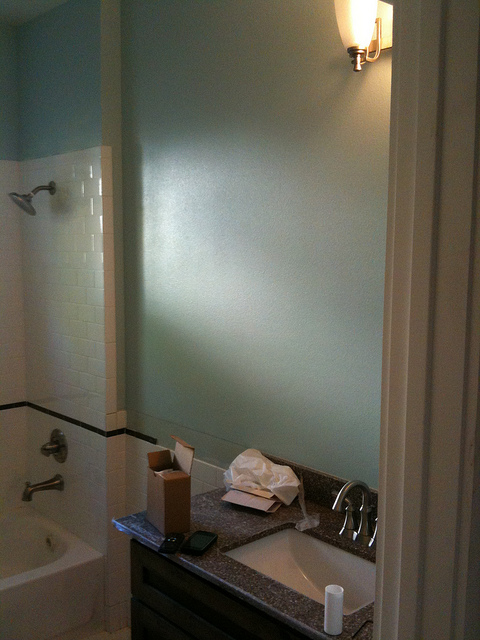

In [1]:
from IPython.display import Image, display

import numpy as np
import matplotlib.pyplot as plt
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

def is_notebook() -> bool:
  try:
    shell = get_ipython().__class__.__name__
    if shell == 'ZMQInteractiveShell':
      return True   # Jupyter notebook or qtconsole
    elif shell == 'TerminalInteractiveShell':
      return False  # Terminal running IPython
    else:
      return False  # Other type (?)
  except NameError:
    return False    # Probably standard Python interpreter

def Display (file):
  if is_notebook():
    display(Image(file))
  else:
    out = climage.convert(file)
    print (out)

Display ('datasets/COCO/train2014/COCO_train2014_000000310867.jpg')

def load_image(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.resize(img, (299, 299))
  img = tf.keras.applications.inception_v3.preprocess_input(img)
  return img, image_path

# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

def plot_loss(loss_plot):
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Loss Plot')
  plt.show()    
    
def plot_attention(image, result, attention_plot):
  temp_image = np.array(Image.open(image))

  fig = plt.figure(figsize=(10, 10))

  len_result = len(result)
  for l in range(len_result):
    temp_att = np.resize(attention_plot[l], (8, 8))
    ax = fig.add_subplot(len_result//2, len_result//2, l+1)
    ax.set_title(result[l])
    img = ax.imshow(temp_image)
    ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

  plt.tight_layout()
  plt.show()

In [2]:
import re
import collections

captions_file = 'datasets/Flickr8k/Flickr8k.token.txt'
captions = open(captions_file, 'r').read().strip().split('\n')

d = collections.defaultdict(list)
for i, row in enumerate(captions):
    row = re.split('#|\t', row)
    d[row[0]].append(row[2])
    
print(d['1000268201_693b08cb0e.jpg'])

['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .', 'A little girl climbing the stairs to her playhouse .', 'A little girl in a pink dress going into a wooden cabin .']


2022-10-07 13:31:14.559393: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-07 13:31:14.703736: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-07 13:31:14.753370: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-07 13:31:15.614948: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

['<start> Bread, sour cream, and guacamole are arrayed on a plate with a lemon slice. <end>', '<start> A white plate of food on a dining table. <end>', '<start> a slice of bread is covered with a sour cream and quacamole <end>', '<start> White Plate with a lot of guacamole and an extra large dollop of sour cream over meat <end>', '<start> A dinner plate has a lemon wedge garnishment. <end>']
82783
6000
<start> A city filled with lots of tall buildings. <end>


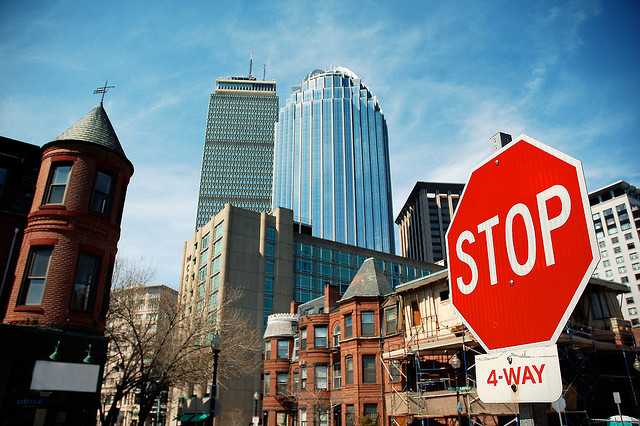

2022-10-07 13:31:38.934671: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-07 13:31:39.802618: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30490 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 375/375 [02:21<00:00,  2.64it/s]


Epoch 7 Batch 0 Loss 1.3768


KeyboardInterrupt: 

In [2]:
import tensorflow as tf

import pandas as pd
import collections
from tqdm import tqdm
import random
import numpy as np
import os
import time

from cap import attention, cnn, rnn

dataset_dir='datasets/COCO'
images_dir='datasets/COCO/train2014'
prefix='COCO_train2014'
caption_file='captions_train2014.json'
train_limit=6000

filename = '{}/annotations/{}'.format(dataset_dir, caption_file)
df = pd.DataFrame(list(pd.read_json(filename, lines=True).annotations[0]))
#for index, row in df.iterrows():
#    print(index, "{}/{}_{:012d}.jpg".format(images_dir, prefix, row['image_id']), row['caption'])

image_path_to_caption = collections.defaultdict(list)
for index, row in tqdm(df.iterrows(), total=df.shape[0]):
#  if not row['image_id'].endswith(".jpg"):
#    continue
  caption = f"<start> {row['caption']} <end>"
  image_path ="{}/{}_{:012d}.jpg".format(images_dir, prefix, row['image_id'])
  image_path_to_caption[image_path].append(caption)

print(image_path_to_caption[image_path])

image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)
print(len(image_paths))

train_image_paths = image_paths[:train_limit]
print(len(train_image_paths))

train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

print (train_captions[0])
Display (img_name_vector[0])

model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
image_features_extract_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[-1].output)
image_features_extract_model.summary()

# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  if not os.path.isfile(path + '.npy'):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
      path_of_feature = p.numpy().decode("utf-8")
      np.save(path_of_feature, bf.numpy())

# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k, oov_token="<unk>", filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

encoder = cnn.Encoder(embedding_dim)
decoder = rnn.Decoder(embedding_dim, units, vocab_size)
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

checkpoint_path = 'checkpoints/train'
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

#@tf.function
def train_step(img_tensor, target):
  loss = 0
  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)
      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)
          loss += loss_function(target[:, i], predictions)
          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
  total_loss = (loss / int(target.shape[1]))
  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, trainable_variables)
  optimizer.apply_gradients(zip(gradients, trainable_variables))
    
  return loss, total_loss

EPOCHS = 10

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1, total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

plot_loss(loss_plot)

def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])
        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot
        dec_input = tf.expand_dims([predicted_id], 0)
    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

2022-10-07 13:37:31.067766: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-07 13:37:31.224628: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-07 13:37:31.276079: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-07 13:37:32.154313: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

['<start> A man in a pink shirt climbs a rock face <end>', '<start> A man is rock climbing high in the air . <end>', '<start> A person in a red shirt climbing up a rock face covered in assist handles . <end>', '<start> A rock climber in a red shirt . <end>', '<start> A rock climber practices on a rock climbing wall . <end>']
8091
6000
<start> A man in a wetsuit is throwing a baby wearing a wetsuit up into the air . <end>


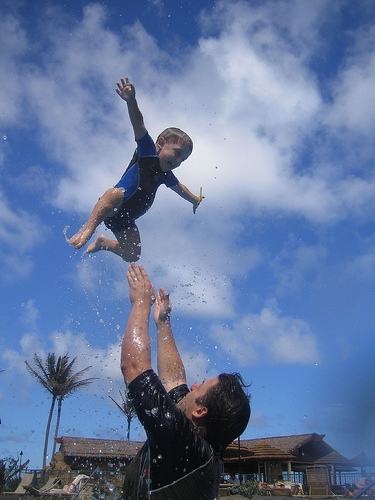

2022-10-07 13:37:35.617166: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-07 13:37:36.573694: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30490 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 375/375 [01:26<00:00,  4.33it/s]


Epoch 7 Batch 0 Loss 2.1713
Epoch 7 Batch 100 Loss 1.2867
Epoch 7 Batch 200 Loss 1.2553
Epoch 7 Batch 300 Loss 1.1255
Epoch 7 Loss 1.243076
Time taken for 1 epoch 556.1908395290375 sec

Epoch 8 Batch 0 Loss 1.0454
Epoch 8 Batch 100 Loss 0.9533
Epoch 8 Batch 200 Loss 0.9626
Epoch 8 Batch 300 Loss 0.9907
Epoch 8 Loss 0.996107
Time taken for 1 epoch 560.156008720398 sec

Epoch 9 Batch 0 Loss 0.9571
Epoch 9 Batch 100 Loss 0.9499
Epoch 9 Batch 200 Loss 0.9710
Epoch 9 Batch 300 Loss 0.9255
Epoch 9 Loss 0.898064
Time taken for 1 epoch 560.4074881076813 sec

Epoch 10 Batch 0 Loss 0.8932
Epoch 10 Batch 100 Loss 0.8078
Epoch 10 Batch 200 Loss 0.8246
Epoch 10 Batch 300 Loss 0.8157
Epoch 10 Loss 0.825104
Time taken for 1 epoch 561.745103597641 sec



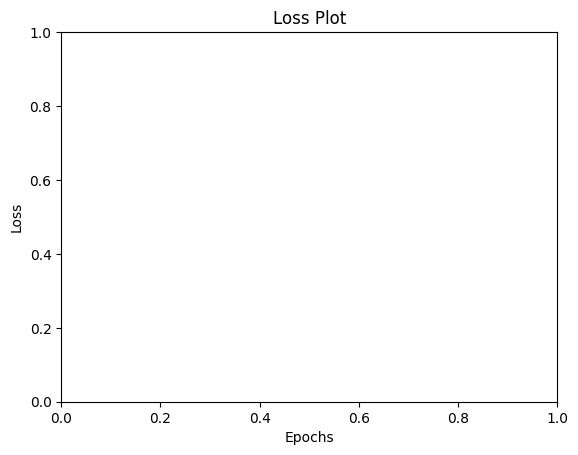

Real Caption: <start> two people outside in cold winter with a scarf and hat on <end>
Prediction Caption: a baby with a snow pack a pink jacket <unk> <end>


AttributeError: type object 'Image' has no attribute 'open'

In [2]:
import tensorflow as tf
import pandas as pd
import collections
from tqdm import tqdm
import random
import numpy as np
import os
import time

from cap import attention, cnn, rnn

dataset_dir='datasets/Flickr8k'
images_dir='datasets/Flickr8k/Flicker8k_Dataset'
captions_file='Flickr8k.token.txt'
train_limit=6000

filename = '{}/Flickr8k.token.txt'.format(dataset_dir, captions_file)
df = pd.DataFrame(open(filename, 'r').read().strip().split('\n'), columns=['token'])
df[['image_id', 'idx','caption']] = df['token'].str.split('\t|#', 2, expand=True)

image_path_to_caption = collections.defaultdict(list)
for index, row in tqdm(df.iterrows(), total=df.shape[0]):
  if not row['image_id'].endswith(".jpg"):
    continue
  caption = f"<start> {row['caption']} <end>"
  image_path ="{}/{}".format(images_dir, row['image_id'])
  image_path_to_caption[image_path].append(caption)

print(image_path_to_caption[image_path])

image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)
print(len(image_paths))

train_image_paths = image_paths[:train_limit]
print(len(train_image_paths))

train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

print (train_captions[0])
Display (img_name_vector[0])

model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
image_features_extract_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[-1].output)

# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  if not os.path.isfile(path + '.npy'):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
      path_of_feature = p.numpy().decode("utf-8")
      np.save(path_of_feature, bf.numpy())

# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k, oov_token="<unk>", filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

encoder = cnn.Encoder(embedding_dim)
decoder = rnn.Decoder(embedding_dim, units, vocab_size)
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

checkpoint_path = 'checkpoints/train'
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

#@tf.function
def train_step(img_tensor, target):
  loss = 0
  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)
      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)
          loss += loss_function(target[:, i], predictions)
          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
  total_loss = (loss / int(target.shape[1]))
  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, trainable_variables)
  optimizer.apply_gradients(zip(gradients, trainable_variables))
    
  return loss, total_loss

EPOCHS = 10

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1, total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

plot_loss(loss_plot)

def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])
        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot
        dec_input = tf.expand_dims([predicted_id], 0)
    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

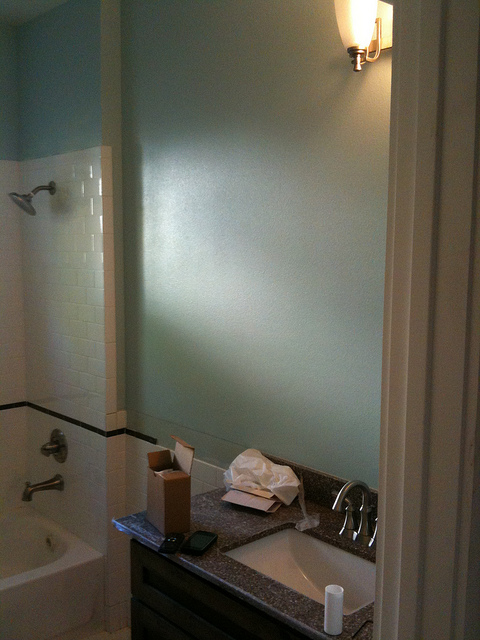

In [138]:
from IPython.display import Image, display

def is_notebook() -> bool:
  try:
    shell = get_ipython().__class__.__name__
    if shell == 'ZMQInteractiveShell':
      return True   # Jupyter notebook or qtconsole
    elif shell == 'TerminalInteractiveShell':
      return False  # Terminal running IPython
    else:
      return False  # Other type (?)
  except NameError:
    return False    # Probably standard Python interpreter

def Display (file):
  if is_notebook():
    display(Image(file))
  else:
    out = climage.convert(file)
    print (out)

Display ('datasets/COCO/train2014/COCO_train2014_000000310867.jpg')

train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

82783
6000
<start> The skier is moving quickly down the mountain, leaving a trail of white powder. <end>


100%|███████████████████████████████████████████████████████████████████| 375/375 [01:27<00:00,  4.30it/s]


Epoch 7 Batch 0 Loss 1.4613
Epoch 7 Batch 100 Loss 0.9493
Epoch 7 Batch 200 Loss 0.8418
Epoch 7 Batch 300 Loss 0.8745
Epoch 7 Loss 0.933744
Time taken for 1 epoch 162.44772458076477 sec

Epoch 8 Batch 0 Loss 0.7707
Epoch 8 Batch 100 Loss 0.7779
Epoch 8 Batch 200 Loss 0.7096
Epoch 8 Batch 300 Loss 0.7798
Epoch 8 Loss 0.734025
Time taken for 1 epoch 49.56729173660278 sec

Epoch 9 Batch 0 Loss 0.7102
Epoch 9 Batch 100 Loss 0.6758
Epoch 9 Batch 200 Loss 0.5953
Epoch 9 Batch 300 Loss 0.6354
Epoch 9 Loss 0.658765
Time taken for 1 epoch 49.084420680999756 sec

Epoch 10 Batch 0 Loss 0.6705
Epoch 10 Batch 100 Loss 0.5444
Epoch 10 Batch 200 Loss 0.5970
Epoch 10 Batch 300 Loss 0.5930
Epoch 10 Loss 0.603372
Time taken for 1 epoch 49.361085653305054 sec



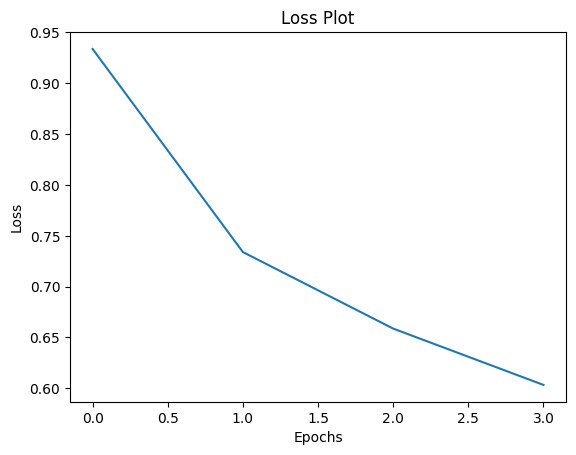

Real Caption: <start> a past dish in a frame with peppers and broccoli <end>
Prediction Caption: a plate of broccoli and green vegetable on an apple <end>


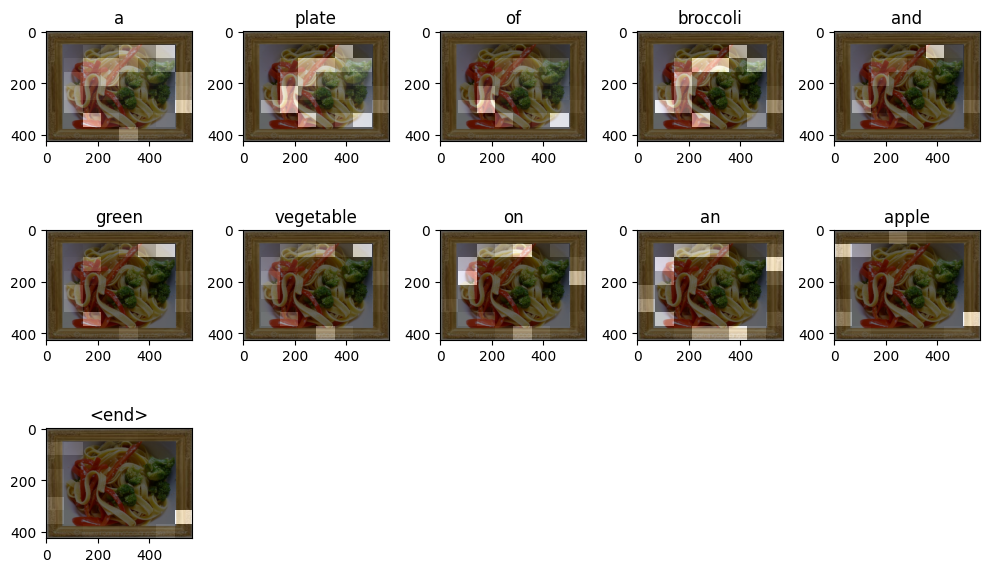

Prediction Caption: a man is skiing on top of a wall with goodies <end>


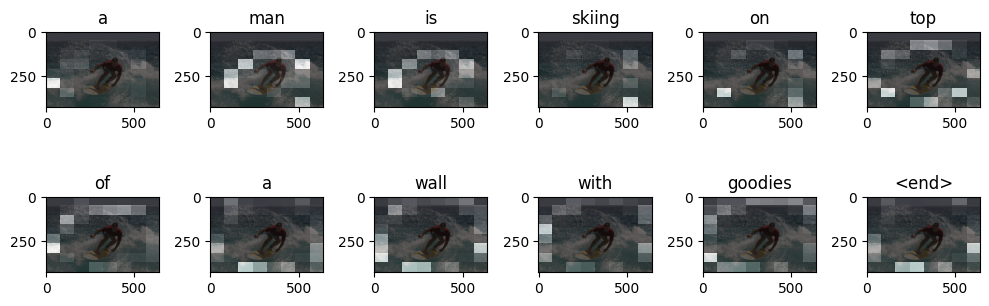

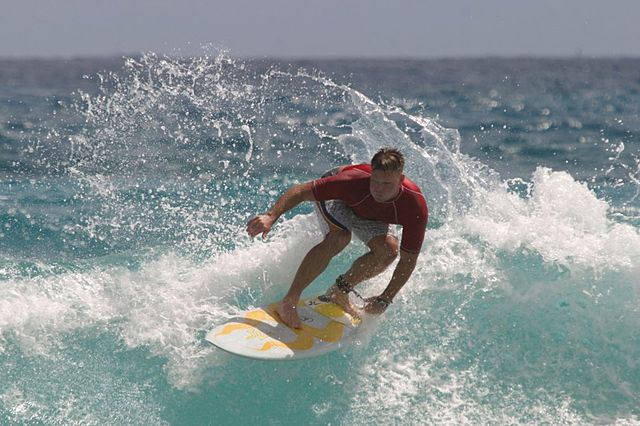

In [2]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import collections
import random
import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

annotation_file = 'datasets/COCO/annotations/captions_train2014.json'
    
with open(annotation_file, 'r') as f:
    annotations = json.load(f)
    
image_path_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
  caption = f"<start> {val['caption']} <end>"
  image_path = 'datasets/COCO/train2014/COCO_train2014_' + '%012d.jpg' % (val['image_id'])
  image_path_to_caption[image_path].append(caption)

image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)
print(len(image_paths))

# Select the first 6000 image_paths from the shuffled set.
# Approximately each image id has 5 captions associated with it, so that will 
# lead to 30,000 examples.
train_image_paths = image_paths[:6000]
print(len(train_image_paths))

train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

print(train_captions[0])
Image.open(img_name_vector[0])

def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

from tqdm import tqdm

# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

EPOCHS = 10

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    

plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

image_url = 'https://tensorflow.org/images/surf.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     origin=image_url)

result, attention_plot = evaluate(image_path)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

### from cap.config import coco2014_cfg, flickr8k_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM

#import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "2"

dataset = Dataset.flickr8k(flickr8k_cfg)
#dataset = Dataset.coco2014(coco2014_cfg)

#model = Model.efficientb0(efficientb0_cfg)
#model = Model.inceptionv3(inceptionv3_cfg)
#model = Model.vgg16(vgg16_cfg)
model = LSTM.vgg16(vgg16_cfg)

model.put_data (dataset.get_data())
#model.fit()
#model.validation()
#model.prediction()

2022-10-20 11:22:07.527662: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-20 11:22:07.699732: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-20 11:22:07.757665: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-20 11:22:08.726676: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

Loaded: 8092 
Vocabulary Size: 8763
Dataset: train=6000
Descriptions: train=6000
Dataset: valid=1000
Descriptions: valid=1000
Photos: train=6000
Vocabulary Size: 7579
Description Length: 34
Photos: val=1000


2022-10-20 11:22:12.413195: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-20 11:22:13.464959: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30490 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 4096)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 34, 256)      1940224     ['input_2[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 4096)         0           ['input_1[0][0]']                
                                                                                              

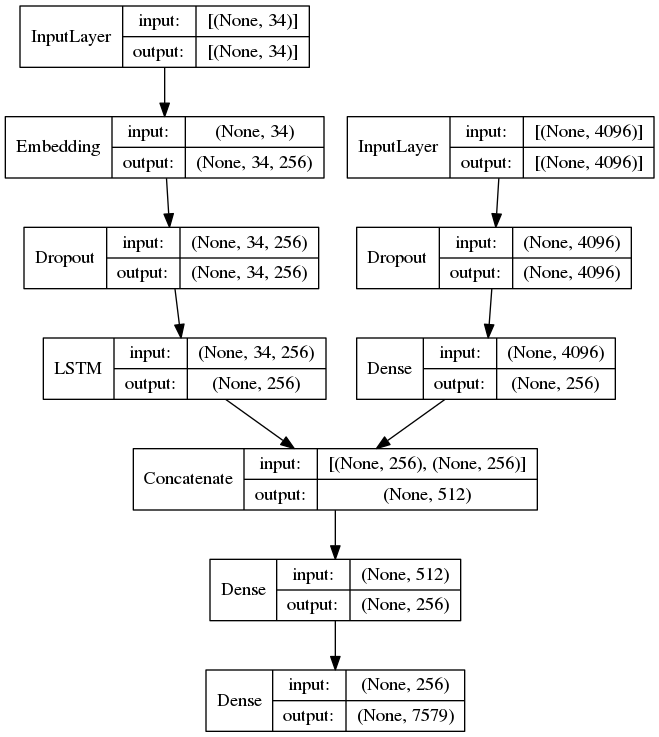

Epoch 1/5


2022-10-20 11:22:19.861725: W tensorflow/core/common_runtime/forward_type_inference.cc:332] Type inference failed. This indicates an invalid graph that escaped type checking. Error message: INVALID_ARGUMENT: expected compatible input types, but input 1:
type_id: TFT_OPTIONAL
args {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_TENSOR
    args {
      type_id: TFT_INT32
    }
  }
}
 is neither a subtype nor a supertype of the combined inputs preceding it:
type_id: TFT_OPTIONAL
args {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_TENSOR
    args {
      type_id: TFT_FLOAT
    }
  }
}

	while inferring type of node 'cond_40/output/_23'


6000/6000 [==============================] - ETA: 0s - loss: 4.6425
Epoch 1: val_loss improved from inf to 4.12405, saving model to files/model_vgg16_flickr8k_ep001_loss4.643_val_loss4.124.h5
6000/6000 [==============================] - 585s 97ms/step - loss: 4.6425 - val_loss: 4.1241
Epoch 2/5
6000/6000 [==============================] - ETA: 0s - loss: 3.8662
Epoch 2: val_loss improved from 4.12405 to 3.93425, saving model to files/model_vgg16_flickr8k_ep002_loss3.866_val_loss3.934.h5
6000/6000 [==============================] - 582s 97ms/step - loss: 3.8662 - val_loss: 3.9342
Epoch 3/5
6000/6000 [==============================] - ETA: 0s - loss: 3.6165
Epoch 3: val_loss improved from 3.93425 to 3.91392, saving model to files/model_vgg16_flickr8k_ep003_loss3.616_val_loss3.914.h5
6000/6000 [==============================] - 586s 98ms/step - loss: 3.6165 - val_loss: 3.9139
Epoch 4/5
6000/6000 [==============================] - ETA: 0s - loss: 3.4632
Epoch 4: val_loss did not improve fr

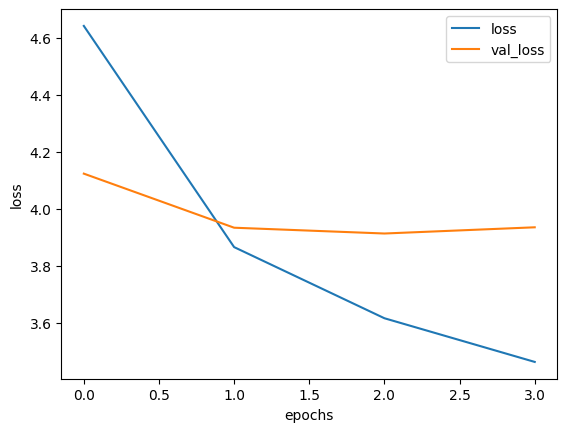

In [1]:
from cap.config import coco2014_cfg, flickr8k_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM

import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

data = Dataset.flickr8k(flickr8k_cfg) 
#dataset = Dataset.coco2014(coco2014_cfg)

#model = Model.efficientb0(efficientb0_cfg) 
#model = Model.inceptionv3(inceptionv3_cfg) 
#model = Model.vgg16(vgg16_cfg) 
model = LSTM.vgg16(vgg16_cfg, data.param())
#model.load (dataset.get()) 
model.fit(5) 
#model.validation() 
#model.prediction()

Loaded: 8092 
['child in pink dress is climbing up set of stairs in an entry way', 'girl going into wooden building', 'little girl climbing into wooden playhouse', 'little girl climbing the stairs to her playhouse', 'little girl in pink dress going into wooden cabin']
Vocabulary Size: 8763
Dataset: train=6000


100%|█████████████████████████████████████████████████████████████| 40460/40460 [00:04<00:00, 9604.80it/s]


Descriptions: train=6000
Dataset: valid=1000


100%|████████████████████████████████████████████████████████████| 40460/40460 [00:01<00:00, 39972.61it/s]


Descriptions: valid=1000
Dataset: test=10


100%|███████████████████████████████████████████████████████████| 40460/40460 [00:00<00:00, 739189.03it/s]


Descriptions: test=10


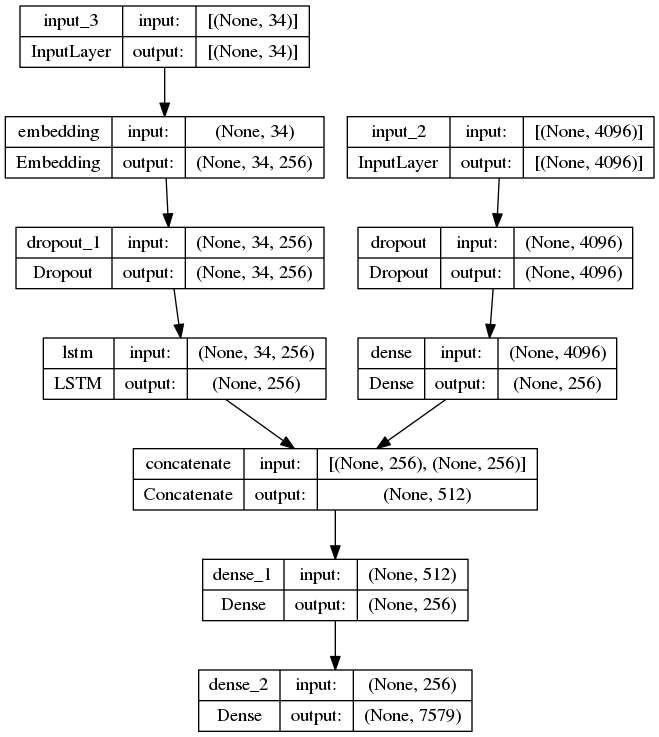

Photos: test=10


2022-10-20 16:17:55.310883: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-20 16:17:56.334804: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30490 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0
100%|█████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.76s/it]

Sampling:
BLEU-1: 8.571429
BLEU-2: 3.175537
BLEU-3: 1.887380
BLEU-4: 0.636220


In [2]:
from cap.config import coco2014_cfg, flickr8k_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM

import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

data = Dataset.flickr8k(flickr8k_cfg) 
#dataset = Dataset.coco2014(coco2014_cfg)

#model = Model.efficientb0(efficientb0_cfg) 
#model = Model.inceptionv3(inceptionv3_cfg) 
#model = Model.vgg16(vgg16_cfg) 
model = LSTM.vgg16(vgg16_cfg, flickr8k_cfg)
#model.load (dataset.get()) 
#model.fit(5) 
#model.validation() 
#model.prediction()
model.evaluate('files/model_vgg16_flickr8k_ep001_loss4.643_val_loss4.124.h5', 34)

2022-10-21 08:15:57.378804: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-21 08:15:57.555736: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-21 08:15:57.611521: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-21 08:15:58.574416: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

datasets/COCO/train2014


2022-10-21 08:16:01.019988: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-21 08:16:02.178513: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30490 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

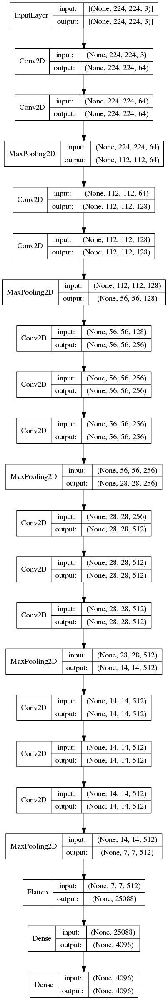

100%|█████████████████████████████████████████████████████████████| 82783/82783 [1:39:41<00:00, 13.84it/s]


datasets/COCO/val2014
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 5

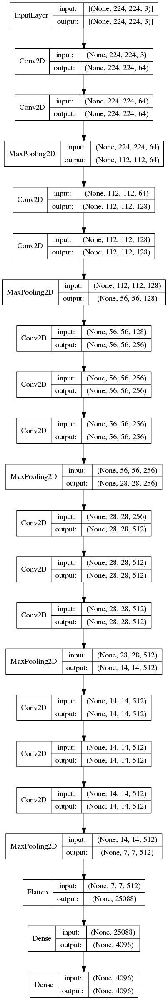

100%|███████████████████████████████████████████████████████████████| 40504/40504 [49:05<00:00, 13.75it/s]


Extracted Features: 123287
Photos: train=82783
Vocabulary Size: 24357
Description Length: 49
Photos: val=8000
Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 49)]         0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 4096)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 49, 256)      6235392     ['input_4[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 4096)         0           ['input_3[0][0]'

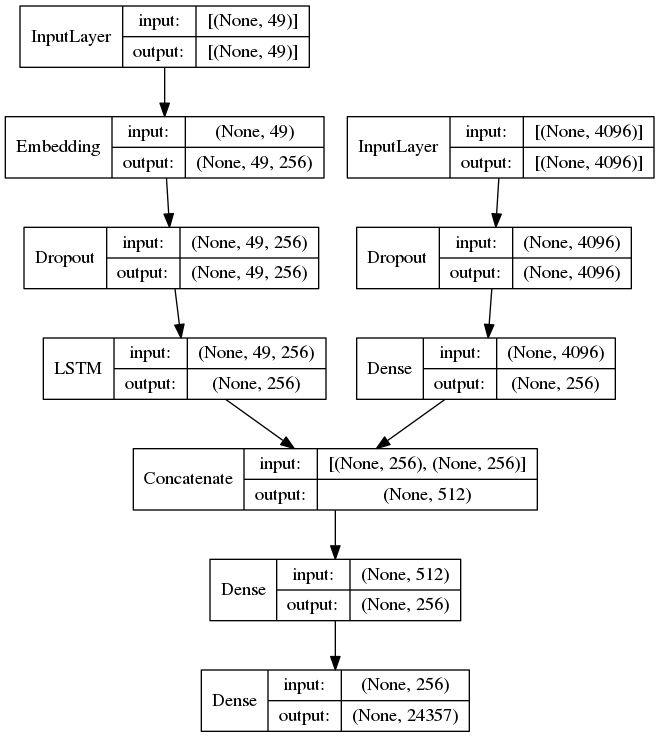

Epoch 1/5


2022-10-21 10:45:16.436799: W tensorflow/core/common_runtime/forward_type_inference.cc:332] Type inference failed. This indicates an invalid graph that escaped type checking. Error message: INVALID_ARGUMENT: expected compatible input types, but input 1:
type_id: TFT_OPTIONAL
args {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_TENSOR
    args {
      type_id: TFT_INT32
    }
  }
}
 is neither a subtype nor a supertype of the combined inputs preceding it:
type_id: TFT_OPTIONAL
args {
  type_id: TFT_PRODUCT
  args {
    type_id: TFT_TENSOR
    args {
      type_id: TFT_FLOAT
    }
  }
}

	while inferring type of node 'cond_40/output/_23'


82783/82783 [==============================] - ETA: 0s - loss: 3.8571
Epoch 1: val_loss improved from inf to 5.05698, saving model to files/model_vgg16_coco2014_ep001_loss3.857_val_loss5.057.h5
82783/82783 [==============================] - 11718s 141ms/step - loss: 3.8571 - val_loss: 5.0570
Epoch 2/5
82783/82783 [==============================] - ETA: 0s - loss: 3.6882
Epoch 2: val_loss improved from 5.05698 to 4.90381, saving model to files/model_vgg16_coco2014_ep002_loss3.688_val_loss4.904.h5
82783/82783 [==============================] - 11874s 143ms/step - loss: 3.6882 - val_loss: 4.9038
Epoch 3/5
82783/82783 [==============================] - ETA: 0s - loss: 3.5931
Epoch 3: val_loss did not improve from 4.90381
82783/82783 [==============================] - 11915s 144ms/step - loss: 3.5931 - val_loss: 4.9078
Epoch 3: early stopping


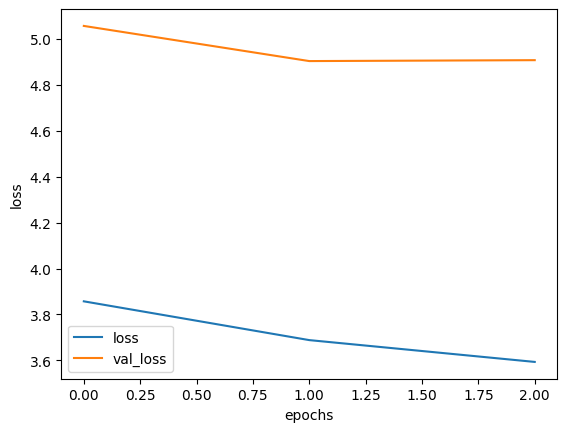

In [1]:
from cap.config import coco2014_cfg, flickr8k_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM

import os 
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

#data = Dataset.flickr8k(flickr8k_cfg) 
data = Dataset.coco2014(coco2014_cfg)

#model = Model.efficientb0(efficientb0_cfg) 
#model = Model.inceptionv3(inceptionv3_cfg) 
#model = Model.vgg16(vgg16_cfg) 
#model = LSTM.vgg16(vgg16_cfg, flickr8k_cfg)
model = LSTM.vgg16(vgg16_cfg, coco2014_cfg)
#model.load (dataset.get()) 
model.fit(5) 
#model.validation() 
#model.prediction()
#model.evaluate('files/model_vgg16_flickr8k_ep001_loss4.643_val_loss4.124.h5', 34)

2022-10-31 11:16:53.540371: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-31 11:16:53.700559: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-31 11:16:53.751508: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-31 11:16:54.718171: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

Loaded: 256719 
IMG_0298891_air_conditioner(air_conditioner(stand))
['room with floor fan wooden door white wall and black pipe', 'the wooden floors are clean and ready to use', 'an air conditioner and travel speaker are standing in front of the wall', 'an indoor air conditioner is installed on the floor of the building', 'wood floor and an electric air conditioner are side by side', 'floor with wooden door and wood frame on the floor', 'the room has fire extinguisher and trash can', 'living room with an air conditioner next to the wooden floor', 'the large white air conditioner is in the room', 'portable air conditioner in front of white wall']
Vocabulary Size: 14306
Dataset: train=179703


100%|██████████████████████████████████| 256719/256719 [20:58<00:00, 203.98it/s]


Descriptions: train=179703
Dataset: valid=10000


100%|█████████████████████████████████| 256719/256719 [00:49<00:00, 5198.09it/s]


Descriptions: valid=10000
Dataset: test=10


100%|██████████████████████████████| 256719/256719 [00:00<00:00, 1830059.38it/s]


Descriptions: test=10
#
# vgg16 model nia0403/['datasets/NIA/images']
#
datasets/NIA/images/IMG_0250492_pan(pan).jpg


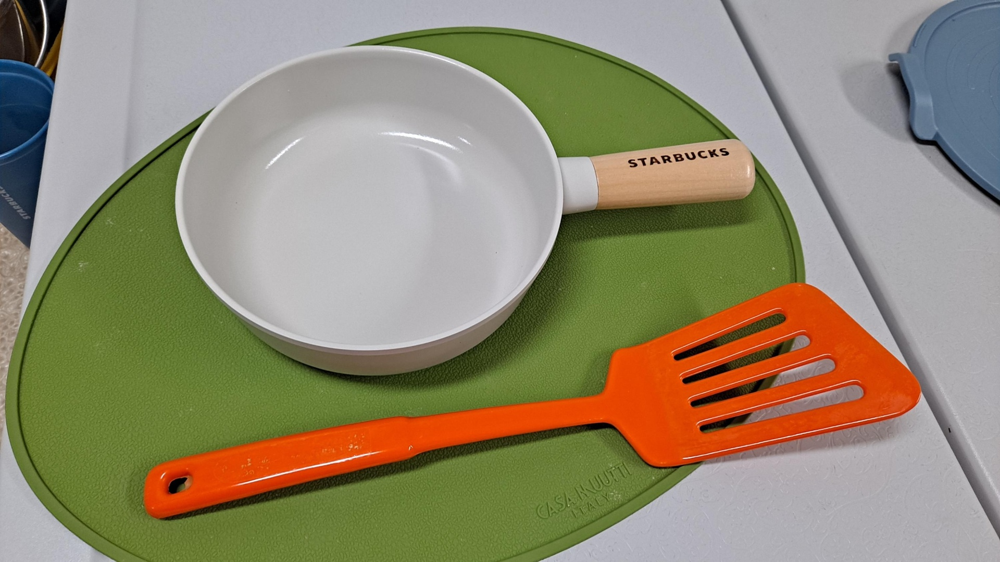

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


File not found: files/rnn_vgg16_nia0403.pkl
datasets/NIA/images


2022-10-31 11:39:53.548579: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-31 11:39:54.489348: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30973 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:07.0, compute capability: 7.0


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

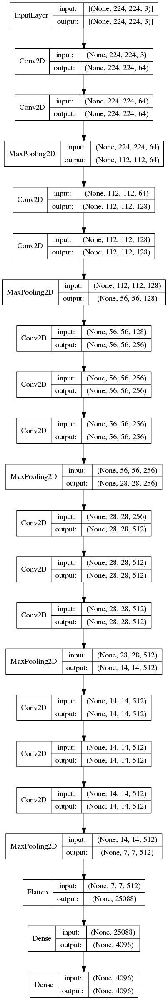

 14%|████▍                           | 58534/422139 [1:23:33<8:39:02, 11.68it/s]


KeyboardInterrupt: 

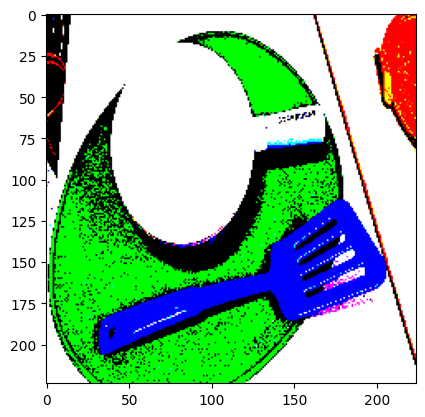

In [1]:
from cap.config import coco2014_cfg, coco2017_cfg, flickr8k_cfg, nia0403_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM

import os 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

#data = Dataset.flickr8k(flickr8k_cfg) 
#data = Dataset.coco2014(coco2014_cfg)
#data = Dataset.coco2017(coco2017_cfg)
data = Dataset.nia(nia0403_cfg)

#model = Model.efficientb0(efficientb0_cfg) 
#model = Model.inceptionv3(inceptionv3_cfg) 
#model = Model.vgg16(vgg16_cfg) 
#model = LSTM.vgg16(vgg16_cfg, flickr8k_cfg)
#model = LSTM.vgg16(vgg16_cfg, coco2014_cfg)
model = LSTM.vgg16(vgg16_cfg, nia0403_cfg)
#model.load (dataset.get()) 
model.fit(5) 
#model.validation() 
#model.prediction()
#model.evaluate('files/model_vgg16_flickr8k_ep001_loss4.643_val_loss4.124.h5', 34)
#model.evaluate('files/model_vgg16_rnn_model1_256_256_4096_coco2014_ep002_loss3.688_val_loss4.904.h5', 49)

In [8]:
import os
import glob
import json
import pandas as pd
from tqdm import tqdm
from json.decoder import JSONDecodeError

image_dir = 'datasets/NIA/images/'

for path in tqdm(glob.glob(image_dir + '/VID_*.jpg')):
  filename = os.path.basename(path)
  location = os.path.dirname(path)
  #print ('{}/{} => {}/{}_person(person).jpg'.format(location, filename, location,filename[:11]))
  os.rename('{}/{}'.format(location, filename), '{}/{}_person(person).jpg'.format(location,filename[:11]))

100%|█████████████████████████████████████████████████| 60074/60074 [00:13<00:00, 4441.84it/s]


In [4]:
import os
import glob
import json
import random
import pandas as pd
from tqdm import tqdm
from json.decoder import JSONDecodeError

json_dir =  'datasets/NIA/annotations/4-3'
image_dir = 'datasets/NIA/images/'

fetoken = open('datasets/NIA/annotations/4-3.token.eng.txt', 'w')
fktoken = open('datasets/NIA/annotations/4-3.token.kor.txt', 'w')
fimages = open('datasets/NIA/annotations/4-3.images.txt', 'w')
ftrain = open('datasets/NIA/annotations/4-3.trainImages.txt', 'w')
fvalid = open('datasets/NIA/annotations/4-3.devImages.txt', 'w')
ftest = open('datasets/NIA/annotations/4-3.testImages.txt', 'w')

images = []

for file in tqdm(glob.glob(json_dir + '/*.json')):
  #print (file)

  with open(file, encoding='utf-8-sig') as f:
    try:
      data = json.load(f)
    
      #{'id': '0298891', 'width': 1920, 'height': 1080, 'file_name': 'IMG_0298891_air_conditioner(air_conditioner(stand)).jpg'}
      filename = data['images'][0]['file_name']
      image = filename.split('.')[0]
      if not os.path.isfile(image_dir + filename):
        print ('not found: ' + image_dir + filename + ' => ' + file)
        continue

      #ftrain.write("{}\n".format(image))
      images.append ('{}.jpg'.format(image))
        
      for idx,caption in enumerate(data['annotations'][0]['text']):
        if caption['english'].find('\n') != -1:
          print ('find {}'.format(caption['english']))
        fetoken.write ("{}.jpg#{} {}\n".format(image, idx,caption['english']))
        if caption['korean'].find('\n') != -1:
          print ('find {}'.format(caption['korean']))
        fktoken.write ("{}.jpg#{} {}\n".format(image, idx,caption['korean']))
    except JSONDecodeError as e:
      print ('Decoding JSON has failed: ', file, e)

fimages.write('\n'.join(images))
    
random.shuffle(images)
nsize  = len(images)
ntrain = int(nsize*0.7)
nvalid = int((nsize - int(nsize*0.7))*0.7)
ntest = nsize - ntrain - nvalid
print (nsize, ntrain, nvalid, ntest)

train = images[:ntrain]
valid = images[ntrain:ntrain+nvalid]
test  = images[ntrain+nvalid:]

print(len(train), len(valid), len(test))

ftrain.write('\n'.join(train))
fvalid.write('\n'.join(valid))
ftest.write('\n'.join(test))

fimages.close()  
fetoken.close()  
fktoken.close()  
ftrain.close()
fvalid.close()
ftest.close()

 72%|███████████████████████         | 216684/300000 [00:19<00:07, 11199.03it/s]

not found: datasets/NIA/images/IMG_0002209_sushi(sushi).jpg => datasets/NIA/annotations/4-3/IMG_0002209_sushi(sushi)_(4_3).json


 74%|███████████████████████▌        | 221369/300000 [00:19<00:06, 11717.01it/s]

not found: datasets/NIA/images/IMG_0309301_refrigerator(gimchi_refrigerator).jpg => datasets/NIA/annotations/4-3/IMG_0309301_refrigerator(gimchi_refrigerator)_(4_3).json
not found: datasets/NIA/images/IMG_0339579_refrigerator(gimchi_refrigerator).jpg => datasets/NIA/annotations/4-3/IMG_0339579_refrigerator(gimchi_refrigerator)_(4_3).json
not found: datasets/NIA/images/IMG_0015751_refrigerator(refrigerator(normal)).jpg => datasets/NIA/annotations/4-3/IMG_0015751_refrigerator(refrigerator(normal))_(4_3).json
not found: datasets/NIA/images/IMG_0015752_refrigerator(refrigerator(normal)).jpg => datasets/NIA/annotations/4-3/IMG_0015752_refrigerator(refrigerator(normal))_(4_3).json
not found: datasets/NIA/images/IMG_0022142_refrigerator(refrigerator(normal)).jpg => datasets/NIA/annotations/4-3/IMG_0022142_refrigerator(refrigerator(normal))_(4_3).json
not found: datasets/NIA/images/IMG_0022143_refrigerator(refrigerator(normal)).jpg => datasets/NIA/annotations/4-3/IMG_0022143_refrigerator(refri

 75%|███████████████████████▉        | 223890/300000 [00:19<00:06, 12127.13it/s]

not found: datasets/NIA/images/IMG_0124018_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124018_rice_cooker(steamer_rice_cooker)_(4_3).json
not found: datasets/NIA/images/IMG_0124019_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124019_rice_cooker(steamer_rice_cooker)_(4_3).json
not found: datasets/NIA/images/IMG_0124020_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124020_rice_cooker(steamer_rice_cooker)_(4_3).json
not found: datasets/NIA/images/IMG_0124080_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124080_rice_cooker(steamer_rice_cooker)_(4_3).json
not found: datasets/NIA/images/IMG_0124081_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124081_rice_cooker(steamer_rice_cooker)_(4_3).json
not found: datasets/NIA/images/IMG_0124082_rice_cooker(steamer_rice_cooker).jpg => datasets/NIA/annotations/4-3/IMG_0124082_rice_cooker(steamer_rice_cooker)_(4_

 75%|████████████████████████▏       | 226367/300000 [00:20<00:05, 12278.50it/s]

not found: datasets/NIA/images/IMG_0167214_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167214_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167215_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167215_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167216_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167216_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167217_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167217_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167218_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167218_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167219_rice_spatula(rice_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0167219_rice_spatula(rice_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0167220_rice_spatula(rice_spa

 76%|████████████████████████▍       | 229039/300000 [00:20<00:05, 12144.73it/s]

not found: datasets/NIA/images/IMG_0019882_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0019882_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0021657_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0021657_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0021658_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0021658_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0021659_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0021659_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0021660_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0021660_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0021661_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0021661_sandwich(sandwich)_(4_3).json
not found: datasets/NIA/images/IMG_0032117_sandwich(sandwich).jpg => datasets/NIA/annotations/4-3/IMG_0032117_sandwich(sandwich)_(4_3).json
not found: datasets/

 78%|████████████████████████▉       | 233935/300000 [00:20<00:05, 12014.87it/s]

not found: datasets/NIA/images/IMG_0132313_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132313_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132314_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132314_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132315_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132315_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132316_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132316_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132317_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132317_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132318_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132318_scissors(scissors)_(4_3).json
not found: datasets/NIA/images/IMG_0132319_scissors(scissors).jpg => datasets/NIA/annotations/4-3/IMG_0132319_scissors(scissors)_(4_3).json
not found: datasets/

 79%|█████████████████████████▎      | 236781/300000 [00:21<00:04, 12733.23it/s]

not found: datasets/NIA/images/IMG_0360266_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360266_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360267_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360267_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360268_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360268_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360300_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360300_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360301_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360301_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360302_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360302_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360303_scooter(scooter).jpg => datasets/NIA/annotations/4-3/IMG_0360303_scooter(scooter)_(4_3).json
not found: datasets/NIA/images/IMG_0360304_scoot

 80%|█████████████████████████▌      | 239487/300000 [00:21<00:04, 12952.50it/s]

not found: datasets/NIA/images/IMG_0281572_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281572_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281573_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281573_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281574_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281574_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281575_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281575_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281576_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281576_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281577_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281577_side_dish(side_dish)_(4_3).json
not found: datasets/NIA/images/IMG_0281578_side_dish(side_dish).jpg => datasets/NIA/annotations/4-3/IMG_0281578_side_dish(side_dish)_(4_

 81%|█████████████████████████▊      | 242468/300000 [00:21<00:04, 13990.47it/s]

not found: datasets/NIA/images/IMG_0074111_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074111_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0074112_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074112_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0074122_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074122_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0074123_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074123_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0074124_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074124_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0074125_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_0074125_sign(restriction_sign)_(4_3).json
not found: datasets/NIA/images/IMG_0076048_sign(restriction_sign).jpg => datasets/NIA/annotations/4-3/IMG_007604

 82%|██████████████████████████▏     | 245254/300000 [00:21<00:04, 12773.60it/s]

not found: datasets/NIA/images/IMG_0027690_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027690_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0027691_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027691_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0027692_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027692_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0027693_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027693_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0027694_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027694_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0027695_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0027695_silicon_spatula(silicon_spatula)_(4_

 83%|██████████████████████████▍     | 247839/300000 [00:21<00:04, 12491.13it/s]

not found: datasets/NIA/images/IMG_0214931_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214931_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0214932_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214932_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0214933_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214933_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0214934_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214934_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0214935_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214935_silicon_spatula(silicon_spatula)_(4_3).json
not found: datasets/NIA/images/IMG_0214936_silicon_spatula(silicon_spatula).jpg => datasets/NIA/annotations/4-3/IMG_0214936_silicon_spatula(silicon_spatula)_(4_

 83%|██████████████████████████▋     | 250408/300000 [00:22<00:04, 12361.11it/s]

not found: datasets/NIA/images/IMG_0249286_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249286_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249287_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249287_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249288_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249288_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249289_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249289_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249290_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249290_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249291_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249291_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249292_squash(squash).jpg => datasets/NIA/annotations/4-3/IMG_0249292_squash(squash)_(4_3).json
not found: datasets/NIA/images/IMG_0249293_squash(squash).jpg => datasets/NI

 84%|██████████████████████████▉     | 252895/300000 [00:22<00:03, 12185.44it/s]

not found: datasets/NIA/images/IMG_0212009_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212009_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212010_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212010_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212011_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212011_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212012_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212012_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212013_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212013_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212014_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212014_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG_0212015_sushi(tofu_sushi).jpg => datasets/NIA/annotations/4-3/IMG_0212015_sushi(tofu_sushi)_(4_3).json
not found: datasets/NIA/images/IMG

 85%|███████████████████████████▏    | 255436/300000 [00:22<00:03, 12153.53it/s]

not found: datasets/NIA/images/IMG_0022079_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022079_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022080_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022080_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022272_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022272_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022273_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022273_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022274_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022274_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022275_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022275_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0022276_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0022276_table(table)_(4_3).json
not found: datasets/NIA/images/IMG_0025267_table(table).jpg => datasets/NIA/annotations/4-3/IMG_0025267_

 87%|███████████████████████████▋    | 259805/300000 [00:22<00:02, 13966.43it/s]

not found: datasets/NIA/images/IMG_0103234_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103234_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103235_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103235_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103236_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103236_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103237_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103237_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103238_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103238_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103239_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103239_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103240_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103240_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0103241_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0103241_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_01032

 87%|███████████████████████████▊    | 261286/300000 [00:22<00:02, 14214.94it/s]

not found: datasets/NIA/images/IMG_0193781_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193781_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193782_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193782_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193783_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193783_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193790_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193790_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193791_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193791_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193792_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193792_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193793_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193793_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_0193794_tie(tie).jpg => datasets/NIA/annotations/4-3/IMG_0193794_tie(tie)_(4_3).json
not found: datasets/NIA/images/IMG_01937

 88%|████████████████████████████▎   | 265377/300000 [00:23<00:02, 12311.35it/s]

not found: datasets/NIA/images/IMG_0146650_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146650_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146651_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146651_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146652_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146652_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146653_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146653_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146654_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146654_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146663_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146663_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146664_tomato(tomato).jpg => datasets/NIA/annotations/4-3/IMG_0146664_tomato(tomato)_(4_3).json
not found: datasets/NIA/images/IMG_0146665_tomato(tomato).jpg => datasets/NI

 89%|████████████████████████████▌   | 267842/300000 [00:23<00:02, 11958.09it/s]

not found: datasets/NIA/images/IMG_0221727_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221727_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221728_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221728_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221730_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221730_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221732_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221732_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221735_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221735_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221736_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_0221736_toothbrush(toothbrush)_(4_3).json
not found: datasets/NIA/images/IMG_0221739_toothbrush(toothbrush).jpg => datasets/NIA/annotations/4-3/IMG_022173

 90%|████████████████████████████▊   | 270441/300000 [00:23<00:02, 12347.28it/s]

not found: datasets/NIA/images/IMG_0072956_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0072956_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0073216_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0073216_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0073497_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0073497_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0073498_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0073498_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0073499_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0073499_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0073500_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0073500_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_00735

 91%|█████████████████████████████▏  | 273115/300000 [00:23<00:02, 12833.66it/s]

not found: datasets/NIA/images/IMG_0378549_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378549_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0378624_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378624_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0378678_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378678_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0378707_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378707_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0378884_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378884_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_0378907_traffic_light(traffic_light).jpg => datasets/NIA/annotations/4-3/IMG_0378907_traffic_light(traffic_light)_(4_3).json
not found: datasets/NIA/images/IMG_03789

 92%|█████████████████████████████▍  | 276050/300000 [00:24<00:01, 13662.25it/s]

not found: datasets/NIA/images/IMG_0307273_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307273_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307275_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307275_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307276_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307276_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307277_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307277_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307278_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307278_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307303_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307303_trash_bin(trash_bin)_(4_3).json
not found: datasets/NIA/images/IMG_0307304_trash_bin(trash_bin).jpg => datasets/NIA/annotations/4-3/IMG_0307304_trash_bin(trash_bin)_(4_

 93%|█████████████████████████████▋  | 278797/300000 [00:24<00:01, 13026.61it/s]

not found: datasets/NIA/images/IMG_0137651_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137651_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137652_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137652_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137653_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137653_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137654_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137654_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137667_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137667_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137668_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137668_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137669_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137669_tray(tray)_(4_3).json
not found: datasets/NIA/images/IMG_0137670_tray(tray).jpg => datasets/NIA/annotations/4-3/IMG_0137670_tray(tray)_(4_3).json
not foun

 94%|██████████████████████████████  | 281676/300000 [00:24<00:01, 13673.43it/s]

not found: datasets/NIA/images/IMG_0278022_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278022_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278023_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278023_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278024_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278024_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278025_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278025_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278026_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278026_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278027_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278027_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278028_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278028_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0278029_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0278029_

 95%|██████████████████████████████▎ | 284488/300000 [00:24<00:01, 12954.57it/s]

not found: datasets/NIA/images/IMG_0377811_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377811_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377812_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377812_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377813_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377813_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377814_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377814_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377815_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377815_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377816_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377816_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0377994_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0377994_truck(truck)_(4_3).json
not found: datasets/NIA/images/IMG_0378352_truck(truck).jpg => datasets/NIA/annotations/4-3/IMG_0378352_

 96%|██████████████████████████████▊ | 288350/300000 [00:25<00:00, 12267.90it/s]

not found: datasets/NIA/images/IMG_0251176_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0251176_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0251177_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0251177_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0251780_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0251780_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252293_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0252293_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252294_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0252294_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252295_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0252295_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252296_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0252296_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252297_tv(tv).jpg => datasets/NIA/annotations/4-3/IMG_0252297_tv(tv)_(4_3).json
not found: datasets/NIA/images/IMG_0252298_tv(tv).jpg => datasets/NIA/an

 97%|███████████████████████████████ | 291053/300000 [00:25<00:00, 12158.26it/s]

not found: datasets/NIA/images/IMG_0244142_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244142_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244143_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244143_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244144_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244144_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244145_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244145_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244146_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244146_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244147_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244147_umbrella(umbrella)_(4_3).json
not found: datasets/NIA/images/IMG_0244200_umbrella(umbrella).jpg => datasets/NIA/annotations/4-3/IMG_0244200_umbrella(umbrella)_(4_3).json
not found: datasets/

 98%|███████████████████████████████▍| 294938/300000 [00:25<00:00, 12408.80it/s]

not found: datasets/NIA/images/IMG_0137534_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0137534_vegetable_peeler(vegetable_peeler)_(4_3).json
not found: datasets/NIA/images/IMG_0137535_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0137535_vegetable_peeler(vegetable_peeler)_(4_3).json
not found: datasets/NIA/images/IMG_0137536_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0137536_vegetable_peeler(vegetable_peeler)_(4_3).json
not found: datasets/NIA/images/IMG_0137537_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0137537_vegetable_peeler(vegetable_peeler)_(4_3).json
not found: datasets/NIA/images/IMG_0142539_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0142539_vegetable_peeler(vegetable_peeler)_(4_3).json
not found: datasets/NIA/images/IMG_0145493_vegetable_peeler(vegetable_peeler).jpg => datasets/NIA/annotations/4-3/IMG_0145493_vegetable_peel

 99%|███████████████████████████████▋| 297419/300000 [00:25<00:00, 11943.71it/s]

not found: datasets/NIA/images/IMG_0018612_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0018612_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0018613_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0018613_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0018839_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0018839_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0018964_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0018964_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0019598_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0019598_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0020206_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0020206_washstand(washstand)_(4_3).json
not found: datasets/NIA/images/IMG_0021452_washstand(washstand).jpg => datasets/NIA/annotations/4-3/IMG_0021452_washstand(washstand)_(4_

100%|████████████████████████████████| 300000/300000 [00:26<00:00, 11517.77it/s]

not found: datasets/NIA/images/IMG_0149581_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0149581_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0166899_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0166899_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0166900_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0166900_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0173294_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0173294_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0173295_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0173295_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0173296_white_bread(white_bread).jpg => datasets/NIA/annotations/4-3/IMG_0173296_white_bread(white_bread)_(4_3).json
not found: datasets/NIA/images/IMG_0173297_white_bread(white_bread).jpg => datasets/NIA/

256719 179703 53911 23105
179703 53911 23105


In [5]:
import os
import glob
import json
import random
import pandas as pd
from tqdm import tqdm
from json.decoder import JSONDecodeError

json_dir =  'datasets/NIA/annotations/4-4'
image_dir = 'datasets/NIA/images/'

frelation = open('datasets/NIA/annotations/4-4.relation.txt', 'w')
fetoken = open('datasets/NIA/annotations/4-4.token.eng.txt', 'w')
fktoken = open('datasets/NIA/annotations/4-4.token.kor.txt', 'w')
fimages = open('datasets/NIA/annotations/4-4.images.txt', 'w')
ftrain = open('datasets/NIA/annotations/4-4.trainImages.txt', 'w')
fvalid = open('datasets/NIA/annotations/4-4.devImages.txt', 'w')
ftest = open('datasets/NIA/annotations/4-4.testImages.txt', 'w')

images = []

for file in tqdm(glob.glob(json_dir + '/*.json')):
  #print (file)

  with open(file, encoding='utf-8-sig') as f:
    try:
      data = json.load(f)
    
      #{'id': '0298891', 'width': 1920, 'height': 1080, 'file_name': 'IMG_0298891_air_conditioner(air_conditioner(stand)).jpg'}
      filename = data['images'][0]['file_name']
      image = filename.split('.')[0]
      if not os.path.isfile(image_dir + filename):
        print ('not found: ' + image_dir + filename + ' => ' + file)
        continue
        
      #ftrain.write("{}\n".format(image))
      images.append ('{}.jpg'.format(image))
      for idx,caption in enumerate(data['annotations'][0]['text']):
        frelation.write ("{}.jpg#{} {} {} {}\n".format(image, idx,caption['entity1'],caption['entity2'],caption['relation']))
        fetoken.write ("{}.jpg#{} {}\n".format(image, idx,caption['english']))
        fktoken.write ("{}.jpg#{} {}\n".format(image, idx,caption['korean']))
      if idx != 9:
        print (idx, file)
    except JSONDecodeError as e:
      print ('Decoding JSON has failed: ', file, e)

fimages.write('\n'.join(images))

random.shuffle(images)
nsize  = len(images)
ntrain = int(nsize*0.7)
nvalid = int((nsize - int(nsize*0.7))*0.7)
ntest = nsize - ntrain - nvalid
print (nsize, ntrain, nvalid, ntest)

train = images[:ntrain]
valid = images[ntrain:ntrain+nvalid]
test  = images[ntrain+nvalid:]

print(len(train), len(valid), len(test))

ftrain.write('\n'.join(train))
fvalid.write('\n'.join(valid))
ftest.write('\n'.join(test))
    
fimages.close()  
frelation.close()  
fetoken.close()  
fktoken.close()  
ftrain.close()
fvalid.close()
ftest.close()

 99%|██████████████████████████████████▊| 54411/54712 [00:06<00:00, 7845.03it/s]

8 datasets/NIA/annotations/4-4/IMG_0002128_bus(bus)_(4-4).json
8 datasets/NIA/annotations/4-4/IMG_0006239_trash_bin(trash_bin)_(4-4).json


100%|███████████████████████████████████| 54712/54712 [00:06<00:00, 7830.32it/s]


54712 38298 11489 4925
38298 11489 4925


In [3]:
import os
import glob
import json
import pandas as pd
from tqdm import tqdm
from json.decoder import JSONDecodeError

file = 'datasets/test.json'

with open(file, encoding='utf-8-sig') as f:
  try:
    data = json.load(f)
    
    #{'id': '0298891', 'width': 1920, 'height': 1080, 'file_name': 'IMG_0298891_air_conditioner(air_conditioner(stand)).jpg'}
    filename = data['images'][0]['file_name']
    image = filename.split('.')[0]
    print("{}\n".format(image))
    for idx,caption in enumerate(data['annotations'][0]['text']):
      print ("{}#{} {} {} {}\n".format(image, idx,caption['entity1'],caption['entity2'],caption['relation']))
      print ("{}#{} {}\n".format(image, idx,caption['english']))
      print ("{}#{} {}\n".format(image, idx,caption['korean']))
    if idx != 9:
      print (idx, file)
  except JSONDecodeError as e:
    print ('Decoding JSON has failed: ', file, e)



IMG_0037526_ball(tennisball)

IMG_0037526_ball(tennisball)#0 백팩 벤치 On

IMG_0037526_ball(tennisball)#0 There is a pink backpack on the bench.

IMG_0037526_ball(tennisball)#0 분홍색 백팩이 벤치 위에 있다.

IMG_0037526_ball(tennisball)#1 백팩 킥보드 Around

IMG_0037526_ball(tennisball)#1 There is a kickboard around the backpack.

IMG_0037526_ball(tennisball)#1 백팩 주변에 킥보드가 있다.

IMG_0037526_ball(tennisball)#2 백팩 퍼걸러  In

IMG_0037526_ball(tennisball)#2 The backpack is in the purguller.

IMG_0037526_ball(tennisball)#2 백팩은 퍼걸러 안에 있다.

IMG_0037526_ball(tennisball)#3 백팩 우산 Around

IMG_0037526_ball(tennisball)#3 There is an umbrella around the backpack.

IMG_0037526_ball(tennisball)#3 백팩 주변에 우산이 있다.

IMG_0037526_ball(tennisball)#4 백팩 나무 Around

IMG_0037526_ball(tennisball)#4 There are trees around the backpack.

IMG_0037526_ball(tennisball)#4 백팩 주변으로 나무들이 있다.

IMG_0037526_ball(tennisball)#5 백팩 트럭 Around

IMG_0037526_ball(tennisball)#5 There is a truck around the backpack.

IMG_0037526_ball(tennisball)#5 백팩 주변에 트럭

In [1]:
import os
import glob
import json
import pandas as pd
from tqdm import tqdm
from json.decoder import JSONDecodeError

images = []

images_dir = 'datasets/NIA/images'
annotation_43_dir = 'datasets/NIA/annotations/4-3'
annotation_44_dir = 'datasets/NIA/annotations/4-4'

for file in tqdm(glob.glob(images_dir + '/*.jpg')):
  name, ext = os.path.splitext(file)
  images.append (os.path.basename(name))

print(len(images))
print(images[:2])

for file in tqdm(glob.glob(annotation_43_dir + '/*.json')):
  name, ext = os.path.splitext(file)
  name = os.path.basename(name)
  name = name.replace('_(4_3)','')
  if not name in images: 
    print ('not found: ',name)
 
for file in tqdm(glob.glob(annotation_44_dir + '/*.json')):
  name, ext = os.path.splitext(file)
  name = os.path.basename(name)
  name = name.replace('_(4-4)','')
  if not name in images: 
    print ('not found: ',name)

100%|███████████████████████████████| 422139/422139 [00:01<00:00, 392398.06it/s]


422139
['VID_0000002_person(person)', 'VID_0000003_person(person)']


 72%|████████████████████████▍         | 215385/300000 [16:18<03:22, 417.94it/s]

not found:  IMG_0002209_sushi(sushi)


 73%|████████████████████████▉         | 219962/300000 [16:39<05:00, 265.97it/s]

not found:  IMG_0309301_refrigerator(gimchi_refrigerator)
not found:  IMG_0339579_refrigerator(gimchi_refrigerator)
not found:  IMG_0015751_refrigerator(refrigerator(normal))
not found:  IMG_0015752_refrigerator(refrigerator(normal))
not found:  IMG_0022142_refrigerator(refrigerator(normal))


 73%|████████████████████████▉         | 219989/300000 [16:39<05:46, 230.97it/s]

not found:  IMG_0022143_refrigerator(refrigerator(normal))
not found:  IMG_0025187_refrigerator(refrigerator(normal))
not found:  IMG_0025188_refrigerator(refrigerator(normal))
not found:  IMG_0025189_refrigerator(refrigerator(normal))
not found:  IMG_0025190_refrigerator(refrigerator(normal))
not found:  IMG_0025191_refrigerator(refrigerator(normal))
not found:  IMG_0032248_refrigerator(refrigerator(normal))
not found:  IMG_0034630_refrigerator(refrigerator(normal))
not found:  IMG_0034631_refrigerator(refrigerator(normal))
not found:  IMG_0034632_refrigerator(refrigerator(normal))
not found:  IMG_0034633_refrigerator(refrigerator(normal))
not found:  IMG_0034634_refrigerator(refrigerator(normal))
not found:  IMG_0038272_refrigerator(refrigerator(normal))
not found:  IMG_0043855_refrigerator(refrigerator(normal))
not found:  IMG_0043856_refrigerator(refrigerator(normal))
not found:  IMG_0043857_refrigerator(refrigerator(normal))
not found:  IMG_0043858_refrigerator(refrigerator(normal

 73%|████████████████████████▉         | 220036/300000 [16:40<07:20, 181.72it/s]

not found:  IMG_0100654_refrigerator(refrigerator(normal))
not found:  IMG_0100655_refrigerator(refrigerator(normal))
not found:  IMG_0102365_refrigerator(refrigerator(normal))
not found:  IMG_0122012_refrigerator(refrigerator(normal))
not found:  IMG_0130923_refrigerator(refrigerator(normal))
not found:  IMG_0143099_refrigerator(refrigerator(normal))
not found:  IMG_0156478_refrigerator(refrigerator(normal))
not found:  IMG_0156479_refrigerator(refrigerator(normal))
not found:  IMG_0173979_refrigerator(refrigerator(normal))
not found:  IMG_0179080_refrigerator(refrigerator(normal))
not found:  IMG_0179082_refrigerator(refrigerator(normal))
not found:  IMG_0179084_refrigerator(refrigerator(normal))
not found:  IMG_0187624_refrigerator(refrigerator(normal))
not found:  IMG_0193113_refrigerator(refrigerator(normal))
not found:  IMG_0217132_refrigerator(refrigerator(normal))
not found:  IMG_0218443_refrigerator(refrigerator(normal))
not found:  IMG_0222743_refrigerator(refrigerator(normal

 73%|████████████████████████▉         | 220056/300000 [16:40<07:47, 171.12it/s]

not found:  IMG_0242794_refrigerator(refrigerator(normal))
not found:  IMG_0248072_refrigerator(refrigerator(normal))
not found:  IMG_0248073_refrigerator(refrigerator(normal))
not found:  IMG_0248074_refrigerator(refrigerator(normal))
not found:  IMG_0248075_refrigerator(refrigerator(normal))
not found:  IMG_0248465_refrigerator(refrigerator(normal))
not found:  IMG_0248466_refrigerator(refrigerator(normal))
not found:  IMG_0248563_refrigerator(refrigerator(normal))
not found:  IMG_0248564_refrigerator(refrigerator(normal))
not found:  IMG_0254769_refrigerator(refrigerator(normal))
not found:  IMG_0254770_refrigerator(refrigerator(normal))
not found:  IMG_0254771_refrigerator(refrigerator(normal))
not found:  IMG_0254772_refrigerator(refrigerator(normal))
not found:  IMG_0254773_refrigerator(refrigerator(normal))
not found:  IMG_0254774_refrigerator(refrigerator(normal))
not found:  IMG_0254775_refrigerator(refrigerator(normal))
not found:  IMG_0254776_refrigerator(refrigerator(normal

 73%|████████████████████████▉         | 220091/300000 [16:40<08:21, 159.46it/s]

not found:  IMG_0266633_refrigerator(refrigerator(normal))
not found:  IMG_0266644_refrigerator(refrigerator(normal))
not found:  IMG_0269547_refrigerator(refrigerator(normal))
not found:  IMG_0270636_refrigerator(refrigerator(normal))
not found:  IMG_0270637_refrigerator(refrigerator(normal))
not found:  IMG_0270638_refrigerator(refrigerator(normal))
not found:  IMG_0272345_refrigerator(refrigerator(normal))
not found:  IMG_0272346_refrigerator(refrigerator(normal))
not found:  IMG_0272347_refrigerator(refrigerator(normal))
not found:  IMG_0272348_refrigerator(refrigerator(normal))
not found:  IMG_0272349_refrigerator(refrigerator(normal))
not found:  IMG_0273151_refrigerator(refrigerator(normal))
not found:  IMG_0273152_refrigerator(refrigerator(normal))
not found:  IMG_0277167_refrigerator(refrigerator(normal))
not found:  IMG_0281481_refrigerator(refrigerator(normal))
not found:  IMG_0281755_refrigerator(refrigerator(normal))
not found:  IMG_0281756_refrigerator(refrigerator(normal

 73%|████████████████████████▉         | 220142/300000 [16:40<06:26, 206.38it/s]

not found:  IMG_0294101_refrigerator(refrigerator(normal))
not found:  IMG_0333125_refrigerator(refrigerator(normal))
not found:  IMG_0333126_refrigerator(refrigerator(normal))


 73%|████████████████████████▉         | 220348/300000 [16:41<04:05, 324.63it/s]

not found:  IMG_0045136_rice_cooker(electric_rice_cooker)
not found:  IMG_0045137_rice_cooker(electric_rice_cooker)
not found:  IMG_0045138_rice_cooker(electric_rice_cooker)
not found:  IMG_0045206_rice_cooker(electric_rice_cooker)
not found:  IMG_0045207_rice_cooker(electric_rice_cooker)
not found:  IMG_0045208_rice_cooker(electric_rice_cooker)
not found:  IMG_0051075_rice_cooker(electric_rice_cooker)
not found:  IMG_0051076_rice_cooker(electric_rice_cooker)
not found:  IMG_0051077_rice_cooker(electric_rice_cooker)
not found:  IMG_0051078_rice_cooker(electric_rice_cooker)
not found:  IMG_0051079_rice_cooker(electric_rice_cooker)
not found:  IMG_0051080_rice_cooker(electric_rice_cooker)
not found:  IMG_0051081_rice_cooker(electric_rice_cooker)
not found:  IMG_0051319_rice_cooker(electric_rice_cooker)
not found:  IMG_0054576_rice_cooker(electric_rice_cooker)
not found:  IMG_0054577_rice_cooker(electric_rice_cooker)
not found:  IMG_0054578_rice_cooker(electric_rice_cooker)
not found:  IM

 73%|████████████████████████▉         | 220383/300000 [16:41<05:25, 244.37it/s]

not found:  IMG_0069904_rice_cooker(electric_rice_cooker)
not found:  IMG_0069905_rice_cooker(electric_rice_cooker)
not found:  IMG_0069906_rice_cooker(electric_rice_cooker)
not found:  IMG_0069907_rice_cooker(electric_rice_cooker)
not found:  IMG_0069908_rice_cooker(electric_rice_cooker)
not found:  IMG_0070356_rice_cooker(electric_rice_cooker)
not found:  IMG_0072948_rice_cooker(electric_rice_cooker)
not found:  IMG_0072950_rice_cooker(electric_rice_cooker)
not found:  IMG_0077039_rice_cooker(electric_rice_cooker)
not found:  IMG_0077040_rice_cooker(electric_rice_cooker)
not found:  IMG_0077041_rice_cooker(electric_rice_cooker)
not found:  IMG_0077042_rice_cooker(electric_rice_cooker)
not found:  IMG_0077043_rice_cooker(electric_rice_cooker)
not found:  IMG_0077609_rice_cooker(electric_rice_cooker)
not found:  IMG_0077610_rice_cooker(electric_rice_cooker)
not found:  IMG_0078041_rice_cooker(electric_rice_cooker)
not found:  IMG_0078042_rice_cooker(electric_rice_cooker)
not found:  IM

 73%|████████████████████████▉         | 220412/300000 [16:41<06:18, 210.53it/s]

not found:  IMG_0086163_rice_cooker(electric_rice_cooker)
not found:  IMG_0086164_rice_cooker(electric_rice_cooker)
not found:  IMG_0086165_rice_cooker(electric_rice_cooker)
not found:  IMG_0087026_rice_cooker(electric_rice_cooker)
not found:  IMG_0091332_rice_cooker(electric_rice_cooker)
not found:  IMG_0091624_rice_cooker(electric_rice_cooker)
not found:  IMG_0091625_rice_cooker(electric_rice_cooker)
not found:  IMG_0091626_rice_cooker(electric_rice_cooker)
not found:  IMG_0091627_rice_cooker(electric_rice_cooker)
not found:  IMG_0091628_rice_cooker(electric_rice_cooker)
not found:  IMG_0092693_rice_cooker(electric_rice_cooker)
not found:  IMG_0092694_rice_cooker(electric_rice_cooker)
not found:  IMG_0092695_rice_cooker(electric_rice_cooker)
not found:  IMG_0092935_rice_cooker(electric_rice_cooker)
not found:  IMG_0093234_rice_cooker(electric_rice_cooker)
not found:  IMG_0093235_rice_cooker(electric_rice_cooker)
not found:  IMG_0093236_rice_cooker(electric_rice_cooker)
not found:  IM

 73%|████████████████████████▉         | 220437/300000 [16:41<06:55, 191.45it/s]

not found:  IMG_0099624_rice_cooker(electric_rice_cooker)
not found:  IMG_0099625_rice_cooker(electric_rice_cooker)
not found:  IMG_0099626_rice_cooker(electric_rice_cooker)
not found:  IMG_0099943_rice_cooker(electric_rice_cooker)
not found:  IMG_0101229_rice_cooker(electric_rice_cooker)
not found:  IMG_0101230_rice_cooker(electric_rice_cooker)
not found:  IMG_0101245_rice_cooker(electric_rice_cooker)
not found:  IMG_0101246_rice_cooker(electric_rice_cooker)
not found:  IMG_0101247_rice_cooker(electric_rice_cooker)
not found:  IMG_0101248_rice_cooker(electric_rice_cooker)
not found:  IMG_0101249_rice_cooker(electric_rice_cooker)
not found:  IMG_0101250_rice_cooker(electric_rice_cooker)
not found:  IMG_0101251_rice_cooker(electric_rice_cooker)
not found:  IMG_0101252_rice_cooker(electric_rice_cooker)
not found:  IMG_0101253_rice_cooker(electric_rice_cooker)
not found:  IMG_0101254_rice_cooker(electric_rice_cooker)
not found:  IMG_0101488_rice_cooker(electric_rice_cooker)
not found:  IM

 73%|████████████████████████▉         | 220479/300000 [16:42<07:44, 171.35it/s]

not found:  IMG_0101540_rice_cooker(electric_rice_cooker)
not found:  IMG_0101541_rice_cooker(electric_rice_cooker)
not found:  IMG_0101542_rice_cooker(electric_rice_cooker)
not found:  IMG_0101543_rice_cooker(electric_rice_cooker)
not found:  IMG_0101544_rice_cooker(electric_rice_cooker)
not found:  IMG_0101545_rice_cooker(electric_rice_cooker)
not found:  IMG_0101546_rice_cooker(electric_rice_cooker)
not found:  IMG_0101547_rice_cooker(electric_rice_cooker)
not found:  IMG_0101548_rice_cooker(electric_rice_cooker)
not found:  IMG_0101549_rice_cooker(electric_rice_cooker)
not found:  IMG_0101550_rice_cooker(electric_rice_cooker)
not found:  IMG_0101551_rice_cooker(electric_rice_cooker)
not found:  IMG_0101552_rice_cooker(electric_rice_cooker)
not found:  IMG_0101553_rice_cooker(electric_rice_cooker)
not found:  IMG_0101554_rice_cooker(electric_rice_cooker)
not found:  IMG_0101571_rice_cooker(electric_rice_cooker)
not found:  IMG_0101572_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|████████████████████████▉         | 220516/300000 [16:42<08:13, 161.14it/s]

not found:  IMG_0101587_rice_cooker(electric_rice_cooker)
not found:  IMG_0101588_rice_cooker(electric_rice_cooker)
not found:  IMG_0102458_rice_cooker(electric_rice_cooker)
not found:  IMG_0102459_rice_cooker(electric_rice_cooker)
not found:  IMG_0102460_rice_cooker(electric_rice_cooker)
not found:  IMG_0102461_rice_cooker(electric_rice_cooker)
not found:  IMG_0105080_rice_cooker(electric_rice_cooker)
not found:  IMG_0105081_rice_cooker(electric_rice_cooker)
not found:  IMG_0105082_rice_cooker(electric_rice_cooker)
not found:  IMG_0105083_rice_cooker(electric_rice_cooker)
not found:  IMG_0105084_rice_cooker(electric_rice_cooker)
not found:  IMG_0109612_rice_cooker(electric_rice_cooker)
not found:  IMG_0109613_rice_cooker(electric_rice_cooker)
not found:  IMG_0109614_rice_cooker(electric_rice_cooker)
not found:  IMG_0118714_rice_cooker(electric_rice_cooker)
not found:  IMG_0119773_rice_cooker(electric_rice_cooker)
not found:  IMG_0127205_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|████████████████████████▉         | 220533/300000 [16:42<08:23, 157.85it/s]

not found:  IMG_0133026_rice_cooker(electric_rice_cooker)
not found:  IMG_0133027_rice_cooker(electric_rice_cooker)
not found:  IMG_0133028_rice_cooker(electric_rice_cooker)
not found:  IMG_0133029_rice_cooker(electric_rice_cooker)
not found:  IMG_0133030_rice_cooker(electric_rice_cooker)
not found:  IMG_0133031_rice_cooker(electric_rice_cooker)
not found:  IMG_0133032_rice_cooker(electric_rice_cooker)
not found:  IMG_0133033_rice_cooker(electric_rice_cooker)
not found:  IMG_0133034_rice_cooker(electric_rice_cooker)
not found:  IMG_0133068_rice_cooker(electric_rice_cooker)
not found:  IMG_0133069_rice_cooker(electric_rice_cooker)
not found:  IMG_0133070_rice_cooker(electric_rice_cooker)
not found:  IMG_0133294_rice_cooker(electric_rice_cooker)
not found:  IMG_0133295_rice_cooker(electric_rice_cooker)
not found:  IMG_0133296_rice_cooker(electric_rice_cooker)
not found:  IMG_0133928_rice_cooker(electric_rice_cooker)
not found:  IMG_0133929_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220769/300000 [16:43<04:22, 301.72it/s]

not found:  IMG_0200843_rice_cooker(electric_rice_cooker)
not found:  IMG_0200845_rice_cooker(electric_rice_cooker)
not found:  IMG_0200884_rice_cooker(electric_rice_cooker)
not found:  IMG_0200885_rice_cooker(electric_rice_cooker)
not found:  IMG_0200886_rice_cooker(electric_rice_cooker)
not found:  IMG_0200887_rice_cooker(electric_rice_cooker)
not found:  IMG_0200927_rice_cooker(electric_rice_cooker)
not found:  IMG_0200928_rice_cooker(electric_rice_cooker)
not found:  IMG_0200929_rice_cooker(electric_rice_cooker)
not found:  IMG_0200930_rice_cooker(electric_rice_cooker)
not found:  IMG_0200931_rice_cooker(electric_rice_cooker)
not found:  IMG_0200987_rice_cooker(electric_rice_cooker)
not found:  IMG_0200988_rice_cooker(electric_rice_cooker)
not found:  IMG_0200989_rice_cooker(electric_rice_cooker)
not found:  IMG_0200990_rice_cooker(electric_rice_cooker)
not found:  IMG_0201027_rice_cooker(electric_rice_cooker)
not found:  IMG_0201028_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220804/300000 [16:43<05:32, 237.95it/s]

not found:  IMG_0222961_rice_cooker(electric_rice_cooker)
not found:  IMG_0222962_rice_cooker(electric_rice_cooker)
not found:  IMG_0222963_rice_cooker(electric_rice_cooker)
not found:  IMG_0222964_rice_cooker(electric_rice_cooker)
not found:  IMG_0222965_rice_cooker(electric_rice_cooker)
not found:  IMG_0222966_rice_cooker(electric_rice_cooker)
not found:  IMG_0222967_rice_cooker(electric_rice_cooker)
not found:  IMG_0222968_rice_cooker(electric_rice_cooker)
not found:  IMG_0222969_rice_cooker(electric_rice_cooker)
not found:  IMG_0222970_rice_cooker(electric_rice_cooker)
not found:  IMG_0222971_rice_cooker(electric_rice_cooker)
not found:  IMG_0222972_rice_cooker(electric_rice_cooker)
not found:  IMG_0222973_rice_cooker(electric_rice_cooker)
not found:  IMG_0222974_rice_cooker(electric_rice_cooker)
not found:  IMG_0222975_rice_cooker(electric_rice_cooker)
not found:  IMG_0222976_rice_cooker(electric_rice_cooker)
not found:  IMG_0223016_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220858/300000 [16:43<06:55, 190.38it/s]

not found:  IMG_0223596_rice_cooker(electric_rice_cooker)
not found:  IMG_0223597_rice_cooker(electric_rice_cooker)
not found:  IMG_0223598_rice_cooker(electric_rice_cooker)
not found:  IMG_0223599_rice_cooker(electric_rice_cooker)
not found:  IMG_0223600_rice_cooker(electric_rice_cooker)
not found:  IMG_0223601_rice_cooker(electric_rice_cooker)
not found:  IMG_0223602_rice_cooker(electric_rice_cooker)
not found:  IMG_0223647_rice_cooker(electric_rice_cooker)
not found:  IMG_0223648_rice_cooker(electric_rice_cooker)
not found:  IMG_0224945_rice_cooker(electric_rice_cooker)
not found:  IMG_0224948_rice_cooker(electric_rice_cooker)
not found:  IMG_0224950_rice_cooker(electric_rice_cooker)
not found:  IMG_0226075_rice_cooker(electric_rice_cooker)
not found:  IMG_0226076_rice_cooker(electric_rice_cooker)
not found:  IMG_0226077_rice_cooker(electric_rice_cooker)
not found:  IMG_0226078_rice_cooker(electric_rice_cooker)
not found:  IMG_0226079_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220880/300000 [16:43<07:29, 175.90it/s]

not found:  IMG_0226605_rice_cooker(electric_rice_cooker)
not found:  IMG_0226606_rice_cooker(electric_rice_cooker)
not found:  IMG_0226754_rice_cooker(electric_rice_cooker)
not found:  IMG_0226829_rice_cooker(electric_rice_cooker)
not found:  IMG_0226830_rice_cooker(electric_rice_cooker)
not found:  IMG_0226831_rice_cooker(electric_rice_cooker)
not found:  IMG_0226832_rice_cooker(electric_rice_cooker)
not found:  IMG_0226833_rice_cooker(electric_rice_cooker)
not found:  IMG_0226834_rice_cooker(electric_rice_cooker)
not found:  IMG_0227362_rice_cooker(electric_rice_cooker)
not found:  IMG_0227364_rice_cooker(electric_rice_cooker)
not found:  IMG_0227683_rice_cooker(electric_rice_cooker)
not found:  IMG_0227684_rice_cooker(electric_rice_cooker)
not found:  IMG_0227685_rice_cooker(electric_rice_cooker)
not found:  IMG_0227686_rice_cooker(electric_rice_cooker)
not found:  IMG_0227687_rice_cooker(electric_rice_cooker)
not found:  IMG_0227688_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220918/300000 [16:44<08:07, 162.12it/s]

not found:  IMG_0230288_rice_cooker(electric_rice_cooker)
not found:  IMG_0233039_rice_cooker(electric_rice_cooker)
not found:  IMG_0233040_rice_cooker(electric_rice_cooker)
not found:  IMG_0233041_rice_cooker(electric_rice_cooker)
not found:  IMG_0233042_rice_cooker(electric_rice_cooker)
not found:  IMG_0234366_rice_cooker(electric_rice_cooker)
not found:  IMG_0234367_rice_cooker(electric_rice_cooker)
not found:  IMG_0234368_rice_cooker(electric_rice_cooker)
not found:  IMG_0234369_rice_cooker(electric_rice_cooker)
not found:  IMG_0234370_rice_cooker(electric_rice_cooker)
not found:  IMG_0234415_rice_cooker(electric_rice_cooker)
not found:  IMG_0234416_rice_cooker(electric_rice_cooker)
not found:  IMG_0235889_rice_cooker(electric_rice_cooker)
not found:  IMG_0235890_rice_cooker(electric_rice_cooker)
not found:  IMG_0238918_rice_cooker(electric_rice_cooker)
not found:  IMG_0238920_rice_cooker(electric_rice_cooker)
not found:  IMG_0238922_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220952/300000 [16:44<08:30, 154.70it/s]

not found:  IMG_0244140_rice_cooker(electric_rice_cooker)
not found:  IMG_0244141_rice_cooker(electric_rice_cooker)
not found:  IMG_0244531_rice_cooker(electric_rice_cooker)
not found:  IMG_0244532_rice_cooker(electric_rice_cooker)
not found:  IMG_0247788_rice_cooker(electric_rice_cooker)
not found:  IMG_0247789_rice_cooker(electric_rice_cooker)
not found:  IMG_0247790_rice_cooker(electric_rice_cooker)
not found:  IMG_0247791_rice_cooker(electric_rice_cooker)
not found:  IMG_0248470_rice_cooker(electric_rice_cooker)
not found:  IMG_0248471_rice_cooker(electric_rice_cooker)
not found:  IMG_0248472_rice_cooker(electric_rice_cooker)
not found:  IMG_0248473_rice_cooker(electric_rice_cooker)
not found:  IMG_0248474_rice_cooker(electric_rice_cooker)
not found:  IMG_0248494_rice_cooker(electric_rice_cooker)
not found:  IMG_0248496_rice_cooker(electric_rice_cooker)
not found:  IMG_0248498_rice_cooker(electric_rice_cooker)
not found:  IMG_0248500_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 220984/300000 [16:44<08:44, 150.56it/s]

not found:  IMG_0250404_rice_cooker(electric_rice_cooker)
not found:  IMG_0250405_rice_cooker(electric_rice_cooker)
not found:  IMG_0250406_rice_cooker(electric_rice_cooker)
not found:  IMG_0251144_rice_cooker(electric_rice_cooker)
not found:  IMG_0251147_rice_cooker(electric_rice_cooker)
not found:  IMG_0251148_rice_cooker(electric_rice_cooker)
not found:  IMG_0251168_rice_cooker(electric_rice_cooker)
not found:  IMG_0251169_rice_cooker(electric_rice_cooker)
not found:  IMG_0251170_rice_cooker(electric_rice_cooker)
not found:  IMG_0251181_rice_cooker(electric_rice_cooker)
not found:  IMG_0251182_rice_cooker(electric_rice_cooker)
not found:  IMG_0251183_rice_cooker(electric_rice_cooker)
not found:  IMG_0251184_rice_cooker(electric_rice_cooker)
not found:  IMG_0251185_rice_cooker(electric_rice_cooker)
not found:  IMG_0251186_rice_cooker(electric_rice_cooker)
not found:  IMG_0251192_rice_cooker(electric_rice_cooker)
not found:  IMG_0251193_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221015/300000 [16:44<08:52, 148.26it/s]

not found:  IMG_0255168_rice_cooker(electric_rice_cooker)
not found:  IMG_0255169_rice_cooker(electric_rice_cooker)
not found:  IMG_0255170_rice_cooker(electric_rice_cooker)
not found:  IMG_0255171_rice_cooker(electric_rice_cooker)
not found:  IMG_0256662_rice_cooker(electric_rice_cooker)
not found:  IMG_0256663_rice_cooker(electric_rice_cooker)
not found:  IMG_0256664_rice_cooker(electric_rice_cooker)
not found:  IMG_0256668_rice_cooker(electric_rice_cooker)
not found:  IMG_0256804_rice_cooker(electric_rice_cooker)
not found:  IMG_0256805_rice_cooker(electric_rice_cooker)
not found:  IMG_0257007_rice_cooker(electric_rice_cooker)
not found:  IMG_0257008_rice_cooker(electric_rice_cooker)
not found:  IMG_0257009_rice_cooker(electric_rice_cooker)
not found:  IMG_0257010_rice_cooker(electric_rice_cooker)
not found:  IMG_0257359_rice_cooker(electric_rice_cooker)
not found:  IMG_0257360_rice_cooker(electric_rice_cooker)
not found:  IMG_0257361_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221060/300000 [16:45<08:55, 147.31it/s]

not found:  IMG_0261450_rice_cooker(electric_rice_cooker)
not found:  IMG_0261451_rice_cooker(electric_rice_cooker)
not found:  IMG_0261879_rice_cooker(electric_rice_cooker)
not found:  IMG_0261880_rice_cooker(electric_rice_cooker)
not found:  IMG_0261881_rice_cooker(electric_rice_cooker)
not found:  IMG_0262074_rice_cooker(electric_rice_cooker)
not found:  IMG_0262075_rice_cooker(electric_rice_cooker)
not found:  IMG_0262076_rice_cooker(electric_rice_cooker)
not found:  IMG_0263021_rice_cooker(electric_rice_cooker)
not found:  IMG_0263022_rice_cooker(electric_rice_cooker)
not found:  IMG_0263023_rice_cooker(electric_rice_cooker)
not found:  IMG_0263024_rice_cooker(electric_rice_cooker)
not found:  IMG_0263213_rice_cooker(electric_rice_cooker)
not found:  IMG_0263214_rice_cooker(electric_rice_cooker)
not found:  IMG_0263215_rice_cooker(electric_rice_cooker)
not found:  IMG_0263216_rice_cooker(electric_rice_cooker)
not found:  IMG_0263555_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221090/300000 [16:45<08:57, 146.79it/s]

not found:  IMG_0265296_rice_cooker(electric_rice_cooker)
not found:  IMG_0265297_rice_cooker(electric_rice_cooker)
not found:  IMG_0265298_rice_cooker(electric_rice_cooker)
not found:  IMG_0266088_rice_cooker(electric_rice_cooker)
not found:  IMG_0266089_rice_cooker(electric_rice_cooker)
not found:  IMG_0266090_rice_cooker(electric_rice_cooker)
not found:  IMG_0266091_rice_cooker(electric_rice_cooker)
not found:  IMG_0266410_rice_cooker(electric_rice_cooker)
not found:  IMG_0266411_rice_cooker(electric_rice_cooker)
not found:  IMG_0266412_rice_cooker(electric_rice_cooker)
not found:  IMG_0266413_rice_cooker(electric_rice_cooker)
not found:  IMG_0268013_rice_cooker(electric_rice_cooker)
not found:  IMG_0268014_rice_cooker(electric_rice_cooker)
not found:  IMG_0268015_rice_cooker(electric_rice_cooker)
not found:  IMG_0268016_rice_cooker(electric_rice_cooker)
not found:  IMG_0268824_rice_cooker(electric_rice_cooker)
not found:  IMG_0269428_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221120/300000 [16:45<09:00, 145.96it/s]

not found:  IMG_0272373_rice_cooker(electric_rice_cooker)
not found:  IMG_0272374_rice_cooker(electric_rice_cooker)
not found:  IMG_0272375_rice_cooker(electric_rice_cooker)
not found:  IMG_0272376_rice_cooker(electric_rice_cooker)
not found:  IMG_0272377_rice_cooker(electric_rice_cooker)
not found:  IMG_0272378_rice_cooker(electric_rice_cooker)
not found:  IMG_0272379_rice_cooker(electric_rice_cooker)
not found:  IMG_0272380_rice_cooker(electric_rice_cooker)
not found:  IMG_0272652_rice_cooker(electric_rice_cooker)
not found:  IMG_0273646_rice_cooker(electric_rice_cooker)
not found:  IMG_0273647_rice_cooker(electric_rice_cooker)
not found:  IMG_0273853_rice_cooker(electric_rice_cooker)
not found:  IMG_0273854_rice_cooker(electric_rice_cooker)
not found:  IMG_0273855_rice_cooker(electric_rice_cooker)
not found:  IMG_0273856_rice_cooker(electric_rice_cooker)
not found:  IMG_0273857_rice_cooker(electric_rice_cooker)
not found:  IMG_0273858_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221150/300000 [16:45<09:04, 144.86it/s]

not found:  IMG_0276433_rice_cooker(electric_rice_cooker)
not found:  IMG_0276434_rice_cooker(electric_rice_cooker)
not found:  IMG_0276435_rice_cooker(electric_rice_cooker)
not found:  IMG_0276436_rice_cooker(electric_rice_cooker)
not found:  IMG_0276600_rice_cooker(electric_rice_cooker)
not found:  IMG_0276601_rice_cooker(electric_rice_cooker)
not found:  IMG_0279448_rice_cooker(electric_rice_cooker)
not found:  IMG_0279449_rice_cooker(electric_rice_cooker)
not found:  IMG_0279450_rice_cooker(electric_rice_cooker)
not found:  IMG_0279451_rice_cooker(electric_rice_cooker)
not found:  IMG_0279452_rice_cooker(electric_rice_cooker)
not found:  IMG_0279453_rice_cooker(electric_rice_cooker)
not found:  IMG_0279454_rice_cooker(electric_rice_cooker)
not found:  IMG_0279455_rice_cooker(electric_rice_cooker)
not found:  IMG_0279456_rice_cooker(electric_rice_cooker)
not found:  IMG_0279457_rice_cooker(electric_rice_cooker)
not found:  IMG_0279458_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221180/300000 [16:45<09:05, 144.54it/s]

not found:  IMG_0282634_rice_cooker(electric_rice_cooker)
not found:  IMG_0282635_rice_cooker(electric_rice_cooker)
not found:  IMG_0282729_rice_cooker(electric_rice_cooker)
not found:  IMG_0282730_rice_cooker(electric_rice_cooker)
not found:  IMG_0282732_rice_cooker(electric_rice_cooker)
not found:  IMG_0282734_rice_cooker(electric_rice_cooker)
not found:  IMG_0282736_rice_cooker(electric_rice_cooker)
not found:  IMG_0283368_rice_cooker(electric_rice_cooker)
not found:  IMG_0283369_rice_cooker(electric_rice_cooker)
not found:  IMG_0283370_rice_cooker(electric_rice_cooker)
not found:  IMG_0283371_rice_cooker(electric_rice_cooker)
not found:  IMG_0285513_rice_cooker(electric_rice_cooker)
not found:  IMG_0285514_rice_cooker(electric_rice_cooker)
not found:  IMG_0285645_rice_cooker(electric_rice_cooker)
not found:  IMG_0286996_rice_cooker(electric_rice_cooker)
not found:  IMG_0286997_rice_cooker(electric_rice_cooker)
not found:  IMG_0287324_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221210/300000 [16:46<09:05, 144.36it/s]

not found:  IMG_0291700_rice_cooker(electric_rice_cooker)
not found:  IMG_0291701_rice_cooker(electric_rice_cooker)
not found:  IMG_0291702_rice_cooker(electric_rice_cooker)
not found:  IMG_0291703_rice_cooker(electric_rice_cooker)
not found:  IMG_0291704_rice_cooker(electric_rice_cooker)
not found:  IMG_0291999_rice_cooker(electric_rice_cooker)
not found:  IMG_0292000_rice_cooker(electric_rice_cooker)
not found:  IMG_0292001_rice_cooker(electric_rice_cooker)
not found:  IMG_0292090_rice_cooker(electric_rice_cooker)
not found:  IMG_0292091_rice_cooker(electric_rice_cooker)
not found:  IMG_0292092_rice_cooker(electric_rice_cooker)
not found:  IMG_0292093_rice_cooker(electric_rice_cooker)
not found:  IMG_0294515_rice_cooker(electric_rice_cooker)
not found:  IMG_0294516_rice_cooker(electric_rice_cooker)
not found:  IMG_0294517_rice_cooker(electric_rice_cooker)
not found:  IMG_0294533_rice_cooker(electric_rice_cooker)
not found:  IMG_0294534_rice_cooker(electric_rice_cooker)
not found:  IM

 74%|█████████████████████████         | 221274/300000 [16:46<05:21, 244.61it/s]

not found:  IMG_0296565_rice_cooker(electric_rice_cooker)
not found:  IMG_0296566_rice_cooker(electric_rice_cooker)
not found:  IMG_0296567_rice_cooker(electric_rice_cooker)


 74%|█████████████████████████         | 221479/300000 [16:46<02:58, 439.21it/s]

not found:  IMG_0328093_rice_cooker(electric_rice_cooker)
not found:  IMG_0328199_rice_cooker(electric_rice_cooker)
not found:  IMG_0334436_rice_cooker(electric_rice_cooker)


 74%|█████████████████████████▏        | 221792/300000 [16:47<02:32, 511.46it/s]

not found:  IMG_0051194_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051195_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051196_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051197_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051198_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051199_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051200_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051201_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051278_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051279_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051280_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051281_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051282_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051283_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051284_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051285_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051286_rice_cooker(steamer_rice_cooker)
not found:  IMG_0051290_rice_co

 74%|█████████████████████████▏        | 221844/300000 [16:47<03:56, 330.17it/s]

not found:  IMG_0063213_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063214_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063215_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063216_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063217_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063218_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063219_rice_cooker(steamer_rice_cooker)
not found:  IMG_0063648_rice_cooker(steamer_rice_cooker)
not found:  IMG_0068649_rice_cooker(steamer_rice_cooker)
not found:  IMG_0068650_rice_cooker(steamer_rice_cooker)
not found:  IMG_0068651_rice_cooker(steamer_rice_cooker)
not found:  IMG_0068652_rice_cooker(steamer_rice_cooker)
not found:  IMG_0068653_rice_cooker(steamer_rice_cooker)
not found:  IMG_0070346_rice_cooker(steamer_rice_cooker)
not found:  IMG_0070347_rice_cooker(steamer_rice_cooker)
not found:  IMG_0070348_rice_cooker(steamer_rice_cooker)
not found:  IMG_0070349_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073234_rice_co

 74%|█████████████████████████▏        | 221886/300000 [16:47<05:13, 249.00it/s]

not found:  IMG_0073262_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073263_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073264_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073265_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073266_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073267_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073268_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073269_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073270_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073271_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073272_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073273_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073274_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073275_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073276_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073277_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073278_rice_cooker(steamer_rice_cooker)
not found:  IMG_0073914_rice_co

 74%|█████████████████████████▏        | 221920/300000 [16:48<06:05, 213.79it/s]

not found:  IMG_0077681_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077682_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077683_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077684_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077685_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077686_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077687_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077688_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077689_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077690_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077691_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077692_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077693_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077694_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077753_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077754_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077755_rice_cooker(steamer_rice_cooker)
not found:  IMG_0077756_rice_co

 74%|█████████████████████████▏        | 221972/300000 [16:48<07:08, 181.91it/s]

not found:  IMG_0078957_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078958_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078959_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078960_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078961_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078962_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078963_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078964_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078965_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078966_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078967_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078968_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078969_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078976_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078977_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078978_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078979_rice_cooker(steamer_rice_cooker)
not found:  IMG_0078980_rice_co

 74%|█████████████████████████▏        | 221993/300000 [16:48<07:37, 170.61it/s]

not found:  IMG_0079002_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079003_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079004_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079005_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079006_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079007_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079008_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079009_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079010_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079011_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079012_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079013_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079014_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079015_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079018_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079019_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079020_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079021_rice_co

 74%|█████████████████████████▏        | 222030/300000 [16:48<08:11, 158.60it/s]

not found:  IMG_0079036_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079037_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079047_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079048_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079049_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079050_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079051_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079052_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079053_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079054_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079055_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079056_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079057_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079058_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079059_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079060_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079061_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079062_rice_co

 74%|█████████████████████████▏        | 222063/300000 [16:49<08:34, 151.37it/s]

not found:  IMG_0079078_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079079_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079080_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079081_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079082_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079083_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079084_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079085_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079086_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079087_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079090_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079091_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079092_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079093_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079094_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079095_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079096_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079097_rice_co

 74%|█████████████████████████▏        | 222095/300000 [16:49<08:47, 147.63it/s]

not found:  IMG_0079113_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079114_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079115_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079116_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079117_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079118_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079119_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079120_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079121_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079122_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079123_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079124_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079125_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079126_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079127_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079128_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079129_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079130_rice_co

 74%|█████████████████████████▏        | 222125/300000 [16:49<08:54, 145.57it/s]

not found:  IMG_0079144_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079145_rice_cooker(steamer_rice_cooker)
not found:  IMG_0079146_rice_cooker(steamer_rice_cooker)
not found:  IMG_0085224_rice_cooker(steamer_rice_cooker)
not found:  IMG_0086594_rice_cooker(steamer_rice_cooker)
not found:  IMG_0086595_rice_cooker(steamer_rice_cooker)
not found:  IMG_0086596_rice_cooker(steamer_rice_cooker)
not found:  IMG_0086597_rice_cooker(steamer_rice_cooker)
not found:  IMG_0087033_rice_cooker(steamer_rice_cooker)
not found:  IMG_0087034_rice_cooker(steamer_rice_cooker)
not found:  IMG_0087397_rice_cooker(steamer_rice_cooker)
not found:  IMG_0087398_rice_cooker(steamer_rice_cooker)
not found:  IMG_0087399_rice_cooker(steamer_rice_cooker)
not found:  IMG_0089430_rice_cooker(steamer_rice_cooker)
not found:  IMG_0089431_rice_cooker(steamer_rice_cooker)
not found:  IMG_0089432_rice_cooker(steamer_rice_cooker)
not found:  IMG_0089433_rice_cooker(steamer_rice_cooker)
not found:  IMG_0095267_rice_co

 74%|█████████████████████████▏        | 222155/300000 [16:49<08:56, 145.11it/s]

not found:  IMG_0098316_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098317_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098318_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098319_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098478_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098479_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098480_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098481_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098482_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098483_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098484_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098485_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098486_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098487_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098488_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098489_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098490_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098491_rice_co

 74%|█████████████████████████▏        | 222185/300000 [16:50<08:56, 145.05it/s]

not found:  IMG_0098564_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098565_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098566_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098578_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098579_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098580_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098581_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098582_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098583_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098584_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098585_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098586_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098587_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098588_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098589_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098590_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098591_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098592_rice_co

 74%|█████████████████████████▏        | 222215/300000 [16:50<08:57, 144.70it/s]

not found:  IMG_0098809_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098810_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098811_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098812_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098813_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098814_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098815_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098816_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098817_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098818_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098819_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098820_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098821_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098822_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098823_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098824_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098825_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098826_rice_co

 74%|█████████████████████████▏        | 222245/300000 [16:50<08:58, 144.41it/s]

not found:  IMG_0098840_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098841_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098842_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098843_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098844_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098845_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098846_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098847_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098848_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098849_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098872_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098873_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098874_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098875_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098876_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098877_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098878_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098879_rice_co

 74%|█████████████████████████▏        | 222275/300000 [16:50<08:56, 144.96it/s]

not found:  IMG_0098920_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098921_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098922_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098952_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098953_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098954_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098955_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098956_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098957_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098958_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098959_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098960_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098961_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098998_rice_cooker(steamer_rice_cooker)
not found:  IMG_0098999_rice_cooker(steamer_rice_cooker)
not found:  IMG_0099000_rice_cooker(steamer_rice_cooker)
not found:  IMG_0099001_rice_cooker(steamer_rice_cooker)
not found:  IMG_0099002_rice_co

 74%|█████████████████████████▏        | 222320/300000 [16:50<08:52, 145.93it/s]

not found:  IMG_0103077_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107312_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107313_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107314_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107315_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107316_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107317_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107318_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107319_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107320_rice_cooker(steamer_rice_cooker)
not found:  IMG_0107321_rice_cooker(steamer_rice_cooker)
not found:  IMG_0113327_rice_cooker(steamer_rice_cooker)
not found:  IMG_0113328_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115807_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115808_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115809_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115810_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115811_rice_co

 74%|█████████████████████████▏        | 222350/300000 [16:51<08:54, 145.36it/s]

not found:  IMG_0115826_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115920_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115921_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115922_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115923_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115924_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115925_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115926_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115927_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115928_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115929_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115930_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115931_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115932_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115933_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115934_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115935_rice_cooker(steamer_rice_cooker)
not found:  IMG_0115936_rice_co

 74%|█████████████████████████▏        | 222380/300000 [16:51<08:52, 145.73it/s]

not found:  IMG_0116032_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116033_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116034_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116035_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116036_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116119_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116120_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116121_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116122_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116123_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116124_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116125_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116126_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116127_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116128_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116129_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116130_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116131_rice_co

 74%|█████████████████████████▏        | 222410/300000 [16:51<08:53, 145.39it/s]

not found:  IMG_0116203_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116204_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116205_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116206_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116207_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116208_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116209_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116210_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116211_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116212_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116213_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116279_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116280_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116281_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116282_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116368_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116369_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116370_rice_co

 74%|█████████████████████████▏        | 222440/300000 [16:51<08:50, 146.08it/s]

not found:  IMG_0116475_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116476_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116477_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116478_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116479_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116480_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116481_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116482_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116483_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116484_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116485_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116486_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116521_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116522_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116523_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116524_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116525_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116548_rice_co

 74%|█████████████████████████▏        | 222470/300000 [16:52<08:53, 145.32it/s]

not found:  IMG_0116956_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116957_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116958_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116959_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116960_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116961_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116962_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116963_rice_cooker(steamer_rice_cooker)
not found:  IMG_0116964_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117088_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117089_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117090_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117091_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117092_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117093_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117094_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117095_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117096_rice_co

 74%|█████████████████████████▏        | 222515/300000 [16:52<08:49, 146.22it/s]

not found:  IMG_0117365_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117366_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117367_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117368_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117369_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117370_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117371_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117372_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117373_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117374_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117375_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117376_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117613_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117614_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117615_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117616_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117617_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117618_rice_co

 74%|█████████████████████████▏        | 222545/300000 [16:52<08:50, 145.92it/s]

not found:  IMG_0117657_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117658_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117659_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117660_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117661_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117662_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117663_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117664_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117665_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117666_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117667_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117668_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117669_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117670_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117671_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117672_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117673_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117674_rice_co

 74%|█████████████████████████▏        | 222575/300000 [16:52<08:56, 144.28it/s]

not found:  IMG_0117690_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117691_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117692_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117693_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117694_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117695_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117696_rice_cooker(steamer_rice_cooker)
not found:  IMG_0117697_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123829_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123830_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123831_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123832_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123833_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123834_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123835_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123836_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123837_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123838_rice_co

 74%|█████████████████████████▏        | 222605/300000 [16:52<08:57, 144.01it/s]

not found:  IMG_0123920_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123921_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123972_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123973_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123974_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123975_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123976_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123977_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123978_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123979_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123980_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123981_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123982_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123983_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123984_rice_cooker(steamer_rice_cooker)
not found:  IMG_0123985_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124007_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124008_rice_co

 74%|█████████████████████████▏        | 222635/300000 [16:53<09:01, 142.95it/s]

not found:  IMG_0124086_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124087_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124088_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124089_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124090_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124091_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124092_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124093_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124094_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124095_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124096_rice_cooker(steamer_rice_cooker)
not found:  IMG_0124097_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126565_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126566_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126567_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126568_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126569_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126570_rice_co

 74%|█████████████████████████▏        | 222665/300000 [16:53<08:56, 144.28it/s]

not found:  IMG_0126621_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126623_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126626_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126627_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126629_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126630_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126632_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126635_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126637_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126638_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126640_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126665_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126666_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126667_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126668_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126669_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126670_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126671_rice_co

 74%|█████████████████████████▏        | 222695/300000 [16:53<08:55, 144.43it/s]

not found:  IMG_0126690_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126691_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126692_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126704_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126705_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126706_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126707_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126708_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126709_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126710_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126711_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126712_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126713_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126714_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126715_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126716_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126717_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126718_rice_co

 74%|█████████████████████████▏        | 222740/300000 [16:53<08:50, 145.71it/s]

not found:  IMG_0126767_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126768_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126769_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126770_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126771_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126772_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126775_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126776_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126777_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126778_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126779_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126780_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126781_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126782_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126783_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126784_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126815_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126816_rice_co

 74%|█████████████████████████▏        | 222770/300000 [16:54<08:47, 146.33it/s]

not found:  IMG_0126835_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126836_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126837_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126838_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126839_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126840_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126841_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126842_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126843_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126844_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126845_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126846_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126847_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126848_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126849_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126850_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126851_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126852_rice_co

 74%|█████████████████████████▎        | 222829/300000 [16:54<05:32, 232.21it/s]

not found:  IMG_0126867_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126868_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126869_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126870_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126871_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126872_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126873_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126874_rice_cooker(steamer_rice_cooker)
not found:  IMG_0126875_rice_cooker(steamer_rice_cooker)
not found:  IMG_0130900_rice_cooker(steamer_rice_cooker)
not found:  IMG_0130901_rice_cooker(steamer_rice_cooker)
not found:  IMG_0130902_rice_cooker(steamer_rice_cooker)
not found:  IMG_0130903_rice_cooker(steamer_rice_cooker)
not found:  IMG_0130904_rice_cooker(steamer_rice_cooker)


 74%|█████████████████████████▎        | 222913/300000 [16:54<05:01, 255.83it/s]

not found:  IMG_0196702_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196703_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196704_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196705_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196706_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196707_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196708_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196709_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196710_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196711_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196715_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196718_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196720_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196721_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196723_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196724_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196726_rice_cooker(steamer_rice_cooker)
not found:  IMG_0196727_rice_co

 74%|█████████████████████████▎        | 222941/300000 [16:54<06:02, 212.31it/s]

not found:  IMG_0202393_rice_cooker(steamer_rice_cooker)
not found:  IMG_0211185_rice_cooker(steamer_rice_cooker)
not found:  IMG_0211186_rice_cooker(steamer_rice_cooker)
not found:  IMG_0211187_rice_cooker(steamer_rice_cooker)
not found:  IMG_0211188_rice_cooker(steamer_rice_cooker)
not found:  IMG_0211189_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222135_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222136_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222739_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222740_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222795_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222796_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222797_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222798_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222799_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222800_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222801_rice_cooker(steamer_rice_cooker)
not found:  IMG_0222802_rice_co

 74%|█████████████████████████▎        | 222965/300000 [16:54<06:47, 188.93it/s]

not found:  IMG_0223979_rice_cooker(steamer_rice_cooker)
not found:  IMG_0223980_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224288_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224289_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224290_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224291_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224292_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224688_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224689_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224690_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224691_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224692_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224707_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224708_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224709_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224710_rice_cooker(steamer_rice_cooker)
not found:  IMG_0224711_rice_cooker(steamer_rice_cooker)
not found:  IMG_0225509_rice_co

 74%|█████████████████████████▎        | 223005/300000 [16:55<07:41, 166.68it/s]

not found:  IMG_0248965_rice_cooker(steamer_rice_cooker)
not found:  IMG_0248966_rice_cooker(steamer_rice_cooker)
not found:  IMG_0250195_rice_cooker(steamer_rice_cooker)
not found:  IMG_0250197_rice_cooker(steamer_rice_cooker)
not found:  IMG_0250199_rice_cooker(steamer_rice_cooker)
not found:  IMG_0250202_rice_cooker(steamer_rice_cooker)
not found:  IMG_0250204_rice_cooker(steamer_rice_cooker)
not found:  IMG_0251735_rice_cooker(steamer_rice_cooker)
not found:  IMG_0251750_rice_cooker(steamer_rice_cooker)
not found:  IMG_0251751_rice_cooker(steamer_rice_cooker)
not found:  IMG_0251752_rice_cooker(steamer_rice_cooker)
not found:  IMG_0251753_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258261_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258262_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258263_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258264_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258265_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258266_rice_co

 74%|█████████████████████████▎        | 223040/300000 [16:55<08:11, 156.46it/s]

not found:  IMG_0258280_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258281_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258282_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258283_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258284_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258285_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258286_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258287_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258288_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258289_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258290_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258291_rice_cooker(steamer_rice_cooker)
not found:  IMG_0258292_rice_cooker(steamer_rice_cooker)
not found:  IMG_0259795_rice_cooker(steamer_rice_cooker)
not found:  IMG_0259796_rice_cooker(steamer_rice_cooker)
not found:  IMG_0259797_rice_cooker(steamer_rice_cooker)
not found:  IMG_0259798_rice_cooker(steamer_rice_cooker)
not found:  IMG_0260478_rice_co

 74%|█████████████████████████▎        | 223072/300000 [16:55<08:33, 149.83it/s]

not found:  IMG_0261502_rice_cooker(steamer_rice_cooker)
not found:  IMG_0261503_rice_cooker(steamer_rice_cooker)
not found:  IMG_0261504_rice_cooker(steamer_rice_cooker)
not found:  IMG_0262886_rice_cooker(steamer_rice_cooker)
not found:  IMG_0262887_rice_cooker(steamer_rice_cooker)
not found:  IMG_0262888_rice_cooker(steamer_rice_cooker)
not found:  IMG_0262889_rice_cooker(steamer_rice_cooker)
not found:  IMG_0262890_rice_cooker(steamer_rice_cooker)
not found:  IMG_0264173_rice_cooker(steamer_rice_cooker)
not found:  IMG_0264174_rice_cooker(steamer_rice_cooker)
not found:  IMG_0264175_rice_cooker(steamer_rice_cooker)
not found:  IMG_0264176_rice_cooker(steamer_rice_cooker)
not found:  IMG_0265002_rice_cooker(steamer_rice_cooker)
not found:  IMG_0265195_rice_cooker(steamer_rice_cooker)
not found:  IMG_0265196_rice_cooker(steamer_rice_cooker)
not found:  IMG_0265197_rice_cooker(steamer_rice_cooker)
not found:  IMG_0265198_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266852_rice_co

 74%|█████████████████████████▎        | 223103/300000 [16:55<08:43, 147.00it/s]

not found:  IMG_0266866_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266867_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266868_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266870_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266872_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266873_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266891_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266892_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266893_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266894_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266895_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266896_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266897_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266898_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266899_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266900_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266901_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266902_rice_co

 74%|█████████████████████████▎        | 223133/300000 [16:56<08:47, 145.59it/s]

not found:  IMG_0266918_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266919_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266920_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266921_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266922_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266923_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266924_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266925_rice_cooker(steamer_rice_cooker)
not found:  IMG_0266926_rice_cooker(steamer_rice_cooker)
not found:  IMG_0267417_rice_cooker(steamer_rice_cooker)
not found:  IMG_0267418_rice_cooker(steamer_rice_cooker)
not found:  IMG_0267419_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274993_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274994_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274995_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274996_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274997_rice_cooker(steamer_rice_cooker)
not found:  IMG_0274998_rice_co

 74%|█████████████████████████▎        | 223163/300000 [16:56<09:15, 138.32it/s]

not found:  IMG_0275023_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275024_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275025_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275028_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275029_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275030_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275031_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275032_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275033_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275034_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275035_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275036_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275037_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275038_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275039_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275040_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275041_rice_cooker(steamer_rice_cooker)
not found:  IMG_0275042_rice_co

 74%|█████████████████████████▎        | 223192/300000 [16:56<09:26, 135.52it/s]

not found:  IMG_0276445_rice_cooker(steamer_rice_cooker)
not found:  IMG_0276461_rice_cooker(steamer_rice_cooker)
not found:  IMG_0276462_rice_cooker(steamer_rice_cooker)
not found:  IMG_0276463_rice_cooker(steamer_rice_cooker)
not found:  IMG_0278226_rice_cooker(steamer_rice_cooker)
not found:  IMG_0278227_rice_cooker(steamer_rice_cooker)
not found:  IMG_0278228_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280849_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280850_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280851_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280852_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280853_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280854_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280855_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280856_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280857_rice_cooker(steamer_rice_cooker)
not found:  IMG_0280858_rice_cooker(steamer_rice_cooker)
not found:  IMG_0281475_rice_co

 75%|█████████████████████████▍        | 224687/300000 [17:00<03:53, 322.52it/s]

not found:  IMG_0147036_rice_spatula(rice_spatula)
not found:  IMG_0147037_rice_spatula(rice_spatula)
not found:  IMG_0147038_rice_spatula(rice_spatula)
not found:  IMG_0147039_rice_spatula(rice_spatula)
not found:  IMG_0147040_rice_spatula(rice_spatula)
not found:  IMG_0147079_rice_spatula(rice_spatula)
not found:  IMG_0147080_rice_spatula(rice_spatula)
not found:  IMG_0147081_rice_spatula(rice_spatula)
not found:  IMG_0147082_rice_spatula(rice_spatula)
not found:  IMG_0147083_rice_spatula(rice_spatula)
not found:  IMG_0148387_rice_spatula(rice_spatula)
not found:  IMG_0148388_rice_spatula(rice_spatula)
not found:  IMG_0148389_rice_spatula(rice_spatula)
not found:  IMG_0148390_rice_spatula(rice_spatula)
not found:  IMG_0148391_rice_spatula(rice_spatula)
not found:  IMG_0149681_rice_spatula(rice_spatula)
not found:  IMG_0149682_rice_spatula(rice_spatula)
not found:  IMG_0149683_rice_spatula(rice_spatula)
not found:  IMG_0149684_rice_spatula(rice_spatula)
not found:  IMG_0149685_rice_sp

 75%|█████████████████████████▍        | 224724/300000 [17:00<05:06, 245.33it/s]

not found:  IMG_0149698_rice_spatula(rice_spatula)
not found:  IMG_0149699_rice_spatula(rice_spatula)
not found:  IMG_0149700_rice_spatula(rice_spatula)
not found:  IMG_0149701_rice_spatula(rice_spatula)
not found:  IMG_0149702_rice_spatula(rice_spatula)
not found:  IMG_0149703_rice_spatula(rice_spatula)
not found:  IMG_0149704_rice_spatula(rice_spatula)
not found:  IMG_0149705_rice_spatula(rice_spatula)
not found:  IMG_0149706_rice_spatula(rice_spatula)
not found:  IMG_0149707_rice_spatula(rice_spatula)
not found:  IMG_0149708_rice_spatula(rice_spatula)
not found:  IMG_0149709_rice_spatula(rice_spatula)
not found:  IMG_0149710_rice_spatula(rice_spatula)
not found:  IMG_0149711_rice_spatula(rice_spatula)
not found:  IMG_0149712_rice_spatula(rice_spatula)
not found:  IMG_0149713_rice_spatula(rice_spatula)
not found:  IMG_0149714_rice_spatula(rice_spatula)
not found:  IMG_0149715_rice_spatula(rice_spatula)
not found:  IMG_0149716_rice_spatula(rice_spatula)
not found:  IMG_0149717_rice_sp

 75%|█████████████████████████▍        | 224755/300000 [17:00<05:56, 211.02it/s]

not found:  IMG_0149732_rice_spatula(rice_spatula)
not found:  IMG_0149733_rice_spatula(rice_spatula)
not found:  IMG_0149734_rice_spatula(rice_spatula)
not found:  IMG_0149735_rice_spatula(rice_spatula)
not found:  IMG_0149736_rice_spatula(rice_spatula)
not found:  IMG_0149737_rice_spatula(rice_spatula)
not found:  IMG_0149738_rice_spatula(rice_spatula)
not found:  IMG_0149739_rice_spatula(rice_spatula)
not found:  IMG_0149740_rice_spatula(rice_spatula)
not found:  IMG_0149741_rice_spatula(rice_spatula)
not found:  IMG_0154517_rice_spatula(rice_spatula)
not found:  IMG_0154519_rice_spatula(rice_spatula)
not found:  IMG_0154521_rice_spatula(rice_spatula)
not found:  IMG_0154522_rice_spatula(rice_spatula)
not found:  IMG_0154523_rice_spatula(rice_spatula)
not found:  IMG_0154524_rice_spatula(rice_spatula)
not found:  IMG_0154525_rice_spatula(rice_spatula)
not found:  IMG_0154526_rice_spatula(rice_spatula)
not found:  IMG_0154527_rice_spatula(rice_spatula)
not found:  IMG_0154528_rice_sp

 75%|█████████████████████████▍        | 224781/300000 [17:00<06:31, 192.33it/s]

not found:  IMG_0164019_rice_spatula(rice_spatula)
not found:  IMG_0164020_rice_spatula(rice_spatula)
not found:  IMG_0164021_rice_spatula(rice_spatula)
not found:  IMG_0164022_rice_spatula(rice_spatula)
not found:  IMG_0164023_rice_spatula(rice_spatula)
not found:  IMG_0164024_rice_spatula(rice_spatula)
not found:  IMG_0164025_rice_spatula(rice_spatula)
not found:  IMG_0164026_rice_spatula(rice_spatula)
not found:  IMG_0164027_rice_spatula(rice_spatula)
not found:  IMG_0164028_rice_spatula(rice_spatula)
not found:  IMG_0164029_rice_spatula(rice_spatula)
not found:  IMG_0164030_rice_spatula(rice_spatula)
not found:  IMG_0164031_rice_spatula(rice_spatula)
not found:  IMG_0164068_rice_spatula(rice_spatula)
not found:  IMG_0164069_rice_spatula(rice_spatula)
not found:  IMG_0164070_rice_spatula(rice_spatula)
not found:  IMG_0164071_rice_spatula(rice_spatula)
not found:  IMG_0164072_rice_spatula(rice_spatula)
not found:  IMG_0164073_rice_spatula(rice_spatula)
not found:  IMG_0164074_rice_sp

 75%|█████████████████████████▍        | 224824/300000 [17:01<07:16, 172.35it/s]

not found:  IMG_0164087_rice_spatula(rice_spatula)
not found:  IMG_0164139_rice_spatula(rice_spatula)
not found:  IMG_0164140_rice_spatula(rice_spatula)
not found:  IMG_0164141_rice_spatula(rice_spatula)
not found:  IMG_0164142_rice_spatula(rice_spatula)
not found:  IMG_0164143_rice_spatula(rice_spatula)
not found:  IMG_0164144_rice_spatula(rice_spatula)
not found:  IMG_0164145_rice_spatula(rice_spatula)
not found:  IMG_0164146_rice_spatula(rice_spatula)
not found:  IMG_0164147_rice_spatula(rice_spatula)
not found:  IMG_0164148_rice_spatula(rice_spatula)
not found:  IMG_0164149_rice_spatula(rice_spatula)
not found:  IMG_0164150_rice_spatula(rice_spatula)
not found:  IMG_0164151_rice_spatula(rice_spatula)
not found:  IMG_0164152_rice_spatula(rice_spatula)
not found:  IMG_0164153_rice_spatula(rice_spatula)
not found:  IMG_0164154_rice_spatula(rice_spatula)
not found:  IMG_0164155_rice_spatula(rice_spatula)
not found:  IMG_0164156_rice_spatula(rice_spatula)
not found:  IMG_0164157_rice_sp

 75%|█████████████████████████▍        | 224843/300000 [17:01<07:32, 166.11it/s]

not found:  IMG_0164223_rice_spatula(rice_spatula)
not found:  IMG_0164224_rice_spatula(rice_spatula)
not found:  IMG_0164225_rice_spatula(rice_spatula)
not found:  IMG_0164226_rice_spatula(rice_spatula)
not found:  IMG_0164227_rice_spatula(rice_spatula)
not found:  IMG_0164228_rice_spatula(rice_spatula)
not found:  IMG_0164229_rice_spatula(rice_spatula)
not found:  IMG_0164250_rice_spatula(rice_spatula)
not found:  IMG_0164251_rice_spatula(rice_spatula)
not found:  IMG_0164252_rice_spatula(rice_spatula)
not found:  IMG_0164253_rice_spatula(rice_spatula)
not found:  IMG_0164254_rice_spatula(rice_spatula)
not found:  IMG_0164255_rice_spatula(rice_spatula)
not found:  IMG_0164256_rice_spatula(rice_spatula)
not found:  IMG_0164257_rice_spatula(rice_spatula)
not found:  IMG_0164258_rice_spatula(rice_spatula)
not found:  IMG_0164259_rice_spatula(rice_spatula)
not found:  IMG_0164260_rice_spatula(rice_spatula)
not found:  IMG_0164261_rice_spatula(rice_spatula)
not found:  IMG_0164262_rice_sp

 75%|█████████████████████████▍        | 224878/300000 [17:01<07:55, 158.13it/s]

not found:  IMG_0164354_rice_spatula(rice_spatula)
not found:  IMG_0164355_rice_spatula(rice_spatula)
not found:  IMG_0164356_rice_spatula(rice_spatula)
not found:  IMG_0164357_rice_spatula(rice_spatula)
not found:  IMG_0164358_rice_spatula(rice_spatula)
not found:  IMG_0164359_rice_spatula(rice_spatula)
not found:  IMG_0164360_rice_spatula(rice_spatula)
not found:  IMG_0164361_rice_spatula(rice_spatula)
not found:  IMG_0164362_rice_spatula(rice_spatula)
not found:  IMG_0164363_rice_spatula(rice_spatula)
not found:  IMG_0164445_rice_spatula(rice_spatula)
not found:  IMG_0164446_rice_spatula(rice_spatula)
not found:  IMG_0164448_rice_spatula(rice_spatula)
not found:  IMG_0164450_rice_spatula(rice_spatula)
not found:  IMG_0164452_rice_spatula(rice_spatula)
not found:  IMG_0164454_rice_spatula(rice_spatula)
not found:  IMG_0164456_rice_spatula(rice_spatula)
not found:  IMG_0164458_rice_spatula(rice_spatula)
not found:  IMG_0164460_rice_spatula(rice_spatula)
not found:  IMG_0164462_rice_sp

 75%|█████████████████████████▍        | 224911/300000 [17:01<08:08, 153.56it/s]

not found:  IMG_0164586_rice_spatula(rice_spatula)
not found:  IMG_0164588_rice_spatula(rice_spatula)
not found:  IMG_0164590_rice_spatula(rice_spatula)
not found:  IMG_0164592_rice_spatula(rice_spatula)
not found:  IMG_0164593_rice_spatula(rice_spatula)
not found:  IMG_0164594_rice_spatula(rice_spatula)
not found:  IMG_0164595_rice_spatula(rice_spatula)
not found:  IMG_0164596_rice_spatula(rice_spatula)
not found:  IMG_0164598_rice_spatula(rice_spatula)
not found:  IMG_0164600_rice_spatula(rice_spatula)
not found:  IMG_0164602_rice_spatula(rice_spatula)
not found:  IMG_0164604_rice_spatula(rice_spatula)
not found:  IMG_0164605_rice_spatula(rice_spatula)
not found:  IMG_0164607_rice_spatula(rice_spatula)
not found:  IMG_0164609_rice_spatula(rice_spatula)
not found:  IMG_0164611_rice_spatula(rice_spatula)
not found:  IMG_0164612_rice_spatula(rice_spatula)
not found:  IMG_0164614_rice_spatula(rice_spatula)
not found:  IMG_0164616_rice_spatula(rice_spatula)
not found:  IMG_0164617_rice_sp

 75%|█████████████████████████▍        | 224943/300000 [17:01<08:17, 150.72it/s]

not found:  IMG_0164691_rice_spatula(rice_spatula)
not found:  IMG_0164693_rice_spatula(rice_spatula)
not found:  IMG_0164695_rice_spatula(rice_spatula)
not found:  IMG_0164697_rice_spatula(rice_spatula)
not found:  IMG_0164698_rice_spatula(rice_spatula)
not found:  IMG_0164699_rice_spatula(rice_spatula)
not found:  IMG_0164700_rice_spatula(rice_spatula)
not found:  IMG_0164701_rice_spatula(rice_spatula)
not found:  IMG_0164702_rice_spatula(rice_spatula)
not found:  IMG_0164703_rice_spatula(rice_spatula)
not found:  IMG_0164704_rice_spatula(rice_spatula)
not found:  IMG_0164705_rice_spatula(rice_spatula)
not found:  IMG_0164706_rice_spatula(rice_spatula)
not found:  IMG_0164707_rice_spatula(rice_spatula)
not found:  IMG_0164708_rice_spatula(rice_spatula)
not found:  IMG_0166660_rice_spatula(rice_spatula)
not found:  IMG_0166661_rice_spatula(rice_spatula)
not found:  IMG_0166662_rice_spatula(rice_spatula)
not found:  IMG_0166815_rice_spatula(rice_spatula)
not found:  IMG_0166816_rice_sp

 75%|█████████████████████████▍        | 224975/300000 [17:02<08:23, 148.96it/s]

not found:  IMG_0166974_rice_spatula(rice_spatula)
not found:  IMG_0166975_rice_spatula(rice_spatula)
not found:  IMG_0166976_rice_spatula(rice_spatula)
not found:  IMG_0166977_rice_spatula(rice_spatula)
not found:  IMG_0166978_rice_spatula(rice_spatula)
not found:  IMG_0166979_rice_spatula(rice_spatula)
not found:  IMG_0166980_rice_spatula(rice_spatula)
not found:  IMG_0166981_rice_spatula(rice_spatula)
not found:  IMG_0166982_rice_spatula(rice_spatula)
not found:  IMG_0166983_rice_spatula(rice_spatula)
not found:  IMG_0166984_rice_spatula(rice_spatula)
not found:  IMG_0166985_rice_spatula(rice_spatula)
not found:  IMG_0166986_rice_spatula(rice_spatula)
not found:  IMG_0166987_rice_spatula(rice_spatula)
not found:  IMG_0166988_rice_spatula(rice_spatula)
not found:  IMG_0166989_rice_spatula(rice_spatula)
not found:  IMG_0166990_rice_spatula(rice_spatula)
not found:  IMG_0166991_rice_spatula(rice_spatula)
not found:  IMG_0166992_rice_spatula(rice_spatula)
not found:  IMG_0166993_rice_sp

 75%|█████████████████████████▌        | 225005/300000 [17:02<08:28, 147.60it/s]

not found:  IMG_0167006_rice_spatula(rice_spatula)
not found:  IMG_0167007_rice_spatula(rice_spatula)
not found:  IMG_0167008_rice_spatula(rice_spatula)
not found:  IMG_0167009_rice_spatula(rice_spatula)
not found:  IMG_0167010_rice_spatula(rice_spatula)
not found:  IMG_0167011_rice_spatula(rice_spatula)
not found:  IMG_0167012_rice_spatula(rice_spatula)
not found:  IMG_0167013_rice_spatula(rice_spatula)
not found:  IMG_0167014_rice_spatula(rice_spatula)
not found:  IMG_0167015_rice_spatula(rice_spatula)
not found:  IMG_0167016_rice_spatula(rice_spatula)
not found:  IMG_0167017_rice_spatula(rice_spatula)
not found:  IMG_0167018_rice_spatula(rice_spatula)
not found:  IMG_0167019_rice_spatula(rice_spatula)
not found:  IMG_0167020_rice_spatula(rice_spatula)
not found:  IMG_0167021_rice_spatula(rice_spatula)
not found:  IMG_0167022_rice_spatula(rice_spatula)
not found:  IMG_0167023_rice_spatula(rice_spatula)
not found:  IMG_0167024_rice_spatula(rice_spatula)
not found:  IMG_0167025_rice_sp

 75%|█████████████████████████▌        | 225050/300000 [17:02<08:27, 147.59it/s]

not found:  IMG_0167055_rice_spatula(rice_spatula)
not found:  IMG_0167056_rice_spatula(rice_spatula)
not found:  IMG_0167057_rice_spatula(rice_spatula)
not found:  IMG_0167058_rice_spatula(rice_spatula)
not found:  IMG_0167059_rice_spatula(rice_spatula)
not found:  IMG_0167060_rice_spatula(rice_spatula)
not found:  IMG_0167061_rice_spatula(rice_spatula)
not found:  IMG_0167062_rice_spatula(rice_spatula)
not found:  IMG_0167063_rice_spatula(rice_spatula)
not found:  IMG_0167064_rice_spatula(rice_spatula)
not found:  IMG_0167065_rice_spatula(rice_spatula)
not found:  IMG_0167206_rice_spatula(rice_spatula)
not found:  IMG_0167207_rice_spatula(rice_spatula)
not found:  IMG_0167208_rice_spatula(rice_spatula)
not found:  IMG_0167209_rice_spatula(rice_spatula)
not found:  IMG_0167210_rice_spatula(rice_spatula)
not found:  IMG_0167211_rice_spatula(rice_spatula)
not found:  IMG_0167212_rice_spatula(rice_spatula)
not found:  IMG_0167213_rice_spatula(rice_spatula)
not found:  IMG_0167214_rice_sp

 75%|█████████████████████████▌        | 225080/300000 [17:02<08:33, 146.00it/s]

not found:  IMG_0167228_rice_spatula(rice_spatula)
not found:  IMG_0167229_rice_spatula(rice_spatula)
not found:  IMG_0167230_rice_spatula(rice_spatula)
not found:  IMG_0167231_rice_spatula(rice_spatula)
not found:  IMG_0168842_rice_spatula(rice_spatula)
not found:  IMG_0168843_rice_spatula(rice_spatula)
not found:  IMG_0168844_rice_spatula(rice_spatula)
not found:  IMG_0168845_rice_spatula(rice_spatula)
not found:  IMG_0168846_rice_spatula(rice_spatula)
not found:  IMG_0168847_rice_spatula(rice_spatula)
not found:  IMG_0168848_rice_spatula(rice_spatula)
not found:  IMG_0168849_rice_spatula(rice_spatula)
not found:  IMG_0168850_rice_spatula(rice_spatula)
not found:  IMG_0168851_rice_spatula(rice_spatula)
not found:  IMG_0168852_rice_spatula(rice_spatula)
not found:  IMG_0168853_rice_spatula(rice_spatula)
not found:  IMG_0168854_rice_spatula(rice_spatula)
not found:  IMG_0168855_rice_spatula(rice_spatula)
not found:  IMG_0168856_rice_spatula(rice_spatula)
not found:  IMG_0168857_rice_sp

 75%|█████████████████████████▌        | 225110/300000 [17:03<08:34, 145.44it/s]

not found:  IMG_0168898_rice_spatula(rice_spatula)
not found:  IMG_0168899_rice_spatula(rice_spatula)
not found:  IMG_0168900_rice_spatula(rice_spatula)
not found:  IMG_0168901_rice_spatula(rice_spatula)
not found:  IMG_0168902_rice_spatula(rice_spatula)
not found:  IMG_0168903_rice_spatula(rice_spatula)
not found:  IMG_0168905_rice_spatula(rice_spatula)
not found:  IMG_0168907_rice_spatula(rice_spatula)
not found:  IMG_0168908_rice_spatula(rice_spatula)
not found:  IMG_0168909_rice_spatula(rice_spatula)
not found:  IMG_0168911_rice_spatula(rice_spatula)
not found:  IMG_0168912_rice_spatula(rice_spatula)
not found:  IMG_0168914_rice_spatula(rice_spatula)
not found:  IMG_0168966_rice_spatula(rice_spatula)
not found:  IMG_0168967_rice_spatula(rice_spatula)
not found:  IMG_0168968_rice_spatula(rice_spatula)
not found:  IMG_0168969_rice_spatula(rice_spatula)
not found:  IMG_0168970_rice_spatula(rice_spatula)
not found:  IMG_0168971_rice_spatula(rice_spatula)
not found:  IMG_0168972_rice_sp

 75%|█████████████████████████▌        | 225140/300000 [17:03<08:34, 145.56it/s]

not found:  IMG_0168985_rice_spatula(rice_spatula)
not found:  IMG_0169035_rice_spatula(rice_spatula)
not found:  IMG_0169036_rice_spatula(rice_spatula)
not found:  IMG_0169037_rice_spatula(rice_spatula)
not found:  IMG_0169038_rice_spatula(rice_spatula)
not found:  IMG_0169039_rice_spatula(rice_spatula)
not found:  IMG_0169040_rice_spatula(rice_spatula)
not found:  IMG_0169041_rice_spatula(rice_spatula)
not found:  IMG_0169042_rice_spatula(rice_spatula)
not found:  IMG_0169043_rice_spatula(rice_spatula)
not found:  IMG_0169044_rice_spatula(rice_spatula)
not found:  IMG_0169045_rice_spatula(rice_spatula)
not found:  IMG_0169046_rice_spatula(rice_spatula)
not found:  IMG_0169047_rice_spatula(rice_spatula)
not found:  IMG_0169048_rice_spatula(rice_spatula)
not found:  IMG_0169049_rice_spatula(rice_spatula)
not found:  IMG_0169050_rice_spatula(rice_spatula)
not found:  IMG_0169051_rice_spatula(rice_spatula)
not found:  IMG_0169052_rice_spatula(rice_spatula)
not found:  IMG_0169053_rice_sp

 75%|█████████████████████████▌        | 225170/300000 [17:03<08:32, 145.92it/s]

not found:  IMG_0169092_rice_spatula(rice_spatula)
not found:  IMG_0169093_rice_spatula(rice_spatula)
not found:  IMG_0169094_rice_spatula(rice_spatula)
not found:  IMG_0169095_rice_spatula(rice_spatula)
not found:  IMG_0169096_rice_spatula(rice_spatula)
not found:  IMG_0169097_rice_spatula(rice_spatula)
not found:  IMG_0169098_rice_spatula(rice_spatula)
not found:  IMG_0169150_rice_spatula(rice_spatula)
not found:  IMG_0169153_rice_spatula(rice_spatula)
not found:  IMG_0169154_rice_spatula(rice_spatula)
not found:  IMG_0169155_rice_spatula(rice_spatula)
not found:  IMG_0169156_rice_spatula(rice_spatula)
not found:  IMG_0169157_rice_spatula(rice_spatula)
not found:  IMG_0169158_rice_spatula(rice_spatula)
not found:  IMG_0169159_rice_spatula(rice_spatula)
not found:  IMG_0169160_rice_spatula(rice_spatula)
not found:  IMG_0169161_rice_spatula(rice_spatula)
not found:  IMG_0169162_rice_spatula(rice_spatula)
not found:  IMG_0169163_rice_spatula(rice_spatula)
not found:  IMG_0169164_rice_sp

 75%|█████████████████████████▌        | 225215/300000 [17:03<08:30, 146.62it/s]

not found:  IMG_0169230_rice_spatula(rice_spatula)
not found:  IMG_0169231_rice_spatula(rice_spatula)
not found:  IMG_0169232_rice_spatula(rice_spatula)
not found:  IMG_0169233_rice_spatula(rice_spatula)
not found:  IMG_0169234_rice_spatula(rice_spatula)
not found:  IMG_0169235_rice_spatula(rice_spatula)
not found:  IMG_0169236_rice_spatula(rice_spatula)
not found:  IMG_0169237_rice_spatula(rice_spatula)
not found:  IMG_0169238_rice_spatula(rice_spatula)
not found:  IMG_0169239_rice_spatula(rice_spatula)
not found:  IMG_0169240_rice_spatula(rice_spatula)
not found:  IMG_0169241_rice_spatula(rice_spatula)
not found:  IMG_0169309_rice_spatula(rice_spatula)
not found:  IMG_0169310_rice_spatula(rice_spatula)
not found:  IMG_0169311_rice_spatula(rice_spatula)
not found:  IMG_0169312_rice_spatula(rice_spatula)
not found:  IMG_0169313_rice_spatula(rice_spatula)
not found:  IMG_0169314_rice_spatula(rice_spatula)
not found:  IMG_0169315_rice_spatula(rice_spatula)
not found:  IMG_0169316_rice_sp

 75%|█████████████████████████▌        | 225245/300000 [17:03<08:29, 146.70it/s]

not found:  IMG_0169355_rice_spatula(rice_spatula)
not found:  IMG_0169356_rice_spatula(rice_spatula)
not found:  IMG_0169357_rice_spatula(rice_spatula)
not found:  IMG_0169358_rice_spatula(rice_spatula)
not found:  IMG_0169359_rice_spatula(rice_spatula)
not found:  IMG_0169360_rice_spatula(rice_spatula)
not found:  IMG_0169361_rice_spatula(rice_spatula)
not found:  IMG_0169362_rice_spatula(rice_spatula)
not found:  IMG_0169363_rice_spatula(rice_spatula)
not found:  IMG_0169364_rice_spatula(rice_spatula)
not found:  IMG_0169365_rice_spatula(rice_spatula)
not found:  IMG_0169367_rice_spatula(rice_spatula)
not found:  IMG_0169369_rice_spatula(rice_spatula)
not found:  IMG_0169370_rice_spatula(rice_spatula)
not found:  IMG_0169402_rice_spatula(rice_spatula)
not found:  IMG_0169403_rice_spatula(rice_spatula)
not found:  IMG_0169404_rice_spatula(rice_spatula)
not found:  IMG_0169405_rice_spatula(rice_spatula)
not found:  IMG_0169406_rice_spatula(rice_spatula)
not found:  IMG_0169407_rice_sp

 75%|█████████████████████████▌        | 225275/300000 [17:04<08:29, 146.64it/s]

not found:  IMG_0169455_rice_spatula(rice_spatula)
not found:  IMG_0169456_rice_spatula(rice_spatula)
not found:  IMG_0169457_rice_spatula(rice_spatula)
not found:  IMG_0169458_rice_spatula(rice_spatula)
not found:  IMG_0169459_rice_spatula(rice_spatula)
not found:  IMG_0169460_rice_spatula(rice_spatula)
not found:  IMG_0169461_rice_spatula(rice_spatula)
not found:  IMG_0169462_rice_spatula(rice_spatula)
not found:  IMG_0169463_rice_spatula(rice_spatula)
not found:  IMG_0169496_rice_spatula(rice_spatula)
not found:  IMG_0169497_rice_spatula(rice_spatula)
not found:  IMG_0169498_rice_spatula(rice_spatula)
not found:  IMG_0169499_rice_spatula(rice_spatula)
not found:  IMG_0169500_rice_spatula(rice_spatula)
not found:  IMG_0169501_rice_spatula(rice_spatula)
not found:  IMG_0169502_rice_spatula(rice_spatula)
not found:  IMG_0169503_rice_spatula(rice_spatula)
not found:  IMG_0169504_rice_spatula(rice_spatula)
not found:  IMG_0169505_rice_spatula(rice_spatula)
not found:  IMG_0169506_rice_sp

 75%|█████████████████████████▌        | 225305/300000 [17:04<08:30, 146.34it/s]

not found:  IMG_0169559_rice_spatula(rice_spatula)
not found:  IMG_0169560_rice_spatula(rice_spatula)
not found:  IMG_0169561_rice_spatula(rice_spatula)
not found:  IMG_0169562_rice_spatula(rice_spatula)
not found:  IMG_0169563_rice_spatula(rice_spatula)
not found:  IMG_0169589_rice_spatula(rice_spatula)
not found:  IMG_0169590_rice_spatula(rice_spatula)
not found:  IMG_0169591_rice_spatula(rice_spatula)
not found:  IMG_0169592_rice_spatula(rice_spatula)
not found:  IMG_0169593_rice_spatula(rice_spatula)
not found:  IMG_0169594_rice_spatula(rice_spatula)
not found:  IMG_0169595_rice_spatula(rice_spatula)
not found:  IMG_0169596_rice_spatula(rice_spatula)
not found:  IMG_0169597_rice_spatula(rice_spatula)
not found:  IMG_0169598_rice_spatula(rice_spatula)
not found:  IMG_0169599_rice_spatula(rice_spatula)
not found:  IMG_0169600_rice_spatula(rice_spatula)
not found:  IMG_0169601_rice_spatula(rice_spatula)
not found:  IMG_0169602_rice_spatula(rice_spatula)
not found:  IMG_0169603_rice_sp

 75%|█████████████████████████▌        | 225350/300000 [17:04<08:30, 146.23it/s]

not found:  IMG_0169629_rice_spatula(rice_spatula)
not found:  IMG_0169630_rice_spatula(rice_spatula)
not found:  IMG_0169631_rice_spatula(rice_spatula)
not found:  IMG_0169632_rice_spatula(rice_spatula)
not found:  IMG_0169633_rice_spatula(rice_spatula)
not found:  IMG_0169634_rice_spatula(rice_spatula)
not found:  IMG_0169635_rice_spatula(rice_spatula)
not found:  IMG_0169636_rice_spatula(rice_spatula)
not found:  IMG_0169637_rice_spatula(rice_spatula)
not found:  IMG_0169638_rice_spatula(rice_spatula)
not found:  IMG_0169639_rice_spatula(rice_spatula)
not found:  IMG_0169640_rice_spatula(rice_spatula)
not found:  IMG_0169641_rice_spatula(rice_spatula)
not found:  IMG_0169642_rice_spatula(rice_spatula)
not found:  IMG_0169694_rice_spatula(rice_spatula)
not found:  IMG_0169695_rice_spatula(rice_spatula)
not found:  IMG_0169696_rice_spatula(rice_spatula)
not found:  IMG_0169697_rice_spatula(rice_spatula)
not found:  IMG_0169698_rice_spatula(rice_spatula)
not found:  IMG_0169699_rice_sp

 75%|█████████████████████████▌        | 225380/300000 [17:04<08:30, 146.04it/s]

not found:  IMG_0171063_rice_spatula(rice_spatula)
not found:  IMG_0171064_rice_spatula(rice_spatula)
not found:  IMG_0171065_rice_spatula(rice_spatula)
not found:  IMG_0171066_rice_spatula(rice_spatula)
not found:  IMG_0171067_rice_spatula(rice_spatula)
not found:  IMG_0173399_rice_spatula(rice_spatula)
not found:  IMG_0173400_rice_spatula(rice_spatula)
not found:  IMG_0173401_rice_spatula(rice_spatula)
not found:  IMG_0173402_rice_spatula(rice_spatula)
not found:  IMG_0173403_rice_spatula(rice_spatula)
not found:  IMG_0173404_rice_spatula(rice_spatula)
not found:  IMG_0173405_rice_spatula(rice_spatula)
not found:  IMG_0173406_rice_spatula(rice_spatula)
not found:  IMG_0173407_rice_spatula(rice_spatula)
not found:  IMG_0173408_rice_spatula(rice_spatula)
not found:  IMG_0173409_rice_spatula(rice_spatula)
not found:  IMG_0173410_rice_spatula(rice_spatula)
not found:  IMG_0173411_rice_spatula(rice_spatula)
not found:  IMG_0173412_rice_spatula(rice_spatula)
not found:  IMG_0179183_rice_sp

 75%|█████████████████████████▌        | 225410/300000 [17:05<08:30, 146.10it/s]

not found:  IMG_0182165_rice_spatula(rice_spatula)
not found:  IMG_0182166_rice_spatula(rice_spatula)
not found:  IMG_0182167_rice_spatula(rice_spatula)
not found:  IMG_0182168_rice_spatula(rice_spatula)
not found:  IMG_0182169_rice_spatula(rice_spatula)
not found:  IMG_0182170_rice_spatula(rice_spatula)
not found:  IMG_0182171_rice_spatula(rice_spatula)
not found:  IMG_0182172_rice_spatula(rice_spatula)
not found:  IMG_0182173_rice_spatula(rice_spatula)
not found:  IMG_0182174_rice_spatula(rice_spatula)
not found:  IMG_0182175_rice_spatula(rice_spatula)
not found:  IMG_0182176_rice_spatula(rice_spatula)
not found:  IMG_0182177_rice_spatula(rice_spatula)
not found:  IMG_0182178_rice_spatula(rice_spatula)
not found:  IMG_0182179_rice_spatula(rice_spatula)
not found:  IMG_0182180_rice_spatula(rice_spatula)
not found:  IMG_0182181_rice_spatula(rice_spatula)
not found:  IMG_0182182_rice_spatula(rice_spatula)
not found:  IMG_0182183_rice_spatula(rice_spatula)
not found:  IMG_0182184_rice_sp

 75%|█████████████████████████▌        | 225440/300000 [17:05<08:30, 146.12it/s]

not found:  IMG_0185337_rice_spatula(rice_spatula)
not found:  IMG_0185338_rice_spatula(rice_spatula)
not found:  IMG_0185339_rice_spatula(rice_spatula)
not found:  IMG_0185340_rice_spatula(rice_spatula)
not found:  IMG_0185437_rice_spatula(rice_spatula)
not found:  IMG_0185438_rice_spatula(rice_spatula)
not found:  IMG_0185439_rice_spatula(rice_spatula)
not found:  IMG_0185440_rice_spatula(rice_spatula)
not found:  IMG_0185441_rice_spatula(rice_spatula)
not found:  IMG_0186479_rice_spatula(rice_spatula)
not found:  IMG_0186480_rice_spatula(rice_spatula)
not found:  IMG_0186761_rice_spatula(rice_spatula)
not found:  IMG_0186762_rice_spatula(rice_spatula)
not found:  IMG_0186763_rice_spatula(rice_spatula)
not found:  IMG_0186764_rice_spatula(rice_spatula)
not found:  IMG_0186765_rice_spatula(rice_spatula)
not found:  IMG_0186766_rice_spatula(rice_spatula)
not found:  IMG_0186767_rice_spatula(rice_spatula)
not found:  IMG_0186768_rice_spatula(rice_spatula)
not found:  IMG_0186769_rice_sp

 75%|█████████████████████████▌        | 225485/300000 [17:05<08:28, 146.50it/s]

not found:  IMG_0186797_rice_spatula(rice_spatula)
not found:  IMG_0186798_rice_spatula(rice_spatula)
not found:  IMG_0186799_rice_spatula(rice_spatula)
not found:  IMG_0186800_rice_spatula(rice_spatula)
not found:  IMG_0186801_rice_spatula(rice_spatula)
not found:  IMG_0186820_rice_spatula(rice_spatula)
not found:  IMG_0186821_rice_spatula(rice_spatula)
not found:  IMG_0186822_rice_spatula(rice_spatula)
not found:  IMG_0186823_rice_spatula(rice_spatula)
not found:  IMG_0186824_rice_spatula(rice_spatula)
not found:  IMG_0186825_rice_spatula(rice_spatula)
not found:  IMG_0186826_rice_spatula(rice_spatula)
not found:  IMG_0186827_rice_spatula(rice_spatula)
not found:  IMG_0186828_rice_spatula(rice_spatula)
not found:  IMG_0186829_rice_spatula(rice_spatula)
not found:  IMG_0186830_rice_spatula(rice_spatula)
not found:  IMG_0186831_rice_spatula(rice_spatula)
not found:  IMG_0186832_rice_spatula(rice_spatula)
not found:  IMG_0186850_rice_spatula(rice_spatula)
not found:  IMG_0186851_rice_sp

 75%|█████████████████████████▌        | 225515/300000 [17:05<08:29, 146.26it/s]

not found:  IMG_0188665_rice_spatula(rice_spatula)
not found:  IMG_0188666_rice_spatula(rice_spatula)
not found:  IMG_0188667_rice_spatula(rice_spatula)
not found:  IMG_0188668_rice_spatula(rice_spatula)
not found:  IMG_0188669_rice_spatula(rice_spatula)
not found:  IMG_0188670_rice_spatula(rice_spatula)
not found:  IMG_0188671_rice_spatula(rice_spatula)
not found:  IMG_0188672_rice_spatula(rice_spatula)
not found:  IMG_0188673_rice_spatula(rice_spatula)
not found:  IMG_0188674_rice_spatula(rice_spatula)
not found:  IMG_0188675_rice_spatula(rice_spatula)
not found:  IMG_0188676_rice_spatula(rice_spatula)
not found:  IMG_0188677_rice_spatula(rice_spatula)
not found:  IMG_0188678_rice_spatula(rice_spatula)
not found:  IMG_0188679_rice_spatula(rice_spatula)
not found:  IMG_0188680_rice_spatula(rice_spatula)
not found:  IMG_0188681_rice_spatula(rice_spatula)
not found:  IMG_0189128_rice_spatula(rice_spatula)
not found:  IMG_0189130_rice_spatula(rice_spatula)
not found:  IMG_0189131_rice_sp

 75%|█████████████████████████▌        | 225545/300000 [17:05<08:28, 146.53it/s]

not found:  IMG_0197911_rice_spatula(rice_spatula)
not found:  IMG_0197912_rice_spatula(rice_spatula)
not found:  IMG_0197913_rice_spatula(rice_spatula)
not found:  IMG_0197914_rice_spatula(rice_spatula)
not found:  IMG_0197915_rice_spatula(rice_spatula)
not found:  IMG_0198606_rice_spatula(rice_spatula)
not found:  IMG_0198607_rice_spatula(rice_spatula)
not found:  IMG_0201522_rice_spatula(rice_spatula)
not found:  IMG_0201523_rice_spatula(rice_spatula)
not found:  IMG_0201524_rice_spatula(rice_spatula)
not found:  IMG_0201525_rice_spatula(rice_spatula)
not found:  IMG_0201526_rice_spatula(rice_spatula)
not found:  IMG_0201527_rice_spatula(rice_spatula)
not found:  IMG_0201528_rice_spatula(rice_spatula)
not found:  IMG_0201529_rice_spatula(rice_spatula)
not found:  IMG_0201530_rice_spatula(rice_spatula)
not found:  IMG_0201531_rice_spatula(rice_spatula)
not found:  IMG_0201532_rice_spatula(rice_spatula)
not found:  IMG_0201533_rice_spatula(rice_spatula)
not found:  IMG_0201534_rice_sp

 75%|█████████████████████████▌        | 225575/300000 [17:06<08:27, 146.69it/s]

not found:  IMG_0201603_rice_spatula(rice_spatula)
not found:  IMG_0201605_rice_spatula(rice_spatula)
not found:  IMG_0201607_rice_spatula(rice_spatula)
not found:  IMG_0201610_rice_spatula(rice_spatula)
not found:  IMG_0201611_rice_spatula(rice_spatula)
not found:  IMG_0201612_rice_spatula(rice_spatula)
not found:  IMG_0201613_rice_spatula(rice_spatula)
not found:  IMG_0201614_rice_spatula(rice_spatula)
not found:  IMG_0201615_rice_spatula(rice_spatula)
not found:  IMG_0201616_rice_spatula(rice_spatula)
not found:  IMG_0201617_rice_spatula(rice_spatula)
not found:  IMG_0201618_rice_spatula(rice_spatula)
not found:  IMG_0201619_rice_spatula(rice_spatula)
not found:  IMG_0201750_rice_spatula(rice_spatula)
not found:  IMG_0201751_rice_spatula(rice_spatula)
not found:  IMG_0201752_rice_spatula(rice_spatula)
not found:  IMG_0201753_rice_spatula(rice_spatula)
not found:  IMG_0201754_rice_spatula(rice_spatula)
not found:  IMG_0201755_rice_spatula(rice_spatula)
not found:  IMG_0201756_rice_sp

 75%|█████████████████████████▌        | 225620/300000 [17:06<08:25, 147.09it/s]

not found:  IMG_0201781_rice_spatula(rice_spatula)
not found:  IMG_0201782_rice_spatula(rice_spatula)
not found:  IMG_0201783_rice_spatula(rice_spatula)
not found:  IMG_0201784_rice_spatula(rice_spatula)
not found:  IMG_0201785_rice_spatula(rice_spatula)
not found:  IMG_0201786_rice_spatula(rice_spatula)
not found:  IMG_0201787_rice_spatula(rice_spatula)
not found:  IMG_0201788_rice_spatula(rice_spatula)
not found:  IMG_0201789_rice_spatula(rice_spatula)
not found:  IMG_0201802_rice_spatula(rice_spatula)
not found:  IMG_0201803_rice_spatula(rice_spatula)
not found:  IMG_0201804_rice_spatula(rice_spatula)
not found:  IMG_0201805_rice_spatula(rice_spatula)
not found:  IMG_0201806_rice_spatula(rice_spatula)
not found:  IMG_0201807_rice_spatula(rice_spatula)
not found:  IMG_0201808_rice_spatula(rice_spatula)
not found:  IMG_0202071_rice_spatula(rice_spatula)
not found:  IMG_0202072_rice_spatula(rice_spatula)
not found:  IMG_0204045_rice_spatula(rice_spatula)
not found:  IMG_0204046_rice_sp

 75%|█████████████████████████▌        | 225650/300000 [17:06<08:25, 147.05it/s]

not found:  IMG_0209480_rice_spatula(rice_spatula)
not found:  IMG_0209481_rice_spatula(rice_spatula)
not found:  IMG_0209482_rice_spatula(rice_spatula)
not found:  IMG_0209483_rice_spatula(rice_spatula)
not found:  IMG_0209484_rice_spatula(rice_spatula)
not found:  IMG_0209485_rice_spatula(rice_spatula)
not found:  IMG_0211211_rice_spatula(rice_spatula)
not found:  IMG_0211212_rice_spatula(rice_spatula)
not found:  IMG_0211214_rice_spatula(rice_spatula)
not found:  IMG_0211216_rice_spatula(rice_spatula)
not found:  IMG_0211218_rice_spatula(rice_spatula)
not found:  IMG_0211219_rice_spatula(rice_spatula)
not found:  IMG_0211222_rice_spatula(rice_spatula)
not found:  IMG_0211224_rice_spatula(rice_spatula)
not found:  IMG_0211225_rice_spatula(rice_spatula)
not found:  IMG_0211227_rice_spatula(rice_spatula)
not found:  IMG_0211397_rice_spatula(rice_spatula)
not found:  IMG_0211399_rice_spatula(rice_spatula)
not found:  IMG_0211400_rice_spatula(rice_spatula)
not found:  IMG_0211402_rice_sp

 75%|█████████████████████████▌        | 225718/300000 [17:06<04:54, 251.86it/s]

not found:  IMG_0215818_rice_spatula(rice_spatula)
not found:  IMG_0215819_rice_spatula(rice_spatula)
not found:  IMG_0215820_rice_spatula(rice_spatula)
not found:  IMG_0216187_rice_spatula(rice_spatula)


 75%|█████████████████████████▌        | 226074/300000 [17:07<03:25, 359.53it/s]

not found:  IMG_0256373_rice_spatula(rice_spatula)
not found:  IMG_0256374_rice_spatula(rice_spatula)
not found:  IMG_0256375_rice_spatula(rice_spatula)
not found:  IMG_0256376_rice_spatula(rice_spatula)
not found:  IMG_0256377_rice_spatula(rice_spatula)
not found:  IMG_0256378_rice_spatula(rice_spatula)
not found:  IMG_0256379_rice_spatula(rice_spatula)
not found:  IMG_0256380_rice_spatula(rice_spatula)
not found:  IMG_0256381_rice_spatula(rice_spatula)
not found:  IMG_0256382_rice_spatula(rice_spatula)
not found:  IMG_0256383_rice_spatula(rice_spatula)
not found:  IMG_0256384_rice_spatula(rice_spatula)
not found:  IMG_0256388_rice_spatula(rice_spatula)
not found:  IMG_0257635_rice_spatula(rice_spatula)
not found:  IMG_0257636_rice_spatula(rice_spatula)
not found:  IMG_0257637_rice_spatula(rice_spatula)
not found:  IMG_0257638_rice_spatula(rice_spatula)
not found:  IMG_0257639_rice_spatula(rice_spatula)
not found:  IMG_0257953_rice_spatula(rice_spatula)
not found:  IMG_0257954_rice_sp

 75%|█████████████████████████▋        | 226112/300000 [17:08<04:48, 255.68it/s]

not found:  IMG_0259883_rice_spatula(rice_spatula)
not found:  IMG_0262026_rice_spatula(rice_spatula)
not found:  IMG_0262113_rice_spatula(rice_spatula)
not found:  IMG_0262114_rice_spatula(rice_spatula)
not found:  IMG_0264143_rice_spatula(rice_spatula)
not found:  IMG_0264144_rice_spatula(rice_spatula)
not found:  IMG_0265017_rice_spatula(rice_spatula)
not found:  IMG_0266049_rice_spatula(rice_spatula)
not found:  IMG_0266050_rice_spatula(rice_spatula)
not found:  IMG_0266051_rice_spatula(rice_spatula)
not found:  IMG_0266052_rice_spatula(rice_spatula)
not found:  IMG_0266493_rice_spatula(rice_spatula)
not found:  IMG_0266494_rice_spatula(rice_spatula)
not found:  IMG_0266495_rice_spatula(rice_spatula)
not found:  IMG_0266496_rice_spatula(rice_spatula)
not found:  IMG_0268020_rice_spatula(rice_spatula)
not found:  IMG_0268021_rice_spatula(rice_spatula)
not found:  IMG_0268022_rice_spatula(rice_spatula)
not found:  IMG_0268023_rice_spatula(rice_spatula)
not found:  IMG_0269532_rice_sp

 75%|█████████████████████████▋        | 226143/300000 [17:08<05:41, 216.13it/s]

not found:  IMG_0269545_rice_spatula(rice_spatula)
not found:  IMG_0269546_rice_spatula(rice_spatula)
not found:  IMG_0269917_rice_spatula(rice_spatula)
not found:  IMG_0269918_rice_spatula(rice_spatula)
not found:  IMG_0269919_rice_spatula(rice_spatula)
not found:  IMG_0269920_rice_spatula(rice_spatula)
not found:  IMG_0272334_rice_spatula(rice_spatula)
not found:  IMG_0272335_rice_spatula(rice_spatula)
not found:  IMG_0274582_rice_spatula(rice_spatula)
not found:  IMG_0274583_rice_spatula(rice_spatula)
not found:  IMG_0274792_rice_spatula(rice_spatula)
not found:  IMG_0274793_rice_spatula(rice_spatula)
not found:  IMG_0274794_rice_spatula(rice_spatula)
not found:  IMG_0275162_rice_spatula(rice_spatula)
not found:  IMG_0275163_rice_spatula(rice_spatula)
not found:  IMG_0275164_rice_spatula(rice_spatula)
not found:  IMG_0275165_rice_spatula(rice_spatula)
not found:  IMG_0275166_rice_spatula(rice_spatula)
not found:  IMG_0275633_rice_spatula(rice_spatula)
not found:  IMG_0275634_rice_sp

 75%|█████████████████████████▋        | 226169/300000 [17:08<06:18, 194.84it/s]

not found:  IMG_0281760_rice_spatula(rice_spatula)
not found:  IMG_0285542_rice_spatula(rice_spatula)
not found:  IMG_0285543_rice_spatula(rice_spatula)
not found:  IMG_0285544_rice_spatula(rice_spatula)
not found:  IMG_0285545_rice_spatula(rice_spatula)
not found:  IMG_0285546_rice_spatula(rice_spatula)
not found:  IMG_0285547_rice_spatula(rice_spatula)
not found:  IMG_0285548_rice_spatula(rice_spatula)
not found:  IMG_0285615_rice_spatula(rice_spatula)
not found:  IMG_0285616_rice_spatula(rice_spatula)
not found:  IMG_0285617_rice_spatula(rice_spatula)
not found:  IMG_0287544_rice_spatula(rice_spatula)
not found:  IMG_0288890_rice_spatula(rice_spatula)
not found:  IMG_0288891_rice_spatula(rice_spatula)
not found:  IMG_0288892_rice_spatula(rice_spatula)
not found:  IMG_0291367_rice_spatula(rice_spatula)
not found:  IMG_0291368_rice_spatula(rice_spatula)
not found:  IMG_0291369_rice_spatula(rice_spatula)
not found:  IMG_0291959_rice_spatula(rice_spatula)
not found:  IMG_0291960_rice_sp

 75%|█████████████████████████▋        | 226232/300000 [17:08<05:29, 223.93it/s]

not found:  IMG_0296265_rice_spatula(rice_spatula)
not found:  IMG_0296266_rice_spatula(rice_spatula)
not found:  IMG_0296370_rice_spatula(rice_spatula)
not found:  IMG_0296371_rice_spatula(rice_spatula)
not found:  IMG_0296372_rice_spatula(rice_spatula)


 75%|█████████████████████████▋        | 226403/300000 [17:09<03:25, 357.37it/s]

not found:  IMG_0344131_rice_spatula(rice_spatula)
not found:  IMG_0344133_rice_spatula(rice_spatula)


 75%|█████████████████████████▋        | 226447/300000 [17:09<03:14, 378.71it/s]

not found:  IMG_0017773_roof(hanok_roof)
not found:  IMG_0017774_roof(hanok_roof)
not found:  IMG_0017775_roof(hanok_roof)
not found:  IMG_0017776_roof(hanok_roof)
not found:  IMG_0018751_roof(hanok_roof)
not found:  IMG_0035822_roof(hanok_roof)
not found:  IMG_0041226_roof(hanok_roof)
not found:  IMG_0041227_roof(hanok_roof)
not found:  IMG_0041228_roof(hanok_roof)
not found:  IMG_0041229_roof(hanok_roof)
not found:  IMG_0041230_roof(hanok_roof)
not found:  IMG_0041231_roof(hanok_roof)
not found:  IMG_0041232_roof(hanok_roof)
not found:  IMG_0041233_roof(hanok_roof)
not found:  IMG_0041234_roof(hanok_roof)
not found:  IMG_0041235_roof(hanok_roof)
not found:  IMG_0041236_roof(hanok_roof)
not found:  IMG_0073874_roof(hanok_roof)
not found:  IMG_0073875_roof(hanok_roof)
not found:  IMG_0073876_roof(hanok_roof)
not found:  IMG_0073877_roof(hanok_roof)
not found:  IMG_0073878_roof(hanok_roof)
not found:  IMG_0073879_roof(hanok_roof)
not found:  IMG_0073880_roof(hanok_roof)
not found:  IMG_

 75%|█████████████████████████▋        | 226487/300000 [17:09<04:43, 259.74it/s]

not found:  IMG_0073889_roof(hanok_roof)
not found:  IMG_0073890_roof(hanok_roof)
not found:  IMG_0073891_roof(hanok_roof)
not found:  IMG_0073892_roof(hanok_roof)
not found:  IMG_0076020_roof(hanok_roof)
not found:  IMG_0076141_roof(hanok_roof)
not found:  IMG_0076142_roof(hanok_roof)
not found:  IMG_0076143_roof(hanok_roof)
not found:  IMG_0076144_roof(hanok_roof)
not found:  IMG_0076145_roof(hanok_roof)
not found:  IMG_0078659_roof(hanok_roof)
not found:  IMG_0078660_roof(hanok_roof)
not found:  IMG_0085201_roof(hanok_roof)
not found:  IMG_0085202_roof(hanok_roof)
not found:  IMG_0085203_roof(hanok_roof)
not found:  IMG_0085368_roof(hanok_roof)
not found:  IMG_0107271_roof(hanok_roof)
not found:  IMG_0127261_roof(hanok_roof)
not found:  IMG_0127262_roof(hanok_roof)
not found:  IMG_0127263_roof(hanok_roof)
not found:  IMG_0127264_roof(hanok_roof)
not found:  IMG_0127265_roof(hanok_roof)
not found:  IMG_0132360_roof(hanok_roof)
not found:  IMG_0132361_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226520/300000 [17:09<05:40, 215.86it/s]

not found:  IMG_0147950_roof(hanok_roof)
not found:  IMG_0147951_roof(hanok_roof)
not found:  IMG_0169192_roof(hanok_roof)
not found:  IMG_0169193_roof(hanok_roof)
not found:  IMG_0169194_roof(hanok_roof)
not found:  IMG_0169195_roof(hanok_roof)
not found:  IMG_0169196_roof(hanok_roof)
not found:  IMG_0169197_roof(hanok_roof)
not found:  IMG_0169198_roof(hanok_roof)
not found:  IMG_0169199_roof(hanok_roof)
not found:  IMG_0169200_roof(hanok_roof)
not found:  IMG_0169201_roof(hanok_roof)
not found:  IMG_0169202_roof(hanok_roof)
not found:  IMG_0169203_roof(hanok_roof)
not found:  IMG_0169204_roof(hanok_roof)
not found:  IMG_0169205_roof(hanok_roof)
not found:  IMG_0169206_roof(hanok_roof)
not found:  IMG_0169207_roof(hanok_roof)
not found:  IMG_0169208_roof(hanok_roof)
not found:  IMG_0169209_roof(hanok_roof)
not found:  IMG_0169210_roof(hanok_roof)
not found:  IMG_0169211_roof(hanok_roof)
not found:  IMG_0169212_roof(hanok_roof)
not found:  IMG_0169213_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226571/300000 [17:10<06:47, 180.01it/s]

not found:  IMG_0169243_roof(hanok_roof)
not found:  IMG_0169244_roof(hanok_roof)
not found:  IMG_0169245_roof(hanok_roof)
not found:  IMG_0169246_roof(hanok_roof)
not found:  IMG_0169247_roof(hanok_roof)
not found:  IMG_0169248_roof(hanok_roof)
not found:  IMG_0169249_roof(hanok_roof)
not found:  IMG_0169250_roof(hanok_roof)
not found:  IMG_0169251_roof(hanok_roof)
not found:  IMG_0169252_roof(hanok_roof)
not found:  IMG_0169253_roof(hanok_roof)
not found:  IMG_0169254_roof(hanok_roof)
not found:  IMG_0169255_roof(hanok_roof)
not found:  IMG_0169256_roof(hanok_roof)
not found:  IMG_0169257_roof(hanok_roof)
not found:  IMG_0169258_roof(hanok_roof)
not found:  IMG_0169259_roof(hanok_roof)
not found:  IMG_0169260_roof(hanok_roof)
not found:  IMG_0169261_roof(hanok_roof)
not found:  IMG_0169262_roof(hanok_roof)
not found:  IMG_0169263_roof(hanok_roof)
not found:  IMG_0169264_roof(hanok_roof)
not found:  IMG_0169265_roof(hanok_roof)
not found:  IMG_0169266_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226592/300000 [17:10<07:11, 170.12it/s]

not found:  IMG_0169274_roof(hanok_roof)
not found:  IMG_0169275_roof(hanok_roof)
not found:  IMG_0169276_roof(hanok_roof)
not found:  IMG_0169277_roof(hanok_roof)
not found:  IMG_0169278_roof(hanok_roof)
not found:  IMG_0169279_roof(hanok_roof)
not found:  IMG_0169280_roof(hanok_roof)
not found:  IMG_0169281_roof(hanok_roof)
not found:  IMG_0169282_roof(hanok_roof)
not found:  IMG_0169283_roof(hanok_roof)
not found:  IMG_0169284_roof(hanok_roof)
not found:  IMG_0169285_roof(hanok_roof)
not found:  IMG_0169286_roof(hanok_roof)
not found:  IMG_0169287_roof(hanok_roof)
not found:  IMG_0169288_roof(hanok_roof)
not found:  IMG_0169289_roof(hanok_roof)
not found:  IMG_0169290_roof(hanok_roof)
not found:  IMG_0169291_roof(hanok_roof)
not found:  IMG_0169292_roof(hanok_roof)
not found:  IMG_0169293_roof(hanok_roof)
not found:  IMG_0169294_roof(hanok_roof)
not found:  IMG_0169295_roof(hanok_roof)
not found:  IMG_0169296_roof(hanok_roof)
not found:  IMG_0169297_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226629/300000 [17:10<07:44, 158.01it/s]

not found:  IMG_0169305_roof(hanok_roof)
not found:  IMG_0169306_roof(hanok_roof)
not found:  IMG_0169307_roof(hanok_roof)
not found:  IMG_0169308_roof(hanok_roof)
not found:  IMG_0169327_roof(hanok_roof)
not found:  IMG_0169328_roof(hanok_roof)
not found:  IMG_0169329_roof(hanok_roof)
not found:  IMG_0169330_roof(hanok_roof)
not found:  IMG_0169331_roof(hanok_roof)
not found:  IMG_0169332_roof(hanok_roof)
not found:  IMG_0171711_roof(hanok_roof)
not found:  IMG_0177557_roof(hanok_roof)
not found:  IMG_0192395_roof(hanok_roof)
not found:  IMG_0192396_roof(hanok_roof)
not found:  IMG_0192668_roof(hanok_roof)
not found:  IMG_0192669_roof(hanok_roof)
not found:  IMG_0192670_roof(hanok_roof)
not found:  IMG_0192671_roof(hanok_roof)
not found:  IMG_0192672_roof(hanok_roof)
not found:  IMG_0192673_roof(hanok_roof)
not found:  IMG_0192674_roof(hanok_roof)
not found:  IMG_0192675_roof(hanok_roof)
not found:  IMG_0192676_roof(hanok_roof)
not found:  IMG_0192677_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226662/300000 [17:10<08:04, 151.35it/s]

not found:  IMG_0192736_roof(hanok_roof)
not found:  IMG_0192737_roof(hanok_roof)
not found:  IMG_0192738_roof(hanok_roof)
not found:  IMG_0192739_roof(hanok_roof)
not found:  IMG_0192821_roof(hanok_roof)
not found:  IMG_0192822_roof(hanok_roof)
not found:  IMG_0192823_roof(hanok_roof)
not found:  IMG_0192824_roof(hanok_roof)
not found:  IMG_0192825_roof(hanok_roof)
not found:  IMG_0192826_roof(hanok_roof)
not found:  IMG_0192827_roof(hanok_roof)
not found:  IMG_0192828_roof(hanok_roof)
not found:  IMG_0192829_roof(hanok_roof)
not found:  IMG_0192830_roof(hanok_roof)
not found:  IMG_0192831_roof(hanok_roof)
not found:  IMG_0192832_roof(hanok_roof)
not found:  IMG_0192833_roof(hanok_roof)
not found:  IMG_0192834_roof(hanok_roof)
not found:  IMG_0192835_roof(hanok_roof)
not found:  IMG_0192836_roof(hanok_roof)
not found:  IMG_0192837_roof(hanok_roof)
not found:  IMG_0192883_roof(hanok_roof)
not found:  IMG_0192884_roof(hanok_roof)
not found:  IMG_0192885_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226693/300000 [17:10<08:19, 146.90it/s]

not found:  IMG_0192893_roof(hanok_roof)
not found:  IMG_0192894_roof(hanok_roof)
not found:  IMG_0192895_roof(hanok_roof)
not found:  IMG_0192896_roof(hanok_roof)
not found:  IMG_0192897_roof(hanok_roof)
not found:  IMG_0192941_roof(hanok_roof)
not found:  IMG_0192942_roof(hanok_roof)
not found:  IMG_0192943_roof(hanok_roof)
not found:  IMG_0192944_roof(hanok_roof)
not found:  IMG_0192945_roof(hanok_roof)
not found:  IMG_0192946_roof(hanok_roof)
not found:  IMG_0192947_roof(hanok_roof)
not found:  IMG_0192948_roof(hanok_roof)
not found:  IMG_0192949_roof(hanok_roof)
not found:  IMG_0192950_roof(hanok_roof)
not found:  IMG_0192951_roof(hanok_roof)
not found:  IMG_0193039_roof(hanok_roof)
not found:  IMG_0193040_roof(hanok_roof)
not found:  IMG_0193041_roof(hanok_roof)
not found:  IMG_0193042_roof(hanok_roof)
not found:  IMG_0193043_roof(hanok_roof)
not found:  IMG_0193044_roof(hanok_roof)
not found:  IMG_0193045_roof(hanok_roof)
not found:  IMG_0193046_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226723/300000 [17:11<08:23, 145.46it/s]

not found:  IMG_0193054_roof(hanok_roof)
not found:  IMG_0193092_roof(hanok_roof)
not found:  IMG_0193093_roof(hanok_roof)
not found:  IMG_0193094_roof(hanok_roof)
not found:  IMG_0193095_roof(hanok_roof)
not found:  IMG_0193096_roof(hanok_roof)
not found:  IMG_0193097_roof(hanok_roof)
not found:  IMG_0193098_roof(hanok_roof)
not found:  IMG_0193099_roof(hanok_roof)
not found:  IMG_0193100_roof(hanok_roof)
not found:  IMG_0193101_roof(hanok_roof)
not found:  IMG_0193102_roof(hanok_roof)
not found:  IMG_0193103_roof(hanok_roof)
not found:  IMG_0193104_roof(hanok_roof)
not found:  IMG_0193105_roof(hanok_roof)
not found:  IMG_0193106_roof(hanok_roof)
not found:  IMG_0193107_roof(hanok_roof)
not found:  IMG_0193108_roof(hanok_roof)
not found:  IMG_0193109_roof(hanok_roof)
not found:  IMG_0193119_roof(hanok_roof)
not found:  IMG_0193120_roof(hanok_roof)
not found:  IMG_0193121_roof(hanok_roof)
not found:  IMG_0193122_roof(hanok_roof)
not found:  IMG_0193123_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226753/300000 [17:11<08:26, 144.55it/s]

not found:  IMG_0193209_roof(hanok_roof)
not found:  IMG_0193210_roof(hanok_roof)
not found:  IMG_0193211_roof(hanok_roof)
not found:  IMG_0193212_roof(hanok_roof)
not found:  IMG_0193213_roof(hanok_roof)
not found:  IMG_0193214_roof(hanok_roof)
not found:  IMG_0193215_roof(hanok_roof)
not found:  IMG_0193216_roof(hanok_roof)
not found:  IMG_0193217_roof(hanok_roof)
not found:  IMG_0193498_roof(hanok_roof)
not found:  IMG_0193499_roof(hanok_roof)
not found:  IMG_0193501_roof(hanok_roof)
not found:  IMG_0193504_roof(hanok_roof)
not found:  IMG_0193506_roof(hanok_roof)
not found:  IMG_0193508_roof(hanok_roof)
not found:  IMG_0193509_roof(hanok_roof)
not found:  IMG_0193512_roof(hanok_roof)
not found:  IMG_0193514_roof(hanok_roof)
not found:  IMG_0193518_roof(hanok_roof)
not found:  IMG_0193520_roof(hanok_roof)
not found:  IMG_0193523_roof(hanok_roof)
not found:  IMG_0193526_roof(hanok_roof)
not found:  IMG_0193529_roof(hanok_roof)
not found:  IMG_0193531_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226783/300000 [17:11<08:27, 144.21it/s]

not found:  IMG_0193723_roof(hanok_roof)
not found:  IMG_0193726_roof(hanok_roof)
not found:  IMG_0193727_roof(hanok_roof)
not found:  IMG_0193730_roof(hanok_roof)
not found:  IMG_0193731_roof(hanok_roof)
not found:  IMG_0193734_roof(hanok_roof)
not found:  IMG_0193785_roof(hanok_roof)
not found:  IMG_0193786_roof(hanok_roof)
not found:  IMG_0193787_roof(hanok_roof)
not found:  IMG_0193788_roof(hanok_roof)
not found:  IMG_0193789_roof(hanok_roof)
not found:  IMG_0194005_roof(hanok_roof)
not found:  IMG_0194006_roof(hanok_roof)
not found:  IMG_0194007_roof(hanok_roof)
not found:  IMG_0194008_roof(hanok_roof)
not found:  IMG_0194009_roof(hanok_roof)
not found:  IMG_0194010_roof(hanok_roof)
not found:  IMG_0194011_roof(hanok_roof)
not found:  IMG_0194012_roof(hanok_roof)
not found:  IMG_0194013_roof(hanok_roof)
not found:  IMG_0194014_roof(hanok_roof)
not found:  IMG_0194015_roof(hanok_roof)
not found:  IMG_0194016_roof(hanok_roof)
not found:  IMG_0194017_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226813/300000 [17:11<08:27, 144.19it/s]

not found:  IMG_0194267_roof(hanok_roof)
not found:  IMG_0194269_roof(hanok_roof)
not found:  IMG_0194271_roof(hanok_roof)
not found:  IMG_0194275_roof(hanok_roof)
not found:  IMG_0194277_roof(hanok_roof)
not found:  IMG_0194278_roof(hanok_roof)
not found:  IMG_0194279_roof(hanok_roof)
not found:  IMG_0194280_roof(hanok_roof)
not found:  IMG_0194281_roof(hanok_roof)
not found:  IMG_0194282_roof(hanok_roof)
not found:  IMG_0194283_roof(hanok_roof)
not found:  IMG_0194284_roof(hanok_roof)
not found:  IMG_0194285_roof(hanok_roof)
not found:  IMG_0194286_roof(hanok_roof)
not found:  IMG_0194287_roof(hanok_roof)
not found:  IMG_0194288_roof(hanok_roof)
not found:  IMG_0194418_roof(hanok_roof)
not found:  IMG_0194419_roof(hanok_roof)
not found:  IMG_0194420_roof(hanok_roof)
not found:  IMG_0194421_roof(hanok_roof)
not found:  IMG_0194422_roof(hanok_roof)
not found:  IMG_0194423_roof(hanok_roof)
not found:  IMG_0194424_roof(hanok_roof)
not found:  IMG_0194425_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226843/300000 [17:11<08:29, 143.57it/s]

not found:  IMG_0194433_roof(hanok_roof)
not found:  IMG_0194434_roof(hanok_roof)
not found:  IMG_0194435_roof(hanok_roof)
not found:  IMG_0194560_roof(hanok_roof)
not found:  IMG_0194561_roof(hanok_roof)
not found:  IMG_0194562_roof(hanok_roof)
not found:  IMG_0194563_roof(hanok_roof)
not found:  IMG_0194564_roof(hanok_roof)
not found:  IMG_0194565_roof(hanok_roof)
not found:  IMG_0194566_roof(hanok_roof)
not found:  IMG_0194567_roof(hanok_roof)
not found:  IMG_0194568_roof(hanok_roof)
not found:  IMG_0194569_roof(hanok_roof)
not found:  IMG_0194570_roof(hanok_roof)
not found:  IMG_0194571_roof(hanok_roof)
not found:  IMG_0194572_roof(hanok_roof)
not found:  IMG_0194573_roof(hanok_roof)
not found:  IMG_0194603_roof(hanok_roof)
not found:  IMG_0194604_roof(hanok_roof)
not found:  IMG_0194605_roof(hanok_roof)
not found:  IMG_0194606_roof(hanok_roof)
not found:  IMG_0194607_roof(hanok_roof)
not found:  IMG_0194608_roof(hanok_roof)
not found:  IMG_0194609_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226873/300000 [17:12<08:29, 143.59it/s]

not found:  IMG_0194723_roof(hanok_roof)
not found:  IMG_0194724_roof(hanok_roof)
not found:  IMG_0194725_roof(hanok_roof)
not found:  IMG_0194726_roof(hanok_roof)
not found:  IMG_0194727_roof(hanok_roof)
not found:  IMG_0194728_roof(hanok_roof)
not found:  IMG_0194729_roof(hanok_roof)
not found:  IMG_0194730_roof(hanok_roof)
not found:  IMG_0194731_roof(hanok_roof)
not found:  IMG_0194755_roof(hanok_roof)
not found:  IMG_0194756_roof(hanok_roof)
not found:  IMG_0194757_roof(hanok_roof)
not found:  IMG_0194793_roof(hanok_roof)
not found:  IMG_0194794_roof(hanok_roof)
not found:  IMG_0194795_roof(hanok_roof)
not found:  IMG_0194796_roof(hanok_roof)
not found:  IMG_0194797_roof(hanok_roof)
not found:  IMG_0194798_roof(hanok_roof)
not found:  IMG_0194799_roof(hanok_roof)
not found:  IMG_0194800_roof(hanok_roof)
not found:  IMG_0194814_roof(hanok_roof)
not found:  IMG_0194815_roof(hanok_roof)
not found:  IMG_0194816_roof(hanok_roof)
not found:  IMG_0194817_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226903/300000 [17:12<08:27, 144.04it/s]

not found:  IMG_0195106_roof(hanok_roof)
not found:  IMG_0195107_roof(hanok_roof)
not found:  IMG_0195108_roof(hanok_roof)
not found:  IMG_0195109_roof(hanok_roof)
not found:  IMG_0195110_roof(hanok_roof)
not found:  IMG_0195111_roof(hanok_roof)
not found:  IMG_0195112_roof(hanok_roof)
not found:  IMG_0195113_roof(hanok_roof)
not found:  IMG_0195114_roof(hanok_roof)
not found:  IMG_0195127_roof(hanok_roof)
not found:  IMG_0195128_roof(hanok_roof)
not found:  IMG_0195129_roof(hanok_roof)
not found:  IMG_0195130_roof(hanok_roof)
not found:  IMG_0195131_roof(hanok_roof)
not found:  IMG_0195167_roof(hanok_roof)
not found:  IMG_0195168_roof(hanok_roof)
not found:  IMG_0195169_roof(hanok_roof)
not found:  IMG_0195170_roof(hanok_roof)
not found:  IMG_0235024_roof(hanok_roof)
not found:  IMG_0238080_roof(hanok_roof)
not found:  IMG_0245594_roof(hanok_roof)
not found:  IMG_0245595_roof(hanok_roof)
not found:  IMG_0245596_roof(hanok_roof)
not found:  IMG_0245597_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226933/300000 [17:12<08:28, 143.65it/s]

not found:  IMG_0254386_roof(hanok_roof)
not found:  IMG_0254387_roof(hanok_roof)
not found:  IMG_0254388_roof(hanok_roof)
not found:  IMG_0254389_roof(hanok_roof)
not found:  IMG_0254390_roof(hanok_roof)
not found:  IMG_0254391_roof(hanok_roof)
not found:  IMG_0254392_roof(hanok_roof)
not found:  IMG_0254393_roof(hanok_roof)
not found:  IMG_0254394_roof(hanok_roof)
not found:  IMG_0254395_roof(hanok_roof)
not found:  IMG_0254396_roof(hanok_roof)
not found:  IMG_0254397_roof(hanok_roof)
not found:  IMG_0254398_roof(hanok_roof)
not found:  IMG_0254417_roof(hanok_roof)
not found:  IMG_0254418_roof(hanok_roof)
not found:  IMG_0254419_roof(hanok_roof)
not found:  IMG_0254420_roof(hanok_roof)
not found:  IMG_0254421_roof(hanok_roof)
not found:  IMG_0254422_roof(hanok_roof)
not found:  IMG_0254423_roof(hanok_roof)
not found:  IMG_0254424_roof(hanok_roof)
not found:  IMG_0254425_roof(hanok_roof)
not found:  IMG_0254426_roof(hanok_roof)
not found:  IMG_0254427_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226963/300000 [17:12<08:30, 143.07it/s]

not found:  IMG_0254434_roof(hanok_roof)
not found:  IMG_0254435_roof(hanok_roof)
not found:  IMG_0254436_roof(hanok_roof)
not found:  IMG_0254785_roof(hanok_roof)
not found:  IMG_0254786_roof(hanok_roof)
not found:  IMG_0255059_roof(hanok_roof)
not found:  IMG_0255060_roof(hanok_roof)
not found:  IMG_0255061_roof(hanok_roof)
not found:  IMG_0255062_roof(hanok_roof)
not found:  IMG_0255063_roof(hanok_roof)
not found:  IMG_0255064_roof(hanok_roof)
not found:  IMG_0255124_roof(hanok_roof)
not found:  IMG_0255125_roof(hanok_roof)
not found:  IMG_0255126_roof(hanok_roof)
not found:  IMG_0255127_roof(hanok_roof)
not found:  IMG_0255128_roof(hanok_roof)
not found:  IMG_0255129_roof(hanok_roof)
not found:  IMG_0256973_roof(hanok_roof)
not found:  IMG_0256974_roof(hanok_roof)
not found:  IMG_0256975_roof(hanok_roof)
not found:  IMG_0256976_roof(hanok_roof)
not found:  IMG_0256977_roof(hanok_roof)
not found:  IMG_0256978_roof(hanok_roof)
not found:  IMG_0256979_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 226993/300000 [17:12<08:29, 143.40it/s]

not found:  IMG_0258317_roof(hanok_roof)
not found:  IMG_0258318_roof(hanok_roof)
not found:  IMG_0258319_roof(hanok_roof)
not found:  IMG_0258320_roof(hanok_roof)
not found:  IMG_0258321_roof(hanok_roof)
not found:  IMG_0258322_roof(hanok_roof)
not found:  IMG_0258323_roof(hanok_roof)
not found:  IMG_0258324_roof(hanok_roof)
not found:  IMG_0258325_roof(hanok_roof)
not found:  IMG_0258326_roof(hanok_roof)
not found:  IMG_0258327_roof(hanok_roof)
not found:  IMG_0258328_roof(hanok_roof)
not found:  IMG_0258329_roof(hanok_roof)
not found:  IMG_0258346_roof(hanok_roof)
not found:  IMG_0258347_roof(hanok_roof)
not found:  IMG_0258348_roof(hanok_roof)
not found:  IMG_0258350_roof(hanok_roof)
not found:  IMG_0258353_roof(hanok_roof)
not found:  IMG_0258355_roof(hanok_roof)
not found:  IMG_0258356_roof(hanok_roof)
not found:  IMG_0258357_roof(hanok_roof)
not found:  IMG_0258358_roof(hanok_roof)
not found:  IMG_0258359_roof(hanok_roof)
not found:  IMG_0258360_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227023/300000 [17:13<08:30, 143.00it/s]

not found:  IMG_0258367_roof(hanok_roof)
not found:  IMG_0258368_roof(hanok_roof)
not found:  IMG_0258369_roof(hanok_roof)
not found:  IMG_0258378_roof(hanok_roof)
not found:  IMG_0258379_roof(hanok_roof)
not found:  IMG_0258380_roof(hanok_roof)
not found:  IMG_0258381_roof(hanok_roof)
not found:  IMG_0258382_roof(hanok_roof)
not found:  IMG_0258383_roof(hanok_roof)
not found:  IMG_0258384_roof(hanok_roof)
not found:  IMG_0258385_roof(hanok_roof)
not found:  IMG_0258386_roof(hanok_roof)
not found:  IMG_0258387_roof(hanok_roof)
not found:  IMG_0258388_roof(hanok_roof)
not found:  IMG_0258389_roof(hanok_roof)
not found:  IMG_0258390_roof(hanok_roof)
not found:  IMG_0258391_roof(hanok_roof)
not found:  IMG_0258392_roof(hanok_roof)
not found:  IMG_0258393_roof(hanok_roof)
not found:  IMG_0258394_roof(hanok_roof)
not found:  IMG_0258395_roof(hanok_roof)
not found:  IMG_0258427_roof(hanok_roof)
not found:  IMG_0258428_roof(hanok_roof)
not found:  IMG_0258429_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227053/300000 [17:13<08:31, 142.59it/s]

not found:  IMG_0258436_roof(hanok_roof)
not found:  IMG_0258437_roof(hanok_roof)
not found:  IMG_0258438_roof(hanok_roof)
not found:  IMG_0258439_roof(hanok_roof)
not found:  IMG_0258440_roof(hanok_roof)
not found:  IMG_0258441_roof(hanok_roof)
not found:  IMG_0258442_roof(hanok_roof)
not found:  IMG_0258443_roof(hanok_roof)
not found:  IMG_0258444_roof(hanok_roof)
not found:  IMG_0258445_roof(hanok_roof)
not found:  IMG_0258446_roof(hanok_roof)
not found:  IMG_0258447_roof(hanok_roof)
not found:  IMG_0258448_roof(hanok_roof)
not found:  IMG_0258449_roof(hanok_roof)
not found:  IMG_0258450_roof(hanok_roof)
not found:  IMG_0258451_roof(hanok_roof)
not found:  IMG_0258452_roof(hanok_roof)
not found:  IMG_0258453_roof(hanok_roof)
not found:  IMG_0258454_roof(hanok_roof)
not found:  IMG_0258455_roof(hanok_roof)
not found:  IMG_0258456_roof(hanok_roof)
not found:  IMG_0258457_roof(hanok_roof)
not found:  IMG_0258458_roof(hanok_roof)
not found:  IMG_0258459_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227083/300000 [17:13<08:33, 141.91it/s]

not found:  IMG_0258466_roof(hanok_roof)
not found:  IMG_0258467_roof(hanok_roof)
not found:  IMG_0258468_roof(hanok_roof)
not found:  IMG_0258469_roof(hanok_roof)
not found:  IMG_0258470_roof(hanok_roof)
not found:  IMG_0258471_roof(hanok_roof)
not found:  IMG_0258472_roof(hanok_roof)
not found:  IMG_0258473_roof(hanok_roof)
not found:  IMG_0258474_roof(hanok_roof)
not found:  IMG_0258475_roof(hanok_roof)
not found:  IMG_0258476_roof(hanok_roof)
not found:  IMG_0258477_roof(hanok_roof)
not found:  IMG_0258478_roof(hanok_roof)
not found:  IMG_0258479_roof(hanok_roof)
not found:  IMG_0258480_roof(hanok_roof)
not found:  IMG_0258481_roof(hanok_roof)
not found:  IMG_0258482_roof(hanok_roof)
not found:  IMG_0258483_roof(hanok_roof)
not found:  IMG_0258484_roof(hanok_roof)
not found:  IMG_0258485_roof(hanok_roof)
not found:  IMG_0258486_roof(hanok_roof)
not found:  IMG_0258487_roof(hanok_roof)
not found:  IMG_0258488_roof(hanok_roof)
not found:  IMG_0258489_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227113/300000 [17:13<08:32, 142.21it/s]

not found:  IMG_0258496_roof(hanok_roof)
not found:  IMG_0258497_roof(hanok_roof)
not found:  IMG_0258498_roof(hanok_roof)
not found:  IMG_0258499_roof(hanok_roof)
not found:  IMG_0258500_roof(hanok_roof)
not found:  IMG_0258501_roof(hanok_roof)
not found:  IMG_0258502_roof(hanok_roof)
not found:  IMG_0258503_roof(hanok_roof)
not found:  IMG_0258504_roof(hanok_roof)
not found:  IMG_0258505_roof(hanok_roof)
not found:  IMG_0258506_roof(hanok_roof)
not found:  IMG_0258507_roof(hanok_roof)
not found:  IMG_0258508_roof(hanok_roof)
not found:  IMG_0258509_roof(hanok_roof)
not found:  IMG_0258510_roof(hanok_roof)
not found:  IMG_0258511_roof(hanok_roof)
not found:  IMG_0258512_roof(hanok_roof)
not found:  IMG_0258513_roof(hanok_roof)
not found:  IMG_0258514_roof(hanok_roof)
not found:  IMG_0258515_roof(hanok_roof)
not found:  IMG_0258516_roof(hanok_roof)
not found:  IMG_0258517_roof(hanok_roof)
not found:  IMG_0258518_roof(hanok_roof)
not found:  IMG_0258519_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227143/300000 [17:14<08:32, 142.16it/s]

not found:  IMG_0258526_roof(hanok_roof)
not found:  IMG_0258527_roof(hanok_roof)
not found:  IMG_0258528_roof(hanok_roof)
not found:  IMG_0258529_roof(hanok_roof)
not found:  IMG_0258530_roof(hanok_roof)
not found:  IMG_0258531_roof(hanok_roof)
not found:  IMG_0258532_roof(hanok_roof)
not found:  IMG_0258533_roof(hanok_roof)
not found:  IMG_0258534_roof(hanok_roof)
not found:  IMG_0258535_roof(hanok_roof)
not found:  IMG_0258536_roof(hanok_roof)
not found:  IMG_0258541_roof(hanok_roof)
not found:  IMG_0258542_roof(hanok_roof)
not found:  IMG_0258543_roof(hanok_roof)
not found:  IMG_0258544_roof(hanok_roof)
not found:  IMG_0258545_roof(hanok_roof)
not found:  IMG_0258546_roof(hanok_roof)
not found:  IMG_0258547_roof(hanok_roof)
not found:  IMG_0258548_roof(hanok_roof)
not found:  IMG_0258549_roof(hanok_roof)
not found:  IMG_0258550_roof(hanok_roof)
not found:  IMG_0258551_roof(hanok_roof)
not found:  IMG_0258552_roof(hanok_roof)
not found:  IMG_0258553_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227173/300000 [17:14<08:29, 142.92it/s]

not found:  IMG_0258565_roof(hanok_roof)
not found:  IMG_0258566_roof(hanok_roof)
not found:  IMG_0258567_roof(hanok_roof)
not found:  IMG_0258568_roof(hanok_roof)
not found:  IMG_0258569_roof(hanok_roof)
not found:  IMG_0258570_roof(hanok_roof)
not found:  IMG_0258571_roof(hanok_roof)
not found:  IMG_0258572_roof(hanok_roof)
not found:  IMG_0258573_roof(hanok_roof)
not found:  IMG_0258574_roof(hanok_roof)
not found:  IMG_0258575_roof(hanok_roof)
not found:  IMG_0258576_roof(hanok_roof)
not found:  IMG_0258577_roof(hanok_roof)
not found:  IMG_0258578_roof(hanok_roof)
not found:  IMG_0258579_roof(hanok_roof)
not found:  IMG_0258580_roof(hanok_roof)
not found:  IMG_0258581_roof(hanok_roof)
not found:  IMG_0258582_roof(hanok_roof)
not found:  IMG_0258583_roof(hanok_roof)
not found:  IMG_0258584_roof(hanok_roof)
not found:  IMG_0258585_roof(hanok_roof)
not found:  IMG_0258586_roof(hanok_roof)
not found:  IMG_0258587_roof(hanok_roof)
not found:  IMG_0258588_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▋        | 227203/300000 [17:14<08:27, 143.46it/s]

not found:  IMG_0258595_roof(hanok_roof)
not found:  IMG_0258596_roof(hanok_roof)
not found:  IMG_0258597_roof(hanok_roof)
not found:  IMG_0258598_roof(hanok_roof)
not found:  IMG_0258599_roof(hanok_roof)
not found:  IMG_0258600_roof(hanok_roof)
not found:  IMG_0258601_roof(hanok_roof)
not found:  IMG_0258602_roof(hanok_roof)
not found:  IMG_0258603_roof(hanok_roof)
not found:  IMG_0258604_roof(hanok_roof)
not found:  IMG_0258605_roof(hanok_roof)
not found:  IMG_0258606_roof(hanok_roof)
not found:  IMG_0258607_roof(hanok_roof)
not found:  IMG_0258608_roof(hanok_roof)
not found:  IMG_0258609_roof(hanok_roof)
not found:  IMG_0258614_roof(hanok_roof)
not found:  IMG_0258615_roof(hanok_roof)
not found:  IMG_0258616_roof(hanok_roof)
not found:  IMG_0258617_roof(hanok_roof)
not found:  IMG_0258618_roof(hanok_roof)
not found:  IMG_0258619_roof(hanok_roof)
not found:  IMG_0258620_roof(hanok_roof)
not found:  IMG_0258621_roof(hanok_roof)
not found:  IMG_0258622_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227233/300000 [17:14<08:26, 143.77it/s]

not found:  IMG_0258629_roof(hanok_roof)
not found:  IMG_0258630_roof(hanok_roof)
not found:  IMG_0258631_roof(hanok_roof)
not found:  IMG_0258632_roof(hanok_roof)
not found:  IMG_0258633_roof(hanok_roof)
not found:  IMG_0258634_roof(hanok_roof)
not found:  IMG_0258635_roof(hanok_roof)
not found:  IMG_0258636_roof(hanok_roof)
not found:  IMG_0258637_roof(hanok_roof)
not found:  IMG_0258638_roof(hanok_roof)
not found:  IMG_0258639_roof(hanok_roof)
not found:  IMG_0258640_roof(hanok_roof)
not found:  IMG_0258641_roof(hanok_roof)
not found:  IMG_0258642_roof(hanok_roof)
not found:  IMG_0258643_roof(hanok_roof)
not found:  IMG_0258644_roof(hanok_roof)
not found:  IMG_0258645_roof(hanok_roof)
not found:  IMG_0258646_roof(hanok_roof)
not found:  IMG_0258647_roof(hanok_roof)
not found:  IMG_0258648_roof(hanok_roof)
not found:  IMG_0258649_roof(hanok_roof)
not found:  IMG_0258650_roof(hanok_roof)
not found:  IMG_0258651_roof(hanok_roof)
not found:  IMG_0258652_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227263/300000 [17:14<08:24, 144.04it/s]

not found:  IMG_0258659_roof(hanok_roof)
not found:  IMG_0258660_roof(hanok_roof)
not found:  IMG_0258661_roof(hanok_roof)
not found:  IMG_0258662_roof(hanok_roof)
not found:  IMG_0258663_roof(hanok_roof)
not found:  IMG_0258664_roof(hanok_roof)
not found:  IMG_0258665_roof(hanok_roof)
not found:  IMG_0258666_roof(hanok_roof)
not found:  IMG_0258667_roof(hanok_roof)
not found:  IMG_0258668_roof(hanok_roof)
not found:  IMG_0258669_roof(hanok_roof)
not found:  IMG_0258670_roof(hanok_roof)
not found:  IMG_0258671_roof(hanok_roof)
not found:  IMG_0258672_roof(hanok_roof)
not found:  IMG_0258673_roof(hanok_roof)
not found:  IMG_0258674_roof(hanok_roof)
not found:  IMG_0258675_roof(hanok_roof)
not found:  IMG_0258676_roof(hanok_roof)
not found:  IMG_0258677_roof(hanok_roof)
not found:  IMG_0258678_roof(hanok_roof)
not found:  IMG_0258679_roof(hanok_roof)
not found:  IMG_0258680_roof(hanok_roof)
not found:  IMG_0258681_roof(hanok_roof)
not found:  IMG_0258687_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227293/300000 [17:15<08:26, 143.69it/s]

not found:  IMG_0258694_roof(hanok_roof)
not found:  IMG_0258695_roof(hanok_roof)
not found:  IMG_0258696_roof(hanok_roof)
not found:  IMG_0258697_roof(hanok_roof)
not found:  IMG_0258698_roof(hanok_roof)
not found:  IMG_0258699_roof(hanok_roof)
not found:  IMG_0258700_roof(hanok_roof)
not found:  IMG_0258701_roof(hanok_roof)
not found:  IMG_0258702_roof(hanok_roof)
not found:  IMG_0258703_roof(hanok_roof)
not found:  IMG_0258704_roof(hanok_roof)
not found:  IMG_0258705_roof(hanok_roof)
not found:  IMG_0258706_roof(hanok_roof)
not found:  IMG_0258707_roof(hanok_roof)
not found:  IMG_0258708_roof(hanok_roof)
not found:  IMG_0258709_roof(hanok_roof)
not found:  IMG_0258710_roof(hanok_roof)
not found:  IMG_0258711_roof(hanok_roof)
not found:  IMG_0258712_roof(hanok_roof)
not found:  IMG_0258713_roof(hanok_roof)
not found:  IMG_0258714_roof(hanok_roof)
not found:  IMG_0258715_roof(hanok_roof)
not found:  IMG_0258716_roof(hanok_roof)
not found:  IMG_0258717_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227323/300000 [17:15<08:24, 143.92it/s]

not found:  IMG_0258724_roof(hanok_roof)
not found:  IMG_0258725_roof(hanok_roof)
not found:  IMG_0258726_roof(hanok_roof)
not found:  IMG_0258727_roof(hanok_roof)
not found:  IMG_0258728_roof(hanok_roof)
not found:  IMG_0258729_roof(hanok_roof)
not found:  IMG_0258730_roof(hanok_roof)
not found:  IMG_0258731_roof(hanok_roof)
not found:  IMG_0258732_roof(hanok_roof)
not found:  IMG_0258733_roof(hanok_roof)
not found:  IMG_0258734_roof(hanok_roof)
not found:  IMG_0258735_roof(hanok_roof)
not found:  IMG_0258736_roof(hanok_roof)
not found:  IMG_0258737_roof(hanok_roof)
not found:  IMG_0258738_roof(hanok_roof)
not found:  IMG_0258739_roof(hanok_roof)
not found:  IMG_0258740_roof(hanok_roof)
not found:  IMG_0258741_roof(hanok_roof)
not found:  IMG_0258742_roof(hanok_roof)
not found:  IMG_0258743_roof(hanok_roof)
not found:  IMG_0258744_roof(hanok_roof)
not found:  IMG_0258745_roof(hanok_roof)
not found:  IMG_0258746_roof(hanok_roof)
not found:  IMG_0258752_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227353/300000 [17:15<08:23, 144.29it/s]

not found:  IMG_0258759_roof(hanok_roof)
not found:  IMG_0258760_roof(hanok_roof)
not found:  IMG_0258761_roof(hanok_roof)
not found:  IMG_0258762_roof(hanok_roof)
not found:  IMG_0258763_roof(hanok_roof)
not found:  IMG_0258764_roof(hanok_roof)
not found:  IMG_0258765_roof(hanok_roof)
not found:  IMG_0258766_roof(hanok_roof)
not found:  IMG_0258767_roof(hanok_roof)
not found:  IMG_0258768_roof(hanok_roof)
not found:  IMG_0258769_roof(hanok_roof)
not found:  IMG_0258770_roof(hanok_roof)
not found:  IMG_0258771_roof(hanok_roof)
not found:  IMG_0258772_roof(hanok_roof)
not found:  IMG_0258773_roof(hanok_roof)
not found:  IMG_0258774_roof(hanok_roof)
not found:  IMG_0258775_roof(hanok_roof)
not found:  IMG_0258776_roof(hanok_roof)
not found:  IMG_0258777_roof(hanok_roof)
not found:  IMG_0258778_roof(hanok_roof)
not found:  IMG_0258779_roof(hanok_roof)
not found:  IMG_0258780_roof(hanok_roof)
not found:  IMG_0258781_roof(hanok_roof)
not found:  IMG_0258782_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227383/300000 [17:15<08:24, 144.03it/s]

not found:  IMG_0258789_roof(hanok_roof)
not found:  IMG_0258790_roof(hanok_roof)
not found:  IMG_0258791_roof(hanok_roof)
not found:  IMG_0258792_roof(hanok_roof)
not found:  IMG_0258793_roof(hanok_roof)
not found:  IMG_0258794_roof(hanok_roof)
not found:  IMG_0258795_roof(hanok_roof)
not found:  IMG_0258796_roof(hanok_roof)
not found:  IMG_0258797_roof(hanok_roof)
not found:  IMG_0258798_roof(hanok_roof)
not found:  IMG_0258799_roof(hanok_roof)
not found:  IMG_0258800_roof(hanok_roof)
not found:  IMG_0258801_roof(hanok_roof)
not found:  IMG_0258802_roof(hanok_roof)
not found:  IMG_0258803_roof(hanok_roof)
not found:  IMG_0258804_roof(hanok_roof)
not found:  IMG_0258805_roof(hanok_roof)
not found:  IMG_0258806_roof(hanok_roof)
not found:  IMG_0258807_roof(hanok_roof)
not found:  IMG_0258808_roof(hanok_roof)
not found:  IMG_0258809_roof(hanok_roof)
not found:  IMG_0258810_roof(hanok_roof)
not found:  IMG_0258811_roof(hanok_roof)
not found:  IMG_0264093_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227413/300000 [17:15<08:24, 143.86it/s]

not found:  IMG_0270409_roof(hanok_roof)
not found:  IMG_0270410_roof(hanok_roof)
not found:  IMG_0270411_roof(hanok_roof)
not found:  IMG_0270412_roof(hanok_roof)
not found:  IMG_0270413_roof(hanok_roof)
not found:  IMG_0270414_roof(hanok_roof)
not found:  IMG_0270415_roof(hanok_roof)
not found:  IMG_0270416_roof(hanok_roof)
not found:  IMG_0270417_roof(hanok_roof)
not found:  IMG_0270418_roof(hanok_roof)
not found:  IMG_0270419_roof(hanok_roof)
not found:  IMG_0270420_roof(hanok_roof)
not found:  IMG_0270421_roof(hanok_roof)
not found:  IMG_0270422_roof(hanok_roof)
not found:  IMG_0270461_roof(hanok_roof)
not found:  IMG_0270462_roof(hanok_roof)
not found:  IMG_0270463_roof(hanok_roof)
not found:  IMG_0270464_roof(hanok_roof)
not found:  IMG_0270465_roof(hanok_roof)
not found:  IMG_0270467_roof(hanok_roof)
not found:  IMG_0270468_roof(hanok_roof)
not found:  IMG_0270469_roof(hanok_roof)
not found:  IMG_0270470_roof(hanok_roof)
not found:  IMG_0270471_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227458/300000 [17:16<08:23, 144.17it/s]

not found:  IMG_0270479_roof(hanok_roof)
not found:  IMG_0270480_roof(hanok_roof)
not found:  IMG_0270481_roof(hanok_roof)
not found:  IMG_0270507_roof(hanok_roof)
not found:  IMG_0271507_roof(hanok_roof)
not found:  IMG_0271508_roof(hanok_roof)
not found:  IMG_0271509_roof(hanok_roof)
not found:  IMG_0271510_roof(hanok_roof)
not found:  IMG_0271511_roof(hanok_roof)
not found:  IMG_0271512_roof(hanok_roof)
not found:  IMG_0271513_roof(hanok_roof)
not found:  IMG_0271514_roof(hanok_roof)
not found:  IMG_0271515_roof(hanok_roof)
not found:  IMG_0271516_roof(hanok_roof)
not found:  IMG_0271517_roof(hanok_roof)
not found:  IMG_0271518_roof(hanok_roof)
not found:  IMG_0271519_roof(hanok_roof)
not found:  IMG_0271520_roof(hanok_roof)
not found:  IMG_0271521_roof(hanok_roof)
not found:  IMG_0271522_roof(hanok_roof)
not found:  IMG_0271523_roof(hanok_roof)
not found:  IMG_0271524_roof(hanok_roof)
not found:  IMG_0271525_roof(hanok_roof)
not found:  IMG_0271526_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227488/300000 [17:16<08:21, 144.59it/s]

not found:  IMG_0271533_roof(hanok_roof)
not found:  IMG_0271534_roof(hanok_roof)
not found:  IMG_0271535_roof(hanok_roof)
not found:  IMG_0271536_roof(hanok_roof)
not found:  IMG_0271537_roof(hanok_roof)
not found:  IMG_0271538_roof(hanok_roof)
not found:  IMG_0273468_roof(hanok_roof)
not found:  IMG_0273469_roof(hanok_roof)
not found:  IMG_0274371_roof(hanok_roof)
not found:  IMG_0274372_roof(hanok_roof)
not found:  IMG_0274380_roof(hanok_roof)
not found:  IMG_0274381_roof(hanok_roof)
not found:  IMG_0274382_roof(hanok_roof)
not found:  IMG_0274383_roof(hanok_roof)
not found:  IMG_0274385_roof(hanok_roof)
not found:  IMG_0274386_roof(hanok_roof)
not found:  IMG_0274387_roof(hanok_roof)
not found:  IMG_0274388_roof(hanok_roof)
not found:  IMG_0274965_roof(hanok_roof)
not found:  IMG_0274966_roof(hanok_roof)
not found:  IMG_0274967_roof(hanok_roof)
not found:  IMG_0274968_roof(hanok_roof)
not found:  IMG_0282958_roof(hanok_roof)
not found:  IMG_0284722_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227518/300000 [17:16<08:22, 144.37it/s]

not found:  IMG_0293583_roof(hanok_roof)
not found:  IMG_0293585_roof(hanok_roof)
not found:  IMG_0293586_roof(hanok_roof)
not found:  IMG_0293587_roof(hanok_roof)
not found:  IMG_0293588_roof(hanok_roof)
not found:  IMG_0293589_roof(hanok_roof)
not found:  IMG_0293590_roof(hanok_roof)
not found:  IMG_0293591_roof(hanok_roof)
not found:  IMG_0293592_roof(hanok_roof)
not found:  IMG_0293626_roof(hanok_roof)
not found:  IMG_0293627_roof(hanok_roof)
not found:  IMG_0293628_roof(hanok_roof)
not found:  IMG_0293629_roof(hanok_roof)
not found:  IMG_0293630_roof(hanok_roof)
not found:  IMG_0293631_roof(hanok_roof)
not found:  IMG_0293632_roof(hanok_roof)
not found:  IMG_0293633_roof(hanok_roof)
not found:  IMG_0293634_roof(hanok_roof)
not found:  IMG_0293635_roof(hanok_roof)
not found:  IMG_0293636_roof(hanok_roof)
not found:  IMG_0293638_roof(hanok_roof)
not found:  IMG_0293639_roof(hanok_roof)
not found:  IMG_0293640_roof(hanok_roof)
not found:  IMG_0293641_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227548/300000 [17:16<08:24, 143.61it/s]

not found:  IMG_0293981_roof(hanok_roof)
not found:  IMG_0293982_roof(hanok_roof)
not found:  IMG_0293983_roof(hanok_roof)
not found:  IMG_0293993_roof(hanok_roof)
not found:  IMG_0293994_roof(hanok_roof)
not found:  IMG_0293995_roof(hanok_roof)
not found:  IMG_0293996_roof(hanok_roof)
not found:  IMG_0293997_roof(hanok_roof)
not found:  IMG_0293998_roof(hanok_roof)
not found:  IMG_0293999_roof(hanok_roof)
not found:  IMG_0294000_roof(hanok_roof)
not found:  IMG_0294001_roof(hanok_roof)
not found:  IMG_0294002_roof(hanok_roof)
not found:  IMG_0294003_roof(hanok_roof)
not found:  IMG_0294004_roof(hanok_roof)
not found:  IMG_0294005_roof(hanok_roof)
not found:  IMG_0294006_roof(hanok_roof)
not found:  IMG_0294007_roof(hanok_roof)
not found:  IMG_0294059_roof(hanok_roof)
not found:  IMG_0295929_roof(hanok_roof)
not found:  IMG_0297551_roof(hanok_roof)
not found:  IMG_0297552_roof(hanok_roof)
not found:  IMG_0301094_roof(hanok_roof)
not found:  IMG_0301095_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227578/300000 [17:17<08:24, 143.54it/s]

not found:  IMG_0316507_roof(hanok_roof)
not found:  IMG_0317741_roof(hanok_roof)
not found:  IMG_0317742_roof(hanok_roof)
not found:  IMG_0319008_roof(hanok_roof)
not found:  IMG_0319503_roof(hanok_roof)
not found:  IMG_0319504_roof(hanok_roof)
not found:  IMG_0323245_roof(hanok_roof)
not found:  IMG_0323246_roof(hanok_roof)
not found:  IMG_0323247_roof(hanok_roof)
not found:  IMG_0323248_roof(hanok_roof)
not found:  IMG_0323249_roof(hanok_roof)
not found:  IMG_0323250_roof(hanok_roof)
not found:  IMG_0323251_roof(hanok_roof)
not found:  IMG_0323252_roof(hanok_roof)
not found:  IMG_0323253_roof(hanok_roof)
not found:  IMG_0323254_roof(hanok_roof)
not found:  IMG_0323255_roof(hanok_roof)
not found:  IMG_0323256_roof(hanok_roof)
not found:  IMG_0323257_roof(hanok_roof)
not found:  IMG_0323258_roof(hanok_roof)
not found:  IMG_0323259_roof(hanok_roof)
not found:  IMG_0323260_roof(hanok_roof)
not found:  IMG_0323261_roof(hanok_roof)
not found:  IMG_0323262_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227608/300000 [17:17<08:23, 143.67it/s]

not found:  IMG_0323270_roof(hanok_roof)
not found:  IMG_0323271_roof(hanok_roof)
not found:  IMG_0323272_roof(hanok_roof)
not found:  IMG_0323273_roof(hanok_roof)
not found:  IMG_0323274_roof(hanok_roof)
not found:  IMG_0323275_roof(hanok_roof)
not found:  IMG_0323276_roof(hanok_roof)
not found:  IMG_0323277_roof(hanok_roof)
not found:  IMG_0323278_roof(hanok_roof)
not found:  IMG_0323279_roof(hanok_roof)
not found:  IMG_0323280_roof(hanok_roof)
not found:  IMG_0323281_roof(hanok_roof)
not found:  IMG_0323282_roof(hanok_roof)
not found:  IMG_0323289_roof(hanok_roof)
not found:  IMG_0323290_roof(hanok_roof)
not found:  IMG_0323291_roof(hanok_roof)
not found:  IMG_0324047_roof(hanok_roof)
not found:  IMG_0324048_roof(hanok_roof)
not found:  IMG_0324638_roof(hanok_roof)
not found:  IMG_0324639_roof(hanok_roof)
not found:  IMG_0324640_roof(hanok_roof)
not found:  IMG_0324641_roof(hanok_roof)
not found:  IMG_0324642_roof(hanok_roof)
not found:  IMG_0327780_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227638/300000 [17:17<08:23, 143.60it/s]

not found:  IMG_0349914_roof(hanok_roof)
not found:  IMG_0349915_roof(hanok_roof)
not found:  IMG_0349916_roof(hanok_roof)
not found:  IMG_0349917_roof(hanok_roof)
not found:  IMG_0350947_roof(hanok_roof)
not found:  IMG_0350948_roof(hanok_roof)
not found:  IMG_0350949_roof(hanok_roof)
not found:  IMG_0350950_roof(hanok_roof)
not found:  IMG_0351074_roof(hanok_roof)
not found:  IMG_0351075_roof(hanok_roof)
not found:  IMG_0351076_roof(hanok_roof)
not found:  IMG_0351077_roof(hanok_roof)
not found:  IMG_0351476_roof(hanok_roof)
not found:  IMG_0351477_roof(hanok_roof)
not found:  IMG_0351478_roof(hanok_roof)
not found:  IMG_0351479_roof(hanok_roof)
not found:  IMG_0351950_roof(hanok_roof)
not found:  IMG_0351951_roof(hanok_roof)
not found:  IMG_0351952_roof(hanok_roof)
not found:  IMG_0351953_roof(hanok_roof)
not found:  IMG_0351954_roof(hanok_roof)
not found:  IMG_0353113_roof(hanok_roof)
not found:  IMG_0353115_roof(hanok_roof)
not found:  IMG_0353117_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227668/300000 [17:17<08:23, 143.65it/s]

not found:  IMG_0363318_roof(hanok_roof)
not found:  IMG_0366914_roof(hanok_roof)
not found:  IMG_0366915_roof(hanok_roof)
not found:  IMG_0366916_roof(hanok_roof)
not found:  IMG_0366917_roof(hanok_roof)
not found:  IMG_0367309_roof(hanok_roof)
not found:  IMG_0367310_roof(hanok_roof)
not found:  IMG_0367311_roof(hanok_roof)
not found:  IMG_0367312_roof(hanok_roof)
not found:  IMG_0367313_roof(hanok_roof)
not found:  IMG_0367314_roof(hanok_roof)
not found:  IMG_0367315_roof(hanok_roof)
not found:  IMG_0367316_roof(hanok_roof)
not found:  IMG_0371674_roof(hanok_roof)
not found:  IMG_0371675_roof(hanok_roof)
not found:  IMG_0371676_roof(hanok_roof)
not found:  IMG_0376099_roof(hanok_roof)
not found:  IMG_0377152_roof(hanok_roof)
not found:  IMG_0377153_roof(hanok_roof)
not found:  IMG_0377154_roof(hanok_roof)
not found:  IMG_0377155_roof(hanok_roof)
not found:  IMG_0377156_roof(hanok_roof)
not found:  IMG_0377157_roof(hanok_roof)
not found:  IMG_0377158_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227698/300000 [17:17<08:21, 144.04it/s]

not found:  IMG_0377169_roof(hanok_roof)
not found:  IMG_0377170_roof(hanok_roof)
not found:  IMG_0377171_roof(hanok_roof)
not found:  IMG_0377172_roof(hanok_roof)
not found:  IMG_0377173_roof(hanok_roof)
not found:  IMG_0377174_roof(hanok_roof)
not found:  IMG_0377175_roof(hanok_roof)
not found:  IMG_0377176_roof(hanok_roof)
not found:  IMG_0377177_roof(hanok_roof)
not found:  IMG_0377178_roof(hanok_roof)
not found:  IMG_0377179_roof(hanok_roof)
not found:  IMG_0377180_roof(hanok_roof)
not found:  IMG_0377181_roof(hanok_roof)
not found:  IMG_0377182_roof(hanok_roof)
not found:  IMG_0377183_roof(hanok_roof)
not found:  IMG_0377184_roof(hanok_roof)
not found:  IMG_0377185_roof(hanok_roof)
not found:  IMG_0378168_roof(hanok_roof)
not found:  IMG_0378274_roof(hanok_roof)
not found:  IMG_0378300_roof(hanok_roof)
not found:  IMG_0378454_roof(hanok_roof)
not found:  IMG_0378455_roof(hanok_roof)
not found:  IMG_0378456_roof(hanok_roof)
not found:  IMG_0378457_roof(hanok_roof)
not found:  IMG_

 76%|█████████████████████████▊        | 227728/300000 [17:18<08:24, 143.33it/s]

not found:  IMG_0380669_roof(hanok_roof)
not found:  IMG_0380670_roof(hanok_roof)
not found:  IMG_0380671_roof(hanok_roof)
not found:  IMG_0380672_roof(hanok_roof)
not found:  IMG_0380673_roof(hanok_roof)
not found:  IMG_0380674_roof(hanok_roof)
not found:  IMG_0380675_roof(hanok_roof)
not found:  IMG_0380676_roof(hanok_roof)
not found:  IMG_0380677_roof(hanok_roof)
not found:  IMG_0380678_roof(hanok_roof)
not found:  IMG_0380679_roof(hanok_roof)
not found:  IMG_0014927_sandwich(sandwich)
not found:  IMG_0014928_sandwich(sandwich)
not found:  IMG_0014929_sandwich(sandwich)
not found:  IMG_0014930_sandwich(sandwich)
not found:  IMG_0014931_sandwich(sandwich)
not found:  IMG_0019281_sandwich(sandwich)
not found:  IMG_0019282_sandwich(sandwich)
not found:  IMG_0019283_sandwich(sandwich)
not found:  IMG_0019284_sandwich(sandwich)
not found:  IMG_0019285_sandwich(sandwich)
not found:  IMG_0019286_sandwich(sandwich)
not found:  IMG_0019287_sandwich(sandwich)
not found:  IMG_0019288_sandwich(

 76%|█████████████████████████▊        | 227758/300000 [17:18<08:22, 143.75it/s]

not found:  IMG_0019879_sandwich(sandwich)
not found:  IMG_0019880_sandwich(sandwich)
not found:  IMG_0019881_sandwich(sandwich)
not found:  IMG_0019882_sandwich(sandwich)
not found:  IMG_0021657_sandwich(sandwich)
not found:  IMG_0021658_sandwich(sandwich)
not found:  IMG_0021659_sandwich(sandwich)
not found:  IMG_0021660_sandwich(sandwich)
not found:  IMG_0021661_sandwich(sandwich)
not found:  IMG_0032117_sandwich(sandwich)
not found:  IMG_0032118_sandwich(sandwich)
not found:  IMG_0032119_sandwich(sandwich)
not found:  IMG_0038637_sandwich(sandwich)
not found:  IMG_0038638_sandwich(sandwich)
not found:  IMG_0038639_sandwich(sandwich)
not found:  IMG_0038640_sandwich(sandwich)
not found:  IMG_0038641_sandwich(sandwich)
not found:  IMG_0050910_sandwich(sandwich)
not found:  IMG_0065649_sandwich(sandwich)
not found:  IMG_0065650_sandwich(sandwich)
not found:  IMG_0065651_sandwich(sandwich)
not found:  IMG_0071520_sandwich(sandwich)
not found:  IMG_0071521_sandwich(sandwich)
not found: 

 76%|█████████████████████████▊        | 227788/300000 [17:18<08:24, 143.16it/s]

not found:  IMG_0095580_sandwich(sandwich)
not found:  IMG_0095581_sandwich(sandwich)
not found:  IMG_0095748_sandwich(sandwich)
not found:  IMG_0095749_sandwich(sandwich)
not found:  IMG_0095750_sandwich(sandwich)
not found:  IMG_0095751_sandwich(sandwich)
not found:  IMG_0095752_sandwich(sandwich)
not found:  IMG_0095753_sandwich(sandwich)
not found:  IMG_0095754_sandwich(sandwich)
not found:  IMG_0100910_sandwich(sandwich)
not found:  IMG_0100911_sandwich(sandwich)
not found:  IMG_0100912_sandwich(sandwich)
not found:  IMG_0100913_sandwich(sandwich)
not found:  IMG_0100914_sandwich(sandwich)
not found:  IMG_0100915_sandwich(sandwich)
not found:  IMG_0100916_sandwich(sandwich)
not found:  IMG_0100917_sandwich(sandwich)
not found:  IMG_0111258_sandwich(sandwich)
not found:  IMG_0111259_sandwich(sandwich)
not found:  IMG_0111260_sandwich(sandwich)
not found:  IMG_0113051_sandwich(sandwich)
not found:  IMG_0113052_sandwich(sandwich)
not found:  IMG_0113053_sandwich(sandwich)
not found: 

 76%|█████████████████████████▊        | 227821/300000 [17:18<07:53, 152.53it/s]

not found:  IMG_0124617_sandwich(sandwich)
not found:  IMG_0124620_sandwich(sandwich)
not found:  IMG_0124626_sandwich(sandwich)
not found:  IMG_0124627_sandwich(sandwich)
not found:  IMG_0124628_sandwich(sandwich)
not found:  IMG_0124629_sandwich(sandwich)
not found:  IMG_0124630_sandwich(sandwich)
not found:  IMG_0124631_sandwich(sandwich)
not found:  IMG_0124632_sandwich(sandwich)
not found:  IMG_0124633_sandwich(sandwich)
not found:  IMG_0124634_sandwich(sandwich)


 76%|█████████████████████████▊        | 228008/300000 [17:19<04:44, 252.91it/s]

not found:  IMG_0279592_sandwich(sandwich)
not found:  IMG_0279594_sandwich(sandwich)


 76%|█████████████████████████▊        | 228116/300000 [17:19<04:35, 260.78it/s]

not found:  IMG_0370499_sandwich(sandwich)
not found:  IMG_0014616_scissors(scissors)
not found:  IMG_0014617_scissors(scissors)
not found:  IMG_0014915_scissors(scissors)
not found:  IMG_0014916_scissors(scissors)
not found:  IMG_0014917_scissors(scissors)
not found:  IMG_0015371_scissors(scissors)
not found:  IMG_0015875_scissors(scissors)
not found:  IMG_0016713_scissors(scissors)
not found:  IMG_0016714_scissors(scissors)
not found:  IMG_0016765_scissors(scissors)
not found:  IMG_0016780_scissors(scissors)
not found:  IMG_0016781_scissors(scissors)
not found:  IMG_0017348_scissors(scissors)
not found:  IMG_0017349_scissors(scissors)


 76%|█████████████████████████▊        | 228167/300000 [17:20<06:05, 196.51it/s]

not found:  IMG_0017350_scissors(scissors)
not found:  IMG_0017351_scissors(scissors)
not found:  IMG_0017352_scissors(scissors)
not found:  IMG_0017353_scissors(scissors)
not found:  IMG_0017354_scissors(scissors)
not found:  IMG_0017355_scissors(scissors)
not found:  IMG_0017356_scissors(scissors)
not found:  IMG_0017357_scissors(scissors)
not found:  IMG_0017358_scissors(scissors)
not found:  IMG_0017359_scissors(scissors)
not found:  IMG_0017360_scissors(scissors)
not found:  IMG_0017361_scissors(scissors)
not found:  IMG_0017471_scissors(scissors)
not found:  IMG_0017472_scissors(scissors)
not found:  IMG_0017473_scissors(scissors)
not found:  IMG_0017474_scissors(scissors)
not found:  IMG_0017475_scissors(scissors)
not found:  IMG_0017476_scissors(scissors)
not found:  IMG_0017477_scissors(scissors)
not found:  IMG_0017478_scissors(scissors)
not found:  IMG_0017479_scissors(scissors)
not found:  IMG_0017480_scissors(scissors)
not found:  IMG_0017481_scissors(scissors)
not found: 

 76%|█████████████████████████▊        | 228188/300000 [17:20<06:39, 179.95it/s]

not found:  IMG_0017595_scissors(scissors)
not found:  IMG_0017596_scissors(scissors)
not found:  IMG_0017597_scissors(scissors)
not found:  IMG_0017598_scissors(scissors)
not found:  IMG_0017599_scissors(scissors)
not found:  IMG_0017600_scissors(scissors)
not found:  IMG_0017601_scissors(scissors)
not found:  IMG_0017602_scissors(scissors)
not found:  IMG_0017603_scissors(scissors)
not found:  IMG_0017653_scissors(scissors)
not found:  IMG_0017654_scissors(scissors)
not found:  IMG_0017655_scissors(scissors)
not found:  IMG_0017656_scissors(scissors)
not found:  IMG_0017657_scissors(scissors)
not found:  IMG_0017658_scissors(scissors)
not found:  IMG_0017659_scissors(scissors)
not found:  IMG_0017660_scissors(scissors)
not found:  IMG_0018422_scissors(scissors)
not found:  IMG_0018468_scissors(scissors)
not found:  IMG_0018469_scissors(scissors)
not found:  IMG_0018470_scissors(scissors)
not found:  IMG_0018471_scissors(scissors)
not found:  IMG_0018472_scissors(scissors)
not found: 

 76%|█████████████████████████▊        | 228225/300000 [17:20<07:23, 162.02it/s]

not found:  IMG_0018480_scissors(scissors)
not found:  IMG_0018481_scissors(scissors)
not found:  IMG_0018579_scissors(scissors)
not found:  IMG_0018580_scissors(scissors)
not found:  IMG_0018581_scissors(scissors)
not found:  IMG_0018582_scissors(scissors)
not found:  IMG_0018583_scissors(scissors)
not found:  IMG_0018584_scissors(scissors)
not found:  IMG_0018585_scissors(scissors)
not found:  IMG_0018586_scissors(scissors)
not found:  IMG_0018587_scissors(scissors)
not found:  IMG_0018588_scissors(scissors)
not found:  IMG_0018589_scissors(scissors)
not found:  IMG_0018590_scissors(scissors)
not found:  IMG_0018591_scissors(scissors)
not found:  IMG_0018592_scissors(scissors)
not found:  IMG_0018593_scissors(scissors)
not found:  IMG_0018594_scissors(scissors)
not found:  IMG_0018595_scissors(scissors)
not found:  IMG_0018596_scissors(scissors)
not found:  IMG_0018597_scissors(scissors)
not found:  IMG_0018598_scissors(scissors)
not found:  IMG_0018599_scissors(scissors)
not found: 

 76%|█████████████████████████▊        | 228258/300000 [17:20<07:48, 153.15it/s]

not found:  IMG_0018870_scissors(scissors)
not found:  IMG_0018871_scissors(scissors)
not found:  IMG_0018872_scissors(scissors)
not found:  IMG_0018873_scissors(scissors)
not found:  IMG_0018874_scissors(scissors)
not found:  IMG_0018875_scissors(scissors)
not found:  IMG_0018876_scissors(scissors)
not found:  IMG_0018932_scissors(scissors)
not found:  IMG_0018933_scissors(scissors)
not found:  IMG_0018934_scissors(scissors)
not found:  IMG_0018935_scissors(scissors)
not found:  IMG_0018940_scissors(scissors)
not found:  IMG_0018941_scissors(scissors)
not found:  IMG_0018942_scissors(scissors)
not found:  IMG_0018943_scissors(scissors)
not found:  IMG_0018944_scissors(scissors)
not found:  IMG_0018945_scissors(scissors)
not found:  IMG_0018946_scissors(scissors)
not found:  IMG_0018947_scissors(scissors)
not found:  IMG_0018948_scissors(scissors)
not found:  IMG_0018949_scissors(scissors)
not found:  IMG_0018950_scissors(scissors)
not found:  IMG_0018951_scissors(scissors)
not found: 

 76%|█████████████████████████▊        | 228290/300000 [17:21<08:02, 148.47it/s]

not found:  IMG_0020353_scissors(scissors)
not found:  IMG_0020354_scissors(scissors)
not found:  IMG_0020355_scissors(scissors)
not found:  IMG_0021194_scissors(scissors)
not found:  IMG_0021195_scissors(scissors)
not found:  IMG_0021196_scissors(scissors)
not found:  IMG_0021197_scissors(scissors)
not found:  IMG_0021198_scissors(scissors)
not found:  IMG_0021202_scissors(scissors)
not found:  IMG_0021203_scissors(scissors)
not found:  IMG_0021204_scissors(scissors)
not found:  IMG_0021205_scissors(scissors)
not found:  IMG_0021206_scissors(scissors)
not found:  IMG_0022106_scissors(scissors)
not found:  IMG_0022107_scissors(scissors)
not found:  IMG_0022108_scissors(scissors)
not found:  IMG_0022109_scissors(scissors)
not found:  IMG_0022110_scissors(scissors)
not found:  IMG_0022111_scissors(scissors)
not found:  IMG_0022112_scissors(scissors)
not found:  IMG_0022113_scissors(scissors)
not found:  IMG_0022114_scissors(scissors)
not found:  IMG_0022115_scissors(scissors)
not found: 

 76%|█████████████████████████▉        | 228320/300000 [17:21<08:11, 145.95it/s]

not found:  IMG_0024205_scissors(scissors)
not found:  IMG_0024206_scissors(scissors)
not found:  IMG_0024207_scissors(scissors)
not found:  IMG_0024208_scissors(scissors)
not found:  IMG_0024209_scissors(scissors)
not found:  IMG_0024229_scissors(scissors)
not found:  IMG_0024230_scissors(scissors)
not found:  IMG_0024231_scissors(scissors)
not found:  IMG_0024232_scissors(scissors)
not found:  IMG_0024233_scissors(scissors)
not found:  IMG_0024234_scissors(scissors)
not found:  IMG_0024235_scissors(scissors)
not found:  IMG_0024236_scissors(scissors)
not found:  IMG_0024237_scissors(scissors)
not found:  IMG_0024238_scissors(scissors)
not found:  IMG_0024239_scissors(scissors)
not found:  IMG_0024240_scissors(scissors)
not found:  IMG_0024241_scissors(scissors)
not found:  IMG_0024242_scissors(scissors)
not found:  IMG_0024243_scissors(scissors)
not found:  IMG_0024244_scissors(scissors)
not found:  IMG_0024245_scissors(scissors)
not found:  IMG_0024246_scissors(scissors)
not found: 

 76%|█████████████████████████▉        | 228393/300000 [17:21<04:39, 256.39it/s]

not found:  IMG_0024264_scissors(scissors)
not found:  IMG_0024266_scissors(scissors)


 77%|██████████████████████████▎       | 232461/300000 [17:31<03:16, 343.64it/s]

not found:  IMG_0132313_scissors(scissors)
not found:  IMG_0132314_scissors(scissors)
not found:  IMG_0132315_scissors(scissors)
not found:  IMG_0132316_scissors(scissors)
not found:  IMG_0132317_scissors(scissors)
not found:  IMG_0132318_scissors(scissors)
not found:  IMG_0132319_scissors(scissors)
not found:  IMG_0132320_scissors(scissors)
not found:  IMG_0132321_scissors(scissors)
not found:  IMG_0132322_scissors(scissors)
not found:  IMG_0132323_scissors(scissors)
not found:  IMG_0132324_scissors(scissors)
not found:  IMG_0132325_scissors(scissors)
not found:  IMG_0132326_scissors(scissors)
not found:  IMG_0132327_scissors(scissors)
not found:  IMG_0132900_scissors(scissors)
not found:  IMG_0132901_scissors(scissors)
not found:  IMG_0132902_scissors(scissors)
not found:  IMG_0132903_scissors(scissors)
not found:  IMG_0132904_scissors(scissors)
not found:  IMG_0132905_scissors(scissors)
not found:  IMG_0132906_scissors(scissors)
not found:  IMG_0132907_scissors(scissors)
not found: 

 77%|██████████████████████████▎       | 232498/300000 [17:31<04:30, 249.82it/s]

not found:  IMG_0132955_scissors(scissors)
not found:  IMG_0132956_scissors(scissors)
not found:  IMG_0132957_scissors(scissors)
not found:  IMG_0132958_scissors(scissors)
not found:  IMG_0132959_scissors(scissors)
not found:  IMG_0132960_scissors(scissors)
not found:  IMG_0132961_scissors(scissors)
not found:  IMG_0132962_scissors(scissors)
not found:  IMG_0132963_scissors(scissors)
not found:  IMG_0132964_scissors(scissors)
not found:  IMG_0132965_scissors(scissors)
not found:  IMG_0132966_scissors(scissors)
not found:  IMG_0132967_scissors(scissors)
not found:  IMG_0132968_scissors(scissors)
not found:  IMG_0132969_scissors(scissors)
not found:  IMG_0132999_scissors(scissors)
not found:  IMG_0133000_scissors(scissors)
not found:  IMG_0133001_scissors(scissors)
not found:  IMG_0133002_scissors(scissors)
not found:  IMG_0133003_scissors(scissors)
not found:  IMG_0133004_scissors(scissors)
not found:  IMG_0133005_scissors(scissors)
not found:  IMG_0133006_scissors(scissors)
not found: 

 78%|██████████████████████████▎       | 232528/300000 [17:31<05:17, 212.57it/s]

not found:  IMG_0133015_scissors(scissors)
not found:  IMG_0133016_scissors(scissors)
not found:  IMG_0133044_scissors(scissors)
not found:  IMG_0133045_scissors(scissors)
not found:  IMG_0133046_scissors(scissors)
not found:  IMG_0133047_scissors(scissors)
not found:  IMG_0133048_scissors(scissors)
not found:  IMG_0133049_scissors(scissors)
not found:  IMG_0133050_scissors(scissors)
not found:  IMG_0133051_scissors(scissors)
not found:  IMG_0133052_scissors(scissors)
not found:  IMG_0133053_scissors(scissors)
not found:  IMG_0133054_scissors(scissors)
not found:  IMG_0133055_scissors(scissors)
not found:  IMG_0133056_scissors(scissors)
not found:  IMG_0133057_scissors(scissors)
not found:  IMG_0133058_scissors(scissors)
not found:  IMG_0133059_scissors(scissors)
not found:  IMG_0133060_scissors(scissors)
not found:  IMG_0133061_scissors(scissors)
not found:  IMG_0133062_scissors(scissors)
not found:  IMG_0133063_scissors(scissors)
not found:  IMG_0133076_scissors(scissors)
not found: 

 78%|██████████████████████████▎       | 232554/300000 [17:31<05:51, 191.89it/s]

not found:  IMG_0133087_scissors(scissors)
not found:  IMG_0133088_scissors(scissors)
not found:  IMG_0133089_scissors(scissors)
not found:  IMG_0133112_scissors(scissors)
not found:  IMG_0133113_scissors(scissors)
not found:  IMG_0133114_scissors(scissors)
not found:  IMG_0133115_scissors(scissors)
not found:  IMG_0133116_scissors(scissors)
not found:  IMG_0133117_scissors(scissors)
not found:  IMG_0133118_scissors(scissors)
not found:  IMG_0133119_scissors(scissors)
not found:  IMG_0133120_scissors(scissors)
not found:  IMG_0133121_scissors(scissors)
not found:  IMG_0133122_scissors(scissors)
not found:  IMG_0133123_scissors(scissors)
not found:  IMG_0133124_scissors(scissors)
not found:  IMG_0133125_scissors(scissors)
not found:  IMG_0133126_scissors(scissors)
not found:  IMG_0133127_scissors(scissors)
not found:  IMG_0133128_scissors(scissors)
not found:  IMG_0133129_scissors(scissors)
not found:  IMG_0133130_scissors(scissors)
not found:  IMG_0133131_scissors(scissors)
not found: 

 78%|██████████████████████████▎       | 232596/300000 [17:32<06:35, 170.36it/s]

not found:  IMG_0133152_scissors(scissors)
not found:  IMG_0133153_scissors(scissors)
not found:  IMG_0133154_scissors(scissors)
not found:  IMG_0133155_scissors(scissors)
not found:  IMG_0133156_scissors(scissors)
not found:  IMG_0133157_scissors(scissors)
not found:  IMG_0133158_scissors(scissors)
not found:  IMG_0133159_scissors(scissors)
not found:  IMG_0133160_scissors(scissors)
not found:  IMG_0133161_scissors(scissors)
not found:  IMG_0133162_scissors(scissors)
not found:  IMG_0133163_scissors(scissors)
not found:  IMG_0133164_scissors(scissors)
not found:  IMG_0133165_scissors(scissors)
not found:  IMG_0133166_scissors(scissors)
not found:  IMG_0133186_scissors(scissors)
not found:  IMG_0133187_scissors(scissors)
not found:  IMG_0133188_scissors(scissors)
not found:  IMG_0133189_scissors(scissors)
not found:  IMG_0133190_scissors(scissors)
not found:  IMG_0133239_scissors(scissors)
not found:  IMG_0133240_scissors(scissors)
not found:  IMG_0133241_scissors(scissors)
not found: 

 78%|██████████████████████████▎       | 232633/300000 [17:32<07:04, 158.70it/s]

not found:  IMG_0133265_scissors(scissors)
not found:  IMG_0133266_scissors(scissors)
not found:  IMG_0133267_scissors(scissors)
not found:  IMG_0133268_scissors(scissors)
not found:  IMG_0133269_scissors(scissors)
not found:  IMG_0133270_scissors(scissors)
not found:  IMG_0133271_scissors(scissors)
not found:  IMG_0133272_scissors(scissors)
not found:  IMG_0133273_scissors(scissors)
not found:  IMG_0133274_scissors(scissors)
not found:  IMG_0133275_scissors(scissors)
not found:  IMG_0133276_scissors(scissors)
not found:  IMG_0133277_scissors(scissors)
not found:  IMG_0133278_scissors(scissors)
not found:  IMG_0133279_scissors(scissors)
not found:  IMG_0133280_scissors(scissors)
not found:  IMG_0133281_scissors(scissors)
not found:  IMG_0133282_scissors(scissors)
not found:  IMG_0133283_scissors(scissors)
not found:  IMG_0133284_scissors(scissors)
not found:  IMG_0133297_scissors(scissors)
not found:  IMG_0133298_scissors(scissors)
not found:  IMG_0133299_scissors(scissors)
not found: 

 78%|██████████████████████████▎       | 232666/300000 [17:32<07:24, 151.36it/s]

not found:  IMG_0133310_scissors(scissors)
not found:  IMG_0133311_scissors(scissors)
not found:  IMG_0133312_scissors(scissors)
not found:  IMG_0133313_scissors(scissors)
not found:  IMG_0134274_scissors(scissors)
not found:  IMG_0134275_scissors(scissors)
not found:  IMG_0134276_scissors(scissors)
not found:  IMG_0134277_scissors(scissors)
not found:  IMG_0134278_scissors(scissors)
not found:  IMG_0134279_scissors(scissors)
not found:  IMG_0135613_scissors(scissors)
not found:  IMG_0135614_scissors(scissors)
not found:  IMG_0135615_scissors(scissors)
not found:  IMG_0135616_scissors(scissors)
not found:  IMG_0135617_scissors(scissors)
not found:  IMG_0136007_scissors(scissors)
not found:  IMG_0136008_scissors(scissors)
not found:  IMG_0136009_scissors(scissors)
not found:  IMG_0136010_scissors(scissors)
not found:  IMG_0136011_scissors(scissors)
not found:  IMG_0136012_scissors(scissors)
not found:  IMG_0136013_scissors(scissors)
not found:  IMG_0136014_scissors(scissors)
not found: 

 78%|██████████████████████████▍       | 232727/300000 [17:32<04:56, 227.26it/s]

not found:  IMG_0136023_scissors(scissors)
not found:  IMG_0136024_scissors(scissors)
not found:  IMG_0136025_scissors(scissors)
not found:  IMG_0136026_scissors(scissors)
not found:  IMG_0136027_scissors(scissors)
not found:  IMG_0136028_scissors(scissors)
not found:  IMG_0136029_scissors(scissors)
not found:  IMG_0136030_scissors(scissors)


 78%|██████████████████████████▍       | 233095/300000 [17:33<03:26, 324.63it/s]

not found:  IMG_0143795_scissors(scissors)
not found:  IMG_0143796_scissors(scissors)
not found:  IMG_0143797_scissors(scissors)
not found:  IMG_0143798_scissors(scissors)
not found:  IMG_0143799_scissors(scissors)
not found:  IMG_0143800_scissors(scissors)
not found:  IMG_0143801_scissors(scissors)
not found:  IMG_0143802_scissors(scissors)
not found:  IMG_0143803_scissors(scissors)
not found:  IMG_0143804_scissors(scissors)
not found:  IMG_0143859_scissors(scissors)
not found:  IMG_0143860_scissors(scissors)
not found:  IMG_0143861_scissors(scissors)
not found:  IMG_0143862_scissors(scissors)
not found:  IMG_0143863_scissors(scissors)
not found:  IMG_0143864_scissors(scissors)
not found:  IMG_0143865_scissors(scissors)
not found:  IMG_0143866_scissors(scissors)
not found:  IMG_0143867_scissors(scissors)
not found:  IMG_0143868_scissors(scissors)
not found:  IMG_0143869_scissors(scissors)
not found:  IMG_0044999_scooter(scooter)
not found:  IMG_0045000_scooter(scooter)
not found:  IMG

 78%|██████████████████████████▍       | 233130/300000 [17:33<03:28, 320.71it/s]

not found:  IMG_0085044_scooter(scooter)
not found:  IMG_0085045_scooter(scooter)
not found:  IMG_0085046_scooter(scooter)
not found:  IMG_0085503_scooter(scooter)
not found:  IMG_0085504_scooter(scooter)
not found:  IMG_0085505_scooter(scooter)
not found:  IMG_0085506_scooter(scooter)
not found:  IMG_0085507_scooter(scooter)
not found:  IMG_0085508_scooter(scooter)
not found:  IMG_0085509_scooter(scooter)
not found:  IMG_0085510_scooter(scooter)
not found:  IMG_0085511_scooter(scooter)
not found:  IMG_0085512_scooter(scooter)
not found:  IMG_0085513_scooter(scooter)
not found:  IMG_0085514_scooter(scooter)
not found:  IMG_0085515_scooter(scooter)
not found:  IMG_0085516_scooter(scooter)
not found:  IMG_0085517_scooter(scooter)
not found:  IMG_0085518_scooter(scooter)
not found:  IMG_0085519_scooter(scooter)
not found:  IMG_0085520_scooter(scooter)
not found:  IMG_0085521_scooter(scooter)
not found:  IMG_0085522_scooter(scooter)
not found:  IMG_0085523_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233192/300000 [17:34<05:18, 209.77it/s]

not found:  IMG_0085533_scooter(scooter)
not found:  IMG_0085534_scooter(scooter)
not found:  IMG_0085535_scooter(scooter)
not found:  IMG_0085536_scooter(scooter)
not found:  IMG_0085537_scooter(scooter)
not found:  IMG_0085538_scooter(scooter)
not found:  IMG_0087754_scooter(scooter)
not found:  IMG_0087755_scooter(scooter)
not found:  IMG_0087756_scooter(scooter)
not found:  IMG_0087769_scooter(scooter)
not found:  IMG_0087770_scooter(scooter)
not found:  IMG_0087771_scooter(scooter)
not found:  IMG_0087772_scooter(scooter)
not found:  IMG_0087773_scooter(scooter)
not found:  IMG_0089358_scooter(scooter)
not found:  IMG_0089359_scooter(scooter)
not found:  IMG_0089360_scooter(scooter)
not found:  IMG_0089368_scooter(scooter)
not found:  IMG_0089369_scooter(scooter)
not found:  IMG_0119587_scooter(scooter)
not found:  IMG_0120439_scooter(scooter)
not found:  IMG_0120440_scooter(scooter)
not found:  IMG_0120441_scooter(scooter)
not found:  IMG_0120442_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233217/300000 [17:34<05:50, 190.55it/s]

not found:  IMG_0202451_scooter(scooter)
not found:  IMG_0202490_scooter(scooter)
not found:  IMG_0204309_scooter(scooter)
not found:  IMG_0207333_scooter(scooter)
not found:  IMG_0207631_scooter(scooter)
not found:  IMG_0207632_scooter(scooter)
not found:  IMG_0210462_scooter(scooter)
not found:  IMG_0210463_scooter(scooter)
not found:  IMG_0210464_scooter(scooter)
not found:  IMG_0210465_scooter(scooter)
not found:  IMG_0210489_scooter(scooter)
not found:  IMG_0210490_scooter(scooter)
not found:  IMG_0210491_scooter(scooter)
not found:  IMG_0210492_scooter(scooter)
not found:  IMG_0210493_scooter(scooter)
not found:  IMG_0210535_scooter(scooter)
not found:  IMG_0210536_scooter(scooter)
not found:  IMG_0210537_scooter(scooter)
not found:  IMG_0210538_scooter(scooter)
not found:  IMG_0210539_scooter(scooter)
not found:  IMG_0215598_scooter(scooter)
not found:  IMG_0215629_scooter(scooter)
not found:  IMG_0215630_scooter(scooter)
not found:  IMG_0215631_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233259/300000 [17:34<06:32, 170.10it/s]

not found:  IMG_0226817_scooter(scooter)
not found:  IMG_0227237_scooter(scooter)
not found:  IMG_0227238_scooter(scooter)
not found:  IMG_0227239_scooter(scooter)
not found:  IMG_0227545_scooter(scooter)
not found:  IMG_0227800_scooter(scooter)
not found:  IMG_0228857_scooter(scooter)
not found:  IMG_0228858_scooter(scooter)
not found:  IMG_0229093_scooter(scooter)
not found:  IMG_0229094_scooter(scooter)
not found:  IMG_0229095_scooter(scooter)
not found:  IMG_0229096_scooter(scooter)
not found:  IMG_0229097_scooter(scooter)
not found:  IMG_0229098_scooter(scooter)
not found:  IMG_0229572_scooter(scooter)
not found:  IMG_0229599_scooter(scooter)
not found:  IMG_0230555_scooter(scooter)
not found:  IMG_0230556_scooter(scooter)
not found:  IMG_0230565_scooter(scooter)
not found:  IMG_0230566_scooter(scooter)
not found:  IMG_0230567_scooter(scooter)
not found:  IMG_0230647_scooter(scooter)
not found:  IMG_0230648_scooter(scooter)
not found:  IMG_0230649_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233277/300000 [17:34<06:49, 163.01it/s]

not found:  IMG_0235514_scooter(scooter)
not found:  IMG_0235515_scooter(scooter)
not found:  IMG_0235516_scooter(scooter)
not found:  IMG_0238190_scooter(scooter)
not found:  IMG_0238538_scooter(scooter)
not found:  IMG_0239216_scooter(scooter)
not found:  IMG_0239217_scooter(scooter)
not found:  IMG_0239218_scooter(scooter)
not found:  IMG_0239219_scooter(scooter)
not found:  IMG_0240932_scooter(scooter)
not found:  IMG_0240933_scooter(scooter)
not found:  IMG_0240934_scooter(scooter)
not found:  IMG_0241211_scooter(scooter)
not found:  IMG_0241212_scooter(scooter)
not found:  IMG_0241213_scooter(scooter)
not found:  IMG_0242027_scooter(scooter)
not found:  IMG_0242810_scooter(scooter)
not found:  IMG_0242811_scooter(scooter)
not found:  IMG_0242812_scooter(scooter)
not found:  IMG_0242813_scooter(scooter)
not found:  IMG_0242814_scooter(scooter)
not found:  IMG_0243261_scooter(scooter)
not found:  IMG_0243343_scooter(scooter)
not found:  IMG_0243344_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233311/300000 [17:35<07:09, 155.20it/s]

not found:  IMG_0243354_scooter(scooter)
not found:  IMG_0243355_scooter(scooter)
not found:  IMG_0243356_scooter(scooter)
not found:  IMG_0243357_scooter(scooter)
not found:  IMG_0243358_scooter(scooter)
not found:  IMG_0243359_scooter(scooter)
not found:  IMG_0243364_scooter(scooter)
not found:  IMG_0243365_scooter(scooter)
not found:  IMG_0243366_scooter(scooter)
not found:  IMG_0243367_scooter(scooter)
not found:  IMG_0243368_scooter(scooter)
not found:  IMG_0243369_scooter(scooter)
not found:  IMG_0243370_scooter(scooter)
not found:  IMG_0243371_scooter(scooter)
not found:  IMG_0243372_scooter(scooter)
not found:  IMG_0243373_scooter(scooter)
not found:  IMG_0243374_scooter(scooter)
not found:  IMG_0243375_scooter(scooter)
not found:  IMG_0243376_scooter(scooter)
not found:  IMG_0243377_scooter(scooter)
not found:  IMG_0243378_scooter(scooter)
not found:  IMG_0244410_scooter(scooter)
not found:  IMG_0244411_scooter(scooter)
not found:  IMG_0244412_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233343/300000 [17:35<07:23, 150.22it/s]

not found:  IMG_0245667_scooter(scooter)
not found:  IMG_0245668_scooter(scooter)
not found:  IMG_0245669_scooter(scooter)
not found:  IMG_0245670_scooter(scooter)
not found:  IMG_0245671_scooter(scooter)
not found:  IMG_0245715_scooter(scooter)
not found:  IMG_0245716_scooter(scooter)
not found:  IMG_0245717_scooter(scooter)
not found:  IMG_0247057_scooter(scooter)
not found:  IMG_0247058_scooter(scooter)
not found:  IMG_0247059_scooter(scooter)
not found:  IMG_0247060_scooter(scooter)
not found:  IMG_0247061_scooter(scooter)
not found:  IMG_0247062_scooter(scooter)
not found:  IMG_0247063_scooter(scooter)
not found:  IMG_0247406_scooter(scooter)
not found:  IMG_0247407_scooter(scooter)
not found:  IMG_0247408_scooter(scooter)
not found:  IMG_0247409_scooter(scooter)
not found:  IMG_0247410_scooter(scooter)
not found:  IMG_0247411_scooter(scooter)
not found:  IMG_0247412_scooter(scooter)
not found:  IMG_0247619_scooter(scooter)
not found:  IMG_0247839_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233374/300000 [17:35<07:29, 148.34it/s]

not found:  IMG_0250190_scooter(scooter)
not found:  IMG_0250557_scooter(scooter)
not found:  IMG_0250558_scooter(scooter)
not found:  IMG_0250559_scooter(scooter)
not found:  IMG_0250560_scooter(scooter)
not found:  IMG_0250561_scooter(scooter)
not found:  IMG_0250562_scooter(scooter)
not found:  IMG_0250563_scooter(scooter)
not found:  IMG_0250564_scooter(scooter)
not found:  IMG_0250565_scooter(scooter)
not found:  IMG_0250566_scooter(scooter)
not found:  IMG_0250653_scooter(scooter)
not found:  IMG_0250654_scooter(scooter)
not found:  IMG_0250655_scooter(scooter)
not found:  IMG_0250883_scooter(scooter)
not found:  IMG_0253817_scooter(scooter)
not found:  IMG_0253818_scooter(scooter)
not found:  IMG_0253819_scooter(scooter)
not found:  IMG_0253820_scooter(scooter)
not found:  IMG_0253821_scooter(scooter)
not found:  IMG_0253822_scooter(scooter)
not found:  IMG_0253823_scooter(scooter)
not found:  IMG_0253824_scooter(scooter)
not found:  IMG_0253874_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233404/300000 [17:35<07:31, 147.53it/s]

not found:  IMG_0254068_scooter(scooter)
not found:  IMG_0254069_scooter(scooter)
not found:  IMG_0254070_scooter(scooter)
not found:  IMG_0254071_scooter(scooter)
not found:  IMG_0254095_scooter(scooter)
not found:  IMG_0254096_scooter(scooter)
not found:  IMG_0254896_scooter(scooter)
not found:  IMG_0254897_scooter(scooter)
not found:  IMG_0255298_scooter(scooter)
not found:  IMG_0255299_scooter(scooter)
not found:  IMG_0255300_scooter(scooter)
not found:  IMG_0255388_scooter(scooter)
not found:  IMG_0255479_scooter(scooter)
not found:  IMG_0256068_scooter(scooter)
not found:  IMG_0256069_scooter(scooter)
not found:  IMG_0256070_scooter(scooter)
not found:  IMG_0256071_scooter(scooter)
not found:  IMG_0256673_scooter(scooter)
not found:  IMG_0256674_scooter(scooter)
not found:  IMG_0256675_scooter(scooter)
not found:  IMG_0256687_scooter(scooter)
not found:  IMG_0256688_scooter(scooter)
not found:  IMG_0256757_scooter(scooter)
not found:  IMG_0256758_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233449/300000 [17:36<07:31, 147.32it/s]

not found:  IMG_0258037_scooter(scooter)
not found:  IMG_0258038_scooter(scooter)
not found:  IMG_0258039_scooter(scooter)
not found:  IMG_0258040_scooter(scooter)
not found:  IMG_0258041_scooter(scooter)
not found:  IMG_0258941_scooter(scooter)
not found:  IMG_0259184_scooter(scooter)
not found:  IMG_0259629_scooter(scooter)
not found:  IMG_0259630_scooter(scooter)
not found:  IMG_0259689_scooter(scooter)
not found:  IMG_0259824_scooter(scooter)
not found:  IMG_0259825_scooter(scooter)
not found:  IMG_0260091_scooter(scooter)
not found:  IMG_0260092_scooter(scooter)
not found:  IMG_0260093_scooter(scooter)
not found:  IMG_0260094_scooter(scooter)
not found:  IMG_0260285_scooter(scooter)
not found:  IMG_0260498_scooter(scooter)
not found:  IMG_0260499_scooter(scooter)
not found:  IMG_0260507_scooter(scooter)
not found:  IMG_0260508_scooter(scooter)
not found:  IMG_0260509_scooter(scooter)
not found:  IMG_0260806_scooter(scooter)
not found:  IMG_0260833_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233479/300000 [17:36<07:33, 146.77it/s]

not found:  IMG_0261468_scooter(scooter)
not found:  IMG_0261469_scooter(scooter)
not found:  IMG_0261559_scooter(scooter)
not found:  IMG_0261568_scooter(scooter)
not found:  IMG_0261569_scooter(scooter)
not found:  IMG_0261730_scooter(scooter)
not found:  IMG_0261731_scooter(scooter)
not found:  IMG_0261732_scooter(scooter)
not found:  IMG_0261733_scooter(scooter)
not found:  IMG_0261859_scooter(scooter)
not found:  IMG_0261860_scooter(scooter)
not found:  IMG_0262027_scooter(scooter)
not found:  IMG_0262028_scooter(scooter)
not found:  IMG_0262029_scooter(scooter)
not found:  IMG_0262030_scooter(scooter)
not found:  IMG_0262031_scooter(scooter)
not found:  IMG_0262032_scooter(scooter)
not found:  IMG_0262041_scooter(scooter)
not found:  IMG_0262208_scooter(scooter)
not found:  IMG_0262279_scooter(scooter)
not found:  IMG_0262280_scooter(scooter)
not found:  IMG_0262281_scooter(scooter)
not found:  IMG_0262282_scooter(scooter)
not found:  IMG_0262291_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233509/300000 [17:36<07:34, 146.18it/s]

not found:  IMG_0263113_scooter(scooter)
not found:  IMG_0263114_scooter(scooter)
not found:  IMG_0263170_scooter(scooter)
not found:  IMG_0263171_scooter(scooter)
not found:  IMG_0263172_scooter(scooter)
not found:  IMG_0263173_scooter(scooter)
not found:  IMG_0263212_scooter(scooter)
not found:  IMG_0263222_scooter(scooter)
not found:  IMG_0264317_scooter(scooter)
not found:  IMG_0264597_scooter(scooter)
not found:  IMG_0264598_scooter(scooter)
not found:  IMG_0264599_scooter(scooter)
not found:  IMG_0264623_scooter(scooter)
not found:  IMG_0264624_scooter(scooter)
not found:  IMG_0264649_scooter(scooter)
not found:  IMG_0264806_scooter(scooter)
not found:  IMG_0264807_scooter(scooter)
not found:  IMG_0264842_scooter(scooter)
not found:  IMG_0264843_scooter(scooter)
not found:  IMG_0264844_scooter(scooter)
not found:  IMG_0264845_scooter(scooter)
not found:  IMG_0265036_scooter(scooter)
not found:  IMG_0265168_scooter(scooter)
not found:  IMG_0265246_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233539/300000 [17:36<07:34, 146.22it/s]

not found:  IMG_0265769_scooter(scooter)
not found:  IMG_0265783_scooter(scooter)
not found:  IMG_0265785_scooter(scooter)
not found:  IMG_0265786_scooter(scooter)
not found:  IMG_0265814_scooter(scooter)
not found:  IMG_0265815_scooter(scooter)
not found:  IMG_0265908_scooter(scooter)
not found:  IMG_0266660_scooter(scooter)
not found:  IMG_0266661_scooter(scooter)
not found:  IMG_0267321_scooter(scooter)
not found:  IMG_0267322_scooter(scooter)
not found:  IMG_0267323_scooter(scooter)
not found:  IMG_0267549_scooter(scooter)
not found:  IMG_0267550_scooter(scooter)
not found:  IMG_0267551_scooter(scooter)
not found:  IMG_0267552_scooter(scooter)
not found:  IMG_0267553_scooter(scooter)
not found:  IMG_0267554_scooter(scooter)
not found:  IMG_0267555_scooter(scooter)
not found:  IMG_0267744_scooter(scooter)
not found:  IMG_0267745_scooter(scooter)
not found:  IMG_0267746_scooter(scooter)
not found:  IMG_0267747_scooter(scooter)
not found:  IMG_0267748_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233569/300000 [17:36<07:35, 145.80it/s]

not found:  IMG_0267883_scooter(scooter)
not found:  IMG_0267884_scooter(scooter)
not found:  IMG_0267885_scooter(scooter)
not found:  IMG_0267938_scooter(scooter)
not found:  IMG_0267939_scooter(scooter)
not found:  IMG_0267940_scooter(scooter)
not found:  IMG_0267941_scooter(scooter)
not found:  IMG_0267942_scooter(scooter)
not found:  IMG_0267943_scooter(scooter)
not found:  IMG_0267944_scooter(scooter)
not found:  IMG_0267945_scooter(scooter)
not found:  IMG_0267946_scooter(scooter)
not found:  IMG_0267947_scooter(scooter)
not found:  IMG_0267948_scooter(scooter)
not found:  IMG_0267949_scooter(scooter)
not found:  IMG_0267950_scooter(scooter)
not found:  IMG_0267951_scooter(scooter)
not found:  IMG_0267952_scooter(scooter)
not found:  IMG_0267953_scooter(scooter)
not found:  IMG_0267954_scooter(scooter)
not found:  IMG_0267955_scooter(scooter)
not found:  IMG_0267956_scooter(scooter)
not found:  IMG_0267957_scooter(scooter)
not found:  IMG_0267958_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233599/300000 [17:37<07:36, 145.46it/s]

not found:  IMG_0267967_scooter(scooter)
not found:  IMG_0267968_scooter(scooter)
not found:  IMG_0267969_scooter(scooter)
not found:  IMG_0267970_scooter(scooter)
not found:  IMG_0267971_scooter(scooter)
not found:  IMG_0267972_scooter(scooter)
not found:  IMG_0267973_scooter(scooter)
not found:  IMG_0267974_scooter(scooter)
not found:  IMG_0267975_scooter(scooter)
not found:  IMG_0267976_scooter(scooter)
not found:  IMG_0267977_scooter(scooter)
not found:  IMG_0267978_scooter(scooter)
not found:  IMG_0267979_scooter(scooter)
not found:  IMG_0267980_scooter(scooter)
not found:  IMG_0267981_scooter(scooter)
not found:  IMG_0267982_scooter(scooter)
not found:  IMG_0267983_scooter(scooter)
not found:  IMG_0267984_scooter(scooter)
not found:  IMG_0267985_scooter(scooter)
not found:  IMG_0267986_scooter(scooter)
not found:  IMG_0267987_scooter(scooter)
not found:  IMG_0267988_scooter(scooter)
not found:  IMG_0267989_scooter(scooter)
not found:  IMG_0267990_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233629/300000 [17:37<07:35, 145.59it/s]

not found:  IMG_0268326_scooter(scooter)
not found:  IMG_0268327_scooter(scooter)
not found:  IMG_0268328_scooter(scooter)
not found:  IMG_0268571_scooter(scooter)
not found:  IMG_0268573_scooter(scooter)
not found:  IMG_0268574_scooter(scooter)
not found:  IMG_0268575_scooter(scooter)
not found:  IMG_0268594_scooter(scooter)
not found:  IMG_0268595_scooter(scooter)
not found:  IMG_0268619_scooter(scooter)
not found:  IMG_0268620_scooter(scooter)
not found:  IMG_0268637_scooter(scooter)
not found:  IMG_0268817_scooter(scooter)
not found:  IMG_0268818_scooter(scooter)
not found:  IMG_0268858_scooter(scooter)
not found:  IMG_0268859_scooter(scooter)
not found:  IMG_0268860_scooter(scooter)
not found:  IMG_0268861_scooter(scooter)
not found:  IMG_0268862_scooter(scooter)
not found:  IMG_0268863_scooter(scooter)
not found:  IMG_0269079_scooter(scooter)
not found:  IMG_0269992_scooter(scooter)
not found:  IMG_0270209_scooter(scooter)
not found:  IMG_0270401_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233659/300000 [17:37<07:33, 146.13it/s]

not found:  IMG_0270534_scooter(scooter)
not found:  IMG_0270790_scooter(scooter)
not found:  IMG_0270791_scooter(scooter)
not found:  IMG_0270792_scooter(scooter)
not found:  IMG_0270887_scooter(scooter)
not found:  IMG_0270888_scooter(scooter)
not found:  IMG_0270889_scooter(scooter)
not found:  IMG_0271167_scooter(scooter)
not found:  IMG_0271168_scooter(scooter)
not found:  IMG_0271169_scooter(scooter)
not found:  IMG_0271170_scooter(scooter)
not found:  IMG_0271171_scooter(scooter)
not found:  IMG_0271678_scooter(scooter)
not found:  IMG_0271761_scooter(scooter)
not found:  IMG_0271762_scooter(scooter)
not found:  IMG_0271763_scooter(scooter)
not found:  IMG_0271924_scooter(scooter)
not found:  IMG_0271925_scooter(scooter)
not found:  IMG_0271926_scooter(scooter)
not found:  IMG_0271927_scooter(scooter)
not found:  IMG_0272216_scooter(scooter)
not found:  IMG_0272217_scooter(scooter)
not found:  IMG_0272647_scooter(scooter)
not found:  IMG_0272648_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233704/300000 [17:37<07:32, 146.50it/s]

not found:  IMG_0272743_scooter(scooter)
not found:  IMG_0272744_scooter(scooter)
not found:  IMG_0272761_scooter(scooter)
not found:  IMG_0272827_scooter(scooter)
not found:  IMG_0272836_scooter(scooter)
not found:  IMG_0272837_scooter(scooter)
not found:  IMG_0273395_scooter(scooter)
not found:  IMG_0273396_scooter(scooter)
not found:  IMG_0273397_scooter(scooter)
not found:  IMG_0274516_scooter(scooter)
not found:  IMG_0274517_scooter(scooter)
not found:  IMG_0274714_scooter(scooter)
not found:  IMG_0274715_scooter(scooter)
not found:  IMG_0274716_scooter(scooter)
not found:  IMG_0274883_scooter(scooter)
not found:  IMG_0274904_scooter(scooter)
not found:  IMG_0274982_scooter(scooter)
not found:  IMG_0274983_scooter(scooter)
not found:  IMG_0274984_scooter(scooter)
not found:  IMG_0274985_scooter(scooter)
not found:  IMG_0274986_scooter(scooter)
not found:  IMG_0274987_scooter(scooter)
not found:  IMG_0274988_scooter(scooter)
not found:  IMG_0274989_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233734/300000 [17:38<07:31, 146.66it/s]

not found:  IMG_0275019_scooter(scooter)
not found:  IMG_0275020_scooter(scooter)
not found:  IMG_0275021_scooter(scooter)
not found:  IMG_0275082_scooter(scooter)
not found:  IMG_0275083_scooter(scooter)
not found:  IMG_0275084_scooter(scooter)
not found:  IMG_0275085_scooter(scooter)
not found:  IMG_0275107_scooter(scooter)
not found:  IMG_0275108_scooter(scooter)
not found:  IMG_0275110_scooter(scooter)
not found:  IMG_0275112_scooter(scooter)
not found:  IMG_0275114_scooter(scooter)
not found:  IMG_0275145_scooter(scooter)
not found:  IMG_0275146_scooter(scooter)
not found:  IMG_0275147_scooter(scooter)
not found:  IMG_0275148_scooter(scooter)
not found:  IMG_0275177_scooter(scooter)
not found:  IMG_0275178_scooter(scooter)
not found:  IMG_0275179_scooter(scooter)
not found:  IMG_0275180_scooter(scooter)
not found:  IMG_0275181_scooter(scooter)
not found:  IMG_0275182_scooter(scooter)
not found:  IMG_0275183_scooter(scooter)
not found:  IMG_0275601_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233764/300000 [17:38<07:31, 146.71it/s]

not found:  IMG_0276045_scooter(scooter)
not found:  IMG_0276114_scooter(scooter)
not found:  IMG_0276115_scooter(scooter)
not found:  IMG_0276116_scooter(scooter)
not found:  IMG_0276410_scooter(scooter)
not found:  IMG_0276597_scooter(scooter)
not found:  IMG_0276653_scooter(scooter)
not found:  IMG_0276654_scooter(scooter)
not found:  IMG_0276675_scooter(scooter)
not found:  IMG_0276807_scooter(scooter)
not found:  IMG_0276808_scooter(scooter)
not found:  IMG_0277022_scooter(scooter)
not found:  IMG_0277074_scooter(scooter)
not found:  IMG_0277075_scooter(scooter)
not found:  IMG_0277320_scooter(scooter)
not found:  IMG_0277321_scooter(scooter)
not found:  IMG_0277322_scooter(scooter)
not found:  IMG_0277693_scooter(scooter)
not found:  IMG_0277694_scooter(scooter)
not found:  IMG_0277898_scooter(scooter)
not found:  IMG_0277956_scooter(scooter)
not found:  IMG_0277979_scooter(scooter)
not found:  IMG_0277980_scooter(scooter)
not found:  IMG_0277981_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▍       | 233794/300000 [17:38<07:30, 146.85it/s]

not found:  IMG_0278046_scooter(scooter)
not found:  IMG_0278047_scooter(scooter)
not found:  IMG_0278048_scooter(scooter)
not found:  IMG_0278136_scooter(scooter)
not found:  IMG_0278137_scooter(scooter)
not found:  IMG_0278138_scooter(scooter)
not found:  IMG_0278139_scooter(scooter)
not found:  IMG_0278140_scooter(scooter)
not found:  IMG_0278141_scooter(scooter)
not found:  IMG_0278245_scooter(scooter)
not found:  IMG_0278246_scooter(scooter)
not found:  IMG_0278263_scooter(scooter)
not found:  IMG_0278299_scooter(scooter)
not found:  IMG_0278300_scooter(scooter)
not found:  IMG_0278407_scooter(scooter)
not found:  IMG_0278408_scooter(scooter)
not found:  IMG_0278464_scooter(scooter)
not found:  IMG_0279070_scooter(scooter)
not found:  IMG_0279071_scooter(scooter)
not found:  IMG_0279072_scooter(scooter)
not found:  IMG_0279073_scooter(scooter)
not found:  IMG_0279172_scooter(scooter)
not found:  IMG_0279407_scooter(scooter)
not found:  IMG_0279408_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233824/300000 [17:38<07:31, 146.64it/s]

not found:  IMG_0279420_scooter(scooter)
not found:  IMG_0279557_scooter(scooter)
not found:  IMG_0279560_scooter(scooter)
not found:  IMG_0279639_scooter(scooter)
not found:  IMG_0279640_scooter(scooter)
not found:  IMG_0279741_scooter(scooter)
not found:  IMG_0279742_scooter(scooter)
not found:  IMG_0280267_scooter(scooter)
not found:  IMG_0280268_scooter(scooter)
not found:  IMG_0280269_scooter(scooter)
not found:  IMG_0280270_scooter(scooter)
not found:  IMG_0280271_scooter(scooter)
not found:  IMG_0280272_scooter(scooter)
not found:  IMG_0280273_scooter(scooter)
not found:  IMG_0280736_scooter(scooter)
not found:  IMG_0280737_scooter(scooter)
not found:  IMG_0280738_scooter(scooter)
not found:  IMG_0280746_scooter(scooter)
not found:  IMG_0280747_scooter(scooter)
not found:  IMG_0280867_scooter(scooter)
not found:  IMG_0280868_scooter(scooter)
not found:  IMG_0281056_scooter(scooter)
not found:  IMG_0281057_scooter(scooter)
not found:  IMG_0281058_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233854/300000 [17:38<07:32, 146.10it/s]

not found:  IMG_0281169_scooter(scooter)
not found:  IMG_0281351_scooter(scooter)
not found:  IMG_0281352_scooter(scooter)
not found:  IMG_0281353_scooter(scooter)
not found:  IMG_0281436_scooter(scooter)
not found:  IMG_0281437_scooter(scooter)
not found:  IMG_0281558_scooter(scooter)
not found:  IMG_0281559_scooter(scooter)
not found:  IMG_0281944_scooter(scooter)
not found:  IMG_0281945_scooter(scooter)
not found:  IMG_0281993_scooter(scooter)
not found:  IMG_0282280_scooter(scooter)
not found:  IMG_0282281_scooter(scooter)
not found:  IMG_0282282_scooter(scooter)
not found:  IMG_0282402_scooter(scooter)
not found:  IMG_0282403_scooter(scooter)
not found:  IMG_0282404_scooter(scooter)
not found:  IMG_0282439_scooter(scooter)
not found:  IMG_0282440_scooter(scooter)
not found:  IMG_0282465_scooter(scooter)
not found:  IMG_0282672_scooter(scooter)
not found:  IMG_0282673_scooter(scooter)
not found:  IMG_0282910_scooter(scooter)
not found:  IMG_0282911_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233884/300000 [17:39<07:32, 146.12it/s]

not found:  IMG_0283723_scooter(scooter)
not found:  IMG_0283724_scooter(scooter)
not found:  IMG_0283725_scooter(scooter)
not found:  IMG_0283726_scooter(scooter)
not found:  IMG_0283727_scooter(scooter)
not found:  IMG_0283728_scooter(scooter)
not found:  IMG_0283729_scooter(scooter)
not found:  IMG_0283730_scooter(scooter)
not found:  IMG_0283750_scooter(scooter)
not found:  IMG_0284250_scooter(scooter)
not found:  IMG_0284468_scooter(scooter)
not found:  IMG_0284469_scooter(scooter)
not found:  IMG_0284508_scooter(scooter)
not found:  IMG_0284509_scooter(scooter)
not found:  IMG_0284510_scooter(scooter)
not found:  IMG_0284511_scooter(scooter)
not found:  IMG_0284613_scooter(scooter)
not found:  IMG_0284733_scooter(scooter)
not found:  IMG_0284734_scooter(scooter)
not found:  IMG_0284735_scooter(scooter)
not found:  IMG_0284737_scooter(scooter)
not found:  IMG_0284745_scooter(scooter)
not found:  IMG_0284746_scooter(scooter)
not found:  IMG_0285253_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233929/300000 [17:39<07:30, 146.65it/s]

not found:  IMG_0285856_scooter(scooter)
not found:  IMG_0285858_scooter(scooter)
not found:  IMG_0286759_scooter(scooter)
not found:  IMG_0286760_scooter(scooter)
not found:  IMG_0286761_scooter(scooter)
not found:  IMG_0286762_scooter(scooter)
not found:  IMG_0286763_scooter(scooter)
not found:  IMG_0286891_scooter(scooter)
not found:  IMG_0286892_scooter(scooter)
not found:  IMG_0286893_scooter(scooter)
not found:  IMG_0287014_scooter(scooter)
not found:  IMG_0287015_scooter(scooter)
not found:  IMG_0287664_scooter(scooter)
not found:  IMG_0287724_scooter(scooter)
not found:  IMG_0287725_scooter(scooter)
not found:  IMG_0287726_scooter(scooter)
not found:  IMG_0288195_scooter(scooter)
not found:  IMG_0288196_scooter(scooter)
not found:  IMG_0288197_scooter(scooter)
not found:  IMG_0288568_scooter(scooter)
not found:  IMG_0288569_scooter(scooter)
not found:  IMG_0288570_scooter(scooter)
not found:  IMG_0288571_scooter(scooter)
not found:  IMG_0288663_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233959/300000 [17:39<07:29, 146.88it/s]

not found:  IMG_0289613_scooter(scooter)
not found:  IMG_0289832_scooter(scooter)
not found:  IMG_0289833_scooter(scooter)
not found:  IMG_0289834_scooter(scooter)
not found:  IMG_0289835_scooter(scooter)
not found:  IMG_0289836_scooter(scooter)
not found:  IMG_0289837_scooter(scooter)
not found:  IMG_0289838_scooter(scooter)
not found:  IMG_0289843_scooter(scooter)
not found:  IMG_0289955_scooter(scooter)
not found:  IMG_0289956_scooter(scooter)
not found:  IMG_0289957_scooter(scooter)
not found:  IMG_0289958_scooter(scooter)
not found:  IMG_0289959_scooter(scooter)
not found:  IMG_0289960_scooter(scooter)
not found:  IMG_0289961_scooter(scooter)
not found:  IMG_0289962_scooter(scooter)
not found:  IMG_0289963_scooter(scooter)
not found:  IMG_0290001_scooter(scooter)
not found:  IMG_0290025_scooter(scooter)
not found:  IMG_0290026_scooter(scooter)
not found:  IMG_0290037_scooter(scooter)
not found:  IMG_0290038_scooter(scooter)
not found:  IMG_0290039_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 233989/300000 [17:39<07:29, 146.94it/s]

not found:  IMG_0290072_scooter(scooter)
not found:  IMG_0290073_scooter(scooter)
not found:  IMG_0290074_scooter(scooter)
not found:  IMG_0290075_scooter(scooter)
not found:  IMG_0290076_scooter(scooter)
not found:  IMG_0290077_scooter(scooter)
not found:  IMG_0290078_scooter(scooter)
not found:  IMG_0290079_scooter(scooter)
not found:  IMG_0290080_scooter(scooter)
not found:  IMG_0290081_scooter(scooter)
not found:  IMG_0290082_scooter(scooter)
not found:  IMG_0290083_scooter(scooter)
not found:  IMG_0290098_scooter(scooter)
not found:  IMG_0290099_scooter(scooter)
not found:  IMG_0290100_scooter(scooter)
not found:  IMG_0290123_scooter(scooter)
not found:  IMG_0290124_scooter(scooter)
not found:  IMG_0290261_scooter(scooter)
not found:  IMG_0290627_scooter(scooter)
not found:  IMG_0290628_scooter(scooter)
not found:  IMG_0290629_scooter(scooter)
not found:  IMG_0290630_scooter(scooter)
not found:  IMG_0290631_scooter(scooter)
not found:  IMG_0290652_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234019/300000 [17:40<07:31, 146.00it/s]

not found:  IMG_0290774_scooter(scooter)
not found:  IMG_0290798_scooter(scooter)
not found:  IMG_0290799_scooter(scooter)
not found:  IMG_0290800_scooter(scooter)
not found:  IMG_0290801_scooter(scooter)
not found:  IMG_0290802_scooter(scooter)
not found:  IMG_0290803_scooter(scooter)
not found:  IMG_0290804_scooter(scooter)
not found:  IMG_0290805_scooter(scooter)
not found:  IMG_0290806_scooter(scooter)
not found:  IMG_0290807_scooter(scooter)
not found:  IMG_0290808_scooter(scooter)
not found:  IMG_0290809_scooter(scooter)
not found:  IMG_0290810_scooter(scooter)
not found:  IMG_0290811_scooter(scooter)
not found:  IMG_0290812_scooter(scooter)
not found:  IMG_0290881_scooter(scooter)
not found:  IMG_0290882_scooter(scooter)
not found:  IMG_0290883_scooter(scooter)
not found:  IMG_0290884_scooter(scooter)
not found:  IMG_0290885_scooter(scooter)
not found:  IMG_0290886_scooter(scooter)
not found:  IMG_0290887_scooter(scooter)
not found:  IMG_0290888_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234049/300000 [17:40<07:33, 145.41it/s]

not found:  IMG_0291040_scooter(scooter)
not found:  IMG_0291041_scooter(scooter)
not found:  IMG_0291042_scooter(scooter)
not found:  IMG_0291043_scooter(scooter)
not found:  IMG_0291044_scooter(scooter)
not found:  IMG_0291045_scooter(scooter)
not found:  IMG_0291046_scooter(scooter)
not found:  IMG_0291047_scooter(scooter)
not found:  IMG_0291048_scooter(scooter)
not found:  IMG_0291049_scooter(scooter)
not found:  IMG_0291050_scooter(scooter)
not found:  IMG_0291051_scooter(scooter)
not found:  IMG_0291052_scooter(scooter)
not found:  IMG_0291053_scooter(scooter)
not found:  IMG_0291054_scooter(scooter)
not found:  IMG_0291372_scooter(scooter)
not found:  IMG_0291373_scooter(scooter)
not found:  IMG_0291400_scooter(scooter)
not found:  IMG_0291401_scooter(scooter)
not found:  IMG_0291480_scooter(scooter)
not found:  IMG_0291500_scooter(scooter)
not found:  IMG_0291501_scooter(scooter)
not found:  IMG_0291502_scooter(scooter)
not found:  IMG_0291523_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234079/300000 [17:40<07:33, 145.38it/s]

not found:  IMG_0291674_scooter(scooter)
not found:  IMG_0291675_scooter(scooter)
not found:  IMG_0291676_scooter(scooter)
not found:  IMG_0291677_scooter(scooter)
not found:  IMG_0291678_scooter(scooter)
not found:  IMG_0291679_scooter(scooter)
not found:  IMG_0291680_scooter(scooter)
not found:  IMG_0291718_scooter(scooter)
not found:  IMG_0291719_scooter(scooter)
not found:  IMG_0291720_scooter(scooter)
not found:  IMG_0291942_scooter(scooter)
not found:  IMG_0291943_scooter(scooter)
not found:  IMG_0291944_scooter(scooter)
not found:  IMG_0291945_scooter(scooter)
not found:  IMG_0291946_scooter(scooter)
not found:  IMG_0292131_scooter(scooter)
not found:  IMG_0292741_scooter(scooter)
not found:  IMG_0292742_scooter(scooter)
not found:  IMG_0292743_scooter(scooter)
not found:  IMG_0292744_scooter(scooter)
not found:  IMG_0292761_scooter(scooter)
not found:  IMG_0292762_scooter(scooter)
not found:  IMG_0292763_scooter(scooter)
not found:  IMG_0292764_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234109/300000 [17:40<07:32, 145.75it/s]

not found:  IMG_0293520_scooter(scooter)
not found:  IMG_0293521_scooter(scooter)
not found:  IMG_0293522_scooter(scooter)
not found:  IMG_0293523_scooter(scooter)
not found:  IMG_0293524_scooter(scooter)
not found:  IMG_0293713_scooter(scooter)
not found:  IMG_0293762_scooter(scooter)
not found:  IMG_0293763_scooter(scooter)
not found:  IMG_0294008_scooter(scooter)
not found:  IMG_0294009_scooter(scooter)
not found:  IMG_0294010_scooter(scooter)
not found:  IMG_0294011_scooter(scooter)
not found:  IMG_0294012_scooter(scooter)
not found:  IMG_0294013_scooter(scooter)
not found:  IMG_0294043_scooter(scooter)
not found:  IMG_0294044_scooter(scooter)
not found:  IMG_0294045_scooter(scooter)
not found:  IMG_0294046_scooter(scooter)
not found:  IMG_0294047_scooter(scooter)
not found:  IMG_0294048_scooter(scooter)
not found:  IMG_0294049_scooter(scooter)
not found:  IMG_0294147_scooter(scooter)
not found:  IMG_0294396_scooter(scooter)
not found:  IMG_0294430_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234139/300000 [17:40<07:30, 146.17it/s]

not found:  IMG_0294443_scooter(scooter)
not found:  IMG_0294444_scooter(scooter)
not found:  IMG_0294445_scooter(scooter)
not found:  IMG_0294446_scooter(scooter)
not found:  IMG_0294477_scooter(scooter)
not found:  IMG_0294478_scooter(scooter)
not found:  IMG_0294479_scooter(scooter)
not found:  IMG_0294480_scooter(scooter)
not found:  IMG_0294481_scooter(scooter)
not found:  IMG_0294482_scooter(scooter)
not found:  IMG_0294483_scooter(scooter)
not found:  IMG_0294547_scooter(scooter)
not found:  IMG_0294662_scooter(scooter)
not found:  IMG_0294893_scooter(scooter)
not found:  IMG_0294894_scooter(scooter)
not found:  IMG_0294895_scooter(scooter)
not found:  IMG_0294896_scooter(scooter)
not found:  IMG_0294897_scooter(scooter)
not found:  IMG_0294898_scooter(scooter)
not found:  IMG_0295027_scooter(scooter)
not found:  IMG_0295072_scooter(scooter)
not found:  IMG_0295317_scooter(scooter)
not found:  IMG_0295443_scooter(scooter)
not found:  IMG_0295444_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234184/300000 [17:41<07:29, 146.39it/s]

not found:  IMG_0295838_scooter(scooter)
not found:  IMG_0295839_scooter(scooter)
not found:  IMG_0296197_scooter(scooter)
not found:  IMG_0296198_scooter(scooter)
not found:  IMG_0296199_scooter(scooter)
not found:  IMG_0296200_scooter(scooter)
not found:  IMG_0296201_scooter(scooter)
not found:  IMG_0296279_scooter(scooter)
not found:  IMG_0296609_scooter(scooter)
not found:  IMG_0296610_scooter(scooter)
not found:  IMG_0296611_scooter(scooter)
not found:  IMG_0296769_scooter(scooter)
not found:  IMG_0296770_scooter(scooter)
not found:  IMG_0296782_scooter(scooter)
not found:  IMG_0297288_scooter(scooter)
not found:  IMG_0297295_scooter(scooter)
not found:  IMG_0298860_scooter(scooter)
not found:  IMG_0298861_scooter(scooter)
not found:  IMG_0298862_scooter(scooter)
not found:  IMG_0298863_scooter(scooter)
not found:  IMG_0298864_scooter(scooter)
not found:  IMG_0298907_scooter(scooter)
not found:  IMG_0298908_scooter(scooter)
not found:  IMG_0298936_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234214/300000 [17:41<07:30, 146.05it/s]

not found:  IMG_0298969_scooter(scooter)
not found:  IMG_0298970_scooter(scooter)
not found:  IMG_0298971_scooter(scooter)
not found:  IMG_0299041_scooter(scooter)
not found:  IMG_0299043_scooter(scooter)
not found:  IMG_0299578_scooter(scooter)
not found:  IMG_0299579_scooter(scooter)
not found:  IMG_0299649_scooter(scooter)
not found:  IMG_0299671_scooter(scooter)
not found:  IMG_0299804_scooter(scooter)
not found:  IMG_0299805_scooter(scooter)
not found:  IMG_0299863_scooter(scooter)
not found:  IMG_0299864_scooter(scooter)
not found:  IMG_0299865_scooter(scooter)
not found:  IMG_0300360_scooter(scooter)
not found:  IMG_0300361_scooter(scooter)
not found:  IMG_0300495_scooter(scooter)
not found:  IMG_0300550_scooter(scooter)
not found:  IMG_0300551_scooter(scooter)
not found:  IMG_0300938_scooter(scooter)
not found:  IMG_0300971_scooter(scooter)
not found:  IMG_0301409_scooter(scooter)
not found:  IMG_0301410_scooter(scooter)
not found:  IMG_0301411_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234244/300000 [17:41<07:30, 146.00it/s]

not found:  IMG_0302929_scooter(scooter)
not found:  IMG_0302930_scooter(scooter)
not found:  IMG_0302931_scooter(scooter)
not found:  IMG_0302933_scooter(scooter)
not found:  IMG_0302935_scooter(scooter)
not found:  IMG_0302937_scooter(scooter)
not found:  IMG_0302939_scooter(scooter)
not found:  IMG_0302940_scooter(scooter)
not found:  IMG_0302941_scooter(scooter)
not found:  IMG_0302942_scooter(scooter)
not found:  IMG_0302943_scooter(scooter)
not found:  IMG_0302944_scooter(scooter)
not found:  IMG_0302945_scooter(scooter)
not found:  IMG_0303006_scooter(scooter)
not found:  IMG_0303081_scooter(scooter)
not found:  IMG_0303082_scooter(scooter)
not found:  IMG_0303083_scooter(scooter)
not found:  IMG_0303084_scooter(scooter)
not found:  IMG_0303163_scooter(scooter)
not found:  IMG_0303164_scooter(scooter)
not found:  IMG_0303165_scooter(scooter)
not found:  IMG_0303166_scooter(scooter)
not found:  IMG_0303483_scooter(scooter)
not found:  IMG_0303626_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234274/300000 [17:41<07:35, 144.14it/s]

not found:  IMG_0304025_scooter(scooter)
not found:  IMG_0304026_scooter(scooter)
not found:  IMG_0304218_scooter(scooter)
not found:  IMG_0304219_scooter(scooter)
not found:  IMG_0304220_scooter(scooter)
not found:  IMG_0304359_scooter(scooter)
not found:  IMG_0304360_scooter(scooter)
not found:  IMG_0304361_scooter(scooter)
not found:  IMG_0304362_scooter(scooter)
not found:  IMG_0304363_scooter(scooter)
not found:  IMG_0304364_scooter(scooter)
not found:  IMG_0304365_scooter(scooter)
not found:  IMG_0304381_scooter(scooter)
not found:  IMG_0304858_scooter(scooter)
not found:  IMG_0304859_scooter(scooter)
not found:  IMG_0304900_scooter(scooter)
not found:  IMG_0305106_scooter(scooter)
not found:  IMG_0305107_scooter(scooter)
not found:  IMG_0305163_scooter(scooter)
not found:  IMG_0305787_scooter(scooter)
not found:  IMG_0305788_scooter(scooter)
not found:  IMG_0305941_scooter(scooter)
not found:  IMG_0305942_scooter(scooter)
not found:  IMG_0305943_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234304/300000 [17:42<07:45, 141.15it/s]

not found:  IMG_0307010_scooter(scooter)
not found:  IMG_0307135_scooter(scooter)
not found:  IMG_0307136_scooter(scooter)
not found:  IMG_0307137_scooter(scooter)
not found:  IMG_0307138_scooter(scooter)
not found:  IMG_0307139_scooter(scooter)
not found:  IMG_0307140_scooter(scooter)
not found:  IMG_0307141_scooter(scooter)
not found:  IMG_0307505_scooter(scooter)
not found:  IMG_0307506_scooter(scooter)
not found:  IMG_0308159_scooter(scooter)
not found:  IMG_0308160_scooter(scooter)
not found:  IMG_0308161_scooter(scooter)
not found:  IMG_0308162_scooter(scooter)
not found:  IMG_0308163_scooter(scooter)
not found:  IMG_0308164_scooter(scooter)
not found:  IMG_0308165_scooter(scooter)
not found:  IMG_0308229_scooter(scooter)
not found:  IMG_0308230_scooter(scooter)
not found:  IMG_0308231_scooter(scooter)
not found:  IMG_0308232_scooter(scooter)
not found:  IMG_0308233_scooter(scooter)
not found:  IMG_0308234_scooter(scooter)
not found:  IMG_0308235_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234334/300000 [17:42<07:45, 141.09it/s]

not found:  IMG_0308478_scooter(scooter)
not found:  IMG_0308479_scooter(scooter)
not found:  IMG_0308854_scooter(scooter)
not found:  IMG_0309417_scooter(scooter)
not found:  IMG_0309565_scooter(scooter)
not found:  IMG_0309566_scooter(scooter)
not found:  IMG_0309567_scooter(scooter)
not found:  IMG_0310043_scooter(scooter)
not found:  IMG_0310044_scooter(scooter)
not found:  IMG_0310219_scooter(scooter)
not found:  IMG_0310220_scooter(scooter)
not found:  IMG_0310221_scooter(scooter)
not found:  IMG_0310222_scooter(scooter)
not found:  IMG_0310422_scooter(scooter)
not found:  IMG_0310423_scooter(scooter)
not found:  IMG_0310424_scooter(scooter)
not found:  IMG_0310425_scooter(scooter)
not found:  IMG_0310426_scooter(scooter)
not found:  IMG_0310427_scooter(scooter)
not found:  IMG_0310428_scooter(scooter)
not found:  IMG_0310429_scooter(scooter)
not found:  IMG_0310430_scooter(scooter)
not found:  IMG_0310431_scooter(scooter)
not found:  IMG_0310432_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234364/300000 [17:42<07:45, 141.11it/s]

not found:  IMG_0310631_scooter(scooter)
not found:  IMG_0311087_scooter(scooter)
not found:  IMG_0311088_scooter(scooter)
not found:  IMG_0311089_scooter(scooter)
not found:  IMG_0311252_scooter(scooter)
not found:  IMG_0311253_scooter(scooter)
not found:  IMG_0311254_scooter(scooter)
not found:  IMG_0311255_scooter(scooter)
not found:  IMG_0311256_scooter(scooter)
not found:  IMG_0311717_scooter(scooter)
not found:  IMG_0311718_scooter(scooter)
not found:  IMG_0311905_scooter(scooter)
not found:  IMG_0312353_scooter(scooter)
not found:  IMG_0312354_scooter(scooter)
not found:  IMG_0312355_scooter(scooter)
not found:  IMG_0312356_scooter(scooter)
not found:  IMG_0312357_scooter(scooter)
not found:  IMG_0312358_scooter(scooter)
not found:  IMG_0312359_scooter(scooter)
not found:  IMG_0312657_scooter(scooter)
not found:  IMG_0312658_scooter(scooter)
not found:  IMG_0312659_scooter(scooter)
not found:  IMG_0312660_scooter(scooter)
not found:  IMG_0312661_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234394/300000 [17:42<07:48, 140.08it/s]

not found:  IMG_0313219_scooter(scooter)
not found:  IMG_0313220_scooter(scooter)
not found:  IMG_0313221_scooter(scooter)
not found:  IMG_0313222_scooter(scooter)
not found:  IMG_0313223_scooter(scooter)
not found:  IMG_0313224_scooter(scooter)
not found:  IMG_0313225_scooter(scooter)
not found:  IMG_0313226_scooter(scooter)
not found:  IMG_0313227_scooter(scooter)
not found:  IMG_0313233_scooter(scooter)
not found:  IMG_0313234_scooter(scooter)
not found:  IMG_0313609_scooter(scooter)
not found:  IMG_0313610_scooter(scooter)
not found:  IMG_0313611_scooter(scooter)
not found:  IMG_0313612_scooter(scooter)
not found:  IMG_0313613_scooter(scooter)
not found:  IMG_0313627_scooter(scooter)
not found:  IMG_0313628_scooter(scooter)
not found:  IMG_0313664_scooter(scooter)
not found:  IMG_0313755_scooter(scooter)
not found:  IMG_0313756_scooter(scooter)
not found:  IMG_0313757_scooter(scooter)
not found:  IMG_0313758_scooter(scooter)
not found:  IMG_0313759_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234424/300000 [17:42<07:46, 140.60it/s]

not found:  IMG_0313984_scooter(scooter)
not found:  IMG_0313985_scooter(scooter)
not found:  IMG_0313986_scooter(scooter)
not found:  IMG_0313987_scooter(scooter)
not found:  IMG_0313988_scooter(scooter)
not found:  IMG_0313989_scooter(scooter)
not found:  IMG_0313990_scooter(scooter)
not found:  IMG_0313991_scooter(scooter)
not found:  IMG_0313992_scooter(scooter)
not found:  IMG_0313993_scooter(scooter)
not found:  IMG_0313994_scooter(scooter)
not found:  IMG_0313995_scooter(scooter)
not found:  IMG_0313996_scooter(scooter)
not found:  IMG_0314074_scooter(scooter)
not found:  IMG_0314113_scooter(scooter)
not found:  IMG_0314125_scooter(scooter)
not found:  IMG_0314126_scooter(scooter)
not found:  IMG_0314127_scooter(scooter)
not found:  IMG_0314128_scooter(scooter)
not found:  IMG_0314129_scooter(scooter)
not found:  IMG_0314176_scooter(scooter)
not found:  IMG_0314177_scooter(scooter)
not found:  IMG_0314178_scooter(scooter)
not found:  IMG_0314575_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234454/300000 [17:43<07:44, 141.19it/s]

not found:  IMG_0315607_scooter(scooter)
not found:  IMG_0315608_scooter(scooter)
not found:  IMG_0315609_scooter(scooter)
not found:  IMG_0315610_scooter(scooter)
not found:  IMG_0315611_scooter(scooter)
not found:  IMG_0315612_scooter(scooter)
not found:  IMG_0315613_scooter(scooter)
not found:  IMG_0315614_scooter(scooter)
not found:  IMG_0315615_scooter(scooter)
not found:  IMG_0315972_scooter(scooter)
not found:  IMG_0315973_scooter(scooter)
not found:  IMG_0316014_scooter(scooter)
not found:  IMG_0316015_scooter(scooter)
not found:  IMG_0316016_scooter(scooter)
not found:  IMG_0316017_scooter(scooter)
not found:  IMG_0316018_scooter(scooter)
not found:  IMG_0316019_scooter(scooter)
not found:  IMG_0316020_scooter(scooter)
not found:  IMG_0316021_scooter(scooter)
not found:  IMG_0316022_scooter(scooter)
not found:  IMG_0316023_scooter(scooter)
not found:  IMG_0316097_scooter(scooter)
not found:  IMG_0316098_scooter(scooter)
not found:  IMG_0316099_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234484/300000 [17:43<07:39, 142.70it/s]

not found:  IMG_0316668_scooter(scooter)
not found:  IMG_0316669_scooter(scooter)
not found:  IMG_0316670_scooter(scooter)
not found:  IMG_0316671_scooter(scooter)
not found:  IMG_0316672_scooter(scooter)
not found:  IMG_0316673_scooter(scooter)
not found:  IMG_0316674_scooter(scooter)
not found:  IMG_0316675_scooter(scooter)
not found:  IMG_0316676_scooter(scooter)
not found:  IMG_0316677_scooter(scooter)
not found:  IMG_0316678_scooter(scooter)
not found:  IMG_0316679_scooter(scooter)
not found:  IMG_0316680_scooter(scooter)
not found:  IMG_0316681_scooter(scooter)
not found:  IMG_0316682_scooter(scooter)
not found:  IMG_0316683_scooter(scooter)
not found:  IMG_0316684_scooter(scooter)
not found:  IMG_0316685_scooter(scooter)
not found:  IMG_0316686_scooter(scooter)
not found:  IMG_0316687_scooter(scooter)
not found:  IMG_0316688_scooter(scooter)
not found:  IMG_0316689_scooter(scooter)
not found:  IMG_0316690_scooter(scooter)
not found:  IMG_0316832_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234514/300000 [17:43<07:38, 142.90it/s]

not found:  IMG_0316900_scooter(scooter)
not found:  IMG_0316901_scooter(scooter)
not found:  IMG_0316902_scooter(scooter)
not found:  IMG_0317668_scooter(scooter)
not found:  IMG_0317758_scooter(scooter)
not found:  IMG_0317759_scooter(scooter)
not found:  IMG_0319286_scooter(scooter)
not found:  IMG_0319509_scooter(scooter)
not found:  IMG_0319510_scooter(scooter)
not found:  IMG_0319511_scooter(scooter)
not found:  IMG_0319685_scooter(scooter)
not found:  IMG_0319686_scooter(scooter)
not found:  IMG_0319687_scooter(scooter)
not found:  IMG_0319688_scooter(scooter)
not found:  IMG_0319689_scooter(scooter)
not found:  IMG_0319690_scooter(scooter)
not found:  IMG_0319691_scooter(scooter)
not found:  IMG_0319692_scooter(scooter)
not found:  IMG_0319693_scooter(scooter)
not found:  IMG_0319694_scooter(scooter)
not found:  IMG_0319695_scooter(scooter)
not found:  IMG_0319696_scooter(scooter)
not found:  IMG_0319817_scooter(scooter)
not found:  IMG_0319893_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234544/300000 [17:43<07:36, 143.33it/s]

not found:  IMG_0321285_scooter(scooter)
not found:  IMG_0321286_scooter(scooter)
not found:  IMG_0321407_scooter(scooter)
not found:  IMG_0321408_scooter(scooter)
not found:  IMG_0321410_scooter(scooter)
not found:  IMG_0321866_scooter(scooter)
not found:  IMG_0321984_scooter(scooter)
not found:  IMG_0321985_scooter(scooter)
not found:  IMG_0321986_scooter(scooter)
not found:  IMG_0321987_scooter(scooter)
not found:  IMG_0321988_scooter(scooter)
not found:  IMG_0322190_scooter(scooter)
not found:  IMG_0322282_scooter(scooter)
not found:  IMG_0322335_scooter(scooter)
not found:  IMG_0322336_scooter(scooter)
not found:  IMG_0322337_scooter(scooter)
not found:  IMG_0322338_scooter(scooter)
not found:  IMG_0322658_scooter(scooter)
not found:  IMG_0322659_scooter(scooter)
not found:  IMG_0322660_scooter(scooter)
not found:  IMG_0322661_scooter(scooter)
not found:  IMG_0322662_scooter(scooter)
not found:  IMG_0322663_scooter(scooter)
not found:  IMG_0322664_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234574/300000 [17:43<07:38, 142.82it/s]

not found:  IMG_0322671_scooter(scooter)
not found:  IMG_0322672_scooter(scooter)
not found:  IMG_0322673_scooter(scooter)
not found:  IMG_0322674_scooter(scooter)
not found:  IMG_0322675_scooter(scooter)
not found:  IMG_0322676_scooter(scooter)
not found:  IMG_0322681_scooter(scooter)
not found:  IMG_0322682_scooter(scooter)
not found:  IMG_0322683_scooter(scooter)
not found:  IMG_0322703_scooter(scooter)
not found:  IMG_0322704_scooter(scooter)
not found:  IMG_0322706_scooter(scooter)
not found:  IMG_0322737_scooter(scooter)
not found:  IMG_0322738_scooter(scooter)
not found:  IMG_0322740_scooter(scooter)
not found:  IMG_0322824_scooter(scooter)
not found:  IMG_0322825_scooter(scooter)
not found:  IMG_0322826_scooter(scooter)
not found:  IMG_0322827_scooter(scooter)
not found:  IMG_0322828_scooter(scooter)
not found:  IMG_0322829_scooter(scooter)
not found:  IMG_0322936_scooter(scooter)
not found:  IMG_0322946_scooter(scooter)
not found:  IMG_0323134_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234604/300000 [17:44<07:38, 142.55it/s]

not found:  IMG_0323385_scooter(scooter)
not found:  IMG_0323386_scooter(scooter)
not found:  IMG_0323387_scooter(scooter)
not found:  IMG_0323388_scooter(scooter)
not found:  IMG_0323389_scooter(scooter)
not found:  IMG_0323390_scooter(scooter)
not found:  IMG_0323391_scooter(scooter)
not found:  IMG_0323392_scooter(scooter)
not found:  IMG_0323393_scooter(scooter)
not found:  IMG_0323394_scooter(scooter)
not found:  IMG_0323395_scooter(scooter)
not found:  IMG_0323396_scooter(scooter)
not found:  IMG_0323397_scooter(scooter)
not found:  IMG_0323398_scooter(scooter)
not found:  IMG_0323399_scooter(scooter)
not found:  IMG_0323405_scooter(scooter)
not found:  IMG_0323406_scooter(scooter)
not found:  IMG_0323407_scooter(scooter)
not found:  IMG_0323408_scooter(scooter)
not found:  IMG_0323409_scooter(scooter)
not found:  IMG_0323410_scooter(scooter)
not found:  IMG_0323411_scooter(scooter)
not found:  IMG_0323412_scooter(scooter)
not found:  IMG_0323413_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234634/300000 [17:44<07:38, 142.67it/s]

not found:  IMG_0323420_scooter(scooter)
not found:  IMG_0323421_scooter(scooter)
not found:  IMG_0323422_scooter(scooter)
not found:  IMG_0323423_scooter(scooter)
not found:  IMG_0323424_scooter(scooter)
not found:  IMG_0323425_scooter(scooter)
not found:  IMG_0323426_scooter(scooter)
not found:  IMG_0323427_scooter(scooter)
not found:  IMG_0323428_scooter(scooter)
not found:  IMG_0323429_scooter(scooter)
not found:  IMG_0323551_scooter(scooter)
not found:  IMG_0323552_scooter(scooter)
not found:  IMG_0323656_scooter(scooter)
not found:  IMG_0323657_scooter(scooter)
not found:  IMG_0323658_scooter(scooter)
not found:  IMG_0323659_scooter(scooter)
not found:  IMG_0323660_scooter(scooter)
not found:  IMG_0323661_scooter(scooter)
not found:  IMG_0323662_scooter(scooter)
not found:  IMG_0323935_scooter(scooter)
not found:  IMG_0323936_scooter(scooter)
not found:  IMG_0323944_scooter(scooter)
not found:  IMG_0323945_scooter(scooter)
not found:  IMG_0323946_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234664/300000 [17:44<07:36, 143.12it/s]

not found:  IMG_0324604_scooter(scooter)
not found:  IMG_0324605_scooter(scooter)
not found:  IMG_0324606_scooter(scooter)
not found:  IMG_0324607_scooter(scooter)
not found:  IMG_0324608_scooter(scooter)
not found:  IMG_0324609_scooter(scooter)
not found:  IMG_0324610_scooter(scooter)
not found:  IMG_0324631_scooter(scooter)
not found:  IMG_0324632_scooter(scooter)
not found:  IMG_0324633_scooter(scooter)
not found:  IMG_0324775_scooter(scooter)
not found:  IMG_0324776_scooter(scooter)
not found:  IMG_0324777_scooter(scooter)
not found:  IMG_0324778_scooter(scooter)
not found:  IMG_0324779_scooter(scooter)
not found:  IMG_0324780_scooter(scooter)
not found:  IMG_0324781_scooter(scooter)
not found:  IMG_0324797_scooter(scooter)
not found:  IMG_0324798_scooter(scooter)
not found:  IMG_0324816_scooter(scooter)
not found:  IMG_0324817_scooter(scooter)
not found:  IMG_0324818_scooter(scooter)
not found:  IMG_0324819_scooter(scooter)
not found:  IMG_0324820_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234694/300000 [17:44<07:36, 142.98it/s]

not found:  IMG_0324854_scooter(scooter)
not found:  IMG_0324855_scooter(scooter)
not found:  IMG_0324893_scooter(scooter)
not found:  IMG_0324894_scooter(scooter)
not found:  IMG_0324895_scooter(scooter)
not found:  IMG_0324896_scooter(scooter)
not found:  IMG_0324897_scooter(scooter)
not found:  IMG_0324898_scooter(scooter)
not found:  IMG_0325057_scooter(scooter)
not found:  IMG_0325058_scooter(scooter)
not found:  IMG_0325059_scooter(scooter)
not found:  IMG_0325911_scooter(scooter)
not found:  IMG_0325912_scooter(scooter)
not found:  IMG_0325913_scooter(scooter)
not found:  IMG_0326010_scooter(scooter)
not found:  IMG_0326116_scooter(scooter)
not found:  IMG_0326117_scooter(scooter)
not found:  IMG_0326118_scooter(scooter)
not found:  IMG_0326119_scooter(scooter)
not found:  IMG_0326234_scooter(scooter)
not found:  IMG_0327259_scooter(scooter)
not found:  IMG_0327260_scooter(scooter)
not found:  IMG_0327261_scooter(scooter)
not found:  IMG_0327262_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234724/300000 [17:44<07:36, 143.03it/s]

not found:  IMG_0327718_scooter(scooter)
not found:  IMG_0327719_scooter(scooter)
not found:  IMG_0327720_scooter(scooter)
not found:  IMG_0327721_scooter(scooter)
not found:  IMG_0327722_scooter(scooter)
not found:  IMG_0328641_scooter(scooter)
not found:  IMG_0328642_scooter(scooter)
not found:  IMG_0328643_scooter(scooter)
not found:  IMG_0328644_scooter(scooter)
not found:  IMG_0328832_scooter(scooter)
not found:  IMG_0328833_scooter(scooter)
not found:  IMG_0328836_scooter(scooter)
not found:  IMG_0328838_scooter(scooter)
not found:  IMG_0328839_scooter(scooter)
not found:  IMG_0328842_scooter(scooter)
not found:  IMG_0328843_scooter(scooter)
not found:  IMG_0328844_scooter(scooter)
not found:  IMG_0328874_scooter(scooter)
not found:  IMG_0328875_scooter(scooter)
not found:  IMG_0328876_scooter(scooter)
not found:  IMG_0328877_scooter(scooter)
not found:  IMG_0328944_scooter(scooter)
not found:  IMG_0328945_scooter(scooter)
not found:  IMG_0328946_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234754/300000 [17:45<07:35, 143.14it/s]

not found:  IMG_0328994_scooter(scooter)
not found:  IMG_0328995_scooter(scooter)
not found:  IMG_0328996_scooter(scooter)
not found:  IMG_0328997_scooter(scooter)
not found:  IMG_0328998_scooter(scooter)
not found:  IMG_0328999_scooter(scooter)
not found:  IMG_0329000_scooter(scooter)
not found:  IMG_0329001_scooter(scooter)
not found:  IMG_0329002_scooter(scooter)
not found:  IMG_0329003_scooter(scooter)
not found:  IMG_0329004_scooter(scooter)
not found:  IMG_0329097_scooter(scooter)
not found:  IMG_0329098_scooter(scooter)
not found:  IMG_0329099_scooter(scooter)
not found:  IMG_0329100_scooter(scooter)
not found:  IMG_0329101_scooter(scooter)
not found:  IMG_0329102_scooter(scooter)
not found:  IMG_0329103_scooter(scooter)
not found:  IMG_0329104_scooter(scooter)
not found:  IMG_0329105_scooter(scooter)
not found:  IMG_0329106_scooter(scooter)
not found:  IMG_0329107_scooter(scooter)
not found:  IMG_0329108_scooter(scooter)
not found:  IMG_0329109_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234784/300000 [17:45<07:35, 143.18it/s]

not found:  IMG_0329282_scooter(scooter)
not found:  IMG_0329283_scooter(scooter)
not found:  IMG_0329284_scooter(scooter)
not found:  IMG_0329285_scooter(scooter)
not found:  IMG_0329286_scooter(scooter)
not found:  IMG_0329287_scooter(scooter)
not found:  IMG_0329288_scooter(scooter)
not found:  IMG_0329289_scooter(scooter)
not found:  IMG_0329290_scooter(scooter)
not found:  IMG_0329291_scooter(scooter)
not found:  IMG_0329292_scooter(scooter)
not found:  IMG_0329293_scooter(scooter)
not found:  IMG_0329294_scooter(scooter)
not found:  IMG_0329295_scooter(scooter)
not found:  IMG_0329296_scooter(scooter)
not found:  IMG_0329297_scooter(scooter)
not found:  IMG_0329298_scooter(scooter)
not found:  IMG_0329321_scooter(scooter)
not found:  IMG_0329322_scooter(scooter)
not found:  IMG_0329323_scooter(scooter)
not found:  IMG_0329324_scooter(scooter)
not found:  IMG_0329325_scooter(scooter)
not found:  IMG_0329326_scooter(scooter)
not found:  IMG_0329327_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234814/300000 [17:45<07:34, 143.35it/s]

not found:  IMG_0330191_scooter(scooter)
not found:  IMG_0330305_scooter(scooter)
not found:  IMG_0330306_scooter(scooter)
not found:  IMG_0330307_scooter(scooter)
not found:  IMG_0330308_scooter(scooter)
not found:  IMG_0330749_scooter(scooter)
not found:  IMG_0330786_scooter(scooter)
not found:  IMG_0330787_scooter(scooter)
not found:  IMG_0330789_scooter(scooter)
not found:  IMG_0330790_scooter(scooter)
not found:  IMG_0330791_scooter(scooter)
not found:  IMG_0330792_scooter(scooter)
not found:  IMG_0330793_scooter(scooter)
not found:  IMG_0330794_scooter(scooter)
not found:  IMG_0330802_scooter(scooter)
not found:  IMG_0330805_scooter(scooter)
not found:  IMG_0330810_scooter(scooter)
not found:  IMG_0330811_scooter(scooter)
not found:  IMG_0330825_scooter(scooter)
not found:  IMG_0330826_scooter(scooter)
not found:  IMG_0330827_scooter(scooter)
not found:  IMG_0330913_scooter(scooter)
not found:  IMG_0330914_scooter(scooter)
not found:  IMG_0330915_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234844/300000 [17:45<07:34, 143.40it/s]

not found:  IMG_0331856_scooter(scooter)
not found:  IMG_0331857_scooter(scooter)
not found:  IMG_0332021_scooter(scooter)
not found:  IMG_0332022_scooter(scooter)
not found:  IMG_0332023_scooter(scooter)
not found:  IMG_0332084_scooter(scooter)
not found:  IMG_0332277_scooter(scooter)
not found:  IMG_0332278_scooter(scooter)
not found:  IMG_0332279_scooter(scooter)
not found:  IMG_0332280_scooter(scooter)
not found:  IMG_0332281_scooter(scooter)
not found:  IMG_0332282_scooter(scooter)
not found:  IMG_0332316_scooter(scooter)
not found:  IMG_0332317_scooter(scooter)
not found:  IMG_0332318_scooter(scooter)
not found:  IMG_0332373_scooter(scooter)
not found:  IMG_0332374_scooter(scooter)
not found:  IMG_0332450_scooter(scooter)
not found:  IMG_0332451_scooter(scooter)
not found:  IMG_0332583_scooter(scooter)
not found:  IMG_0332584_scooter(scooter)
not found:  IMG_0332628_scooter(scooter)
not found:  IMG_0332938_scooter(scooter)
not found:  IMG_0333219_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234874/300000 [17:46<07:33, 143.55it/s]

not found:  IMG_0333287_scooter(scooter)
not found:  IMG_0333288_scooter(scooter)
not found:  IMG_0333324_scooter(scooter)
not found:  IMG_0333326_scooter(scooter)
not found:  IMG_0333350_scooter(scooter)
not found:  IMG_0333352_scooter(scooter)
not found:  IMG_0333353_scooter(scooter)
not found:  IMG_0333354_scooter(scooter)
not found:  IMG_0333355_scooter(scooter)
not found:  IMG_0333356_scooter(scooter)
not found:  IMG_0333357_scooter(scooter)
not found:  IMG_0333358_scooter(scooter)
not found:  IMG_0333359_scooter(scooter)
not found:  IMG_0333360_scooter(scooter)
not found:  IMG_0333361_scooter(scooter)
not found:  IMG_0333362_scooter(scooter)
not found:  IMG_0333363_scooter(scooter)
not found:  IMG_0333772_scooter(scooter)
not found:  IMG_0333773_scooter(scooter)
not found:  IMG_0333882_scooter(scooter)
not found:  IMG_0333928_scooter(scooter)
not found:  IMG_0333929_scooter(scooter)
not found:  IMG_0333930_scooter(scooter)
not found:  IMG_0333931_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▌       | 234904/300000 [17:46<07:33, 143.44it/s]

not found:  IMG_0335095_scooter(scooter)
not found:  IMG_0335098_scooter(scooter)
not found:  IMG_0335182_scooter(scooter)
not found:  IMG_0335184_scooter(scooter)
not found:  IMG_0335188_scooter(scooter)
not found:  IMG_0335189_scooter(scooter)
not found:  IMG_0335190_scooter(scooter)
not found:  IMG_0335191_scooter(scooter)
not found:  IMG_0335192_scooter(scooter)
not found:  IMG_0335193_scooter(scooter)
not found:  IMG_0335487_scooter(scooter)
not found:  IMG_0335491_scooter(scooter)
not found:  IMG_0335661_scooter(scooter)
not found:  IMG_0335662_scooter(scooter)
not found:  IMG_0335663_scooter(scooter)
not found:  IMG_0335664_scooter(scooter)
not found:  IMG_0335665_scooter(scooter)
not found:  IMG_0335678_scooter(scooter)
not found:  IMG_0337861_scooter(scooter)
not found:  IMG_0337862_scooter(scooter)
not found:  IMG_0337863_scooter(scooter)
not found:  IMG_0337864_scooter(scooter)
not found:  IMG_0337865_scooter(scooter)
not found:  IMG_0337866_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 234934/300000 [17:46<07:33, 143.42it/s]

not found:  IMG_0337873_scooter(scooter)
not found:  IMG_0337874_scooter(scooter)
not found:  IMG_0337875_scooter(scooter)
not found:  IMG_0338196_scooter(scooter)
not found:  IMG_0338198_scooter(scooter)
not found:  IMG_0338260_scooter(scooter)
not found:  IMG_0338261_scooter(scooter)
not found:  IMG_0338262_scooter(scooter)
not found:  IMG_0338302_scooter(scooter)
not found:  IMG_0338303_scooter(scooter)
not found:  IMG_0338304_scooter(scooter)
not found:  IMG_0338732_scooter(scooter)
not found:  IMG_0338733_scooter(scooter)
not found:  IMG_0338734_scooter(scooter)
not found:  IMG_0338735_scooter(scooter)
not found:  IMG_0338736_scooter(scooter)
not found:  IMG_0338737_scooter(scooter)
not found:  IMG_0338738_scooter(scooter)
not found:  IMG_0338830_scooter(scooter)
not found:  IMG_0338831_scooter(scooter)
not found:  IMG_0338832_scooter(scooter)
not found:  IMG_0339032_scooter(scooter)
not found:  IMG_0339044_scooter(scooter)
not found:  IMG_0339073_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 234964/300000 [17:46<07:36, 142.59it/s]

not found:  IMG_0340596_scooter(scooter)
not found:  IMG_0340597_scooter(scooter)
not found:  IMG_0340598_scooter(scooter)
not found:  IMG_0340599_scooter(scooter)
not found:  IMG_0341200_scooter(scooter)
not found:  IMG_0341418_scooter(scooter)
not found:  IMG_0341419_scooter(scooter)
not found:  IMG_0341420_scooter(scooter)
not found:  IMG_0341421_scooter(scooter)
not found:  IMG_0341422_scooter(scooter)
not found:  IMG_0341423_scooter(scooter)
not found:  IMG_0341535_scooter(scooter)
not found:  IMG_0341536_scooter(scooter)
not found:  IMG_0341537_scooter(scooter)
not found:  IMG_0341538_scooter(scooter)
not found:  IMG_0341540_scooter(scooter)
not found:  IMG_0341543_scooter(scooter)
not found:  IMG_0341546_scooter(scooter)
not found:  IMG_0342063_scooter(scooter)
not found:  IMG_0342606_scooter(scooter)
not found:  IMG_0342623_scooter(scooter)
not found:  IMG_0342624_scooter(scooter)
not found:  IMG_0342625_scooter(scooter)
not found:  IMG_0342677_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 234994/300000 [17:46<07:35, 142.71it/s]

not found:  IMG_0343309_scooter(scooter)
not found:  IMG_0343310_scooter(scooter)
not found:  IMG_0343311_scooter(scooter)
not found:  IMG_0343312_scooter(scooter)
not found:  IMG_0343802_scooter(scooter)
not found:  IMG_0343804_scooter(scooter)
not found:  IMG_0343807_scooter(scooter)
not found:  IMG_0343808_scooter(scooter)
not found:  IMG_0343811_scooter(scooter)
not found:  IMG_0343813_scooter(scooter)
not found:  IMG_0343815_scooter(scooter)
not found:  IMG_0344109_scooter(scooter)
not found:  IMG_0344110_scooter(scooter)
not found:  IMG_0344111_scooter(scooter)
not found:  IMG_0344230_scooter(scooter)
not found:  IMG_0344231_scooter(scooter)
not found:  IMG_0344232_scooter(scooter)
not found:  IMG_0344255_scooter(scooter)
not found:  IMG_0345072_scooter(scooter)
not found:  IMG_0345073_scooter(scooter)
not found:  IMG_0345233_scooter(scooter)
not found:  IMG_0345234_scooter(scooter)
not found:  IMG_0345235_scooter(scooter)
not found:  IMG_0345430_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235024/300000 [17:47<07:34, 142.96it/s]

not found:  IMG_0346777_scooter(scooter)
not found:  IMG_0346778_scooter(scooter)
not found:  IMG_0346779_scooter(scooter)
not found:  IMG_0346780_scooter(scooter)
not found:  IMG_0346781_scooter(scooter)
not found:  IMG_0346782_scooter(scooter)
not found:  IMG_0347195_scooter(scooter)
not found:  IMG_0347196_scooter(scooter)
not found:  IMG_0347197_scooter(scooter)
not found:  IMG_0347198_scooter(scooter)
not found:  IMG_0347459_scooter(scooter)
not found:  IMG_0347460_scooter(scooter)
not found:  IMG_0347461_scooter(scooter)
not found:  IMG_0347462_scooter(scooter)
not found:  IMG_0347463_scooter(scooter)
not found:  IMG_0347661_scooter(scooter)
not found:  IMG_0347662_scooter(scooter)
not found:  IMG_0347749_scooter(scooter)
not found:  IMG_0347750_scooter(scooter)
not found:  IMG_0347751_scooter(scooter)
not found:  IMG_0347752_scooter(scooter)
not found:  IMG_0347753_scooter(scooter)
not found:  IMG_0347754_scooter(scooter)
not found:  IMG_0347786_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235054/300000 [17:47<07:32, 143.43it/s]

not found:  IMG_0347813_scooter(scooter)
not found:  IMG_0347814_scooter(scooter)
not found:  IMG_0347815_scooter(scooter)
not found:  IMG_0347816_scooter(scooter)
not found:  IMG_0347829_scooter(scooter)
not found:  IMG_0347830_scooter(scooter)
not found:  IMG_0347831_scooter(scooter)
not found:  IMG_0347832_scooter(scooter)
not found:  IMG_0347888_scooter(scooter)
not found:  IMG_0347969_scooter(scooter)
not found:  IMG_0347970_scooter(scooter)
not found:  IMG_0347971_scooter(scooter)
not found:  IMG_0347972_scooter(scooter)
not found:  IMG_0348028_scooter(scooter)
not found:  IMG_0348029_scooter(scooter)
not found:  IMG_0349157_scooter(scooter)
not found:  IMG_0349158_scooter(scooter)
not found:  IMG_0349159_scooter(scooter)
not found:  IMG_0349160_scooter(scooter)
not found:  IMG_0349161_scooter(scooter)
not found:  IMG_0349162_scooter(scooter)
not found:  IMG_0349170_scooter(scooter)
not found:  IMG_0349264_scooter(scooter)
not found:  IMG_0349491_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235084/300000 [17:47<07:32, 143.36it/s]

not found:  IMG_0350208_scooter(scooter)
not found:  IMG_0350209_scooter(scooter)
not found:  IMG_0350376_scooter(scooter)
not found:  IMG_0350422_scooter(scooter)
not found:  IMG_0350423_scooter(scooter)
not found:  IMG_0350424_scooter(scooter)
not found:  IMG_0350517_scooter(scooter)
not found:  IMG_0350518_scooter(scooter)
not found:  IMG_0350519_scooter(scooter)
not found:  IMG_0350562_scooter(scooter)
not found:  IMG_0350563_scooter(scooter)
not found:  IMG_0350564_scooter(scooter)
not found:  IMG_0350565_scooter(scooter)
not found:  IMG_0350844_scooter(scooter)
not found:  IMG_0350845_scooter(scooter)
not found:  IMG_0350846_scooter(scooter)
not found:  IMG_0350847_scooter(scooter)
not found:  IMG_0350848_scooter(scooter)
not found:  IMG_0350849_scooter(scooter)
not found:  IMG_0350850_scooter(scooter)
not found:  IMG_0350851_scooter(scooter)
not found:  IMG_0350852_scooter(scooter)
not found:  IMG_0350918_scooter(scooter)
not found:  IMG_0350919_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235114/300000 [17:47<07:31, 143.68it/s]

not found:  IMG_0351027_scooter(scooter)
not found:  IMG_0351028_scooter(scooter)
not found:  IMG_0351104_scooter(scooter)
not found:  IMG_0351207_scooter(scooter)
not found:  IMG_0351208_scooter(scooter)
not found:  IMG_0351209_scooter(scooter)
not found:  IMG_0351210_scooter(scooter)
not found:  IMG_0351211_scooter(scooter)
not found:  IMG_0351212_scooter(scooter)
not found:  IMG_0351213_scooter(scooter)
not found:  IMG_0351214_scooter(scooter)
not found:  IMG_0351215_scooter(scooter)
not found:  IMG_0351216_scooter(scooter)
not found:  IMG_0351217_scooter(scooter)
not found:  IMG_0351218_scooter(scooter)
not found:  IMG_0351219_scooter(scooter)
not found:  IMG_0351220_scooter(scooter)
not found:  IMG_0351221_scooter(scooter)
not found:  IMG_0351222_scooter(scooter)
not found:  IMG_0351223_scooter(scooter)
not found:  IMG_0351314_scooter(scooter)
not found:  IMG_0351617_scooter(scooter)
not found:  IMG_0351618_scooter(scooter)
not found:  IMG_0351627_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235144/300000 [17:47<07:32, 143.32it/s]

not found:  IMG_0351634_scooter(scooter)
not found:  IMG_0351635_scooter(scooter)
not found:  IMG_0351636_scooter(scooter)
not found:  IMG_0351637_scooter(scooter)
not found:  IMG_0351638_scooter(scooter)
not found:  IMG_0351639_scooter(scooter)
not found:  IMG_0351640_scooter(scooter)
not found:  IMG_0351641_scooter(scooter)
not found:  IMG_0351642_scooter(scooter)
not found:  IMG_0351643_scooter(scooter)
not found:  IMG_0351644_scooter(scooter)
not found:  IMG_0351645_scooter(scooter)
not found:  IMG_0351647_scooter(scooter)
not found:  IMG_0351648_scooter(scooter)
not found:  IMG_0351649_scooter(scooter)
not found:  IMG_0351650_scooter(scooter)
not found:  IMG_0351651_scooter(scooter)
not found:  IMG_0351652_scooter(scooter)
not found:  IMG_0351653_scooter(scooter)
not found:  IMG_0351654_scooter(scooter)
not found:  IMG_0351655_scooter(scooter)
not found:  IMG_0351656_scooter(scooter)
not found:  IMG_0351657_scooter(scooter)
not found:  IMG_0351658_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235174/300000 [17:48<07:33, 142.87it/s]

not found:  IMG_0351975_scooter(scooter)
not found:  IMG_0352015_scooter(scooter)
not found:  IMG_0352016_scooter(scooter)
not found:  IMG_0352382_scooter(scooter)
not found:  IMG_0352383_scooter(scooter)
not found:  IMG_0352384_scooter(scooter)
not found:  IMG_0352385_scooter(scooter)
not found:  IMG_0352386_scooter(scooter)
not found:  IMG_0352387_scooter(scooter)
not found:  IMG_0352388_scooter(scooter)
not found:  IMG_0352389_scooter(scooter)
not found:  IMG_0352390_scooter(scooter)
not found:  IMG_0352391_scooter(scooter)
not found:  IMG_0352392_scooter(scooter)
not found:  IMG_0352393_scooter(scooter)
not found:  IMG_0352394_scooter(scooter)
not found:  IMG_0352395_scooter(scooter)
not found:  IMG_0352396_scooter(scooter)
not found:  IMG_0352397_scooter(scooter)
not found:  IMG_0352398_scooter(scooter)
not found:  IMG_0352399_scooter(scooter)
not found:  IMG_0352400_scooter(scooter)
not found:  IMG_0352401_scooter(scooter)
not found:  IMG_0352402_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235204/300000 [17:48<07:33, 142.88it/s]

not found:  IMG_0352409_scooter(scooter)
not found:  IMG_0352410_scooter(scooter)
not found:  IMG_0352411_scooter(scooter)
not found:  IMG_0352412_scooter(scooter)
not found:  IMG_0352413_scooter(scooter)
not found:  IMG_0352414_scooter(scooter)
not found:  IMG_0352415_scooter(scooter)
not found:  IMG_0352416_scooter(scooter)
not found:  IMG_0352417_scooter(scooter)
not found:  IMG_0352418_scooter(scooter)
not found:  IMG_0352419_scooter(scooter)
not found:  IMG_0352420_scooter(scooter)
not found:  IMG_0352421_scooter(scooter)
not found:  IMG_0352422_scooter(scooter)
not found:  IMG_0352876_scooter(scooter)
not found:  IMG_0352877_scooter(scooter)
not found:  IMG_0352878_scooter(scooter)
not found:  IMG_0352879_scooter(scooter)
not found:  IMG_0352880_scooter(scooter)
not found:  IMG_0352881_scooter(scooter)
not found:  IMG_0352882_scooter(scooter)
not found:  IMG_0352883_scooter(scooter)
not found:  IMG_0352884_scooter(scooter)
not found:  IMG_0352885_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235234/300000 [17:48<07:33, 142.72it/s]

not found:  IMG_0353413_scooter(scooter)
not found:  IMG_0353414_scooter(scooter)
not found:  IMG_0353415_scooter(scooter)
not found:  IMG_0353727_scooter(scooter)
not found:  IMG_0353728_scooter(scooter)
not found:  IMG_0353729_scooter(scooter)
not found:  IMG_0353730_scooter(scooter)
not found:  IMG_0353731_scooter(scooter)
not found:  IMG_0353768_scooter(scooter)
not found:  IMG_0353769_scooter(scooter)
not found:  IMG_0353770_scooter(scooter)
not found:  IMG_0353771_scooter(scooter)
not found:  IMG_0353772_scooter(scooter)
not found:  IMG_0353773_scooter(scooter)
not found:  IMG_0353774_scooter(scooter)
not found:  IMG_0353838_scooter(scooter)
not found:  IMG_0353839_scooter(scooter)
not found:  IMG_0353840_scooter(scooter)
not found:  IMG_0353841_scooter(scooter)
not found:  IMG_0353870_scooter(scooter)
not found:  IMG_0353879_scooter(scooter)
not found:  IMG_0353880_scooter(scooter)
not found:  IMG_0353881_scooter(scooter)
not found:  IMG_0353882_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235264/300000 [17:48<07:32, 143.05it/s]

not found:  IMG_0353970_scooter(scooter)
not found:  IMG_0353971_scooter(scooter)
not found:  IMG_0353972_scooter(scooter)
not found:  IMG_0355492_scooter(scooter)
not found:  IMG_0355962_scooter(scooter)
not found:  IMG_0356654_scooter(scooter)
not found:  IMG_0356655_scooter(scooter)
not found:  IMG_0356656_scooter(scooter)
not found:  IMG_0356745_scooter(scooter)
not found:  IMG_0356747_scooter(scooter)
not found:  IMG_0356749_scooter(scooter)
not found:  IMG_0356755_scooter(scooter)
not found:  IMG_0356756_scooter(scooter)
not found:  IMG_0356864_scooter(scooter)
not found:  IMG_0356865_scooter(scooter)
not found:  IMG_0356908_scooter(scooter)
not found:  IMG_0356909_scooter(scooter)
not found:  IMG_0356910_scooter(scooter)
not found:  IMG_0357177_scooter(scooter)
not found:  IMG_0357178_scooter(scooter)
not found:  IMG_0357510_scooter(scooter)
not found:  IMG_0357511_scooter(scooter)
not found:  IMG_0357512_scooter(scooter)
not found:  IMG_0357513_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235294/300000 [17:48<07:34, 142.50it/s]

not found:  IMG_0357520_scooter(scooter)
not found:  IMG_0357521_scooter(scooter)
not found:  IMG_0357522_scooter(scooter)
not found:  IMG_0357523_scooter(scooter)
not found:  IMG_0357524_scooter(scooter)
not found:  IMG_0358667_scooter(scooter)
not found:  IMG_0358668_scooter(scooter)
not found:  IMG_0358730_scooter(scooter)
not found:  IMG_0358731_scooter(scooter)
not found:  IMG_0358772_scooter(scooter)
not found:  IMG_0358986_scooter(scooter)
not found:  IMG_0358987_scooter(scooter)
not found:  IMG_0358988_scooter(scooter)
not found:  IMG_0358989_scooter(scooter)
not found:  IMG_0358990_scooter(scooter)
not found:  IMG_0358991_scooter(scooter)
not found:  IMG_0359145_scooter(scooter)
not found:  IMG_0359146_scooter(scooter)
not found:  IMG_0359147_scooter(scooter)
not found:  IMG_0359148_scooter(scooter)
not found:  IMG_0359149_scooter(scooter)
not found:  IMG_0359150_scooter(scooter)
not found:  IMG_0359151_scooter(scooter)
not found:  IMG_0359154_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235324/300000 [17:49<07:28, 144.07it/s]

not found:  IMG_0359233_scooter(scooter)
not found:  IMG_0359234_scooter(scooter)
not found:  IMG_0359235_scooter(scooter)
not found:  IMG_0359268_scooter(scooter)
not found:  IMG_0359269_scooter(scooter)
not found:  IMG_0359270_scooter(scooter)
not found:  IMG_0359286_scooter(scooter)
not found:  IMG_0359287_scooter(scooter)
not found:  IMG_0359288_scooter(scooter)
not found:  IMG_0359289_scooter(scooter)
not found:  IMG_0359290_scooter(scooter)
not found:  IMG_0359291_scooter(scooter)
not found:  IMG_0359292_scooter(scooter)
not found:  IMG_0359361_scooter(scooter)
not found:  IMG_0359363_scooter(scooter)
not found:  IMG_0359440_scooter(scooter)
not found:  IMG_0359441_scooter(scooter)
not found:  IMG_0359442_scooter(scooter)
not found:  IMG_0359443_scooter(scooter)
not found:  IMG_0359448_scooter(scooter)
not found:  IMG_0359502_scooter(scooter)
not found:  IMG_0359504_scooter(scooter)
not found:  IMG_0359506_scooter(scooter)
not found:  IMG_0359508_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235369/300000 [17:49<07:23, 145.59it/s]

not found:  IMG_0359567_scooter(scooter)
not found:  IMG_0359570_scooter(scooter)
not found:  IMG_0359572_scooter(scooter)
not found:  IMG_0359574_scooter(scooter)
not found:  IMG_0359576_scooter(scooter)
not found:  IMG_0359586_scooter(scooter)
not found:  IMG_0359587_scooter(scooter)
not found:  IMG_0359596_scooter(scooter)
not found:  IMG_0359631_scooter(scooter)
not found:  IMG_0359632_scooter(scooter)
not found:  IMG_0359633_scooter(scooter)
not found:  IMG_0359634_scooter(scooter)
not found:  IMG_0359635_scooter(scooter)
not found:  IMG_0359636_scooter(scooter)
not found:  IMG_0359637_scooter(scooter)
not found:  IMG_0359638_scooter(scooter)
not found:  IMG_0359639_scooter(scooter)
not found:  IMG_0359640_scooter(scooter)
not found:  IMG_0359641_scooter(scooter)
not found:  IMG_0359642_scooter(scooter)
not found:  IMG_0359643_scooter(scooter)
not found:  IMG_0359644_scooter(scooter)
not found:  IMG_0359645_scooter(scooter)
not found:  IMG_0359646_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235399/300000 [17:49<07:22, 145.88it/s]

not found:  IMG_0360146_scooter(scooter)
not found:  IMG_0360147_scooter(scooter)
not found:  IMG_0360148_scooter(scooter)
not found:  IMG_0360149_scooter(scooter)
not found:  IMG_0360150_scooter(scooter)
not found:  IMG_0360151_scooter(scooter)
not found:  IMG_0360152_scooter(scooter)
not found:  IMG_0360153_scooter(scooter)
not found:  IMG_0360155_scooter(scooter)
not found:  IMG_0360157_scooter(scooter)
not found:  IMG_0360159_scooter(scooter)
not found:  IMG_0360160_scooter(scooter)
not found:  IMG_0360161_scooter(scooter)
not found:  IMG_0360249_scooter(scooter)
not found:  IMG_0360250_scooter(scooter)
not found:  IMG_0360252_scooter(scooter)
not found:  IMG_0360253_scooter(scooter)
not found:  IMG_0360254_scooter(scooter)
not found:  IMG_0360255_scooter(scooter)
not found:  IMG_0360256_scooter(scooter)
not found:  IMG_0360257_scooter(scooter)
not found:  IMG_0360258_scooter(scooter)
not found:  IMG_0360259_scooter(scooter)
not found:  IMG_0360260_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235429/300000 [17:49<07:24, 145.38it/s]

not found:  IMG_0360303_scooter(scooter)
not found:  IMG_0360304_scooter(scooter)
not found:  IMG_0360305_scooter(scooter)
not found:  IMG_0360672_scooter(scooter)
not found:  IMG_0360675_scooter(scooter)
not found:  IMG_0360677_scooter(scooter)
not found:  IMG_0360678_scooter(scooter)
not found:  IMG_0360683_scooter(scooter)
not found:  IMG_0360684_scooter(scooter)
not found:  IMG_0360686_scooter(scooter)
not found:  IMG_0360709_scooter(scooter)
not found:  IMG_0360710_scooter(scooter)
not found:  IMG_0360752_scooter(scooter)
not found:  IMG_0360753_scooter(scooter)
not found:  IMG_0361040_scooter(scooter)
not found:  IMG_0361258_scooter(scooter)
not found:  IMG_0361788_scooter(scooter)
not found:  IMG_0361824_scooter(scooter)
not found:  IMG_0361825_scooter(scooter)
not found:  IMG_0361908_scooter(scooter)
not found:  IMG_0361909_scooter(scooter)
not found:  IMG_0362053_scooter(scooter)
not found:  IMG_0362054_scooter(scooter)
not found:  IMG_0362177_scooter(scooter)
not found:  IMG_

 78%|██████████████████████████▋       | 235459/300000 [17:50<07:24, 145.09it/s]

not found:  IMG_0362190_scooter(scooter)
not found:  IMG_0362191_scooter(scooter)
not found:  IMG_0362192_scooter(scooter)
not found:  IMG_0362193_scooter(scooter)
not found:  IMG_0362194_scooter(scooter)
not found:  IMG_0362195_scooter(scooter)
not found:  IMG_0362197_scooter(scooter)
not found:  IMG_0362198_scooter(scooter)
not found:  IMG_0362227_scooter(scooter)
not found:  IMG_0362228_scooter(scooter)
not found:  IMG_0362229_scooter(scooter)
not found:  IMG_0362230_scooter(scooter)
not found:  IMG_0362231_scooter(scooter)
not found:  IMG_0362232_scooter(scooter)
not found:  IMG_0362233_scooter(scooter)
not found:  IMG_0362234_scooter(scooter)
not found:  IMG_0362235_scooter(scooter)
not found:  IMG_0362236_scooter(scooter)
not found:  IMG_0362237_scooter(scooter)
not found:  IMG_0362238_scooter(scooter)
not found:  IMG_0362239_scooter(scooter)
not found:  IMG_0362240_scooter(scooter)
not found:  IMG_0362241_scooter(scooter)
not found:  IMG_0362242_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235504/300000 [17:50<07:22, 145.73it/s]

not found:  IMG_0362251_scooter(scooter)
not found:  IMG_0362252_scooter(scooter)
not found:  IMG_0362253_scooter(scooter)
not found:  IMG_0362254_scooter(scooter)
not found:  IMG_0362255_scooter(scooter)
not found:  IMG_0362256_scooter(scooter)
not found:  IMG_0362257_scooter(scooter)
not found:  IMG_0362258_scooter(scooter)
not found:  IMG_0362259_scooter(scooter)
not found:  IMG_0362260_scooter(scooter)
not found:  IMG_0362261_scooter(scooter)
not found:  IMG_0362262_scooter(scooter)
not found:  IMG_0362263_scooter(scooter)
not found:  IMG_0362264_scooter(scooter)
not found:  IMG_0362265_scooter(scooter)
not found:  IMG_0362266_scooter(scooter)
not found:  IMG_0362267_scooter(scooter)
not found:  IMG_0362269_scooter(scooter)
not found:  IMG_0362271_scooter(scooter)
not found:  IMG_0362273_scooter(scooter)
not found:  IMG_0362275_scooter(scooter)
not found:  IMG_0362277_scooter(scooter)
not found:  IMG_0362278_scooter(scooter)
not found:  IMG_0362279_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235534/300000 [17:50<07:22, 145.70it/s]

not found:  IMG_0362300_scooter(scooter)
not found:  IMG_0362301_scooter(scooter)
not found:  IMG_0362302_scooter(scooter)
not found:  IMG_0362303_scooter(scooter)
not found:  IMG_0362304_scooter(scooter)
not found:  IMG_0362305_scooter(scooter)
not found:  IMG_0362306_scooter(scooter)
not found:  IMG_0362307_scooter(scooter)
not found:  IMG_0362308_scooter(scooter)
not found:  IMG_0362309_scooter(scooter)
not found:  IMG_0362310_scooter(scooter)
not found:  IMG_0362311_scooter(scooter)
not found:  IMG_0362312_scooter(scooter)
not found:  IMG_0362313_scooter(scooter)
not found:  IMG_0362314_scooter(scooter)
not found:  IMG_0362315_scooter(scooter)
not found:  IMG_0362316_scooter(scooter)
not found:  IMG_0362317_scooter(scooter)
not found:  IMG_0362318_scooter(scooter)
not found:  IMG_0362322_scooter(scooter)
not found:  IMG_0362323_scooter(scooter)
not found:  IMG_0362481_scooter(scooter)
not found:  IMG_0362739_scooter(scooter)
not found:  IMG_0362740_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235564/300000 [17:50<07:21, 145.94it/s]

not found:  IMG_0362998_scooter(scooter)
not found:  IMG_0362999_scooter(scooter)
not found:  IMG_0363136_scooter(scooter)
not found:  IMG_0363137_scooter(scooter)
not found:  IMG_0363138_scooter(scooter)
not found:  IMG_0363139_scooter(scooter)
not found:  IMG_0363140_scooter(scooter)
not found:  IMG_0363141_scooter(scooter)
not found:  IMG_0363142_scooter(scooter)
not found:  IMG_0363143_scooter(scooter)
not found:  IMG_0363296_scooter(scooter)
not found:  IMG_0363297_scooter(scooter)
not found:  IMG_0363298_scooter(scooter)
not found:  IMG_0363299_scooter(scooter)
not found:  IMG_0363684_scooter(scooter)
not found:  IMG_0363698_scooter(scooter)
not found:  IMG_0363699_scooter(scooter)
not found:  IMG_0363736_scooter(scooter)
not found:  IMG_0363737_scooter(scooter)
not found:  IMG_0364916_scooter(scooter)
not found:  IMG_0364917_scooter(scooter)
not found:  IMG_0364918_scooter(scooter)
not found:  IMG_0364919_scooter(scooter)
not found:  IMG_0364920_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235594/300000 [17:51<07:20, 146.08it/s]

not found:  IMG_0365635_scooter(scooter)
not found:  IMG_0365636_scooter(scooter)
not found:  IMG_0365637_scooter(scooter)
not found:  IMG_0365638_scooter(scooter)
not found:  IMG_0365640_scooter(scooter)
not found:  IMG_0365642_scooter(scooter)
not found:  IMG_0365644_scooter(scooter)
not found:  IMG_0365645_scooter(scooter)
not found:  IMG_0365646_scooter(scooter)
not found:  IMG_0365647_scooter(scooter)
not found:  IMG_0365648_scooter(scooter)
not found:  IMG_0365649_scooter(scooter)
not found:  IMG_0365650_scooter(scooter)
not found:  IMG_0365651_scooter(scooter)
not found:  IMG_0365657_scooter(scooter)
not found:  IMG_0366882_scooter(scooter)
not found:  IMG_0366883_scooter(scooter)
not found:  IMG_0366884_scooter(scooter)
not found:  IMG_0366885_scooter(scooter)
not found:  IMG_0366933_scooter(scooter)
not found:  IMG_0366934_scooter(scooter)
not found:  IMG_0366964_scooter(scooter)
not found:  IMG_0366965_scooter(scooter)
not found:  IMG_0366966_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235639/300000 [17:51<07:19, 146.33it/s]

not found:  IMG_0367446_scooter(scooter)
not found:  IMG_0367674_scooter(scooter)
not found:  IMG_0367816_scooter(scooter)
not found:  IMG_0367817_scooter(scooter)
not found:  IMG_0367818_scooter(scooter)
not found:  IMG_0367883_scooter(scooter)
not found:  IMG_0367953_scooter(scooter)
not found:  IMG_0367954_scooter(scooter)
not found:  IMG_0367955_scooter(scooter)
not found:  IMG_0368149_scooter(scooter)
not found:  IMG_0368225_scooter(scooter)
not found:  IMG_0368226_scooter(scooter)
not found:  IMG_0368648_scooter(scooter)
not found:  IMG_0368650_scooter(scooter)
not found:  IMG_0368652_scooter(scooter)
not found:  IMG_0368653_scooter(scooter)
not found:  IMG_0368654_scooter(scooter)
not found:  IMG_0368700_scooter(scooter)
not found:  IMG_0368759_scooter(scooter)
not found:  IMG_0368760_scooter(scooter)
not found:  IMG_0368761_scooter(scooter)
not found:  IMG_0368829_scooter(scooter)
not found:  IMG_0368830_scooter(scooter)
not found:  IMG_0368831_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235669/300000 [17:51<07:21, 145.85it/s]

not found:  IMG_0368910_scooter(scooter)
not found:  IMG_0368911_scooter(scooter)
not found:  IMG_0368912_scooter(scooter)
not found:  IMG_0368913_scooter(scooter)
not found:  IMG_0368914_scooter(scooter)
not found:  IMG_0368915_scooter(scooter)
not found:  IMG_0368916_scooter(scooter)
not found:  IMG_0370707_scooter(scooter)
not found:  IMG_0370708_scooter(scooter)
not found:  IMG_0370709_scooter(scooter)
not found:  IMG_0370841_scooter(scooter)
not found:  IMG_0370842_scooter(scooter)
not found:  IMG_0370843_scooter(scooter)
not found:  IMG_0371318_scooter(scooter)
not found:  IMG_0371711_scooter(scooter)
not found:  IMG_0371754_scooter(scooter)
not found:  IMG_0371755_scooter(scooter)
not found:  IMG_0371756_scooter(scooter)
not found:  IMG_0371757_scooter(scooter)
not found:  IMG_0371758_scooter(scooter)
not found:  IMG_0371759_scooter(scooter)
not found:  IMG_0372055_scooter(scooter)
not found:  IMG_0372056_scooter(scooter)
not found:  IMG_0372057_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235699/300000 [17:51<07:23, 144.95it/s]

not found:  IMG_0373858_scooter(scooter)
not found:  IMG_0373859_scooter(scooter)
not found:  IMG_0373860_scooter(scooter)
not found:  IMG_0373862_scooter(scooter)
not found:  IMG_0373864_scooter(scooter)
not found:  IMG_0374065_scooter(scooter)
not found:  IMG_0374094_scooter(scooter)
not found:  IMG_0374095_scooter(scooter)
not found:  IMG_0374096_scooter(scooter)
not found:  IMG_0374528_scooter(scooter)
not found:  IMG_0374681_scooter(scooter)
not found:  IMG_0374682_scooter(scooter)
not found:  IMG_0374683_scooter(scooter)
not found:  IMG_0374684_scooter(scooter)
not found:  IMG_0374685_scooter(scooter)
not found:  IMG_0374686_scooter(scooter)
not found:  IMG_0374687_scooter(scooter)
not found:  IMG_0374688_scooter(scooter)
not found:  IMG_0374689_scooter(scooter)
not found:  IMG_0374690_scooter(scooter)
not found:  IMG_0374691_scooter(scooter)
not found:  IMG_0374692_scooter(scooter)
not found:  IMG_0374693_scooter(scooter)
not found:  IMG_0374889_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235729/300000 [17:51<07:23, 144.99it/s]

not found:  IMG_0375192_scooter(scooter)
not found:  IMG_0375193_scooter(scooter)
not found:  IMG_0375704_scooter(scooter)
not found:  IMG_0375705_scooter(scooter)
not found:  IMG_0375706_scooter(scooter)
not found:  IMG_0375707_scooter(scooter)
not found:  IMG_0375708_scooter(scooter)
not found:  IMG_0375709_scooter(scooter)
not found:  IMG_0375710_scooter(scooter)
not found:  IMG_0375939_scooter(scooter)
not found:  IMG_0375940_scooter(scooter)
not found:  IMG_0375941_scooter(scooter)
not found:  IMG_0375942_scooter(scooter)
not found:  IMG_0375943_scooter(scooter)
not found:  IMG_0375944_scooter(scooter)
not found:  IMG_0375945_scooter(scooter)
not found:  IMG_0376601_scooter(scooter)
not found:  IMG_0377258_scooter(scooter)
not found:  IMG_0377259_scooter(scooter)
not found:  IMG_0377260_scooter(scooter)
not found:  IMG_0377288_scooter(scooter)
not found:  IMG_0377289_scooter(scooter)
not found:  IMG_0377357_scooter(scooter)
not found:  IMG_0377419_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235759/300000 [17:52<07:21, 145.38it/s]

not found:  IMG_0377488_scooter(scooter)
not found:  IMG_0377504_scooter(scooter)
not found:  IMG_0377505_scooter(scooter)
not found:  IMG_0377506_scooter(scooter)
not found:  IMG_0377530_scooter(scooter)
not found:  IMG_0377531_scooter(scooter)
not found:  IMG_0377532_scooter(scooter)
not found:  IMG_0377533_scooter(scooter)
not found:  IMG_0377534_scooter(scooter)
not found:  IMG_0377535_scooter(scooter)
not found:  IMG_0377536_scooter(scooter)
not found:  IMG_0377537_scooter(scooter)
not found:  IMG_0377538_scooter(scooter)
not found:  IMG_0377539_scooter(scooter)
not found:  IMG_0377560_scooter(scooter)
not found:  IMG_0377606_scooter(scooter)
not found:  IMG_0377607_scooter(scooter)
not found:  IMG_0377651_scooter(scooter)
not found:  IMG_0377652_scooter(scooter)
not found:  IMG_0377653_scooter(scooter)
not found:  IMG_0377664_scooter(scooter)
not found:  IMG_0377665_scooter(scooter)
not found:  IMG_0377672_scooter(scooter)
not found:  IMG_0377673_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235804/300000 [17:52<07:19, 145.97it/s]

not found:  IMG_0377780_scooter(scooter)
not found:  IMG_0377869_scooter(scooter)
not found:  IMG_0377870_scooter(scooter)
not found:  IMG_0377871_scooter(scooter)
not found:  IMG_0377873_scooter(scooter)
not found:  IMG_0377874_scooter(scooter)
not found:  IMG_0377881_scooter(scooter)
not found:  IMG_0377882_scooter(scooter)
not found:  IMG_0377883_scooter(scooter)
not found:  IMG_0377884_scooter(scooter)
not found:  IMG_0377885_scooter(scooter)
not found:  IMG_0377934_scooter(scooter)
not found:  IMG_0378122_scooter(scooter)
not found:  IMG_0378123_scooter(scooter)
not found:  IMG_0378996_scooter(scooter)
not found:  IMG_0378997_scooter(scooter)
not found:  IMG_0378998_scooter(scooter)
not found:  IMG_0378999_scooter(scooter)
not found:  IMG_0379000_scooter(scooter)
not found:  IMG_0379001_scooter(scooter)
not found:  IMG_0379002_scooter(scooter)
not found:  IMG_0379003_scooter(scooter)
not found:  IMG_0379004_scooter(scooter)
not found:  IMG_0379005_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235834/300000 [17:52<07:19, 146.11it/s]

not found:  IMG_0379151_scooter(scooter)
not found:  IMG_0379159_scooter(scooter)
not found:  IMG_0379162_scooter(scooter)
not found:  IMG_0379164_scooter(scooter)
not found:  IMG_0379166_scooter(scooter)
not found:  IMG_0379168_scooter(scooter)
not found:  IMG_0379233_scooter(scooter)
not found:  IMG_0379234_scooter(scooter)
not found:  IMG_0379235_scooter(scooter)
not found:  IMG_0379236_scooter(scooter)
not found:  IMG_0379237_scooter(scooter)
not found:  IMG_0379238_scooter(scooter)
not found:  IMG_0379239_scooter(scooter)
not found:  IMG_0379240_scooter(scooter)
not found:  IMG_0379241_scooter(scooter)
not found:  IMG_0379242_scooter(scooter)
not found:  IMG_0379243_scooter(scooter)
not found:  IMG_0379244_scooter(scooter)
not found:  IMG_0379245_scooter(scooter)
not found:  IMG_0379363_scooter(scooter)
not found:  IMG_0379364_scooter(scooter)
not found:  IMG_0379366_scooter(scooter)
not found:  IMG_0379368_scooter(scooter)
not found:  IMG_0379369_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235864/300000 [17:52<07:18, 146.11it/s]

not found:  IMG_0379442_scooter(scooter)
not found:  IMG_0379443_scooter(scooter)
not found:  IMG_0379444_scooter(scooter)
not found:  IMG_0379445_scooter(scooter)
not found:  IMG_0379446_scooter(scooter)
not found:  IMG_0379447_scooter(scooter)
not found:  IMG_0379448_scooter(scooter)
not found:  IMG_0379449_scooter(scooter)
not found:  IMG_0379450_scooter(scooter)
not found:  IMG_0379451_scooter(scooter)
not found:  IMG_0379452_scooter(scooter)
not found:  IMG_0379483_scooter(scooter)
not found:  IMG_0379484_scooter(scooter)
not found:  IMG_0379591_scooter(scooter)
not found:  IMG_0379615_scooter(scooter)
not found:  IMG_0379616_scooter(scooter)
not found:  IMG_0379617_scooter(scooter)
not found:  IMG_0379618_scooter(scooter)
not found:  IMG_0379619_scooter(scooter)
not found:  IMG_0379975_scooter(scooter)
not found:  IMG_0379976_scooter(scooter)
not found:  IMG_0379977_scooter(scooter)
not found:  IMG_0380596_scooter(scooter)
not found:  IMG_0380647_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235894/300000 [17:53<07:18, 146.27it/s]

not found:  IMG_0381634_scooter(scooter)
not found:  IMG_0381635_scooter(scooter)
not found:  IMG_0381636_scooter(scooter)
not found:  IMG_0381637_scooter(scooter)
not found:  IMG_0381638_scooter(scooter)
not found:  IMG_0381639_scooter(scooter)
not found:  IMG_0381640_scooter(scooter)
not found:  IMG_0382089_scooter(scooter)
not found:  IMG_0382090_scooter(scooter)
not found:  IMG_0382091_scooter(scooter)
not found:  IMG_0382092_scooter(scooter)
not found:  IMG_0382093_scooter(scooter)
not found:  IMG_0382094_scooter(scooter)
not found:  IMG_0382123_scooter(scooter)
not found:  IMG_0382124_scooter(scooter)
not found:  IMG_0382125_scooter(scooter)
not found:  IMG_0382449_scooter(scooter)
not found:  IMG_0382450_scooter(scooter)
not found:  IMG_0382451_scooter(scooter)
not found:  IMG_0382452_scooter(scooter)
not found:  IMG_0382575_scooter(scooter)
not found:  IMG_0382810_scooter(scooter)
not found:  IMG_0382811_scooter(scooter)
not found:  IMG_0382812_scooter(scooter)
not found:  IMG_

 79%|██████████████████████████▋       | 235980/300000 [17:53<04:15, 250.97it/s]

not found:  IMG_0383001_scooter(scooter)


 79%|██████████████████████████▊       | 237086/300000 [17:56<03:32, 295.89it/s]

not found:  IMG_0156386_side_dish(side_dish)
not found:  IMG_0156387_side_dish(side_dish)
not found:  IMG_0156388_side_dish(side_dish)
not found:  IMG_0156389_side_dish(side_dish)
not found:  IMG_0156390_side_dish(side_dish)
not found:  IMG_0156391_side_dish(side_dish)
not found:  IMG_0156425_side_dish(side_dish)
not found:  IMG_0156426_side_dish(side_dish)
not found:  IMG_0156427_side_dish(side_dish)
not found:  IMG_0156428_side_dish(side_dish)
not found:  IMG_0156429_side_dish(side_dish)
not found:  IMG_0156430_side_dish(side_dish)
not found:  IMG_0156431_side_dish(side_dish)
not found:  IMG_0156432_side_dish(side_dish)
not found:  IMG_0156433_side_dish(side_dish)
not found:  IMG_0156434_side_dish(side_dish)
not found:  IMG_0156435_side_dish(side_dish)
not found:  IMG_0156436_side_dish(side_dish)
not found:  IMG_0156437_side_dish(side_dish)
not found:  IMG_0156438_side_dish(side_dish)
not found:  IMG_0156439_side_dish(side_dish)
not found:  IMG_0156440_side_dish(side_dish)
not found:

 79%|██████████████████████████▊       | 237117/300000 [17:56<04:31, 231.60it/s]

not found:  IMG_0156454_side_dish(side_dish)
not found:  IMG_0156455_side_dish(side_dish)
not found:  IMG_0156456_side_dish(side_dish)
not found:  IMG_0156457_side_dish(side_dish)
not found:  IMG_0156458_side_dish(side_dish)
not found:  IMG_0156459_side_dish(side_dish)
not found:  IMG_0156460_side_dish(side_dish)
not found:  IMG_0156461_side_dish(side_dish)
not found:  IMG_0156462_side_dish(side_dish)
not found:  IMG_0156463_side_dish(side_dish)
not found:  IMG_0156464_side_dish(side_dish)
not found:  IMG_0156465_side_dish(side_dish)
not found:  IMG_0156466_side_dish(side_dish)
not found:  IMG_0156467_side_dish(side_dish)
not found:  IMG_0156468_side_dish(side_dish)
not found:  IMG_0156469_side_dish(side_dish)
not found:  IMG_0156470_side_dish(side_dish)
not found:  IMG_0156471_side_dish(side_dish)
not found:  IMG_0156472_side_dish(side_dish)
not found:  IMG_0156473_side_dish(side_dish)
not found:  IMG_0156474_side_dish(side_dish)
not found:  IMG_0156475_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237166/300000 [17:57<05:41, 184.25it/s]

not found:  IMG_0156491_side_dish(side_dish)
not found:  IMG_0156492_side_dish(side_dish)
not found:  IMG_0156493_side_dish(side_dish)
not found:  IMG_0156494_side_dish(side_dish)
not found:  IMG_0156495_side_dish(side_dish)
not found:  IMG_0156496_side_dish(side_dish)
not found:  IMG_0156497_side_dish(side_dish)
not found:  IMG_0156498_side_dish(side_dish)
not found:  IMG_0156506_side_dish(side_dish)
not found:  IMG_0156507_side_dish(side_dish)
not found:  IMG_0156508_side_dish(side_dish)
not found:  IMG_0156509_side_dish(side_dish)
not found:  IMG_0156510_side_dish(side_dish)
not found:  IMG_0156511_side_dish(side_dish)
not found:  IMG_0156512_side_dish(side_dish)
not found:  IMG_0156513_side_dish(side_dish)
not found:  IMG_0156514_side_dish(side_dish)
not found:  IMG_0156515_side_dish(side_dish)
not found:  IMG_0156516_side_dish(side_dish)
not found:  IMG_0156517_side_dish(side_dish)
not found:  IMG_0156518_side_dish(side_dish)
not found:  IMG_0156519_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237187/300000 [17:57<06:03, 172.71it/s]

not found:  IMG_0156539_side_dish(side_dish)
not found:  IMG_0156540_side_dish(side_dish)
not found:  IMG_0156541_side_dish(side_dish)
not found:  IMG_0156542_side_dish(side_dish)
not found:  IMG_0156543_side_dish(side_dish)
not found:  IMG_0156544_side_dish(side_dish)
not found:  IMG_0156545_side_dish(side_dish)
not found:  IMG_0156546_side_dish(side_dish)
not found:  IMG_0156547_side_dish(side_dish)
not found:  IMG_0156548_side_dish(side_dish)
not found:  IMG_0156549_side_dish(side_dish)
not found:  IMG_0156550_side_dish(side_dish)
not found:  IMG_0156551_side_dish(side_dish)
not found:  IMG_0156552_side_dish(side_dish)
not found:  IMG_0156553_side_dish(side_dish)
not found:  IMG_0156562_side_dish(side_dish)
not found:  IMG_0156563_side_dish(side_dish)
not found:  IMG_0156564_side_dish(side_dish)
not found:  IMG_0156565_side_dish(side_dish)
not found:  IMG_0156566_side_dish(side_dish)
not found:  IMG_0156567_side_dish(side_dish)
not found:  IMG_0156568_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237224/300000 [17:57<06:34, 159.32it/s]

not found:  IMG_0156580_side_dish(side_dish)
not found:  IMG_0156591_side_dish(side_dish)
not found:  IMG_0156592_side_dish(side_dish)
not found:  IMG_0156593_side_dish(side_dish)
not found:  IMG_0156594_side_dish(side_dish)
not found:  IMG_0156595_side_dish(side_dish)
not found:  IMG_0156596_side_dish(side_dish)
not found:  IMG_0156597_side_dish(side_dish)
not found:  IMG_0156598_side_dish(side_dish)
not found:  IMG_0156599_side_dish(side_dish)
not found:  IMG_0156600_side_dish(side_dish)
not found:  IMG_0156601_side_dish(side_dish)
not found:  IMG_0156602_side_dish(side_dish)
not found:  IMG_0156604_side_dish(side_dish)
not found:  IMG_0156605_side_dish(side_dish)
not found:  IMG_0156606_side_dish(side_dish)
not found:  IMG_0156607_side_dish(side_dish)
not found:  IMG_0156608_side_dish(side_dish)
not found:  IMG_0156609_side_dish(side_dish)
not found:  IMG_0156610_side_dish(side_dish)
not found:  IMG_0156611_side_dish(side_dish)
not found:  IMG_0156612_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237257/300000 [17:57<06:52, 151.97it/s]

not found:  IMG_0156624_side_dish(side_dish)
not found:  IMG_0156625_side_dish(side_dish)
not found:  IMG_0156626_side_dish(side_dish)
not found:  IMG_0156627_side_dish(side_dish)
not found:  IMG_0156628_side_dish(side_dish)
not found:  IMG_0156629_side_dish(side_dish)
not found:  IMG_0156630_side_dish(side_dish)
not found:  IMG_0156631_side_dish(side_dish)
not found:  IMG_0156632_side_dish(side_dish)
not found:  IMG_0156633_side_dish(side_dish)
not found:  IMG_0156634_side_dish(side_dish)
not found:  IMG_0156635_side_dish(side_dish)
not found:  IMG_0156636_side_dish(side_dish)
not found:  IMG_0156637_side_dish(side_dish)
not found:  IMG_0156643_side_dish(side_dish)
not found:  IMG_0156644_side_dish(side_dish)
not found:  IMG_0156645_side_dish(side_dish)
not found:  IMG_0156646_side_dish(side_dish)
not found:  IMG_0156647_side_dish(side_dish)
not found:  IMG_0156648_side_dish(side_dish)
not found:  IMG_0156649_side_dish(side_dish)
not found:  IMG_0156650_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237289/300000 [17:57<07:02, 148.40it/s]

not found:  IMG_0156662_side_dish(side_dish)
not found:  IMG_0156668_side_dish(side_dish)
not found:  IMG_0156669_side_dish(side_dish)
not found:  IMG_0156670_side_dish(side_dish)
not found:  IMG_0156671_side_dish(side_dish)
not found:  IMG_0156672_side_dish(side_dish)
not found:  IMG_0156673_side_dish(side_dish)
not found:  IMG_0156674_side_dish(side_dish)
not found:  IMG_0156675_side_dish(side_dish)
not found:  IMG_0156676_side_dish(side_dish)
not found:  IMG_0156677_side_dish(side_dish)
not found:  IMG_0156678_side_dish(side_dish)
not found:  IMG_0156679_side_dish(side_dish)
not found:  IMG_0156680_side_dish(side_dish)
not found:  IMG_0156681_side_dish(side_dish)
not found:  IMG_0156682_side_dish(side_dish)
not found:  IMG_0156683_side_dish(side_dish)
not found:  IMG_0156684_side_dish(side_dish)
not found:  IMG_0156685_side_dish(side_dish)
not found:  IMG_0156686_side_dish(side_dish)
not found:  IMG_0156696_side_dish(side_dish)
not found:  IMG_0156697_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237319/300000 [17:58<07:07, 146.79it/s]

not found:  IMG_0156708_side_dish(side_dish)
not found:  IMG_0156709_side_dish(side_dish)
not found:  IMG_0156710_side_dish(side_dish)
not found:  IMG_0156711_side_dish(side_dish)
not found:  IMG_0156712_side_dish(side_dish)
not found:  IMG_0156713_side_dish(side_dish)
not found:  IMG_0156714_side_dish(side_dish)
not found:  IMG_0156719_side_dish(side_dish)
not found:  IMG_0156720_side_dish(side_dish)
not found:  IMG_0156721_side_dish(side_dish)
not found:  IMG_0156722_side_dish(side_dish)
not found:  IMG_0156723_side_dish(side_dish)
not found:  IMG_0156724_side_dish(side_dish)
not found:  IMG_0156725_side_dish(side_dish)
not found:  IMG_0156726_side_dish(side_dish)
not found:  IMG_0156727_side_dish(side_dish)
not found:  IMG_0156728_side_dish(side_dish)
not found:  IMG_0156729_side_dish(side_dish)
not found:  IMG_0156730_side_dish(side_dish)
not found:  IMG_0156731_side_dish(side_dish)
not found:  IMG_0156732_side_dish(side_dish)
not found:  IMG_0156733_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237349/300000 [17:58<07:09, 145.94it/s]

not found:  IMG_0156744_side_dish(side_dish)
not found:  IMG_0156745_side_dish(side_dish)
not found:  IMG_0156746_side_dish(side_dish)
not found:  IMG_0156747_side_dish(side_dish)
not found:  IMG_0156748_side_dish(side_dish)
not found:  IMG_0156749_side_dish(side_dish)
not found:  IMG_0156750_side_dish(side_dish)
not found:  IMG_0156751_side_dish(side_dish)
not found:  IMG_0156752_side_dish(side_dish)
not found:  IMG_0156753_side_dish(side_dish)
not found:  IMG_0156754_side_dish(side_dish)
not found:  IMG_0156755_side_dish(side_dish)
not found:  IMG_0156756_side_dish(side_dish)
not found:  IMG_0156757_side_dish(side_dish)
not found:  IMG_0156761_side_dish(side_dish)
not found:  IMG_0156762_side_dish(side_dish)
not found:  IMG_0156763_side_dish(side_dish)
not found:  IMG_0156764_side_dish(side_dish)
not found:  IMG_0156765_side_dish(side_dish)
not found:  IMG_0156766_side_dish(side_dish)
not found:  IMG_0156767_side_dish(side_dish)
not found:  IMG_0156768_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237379/300000 [17:58<07:08, 145.97it/s]

not found:  IMG_0156778_side_dish(side_dish)
not found:  IMG_0156779_side_dish(side_dish)
not found:  IMG_0156780_side_dish(side_dish)
not found:  IMG_0156789_side_dish(side_dish)
not found:  IMG_0156790_side_dish(side_dish)
not found:  IMG_0156791_side_dish(side_dish)
not found:  IMG_0156792_side_dish(side_dish)
not found:  IMG_0156793_side_dish(side_dish)
not found:  IMG_0156794_side_dish(side_dish)
not found:  IMG_0156795_side_dish(side_dish)
not found:  IMG_0156796_side_dish(side_dish)
not found:  IMG_0156797_side_dish(side_dish)
not found:  IMG_0156798_side_dish(side_dish)
not found:  IMG_0156799_side_dish(side_dish)
not found:  IMG_0156800_side_dish(side_dish)
not found:  IMG_0156801_side_dish(side_dish)
not found:  IMG_0156802_side_dish(side_dish)
not found:  IMG_0156803_side_dish(side_dish)
not found:  IMG_0156804_side_dish(side_dish)
not found:  IMG_0156805_side_dish(side_dish)
not found:  IMG_0156811_side_dish(side_dish)
not found:  IMG_0156812_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237424/300000 [17:58<07:06, 146.88it/s]

not found:  IMG_0156822_side_dish(side_dish)
not found:  IMG_0156823_side_dish(side_dish)
not found:  IMG_0156824_side_dish(side_dish)
not found:  IMG_0156835_side_dish(side_dish)
not found:  IMG_0156836_side_dish(side_dish)
not found:  IMG_0156837_side_dish(side_dish)
not found:  IMG_0156838_side_dish(side_dish)
not found:  IMG_0156839_side_dish(side_dish)
not found:  IMG_0156840_side_dish(side_dish)
not found:  IMG_0156841_side_dish(side_dish)
not found:  IMG_0156842_side_dish(side_dish)
not found:  IMG_0156843_side_dish(side_dish)
not found:  IMG_0156844_side_dish(side_dish)
not found:  IMG_0156845_side_dish(side_dish)
not found:  IMG_0156846_side_dish(side_dish)
not found:  IMG_0156847_side_dish(side_dish)
not found:  IMG_0156848_side_dish(side_dish)
not found:  IMG_0156849_side_dish(side_dish)
not found:  IMG_0162372_side_dish(side_dish)
not found:  IMG_0162373_side_dish(side_dish)
not found:  IMG_0162374_side_dish(side_dish)
not found:  IMG_0162375_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237454/300000 [17:59<07:07, 146.39it/s]

not found:  IMG_0164893_side_dish(side_dish)
not found:  IMG_0164894_side_dish(side_dish)
not found:  IMG_0164896_side_dish(side_dish)
not found:  IMG_0164897_side_dish(side_dish)
not found:  IMG_0164899_side_dish(side_dish)
not found:  IMG_0164901_side_dish(side_dish)
not found:  IMG_0164903_side_dish(side_dish)
not found:  IMG_0164905_side_dish(side_dish)
not found:  IMG_0164907_side_dish(side_dish)
not found:  IMG_0164908_side_dish(side_dish)
not found:  IMG_0164909_side_dish(side_dish)
not found:  IMG_0164910_side_dish(side_dish)
not found:  IMG_0164911_side_dish(side_dish)
not found:  IMG_0164912_side_dish(side_dish)
not found:  IMG_0164913_side_dish(side_dish)
not found:  IMG_0164914_side_dish(side_dish)
not found:  IMG_0165038_side_dish(side_dish)
not found:  IMG_0165039_side_dish(side_dish)
not found:  IMG_0165040_side_dish(side_dish)
not found:  IMG_0165041_side_dish(side_dish)
not found:  IMG_0165042_side_dish(side_dish)
not found:  IMG_0165043_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237484/300000 [17:59<07:07, 146.39it/s]

not found:  IMG_0165074_side_dish(side_dish)
not found:  IMG_0165075_side_dish(side_dish)
not found:  IMG_0165076_side_dish(side_dish)
not found:  IMG_0165077_side_dish(side_dish)
not found:  IMG_0165078_side_dish(side_dish)
not found:  IMG_0165079_side_dish(side_dish)
not found:  IMG_0165080_side_dish(side_dish)
not found:  IMG_0165081_side_dish(side_dish)
not found:  IMG_0165082_side_dish(side_dish)
not found:  IMG_0165083_side_dish(side_dish)
not found:  IMG_0165084_side_dish(side_dish)
not found:  IMG_0165085_side_dish(side_dish)
not found:  IMG_0165086_side_dish(side_dish)
not found:  IMG_0165087_side_dish(side_dish)
not found:  IMG_0165088_side_dish(side_dish)
not found:  IMG_0167108_side_dish(side_dish)
not found:  IMG_0167109_side_dish(side_dish)
not found:  IMG_0167110_side_dish(side_dish)
not found:  IMG_0167695_side_dish(side_dish)
not found:  IMG_0167696_side_dish(side_dish)
not found:  IMG_0167697_side_dish(side_dish)
not found:  IMG_0167767_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237514/300000 [17:59<07:06, 146.45it/s]

not found:  IMG_0175092_side_dish(side_dish)
not found:  IMG_0175093_side_dish(side_dish)
not found:  IMG_0175094_side_dish(side_dish)
not found:  IMG_0175095_side_dish(side_dish)
not found:  IMG_0175096_side_dish(side_dish)
not found:  IMG_0179188_side_dish(side_dish)
not found:  IMG_0184180_side_dish(side_dish)
not found:  IMG_0185254_side_dish(side_dish)
not found:  IMG_0185255_side_dish(side_dish)
not found:  IMG_0185256_side_dish(side_dish)
not found:  IMG_0185257_side_dish(side_dish)
not found:  IMG_0185258_side_dish(side_dish)
not found:  IMG_0185259_side_dish(side_dish)
not found:  IMG_0185260_side_dish(side_dish)
not found:  IMG_0185261_side_dish(side_dish)
not found:  IMG_0185262_side_dish(side_dish)
not found:  IMG_0185263_side_dish(side_dish)
not found:  IMG_0185264_side_dish(side_dish)
not found:  IMG_0185265_side_dish(side_dish)
not found:  IMG_0185266_side_dish(side_dish)
not found:  IMG_0185267_side_dish(side_dish)
not found:  IMG_0185268_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237559/300000 [17:59<07:03, 147.28it/s]

not found:  IMG_0185284_side_dish(side_dish)
not found:  IMG_0185285_side_dish(side_dish)
not found:  IMG_0185286_side_dish(side_dish)
not found:  IMG_0185287_side_dish(side_dish)
not found:  IMG_0185288_side_dish(side_dish)
not found:  IMG_0185488_side_dish(side_dish)
not found:  IMG_0192269_side_dish(side_dish)
not found:  IMG_0192270_side_dish(side_dish)
not found:  IMG_0192271_side_dish(side_dish)
not found:  IMG_0192272_side_dish(side_dish)
not found:  IMG_0192273_side_dish(side_dish)
not found:  IMG_0192274_side_dish(side_dish)
not found:  IMG_0192275_side_dish(side_dish)
not found:  IMG_0195289_side_dish(side_dish)
not found:  IMG_0196899_side_dish(side_dish)
not found:  IMG_0196900_side_dish(side_dish)
not found:  IMG_0196901_side_dish(side_dish)
not found:  IMG_0196902_side_dish(side_dish)
not found:  IMG_0196903_side_dish(side_dish)
not found:  IMG_0208465_side_dish(side_dish)
not found:  IMG_0208466_side_dish(side_dish)
not found:  IMG_0208467_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237589/300000 [17:59<07:05, 146.52it/s]

not found:  IMG_0208478_side_dish(side_dish)
not found:  IMG_0208479_side_dish(side_dish)
not found:  IMG_0208480_side_dish(side_dish)
not found:  IMG_0208481_side_dish(side_dish)
not found:  IMG_0208482_side_dish(side_dish)
not found:  IMG_0208483_side_dish(side_dish)
not found:  IMG_0208484_side_dish(side_dish)
not found:  IMG_0208485_side_dish(side_dish)
not found:  IMG_0208486_side_dish(side_dish)
not found:  IMG_0208487_side_dish(side_dish)
not found:  IMG_0208488_side_dish(side_dish)
not found:  IMG_0208489_side_dish(side_dish)
not found:  IMG_0208490_side_dish(side_dish)
not found:  IMG_0225805_side_dish(side_dish)
not found:  IMG_0228591_side_dish(side_dish)
not found:  IMG_0228592_side_dish(side_dish)
not found:  IMG_0228593_side_dish(side_dish)
not found:  IMG_0228594_side_dish(side_dish)
not found:  IMG_0228595_side_dish(side_dish)
not found:  IMG_0228596_side_dish(side_dish)
not found:  IMG_0228597_side_dish(side_dish)
not found:  IMG_0234631_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237619/300000 [18:00<07:08, 145.54it/s]

not found:  IMG_0235452_side_dish(side_dish)
not found:  IMG_0235453_side_dish(side_dish)
not found:  IMG_0235454_side_dish(side_dish)
not found:  IMG_0235455_side_dish(side_dish)
not found:  IMG_0235456_side_dish(side_dish)
not found:  IMG_0235457_side_dish(side_dish)
not found:  IMG_0235458_side_dish(side_dish)
not found:  IMG_0235459_side_dish(side_dish)
not found:  IMG_0235460_side_dish(side_dish)
not found:  IMG_0235461_side_dish(side_dish)
not found:  IMG_0236081_side_dish(side_dish)
not found:  IMG_0236082_side_dish(side_dish)
not found:  IMG_0236083_side_dish(side_dish)
not found:  IMG_0237267_side_dish(side_dish)
not found:  IMG_0237268_side_dish(side_dish)
not found:  IMG_0237269_side_dish(side_dish)
not found:  IMG_0237270_side_dish(side_dish)
not found:  IMG_0237271_side_dish(side_dish)
not found:  IMG_0237272_side_dish(side_dish)
not found:  IMG_0237273_side_dish(side_dish)
not found:  IMG_0237274_side_dish(side_dish)
not found:  IMG_0237275_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237649/300000 [18:00<07:07, 145.75it/s]

not found:  IMG_0237312_side_dish(side_dish)
not found:  IMG_0237313_side_dish(side_dish)
not found:  IMG_0237314_side_dish(side_dish)
not found:  IMG_0237315_side_dish(side_dish)
not found:  IMG_0237316_side_dish(side_dish)
not found:  IMG_0241113_side_dish(side_dish)
not found:  IMG_0241114_side_dish(side_dish)
not found:  IMG_0241115_side_dish(side_dish)
not found:  IMG_0241116_side_dish(side_dish)
not found:  IMG_0241117_side_dish(side_dish)
not found:  IMG_0241118_side_dish(side_dish)
not found:  IMG_0241122_side_dish(side_dish)
not found:  IMG_0241123_side_dish(side_dish)
not found:  IMG_0241124_side_dish(side_dish)
not found:  IMG_0241125_side_dish(side_dish)
not found:  IMG_0241126_side_dish(side_dish)
not found:  IMG_0241127_side_dish(side_dish)
not found:  IMG_0241128_side_dish(side_dish)
not found:  IMG_0241129_side_dish(side_dish)
not found:  IMG_0241130_side_dish(side_dish)
not found:  IMG_0241131_side_dish(side_dish)
not found:  IMG_0241132_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237679/300000 [18:00<07:06, 146.24it/s]

not found:  IMG_0242726_side_dish(side_dish)
not found:  IMG_0242727_side_dish(side_dish)
not found:  IMG_0243756_side_dish(side_dish)
not found:  IMG_0243757_side_dish(side_dish)
not found:  IMG_0243758_side_dish(side_dish)
not found:  IMG_0243759_side_dish(side_dish)
not found:  IMG_0243760_side_dish(side_dish)
not found:  IMG_0243761_side_dish(side_dish)
not found:  IMG_0243762_side_dish(side_dish)
not found:  IMG_0243763_side_dish(side_dish)
not found:  IMG_0243764_side_dish(side_dish)
not found:  IMG_0243765_side_dish(side_dish)
not found:  IMG_0243766_side_dish(side_dish)
not found:  IMG_0243767_side_dish(side_dish)
not found:  IMG_0243768_side_dish(side_dish)
not found:  IMG_0243769_side_dish(side_dish)
not found:  IMG_0243770_side_dish(side_dish)
not found:  IMG_0243771_side_dish(side_dish)
not found:  IMG_0243772_side_dish(side_dish)
not found:  IMG_0243773_side_dish(side_dish)
not found:  IMG_0243774_side_dish(side_dish)
not found:  IMG_0243784_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237724/300000 [18:00<07:03, 147.04it/s]

not found:  IMG_0243861_side_dish(side_dish)
not found:  IMG_0243862_side_dish(side_dish)
not found:  IMG_0243863_side_dish(side_dish)
not found:  IMG_0243864_side_dish(side_dish)
not found:  IMG_0243865_side_dish(side_dish)
not found:  IMG_0243866_side_dish(side_dish)
not found:  IMG_0243867_side_dish(side_dish)
not found:  IMG_0243868_side_dish(side_dish)
not found:  IMG_0243869_side_dish(side_dish)
not found:  IMG_0243870_side_dish(side_dish)
not found:  IMG_0243871_side_dish(side_dish)
not found:  IMG_0243872_side_dish(side_dish)
not found:  IMG_0243873_side_dish(side_dish)
not found:  IMG_0243928_side_dish(side_dish)
not found:  IMG_0243929_side_dish(side_dish)
not found:  IMG_0243930_side_dish(side_dish)
not found:  IMG_0243931_side_dish(side_dish)
not found:  IMG_0243932_side_dish(side_dish)
not found:  IMG_0243933_side_dish(side_dish)
not found:  IMG_0243934_side_dish(side_dish)
not found:  IMG_0243935_side_dish(side_dish)
not found:  IMG_0243936_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237754/300000 [18:01<07:06, 145.95it/s]

not found:  IMG_0243954_side_dish(side_dish)
not found:  IMG_0244852_side_dish(side_dish)
not found:  IMG_0244853_side_dish(side_dish)
not found:  IMG_0244854_side_dish(side_dish)
not found:  IMG_0244855_side_dish(side_dish)
not found:  IMG_0244856_side_dish(side_dish)
not found:  IMG_0244857_side_dish(side_dish)
not found:  IMG_0244858_side_dish(side_dish)
not found:  IMG_0244859_side_dish(side_dish)
not found:  IMG_0244860_side_dish(side_dish)
not found:  IMG_0244861_side_dish(side_dish)
not found:  IMG_0244862_side_dish(side_dish)
not found:  IMG_0244863_side_dish(side_dish)
not found:  IMG_0244864_side_dish(side_dish)
not found:  IMG_0244865_side_dish(side_dish)
not found:  IMG_0244866_side_dish(side_dish)
not found:  IMG_0244867_side_dish(side_dish)
not found:  IMG_0244870_side_dish(side_dish)
not found:  IMG_0244872_side_dish(side_dish)
not found:  IMG_0244874_side_dish(side_dish)
not found:  IMG_0244883_side_dish(side_dish)
not found:  IMG_0244884_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237784/300000 [18:01<07:07, 145.41it/s]

not found:  IMG_0244897_side_dish(side_dish)
not found:  IMG_0244898_side_dish(side_dish)
not found:  IMG_0244899_side_dish(side_dish)
not found:  IMG_0244900_side_dish(side_dish)
not found:  IMG_0244901_side_dish(side_dish)
not found:  IMG_0244902_side_dish(side_dish)
not found:  IMG_0244926_side_dish(side_dish)
not found:  IMG_0244927_side_dish(side_dish)
not found:  IMG_0244928_side_dish(side_dish)
not found:  IMG_0244929_side_dish(side_dish)
not found:  IMG_0244930_side_dish(side_dish)
not found:  IMG_0244931_side_dish(side_dish)
not found:  IMG_0244932_side_dish(side_dish)
not found:  IMG_0244933_side_dish(side_dish)
not found:  IMG_0244934_side_dish(side_dish)
not found:  IMG_0244935_side_dish(side_dish)
not found:  IMG_0244936_side_dish(side_dish)
not found:  IMG_0244937_side_dish(side_dish)
not found:  IMG_0244938_side_dish(side_dish)
not found:  IMG_0244940_side_dish(side_dish)
not found:  IMG_0244942_side_dish(side_dish)
not found:  IMG_0244944_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237814/300000 [18:01<07:06, 145.71it/s]

not found:  IMG_0257033_side_dish(side_dish)
not found:  IMG_0257034_side_dish(side_dish)
not found:  IMG_0257035_side_dish(side_dish)
not found:  IMG_0261330_side_dish(side_dish)
not found:  IMG_0261331_side_dish(side_dish)
not found:  IMG_0261332_side_dish(side_dish)
not found:  IMG_0261333_side_dish(side_dish)
not found:  IMG_0261334_side_dish(side_dish)
not found:  IMG_0261335_side_dish(side_dish)
not found:  IMG_0261336_side_dish(side_dish)
not found:  IMG_0261337_side_dish(side_dish)
not found:  IMG_0261488_side_dish(side_dish)
not found:  IMG_0261490_side_dish(side_dish)
not found:  IMG_0261492_side_dish(side_dish)
not found:  IMG_0261494_side_dish(side_dish)
not found:  IMG_0261897_side_dish(side_dish)
not found:  IMG_0261898_side_dish(side_dish)
not found:  IMG_0261899_side_dish(side_dish)
not found:  IMG_0261900_side_dish(side_dish)
not found:  IMG_0261901_side_dish(side_dish)
not found:  IMG_0264920_side_dish(side_dish)
not found:  IMG_0264921_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237859/300000 [18:01<07:06, 145.74it/s]

not found:  IMG_0270386_side_dish(side_dish)
not found:  IMG_0270387_side_dish(side_dish)
not found:  IMG_0270388_side_dish(side_dish)
not found:  IMG_0270389_side_dish(side_dish)
not found:  IMG_0270390_side_dish(side_dish)
not found:  IMG_0270391_side_dish(side_dish)
not found:  IMG_0270392_side_dish(side_dish)
not found:  IMG_0270393_side_dish(side_dish)
not found:  IMG_0270394_side_dish(side_dish)
not found:  IMG_0270395_side_dish(side_dish)
not found:  IMG_0270396_side_dish(side_dish)
not found:  IMG_0270397_side_dish(side_dish)
not found:  IMG_0270398_side_dish(side_dish)
not found:  IMG_0270535_side_dish(side_dish)
not found:  IMG_0270536_side_dish(side_dish)
not found:  IMG_0270537_side_dish(side_dish)
not found:  IMG_0270538_side_dish(side_dish)
not found:  IMG_0270539_side_dish(side_dish)
not found:  IMG_0270540_side_dish(side_dish)
not found:  IMG_0270541_side_dish(side_dish)
not found:  IMG_0270542_side_dish(side_dish)
not found:  IMG_0270543_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237889/300000 [18:02<07:06, 145.62it/s]

not found:  IMG_0270554_side_dish(side_dish)
not found:  IMG_0270992_side_dish(side_dish)
not found:  IMG_0270993_side_dish(side_dish)
not found:  IMG_0270994_side_dish(side_dish)
not found:  IMG_0270995_side_dish(side_dish)
not found:  IMG_0270996_side_dish(side_dish)
not found:  IMG_0270997_side_dish(side_dish)
not found:  IMG_0270998_side_dish(side_dish)
not found:  IMG_0270999_side_dish(side_dish)
not found:  IMG_0271000_side_dish(side_dish)
not found:  IMG_0271001_side_dish(side_dish)
not found:  IMG_0271002_side_dish(side_dish)
not found:  IMG_0271003_side_dish(side_dish)
not found:  IMG_0271004_side_dish(side_dish)
not found:  IMG_0271005_side_dish(side_dish)
not found:  IMG_0271006_side_dish(side_dish)
not found:  IMG_0271007_side_dish(side_dish)
not found:  IMG_0271008_side_dish(side_dish)
not found:  IMG_0271009_side_dish(side_dish)
not found:  IMG_0271010_side_dish(side_dish)
not found:  IMG_0271011_side_dish(side_dish)
not found:  IMG_0271012_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237919/300000 [18:02<07:04, 146.32it/s]

not found:  IMG_0271027_side_dish(side_dish)
not found:  IMG_0271028_side_dish(side_dish)
not found:  IMG_0271029_side_dish(side_dish)
not found:  IMG_0271030_side_dish(side_dish)
not found:  IMG_0271031_side_dish(side_dish)
not found:  IMG_0271232_side_dish(side_dish)
not found:  IMG_0271233_side_dish(side_dish)
not found:  IMG_0271234_side_dish(side_dish)
not found:  IMG_0271235_side_dish(side_dish)
not found:  IMG_0271236_side_dish(side_dish)
not found:  IMG_0271237_side_dish(side_dish)
not found:  IMG_0271238_side_dish(side_dish)
not found:  IMG_0271239_side_dish(side_dish)
not found:  IMG_0271240_side_dish(side_dish)
not found:  IMG_0271241_side_dish(side_dish)
not found:  IMG_0271242_side_dish(side_dish)
not found:  IMG_0271243_side_dish(side_dish)
not found:  IMG_0271244_side_dish(side_dish)
not found:  IMG_0271245_side_dish(side_dish)
not found:  IMG_0271246_side_dish(side_dish)
not found:  IMG_0271247_side_dish(side_dish)
not found:  IMG_0271248_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237949/300000 [18:02<07:04, 146.33it/s]

not found:  IMG_0271261_side_dish(side_dish)
not found:  IMG_0271262_side_dish(side_dish)
not found:  IMG_0271263_side_dish(side_dish)
not found:  IMG_0271264_side_dish(side_dish)
not found:  IMG_0271265_side_dish(side_dish)
not found:  IMG_0271266_side_dish(side_dish)
not found:  IMG_0271267_side_dish(side_dish)
not found:  IMG_0271268_side_dish(side_dish)
not found:  IMG_0271269_side_dish(side_dish)
not found:  IMG_0271270_side_dish(side_dish)
not found:  IMG_0271271_side_dish(side_dish)
not found:  IMG_0271272_side_dish(side_dish)
not found:  IMG_0271273_side_dish(side_dish)
not found:  IMG_0271274_side_dish(side_dish)
not found:  IMG_0271275_side_dish(side_dish)
not found:  IMG_0271276_side_dish(side_dish)
not found:  IMG_0271277_side_dish(side_dish)
not found:  IMG_0271278_side_dish(side_dish)
not found:  IMG_0271279_side_dish(side_dish)
not found:  IMG_0271280_side_dish(side_dish)
not found:  IMG_0271281_side_dish(side_dish)
not found:  IMG_0271282_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 237994/300000 [18:02<07:02, 146.87it/s]

not found:  IMG_0272098_side_dish(side_dish)
not found:  IMG_0272099_side_dish(side_dish)
not found:  IMG_0272100_side_dish(side_dish)
not found:  IMG_0272101_side_dish(side_dish)
not found:  IMG_0272102_side_dish(side_dish)
not found:  IMG_0272103_side_dish(side_dish)
not found:  IMG_0272104_side_dish(side_dish)
not found:  IMG_0272105_side_dish(side_dish)
not found:  IMG_0272106_side_dish(side_dish)
not found:  IMG_0272107_side_dish(side_dish)
not found:  IMG_0272108_side_dish(side_dish)
not found:  IMG_0272109_side_dish(side_dish)
not found:  IMG_0272113_side_dish(side_dish)
not found:  IMG_0272114_side_dish(side_dish)
not found:  IMG_0272115_side_dish(side_dish)
not found:  IMG_0272116_side_dish(side_dish)
not found:  IMG_0272117_side_dish(side_dish)
not found:  IMG_0272118_side_dish(side_dish)
not found:  IMG_0272119_side_dish(side_dish)
not found:  IMG_0272120_side_dish(side_dish)
not found:  IMG_0272121_side_dish(side_dish)
not found:  IMG_0272122_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238024/300000 [18:02<07:02, 146.76it/s]

not found:  IMG_0272133_side_dish(side_dish)
not found:  IMG_0272134_side_dish(side_dish)
not found:  IMG_0272135_side_dish(side_dish)
not found:  IMG_0272136_side_dish(side_dish)
not found:  IMG_0272137_side_dish(side_dish)
not found:  IMG_0272138_side_dish(side_dish)
not found:  IMG_0272139_side_dish(side_dish)
not found:  IMG_0272140_side_dish(side_dish)
not found:  IMG_0272141_side_dish(side_dish)
not found:  IMG_0272142_side_dish(side_dish)
not found:  IMG_0272143_side_dish(side_dish)
not found:  IMG_0272144_side_dish(side_dish)
not found:  IMG_0272145_side_dish(side_dish)
not found:  IMG_0272146_side_dish(side_dish)
not found:  IMG_0272147_side_dish(side_dish)
not found:  IMG_0272148_side_dish(side_dish)
not found:  IMG_0272149_side_dish(side_dish)
not found:  IMG_0272150_side_dish(side_dish)
not found:  IMG_0272151_side_dish(side_dish)
not found:  IMG_0272357_side_dish(side_dish)
not found:  IMG_0272358_side_dish(side_dish)
not found:  IMG_0272359_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238054/300000 [18:03<07:03, 146.19it/s]

not found:  IMG_0274378_side_dish(side_dish)
not found:  IMG_0274379_side_dish(side_dish)
not found:  IMG_0277825_side_dish(side_dish)
not found:  IMG_0277826_side_dish(side_dish)
not found:  IMG_0277827_side_dish(side_dish)
not found:  IMG_0277828_side_dish(side_dish)
not found:  IMG_0277829_side_dish(side_dish)
not found:  IMG_0277830_side_dish(side_dish)
not found:  IMG_0277831_side_dish(side_dish)
not found:  IMG_0277832_side_dish(side_dish)
not found:  IMG_0277833_side_dish(side_dish)
not found:  IMG_0277834_side_dish(side_dish)
not found:  IMG_0277835_side_dish(side_dish)
not found:  IMG_0277836_side_dish(side_dish)
not found:  IMG_0277837_side_dish(side_dish)
not found:  IMG_0279657_side_dish(side_dish)
not found:  IMG_0279658_side_dish(side_dish)
not found:  IMG_0279659_side_dish(side_dish)
not found:  IMG_0279660_side_dish(side_dish)
not found:  IMG_0281568_side_dish(side_dish)
not found:  IMG_0281569_side_dish(side_dish)
not found:  IMG_0281570_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238084/300000 [18:03<07:03, 146.12it/s]

not found:  IMG_0281584_side_dish(side_dish)
not found:  IMG_0281585_side_dish(side_dish)
not found:  IMG_0281586_side_dish(side_dish)
not found:  IMG_0281588_side_dish(side_dish)
not found:  IMG_0281589_side_dish(side_dish)
not found:  IMG_0281590_side_dish(side_dish)
not found:  IMG_0281591_side_dish(side_dish)
not found:  IMG_0281592_side_dish(side_dish)
not found:  IMG_0283910_side_dish(side_dish)
not found:  IMG_0285682_side_dish(side_dish)
not found:  IMG_0285683_side_dish(side_dish)
not found:  IMG_0285684_side_dish(side_dish)
not found:  IMG_0285685_side_dish(side_dish)
not found:  IMG_0285686_side_dish(side_dish)
not found:  IMG_0285687_side_dish(side_dish)
not found:  IMG_0285688_side_dish(side_dish)
not found:  IMG_0285689_side_dish(side_dish)
not found:  IMG_0285690_side_dish(side_dish)
not found:  IMG_0285691_side_dish(side_dish)
not found:  IMG_0285692_side_dish(side_dish)
not found:  IMG_0285693_side_dish(side_dish)
not found:  IMG_0285694_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238129/300000 [18:03<07:01, 146.87it/s]

not found:  IMG_0286227_side_dish(side_dish)
not found:  IMG_0286228_side_dish(side_dish)
not found:  IMG_0286229_side_dish(side_dish)
not found:  IMG_0286231_side_dish(side_dish)
not found:  IMG_0286233_side_dish(side_dish)
not found:  IMG_0286234_side_dish(side_dish)
not found:  IMG_0286235_side_dish(side_dish)
not found:  IMG_0286236_side_dish(side_dish)
not found:  IMG_0286237_side_dish(side_dish)
not found:  IMG_0286238_side_dish(side_dish)
not found:  IMG_0286239_side_dish(side_dish)
not found:  IMG_0286240_side_dish(side_dish)
not found:  IMG_0286241_side_dish(side_dish)
not found:  IMG_0286242_side_dish(side_dish)
not found:  IMG_0286243_side_dish(side_dish)
not found:  IMG_0286244_side_dish(side_dish)
not found:  IMG_0286245_side_dish(side_dish)
not found:  IMG_0286246_side_dish(side_dish)
not found:  IMG_0286255_side_dish(side_dish)
not found:  IMG_0286257_side_dish(side_dish)
not found:  IMG_0286258_side_dish(side_dish)
not found:  IMG_0286259_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238159/300000 [18:03<07:00, 147.12it/s]

not found:  IMG_0287900_side_dish(side_dish)
not found:  IMG_0287901_side_dish(side_dish)
not found:  IMG_0287902_side_dish(side_dish)
not found:  IMG_0287903_side_dish(side_dish)
not found:  IMG_0287904_side_dish(side_dish)
not found:  IMG_0287905_side_dish(side_dish)
not found:  IMG_0287906_side_dish(side_dish)
not found:  IMG_0287907_side_dish(side_dish)
not found:  IMG_0287908_side_dish(side_dish)
not found:  IMG_0287909_side_dish(side_dish)
not found:  IMG_0287910_side_dish(side_dish)
not found:  IMG_0287911_side_dish(side_dish)
not found:  IMG_0287912_side_dish(side_dish)
not found:  IMG_0287913_side_dish(side_dish)
not found:  IMG_0287914_side_dish(side_dish)
not found:  IMG_0287915_side_dish(side_dish)
not found:  IMG_0287916_side_dish(side_dish)
not found:  IMG_0287917_side_dish(side_dish)
not found:  IMG_0287918_side_dish(side_dish)
not found:  IMG_0287919_side_dish(side_dish)
not found:  IMG_0288117_side_dish(side_dish)
not found:  IMG_0288119_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238189/300000 [18:04<06:59, 147.35it/s]

not found:  IMG_0288132_side_dish(side_dish)
not found:  IMG_0288133_side_dish(side_dish)
not found:  IMG_0288134_side_dish(side_dish)
not found:  IMG_0288136_side_dish(side_dish)
not found:  IMG_0288139_side_dish(side_dish)
not found:  IMG_0288260_side_dish(side_dish)
not found:  IMG_0288261_side_dish(side_dish)
not found:  IMG_0288262_side_dish(side_dish)
not found:  IMG_0288263_side_dish(side_dish)
not found:  IMG_0288264_side_dish(side_dish)
not found:  IMG_0288265_side_dish(side_dish)
not found:  IMG_0288266_side_dish(side_dish)
not found:  IMG_0288267_side_dish(side_dish)
not found:  IMG_0288268_side_dish(side_dish)
not found:  IMG_0288269_side_dish(side_dish)
not found:  IMG_0288270_side_dish(side_dish)
not found:  IMG_0288271_side_dish(side_dish)
not found:  IMG_0288272_side_dish(side_dish)
not found:  IMG_0288273_side_dish(side_dish)
not found:  IMG_0288274_side_dish(side_dish)
not found:  IMG_0288275_side_dish(side_dish)
not found:  IMG_0288276_side_dish(side_dish)
not found:

 79%|██████████████████████████▉       | 238219/300000 [18:04<07:01, 146.62it/s]

not found:  IMG_0288315_side_dish(side_dish)
not found:  IMG_0288316_side_dish(side_dish)
not found:  IMG_0288317_side_dish(side_dish)
not found:  IMG_0288318_side_dish(side_dish)
not found:  IMG_0288319_side_dish(side_dish)
not found:  IMG_0288320_side_dish(side_dish)
not found:  IMG_0288321_side_dish(side_dish)
not found:  IMG_0288322_side_dish(side_dish)
not found:  IMG_0288323_side_dish(side_dish)
not found:  IMG_0288324_side_dish(side_dish)
not found:  IMG_0288325_side_dish(side_dish)
not found:  IMG_0288326_side_dish(side_dish)
not found:  IMG_0288696_side_dish(side_dish)
not found:  IMG_0288697_side_dish(side_dish)
not found:  IMG_0288698_side_dish(side_dish)
not found:  IMG_0288699_side_dish(side_dish)
not found:  IMG_0288700_side_dish(side_dish)
not found:  IMG_0288701_side_dish(side_dish)
not found:  IMG_0288702_side_dish(side_dish)
not found:  IMG_0288703_side_dish(side_dish)
not found:  IMG_0288704_side_dish(side_dish)
not found:  IMG_0288705_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238249/300000 [18:04<07:02, 146.21it/s]

not found:  IMG_0288719_side_dish(side_dish)
not found:  IMG_0288720_side_dish(side_dish)
not found:  IMG_0288721_side_dish(side_dish)
not found:  IMG_0288722_side_dish(side_dish)
not found:  IMG_0288723_side_dish(side_dish)
not found:  IMG_0288724_side_dish(side_dish)
not found:  IMG_0288725_side_dish(side_dish)
not found:  IMG_0288726_side_dish(side_dish)
not found:  IMG_0288727_side_dish(side_dish)
not found:  IMG_0288728_side_dish(side_dish)
not found:  IMG_0288729_side_dish(side_dish)
not found:  IMG_0288730_side_dish(side_dish)
not found:  IMG_0288731_side_dish(side_dish)
not found:  IMG_0288732_side_dish(side_dish)
not found:  IMG_0288741_side_dish(side_dish)
not found:  IMG_0288742_side_dish(side_dish)
not found:  IMG_0288743_side_dish(side_dish)
not found:  IMG_0288744_side_dish(side_dish)
not found:  IMG_0288745_side_dish(side_dish)
not found:  IMG_0288746_side_dish(side_dish)
not found:  IMG_0288747_side_dish(side_dish)
not found:  IMG_0288748_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238294/300000 [18:04<07:01, 146.42it/s]

not found:  IMG_0288758_side_dish(side_dish)
not found:  IMG_0288759_side_dish(side_dish)
not found:  IMG_0288760_side_dish(side_dish)
not found:  IMG_0288764_side_dish(side_dish)
not found:  IMG_0288765_side_dish(side_dish)
not found:  IMG_0288766_side_dish(side_dish)
not found:  IMG_0288767_side_dish(side_dish)
not found:  IMG_0288768_side_dish(side_dish)
not found:  IMG_0288769_side_dish(side_dish)
not found:  IMG_0288770_side_dish(side_dish)
not found:  IMG_0288771_side_dish(side_dish)
not found:  IMG_0288772_side_dish(side_dish)
not found:  IMG_0288773_side_dish(side_dish)
not found:  IMG_0288774_side_dish(side_dish)
not found:  IMG_0288775_side_dish(side_dish)
not found:  IMG_0288776_side_dish(side_dish)
not found:  IMG_0288777_side_dish(side_dish)
not found:  IMG_0288778_side_dish(side_dish)
not found:  IMG_0288779_side_dish(side_dish)
not found:  IMG_0288780_side_dish(side_dish)
not found:  IMG_0288781_side_dish(side_dish)
not found:  IMG_0288782_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238324/300000 [18:05<07:00, 146.62it/s]

not found:  IMG_0288795_side_dish(side_dish)
not found:  IMG_0288796_side_dish(side_dish)
not found:  IMG_0288797_side_dish(side_dish)
not found:  IMG_0288798_side_dish(side_dish)
not found:  IMG_0288799_side_dish(side_dish)
not found:  IMG_0288800_side_dish(side_dish)
not found:  IMG_0288801_side_dish(side_dish)
not found:  IMG_0288802_side_dish(side_dish)
not found:  IMG_0288803_side_dish(side_dish)
not found:  IMG_0288809_side_dish(side_dish)
not found:  IMG_0288810_side_dish(side_dish)
not found:  IMG_0288811_side_dish(side_dish)
not found:  IMG_0288813_side_dish(side_dish)
not found:  IMG_0288814_side_dish(side_dish)
not found:  IMG_0288816_side_dish(side_dish)
not found:  IMG_0288817_side_dish(side_dish)
not found:  IMG_0288818_side_dish(side_dish)
not found:  IMG_0288819_side_dish(side_dish)
not found:  IMG_0288820_side_dish(side_dish)
not found:  IMG_0288821_side_dish(side_dish)
not found:  IMG_0288822_side_dish(side_dish)
not found:  IMG_0288823_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238354/300000 [18:05<06:59, 147.02it/s]

not found:  IMG_0288849_side_dish(side_dish)
not found:  IMG_0288850_side_dish(side_dish)
not found:  IMG_0288851_side_dish(side_dish)
not found:  IMG_0288852_side_dish(side_dish)
not found:  IMG_0288853_side_dish(side_dish)
not found:  IMG_0288876_side_dish(side_dish)
not found:  IMG_0288877_side_dish(side_dish)
not found:  IMG_0288878_side_dish(side_dish)
not found:  IMG_0288879_side_dish(side_dish)
not found:  IMG_0288880_side_dish(side_dish)
not found:  IMG_0288881_side_dish(side_dish)
not found:  IMG_0288882_side_dish(side_dish)
not found:  IMG_0288883_side_dish(side_dish)
not found:  IMG_0288884_side_dish(side_dish)
not found:  IMG_0288885_side_dish(side_dish)
not found:  IMG_0288886_side_dish(side_dish)
not found:  IMG_0288887_side_dish(side_dish)
not found:  IMG_0288888_side_dish(side_dish)
not found:  IMG_0288905_side_dish(side_dish)
not found:  IMG_0288906_side_dish(side_dish)
not found:  IMG_0288907_side_dish(side_dish)
not found:  IMG_0288908_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238384/300000 [18:05<06:58, 147.23it/s]

not found:  IMG_0288965_side_dish(side_dish)
not found:  IMG_0288966_side_dish(side_dish)
not found:  IMG_0288967_side_dish(side_dish)
not found:  IMG_0288968_side_dish(side_dish)
not found:  IMG_0288969_side_dish(side_dish)
not found:  IMG_0288970_side_dish(side_dish)
not found:  IMG_0288971_side_dish(side_dish)
not found:  IMG_0288972_side_dish(side_dish)
not found:  IMG_0288973_side_dish(side_dish)
not found:  IMG_0288977_side_dish(side_dish)
not found:  IMG_0288978_side_dish(side_dish)
not found:  IMG_0289047_side_dish(side_dish)
not found:  IMG_0289199_side_dish(side_dish)
not found:  IMG_0289200_side_dish(side_dish)
not found:  IMG_0289201_side_dish(side_dish)
not found:  IMG_0289202_side_dish(side_dish)
not found:  IMG_0289203_side_dish(side_dish)
not found:  IMG_0289204_side_dish(side_dish)
not found:  IMG_0289205_side_dish(side_dish)
not found:  IMG_0289255_side_dish(side_dish)
not found:  IMG_0289256_side_dish(side_dish)
not found:  IMG_0289257_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238414/300000 [18:05<06:57, 147.34it/s]

not found:  IMG_0289383_side_dish(side_dish)
not found:  IMG_0289384_side_dish(side_dish)
not found:  IMG_0289385_side_dish(side_dish)
not found:  IMG_0289386_side_dish(side_dish)
not found:  IMG_0289387_side_dish(side_dish)
not found:  IMG_0289388_side_dish(side_dish)
not found:  IMG_0289389_side_dish(side_dish)
not found:  IMG_0289390_side_dish(side_dish)
not found:  IMG_0289391_side_dish(side_dish)
not found:  IMG_0289392_side_dish(side_dish)
not found:  IMG_0289393_side_dish(side_dish)
not found:  IMG_0289394_side_dish(side_dish)
not found:  IMG_0289403_side_dish(side_dish)
not found:  IMG_0289404_side_dish(side_dish)
not found:  IMG_0289405_side_dish(side_dish)
not found:  IMG_0289406_side_dish(side_dish)
not found:  IMG_0289407_side_dish(side_dish)
not found:  IMG_0289408_side_dish(side_dish)
not found:  IMG_0289409_side_dish(side_dish)
not found:  IMG_0289410_side_dish(side_dish)
not found:  IMG_0289415_side_dish(side_dish)
not found:  IMG_0289416_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238459/300000 [18:05<07:01, 146.08it/s]

not found:  IMG_0289429_side_dish(side_dish)
not found:  IMG_0289430_side_dish(side_dish)
not found:  IMG_0289431_side_dish(side_dish)
not found:  IMG_0289432_side_dish(side_dish)
not found:  IMG_0289433_side_dish(side_dish)
not found:  IMG_0289438_side_dish(side_dish)
not found:  IMG_0289439_side_dish(side_dish)
not found:  IMG_0289440_side_dish(side_dish)
not found:  IMG_0289441_side_dish(side_dish)
not found:  IMG_0289442_side_dish(side_dish)
not found:  IMG_0289443_side_dish(side_dish)
not found:  IMG_0289444_side_dish(side_dish)
not found:  IMG_0289445_side_dish(side_dish)
not found:  IMG_0289473_side_dish(side_dish)
not found:  IMG_0289475_side_dish(side_dish)
not found:  IMG_0289476_side_dish(side_dish)
not found:  IMG_0289477_side_dish(side_dish)
not found:  IMG_0289478_side_dish(side_dish)
not found:  IMG_0289479_side_dish(side_dish)
not found:  IMG_0289480_side_dish(side_dish)
not found:  IMG_0289481_side_dish(side_dish)
not found:  IMG_0289490_side_dish(side_dish)
not found:

 79%|███████████████████████████       | 238489/300000 [18:06<07:00, 146.25it/s]

not found:  IMG_0292920_side_dish(side_dish)
not found:  IMG_0292921_side_dish(side_dish)
not found:  IMG_0292922_side_dish(side_dish)
not found:  IMG_0292923_side_dish(side_dish)
not found:  IMG_0292924_side_dish(side_dish)
not found:  IMG_0292925_side_dish(side_dish)
not found:  IMG_0292926_side_dish(side_dish)
not found:  IMG_0292927_side_dish(side_dish)
not found:  IMG_0292928_side_dish(side_dish)
not found:  IMG_0292929_side_dish(side_dish)
not found:  IMG_0292930_side_dish(side_dish)
not found:  IMG_0292931_side_dish(side_dish)
not found:  IMG_0292932_side_dish(side_dish)
not found:  IMG_0292933_side_dish(side_dish)
not found:  IMG_0292934_side_dish(side_dish)
not found:  IMG_0293024_side_dish(side_dish)
not found:  IMG_0293025_side_dish(side_dish)
not found:  IMG_0293026_side_dish(side_dish)
not found:  IMG_0293027_side_dish(side_dish)
not found:  IMG_0293028_side_dish(side_dish)
not found:  IMG_0293029_side_dish(side_dish)
not found:  IMG_0293030_side_dish(side_dish)
not found:

 80%|███████████████████████████       | 238519/300000 [18:06<06:59, 146.63it/s]

not found:  IMG_0293050_side_dish(side_dish)
not found:  IMG_0293051_side_dish(side_dish)
not found:  IMG_0293052_side_dish(side_dish)
not found:  IMG_0293053_side_dish(side_dish)
not found:  IMG_0293054_side_dish(side_dish)
not found:  IMG_0293055_side_dish(side_dish)
not found:  IMG_0293056_side_dish(side_dish)
not found:  IMG_0293057_side_dish(side_dish)
not found:  IMG_0293058_side_dish(side_dish)
not found:  IMG_0293059_side_dish(side_dish)
not found:  IMG_0293060_side_dish(side_dish)
not found:  IMG_0293061_side_dish(side_dish)
not found:  IMG_0293062_side_dish(side_dish)
not found:  IMG_0293063_side_dish(side_dish)
not found:  IMG_0293064_side_dish(side_dish)
not found:  IMG_0293065_side_dish(side_dish)
not found:  IMG_0293066_side_dish(side_dish)
not found:  IMG_0293067_side_dish(side_dish)
not found:  IMG_0293068_side_dish(side_dish)
not found:  IMG_0293081_side_dish(side_dish)
not found:  IMG_0293082_side_dish(side_dish)
not found:  IMG_0293083_side_dish(side_dish)
not found:

 80%|███████████████████████████       | 238549/300000 [18:06<06:58, 146.89it/s]

not found:  IMG_0293097_side_dish(side_dish)
not found:  IMG_0293098_side_dish(side_dish)
not found:  IMG_0293099_side_dish(side_dish)
not found:  IMG_0293100_side_dish(side_dish)
not found:  IMG_0293101_side_dish(side_dish)
not found:  IMG_0293113_side_dish(side_dish)
not found:  IMG_0293114_side_dish(side_dish)
not found:  IMG_0293115_side_dish(side_dish)
not found:  IMG_0293116_side_dish(side_dish)
not found:  IMG_0293117_side_dish(side_dish)
not found:  IMG_0293119_side_dish(side_dish)
not found:  IMG_0293120_side_dish(side_dish)
not found:  IMG_0293122_side_dish(side_dish)
not found:  IMG_0293123_side_dish(side_dish)
not found:  IMG_0293125_side_dish(side_dish)
not found:  IMG_0293126_side_dish(side_dish)
not found:  IMG_0293127_side_dish(side_dish)
not found:  IMG_0293128_side_dish(side_dish)
not found:  IMG_0293129_side_dish(side_dish)
not found:  IMG_0293130_side_dish(side_dish)
not found:  IMG_0293131_side_dish(side_dish)
not found:  IMG_0293132_side_dish(side_dish)
not found:

 80%|███████████████████████████       | 238594/300000 [18:06<06:56, 147.55it/s]

not found:  IMG_0293165_side_dish(side_dish)
not found:  IMG_0293166_side_dish(side_dish)
not found:  IMG_0293167_side_dish(side_dish)
not found:  IMG_0293168_side_dish(side_dish)
not found:  IMG_0293169_side_dish(side_dish)
not found:  IMG_0293170_side_dish(side_dish)
not found:  IMG_0293171_side_dish(side_dish)
not found:  IMG_0293172_side_dish(side_dish)
not found:  IMG_0293173_side_dish(side_dish)
not found:  IMG_0293183_side_dish(side_dish)
not found:  IMG_0293184_side_dish(side_dish)
not found:  IMG_0293185_side_dish(side_dish)
not found:  IMG_0293186_side_dish(side_dish)
not found:  IMG_0293187_side_dish(side_dish)
not found:  IMG_0293269_side_dish(side_dish)
not found:  IMG_0293270_side_dish(side_dish)
not found:  IMG_0293271_side_dish(side_dish)
not found:  IMG_0293272_side_dish(side_dish)
not found:  IMG_0293273_side_dish(side_dish)
not found:  IMG_0293275_side_dish(side_dish)
not found:  IMG_0293277_side_dish(side_dish)
not found:  IMG_0293279_side_dish(side_dish)
not found:

 80%|███████████████████████████       | 238624/300000 [18:07<06:58, 146.58it/s]

not found:  IMG_0293295_side_dish(side_dish)
not found:  IMG_0293296_side_dish(side_dish)
not found:  IMG_0293306_side_dish(side_dish)
not found:  IMG_0293307_side_dish(side_dish)
not found:  IMG_0293308_side_dish(side_dish)
not found:  IMG_0293309_side_dish(side_dish)
not found:  IMG_0293310_side_dish(side_dish)
not found:  IMG_0293311_side_dish(side_dish)
not found:  IMG_0293312_side_dish(side_dish)
not found:  IMG_0293313_side_dish(side_dish)
not found:  IMG_0293314_side_dish(side_dish)
not found:  IMG_0293315_side_dish(side_dish)
not found:  IMG_0293316_side_dish(side_dish)
not found:  IMG_0293318_side_dish(side_dish)
not found:  IMG_0293319_side_dish(side_dish)
not found:  IMG_0293320_side_dish(side_dish)
not found:  IMG_0293321_side_dish(side_dish)
not found:  IMG_0293322_side_dish(side_dish)
not found:  IMG_0295337_side_dish(side_dish)
not found:  IMG_0295338_side_dish(side_dish)
not found:  IMG_0295339_side_dish(side_dish)
not found:  IMG_0295340_side_dish(side_dish)
not found:

 80%|███████████████████████████       | 238678/300000 [18:07<04:44, 215.77it/s]

not found:  IMG_0296299_side_dish(side_dish)
not found:  IMG_0296300_side_dish(side_dish)
not found:  IMG_0296301_side_dish(side_dish)
not found:  IMG_0296302_side_dish(side_dish)
not found:  IMG_0296303_side_dish(side_dish)
not found:  IMG_0296304_side_dish(side_dish)
not found:  IMG_0296305_side_dish(side_dish)


 80%|███████████████████████████▏      | 239348/300000 [18:09<02:41, 376.62it/s]

not found:  IMG_0035488_sign(direction_sign)
not found:  IMG_0036658_sign(direction_sign)
not found:  IMG_0042990_sign(direction_sign)
not found:  IMG_0042991_sign(direction_sign)
not found:  IMG_0042992_sign(direction_sign)
not found:  IMG_0042993_sign(direction_sign)
not found:  IMG_0042994_sign(direction_sign)
not found:  IMG_0042995_sign(direction_sign)
not found:  IMG_0042996_sign(direction_sign)
not found:  IMG_0042997_sign(direction_sign)
not found:  IMG_0051815_sign(direction_sign)
not found:  IMG_0051816_sign(direction_sign)
not found:  IMG_0060138_sign(direction_sign)
not found:  IMG_0060139_sign(direction_sign)
not found:  IMG_0060140_sign(direction_sign)
not found:  IMG_0060141_sign(direction_sign)
not found:  IMG_0060142_sign(direction_sign)
not found:  IMG_0062788_sign(direction_sign)
not found:  IMG_0062800_sign(direction_sign)
not found:  IMG_0062801_sign(direction_sign)
not found:  IMG_0062810_sign(direction_sign)
not found:  IMG_0062818_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239386/300000 [18:09<03:55, 257.13it/s]

not found:  IMG_0074017_sign(direction_sign)
not found:  IMG_0074018_sign(direction_sign)
not found:  IMG_0074031_sign(direction_sign)
not found:  IMG_0074032_sign(direction_sign)
not found:  IMG_0074033_sign(direction_sign)
not found:  IMG_0074034_sign(direction_sign)
not found:  IMG_0074035_sign(direction_sign)
not found:  IMG_0074036_sign(direction_sign)
not found:  IMG_0074037_sign(direction_sign)
not found:  IMG_0074038_sign(direction_sign)
not found:  IMG_0074039_sign(direction_sign)
not found:  IMG_0074040_sign(direction_sign)
not found:  IMG_0076023_sign(direction_sign)
not found:  IMG_0076024_sign(direction_sign)
not found:  IMG_0076025_sign(direction_sign)
not found:  IMG_0076026_sign(direction_sign)
not found:  IMG_0076027_sign(direction_sign)
not found:  IMG_0076028_sign(direction_sign)
not found:  IMG_0076029_sign(direction_sign)
not found:  IMG_0076030_sign(direction_sign)
not found:  IMG_0076031_sign(direction_sign)
not found:  IMG_0076032_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239417/300000 [18:09<04:41, 215.38it/s]

not found:  IMG_0080029_sign(direction_sign)
not found:  IMG_0080145_sign(direction_sign)
not found:  IMG_0080253_sign(direction_sign)
not found:  IMG_0080254_sign(direction_sign)
not found:  IMG_0085928_sign(direction_sign)
not found:  IMG_0086107_sign(direction_sign)
not found:  IMG_0086401_sign(direction_sign)
not found:  IMG_0086402_sign(direction_sign)
not found:  IMG_0086950_sign(direction_sign)
not found:  IMG_0091788_sign(direction_sign)
not found:  IMG_0091789_sign(direction_sign)
not found:  IMG_0091997_sign(direction_sign)
not found:  IMG_0092063_sign(direction_sign)
not found:  IMG_0097010_sign(direction_sign)
not found:  IMG_0097011_sign(direction_sign)
not found:  IMG_0097012_sign(direction_sign)
not found:  IMG_0097013_sign(direction_sign)
not found:  IMG_0097014_sign(direction_sign)
not found:  IMG_0097015_sign(direction_sign)
not found:  IMG_0101568_sign(direction_sign)
not found:  IMG_0101569_sign(direction_sign)
not found:  IMG_0101570_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239466/300000 [18:09<05:33, 181.55it/s]

not found:  IMG_0112136_sign(direction_sign)
not found:  IMG_0112137_sign(direction_sign)
not found:  IMG_0112138_sign(direction_sign)
not found:  IMG_0112139_sign(direction_sign)
not found:  IMG_0112140_sign(direction_sign)
not found:  IMG_0112596_sign(direction_sign)
not found:  IMG_0118166_sign(direction_sign)
not found:  IMG_0120108_sign(direction_sign)
not found:  IMG_0127184_sign(direction_sign)
not found:  IMG_0127185_sign(direction_sign)
not found:  IMG_0127186_sign(direction_sign)
not found:  IMG_0127187_sign(direction_sign)
not found:  IMG_0127188_sign(direction_sign)
not found:  IMG_0130332_sign(direction_sign)
not found:  IMG_0140003_sign(direction_sign)
not found:  IMG_0143327_sign(direction_sign)
not found:  IMG_0143328_sign(direction_sign)
not found:  IMG_0145637_sign(direction_sign)
not found:  IMG_0150563_sign(direction_sign)
not found:  IMG_0156368_sign(direction_sign)
not found:  IMG_0166459_sign(direction_sign)
not found:  IMG_0166460_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239506/300000 [18:10<06:04, 166.12it/s]

not found:  IMG_0170027_sign(direction_sign)
not found:  IMG_0172937_sign(direction_sign)
not found:  IMG_0172938_sign(direction_sign)
not found:  IMG_0172939_sign(direction_sign)
not found:  IMG_0172940_sign(direction_sign)
not found:  IMG_0176851_sign(direction_sign)
not found:  IMG_0179131_sign(direction_sign)
not found:  IMG_0179132_sign(direction_sign)
not found:  IMG_0199249_sign(direction_sign)
not found:  IMG_0199250_sign(direction_sign)
not found:  IMG_0199251_sign(direction_sign)
not found:  IMG_0199252_sign(direction_sign)
not found:  IMG_0199253_sign(direction_sign)
not found:  IMG_0203176_sign(direction_sign)
not found:  IMG_0203177_sign(direction_sign)
not found:  IMG_0203178_sign(direction_sign)
not found:  IMG_0203179_sign(direction_sign)
not found:  IMG_0203215_sign(direction_sign)
not found:  IMG_0210834_sign(direction_sign)
not found:  IMG_0217270_sign(direction_sign)
not found:  IMG_0218358_sign(direction_sign)
not found:  IMG_0218359_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239541/300000 [18:10<06:23, 157.80it/s]

not found:  IMG_0236315_sign(direction_sign)
not found:  IMG_0238020_sign(direction_sign)
not found:  IMG_0238303_sign(direction_sign)
not found:  IMG_0241257_sign(direction_sign)
not found:  IMG_0241258_sign(direction_sign)
not found:  IMG_0241285_sign(direction_sign)
not found:  IMG_0243294_sign(direction_sign)
not found:  IMG_0243718_sign(direction_sign)
not found:  IMG_0245505_sign(direction_sign)
not found:  IMG_0245506_sign(direction_sign)
not found:  IMG_0245507_sign(direction_sign)
not found:  IMG_0245508_sign(direction_sign)
not found:  IMG_0245509_sign(direction_sign)
not found:  IMG_0245510_sign(direction_sign)
not found:  IMG_0245511_sign(direction_sign)
not found:  IMG_0245512_sign(direction_sign)
not found:  IMG_0245642_sign(direction_sign)
not found:  IMG_0245643_sign(direction_sign)
not found:  IMG_0245644_sign(direction_sign)
not found:  IMG_0245645_sign(direction_sign)
not found:  IMG_0245646_sign(direction_sign)
not found:  IMG_0247974_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239574/300000 [18:10<06:36, 152.43it/s]

not found:  IMG_0254361_sign(direction_sign)
not found:  IMG_0254362_sign(direction_sign)
not found:  IMG_0254363_sign(direction_sign)
not found:  IMG_0254915_sign(direction_sign)
not found:  IMG_0254916_sign(direction_sign)
not found:  IMG_0259619_sign(direction_sign)
not found:  IMG_0259620_sign(direction_sign)
not found:  IMG_0259621_sign(direction_sign)
not found:  IMG_0259622_sign(direction_sign)
not found:  IMG_0259623_sign(direction_sign)
not found:  IMG_0259624_sign(direction_sign)
not found:  IMG_0259625_sign(direction_sign)
not found:  IMG_0259626_sign(direction_sign)
not found:  IMG_0259627_sign(direction_sign)
not found:  IMG_0259628_sign(direction_sign)
not found:  IMG_0261303_sign(direction_sign)
not found:  IMG_0262326_sign(direction_sign)
not found:  IMG_0263478_sign(direction_sign)
not found:  IMG_0263479_sign(direction_sign)
not found:  IMG_0263571_sign(direction_sign)
not found:  IMG_0263572_sign(direction_sign)
not found:  IMG_0263573_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239606/300000 [18:10<06:44, 149.34it/s]

not found:  IMG_0265231_sign(direction_sign)
not found:  IMG_0266237_sign(direction_sign)
not found:  IMG_0267548_sign(direction_sign)
not found:  IMG_0267806_sign(direction_sign)
not found:  IMG_0269972_sign(direction_sign)
not found:  IMG_0269973_sign(direction_sign)
not found:  IMG_0269974_sign(direction_sign)
not found:  IMG_0270531_sign(direction_sign)
not found:  IMG_0271486_sign(direction_sign)
not found:  IMG_0271943_sign(direction_sign)
not found:  IMG_0271944_sign(direction_sign)
not found:  IMG_0271945_sign(direction_sign)
not found:  IMG_0271946_sign(direction_sign)
not found:  IMG_0271958_sign(direction_sign)
not found:  IMG_0271959_sign(direction_sign)
not found:  IMG_0272017_sign(direction_sign)
not found:  IMG_0272018_sign(direction_sign)
not found:  IMG_0272019_sign(direction_sign)
not found:  IMG_0272538_sign(direction_sign)
not found:  IMG_0272539_sign(direction_sign)
not found:  IMG_0272540_sign(direction_sign)
not found:  IMG_0272546_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239636/300000 [18:11<06:47, 148.00it/s]

not found:  IMG_0273547_sign(direction_sign)
not found:  IMG_0273548_sign(direction_sign)
not found:  IMG_0273549_sign(direction_sign)
not found:  IMG_0273550_sign(direction_sign)
not found:  IMG_0274959_sign(direction_sign)
not found:  IMG_0275686_sign(direction_sign)
not found:  IMG_0275687_sign(direction_sign)
not found:  IMG_0275688_sign(direction_sign)
not found:  IMG_0275689_sign(direction_sign)
not found:  IMG_0275721_sign(direction_sign)
not found:  IMG_0275782_sign(direction_sign)
not found:  IMG_0275783_sign(direction_sign)
not found:  IMG_0275988_sign(direction_sign)
not found:  IMG_0275989_sign(direction_sign)
not found:  IMG_0275990_sign(direction_sign)
not found:  IMG_0275991_sign(direction_sign)
not found:  IMG_0275992_sign(direction_sign)
not found:  IMG_0275993_sign(direction_sign)
not found:  IMG_0276002_sign(direction_sign)
not found:  IMG_0276037_sign(direction_sign)
not found:  IMG_0276038_sign(direction_sign)
not found:  IMG_0276046_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239666/300000 [18:11<06:49, 147.44it/s]

not found:  IMG_0277358_sign(direction_sign)
not found:  IMG_0277359_sign(direction_sign)
not found:  IMG_0277392_sign(direction_sign)
not found:  IMG_0277690_sign(direction_sign)
not found:  IMG_0277729_sign(direction_sign)
not found:  IMG_0279532_sign(direction_sign)
not found:  IMG_0279613_sign(direction_sign)
not found:  IMG_0279786_sign(direction_sign)
not found:  IMG_0279811_sign(direction_sign)
not found:  IMG_0279813_sign(direction_sign)
not found:  IMG_0279814_sign(direction_sign)
not found:  IMG_0279815_sign(direction_sign)
not found:  IMG_0279816_sign(direction_sign)
not found:  IMG_0279817_sign(direction_sign)
not found:  IMG_0279826_sign(direction_sign)
not found:  IMG_0279827_sign(direction_sign)
not found:  IMG_0279828_sign(direction_sign)
not found:  IMG_0279839_sign(direction_sign)
not found:  IMG_0279856_sign(direction_sign)
not found:  IMG_0279866_sign(direction_sign)
not found:  IMG_0279890_sign(direction_sign)
not found:  IMG_0280019_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239696/300000 [18:11<06:49, 147.36it/s]

not found:  IMG_0283012_sign(direction_sign)
not found:  IMG_0283029_sign(direction_sign)
not found:  IMG_0283657_sign(direction_sign)
not found:  IMG_0283686_sign(direction_sign)
not found:  IMG_0284949_sign(direction_sign)
not found:  IMG_0285243_sign(direction_sign)
not found:  IMG_0285244_sign(direction_sign)
not found:  IMG_0285909_sign(direction_sign)
not found:  IMG_0286644_sign(direction_sign)
not found:  IMG_0286645_sign(direction_sign)
not found:  IMG_0286646_sign(direction_sign)
not found:  IMG_0287102_sign(direction_sign)
not found:  IMG_0287838_sign(direction_sign)
not found:  IMG_0287839_sign(direction_sign)
not found:  IMG_0287840_sign(direction_sign)
not found:  IMG_0289300_sign(direction_sign)
not found:  IMG_0289362_sign(direction_sign)
not found:  IMG_0289363_sign(direction_sign)
not found:  IMG_0289515_sign(direction_sign)
not found:  IMG_0289521_sign(direction_sign)
not found:  IMG_0289522_sign(direction_sign)
not found:  IMG_0289523_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239726/300000 [18:11<06:48, 147.38it/s]

not found:  IMG_0289951_sign(direction_sign)
not found:  IMG_0289952_sign(direction_sign)
not found:  IMG_0290003_sign(direction_sign)
not found:  IMG_0290004_sign(direction_sign)
not found:  IMG_0290032_sign(direction_sign)
not found:  IMG_0290033_sign(direction_sign)
not found:  IMG_0290034_sign(direction_sign)
not found:  IMG_0290035_sign(direction_sign)
not found:  IMG_0290036_sign(direction_sign)
not found:  IMG_0290165_sign(direction_sign)
not found:  IMG_0290245_sign(direction_sign)
not found:  IMG_0290259_sign(direction_sign)
not found:  IMG_0290260_sign(direction_sign)
not found:  IMG_0290264_sign(direction_sign)
not found:  IMG_0290297_sign(direction_sign)
not found:  IMG_0290298_sign(direction_sign)
not found:  IMG_0290299_sign(direction_sign)
not found:  IMG_0290596_sign(direction_sign)
not found:  IMG_0290766_sign(direction_sign)
not found:  IMG_0290848_sign(direction_sign)
not found:  IMG_0290849_sign(direction_sign)
not found:  IMG_0290850_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239771/300000 [18:11<06:48, 147.45it/s]

not found:  IMG_0291707_sign(direction_sign)
not found:  IMG_0291708_sign(direction_sign)
not found:  IMG_0291709_sign(direction_sign)
not found:  IMG_0291726_sign(direction_sign)
not found:  IMG_0291727_sign(direction_sign)
not found:  IMG_0292563_sign(direction_sign)
not found:  IMG_0292564_sign(direction_sign)
not found:  IMG_0293141_sign(direction_sign)
not found:  IMG_0293142_sign(direction_sign)
not found:  IMG_0293637_sign(direction_sign)
not found:  IMG_0293903_sign(direction_sign)
not found:  IMG_0293904_sign(direction_sign)
not found:  IMG_0293905_sign(direction_sign)
not found:  IMG_0293906_sign(direction_sign)
not found:  IMG_0294016_sign(direction_sign)
not found:  IMG_0294392_sign(direction_sign)
not found:  IMG_0294394_sign(direction_sign)
not found:  IMG_0294395_sign(direction_sign)
not found:  IMG_0294660_sign(direction_sign)
not found:  IMG_0294663_sign(direction_sign)
not found:  IMG_0295880_sign(direction_sign)
not found:  IMG_0295881_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239801/300000 [18:12<06:50, 146.80it/s]

not found:  IMG_0296520_sign(direction_sign)
not found:  IMG_0296521_sign(direction_sign)
not found:  IMG_0296744_sign(direction_sign)
not found:  IMG_0296809_sign(direction_sign)
not found:  IMG_0296810_sign(direction_sign)
not found:  IMG_0296811_sign(direction_sign)
not found:  IMG_0296812_sign(direction_sign)
not found:  IMG_0296813_sign(direction_sign)
not found:  IMG_0296814_sign(direction_sign)
not found:  IMG_0296815_sign(direction_sign)
not found:  IMG_0296870_sign(direction_sign)
not found:  IMG_0297701_sign(direction_sign)
not found:  IMG_0297702_sign(direction_sign)
not found:  IMG_0297705_sign(direction_sign)
not found:  IMG_0297707_sign(direction_sign)
not found:  IMG_0297708_sign(direction_sign)
not found:  IMG_0297711_sign(direction_sign)
not found:  IMG_0297713_sign(direction_sign)
not found:  IMG_0297716_sign(direction_sign)
not found:  IMG_0297983_sign(direction_sign)
not found:  IMG_0297986_sign(direction_sign)
not found:  IMG_0297987_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239831/300000 [18:12<06:50, 146.42it/s]

not found:  IMG_0301917_sign(direction_sign)
not found:  IMG_0301918_sign(direction_sign)
not found:  IMG_0301919_sign(direction_sign)
not found:  IMG_0301920_sign(direction_sign)
not found:  IMG_0301921_sign(direction_sign)
not found:  IMG_0301922_sign(direction_sign)
not found:  IMG_0301923_sign(direction_sign)
not found:  IMG_0301924_sign(direction_sign)
not found:  IMG_0301925_sign(direction_sign)
not found:  IMG_0301926_sign(direction_sign)
not found:  IMG_0301927_sign(direction_sign)
not found:  IMG_0301928_sign(direction_sign)
not found:  IMG_0301929_sign(direction_sign)
not found:  IMG_0303234_sign(direction_sign)
not found:  IMG_0304518_sign(direction_sign)
not found:  IMG_0304871_sign(direction_sign)
not found:  IMG_0305078_sign(direction_sign)
not found:  IMG_0305079_sign(direction_sign)
not found:  IMG_0305097_sign(direction_sign)
not found:  IMG_0305098_sign(direction_sign)
not found:  IMG_0305099_sign(direction_sign)
not found:  IMG_0305121_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239861/300000 [18:12<06:50, 146.52it/s]

not found:  IMG_0306159_sign(direction_sign)
not found:  IMG_0306160_sign(direction_sign)
not found:  IMG_0306829_sign(direction_sign)
not found:  IMG_0306830_sign(direction_sign)
not found:  IMG_0306831_sign(direction_sign)
not found:  IMG_0306832_sign(direction_sign)
not found:  IMG_0306833_sign(direction_sign)
not found:  IMG_0306834_sign(direction_sign)
not found:  IMG_0306835_sign(direction_sign)
not found:  IMG_0306836_sign(direction_sign)
not found:  IMG_0306837_sign(direction_sign)
not found:  IMG_0306838_sign(direction_sign)
not found:  IMG_0306839_sign(direction_sign)
not found:  IMG_0306840_sign(direction_sign)
not found:  IMG_0307148_sign(direction_sign)
not found:  IMG_0307480_sign(direction_sign)
not found:  IMG_0307503_sign(direction_sign)
not found:  IMG_0307504_sign(direction_sign)
not found:  IMG_0307597_sign(direction_sign)
not found:  IMG_0307598_sign(direction_sign)
not found:  IMG_0307599_sign(direction_sign)
not found:  IMG_0308172_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239906/300000 [18:12<06:48, 147.13it/s]

not found:  IMG_0308768_sign(direction_sign)
not found:  IMG_0308769_sign(direction_sign)
not found:  IMG_0309443_sign(direction_sign)
not found:  IMG_0309444_sign(direction_sign)
not found:  IMG_0310104_sign(direction_sign)
not found:  IMG_0310105_sign(direction_sign)
not found:  IMG_0310106_sign(direction_sign)
not found:  IMG_0310121_sign(direction_sign)
not found:  IMG_0310122_sign(direction_sign)
not found:  IMG_0310398_sign(direction_sign)
not found:  IMG_0310399_sign(direction_sign)
not found:  IMG_0310481_sign(direction_sign)
not found:  IMG_0310482_sign(direction_sign)
not found:  IMG_0310483_sign(direction_sign)
not found:  IMG_0310484_sign(direction_sign)
not found:  IMG_0310485_sign(direction_sign)
not found:  IMG_0310576_sign(direction_sign)
not found:  IMG_0310694_sign(direction_sign)
not found:  IMG_0311197_sign(direction_sign)
not found:  IMG_0311198_sign(direction_sign)
not found:  IMG_0311199_sign(direction_sign)
not found:  IMG_0311229_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239936/300000 [18:13<06:47, 147.31it/s]

not found:  IMG_0312617_sign(direction_sign)
not found:  IMG_0312618_sign(direction_sign)
not found:  IMG_0312619_sign(direction_sign)
not found:  IMG_0312620_sign(direction_sign)
not found:  IMG_0312621_sign(direction_sign)
not found:  IMG_0312622_sign(direction_sign)
not found:  IMG_0312902_sign(direction_sign)
not found:  IMG_0312903_sign(direction_sign)
not found:  IMG_0312904_sign(direction_sign)
not found:  IMG_0312905_sign(direction_sign)
not found:  IMG_0312906_sign(direction_sign)
not found:  IMG_0312907_sign(direction_sign)
not found:  IMG_0313018_sign(direction_sign)
not found:  IMG_0313019_sign(direction_sign)
not found:  IMG_0313020_sign(direction_sign)
not found:  IMG_0313021_sign(direction_sign)
not found:  IMG_0313035_sign(direction_sign)
not found:  IMG_0313064_sign(direction_sign)
not found:  IMG_0313065_sign(direction_sign)
not found:  IMG_0313066_sign(direction_sign)
not found:  IMG_0313155_sign(direction_sign)
not found:  IMG_0313177_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239966/300000 [18:13<07:03, 141.71it/s]

not found:  IMG_0315690_sign(direction_sign)
not found:  IMG_0315727_sign(direction_sign)
not found:  IMG_0316011_sign(direction_sign)
not found:  IMG_0316183_sign(direction_sign)
not found:  IMG_0316184_sign(direction_sign)
not found:  IMG_0316662_sign(direction_sign)
not found:  IMG_0317639_sign(direction_sign)
not found:  IMG_0317667_sign(direction_sign)
not found:  IMG_0317743_sign(direction_sign)
not found:  IMG_0317744_sign(direction_sign)
not found:  IMG_0317876_sign(direction_sign)
not found:  IMG_0317877_sign(direction_sign)
not found:  IMG_0318024_sign(direction_sign)
not found:  IMG_0318495_sign(direction_sign)
not found:  IMG_0318496_sign(direction_sign)
not found:  IMG_0318497_sign(direction_sign)
not found:  IMG_0318498_sign(direction_sign)
not found:  IMG_0318499_sign(direction_sign)
not found:  IMG_0318757_sign(direction_sign)
not found:  IMG_0318758_sign(direction_sign)
not found:  IMG_0318759_sign(direction_sign)
not found:  IMG_0318902_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 239996/300000 [18:13<06:56, 143.92it/s]

not found:  IMG_0319184_sign(direction_sign)
not found:  IMG_0319185_sign(direction_sign)
not found:  IMG_0319186_sign(direction_sign)
not found:  IMG_0319197_sign(direction_sign)
not found:  IMG_0319198_sign(direction_sign)
not found:  IMG_0319287_sign(direction_sign)
not found:  IMG_0319288_sign(direction_sign)
not found:  IMG_0319289_sign(direction_sign)
not found:  IMG_0319290_sign(direction_sign)
not found:  IMG_0319291_sign(direction_sign)
not found:  IMG_0319292_sign(direction_sign)
not found:  IMG_0319293_sign(direction_sign)
not found:  IMG_0319294_sign(direction_sign)
not found:  IMG_0319295_sign(direction_sign)
not found:  IMG_0319296_sign(direction_sign)
not found:  IMG_0319297_sign(direction_sign)
not found:  IMG_0319298_sign(direction_sign)
not found:  IMG_0319299_sign(direction_sign)
not found:  IMG_0319322_sign(direction_sign)
not found:  IMG_0319323_sign(direction_sign)
not found:  IMG_0319324_sign(direction_sign)
not found:  IMG_0319424_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240026/300000 [18:13<06:52, 145.40it/s]

not found:  IMG_0322171_sign(direction_sign)
not found:  IMG_0322583_sign(direction_sign)
not found:  IMG_0322584_sign(direction_sign)
not found:  IMG_0322585_sign(direction_sign)
not found:  IMG_0322592_sign(direction_sign)
not found:  IMG_0322593_sign(direction_sign)
not found:  IMG_0322594_sign(direction_sign)
not found:  IMG_0322595_sign(direction_sign)
not found:  IMG_0322596_sign(direction_sign)
not found:  IMG_0322597_sign(direction_sign)
not found:  IMG_0322598_sign(direction_sign)
not found:  IMG_0322599_sign(direction_sign)
not found:  IMG_0322600_sign(direction_sign)
not found:  IMG_0322601_sign(direction_sign)
not found:  IMG_0322602_sign(direction_sign)
not found:  IMG_0322603_sign(direction_sign)
not found:  IMG_0322604_sign(direction_sign)
not found:  IMG_0322605_sign(direction_sign)
not found:  IMG_0322606_sign(direction_sign)
not found:  IMG_0322901_sign(direction_sign)
not found:  IMG_0322902_sign(direction_sign)
not found:  IMG_0322903_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240071/300000 [18:14<06:49, 146.45it/s]

not found:  IMG_0323086_sign(direction_sign)
not found:  IMG_0323087_sign(direction_sign)
not found:  IMG_0323088_sign(direction_sign)
not found:  IMG_0323089_sign(direction_sign)
not found:  IMG_0323090_sign(direction_sign)
not found:  IMG_0323091_sign(direction_sign)
not found:  IMG_0323092_sign(direction_sign)
not found:  IMG_0323093_sign(direction_sign)
not found:  IMG_0323094_sign(direction_sign)
not found:  IMG_0323095_sign(direction_sign)
not found:  IMG_0323096_sign(direction_sign)
not found:  IMG_0323112_sign(direction_sign)
not found:  IMG_0323200_sign(direction_sign)
not found:  IMG_0323201_sign(direction_sign)
not found:  IMG_0323606_sign(direction_sign)
not found:  IMG_0323607_sign(direction_sign)
not found:  IMG_0323608_sign(direction_sign)
not found:  IMG_0323609_sign(direction_sign)
not found:  IMG_0323610_sign(direction_sign)
not found:  IMG_0323611_sign(direction_sign)
not found:  IMG_0323612_sign(direction_sign)
not found:  IMG_0323613_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240101/300000 [18:14<06:49, 146.22it/s]

not found:  IMG_0324085_sign(direction_sign)
not found:  IMG_0324086_sign(direction_sign)
not found:  IMG_0324325_sign(direction_sign)
not found:  IMG_0324326_sign(direction_sign)
not found:  IMG_0324327_sign(direction_sign)
not found:  IMG_0324328_sign(direction_sign)
not found:  IMG_0324329_sign(direction_sign)
not found:  IMG_0324331_sign(direction_sign)
not found:  IMG_0324332_sign(direction_sign)
not found:  IMG_0324333_sign(direction_sign)
not found:  IMG_0324334_sign(direction_sign)
not found:  IMG_0324335_sign(direction_sign)
not found:  IMG_0324336_sign(direction_sign)
not found:  IMG_0324559_sign(direction_sign)
not found:  IMG_0324563_sign(direction_sign)
not found:  IMG_0324564_sign(direction_sign)
not found:  IMG_0324566_sign(direction_sign)
not found:  IMG_0324664_sign(direction_sign)
not found:  IMG_0324665_sign(direction_sign)
not found:  IMG_0324666_sign(direction_sign)
not found:  IMG_0324667_sign(direction_sign)
not found:  IMG_0324673_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240131/300000 [18:14<06:49, 146.21it/s]

not found:  IMG_0324750_sign(direction_sign)
not found:  IMG_0325319_sign(direction_sign)
not found:  IMG_0325714_sign(direction_sign)
not found:  IMG_0325715_sign(direction_sign)
not found:  IMG_0325716_sign(direction_sign)
not found:  IMG_0325717_sign(direction_sign)
not found:  IMG_0325718_sign(direction_sign)
not found:  IMG_0325720_sign(direction_sign)
not found:  IMG_0325722_sign(direction_sign)
not found:  IMG_0325724_sign(direction_sign)
not found:  IMG_0325725_sign(direction_sign)
not found:  IMG_0326170_sign(direction_sign)
not found:  IMG_0326171_sign(direction_sign)
not found:  IMG_0326172_sign(direction_sign)
not found:  IMG_0326173_sign(direction_sign)
not found:  IMG_0326307_sign(direction_sign)
not found:  IMG_0326320_sign(direction_sign)
not found:  IMG_0326321_sign(direction_sign)
not found:  IMG_0326322_sign(direction_sign)
not found:  IMG_0326323_sign(direction_sign)
not found:  IMG_0326324_sign(direction_sign)
not found:  IMG_0326543_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240161/300000 [18:14<06:47, 146.68it/s]

not found:  IMG_0326557_sign(direction_sign)
not found:  IMG_0326558_sign(direction_sign)
not found:  IMG_0326559_sign(direction_sign)
not found:  IMG_0326560_sign(direction_sign)
not found:  IMG_0326561_sign(direction_sign)
not found:  IMG_0326562_sign(direction_sign)
not found:  IMG_0326563_sign(direction_sign)
not found:  IMG_0326564_sign(direction_sign)
not found:  IMG_0326565_sign(direction_sign)
not found:  IMG_0326566_sign(direction_sign)
not found:  IMG_0326567_sign(direction_sign)
not found:  IMG_0326568_sign(direction_sign)
not found:  IMG_0326569_sign(direction_sign)
not found:  IMG_0326570_sign(direction_sign)
not found:  IMG_0326571_sign(direction_sign)
not found:  IMG_0326572_sign(direction_sign)
not found:  IMG_0326573_sign(direction_sign)
not found:  IMG_0326574_sign(direction_sign)
not found:  IMG_0326575_sign(direction_sign)
not found:  IMG_0326576_sign(direction_sign)
not found:  IMG_0326577_sign(direction_sign)
not found:  IMG_0326578_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240206/300000 [18:14<06:46, 147.12it/s]

not found:  IMG_0326595_sign(direction_sign)
not found:  IMG_0326596_sign(direction_sign)
not found:  IMG_0326597_sign(direction_sign)
not found:  IMG_0326598_sign(direction_sign)
not found:  IMG_0326599_sign(direction_sign)
not found:  IMG_0326600_sign(direction_sign)
not found:  IMG_0326601_sign(direction_sign)
not found:  IMG_0326889_sign(direction_sign)
not found:  IMG_0326890_sign(direction_sign)
not found:  IMG_0326951_sign(direction_sign)
not found:  IMG_0327445_sign(direction_sign)
not found:  IMG_0327446_sign(direction_sign)
not found:  IMG_0327447_sign(direction_sign)
not found:  IMG_0327514_sign(direction_sign)
not found:  IMG_0327515_sign(direction_sign)
not found:  IMG_0327517_sign(direction_sign)
not found:  IMG_0327662_sign(direction_sign)
not found:  IMG_0327663_sign(direction_sign)
not found:  IMG_0327677_sign(direction_sign)
not found:  IMG_0327701_sign(direction_sign)
not found:  IMG_0327759_sign(direction_sign)
not found:  IMG_0327783_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240236/300000 [18:15<06:45, 147.27it/s]

not found:  IMG_0328864_sign(direction_sign)
not found:  IMG_0328869_sign(direction_sign)
not found:  IMG_0328920_sign(direction_sign)
not found:  IMG_0328921_sign(direction_sign)
not found:  IMG_0328943_sign(direction_sign)
not found:  IMG_0328953_sign(direction_sign)
not found:  IMG_0328954_sign(direction_sign)
not found:  IMG_0328955_sign(direction_sign)
not found:  IMG_0328956_sign(direction_sign)
not found:  IMG_0328957_sign(direction_sign)
not found:  IMG_0328958_sign(direction_sign)
not found:  IMG_0328959_sign(direction_sign)
not found:  IMG_0328960_sign(direction_sign)
not found:  IMG_0328961_sign(direction_sign)
not found:  IMG_0328962_sign(direction_sign)
not found:  IMG_0328963_sign(direction_sign)
not found:  IMG_0328964_sign(direction_sign)
not found:  IMG_0328965_sign(direction_sign)
not found:  IMG_0328966_sign(direction_sign)
not found:  IMG_0328967_sign(direction_sign)
not found:  IMG_0328968_sign(direction_sign)
not found:  IMG_0328969_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240266/300000 [18:15<06:45, 147.30it/s]

not found:  IMG_0329223_sign(direction_sign)
not found:  IMG_0329235_sign(direction_sign)
not found:  IMG_0329264_sign(direction_sign)
not found:  IMG_0329401_sign(direction_sign)
not found:  IMG_0329445_sign(direction_sign)
not found:  IMG_0329447_sign(direction_sign)
not found:  IMG_0329449_sign(direction_sign)
not found:  IMG_0329451_sign(direction_sign)
not found:  IMG_0329453_sign(direction_sign)
not found:  IMG_0329455_sign(direction_sign)
not found:  IMG_0329478_sign(direction_sign)
not found:  IMG_0329479_sign(direction_sign)
not found:  IMG_0329480_sign(direction_sign)
not found:  IMG_0329561_sign(direction_sign)
not found:  IMG_0329577_sign(direction_sign)
not found:  IMG_0329627_sign(direction_sign)
not found:  IMG_0329661_sign(direction_sign)
not found:  IMG_0329675_sign(direction_sign)
not found:  IMG_0329916_sign(direction_sign)
not found:  IMG_0330264_sign(direction_sign)
not found:  IMG_0330265_sign(direction_sign)
not found:  IMG_0330427_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240296/300000 [18:15<06:47, 146.49it/s]

not found:  IMG_0332035_sign(direction_sign)
not found:  IMG_0332036_sign(direction_sign)
not found:  IMG_0332037_sign(direction_sign)
not found:  IMG_0332038_sign(direction_sign)
not found:  IMG_0332039_sign(direction_sign)
not found:  IMG_0332040_sign(direction_sign)
not found:  IMG_0332041_sign(direction_sign)
not found:  IMG_0332042_sign(direction_sign)
not found:  IMG_0332511_sign(direction_sign)
not found:  IMG_0333202_sign(direction_sign)
not found:  IMG_0333203_sign(direction_sign)
not found:  IMG_0334463_sign(direction_sign)
not found:  IMG_0334464_sign(direction_sign)
not found:  IMG_0334465_sign(direction_sign)
not found:  IMG_0334466_sign(direction_sign)
not found:  IMG_0335486_sign(direction_sign)
not found:  IMG_0335540_sign(direction_sign)
not found:  IMG_0335541_sign(direction_sign)
not found:  IMG_0335542_sign(direction_sign)
not found:  IMG_0335543_sign(direction_sign)
not found:  IMG_0335544_sign(direction_sign)
not found:  IMG_0337086_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240341/300000 [18:15<06:46, 146.72it/s]

not found:  IMG_0337178_sign(direction_sign)
not found:  IMG_0337179_sign(direction_sign)
not found:  IMG_0337180_sign(direction_sign)
not found:  IMG_0337181_sign(direction_sign)
not found:  IMG_0337182_sign(direction_sign)
not found:  IMG_0337183_sign(direction_sign)
not found:  IMG_0337184_sign(direction_sign)
not found:  IMG_0337185_sign(direction_sign)
not found:  IMG_0337338_sign(direction_sign)
not found:  IMG_0338635_sign(direction_sign)
not found:  IMG_0339079_sign(direction_sign)
not found:  IMG_0339395_sign(direction_sign)
not found:  IMG_0339396_sign(direction_sign)
not found:  IMG_0339735_sign(direction_sign)
not found:  IMG_0339958_sign(direction_sign)
not found:  IMG_0339990_sign(direction_sign)
not found:  IMG_0340580_sign(direction_sign)
not found:  IMG_0340605_sign(direction_sign)
not found:  IMG_0341076_sign(direction_sign)
not found:  IMG_0341077_sign(direction_sign)
not found:  IMG_0341079_sign(direction_sign)
not found:  IMG_0341081_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240371/300000 [18:16<06:46, 146.79it/s]

not found:  IMG_0341105_sign(direction_sign)
not found:  IMG_0341106_sign(direction_sign)
not found:  IMG_0341743_sign(direction_sign)
not found:  IMG_0341744_sign(direction_sign)
not found:  IMG_0341745_sign(direction_sign)
not found:  IMG_0341746_sign(direction_sign)
not found:  IMG_0342004_sign(direction_sign)
not found:  IMG_0342005_sign(direction_sign)
not found:  IMG_0342006_sign(direction_sign)
not found:  IMG_0342007_sign(direction_sign)
not found:  IMG_0342008_sign(direction_sign)
not found:  IMG_0342009_sign(direction_sign)
not found:  IMG_0342010_sign(direction_sign)
not found:  IMG_0342011_sign(direction_sign)
not found:  IMG_0342012_sign(direction_sign)
not found:  IMG_0342013_sign(direction_sign)
not found:  IMG_0342602_sign(direction_sign)
not found:  IMG_0342712_sign(direction_sign)
not found:  IMG_0342713_sign(direction_sign)
not found:  IMG_0342714_sign(direction_sign)
not found:  IMG_0342943_sign(direction_sign)
not found:  IMG_0342944_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240401/300000 [18:16<06:45, 147.01it/s]

not found:  IMG_0344172_sign(direction_sign)
not found:  IMG_0344173_sign(direction_sign)
not found:  IMG_0344174_sign(direction_sign)
not found:  IMG_0344175_sign(direction_sign)
not found:  IMG_0344176_sign(direction_sign)
not found:  IMG_0344647_sign(direction_sign)
not found:  IMG_0344648_sign(direction_sign)
not found:  IMG_0344649_sign(direction_sign)
not found:  IMG_0344650_sign(direction_sign)
not found:  IMG_0346227_sign(direction_sign)
not found:  IMG_0346228_sign(direction_sign)
not found:  IMG_0346229_sign(direction_sign)
not found:  IMG_0346230_sign(direction_sign)
not found:  IMG_0346231_sign(direction_sign)
not found:  IMG_0346232_sign(direction_sign)
not found:  IMG_0346233_sign(direction_sign)
not found:  IMG_0346234_sign(direction_sign)
not found:  IMG_0346235_sign(direction_sign)
not found:  IMG_0346283_sign(direction_sign)
not found:  IMG_0346284_sign(direction_sign)
not found:  IMG_0346285_sign(direction_sign)
not found:  IMG_0347194_sign(direction_sign)
not found:

 80%|███████████████████████████▏      | 240431/300000 [18:16<06:44, 147.21it/s]

not found:  IMG_0351080_sign(direction_sign)
not found:  IMG_0351081_sign(direction_sign)
not found:  IMG_0351167_sign(direction_sign)
not found:  IMG_0351168_sign(direction_sign)
not found:  IMG_0351180_sign(direction_sign)
not found:  IMG_0351181_sign(direction_sign)
not found:  IMG_0351182_sign(direction_sign)
not found:  IMG_0351198_sign(direction_sign)
not found:  IMG_0351199_sign(direction_sign)
not found:  IMG_0351200_sign(direction_sign)
not found:  IMG_0351201_sign(direction_sign)
not found:  IMG_0351202_sign(direction_sign)
not found:  IMG_0351203_sign(direction_sign)
not found:  IMG_0351204_sign(direction_sign)
not found:  IMG_0351205_sign(direction_sign)
not found:  IMG_0351206_sign(direction_sign)
not found:  IMG_0351293_sign(direction_sign)
not found:  IMG_0351295_sign(direction_sign)
not found:  IMG_0351301_sign(direction_sign)
not found:  IMG_0351457_sign(direction_sign)
not found:  IMG_0351458_sign(direction_sign)
not found:  IMG_0351459_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240461/300000 [18:16<06:43, 147.41it/s]

not found:  IMG_0351847_sign(direction_sign)
not found:  IMG_0351848_sign(direction_sign)
not found:  IMG_0351849_sign(direction_sign)
not found:  IMG_0351850_sign(direction_sign)
not found:  IMG_0351851_sign(direction_sign)
not found:  IMG_0351852_sign(direction_sign)
not found:  IMG_0351853_sign(direction_sign)
not found:  IMG_0351854_sign(direction_sign)
not found:  IMG_0351855_sign(direction_sign)
not found:  IMG_0351869_sign(direction_sign)
not found:  IMG_0351870_sign(direction_sign)
not found:  IMG_0351871_sign(direction_sign)
not found:  IMG_0351872_sign(direction_sign)
not found:  IMG_0351873_sign(direction_sign)
not found:  IMG_0351874_sign(direction_sign)
not found:  IMG_0351875_sign(direction_sign)
not found:  IMG_0351876_sign(direction_sign)
not found:  IMG_0351877_sign(direction_sign)
not found:  IMG_0351878_sign(direction_sign)
not found:  IMG_0351879_sign(direction_sign)
not found:  IMG_0351880_sign(direction_sign)
not found:  IMG_0351881_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240506/300000 [18:16<06:42, 147.82it/s]

not found:  IMG_0351891_sign(direction_sign)
not found:  IMG_0351892_sign(direction_sign)
not found:  IMG_0351893_sign(direction_sign)
not found:  IMG_0351894_sign(direction_sign)
not found:  IMG_0351895_sign(direction_sign)
not found:  IMG_0351896_sign(direction_sign)
not found:  IMG_0351897_sign(direction_sign)
not found:  IMG_0351898_sign(direction_sign)
not found:  IMG_0351899_sign(direction_sign)
not found:  IMG_0351977_sign(direction_sign)
not found:  IMG_0351978_sign(direction_sign)
not found:  IMG_0352151_sign(direction_sign)
not found:  IMG_0352707_sign(direction_sign)
not found:  IMG_0352710_sign(direction_sign)
not found:  IMG_0353548_sign(direction_sign)
not found:  IMG_0353549_sign(direction_sign)
not found:  IMG_0353550_sign(direction_sign)
not found:  IMG_0353551_sign(direction_sign)
not found:  IMG_0353552_sign(direction_sign)
not found:  IMG_0353775_sign(direction_sign)
not found:  IMG_0353776_sign(direction_sign)
not found:  IMG_0353777_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240536/300000 [18:17<06:43, 147.43it/s]

not found:  IMG_0357098_sign(direction_sign)
not found:  IMG_0357661_sign(direction_sign)
not found:  IMG_0358483_sign(direction_sign)
not found:  IMG_0358484_sign(direction_sign)
not found:  IMG_0358485_sign(direction_sign)
not found:  IMG_0358486_sign(direction_sign)
not found:  IMG_0358487_sign(direction_sign)
not found:  IMG_0358488_sign(direction_sign)
not found:  IMG_0358489_sign(direction_sign)
not found:  IMG_0358490_sign(direction_sign)
not found:  IMG_0358491_sign(direction_sign)
not found:  IMG_0358492_sign(direction_sign)
not found:  IMG_0358493_sign(direction_sign)
not found:  IMG_0358494_sign(direction_sign)
not found:  IMG_0358495_sign(direction_sign)
not found:  IMG_0358496_sign(direction_sign)
not found:  IMG_0358497_sign(direction_sign)
not found:  IMG_0358498_sign(direction_sign)
not found:  IMG_0358499_sign(direction_sign)
not found:  IMG_0358500_sign(direction_sign)
not found:  IMG_0358501_sign(direction_sign)
not found:  IMG_0358502_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240566/300000 [18:17<06:43, 147.28it/s]

not found:  IMG_0359960_sign(direction_sign)
not found:  IMG_0360177_sign(direction_sign)
not found:  IMG_0360306_sign(direction_sign)
not found:  IMG_0360870_sign(direction_sign)
not found:  IMG_0360873_sign(direction_sign)
not found:  IMG_0360874_sign(direction_sign)
not found:  IMG_0360876_sign(direction_sign)
not found:  IMG_0360878_sign(direction_sign)
not found:  IMG_0360952_sign(direction_sign)
not found:  IMG_0360953_sign(direction_sign)
not found:  IMG_0360954_sign(direction_sign)
not found:  IMG_0360955_sign(direction_sign)
not found:  IMG_0360980_sign(direction_sign)
not found:  IMG_0361033_sign(direction_sign)
not found:  IMG_0361048_sign(direction_sign)
not found:  IMG_0361842_sign(direction_sign)
not found:  IMG_0361906_sign(direction_sign)
not found:  IMG_0361940_sign(direction_sign)
not found:  IMG_0361942_sign(direction_sign)
not found:  IMG_0361943_sign(direction_sign)
not found:  IMG_0361944_sign(direction_sign)
not found:  IMG_0362047_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240596/300000 [18:17<06:42, 147.55it/s]

not found:  IMG_0364839_sign(direction_sign)
not found:  IMG_0364840_sign(direction_sign)
not found:  IMG_0364841_sign(direction_sign)
not found:  IMG_0364842_sign(direction_sign)
not found:  IMG_0365231_sign(direction_sign)
not found:  IMG_0366838_sign(direction_sign)
not found:  IMG_0367080_sign(direction_sign)
not found:  IMG_0367149_sign(direction_sign)
not found:  IMG_0367158_sign(direction_sign)
not found:  IMG_0367423_sign(direction_sign)
not found:  IMG_0367536_sign(direction_sign)
not found:  IMG_0367537_sign(direction_sign)
not found:  IMG_0367610_sign(direction_sign)
not found:  IMG_0367611_sign(direction_sign)
not found:  IMG_0367612_sign(direction_sign)
not found:  IMG_0367613_sign(direction_sign)
not found:  IMG_0367614_sign(direction_sign)
not found:  IMG_0367615_sign(direction_sign)
not found:  IMG_0367771_sign(direction_sign)
not found:  IMG_0368211_sign(direction_sign)
not found:  IMG_0368212_sign(direction_sign)
not found:  IMG_0368213_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240626/300000 [18:17<06:42, 147.67it/s]

not found:  IMG_0369271_sign(direction_sign)
not found:  IMG_0369272_sign(direction_sign)
not found:  IMG_0369273_sign(direction_sign)
not found:  IMG_0370920_sign(direction_sign)
not found:  IMG_0370921_sign(direction_sign)
not found:  IMG_0370922_sign(direction_sign)
not found:  IMG_0370923_sign(direction_sign)
not found:  IMG_0370924_sign(direction_sign)
not found:  IMG_0370925_sign(direction_sign)
not found:  IMG_0370926_sign(direction_sign)
not found:  IMG_0370927_sign(direction_sign)
not found:  IMG_0370928_sign(direction_sign)
not found:  IMG_0370929_sign(direction_sign)
not found:  IMG_0370930_sign(direction_sign)
not found:  IMG_0370931_sign(direction_sign)
not found:  IMG_0370932_sign(direction_sign)
not found:  IMG_0370933_sign(direction_sign)
not found:  IMG_0370934_sign(direction_sign)
not found:  IMG_0370935_sign(direction_sign)
not found:  IMG_0371172_sign(direction_sign)
not found:  IMG_0371237_sign(direction_sign)
not found:  IMG_0371238_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240671/300000 [18:18<06:42, 147.33it/s]

not found:  IMG_0374349_sign(direction_sign)
not found:  IMG_0374417_sign(direction_sign)
not found:  IMG_0374418_sign(direction_sign)
not found:  IMG_0374419_sign(direction_sign)
not found:  IMG_0374420_sign(direction_sign)
not found:  IMG_0374504_sign(direction_sign)
not found:  IMG_0374802_sign(direction_sign)
not found:  IMG_0374803_sign(direction_sign)
not found:  IMG_0374804_sign(direction_sign)
not found:  IMG_0374805_sign(direction_sign)
not found:  IMG_0374965_sign(direction_sign)
not found:  IMG_0374966_sign(direction_sign)
not found:  IMG_0374967_sign(direction_sign)
not found:  IMG_0374968_sign(direction_sign)
not found:  IMG_0374969_sign(direction_sign)
not found:  IMG_0375946_sign(direction_sign)
not found:  IMG_0375984_sign(direction_sign)
not found:  IMG_0376034_sign(direction_sign)
not found:  IMG_0376056_sign(direction_sign)
not found:  IMG_0376057_sign(direction_sign)
not found:  IMG_0376058_sign(direction_sign)
not found:  IMG_0376059_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240701/300000 [18:18<06:42, 147.25it/s]

not found:  IMG_0376070_sign(direction_sign)
not found:  IMG_0376071_sign(direction_sign)
not found:  IMG_0376081_sign(direction_sign)
not found:  IMG_0376082_sign(direction_sign)
not found:  IMG_0376083_sign(direction_sign)
not found:  IMG_0376084_sign(direction_sign)
not found:  IMG_0376085_sign(direction_sign)
not found:  IMG_0376086_sign(direction_sign)
not found:  IMG_0377206_sign(direction_sign)
not found:  IMG_0377207_sign(direction_sign)
not found:  IMG_0377220_sign(direction_sign)
not found:  IMG_0377442_sign(direction_sign)
not found:  IMG_0377773_sign(direction_sign)
not found:  IMG_0378139_sign(direction_sign)
not found:  IMG_0378623_sign(direction_sign)
not found:  IMG_0378669_sign(direction_sign)
not found:  IMG_0378675_sign(direction_sign)
not found:  IMG_0378706_sign(direction_sign)
not found:  IMG_0378722_sign(direction_sign)
not found:  IMG_0378991_sign(direction_sign)
not found:  IMG_0379031_sign(direction_sign)
not found:  IMG_0379074_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240731/300000 [18:18<06:42, 147.24it/s]

not found:  IMG_0380006_sign(direction_sign)
not found:  IMG_0380007_sign(direction_sign)
not found:  IMG_0380008_sign(direction_sign)
not found:  IMG_0380009_sign(direction_sign)
not found:  IMG_0380010_sign(direction_sign)
not found:  IMG_0380011_sign(direction_sign)
not found:  IMG_0380012_sign(direction_sign)
not found:  IMG_0380013_sign(direction_sign)
not found:  IMG_0380014_sign(direction_sign)
not found:  IMG_0380015_sign(direction_sign)
not found:  IMG_0380016_sign(direction_sign)
not found:  IMG_0380017_sign(direction_sign)
not found:  IMG_0380018_sign(direction_sign)
not found:  IMG_0380019_sign(direction_sign)
not found:  IMG_0380020_sign(direction_sign)
not found:  IMG_0380217_sign(direction_sign)
not found:  IMG_0380218_sign(direction_sign)
not found:  IMG_0380219_sign(direction_sign)
not found:  IMG_0380220_sign(direction_sign)
not found:  IMG_0380221_sign(direction_sign)
not found:  IMG_0380222_sign(direction_sign)
not found:  IMG_0380223_sign(direction_sign)
not found:

 80%|███████████████████████████▎      | 240814/300000 [18:18<03:25, 288.27it/s]

not found:  IMG_0035496_sign(restriction_sign)
not found:  IMG_0035497_sign(restriction_sign)
not found:  IMG_0037687_sign(restriction_sign)
not found:  IMG_0039035_sign(restriction_sign)
not found:  IMG_0042998_sign(restriction_sign)
not found:  IMG_0042999_sign(restriction_sign)
not found:  IMG_0043000_sign(restriction_sign)
not found:  IMG_0045042_sign(restriction_sign)
not found:  IMG_0045107_sign(restriction_sign)
not found:  IMG_0045294_sign(restriction_sign)
not found:  IMG_0045295_sign(restriction_sign)
not found:  IMG_0045296_sign(restriction_sign)
not found:  IMG_0045297_sign(restriction_sign)
not found:  IMG_0050960_sign(restriction_sign)
not found:  IMG_0051814_sign(restriction_sign)
not found:  IMG_0060137_sign(restriction_sign)
not found:  IMG_0062728_sign(restriction_sign)
not found:  IMG_0062799_sign(restriction_sign)
not found:  IMG_0065657_sign(restriction_sign)
not found:  IMG_0065675_sign(restriction_sign)
not found:  IMG_0067478_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 240868/300000 [18:19<05:02, 195.26it/s]

not found:  IMG_0074070_sign(restriction_sign)
not found:  IMG_0074071_sign(restriction_sign)
not found:  IMG_0074072_sign(restriction_sign)
not found:  IMG_0074073_sign(restriction_sign)
not found:  IMG_0074074_sign(restriction_sign)
not found:  IMG_0074075_sign(restriction_sign)
not found:  IMG_0074076_sign(restriction_sign)
not found:  IMG_0074101_sign(restriction_sign)
not found:  IMG_0074102_sign(restriction_sign)
not found:  IMG_0074103_sign(restriction_sign)
not found:  IMG_0074104_sign(restriction_sign)
not found:  IMG_0074105_sign(restriction_sign)
not found:  IMG_0074106_sign(restriction_sign)
not found:  IMG_0074107_sign(restriction_sign)
not found:  IMG_0074108_sign(restriction_sign)
not found:  IMG_0074109_sign(restriction_sign)
not found:  IMG_0074110_sign(restriction_sign)
not found:  IMG_0074111_sign(restriction_sign)
not found:  IMG_0074112_sign(restriction_sign)
not found:  IMG_0074122_sign(restriction_sign)
not found:  IMG_0074123_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 240890/300000 [18:19<05:33, 177.30it/s]

not found:  IMG_0076055_sign(restriction_sign)
not found:  IMG_0076056_sign(restriction_sign)
not found:  IMG_0076057_sign(restriction_sign)
not found:  IMG_0076058_sign(restriction_sign)
not found:  IMG_0076059_sign(restriction_sign)
not found:  IMG_0078105_sign(restriction_sign)
not found:  IMG_0080013_sign(restriction_sign)
not found:  IMG_0080228_sign(restriction_sign)
not found:  IMG_0080229_sign(restriction_sign)
not found:  IMG_0080230_sign(restriction_sign)
not found:  IMG_0081333_sign(restriction_sign)
not found:  IMG_0081334_sign(restriction_sign)
not found:  IMG_0081335_sign(restriction_sign)
not found:  IMG_0082630_sign(restriction_sign)
not found:  IMG_0082631_sign(restriction_sign)
not found:  IMG_0082632_sign(restriction_sign)
not found:  IMG_0082633_sign(restriction_sign)
not found:  IMG_0083216_sign(restriction_sign)
not found:  IMG_0083217_sign(restriction_sign)
not found:  IMG_0083218_sign(restriction_sign)
not found:  IMG_0083219_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 240928/300000 [18:19<06:09, 159.77it/s]

not found:  IMG_0097008_sign(restriction_sign)
not found:  IMG_0099970_sign(restriction_sign)
not found:  IMG_0101526_sign(restriction_sign)
not found:  IMG_0101527_sign(restriction_sign)
not found:  IMG_0101528_sign(restriction_sign)
not found:  IMG_0101529_sign(restriction_sign)
not found:  IMG_0101530_sign(restriction_sign)
not found:  IMG_0102557_sign(restriction_sign)
not found:  IMG_0103505_sign(restriction_sign)
not found:  IMG_0103526_sign(restriction_sign)
not found:  IMG_0105607_sign(restriction_sign)
not found:  IMG_0105679_sign(restriction_sign)
not found:  IMG_0105680_sign(restriction_sign)
not found:  IMG_0105763_sign(restriction_sign)
not found:  IMG_0105764_sign(restriction_sign)
not found:  IMG_0107001_sign(restriction_sign)
not found:  IMG_0107002_sign(restriction_sign)
not found:  IMG_0107003_sign(restriction_sign)
not found:  IMG_0107004_sign(restriction_sign)
not found:  IMG_0107005_sign(restriction_sign)
not found:  IMG_0107006_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 240961/300000 [18:19<06:30, 151.01it/s]

not found:  IMG_0133802_sign(restriction_sign)
not found:  IMG_0133842_sign(restriction_sign)
not found:  IMG_0133843_sign(restriction_sign)
not found:  IMG_0133844_sign(restriction_sign)
not found:  IMG_0133845_sign(restriction_sign)
not found:  IMG_0133846_sign(restriction_sign)
not found:  IMG_0134541_sign(restriction_sign)
not found:  IMG_0135313_sign(restriction_sign)
not found:  IMG_0135405_sign(restriction_sign)
not found:  IMG_0140334_sign(restriction_sign)
not found:  IMG_0161340_sign(restriction_sign)
not found:  IMG_0166455_sign(restriction_sign)
not found:  IMG_0166456_sign(restriction_sign)
not found:  IMG_0166457_sign(restriction_sign)
not found:  IMG_0169126_sign(restriction_sign)
not found:  IMG_0169127_sign(restriction_sign)
not found:  IMG_0169128_sign(restriction_sign)
not found:  IMG_0170016_sign(restriction_sign)
not found:  IMG_0170017_sign(restriction_sign)
not found:  IMG_0170018_sign(restriction_sign)
not found:  IMG_0170019_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 240992/300000 [18:19<06:42, 146.69it/s]

not found:  IMG_0209487_sign(restriction_sign)
not found:  IMG_0227729_sign(restriction_sign)
not found:  IMG_0229249_sign(restriction_sign)
not found:  IMG_0232441_sign(restriction_sign)
not found:  IMG_0233154_sign(restriction_sign)
not found:  IMG_0236238_sign(restriction_sign)
not found:  IMG_0236240_sign(restriction_sign)
not found:  IMG_0236300_sign(restriction_sign)
not found:  IMG_0238299_sign(restriction_sign)
not found:  IMG_0238392_sign(restriction_sign)
not found:  IMG_0238561_sign(restriction_sign)
not found:  IMG_0239506_sign(restriction_sign)
not found:  IMG_0240182_sign(restriction_sign)
not found:  IMG_0240945_sign(restriction_sign)
not found:  IMG_0243211_sign(restriction_sign)
not found:  IMG_0243212_sign(restriction_sign)
not found:  IMG_0243213_sign(restriction_sign)
not found:  IMG_0245493_sign(restriction_sign)
not found:  IMG_0245494_sign(restriction_sign)
not found:  IMG_0245495_sign(restriction_sign)
not found:  IMG_0246164_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241022/300000 [18:20<06:47, 144.59it/s]

not found:  IMG_0253963_sign(restriction_sign)
not found:  IMG_0254357_sign(restriction_sign)
not found:  IMG_0254358_sign(restriction_sign)
not found:  IMG_0254359_sign(restriction_sign)
not found:  IMG_0254360_sign(restriction_sign)
not found:  IMG_0255161_sign(restriction_sign)
not found:  IMG_0256118_sign(restriction_sign)
not found:  IMG_0261680_sign(restriction_sign)
not found:  IMG_0261681_sign(restriction_sign)
not found:  IMG_0261907_sign(restriction_sign)
not found:  IMG_0261961_sign(restriction_sign)
not found:  IMG_0261963_sign(restriction_sign)
not found:  IMG_0262298_sign(restriction_sign)
not found:  IMG_0263468_sign(restriction_sign)
not found:  IMG_0263469_sign(restriction_sign)
not found:  IMG_0263470_sign(restriction_sign)
not found:  IMG_0263471_sign(restriction_sign)
not found:  IMG_0263472_sign(restriction_sign)
not found:  IMG_0263578_sign(restriction_sign)
not found:  IMG_0263579_sign(restriction_sign)
not found:  IMG_0263580_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241052/300000 [18:20<06:50, 143.73it/s]

not found:  IMG_0263682_sign(restriction_sign)
not found:  IMG_0263683_sign(restriction_sign)
not found:  IMG_0264498_sign(restriction_sign)
not found:  IMG_0265165_sign(restriction_sign)
not found:  IMG_0266245_sign(restriction_sign)
not found:  IMG_0266246_sign(restriction_sign)
not found:  IMG_0267543_sign(restriction_sign)
not found:  IMG_0267738_sign(restriction_sign)
not found:  IMG_0267755_sign(restriction_sign)
not found:  IMG_0269945_sign(restriction_sign)
not found:  IMG_0269946_sign(restriction_sign)
not found:  IMG_0269947_sign(restriction_sign)
not found:  IMG_0269948_sign(restriction_sign)
not found:  IMG_0269949_sign(restriction_sign)
not found:  IMG_0269950_sign(restriction_sign)
not found:  IMG_0270037_sign(restriction_sign)
not found:  IMG_0270664_sign(restriction_sign)
not found:  IMG_0270665_sign(restriction_sign)
not found:  IMG_0271921_sign(restriction_sign)
not found:  IMG_0271922_sign(restriction_sign)
not found:  IMG_0271923_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241082/300000 [18:20<06:50, 143.43it/s]

not found:  IMG_0273460_sign(restriction_sign)
not found:  IMG_0273461_sign(restriction_sign)
not found:  IMG_0273462_sign(restriction_sign)
not found:  IMG_0273553_sign(restriction_sign)
not found:  IMG_0273554_sign(restriction_sign)
not found:  IMG_0273555_sign(restriction_sign)
not found:  IMG_0273556_sign(restriction_sign)
not found:  IMG_0273557_sign(restriction_sign)
not found:  IMG_0273558_sign(restriction_sign)
not found:  IMG_0273559_sign(restriction_sign)
not found:  IMG_0274215_sign(restriction_sign)
not found:  IMG_0274822_sign(restriction_sign)
not found:  IMG_0274823_sign(restriction_sign)
not found:  IMG_0274824_sign(restriction_sign)
not found:  IMG_0274825_sign(restriction_sign)
not found:  IMG_0274826_sign(restriction_sign)
not found:  IMG_0274827_sign(restriction_sign)
not found:  IMG_0274828_sign(restriction_sign)
not found:  IMG_0274829_sign(restriction_sign)
not found:  IMG_0274830_sign(restriction_sign)
not found:  IMG_0274831_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241112/300000 [18:20<06:50, 143.30it/s]

not found:  IMG_0275691_sign(restriction_sign)
not found:  IMG_0275692_sign(restriction_sign)
not found:  IMG_0275693_sign(restriction_sign)
not found:  IMG_0275740_sign(restriction_sign)
not found:  IMG_0275741_sign(restriction_sign)
not found:  IMG_0275745_sign(restriction_sign)
not found:  IMG_0275746_sign(restriction_sign)
not found:  IMG_0275757_sign(restriction_sign)
not found:  IMG_0275875_sign(restriction_sign)
not found:  IMG_0275876_sign(restriction_sign)
not found:  IMG_0276059_sign(restriction_sign)
not found:  IMG_0276060_sign(restriction_sign)
not found:  IMG_0276061_sign(restriction_sign)
not found:  IMG_0276062_sign(restriction_sign)
not found:  IMG_0276106_sign(restriction_sign)
not found:  IMG_0276107_sign(restriction_sign)
not found:  IMG_0276156_sign(restriction_sign)
not found:  IMG_0276157_sign(restriction_sign)
not found:  IMG_0276158_sign(restriction_sign)
not found:  IMG_0276159_sign(restriction_sign)
not found:  IMG_0276160_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241142/300000 [18:21<06:50, 143.38it/s]

not found:  IMG_0276227_sign(restriction_sign)
not found:  IMG_0276228_sign(restriction_sign)
not found:  IMG_0276229_sign(restriction_sign)
not found:  IMG_0276230_sign(restriction_sign)
not found:  IMG_0276741_sign(restriction_sign)
not found:  IMG_0276804_sign(restriction_sign)
not found:  IMG_0276805_sign(restriction_sign)
not found:  IMG_0276806_sign(restriction_sign)
not found:  IMG_0276869_sign(restriction_sign)
not found:  IMG_0276891_sign(restriction_sign)
not found:  IMG_0276916_sign(restriction_sign)
not found:  IMG_0276920_sign(restriction_sign)
not found:  IMG_0276948_sign(restriction_sign)
not found:  IMG_0276949_sign(restriction_sign)
not found:  IMG_0276959_sign(restriction_sign)
not found:  IMG_0277287_sign(restriction_sign)
not found:  IMG_0277292_sign(restriction_sign)
not found:  IMG_0277357_sign(restriction_sign)
not found:  IMG_0277551_sign(restriction_sign)
not found:  IMG_0277552_sign(restriction_sign)
not found:  IMG_0277553_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241172/300000 [18:21<06:52, 142.65it/s]

not found:  IMG_0279789_sign(restriction_sign)
not found:  IMG_0279790_sign(restriction_sign)
not found:  IMG_0279791_sign(restriction_sign)
not found:  IMG_0279792_sign(restriction_sign)
not found:  IMG_0279793_sign(restriction_sign)
not found:  IMG_0279794_sign(restriction_sign)
not found:  IMG_0279795_sign(restriction_sign)
not found:  IMG_0279796_sign(restriction_sign)
not found:  IMG_0279797_sign(restriction_sign)
not found:  IMG_0279812_sign(restriction_sign)
not found:  IMG_0279829_sign(restriction_sign)
not found:  IMG_0279830_sign(restriction_sign)
not found:  IMG_0279831_sign(restriction_sign)
not found:  IMG_0279832_sign(restriction_sign)
not found:  IMG_0279833_sign(restriction_sign)
not found:  IMG_0279834_sign(restriction_sign)
not found:  IMG_0279835_sign(restriction_sign)
not found:  IMG_0279836_sign(restriction_sign)
not found:  IMG_0279837_sign(restriction_sign)
not found:  IMG_0279838_sign(restriction_sign)
not found:  IMG_0279865_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241202/300000 [18:21<06:50, 143.06it/s]

not found:  IMG_0280023_sign(restriction_sign)
not found:  IMG_0280163_sign(restriction_sign)
not found:  IMG_0280355_sign(restriction_sign)
not found:  IMG_0280403_sign(restriction_sign)
not found:  IMG_0281112_sign(restriction_sign)
not found:  IMG_0281148_sign(restriction_sign)
not found:  IMG_0281187_sign(restriction_sign)
not found:  IMG_0281188_sign(restriction_sign)
not found:  IMG_0281237_sign(restriction_sign)
not found:  IMG_0281488_sign(restriction_sign)
not found:  IMG_0281489_sign(restriction_sign)
not found:  IMG_0281490_sign(restriction_sign)
not found:  IMG_0281491_sign(restriction_sign)
not found:  IMG_0281492_sign(restriction_sign)
not found:  IMG_0281493_sign(restriction_sign)
not found:  IMG_0281494_sign(restriction_sign)
not found:  IMG_0282267_sign(restriction_sign)
not found:  IMG_0282268_sign(restriction_sign)
not found:  IMG_0282269_sign(restriction_sign)
not found:  IMG_0282270_sign(restriction_sign)
not found:  IMG_0282274_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241232/300000 [18:21<06:50, 143.32it/s]

not found:  IMG_0282420_sign(restriction_sign)
not found:  IMG_0282961_sign(restriction_sign)
not found:  IMG_0282962_sign(restriction_sign)
not found:  IMG_0282996_sign(restriction_sign)
not found:  IMG_0282997_sign(restriction_sign)
not found:  IMG_0283025_sign(restriction_sign)
not found:  IMG_0283026_sign(restriction_sign)
not found:  IMG_0283027_sign(restriction_sign)
not found:  IMG_0283028_sign(restriction_sign)
not found:  IMG_0283602_sign(restriction_sign)
not found:  IMG_0283680_sign(restriction_sign)
not found:  IMG_0283681_sign(restriction_sign)
not found:  IMG_0283682_sign(restriction_sign)
not found:  IMG_0284444_sign(restriction_sign)
not found:  IMG_0284482_sign(restriction_sign)
not found:  IMG_0284483_sign(restriction_sign)
not found:  IMG_0284545_sign(restriction_sign)
not found:  IMG_0284546_sign(restriction_sign)
not found:  IMG_0284547_sign(restriction_sign)
not found:  IMG_0284548_sign(restriction_sign)
not found:  IMG_0284549_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241262/300000 [18:21<06:48, 143.82it/s]

not found:  IMG_0286674_sign(restriction_sign)
not found:  IMG_0286675_sign(restriction_sign)
not found:  IMG_0286676_sign(restriction_sign)
not found:  IMG_0286677_sign(restriction_sign)
not found:  IMG_0286767_sign(restriction_sign)
not found:  IMG_0286768_sign(restriction_sign)
not found:  IMG_0286769_sign(restriction_sign)
not found:  IMG_0286770_sign(restriction_sign)
not found:  IMG_0286771_sign(restriction_sign)
not found:  IMG_0286983_sign(restriction_sign)
not found:  IMG_0286984_sign(restriction_sign)
not found:  IMG_0286985_sign(restriction_sign)
not found:  IMG_0286986_sign(restriction_sign)
not found:  IMG_0286987_sign(restriction_sign)
not found:  IMG_0286988_sign(restriction_sign)
not found:  IMG_0287057_sign(restriction_sign)
not found:  IMG_0287058_sign(restriction_sign)
not found:  IMG_0287059_sign(restriction_sign)
not found:  IMG_0287060_sign(restriction_sign)
not found:  IMG_0287061_sign(restriction_sign)
not found:  IMG_0287062_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241292/300000 [18:22<06:46, 144.36it/s]

not found:  IMG_0287833_sign(restriction_sign)
not found:  IMG_0288895_sign(restriction_sign)
not found:  IMG_0288944_sign(restriction_sign)
not found:  IMG_0288945_sign(restriction_sign)
not found:  IMG_0288946_sign(restriction_sign)
not found:  IMG_0288947_sign(restriction_sign)
not found:  IMG_0288948_sign(restriction_sign)
not found:  IMG_0288949_sign(restriction_sign)
not found:  IMG_0288951_sign(restriction_sign)
not found:  IMG_0288953_sign(restriction_sign)
not found:  IMG_0289087_sign(restriction_sign)
not found:  IMG_0289372_sign(restriction_sign)
not found:  IMG_0289708_sign(restriction_sign)
not found:  IMG_0289709_sign(restriction_sign)
not found:  IMG_0289722_sign(restriction_sign)
not found:  IMG_0289723_sign(restriction_sign)
not found:  IMG_0289724_sign(restriction_sign)
not found:  IMG_0289782_sign(restriction_sign)
not found:  IMG_0289783_sign(restriction_sign)
not found:  IMG_0289882_sign(restriction_sign)
not found:  IMG_0289883_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241322/300000 [18:22<06:45, 144.66it/s]

not found:  IMG_0290257_sign(restriction_sign)
not found:  IMG_0290258_sign(restriction_sign)
not found:  IMG_0290277_sign(restriction_sign)
not found:  IMG_0290340_sign(restriction_sign)
not found:  IMG_0290341_sign(restriction_sign)
not found:  IMG_0290595_sign(restriction_sign)
not found:  IMG_0290770_sign(restriction_sign)
not found:  IMG_0290843_sign(restriction_sign)
not found:  IMG_0290844_sign(restriction_sign)
not found:  IMG_0290928_sign(restriction_sign)
not found:  IMG_0291251_sign(restriction_sign)
not found:  IMG_0291692_sign(restriction_sign)
not found:  IMG_0291693_sign(restriction_sign)
not found:  IMG_0291694_sign(restriction_sign)
not found:  IMG_0291695_sign(restriction_sign)
not found:  IMG_0291696_sign(restriction_sign)
not found:  IMG_0291697_sign(restriction_sign)
not found:  IMG_0291698_sign(restriction_sign)
not found:  IMG_0291710_sign(restriction_sign)
not found:  IMG_0291711_sign(restriction_sign)
not found:  IMG_0291841_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241367/300000 [18:22<06:44, 144.78it/s]

not found:  IMG_0293335_sign(restriction_sign)
not found:  IMG_0293857_sign(restriction_sign)
not found:  IMG_0293858_sign(restriction_sign)
not found:  IMG_0293859_sign(restriction_sign)
not found:  IMG_0293860_sign(restriction_sign)
not found:  IMG_0293861_sign(restriction_sign)
not found:  IMG_0293862_sign(restriction_sign)
not found:  IMG_0293863_sign(restriction_sign)
not found:  IMG_0293864_sign(restriction_sign)
not found:  IMG_0293899_sign(restriction_sign)
not found:  IMG_0293900_sign(restriction_sign)
not found:  IMG_0293901_sign(restriction_sign)
not found:  IMG_0293991_sign(restriction_sign)
not found:  IMG_0294130_sign(restriction_sign)
not found:  IMG_0294655_sign(restriction_sign)
not found:  IMG_0294661_sign(restriction_sign)
not found:  IMG_0295233_sign(restriction_sign)
not found:  IMG_0295362_sign(restriction_sign)
not found:  IMG_0295391_sign(restriction_sign)
not found:  IMG_0295878_sign(restriction_sign)
not found:  IMG_0295879_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241397/300000 [18:22<06:47, 143.73it/s]

not found:  IMG_0296182_sign(restriction_sign)
not found:  IMG_0296183_sign(restriction_sign)
not found:  IMG_0296184_sign(restriction_sign)
not found:  IMG_0296188_sign(restriction_sign)
not found:  IMG_0296189_sign(restriction_sign)
not found:  IMG_0296190_sign(restriction_sign)
not found:  IMG_0296204_sign(restriction_sign)
not found:  IMG_0296288_sign(restriction_sign)
not found:  IMG_0296289_sign(restriction_sign)
not found:  IMG_0296558_sign(restriction_sign)
not found:  IMG_0296559_sign(restriction_sign)
not found:  IMG_0296656_sign(restriction_sign)
not found:  IMG_0296771_sign(restriction_sign)
not found:  IMG_0296886_sign(restriction_sign)
not found:  IMG_0297269_sign(restriction_sign)
not found:  IMG_0297273_sign(restriction_sign)
not found:  IMG_0297274_sign(restriction_sign)
not found:  IMG_0297275_sign(restriction_sign)
not found:  IMG_0297559_sign(restriction_sign)
not found:  IMG_0297566_sign(restriction_sign)
not found:  IMG_0297761_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241427/300000 [18:22<06:48, 143.56it/s]

not found:  IMG_0297773_sign(restriction_sign)
not found:  IMG_0298893_sign(restriction_sign)
not found:  IMG_0298894_sign(restriction_sign)
not found:  IMG_0298895_sign(restriction_sign)
not found:  IMG_0300336_sign(restriction_sign)
not found:  IMG_0300337_sign(restriction_sign)
not found:  IMG_0300624_sign(restriction_sign)
not found:  IMG_0300625_sign(restriction_sign)
not found:  IMG_0300626_sign(restriction_sign)
not found:  IMG_0300657_sign(restriction_sign)
not found:  IMG_0300868_sign(restriction_sign)
not found:  IMG_0301085_sign(restriction_sign)
not found:  IMG_0301086_sign(restriction_sign)
not found:  IMG_0301087_sign(restriction_sign)
not found:  IMG_0301088_sign(restriction_sign)
not found:  IMG_0301089_sign(restriction_sign)
not found:  IMG_0301090_sign(restriction_sign)
not found:  IMG_0301139_sign(restriction_sign)
not found:  IMG_0301140_sign(restriction_sign)
not found:  IMG_0301884_sign(restriction_sign)
not found:  IMG_0301885_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241457/300000 [18:23<06:46, 144.16it/s]

not found:  IMG_0305007_sign(restriction_sign)
not found:  IMG_0305101_sign(restriction_sign)
not found:  IMG_0305102_sign(restriction_sign)
not found:  IMG_0305168_sign(restriction_sign)
not found:  IMG_0305169_sign(restriction_sign)
not found:  IMG_0305170_sign(restriction_sign)
not found:  IMG_0305171_sign(restriction_sign)
not found:  IMG_0305305_sign(restriction_sign)
not found:  IMG_0305306_sign(restriction_sign)
not found:  IMG_0305307_sign(restriction_sign)
not found:  IMG_0305436_sign(restriction_sign)
not found:  IMG_0305437_sign(restriction_sign)
not found:  IMG_0305438_sign(restriction_sign)
not found:  IMG_0305439_sign(restriction_sign)
not found:  IMG_0305889_sign(restriction_sign)
not found:  IMG_0306086_sign(restriction_sign)
not found:  IMG_0306087_sign(restriction_sign)
not found:  IMG_0306088_sign(restriction_sign)
not found:  IMG_0306089_sign(restriction_sign)
not found:  IMG_0306822_sign(restriction_sign)
not found:  IMG_0306823_sign(restriction_sign)
not found:  I

 80%|███████████████████████████▎      | 241487/300000 [18:23<06:44, 144.54it/s]

not found:  IMG_0308283_sign(restriction_sign)
not found:  IMG_0308284_sign(restriction_sign)
not found:  IMG_0308285_sign(restriction_sign)
not found:  IMG_0308286_sign(restriction_sign)
not found:  IMG_0308287_sign(restriction_sign)
not found:  IMG_0308701_sign(restriction_sign)
not found:  IMG_0308702_sign(restriction_sign)
not found:  IMG_0308735_sign(restriction_sign)
not found:  IMG_0308736_sign(restriction_sign)
not found:  IMG_0308737_sign(restriction_sign)
not found:  IMG_0308738_sign(restriction_sign)
not found:  IMG_0308739_sign(restriction_sign)
not found:  IMG_0308774_sign(restriction_sign)
not found:  IMG_0308892_sign(restriction_sign)
not found:  IMG_0309429_sign(restriction_sign)
not found:  IMG_0309430_sign(restriction_sign)
not found:  IMG_0309431_sign(restriction_sign)
not found:  IMG_0309432_sign(restriction_sign)
not found:  IMG_0309433_sign(restriction_sign)
not found:  IMG_0309434_sign(restriction_sign)
not found:  IMG_0309435_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▎      | 241517/300000 [18:23<06:44, 144.71it/s]

not found:  IMG_0310582_sign(restriction_sign)
not found:  IMG_0310697_sign(restriction_sign)
not found:  IMG_0310698_sign(restriction_sign)
not found:  IMG_0310699_sign(restriction_sign)
not found:  IMG_0311033_sign(restriction_sign)
not found:  IMG_0311034_sign(restriction_sign)
not found:  IMG_0311035_sign(restriction_sign)
not found:  IMG_0311049_sign(restriction_sign)
not found:  IMG_0311815_sign(restriction_sign)
not found:  IMG_0311902_sign(restriction_sign)
not found:  IMG_0312424_sign(restriction_sign)
not found:  IMG_0312748_sign(restriction_sign)
not found:  IMG_0312749_sign(restriction_sign)
not found:  IMG_0312750_sign(restriction_sign)
not found:  IMG_0312751_sign(restriction_sign)
not found:  IMG_0312752_sign(restriction_sign)
not found:  IMG_0312781_sign(restriction_sign)
not found:  IMG_0312828_sign(restriction_sign)
not found:  IMG_0312829_sign(restriction_sign)
not found:  IMG_0312830_sign(restriction_sign)
not found:  IMG_0312831_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241547/300000 [18:23<06:45, 144.19it/s]

not found:  IMG_0314010_sign(restriction_sign)
not found:  IMG_0314884_sign(restriction_sign)
not found:  IMG_0314885_sign(restriction_sign)
not found:  IMG_0314886_sign(restriction_sign)
not found:  IMG_0314887_sign(restriction_sign)
not found:  IMG_0316132_sign(restriction_sign)
not found:  IMG_0316163_sign(restriction_sign)
not found:  IMG_0316170_sign(restriction_sign)
not found:  IMG_0316171_sign(restriction_sign)
not found:  IMG_0316185_sign(restriction_sign)
not found:  IMG_0316627_sign(restriction_sign)
not found:  IMG_0316823_sign(restriction_sign)
not found:  IMG_0317728_sign(restriction_sign)
not found:  IMG_0317729_sign(restriction_sign)
not found:  IMG_0317730_sign(restriction_sign)
not found:  IMG_0317731_sign(restriction_sign)
not found:  IMG_0317732_sign(restriction_sign)
not found:  IMG_0317733_sign(restriction_sign)
not found:  IMG_0317734_sign(restriction_sign)
not found:  IMG_0317735_sign(restriction_sign)
not found:  IMG_0317736_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241577/300000 [18:24<06:46, 143.65it/s]

not found:  IMG_0318147_sign(restriction_sign)
not found:  IMG_0318148_sign(restriction_sign)
not found:  IMG_0318149_sign(restriction_sign)
not found:  IMG_0318416_sign(restriction_sign)
not found:  IMG_0318417_sign(restriction_sign)
not found:  IMG_0318418_sign(restriction_sign)
not found:  IMG_0318419_sign(restriction_sign)
not found:  IMG_0318420_sign(restriction_sign)
not found:  IMG_0318421_sign(restriction_sign)
not found:  IMG_0318764_sign(restriction_sign)
not found:  IMG_0318765_sign(restriction_sign)
not found:  IMG_0318766_sign(restriction_sign)
not found:  IMG_0318936_sign(restriction_sign)
not found:  IMG_0318960_sign(restriction_sign)
not found:  IMG_0318961_sign(restriction_sign)
not found:  IMG_0318962_sign(restriction_sign)
not found:  IMG_0318963_sign(restriction_sign)
not found:  IMG_0318964_sign(restriction_sign)
not found:  IMG_0319003_sign(restriction_sign)
not found:  IMG_0319004_sign(restriction_sign)
not found:  IMG_0319062_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241607/300000 [18:24<06:46, 143.51it/s]

not found:  IMG_0319158_sign(restriction_sign)
not found:  IMG_0319173_sign(restriction_sign)
not found:  IMG_0319174_sign(restriction_sign)
not found:  IMG_0319215_sign(restriction_sign)
not found:  IMG_0319216_sign(restriction_sign)
not found:  IMG_0319217_sign(restriction_sign)
not found:  IMG_0319218_sign(restriction_sign)
not found:  IMG_0319219_sign(restriction_sign)
not found:  IMG_0319220_sign(restriction_sign)
not found:  IMG_0319221_sign(restriction_sign)
not found:  IMG_0319222_sign(restriction_sign)
not found:  IMG_0319301_sign(restriction_sign)
not found:  IMG_0319302_sign(restriction_sign)
not found:  IMG_0319303_sign(restriction_sign)
not found:  IMG_0319305_sign(restriction_sign)
not found:  IMG_0319306_sign(restriction_sign)
not found:  IMG_0319307_sign(restriction_sign)
not found:  IMG_0319308_sign(restriction_sign)
not found:  IMG_0319309_sign(restriction_sign)
not found:  IMG_0319310_sign(restriction_sign)
not found:  IMG_0319311_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241637/300000 [18:24<06:46, 143.69it/s]

not found:  IMG_0320127_sign(restriction_sign)
not found:  IMG_0321608_sign(restriction_sign)
not found:  IMG_0321626_sign(restriction_sign)
not found:  IMG_0321924_sign(restriction_sign)
not found:  IMG_0321971_sign(restriction_sign)
not found:  IMG_0321972_sign(restriction_sign)
not found:  IMG_0322073_sign(restriction_sign)
not found:  IMG_0322074_sign(restriction_sign)
not found:  IMG_0322075_sign(restriction_sign)
not found:  IMG_0322140_sign(restriction_sign)
not found:  IMG_0322141_sign(restriction_sign)
not found:  IMG_0322142_sign(restriction_sign)
not found:  IMG_0322143_sign(restriction_sign)
not found:  IMG_0322144_sign(restriction_sign)
not found:  IMG_0322145_sign(restriction_sign)
not found:  IMG_0322146_sign(restriction_sign)
not found:  IMG_0322147_sign(restriction_sign)
not found:  IMG_0322148_sign(restriction_sign)
not found:  IMG_0322149_sign(restriction_sign)
not found:  IMG_0322150_sign(restriction_sign)
not found:  IMG_0322151_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241667/300000 [18:24<06:45, 143.80it/s]

not found:  IMG_0322226_sign(restriction_sign)
not found:  IMG_0322227_sign(restriction_sign)
not found:  IMG_0322228_sign(restriction_sign)
not found:  IMG_0322229_sign(restriction_sign)
not found:  IMG_0322230_sign(restriction_sign)
not found:  IMG_0322231_sign(restriction_sign)
not found:  IMG_0322324_sign(restriction_sign)
not found:  IMG_0322506_sign(restriction_sign)
not found:  IMG_0322507_sign(restriction_sign)
not found:  IMG_0322508_sign(restriction_sign)
not found:  IMG_0322509_sign(restriction_sign)
not found:  IMG_0322510_sign(restriction_sign)
not found:  IMG_0322511_sign(restriction_sign)
not found:  IMG_0322512_sign(restriction_sign)
not found:  IMG_0322513_sign(restriction_sign)
not found:  IMG_0322514_sign(restriction_sign)
not found:  IMG_0322515_sign(restriction_sign)
not found:  IMG_0322516_sign(restriction_sign)
not found:  IMG_0322517_sign(restriction_sign)
not found:  IMG_0322518_sign(restriction_sign)
not found:  IMG_0322530_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241697/300000 [18:24<06:44, 144.11it/s]

not found:  IMG_0322686_sign(restriction_sign)
not found:  IMG_0322687_sign(restriction_sign)
not found:  IMG_0322691_sign(restriction_sign)
not found:  IMG_0322692_sign(restriction_sign)
not found:  IMG_0322702_sign(restriction_sign)
not found:  IMG_0322707_sign(restriction_sign)
not found:  IMG_0322708_sign(restriction_sign)
not found:  IMG_0322724_sign(restriction_sign)
not found:  IMG_0322725_sign(restriction_sign)
not found:  IMG_0322726_sign(restriction_sign)
not found:  IMG_0322727_sign(restriction_sign)
not found:  IMG_0322837_sign(restriction_sign)
not found:  IMG_0322838_sign(restriction_sign)
not found:  IMG_0322839_sign(restriction_sign)
not found:  IMG_0322840_sign(restriction_sign)
not found:  IMG_0322841_sign(restriction_sign)
not found:  IMG_0322842_sign(restriction_sign)
not found:  IMG_0322942_sign(restriction_sign)
not found:  IMG_0322943_sign(restriction_sign)
not found:  IMG_0322944_sign(restriction_sign)
not found:  IMG_0322945_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241727/300000 [18:25<06:43, 144.38it/s]

not found:  IMG_0322987_sign(restriction_sign)
not found:  IMG_0323044_sign(restriction_sign)
not found:  IMG_0323046_sign(restriction_sign)
not found:  IMG_0323049_sign(restriction_sign)
not found:  IMG_0323050_sign(restriction_sign)
not found:  IMG_0323052_sign(restriction_sign)
not found:  IMG_0323054_sign(restriction_sign)
not found:  IMG_0323055_sign(restriction_sign)
not found:  IMG_0323056_sign(restriction_sign)
not found:  IMG_0323057_sign(restriction_sign)
not found:  IMG_0323058_sign(restriction_sign)
not found:  IMG_0323073_sign(restriction_sign)
not found:  IMG_0323075_sign(restriction_sign)
not found:  IMG_0323076_sign(restriction_sign)
not found:  IMG_0323078_sign(restriction_sign)
not found:  IMG_0323082_sign(restriction_sign)
not found:  IMG_0323083_sign(restriction_sign)
not found:  IMG_0323101_sign(restriction_sign)
not found:  IMG_0323102_sign(restriction_sign)
not found:  IMG_0323103_sign(restriction_sign)
not found:  IMG_0323104_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241757/300000 [18:25<06:43, 144.52it/s]

not found:  IMG_0323192_sign(restriction_sign)
not found:  IMG_0323193_sign(restriction_sign)
not found:  IMG_0323194_sign(restriction_sign)
not found:  IMG_0323195_sign(restriction_sign)
not found:  IMG_0323196_sign(restriction_sign)
not found:  IMG_0323197_sign(restriction_sign)
not found:  IMG_0323198_sign(restriction_sign)
not found:  IMG_0323372_sign(restriction_sign)
not found:  IMG_0323373_sign(restriction_sign)
not found:  IMG_0323374_sign(restriction_sign)
not found:  IMG_0323375_sign(restriction_sign)
not found:  IMG_0323376_sign(restriction_sign)
not found:  IMG_0323377_sign(restriction_sign)
not found:  IMG_0323378_sign(restriction_sign)
not found:  IMG_0323379_sign(restriction_sign)
not found:  IMG_0323435_sign(restriction_sign)
not found:  IMG_0323436_sign(restriction_sign)
not found:  IMG_0323437_sign(restriction_sign)
not found:  IMG_0323438_sign(restriction_sign)
not found:  IMG_0323439_sign(restriction_sign)
not found:  IMG_0323553_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241787/300000 [18:25<06:42, 144.46it/s]

not found:  IMG_0323563_sign(restriction_sign)
not found:  IMG_0323564_sign(restriction_sign)
not found:  IMG_0323565_sign(restriction_sign)
not found:  IMG_0323566_sign(restriction_sign)
not found:  IMG_0323567_sign(restriction_sign)
not found:  IMG_0323568_sign(restriction_sign)
not found:  IMG_0323569_sign(restriction_sign)
not found:  IMG_0323570_sign(restriction_sign)
not found:  IMG_0323571_sign(restriction_sign)
not found:  IMG_0323572_sign(restriction_sign)
not found:  IMG_0323573_sign(restriction_sign)
not found:  IMG_0323574_sign(restriction_sign)
not found:  IMG_0323575_sign(restriction_sign)
not found:  IMG_0323576_sign(restriction_sign)
not found:  IMG_0323577_sign(restriction_sign)
not found:  IMG_0323930_sign(restriction_sign)
not found:  IMG_0323931_sign(restriction_sign)
not found:  IMG_0323932_sign(restriction_sign)
not found:  IMG_0323933_sign(restriction_sign)
not found:  IMG_0323934_sign(restriction_sign)
not found:  IMG_0324092_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241817/300000 [18:25<06:42, 144.56it/s]

not found:  IMG_0324102_sign(restriction_sign)
not found:  IMG_0324103_sign(restriction_sign)
not found:  IMG_0324104_sign(restriction_sign)
not found:  IMG_0324105_sign(restriction_sign)
not found:  IMG_0324106_sign(restriction_sign)
not found:  IMG_0324107_sign(restriction_sign)
not found:  IMG_0324258_sign(restriction_sign)
not found:  IMG_0324259_sign(restriction_sign)
not found:  IMG_0324260_sign(restriction_sign)
not found:  IMG_0324261_sign(restriction_sign)
not found:  IMG_0324299_sign(restriction_sign)
not found:  IMG_0324300_sign(restriction_sign)
not found:  IMG_0324301_sign(restriction_sign)
not found:  IMG_0324302_sign(restriction_sign)
not found:  IMG_0324303_sign(restriction_sign)
not found:  IMG_0324304_sign(restriction_sign)
not found:  IMG_0324337_sign(restriction_sign)
not found:  IMG_0324338_sign(restriction_sign)
not found:  IMG_0324551_sign(restriction_sign)
not found:  IMG_0324552_sign(restriction_sign)
not found:  IMG_0324553_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241847/300000 [18:25<06:44, 143.84it/s]

not found:  IMG_0325086_sign(restriction_sign)
not found:  IMG_0325087_sign(restriction_sign)
not found:  IMG_0325656_sign(restriction_sign)
not found:  IMG_0325662_sign(restriction_sign)
not found:  IMG_0325663_sign(restriction_sign)
not found:  IMG_0325664_sign(restriction_sign)
not found:  IMG_0326154_sign(restriction_sign)
not found:  IMG_0326156_sign(restriction_sign)
not found:  IMG_0326157_sign(restriction_sign)
not found:  IMG_0326198_sign(restriction_sign)
not found:  IMG_0326199_sign(restriction_sign)
not found:  IMG_0326200_sign(restriction_sign)
not found:  IMG_0326201_sign(restriction_sign)
not found:  IMG_0326224_sign(restriction_sign)
not found:  IMG_0326227_sign(restriction_sign)
not found:  IMG_0326295_sign(restriction_sign)
not found:  IMG_0326296_sign(restriction_sign)
not found:  IMG_0326384_sign(restriction_sign)
not found:  IMG_0326385_sign(restriction_sign)
not found:  IMG_0326386_sign(restriction_sign)
not found:  IMG_0326387_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241877/300000 [18:26<06:46, 143.15it/s]

not found:  IMG_0326610_sign(restriction_sign)
not found:  IMG_0326611_sign(restriction_sign)
not found:  IMG_0326612_sign(restriction_sign)
not found:  IMG_0326613_sign(restriction_sign)
not found:  IMG_0326614_sign(restriction_sign)
not found:  IMG_0326615_sign(restriction_sign)
not found:  IMG_0326616_sign(restriction_sign)
not found:  IMG_0326617_sign(restriction_sign)
not found:  IMG_0326618_sign(restriction_sign)
not found:  IMG_0326619_sign(restriction_sign)
not found:  IMG_0326622_sign(restriction_sign)
not found:  IMG_0326623_sign(restriction_sign)
not found:  IMG_0326624_sign(restriction_sign)
not found:  IMG_0326625_sign(restriction_sign)
not found:  IMG_0326626_sign(restriction_sign)
not found:  IMG_0326627_sign(restriction_sign)
not found:  IMG_0326628_sign(restriction_sign)
not found:  IMG_0326629_sign(restriction_sign)
not found:  IMG_0326630_sign(restriction_sign)
not found:  IMG_0326631_sign(restriction_sign)
not found:  IMG_0326632_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241907/300000 [18:26<06:46, 142.93it/s]

not found:  IMG_0326662_sign(restriction_sign)
not found:  IMG_0326663_sign(restriction_sign)
not found:  IMG_0326664_sign(restriction_sign)
not found:  IMG_0326665_sign(restriction_sign)
not found:  IMG_0326666_sign(restriction_sign)
not found:  IMG_0326667_sign(restriction_sign)
not found:  IMG_0326668_sign(restriction_sign)
not found:  IMG_0326669_sign(restriction_sign)
not found:  IMG_0326670_sign(restriction_sign)
not found:  IMG_0326671_sign(restriction_sign)
not found:  IMG_0326672_sign(restriction_sign)
not found:  IMG_0326673_sign(restriction_sign)
not found:  IMG_0326674_sign(restriction_sign)
not found:  IMG_0326675_sign(restriction_sign)
not found:  IMG_0326676_sign(restriction_sign)
not found:  IMG_0326677_sign(restriction_sign)
not found:  IMG_0326678_sign(restriction_sign)
not found:  IMG_0326679_sign(restriction_sign)
not found:  IMG_0326680_sign(restriction_sign)
not found:  IMG_0326681_sign(restriction_sign)
not found:  IMG_0326682_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241937/300000 [18:26<06:45, 143.07it/s]

not found:  IMG_0326692_sign(restriction_sign)
not found:  IMG_0326804_sign(restriction_sign)
not found:  IMG_0326805_sign(restriction_sign)
not found:  IMG_0326824_sign(restriction_sign)
not found:  IMG_0326830_sign(restriction_sign)
not found:  IMG_0326966_sign(restriction_sign)
not found:  IMG_0327073_sign(restriction_sign)
not found:  IMG_0327091_sign(restriction_sign)
not found:  IMG_0327092_sign(restriction_sign)
not found:  IMG_0327106_sign(restriction_sign)
not found:  IMG_0327107_sign(restriction_sign)
not found:  IMG_0327108_sign(restriction_sign)
not found:  IMG_0327454_sign(restriction_sign)
not found:  IMG_0327544_sign(restriction_sign)
not found:  IMG_0327545_sign(restriction_sign)
not found:  IMG_0327546_sign(restriction_sign)
not found:  IMG_0327547_sign(restriction_sign)
not found:  IMG_0327548_sign(restriction_sign)
not found:  IMG_0327549_sign(restriction_sign)
not found:  IMG_0327550_sign(restriction_sign)
not found:  IMG_0327551_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241967/300000 [18:26<06:44, 143.54it/s]

not found:  IMG_0328679_sign(restriction_sign)
not found:  IMG_0328680_sign(restriction_sign)
not found:  IMG_0328681_sign(restriction_sign)
not found:  IMG_0328682_sign(restriction_sign)
not found:  IMG_0328683_sign(restriction_sign)
not found:  IMG_0328684_sign(restriction_sign)
not found:  IMG_0328685_sign(restriction_sign)
not found:  IMG_0328686_sign(restriction_sign)
not found:  IMG_0328687_sign(restriction_sign)
not found:  IMG_0328688_sign(restriction_sign)
not found:  IMG_0328690_sign(restriction_sign)
not found:  IMG_0328691_sign(restriction_sign)
not found:  IMG_0328849_sign(restriction_sign)
not found:  IMG_0328863_sign(restriction_sign)
not found:  IMG_0328870_sign(restriction_sign)
not found:  IMG_0328871_sign(restriction_sign)
not found:  IMG_0328924_sign(restriction_sign)
not found:  IMG_0328925_sign(restriction_sign)
not found:  IMG_0328926_sign(restriction_sign)
not found:  IMG_0328927_sign(restriction_sign)
not found:  IMG_0328928_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 241997/300000 [18:26<06:42, 144.21it/s]

not found:  IMG_0329667_sign(restriction_sign)
not found:  IMG_0329694_sign(restriction_sign)
not found:  IMG_0329700_sign(restriction_sign)
not found:  IMG_0329715_sign(restriction_sign)
not found:  IMG_0329860_sign(restriction_sign)
not found:  IMG_0329861_sign(restriction_sign)
not found:  IMG_0329862_sign(restriction_sign)
not found:  IMG_0329863_sign(restriction_sign)
not found:  IMG_0329864_sign(restriction_sign)
not found:  IMG_0329865_sign(restriction_sign)
not found:  IMG_0329866_sign(restriction_sign)
not found:  IMG_0329867_sign(restriction_sign)
not found:  IMG_0329868_sign(restriction_sign)
not found:  IMG_0329869_sign(restriction_sign)
not found:  IMG_0329870_sign(restriction_sign)
not found:  IMG_0329871_sign(restriction_sign)
not found:  IMG_0329872_sign(restriction_sign)
not found:  IMG_0329873_sign(restriction_sign)
not found:  IMG_0329887_sign(restriction_sign)
not found:  IMG_0329888_sign(restriction_sign)
not found:  IMG_0329902_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242027/300000 [18:27<06:43, 143.85it/s]

not found:  IMG_0330625_sign(restriction_sign)
not found:  IMG_0330950_sign(restriction_sign)
not found:  IMG_0330951_sign(restriction_sign)
not found:  IMG_0330952_sign(restriction_sign)
not found:  IMG_0330953_sign(restriction_sign)
not found:  IMG_0330954_sign(restriction_sign)
not found:  IMG_0330955_sign(restriction_sign)
not found:  IMG_0331673_sign(restriction_sign)
not found:  IMG_0331675_sign(restriction_sign)
not found:  IMG_0331678_sign(restriction_sign)
not found:  IMG_0331748_sign(restriction_sign)
not found:  IMG_0331749_sign(restriction_sign)
not found:  IMG_0331750_sign(restriction_sign)
not found:  IMG_0331978_sign(restriction_sign)
not found:  IMG_0331979_sign(restriction_sign)
not found:  IMG_0331980_sign(restriction_sign)
not found:  IMG_0331981_sign(restriction_sign)
not found:  IMG_0331982_sign(restriction_sign)
not found:  IMG_0331983_sign(restriction_sign)
not found:  IMG_0331984_sign(restriction_sign)
not found:  IMG_0331985_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242057/300000 [18:27<06:44, 143.24it/s]

not found:  IMG_0335173_sign(restriction_sign)
not found:  IMG_0335680_sign(restriction_sign)
not found:  IMG_0335684_sign(restriction_sign)
not found:  IMG_0336713_sign(restriction_sign)
not found:  IMG_0337235_sign(restriction_sign)
not found:  IMG_0337236_sign(restriction_sign)
not found:  IMG_0337304_sign(restriction_sign)
not found:  IMG_0337305_sign(restriction_sign)
not found:  IMG_0337306_sign(restriction_sign)
not found:  IMG_0337307_sign(restriction_sign)
not found:  IMG_0337308_sign(restriction_sign)
not found:  IMG_0337309_sign(restriction_sign)
not found:  IMG_0337310_sign(restriction_sign)
not found:  IMG_0337311_sign(restriction_sign)
not found:  IMG_0337312_sign(restriction_sign)
not found:  IMG_0337313_sign(restriction_sign)
not found:  IMG_0337314_sign(restriction_sign)
not found:  IMG_0337315_sign(restriction_sign)
not found:  IMG_0337316_sign(restriction_sign)
not found:  IMG_0337317_sign(restriction_sign)
not found:  IMG_0337318_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242087/300000 [18:27<06:43, 143.43it/s]

not found:  IMG_0337664_sign(restriction_sign)
not found:  IMG_0339145_sign(restriction_sign)
not found:  IMG_0339665_sign(restriction_sign)
not found:  IMG_0339745_sign(restriction_sign)
not found:  IMG_0339856_sign(restriction_sign)
not found:  IMG_0339998_sign(restriction_sign)
not found:  IMG_0339999_sign(restriction_sign)
not found:  IMG_0341287_sign(restriction_sign)
not found:  IMG_0341288_sign(restriction_sign)
not found:  IMG_0341466_sign(restriction_sign)
not found:  IMG_0341680_sign(restriction_sign)
not found:  IMG_0341681_sign(restriction_sign)
not found:  IMG_0341682_sign(restriction_sign)
not found:  IMG_0341684_sign(restriction_sign)
not found:  IMG_0342032_sign(restriction_sign)
not found:  IMG_0342033_sign(restriction_sign)
not found:  IMG_0342251_sign(restriction_sign)
not found:  IMG_0342252_sign(restriction_sign)
not found:  IMG_0342715_sign(restriction_sign)
not found:  IMG_0342716_sign(restriction_sign)
not found:  IMG_0342717_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242117/300000 [18:27<06:41, 144.11it/s]

not found:  IMG_0345529_sign(restriction_sign)
not found:  IMG_0346005_sign(restriction_sign)
not found:  IMG_0346200_sign(restriction_sign)
not found:  IMG_0346201_sign(restriction_sign)
not found:  IMG_0346202_sign(restriction_sign)
not found:  IMG_0346203_sign(restriction_sign)
not found:  IMG_0346204_sign(restriction_sign)
not found:  IMG_0346205_sign(restriction_sign)
not found:  IMG_0346206_sign(restriction_sign)
not found:  IMG_0346207_sign(restriction_sign)
not found:  IMG_0346208_sign(restriction_sign)
not found:  IMG_0346209_sign(restriction_sign)
not found:  IMG_0346210_sign(restriction_sign)
not found:  IMG_0346240_sign(restriction_sign)
not found:  IMG_0346241_sign(restriction_sign)
not found:  IMG_0346242_sign(restriction_sign)
not found:  IMG_0346243_sign(restriction_sign)
not found:  IMG_0346244_sign(restriction_sign)
not found:  IMG_0346245_sign(restriction_sign)
not found:  IMG_0346246_sign(restriction_sign)
not found:  IMG_0346247_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242147/300000 [18:28<06:40, 144.41it/s]

not found:  IMG_0346673_sign(restriction_sign)
not found:  IMG_0346832_sign(restriction_sign)
not found:  IMG_0346833_sign(restriction_sign)
not found:  IMG_0346834_sign(restriction_sign)
not found:  IMG_0346835_sign(restriction_sign)
not found:  IMG_0346836_sign(restriction_sign)
not found:  IMG_0346837_sign(restriction_sign)
not found:  IMG_0347643_sign(restriction_sign)
not found:  IMG_0350246_sign(restriction_sign)
not found:  IMG_0351014_sign(restriction_sign)
not found:  IMG_0351015_sign(restriction_sign)
not found:  IMG_0351016_sign(restriction_sign)
not found:  IMG_0351017_sign(restriction_sign)
not found:  IMG_0351188_sign(restriction_sign)
not found:  IMG_0351189_sign(restriction_sign)
not found:  IMG_0351190_sign(restriction_sign)
not found:  IMG_0351191_sign(restriction_sign)
not found:  IMG_0351192_sign(restriction_sign)
not found:  IMG_0351193_sign(restriction_sign)
not found:  IMG_0351262_sign(restriction_sign)
not found:  IMG_0351263_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242177/300000 [18:28<06:45, 142.68it/s]

not found:  IMG_0351273_sign(restriction_sign)
not found:  IMG_0351274_sign(restriction_sign)
not found:  IMG_0351275_sign(restriction_sign)
not found:  IMG_0351276_sign(restriction_sign)
not found:  IMG_0351277_sign(restriction_sign)
not found:  IMG_0351278_sign(restriction_sign)
not found:  IMG_0351323_sign(restriction_sign)
not found:  IMG_0351382_sign(restriction_sign)
not found:  IMG_0351383_sign(restriction_sign)
not found:  IMG_0351384_sign(restriction_sign)
not found:  IMG_0351512_sign(restriction_sign)
not found:  IMG_0351513_sign(restriction_sign)
not found:  IMG_0351514_sign(restriction_sign)
not found:  IMG_0351515_sign(restriction_sign)
not found:  IMG_0351516_sign(restriction_sign)
not found:  IMG_0351517_sign(restriction_sign)
not found:  IMG_0351518_sign(restriction_sign)
not found:  IMG_0351519_sign(restriction_sign)
not found:  IMG_0351520_sign(restriction_sign)
not found:  IMG_0351521_sign(restriction_sign)
not found:  IMG_0351522_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242207/300000 [18:28<06:53, 139.87it/s]

not found:  IMG_0351907_sign(restriction_sign)
not found:  IMG_0351908_sign(restriction_sign)
not found:  IMG_0351909_sign(restriction_sign)
not found:  IMG_0351910_sign(restriction_sign)
not found:  IMG_0351911_sign(restriction_sign)
not found:  IMG_0351912_sign(restriction_sign)
not found:  IMG_0351913_sign(restriction_sign)
not found:  IMG_0351914_sign(restriction_sign)
not found:  IMG_0351915_sign(restriction_sign)
not found:  IMG_0351916_sign(restriction_sign)
not found:  IMG_0351918_sign(restriction_sign)
not found:  IMG_0351919_sign(restriction_sign)
not found:  IMG_0351920_sign(restriction_sign)
not found:  IMG_0351921_sign(restriction_sign)
not found:  IMG_0351922_sign(restriction_sign)
not found:  IMG_0351923_sign(restriction_sign)
not found:  IMG_0351924_sign(restriction_sign)
not found:  IMG_0351925_sign(restriction_sign)
not found:  IMG_0351932_sign(restriction_sign)
not found:  IMG_0351935_sign(restriction_sign)
not found:  IMG_0351937_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242237/300000 [18:28<06:51, 140.52it/s]

not found:  IMG_0353022_sign(restriction_sign)
not found:  IMG_0353023_sign(restriction_sign)
not found:  IMG_0353554_sign(restriction_sign)
not found:  IMG_0353555_sign(restriction_sign)
not found:  IMG_0353556_sign(restriction_sign)
not found:  IMG_0353557_sign(restriction_sign)
not found:  IMG_0353558_sign(restriction_sign)
not found:  IMG_0353559_sign(restriction_sign)
not found:  IMG_0353560_sign(restriction_sign)
not found:  IMG_0353561_sign(restriction_sign)
not found:  IMG_0353562_sign(restriction_sign)
not found:  IMG_0353563_sign(restriction_sign)
not found:  IMG_0353706_sign(restriction_sign)
not found:  IMG_0353707_sign(restriction_sign)
not found:  IMG_0353708_sign(restriction_sign)
not found:  IMG_0353709_sign(restriction_sign)
not found:  IMG_0353710_sign(restriction_sign)
not found:  IMG_0353711_sign(restriction_sign)
not found:  IMG_0354992_sign(restriction_sign)
not found:  IMG_0355032_sign(restriction_sign)
not found:  IMG_0355033_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242267/300000 [18:28<06:51, 140.35it/s]

not found:  IMG_0356567_sign(restriction_sign)
not found:  IMG_0356568_sign(restriction_sign)
not found:  IMG_0356569_sign(restriction_sign)
not found:  IMG_0356570_sign(restriction_sign)
not found:  IMG_0356856_sign(restriction_sign)
not found:  IMG_0357662_sign(restriction_sign)
not found:  IMG_0357663_sign(restriction_sign)
not found:  IMG_0357664_sign(restriction_sign)
not found:  IMG_0357666_sign(restriction_sign)
not found:  IMG_0357681_sign(restriction_sign)
not found:  IMG_0358033_sign(restriction_sign)
not found:  IMG_0358034_sign(restriction_sign)
not found:  IMG_0358035_sign(restriction_sign)
not found:  IMG_0358036_sign(restriction_sign)
not found:  IMG_0358037_sign(restriction_sign)
not found:  IMG_0358592_sign(restriction_sign)
not found:  IMG_0358676_sign(restriction_sign)
not found:  IMG_0358678_sign(restriction_sign)
not found:  IMG_0358679_sign(restriction_sign)
not found:  IMG_0358680_sign(restriction_sign)
not found:  IMG_0358681_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242297/300000 [18:29<06:47, 141.49it/s]

not found:  IMG_0359423_sign(restriction_sign)
not found:  IMG_0359424_sign(restriction_sign)
not found:  IMG_0359425_sign(restriction_sign)
not found:  IMG_0359426_sign(restriction_sign)
not found:  IMG_0359427_sign(restriction_sign)
not found:  IMG_0359428_sign(restriction_sign)
not found:  IMG_0359429_sign(restriction_sign)
not found:  IMG_0359430_sign(restriction_sign)
not found:  IMG_0359431_sign(restriction_sign)
not found:  IMG_0359560_sign(restriction_sign)
not found:  IMG_0359561_sign(restriction_sign)
not found:  IMG_0359562_sign(restriction_sign)
not found:  IMG_0359563_sign(restriction_sign)
not found:  IMG_0359564_sign(restriction_sign)
not found:  IMG_0359566_sign(restriction_sign)
not found:  IMG_0359568_sign(restriction_sign)
not found:  IMG_0359569_sign(restriction_sign)
not found:  IMG_0359571_sign(restriction_sign)
not found:  IMG_0359573_sign(restriction_sign)
not found:  IMG_0359575_sign(restriction_sign)
not found:  IMG_0359577_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242327/300000 [18:29<06:45, 142.16it/s]

not found:  IMG_0359717_sign(restriction_sign)
not found:  IMG_0359718_sign(restriction_sign)
not found:  IMG_0359719_sign(restriction_sign)
not found:  IMG_0359720_sign(restriction_sign)
not found:  IMG_0359769_sign(restriction_sign)
not found:  IMG_0359770_sign(restriction_sign)
not found:  IMG_0359771_sign(restriction_sign)
not found:  IMG_0359772_sign(restriction_sign)
not found:  IMG_0359773_sign(restriction_sign)
not found:  IMG_0359774_sign(restriction_sign)
not found:  IMG_0359775_sign(restriction_sign)
not found:  IMG_0359776_sign(restriction_sign)
not found:  IMG_0359777_sign(restriction_sign)
not found:  IMG_0359778_sign(restriction_sign)
not found:  IMG_0359779_sign(restriction_sign)
not found:  IMG_0359780_sign(restriction_sign)
not found:  IMG_0359781_sign(restriction_sign)
not found:  IMG_0359782_sign(restriction_sign)
not found:  IMG_0359783_sign(restriction_sign)
not found:  IMG_0359784_sign(restriction_sign)
not found:  IMG_0359785_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242357/300000 [18:29<06:44, 142.66it/s]

not found:  IMG_0360964_sign(restriction_sign)
not found:  IMG_0360965_sign(restriction_sign)
not found:  IMG_0360966_sign(restriction_sign)
not found:  IMG_0361433_sign(restriction_sign)
not found:  IMG_0361434_sign(restriction_sign)
not found:  IMG_0361435_sign(restriction_sign)
not found:  IMG_0361436_sign(restriction_sign)
not found:  IMG_0361914_sign(restriction_sign)
not found:  IMG_0361995_sign(restriction_sign)
not found:  IMG_0363019_sign(restriction_sign)
not found:  IMG_0363020_sign(restriction_sign)
not found:  IMG_0363262_sign(restriction_sign)
not found:  IMG_0363263_sign(restriction_sign)
not found:  IMG_0363658_sign(restriction_sign)
not found:  IMG_0363686_sign(restriction_sign)
not found:  IMG_0363687_sign(restriction_sign)
not found:  IMG_0363688_sign(restriction_sign)
not found:  IMG_0363689_sign(restriction_sign)
not found:  IMG_0363690_sign(restriction_sign)
not found:  IMG_0363691_sign(restriction_sign)
not found:  IMG_0363692_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242387/300000 [18:29<06:42, 142.99it/s]

not found:  IMG_0363751_sign(restriction_sign)
not found:  IMG_0363752_sign(restriction_sign)
not found:  IMG_0363753_sign(restriction_sign)
not found:  IMG_0363754_sign(restriction_sign)
not found:  IMG_0363762_sign(restriction_sign)
not found:  IMG_0363763_sign(restriction_sign)
not found:  IMG_0363764_sign(restriction_sign)
not found:  IMG_0363765_sign(restriction_sign)
not found:  IMG_0363766_sign(restriction_sign)
not found:  IMG_0364344_sign(restriction_sign)
not found:  IMG_0364345_sign(restriction_sign)
not found:  IMG_0364835_sign(restriction_sign)
not found:  IMG_0364836_sign(restriction_sign)
not found:  IMG_0364843_sign(restriction_sign)
not found:  IMG_0364844_sign(restriction_sign)
not found:  IMG_0364845_sign(restriction_sign)
not found:  IMG_0365234_sign(restriction_sign)
not found:  IMG_0365301_sign(restriction_sign)
not found:  IMG_0365329_sign(restriction_sign)
not found:  IMG_0365400_sign(restriction_sign)
not found:  IMG_0365401_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242417/300000 [18:29<06:42, 143.15it/s]

not found:  IMG_0367518_sign(restriction_sign)
not found:  IMG_0367519_sign(restriction_sign)
not found:  IMG_0367520_sign(restriction_sign)
not found:  IMG_0368569_sign(restriction_sign)
not found:  IMG_0368764_sign(restriction_sign)
not found:  IMG_0368852_sign(restriction_sign)
not found:  IMG_0369020_sign(restriction_sign)
not found:  IMG_0369021_sign(restriction_sign)
not found:  IMG_0369022_sign(restriction_sign)
not found:  IMG_0369023_sign(restriction_sign)
not found:  IMG_0369070_sign(restriction_sign)
not found:  IMG_0370188_sign(restriction_sign)
not found:  IMG_0370278_sign(restriction_sign)
not found:  IMG_0370830_sign(restriction_sign)
not found:  IMG_0370845_sign(restriction_sign)
not found:  IMG_0370880_sign(restriction_sign)
not found:  IMG_0370881_sign(restriction_sign)
not found:  IMG_0370882_sign(restriction_sign)
not found:  IMG_0370884_sign(restriction_sign)
not found:  IMG_0371125_sign(restriction_sign)
not found:  IMG_0371126_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242447/300000 [18:30<06:41, 143.26it/s]

not found:  IMG_0371727_sign(restriction_sign)
not found:  IMG_0371728_sign(restriction_sign)
not found:  IMG_0371729_sign(restriction_sign)
not found:  IMG_0372694_sign(restriction_sign)
not found:  IMG_0372771_sign(restriction_sign)
not found:  IMG_0372772_sign(restriction_sign)
not found:  IMG_0373884_sign(restriction_sign)
not found:  IMG_0373885_sign(restriction_sign)
not found:  IMG_0373886_sign(restriction_sign)
not found:  IMG_0374262_sign(restriction_sign)
not found:  IMG_0374272_sign(restriction_sign)
not found:  IMG_0374273_sign(restriction_sign)
not found:  IMG_0374274_sign(restriction_sign)
not found:  IMG_0374286_sign(restriction_sign)
not found:  IMG_0374331_sign(restriction_sign)
not found:  IMG_0374333_sign(restriction_sign)
not found:  IMG_0374334_sign(restriction_sign)
not found:  IMG_0374335_sign(restriction_sign)
not found:  IMG_0374336_sign(restriction_sign)
not found:  IMG_0374337_sign(restriction_sign)
not found:  IMG_0374338_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242477/300000 [18:30<06:41, 143.34it/s]

not found:  IMG_0374383_sign(restriction_sign)
not found:  IMG_0374384_sign(restriction_sign)
not found:  IMG_0374429_sign(restriction_sign)
not found:  IMG_0374430_sign(restriction_sign)
not found:  IMG_0374431_sign(restriction_sign)
not found:  IMG_0374432_sign(restriction_sign)
not found:  IMG_0374433_sign(restriction_sign)
not found:  IMG_0374434_sign(restriction_sign)
not found:  IMG_0374435_sign(restriction_sign)
not found:  IMG_0374436_sign(restriction_sign)
not found:  IMG_0374437_sign(restriction_sign)
not found:  IMG_0374438_sign(restriction_sign)
not found:  IMG_0374877_sign(restriction_sign)
not found:  IMG_0374878_sign(restriction_sign)
not found:  IMG_0374879_sign(restriction_sign)
not found:  IMG_0374880_sign(restriction_sign)
not found:  IMG_0374941_sign(restriction_sign)
not found:  IMG_0374942_sign(restriction_sign)
not found:  IMG_0375007_sign(restriction_sign)
not found:  IMG_0375032_sign(restriction_sign)
not found:  IMG_0375033_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242507/300000 [18:30<06:42, 143.02it/s]

not found:  IMG_0376287_sign(restriction_sign)
not found:  IMG_0376288_sign(restriction_sign)
not found:  IMG_0376289_sign(restriction_sign)
not found:  IMG_0376290_sign(restriction_sign)
not found:  IMG_0376291_sign(restriction_sign)
not found:  IMG_0376292_sign(restriction_sign)
not found:  IMG_0376293_sign(restriction_sign)
not found:  IMG_0376294_sign(restriction_sign)
not found:  IMG_0376295_sign(restriction_sign)
not found:  IMG_0376296_sign(restriction_sign)
not found:  IMG_0376297_sign(restriction_sign)
not found:  IMG_0376298_sign(restriction_sign)
not found:  IMG_0376301_sign(restriction_sign)
not found:  IMG_0376302_sign(restriction_sign)
not found:  IMG_0376303_sign(restriction_sign)
not found:  IMG_0376304_sign(restriction_sign)
not found:  IMG_0376305_sign(restriction_sign)
not found:  IMG_0376306_sign(restriction_sign)
not found:  IMG_0376307_sign(restriction_sign)
not found:  IMG_0376308_sign(restriction_sign)
not found:  IMG_0376309_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242537/300000 [18:30<06:43, 142.26it/s]

not found:  IMG_0376319_sign(restriction_sign)
not found:  IMG_0376320_sign(restriction_sign)
not found:  IMG_0376321_sign(restriction_sign)
not found:  IMG_0376322_sign(restriction_sign)
not found:  IMG_0376969_sign(restriction_sign)
not found:  IMG_0376970_sign(restriction_sign)
not found:  IMG_0377209_sign(restriction_sign)
not found:  IMG_0377436_sign(restriction_sign)
not found:  IMG_0377437_sign(restriction_sign)
not found:  IMG_0377443_sign(restriction_sign)
not found:  IMG_0377770_sign(restriction_sign)
not found:  IMG_0377789_sign(restriction_sign)
not found:  IMG_0378137_sign(restriction_sign)
not found:  IMG_0378587_sign(restriction_sign)
not found:  IMG_0378676_sign(restriction_sign)
not found:  IMG_0378677_sign(restriction_sign)
not found:  IMG_0378698_sign(restriction_sign)
not found:  IMG_0378699_sign(restriction_sign)
not found:  IMG_0378700_sign(restriction_sign)
not found:  IMG_0378701_sign(restriction_sign)
not found:  IMG_0378702_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242567/300000 [18:30<06:44, 141.98it/s]

not found:  IMG_0379223_sign(restriction_sign)
not found:  IMG_0379289_sign(restriction_sign)
not found:  IMG_0379290_sign(restriction_sign)
not found:  IMG_0379291_sign(restriction_sign)
not found:  IMG_0379292_sign(restriction_sign)
not found:  IMG_0379293_sign(restriction_sign)
not found:  IMG_0379294_sign(restriction_sign)
not found:  IMG_0379295_sign(restriction_sign)
not found:  IMG_0379296_sign(restriction_sign)
not found:  IMG_0379297_sign(restriction_sign)
not found:  IMG_0379298_sign(restriction_sign)
not found:  IMG_0379299_sign(restriction_sign)
not found:  IMG_0379327_sign(restriction_sign)
not found:  IMG_0379329_sign(restriction_sign)
not found:  IMG_0379362_sign(restriction_sign)
not found:  IMG_0379528_sign(restriction_sign)
not found:  IMG_0379816_sign(restriction_sign)
not found:  IMG_0379817_sign(restriction_sign)
not found:  IMG_0379818_sign(restriction_sign)
not found:  IMG_0379819_sign(restriction_sign)
not found:  IMG_0379820_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242597/300000 [18:31<06:44, 141.77it/s]

not found:  IMG_0379830_sign(restriction_sign)
not found:  IMG_0379831_sign(restriction_sign)
not found:  IMG_0379832_sign(restriction_sign)
not found:  IMG_0379833_sign(restriction_sign)
not found:  IMG_0379834_sign(restriction_sign)
not found:  IMG_0379929_sign(restriction_sign)
not found:  IMG_0379930_sign(restriction_sign)
not found:  IMG_0379931_sign(restriction_sign)
not found:  IMG_0379932_sign(restriction_sign)
not found:  IMG_0379933_sign(restriction_sign)
not found:  IMG_0379934_sign(restriction_sign)
not found:  IMG_0379935_sign(restriction_sign)
not found:  IMG_0379936_sign(restriction_sign)
not found:  IMG_0379937_sign(restriction_sign)
not found:  IMG_0379938_sign(restriction_sign)
not found:  IMG_0379939_sign(restriction_sign)
not found:  IMG_0379940_sign(restriction_sign)
not found:  IMG_0379941_sign(restriction_sign)
not found:  IMG_0379942_sign(restriction_sign)
not found:  IMG_0379943_sign(restriction_sign)
not found:  IMG_0379944_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▍      | 242627/300000 [18:31<06:39, 143.49it/s]

not found:  IMG_0380343_sign(restriction_sign)
not found:  IMG_0380344_sign(restriction_sign)
not found:  IMG_0380345_sign(restriction_sign)
not found:  IMG_0380346_sign(restriction_sign)
not found:  IMG_0380486_sign(restriction_sign)
not found:  IMG_0380507_sign(restriction_sign)
not found:  IMG_0380508_sign(restriction_sign)
not found:  IMG_0380509_sign(restriction_sign)
not found:  IMG_0380510_sign(restriction_sign)
not found:  IMG_0380839_sign(restriction_sign)
not found:  IMG_0380840_sign(restriction_sign)
not found:  IMG_0380841_sign(restriction_sign)
not found:  IMG_0380842_sign(restriction_sign)
not found:  IMG_0380843_sign(restriction_sign)
not found:  IMG_0380844_sign(restriction_sign)
not found:  IMG_0380846_sign(restriction_sign)
not found:  IMG_0380849_sign(restriction_sign)
not found:  IMG_0380850_sign(restriction_sign)
not found:  IMG_0380853_sign(restriction_sign)
not found:  IMG_0380855_sign(restriction_sign)
not found:  IMG_0380857_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▌      | 242657/300000 [18:31<06:37, 144.26it/s]

not found:  IMG_0381509_sign(restriction_sign)
not found:  IMG_0381510_sign(restriction_sign)
not found:  IMG_0381516_sign(restriction_sign)
not found:  IMG_0381517_sign(restriction_sign)
not found:  IMG_0381661_sign(restriction_sign)
not found:  IMG_0381669_sign(restriction_sign)
not found:  IMG_0381670_sign(restriction_sign)
not found:  IMG_0381671_sign(restriction_sign)
not found:  IMG_0381672_sign(restriction_sign)
not found:  IMG_0381673_sign(restriction_sign)
not found:  IMG_0381694_sign(restriction_sign)
not found:  IMG_0381695_sign(restriction_sign)
not found:  IMG_0381696_sign(restriction_sign)
not found:  IMG_0381697_sign(restriction_sign)
not found:  IMG_0381698_sign(restriction_sign)
not found:  IMG_0381701_sign(restriction_sign)
not found:  IMG_0381702_sign(restriction_sign)
not found:  IMG_0381703_sign(restriction_sign)
not found:  IMG_0381704_sign(restriction_sign)
not found:  IMG_0381705_sign(restriction_sign)
not found:  IMG_0381706_sign(restriction_sign)
not found:  I

 81%|███████████████████████████▌      | 242705/300000 [18:31<05:34, 171.33it/s]

not found:  IMG_0040954_sign(warning_sign)
not found:  IMG_0056837_sign(warning_sign)
not found:  IMG_0056838_sign(warning_sign)
not found:  IMG_0062782_sign(warning_sign)
not found:  IMG_0062794_sign(warning_sign)
not found:  IMG_0062802_sign(warning_sign)
not found:  IMG_0062803_sign(warning_sign)
not found:  IMG_0062813_sign(warning_sign)
not found:  IMG_0062814_sign(warning_sign)
not found:  IMG_0062815_sign(warning_sign)
not found:  IMG_0065678_sign(warning_sign)
not found:  IMG_0065679_sign(warning_sign)
not found:  IMG_0065680_sign(warning_sign)
not found:  IMG_0073999_sign(warning_sign)
not found:  IMG_0074000_sign(warning_sign)
not found:  IMG_0074001_sign(warning_sign)
not found:  IMG_0074002_sign(warning_sign)
not found:  IMG_0074003_sign(warning_sign)
not found:  IMG_0074004_sign(warning_sign)
not found:  IMG_0074005_sign(warning_sign)
not found:  IMG_0074006_sign(warning_sign)
not found:  IMG_0076013_sign(warning_sign)
not found:  IMG_0076014_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242740/300000 [18:32<06:02, 158.09it/s]

not found:  IMG_0085237_sign(warning_sign)
not found:  IMG_0085238_sign(warning_sign)
not found:  IMG_0085239_sign(warning_sign)
not found:  IMG_0085240_sign(warning_sign)
not found:  IMG_0085241_sign(warning_sign)
not found:  IMG_0085913_sign(warning_sign)
not found:  IMG_0086104_sign(warning_sign)
not found:  IMG_0086105_sign(warning_sign)
not found:  IMG_0086106_sign(warning_sign)
not found:  IMG_0086400_sign(warning_sign)
not found:  IMG_0091772_sign(warning_sign)
not found:  IMG_0098750_sign(warning_sign)
not found:  IMG_0098751_sign(warning_sign)
not found:  IMG_0098752_sign(warning_sign)
not found:  IMG_0102102_sign(warning_sign)
not found:  IMG_0103396_sign(warning_sign)
not found:  IMG_0103527_sign(warning_sign)
not found:  IMG_0103528_sign(warning_sign)
not found:  IMG_0103529_sign(warning_sign)
not found:  IMG_0103530_sign(warning_sign)
not found:  IMG_0103531_sign(warning_sign)
not found:  IMG_0103532_sign(warning_sign)
not found:  IMG_0103533_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242772/300000 [18:32<06:16, 152.05it/s]

not found:  IMG_0111806_sign(warning_sign)
not found:  IMG_0111807_sign(warning_sign)
not found:  IMG_0111808_sign(warning_sign)
not found:  IMG_0114635_sign(warning_sign)
not found:  IMG_0115350_sign(warning_sign)
not found:  IMG_0115351_sign(warning_sign)
not found:  IMG_0115982_sign(warning_sign)
not found:  IMG_0115983_sign(warning_sign)
not found:  IMG_0126939_sign(warning_sign)
not found:  IMG_0127228_sign(warning_sign)
not found:  IMG_0127229_sign(warning_sign)
not found:  IMG_0127230_sign(warning_sign)
not found:  IMG_0127231_sign(warning_sign)
not found:  IMG_0130329_sign(warning_sign)
not found:  IMG_0130330_sign(warning_sign)
not found:  IMG_0130331_sign(warning_sign)
not found:  IMG_0130414_sign(warning_sign)
not found:  IMG_0130415_sign(warning_sign)
not found:  IMG_0130416_sign(warning_sign)
not found:  IMG_0132066_sign(warning_sign)
not found:  IMG_0133701_sign(warning_sign)
not found:  IMG_0133702_sign(warning_sign)
not found:  IMG_0133770_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242804/300000 [18:32<06:24, 148.91it/s]

not found:  IMG_0143335_sign(warning_sign)
not found:  IMG_0145464_sign(warning_sign)
not found:  IMG_0156202_sign(warning_sign)
not found:  IMG_0156203_sign(warning_sign)
not found:  IMG_0159792_sign(warning_sign)
not found:  IMG_0161333_sign(warning_sign)
not found:  IMG_0161334_sign(warning_sign)
not found:  IMG_0166458_sign(warning_sign)
not found:  IMG_0167162_sign(warning_sign)
not found:  IMG_0167163_sign(warning_sign)
not found:  IMG_0167164_sign(warning_sign)
not found:  IMG_0172922_sign(warning_sign)
not found:  IMG_0172923_sign(warning_sign)
not found:  IMG_0176821_sign(warning_sign)
not found:  IMG_0180182_sign(warning_sign)
not found:  IMG_0180183_sign(warning_sign)
not found:  IMG_0180184_sign(warning_sign)
not found:  IMG_0180185_sign(warning_sign)
not found:  IMG_0180186_sign(warning_sign)
not found:  IMG_0184190_sign(warning_sign)
not found:  IMG_0185011_sign(warning_sign)
not found:  IMG_0185014_sign(warning_sign)
not found:  IMG_0185137_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242834/300000 [18:32<06:27, 147.63it/s]

not found:  IMG_0241284_sign(warning_sign)
not found:  IMG_0242697_sign(warning_sign)
not found:  IMG_0243293_sign(warning_sign)
not found:  IMG_0243429_sign(warning_sign)
not found:  IMG_0247792_sign(warning_sign)
not found:  IMG_0247793_sign(warning_sign)
not found:  IMG_0249503_sign(warning_sign)
not found:  IMG_0249504_sign(warning_sign)
not found:  IMG_0249505_sign(warning_sign)
not found:  IMG_0249506_sign(warning_sign)
not found:  IMG_0250221_sign(warning_sign)
not found:  IMG_0250353_sign(warning_sign)
not found:  IMG_0250354_sign(warning_sign)
not found:  IMG_0250355_sign(warning_sign)
not found:  IMG_0250356_sign(warning_sign)
not found:  IMG_0250357_sign(warning_sign)
not found:  IMG_0250358_sign(warning_sign)
not found:  IMG_0250359_sign(warning_sign)
not found:  IMG_0250360_sign(warning_sign)
not found:  IMG_0260814_sign(warning_sign)
not found:  IMG_0262290_sign(warning_sign)
not found:  IMG_0263150_sign(warning_sign)
not found:  IMG_0263159_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242879/300000 [18:33<06:33, 145.31it/s]

not found:  IMG_0263568_sign(warning_sign)
not found:  IMG_0263569_sign(warning_sign)
not found:  IMG_0263570_sign(warning_sign)
not found:  IMG_0264338_sign(warning_sign)
not found:  IMG_0264595_sign(warning_sign)
not found:  IMG_0264939_sign(warning_sign)
not found:  IMG_0265060_sign(warning_sign)
not found:  IMG_0265061_sign(warning_sign)
not found:  IMG_0265062_sign(warning_sign)
not found:  IMG_0265063_sign(warning_sign)
not found:  IMG_0265064_sign(warning_sign)
not found:  IMG_0265065_sign(warning_sign)
not found:  IMG_0265066_sign(warning_sign)
not found:  IMG_0265997_sign(warning_sign)
not found:  IMG_0267737_sign(warning_sign)
not found:  IMG_0268353_sign(warning_sign)
not found:  IMG_0268354_sign(warning_sign)
not found:  IMG_0269476_sign(warning_sign)
not found:  IMG_0269951_sign(warning_sign)
not found:  IMG_0269965_sign(warning_sign)
not found:  IMG_0269966_sign(warning_sign)
not found:  IMG_0269967_sign(warning_sign)
not found:  IMG_0269968_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242909/300000 [18:33<06:35, 144.44it/s]

not found:  IMG_0270519_sign(warning_sign)
not found:  IMG_0271939_sign(warning_sign)
not found:  IMG_0271940_sign(warning_sign)
not found:  IMG_0271941_sign(warning_sign)
not found:  IMG_0272532_sign(warning_sign)
not found:  IMG_0272533_sign(warning_sign)
not found:  IMG_0272555_sign(warning_sign)
not found:  IMG_0273094_sign(warning_sign)
not found:  IMG_0273293_sign(warning_sign)
not found:  IMG_0273294_sign(warning_sign)
not found:  IMG_0273392_sign(warning_sign)
not found:  IMG_0273516_sign(warning_sign)
not found:  IMG_0274495_sign(warning_sign)
not found:  IMG_0274841_sign(warning_sign)
not found:  IMG_0274842_sign(warning_sign)
not found:  IMG_0275730_sign(warning_sign)
not found:  IMG_0275831_sign(warning_sign)
not found:  IMG_0275832_sign(warning_sign)
not found:  IMG_0275852_sign(warning_sign)
not found:  IMG_0275919_sign(warning_sign)
not found:  IMG_0275920_sign(warning_sign)
not found:  IMG_0275921_sign(warning_sign)
not found:  IMG_0275922_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242939/300000 [18:33<06:36, 143.98it/s]

not found:  IMG_0276093_sign(warning_sign)
not found:  IMG_0276094_sign(warning_sign)
not found:  IMG_0276095_sign(warning_sign)
not found:  IMG_0276096_sign(warning_sign)
not found:  IMG_0276097_sign(warning_sign)
not found:  IMG_0276233_sign(warning_sign)
not found:  IMG_0276234_sign(warning_sign)
not found:  IMG_0276235_sign(warning_sign)
not found:  IMG_0276236_sign(warning_sign)
not found:  IMG_0276237_sign(warning_sign)
not found:  IMG_0276915_sign(warning_sign)
not found:  IMG_0276965_sign(warning_sign)
not found:  IMG_0277095_sign(warning_sign)
not found:  IMG_0277356_sign(warning_sign)
not found:  IMG_0277504_sign(warning_sign)
not found:  IMG_0277506_sign(warning_sign)
not found:  IMG_0277973_sign(warning_sign)
not found:  IMG_0279054_sign(warning_sign)
not found:  IMG_0279342_sign(warning_sign)
not found:  IMG_0279343_sign(warning_sign)
not found:  IMG_0279587_sign(warning_sign)
not found:  IMG_0279779_sign(warning_sign)
not found:  IMG_0279781_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242969/300000 [18:33<06:36, 143.73it/s]

not found:  IMG_0282278_sign(warning_sign)
not found:  IMG_0282372_sign(warning_sign)
not found:  IMG_0282373_sign(warning_sign)
not found:  IMG_0282374_sign(warning_sign)
not found:  IMG_0282430_sign(warning_sign)
not found:  IMG_0282431_sign(warning_sign)
not found:  IMG_0282432_sign(warning_sign)
not found:  IMG_0282433_sign(warning_sign)
not found:  IMG_0282434_sign(warning_sign)
not found:  IMG_0282446_sign(warning_sign)
not found:  IMG_0282447_sign(warning_sign)
not found:  IMG_0282482_sign(warning_sign)
not found:  IMG_0282589_sign(warning_sign)
not found:  IMG_0284588_sign(warning_sign)
not found:  IMG_0284589_sign(warning_sign)
not found:  IMG_0284590_sign(warning_sign)
not found:  IMG_0284591_sign(warning_sign)
not found:  IMG_0284592_sign(warning_sign)
not found:  IMG_0284593_sign(warning_sign)
not found:  IMG_0284631_sign(warning_sign)
not found:  IMG_0285245_sign(warning_sign)
not found:  IMG_0286700_sign(warning_sign)
not found:  IMG_0286701_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 242999/300000 [18:33<06:36, 143.89it/s]

not found:  IMG_0289628_sign(warning_sign)
not found:  IMG_0289719_sign(warning_sign)
not found:  IMG_0289720_sign(warning_sign)
not found:  IMG_0289721_sign(warning_sign)
not found:  IMG_0289881_sign(warning_sign)
not found:  IMG_0289900_sign(warning_sign)
not found:  IMG_0289911_sign(warning_sign)
not found:  IMG_0289912_sign(warning_sign)
not found:  IMG_0290005_sign(warning_sign)
not found:  IMG_0290006_sign(warning_sign)
not found:  IMG_0290062_sign(warning_sign)
not found:  IMG_0290255_sign(warning_sign)
not found:  IMG_0290262_sign(warning_sign)
not found:  IMG_0290292_sign(warning_sign)
not found:  IMG_0290293_sign(warning_sign)
not found:  IMG_0290294_sign(warning_sign)
not found:  IMG_0290295_sign(warning_sign)
not found:  IMG_0290382_sign(warning_sign)
not found:  IMG_0290383_sign(warning_sign)
not found:  IMG_0290384_sign(warning_sign)
not found:  IMG_0290489_sign(warning_sign)
not found:  IMG_0290490_sign(warning_sign)
not found:  IMG_0290584_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243029/300000 [18:34<06:35, 144.11it/s]

not found:  IMG_0291684_sign(warning_sign)
not found:  IMG_0291685_sign(warning_sign)
not found:  IMG_0291686_sign(warning_sign)
not found:  IMG_0291687_sign(warning_sign)
not found:  IMG_0291723_sign(warning_sign)
not found:  IMG_0291724_sign(warning_sign)
not found:  IMG_0293622_sign(warning_sign)
not found:  IMG_0293731_sign(warning_sign)
not found:  IMG_0293732_sign(warning_sign)
not found:  IMG_0294220_sign(warning_sign)
not found:  IMG_0294393_sign(warning_sign)
not found:  IMG_0294429_sign(warning_sign)
not found:  IMG_0294656_sign(warning_sign)
not found:  IMG_0294789_sign(warning_sign)
not found:  IMG_0294790_sign(warning_sign)
not found:  IMG_0294791_sign(warning_sign)
not found:  IMG_0294792_sign(warning_sign)
not found:  IMG_0294793_sign(warning_sign)
not found:  IMG_0294794_sign(warning_sign)
not found:  IMG_0294795_sign(warning_sign)
not found:  IMG_0295375_sign(warning_sign)
not found:  IMG_0295376_sign(warning_sign)
not found:  IMG_0295403_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243059/300000 [18:34<06:34, 144.39it/s]

not found:  IMG_0296906_sign(warning_sign)
not found:  IMG_0297276_sign(warning_sign)
not found:  IMG_0297277_sign(warning_sign)
not found:  IMG_0298896_sign(warning_sign)
not found:  IMG_0298897_sign(warning_sign)
not found:  IMG_0300331_sign(warning_sign)
not found:  IMG_0300332_sign(warning_sign)
not found:  IMG_0300333_sign(warning_sign)
not found:  IMG_0300334_sign(warning_sign)
not found:  IMG_0300335_sign(warning_sign)
not found:  IMG_0300338_sign(warning_sign)
not found:  IMG_0300339_sign(warning_sign)
not found:  IMG_0301913_sign(warning_sign)
not found:  IMG_0301914_sign(warning_sign)
not found:  IMG_0301915_sign(warning_sign)
not found:  IMG_0301916_sign(warning_sign)
not found:  IMG_0302415_sign(warning_sign)
not found:  IMG_0302831_sign(warning_sign)
not found:  IMG_0303233_sign(warning_sign)
not found:  IMG_0303477_sign(warning_sign)
not found:  IMG_0304866_sign(warning_sign)
not found:  IMG_0304867_sign(warning_sign)
not found:  IMG_0304868_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243089/300000 [18:34<06:33, 144.66it/s]

not found:  IMG_0305411_sign(warning_sign)
not found:  IMG_0305412_sign(warning_sign)
not found:  IMG_0305413_sign(warning_sign)
not found:  IMG_0305414_sign(warning_sign)
not found:  IMG_0305415_sign(warning_sign)
not found:  IMG_0306073_sign(warning_sign)
not found:  IMG_0306074_sign(warning_sign)
not found:  IMG_0306075_sign(warning_sign)
not found:  IMG_0306076_sign(warning_sign)
not found:  IMG_0306077_sign(warning_sign)
not found:  IMG_0306163_sign(warning_sign)
not found:  IMG_0306164_sign(warning_sign)
not found:  IMG_0306165_sign(warning_sign)
not found:  IMG_0306166_sign(warning_sign)
not found:  IMG_0306820_sign(warning_sign)
not found:  IMG_0306821_sign(warning_sign)
not found:  IMG_0308177_sign(warning_sign)
not found:  IMG_0308450_sign(warning_sign)
not found:  IMG_0308451_sign(warning_sign)
not found:  IMG_0308464_sign(warning_sign)
not found:  IMG_0308465_sign(warning_sign)
not found:  IMG_0308466_sign(warning_sign)
not found:  IMG_0309964_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243119/300000 [18:34<06:32, 145.07it/s]

not found:  IMG_0310957_sign(warning_sign)
not found:  IMG_0310958_sign(warning_sign)
not found:  IMG_0310959_sign(warning_sign)
not found:  IMG_0310960_sign(warning_sign)
not found:  IMG_0310961_sign(warning_sign)
not found:  IMG_0311227_sign(warning_sign)
not found:  IMG_0311228_sign(warning_sign)
not found:  IMG_0311230_sign(warning_sign)
not found:  IMG_0312849_sign(warning_sign)
not found:  IMG_0312851_sign(warning_sign)
not found:  IMG_0313029_sign(warning_sign)
not found:  IMG_0313117_sign(warning_sign)
not found:  IMG_0313118_sign(warning_sign)
not found:  IMG_0313169_sign(warning_sign)
not found:  IMG_0313170_sign(warning_sign)
not found:  IMG_0313171_sign(warning_sign)
not found:  IMG_0313176_sign(warning_sign)
not found:  IMG_0315649_sign(warning_sign)
not found:  IMG_0315650_sign(warning_sign)
not found:  IMG_0315651_sign(warning_sign)
not found:  IMG_0315652_sign(warning_sign)
not found:  IMG_0315720_sign(warning_sign)
not found:  IMG_0315721_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243149/300000 [18:34<06:31, 145.11it/s]

not found:  IMG_0316754_sign(warning_sign)
not found:  IMG_0316755_sign(warning_sign)
not found:  IMG_0316756_sign(warning_sign)
not found:  IMG_0316814_sign(warning_sign)
not found:  IMG_0316815_sign(warning_sign)
not found:  IMG_0317690_sign(warning_sign)
not found:  IMG_0317691_sign(warning_sign)
not found:  IMG_0317756_sign(warning_sign)
not found:  IMG_0317757_sign(warning_sign)
not found:  IMG_0317911_sign(warning_sign)
not found:  IMG_0317912_sign(warning_sign)
not found:  IMG_0317913_sign(warning_sign)
not found:  IMG_0317914_sign(warning_sign)
not found:  IMG_0318539_sign(warning_sign)
not found:  IMG_0318541_sign(warning_sign)
not found:  IMG_0318543_sign(warning_sign)
not found:  IMG_0318596_sign(warning_sign)
not found:  IMG_0318875_sign(warning_sign)
not found:  IMG_0318878_sign(warning_sign)
not found:  IMG_0318880_sign(warning_sign)
not found:  IMG_0319152_sign(warning_sign)
not found:  IMG_0319157_sign(warning_sign)
not found:  IMG_0319319_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243179/300000 [18:35<06:31, 145.08it/s]

not found:  IMG_0319547_sign(warning_sign)
not found:  IMG_0319548_sign(warning_sign)
not found:  IMG_0319549_sign(warning_sign)
not found:  IMG_0319550_sign(warning_sign)
not found:  IMG_0319551_sign(warning_sign)
not found:  IMG_0319552_sign(warning_sign)
not found:  IMG_0319553_sign(warning_sign)
not found:  IMG_0319554_sign(warning_sign)
not found:  IMG_0319603_sign(warning_sign)
not found:  IMG_0319633_sign(warning_sign)
not found:  IMG_0321633_sign(warning_sign)
not found:  IMG_0321832_sign(warning_sign)
not found:  IMG_0321833_sign(warning_sign)
not found:  IMG_0322639_sign(warning_sign)
not found:  IMG_0322640_sign(warning_sign)
not found:  IMG_0322641_sign(warning_sign)
not found:  IMG_0322677_sign(warning_sign)
not found:  IMG_0322678_sign(warning_sign)
not found:  IMG_0322679_sign(warning_sign)
not found:  IMG_0322680_sign(warning_sign)
not found:  IMG_0323042_sign(warning_sign)
not found:  IMG_0323043_sign(warning_sign)
not found:  IMG_0323141_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243209/300000 [18:35<06:31, 145.13it/s]

not found:  IMG_0323149_sign(warning_sign)
not found:  IMG_0323150_sign(warning_sign)
not found:  IMG_0323151_sign(warning_sign)
not found:  IMG_0323199_sign(warning_sign)
not found:  IMG_0323400_sign(warning_sign)
not found:  IMG_0323401_sign(warning_sign)
not found:  IMG_0323402_sign(warning_sign)
not found:  IMG_0323403_sign(warning_sign)
not found:  IMG_0323404_sign(warning_sign)
not found:  IMG_0323578_sign(warning_sign)
not found:  IMG_0323579_sign(warning_sign)
not found:  IMG_0323580_sign(warning_sign)
not found:  IMG_0323947_sign(warning_sign)
not found:  IMG_0323972_sign(warning_sign)
not found:  IMG_0324055_sign(warning_sign)
not found:  IMG_0324056_sign(warning_sign)
not found:  IMG_0324057_sign(warning_sign)
not found:  IMG_0324058_sign(warning_sign)
not found:  IMG_0324308_sign(warning_sign)
not found:  IMG_0324309_sign(warning_sign)
not found:  IMG_0324310_sign(warning_sign)
not found:  IMG_0324311_sign(warning_sign)
not found:  IMG_0324312_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243239/300000 [18:35<06:31, 145.12it/s]

not found:  IMG_0325672_sign(warning_sign)
not found:  IMG_0325673_sign(warning_sign)
not found:  IMG_0325674_sign(warning_sign)
not found:  IMG_0325675_sign(warning_sign)
not found:  IMG_0325676_sign(warning_sign)
not found:  IMG_0325677_sign(warning_sign)
not found:  IMG_0326256_sign(warning_sign)
not found:  IMG_0326257_sign(warning_sign)
not found:  IMG_0326258_sign(warning_sign)
not found:  IMG_0326259_sign(warning_sign)
not found:  IMG_0326283_sign(warning_sign)
not found:  IMG_0326284_sign(warning_sign)
not found:  IMG_0326285_sign(warning_sign)
not found:  IMG_0326286_sign(warning_sign)
not found:  IMG_0326508_sign(warning_sign)
not found:  IMG_0326509_sign(warning_sign)
not found:  IMG_0326510_sign(warning_sign)
not found:  IMG_0326511_sign(warning_sign)
not found:  IMG_0326512_sign(warning_sign)
not found:  IMG_0326513_sign(warning_sign)
not found:  IMG_0326514_sign(warning_sign)
not found:  IMG_0326515_sign(warning_sign)
not found:  IMG_0326516_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243269/300000 [18:35<06:30, 145.20it/s]

not found:  IMG_0327609_sign(warning_sign)
not found:  IMG_0327636_sign(warning_sign)
not found:  IMG_0327637_sign(warning_sign)
not found:  IMG_0327745_sign(warning_sign)
not found:  IMG_0327765_sign(warning_sign)
not found:  IMG_0327768_sign(warning_sign)
not found:  IMG_0327776_sign(warning_sign)
not found:  IMG_0327777_sign(warning_sign)
not found:  IMG_0327779_sign(warning_sign)
not found:  IMG_0328659_sign(warning_sign)
not found:  IMG_0328890_sign(warning_sign)
not found:  IMG_0328891_sign(warning_sign)
not found:  IMG_0329238_sign(warning_sign)
not found:  IMG_0329572_sign(warning_sign)
not found:  IMG_0329587_sign(warning_sign)
not found:  IMG_0329629_sign(warning_sign)
not found:  IMG_0329714_sign(warning_sign)
not found:  IMG_0329736_sign(warning_sign)
not found:  IMG_0329780_sign(warning_sign)
not found:  IMG_0329842_sign(warning_sign)
not found:  IMG_0329889_sign(warning_sign)
not found:  IMG_0329890_sign(warning_sign)
not found:  IMG_0329891_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243299/300000 [18:35<06:29, 145.40it/s]

not found:  IMG_0330399_sign(warning_sign)
not found:  IMG_0330400_sign(warning_sign)
not found:  IMG_0330401_sign(warning_sign)
not found:  IMG_0330568_sign(warning_sign)
not found:  IMG_0330569_sign(warning_sign)
not found:  IMG_0330570_sign(warning_sign)
not found:  IMG_0330571_sign(warning_sign)
not found:  IMG_0330572_sign(warning_sign)
not found:  IMG_0330573_sign(warning_sign)
not found:  IMG_0330634_sign(warning_sign)
not found:  IMG_0330635_sign(warning_sign)
not found:  IMG_0330636_sign(warning_sign)
not found:  IMG_0330907_sign(warning_sign)
not found:  IMG_0330908_sign(warning_sign)
not found:  IMG_0330909_sign(warning_sign)
not found:  IMG_0330910_sign(warning_sign)
not found:  IMG_0330911_sign(warning_sign)
not found:  IMG_0330912_sign(warning_sign)
not found:  IMG_0331710_sign(warning_sign)
not found:  IMG_0331732_sign(warning_sign)
not found:  IMG_0331751_sign(warning_sign)
not found:  IMG_0331752_sign(warning_sign)
not found:  IMG_0332007_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243344/300000 [18:36<06:30, 144.92it/s]

not found:  IMG_0335172_sign(warning_sign)
not found:  IMG_0336767_sign(warning_sign)
not found:  IMG_0336768_sign(warning_sign)
not found:  IMG_0336769_sign(warning_sign)
not found:  IMG_0336770_sign(warning_sign)
not found:  IMG_0336771_sign(warning_sign)
not found:  IMG_0336772_sign(warning_sign)
not found:  IMG_0336773_sign(warning_sign)
not found:  IMG_0336774_sign(warning_sign)
not found:  IMG_0337447_sign(warning_sign)
not found:  IMG_0337448_sign(warning_sign)
not found:  IMG_0337449_sign(warning_sign)
not found:  IMG_0337450_sign(warning_sign)
not found:  IMG_0337451_sign(warning_sign)
not found:  IMG_0337452_sign(warning_sign)
not found:  IMG_0337453_sign(warning_sign)
not found:  IMG_0337454_sign(warning_sign)
not found:  IMG_0337455_sign(warning_sign)
not found:  IMG_0337456_sign(warning_sign)
not found:  IMG_0337457_sign(warning_sign)
not found:  IMG_0337458_sign(warning_sign)
not found:  IMG_0337459_sign(warning_sign)
not found:  IMG_0337460_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243374/300000 [18:36<06:30, 145.10it/s]

not found:  IMG_0339956_sign(warning_sign)
not found:  IMG_0339957_sign(warning_sign)
not found:  IMG_0339967_sign(warning_sign)
not found:  IMG_0339968_sign(warning_sign)
not found:  IMG_0339969_sign(warning_sign)
not found:  IMG_0342164_sign(warning_sign)
not found:  IMG_0342166_sign(warning_sign)
not found:  IMG_0342718_sign(warning_sign)
not found:  IMG_0342719_sign(warning_sign)
not found:  IMG_0342973_sign(warning_sign)
not found:  IMG_0343110_sign(warning_sign)
not found:  IMG_0344140_sign(warning_sign)
not found:  IMG_0344141_sign(warning_sign)
not found:  IMG_0344142_sign(warning_sign)
not found:  IMG_0344143_sign(warning_sign)
not found:  IMG_0344144_sign(warning_sign)
not found:  IMG_0344145_sign(warning_sign)
not found:  IMG_0344146_sign(warning_sign)
not found:  IMG_0344147_sign(warning_sign)
not found:  IMG_0344148_sign(warning_sign)
not found:  IMG_0344149_sign(warning_sign)
not found:  IMG_0344150_sign(warning_sign)
not found:  IMG_0344151_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243404/300000 [18:36<06:30, 145.08it/s]

not found:  IMG_0351318_sign(warning_sign)
not found:  IMG_0351319_sign(warning_sign)
not found:  IMG_0351320_sign(warning_sign)
not found:  IMG_0351321_sign(warning_sign)
not found:  IMG_0351322_sign(warning_sign)
not found:  IMG_0351490_sign(warning_sign)
not found:  IMG_0351491_sign(warning_sign)
not found:  IMG_0351856_sign(warning_sign)
not found:  IMG_0351857_sign(warning_sign)
not found:  IMG_0351858_sign(warning_sign)
not found:  IMG_0351859_sign(warning_sign)
not found:  IMG_0351860_sign(warning_sign)
not found:  IMG_0351861_sign(warning_sign)
not found:  IMG_0351862_sign(warning_sign)
not found:  IMG_0351863_sign(warning_sign)
not found:  IMG_0351864_sign(warning_sign)
not found:  IMG_0351865_sign(warning_sign)
not found:  IMG_0351866_sign(warning_sign)
not found:  IMG_0351867_sign(warning_sign)
not found:  IMG_0351868_sign(warning_sign)
not found:  IMG_0352695_sign(warning_sign)
not found:  IMG_0352696_sign(warning_sign)
not found:  IMG_0352697_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243434/300000 [18:36<06:29, 145.19it/s]

not found:  IMG_0355160_sign(warning_sign)
not found:  IMG_0355219_sign(warning_sign)
not found:  IMG_0355359_sign(warning_sign)
not found:  IMG_0355360_sign(warning_sign)
not found:  IMG_0355361_sign(warning_sign)
not found:  IMG_0355362_sign(warning_sign)
not found:  IMG_0355363_sign(warning_sign)
not found:  IMG_0355364_sign(warning_sign)
not found:  IMG_0355460_sign(warning_sign)
not found:  IMG_0356350_sign(warning_sign)
not found:  IMG_0356351_sign(warning_sign)
not found:  IMG_0356552_sign(warning_sign)
not found:  IMG_0356553_sign(warning_sign)
not found:  IMG_0358593_sign(warning_sign)
not found:  IMG_0358594_sign(warning_sign)
not found:  IMG_0358595_sign(warning_sign)
not found:  IMG_0358596_sign(warning_sign)
not found:  IMG_0358617_sign(warning_sign)
not found:  IMG_0358618_sign(warning_sign)
not found:  IMG_0358619_sign(warning_sign)
not found:  IMG_0358620_sign(warning_sign)
not found:  IMG_0359969_sign(warning_sign)
not found:  IMG_0360935_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243464/300000 [18:37<06:29, 145.23it/s]

not found:  IMG_0363713_sign(warning_sign)
not found:  IMG_0364838_sign(warning_sign)
not found:  IMG_0364846_sign(warning_sign)
not found:  IMG_0364847_sign(warning_sign)
not found:  IMG_0365031_sign(warning_sign)
not found:  IMG_0365032_sign(warning_sign)
not found:  IMG_0365338_sign(warning_sign)
not found:  IMG_0365348_sign(warning_sign)
not found:  IMG_0366886_sign(warning_sign)
not found:  IMG_0367304_sign(warning_sign)
not found:  IMG_0367592_sign(warning_sign)
not found:  IMG_0367593_sign(warning_sign)
not found:  IMG_0367594_sign(warning_sign)
not found:  IMG_0367595_sign(warning_sign)
not found:  IMG_0367596_sign(warning_sign)
not found:  IMG_0368328_sign(warning_sign)
not found:  IMG_0369108_sign(warning_sign)
not found:  IMG_0369426_sign(warning_sign)
not found:  IMG_0370831_sign(warning_sign)
not found:  IMG_0372776_sign(warning_sign)
not found:  IMG_0372777_sign(warning_sign)
not found:  IMG_0372778_sign(warning_sign)
not found:  IMG_0374232_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243494/300000 [18:37<06:29, 145.23it/s]

not found:  IMG_0374474_sign(warning_sign)
not found:  IMG_0374475_sign(warning_sign)
not found:  IMG_0374937_sign(warning_sign)
not found:  IMG_0374938_sign(warning_sign)
not found:  IMG_0374998_sign(warning_sign)
not found:  IMG_0374999_sign(warning_sign)
not found:  IMG_0375002_sign(warning_sign)
not found:  IMG_0375003_sign(warning_sign)
not found:  IMG_0375601_sign(warning_sign)
not found:  IMG_0375602_sign(warning_sign)
not found:  IMG_0375724_sign(warning_sign)
not found:  IMG_0376036_sign(warning_sign)
not found:  IMG_0376037_sign(warning_sign)
not found:  IMG_0376038_sign(warning_sign)
not found:  IMG_0376039_sign(warning_sign)
not found:  IMG_0376040_sign(warning_sign)
not found:  IMG_0376041_sign(warning_sign)
not found:  IMG_0376042_sign(warning_sign)
not found:  IMG_0376043_sign(warning_sign)
not found:  IMG_0376044_sign(warning_sign)
not found:  IMG_0376046_sign(warning_sign)
not found:  IMG_0376047_sign(warning_sign)
not found:  IMG_0376049_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243524/300000 [18:37<06:28, 145.29it/s]

not found:  IMG_0377217_sign(warning_sign)
not found:  IMG_0377218_sign(warning_sign)
not found:  IMG_0377219_sign(warning_sign)
not found:  IMG_0377481_sign(warning_sign)
not found:  IMG_0378136_sign(warning_sign)
not found:  IMG_0378138_sign(warning_sign)
not found:  IMG_0378883_sign(warning_sign)
not found:  IMG_0378992_sign(warning_sign)
not found:  IMG_0378993_sign(warning_sign)
not found:  IMG_0378994_sign(warning_sign)
not found:  IMG_0378995_sign(warning_sign)
not found:  IMG_0379202_sign(warning_sign)
not found:  IMG_0379314_sign(warning_sign)
not found:  IMG_0379315_sign(warning_sign)
not found:  IMG_0379316_sign(warning_sign)
not found:  IMG_0379397_sign(warning_sign)
not found:  IMG_0379527_sign(warning_sign)
not found:  IMG_0379921_sign(warning_sign)
not found:  IMG_0379922_sign(warning_sign)
not found:  IMG_0380101_sign(warning_sign)
not found:  IMG_0380167_sign(warning_sign)
not found:  IMG_0380168_sign(warning_sign)
not found:  IMG_0380487_sign(warning_sign)
not found: 

 81%|███████████████████████████▌      | 243561/300000 [18:37<05:38, 166.68it/s]

not found:  IMG_0380793_sign(warning_sign)
not found:  IMG_0380794_sign(warning_sign)
not found:  IMG_0380795_sign(warning_sign)
not found:  IMG_0380796_sign(warning_sign)
not found:  IMG_0380797_sign(warning_sign)
not found:  IMG_0380798_sign(warning_sign)
not found:  IMG_0380799_sign(warning_sign)
not found:  IMG_0380800_sign(warning_sign)
not found:  IMG_0381664_sign(warning_sign)
not found:  IMG_0381665_sign(warning_sign)
not found:  IMG_0381666_sign(warning_sign)
not found:  IMG_0381667_sign(warning_sign)
not found:  IMG_0381674_sign(warning_sign)
not found:  IMG_0381699_sign(warning_sign)
not found:  IMG_0381700_sign(warning_sign)
not found:  IMG_0382208_sign(warning_sign)
not found:  IMG_0382209_sign(warning_sign)


 81%|███████████████████████████▌      | 243739/300000 [18:38<02:28, 378.00it/s]

not found:  IMG_0026482_silicon_spatula(silicon_spatula)
not found:  IMG_0026483_silicon_spatula(silicon_spatula)
not found:  IMG_0026484_silicon_spatula(silicon_spatula)
not found:  IMG_0026485_silicon_spatula(silicon_spatula)
not found:  IMG_0026486_silicon_spatula(silicon_spatula)
not found:  IMG_0026487_silicon_spatula(silicon_spatula)
not found:  IMG_0026488_silicon_spatula(silicon_spatula)
not found:  IMG_0026489_silicon_spatula(silicon_spatula)
not found:  IMG_0026490_silicon_spatula(silicon_spatula)
not found:  IMG_0026491_silicon_spatula(silicon_spatula)
not found:  IMG_0026492_silicon_spatula(silicon_spatula)
not found:  IMG_0026493_silicon_spatula(silicon_spatula)
not found:  IMG_0026494_silicon_spatula(silicon_spatula)
not found:  IMG_0026495_silicon_spatula(silicon_spatula)
not found:  IMG_0026496_silicon_spatula(silicon_spatula)
not found:  IMG_0026497_silicon_spatula(silicon_spatula)
not found:  IMG_0026498_silicon_spatula(silicon_spatula)
not found:  IMG_0026499_silicon

 81%|███████████████████████████▋      | 243777/300000 [18:38<03:30, 266.58it/s]

not found:  IMG_0026611_silicon_spatula(silicon_spatula)
not found:  IMG_0026612_silicon_spatula(silicon_spatula)
not found:  IMG_0026613_silicon_spatula(silicon_spatula)
not found:  IMG_0026614_silicon_spatula(silicon_spatula)
not found:  IMG_0026615_silicon_spatula(silicon_spatula)
not found:  IMG_0026616_silicon_spatula(silicon_spatula)
not found:  IMG_0026617_silicon_spatula(silicon_spatula)
not found:  IMG_0026618_silicon_spatula(silicon_spatula)
not found:  IMG_0026619_silicon_spatula(silicon_spatula)
not found:  IMG_0026620_silicon_spatula(silicon_spatula)
not found:  IMG_0026621_silicon_spatula(silicon_spatula)
not found:  IMG_0026622_silicon_spatula(silicon_spatula)
not found:  IMG_0026623_silicon_spatula(silicon_spatula)
not found:  IMG_0026624_silicon_spatula(silicon_spatula)
not found:  IMG_0026625_silicon_spatula(silicon_spatula)
not found:  IMG_0026626_silicon_spatula(silicon_spatula)
not found:  IMG_0026627_silicon_spatula(silicon_spatula)
not found:  IMG_0026628_silicon

 81%|███████████████████████████▋      | 243809/300000 [18:38<04:25, 211.81it/s]

not found:  IMG_0026639_silicon_spatula(silicon_spatula)
not found:  IMG_0026640_silicon_spatula(silicon_spatula)
not found:  IMG_0026641_silicon_spatula(silicon_spatula)
not found:  IMG_0026642_silicon_spatula(silicon_spatula)
not found:  IMG_0026643_silicon_spatula(silicon_spatula)
not found:  IMG_0026644_silicon_spatula(silicon_spatula)
not found:  IMG_0026645_silicon_spatula(silicon_spatula)
not found:  IMG_0026646_silicon_spatula(silicon_spatula)
not found:  IMG_0026647_silicon_spatula(silicon_spatula)
not found:  IMG_0026648_silicon_spatula(silicon_spatula)
not found:  IMG_0026649_silicon_spatula(silicon_spatula)
not found:  IMG_0026650_silicon_spatula(silicon_spatula)
not found:  IMG_0026651_silicon_spatula(silicon_spatula)
not found:  IMG_0026652_silicon_spatula(silicon_spatula)
not found:  IMG_0026653_silicon_spatula(silicon_spatula)
not found:  IMG_0026654_silicon_spatula(silicon_spatula)
not found:  IMG_0026655_silicon_spatula(silicon_spatula)
not found:  IMG_0026656_silicon

 81%|███████████████████████████▋      | 243858/300000 [18:38<05:30, 169.70it/s]

not found:  IMG_0027598_silicon_spatula(silicon_spatula)
not found:  IMG_0027684_silicon_spatula(silicon_spatula)
not found:  IMG_0027685_silicon_spatula(silicon_spatula)
not found:  IMG_0027686_silicon_spatula(silicon_spatula)
not found:  IMG_0027687_silicon_spatula(silicon_spatula)
not found:  IMG_0027688_silicon_spatula(silicon_spatula)
not found:  IMG_0027689_silicon_spatula(silicon_spatula)
not found:  IMG_0027690_silicon_spatula(silicon_spatula)
not found:  IMG_0027691_silicon_spatula(silicon_spatula)
not found:  IMG_0027692_silicon_spatula(silicon_spatula)
not found:  IMG_0027693_silicon_spatula(silicon_spatula)
not found:  IMG_0027694_silicon_spatula(silicon_spatula)
not found:  IMG_0027695_silicon_spatula(silicon_spatula)
not found:  IMG_0027696_silicon_spatula(silicon_spatula)
not found:  IMG_0027697_silicon_spatula(silicon_spatula)
not found:  IMG_0027698_silicon_spatula(silicon_spatula)
not found:  IMG_0027699_silicon_spatula(silicon_spatula)
not found:  IMG_0027700_silicon

 81%|███████████████████████████▋      | 243896/300000 [18:39<05:54, 158.30it/s]

not found:  IMG_0031439_silicon_spatula(silicon_spatula)
not found:  IMG_0031440_silicon_spatula(silicon_spatula)
not found:  IMG_0032141_silicon_spatula(silicon_spatula)
not found:  IMG_0035373_silicon_spatula(silicon_spatula)
not found:  IMG_0035374_silicon_spatula(silicon_spatula)
not found:  IMG_0035375_silicon_spatula(silicon_spatula)
not found:  IMG_0035376_silicon_spatula(silicon_spatula)
not found:  IMG_0035377_silicon_spatula(silicon_spatula)
not found:  IMG_0035378_silicon_spatula(silicon_spatula)
not found:  IMG_0035379_silicon_spatula(silicon_spatula)
not found:  IMG_0035380_silicon_spatula(silicon_spatula)
not found:  IMG_0035381_silicon_spatula(silicon_spatula)
not found:  IMG_0035382_silicon_spatula(silicon_spatula)
not found:  IMG_0035383_silicon_spatula(silicon_spatula)
not found:  IMG_0035384_silicon_spatula(silicon_spatula)
not found:  IMG_0035385_silicon_spatula(silicon_spatula)
not found:  IMG_0035386_silicon_spatula(silicon_spatula)
not found:  IMG_0035387_silicon

 82%|███████████████████████████▊      | 245013/300000 [18:41<02:13, 411.14it/s]

not found:  IMG_0138570_silicon_spatula(silicon_spatula)
not found:  IMG_0138606_silicon_spatula(silicon_spatula)
not found:  IMG_0138610_silicon_spatula(silicon_spatula)


 82%|███████████████████████████▉      | 246390/300000 [18:44<02:22, 375.33it/s]

not found:  IMG_0214931_silicon_spatula(silicon_spatula)
not found:  IMG_0214932_silicon_spatula(silicon_spatula)
not found:  IMG_0214933_silicon_spatula(silicon_spatula)
not found:  IMG_0214934_silicon_spatula(silicon_spatula)
not found:  IMG_0214935_silicon_spatula(silicon_spatula)
not found:  IMG_0214936_silicon_spatula(silicon_spatula)
not found:  IMG_0214957_silicon_spatula(silicon_spatula)
not found:  IMG_0214958_silicon_spatula(silicon_spatula)
not found:  IMG_0214959_silicon_spatula(silicon_spatula)
not found:  IMG_0214960_silicon_spatula(silicon_spatula)
not found:  IMG_0214961_silicon_spatula(silicon_spatula)
not found:  IMG_0214962_silicon_spatula(silicon_spatula)
not found:  IMG_0214963_silicon_spatula(silicon_spatula)
not found:  IMG_0214964_silicon_spatula(silicon_spatula)
not found:  IMG_0214965_silicon_spatula(silicon_spatula)
not found:  IMG_0214966_silicon_spatula(silicon_spatula)
not found:  IMG_0214987_silicon_spatula(silicon_spatula)
not found:  IMG_0214988_silicon

 82%|███████████████████████████▉      | 246430/300000 [18:45<03:26, 259.92it/s]

not found:  IMG_0215108_silicon_spatula(silicon_spatula)
not found:  IMG_0215109_silicon_spatula(silicon_spatula)
not found:  IMG_0215110_silicon_spatula(silicon_spatula)
not found:  IMG_0215111_silicon_spatula(silicon_spatula)
not found:  IMG_0215112_silicon_spatula(silicon_spatula)
not found:  IMG_0215113_silicon_spatula(silicon_spatula)
not found:  IMG_0215114_silicon_spatula(silicon_spatula)
not found:  IMG_0215115_silicon_spatula(silicon_spatula)
not found:  IMG_0215116_silicon_spatula(silicon_spatula)
not found:  IMG_0215155_silicon_spatula(silicon_spatula)
not found:  IMG_0215158_silicon_spatula(silicon_spatula)
not found:  IMG_0215159_silicon_spatula(silicon_spatula)
not found:  IMG_0215162_silicon_spatula(silicon_spatula)
not found:  IMG_0215163_silicon_spatula(silicon_spatula)
not found:  IMG_0215164_silicon_spatula(silicon_spatula)
not found:  IMG_0215200_silicon_spatula(silicon_spatula)
not found:  IMG_0215201_silicon_spatula(silicon_spatula)
not found:  IMG_0215202_silicon

 82%|███████████████████████████▉      | 246462/300000 [18:45<04:08, 215.64it/s]

not found:  IMG_0215239_silicon_spatula(silicon_spatula)
not found:  IMG_0215240_silicon_spatula(silicon_spatula)
not found:  IMG_0215241_silicon_spatula(silicon_spatula)
not found:  IMG_0215242_silicon_spatula(silicon_spatula)
not found:  IMG_0215243_silicon_spatula(silicon_spatula)
not found:  IMG_0215244_silicon_spatula(silicon_spatula)
not found:  IMG_0215245_silicon_spatula(silicon_spatula)
not found:  IMG_0215246_silicon_spatula(silicon_spatula)
not found:  IMG_0215247_silicon_spatula(silicon_spatula)
not found:  IMG_0215270_silicon_spatula(silicon_spatula)
not found:  IMG_0215271_silicon_spatula(silicon_spatula)
not found:  IMG_0215272_silicon_spatula(silicon_spatula)
not found:  IMG_0215273_silicon_spatula(silicon_spatula)
not found:  IMG_0215274_silicon_spatula(silicon_spatula)
not found:  IMG_0215275_silicon_spatula(silicon_spatula)
not found:  IMG_0215276_silicon_spatula(silicon_spatula)
not found:  IMG_0215277_silicon_spatula(silicon_spatula)
not found:  IMG_0215278_silicon

 82%|███████████████████████████▉      | 246489/300000 [18:45<04:43, 188.80it/s]

not found:  IMG_0215331_silicon_spatula(silicon_spatula)
not found:  IMG_0215332_silicon_spatula(silicon_spatula)
not found:  IMG_0215333_silicon_spatula(silicon_spatula)
not found:  IMG_0215365_silicon_spatula(silicon_spatula)
not found:  IMG_0215366_silicon_spatula(silicon_spatula)
not found:  IMG_0215367_silicon_spatula(silicon_spatula)
not found:  IMG_0215368_silicon_spatula(silicon_spatula)
not found:  IMG_0215369_silicon_spatula(silicon_spatula)
not found:  IMG_0215370_silicon_spatula(silicon_spatula)
not found:  IMG_0215371_silicon_spatula(silicon_spatula)
not found:  IMG_0215372_silicon_spatula(silicon_spatula)
not found:  IMG_0215373_silicon_spatula(silicon_spatula)
not found:  IMG_0215428_silicon_spatula(silicon_spatula)
not found:  IMG_0215429_silicon_spatula(silicon_spatula)
not found:  IMG_0215430_silicon_spatula(silicon_spatula)
not found:  IMG_0215431_silicon_spatula(silicon_spatula)
not found:  IMG_0215432_silicon_spatula(silicon_spatula)
not found:  IMG_0215433_silicon

 82%|███████████████████████████▉      | 246512/300000 [18:45<05:01, 177.39it/s]

not found:  IMG_0215445_silicon_spatula(silicon_spatula)
not found:  IMG_0215446_silicon_spatula(silicon_spatula)
not found:  IMG_0215447_silicon_spatula(silicon_spatula)
not found:  IMG_0215448_silicon_spatula(silicon_spatula)
not found:  IMG_0215449_silicon_spatula(silicon_spatula)
not found:  IMG_0216013_silicon_spatula(silicon_spatula)
not found:  IMG_0216014_silicon_spatula(silicon_spatula)
not found:  IMG_0216015_silicon_spatula(silicon_spatula)
not found:  IMG_0216016_silicon_spatula(silicon_spatula)
not found:  IMG_0216017_silicon_spatula(silicon_spatula)
not found:  IMG_0216026_silicon_spatula(silicon_spatula)
not found:  IMG_0216027_silicon_spatula(silicon_spatula)
not found:  IMG_0216028_silicon_spatula(silicon_spatula)
not found:  IMG_0216029_silicon_spatula(silicon_spatula)
not found:  IMG_0216030_silicon_spatula(silicon_spatula)
not found:  IMG_0216036_silicon_spatula(silicon_spatula)
not found:  IMG_0216037_silicon_spatula(silicon_spatula)
not found:  IMG_0216038_silicon

 82%|███████████████████████████▉      | 246552/300000 [18:46<05:31, 161.09it/s]

not found:  IMG_0216076_silicon_spatula(silicon_spatula)
not found:  IMG_0216077_silicon_spatula(silicon_spatula)
not found:  IMG_0216078_silicon_spatula(silicon_spatula)
not found:  IMG_0216079_silicon_spatula(silicon_spatula)
not found:  IMG_0216080_silicon_spatula(silicon_spatula)
not found:  IMG_0216081_silicon_spatula(silicon_spatula)
not found:  IMG_0216082_silicon_spatula(silicon_spatula)
not found:  IMG_0216083_silicon_spatula(silicon_spatula)
not found:  IMG_0216084_silicon_spatula(silicon_spatula)
not found:  IMG_0216086_silicon_spatula(silicon_spatula)
not found:  IMG_0216087_silicon_spatula(silicon_spatula)
not found:  IMG_0216088_silicon_spatula(silicon_spatula)
not found:  IMG_0216089_silicon_spatula(silicon_spatula)
not found:  IMG_0216090_silicon_spatula(silicon_spatula)
not found:  IMG_0216091_silicon_spatula(silicon_spatula)
not found:  IMG_0216092_silicon_spatula(silicon_spatula)
not found:  IMG_0216093_silicon_spatula(silicon_spatula)
not found:  IMG_0216094_silicon

 82%|███████████████████████████▉      | 246586/300000 [18:46<05:51, 152.09it/s]

not found:  IMG_0216163_silicon_spatula(silicon_spatula)
not found:  IMG_0216164_silicon_spatula(silicon_spatula)
not found:  IMG_0216165_silicon_spatula(silicon_spatula)
not found:  IMG_0216207_silicon_spatula(silicon_spatula)
not found:  IMG_0216208_silicon_spatula(silicon_spatula)
not found:  IMG_0216209_silicon_spatula(silicon_spatula)
not found:  IMG_0216210_silicon_spatula(silicon_spatula)
not found:  IMG_0216211_silicon_spatula(silicon_spatula)
not found:  IMG_0216212_silicon_spatula(silicon_spatula)
not found:  IMG_0216213_silicon_spatula(silicon_spatula)
not found:  IMG_0216214_silicon_spatula(silicon_spatula)
not found:  IMG_0216260_silicon_spatula(silicon_spatula)
not found:  IMG_0216261_silicon_spatula(silicon_spatula)
not found:  IMG_0216262_silicon_spatula(silicon_spatula)
not found:  IMG_0216263_silicon_spatula(silicon_spatula)
not found:  IMG_0216264_silicon_spatula(silicon_spatula)
not found:  IMG_0216265_silicon_spatula(silicon_spatula)
not found:  IMG_0216266_silicon

 82%|███████████████████████████▉      | 246618/300000 [18:46<05:58, 148.79it/s]

not found:  IMG_0225070_silicon_spatula(silicon_spatula)
not found:  IMG_0226032_silicon_spatula(silicon_spatula)
not found:  IMG_0226033_silicon_spatula(silicon_spatula)
not found:  IMG_0226034_silicon_spatula(silicon_spatula)
not found:  IMG_0226035_silicon_spatula(silicon_spatula)
not found:  IMG_0226036_silicon_spatula(silicon_spatula)
not found:  IMG_0226037_silicon_spatula(silicon_spatula)
not found:  IMG_0226038_silicon_spatula(silicon_spatula)
not found:  IMG_0226675_silicon_spatula(silicon_spatula)
not found:  IMG_0227022_silicon_spatula(silicon_spatula)
not found:  IMG_0227023_silicon_spatula(silicon_spatula)
not found:  IMG_0227024_silicon_spatula(silicon_spatula)
not found:  IMG_0227025_silicon_spatula(silicon_spatula)
not found:  IMG_0227026_silicon_spatula(silicon_spatula)
not found:  IMG_0227027_silicon_spatula(silicon_spatula)
not found:  IMG_0227028_silicon_spatula(silicon_spatula)
not found:  IMG_0227029_silicon_spatula(silicon_spatula)
not found:  IMG_0227030_silicon

 82%|███████████████████████████▉      | 246649/300000 [18:46<06:02, 147.03it/s]

not found:  IMG_0227313_silicon_spatula(silicon_spatula)
not found:  IMG_0227314_silicon_spatula(silicon_spatula)
not found:  IMG_0227315_silicon_spatula(silicon_spatula)
not found:  IMG_0227316_silicon_spatula(silicon_spatula)
not found:  IMG_0227317_silicon_spatula(silicon_spatula)
not found:  IMG_0227318_silicon_spatula(silicon_spatula)
not found:  IMG_0227319_silicon_spatula(silicon_spatula)
not found:  IMG_0227320_silicon_spatula(silicon_spatula)
not found:  IMG_0227375_silicon_spatula(silicon_spatula)
not found:  IMG_0227376_silicon_spatula(silicon_spatula)
not found:  IMG_0227377_silicon_spatula(silicon_spatula)
not found:  IMG_0227618_silicon_spatula(silicon_spatula)
not found:  IMG_0227619_silicon_spatula(silicon_spatula)
not found:  IMG_0227620_silicon_spatula(silicon_spatula)
not found:  IMG_0227621_silicon_spatula(silicon_spatula)
not found:  IMG_0227622_silicon_spatula(silicon_spatula)
not found:  IMG_0227623_silicon_spatula(silicon_spatula)
not found:  IMG_0227624_silicon

 82%|███████████████████████████▉      | 246679/300000 [18:46<06:03, 146.78it/s]

not found:  IMG_0231124_silicon_spatula(silicon_spatula)
not found:  IMG_0231125_silicon_spatula(silicon_spatula)
not found:  IMG_0231126_silicon_spatula(silicon_spatula)
not found:  IMG_0231127_silicon_spatula(silicon_spatula)
not found:  IMG_0231128_silicon_spatula(silicon_spatula)
not found:  IMG_0231129_silicon_spatula(silicon_spatula)
not found:  IMG_0231130_silicon_spatula(silicon_spatula)
not found:  IMG_0231131_silicon_spatula(silicon_spatula)
not found:  IMG_0231221_silicon_spatula(silicon_spatula)
not found:  IMG_0231222_silicon_spatula(silicon_spatula)
not found:  IMG_0231223_silicon_spatula(silicon_spatula)
not found:  IMG_0231224_silicon_spatula(silicon_spatula)
not found:  IMG_0231225_silicon_spatula(silicon_spatula)
not found:  IMG_0231226_silicon_spatula(silicon_spatula)
not found:  IMG_0231227_silicon_spatula(silicon_spatula)
not found:  IMG_0231228_silicon_spatula(silicon_spatula)
not found:  IMG_0231229_silicon_spatula(silicon_spatula)
not found:  IMG_0231230_silicon

 82%|███████████████████████████▉      | 246709/300000 [18:47<06:05, 145.86it/s]

not found:  IMG_0231303_silicon_spatula(silicon_spatula)
not found:  IMG_0231305_silicon_spatula(silicon_spatula)
not found:  IMG_0231307_silicon_spatula(silicon_spatula)
not found:  IMG_0231309_silicon_spatula(silicon_spatula)
not found:  IMG_0231310_silicon_spatula(silicon_spatula)
not found:  IMG_0231312_silicon_spatula(silicon_spatula)
not found:  IMG_0231313_silicon_spatula(silicon_spatula)
not found:  IMG_0231481_silicon_spatula(silicon_spatula)
not found:  IMG_0231482_silicon_spatula(silicon_spatula)
not found:  IMG_0231483_silicon_spatula(silicon_spatula)
not found:  IMG_0231484_silicon_spatula(silicon_spatula)
not found:  IMG_0231485_silicon_spatula(silicon_spatula)
not found:  IMG_0231486_silicon_spatula(silicon_spatula)
not found:  IMG_0231487_silicon_spatula(silicon_spatula)
not found:  IMG_0231489_silicon_spatula(silicon_spatula)
not found:  IMG_0231490_silicon_spatula(silicon_spatula)
not found:  IMG_0231491_silicon_spatula(silicon_spatula)
not found:  IMG_0231492_silicon

 82%|███████████████████████████▉      | 246739/300000 [18:47<06:08, 144.47it/s]

not found:  IMG_0234401_silicon_spatula(silicon_spatula)
not found:  IMG_0234402_silicon_spatula(silicon_spatula)
not found:  IMG_0234403_silicon_spatula(silicon_spatula)
not found:  IMG_0234404_silicon_spatula(silicon_spatula)
not found:  IMG_0234405_silicon_spatula(silicon_spatula)
not found:  IMG_0234406_silicon_spatula(silicon_spatula)
not found:  IMG_0234407_silicon_spatula(silicon_spatula)
not found:  IMG_0234408_silicon_spatula(silicon_spatula)
not found:  IMG_0234409_silicon_spatula(silicon_spatula)
not found:  IMG_0234410_silicon_spatula(silicon_spatula)
not found:  IMG_0234587_silicon_spatula(silicon_spatula)
not found:  IMG_0234588_silicon_spatula(silicon_spatula)
not found:  IMG_0235963_silicon_spatula(silicon_spatula)
not found:  IMG_0235964_silicon_spatula(silicon_spatula)
not found:  IMG_0235965_silicon_spatula(silicon_spatula)
not found:  IMG_0235966_silicon_spatula(silicon_spatula)
not found:  IMG_0236291_silicon_spatula(silicon_spatula)
not found:  IMG_0236293_silicon

 82%|███████████████████████████▉      | 246769/300000 [18:47<06:12, 143.06it/s]

not found:  IMG_0239789_silicon_spatula(silicon_spatula)
not found:  IMG_0239790_silicon_spatula(silicon_spatula)
not found:  IMG_0239791_silicon_spatula(silicon_spatula)
not found:  IMG_0239792_silicon_spatula(silicon_spatula)
not found:  IMG_0239793_silicon_spatula(silicon_spatula)
not found:  IMG_0239794_silicon_spatula(silicon_spatula)
not found:  IMG_0239795_silicon_spatula(silicon_spatula)
not found:  IMG_0239796_silicon_spatula(silicon_spatula)
not found:  IMG_0239797_silicon_spatula(silicon_spatula)
not found:  IMG_0239798_silicon_spatula(silicon_spatula)
not found:  IMG_0239799_silicon_spatula(silicon_spatula)
not found:  IMG_0239800_silicon_spatula(silicon_spatula)
not found:  IMG_0239801_silicon_spatula(silicon_spatula)
not found:  IMG_0239802_silicon_spatula(silicon_spatula)
not found:  IMG_0239803_silicon_spatula(silicon_spatula)
not found:  IMG_0239804_silicon_spatula(silicon_spatula)
not found:  IMG_0239805_silicon_spatula(silicon_spatula)
not found:  IMG_0239806_silicon

 82%|███████████████████████████▉      | 246799/300000 [18:47<06:10, 143.56it/s]

not found:  IMG_0239820_silicon_spatula(silicon_spatula)
not found:  IMG_0239821_silicon_spatula(silicon_spatula)
not found:  IMG_0239822_silicon_spatula(silicon_spatula)
not found:  IMG_0246499_silicon_spatula(silicon_spatula)
not found:  IMG_0246500_silicon_spatula(silicon_spatula)
not found:  IMG_0246501_silicon_spatula(silicon_spatula)
not found:  IMG_0246502_silicon_spatula(silicon_spatula)
not found:  IMG_0246789_silicon_spatula(silicon_spatula)
not found:  IMG_0246790_silicon_spatula(silicon_spatula)
not found:  IMG_0246791_silicon_spatula(silicon_spatula)
not found:  IMG_0246792_silicon_spatula(silicon_spatula)
not found:  IMG_0246793_silicon_spatula(silicon_spatula)
not found:  IMG_0246818_silicon_spatula(silicon_spatula)
not found:  IMG_0246819_silicon_spatula(silicon_spatula)
not found:  IMG_0246820_silicon_spatula(silicon_spatula)
not found:  IMG_0246822_silicon_spatula(silicon_spatula)
not found:  IMG_0246823_silicon_spatula(silicon_spatula)
not found:  IMG_0246824_silicon

 82%|███████████████████████████▉      | 246829/300000 [18:48<06:08, 144.42it/s]

not found:  IMG_0246907_silicon_spatula(silicon_spatula)
not found:  IMG_0246908_silicon_spatula(silicon_spatula)
not found:  IMG_0246909_silicon_spatula(silicon_spatula)
not found:  IMG_0246910_silicon_spatula(silicon_spatula)
not found:  IMG_0246911_silicon_spatula(silicon_spatula)
not found:  IMG_0246916_silicon_spatula(silicon_spatula)
not found:  IMG_0246917_silicon_spatula(silicon_spatula)
not found:  IMG_0246918_silicon_spatula(silicon_spatula)
not found:  IMG_0246919_silicon_spatula(silicon_spatula)
not found:  IMG_0246920_silicon_spatula(silicon_spatula)
not found:  IMG_0246921_silicon_spatula(silicon_spatula)
not found:  IMG_0246922_silicon_spatula(silicon_spatula)
not found:  IMG_0246923_silicon_spatula(silicon_spatula)
not found:  IMG_0246924_silicon_spatula(silicon_spatula)
not found:  IMG_0246925_silicon_spatula(silicon_spatula)
not found:  IMG_0246927_silicon_spatula(silicon_spatula)
not found:  IMG_0246928_silicon_spatula(silicon_spatula)
not found:  IMG_0246929_silicon

 82%|███████████████████████████▉      | 246874/300000 [18:48<06:02, 146.37it/s]

not found:  IMG_0248875_silicon_spatula(silicon_spatula)
not found:  IMG_0248876_silicon_spatula(silicon_spatula)
not found:  IMG_0248877_silicon_spatula(silicon_spatula)
not found:  IMG_0248878_silicon_spatula(silicon_spatula)
not found:  IMG_0248879_silicon_spatula(silicon_spatula)
not found:  IMG_0248880_silicon_spatula(silicon_spatula)
not found:  IMG_0248881_silicon_spatula(silicon_spatula)
not found:  IMG_0248882_silicon_spatula(silicon_spatula)
not found:  IMG_0248883_silicon_spatula(silicon_spatula)
not found:  IMG_0248884_silicon_spatula(silicon_spatula)
not found:  IMG_0248992_silicon_spatula(silicon_spatula)
not found:  IMG_0248993_silicon_spatula(silicon_spatula)
not found:  IMG_0248994_silicon_spatula(silicon_spatula)
not found:  IMG_0248995_silicon_spatula(silicon_spatula)
not found:  IMG_0248996_silicon_spatula(silicon_spatula)
not found:  IMG_0248997_silicon_spatula(silicon_spatula)
not found:  IMG_0248998_silicon_spatula(silicon_spatula)
not found:  IMG_0248999_silicon

 82%|███████████████████████████▉      | 246908/300000 [18:48<05:45, 153.50it/s]

not found:  IMG_0249014_silicon_spatula(silicon_spatula)
not found:  IMG_0249015_silicon_spatula(silicon_spatula)
not found:  IMG_0249021_silicon_spatula(silicon_spatula)
not found:  IMG_0249022_silicon_spatula(silicon_spatula)
not found:  IMG_0249031_silicon_spatula(silicon_spatula)
not found:  IMG_0249032_silicon_spatula(silicon_spatula)
not found:  IMG_0249033_silicon_spatula(silicon_spatula)
not found:  IMG_0249034_silicon_spatula(silicon_spatula)
not found:  IMG_0249035_silicon_spatula(silicon_spatula)
not found:  IMG_0249036_silicon_spatula(silicon_spatula)
not found:  IMG_0249037_silicon_spatula(silicon_spatula)
not found:  IMG_0249038_silicon_spatula(silicon_spatula)
not found:  IMG_0249039_silicon_spatula(silicon_spatula)
not found:  IMG_0249040_silicon_spatula(silicon_spatula)
not found:  IMG_0249041_silicon_spatula(silicon_spatula)
not found:  IMG_0249042_silicon_spatula(silicon_spatula)
not found:  IMG_0249043_silicon_spatula(silicon_spatula)
not found:  IMG_0249044_silicon

 82%|███████████████████████████▉      | 246940/300000 [18:48<05:53, 150.24it/s]

not found:  IMG_0249108_silicon_spatula(silicon_spatula)
not found:  IMG_0249109_silicon_spatula(silicon_spatula)
not found:  IMG_0249110_silicon_spatula(silicon_spatula)
not found:  IMG_0249111_silicon_spatula(silicon_spatula)
not found:  IMG_0249112_silicon_spatula(silicon_spatula)
not found:  IMG_0249113_silicon_spatula(silicon_spatula)
not found:  IMG_0249114_silicon_spatula(silicon_spatula)
not found:  IMG_0249115_silicon_spatula(silicon_spatula)
not found:  IMG_0249116_silicon_spatula(silicon_spatula)
not found:  IMG_0249117_silicon_spatula(silicon_spatula)
not found:  IMG_0249142_silicon_spatula(silicon_spatula)
not found:  IMG_0249143_silicon_spatula(silicon_spatula)
not found:  IMG_0249144_silicon_spatula(silicon_spatula)
not found:  IMG_0249145_silicon_spatula(silicon_spatula)
not found:  IMG_0249146_silicon_spatula(silicon_spatula)
not found:  IMG_0249147_silicon_spatula(silicon_spatula)
not found:  IMG_0249148_silicon_spatula(silicon_spatula)
not found:  IMG_0249149_silicon

 82%|███████████████████████████▉      | 246971/300000 [18:48<06:01, 146.89it/s]

not found:  IMG_0250832_silicon_spatula(silicon_spatula)
not found:  IMG_0250833_silicon_spatula(silicon_spatula)
not found:  IMG_0250834_silicon_spatula(silicon_spatula)
not found:  IMG_0250835_silicon_spatula(silicon_spatula)
not found:  IMG_0250836_silicon_spatula(silicon_spatula)
not found:  IMG_0250837_silicon_spatula(silicon_spatula)
not found:  IMG_0250838_silicon_spatula(silicon_spatula)
not found:  IMG_0250839_silicon_spatula(silicon_spatula)
not found:  IMG_0250840_silicon_spatula(silicon_spatula)
not found:  IMG_0250845_silicon_spatula(silicon_spatula)
not found:  IMG_0250846_silicon_spatula(silicon_spatula)
not found:  IMG_0250847_silicon_spatula(silicon_spatula)
not found:  IMG_0250848_silicon_spatula(silicon_spatula)
not found:  IMG_0250849_silicon_spatula(silicon_spatula)
not found:  IMG_0250850_silicon_spatula(silicon_spatula)
not found:  IMG_0250851_silicon_spatula(silicon_spatula)
not found:  IMG_0250852_silicon_spatula(silicon_spatula)
not found:  IMG_0250853_silicon

 82%|███████████████████████████▉      | 247001/300000 [18:49<06:02, 146.11it/s]

not found:  IMG_0260628_silicon_spatula(silicon_spatula)
not found:  IMG_0260629_silicon_spatula(silicon_spatula)
not found:  IMG_0261142_silicon_spatula(silicon_spatula)
not found:  IMG_0261144_silicon_spatula(silicon_spatula)
not found:  IMG_0261145_silicon_spatula(silicon_spatula)
not found:  IMG_0261793_silicon_spatula(silicon_spatula)
not found:  IMG_0261794_silicon_spatula(silicon_spatula)
not found:  IMG_0261795_silicon_spatula(silicon_spatula)
not found:  IMG_0261796_silicon_spatula(silicon_spatula)
not found:  IMG_0261797_silicon_spatula(silicon_spatula)
not found:  IMG_0261798_silicon_spatula(silicon_spatula)
not found:  IMG_0262107_silicon_spatula(silicon_spatula)
not found:  IMG_0262108_silicon_spatula(silicon_spatula)
not found:  IMG_0262109_silicon_spatula(silicon_spatula)
not found:  IMG_0262110_silicon_spatula(silicon_spatula)
not found:  IMG_0262895_silicon_spatula(silicon_spatula)
not found:  IMG_0262896_silicon_spatula(silicon_spatula)
not found:  IMG_0262897_silicon

 82%|███████████████████████████▉      | 247031/300000 [18:49<06:02, 146.16it/s]

not found:  IMG_0264378_silicon_spatula(silicon_spatula)
not found:  IMG_0265500_silicon_spatula(silicon_spatula)
not found:  IMG_0268038_silicon_spatula(silicon_spatula)
not found:  IMG_0268039_silicon_spatula(silicon_spatula)
not found:  IMG_0268040_silicon_spatula(silicon_spatula)
not found:  IMG_0268041_silicon_spatula(silicon_spatula)
not found:  IMG_0272269_silicon_spatula(silicon_spatula)
not found:  IMG_0272270_silicon_spatula(silicon_spatula)
not found:  IMG_0272271_silicon_spatula(silicon_spatula)
not found:  IMG_0272272_silicon_spatula(silicon_spatula)
not found:  IMG_0272778_silicon_spatula(silicon_spatula)
not found:  IMG_0273722_silicon_spatula(silicon_spatula)
not found:  IMG_0273723_silicon_spatula(silicon_spatula)
not found:  IMG_0275358_silicon_spatula(silicon_spatula)
not found:  IMG_0275359_silicon_spatula(silicon_spatula)
not found:  IMG_0275642_silicon_spatula(silicon_spatula)
not found:  IMG_0275643_silicon_spatula(silicon_spatula)
not found:  IMG_0275644_silicon

 82%|████████████████████████████      | 247076/300000 [18:49<06:00, 146.65it/s]

not found:  IMG_0278692_silicon_spatula(silicon_spatula)
not found:  IMG_0278693_silicon_spatula(silicon_spatula)
not found:  IMG_0278694_silicon_spatula(silicon_spatula)
not found:  IMG_0278695_silicon_spatula(silicon_spatula)
not found:  IMG_0278696_silicon_spatula(silicon_spatula)
not found:  IMG_0278697_silicon_spatula(silicon_spatula)
not found:  IMG_0278698_silicon_spatula(silicon_spatula)
not found:  IMG_0278699_silicon_spatula(silicon_spatula)
not found:  IMG_0278712_silicon_spatula(silicon_spatula)
not found:  IMG_0278713_silicon_spatula(silicon_spatula)
not found:  IMG_0278714_silicon_spatula(silicon_spatula)
not found:  IMG_0278715_silicon_spatula(silicon_spatula)
not found:  IMG_0278730_silicon_spatula(silicon_spatula)
not found:  IMG_0278731_silicon_spatula(silicon_spatula)
not found:  IMG_0278732_silicon_spatula(silicon_spatula)
not found:  IMG_0278733_silicon_spatula(silicon_spatula)
not found:  IMG_0278754_silicon_spatula(silicon_spatula)
not found:  IMG_0278755_silicon

 82%|████████████████████████████      | 247106/300000 [18:49<06:00, 146.88it/s]

not found:  IMG_0278859_silicon_spatula(silicon_spatula)
not found:  IMG_0278861_silicon_spatula(silicon_spatula)
not found:  IMG_0278878_silicon_spatula(silicon_spatula)
not found:  IMG_0278879_silicon_spatula(silicon_spatula)
not found:  IMG_0278880_silicon_spatula(silicon_spatula)
not found:  IMG_0278881_silicon_spatula(silicon_spatula)
not found:  IMG_0278890_silicon_spatula(silicon_spatula)
not found:  IMG_0278891_silicon_spatula(silicon_spatula)
not found:  IMG_0278892_silicon_spatula(silicon_spatula)
not found:  IMG_0278920_silicon_spatula(silicon_spatula)
not found:  IMG_0278921_silicon_spatula(silicon_spatula)
not found:  IMG_0278922_silicon_spatula(silicon_spatula)
not found:  IMG_0278923_silicon_spatula(silicon_spatula)
not found:  IMG_0280318_silicon_spatula(silicon_spatula)
not found:  IMG_0281955_silicon_spatula(silicon_spatula)
not found:  IMG_0281956_silicon_spatula(silicon_spatula)
not found:  IMG_0281957_silicon_spatula(silicon_spatula)
not found:  IMG_0282463_silicon

 82%|████████████████████████████      | 247160/300000 [18:50<04:02, 218.29it/s]

not found:  IMG_0288874_silicon_spatula(silicon_spatula)
not found:  IMG_0288875_silicon_spatula(silicon_spatula)
not found:  IMG_0289289_silicon_spatula(silicon_spatula)
not found:  IMG_0289290_silicon_spatula(silicon_spatula)
not found:  IMG_0289291_silicon_spatula(silicon_spatula)
not found:  IMG_0289292_silicon_spatula(silicon_spatula)
not found:  IMG_0295267_silicon_spatula(silicon_spatula)
not found:  IMG_0295268_silicon_spatula(silicon_spatula)
not found:  IMG_0295269_silicon_spatula(silicon_spatula)
not found:  IMG_0295270_silicon_spatula(silicon_spatula)
not found:  IMG_0295271_silicon_spatula(silicon_spatula)
not found:  IMG_0295272_silicon_spatula(silicon_spatula)


 82%|████████████████████████████      | 247248/300000 [18:50<02:42, 324.42it/s]

not found:  IMG_0330733_silicon_spatula(silicon_spatula)


 82%|████████████████████████████      | 247465/300000 [18:50<02:16, 383.47it/s]

not found:  IMG_0382400_skating_shoes(skating_shoes)
not found:  IMG_0301163_speaker(speaker)
not found:  IMG_0309058_speaker(speaker)


 83%|████████████████████████████      | 247593/300000 [18:51<04:05, 213.44it/s]

not found:  IMG_0299619_sphygmomanometer(sphygmomanometer)
not found:  IMG_0299620_sphygmomanometer(sphygmomanometer)
not found:  IMG_0302883_sphygmomanometer(sphygmomanometer)
not found:  IMG_0305111_sphygmomanometer(sphygmomanometer)
not found:  IMG_0306814_sphygmomanometer(sphygmomanometer)
not found:  IMG_0306885_sphygmomanometer(sphygmomanometer)
not found:  IMG_0306886_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307247_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307248_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307249_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307250_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307251_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307252_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307253_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307254_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307255_sphygmomanometer(sphygmomanometer)
not found:  IMG_0307256_sphygmomanometer(sphygmomanomete

 83%|████████████████████████████      | 247616/300000 [18:51<04:32, 192.46it/s]

not found:  IMG_0328393_sphygmomanometer(sphygmomanometer)
not found:  IMG_0003083_sushi(sushi)
not found:  IMG_0328394_sphygmomanometer(sphygmomanometer)
not found:  IMG_0331628_sphygmomanometer(sphygmomanometer)
not found:  IMG_0331629_sphygmomanometer(sphygmomanometer)
not found:  IMG_0331630_sphygmomanometer(sphygmomanometer)
not found:  IMG_0332052_sphygmomanometer(sphygmomanometer)
not found:  IMG_0332053_sphygmomanometer(sphygmomanometer)
not found:  IMG_0332054_sphygmomanometer(sphygmomanometer)
not found:  IMG_0332055_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341880_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341882_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341883_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341884_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341885_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341886_sphygmomanometer(sphygmomanometer)
not found:  IMG_0341887_sphygmomanometer(sphygmomanometer)
not found:  IMG_034

 83%|████████████████████████████      | 247656/300000 [18:51<05:06, 170.90it/s]

not found:  IMG_0365443_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365444_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365445_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365446_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365447_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365448_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365449_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365450_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365451_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365452_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365453_sphygmomanometer(sphygmomanometer)
not found:  IMG_0365454_sphygmomanometer(sphygmomanometer)
not found:  IMG_0366998_sphygmomanometer(sphygmomanometer)
not found:  IMG_0366999_sphygmomanometer(sphygmomanometer)
not found:  IMG_0367000_sphygmomanometer(sphygmomanometer)
not found:  IMG_0367001_sphygmomanometer(sphygmomanometer)
not found:  IMG_0367002_sphygmomanometer(sphygmomanomete

 83%|████████████████████████████      | 248008/300000 [18:53<03:24, 253.79it/s]

not found:  IMG_0144135_spring_onion(spring_onion)
not found:  IMG_0144136_spring_onion(spring_onion)
not found:  IMG_0144137_spring_onion(spring_onion)
not found:  IMG_0144138_spring_onion(spring_onion)
not found:  IMG_0144139_spring_onion(spring_onion)
not found:  IMG_0144140_spring_onion(spring_onion)
not found:  IMG_0145851_spring_onion(spring_onion)
not found:  IMG_0145852_spring_onion(spring_onion)
not found:  IMG_0145853_spring_onion(spring_onion)
not found:  IMG_0145854_spring_onion(spring_onion)
not found:  IMG_0145855_spring_onion(spring_onion)
not found:  IMG_0145856_spring_onion(spring_onion)
not found:  IMG_0145857_spring_onion(spring_onion)
not found:  IMG_0145858_spring_onion(spring_onion)
not found:  IMG_0145859_spring_onion(spring_onion)
not found:  IMG_0145860_spring_onion(spring_onion)
not found:  IMG_0145861_spring_onion(spring_onion)
not found:  IMG_0145862_spring_onion(spring_onion)
not found:  IMG_0145863_spring_onion(spring_onion)
not found:  IMG_0145864_spring_

 83%|████████████████████████████      | 248035/300000 [18:53<04:07, 209.58it/s]

not found:  IMG_0145877_spring_onion(spring_onion)
not found:  IMG_0145878_spring_onion(spring_onion)
not found:  IMG_0145879_spring_onion(spring_onion)
not found:  IMG_0145880_spring_onion(spring_onion)
not found:  IMG_0145881_spring_onion(spring_onion)
not found:  IMG_0145882_spring_onion(spring_onion)
not found:  IMG_0145883_spring_onion(spring_onion)
not found:  IMG_0145884_spring_onion(spring_onion)
not found:  IMG_0145885_spring_onion(spring_onion)
not found:  IMG_0145886_spring_onion(spring_onion)
not found:  IMG_0145887_spring_onion(spring_onion)
not found:  IMG_0145888_spring_onion(spring_onion)
not found:  IMG_0145889_spring_onion(spring_onion)
not found:  IMG_0145890_spring_onion(spring_onion)
not found:  IMG_0145891_spring_onion(spring_onion)
not found:  IMG_0145892_spring_onion(spring_onion)
not found:  IMG_0145893_spring_onion(spring_onion)
not found:  IMG_0145894_spring_onion(spring_onion)
not found:  IMG_0145895_spring_onion(spring_onion)
not found:  IMG_0145896_spring_

 83%|████████████████████████████      | 248079/300000 [18:53<04:53, 176.89it/s]

not found:  IMG_0145908_spring_onion(spring_onion)
not found:  IMG_0145909_spring_onion(spring_onion)
not found:  IMG_0145910_spring_onion(spring_onion)
not found:  IMG_0145911_spring_onion(spring_onion)
not found:  IMG_0145912_spring_onion(spring_onion)
not found:  IMG_0145913_spring_onion(spring_onion)
not found:  IMG_0145914_spring_onion(spring_onion)
not found:  IMG_0145915_spring_onion(spring_onion)
not found:  IMG_0145916_spring_onion(spring_onion)
not found:  IMG_0145917_spring_onion(spring_onion)
not found:  IMG_0145918_spring_onion(spring_onion)
not found:  IMG_0145919_spring_onion(spring_onion)
not found:  IMG_0145920_spring_onion(spring_onion)
not found:  IMG_0145921_spring_onion(spring_onion)
not found:  IMG_0145922_spring_onion(spring_onion)
not found:  IMG_0145923_spring_onion(spring_onion)
not found:  IMG_0145924_spring_onion(spring_onion)
not found:  IMG_0145925_spring_onion(spring_onion)
not found:  IMG_0145926_spring_onion(spring_onion)
not found:  IMG_0146025_spring_

 83%|████████████████████████████      | 248116/300000 [18:53<05:18, 163.04it/s]

not found:  IMG_0194670_spring_onion(spring_onion)
not found:  IMG_0194671_spring_onion(spring_onion)
not found:  IMG_0194672_spring_onion(spring_onion)
not found:  IMG_0194673_spring_onion(spring_onion)
not found:  IMG_0224934_spring_onion(spring_onion)
not found:  IMG_0224935_spring_onion(spring_onion)
not found:  IMG_0224936_spring_onion(spring_onion)
not found:  IMG_0224937_spring_onion(spring_onion)
not found:  IMG_0224938_spring_onion(spring_onion)
not found:  IMG_0224939_spring_onion(spring_onion)
not found:  IMG_0224940_spring_onion(spring_onion)
not found:  IMG_0224941_spring_onion(spring_onion)
not found:  IMG_0224942_spring_onion(spring_onion)
not found:  IMG_0224943_spring_onion(spring_onion)
not found:  IMG_0226085_spring_onion(spring_onion)
not found:  IMG_0226086_spring_onion(spring_onion)
not found:  IMG_0226087_spring_onion(spring_onion)
not found:  IMG_0226088_spring_onion(spring_onion)
not found:  IMG_0226089_spring_onion(spring_onion)
not found:  IMG_0226090_spring_

 83%|████████████████████████████      | 248133/300000 [18:54<05:27, 158.60it/s]

not found:  IMG_0253402_spring_onion(spring_onion)
not found:  IMG_0253403_spring_onion(spring_onion)
not found:  IMG_0253404_spring_onion(spring_onion)
not found:  IMG_0253405_spring_onion(spring_onion)
not found:  IMG_0253406_spring_onion(spring_onion)
not found:  IMG_0256774_spring_onion(spring_onion)
not found:  IMG_0256775_spring_onion(spring_onion)
not found:  IMG_0256776_spring_onion(spring_onion)
not found:  IMG_0261893_spring_onion(spring_onion)
not found:  IMG_0263310_spring_onion(spring_onion)
not found:  IMG_0263311_spring_onion(spring_onion)
not found:  IMG_0263329_spring_onion(spring_onion)
not found:  IMG_0263337_spring_onion(spring_onion)
not found:  IMG_0263338_spring_onion(spring_onion)
not found:  IMG_0263339_spring_onion(spring_onion)
not found:  IMG_0263340_spring_onion(spring_onion)
not found:  IMG_0263341_spring_onion(spring_onion)
not found:  IMG_0273047_spring_onion(spring_onion)
not found:  IMG_0275837_spring_onion(spring_onion)
not found:  IMG_0275838_spring_

 83%|████████████████████████████▏     | 248175/300000 [18:54<04:48, 179.48it/s]

not found:  IMG_0294054_spring_onion(spring_onion)
not found:  IMG_0294055_spring_onion(spring_onion)
not found:  IMG_0294056_spring_onion(spring_onion)
not found:  IMG_0294057_spring_onion(spring_onion)
not found:  IMG_0294058_spring_onion(spring_onion)


 83%|████████████████████████████▏     | 249121/300000 [18:58<04:50, 175.38it/s]

not found:  IMG_0249286_squash(squash)
not found:  IMG_0249287_squash(squash)
not found:  IMG_0249288_squash(squash)
not found:  IMG_0249289_squash(squash)
not found:  IMG_0249290_squash(squash)
not found:  IMG_0249291_squash(squash)
not found:  IMG_0249292_squash(squash)
not found:  IMG_0249293_squash(squash)
not found:  IMG_0249294_squash(squash)
not found:  IMG_0249295_squash(squash)
not found:  IMG_0249296_squash(squash)
not found:  IMG_0249297_squash(squash)
not found:  IMG_0249318_squash(squash)
not found:  IMG_0249319_squash(squash)
not found:  IMG_0249320_squash(squash)
not found:  IMG_0249321_squash(squash)
not found:  IMG_0249322_squash(squash)
not found:  IMG_0249323_squash(squash)
not found:  IMG_0249324_squash(squash)
not found:  IMG_0249325_squash(squash)
not found:  IMG_0249326_squash(squash)
not found:  IMG_0249327_squash(squash)
not found:  IMG_0249328_squash(squash)
not found:  IMG_0249329_squash(squash)
not found:  IMG_0249330_squash(squash)
not found:  IMG_0249331_s

 83%|████████████████████████████▏     | 249140/300000 [18:58<05:20, 158.76it/s]

not found:  IMG_0249333_squash(squash)
not found:  IMG_0249334_squash(squash)
not found:  IMG_0249335_squash(squash)
not found:  IMG_0249337_squash(squash)
not found:  IMG_0249339_squash(squash)
not found:  IMG_0249342_squash(squash)
not found:  IMG_0249344_squash(squash)
not found:  IMG_0249369_squash(squash)
not found:  IMG_0249370_squash(squash)
not found:  IMG_0249371_squash(squash)
not found:  IMG_0249372_squash(squash)
not found:  IMG_0249373_squash(squash)
not found:  IMG_0249374_squash(squash)
not found:  IMG_0249375_squash(squash)
not found:  IMG_0249376_squash(squash)
not found:  IMG_0249377_squash(squash)
not found:  IMG_0249378_squash(squash)
not found:  IMG_0249379_squash(squash)
not found:  IMG_0249380_squash(squash)
not found:  IMG_0249381_squash(squash)
not found:  IMG_0249382_squash(squash)
not found:  IMG_0249383_squash(squash)
not found:  IMG_0249384_squash(squash)
not found:  IMG_0249385_squash(squash)
not found:  IMG_0249386_squash(squash)
not found:  IMG_0249387_s

 83%|████████████████████████████▏     | 249173/300000 [18:59<05:58, 141.91it/s]

not found:  IMG_0249409_squash(squash)
not found:  IMG_0249410_squash(squash)
not found:  IMG_0249411_squash(squash)
not found:  IMG_0249412_squash(squash)
not found:  IMG_0249413_squash(squash)
not found:  IMG_0249414_squash(squash)
not found:  IMG_0249415_squash(squash)
not found:  IMG_0249416_squash(squash)
not found:  IMG_0249417_squash(squash)
not found:  IMG_0249418_squash(squash)
not found:  IMG_0249419_squash(squash)
not found:  IMG_0249420_squash(squash)
not found:  IMG_0249421_squash(squash)
not found:  IMG_0249422_squash(squash)
not found:  IMG_0249423_squash(squash)
not found:  IMG_0249424_squash(squash)
not found:  IMG_0249425_squash(squash)
not found:  IMG_0249426_squash(squash)
not found:  IMG_0256881_squash(squash)
not found:  IMG_0256882_squash(squash)
not found:  IMG_0256883_squash(squash)
not found:  IMG_0256884_squash(squash)
not found:  IMG_0256885_squash(squash)
not found:  IMG_0256886_squash(squash)
not found:  IMG_0256887_squash(squash)
not found:  IMG_0256888_s

 83%|████████████████████████████▏     | 249203/300000 [18:59<06:16, 134.83it/s]

not found:  IMG_0256889_squash(squash)
not found:  IMG_0256890_squash(squash)
not found:  IMG_0256891_squash(squash)
not found:  IMG_0256892_squash(squash)
not found:  IMG_0256893_squash(squash)
not found:  IMG_0256894_squash(squash)
not found:  IMG_0256895_squash(squash)
not found:  IMG_0256896_squash(squash)
not found:  IMG_0256897_squash(squash)
not found:  IMG_0256898_squash(squash)
not found:  IMG_0256899_squash(squash)
not found:  IMG_0257793_squash(squash)
not found:  IMG_0257794_squash(squash)
not found:  IMG_0257795_squash(squash)
not found:  IMG_0257796_squash(squash)
not found:  IMG_0257853_squash(squash)
not found:  IMG_0257854_squash(squash)
not found:  IMG_0257855_squash(squash)
not found:  IMG_0259446_squash(squash)
not found:  IMG_0259447_squash(squash)
not found:  IMG_0259448_squash(squash)
not found:  IMG_0259449_squash(squash)
not found:  IMG_0260852_squash(squash)
not found:  IMG_0260853_squash(squash)
not found:  IMG_0264710_squash(squash)
not found:  IMG_0264711_s

 83%|████████████████████████████▏     | 249231/300000 [18:59<06:27, 131.15it/s]

not found:  IMG_0264716_squash(squash)
not found:  IMG_0264717_squash(squash)
not found:  IMG_0264718_squash(squash)
not found:  IMG_0264719_squash(squash)
not found:  IMG_0264909_squash(squash)
not found:  IMG_0264910_squash(squash)
not found:  IMG_0264919_squash(squash)
not found:  IMG_0265158_squash(squash)
not found:  IMG_0265159_squash(squash)
not found:  IMG_0265682_squash(squash)
not found:  IMG_0266282_squash(squash)
not found:  IMG_0266283_squash(squash)
not found:  IMG_0266284_squash(squash)
not found:  IMG_0266285_squash(squash)
not found:  IMG_0266286_squash(squash)
not found:  IMG_0266290_squash(squash)
not found:  IMG_0266291_squash(squash)
not found:  IMG_0266292_squash(squash)
not found:  IMG_0266293_squash(squash)
not found:  IMG_0266348_squash(squash)
not found:  IMG_0271153_squash(squash)
not found:  IMG_0271154_squash(squash)
not found:  IMG_0271155_squash(squash)
not found:  IMG_0271156_squash(squash)
not found:  IMG_0273065_squash(squash)
not found:  IMG_0273066_s

 83%|████████████████████████████▏     | 249258/300000 [18:59<06:33, 128.99it/s]

not found:  IMG_0273716_squash(squash)
not found:  IMG_0273726_squash(squash)
not found:  IMG_0273727_squash(squash)
not found:  IMG_0273728_squash(squash)
not found:  IMG_0274177_squash(squash)
not found:  IMG_0274178_squash(squash)
not found:  IMG_0274179_squash(squash)
not found:  IMG_0274180_squash(squash)
not found:  IMG_0276375_squash(squash)
not found:  IMG_0276376_squash(squash)
not found:  IMG_0276377_squash(squash)
not found:  IMG_0276378_squash(squash)
not found:  IMG_0276379_squash(squash)
not found:  IMG_0276380_squash(squash)
not found:  IMG_0276381_squash(squash)
not found:  IMG_0283732_squash(squash)
not found:  IMG_0286551_squash(squash)
not found:  IMG_0286552_squash(squash)
not found:  IMG_0286553_squash(squash)
not found:  IMG_0286554_squash(squash)
not found:  IMG_0286555_squash(squash)
not found:  IMG_0286556_squash(squash)
not found:  IMG_0286557_squash(squash)
not found:  IMG_0289101_squash(squash)
not found:  IMG_0289102_squash(squash)
not found:  IMG_0289103_s

 83%|████████████████████████████▎     | 249284/300000 [18:59<06:35, 128.08it/s]

not found:  IMG_0289302_squash(squash)
not found:  IMG_0289303_squash(squash)
not found:  IMG_0289378_squash(squash)
not found:  IMG_0289380_squash(squash)
not found:  IMG_0289381_squash(squash)
not found:  IMG_0294181_squash(squash)
not found:  IMG_0294183_squash(squash)
not found:  IMG_0294185_squash(squash)
not found:  IMG_0294187_squash(squash)
not found:  IMG_0294189_squash(squash)
not found:  IMG_0294191_squash(squash)
not found:  IMG_0294193_squash(squash)
not found:  IMG_0294194_squash(squash)
not found:  IMG_0294196_squash(squash)
not found:  IMG_0294198_squash(squash)
not found:  IMG_0294200_squash(squash)
not found:  IMG_0294201_squash(squash)
not found:  IMG_0294204_squash(squash)
not found:  IMG_0294206_squash(squash)
not found:  IMG_0294208_squash(squash)
not found:  IMG_0294210_squash(squash)
not found:  IMG_0294211_squash(squash)
not found:  IMG_0294212_squash(squash)
not found:  IMG_0294213_squash(squash)
not found:  IMG_0294214_squash(squash)
not found:  IMG_0294240_s

 83%|████████████████████████████▎     | 249310/300000 [19:00<06:37, 127.45it/s]

not found:  IMG_0294242_squash(squash)
not found:  IMG_0294243_squash(squash)
not found:  IMG_0294244_squash(squash)
not found:  IMG_0294245_squash(squash)
not found:  IMG_0294246_squash(squash)
not found:  IMG_0294247_squash(squash)
not found:  IMG_0294248_squash(squash)
not found:  IMG_0294249_squash(squash)
not found:  IMG_0294250_squash(squash)
not found:  IMG_0294251_squash(squash)
not found:  IMG_0294252_squash(squash)
not found:  IMG_0294253_squash(squash)
not found:  IMG_0294254_squash(squash)
not found:  IMG_0294255_squash(squash)
not found:  IMG_0294256_squash(squash)
not found:  IMG_0294262_squash(squash)
not found:  IMG_0294263_squash(squash)
not found:  IMG_0294264_squash(squash)
not found:  IMG_0294265_squash(squash)
not found:  IMG_0294266_squash(squash)
not found:  IMG_0294267_squash(squash)
not found:  IMG_0294268_squash(squash)
not found:  IMG_0294269_squash(squash)
not found:  IMG_0294270_squash(squash)
not found:  IMG_0294271_squash(squash)
not found:  IMG_0294272_s

 83%|████████████████████████████▎     | 249336/300000 [19:00<06:38, 127.16it/s]

not found:  IMG_0294274_squash(squash)
not found:  IMG_0294275_squash(squash)
not found:  IMG_0294276_squash(squash)
not found:  IMG_0294277_squash(squash)
not found:  IMG_0294278_squash(squash)
not found:  IMG_0294279_squash(squash)
not found:  IMG_0294280_squash(squash)
not found:  IMG_0294281_squash(squash)
not found:  IMG_0294298_squash(squash)
not found:  IMG_0294299_squash(squash)
not found:  IMG_0294300_squash(squash)
not found:  IMG_0294301_squash(squash)
not found:  IMG_0294302_squash(squash)
not found:  IMG_0294303_squash(squash)
not found:  IMG_0294304_squash(squash)
not found:  IMG_0294305_squash(squash)
not found:  IMG_0294306_squash(squash)
not found:  IMG_0294307_squash(squash)
not found:  IMG_0294308_squash(squash)
not found:  IMG_0294309_squash(squash)
not found:  IMG_0294310_squash(squash)
not found:  IMG_0294311_squash(squash)
not found:  IMG_0294312_squash(squash)
not found:  IMG_0294313_squash(squash)
not found:  IMG_0294314_squash(squash)
not found:  IMG_0294315_s

 83%|████████████████████████████▎     | 249362/300000 [19:00<06:39, 126.86it/s]

not found:  IMG_0294318_squash(squash)
not found:  IMG_0294336_squash(squash)
not found:  IMG_0294337_squash(squash)
not found:  IMG_0294338_squash(squash)
not found:  IMG_0294339_squash(squash)
not found:  IMG_0294340_squash(squash)
not found:  IMG_0294341_squash(squash)
not found:  IMG_0294342_squash(squash)
not found:  IMG_0294343_squash(squash)
not found:  IMG_0294344_squash(squash)
not found:  IMG_0294345_squash(squash)
not found:  IMG_0294346_squash(squash)
not found:  IMG_0294347_squash(squash)
not found:  IMG_0294348_squash(squash)
not found:  IMG_0294349_squash(squash)
not found:  IMG_0294350_squash(squash)
not found:  IMG_0294351_squash(squash)
not found:  IMG_0294352_squash(squash)
not found:  IMG_0294353_squash(squash)
not found:  IMG_0294354_squash(squash)
not found:  IMG_0294355_squash(squash)
not found:  IMG_0294367_squash(squash)
not found:  IMG_0294368_squash(squash)
not found:  IMG_0294369_squash(squash)
not found:  IMG_0294370_squash(squash)
not found:  IMG_0294371_s

 83%|████████████████████████████▎     | 249388/300000 [19:00<06:39, 126.75it/s]

not found:  IMG_0294372_squash(squash)
not found:  IMG_0294373_squash(squash)
not found:  IMG_0294374_squash(squash)
not found:  IMG_0294375_squash(squash)
not found:  IMG_0294376_squash(squash)
not found:  IMG_0294377_squash(squash)
not found:  IMG_0294378_squash(squash)
not found:  IMG_0294379_squash(squash)
not found:  IMG_0294380_squash(squash)
not found:  IMG_0294381_squash(squash)
not found:  IMG_0294382_squash(squash)
not found:  IMG_0294383_squash(squash)
not found:  IMG_0294384_squash(squash)
not found:  IMG_0294385_squash(squash)
not found:  IMG_0294386_squash(squash)
not found:  IMG_0294409_squash(squash)
not found:  IMG_0294410_squash(squash)
not found:  IMG_0294411_squash(squash)
not found:  IMG_0294412_squash(squash)
not found:  IMG_0294413_squash(squash)
not found:  IMG_0294414_squash(squash)
not found:  IMG_0294415_squash(squash)
not found:  IMG_0294416_squash(squash)
not found:  IMG_0294417_squash(squash)
not found:  IMG_0294418_squash(squash)
not found:  IMG_0294419_s

 83%|████████████████████████████▎     | 249414/300000 [19:00<06:39, 126.62it/s]


not found:  IMG_0294421_squash(squash)
not found:  IMG_0294422_squash(squash)
not found:  IMG_0294423_squash(squash)
not found:  IMG_0294424_squash(squash)
not found:  IMG_0294425_squash(squash)
not found:  IMG_0294426_squash(squash)
not found:  IMG_0294427_squash(squash)
not found:  IMG_0294428_squash(squash)
not found:  IMG_0294673_squash(squash)
not found:  IMG_0294674_squash(squash)
not found:  IMG_0294675_squash(squash)
not found:  IMG_0294676_squash(squash)
not found:  IMG_0294677_squash(squash)
not found:  IMG_0294688_squash(squash)
not found:  IMG_0294689_squash(squash)
not found:  IMG_0294690_squash(squash)
not found:  IMG_0294691_squash(squash)
not found:  IMG_0294692_squash(squash)
not found:  IMG_0295011_squash(squash)
not found:  IMG_0295012_squash(squash)
not found:  IMG_0295013_squash(squash)
not found:  IMG_0295014_squash(squash)


 83%|████████████████████████████▎     | 249727/300000 [19:02<04:05, 205.12it/s]

not found:  IMG_0275005_strawberry(strawberry)
not found:  IMG_0014221_suitcase(suitcase)
not found:  IMG_0014222_suitcase(suitcase)
not found:  IMG_0014223_suitcase(suitcase)
not found:  IMG_0014224_suitcase(suitcase)
not found:  IMG_0015876_suitcase(suitcase)
not found:  IMG_0015877_suitcase(suitcase)
not found:  IMG_0015878_suitcase(suitcase)
not found:  IMG_0016353_suitcase(suitcase)
not found:  IMG_0016354_suitcase(suitcase)
not found:  IMG_0016355_suitcase(suitcase)
not found:  IMG_0016488_suitcase(suitcase)
not found:  IMG_0016489_suitcase(suitcase)
not found:  IMG_0017929_suitcase(suitcase)
not found:  IMG_0017930_suitcase(suitcase)
not found:  IMG_0017931_suitcase(suitcase)
not found:  IMG_0017932_suitcase(suitcase)
not found:  IMG_0017933_suitcase(suitcase)
not found:  IMG_0018280_suitcase(suitcase)
not found:  IMG_0018281_suitcase(suitcase)
not found:  IMG_0019218_suitcase(suitcase)
not found:  IMG_0019219_suitcase(suitcase)


 83%|████████████████████████████▎     | 249749/300000 [19:02<04:34, 183.04it/s]

not found:  IMG_0019220_suitcase(suitcase)
not found:  IMG_0019221_suitcase(suitcase)
not found:  IMG_0019222_suitcase(suitcase)
not found:  IMG_0019223_suitcase(suitcase)
not found:  IMG_0019224_suitcase(suitcase)
not found:  IMG_0019225_suitcase(suitcase)
not found:  IMG_0019226_suitcase(suitcase)
not found:  IMG_0019227_suitcase(suitcase)
not found:  IMG_0019228_suitcase(suitcase)
not found:  IMG_0019245_suitcase(suitcase)
not found:  IMG_0019246_suitcase(suitcase)
not found:  IMG_0019247_suitcase(suitcase)
not found:  IMG_0019248_suitcase(suitcase)
not found:  IMG_0019249_suitcase(suitcase)
not found:  IMG_0019250_suitcase(suitcase)
not found:  IMG_0019251_suitcase(suitcase)
not found:  IMG_0019252_suitcase(suitcase)
not found:  IMG_0019253_suitcase(suitcase)
not found:  IMG_0019254_suitcase(suitcase)
not found:  IMG_0019255_suitcase(suitcase)
not found:  IMG_0019256_suitcase(suitcase)
not found:  IMG_0019260_suitcase(suitcase)
not found:  IMG_0019261_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 249840/300000 [19:02<02:46, 300.65it/s]

not found:  IMG_0045011_suitcase(suitcase)
not found:  IMG_0045012_suitcase(suitcase)
not found:  IMG_0045013_suitcase(suitcase)
not found:  IMG_0045014_suitcase(suitcase)
not found:  IMG_0056380_suitcase(suitcase)
not found:  IMG_0056381_suitcase(suitcase)
not found:  IMG_0056382_suitcase(suitcase)
not found:  IMG_0056383_suitcase(suitcase)
not found:  IMG_0056384_suitcase(suitcase)
not found:  IMG_0056385_suitcase(suitcase)
not found:  IMG_0056386_suitcase(suitcase)
not found:  IMG_0056387_suitcase(suitcase)
not found:  IMG_0056388_suitcase(suitcase)
not found:  IMG_0056389_suitcase(suitcase)
not found:  IMG_0056390_suitcase(suitcase)
not found:  IMG_0056391_suitcase(suitcase)
not found:  IMG_0056392_suitcase(suitcase)
not found:  IMG_0056393_suitcase(suitcase)
not found:  IMG_0056394_suitcase(suitcase)
not found:  IMG_0056395_suitcase(suitcase)
not found:  IMG_0056396_suitcase(suitcase)
not found:  IMG_0056397_suitcase(suitcase)
not found:  IMG_0056398_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 249872/300000 [19:02<03:37, 230.13it/s]

not found:  IMG_0056406_suitcase(suitcase)
not found:  IMG_0056407_suitcase(suitcase)
not found:  IMG_0056408_suitcase(suitcase)
not found:  IMG_0056409_suitcase(suitcase)
not found:  IMG_0056410_suitcase(suitcase)
not found:  IMG_0056411_suitcase(suitcase)
not found:  IMG_0056412_suitcase(suitcase)
not found:  IMG_0056413_suitcase(suitcase)
not found:  IMG_0056414_suitcase(suitcase)
not found:  IMG_0056415_suitcase(suitcase)
not found:  IMG_0056416_suitcase(suitcase)
not found:  IMG_0056417_suitcase(suitcase)
not found:  IMG_0056418_suitcase(suitcase)
not found:  IMG_0056419_suitcase(suitcase)
not found:  IMG_0056420_suitcase(suitcase)
not found:  IMG_0056421_suitcase(suitcase)
not found:  IMG_0056422_suitcase(suitcase)
not found:  IMG_0056443_suitcase(suitcase)
not found:  IMG_0056444_suitcase(suitcase)
not found:  IMG_0056445_suitcase(suitcase)
not found:  IMG_0056446_suitcase(suitcase)
not found:  IMG_0056447_suitcase(suitcase)
not found:  IMG_0056448_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 249923/300000 [19:03<04:33, 183.01it/s]

not found:  IMG_0067279_suitcase(suitcase)
not found:  IMG_0072632_suitcase(suitcase)
not found:  IMG_0072633_suitcase(suitcase)
not found:  IMG_0073938_suitcase(suitcase)
not found:  IMG_0076195_suitcase(suitcase)
not found:  IMG_0076206_suitcase(suitcase)
not found:  IMG_0076207_suitcase(suitcase)
not found:  IMG_0076208_suitcase(suitcase)
not found:  IMG_0076457_suitcase(suitcase)
not found:  IMG_0076458_suitcase(suitcase)
not found:  IMG_0076459_suitcase(suitcase)
not found:  IMG_0076460_suitcase(suitcase)
not found:  IMG_0076461_suitcase(suitcase)
not found:  IMG_0076462_suitcase(suitcase)
not found:  IMG_0076463_suitcase(suitcase)
not found:  IMG_0076464_suitcase(suitcase)
not found:  IMG_0076465_suitcase(suitcase)
not found:  IMG_0076553_suitcase(suitcase)
not found:  IMG_0078137_suitcase(suitcase)
not found:  IMG_0078138_suitcase(suitcase)
not found:  IMG_0078139_suitcase(suitcase)
not found:  IMG_0078140_suitcase(suitcase)
not found:  IMG_0078141_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 249944/300000 [19:03<04:50, 172.53it/s]

not found:  IMG_0087482_suitcase(suitcase)
not found:  IMG_0087483_suitcase(suitcase)
not found:  IMG_0087484_suitcase(suitcase)
not found:  IMG_0088141_suitcase(suitcase)
not found:  IMG_0088142_suitcase(suitcase)
not found:  IMG_0088143_suitcase(suitcase)
not found:  IMG_0088144_suitcase(suitcase)
not found:  IMG_0088145_suitcase(suitcase)
not found:  IMG_0092790_suitcase(suitcase)
not found:  IMG_0092791_suitcase(suitcase)
not found:  IMG_0092792_suitcase(suitcase)
not found:  IMG_0092793_suitcase(suitcase)
not found:  IMG_0092794_suitcase(suitcase)
not found:  IMG_0092795_suitcase(suitcase)
not found:  IMG_0092796_suitcase(suitcase)
not found:  IMG_0092797_suitcase(suitcase)
not found:  IMG_0092798_suitcase(suitcase)
not found:  IMG_0092799_suitcase(suitcase)
not found:  IMG_0092800_suitcase(suitcase)
not found:  IMG_0092801_suitcase(suitcase)
not found:  IMG_0092802_suitcase(suitcase)
not found:  IMG_0092803_suitcase(suitcase)
not found:  IMG_0092804_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 249981/300000 [19:03<05:12, 160.01it/s]

not found:  IMG_0092812_suitcase(suitcase)
not found:  IMG_0092813_suitcase(suitcase)
not found:  IMG_0092814_suitcase(suitcase)
not found:  IMG_0092815_suitcase(suitcase)
not found:  IMG_0092816_suitcase(suitcase)
not found:  IMG_0092817_suitcase(suitcase)
not found:  IMG_0092818_suitcase(suitcase)
not found:  IMG_0092819_suitcase(suitcase)
not found:  IMG_0093035_suitcase(suitcase)
not found:  IMG_0093036_suitcase(suitcase)
not found:  IMG_0093037_suitcase(suitcase)
not found:  IMG_0095928_suitcase(suitcase)
not found:  IMG_0095929_suitcase(suitcase)
not found:  IMG_0095930_suitcase(suitcase)
not found:  IMG_0095931_suitcase(suitcase)
not found:  IMG_0095932_suitcase(suitcase)
not found:  IMG_0095933_suitcase(suitcase)
not found:  IMG_0095934_suitcase(suitcase)
not found:  IMG_0095935_suitcase(suitcase)
not found:  IMG_0095936_suitcase(suitcase)
not found:  IMG_0095961_suitcase(suitcase)
not found:  IMG_0095962_suitcase(suitcase)
not found:  IMG_0095963_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250014/300000 [19:03<05:26, 153.17it/s]

not found:  IMG_0098017_suitcase(suitcase)
not found:  IMG_0098018_suitcase(suitcase)
not found:  IMG_0098019_suitcase(suitcase)
not found:  IMG_0098020_suitcase(suitcase)
not found:  IMG_0098021_suitcase(suitcase)
not found:  IMG_0098022_suitcase(suitcase)
not found:  IMG_0099667_suitcase(suitcase)
not found:  IMG_0099668_suitcase(suitcase)
not found:  IMG_0099669_suitcase(suitcase)
not found:  IMG_0099670_suitcase(suitcase)
not found:  IMG_0099671_suitcase(suitcase)
not found:  IMG_0099672_suitcase(suitcase)
not found:  IMG_0099673_suitcase(suitcase)
not found:  IMG_0099674_suitcase(suitcase)
not found:  IMG_0099675_suitcase(suitcase)
not found:  IMG_0099676_suitcase(suitcase)
not found:  IMG_0099677_suitcase(suitcase)
not found:  IMG_0099678_suitcase(suitcase)
not found:  IMG_0099679_suitcase(suitcase)
not found:  IMG_0099680_suitcase(suitcase)
not found:  IMG_0099681_suitcase(suitcase)
not found:  IMG_0099682_suitcase(suitcase)
not found:  IMG_0099683_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250030/300000 [19:04<05:32, 150.41it/s]

not found:  IMG_0100215_suitcase(suitcase)
not found:  IMG_0100216_suitcase(suitcase)
not found:  IMG_0100217_suitcase(suitcase)
not found:  IMG_0100218_suitcase(suitcase)
not found:  IMG_0100219_suitcase(suitcase)
not found:  IMG_0102310_suitcase(suitcase)
not found:  IMG_0102311_suitcase(suitcase)
not found:  IMG_0102312_suitcase(suitcase)
not found:  IMG_0102313_suitcase(suitcase)
not found:  IMG_0102314_suitcase(suitcase)
not found:  IMG_0104349_suitcase(suitcase)
not found:  IMG_0104350_suitcase(suitcase)
not found:  IMG_0104351_suitcase(suitcase)
not found:  IMG_0104352_suitcase(suitcase)
not found:  IMG_0104353_suitcase(suitcase)
not found:  IMG_0106290_suitcase(suitcase)
not found:  IMG_0106291_suitcase(suitcase)
not found:  IMG_0106292_suitcase(suitcase)
not found:  IMG_0106293_suitcase(suitcase)
not found:  IMG_0106294_suitcase(suitcase)
not found:  IMG_0106295_suitcase(suitcase)
not found:  IMG_0106296_suitcase(suitcase)
not found:  IMG_0106297_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250061/300000 [19:04<05:37, 148.15it/s]

not found:  IMG_0106325_suitcase(suitcase)
not found:  IMG_0106326_suitcase(suitcase)
not found:  IMG_0106327_suitcase(suitcase)
not found:  IMG_0106328_suitcase(suitcase)
not found:  IMG_0106329_suitcase(suitcase)
not found:  IMG_0106330_suitcase(suitcase)
not found:  IMG_0124855_suitcase(suitcase)
not found:  IMG_0125520_suitcase(suitcase)
not found:  IMG_0125521_suitcase(suitcase)
not found:  IMG_0125522_suitcase(suitcase)
not found:  IMG_0125523_suitcase(suitcase)
not found:  IMG_0125524_suitcase(suitcase)
not found:  IMG_0132365_suitcase(suitcase)
not found:  IMG_0132366_suitcase(suitcase)
not found:  IMG_0132367_suitcase(suitcase)
not found:  IMG_0133250_suitcase(suitcase)
not found:  IMG_0133251_suitcase(suitcase)
not found:  IMG_0133252_suitcase(suitcase)
not found:  IMG_0133253_suitcase(suitcase)
not found:  IMG_0133254_suitcase(suitcase)
not found:  IMG_0133255_suitcase(suitcase)
not found:  IMG_0133256_suitcase(suitcase)
not found:  IMG_0133257_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250106/300000 [19:04<05:41, 146.28it/s]

not found:  IMG_0133293_suitcase(suitcase)
not found:  IMG_0152126_suitcase(suitcase)
not found:  IMG_0167383_suitcase(suitcase)
not found:  IMG_0167384_suitcase(suitcase)
not found:  IMG_0167385_suitcase(suitcase)
not found:  IMG_0167386_suitcase(suitcase)
not found:  IMG_0167387_suitcase(suitcase)
not found:  IMG_0179034_suitcase(suitcase)
not found:  IMG_0179035_suitcase(suitcase)
not found:  IMG_0185315_suitcase(suitcase)
not found:  IMG_0185317_suitcase(suitcase)
not found:  IMG_0185318_suitcase(suitcase)
not found:  IMG_0185320_suitcase(suitcase)
not found:  IMG_0185321_suitcase(suitcase)
not found:  IMG_0185324_suitcase(suitcase)
not found:  IMG_0185954_suitcase(suitcase)
not found:  IMG_0185955_suitcase(suitcase)
not found:  IMG_0201474_suitcase(suitcase)
not found:  IMG_0201475_suitcase(suitcase)
not found:  IMG_0201476_suitcase(suitcase)
not found:  IMG_0201477_suitcase(suitcase)
not found:  IMG_0201478_suitcase(suitcase)
not found:  IMG_0201479_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250136/300000 [19:04<05:42, 145.45it/s]

not found:  IMG_0222287_suitcase(suitcase)
not found:  IMG_0222290_suitcase(suitcase)
not found:  IMG_0222291_suitcase(suitcase)
not found:  IMG_0222296_suitcase(suitcase)
not found:  IMG_0222297_suitcase(suitcase)
not found:  IMG_0222298_suitcase(suitcase)
not found:  IMG_0223809_suitcase(suitcase)
not found:  IMG_0223810_suitcase(suitcase)
not found:  IMG_0223811_suitcase(suitcase)
not found:  IMG_0223812_suitcase(suitcase)
not found:  IMG_0223813_suitcase(suitcase)
not found:  IMG_0223814_suitcase(suitcase)
not found:  IMG_0223815_suitcase(suitcase)
not found:  IMG_0223816_suitcase(suitcase)
not found:  IMG_0223817_suitcase(suitcase)
not found:  IMG_0223818_suitcase(suitcase)
not found:  IMG_0224737_suitcase(suitcase)
not found:  IMG_0224738_suitcase(suitcase)
not found:  IMG_0224739_suitcase(suitcase)
not found:  IMG_0224740_suitcase(suitcase)
not found:  IMG_0228844_suitcase(suitcase)
not found:  IMG_0235956_suitcase(suitcase)
not found:  IMG_0235958_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250166/300000 [19:04<05:43, 145.11it/s]

not found:  IMG_0243776_suitcase(suitcase)
not found:  IMG_0243777_suitcase(suitcase)
not found:  IMG_0243778_suitcase(suitcase)
not found:  IMG_0243801_suitcase(suitcase)
not found:  IMG_0243802_suitcase(suitcase)
not found:  IMG_0243803_suitcase(suitcase)
not found:  IMG_0243804_suitcase(suitcase)
not found:  IMG_0243805_suitcase(suitcase)
not found:  IMG_0243806_suitcase(suitcase)
not found:  IMG_0243807_suitcase(suitcase)
not found:  IMG_0243808_suitcase(suitcase)
not found:  IMG_0243809_suitcase(suitcase)
not found:  IMG_0243810_suitcase(suitcase)
not found:  IMG_0245996_suitcase(suitcase)
not found:  IMG_0245997_suitcase(suitcase)
not found:  IMG_0245998_suitcase(suitcase)
not found:  IMG_0245999_suitcase(suitcase)
not found:  IMG_0246000_suitcase(suitcase)
not found:  IMG_0247357_suitcase(suitcase)
not found:  IMG_0247358_suitcase(suitcase)
not found:  IMG_0247359_suitcase(suitcase)
not found:  IMG_0247360_suitcase(suitcase)
not found:  IMG_0248392_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250196/300000 [19:05<05:42, 145.56it/s]

not found:  IMG_0248400_suitcase(suitcase)
not found:  IMG_0248401_suitcase(suitcase)
not found:  IMG_0248402_suitcase(suitcase)
not found:  IMG_0248935_suitcase(suitcase)
not found:  IMG_0248936_suitcase(suitcase)
not found:  IMG_0248937_suitcase(suitcase)
not found:  IMG_0248938_suitcase(suitcase)
not found:  IMG_0248939_suitcase(suitcase)
not found:  IMG_0248940_suitcase(suitcase)
not found:  IMG_0248941_suitcase(suitcase)
not found:  IMG_0248942_suitcase(suitcase)
not found:  IMG_0248943_suitcase(suitcase)
not found:  IMG_0248944_suitcase(suitcase)
not found:  IMG_0253993_suitcase(suitcase)
not found:  IMG_0253994_suitcase(suitcase)
not found:  IMG_0253995_suitcase(suitcase)
not found:  IMG_0253996_suitcase(suitcase)
not found:  IMG_0253997_suitcase(suitcase)
not found:  IMG_0253998_suitcase(suitcase)
not found:  IMG_0253999_suitcase(suitcase)
not found:  IMG_0254000_suitcase(suitcase)
not found:  IMG_0254001_suitcase(suitcase)
not found:  IMG_0254926_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250226/300000 [19:05<05:49, 142.55it/s]

not found:  IMG_0259799_suitcase(suitcase)
not found:  IMG_0259800_suitcase(suitcase)
not found:  IMG_0259801_suitcase(suitcase)
not found:  IMG_0259802_suitcase(suitcase)
not found:  IMG_0259803_suitcase(suitcase)
not found:  IMG_0261021_suitcase(suitcase)
not found:  IMG_0261022_suitcase(suitcase)
not found:  IMG_0261023_suitcase(suitcase)
not found:  IMG_0261024_suitcase(suitcase)
not found:  IMG_0261025_suitcase(suitcase)
not found:  IMG_0261026_suitcase(suitcase)
not found:  IMG_0261027_suitcase(suitcase)
not found:  IMG_0261028_suitcase(suitcase)
not found:  IMG_0261029_suitcase(suitcase)
not found:  IMG_0261030_suitcase(suitcase)
not found:  IMG_0261031_suitcase(suitcase)
not found:  IMG_0263444_suitcase(suitcase)
not found:  IMG_0263445_suitcase(suitcase)
not found:  IMG_0263505_suitcase(suitcase)
not found:  IMG_0263506_suitcase(suitcase)
not found:  IMG_0263507_suitcase(suitcase)
not found:  IMG_0263508_suitcase(suitcase)
not found:  IMG_0267637_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250256/300000 [19:05<05:45, 143.86it/s]

not found:  IMG_0270289_suitcase(suitcase)
not found:  IMG_0270290_suitcase(suitcase)
not found:  IMG_0270528_suitcase(suitcase)
not found:  IMG_0270529_suitcase(suitcase)
not found:  IMG_0270530_suitcase(suitcase)
not found:  IMG_0274007_suitcase(suitcase)
not found:  IMG_0274008_suitcase(suitcase)
not found:  IMG_0274009_suitcase(suitcase)
not found:  IMG_0274010_suitcase(suitcase)
not found:  IMG_0274011_suitcase(suitcase)
not found:  IMG_0274012_suitcase(suitcase)
not found:  IMG_0274013_suitcase(suitcase)
not found:  IMG_0274014_suitcase(suitcase)
not found:  IMG_0274015_suitcase(suitcase)
not found:  IMG_0274016_suitcase(suitcase)
not found:  IMG_0274017_suitcase(suitcase)
not found:  IMG_0274018_suitcase(suitcase)
not found:  IMG_0274019_suitcase(suitcase)
not found:  IMG_0274020_suitcase(suitcase)
not found:  IMG_0274021_suitcase(suitcase)
not found:  IMG_0274022_suitcase(suitcase)
not found:  IMG_0274023_suitcase(suitcase)
not found:  IMG_0275589_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250286/300000 [19:05<05:44, 144.47it/s]

not found:  IMG_0279981_suitcase(suitcase)
not found:  IMG_0281920_suitcase(suitcase)
not found:  IMG_0285354_suitcase(suitcase)
not found:  IMG_0285355_suitcase(suitcase)
not found:  IMG_0285356_suitcase(suitcase)
not found:  IMG_0285972_suitcase(suitcase)
not found:  IMG_0285973_suitcase(suitcase)
not found:  IMG_0285974_suitcase(suitcase)
not found:  IMG_0285975_suitcase(suitcase)
not found:  IMG_0285976_suitcase(suitcase)
not found:  IMG_0287523_suitcase(suitcase)
not found:  IMG_0287524_suitcase(suitcase)
not found:  IMG_0287525_suitcase(suitcase)
not found:  IMG_0287526_suitcase(suitcase)
not found:  IMG_0287570_suitcase(suitcase)
not found:  IMG_0287647_suitcase(suitcase)
not found:  IMG_0287648_suitcase(suitcase)
not found:  IMG_0287649_suitcase(suitcase)
not found:  IMG_0287650_suitcase(suitcase)
not found:  IMG_0287651_suitcase(suitcase)
not found:  IMG_0287652_suitcase(suitcase)
not found:  IMG_0287653_suitcase(suitcase)
not found:  IMG_0287654_suitcase(suitcase)
not found: 

 83%|████████████████████████████▎     | 250341/300000 [19:06<03:47, 218.50it/s]

not found:  IMG_0290724_suitcase(suitcase)
not found:  IMG_0294958_suitcase(suitcase)
not found:  IMG_0294959_suitcase(suitcase)
not found:  IMG_0294960_suitcase(suitcase)
not found:  IMG_0294961_suitcase(suitcase)
not found:  IMG_0295003_suitcase(suitcase)
not found:  IMG_0295004_suitcase(suitcase)
not found:  IMG_0295005_suitcase(suitcase)
not found:  IMG_0295006_suitcase(suitcase)
not found:  IMG_0295007_suitcase(suitcase)
not found:  IMG_0296672_suitcase(suitcase)
not found:  IMG_0296673_suitcase(suitcase)
not found:  IMG_0303940_suitcase(suitcase)
not found:  IMG_0303943_suitcase(suitcase)
not found:  IMG_0304815_suitcase(suitcase)


 83%|████████████████████████████▍     | 250428/300000 [19:06<02:35, 319.79it/s]

not found:  IMG_0309333_suitcase(suitcase)
not found:  IMG_0309334_suitcase(suitcase)
not found:  IMG_0309335_suitcase(suitcase)
not found:  IMG_0309340_suitcase(suitcase)
not found:  IMG_0309346_suitcase(suitcase)
not found:  IMG_0323786_suitcase(suitcase)
not found:  IMG_0323787_suitcase(suitcase)
not found:  IMG_0323791_suitcase(suitcase)
not found:  IMG_0323792_suitcase(suitcase)
not found:  IMG_0323796_suitcase(suitcase)
not found:  IMG_0327618_suitcase(suitcase)
not found:  IMG_0327620_suitcase(suitcase)
not found:  IMG_0344424_suitcase(suitcase)
not found:  IMG_0350930_suitcase(suitcase)


 84%|████████████████████████████▍     | 250512/300000 [19:06<02:39, 310.47it/s]

not found:  IMG_0369410_suitcase(suitcase)
not found:  IMG_0369414_suitcase(suitcase)
not found:  IMG_0369415_suitcase(suitcase)
not found:  IMG_0369416_suitcase(suitcase)
not found:  IMG_0369423_suitcase(suitcase)
not found:  IMG_0369425_suitcase(suitcase)
not found:  IMG_0369427_suitcase(suitcase)
not found:  IMG_0369432_suitcase(suitcase)
not found:  IMG_0369433_suitcase(suitcase)
not found:  IMG_0369434_suitcase(suitcase)
not found:  IMG_0369435_suitcase(suitcase)
not found:  IMG_0369436_suitcase(suitcase)
not found:  IMG_0369437_suitcase(suitcase)
not found:  IMG_0369439_suitcase(suitcase)
not found:  IMG_0369440_suitcase(suitcase)
not found:  IMG_0369441_suitcase(suitcase)
not found:  IMG_0369443_suitcase(suitcase)
not found:  IMG_0369445_suitcase(suitcase)
not found:  IMG_0369446_suitcase(suitcase)
not found:  IMG_0369448_suitcase(suitcase)
not found:  IMG_0369451_suitcase(suitcase)


 84%|████████████████████████████▍     | 250597/300000 [19:06<02:17, 358.69it/s]

not found:  IMG_0370210_suitcase(suitcase)
not found:  IMG_0373697_suitcase(suitcase)
not found:  IMG_0375634_suitcase(suitcase)
not found:  IMG_0375636_suitcase(suitcase)
not found:  IMG_0375651_suitcase(suitcase)
not found:  IMG_0376583_suitcase(suitcase)
not found:  IMG_0376587_suitcase(suitcase)
not found:  IMG_0376588_suitcase(suitcase)
not found:  IMG_0376591_suitcase(suitcase)
not found:  IMG_0380654_suitcase(suitcase)
not found:  IMG_0380655_suitcase(suitcase)
not found:  IMG_0382888_suitcase(suitcase)
not found:  IMG_0382891_suitcase(suitcase)
not found:  IMG_0382894_suitcase(suitcase)
not found:  IMG_0382899_suitcase(suitcase)


 84%|████████████████████████████▍     | 250672/300000 [19:06<02:37, 313.70it/s]

not found:  IMG_0382900_suitcase(suitcase)
not found:  IMG_0006363_sushi(sushi)
not found:  IMG_0006364_sushi(sushi)
not found:  IMG_0008699_sushi(sushi)


 84%|████████████████████████████▍     | 251264/300000 [19:09<03:28, 233.30it/s]

not found:  IMG_0002212_sushi(tofu_sushi)
not found:  IMG_0005915_sushi(tofu_sushi)
not found:  IMG_0005916_sushi(tofu_sushi)
not found:  IMG_0005917_sushi(tofu_sushi)
not found:  IMG_0005918_sushi(tofu_sushi)
not found:  IMG_0005919_sushi(tofu_sushi)
not found:  IMG_0005920_sushi(tofu_sushi)
not found:  IMG_0005921_sushi(tofu_sushi)
not found:  IMG_0005922_sushi(tofu_sushi)
not found:  IMG_0005923_sushi(tofu_sushi)
not found:  IMG_0005924_sushi(tofu_sushi)
not found:  IMG_0025132_sushi(tofu_sushi)
not found:  IMG_0025133_sushi(tofu_sushi)
not found:  IMG_0025134_sushi(tofu_sushi)
not found:  IMG_0025135_sushi(tofu_sushi)


 84%|████████████████████████████▌     | 251532/300000 [19:10<03:29, 230.96it/s]

not found:  IMG_0211460_sushi(tofu_sushi)
not found:  IMG_0211461_sushi(tofu_sushi)
not found:  IMG_0211462_sushi(tofu_sushi)
not found:  IMG_0211463_sushi(tofu_sushi)
not found:  IMG_0211464_sushi(tofu_sushi)
not found:  IMG_0211465_sushi(tofu_sushi)
not found:  IMG_0211466_sushi(tofu_sushi)
not found:  IMG_0211468_sushi(tofu_sushi)
not found:  IMG_0211470_sushi(tofu_sushi)
not found:  IMG_0211472_sushi(tofu_sushi)
not found:  IMG_0211473_sushi(tofu_sushi)
not found:  IMG_0211475_sushi(tofu_sushi)
not found:  IMG_0211477_sushi(tofu_sushi)
not found:  IMG_0211480_sushi(tofu_sushi)
not found:  IMG_0211482_sushi(tofu_sushi)
not found:  IMG_0211483_sushi(tofu_sushi)
not found:  IMG_0211486_sushi(tofu_sushi)
not found:  IMG_0211489_sushi(tofu_sushi)
not found:  IMG_0211501_sushi(tofu_sushi)
not found:  IMG_0211502_sushi(tofu_sushi)
not found:  IMG_0211503_sushi(tofu_sushi)
not found:  IMG_0211505_sushi(tofu_sushi)
not found:  IMG_0211997_sushi(tofu_sushi)
not found:  IMG_0211999_sushi(tofu

 84%|████████████████████████████▌     | 251578/300000 [19:10<04:23, 183.43it/s]

not found:  IMG_0212008_sushi(tofu_sushi)
not found:  IMG_0212009_sushi(tofu_sushi)
not found:  IMG_0212010_sushi(tofu_sushi)
not found:  IMG_0212011_sushi(tofu_sushi)
not found:  IMG_0212012_sushi(tofu_sushi)
not found:  IMG_0212013_sushi(tofu_sushi)
not found:  IMG_0212014_sushi(tofu_sushi)
not found:  IMG_0212015_sushi(tofu_sushi)
not found:  IMG_0212016_sushi(tofu_sushi)
not found:  IMG_0212017_sushi(tofu_sushi)
not found:  IMG_0212018_sushi(tofu_sushi)
not found:  IMG_0212019_sushi(tofu_sushi)
not found:  IMG_0212020_sushi(tofu_sushi)
not found:  IMG_0212021_sushi(tofu_sushi)
not found:  IMG_0212022_sushi(tofu_sushi)
not found:  IMG_0212023_sushi(tofu_sushi)
not found:  IMG_0212024_sushi(tofu_sushi)
not found:  IMG_0212025_sushi(tofu_sushi)
not found:  IMG_0212026_sushi(tofu_sushi)
not found:  IMG_0212027_sushi(tofu_sushi)
not found:  IMG_0212028_sushi(tofu_sushi)
not found:  IMG_0212029_sushi(tofu_sushi)
not found:  IMG_0212030_sushi(tofu_sushi)
not found:  IMG_0212031_sushi(tofu

 84%|████████████████████████████▌     | 251616/300000 [19:10<04:52, 165.45it/s]

not found:  IMG_0212054_sushi(tofu_sushi)
not found:  IMG_0212055_sushi(tofu_sushi)
not found:  IMG_0212056_sushi(tofu_sushi)
not found:  IMG_0212057_sushi(tofu_sushi)
not found:  IMG_0212093_sushi(tofu_sushi)
not found:  IMG_0212094_sushi(tofu_sushi)
not found:  IMG_0212095_sushi(tofu_sushi)
not found:  IMG_0212096_sushi(tofu_sushi)
not found:  IMG_0212097_sushi(tofu_sushi)
not found:  IMG_0212098_sushi(tofu_sushi)
not found:  IMG_0212099_sushi(tofu_sushi)
not found:  IMG_0212100_sushi(tofu_sushi)
not found:  IMG_0212101_sushi(tofu_sushi)
not found:  IMG_0212102_sushi(tofu_sushi)
not found:  IMG_0212103_sushi(tofu_sushi)
not found:  IMG_0212104_sushi(tofu_sushi)
not found:  IMG_0212105_sushi(tofu_sushi)
not found:  IMG_0212106_sushi(tofu_sushi)
not found:  IMG_0212107_sushi(tofu_sushi)
not found:  IMG_0212108_sushi(tofu_sushi)
not found:  IMG_0212109_sushi(tofu_sushi)
not found:  IMG_0212112_sushi(tofu_sushi)
not found:  IMG_0212115_sushi(tofu_sushi)
not found:  IMG_0212117_sushi(tofu

 84%|████████████████████████████▌     | 251650/300000 [19:11<05:08, 156.76it/s]

not found:  IMG_0212135_sushi(tofu_sushi)
not found:  IMG_0212136_sushi(tofu_sushi)
not found:  IMG_0212137_sushi(tofu_sushi)
not found:  IMG_0212138_sushi(tofu_sushi)
not found:  IMG_0212139_sushi(tofu_sushi)
not found:  IMG_0212140_sushi(tofu_sushi)
not found:  IMG_0212141_sushi(tofu_sushi)
not found:  IMG_0212142_sushi(tofu_sushi)
not found:  IMG_0212143_sushi(tofu_sushi)
not found:  IMG_0212144_sushi(tofu_sushi)
not found:  IMG_0212145_sushi(tofu_sushi)
not found:  IMG_0212146_sushi(tofu_sushi)
not found:  IMG_0212147_sushi(tofu_sushi)
not found:  IMG_0212148_sushi(tofu_sushi)
not found:  IMG_0212149_sushi(tofu_sushi)
not found:  IMG_0212150_sushi(tofu_sushi)
not found:  IMG_0216922_sushi(tofu_sushi)
not found:  IMG_0216923_sushi(tofu_sushi)
not found:  IMG_0216924_sushi(tofu_sushi)
not found:  IMG_0216925_sushi(tofu_sushi)
not found:  IMG_0216926_sushi(tofu_sushi)
not found:  IMG_0216927_sushi(tofu_sushi)
not found:  IMG_0216928_sushi(tofu_sushi)
not found:  IMG_0216929_sushi(tofu

 84%|████████████████████████████▌     | 251682/300000 [19:11<05:17, 151.99it/s]

not found:  IMG_0227247_sushi(tofu_sushi)
not found:  IMG_0227248_sushi(tofu_sushi)
not found:  IMG_0227249_sushi(tofu_sushi)
not found:  IMG_0227250_sushi(tofu_sushi)
not found:  IMG_0227252_sushi(tofu_sushi)
not found:  IMG_0234255_sushi(tofu_sushi)
not found:  IMG_0234256_sushi(tofu_sushi)
not found:  IMG_0234257_sushi(tofu_sushi)
not found:  IMG_0234258_sushi(tofu_sushi)
not found:  IMG_0234429_sushi(tofu_sushi)
not found:  IMG_0234430_sushi(tofu_sushi)
not found:  IMG_0234431_sushi(tofu_sushi)
not found:  IMG_0234432_sushi(tofu_sushi)
not found:  IMG_0234433_sushi(tofu_sushi)
not found:  IMG_0234458_sushi(tofu_sushi)
not found:  IMG_0234706_sushi(tofu_sushi)
not found:  IMG_0234707_sushi(tofu_sushi)
not found:  IMG_0234721_sushi(tofu_sushi)
not found:  IMG_0234722_sushi(tofu_sushi)
not found:  IMG_0234723_sushi(tofu_sushi)
not found:  IMG_0234724_sushi(tofu_sushi)
not found:  IMG_0234725_sushi(tofu_sushi)
not found:  IMG_0234744_sushi(tofu_sushi)
not found:  IMG_0234745_sushi(tofu

 84%|████████████████████████████▌     | 251714/300000 [19:11<05:22, 149.62it/s]

not found:  IMG_0234771_sushi(tofu_sushi)
not found:  IMG_0234772_sushi(tofu_sushi)
not found:  IMG_0234773_sushi(tofu_sushi)
not found:  IMG_0234775_sushi(tofu_sushi)
not found:  IMG_0234777_sushi(tofu_sushi)
not found:  IMG_0234779_sushi(tofu_sushi)
not found:  IMG_0234793_sushi(tofu_sushi)
not found:  IMG_0234794_sushi(tofu_sushi)
not found:  IMG_0234795_sushi(tofu_sushi)
not found:  IMG_0234815_sushi(tofu_sushi)
not found:  IMG_0234816_sushi(tofu_sushi)
not found:  IMG_0234817_sushi(tofu_sushi)
not found:  IMG_0234832_sushi(tofu_sushi)
not found:  IMG_0234833_sushi(tofu_sushi)
not found:  IMG_0234834_sushi(tofu_sushi)
not found:  IMG_0234835_sushi(tofu_sushi)
not found:  IMG_0234836_sushi(tofu_sushi)
not found:  IMG_0234837_sushi(tofu_sushi)
not found:  IMG_0234838_sushi(tofu_sushi)
not found:  IMG_0234839_sushi(tofu_sushi)
not found:  IMG_0234840_sushi(tofu_sushi)
not found:  IMG_0234841_sushi(tofu_sushi)
not found:  IMG_0234842_sushi(tofu_sushi)
not found:  IMG_0234843_sushi(tofu

 84%|████████████████████████████▌     | 251744/300000 [19:11<05:24, 148.54it/s]

not found:  IMG_0234856_sushi(tofu_sushi)
not found:  IMG_0234857_sushi(tofu_sushi)
not found:  IMG_0234858_sushi(tofu_sushi)
not found:  IMG_0234859_sushi(tofu_sushi)
not found:  IMG_0234860_sushi(tofu_sushi)
not found:  IMG_0234861_sushi(tofu_sushi)
not found:  IMG_0234862_sushi(tofu_sushi)
not found:  IMG_0234863_sushi(tofu_sushi)
not found:  IMG_0234864_sushi(tofu_sushi)
not found:  IMG_0234865_sushi(tofu_sushi)
not found:  IMG_0234866_sushi(tofu_sushi)
not found:  IMG_0234867_sushi(tofu_sushi)
not found:  IMG_0234868_sushi(tofu_sushi)
not found:  IMG_0234869_sushi(tofu_sushi)
not found:  IMG_0234879_sushi(tofu_sushi)
not found:  IMG_0234880_sushi(tofu_sushi)
not found:  IMG_0234881_sushi(tofu_sushi)
not found:  IMG_0234882_sushi(tofu_sushi)
not found:  IMG_0234883_sushi(tofu_sushi)
not found:  IMG_0234884_sushi(tofu_sushi)
not found:  IMG_0234885_sushi(tofu_sushi)
not found:  IMG_0234886_sushi(tofu_sushi)
not found:  IMG_0234887_sushi(tofu_sushi)
not found:  IMG_0234888_sushi(tofu

 84%|████████████████████████████▌     | 251774/300000 [19:12<05:25, 148.17it/s]

not found:  IMG_0234903_sushi(tofu_sushi)
not found:  IMG_0234905_sushi(tofu_sushi)
not found:  IMG_0234907_sushi(tofu_sushi)
not found:  IMG_0234909_sushi(tofu_sushi)
not found:  IMG_0234910_sushi(tofu_sushi)
not found:  IMG_0234912_sushi(tofu_sushi)
not found:  IMG_0234913_sushi(tofu_sushi)
not found:  IMG_0234914_sushi(tofu_sushi)
not found:  IMG_0234922_sushi(tofu_sushi)
not found:  IMG_0234923_sushi(tofu_sushi)
not found:  IMG_0234924_sushi(tofu_sushi)
not found:  IMG_0234925_sushi(tofu_sushi)
not found:  IMG_0234926_sushi(tofu_sushi)
not found:  IMG_0234927_sushi(tofu_sushi)
not found:  IMG_0234928_sushi(tofu_sushi)
not found:  IMG_0234929_sushi(tofu_sushi)
not found:  IMG_0234930_sushi(tofu_sushi)
not found:  IMG_0234931_sushi(tofu_sushi)
not found:  IMG_0234932_sushi(tofu_sushi)
not found:  IMG_0234933_sushi(tofu_sushi)
not found:  IMG_0234934_sushi(tofu_sushi)
not found:  IMG_0234935_sushi(tofu_sushi)
not found:  IMG_0234936_sushi(tofu_sushi)
not found:  IMG_0234937_sushi(tofu

 84%|████████████████████████████▌     | 251819/300000 [19:12<05:25, 148.06it/s]

not found:  IMG_0234954_sushi(tofu_sushi)
not found:  IMG_0234955_sushi(tofu_sushi)
not found:  IMG_0234956_sushi(tofu_sushi)
not found:  IMG_0234957_sushi(tofu_sushi)
not found:  IMG_0234958_sushi(tofu_sushi)
not found:  IMG_0234959_sushi(tofu_sushi)
not found:  IMG_0234960_sushi(tofu_sushi)
not found:  IMG_0234961_sushi(tofu_sushi)
not found:  IMG_0234962_sushi(tofu_sushi)
not found:  IMG_0234963_sushi(tofu_sushi)
not found:  IMG_0234964_sushi(tofu_sushi)
not found:  IMG_0234965_sushi(tofu_sushi)
not found:  IMG_0234966_sushi(tofu_sushi)
not found:  IMG_0234967_sushi(tofu_sushi)
not found:  IMG_0234968_sushi(tofu_sushi)
not found:  IMG_0234989_sushi(tofu_sushi)
not found:  IMG_0234990_sushi(tofu_sushi)
not found:  IMG_0234991_sushi(tofu_sushi)
not found:  IMG_0234992_sushi(tofu_sushi)
not found:  IMG_0234993_sushi(tofu_sushi)
not found:  IMG_0234994_sushi(tofu_sushi)
not found:  IMG_0234995_sushi(tofu_sushi)
not found:  IMG_0234996_sushi(tofu_sushi)
not found:  IMG_0234997_sushi(tofu

 84%|████████████████████████████▌     | 251849/300000 [19:12<05:25, 147.93it/s]

not found:  IMG_0235006_sushi(tofu_sushi)
not found:  IMG_0235007_sushi(tofu_sushi)
not found:  IMG_0235008_sushi(tofu_sushi)
not found:  IMG_0235009_sushi(tofu_sushi)
not found:  IMG_0235010_sushi(tofu_sushi)
not found:  IMG_0235011_sushi(tofu_sushi)
not found:  IMG_0235012_sushi(tofu_sushi)
not found:  IMG_0235013_sushi(tofu_sushi)
not found:  IMG_0235014_sushi(tofu_sushi)
not found:  IMG_0235015_sushi(tofu_sushi)
not found:  IMG_0235016_sushi(tofu_sushi)
not found:  IMG_0235017_sushi(tofu_sushi)
not found:  IMG_0235018_sushi(tofu_sushi)
not found:  IMG_0235019_sushi(tofu_sushi)
not found:  IMG_0235020_sushi(tofu_sushi)
not found:  IMG_0235021_sushi(tofu_sushi)
not found:  IMG_0235022_sushi(tofu_sushi)
not found:  IMG_0235023_sushi(tofu_sushi)
not found:  IMG_0237123_sushi(tofu_sushi)
not found:  IMG_0237124_sushi(tofu_sushi)
not found:  IMG_0237125_sushi(tofu_sushi)
not found:  IMG_0237126_sushi(tofu_sushi)
not found:  IMG_0237127_sushi(tofu_sushi)
not found:  IMG_0237128_sushi(tofu

 84%|████████████████████████████▌     | 251879/300000 [19:12<05:25, 148.03it/s]

not found:  IMG_0237179_sushi(tofu_sushi)
not found:  IMG_0237180_sushi(tofu_sushi)
not found:  IMG_0237181_sushi(tofu_sushi)
not found:  IMG_0237182_sushi(tofu_sushi)
not found:  IMG_0237183_sushi(tofu_sushi)
not found:  IMG_0237184_sushi(tofu_sushi)
not found:  IMG_0237185_sushi(tofu_sushi)
not found:  IMG_0237186_sushi(tofu_sushi)
not found:  IMG_0237187_sushi(tofu_sushi)
not found:  IMG_0237188_sushi(tofu_sushi)
not found:  IMG_0237189_sushi(tofu_sushi)
not found:  IMG_0237190_sushi(tofu_sushi)
not found:  IMG_0237191_sushi(tofu_sushi)
not found:  IMG_0237202_sushi(tofu_sushi)
not found:  IMG_0237203_sushi(tofu_sushi)
not found:  IMG_0237205_sushi(tofu_sushi)
not found:  IMG_0237206_sushi(tofu_sushi)
not found:  IMG_0237208_sushi(tofu_sushi)
not found:  IMG_0237211_sushi(tofu_sushi)
not found:  IMG_0237214_sushi(tofu_sushi)
not found:  IMG_0237217_sushi(tofu_sushi)
not found:  IMG_0237219_sushi(tofu_sushi)
not found:  IMG_0237222_sushi(tofu_sushi)
not found:  IMG_0237224_sushi(tofu

 84%|████████████████████████████▌     | 251909/300000 [19:12<05:24, 148.17it/s]

not found:  IMG_0237238_sushi(tofu_sushi)
not found:  IMG_0237239_sushi(tofu_sushi)
not found:  IMG_0237240_sushi(tofu_sushi)
not found:  IMG_0237241_sushi(tofu_sushi)
not found:  IMG_0237242_sushi(tofu_sushi)
not found:  IMG_0237243_sushi(tofu_sushi)
not found:  IMG_0237244_sushi(tofu_sushi)
not found:  IMG_0237245_sushi(tofu_sushi)
not found:  IMG_0237246_sushi(tofu_sushi)
not found:  IMG_0237247_sushi(tofu_sushi)
not found:  IMG_0237248_sushi(tofu_sushi)
not found:  IMG_0237249_sushi(tofu_sushi)
not found:  IMG_0237250_sushi(tofu_sushi)
not found:  IMG_0237251_sushi(tofu_sushi)
not found:  IMG_0237332_sushi(tofu_sushi)
not found:  IMG_0237334_sushi(tofu_sushi)
not found:  IMG_0237335_sushi(tofu_sushi)
not found:  IMG_0237336_sushi(tofu_sushi)
not found:  IMG_0237337_sushi(tofu_sushi)
not found:  IMG_0237338_sushi(tofu_sushi)
not found:  IMG_0237339_sushi(tofu_sushi)
not found:  IMG_0237340_sushi(tofu_sushi)
not found:  IMG_0237341_sushi(tofu_sushi)
not found:  IMG_0237342_sushi(tofu

 84%|████████████████████████████▌     | 251939/300000 [19:13<05:23, 148.39it/s]

not found:  IMG_0237376_sushi(tofu_sushi)
not found:  IMG_0237377_sushi(tofu_sushi)
not found:  IMG_0237378_sushi(tofu_sushi)
not found:  IMG_0237379_sushi(tofu_sushi)
not found:  IMG_0237380_sushi(tofu_sushi)
not found:  IMG_0237381_sushi(tofu_sushi)
not found:  IMG_0237382_sushi(tofu_sushi)
not found:  IMG_0237383_sushi(tofu_sushi)
not found:  IMG_0237384_sushi(tofu_sushi)
not found:  IMG_0237385_sushi(tofu_sushi)
not found:  IMG_0237386_sushi(tofu_sushi)
not found:  IMG_0237387_sushi(tofu_sushi)
not found:  IMG_0237412_sushi(tofu_sushi)
not found:  IMG_0237413_sushi(tofu_sushi)
not found:  IMG_0237414_sushi(tofu_sushi)
not found:  IMG_0237415_sushi(tofu_sushi)
not found:  IMG_0237416_sushi(tofu_sushi)
not found:  IMG_0237498_sushi(tofu_sushi)
not found:  IMG_0237499_sushi(tofu_sushi)
not found:  IMG_0237510_sushi(tofu_sushi)
not found:  IMG_0237511_sushi(tofu_sushi)
not found:  IMG_0237512_sushi(tofu_sushi)
not found:  IMG_0237842_sushi(tofu_sushi)
not found:  IMG_0237843_sushi(tofu

 84%|████████████████████████████▌     | 251984/300000 [19:13<05:23, 148.38it/s]

not found:  IMG_0237851_sushi(tofu_sushi)
not found:  IMG_0237852_sushi(tofu_sushi)
not found:  IMG_0237853_sushi(tofu_sushi)
not found:  IMG_0237854_sushi(tofu_sushi)
not found:  IMG_0237855_sushi(tofu_sushi)
not found:  IMG_0237857_sushi(tofu_sushi)
not found:  IMG_0237867_sushi(tofu_sushi)
not found:  IMG_0237868_sushi(tofu_sushi)
not found:  IMG_0237869_sushi(tofu_sushi)
not found:  IMG_0237870_sushi(tofu_sushi)
not found:  IMG_0237871_sushi(tofu_sushi)
not found:  IMG_0237872_sushi(tofu_sushi)
not found:  IMG_0237873_sushi(tofu_sushi)
not found:  IMG_0237874_sushi(tofu_sushi)
not found:  IMG_0237875_sushi(tofu_sushi)
not found:  IMG_0237876_sushi(tofu_sushi)
not found:  IMG_0237877_sushi(tofu_sushi)
not found:  IMG_0240045_sushi(tofu_sushi)
not found:  IMG_0240047_sushi(tofu_sushi)
not found:  IMG_0240048_sushi(tofu_sushi)
not found:  IMG_0248978_sushi(tofu_sushi)
not found:  IMG_0254872_sushi(tofu_sushi)
not found:  IMG_0254873_sushi(tofu_sushi)
not found:  IMG_0254874_sushi(tofu

 84%|████████████████████████████▌     | 252014/300000 [19:13<05:23, 148.34it/s]

not found:  IMG_0263318_sushi(tofu_sushi)
not found:  IMG_0263319_sushi(tofu_sushi)
not found:  IMG_0263320_sushi(tofu_sushi)
not found:  IMG_0263321_sushi(tofu_sushi)
not found:  IMG_0263322_sushi(tofu_sushi)
not found:  IMG_0263323_sushi(tofu_sushi)
not found:  IMG_0263324_sushi(tofu_sushi)
not found:  IMG_0263325_sushi(tofu_sushi)
not found:  IMG_0263326_sushi(tofu_sushi)
not found:  IMG_0263327_sushi(tofu_sushi)
not found:  IMG_0263328_sushi(tofu_sushi)
not found:  IMG_0268042_sushi(tofu_sushi)
not found:  IMG_0268043_sushi(tofu_sushi)
not found:  IMG_0268044_sushi(tofu_sushi)
not found:  IMG_0268045_sushi(tofu_sushi)
not found:  IMG_0268046_sushi(tofu_sushi)
not found:  IMG_0268047_sushi(tofu_sushi)
not found:  IMG_0268048_sushi(tofu_sushi)
not found:  IMG_0268049_sushi(tofu_sushi)
not found:  IMG_0275553_sushi(tofu_sushi)
not found:  IMG_0275554_sushi(tofu_sushi)
not found:  IMG_0275555_sushi(tofu_sushi)
not found:  IMG_0275556_sushi(tofu_sushi)
not found:  IMG_0275557_sushi(tofu

 84%|████████████████████████████▌     | 252044/300000 [19:13<05:23, 148.19it/s]

not found:  IMG_0286439_sushi(tofu_sushi)
not found:  IMG_0286440_sushi(tofu_sushi)
not found:  IMG_0286441_sushi(tofu_sushi)
not found:  IMG_0286442_sushi(tofu_sushi)
not found:  IMG_0286443_sushi(tofu_sushi)
not found:  IMG_0286444_sushi(tofu_sushi)
not found:  IMG_0286445_sushi(tofu_sushi)
not found:  IMG_0286446_sushi(tofu_sushi)
not found:  IMG_0286447_sushi(tofu_sushi)
not found:  IMG_0286448_sushi(tofu_sushi)
not found:  IMG_0286449_sushi(tofu_sushi)
not found:  IMG_0286450_sushi(tofu_sushi)
not found:  IMG_0286451_sushi(tofu_sushi)
not found:  IMG_0286452_sushi(tofu_sushi)
not found:  IMG_0286453_sushi(tofu_sushi)
not found:  IMG_0286454_sushi(tofu_sushi)
not found:  IMG_0286466_sushi(tofu_sushi)
not found:  IMG_0286467_sushi(tofu_sushi)
not found:  IMG_0286468_sushi(tofu_sushi)
not found:  IMG_0286469_sushi(tofu_sushi)
not found:  IMG_0286470_sushi(tofu_sushi)
not found:  IMG_0286471_sushi(tofu_sushi)
not found:  IMG_0286472_sushi(tofu_sushi)
not found:  IMG_0286473_sushi(tofu

 84%|████████████████████████████▌     | 252074/300000 [19:14<05:27, 146.52it/s]

not found:  IMG_0286483_sushi(tofu_sushi)
not found:  IMG_0286484_sushi(tofu_sushi)
not found:  IMG_0286485_sushi(tofu_sushi)
not found:  IMG_0286524_sushi(tofu_sushi)
not found:  IMG_0286525_sushi(tofu_sushi)
not found:  IMG_0286526_sushi(tofu_sushi)
not found:  IMG_0286527_sushi(tofu_sushi)
not found:  IMG_0286528_sushi(tofu_sushi)
not found:  IMG_0286529_sushi(tofu_sushi)
not found:  IMG_0286530_sushi(tofu_sushi)
not found:  IMG_0286531_sushi(tofu_sushi)
not found:  IMG_0286532_sushi(tofu_sushi)
not found:  IMG_0286533_sushi(tofu_sushi)
not found:  IMG_0286534_sushi(tofu_sushi)
not found:  IMG_0286535_sushi(tofu_sushi)
not found:  IMG_0286536_sushi(tofu_sushi)
not found:  IMG_0286537_sushi(tofu_sushi)
not found:  IMG_0286538_sushi(tofu_sushi)
not found:  IMG_0286539_sushi(tofu_sushi)
not found:  IMG_0286540_sushi(tofu_sushi)
not found:  IMG_0286541_sushi(tofu_sushi)
not found:  IMG_0286542_sushi(tofu_sushi)
not found:  IMG_0286543_sushi(tofu_sushi)
not found:  IMG_0286585_sushi(tofu

 84%|████████████████████████████▌     | 252119/300000 [19:14<05:25, 147.19it/s]

not found:  IMG_0286597_sushi(tofu_sushi)
not found:  IMG_0286598_sushi(tofu_sushi)
not found:  IMG_0286599_sushi(tofu_sushi)
not found:  IMG_0286600_sushi(tofu_sushi)
not found:  IMG_0286601_sushi(tofu_sushi)
not found:  IMG_0286602_sushi(tofu_sushi)
not found:  IMG_0286603_sushi(tofu_sushi)
not found:  IMG_0286604_sushi(tofu_sushi)
not found:  IMG_0286622_sushi(tofu_sushi)
not found:  IMG_0286623_sushi(tofu_sushi)
not found:  IMG_0286625_sushi(tofu_sushi)
not found:  IMG_0286627_sushi(tofu_sushi)
not found:  IMG_0286629_sushi(tofu_sushi)
not found:  IMG_0286631_sushi(tofu_sushi)
not found:  IMG_0286633_sushi(tofu_sushi)
not found:  IMG_0286635_sushi(tofu_sushi)
not found:  IMG_0286637_sushi(tofu_sushi)
not found:  IMG_0286638_sushi(tofu_sushi)
not found:  IMG_0286639_sushi(tofu_sushi)
not found:  IMG_0286640_sushi(tofu_sushi)
not found:  IMG_0286709_sushi(tofu_sushi)
not found:  IMG_0286710_sushi(tofu_sushi)
not found:  IMG_0286711_sushi(tofu_sushi)
not found:  IMG_0286712_sushi(tofu

 84%|████████████████████████████▌     | 252163/300000 [19:14<04:17, 185.64it/s]

not found:  IMG_0286721_sushi(tofu_sushi)
not found:  IMG_0286722_sushi(tofu_sushi)
not found:  IMG_0286723_sushi(tofu_sushi)
not found:  IMG_0286724_sushi(tofu_sushi)
not found:  IMG_0296234_sushi(tofu_sushi)
not found:  IMG_0296235_sushi(tofu_sushi)
not found:  IMG_0296236_sushi(tofu_sushi)
not found:  IMG_0296237_sushi(tofu_sushi)
not found:  IMG_0296238_sushi(tofu_sushi)


 84%|████████████████████████████▌     | 252241/300000 [19:14<03:26, 231.05it/s]

not found:  IMG_0308105_sushi(tofu_sushi)


 84%|████████████████████████████▋     | 252876/300000 [19:17<02:46, 283.02it/s]

not found:  IMG_0149586_sweet_potato(sweet_potato)
not found:  IMG_0207301_sweet_potato(sweet_potato)
not found:  IMG_0207302_sweet_potato(sweet_potato)
not found:  IMG_0207303_sweet_potato(sweet_potato)
not found:  IMG_0207304_sweet_potato(sweet_potato)
not found:  IMG_0224778_sweet_potato(sweet_potato)
not found:  IMG_0224780_sweet_potato(sweet_potato)
not found:  IMG_0224781_sweet_potato(sweet_potato)
not found:  IMG_0224782_sweet_potato(sweet_potato)
not found:  IMG_0224783_sweet_potato(sweet_potato)
not found:  IMG_0224784_sweet_potato(sweet_potato)
not found:  IMG_0224785_sweet_potato(sweet_potato)
not found:  IMG_0224786_sweet_potato(sweet_potato)
not found:  IMG_0224787_sweet_potato(sweet_potato)
not found:  IMG_0255020_sweet_potato(sweet_potato)
not found:  IMG_0255021_sweet_potato(sweet_potato)
not found:  IMG_0255022_sweet_potato(sweet_potato)


 84%|████████████████████████████▋     | 252931/300000 [19:17<03:47, 207.26it/s]

not found:  IMG_0255023_sweet_potato(sweet_potato)
not found:  IMG_0255024_sweet_potato(sweet_potato)
not found:  IMG_0255025_sweet_potato(sweet_potato)
not found:  IMG_0255026_sweet_potato(sweet_potato)
not found:  IMG_0255027_sweet_potato(sweet_potato)
not found:  IMG_0255028_sweet_potato(sweet_potato)
not found:  IMG_0255029_sweet_potato(sweet_potato)
not found:  IMG_0255030_sweet_potato(sweet_potato)
not found:  IMG_0255031_sweet_potato(sweet_potato)
not found:  IMG_0255032_sweet_potato(sweet_potato)
not found:  IMG_0255033_sweet_potato(sweet_potato)
not found:  IMG_0255034_sweet_potato(sweet_potato)
not found:  IMG_0255035_sweet_potato(sweet_potato)
not found:  IMG_0255036_sweet_potato(sweet_potato)
not found:  IMG_0255037_sweet_potato(sweet_potato)
not found:  IMG_0255038_sweet_potato(sweet_potato)
not found:  IMG_0255039_sweet_potato(sweet_potato)
not found:  IMG_0255040_sweet_potato(sweet_potato)
not found:  IMG_0255041_sweet_potato(sweet_potato)
not found:  IMG_0255042_sweet_p

 84%|████████████████████████████▋     | 252954/300000 [19:17<04:10, 187.52it/s]

not found:  IMG_0255053_sweet_potato(sweet_potato)
not found:  IMG_0255054_sweet_potato(sweet_potato)
not found:  IMG_0255055_sweet_potato(sweet_potato)
not found:  IMG_0255056_sweet_potato(sweet_potato)
not found:  IMG_0255057_sweet_potato(sweet_potato)
not found:  IMG_0255058_sweet_potato(sweet_potato)
not found:  IMG_0255564_sweet_potato(sweet_potato)
not found:  IMG_0255565_sweet_potato(sweet_potato)
not found:  IMG_0255566_sweet_potato(sweet_potato)
not found:  IMG_0255567_sweet_potato(sweet_potato)
not found:  IMG_0255568_sweet_potato(sweet_potato)
not found:  IMG_0255569_sweet_potato(sweet_potato)
not found:  IMG_0255570_sweet_potato(sweet_potato)
not found:  IMG_0255571_sweet_potato(sweet_potato)
not found:  IMG_0255572_sweet_potato(sweet_potato)
not found:  IMG_0255573_sweet_potato(sweet_potato)
not found:  IMG_0255574_sweet_potato(sweet_potato)
not found:  IMG_0255575_sweet_potato(sweet_potato)
not found:  IMG_0255576_sweet_potato(sweet_potato)
not found:  IMG_0255577_sweet_p

 84%|████████████████████████████▋     | 252993/300000 [19:17<04:39, 168.41it/s]

not found:  IMG_0255593_sweet_potato(sweet_potato)
not found:  IMG_0255594_sweet_potato(sweet_potato)
not found:  IMG_0255595_sweet_potato(sweet_potato)
not found:  IMG_0255596_sweet_potato(sweet_potato)
not found:  IMG_0255597_sweet_potato(sweet_potato)
not found:  IMG_0255598_sweet_potato(sweet_potato)
not found:  IMG_0255599_sweet_potato(sweet_potato)
not found:  IMG_0255600_sweet_potato(sweet_potato)
not found:  IMG_0255601_sweet_potato(sweet_potato)
not found:  IMG_0255602_sweet_potato(sweet_potato)
not found:  IMG_0255603_sweet_potato(sweet_potato)
not found:  IMG_0255604_sweet_potato(sweet_potato)
not found:  IMG_0259266_sweet_potato(sweet_potato)
not found:  IMG_0259267_sweet_potato(sweet_potato)
not found:  IMG_0266254_sweet_potato(sweet_potato)
not found:  IMG_0266255_sweet_potato(sweet_potato)
not found:  IMG_0266256_sweet_potato(sweet_potato)
not found:  IMG_0266257_sweet_potato(sweet_potato)
not found:  IMG_0266258_sweet_potato(sweet_potato)
not found:  IMG_0266261_sweet_p

 84%|████████████████████████████▋     | 253028/300000 [19:18<04:55, 159.12it/s]

not found:  IMG_0273952_sweet_potato(sweet_potato)
not found:  IMG_0273953_sweet_potato(sweet_potato)
not found:  IMG_0273954_sweet_potato(sweet_potato)
not found:  IMG_0273955_sweet_potato(sweet_potato)
not found:  IMG_0273991_sweet_potato(sweet_potato)
not found:  IMG_0273992_sweet_potato(sweet_potato)
not found:  IMG_0273993_sweet_potato(sweet_potato)
not found:  IMG_0273994_sweet_potato(sweet_potato)
not found:  IMG_0274217_sweet_potato(sweet_potato)
not found:  IMG_0274218_sweet_potato(sweet_potato)
not found:  IMG_0274219_sweet_potato(sweet_potato)
not found:  IMG_0274220_sweet_potato(sweet_potato)
not found:  IMG_0288595_sweet_potato(sweet_potato)
not found:  IMG_0288597_sweet_potato(sweet_potato)
not found:  IMG_0288598_sweet_potato(sweet_potato)
not found:  IMG_0288599_sweet_potato(sweet_potato)
not found:  IMG_0288600_sweet_potato(sweet_potato)
not found:  IMG_0288601_sweet_potato(sweet_potato)
not found:  IMG_0288602_sweet_potato(sweet_potato)
not found:  IMG_0288603_sweet_p

 84%|████████████████████████████▋     | 253069/300000 [19:18<04:25, 177.09it/s]

not found:  IMG_0288624_sweet_potato(sweet_potato)
not found:  IMG_0290951_sweet_potato(sweet_potato)
not found:  IMG_0290952_sweet_potato(sweet_potato)
not found:  IMG_0290953_sweet_potato(sweet_potato)
not found:  IMG_0290954_sweet_potato(sweet_potato)
not found:  IMG_0290955_sweet_potato(sweet_potato)
not found:  IMG_0291033_sweet_potato(sweet_potato)
not found:  IMG_0291034_sweet_potato(sweet_potato)
not found:  IMG_0291035_sweet_potato(sweet_potato)
not found:  IMG_0291036_sweet_potato(sweet_potato)
not found:  IMG_0291037_sweet_potato(sweet_potato)
not found:  IMG_0293782_sweet_potato(sweet_potato)
not found:  IMG_0294944_sweet_potato(sweet_potato)
not found:  IMG_0320883_sweet_potato(sweet_potato)


 84%|████████████████████████████▋     | 253238/300000 [19:19<03:40, 211.87it/s]

not found:  IMG_0000665_table(desk)
not found:  IMG_0000666_table(desk)
not found:  IMG_0000667_table(desk)
not found:  IMG_0000819_table(desk)
not found:  IMG_0000820_table(desk)
not found:  IMG_0000821_table(desk)
not found:  IMG_0000822_table(desk)
not found:  IMG_0000823_table(desk)
not found:  IMG_0000824_table(desk)
not found:  IMG_0000825_table(desk)
not found:  IMG_0000826_table(desk)
not found:  IMG_0001286_table(desk)
not found:  IMG_0001287_table(desk)
not found:  IMG_0001527_table(desk)
not found:  IMG_0001528_table(desk)
not found:  IMG_0001529_table(desk)
not found:  IMG_0001530_table(desk)
not found:  IMG_0001531_table(desk)
not found:  IMG_0001532_table(desk)
not found:  IMG_0001533_table(desk)
not found:  IMG_0001534_table(desk)
not found:  IMG_0001535_table(desk)
not found:  IMG_0001536_table(desk)
not found:  IMG_0001537_table(desk)
not found:  IMG_0002244_table(desk)
not found:  IMG_0002302_table(desk)
not found:  IMG_0002303_table(desk)
not found:  IMG_0002304_tabl

 84%|████████████████████████████▋     | 253261/300000 [19:19<04:06, 189.78it/s]

not found:  IMG_0002792_table(desk)
not found:  IMG_0002793_table(desk)
not found:  IMG_0002794_table(desk)
not found:  IMG_0002795_table(desk)
not found:  IMG_0002796_table(desk)
not found:  IMG_0002797_table(desk)
not found:  IMG_0003217_table(desk)
not found:  IMG_0003220_table(desk)
not found:  IMG_0003222_table(desk)
not found:  IMG_0003225_table(desk)
not found:  IMG_0003226_table(desk)
not found:  IMG_0003227_table(desk)
not found:  IMG_0003228_table(desk)
not found:  IMG_0003229_table(desk)
not found:  IMG_0003364_table(desk)
not found:  IMG_0003365_table(desk)
not found:  IMG_0003366_table(desk)
not found:  IMG_0003592_table(desk)
not found:  IMG_0003593_table(desk)
not found:  IMG_0003594_table(desk)
not found:  IMG_0003595_table(desk)
not found:  IMG_0003596_table(desk)
not found:  IMG_0003597_table(desk)
not found:  IMG_0003598_table(desk)
not found:  IMG_0003599_table(desk)
not found:  IMG_0003600_table(desk)
not found:  IMG_0005038_table(desk)
not found:  IMG_0005039_tabl

 84%|████████████████████████████▋     | 253301/300000 [19:19<04:36, 168.98it/s]

not found:  IMG_0009149_table(desk)
not found:  IMG_0009150_table(desk)
not found:  IMG_0010143_table(desk)
not found:  IMG_0010144_table(desk)
not found:  IMG_0010145_table(desk)
not found:  IMG_0010146_table(desk)
not found:  IMG_0010147_table(desk)
not found:  IMG_0010148_table(desk)
not found:  IMG_0010149_table(desk)
not found:  IMG_0010150_table(desk)
not found:  IMG_0010151_table(desk)
not found:  IMG_0010152_table(desk)
not found:  IMG_0010153_table(desk)
not found:  IMG_0010154_table(desk)
not found:  IMG_0014504_table(desk)
not found:  IMG_0014505_table(desk)
not found:  IMG_0014506_table(desk)
not found:  IMG_0015083_table(desk)
not found:  IMG_0015084_table(desk)
not found:  IMG_0015085_table(desk)
not found:  IMG_0015086_table(desk)
not found:  IMG_0015667_table(desk)
not found:  IMG_0015668_table(desk)
not found:  IMG_0015669_table(desk)
not found:  IMG_0015670_table(desk)
not found:  IMG_0015671_table(desk)
not found:  IMG_0015672_table(desk)
not found:  IMG_0015673_tabl

 84%|████████████████████████████▋     | 253336/300000 [19:19<04:53, 159.14it/s]

not found:  IMG_0016180_table(desk)
not found:  IMG_0019675_table(desk)
not found:  IMG_0019676_table(desk)
not found:  IMG_0021465_table(desk)
not found:  IMG_0021494_table(desk)
not found:  IMG_0021495_table(desk)
not found:  IMG_0022283_table(desk)
not found:  IMG_0022284_table(desk)
not found:  IMG_0022358_table(desk)
not found:  IMG_0022359_table(desk)
not found:  IMG_0022360_table(desk)
not found:  IMG_0022361_table(desk)
not found:  IMG_0024474_table(desk)
not found:  IMG_0024475_table(desk)
not found:  IMG_0024476_table(desk)
not found:  IMG_0024477_table(desk)
not found:  IMG_0024478_table(desk)
not found:  IMG_0025230_table(desk)
not found:  IMG_0025231_table(desk)
not found:  IMG_0025232_table(desk)
not found:  IMG_0025233_table(desk)
not found:  IMG_0025289_table(desk)
not found:  IMG_0025481_table(desk)
not found:  IMG_0028771_table(desk)
not found:  IMG_0028772_table(desk)
not found:  IMG_0028773_table(desk)
not found:  IMG_0028774_table(desk)
not found:  IMG_0030670_tabl

 84%|████████████████████████████▋     | 253369/300000 [19:19<05:02, 154.29it/s]

not found:  IMG_0030678_table(desk)
not found:  IMG_0037708_table(desk)
not found:  IMG_0038558_table(desk)
not found:  IMG_0038559_table(desk)
not found:  IMG_0038560_table(desk)
not found:  IMG_0040540_table(desk)
not found:  IMG_0040541_table(desk)
not found:  IMG_0040542_table(desk)
not found:  IMG_0040543_table(desk)
not found:  IMG_0042357_table(desk)
not found:  IMG_0042408_table(desk)
not found:  IMG_0054881_table(desk)
not found:  IMG_0054882_table(desk)
not found:  IMG_0055182_table(desk)
not found:  IMG_0055183_table(desk)
not found:  IMG_0067057_table(desk)
not found:  IMG_0067074_table(desk)
not found:  IMG_0069584_table(desk)
not found:  IMG_0069585_table(desk)
not found:  IMG_0069586_table(desk)
not found:  IMG_0070289_table(desk)
not found:  IMG_0071082_table(desk)
not found:  IMG_0071083_table(desk)
not found:  IMG_0071084_table(desk)
not found:  IMG_0071085_table(desk)
not found:  IMG_0071086_table(desk)
not found:  IMG_0082589_table(desk)
not found:  IMG_0085249_tabl

 84%|████████████████████████████▋     | 253401/300000 [19:20<05:06, 151.81it/s]

not found:  IMG_0086449_table(desk)
not found:  IMG_0086559_table(desk)
not found:  IMG_0086560_table(desk)
not found:  IMG_0086561_table(desk)
not found:  IMG_0086562_table(desk)
not found:  IMG_0086878_table(desk)
not found:  IMG_0086879_table(desk)
not found:  IMG_0086880_table(desk)
not found:  IMG_0086881_table(desk)
not found:  IMG_0086951_table(desk)
not found:  IMG_0086952_table(desk)
not found:  IMG_0086953_table(desk)
not found:  IMG_0086954_table(desk)
not found:  IMG_0096176_table(desk)
not found:  IMG_0096177_table(desk)
not found:  IMG_0100220_table(desk)
not found:  IMG_0100221_table(desk)
not found:  IMG_0101869_table(desk)
not found:  IMG_0101870_table(desk)
not found:  IMG_0106706_table(desk)
not found:  IMG_0106707_table(desk)
not found:  IMG_0106708_table(desk)
not found:  IMG_0106709_table(desk)
not found:  IMG_0106710_table(desk)
not found:  IMG_0106711_table(desk)
not found:  IMG_0107439_table(desk)
not found:  IMG_0112548_table(desk)
not found:  IMG_0118174_tabl

 84%|████████████████████████████▋     | 253433/300000 [19:20<05:09, 150.65it/s]

not found:  IMG_0131753_table(desk)
not found:  IMG_0132673_table(desk)
not found:  IMG_0132674_table(desk)
not found:  IMG_0132675_table(desk)
not found:  IMG_0132837_table(desk)
not found:  IMG_0132838_table(desk)
not found:  IMG_0132839_table(desk)
not found:  IMG_0134544_table(desk)
not found:  IMG_0142610_table(desk)
not found:  IMG_0142611_table(desk)
not found:  IMG_0142612_table(desk)
not found:  IMG_0149746_table(desk)
not found:  IMG_0149747_table(desk)
not found:  IMG_0149748_table(desk)
not found:  IMG_0149749_table(desk)
not found:  IMG_0149750_table(desk)
not found:  IMG_0154047_table(desk)
not found:  IMG_0156864_table(desk)
not found:  IMG_0156865_table(desk)
not found:  IMG_0156866_table(desk)
not found:  IMG_0156867_table(desk)
not found:  IMG_0178752_table(desk)
not found:  IMG_0178753_table(desk)
not found:  IMG_0178754_table(desk)
not found:  IMG_0178755_table(desk)
not found:  IMG_0185152_table(desk)
not found:  IMG_0192967_table(desk)
not found:  IMG_0195628_tabl

 84%|████████████████████████████▋     | 253464/300000 [19:20<05:10, 149.82it/s]

not found:  IMG_0197904_table(desk)
not found:  IMG_0197916_table(desk)
not found:  IMG_0202608_table(desk)
not found:  IMG_0203567_table(desk)
not found:  IMG_0203568_table(desk)
not found:  IMG_0208309_table(desk)
not found:  IMG_0208310_table(desk)
not found:  IMG_0208311_table(desk)
not found:  IMG_0214157_table(desk)
not found:  IMG_0214169_table(desk)
not found:  IMG_0214183_table(desk)
not found:  IMG_0214189_table(desk)
not found:  IMG_0214195_table(desk)
not found:  IMG_0214196_table(desk)
not found:  IMG_0214401_table(desk)
not found:  IMG_0217056_table(desk)
not found:  IMG_0217057_table(desk)
not found:  IMG_0217058_table(desk)
not found:  IMG_0218242_table(desk)
not found:  IMG_0222061_table(desk)
not found:  IMG_0222062_table(desk)
not found:  IMG_0224511_table(desk)
not found:  IMG_0224512_table(desk)
not found:  IMG_0225563_table(desk)
not found:  IMG_0225564_table(desk)
not found:  IMG_0225565_table(desk)
not found:  IMG_0225566_table(desk)
not found:  IMG_0225567_tabl

 85%|████████████████████████████▋     | 253510/300000 [19:20<05:10, 149.71it/s]

not found:  IMG_0227299_table(desk)
not found:  IMG_0227300_table(desk)
not found:  IMG_0227301_table(desk)
not found:  IMG_0227506_table(desk)
not found:  IMG_0228140_table(desk)
not found:  IMG_0228141_table(desk)
not found:  IMG_0228142_table(desk)
not found:  IMG_0228143_table(desk)
not found:  IMG_0228144_table(desk)
not found:  IMG_0228259_table(desk)
not found:  IMG_0229012_table(desk)
not found:  IMG_0229028_table(desk)
not found:  IMG_0229099_table(desk)
not found:  IMG_0232922_table(desk)
not found:  IMG_0234343_table(desk)
not found:  IMG_0234344_table(desk)
not found:  IMG_0235477_table(desk)
not found:  IMG_0239248_table(desk)
not found:  IMG_0239249_table(desk)
not found:  IMG_0239250_table(desk)
not found:  IMG_0239251_table(desk)
not found:  IMG_0239252_table(desk)
not found:  IMG_0241154_table(desk)
not found:  IMG_0241981_table(desk)
not found:  IMG_0242616_table(desk)
not found:  IMG_0242617_table(desk)
not found:  IMG_0243037_table(desk)
not found:  IMG_0243254_tabl

 85%|████████████████████████████▋     | 253541/300000 [19:21<05:10, 149.72it/s]

not found:  IMG_0243258_table(desk)
not found:  IMG_0243259_table(desk)
not found:  IMG_0243269_table(desk)
not found:  IMG_0243553_table(desk)
not found:  IMG_0243554_table(desk)
not found:  IMG_0244226_table(desk)
not found:  IMG_0245736_table(desk)
not found:  IMG_0245737_table(desk)
not found:  IMG_0245738_table(desk)
not found:  IMG_0245739_table(desk)
not found:  IMG_0245740_table(desk)
not found:  IMG_0245741_table(desk)
not found:  IMG_0245742_table(desk)
not found:  IMG_0245743_table(desk)
not found:  IMG_0245744_table(desk)
not found:  IMG_0245745_table(desk)
not found:  IMG_0245746_table(desk)
not found:  IMG_0245747_table(desk)
not found:  IMG_0245748_table(desk)
not found:  IMG_0245749_table(desk)
not found:  IMG_0245750_table(desk)
not found:  IMG_0245751_table(desk)
not found:  IMG_0245752_table(desk)
not found:  IMG_0245753_table(desk)
not found:  IMG_0247536_table(desk)
not found:  IMG_0247537_table(desk)
not found:  IMG_0247538_table(desk)
not found:  IMG_0247539_tabl

 85%|████████████████████████████▋     | 253571/300000 [19:21<05:11, 149.13it/s]

not found:  IMG_0254188_table(desk)
not found:  IMG_0254189_table(desk)
not found:  IMG_0254924_table(desk)
not found:  IMG_0254925_table(desk)
not found:  IMG_0255218_table(desk)
not found:  IMG_0255219_table(desk)
not found:  IMG_0255220_table(desk)
not found:  IMG_0255221_table(desk)
not found:  IMG_0256968_table(desk)
not found:  IMG_0256969_table(desk)
not found:  IMG_0256970_table(desk)
not found:  IMG_0256971_table(desk)
not found:  IMG_0257754_table(desk)
not found:  IMG_0257755_table(desk)
not found:  IMG_0257756_table(desk)
not found:  IMG_0259199_table(desk)
not found:  IMG_0260126_table(desk)
not found:  IMG_0260127_table(desk)
not found:  IMG_0260128_table(desk)
not found:  IMG_0260129_table(desk)
not found:  IMG_0260932_table(desk)
not found:  IMG_0263242_table(desk)
not found:  IMG_0263245_table(desk)
not found:  IMG_0263248_table(desk)
not found:  IMG_0263252_table(desk)
not found:  IMG_0263253_table(desk)
not found:  IMG_0263254_table(desk)
not found:  IMG_0263996_tabl

 85%|████████████████████████████▋     | 253601/300000 [19:21<05:12, 148.27it/s]

not found:  IMG_0264047_table(desk)
not found:  IMG_0264048_table(desk)
not found:  IMG_0264499_table(desk)
not found:  IMG_0264864_table(desk)
not found:  IMG_0266156_table(desk)
not found:  IMG_0266250_table(desk)
not found:  IMG_0266251_table(desk)
not found:  IMG_0266252_table(desk)
not found:  IMG_0268562_table(desk)
not found:  IMG_0268563_table(desk)
not found:  IMG_0268564_table(desk)
not found:  IMG_0268565_table(desk)
not found:  IMG_0269975_table(desk)
not found:  IMG_0269976_table(desk)
not found:  IMG_0269977_table(desk)
not found:  IMG_0269978_table(desk)
not found:  IMG_0270633_table(desk)
not found:  IMG_0270634_table(desk)
not found:  IMG_0270635_table(desk)
not found:  IMG_0271406_table(desk)
not found:  IMG_0271407_table(desk)
not found:  IMG_0271408_table(desk)
not found:  IMG_0271409_table(desk)
not found:  IMG_0271410_table(desk)
not found:  IMG_0271411_table(desk)
not found:  IMG_0271412_table(desk)
not found:  IMG_0271423_table(desk)
not found:  IMG_0271424_tabl

 85%|████████████████████████████▋     | 253631/300000 [19:21<05:13, 148.02it/s]

not found:  IMG_0272259_table(desk)
not found:  IMG_0272260_table(desk)
not found:  IMG_0272261_table(desk)
not found:  IMG_0272779_table(desk)
not found:  IMG_0272780_table(desk)
not found:  IMG_0274522_table(desk)
not found:  IMG_0274523_table(desk)
not found:  IMG_0274621_table(desk)
not found:  IMG_0274622_table(desk)
not found:  IMG_0277008_table(desk)
not found:  IMG_0277010_table(desk)
not found:  IMG_0277011_table(desk)
not found:  IMG_0277727_table(desk)
not found:  IMG_0277728_table(desk)
not found:  IMG_0278185_table(desk)
not found:  IMG_0278186_table(desk)
not found:  IMG_0278187_table(desk)
not found:  IMG_0278188_table(desk)
not found:  IMG_0278189_table(desk)
not found:  IMG_0278192_table(desk)
not found:  IMG_0278927_table(desk)
not found:  IMG_0279767_table(desk)
not found:  IMG_0279768_table(desk)
not found:  IMG_0279769_table(desk)
not found:  IMG_0279770_table(desk)
not found:  IMG_0279771_table(desk)
not found:  IMG_0280859_table(desk)
not found:  IMG_0280860_tabl

 85%|████████████████████████████▋     | 253661/300000 [19:21<05:12, 148.16it/s]

not found:  IMG_0280865_table(desk)
not found:  IMG_0280866_table(desk)
not found:  IMG_0280907_table(desk)
not found:  IMG_0280908_table(desk)
not found:  IMG_0280909_table(desk)
not found:  IMG_0280910_table(desk)
not found:  IMG_0280911_table(desk)
not found:  IMG_0280912_table(desk)
not found:  IMG_0280913_table(desk)
not found:  IMG_0280964_table(desk)
not found:  IMG_0280965_table(desk)
not found:  IMG_0280968_table(desk)
not found:  IMG_0280970_table(desk)
not found:  IMG_0280973_table(desk)
not found:  IMG_0280974_table(desk)
not found:  IMG_0281043_table(desk)
not found:  IMG_0281946_table(desk)
not found:  IMG_0284169_table(desk)
not found:  IMG_0286944_table(desk)
not found:  IMG_0286945_table(desk)
not found:  IMG_0286946_table(desk)
not found:  IMG_0287344_table(desk)
not found:  IMG_0287345_table(desk)
not found:  IMG_0287346_table(desk)
not found:  IMG_0287539_table(desk)
not found:  IMG_0287560_table(desk)
not found:  IMG_0287747_table(desk)
not found:  IMG_0287748_tabl

 85%|████████████████████████████▊     | 253708/300000 [19:22<05:01, 153.47it/s]

not found:  IMG_0288236_table(desk)
not found:  IMG_0288258_table(desk)
not found:  IMG_0288259_table(desk)
not found:  IMG_0288285_table(desk)
not found:  IMG_0289117_table(desk)
not found:  IMG_0289118_table(desk)
not found:  IMG_0292281_table(desk)
not found:  IMG_0292282_table(desk)
not found:  IMG_0292283_table(desk)
not found:  IMG_0292904_table(desk)
not found:  IMG_0293405_table(desk)
not found:  IMG_0293406_table(desk)
not found:  IMG_0293407_table(desk)
not found:  IMG_0293408_table(desk)
not found:  IMG_0294387_table(desk)
not found:  IMG_0294388_table(desk)
not found:  IMG_0294389_table(desk)
not found:  IMG_0294390_table(desk)
not found:  IMG_0294391_table(desk)
not found:  IMG_0294537_table(desk)
not found:  IMG_0294538_table(desk)
not found:  IMG_0294539_table(desk)
not found:  IMG_0294540_table(desk)
not found:  IMG_0294541_table(desk)
not found:  IMG_0294837_table(desk)
not found:  IMG_0296075_table(desk)
not found:  IMG_0296076_table(desk)
not found:  IMG_0296077_tabl

 85%|████████████████████████████▊     | 253784/300000 [19:22<03:33, 216.41it/s]

not found:  IMG_0301575_table(desk)
not found:  IMG_0311127_table(desk)


 85%|████████████████████████████▊     | 253938/300000 [19:23<03:06, 247.62it/s]

not found:  IMG_0344454_table(desk)
not found:  IMG_0356403_table(desk)
not found:  IMG_0359027_table(desk)
not found:  IMG_0359211_table(desk)


 85%|████████████████████████████▊     | 254013/300000 [19:23<03:07, 245.44it/s]

not found:  IMG_0363966_table(desk)
not found:  IMG_0368340_table(desk)


 85%|████████████████████████████▊     | 254088/300000 [19:23<03:30, 217.90it/s]

not found:  IMG_0003774_table(table)
not found:  IMG_0003778_table(table)
not found:  IMG_0006036_table(table)
not found:  IMG_0006037_table(table)
not found:  IMG_0006038_table(table)
not found:  IMG_0006039_table(table)
not found:  IMG_0006722_table(table)
not found:  IMG_0006723_table(table)
not found:  IMG_0006958_table(table)
not found:  IMG_0006959_table(table)
not found:  IMG_0006960_table(table)
not found:  IMG_0006961_table(table)
not found:  IMG_0006962_table(table)
not found:  IMG_0006963_table(table)
not found:  IMG_0006964_table(table)
not found:  IMG_0006965_table(table)
not found:  IMG_0006966_table(table)
not found:  IMG_0007773_table(table)
not found:  IMG_0008464_table(table)
not found:  IMG_0008465_table(table)
not found:  IMG_0008466_table(table)
not found:  IMG_0008507_table(table)
not found:  IMG_0008508_table(table)


 85%|████████████████████████████▊     | 254111/300000 [19:23<04:01, 189.70it/s]

not found:  IMG_0010119_table(table)
not found:  IMG_0010120_table(table)
not found:  IMG_0010121_table(table)
not found:  IMG_0010122_table(table)
not found:  IMG_0010123_table(table)
not found:  IMG_0010124_table(table)
not found:  IMG_0010125_table(table)
not found:  IMG_0010126_table(table)
not found:  IMG_0010127_table(table)
not found:  IMG_0010128_table(table)
not found:  IMG_0010129_table(table)
not found:  IMG_0010130_table(table)
not found:  IMG_0010131_table(table)
not found:  IMG_0010132_table(table)
not found:  IMG_0010133_table(table)
not found:  IMG_0010134_table(table)
not found:  IMG_0010135_table(table)
not found:  IMG_0010136_table(table)
not found:  IMG_0011768_table(table)
not found:  IMG_0011769_table(table)
not found:  IMG_0012175_table(table)
not found:  IMG_0012176_table(table)
not found:  IMG_0012177_table(table)
not found:  IMG_0012178_table(table)
not found:  IMG_0012319_table(table)
not found:  IMG_0012320_table(table)
not found:  IMG_0012321_table(table)
n

 85%|████████████████████████████▊     | 254150/300000 [19:24<04:38, 164.79it/s]

not found:  IMG_0014198_table(table)
not found:  IMG_0015765_table(table)
not found:  IMG_0016002_table(table)
not found:  IMG_0019405_table(table)
not found:  IMG_0020378_table(table)
not found:  IMG_0020379_table(table)
not found:  IMG_0020380_table(table)
not found:  IMG_0020805_table(table)
not found:  IMG_0020806_table(table)
not found:  IMG_0020807_table(table)
not found:  IMG_0020808_table(table)
not found:  IMG_0020809_table(table)
not found:  IMG_0020810_table(table)
not found:  IMG_0020811_table(table)
not found:  IMG_0020812_table(table)
not found:  IMG_0020813_table(table)
not found:  IMG_0021414_table(table)
not found:  IMG_0021415_table(table)
not found:  IMG_0021416_table(table)
not found:  IMG_0021417_table(table)
not found:  IMG_0021418_table(table)
not found:  IMG_0021419_table(table)
not found:  IMG_0021420_table(table)
not found:  IMG_0021516_table(table)
not found:  IMG_0021521_table(table)
not found:  IMG_0021522_table(table)
not found:  IMG_0021523_table(table)
n

 85%|████████████████████████████▊     | 254184/300000 [19:24<04:58, 153.40it/s]

not found:  IMG_0022078_table(table)
not found:  IMG_0022079_table(table)
not found:  IMG_0022080_table(table)
not found:  IMG_0022272_table(table)
not found:  IMG_0022273_table(table)
not found:  IMG_0022274_table(table)
not found:  IMG_0022275_table(table)
not found:  IMG_0022276_table(table)
not found:  IMG_0025267_table(table)
not found:  IMG_0025268_table(table)
not found:  IMG_0025269_table(table)
not found:  IMG_0025480_table(table)
not found:  IMG_0028370_table(table)
not found:  IMG_0028371_table(table)
not found:  IMG_0028372_table(table)
not found:  IMG_0030919_table(table)
not found:  IMG_0031381_table(table)
not found:  IMG_0031382_table(table)
not found:  IMG_0031383_table(table)
not found:  IMG_0031386_table(table)
not found:  IMG_0031399_table(table)
not found:  IMG_0035295_table(table)
not found:  IMG_0041088_table(table)
not found:  IMG_0043274_table(table)
not found:  IMG_0043275_table(table)
not found:  IMG_0043276_table(table)
not found:  IMG_0043277_table(table)
n

 85%|████████████████████████████▊     | 254252/300000 [19:24<04:07, 185.09it/s]

not found:  IMG_0137923_table(table)
not found:  IMG_0137924_table(table)
not found:  IMG_0137925_table(table)
not found:  IMG_0137926_table(table)
not found:  IMG_0137927_table(table)
not found:  IMG_0137928_table(table)
not found:  IMG_0137929_table(table)
not found:  IMG_0137930_table(table)
not found:  IMG_0137931_table(table)
not found:  IMG_0137932_table(table)
not found:  IMG_0137933_table(table)
not found:  IMG_0137934_table(table)
not found:  IMG_0137935_table(table)
not found:  IMG_0137936_table(table)
not found:  IMG_0137985_table(table)
not found:  IMG_0137987_table(table)
not found:  IMG_0137989_table(table)
not found:  IMG_0137991_table(table)
not found:  IMG_0137993_table(table)
not found:  IMG_0137994_table(table)
not found:  IMG_0137995_table(table)
not found:  IMG_0137996_table(table)
not found:  IMG_0137997_table(table)
not found:  IMG_0137998_table(table)
not found:  IMG_0146040_table(table)
not found:  IMG_0146041_table(table)
not found:  IMG_0146042_table(table)
n

 85%|████████████████████████████▊     | 254289/300000 [19:25<04:42, 161.99it/s]

not found:  IMG_0147775_table(table)
not found:  IMG_0166920_table(table)
not found:  IMG_0166921_table(table)
not found:  IMG_0166922_table(table)
not found:  IMG_0166923_table(table)
not found:  IMG_0166924_table(table)
not found:  IMG_0178691_table(table)
not found:  IMG_0179873_table(table)
not found:  IMG_0179874_table(table)
not found:  IMG_0195771_table(table)
not found:  IMG_0195772_table(table)
not found:  IMG_0195773_table(table)
not found:  IMG_0197843_table(table)
not found:  IMG_0198625_table(table)
not found:  IMG_0211944_table(table)
not found:  IMG_0216604_table(table)
not found:  IMG_0216605_table(table)
not found:  IMG_0217400_table(table)
not found:  IMG_0217401_table(table)
not found:  IMG_0217402_table(table)
not found:  IMG_0217403_table(table)
not found:  IMG_0217404_table(table)
not found:  IMG_0217405_table(table)
not found:  IMG_0217406_table(table)
not found:  IMG_0217407_table(table)
not found:  IMG_0217408_table(table)
not found:  IMG_0217409_table(table)
n

 85%|████████████████████████████▊     | 254322/300000 [19:25<05:00, 152.06it/s]

not found:  IMG_0229160_table(table)
not found:  IMG_0235757_table(table)
not found:  IMG_0236520_table(table)
not found:  IMG_0242615_table(table)
not found:  IMG_0242619_table(table)
not found:  IMG_0242620_table(table)
not found:  IMG_0243242_table(table)
not found:  IMG_0245018_table(table)
not found:  IMG_0245069_table(table)
not found:  IMG_0245186_table(table)
not found:  IMG_0245428_table(table)
not found:  IMG_0248945_table(table)
not found:  IMG_0248946_table(table)
not found:  IMG_0249502_table(table)
not found:  IMG_0250695_table(table)
not found:  IMG_0250696_table(table)
not found:  IMG_0250697_table(table)
not found:  IMG_0250698_table(table)
not found:  IMG_0254903_table(table)
not found:  IMG_0255215_table(table)
not found:  IMG_0255216_table(table)
not found:  IMG_0255217_table(table)
not found:  IMG_0256719_table(table)
not found:  IMG_0256720_table(table)
not found:  IMG_0259169_table(table)
not found:  IMG_0259170_table(table)
not found:  IMG_0259685_table(table)
n

 85%|████████████████████████████▊     | 254353/300000 [19:25<05:10, 147.14it/s]

not found:  IMG_0263030_table(table)
not found:  IMG_0263053_table(table)
not found:  IMG_0264254_table(table)
not found:  IMG_0264255_table(table)
not found:  IMG_0264256_table(table)
not found:  IMG_0264257_table(table)
not found:  IMG_0268786_table(table)
not found:  IMG_0268787_table(table)
not found:  IMG_0268788_table(table)
not found:  IMG_0268789_table(table)
not found:  IMG_0268790_table(table)
not found:  IMG_0268791_table(table)
not found:  IMG_0268792_table(table)
not found:  IMG_0269300_table(table)
not found:  IMG_0269924_table(table)
not found:  IMG_0269925_table(table)
not found:  IMG_0269926_table(table)
not found:  IMG_0271879_table(table)
not found:  IMG_0272041_table(table)
not found:  IMG_0272621_table(table)
not found:  IMG_0272622_table(table)
not found:  IMG_0272770_table(table)
not found:  IMG_0272771_table(table)
not found:  IMG_0274636_table(table)
not found:  IMG_0274637_table(table)
not found:  IMG_0274638_table(table)
not found:  IMG_0274892_table(table)
n

 85%|████████████████████████████▊     | 254383/300000 [19:25<05:15, 144.70it/s]

not found:  IMG_0275503_table(table)
not found:  IMG_0275504_table(table)
not found:  IMG_0275505_table(table)
not found:  IMG_0275506_table(table)
not found:  IMG_0275507_table(table)
not found:  IMG_0275508_table(table)
not found:  IMG_0275630_table(table)
not found:  IMG_0275631_table(table)
not found:  IMG_0275632_table(table)
not found:  IMG_0276257_table(table)
not found:  IMG_0276258_table(table)
not found:  IMG_0276259_table(table)
not found:  IMG_0276260_table(table)
not found:  IMG_0276261_table(table)
not found:  IMG_0276665_table(table)
not found:  IMG_0277924_table(table)
not found:  IMG_0277927_table(table)
not found:  IMG_0277929_table(table)
not found:  IMG_0278180_table(table)
not found:  IMG_0278181_table(table)
not found:  IMG_0278182_table(table)
not found:  IMG_0279772_table(table)
not found:  IMG_0279773_table(table)
not found:  IMG_0280453_table(table)
not found:  IMG_0280454_table(table)
not found:  IMG_0280455_table(table)
not found:  IMG_0280456_table(table)
n

 85%|████████████████████████████▊     | 254413/300000 [19:25<05:19, 142.83it/s]

not found:  IMG_0281132_table(table)
not found:  IMG_0281133_table(table)
not found:  IMG_0281134_table(table)
not found:  IMG_0281300_table(table)
not found:  IMG_0281301_table(table)
not found:  IMG_0281302_table(table)
not found:  IMG_0282564_table(table)
not found:  IMG_0283185_table(table)
not found:  IMG_0283186_table(table)
not found:  IMG_0286099_table(table)
not found:  IMG_0286100_table(table)
not found:  IMG_0286101_table(table)
not found:  IMG_0286102_table(table)
not found:  IMG_0286103_table(table)
not found:  IMG_0286104_table(table)
not found:  IMG_0286105_table(table)
not found:  IMG_0286106_table(table)
not found:  IMG_0286107_table(table)
not found:  IMG_0286108_table(table)
not found:  IMG_0286109_table(table)
not found:  IMG_0286110_table(table)
not found:  IMG_0287506_table(table)
not found:  IMG_0287507_table(table)
not found:  IMG_0287508_table(table)
not found:  IMG_0287509_table(table)
not found:  IMG_0287556_table(table)
not found:  IMG_0287557_table(table)
n

 85%|████████████████████████████▊     | 254443/300000 [19:26<05:20, 141.96it/s]

not found:  IMG_0288237_table(table)
not found:  IMG_0288238_table(table)
not found:  IMG_0289650_table(table)
not found:  IMG_0289651_table(table)
not found:  IMG_0289848_table(table)
not found:  IMG_0289849_table(table)
not found:  IMG_0289850_table(table)
not found:  IMG_0289851_table(table)
not found:  IMG_0289859_table(table)
not found:  IMG_0289860_table(table)
not found:  IMG_0289861_table(table)
not found:  IMG_0291821_table(table)
not found:  IMG_0291822_table(table)
not found:  IMG_0291823_table(table)
not found:  IMG_0291824_table(table)
not found:  IMG_0292002_table(table)
not found:  IMG_0292874_table(table)
not found:  IMG_0292875_table(table)
not found:  IMG_0292876_table(table)
not found:  IMG_0293121_table(table)
not found:  IMG_0293124_table(table)
not found:  IMG_0294476_table(table)
not found:  IMG_0294637_table(table)
not found:  IMG_0295795_table(table)
not found:  IMG_0295796_table(table)
not found:  IMG_0295797_table(table)
not found:  IMG_0295798_table(table)
n

 85%|████████████████████████████▊     | 254475/300000 [19:26<05:06, 148.75it/s]

not found:  IMG_0295802_table(table)
not found:  IMG_0295803_table(table)
not found:  IMG_0295804_table(table)
not found:  IMG_0295805_table(table)
not found:  IMG_0295806_table(table)
not found:  IMG_0295807_table(table)
not found:  IMG_0295808_table(table)
not found:  IMG_0295809_table(table)
not found:  IMG_0295810_table(table)
not found:  IMG_0296219_table(table)
not found:  IMG_0296493_table(table)
not found:  IMG_0296743_table(table)


 85%|████████████████████████████▊     | 254614/300000 [19:26<03:31, 214.32it/s]

not found:  IMG_0327408_table(table)
not found:  IMG_0351082_table(table)


 85%|████████████████████████████▉     | 255085/300000 [19:28<01:31, 491.97it/s]

not found:  IMG_0188883_table_tennis_racket(table_tennis_racket)
not found:  IMG_0189197_table_tennis_racket(table_tennis_racket)


 85%|████████████████████████████▉     | 255506/300000 [19:29<01:39, 446.57it/s]

not found:  IMG_0237730_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237731_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237732_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237733_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237734_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237735_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237736_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237737_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237738_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237739_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237740_table_tennis_racket(table_tennis_racket)
not found:  IMG_0237741_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238007_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238008_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238009_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238010_t

 85%|████████████████████████████▉     | 255553/300000 [19:29<02:33, 289.40it/s]

not found:  IMG_0238093_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238172_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238173_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238174_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238175_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238176_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238177_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238178_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238179_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238180_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238181_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238182_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238183_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238184_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238185_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238186_t

 85%|████████████████████████████▉     | 255591/300000 [19:29<03:07, 236.59it/s]

not found:  IMG_0238229_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238230_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238231_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238232_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238233_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238234_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238269_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238270_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238271_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238272_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238273_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238274_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238275_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238300_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238301_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238302_t

 85%|████████████████████████████▉     | 255622/300000 [19:29<03:31, 210.18it/s]

not found:  IMG_0238366_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238367_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238368_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238369_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238370_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238371_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238372_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238373_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238374_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238375_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238376_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238377_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238378_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238379_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238380_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238428_t

 85%|████████████████████████████▉     | 255648/300000 [19:29<03:48, 193.91it/s]

not found:  IMG_0238484_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238485_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238486_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238487_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238488_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238489_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238490_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238491_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238492_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238493_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238494_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238495_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238496_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238497_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238498_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238499_t

 85%|████████████████████████████▉     | 255692/300000 [19:30<04:13, 174.61it/s]

not found:  IMG_0238656_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238657_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238717_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238718_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238719_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238720_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238721_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238722_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238723_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238724_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238725_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238726_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238727_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238728_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238729_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238730_t

 85%|████████████████████████████▉     | 255729/300000 [19:30<04:29, 163.97it/s]

not found:  IMG_0238941_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238942_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238943_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238944_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238945_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238946_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238947_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238948_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238949_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238950_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238951_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238952_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238953_table_tennis_racket(table_tennis_racket)
not found:  IMG_0238954_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239074_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239075_t

 85%|████████████████████████████▉     | 255763/300000 [19:30<04:40, 157.60it/s]

not found:  IMG_0239193_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239194_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239196_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239197_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239199_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239203_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239204_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239205_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239206_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239207_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239208_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239209_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239210_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239211_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239212_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239213_t

 85%|████████████████████████████▉     | 255795/300000 [19:30<04:47, 153.58it/s]

not found:  IMG_0239316_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239438_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239439_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239440_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239441_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239442_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239443_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239444_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239445_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239446_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239447_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239448_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239449_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239450_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239451_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239452_t

 85%|████████████████████████████▉     | 255827/300000 [19:31<04:52, 151.05it/s]

not found:  IMG_0239534_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239577_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239578_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239579_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239580_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239581_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239582_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239583_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239584_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239585_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239586_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239587_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239588_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239589_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239590_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239591_t

 85%|████████████████████████████▉     | 255870/300000 [19:31<04:01, 182.64it/s]

not found:  IMG_0239665_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239666_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239667_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239668_table_tennis_racket(table_tennis_racket)
not found:  IMG_0239669_table_tennis_racket(table_tennis_racket)
not found:  IMG_0251159_table_tennis_racket(table_tennis_racket)
not found:  IMG_0251160_table_tennis_racket(table_tennis_racket)
not found:  IMG_0251161_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264542_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264543_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264544_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264545_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264546_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264554_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264555_table_tennis_racket(table_tennis_racket)
not found:  IMG_0264556_t

 85%|█████████████████████████████     | 255920/300000 [19:31<03:55, 186.86it/s]

not found:  IMG_0032737_tennis_racket(tennis_racket)
not found:  IMG_0032738_tennis_racket(tennis_racket)
not found:  IMG_0032739_tennis_racket(tennis_racket)
not found:  IMG_0032740_tennis_racket(tennis_racket)
not found:  IMG_0032741_tennis_racket(tennis_racket)
not found:  IMG_0032742_tennis_racket(tennis_racket)
not found:  IMG_0032743_tennis_racket(tennis_racket)
not found:  IMG_0032744_tennis_racket(tennis_racket)
not found:  IMG_0032745_tennis_racket(tennis_racket)
not found:  IMG_0076393_tennis_racket(tennis_racket)
not found:  IMG_0076394_tennis_racket(tennis_racket)
not found:  IMG_0076395_tennis_racket(tennis_racket)
not found:  IMG_0076396_tennis_racket(tennis_racket)
not found:  IMG_0076397_tennis_racket(tennis_racket)
not found:  IMG_0111075_tennis_racket(tennis_racket)
not found:  IMG_0111076_tennis_racket(tennis_racket)
not found:  IMG_0111077_tennis_racket(tennis_racket)
not found:  IMG_0111078_tennis_racket(tennis_racket)
not found:  IMG_0111079_tennis_racket(tennis_r

 85%|█████████████████████████████     | 255971/300000 [19:31<03:33, 205.94it/s]

not found:  IMG_0197488_tennis_racket(tennis_racket)
not found:  IMG_0197489_tennis_racket(tennis_racket)
not found:  IMG_0197490_tennis_racket(tennis_racket)
not found:  IMG_0197491_tennis_racket(tennis_racket)
not found:  IMG_0197492_tennis_racket(tennis_racket)
not found:  IMG_0197493_tennis_racket(tennis_racket)
not found:  IMG_0197494_tennis_racket(tennis_racket)
not found:  IMG_0197495_tennis_racket(tennis_racket)
not found:  IMG_0197496_tennis_racket(tennis_racket)
not found:  IMG_0197497_tennis_racket(tennis_racket)
not found:  IMG_0236061_tennis_racket(tennis_racket)
not found:  IMG_0236062_tennis_racket(tennis_racket)
not found:  IMG_0236063_tennis_racket(tennis_racket)
not found:  IMG_0280289_tennis_racket(tennis_racket)
not found:  IMG_0280290_tennis_racket(tennis_racket)
not found:  IMG_0280291_tennis_racket(tennis_racket)
not found:  IMG_0280292_tennis_racket(tennis_racket)
not found:  IMG_0293175_tennis_racket(tennis_racket)
not found:  IMG_0293176_tennis_racket(tennis_r

 85%|█████████████████████████████     | 255997/300000 [19:31<03:22, 217.68it/s]

not found:  IMG_0307218_thermometer(thermometer)
not found:  IMG_0307219_thermometer(thermometer)
not found:  IMG_0307220_thermometer(thermometer)
not found:  IMG_0307221_thermometer(thermometer)
not found:  IMG_0307222_thermometer(thermometer)
not found:  IMG_0307223_thermometer(thermometer)
not found:  IMG_0307224_thermometer(thermometer)
not found:  IMG_0307225_thermometer(thermometer)
not found:  IMG_0307226_thermometer(thermometer)
not found:  IMG_0307227_thermometer(thermometer)
not found:  IMG_0307228_thermometer(thermometer)
not found:  IMG_0307229_thermometer(thermometer)
not found:  IMG_0307230_thermometer(thermometer)
not found:  IMG_0307231_thermometer(thermometer)
not found:  IMG_0307232_thermometer(thermometer)
not found:  IMG_0307233_thermometer(thermometer)
not found:  IMG_0307234_thermometer(thermometer)
not found:  IMG_0307235_thermometer(thermometer)
not found:  IMG_0307236_thermometer(thermometer)
not found:  IMG_0307237_thermometer(thermometer)
not found:  IMG_0310

 85%|█████████████████████████████     | 256041/300000 [19:32<04:10, 175.53it/s]

not found:  IMG_0332692_thermometer(thermometer)
not found:  IMG_0335077_thermometer(thermometer)
not found:  IMG_0335078_thermometer(thermometer)
not found:  IMG_0335079_thermometer(thermometer)
not found:  IMG_0335080_thermometer(thermometer)
not found:  IMG_0335081_thermometer(thermometer)
not found:  IMG_0335082_thermometer(thermometer)
not found:  IMG_0337739_thermometer(thermometer)
not found:  IMG_0337740_thermometer(thermometer)
not found:  IMG_0337741_thermometer(thermometer)
not found:  IMG_0337742_thermometer(thermometer)
not found:  IMG_0337743_thermometer(thermometer)
not found:  IMG_0337744_thermometer(thermometer)
not found:  IMG_0337745_thermometer(thermometer)
not found:  IMG_0337746_thermometer(thermometer)
not found:  IMG_0337747_thermometer(thermometer)
not found:  IMG_0337748_thermometer(thermometer)
not found:  IMG_0337916_thermometer(thermometer)
not found:  IMG_0337917_thermometer(thermometer)
not found:  IMG_0337918_thermometer(thermometer)
not found:  IMG_0337

 85%|█████████████████████████████     | 256060/300000 [19:32<04:24, 166.37it/s]

not found:  IMG_0337929_thermometer(thermometer)
not found:  IMG_0337930_thermometer(thermometer)
not found:  IMG_0337931_thermometer(thermometer)
not found:  IMG_0337932_thermometer(thermometer)
not found:  IMG_0337933_thermometer(thermometer)
not found:  IMG_0340384_thermometer(thermometer)
not found:  IMG_0340385_thermometer(thermometer)
not found:  IMG_0340386_thermometer(thermometer)
not found:  IMG_0340387_thermometer(thermometer)
not found:  IMG_0341131_thermometer(thermometer)
not found:  IMG_0341132_thermometer(thermometer)
not found:  IMG_0341133_thermometer(thermometer)
not found:  IMG_0341134_thermometer(thermometer)
not found:  IMG_0341135_thermometer(thermometer)
not found:  IMG_0341136_thermometer(thermometer)
not found:  IMG_0341332_thermometer(thermometer)
not found:  IMG_0341333_thermometer(thermometer)
not found:  IMG_0341334_thermometer(thermometer)
not found:  IMG_0341756_thermometer(thermometer)
not found:  IMG_0341757_thermometer(thermometer)
not found:  IMG_0341

 85%|█████████████████████████████     | 256095/300000 [19:32<04:43, 154.89it/s]

not found:  IMG_0362464_thermometer(thermometer)
not found:  IMG_0362465_thermometer(thermometer)
not found:  IMG_0362466_thermometer(thermometer)
not found:  IMG_0362467_thermometer(thermometer)
not found:  IMG_0362468_thermometer(thermometer)
not found:  IMG_0362469_thermometer(thermometer)
not found:  IMG_0362470_thermometer(thermometer)
not found:  IMG_0362471_thermometer(thermometer)
not found:  IMG_0362472_thermometer(thermometer)
not found:  IMG_0362473_thermometer(thermometer)
not found:  IMG_0362474_thermometer(thermometer)
not found:  IMG_0362475_thermometer(thermometer)
not found:  IMG_0362476_thermometer(thermometer)
not found:  IMG_0362477_thermometer(thermometer)
not found:  IMG_0362478_thermometer(thermometer)
not found:  IMG_0362479_thermometer(thermometer)
not found:  IMG_0364771_thermometer(thermometer)
not found:  IMG_0372334_thermometer(thermometer)
not found:  IMG_0372336_thermometer(thermometer)
not found:  IMG_0372338_thermometer(thermometer)
not found:  IMG_0372

 85%|█████████████████████████████     | 256127/300000 [19:32<04:52, 150.04it/s]

not found:  IMG_0372433_thermometer(thermometer)
not found:  IMG_0372434_thermometer(thermometer)
not found:  IMG_0372435_thermometer(thermometer)
not found:  IMG_0372436_thermometer(thermometer)
not found:  IMG_0372437_thermometer(thermometer)
not found:  IMG_0372438_thermometer(thermometer)
not found:  IMG_0372439_thermometer(thermometer)
not found:  IMG_0372440_thermometer(thermometer)
not found:  IMG_0372441_thermometer(thermometer)
not found:  IMG_0372442_thermometer(thermometer)
not found:  IMG_0372443_thermometer(thermometer)
not found:  IMG_0376745_thermometer(thermometer)
not found:  IMG_0376746_thermometer(thermometer)
not found:  IMG_0376747_thermometer(thermometer)
not found:  IMG_0376748_thermometer(thermometer)
not found:  IMG_0377082_thermometer(thermometer)
not found:  IMG_0377083_thermometer(thermometer)
not found:  IMG_0377084_thermometer(thermometer)
not found:  IMG_0377085_thermometer(thermometer)
not found:  IMG_0377086_thermometer(thermometer)
not found:  IMG_0377

 85%|█████████████████████████████     | 256251/300000 [19:33<03:01, 241.57it/s]

not found:  IMG_0033744_tie(tie)
not found:  IMG_0033745_tie(tie)
not found:  IMG_0033746_tie(tie)
not found:  IMG_0033747_tie(tie)
not found:  IMG_0033748_tie(tie)
not found:  IMG_0033749_tie(tie)
not found:  IMG_0033750_tie(tie)
not found:  IMG_0033751_tie(tie)
not found:  IMG_0033752_tie(tie)
not found:  IMG_0033753_tie(tie)
not found:  IMG_0033754_tie(tie)
not found:  IMG_0033755_tie(tie)
not found:  IMG_0033756_tie(tie)
not found:  IMG_0033757_tie(tie)
not found:  IMG_0033961_tie(tie)
not found:  IMG_0034433_tie(tie)
not found:  IMG_0034434_tie(tie)
not found:  IMG_0034435_tie(tie)
not found:  IMG_0034436_tie(tie)
not found:  IMG_0034437_tie(tie)
not found:  IMG_0040097_tie(tie)
not found:  IMG_0040098_tie(tie)
not found:  IMG_0040099_tie(tie)
not found:  IMG_0040100_tie(tie)
not found:  IMG_0040101_tie(tie)
not found:  IMG_0040102_tie(tie)
not found:  IMG_0040103_tie(tie)
not found:  IMG_0040104_tie(tie)
not found:  IMG_0040105_tie(tie)
not found:  IMG_0040106_tie(tie)
not found:

 85%|█████████████████████████████     | 256340/300000 [19:33<02:13, 326.73it/s]

not found:  IMG_0040109_tie(tie)
not found:  IMG_0040110_tie(tie)
not found:  IMG_0040111_tie(tie)
not found:  IMG_0040112_tie(tie)
not found:  IMG_0040113_tie(tie)
not found:  IMG_0040114_tie(tie)
not found:  IMG_0040115_tie(tie)
not found:  IMG_0040116_tie(tie)
not found:  IMG_0040117_tie(tie)
not found:  IMG_0040118_tie(tie)
not found:  IMG_0040119_tie(tie)


 86%|█████████████████████████████     | 256767/300000 [19:34<01:15, 570.67it/s]

not found:  IMG_0103234_tie(tie)
not found:  IMG_0103235_tie(tie)
not found:  IMG_0103236_tie(tie)
not found:  IMG_0103237_tie(tie)
not found:  IMG_0103238_tie(tie)
not found:  IMG_0103239_tie(tie)
not found:  IMG_0103240_tie(tie)
not found:  IMG_0103241_tie(tie)
not found:  IMG_0103242_tie(tie)
not found:  IMG_0103243_tie(tie)
not found:  IMG_0103244_tie(tie)
not found:  IMG_0103245_tie(tie)
not found:  IMG_0103246_tie(tie)
not found:  IMG_0103247_tie(tie)
not found:  IMG_0103264_tie(tie)
not found:  IMG_0103265_tie(tie)
not found:  IMG_0103266_tie(tie)
not found:  IMG_0103267_tie(tie)
not found:  IMG_0103268_tie(tie)
not found:  IMG_0103269_tie(tie)
not found:  IMG_0103271_tie(tie)
not found:  IMG_0103273_tie(tie)
not found:  IMG_0103275_tie(tie)
not found:  IMG_0103277_tie(tie)
not found:  IMG_0103279_tie(tie)
not found:  IMG_0103280_tie(tie)
not found:  IMG_0103281_tie(tie)
not found:  IMG_0103282_tie(tie)
not found:  IMG_0103283_tie(tie)
not found:  IMG_0103284_tie(tie)


 86%|█████████████████████████████     | 256825/300000 [19:34<02:21, 304.91it/s]

not found:  IMG_0103285_tie(tie)
not found:  IMG_0103286_tie(tie)
not found:  IMG_0103287_tie(tie)
not found:  IMG_0103288_tie(tie)
not found:  IMG_0103303_tie(tie)
not found:  IMG_0103304_tie(tie)
not found:  IMG_0103305_tie(tie)
not found:  IMG_0103306_tie(tie)
not found:  IMG_0103307_tie(tie)
not found:  IMG_0103308_tie(tie)
not found:  IMG_0103309_tie(tie)
not found:  IMG_0103310_tie(tie)
not found:  IMG_0103311_tie(tie)
not found:  IMG_0103312_tie(tie)
not found:  IMG_0103313_tie(tie)
not found:  IMG_0103314_tie(tie)
not found:  IMG_0103315_tie(tie)
not found:  IMG_0103316_tie(tie)
not found:  IMG_0103317_tie(tie)
not found:  IMG_0103318_tie(tie)
not found:  IMG_0103319_tie(tie)
not found:  IMG_0103320_tie(tie)
not found:  IMG_0103321_tie(tie)
not found:  IMG_0103322_tie(tie)
not found:  IMG_0103348_tie(tie)
not found:  IMG_0103349_tie(tie)
not found:  IMG_0103350_tie(tie)
not found:  IMG_0103351_tie(tie)
not found:  IMG_0103352_tie(tie)
not found:  IMG_0103353_tie(tie)
not found:

 86%|█████████████████████████████     | 256870/300000 [19:34<03:01, 237.87it/s]

not found:  IMG_0103434_tie(tie)
not found:  IMG_0103435_tie(tie)
not found:  IMG_0103436_tie(tie)
not found:  IMG_0103437_tie(tie)
not found:  IMG_0103438_tie(tie)
not found:  IMG_0103439_tie(tie)
not found:  IMG_0103440_tie(tie)
not found:  IMG_0103441_tie(tie)
not found:  IMG_0103442_tie(tie)
not found:  IMG_0103443_tie(tie)
not found:  IMG_0103444_tie(tie)
not found:  IMG_0103445_tie(tie)
not found:  IMG_0103446_tie(tie)
not found:  IMG_0103447_tie(tie)
not found:  IMG_0103448_tie(tie)
not found:  IMG_0103449_tie(tie)
not found:  IMG_0103450_tie(tie)
not found:  IMG_0104338_tie(tie)
not found:  IMG_0104339_tie(tie)
not found:  IMG_0104340_tie(tie)
not found:  IMG_0104341_tie(tie)
not found:  IMG_0104342_tie(tie)
not found:  IMG_0105136_tie(tie)
not found:  IMG_0105137_tie(tie)
not found:  IMG_0105138_tie(tie)
not found:  IMG_0105767_tie(tie)
not found:  IMG_0105768_tie(tie)
not found:  IMG_0105769_tie(tie)
not found:  IMG_0105770_tie(tie)
not found:  IMG_0105771_tie(tie)
not found:

 86%|█████████████████████████████     | 256906/300000 [19:35<03:27, 208.01it/s]

not found:  IMG_0105775_tie(tie)
not found:  IMG_0105776_tie(tie)
not found:  IMG_0105777_tie(tie)
not found:  IMG_0105778_tie(tie)
not found:  IMG_0105779_tie(tie)
not found:  IMG_0105780_tie(tie)
not found:  IMG_0105781_tie(tie)
not found:  IMG_0105782_tie(tie)
not found:  IMG_0105783_tie(tie)
not found:  IMG_0105784_tie(tie)
not found:  IMG_0105785_tie(tie)
not found:  IMG_0105786_tie(tie)
not found:  IMG_0105787_tie(tie)
not found:  IMG_0105788_tie(tie)
not found:  IMG_0105789_tie(tie)
not found:  IMG_0105790_tie(tie)
not found:  IMG_0105791_tie(tie)
not found:  IMG_0105792_tie(tie)
not found:  IMG_0105793_tie(tie)
not found:  IMG_0105794_tie(tie)
not found:  IMG_0105795_tie(tie)
not found:  IMG_0105796_tie(tie)
not found:  IMG_0105797_tie(tie)
not found:  IMG_0105798_tie(tie)
not found:  IMG_0105799_tie(tie)
not found:  IMG_0105800_tie(tie)
not found:  IMG_0105801_tie(tie)
not found:  IMG_0105802_tie(tie)
not found:  IMG_0105804_tie(tie)
not found:  IMG_0105805_tie(tie)
not found:

 86%|█████████████████████████████     | 256936/300000 [19:35<03:46, 190.47it/s]

not found:  IMG_0105808_tie(tie)
not found:  IMG_0105809_tie(tie)
not found:  IMG_0105810_tie(tie)
not found:  IMG_0105811_tie(tie)
not found:  IMG_0105812_tie(tie)
not found:  IMG_0105813_tie(tie)
not found:  IMG_0105814_tie(tie)
not found:  IMG_0105815_tie(tie)
not found:  IMG_0105816_tie(tie)
not found:  IMG_0105817_tie(tie)
not found:  IMG_0105818_tie(tie)
not found:  IMG_0105819_tie(tie)
not found:  IMG_0105820_tie(tie)
not found:  IMG_0105821_tie(tie)
not found:  IMG_0105822_tie(tie)
not found:  IMG_0105823_tie(tie)
not found:  IMG_0105824_tie(tie)
not found:  IMG_0105825_tie(tie)
not found:  IMG_0105826_tie(tie)
not found:  IMG_0105827_tie(tie)
not found:  IMG_0105828_tie(tie)
not found:  IMG_0105829_tie(tie)
not found:  IMG_0105830_tie(tie)
not found:  IMG_0105831_tie(tie)
not found:  IMG_0105832_tie(tie)
not found:  IMG_0105833_tie(tie)
not found:  IMG_0105834_tie(tie)
not found:  IMG_0105835_tie(tie)
not found:  IMG_0105836_tie(tie)
not found:  IMG_0105837_tie(tie)
not found:

 86%|█████████████████████████████     | 256983/300000 [19:35<04:11, 171.14it/s]

not found:  IMG_0105839_tie(tie)
not found:  IMG_0105840_tie(tie)
not found:  IMG_0105841_tie(tie)
not found:  IMG_0105842_tie(tie)
not found:  IMG_0105843_tie(tie)
not found:  IMG_0105844_tie(tie)
not found:  IMG_0105845_tie(tie)
not found:  IMG_0105846_tie(tie)
not found:  IMG_0105847_tie(tie)
not found:  IMG_0105848_tie(tie)
not found:  IMG_0105849_tie(tie)
not found:  IMG_0105850_tie(tie)
not found:  IMG_0105851_tie(tie)
not found:  IMG_0105852_tie(tie)
not found:  IMG_0105853_tie(tie)
not found:  IMG_0105854_tie(tie)
not found:  IMG_0105855_tie(tie)
not found:  IMG_0105856_tie(tie)
not found:  IMG_0105857_tie(tie)
not found:  IMG_0105858_tie(tie)
not found:  IMG_0105859_tie(tie)
not found:  IMG_0105860_tie(tie)
not found:  IMG_0105861_tie(tie)
not found:  IMG_0105862_tie(tie)
not found:  IMG_0105863_tie(tie)
not found:  IMG_0105864_tie(tie)
not found:  IMG_0105865_tie(tie)
not found:  IMG_0105866_tie(tie)
not found:  IMG_0105867_tie(tie)
not found:  IMG_0105868_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257022/300000 [19:35<04:28, 160.23it/s]

not found:  IMG_0105870_tie(tie)
not found:  IMG_0105871_tie(tie)
not found:  IMG_0105872_tie(tie)
not found:  IMG_0105873_tie(tie)
not found:  IMG_0105874_tie(tie)
not found:  IMG_0105875_tie(tie)
not found:  IMG_0105876_tie(tie)
not found:  IMG_0105877_tie(tie)
not found:  IMG_0105878_tie(tie)
not found:  IMG_0105879_tie(tie)
not found:  IMG_0105880_tie(tie)
not found:  IMG_0105881_tie(tie)
not found:  IMG_0105882_tie(tie)
not found:  IMG_0105883_tie(tie)
not found:  IMG_0105886_tie(tie)
not found:  IMG_0105887_tie(tie)
not found:  IMG_0105888_tie(tie)
not found:  IMG_0105889_tie(tie)
not found:  IMG_0105890_tie(tie)
not found:  IMG_0105891_tie(tie)
not found:  IMG_0105892_tie(tie)
not found:  IMG_0105893_tie(tie)
not found:  IMG_0105894_tie(tie)
not found:  IMG_0105895_tie(tie)
not found:  IMG_0105896_tie(tie)
not found:  IMG_0105897_tie(tie)
not found:  IMG_0105898_tie(tie)
not found:  IMG_0105899_tie(tie)
not found:  IMG_0105900_tie(tie)
not found:  IMG_0105901_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257056/300000 [19:36<04:39, 153.71it/s]

not found:  IMG_0105905_tie(tie)
not found:  IMG_0105906_tie(tie)
not found:  IMG_0105907_tie(tie)
not found:  IMG_0105908_tie(tie)
not found:  IMG_0105909_tie(tie)
not found:  IMG_0105910_tie(tie)
not found:  IMG_0105911_tie(tie)
not found:  IMG_0105912_tie(tie)
not found:  IMG_0105913_tie(tie)
not found:  IMG_0105914_tie(tie)
not found:  IMG_0105915_tie(tie)
not found:  IMG_0105916_tie(tie)
not found:  IMG_0105917_tie(tie)
not found:  IMG_0105918_tie(tie)
not found:  IMG_0105919_tie(tie)
not found:  IMG_0105920_tie(tie)
not found:  IMG_0105922_tie(tie)
not found:  IMG_0105923_tie(tie)
not found:  IMG_0105924_tie(tie)
not found:  IMG_0105925_tie(tie)
not found:  IMG_0105926_tie(tie)
not found:  IMG_0105927_tie(tie)
not found:  IMG_0105928_tie(tie)
not found:  IMG_0105929_tie(tie)
not found:  IMG_0105930_tie(tie)
not found:  IMG_0105931_tie(tie)
not found:  IMG_0105932_tie(tie)
not found:  IMG_0105933_tie(tie)
not found:  IMG_0105934_tie(tie)
not found:  IMG_0105935_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257088/300000 [19:36<04:46, 149.90it/s]

not found:  IMG_0105941_tie(tie)
not found:  IMG_0105942_tie(tie)
not found:  IMG_0105943_tie(tie)
not found:  IMG_0105944_tie(tie)
not found:  IMG_0105945_tie(tie)
not found:  IMG_0105946_tie(tie)
not found:  IMG_0105947_tie(tie)
not found:  IMG_0105948_tie(tie)
not found:  IMG_0105949_tie(tie)
not found:  IMG_0105950_tie(tie)
not found:  IMG_0105951_tie(tie)
not found:  IMG_0105952_tie(tie)
not found:  IMG_0105953_tie(tie)
not found:  IMG_0105954_tie(tie)
not found:  IMG_0105955_tie(tie)
not found:  IMG_0105956_tie(tie)
not found:  IMG_0105957_tie(tie)
not found:  IMG_0105958_tie(tie)
not found:  IMG_0105959_tie(tie)
not found:  IMG_0105960_tie(tie)
not found:  IMG_0105961_tie(tie)
not found:  IMG_0105962_tie(tie)
not found:  IMG_0105963_tie(tie)
not found:  IMG_0105964_tie(tie)
not found:  IMG_0105965_tie(tie)
not found:  IMG_0105966_tie(tie)
not found:  IMG_0105967_tie(tie)
not found:  IMG_0105968_tie(tie)
not found:  IMG_0105969_tie(tie)
not found:  IMG_0105970_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257119/300000 [19:36<04:50, 147.64it/s]

not found:  IMG_0105973_tie(tie)
not found:  IMG_0105974_tie(tie)
not found:  IMG_0105975_tie(tie)
not found:  IMG_0105976_tie(tie)
not found:  IMG_0105977_tie(tie)
not found:  IMG_0105978_tie(tie)
not found:  IMG_0105979_tie(tie)
not found:  IMG_0105980_tie(tie)
not found:  IMG_0105981_tie(tie)
not found:  IMG_0105982_tie(tie)
not found:  IMG_0105983_tie(tie)
not found:  IMG_0105984_tie(tie)
not found:  IMG_0105985_tie(tie)
not found:  IMG_0105986_tie(tie)
not found:  IMG_0105987_tie(tie)
not found:  IMG_0105988_tie(tie)
not found:  IMG_0105989_tie(tie)
not found:  IMG_0105990_tie(tie)
not found:  IMG_0105991_tie(tie)
not found:  IMG_0105992_tie(tie)
not found:  IMG_0105993_tie(tie)
not found:  IMG_0105994_tie(tie)
not found:  IMG_0105995_tie(tie)
not found:  IMG_0105996_tie(tie)
not found:  IMG_0105997_tie(tie)
not found:  IMG_0105998_tie(tie)
not found:  IMG_0105999_tie(tie)
not found:  IMG_0106000_tie(tie)
not found:  IMG_0106001_tie(tie)
not found:  IMG_0106002_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257149/300000 [19:36<04:54, 145.54it/s]

not found:  IMG_0106005_tie(tie)
not found:  IMG_0106006_tie(tie)
not found:  IMG_0106007_tie(tie)
not found:  IMG_0106008_tie(tie)
not found:  IMG_0106009_tie(tie)
not found:  IMG_0106010_tie(tie)
not found:  IMG_0106011_tie(tie)
not found:  IMG_0106012_tie(tie)
not found:  IMG_0106013_tie(tie)
not found:  IMG_0106014_tie(tie)
not found:  IMG_0106015_tie(tie)
not found:  IMG_0106025_tie(tie)
not found:  IMG_0106026_tie(tie)
not found:  IMG_0106027_tie(tie)
not found:  IMG_0106028_tie(tie)
not found:  IMG_0106029_tie(tie)
not found:  IMG_0106030_tie(tie)
not found:  IMG_0106031_tie(tie)
not found:  IMG_0106032_tie(tie)
not found:  IMG_0106033_tie(tie)
not found:  IMG_0106034_tie(tie)
not found:  IMG_0106035_tie(tie)
not found:  IMG_0106036_tie(tie)
not found:  IMG_0106037_tie(tie)
not found:  IMG_0106038_tie(tie)
not found:  IMG_0106039_tie(tie)
not found:  IMG_0106040_tie(tie)
not found:  IMG_0106041_tie(tie)
not found:  IMG_0106042_tie(tie)
not found:  IMG_0106043_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257179/300000 [19:37<04:57, 144.06it/s]

not found:  IMG_0106045_tie(tie)
not found:  IMG_0106046_tie(tie)
not found:  IMG_0106047_tie(tie)
not found:  IMG_0106048_tie(tie)
not found:  IMG_0106049_tie(tie)
not found:  IMG_0106050_tie(tie)
not found:  IMG_0106051_tie(tie)
not found:  IMG_0106052_tie(tie)
not found:  IMG_0106053_tie(tie)
not found:  IMG_0106054_tie(tie)
not found:  IMG_0106055_tie(tie)
not found:  IMG_0106056_tie(tie)
not found:  IMG_0106057_tie(tie)
not found:  IMG_0106058_tie(tie)
not found:  IMG_0106059_tie(tie)
not found:  IMG_0106060_tie(tie)
not found:  IMG_0106061_tie(tie)
not found:  IMG_0106062_tie(tie)
not found:  IMG_0106063_tie(tie)
not found:  IMG_0106064_tie(tie)
not found:  IMG_0106065_tie(tie)
not found:  IMG_0106066_tie(tie)
not found:  IMG_0106067_tie(tie)
not found:  IMG_0106068_tie(tie)
not found:  IMG_0106069_tie(tie)
not found:  IMG_0106070_tie(tie)
not found:  IMG_0106071_tie(tie)
not found:  IMG_0106072_tie(tie)
not found:  IMG_0106073_tie(tie)
not found:  IMG_0106074_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257209/300000 [19:37<04:58, 143.47it/s]

not found:  IMG_0106076_tie(tie)
not found:  IMG_0106077_tie(tie)
not found:  IMG_0106078_tie(tie)
not found:  IMG_0106079_tie(tie)
not found:  IMG_0106080_tie(tie)
not found:  IMG_0106081_tie(tie)
not found:  IMG_0106082_tie(tie)
not found:  IMG_0106083_tie(tie)
not found:  IMG_0106084_tie(tie)
not found:  IMG_0106085_tie(tie)
not found:  IMG_0106086_tie(tie)
not found:  IMG_0106087_tie(tie)
not found:  IMG_0106088_tie(tie)
not found:  IMG_0106089_tie(tie)
not found:  IMG_0106090_tie(tie)
not found:  IMG_0106091_tie(tie)
not found:  IMG_0106092_tie(tie)
not found:  IMG_0106093_tie(tie)
not found:  IMG_0106094_tie(tie)
not found:  IMG_0106095_tie(tie)
not found:  IMG_0106096_tie(tie)
not found:  IMG_0106097_tie(tie)
not found:  IMG_0106098_tie(tie)
not found:  IMG_0106099_tie(tie)
not found:  IMG_0106100_tie(tie)
not found:  IMG_0106101_tie(tie)
not found:  IMG_0106102_tie(tie)
not found:  IMG_0106103_tie(tie)
not found:  IMG_0106104_tie(tie)
not found:  IMG_0106105_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257239/300000 [19:37<04:57, 143.61it/s]

not found:  IMG_0106107_tie(tie)
not found:  IMG_0106108_tie(tie)
not found:  IMG_0106109_tie(tie)
not found:  IMG_0106110_tie(tie)
not found:  IMG_0106111_tie(tie)
not found:  IMG_0106112_tie(tie)
not found:  IMG_0106113_tie(tie)
not found:  IMG_0106114_tie(tie)
not found:  IMG_0106115_tie(tie)
not found:  IMG_0106116_tie(tie)
not found:  IMG_0106117_tie(tie)
not found:  IMG_0106118_tie(tie)
not found:  IMG_0106119_tie(tie)
not found:  IMG_0106120_tie(tie)
not found:  IMG_0106121_tie(tie)
not found:  IMG_0106122_tie(tie)
not found:  IMG_0106123_tie(tie)
not found:  IMG_0106124_tie(tie)
not found:  IMG_0106125_tie(tie)
not found:  IMG_0106126_tie(tie)
not found:  IMG_0106127_tie(tie)
not found:  IMG_0106128_tie(tie)
not found:  IMG_0106129_tie(tie)
not found:  IMG_0106130_tie(tie)
not found:  IMG_0106131_tie(tie)
not found:  IMG_0106132_tie(tie)
not found:  IMG_0106133_tie(tie)
not found:  IMG_0106134_tie(tie)
not found:  IMG_0106135_tie(tie)
not found:  IMG_0106136_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257269/300000 [19:37<04:57, 143.71it/s]

not found:  IMG_0106138_tie(tie)
not found:  IMG_0106139_tie(tie)
not found:  IMG_0106140_tie(tie)
not found:  IMG_0106141_tie(tie)
not found:  IMG_0106142_tie(tie)
not found:  IMG_0106143_tie(tie)
not found:  IMG_0106144_tie(tie)
not found:  IMG_0106145_tie(tie)
not found:  IMG_0106146_tie(tie)
not found:  IMG_0106147_tie(tie)
not found:  IMG_0106148_tie(tie)
not found:  IMG_0106149_tie(tie)
not found:  IMG_0106150_tie(tie)
not found:  IMG_0106151_tie(tie)
not found:  IMG_0106152_tie(tie)
not found:  IMG_0106153_tie(tie)
not found:  IMG_0106154_tie(tie)
not found:  IMG_0106155_tie(tie)
not found:  IMG_0106156_tie(tie)
not found:  IMG_0106157_tie(tie)
not found:  IMG_0106158_tie(tie)
not found:  IMG_0106159_tie(tie)
not found:  IMG_0106160_tie(tie)
not found:  IMG_0106161_tie(tie)
not found:  IMG_0106162_tie(tie)
not found:  IMG_0106163_tie(tie)
not found:  IMG_0106164_tie(tie)
not found:  IMG_0106165_tie(tie)
not found:  IMG_0106166_tie(tie)
not found:  IMG_0106167_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257299/300000 [19:37<04:56, 143.82it/s]

not found:  IMG_0106170_tie(tie)
not found:  IMG_0106171_tie(tie)
not found:  IMG_0106172_tie(tie)
not found:  IMG_0106173_tie(tie)
not found:  IMG_0106174_tie(tie)
not found:  IMG_0106175_tie(tie)
not found:  IMG_0106176_tie(tie)
not found:  IMG_0106177_tie(tie)
not found:  IMG_0106178_tie(tie)
not found:  IMG_0106179_tie(tie)
not found:  IMG_0106180_tie(tie)
not found:  IMG_0106181_tie(tie)
not found:  IMG_0106182_tie(tie)
not found:  IMG_0106183_tie(tie)
not found:  IMG_0106184_tie(tie)
not found:  IMG_0106185_tie(tie)
not found:  IMG_0106186_tie(tie)
not found:  IMG_0106187_tie(tie)
not found:  IMG_0106188_tie(tie)
not found:  IMG_0106189_tie(tie)
not found:  IMG_0106190_tie(tie)
not found:  IMG_0106192_tie(tie)
not found:  IMG_0106193_tie(tie)
not found:  IMG_0106194_tie(tie)
not found:  IMG_0106195_tie(tie)
not found:  IMG_0106196_tie(tie)
not found:  IMG_0106197_tie(tie)
not found:  IMG_0106198_tie(tie)
not found:  IMG_0106199_tie(tie)
not found:  IMG_0106200_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257329/300000 [19:38<04:56, 144.05it/s]

not found:  IMG_0106203_tie(tie)
not found:  IMG_0106204_tie(tie)
not found:  IMG_0106205_tie(tie)
not found:  IMG_0106206_tie(tie)
not found:  IMG_0106207_tie(tie)
not found:  IMG_0106208_tie(tie)
not found:  IMG_0106209_tie(tie)
not found:  IMG_0106210_tie(tie)
not found:  IMG_0106211_tie(tie)
not found:  IMG_0106212_tie(tie)
not found:  IMG_0106213_tie(tie)
not found:  IMG_0106214_tie(tie)
not found:  IMG_0106215_tie(tie)
not found:  IMG_0106216_tie(tie)
not found:  IMG_0106217_tie(tie)
not found:  IMG_0106252_tie(tie)
not found:  IMG_0106253_tie(tie)
not found:  IMG_0106254_tie(tie)
not found:  IMG_0106286_tie(tie)
not found:  IMG_0106287_tie(tie)
not found:  IMG_0106288_tie(tie)
not found:  IMG_0106289_tie(tie)
not found:  IMG_0106766_tie(tie)
not found:  IMG_0108637_tie(tie)
not found:  IMG_0108638_tie(tie)
not found:  IMG_0108639_tie(tie)
not found:  IMG_0108640_tie(tie)
not found:  IMG_0108641_tie(tie)
not found:  IMG_0108642_tie(tie)
not found:  IMG_0108643_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257359/300000 [19:38<04:55, 144.12it/s]

not found:  IMG_0108645_tie(tie)
not found:  IMG_0108646_tie(tie)
not found:  IMG_0111073_tie(tie)
not found:  IMG_0114980_tie(tie)
not found:  IMG_0114981_tie(tie)
not found:  IMG_0114982_tie(tie)
not found:  IMG_0114983_tie(tie)
not found:  IMG_0114984_tie(tie)
not found:  IMG_0114985_tie(tie)
not found:  IMG_0114986_tie(tie)
not found:  IMG_0114987_tie(tie)
not found:  IMG_0114988_tie(tie)
not found:  IMG_0114989_tie(tie)
not found:  IMG_0114990_tie(tie)
not found:  IMG_0114991_tie(tie)
not found:  IMG_0114992_tie(tie)
not found:  IMG_0114993_tie(tie)
not found:  IMG_0114994_tie(tie)
not found:  IMG_0114995_tie(tie)
not found:  IMG_0115083_tie(tie)
not found:  IMG_0115084_tie(tie)
not found:  IMG_0115085_tie(tie)
not found:  IMG_0115086_tie(tie)
not found:  IMG_0115087_tie(tie)
not found:  IMG_0115088_tie(tie)
not found:  IMG_0115089_tie(tie)
not found:  IMG_0115090_tie(tie)
not found:  IMG_0115091_tie(tie)
not found:  IMG_0115092_tie(tie)
not found:  IMG_0115093_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257389/300000 [19:38<04:55, 144.36it/s]

not found:  IMG_0115095_tie(tie)
not found:  IMG_0115854_tie(tie)
not found:  IMG_0115855_tie(tie)
not found:  IMG_0115856_tie(tie)
not found:  IMG_0115857_tie(tie)
not found:  IMG_0115858_tie(tie)
not found:  IMG_0115859_tie(tie)
not found:  IMG_0115860_tie(tie)
not found:  IMG_0115861_tie(tie)
not found:  IMG_0115862_tie(tie)
not found:  IMG_0115863_tie(tie)
not found:  IMG_0115864_tie(tie)
not found:  IMG_0115865_tie(tie)
not found:  IMG_0115866_tie(tie)
not found:  IMG_0115867_tie(tie)
not found:  IMG_0115868_tie(tie)
not found:  IMG_0115869_tie(tie)
not found:  IMG_0115870_tie(tie)
not found:  IMG_0121473_tie(tie)
not found:  IMG_0121474_tie(tie)
not found:  IMG_0121475_tie(tie)
not found:  IMG_0121476_tie(tie)
not found:  IMG_0121477_tie(tie)
not found:  IMG_0121478_tie(tie)
not found:  IMG_0121479_tie(tie)
not found:  IMG_0121480_tie(tie)
not found:  IMG_0121481_tie(tie)
not found:  IMG_0121482_tie(tie)
not found:  IMG_0121483_tie(tie)
not found:  IMG_0121484_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257419/300000 [19:38<04:54, 144.61it/s]

not found:  IMG_0121486_tie(tie)
not found:  IMG_0121487_tie(tie)
not found:  IMG_0121488_tie(tie)
not found:  IMG_0121532_tie(tie)
not found:  IMG_0121533_tie(tie)
not found:  IMG_0121534_tie(tie)
not found:  IMG_0121535_tie(tie)
not found:  IMG_0121536_tie(tie)
not found:  IMG_0121537_tie(tie)
not found:  IMG_0121538_tie(tie)
not found:  IMG_0121539_tie(tie)
not found:  IMG_0121540_tie(tie)
not found:  IMG_0121541_tie(tie)
not found:  IMG_0121542_tie(tie)
not found:  IMG_0121543_tie(tie)
not found:  IMG_0121544_tie(tie)
not found:  IMG_0121545_tie(tie)
not found:  IMG_0121546_tie(tie)
not found:  IMG_0121547_tie(tie)
not found:  IMG_0121548_tie(tie)
not found:  IMG_0121549_tie(tie)
not found:  IMG_0121550_tie(tie)
not found:  IMG_0121647_tie(tie)
not found:  IMG_0121648_tie(tie)
not found:  IMG_0124285_tie(tie)
not found:  IMG_0124286_tie(tie)
not found:  IMG_0124287_tie(tie)
not found:  IMG_0124288_tie(tie)
not found:  IMG_0124289_tie(tie)
not found:  IMG_0124290_tie(tie)


 86%|█████████████████████████████▏    | 257449/300000 [19:38<04:53, 144.97it/s]

not found:  IMG_0124291_tie(tie)
not found:  IMG_0124292_tie(tie)
not found:  IMG_0124293_tie(tie)
not found:  IMG_0124294_tie(tie)
not found:  IMG_0124295_tie(tie)
not found:  IMG_0124296_tie(tie)
not found:  IMG_0124297_tie(tie)
not found:  IMG_0124298_tie(tie)
not found:  IMG_0124299_tie(tie)
not found:  IMG_0124305_tie(tie)
not found:  IMG_0124306_tie(tie)
not found:  IMG_0124307_tie(tie)
not found:  IMG_0124308_tie(tie)
not found:  IMG_0124309_tie(tie)
not found:  IMG_0124310_tie(tie)
not found:  IMG_0124311_tie(tie)
not found:  IMG_0124312_tie(tie)
not found:  IMG_0124313_tie(tie)
not found:  IMG_0124314_tie(tie)
not found:  IMG_0124315_tie(tie)
not found:  IMG_0124316_tie(tie)
not found:  IMG_0124317_tie(tie)
not found:  IMG_0124318_tie(tie)
not found:  IMG_0124319_tie(tie)
not found:  IMG_0124328_tie(tie)
not found:  IMG_0124329_tie(tie)
not found:  IMG_0124330_tie(tie)
not found:  IMG_0124331_tie(tie)
not found:  IMG_0124332_tie(tie)
not found:  IMG_0124333_tie(tie)


 86%|█████████████████████████████▏    | 257479/300000 [19:39<04:54, 144.50it/s]

not found:  IMG_0124334_tie(tie)
not found:  IMG_0124335_tie(tie)
not found:  IMG_0124336_tie(tie)
not found:  IMG_0124337_tie(tie)
not found:  IMG_0124338_tie(tie)
not found:  IMG_0124339_tie(tie)
not found:  IMG_0124340_tie(tie)
not found:  IMG_0124341_tie(tie)
not found:  IMG_0124342_tie(tie)
not found:  IMG_0124349_tie(tie)
not found:  IMG_0124350_tie(tie)
not found:  IMG_0124351_tie(tie)
not found:  IMG_0124352_tie(tie)
not found:  IMG_0124353_tie(tie)
not found:  IMG_0124354_tie(tie)
not found:  IMG_0124355_tie(tie)
not found:  IMG_0124356_tie(tie)
not found:  IMG_0124357_tie(tie)
not found:  IMG_0124358_tie(tie)
not found:  IMG_0124359_tie(tie)
not found:  IMG_0124360_tie(tie)
not found:  IMG_0124361_tie(tie)
not found:  IMG_0124362_tie(tie)
not found:  IMG_0124363_tie(tie)
not found:  IMG_0124372_tie(tie)
not found:  IMG_0124373_tie(tie)
not found:  IMG_0124374_tie(tie)
not found:  IMG_0124375_tie(tie)
not found:  IMG_0124376_tie(tie)
not found:  IMG_0124377_tie(tie)


 86%|█████████████████████████████▏    | 257509/300000 [19:39<04:54, 144.28it/s]

not found:  IMG_0124378_tie(tie)
not found:  IMG_0124379_tie(tie)
not found:  IMG_0124380_tie(tie)
not found:  IMG_0124381_tie(tie)
not found:  IMG_0124382_tie(tie)
not found:  IMG_0124383_tie(tie)
not found:  IMG_0124384_tie(tie)
not found:  IMG_0124385_tie(tie)
not found:  IMG_0124386_tie(tie)
not found:  IMG_0124387_tie(tie)
not found:  IMG_0124388_tie(tie)
not found:  IMG_0124389_tie(tie)
not found:  IMG_0124390_tie(tie)
not found:  IMG_0124391_tie(tie)
not found:  IMG_0124392_tie(tie)
not found:  IMG_0124393_tie(tie)
not found:  IMG_0124394_tie(tie)
not found:  IMG_0124395_tie(tie)
not found:  IMG_0124396_tie(tie)
not found:  IMG_0124397_tie(tie)
not found:  IMG_0124398_tie(tie)
not found:  IMG_0124399_tie(tie)
not found:  IMG_0124400_tie(tie)
not found:  IMG_0124401_tie(tie)
not found:  IMG_0124402_tie(tie)
not found:  IMG_0124403_tie(tie)
not found:  IMG_0124404_tie(tie)
not found:  IMG_0124405_tie(tie)
not found:  IMG_0124406_tie(tie)
not found:  IMG_0124407_tie(tie)


 86%|█████████████████████████████▏    | 257539/300000 [19:39<04:54, 144.38it/s]

not found:  IMG_0124416_tie(tie)
not found:  IMG_0124417_tie(tie)
not found:  IMG_0124418_tie(tie)
not found:  IMG_0124419_tie(tie)
not found:  IMG_0124420_tie(tie)
not found:  IMG_0124421_tie(tie)
not found:  IMG_0124422_tie(tie)
not found:  IMG_0124423_tie(tie)
not found:  IMG_0124424_tie(tie)
not found:  IMG_0124425_tie(tie)
not found:  IMG_0124428_tie(tie)
not found:  IMG_0124429_tie(tie)
not found:  IMG_0124430_tie(tie)
not found:  IMG_0124431_tie(tie)
not found:  IMG_0124432_tie(tie)
not found:  IMG_0124433_tie(tie)
not found:  IMG_0124434_tie(tie)
not found:  IMG_0124435_tie(tie)
not found:  IMG_0124436_tie(tie)
not found:  IMG_0124437_tie(tie)
not found:  IMG_0124438_tie(tie)
not found:  IMG_0124439_tie(tie)
not found:  IMG_0124440_tie(tie)
not found:  IMG_0124441_tie(tie)
not found:  IMG_0124573_tie(tie)
not found:  IMG_0124574_tie(tie)
not found:  IMG_0124575_tie(tie)
not found:  IMG_0124576_tie(tie)
not found:  IMG_0124577_tie(tie)
not found:  IMG_0124578_tie(tie)


 86%|█████████████████████████████▏    | 257569/300000 [19:39<04:53, 144.60it/s]

not found:  IMG_0124579_tie(tie)
not found:  IMG_0124580_tie(tie)
not found:  IMG_0124581_tie(tie)
not found:  IMG_0124582_tie(tie)
not found:  IMG_0124583_tie(tie)
not found:  IMG_0135045_tie(tie)
not found:  IMG_0135046_tie(tie)
not found:  IMG_0135047_tie(tie)
not found:  IMG_0135048_tie(tie)
not found:  IMG_0135049_tie(tie)
not found:  IMG_0140012_tie(tie)
not found:  IMG_0140013_tie(tie)
not found:  IMG_0140014_tie(tie)
not found:  IMG_0140015_tie(tie)
not found:  IMG_0140016_tie(tie)
not found:  IMG_0140017_tie(tie)
not found:  IMG_0140018_tie(tie)
not found:  IMG_0140019_tie(tie)
not found:  IMG_0140020_tie(tie)
not found:  IMG_0140021_tie(tie)
not found:  IMG_0140022_tie(tie)
not found:  IMG_0140023_tie(tie)
not found:  IMG_0140024_tie(tie)
not found:  IMG_0140025_tie(tie)
not found:  IMG_0140026_tie(tie)
not found:  IMG_0140027_tie(tie)
not found:  IMG_0140028_tie(tie)
not found:  IMG_0140029_tie(tie)
not found:  IMG_0140030_tie(tie)
not found:  IMG_0140031_tie(tie)


 86%|█████████████████████████████▏    | 257599/300000 [19:39<04:52, 144.77it/s]

not found:  IMG_0140032_tie(tie)
not found:  IMG_0140033_tie(tie)
not found:  IMG_0140034_tie(tie)
not found:  IMG_0140035_tie(tie)
not found:  IMG_0140036_tie(tie)
not found:  IMG_0140037_tie(tie)
not found:  IMG_0140038_tie(tie)
not found:  IMG_0140039_tie(tie)
not found:  IMG_0140040_tie(tie)
not found:  IMG_0140041_tie(tie)
not found:  IMG_0140042_tie(tie)
not found:  IMG_0153607_tie(tie)
not found:  IMG_0153608_tie(tie)
not found:  IMG_0153609_tie(tie)
not found:  IMG_0153610_tie(tie)
not found:  IMG_0153611_tie(tie)
not found:  IMG_0166840_tie(tie)
not found:  IMG_0166841_tie(tie)
not found:  IMG_0170508_tie(tie)
not found:  IMG_0170509_tie(tie)
not found:  IMG_0170510_tie(tie)
not found:  IMG_0170511_tie(tie)
not found:  IMG_0170512_tie(tie)
not found:  IMG_0170513_tie(tie)
not found:  IMG_0170514_tie(tie)
not found:  IMG_0170515_tie(tie)
not found:  IMG_0170516_tie(tie)
not found:  IMG_0170517_tie(tie)
not found:  IMG_0170518_tie(tie)
not found:  IMG_0170519_tie(tie)


 86%|█████████████████████████████▏    | 257629/300000 [19:40<04:52, 144.73it/s]

not found:  IMG_0170520_tie(tie)
not found:  IMG_0170521_tie(tie)
not found:  IMG_0170522_tie(tie)
not found:  IMG_0170523_tie(tie)
not found:  IMG_0170524_tie(tie)
not found:  IMG_0170525_tie(tie)
not found:  IMG_0170526_tie(tie)
not found:  IMG_0170527_tie(tie)
not found:  IMG_0170528_tie(tie)
not found:  IMG_0170529_tie(tie)
not found:  IMG_0170530_tie(tie)
not found:  IMG_0170531_tie(tie)
not found:  IMG_0170532_tie(tie)
not found:  IMG_0170533_tie(tie)
not found:  IMG_0170534_tie(tie)
not found:  IMG_0170535_tie(tie)
not found:  IMG_0170536_tie(tie)
not found:  IMG_0170537_tie(tie)
not found:  IMG_0170538_tie(tie)
not found:  IMG_0170539_tie(tie)
not found:  IMG_0170540_tie(tie)
not found:  IMG_0170541_tie(tie)
not found:  IMG_0170542_tie(tie)
not found:  IMG_0170543_tie(tie)
not found:  IMG_0170544_tie(tie)
not found:  IMG_0170545_tie(tie)
not found:  IMG_0170546_tie(tie)
not found:  IMG_0170552_tie(tie)
not found:  IMG_0170553_tie(tie)
not found:  IMG_0170554_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257674/300000 [19:40<04:52, 144.94it/s]

not found:  IMG_0170556_tie(tie)
not found:  IMG_0170557_tie(tie)
not found:  IMG_0170558_tie(tie)
not found:  IMG_0170559_tie(tie)
not found:  IMG_0170560_tie(tie)
not found:  IMG_0170561_tie(tie)
not found:  IMG_0170562_tie(tie)
not found:  IMG_0170563_tie(tie)
not found:  IMG_0170564_tie(tie)
not found:  IMG_0170565_tie(tie)
not found:  IMG_0170566_tie(tie)
not found:  IMG_0170567_tie(tie)
not found:  IMG_0170568_tie(tie)
not found:  IMG_0170569_tie(tie)
not found:  IMG_0170570_tie(tie)
not found:  IMG_0170571_tie(tie)
not found:  IMG_0170572_tie(tie)
not found:  IMG_0170573_tie(tie)
not found:  IMG_0170574_tie(tie)
not found:  IMG_0170575_tie(tie)
not found:  IMG_0170576_tie(tie)
not found:  IMG_0170577_tie(tie)
not found:  IMG_0170578_tie(tie)
not found:  IMG_0170579_tie(tie)
not found:  IMG_0170580_tie(tie)
not found:  IMG_0170581_tie(tie)
not found:  IMG_0170582_tie(tie)
not found:  IMG_0170583_tie(tie)
not found:  IMG_0170584_tie(tie)
not found:  IMG_0170585_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257704/300000 [19:40<04:51, 144.91it/s]

not found:  IMG_0170587_tie(tie)
not found:  IMG_0170588_tie(tie)
not found:  IMG_0170589_tie(tie)
not found:  IMG_0170590_tie(tie)
not found:  IMG_0170591_tie(tie)
not found:  IMG_0170611_tie(tie)
not found:  IMG_0170612_tie(tie)
not found:  IMG_0170613_tie(tie)
not found:  IMG_0170614_tie(tie)
not found:  IMG_0170615_tie(tie)
not found:  IMG_0170616_tie(tie)
not found:  IMG_0170617_tie(tie)
not found:  IMG_0170618_tie(tie)
not found:  IMG_0170619_tie(tie)
not found:  IMG_0170620_tie(tie)
not found:  IMG_0170621_tie(tie)
not found:  IMG_0170622_tie(tie)
not found:  IMG_0170623_tie(tie)
not found:  IMG_0170624_tie(tie)
not found:  IMG_0170625_tie(tie)
not found:  IMG_0170626_tie(tie)
not found:  IMG_0170627_tie(tie)
not found:  IMG_0170628_tie(tie)
not found:  IMG_0170629_tie(tie)
not found:  IMG_0170630_tie(tie)
not found:  IMG_0170636_tie(tie)
not found:  IMG_0170637_tie(tie)
not found:  IMG_0170638_tie(tie)
not found:  IMG_0170639_tie(tie)
not found:  IMG_0170640_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257734/300000 [19:40<04:51, 145.01it/s]

not found:  IMG_0170644_tie(tie)
not found:  IMG_0170645_tie(tie)
not found:  IMG_0170646_tie(tie)
not found:  IMG_0170647_tie(tie)
not found:  IMG_0170648_tie(tie)
not found:  IMG_0170649_tie(tie)
not found:  IMG_0170650_tie(tie)
not found:  IMG_0170651_tie(tie)
not found:  IMG_0170652_tie(tie)
not found:  IMG_0170653_tie(tie)
not found:  IMG_0170654_tie(tie)
not found:  IMG_0170655_tie(tie)
not found:  IMG_0170676_tie(tie)
not found:  IMG_0170677_tie(tie)
not found:  IMG_0170678_tie(tie)
not found:  IMG_0170679_tie(tie)
not found:  IMG_0170680_tie(tie)
not found:  IMG_0170681_tie(tie)
not found:  IMG_0170682_tie(tie)
not found:  IMG_0170683_tie(tie)
not found:  IMG_0170684_tie(tie)
not found:  IMG_0170685_tie(tie)
not found:  IMG_0170686_tie(tie)
not found:  IMG_0170687_tie(tie)
not found:  IMG_0170688_tie(tie)
not found:  IMG_0170689_tie(tie)
not found:  IMG_0170690_tie(tie)
not found:  IMG_0170691_tie(tie)
not found:  IMG_0170692_tie(tie)
not found:  IMG_0170693_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257764/300000 [19:41<04:51, 145.00it/s]

not found:  IMG_0170696_tie(tie)
not found:  IMG_0170697_tie(tie)
not found:  IMG_0170698_tie(tie)
not found:  IMG_0170699_tie(tie)
not found:  IMG_0170700_tie(tie)
not found:  IMG_0170701_tie(tie)
not found:  IMG_0170702_tie(tie)
not found:  IMG_0170703_tie(tie)
not found:  IMG_0170704_tie(tie)
not found:  IMG_0170705_tie(tie)
not found:  IMG_0170706_tie(tie)
not found:  IMG_0170707_tie(tie)
not found:  IMG_0170708_tie(tie)
not found:  IMG_0170709_tie(tie)
not found:  IMG_0170710_tie(tie)
not found:  IMG_0170711_tie(tie)
not found:  IMG_0170712_tie(tie)
not found:  IMG_0170713_tie(tie)
not found:  IMG_0170714_tie(tie)
not found:  IMG_0170715_tie(tie)
not found:  IMG_0170722_tie(tie)
not found:  IMG_0170723_tie(tie)
not found:  IMG_0170724_tie(tie)
not found:  IMG_0170725_tie(tie)
not found:  IMG_0170726_tie(tie)
not found:  IMG_0170727_tie(tie)
not found:  IMG_0170728_tie(tie)
not found:  IMG_0170729_tie(tie)
not found:  IMG_0170730_tie(tie)
not found:  IMG_0170731_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257794/300000 [19:41<04:51, 144.64it/s]

not found:  IMG_0170733_tie(tie)
not found:  IMG_0170734_tie(tie)
not found:  IMG_0170735_tie(tie)
not found:  IMG_0170736_tie(tie)
not found:  IMG_0170737_tie(tie)
not found:  IMG_0170738_tie(tie)
not found:  IMG_0170739_tie(tie)
not found:  IMG_0170740_tie(tie)
not found:  IMG_0170741_tie(tie)
not found:  IMG_0170743_tie(tie)
not found:  IMG_0170744_tie(tie)
not found:  IMG_0170745_tie(tie)
not found:  IMG_0170746_tie(tie)
not found:  IMG_0170747_tie(tie)
not found:  IMG_0170748_tie(tie)
not found:  IMG_0170749_tie(tie)
not found:  IMG_0170750_tie(tie)
not found:  IMG_0170751_tie(tie)
not found:  IMG_0170752_tie(tie)
not found:  IMG_0170753_tie(tie)
not found:  IMG_0170754_tie(tie)
not found:  IMG_0170755_tie(tie)
not found:  IMG_0170756_tie(tie)
not found:  IMG_0170757_tie(tie)
not found:  IMG_0170758_tie(tie)
not found:  IMG_0170759_tie(tie)
not found:  IMG_0170760_tie(tie)
not found:  IMG_0170761_tie(tie)
not found:  IMG_0170762_tie(tie)
not found:  IMG_0170780_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257824/300000 [19:41<04:52, 144.38it/s]

not found:  IMG_0170783_tie(tie)
not found:  IMG_0170784_tie(tie)
not found:  IMG_0170785_tie(tie)
not found:  IMG_0170786_tie(tie)
not found:  IMG_0170787_tie(tie)
not found:  IMG_0170788_tie(tie)
not found:  IMG_0170789_tie(tie)
not found:  IMG_0170790_tie(tie)
not found:  IMG_0170791_tie(tie)
not found:  IMG_0170792_tie(tie)
not found:  IMG_0170793_tie(tie)
not found:  IMG_0170794_tie(tie)
not found:  IMG_0170795_tie(tie)
not found:  IMG_0170796_tie(tie)
not found:  IMG_0170797_tie(tie)
not found:  IMG_0170798_tie(tie)
not found:  IMG_0170799_tie(tie)
not found:  IMG_0170800_tie(tie)
not found:  IMG_0170801_tie(tie)
not found:  IMG_0170802_tie(tie)
not found:  IMG_0170803_tie(tie)
not found:  IMG_0170804_tie(tie)
not found:  IMG_0170805_tie(tie)
not found:  IMG_0170806_tie(tie)
not found:  IMG_0170807_tie(tie)
not found:  IMG_0170808_tie(tie)
not found:  IMG_0170809_tie(tie)
not found:  IMG_0170810_tie(tie)
not found:  IMG_0170811_tie(tie)
not found:  IMG_0170812_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257854/300000 [19:41<04:53, 143.83it/s]

not found:  IMG_0170814_tie(tie)
not found:  IMG_0170815_tie(tie)
not found:  IMG_0170816_tie(tie)
not found:  IMG_0170817_tie(tie)
not found:  IMG_0170818_tie(tie)
not found:  IMG_0170819_tie(tie)
not found:  IMG_0170820_tie(tie)
not found:  IMG_0170821_tie(tie)
not found:  IMG_0170822_tie(tie)
not found:  IMG_0170823_tie(tie)
not found:  IMG_0170824_tie(tie)
not found:  IMG_0170825_tie(tie)
not found:  IMG_0170826_tie(tie)
not found:  IMG_0170827_tie(tie)
not found:  IMG_0170828_tie(tie)
not found:  IMG_0170829_tie(tie)
not found:  IMG_0170830_tie(tie)
not found:  IMG_0170831_tie(tie)
not found:  IMG_0170832_tie(tie)
not found:  IMG_0170833_tie(tie)
not found:  IMG_0170834_tie(tie)
not found:  IMG_0170835_tie(tie)
not found:  IMG_0170836_tie(tie)
not found:  IMG_0170837_tie(tie)
not found:  IMG_0170843_tie(tie)
not found:  IMG_0170844_tie(tie)
not found:  IMG_0170845_tie(tie)
not found:  IMG_0170846_tie(tie)
not found:  IMG_0170847_tie(tie)
not found:  IMG_0170848_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257884/300000 [19:41<04:53, 143.65it/s]

not found:  IMG_0170850_tie(tie)
not found:  IMG_0170851_tie(tie)
not found:  IMG_0170852_tie(tie)
not found:  IMG_0170853_tie(tie)
not found:  IMG_0170854_tie(tie)
not found:  IMG_0170855_tie(tie)
not found:  IMG_0170856_tie(tie)
not found:  IMG_0170857_tie(tie)
not found:  IMG_0170858_tie(tie)
not found:  IMG_0170859_tie(tie)
not found:  IMG_0170860_tie(tie)
not found:  IMG_0170861_tie(tie)
not found:  IMG_0170862_tie(tie)
not found:  IMG_0170863_tie(tie)
not found:  IMG_0170864_tie(tie)
not found:  IMG_0170865_tie(tie)
not found:  IMG_0170866_tie(tie)
not found:  IMG_0170867_tie(tie)
not found:  IMG_0170868_tie(tie)
not found:  IMG_0170869_tie(tie)
not found:  IMG_0170870_tie(tie)
not found:  IMG_0170871_tie(tie)
not found:  IMG_0170872_tie(tie)
not found:  IMG_0170873_tie(tie)
not found:  IMG_0170874_tie(tie)
not found:  IMG_0170875_tie(tie)
not found:  IMG_0170876_tie(tie)
not found:  IMG_0170877_tie(tie)
not found:  IMG_0170878_tie(tie)
not found:  IMG_0170879_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257914/300000 [19:42<04:52, 143.76it/s]

not found:  IMG_0170881_tie(tie)
not found:  IMG_0170882_tie(tie)
not found:  IMG_0170883_tie(tie)
not found:  IMG_0170884_tie(tie)
not found:  IMG_0170885_tie(tie)
not found:  IMG_0170886_tie(tie)
not found:  IMG_0170887_tie(tie)
not found:  IMG_0170888_tie(tie)
not found:  IMG_0170889_tie(tie)
not found:  IMG_0170890_tie(tie)
not found:  IMG_0170891_tie(tie)
not found:  IMG_0170892_tie(tie)
not found:  IMG_0170893_tie(tie)
not found:  IMG_0170894_tie(tie)
not found:  IMG_0170895_tie(tie)
not found:  IMG_0170896_tie(tie)
not found:  IMG_0170897_tie(tie)
not found:  IMG_0170898_tie(tie)
not found:  IMG_0170899_tie(tie)
not found:  IMG_0170900_tie(tie)
not found:  IMG_0170901_tie(tie)
not found:  IMG_0170902_tie(tie)
not found:  IMG_0170903_tie(tie)
not found:  IMG_0170904_tie(tie)
not found:  IMG_0170905_tie(tie)
not found:  IMG_0170906_tie(tie)
not found:  IMG_0170907_tie(tie)
not found:  IMG_0170908_tie(tie)
not found:  IMG_0170909_tie(tie)
not found:  IMG_0170910_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257944/300000 [19:42<04:52, 143.81it/s]

not found:  IMG_0170912_tie(tie)
not found:  IMG_0170913_tie(tie)
not found:  IMG_0170914_tie(tie)
not found:  IMG_0170915_tie(tie)
not found:  IMG_0170916_tie(tie)
not found:  IMG_0170917_tie(tie)
not found:  IMG_0170918_tie(tie)
not found:  IMG_0170919_tie(tie)
not found:  IMG_0170920_tie(tie)
not found:  IMG_0170921_tie(tie)
not found:  IMG_0170922_tie(tie)
not found:  IMG_0170923_tie(tie)
not found:  IMG_0170924_tie(tie)
not found:  IMG_0170925_tie(tie)
not found:  IMG_0170926_tie(tie)
not found:  IMG_0170927_tie(tie)
not found:  IMG_0170928_tie(tie)
not found:  IMG_0170929_tie(tie)
not found:  IMG_0170930_tie(tie)
not found:  IMG_0170931_tie(tie)
not found:  IMG_0170932_tie(tie)
not found:  IMG_0170933_tie(tie)
not found:  IMG_0170934_tie(tie)
not found:  IMG_0170935_tie(tie)
not found:  IMG_0170936_tie(tie)
not found:  IMG_0170937_tie(tie)
not found:  IMG_0170938_tie(tie)
not found:  IMG_0170939_tie(tie)
not found:  IMG_0170940_tie(tie)
not found:  IMG_0170941_tie(tie)
not found:

 86%|█████████████████████████████▏    | 257974/300000 [19:42<04:51, 144.31it/s]

not found:  IMG_0170943_tie(tie)
not found:  IMG_0170944_tie(tie)
not found:  IMG_0170945_tie(tie)
not found:  IMG_0170946_tie(tie)
not found:  IMG_0170947_tie(tie)
not found:  IMG_0170948_tie(tie)
not found:  IMG_0170949_tie(tie)
not found:  IMG_0170950_tie(tie)
not found:  IMG_0170951_tie(tie)
not found:  IMG_0170952_tie(tie)
not found:  IMG_0170953_tie(tie)
not found:  IMG_0170954_tie(tie)
not found:  IMG_0170955_tie(tie)
not found:  IMG_0170956_tie(tie)
not found:  IMG_0170957_tie(tie)
not found:  IMG_0170958_tie(tie)
not found:  IMG_0170959_tie(tie)
not found:  IMG_0170960_tie(tie)
not found:  IMG_0170961_tie(tie)
not found:  IMG_0170962_tie(tie)
not found:  IMG_0170963_tie(tie)
not found:  IMG_0170964_tie(tie)
not found:  IMG_0170965_tie(tie)
not found:  IMG_0170966_tie(tie)
not found:  IMG_0170967_tie(tie)
not found:  IMG_0170968_tie(tie)
not found:  IMG_0170969_tie(tie)
not found:  IMG_0170970_tie(tie)
not found:  IMG_0170971_tie(tie)
not found:  IMG_0170972_tie(tie)


 86%|█████████████████████████████▏    | 258004/300000 [19:42<04:50, 144.54it/s]

not found:  IMG_0170973_tie(tie)
not found:  IMG_0170974_tie(tie)
not found:  IMG_0170975_tie(tie)
not found:  IMG_0170976_tie(tie)
not found:  IMG_0170977_tie(tie)
not found:  IMG_0170978_tie(tie)
not found:  IMG_0170979_tie(tie)
not found:  IMG_0170980_tie(tie)
not found:  IMG_0170981_tie(tie)
not found:  IMG_0170982_tie(tie)
not found:  IMG_0170983_tie(tie)
not found:  IMG_0170984_tie(tie)
not found:  IMG_0170985_tie(tie)
not found:  IMG_0170986_tie(tie)
not found:  IMG_0170987_tie(tie)
not found:  IMG_0170988_tie(tie)
not found:  IMG_0170989_tie(tie)
not found:  IMG_0170990_tie(tie)
not found:  IMG_0170991_tie(tie)
not found:  IMG_0170992_tie(tie)
not found:  IMG_0170993_tie(tie)
not found:  IMG_0170994_tie(tie)
not found:  IMG_0170995_tie(tie)
not found:  IMG_0170996_tie(tie)
not found:  IMG_0170997_tie(tie)
not found:  IMG_0170998_tie(tie)
not found:  IMG_0170999_tie(tie)
not found:  IMG_0171000_tie(tie)
not found:  IMG_0171001_tie(tie)
not found:  IMG_0171002_tie(tie)


 86%|█████████████████████████████▏    | 258034/300000 [19:42<04:50, 144.30it/s]

not found:  IMG_0171003_tie(tie)
not found:  IMG_0171004_tie(tie)
not found:  IMG_0171005_tie(tie)
not found:  IMG_0171006_tie(tie)
not found:  IMG_0171007_tie(tie)
not found:  IMG_0171008_tie(tie)
not found:  IMG_0171009_tie(tie)
not found:  IMG_0171663_tie(tie)
not found:  IMG_0171664_tie(tie)
not found:  IMG_0171665_tie(tie)
not found:  IMG_0171666_tie(tie)
not found:  IMG_0171667_tie(tie)
not found:  IMG_0171668_tie(tie)
not found:  IMG_0171669_tie(tie)
not found:  IMG_0171670_tie(tie)
not found:  IMG_0171671_tie(tie)
not found:  IMG_0171672_tie(tie)
not found:  IMG_0172143_tie(tie)
not found:  IMG_0172144_tie(tie)
not found:  IMG_0172145_tie(tie)
not found:  IMG_0172146_tie(tie)
not found:  IMG_0172147_tie(tie)
not found:  IMG_0172148_tie(tie)
not found:  IMG_0172149_tie(tie)
not found:  IMG_0172150_tie(tie)
not found:  IMG_0172151_tie(tie)
not found:  IMG_0172152_tie(tie)
not found:  IMG_0172153_tie(tie)
not found:  IMG_0172154_tie(tie)
not found:  IMG_0172155_tie(tie)


 86%|█████████████████████████████▏    | 258064/300000 [19:43<04:51, 143.66it/s]

not found:  IMG_0172156_tie(tie)
not found:  IMG_0172157_tie(tie)
not found:  IMG_0172158_tie(tie)
not found:  IMG_0172159_tie(tie)
not found:  IMG_0172160_tie(tie)
not found:  IMG_0172161_tie(tie)
not found:  IMG_0172181_tie(tie)
not found:  IMG_0172182_tie(tie)
not found:  IMG_0172183_tie(tie)
not found:  IMG_0172184_tie(tie)
not found:  IMG_0172185_tie(tie)
not found:  IMG_0172186_tie(tie)
not found:  IMG_0172187_tie(tie)
not found:  IMG_0172188_tie(tie)
not found:  IMG_0172189_tie(tie)
not found:  IMG_0172190_tie(tie)
not found:  IMG_0172191_tie(tie)
not found:  IMG_0172192_tie(tie)
not found:  IMG_0172193_tie(tie)
not found:  IMG_0172194_tie(tie)
not found:  IMG_0172195_tie(tie)
not found:  IMG_0172196_tie(tie)
not found:  IMG_0172207_tie(tie)
not found:  IMG_0172208_tie(tie)
not found:  IMG_0172209_tie(tie)
not found:  IMG_0172210_tie(tie)
not found:  IMG_0172211_tie(tie)
not found:  IMG_0172212_tie(tie)
not found:  IMG_0172213_tie(tie)
not found:  IMG_0172214_tie(tie)


 86%|█████████████████████████████▎    | 258094/300000 [19:43<04:51, 143.56it/s]

not found:  IMG_0172215_tie(tie)
not found:  IMG_0172216_tie(tie)
not found:  IMG_0172217_tie(tie)
not found:  IMG_0172218_tie(tie)
not found:  IMG_0172219_tie(tie)
not found:  IMG_0172220_tie(tie)
not found:  IMG_0172221_tie(tie)
not found:  IMG_0172222_tie(tie)
not found:  IMG_0172223_tie(tie)
not found:  IMG_0172235_tie(tie)
not found:  IMG_0172236_tie(tie)
not found:  IMG_0172237_tie(tie)
not found:  IMG_0172238_tie(tie)
not found:  IMG_0172239_tie(tie)
not found:  IMG_0172240_tie(tie)
not found:  IMG_0172241_tie(tie)
not found:  IMG_0172242_tie(tie)
not found:  IMG_0172243_tie(tie)
not found:  IMG_0172244_tie(tie)
not found:  IMG_0172245_tie(tie)
not found:  IMG_0172246_tie(tie)
not found:  IMG_0172247_tie(tie)
not found:  IMG_0172248_tie(tie)
not found:  IMG_0172249_tie(tie)
not found:  IMG_0172250_tie(tie)
not found:  IMG_0172260_tie(tie)
not found:  IMG_0172261_tie(tie)
not found:  IMG_0172262_tie(tie)
not found:  IMG_0172263_tie(tie)
not found:  IMG_0172264_tie(tie)


 86%|█████████████████████████████▎    | 258124/300000 [19:43<04:52, 143.21it/s]

not found:  IMG_0172265_tie(tie)
not found:  IMG_0172266_tie(tie)
not found:  IMG_0172267_tie(tie)
not found:  IMG_0172268_tie(tie)
not found:  IMG_0172269_tie(tie)
not found:  IMG_0172270_tie(tie)
not found:  IMG_0172271_tie(tie)
not found:  IMG_0172272_tie(tie)
not found:  IMG_0172273_tie(tie)
not found:  IMG_0172274_tie(tie)
not found:  IMG_0172275_tie(tie)
not found:  IMG_0172276_tie(tie)
not found:  IMG_0172277_tie(tie)
not found:  IMG_0172297_tie(tie)
not found:  IMG_0172300_tie(tie)
not found:  IMG_0172302_tie(tie)
not found:  IMG_0172303_tie(tie)
not found:  IMG_0172305_tie(tie)
not found:  IMG_0172306_tie(tie)
not found:  IMG_0172307_tie(tie)
not found:  IMG_0172308_tie(tie)
not found:  IMG_0172309_tie(tie)
not found:  IMG_0172310_tie(tie)
not found:  IMG_0172311_tie(tie)
not found:  IMG_0172312_tie(tie)
not found:  IMG_0172313_tie(tie)
not found:  IMG_0172314_tie(tie)
not found:  IMG_0172315_tie(tie)
not found:  IMG_0172329_tie(tie)
not found:  IMG_0172330_tie(tie)


 86%|█████████████████████████████▎    | 258154/300000 [19:43<04:51, 143.35it/s]

not found:  IMG_0172331_tie(tie)
not found:  IMG_0172332_tie(tie)
not found:  IMG_0172333_tie(tie)
not found:  IMG_0172334_tie(tie)
not found:  IMG_0172335_tie(tie)
not found:  IMG_0172336_tie(tie)
not found:  IMG_0172337_tie(tie)
not found:  IMG_0172338_tie(tie)
not found:  IMG_0172339_tie(tie)
not found:  IMG_0172340_tie(tie)
not found:  IMG_0172341_tie(tie)
not found:  IMG_0172342_tie(tie)
not found:  IMG_0172343_tie(tie)
not found:  IMG_0172344_tie(tie)
not found:  IMG_0172345_tie(tie)
not found:  IMG_0172346_tie(tie)
not found:  IMG_0172347_tie(tie)
not found:  IMG_0172348_tie(tie)
not found:  IMG_0172349_tie(tie)
not found:  IMG_0172350_tie(tie)
not found:  IMG_0172351_tie(tie)
not found:  IMG_0172352_tie(tie)
not found:  IMG_0172353_tie(tie)
not found:  IMG_0172354_tie(tie)
not found:  IMG_0172355_tie(tie)
not found:  IMG_0172356_tie(tie)
not found:  IMG_0172357_tie(tie)
not found:  IMG_0172358_tie(tie)
not found:  IMG_0172382_tie(tie)
not found:  IMG_0172383_tie(tie)


 86%|█████████████████████████████▎    | 258184/300000 [19:44<04:51, 143.50it/s]

not found:  IMG_0172384_tie(tie)
not found:  IMG_0172385_tie(tie)
not found:  IMG_0172386_tie(tie)
not found:  IMG_0172387_tie(tie)
not found:  IMG_0172388_tie(tie)
not found:  IMG_0172389_tie(tie)
not found:  IMG_0172390_tie(tie)
not found:  IMG_0172391_tie(tie)
not found:  IMG_0172392_tie(tie)
not found:  IMG_0172393_tie(tie)
not found:  IMG_0172394_tie(tie)
not found:  IMG_0172395_tie(tie)
not found:  IMG_0172396_tie(tie)
not found:  IMG_0172397_tie(tie)
not found:  IMG_0172398_tie(tie)
not found:  IMG_0172399_tie(tie)
not found:  IMG_0172400_tie(tie)
not found:  IMG_0172401_tie(tie)
not found:  IMG_0172402_tie(tie)
not found:  IMG_0172403_tie(tie)
not found:  IMG_0172404_tie(tie)
not found:  IMG_0172405_tie(tie)
not found:  IMG_0172406_tie(tie)
not found:  IMG_0172407_tie(tie)
not found:  IMG_0172408_tie(tie)
not found:  IMG_0172409_tie(tie)
not found:  IMG_0172410_tie(tie)
not found:  IMG_0172411_tie(tie)


 86%|█████████████████████████████▎    | 258213/300000 [19:44<05:16, 132.07it/s]

not found:  IMG_0172412_tie(tie)
not found:  IMG_0172413_tie(tie)
not found:  IMG_0172414_tie(tie)
not found:  IMG_0172415_tie(tie)
not found:  IMG_0172437_tie(tie)
not found:  IMG_0172438_tie(tie)
not found:  IMG_0172439_tie(tie)
not found:  IMG_0172440_tie(tie)
not found:  IMG_0172441_tie(tie)
not found:  IMG_0172442_tie(tie)
not found:  IMG_0172443_tie(tie)
not found:  IMG_0172444_tie(tie)
not found:  IMG_0172445_tie(tie)
not found:  IMG_0172446_tie(tie)
not found:  IMG_0172447_tie(tie)
not found:  IMG_0172448_tie(tie)
not found:  IMG_0172449_tie(tie)
not found:  IMG_0172450_tie(tie)
not found:  IMG_0172451_tie(tie)
not found:  IMG_0172452_tie(tie)
not found:  IMG_0172453_tie(tie)
not found:  IMG_0172454_tie(tie)
not found:  IMG_0172455_tie(tie)
not found:  IMG_0172456_tie(tie)
not found:  IMG_0172457_tie(tie)
not found:  IMG_0172458_tie(tie)
not found:  IMG_0172459_tie(tie)
not found:  IMG_0172460_tie(tie)
not found:  IMG_0172461_tie(tie)


 86%|█████████████████████████████▎    | 258243/300000 [19:44<05:02, 137.89it/s]

not found:  IMG_0172462_tie(tie)
not found:  IMG_0172463_tie(tie)
not found:  IMG_0172464_tie(tie)
not found:  IMG_0172465_tie(tie)
not found:  IMG_0172466_tie(tie)
not found:  IMG_0172467_tie(tie)
not found:  IMG_0172493_tie(tie)
not found:  IMG_0172494_tie(tie)
not found:  IMG_0172495_tie(tie)
not found:  IMG_0172496_tie(tie)
not found:  IMG_0172497_tie(tie)
not found:  IMG_0172498_tie(tie)
not found:  IMG_0172499_tie(tie)
not found:  IMG_0172500_tie(tie)
not found:  IMG_0172501_tie(tie)
not found:  IMG_0172502_tie(tie)
not found:  IMG_0172503_tie(tie)
not found:  IMG_0172504_tie(tie)
not found:  IMG_0172505_tie(tie)
not found:  IMG_0172506_tie(tie)
not found:  IMG_0172507_tie(tie)
not found:  IMG_0172508_tie(tie)
not found:  IMG_0172509_tie(tie)
not found:  IMG_0172510_tie(tie)
not found:  IMG_0172511_tie(tie)
not found:  IMG_0172512_tie(tie)
not found:  IMG_0172513_tie(tie)
not found:  IMG_0172514_tie(tie)
not found:  IMG_0172515_tie(tie)
not found:  IMG_0172516_tie(tie)
not found:

 86%|█████████████████████████████▎    | 258273/300000 [19:44<04:55, 141.23it/s]

not found:  IMG_0172518_tie(tie)
not found:  IMG_0172519_tie(tie)
not found:  IMG_0172520_tie(tie)
not found:  IMG_0172521_tie(tie)
not found:  IMG_0172522_tie(tie)
not found:  IMG_0172523_tie(tie)
not found:  IMG_0172524_tie(tie)
not found:  IMG_0172525_tie(tie)
not found:  IMG_0172526_tie(tie)
not found:  IMG_0172530_tie(tie)
not found:  IMG_0172531_tie(tie)
not found:  IMG_0172532_tie(tie)
not found:  IMG_0172533_tie(tie)
not found:  IMG_0172534_tie(tie)
not found:  IMG_0172535_tie(tie)
not found:  IMG_0172536_tie(tie)
not found:  IMG_0172537_tie(tie)
not found:  IMG_0172538_tie(tie)
not found:  IMG_0172539_tie(tie)
not found:  IMG_0172540_tie(tie)
not found:  IMG_0172541_tie(tie)
not found:  IMG_0172542_tie(tie)
not found:  IMG_0172543_tie(tie)
not found:  IMG_0172544_tie(tie)
not found:  IMG_0172545_tie(tie)
not found:  IMG_0172546_tie(tie)
not found:  IMG_0172595_tie(tie)
not found:  IMG_0172596_tie(tie)
not found:  IMG_0172597_tie(tie)
not found:  IMG_0172598_tie(tie)
not found:

 86%|█████████████████████████████▎    | 258303/300000 [19:44<04:51, 142.91it/s]

not found:  IMG_0172600_tie(tie)
not found:  IMG_0172601_tie(tie)
not found:  IMG_0172602_tie(tie)
not found:  IMG_0172603_tie(tie)
not found:  IMG_0172604_tie(tie)
not found:  IMG_0172605_tie(tie)
not found:  IMG_0172606_tie(tie)
not found:  IMG_0172607_tie(tie)
not found:  IMG_0172608_tie(tie)
not found:  IMG_0172609_tie(tie)
not found:  IMG_0172610_tie(tie)
not found:  IMG_0172611_tie(tie)
not found:  IMG_0172625_tie(tie)
not found:  IMG_0172626_tie(tie)
not found:  IMG_0172627_tie(tie)
not found:  IMG_0172628_tie(tie)
not found:  IMG_0172629_tie(tie)
not found:  IMG_0172630_tie(tie)
not found:  IMG_0172631_tie(tie)
not found:  IMG_0172632_tie(tie)
not found:  IMG_0172633_tie(tie)
not found:  IMG_0172634_tie(tie)
not found:  IMG_0172635_tie(tie)
not found:  IMG_0172636_tie(tie)
not found:  IMG_0172637_tie(tie)
not found:  IMG_0172638_tie(tie)
not found:  IMG_0172639_tie(tie)
not found:  IMG_0172640_tie(tie)
not found:  IMG_0172641_tie(tie)
not found:  IMG_0172642_tie(tie)


 86%|█████████████████████████████▎    | 258333/300000 [19:45<04:50, 143.68it/s]

not found:  IMG_0172659_tie(tie)
not found:  IMG_0172660_tie(tie)
not found:  IMG_0172661_tie(tie)
not found:  IMG_0172662_tie(tie)
not found:  IMG_0172663_tie(tie)
not found:  IMG_0172664_tie(tie)
not found:  IMG_0172665_tie(tie)
not found:  IMG_0172666_tie(tie)
not found:  IMG_0172667_tie(tie)
not found:  IMG_0172668_tie(tie)
not found:  IMG_0172669_tie(tie)
not found:  IMG_0172670_tie(tie)
not found:  IMG_0172671_tie(tie)
not found:  IMG_0172672_tie(tie)
not found:  IMG_0172673_tie(tie)
not found:  IMG_0172674_tie(tie)
not found:  IMG_0172675_tie(tie)
not found:  IMG_0172676_tie(tie)
not found:  IMG_0172691_tie(tie)
not found:  IMG_0172692_tie(tie)
not found:  IMG_0172693_tie(tie)
not found:  IMG_0172694_tie(tie)
not found:  IMG_0172695_tie(tie)
not found:  IMG_0172696_tie(tie)
not found:  IMG_0172697_tie(tie)
not found:  IMG_0172698_tie(tie)
not found:  IMG_0172699_tie(tie)
not found:  IMG_0172700_tie(tie)
not found:  IMG_0172701_tie(tie)
not found:  IMG_0172702_tie(tie)


 86%|█████████████████████████████▎    | 258363/300000 [19:45<04:50, 143.41it/s]

not found:  IMG_0172703_tie(tie)
not found:  IMG_0172704_tie(tie)
not found:  IMG_0172705_tie(tie)
not found:  IMG_0172706_tie(tie)
not found:  IMG_0172707_tie(tie)
not found:  IMG_0172708_tie(tie)
not found:  IMG_0172709_tie(tie)
not found:  IMG_0172710_tie(tie)
not found:  IMG_0172711_tie(tie)
not found:  IMG_0172712_tie(tie)
not found:  IMG_0172713_tie(tie)
not found:  IMG_0172714_tie(tie)
not found:  IMG_0172715_tie(tie)
not found:  IMG_0172716_tie(tie)
not found:  IMG_0172717_tie(tie)
not found:  IMG_0172718_tie(tie)
not found:  IMG_0172719_tie(tie)
not found:  IMG_0172720_tie(tie)
not found:  IMG_0172756_tie(tie)
not found:  IMG_0172757_tie(tie)
not found:  IMG_0172758_tie(tie)
not found:  IMG_0172759_tie(tie)
not found:  IMG_0172760_tie(tie)
not found:  IMG_0172761_tie(tie)
not found:  IMG_0172762_tie(tie)
not found:  IMG_0172763_tie(tie)
not found:  IMG_0172764_tie(tie)
not found:  IMG_0172765_tie(tie)
not found:  IMG_0172766_tie(tie)
not found:  IMG_0172767_tie(tie)


 86%|█████████████████████████████▎    | 258393/300000 [19:45<04:49, 143.63it/s]

not found:  IMG_0172768_tie(tie)
not found:  IMG_0172769_tie(tie)
not found:  IMG_0172770_tie(tie)
not found:  IMG_0172779_tie(tie)
not found:  IMG_0172780_tie(tie)
not found:  IMG_0172781_tie(tie)
not found:  IMG_0172782_tie(tie)
not found:  IMG_0172783_tie(tie)
not found:  IMG_0172784_tie(tie)
not found:  IMG_0172785_tie(tie)
not found:  IMG_0172786_tie(tie)
not found:  IMG_0172787_tie(tie)
not found:  IMG_0172788_tie(tie)
not found:  IMG_0172789_tie(tie)
not found:  IMG_0172790_tie(tie)
not found:  IMG_0172791_tie(tie)
not found:  IMG_0172792_tie(tie)
not found:  IMG_0172793_tie(tie)
not found:  IMG_0172794_tie(tie)
not found:  IMG_0172795_tie(tie)
not found:  IMG_0172823_tie(tie)
not found:  IMG_0172824_tie(tie)
not found:  IMG_0172825_tie(tie)
not found:  IMG_0172826_tie(tie)
not found:  IMG_0172827_tie(tie)
not found:  IMG_0172828_tie(tie)
not found:  IMG_0172829_tie(tie)
not found:  IMG_0172830_tie(tie)
not found:  IMG_0172831_tie(tie)
not found:  IMG_0172832_tie(tie)


 86%|█████████████████████████████▎    | 258423/300000 [19:45<04:49, 143.82it/s]

not found:  IMG_0172833_tie(tie)
not found:  IMG_0172834_tie(tie)
not found:  IMG_0172835_tie(tie)
not found:  IMG_0172836_tie(tie)
not found:  IMG_0172837_tie(tie)
not found:  IMG_0172838_tie(tie)
not found:  IMG_0172839_tie(tie)
not found:  IMG_0172840_tie(tie)
not found:  IMG_0172841_tie(tie)
not found:  IMG_0173038_tie(tie)
not found:  IMG_0173039_tie(tie)
not found:  IMG_0173040_tie(tie)
not found:  IMG_0173041_tie(tie)
not found:  IMG_0173042_tie(tie)
not found:  IMG_0173043_tie(tie)
not found:  IMG_0173044_tie(tie)
not found:  IMG_0173045_tie(tie)
not found:  IMG_0173046_tie(tie)
not found:  IMG_0173048_tie(tie)
not found:  IMG_0173050_tie(tie)
not found:  IMG_0173051_tie(tie)
not found:  IMG_0173052_tie(tie)
not found:  IMG_0173053_tie(tie)
not found:  IMG_0173054_tie(tie)
not found:  IMG_0173076_tie(tie)
not found:  IMG_0173077_tie(tie)
not found:  IMG_0173078_tie(tie)
not found:  IMG_0173079_tie(tie)
not found:  IMG_0173080_tie(tie)
not found:  IMG_0173081_tie(tie)


 86%|█████████████████████████████▎    | 258453/300000 [19:45<04:48, 143.83it/s]

not found:  IMG_0173082_tie(tie)
not found:  IMG_0173083_tie(tie)
not found:  IMG_0173084_tie(tie)
not found:  IMG_0173085_tie(tie)
not found:  IMG_0173086_tie(tie)
not found:  IMG_0173087_tie(tie)
not found:  IMG_0173088_tie(tie)
not found:  IMG_0173089_tie(tie)
not found:  IMG_0173090_tie(tie)
not found:  IMG_0173091_tie(tie)
not found:  IMG_0173092_tie(tie)
not found:  IMG_0173093_tie(tie)
not found:  IMG_0173094_tie(tie)
not found:  IMG_0173096_tie(tie)
not found:  IMG_0173097_tie(tie)
not found:  IMG_0173098_tie(tie)
not found:  IMG_0173099_tie(tie)
not found:  IMG_0173100_tie(tie)
not found:  IMG_0173101_tie(tie)
not found:  IMG_0173102_tie(tie)
not found:  IMG_0173103_tie(tie)
not found:  IMG_0173104_tie(tie)
not found:  IMG_0173105_tie(tie)
not found:  IMG_0173106_tie(tie)
not found:  IMG_0173107_tie(tie)
not found:  IMG_0173108_tie(tie)
not found:  IMG_0173109_tie(tie)
not found:  IMG_0173110_tie(tie)
not found:  IMG_0173111_tie(tie)
not found:  IMG_0173140_tie(tie)


 86%|█████████████████████████████▎    | 258483/300000 [19:46<04:48, 143.82it/s]

not found:  IMG_0173141_tie(tie)
not found:  IMG_0173142_tie(tie)
not found:  IMG_0173143_tie(tie)
not found:  IMG_0173144_tie(tie)
not found:  IMG_0173145_tie(tie)
not found:  IMG_0173146_tie(tie)
not found:  IMG_0173147_tie(tie)
not found:  IMG_0173148_tie(tie)
not found:  IMG_0173149_tie(tie)
not found:  IMG_0173150_tie(tie)
not found:  IMG_0173151_tie(tie)
not found:  IMG_0173152_tie(tie)
not found:  IMG_0173153_tie(tie)
not found:  IMG_0173154_tie(tie)
not found:  IMG_0173155_tie(tie)
not found:  IMG_0173156_tie(tie)
not found:  IMG_0173157_tie(tie)
not found:  IMG_0173158_tie(tie)
not found:  IMG_0173159_tie(tie)
not found:  IMG_0173160_tie(tie)
not found:  IMG_0173161_tie(tie)
not found:  IMG_0173162_tie(tie)
not found:  IMG_0173163_tie(tie)
not found:  IMG_0173164_tie(tie)
not found:  IMG_0173165_tie(tie)
not found:  IMG_0173166_tie(tie)
not found:  IMG_0173167_tie(tie)
not found:  IMG_0173168_tie(tie)
not found:  IMG_0173169_tie(tie)
not found:  IMG_0173170_tie(tie)


 86%|█████████████████████████████▎    | 258513/300000 [19:46<04:48, 143.99it/s]

not found:  IMG_0173171_tie(tie)
not found:  IMG_0173172_tie(tie)
not found:  IMG_0173173_tie(tie)
not found:  IMG_0173174_tie(tie)
not found:  IMG_0173175_tie(tie)
not found:  IMG_0173176_tie(tie)
not found:  IMG_0173177_tie(tie)
not found:  IMG_0173200_tie(tie)
not found:  IMG_0173202_tie(tie)
not found:  IMG_0173204_tie(tie)
not found:  IMG_0173206_tie(tie)
not found:  IMG_0173207_tie(tie)
not found:  IMG_0173208_tie(tie)
not found:  IMG_0173209_tie(tie)
not found:  IMG_0173210_tie(tie)
not found:  IMG_0173211_tie(tie)
not found:  IMG_0173212_tie(tie)
not found:  IMG_0173213_tie(tie)
not found:  IMG_0173214_tie(tie)
not found:  IMG_0173215_tie(tie)
not found:  IMG_0173216_tie(tie)
not found:  IMG_0173217_tie(tie)
not found:  IMG_0173218_tie(tie)
not found:  IMG_0173219_tie(tie)
not found:  IMG_0173220_tie(tie)
not found:  IMG_0173221_tie(tie)
not found:  IMG_0173222_tie(tie)
not found:  IMG_0173223_tie(tie)
not found:  IMG_0173224_tie(tie)
not found:  IMG_0173225_tie(tie)


 86%|█████████████████████████████▎    | 258543/300000 [19:46<04:47, 144.34it/s]

not found:  IMG_0173226_tie(tie)
not found:  IMG_0173227_tie(tie)
not found:  IMG_0173228_tie(tie)
not found:  IMG_0173229_tie(tie)
not found:  IMG_0173230_tie(tie)
not found:  IMG_0173232_tie(tie)
not found:  IMG_0173234_tie(tie)
not found:  IMG_0173236_tie(tie)
not found:  IMG_0173238_tie(tie)
not found:  IMG_0173240_tie(tie)
not found:  IMG_0173249_tie(tie)
not found:  IMG_0173250_tie(tie)
not found:  IMG_0173251_tie(tie)
not found:  IMG_0173252_tie(tie)
not found:  IMG_0173253_tie(tie)
not found:  IMG_0173254_tie(tie)
not found:  IMG_0173255_tie(tie)
not found:  IMG_0173256_tie(tie)
not found:  IMG_0173257_tie(tie)
not found:  IMG_0173258_tie(tie)
not found:  IMG_0175786_tie(tie)
not found:  IMG_0175787_tie(tie)
not found:  IMG_0175788_tie(tie)
not found:  IMG_0175789_tie(tie)
not found:  IMG_0175790_tie(tie)
not found:  IMG_0175791_tie(tie)
not found:  IMG_0175792_tie(tie)
not found:  IMG_0175793_tie(tie)
not found:  IMG_0175794_tie(tie)
not found:  IMG_0175795_tie(tie)


 86%|█████████████████████████████▎    | 258573/300000 [19:46<04:46, 144.41it/s]

not found:  IMG_0175796_tie(tie)
not found:  IMG_0175797_tie(tie)
not found:  IMG_0175798_tie(tie)
not found:  IMG_0175799_tie(tie)
not found:  IMG_0175800_tie(tie)
not found:  IMG_0175801_tie(tie)
not found:  IMG_0175802_tie(tie)
not found:  IMG_0175803_tie(tie)
not found:  IMG_0175804_tie(tie)
not found:  IMG_0175805_tie(tie)
not found:  IMG_0175806_tie(tie)
not found:  IMG_0175807_tie(tie)
not found:  IMG_0175808_tie(tie)
not found:  IMG_0175809_tie(tie)
not found:  IMG_0175810_tie(tie)
not found:  IMG_0175811_tie(tie)
not found:  IMG_0175812_tie(tie)
not found:  IMG_0175813_tie(tie)
not found:  IMG_0175814_tie(tie)
not found:  IMG_0175815_tie(tie)
not found:  IMG_0175816_tie(tie)
not found:  IMG_0175817_tie(tie)
not found:  IMG_0175818_tie(tie)
not found:  IMG_0175819_tie(tie)
not found:  IMG_0175820_tie(tie)
not found:  IMG_0175821_tie(tie)
not found:  IMG_0175822_tie(tie)
not found:  IMG_0175823_tie(tie)
not found:  IMG_0175845_tie(tie)
not found:  IMG_0175846_tie(tie)


 86%|█████████████████████████████▎    | 258603/300000 [19:46<04:46, 144.41it/s]

not found:  IMG_0175847_tie(tie)
not found:  IMG_0175848_tie(tie)
not found:  IMG_0175849_tie(tie)
not found:  IMG_0175850_tie(tie)
not found:  IMG_0175851_tie(tie)
not found:  IMG_0175852_tie(tie)
not found:  IMG_0175853_tie(tie)
not found:  IMG_0175854_tie(tie)
not found:  IMG_0175855_tie(tie)
not found:  IMG_0175856_tie(tie)
not found:  IMG_0175857_tie(tie)
not found:  IMG_0175858_tie(tie)
not found:  IMG_0175859_tie(tie)
not found:  IMG_0175860_tie(tie)
not found:  IMG_0175861_tie(tie)
not found:  IMG_0175862_tie(tie)
not found:  IMG_0175863_tie(tie)
not found:  IMG_0175864_tie(tie)
not found:  IMG_0175865_tie(tie)
not found:  IMG_0175866_tie(tie)
not found:  IMG_0175867_tie(tie)
not found:  IMG_0175868_tie(tie)
not found:  IMG_0175869_tie(tie)
not found:  IMG_0175870_tie(tie)
not found:  IMG_0175871_tie(tie)
not found:  IMG_0175872_tie(tie)
not found:  IMG_0175873_tie(tie)
not found:  IMG_0175874_tie(tie)
not found:  IMG_0175875_tie(tie)
not found:  IMG_0175876_tie(tie)


 86%|█████████████████████████████▎    | 258633/300000 [19:47<04:47, 143.86it/s]

not found:  IMG_0175877_tie(tie)
not found:  IMG_0175878_tie(tie)
not found:  IMG_0175879_tie(tie)
not found:  IMG_0175880_tie(tie)
not found:  IMG_0175881_tie(tie)
not found:  IMG_0175896_tie(tie)
not found:  IMG_0175897_tie(tie)
not found:  IMG_0175898_tie(tie)
not found:  IMG_0175899_tie(tie)
not found:  IMG_0175900_tie(tie)
not found:  IMG_0175901_tie(tie)
not found:  IMG_0175902_tie(tie)
not found:  IMG_0175903_tie(tie)
not found:  IMG_0175904_tie(tie)
not found:  IMG_0175905_tie(tie)
not found:  IMG_0175906_tie(tie)
not found:  IMG_0175907_tie(tie)
not found:  IMG_0175908_tie(tie)
not found:  IMG_0175909_tie(tie)
not found:  IMG_0175910_tie(tie)
not found:  IMG_0175911_tie(tie)
not found:  IMG_0175912_tie(tie)
not found:  IMG_0175923_tie(tie)
not found:  IMG_0175924_tie(tie)
not found:  IMG_0175925_tie(tie)
not found:  IMG_0175926_tie(tie)
not found:  IMG_0175927_tie(tie)
not found:  IMG_0175928_tie(tie)
not found:  IMG_0175929_tie(tie)
not found:  IMG_0175930_tie(tie)


 86%|█████████████████████████████▎    | 258663/300000 [19:47<04:48, 143.45it/s]

not found:  IMG_0175931_tie(tie)
not found:  IMG_0175932_tie(tie)
not found:  IMG_0175933_tie(tie)
not found:  IMG_0175934_tie(tie)
not found:  IMG_0175935_tie(tie)
not found:  IMG_0175936_tie(tie)
not found:  IMG_0175937_tie(tie)
not found:  IMG_0175938_tie(tie)
not found:  IMG_0175939_tie(tie)
not found:  IMG_0175940_tie(tie)
not found:  IMG_0175941_tie(tie)
not found:  IMG_0175942_tie(tie)
not found:  IMG_0175943_tie(tie)
not found:  IMG_0175944_tie(tie)
not found:  IMG_0175945_tie(tie)
not found:  IMG_0175946_tie(tie)
not found:  IMG_0175947_tie(tie)
not found:  IMG_0175948_tie(tie)
not found:  IMG_0175949_tie(tie)
not found:  IMG_0175950_tie(tie)
not found:  IMG_0175951_tie(tie)
not found:  IMG_0175952_tie(tie)
not found:  IMG_0175953_tie(tie)
not found:  IMG_0175954_tie(tie)
not found:  IMG_0175955_tie(tie)
not found:  IMG_0175956_tie(tie)
not found:  IMG_0175957_tie(tie)
not found:  IMG_0175971_tie(tie)
not found:  IMG_0175972_tie(tie)
not found:  IMG_0175973_tie(tie)


 86%|█████████████████████████████▎    | 258693/300000 [19:47<04:48, 143.07it/s]

not found:  IMG_0175974_tie(tie)
not found:  IMG_0175975_tie(tie)
not found:  IMG_0175976_tie(tie)
not found:  IMG_0175977_tie(tie)
not found:  IMG_0175978_tie(tie)
not found:  IMG_0175979_tie(tie)
not found:  IMG_0175980_tie(tie)
not found:  IMG_0175981_tie(tie)
not found:  IMG_0175982_tie(tie)
not found:  IMG_0175983_tie(tie)
not found:  IMG_0175984_tie(tie)
not found:  IMG_0175985_tie(tie)
not found:  IMG_0175986_tie(tie)
not found:  IMG_0175987_tie(tie)
not found:  IMG_0175988_tie(tie)
not found:  IMG_0175989_tie(tie)
not found:  IMG_0175990_tie(tie)
not found:  IMG_0179102_tie(tie)
not found:  IMG_0179103_tie(tie)
not found:  IMG_0179104_tie(tie)
not found:  IMG_0179105_tie(tie)
not found:  IMG_0179106_tie(tie)
not found:  IMG_0179107_tie(tie)
not found:  IMG_0179108_tie(tie)
not found:  IMG_0179109_tie(tie)
not found:  IMG_0179110_tie(tie)
not found:  IMG_0179111_tie(tie)
not found:  IMG_0179112_tie(tie)
not found:  IMG_0179113_tie(tie)
not found:  IMG_0179114_tie(tie)


 86%|█████████████████████████████▎    | 258723/300000 [19:47<04:48, 143.25it/s]

not found:  IMG_0179115_tie(tie)
not found:  IMG_0179116_tie(tie)
not found:  IMG_0179117_tie(tie)
not found:  IMG_0179118_tie(tie)
not found:  IMG_0179119_tie(tie)
not found:  IMG_0179120_tie(tie)
not found:  IMG_0180571_tie(tie)
not found:  IMG_0180572_tie(tie)
not found:  IMG_0180573_tie(tie)
not found:  IMG_0180574_tie(tie)
not found:  IMG_0180575_tie(tie)
not found:  IMG_0180576_tie(tie)
not found:  IMG_0180577_tie(tie)
not found:  IMG_0180578_tie(tie)
not found:  IMG_0180579_tie(tie)
not found:  IMG_0180580_tie(tie)
not found:  IMG_0180581_tie(tie)
not found:  IMG_0180582_tie(tie)
not found:  IMG_0180583_tie(tie)
not found:  IMG_0180584_tie(tie)
not found:  IMG_0180585_tie(tie)
not found:  IMG_0180586_tie(tie)
not found:  IMG_0180587_tie(tie)
not found:  IMG_0180588_tie(tie)
not found:  IMG_0180589_tie(tie)
not found:  IMG_0180590_tie(tie)
not found:  IMG_0180591_tie(tie)
not found:  IMG_0180592_tie(tie)
not found:  IMG_0180593_tie(tie)
not found:  IMG_0180594_tie(tie)


 86%|█████████████████████████████▎    | 258753/300000 [19:48<04:47, 143.67it/s]

not found:  IMG_0180595_tie(tie)
not found:  IMG_0180596_tie(tie)
not found:  IMG_0180597_tie(tie)
not found:  IMG_0180598_tie(tie)
not found:  IMG_0180599_tie(tie)
not found:  IMG_0180600_tie(tie)
not found:  IMG_0180601_tie(tie)
not found:  IMG_0180602_tie(tie)
not found:  IMG_0180603_tie(tie)
not found:  IMG_0180604_tie(tie)
not found:  IMG_0180605_tie(tie)
not found:  IMG_0180606_tie(tie)
not found:  IMG_0180607_tie(tie)
not found:  IMG_0180608_tie(tie)
not found:  IMG_0180609_tie(tie)
not found:  IMG_0180610_tie(tie)
not found:  IMG_0180611_tie(tie)
not found:  IMG_0180612_tie(tie)
not found:  IMG_0180613_tie(tie)
not found:  IMG_0180614_tie(tie)
not found:  IMG_0180615_tie(tie)
not found:  IMG_0180616_tie(tie)
not found:  IMG_0180617_tie(tie)
not found:  IMG_0180618_tie(tie)
not found:  IMG_0180619_tie(tie)
not found:  IMG_0180620_tie(tie)
not found:  IMG_0180621_tie(tie)
not found:  IMG_0180622_tie(tie)
not found:  IMG_0180623_tie(tie)
not found:  IMG_0180624_tie(tie)


 86%|█████████████████████████████▎    | 258783/300000 [19:48<04:52, 141.03it/s]

not found:  IMG_0180625_tie(tie)
not found:  IMG_0180626_tie(tie)
not found:  IMG_0180627_tie(tie)
not found:  IMG_0180628_tie(tie)
not found:  IMG_0180629_tie(tie)
not found:  IMG_0180630_tie(tie)
not found:  IMG_0180631_tie(tie)
not found:  IMG_0180632_tie(tie)
not found:  IMG_0180633_tie(tie)
not found:  IMG_0180634_tie(tie)
not found:  IMG_0180635_tie(tie)
not found:  IMG_0180636_tie(tie)
not found:  IMG_0180637_tie(tie)
not found:  IMG_0180638_tie(tie)
not found:  IMG_0180639_tie(tie)
not found:  IMG_0180640_tie(tie)
not found:  IMG_0180641_tie(tie)
not found:  IMG_0180642_tie(tie)
not found:  IMG_0180643_tie(tie)
not found:  IMG_0180644_tie(tie)
not found:  IMG_0180645_tie(tie)
not found:  IMG_0180646_tie(tie)
not found:  IMG_0180647_tie(tie)
not found:  IMG_0180648_tie(tie)
not found:  IMG_0180649_tie(tie)
not found:  IMG_0180650_tie(tie)
not found:  IMG_0180651_tie(tie)
not found:  IMG_0180652_tie(tie)
not found:  IMG_0180653_tie(tie)


 86%|█████████████████████████████▎    | 258813/300000 [19:48<04:49, 142.28it/s]

not found:  IMG_0180654_tie(tie)
not found:  IMG_0180655_tie(tie)
not found:  IMG_0180656_tie(tie)
not found:  IMG_0180657_tie(tie)
not found:  IMG_0180658_tie(tie)
not found:  IMG_0180659_tie(tie)
not found:  IMG_0180660_tie(tie)
not found:  IMG_0180661_tie(tie)
not found:  IMG_0180662_tie(tie)
not found:  IMG_0180663_tie(tie)
not found:  IMG_0180664_tie(tie)
not found:  IMG_0180665_tie(tie)
not found:  IMG_0180666_tie(tie)
not found:  IMG_0180667_tie(tie)
not found:  IMG_0180668_tie(tie)
not found:  IMG_0180669_tie(tie)
not found:  IMG_0180670_tie(tie)
not found:  IMG_0180671_tie(tie)
not found:  IMG_0180672_tie(tie)
not found:  IMG_0180673_tie(tie)
not found:  IMG_0180674_tie(tie)
not found:  IMG_0180675_tie(tie)
not found:  IMG_0180696_tie(tie)
not found:  IMG_0180697_tie(tie)
not found:  IMG_0180698_tie(tie)
not found:  IMG_0180699_tie(tie)
not found:  IMG_0180700_tie(tie)
not found:  IMG_0180701_tie(tie)
not found:  IMG_0180702_tie(tie)
not found:  IMG_0180703_tie(tie)
not found:

 86%|█████████████████████████████▎    | 258843/300000 [19:48<04:55, 139.28it/s]

not found:  IMG_0180705_tie(tie)
not found:  IMG_0180706_tie(tie)
not found:  IMG_0180707_tie(tie)
not found:  IMG_0180708_tie(tie)
not found:  IMG_0180709_tie(tie)
not found:  IMG_0180710_tie(tie)
not found:  IMG_0180711_tie(tie)
not found:  IMG_0180712_tie(tie)
not found:  IMG_0180714_tie(tie)
not found:  IMG_0180715_tie(tie)
not found:  IMG_0180716_tie(tie)
not found:  IMG_0180717_tie(tie)
not found:  IMG_0180718_tie(tie)
not found:  IMG_0180719_tie(tie)
not found:  IMG_0180720_tie(tie)
not found:  IMG_0180721_tie(tie)
not found:  IMG_0180722_tie(tie)
not found:  IMG_0180723_tie(tie)
not found:  IMG_0180724_tie(tie)
not found:  IMG_0180725_tie(tie)
not found:  IMG_0180726_tie(tie)
not found:  IMG_0180727_tie(tie)
not found:  IMG_0180728_tie(tie)
not found:  IMG_0180729_tie(tie)
not found:  IMG_0180730_tie(tie)
not found:  IMG_0180731_tie(tie)
not found:  IMG_0180732_tie(tie)
not found:  IMG_0180733_tie(tie)
not found:  IMG_0180734_tie(tie)


 86%|█████████████████████████████▎    | 258873/300000 [19:48<04:50, 141.57it/s]

not found:  IMG_0180735_tie(tie)
not found:  IMG_0180736_tie(tie)
not found:  IMG_0180737_tie(tie)
not found:  IMG_0180738_tie(tie)
not found:  IMG_0180739_tie(tie)
not found:  IMG_0180740_tie(tie)
not found:  IMG_0180741_tie(tie)
not found:  IMG_0180742_tie(tie)
not found:  IMG_0180743_tie(tie)
not found:  IMG_0180744_tie(tie)
not found:  IMG_0180745_tie(tie)
not found:  IMG_0180746_tie(tie)
not found:  IMG_0180747_tie(tie)
not found:  IMG_0180748_tie(tie)
not found:  IMG_0180749_tie(tie)
not found:  IMG_0180750_tie(tie)
not found:  IMG_0180751_tie(tie)
not found:  IMG_0180752_tie(tie)
not found:  IMG_0180768_tie(tie)
not found:  IMG_0180769_tie(tie)
not found:  IMG_0180770_tie(tie)
not found:  IMG_0180771_tie(tie)
not found:  IMG_0180772_tie(tie)
not found:  IMG_0180773_tie(tie)
not found:  IMG_0180774_tie(tie)
not found:  IMG_0180775_tie(tie)
not found:  IMG_0180776_tie(tie)
not found:  IMG_0180777_tie(tie)
not found:  IMG_0180778_tie(tie)
not found:  IMG_0180779_tie(tie)
not found:

 86%|█████████████████████████████▎    | 258903/300000 [19:49<04:47, 142.82it/s]

not found:  IMG_0180781_tie(tie)
not found:  IMG_0180782_tie(tie)
not found:  IMG_0180783_tie(tie)
not found:  IMG_0180798_tie(tie)
not found:  IMG_0180799_tie(tie)
not found:  IMG_0180800_tie(tie)
not found:  IMG_0180801_tie(tie)
not found:  IMG_0180802_tie(tie)
not found:  IMG_0180803_tie(tie)
not found:  IMG_0180804_tie(tie)
not found:  IMG_0180805_tie(tie)
not found:  IMG_0180806_tie(tie)
not found:  IMG_0180807_tie(tie)
not found:  IMG_0180808_tie(tie)
not found:  IMG_0180809_tie(tie)
not found:  IMG_0180810_tie(tie)
not found:  IMG_0180811_tie(tie)
not found:  IMG_0180812_tie(tie)
not found:  IMG_0180813_tie(tie)
not found:  IMG_0180814_tie(tie)
not found:  IMG_0180815_tie(tie)
not found:  IMG_0180816_tie(tie)
not found:  IMG_0180817_tie(tie)
not found:  IMG_0180818_tie(tie)
not found:  IMG_0180819_tie(tie)
not found:  IMG_0180820_tie(tie)
not found:  IMG_0180821_tie(tie)
not found:  IMG_0180822_tie(tie)
not found:  IMG_0180823_tie(tie)
not found:  IMG_0180824_tie(tie)


 86%|█████████████████████████████▎    | 258933/300000 [19:49<04:45, 143.92it/s]

not found:  IMG_0180825_tie(tie)
not found:  IMG_0180826_tie(tie)
not found:  IMG_0180827_tie(tie)
not found:  IMG_0180828_tie(tie)
not found:  IMG_0180829_tie(tie)
not found:  IMG_0180830_tie(tie)
not found:  IMG_0180831_tie(tie)
not found:  IMG_0180832_tie(tie)
not found:  IMG_0180833_tie(tie)
not found:  IMG_0180834_tie(tie)
not found:  IMG_0180835_tie(tie)
not found:  IMG_0180836_tie(tie)
not found:  IMG_0180837_tie(tie)
not found:  IMG_0180838_tie(tie)
not found:  IMG_0180839_tie(tie)
not found:  IMG_0180840_tie(tie)
not found:  IMG_0180841_tie(tie)
not found:  IMG_0180842_tie(tie)
not found:  IMG_0180843_tie(tie)
not found:  IMG_0180844_tie(tie)
not found:  IMG_0180845_tie(tie)
not found:  IMG_0180846_tie(tie)
not found:  IMG_0180847_tie(tie)
not found:  IMG_0180848_tie(tie)
not found:  IMG_0180849_tie(tie)
not found:  IMG_0180850_tie(tie)
not found:  IMG_0180851_tie(tie)
not found:  IMG_0180852_tie(tie)
not found:  IMG_0180853_tie(tie)
not found:  IMG_0180854_tie(tie)


 86%|█████████████████████████████▎    | 258963/300000 [19:49<04:46, 143.45it/s]

not found:  IMG_0180855_tie(tie)
not found:  IMG_0180856_tie(tie)
not found:  IMG_0180857_tie(tie)
not found:  IMG_0180858_tie(tie)
not found:  IMG_0180859_tie(tie)
not found:  IMG_0180860_tie(tie)
not found:  IMG_0180861_tie(tie)
not found:  IMG_0180862_tie(tie)
not found:  IMG_0180863_tie(tie)
not found:  IMG_0180864_tie(tie)
not found:  IMG_0180865_tie(tie)
not found:  IMG_0180866_tie(tie)
not found:  IMG_0180867_tie(tie)
not found:  IMG_0180868_tie(tie)
not found:  IMG_0180869_tie(tie)
not found:  IMG_0180872_tie(tie)
not found:  IMG_0180873_tie(tie)
not found:  IMG_0180874_tie(tie)
not found:  IMG_0180875_tie(tie)
not found:  IMG_0180876_tie(tie)
not found:  IMG_0180877_tie(tie)
not found:  IMG_0180878_tie(tie)
not found:  IMG_0180879_tie(tie)
not found:  IMG_0180880_tie(tie)
not found:  IMG_0180881_tie(tie)
not found:  IMG_0180882_tie(tie)
not found:  IMG_0180883_tie(tie)
not found:  IMG_0180884_tie(tie)
not found:  IMG_0180885_tie(tie)
not found:  IMG_0180886_tie(tie)


 86%|█████████████████████████████▎    | 258993/300000 [19:49<04:46, 143.11it/s]

not found:  IMG_0180887_tie(tie)
not found:  IMG_0180888_tie(tie)
not found:  IMG_0180889_tie(tie)
not found:  IMG_0180915_tie(tie)
not found:  IMG_0180916_tie(tie)
not found:  IMG_0180917_tie(tie)
not found:  IMG_0180918_tie(tie)
not found:  IMG_0180919_tie(tie)
not found:  IMG_0180920_tie(tie)
not found:  IMG_0180921_tie(tie)
not found:  IMG_0180922_tie(tie)
not found:  IMG_0180923_tie(tie)
not found:  IMG_0180924_tie(tie)
not found:  IMG_0180925_tie(tie)
not found:  IMG_0180926_tie(tie)
not found:  IMG_0180927_tie(tie)
not found:  IMG_0180928_tie(tie)
not found:  IMG_0180929_tie(tie)
not found:  IMG_0180930_tie(tie)
not found:  IMG_0180931_tie(tie)
not found:  IMG_0180932_tie(tie)
not found:  IMG_0180933_tie(tie)
not found:  IMG_0180952_tie(tie)
not found:  IMG_0180953_tie(tie)
not found:  IMG_0180955_tie(tie)
not found:  IMG_0180957_tie(tie)
not found:  IMG_0180959_tie(tie)
not found:  IMG_0180962_tie(tie)
not found:  IMG_0180963_tie(tie)
not found:  IMG_0180965_tie(tie)


 86%|█████████████████████████████▎    | 259023/300000 [19:49<04:46, 142.88it/s]

not found:  IMG_0180966_tie(tie)
not found:  IMG_0180967_tie(tie)
not found:  IMG_0180968_tie(tie)
not found:  IMG_0180969_tie(tie)
not found:  IMG_0180970_tie(tie)
not found:  IMG_0180971_tie(tie)
not found:  IMG_0180972_tie(tie)
not found:  IMG_0180973_tie(tie)
not found:  IMG_0180974_tie(tie)
not found:  IMG_0180975_tie(tie)
not found:  IMG_0180976_tie(tie)
not found:  IMG_0180978_tie(tie)
not found:  IMG_0180979_tie(tie)
not found:  IMG_0180980_tie(tie)
not found:  IMG_0180981_tie(tie)
not found:  IMG_0180982_tie(tie)
not found:  IMG_0180983_tie(tie)
not found:  IMG_0180984_tie(tie)
not found:  IMG_0180985_tie(tie)
not found:  IMG_0180986_tie(tie)
not found:  IMG_0180987_tie(tie)
not found:  IMG_0180988_tie(tie)
not found:  IMG_0180989_tie(tie)
not found:  IMG_0180990_tie(tie)
not found:  IMG_0180991_tie(tie)
not found:  IMG_0180992_tie(tie)
not found:  IMG_0180993_tie(tie)
not found:  IMG_0180994_tie(tie)
not found:  IMG_0180995_tie(tie)
not found:  IMG_0180996_tie(tie)


 86%|█████████████████████████████▎    | 259053/300000 [19:50<04:48, 142.14it/s]

not found:  IMG_0180997_tie(tie)
not found:  IMG_0181026_tie(tie)
not found:  IMG_0181027_tie(tie)
not found:  IMG_0181028_tie(tie)
not found:  IMG_0181029_tie(tie)
not found:  IMG_0181030_tie(tie)
not found:  IMG_0181031_tie(tie)
not found:  IMG_0181032_tie(tie)
not found:  IMG_0181033_tie(tie)
not found:  IMG_0181034_tie(tie)
not found:  IMG_0181035_tie(tie)
not found:  IMG_0181036_tie(tie)
not found:  IMG_0181037_tie(tie)
not found:  IMG_0181038_tie(tie)
not found:  IMG_0181039_tie(tie)
not found:  IMG_0181040_tie(tie)
not found:  IMG_0181041_tie(tie)
not found:  IMG_0181042_tie(tie)
not found:  IMG_0181043_tie(tie)
not found:  IMG_0181044_tie(tie)
not found:  IMG_0181048_tie(tie)
not found:  IMG_0181049_tie(tie)
not found:  IMG_0181050_tie(tie)
not found:  IMG_0181051_tie(tie)
not found:  IMG_0181052_tie(tie)
not found:  IMG_0181053_tie(tie)
not found:  IMG_0181054_tie(tie)
not found:  IMG_0181055_tie(tie)
not found:  IMG_0181056_tie(tie)
not found:  IMG_0181057_tie(tie)


 86%|█████████████████████████████▎    | 259083/300000 [19:50<04:47, 142.28it/s]

not found:  IMG_0181058_tie(tie)
not found:  IMG_0181059_tie(tie)
not found:  IMG_0181060_tie(tie)
not found:  IMG_0181061_tie(tie)
not found:  IMG_0181062_tie(tie)
not found:  IMG_0181063_tie(tie)
not found:  IMG_0181064_tie(tie)
not found:  IMG_0181065_tie(tie)
not found:  IMG_0181088_tie(tie)
not found:  IMG_0181089_tie(tie)
not found:  IMG_0181090_tie(tie)
not found:  IMG_0181091_tie(tie)
not found:  IMG_0181092_tie(tie)
not found:  IMG_0181093_tie(tie)
not found:  IMG_0181094_tie(tie)
not found:  IMG_0181095_tie(tie)
not found:  IMG_0181096_tie(tie)
not found:  IMG_0181097_tie(tie)
not found:  IMG_0181098_tie(tie)
not found:  IMG_0181099_tie(tie)
not found:  IMG_0181100_tie(tie)
not found:  IMG_0181101_tie(tie)
not found:  IMG_0181102_tie(tie)
not found:  IMG_0181103_tie(tie)
not found:  IMG_0181104_tie(tie)
not found:  IMG_0181119_tie(tie)
not found:  IMG_0181120_tie(tie)
not found:  IMG_0181121_tie(tie)
not found:  IMG_0181122_tie(tie)
not found:  IMG_0181123_tie(tie)


 86%|█████████████████████████████▎    | 259113/300000 [19:50<04:44, 143.51it/s]

not found:  IMG_0181124_tie(tie)
not found:  IMG_0181125_tie(tie)
not found:  IMG_0181126_tie(tie)
not found:  IMG_0181127_tie(tie)
not found:  IMG_0181128_tie(tie)
not found:  IMG_0181129_tie(tie)
not found:  IMG_0181130_tie(tie)
not found:  IMG_0181131_tie(tie)
not found:  IMG_0181132_tie(tie)
not found:  IMG_0181133_tie(tie)
not found:  IMG_0181134_tie(tie)
not found:  IMG_0181135_tie(tie)
not found:  IMG_0181136_tie(tie)
not found:  IMG_0181152_tie(tie)
not found:  IMG_0181153_tie(tie)
not found:  IMG_0181154_tie(tie)
not found:  IMG_0181155_tie(tie)
not found:  IMG_0181156_tie(tie)
not found:  IMG_0181157_tie(tie)
not found:  IMG_0181158_tie(tie)
not found:  IMG_0181159_tie(tie)
not found:  IMG_0181160_tie(tie)
not found:  IMG_0181161_tie(tie)
not found:  IMG_0181162_tie(tie)
not found:  IMG_0181163_tie(tie)
not found:  IMG_0181164_tie(tie)
not found:  IMG_0181165_tie(tie)
not found:  IMG_0181166_tie(tie)
not found:  IMG_0181167_tie(tie)
not found:  IMG_0181168_tie(tie)


 86%|█████████████████████████████▎    | 259143/300000 [19:50<04:43, 144.07it/s]

not found:  IMG_0181169_tie(tie)
not found:  IMG_0181183_tie(tie)
not found:  IMG_0181184_tie(tie)
not found:  IMG_0181185_tie(tie)
not found:  IMG_0181186_tie(tie)
not found:  IMG_0181187_tie(tie)
not found:  IMG_0181188_tie(tie)
not found:  IMG_0181189_tie(tie)
not found:  IMG_0181190_tie(tie)
not found:  IMG_0181191_tie(tie)
not found:  IMG_0181192_tie(tie)
not found:  IMG_0181193_tie(tie)
not found:  IMG_0181194_tie(tie)
not found:  IMG_0181195_tie(tie)
not found:  IMG_0181196_tie(tie)
not found:  IMG_0181197_tie(tie)
not found:  IMG_0181198_tie(tie)
not found:  IMG_0181199_tie(tie)
not found:  IMG_0181200_tie(tie)
not found:  IMG_0181201_tie(tie)
not found:  IMG_0181216_tie(tie)
not found:  IMG_0181217_tie(tie)
not found:  IMG_0181218_tie(tie)
not found:  IMG_0181219_tie(tie)
not found:  IMG_0181220_tie(tie)
not found:  IMG_0181221_tie(tie)
not found:  IMG_0181222_tie(tie)
not found:  IMG_0181223_tie(tie)
not found:  IMG_0181224_tie(tie)
not found:  IMG_0181225_tie(tie)


 86%|█████████████████████████████▎    | 259173/300000 [19:50<04:43, 144.24it/s]

not found:  IMG_0181226_tie(tie)
not found:  IMG_0181227_tie(tie)
not found:  IMG_0181228_tie(tie)
not found:  IMG_0181229_tie(tie)
not found:  IMG_0181230_tie(tie)
not found:  IMG_0181231_tie(tie)
not found:  IMG_0181232_tie(tie)
not found:  IMG_0181233_tie(tie)
not found:  IMG_0181234_tie(tie)
not found:  IMG_0181235_tie(tie)
not found:  IMG_0181255_tie(tie)
not found:  IMG_0181256_tie(tie)
not found:  IMG_0181257_tie(tie)
not found:  IMG_0181258_tie(tie)
not found:  IMG_0181259_tie(tie)
not found:  IMG_0181260_tie(tie)
not found:  IMG_0181261_tie(tie)
not found:  IMG_0181262_tie(tie)
not found:  IMG_0181263_tie(tie)
not found:  IMG_0181264_tie(tie)
not found:  IMG_0181265_tie(tie)
not found:  IMG_0181266_tie(tie)
not found:  IMG_0181267_tie(tie)
not found:  IMG_0181268_tie(tie)
not found:  IMG_0181269_tie(tie)
not found:  IMG_0181270_tie(tie)
not found:  IMG_0181271_tie(tie)
not found:  IMG_0181272_tie(tie)
not found:  IMG_0181273_tie(tie)
not found:  IMG_0181288_tie(tie)


 86%|█████████████████████████████▍    | 259203/300000 [19:51<04:42, 144.56it/s]

not found:  IMG_0181289_tie(tie)
not found:  IMG_0181290_tie(tie)
not found:  IMG_0181291_tie(tie)
not found:  IMG_0181292_tie(tie)
not found:  IMG_0181293_tie(tie)
not found:  IMG_0181294_tie(tie)
not found:  IMG_0181295_tie(tie)
not found:  IMG_0181296_tie(tie)
not found:  IMG_0181297_tie(tie)
not found:  IMG_0181298_tie(tie)
not found:  IMG_0181299_tie(tie)
not found:  IMG_0181300_tie(tie)
not found:  IMG_0181301_tie(tie)
not found:  IMG_0181302_tie(tie)
not found:  IMG_0181303_tie(tie)
not found:  IMG_0181304_tie(tie)
not found:  IMG_0181305_tie(tie)
not found:  IMG_0181322_tie(tie)
not found:  IMG_0181323_tie(tie)
not found:  IMG_0181324_tie(tie)
not found:  IMG_0181325_tie(tie)
not found:  IMG_0181326_tie(tie)
not found:  IMG_0181327_tie(tie)
not found:  IMG_0181328_tie(tie)
not found:  IMG_0181329_tie(tie)
not found:  IMG_0181330_tie(tie)
not found:  IMG_0181332_tie(tie)
not found:  IMG_0181334_tie(tie)
not found:  IMG_0181336_tie(tie)
not found:  IMG_0181338_tie(tie)


 86%|█████████████████████████████▍    | 259233/300000 [19:51<04:41, 144.91it/s]

not found:  IMG_0181340_tie(tie)
not found:  IMG_0181342_tie(tie)
not found:  IMG_0181344_tie(tie)
not found:  IMG_0181345_tie(tie)
not found:  IMG_0181346_tie(tie)
not found:  IMG_0181383_tie(tie)
not found:  IMG_0181384_tie(tie)
not found:  IMG_0181385_tie(tie)
not found:  IMG_0181386_tie(tie)
not found:  IMG_0181387_tie(tie)
not found:  IMG_0181388_tie(tie)
not found:  IMG_0181389_tie(tie)
not found:  IMG_0181390_tie(tie)
not found:  IMG_0181391_tie(tie)
not found:  IMG_0181392_tie(tie)
not found:  IMG_0181393_tie(tie)
not found:  IMG_0181394_tie(tie)
not found:  IMG_0181395_tie(tie)
not found:  IMG_0181396_tie(tie)
not found:  IMG_0181397_tie(tie)
not found:  IMG_0181398_tie(tie)
not found:  IMG_0181399_tie(tie)
not found:  IMG_0181400_tie(tie)
not found:  IMG_0181401_tie(tie)
not found:  IMG_0181416_tie(tie)
not found:  IMG_0181417_tie(tie)
not found:  IMG_0181418_tie(tie)
not found:  IMG_0181419_tie(tie)
not found:  IMG_0181420_tie(tie)
not found:  IMG_0181421_tie(tie)


 86%|█████████████████████████████▍    | 259263/300000 [19:51<04:44, 143.44it/s]

not found:  IMG_0181422_tie(tie)
not found:  IMG_0181423_tie(tie)
not found:  IMG_0181424_tie(tie)
not found:  IMG_0181425_tie(tie)
not found:  IMG_0181426_tie(tie)
not found:  IMG_0181427_tie(tie)
not found:  IMG_0181428_tie(tie)
not found:  IMG_0181429_tie(tie)
not found:  IMG_0181430_tie(tie)
not found:  IMG_0181431_tie(tie)
not found:  IMG_0181432_tie(tie)
not found:  IMG_0181433_tie(tie)
not found:  IMG_0181434_tie(tie)
not found:  IMG_0181435_tie(tie)
not found:  IMG_0181471_tie(tie)
not found:  IMG_0181472_tie(tie)
not found:  IMG_0181473_tie(tie)
not found:  IMG_0181474_tie(tie)
not found:  IMG_0181475_tie(tie)
not found:  IMG_0181476_tie(tie)
not found:  IMG_0181477_tie(tie)
not found:  IMG_0181478_tie(tie)
not found:  IMG_0181479_tie(tie)
not found:  IMG_0181480_tie(tie)
not found:  IMG_0181481_tie(tie)
not found:  IMG_0181482_tie(tie)
not found:  IMG_0181483_tie(tie)
not found:  IMG_0181484_tie(tie)
not found:  IMG_0181485_tie(tie)
not found:  IMG_0181486_tie(tie)


 86%|█████████████████████████████▍    | 259293/300000 [19:51<04:43, 143.45it/s]

not found:  IMG_0181487_tie(tie)
not found:  IMG_0181488_tie(tie)
not found:  IMG_0181489_tie(tie)
not found:  IMG_0181566_tie(tie)
not found:  IMG_0181567_tie(tie)
not found:  IMG_0181568_tie(tie)
not found:  IMG_0181569_tie(tie)
not found:  IMG_0181570_tie(tie)
not found:  IMG_0181571_tie(tie)
not found:  IMG_0181572_tie(tie)
not found:  IMG_0181573_tie(tie)
not found:  IMG_0181574_tie(tie)
not found:  IMG_0181575_tie(tie)
not found:  IMG_0181576_tie(tie)
not found:  IMG_0181577_tie(tie)
not found:  IMG_0181578_tie(tie)
not found:  IMG_0181579_tie(tie)
not found:  IMG_0181580_tie(tie)
not found:  IMG_0181581_tie(tie)
not found:  IMG_0181582_tie(tie)
not found:  IMG_0181583_tie(tie)
not found:  IMG_0181584_tie(tie)
not found:  IMG_0181620_tie(tie)
not found:  IMG_0181621_tie(tie)
not found:  IMG_0181622_tie(tie)
not found:  IMG_0181623_tie(tie)
not found:  IMG_0181624_tie(tie)
not found:  IMG_0181625_tie(tie)
not found:  IMG_0181626_tie(tie)
not found:  IMG_0181627_tie(tie)


 86%|█████████████████████████████▍    | 259323/300000 [19:52<04:42, 143.88it/s]

not found:  IMG_0181628_tie(tie)
not found:  IMG_0181629_tie(tie)
not found:  IMG_0181630_tie(tie)
not found:  IMG_0181631_tie(tie)
not found:  IMG_0181632_tie(tie)
not found:  IMG_0181633_tie(tie)
not found:  IMG_0181634_tie(tie)
not found:  IMG_0181635_tie(tie)
not found:  IMG_0181636_tie(tie)
not found:  IMG_0181637_tie(tie)
not found:  IMG_0181638_tie(tie)
not found:  IMG_0181643_tie(tie)
not found:  IMG_0181644_tie(tie)
not found:  IMG_0181645_tie(tie)
not found:  IMG_0181646_tie(tie)
not found:  IMG_0181647_tie(tie)
not found:  IMG_0181648_tie(tie)
not found:  IMG_0181649_tie(tie)
not found:  IMG_0181650_tie(tie)
not found:  IMG_0181651_tie(tie)
not found:  IMG_0181652_tie(tie)
not found:  IMG_0181653_tie(tie)
not found:  IMG_0181655_tie(tie)
not found:  IMG_0181657_tie(tie)
not found:  IMG_0181659_tie(tie)
not found:  IMG_0181661_tie(tie)
not found:  IMG_0181663_tie(tie)
not found:  IMG_0181665_tie(tie)
not found:  IMG_0181667_tie(tie)
not found:  IMG_0181668_tie(tie)


 86%|█████████████████████████████▍    | 259353/300000 [19:52<04:41, 144.30it/s]

not found:  IMG_0181728_tie(tie)
not found:  IMG_0181729_tie(tie)
not found:  IMG_0181730_tie(tie)
not found:  IMG_0181731_tie(tie)
not found:  IMG_0181732_tie(tie)
not found:  IMG_0181733_tie(tie)
not found:  IMG_0181734_tie(tie)
not found:  IMG_0181735_tie(tie)
not found:  IMG_0181736_tie(tie)
not found:  IMG_0181737_tie(tie)
not found:  IMG_0181738_tie(tie)
not found:  IMG_0181739_tie(tie)
not found:  IMG_0181740_tie(tie)
not found:  IMG_0181741_tie(tie)
not found:  IMG_0181742_tie(tie)
not found:  IMG_0181743_tie(tie)
not found:  IMG_0181744_tie(tie)
not found:  IMG_0181745_tie(tie)
not found:  IMG_0181746_tie(tie)
not found:  IMG_0181747_tie(tie)
not found:  IMG_0181753_tie(tie)
not found:  IMG_0181754_tie(tie)
not found:  IMG_0181755_tie(tie)
not found:  IMG_0181756_tie(tie)
not found:  IMG_0181757_tie(tie)
not found:  IMG_0181758_tie(tie)
not found:  IMG_0181759_tie(tie)
not found:  IMG_0181760_tie(tie)
not found:  IMG_0181761_tie(tie)
not found:  IMG_0181762_tie(tie)


 86%|█████████████████████████████▍    | 259383/300000 [19:52<04:42, 143.87it/s]

not found:  IMG_0181763_tie(tie)
not found:  IMG_0181764_tie(tie)
not found:  IMG_0181765_tie(tie)
not found:  IMG_0181767_tie(tie)
not found:  IMG_0181769_tie(tie)
not found:  IMG_0181771_tie(tie)
not found:  IMG_0181772_tie(tie)
not found:  IMG_0181774_tie(tie)
not found:  IMG_0181788_tie(tie)
not found:  IMG_0181789_tie(tie)
not found:  IMG_0181790_tie(tie)
not found:  IMG_0181791_tie(tie)
not found:  IMG_0181792_tie(tie)
not found:  IMG_0181793_tie(tie)
not found:  IMG_0181794_tie(tie)
not found:  IMG_0181795_tie(tie)
not found:  IMG_0181796_tie(tie)
not found:  IMG_0181797_tie(tie)
not found:  IMG_0181798_tie(tie)
not found:  IMG_0181799_tie(tie)
not found:  IMG_0181800_tie(tie)
not found:  IMG_0181801_tie(tie)
not found:  IMG_0181802_tie(tie)
not found:  IMG_0181803_tie(tie)
not found:  IMG_0181804_tie(tie)
not found:  IMG_0181805_tie(tie)
not found:  IMG_0181806_tie(tie)
not found:  IMG_0181858_tie(tie)
not found:  IMG_0181859_tie(tie)
not found:  IMG_0181860_tie(tie)


 86%|█████████████████████████████▍    | 259413/300000 [19:52<04:40, 144.56it/s]

not found:  IMG_0181861_tie(tie)
not found:  IMG_0181862_tie(tie)
not found:  IMG_0181863_tie(tie)
not found:  IMG_0181864_tie(tie)
not found:  IMG_0181865_tie(tie)
not found:  IMG_0181866_tie(tie)
not found:  IMG_0181867_tie(tie)
not found:  IMG_0181868_tie(tie)
not found:  IMG_0181869_tie(tie)
not found:  IMG_0181870_tie(tie)
not found:  IMG_0181871_tie(tie)
not found:  IMG_0181872_tie(tie)
not found:  IMG_0181873_tie(tie)
not found:  IMG_0181874_tie(tie)
not found:  IMG_0181875_tie(tie)
not found:  IMG_0181892_tie(tie)
not found:  IMG_0181893_tie(tie)
not found:  IMG_0181895_tie(tie)
not found:  IMG_0181897_tie(tie)
not found:  IMG_0181898_tie(tie)
not found:  IMG_0181899_tie(tie)
not found:  IMG_0181900_tie(tie)
not found:  IMG_0181901_tie(tie)
not found:  IMG_0181902_tie(tie)
not found:  IMG_0181903_tie(tie)
not found:  IMG_0181904_tie(tie)
not found:  IMG_0181905_tie(tie)
not found:  IMG_0181906_tie(tie)
not found:  IMG_0181907_tie(tie)
not found:  IMG_0181908_tie(tie)


 86%|█████████████████████████████▍    | 259443/300000 [19:52<04:40, 144.75it/s]

not found:  IMG_0181909_tie(tie)
not found:  IMG_0181910_tie(tie)
not found:  IMG_0181911_tie(tie)
not found:  IMG_0181912_tie(tie)
not found:  IMG_0181913_tie(tie)
not found:  IMG_0181914_tie(tie)
not found:  IMG_0181915_tie(tie)
not found:  IMG_0181916_tie(tie)
not found:  IMG_0181917_tie(tie)
not found:  IMG_0181918_tie(tie)
not found:  IMG_0181919_tie(tie)
not found:  IMG_0181920_tie(tie)
not found:  IMG_0181921_tie(tie)
not found:  IMG_0181922_tie(tie)
not found:  IMG_0181923_tie(tie)
not found:  IMG_0181924_tie(tie)
not found:  IMG_0181925_tie(tie)
not found:  IMG_0181926_tie(tie)
not found:  IMG_0181927_tie(tie)
not found:  IMG_0181928_tie(tie)
not found:  IMG_0181929_tie(tie)
not found:  IMG_0181930_tie(tie)
not found:  IMG_0181931_tie(tie)
not found:  IMG_0181943_tie(tie)
not found:  IMG_0181944_tie(tie)
not found:  IMG_0181945_tie(tie)
not found:  IMG_0181946_tie(tie)
not found:  IMG_0181947_tie(tie)
not found:  IMG_0181948_tie(tie)
not found:  IMG_0181949_tie(tie)
not found:

 86%|█████████████████████████████▍    | 259488/300000 [19:53<04:39, 145.10it/s]

not found:  IMG_0181951_tie(tie)
not found:  IMG_0181952_tie(tie)
not found:  IMG_0181953_tie(tie)
not found:  IMG_0181954_tie(tie)
not found:  IMG_0181955_tie(tie)
not found:  IMG_0181956_tie(tie)
not found:  IMG_0181957_tie(tie)
not found:  IMG_0181958_tie(tie)
not found:  IMG_0181959_tie(tie)
not found:  IMG_0181960_tie(tie)
not found:  IMG_0181961_tie(tie)
not found:  IMG_0181962_tie(tie)
not found:  IMG_0181968_tie(tie)
not found:  IMG_0181969_tie(tie)
not found:  IMG_0181970_tie(tie)
not found:  IMG_0181971_tie(tie)
not found:  IMG_0181972_tie(tie)
not found:  IMG_0181973_tie(tie)
not found:  IMG_0181974_tie(tie)
not found:  IMG_0181975_tie(tie)
not found:  IMG_0181976_tie(tie)
not found:  IMG_0181977_tie(tie)
not found:  IMG_0181978_tie(tie)
not found:  IMG_0181979_tie(tie)
not found:  IMG_0181980_tie(tie)
not found:  IMG_0181981_tie(tie)
not found:  IMG_0181982_tie(tie)
not found:  IMG_0181983_tie(tie)
not found:  IMG_0181984_tie(tie)
not found:  IMG_0181985_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259518/300000 [19:53<04:41, 143.92it/s]

not found:  IMG_0181987_tie(tie)
not found:  IMG_0181988_tie(tie)
not found:  IMG_0181989_tie(tie)
not found:  IMG_0181990_tie(tie)
not found:  IMG_0181991_tie(tie)
not found:  IMG_0181992_tie(tie)
not found:  IMG_0181993_tie(tie)
not found:  IMG_0181994_tie(tie)
not found:  IMG_0181995_tie(tie)
not found:  IMG_0181996_tie(tie)
not found:  IMG_0181997_tie(tie)
not found:  IMG_0181998_tie(tie)
not found:  IMG_0181999_tie(tie)
not found:  IMG_0182000_tie(tie)
not found:  IMG_0182001_tie(tie)
not found:  IMG_0182002_tie(tie)
not found:  IMG_0182003_tie(tie)
not found:  IMG_0185230_tie(tie)
not found:  IMG_0186230_tie(tie)
not found:  IMG_0186231_tie(tie)
not found:  IMG_0186232_tie(tie)
not found:  IMG_0186233_tie(tie)
not found:  IMG_0186234_tie(tie)
not found:  IMG_0192399_tie(tie)
not found:  IMG_0192400_tie(tie)
not found:  IMG_0192401_tie(tie)
not found:  IMG_0192402_tie(tie)
not found:  IMG_0192403_tie(tie)
not found:  IMG_0192404_tie(tie)
not found:  IMG_0192405_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259548/300000 [19:53<04:41, 143.79it/s]

not found:  IMG_0192409_tie(tie)
not found:  IMG_0192410_tie(tie)
not found:  IMG_0192411_tie(tie)
not found:  IMG_0192412_tie(tie)
not found:  IMG_0192413_tie(tie)
not found:  IMG_0192414_tie(tie)
not found:  IMG_0192415_tie(tie)
not found:  IMG_0192416_tie(tie)
not found:  IMG_0192417_tie(tie)
not found:  IMG_0192418_tie(tie)
not found:  IMG_0192419_tie(tie)
not found:  IMG_0192420_tie(tie)
not found:  IMG_0192421_tie(tie)
not found:  IMG_0192422_tie(tie)
not found:  IMG_0192423_tie(tie)
not found:  IMG_0192424_tie(tie)
not found:  IMG_0192425_tie(tie)
not found:  IMG_0192426_tie(tie)
not found:  IMG_0192427_tie(tie)
not found:  IMG_0192428_tie(tie)
not found:  IMG_0192429_tie(tie)
not found:  IMG_0192430_tie(tie)
not found:  IMG_0192431_tie(tie)
not found:  IMG_0192432_tie(tie)
not found:  IMG_0192433_tie(tie)
not found:  IMG_0192434_tie(tie)
not found:  IMG_0192435_tie(tie)
not found:  IMG_0192436_tie(tie)
not found:  IMG_0192437_tie(tie)
not found:  IMG_0192438_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259578/300000 [19:53<04:40, 144.33it/s]

not found:  IMG_0192443_tie(tie)
not found:  IMG_0192444_tie(tie)
not found:  IMG_0192445_tie(tie)
not found:  IMG_0192446_tie(tie)
not found:  IMG_0192447_tie(tie)
not found:  IMG_0192448_tie(tie)
not found:  IMG_0192449_tie(tie)
not found:  IMG_0192450_tie(tie)
not found:  IMG_0192451_tie(tie)
not found:  IMG_0192452_tie(tie)
not found:  IMG_0192453_tie(tie)
not found:  IMG_0192455_tie(tie)
not found:  IMG_0192457_tie(tie)
not found:  IMG_0192459_tie(tie)
not found:  IMG_0192461_tie(tie)
not found:  IMG_0192462_tie(tie)
not found:  IMG_0192463_tie(tie)
not found:  IMG_0192464_tie(tie)
not found:  IMG_0192465_tie(tie)
not found:  IMG_0192466_tie(tie)
not found:  IMG_0192467_tie(tie)
not found:  IMG_0192468_tie(tie)
not found:  IMG_0192469_tie(tie)
not found:  IMG_0192470_tie(tie)
not found:  IMG_0192471_tie(tie)
not found:  IMG_0192472_tie(tie)
not found:  IMG_0192473_tie(tie)
not found:  IMG_0192474_tie(tie)
not found:  IMG_0192475_tie(tie)
not found:  IMG_0192476_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259608/300000 [19:53<04:39, 144.65it/s]

not found:  IMG_0192479_tie(tie)
not found:  IMG_0192480_tie(tie)
not found:  IMG_0192481_tie(tie)
not found:  IMG_0192482_tie(tie)
not found:  IMG_0192483_tie(tie)
not found:  IMG_0192484_tie(tie)
not found:  IMG_0192485_tie(tie)
not found:  IMG_0192506_tie(tie)
not found:  IMG_0192507_tie(tie)
not found:  IMG_0192508_tie(tie)
not found:  IMG_0192509_tie(tie)
not found:  IMG_0192510_tie(tie)
not found:  IMG_0192511_tie(tie)
not found:  IMG_0192512_tie(tie)
not found:  IMG_0192513_tie(tie)
not found:  IMG_0192514_tie(tie)
not found:  IMG_0192515_tie(tie)
not found:  IMG_0192516_tie(tie)
not found:  IMG_0192517_tie(tie)
not found:  IMG_0192518_tie(tie)
not found:  IMG_0192519_tie(tie)
not found:  IMG_0192520_tie(tie)
not found:  IMG_0192521_tie(tie)
not found:  IMG_0192522_tie(tie)
not found:  IMG_0192523_tie(tie)
not found:  IMG_0192524_tie(tie)
not found:  IMG_0192525_tie(tie)
not found:  IMG_0192530_tie(tie)
not found:  IMG_0192532_tie(tie)
not found:  IMG_0192534_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259638/300000 [19:54<04:38, 144.98it/s]

not found:  IMG_0192539_tie(tie)
not found:  IMG_0192540_tie(tie)
not found:  IMG_0192542_tie(tie)
not found:  IMG_0192544_tie(tie)
not found:  IMG_0192546_tie(tie)
not found:  IMG_0192548_tie(tie)
not found:  IMG_0192550_tie(tie)
not found:  IMG_0192551_tie(tie)
not found:  IMG_0192553_tie(tie)
not found:  IMG_0192555_tie(tie)
not found:  IMG_0192556_tie(tie)
not found:  IMG_0192558_tie(tie)
not found:  IMG_0192559_tie(tie)
not found:  IMG_0192560_tie(tie)
not found:  IMG_0192561_tie(tie)
not found:  IMG_0192562_tie(tie)
not found:  IMG_0192563_tie(tie)
not found:  IMG_0192564_tie(tie)
not found:  IMG_0192565_tie(tie)
not found:  IMG_0192566_tie(tie)
not found:  IMG_0192567_tie(tie)
not found:  IMG_0192568_tie(tie)
not found:  IMG_0192569_tie(tie)
not found:  IMG_0192570_tie(tie)
not found:  IMG_0192571_tie(tie)
not found:  IMG_0192572_tie(tie)
not found:  IMG_0192573_tie(tie)
not found:  IMG_0192574_tie(tie)
not found:  IMG_0192575_tie(tie)
not found:  IMG_0192576_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259668/300000 [19:54<04:37, 145.25it/s]

not found:  IMG_0192578_tie(tie)
not found:  IMG_0192579_tie(tie)
not found:  IMG_0192580_tie(tie)
not found:  IMG_0192581_tie(tie)
not found:  IMG_0192582_tie(tie)
not found:  IMG_0192587_tie(tie)
not found:  IMG_0192588_tie(tie)
not found:  IMG_0192589_tie(tie)
not found:  IMG_0192590_tie(tie)
not found:  IMG_0192591_tie(tie)
not found:  IMG_0192592_tie(tie)
not found:  IMG_0192593_tie(tie)
not found:  IMG_0192594_tie(tie)
not found:  IMG_0192595_tie(tie)
not found:  IMG_0192596_tie(tie)
not found:  IMG_0192597_tie(tie)
not found:  IMG_0192598_tie(tie)
not found:  IMG_0192599_tie(tie)
not found:  IMG_0192600_tie(tie)
not found:  IMG_0192601_tie(tie)
not found:  IMG_0192602_tie(tie)
not found:  IMG_0192603_tie(tie)
not found:  IMG_0192604_tie(tie)
not found:  IMG_0192605_tie(tie)
not found:  IMG_0192606_tie(tie)
not found:  IMG_0192607_tie(tie)
not found:  IMG_0192608_tie(tie)
not found:  IMG_0192609_tie(tie)
not found:  IMG_0192610_tie(tie)
not found:  IMG_0192611_tie(tie)


 87%|█████████████████████████████▍    | 259698/300000 [19:54<04:37, 145.24it/s]

not found:  IMG_0192612_tie(tie)
not found:  IMG_0192613_tie(tie)
not found:  IMG_0192614_tie(tie)
not found:  IMG_0192615_tie(tie)
not found:  IMG_0192616_tie(tie)
not found:  IMG_0192617_tie(tie)
not found:  IMG_0192618_tie(tie)
not found:  IMG_0192619_tie(tie)
not found:  IMG_0192620_tie(tie)
not found:  IMG_0192621_tie(tie)
not found:  IMG_0192622_tie(tie)
not found:  IMG_0192623_tie(tie)
not found:  IMG_0192624_tie(tie)
not found:  IMG_0192625_tie(tie)
not found:  IMG_0192626_tie(tie)
not found:  IMG_0192648_tie(tie)
not found:  IMG_0192649_tie(tie)
not found:  IMG_0192650_tie(tie)
not found:  IMG_0192651_tie(tie)
not found:  IMG_0192652_tie(tie)
not found:  IMG_0192653_tie(tie)
not found:  IMG_0192654_tie(tie)
not found:  IMG_0192655_tie(tie)
not found:  IMG_0192656_tie(tie)
not found:  IMG_0192657_tie(tie)
not found:  IMG_0192658_tie(tie)
not found:  IMG_0192659_tie(tie)
not found:  IMG_0192660_tie(tie)
not found:  IMG_0192661_tie(tie)
not found:  IMG_0192662_tie(tie)


 87%|█████████████████████████████▍    | 259728/300000 [19:54<04:37, 144.94it/s]

not found:  IMG_0192663_tie(tie)
not found:  IMG_0192664_tie(tie)
not found:  IMG_0192665_tie(tie)
not found:  IMG_0192666_tie(tie)
not found:  IMG_0192667_tie(tie)
not found:  IMG_0193242_tie(tie)
not found:  IMG_0193243_tie(tie)
not found:  IMG_0193244_tie(tie)
not found:  IMG_0193245_tie(tie)
not found:  IMG_0193246_tie(tie)
not found:  IMG_0193247_tie(tie)
not found:  IMG_0193248_tie(tie)
not found:  IMG_0193249_tie(tie)
not found:  IMG_0193250_tie(tie)
not found:  IMG_0193251_tie(tie)
not found:  IMG_0193252_tie(tie)
not found:  IMG_0193253_tie(tie)
not found:  IMG_0193254_tie(tie)
not found:  IMG_0193255_tie(tie)
not found:  IMG_0193256_tie(tie)
not found:  IMG_0193257_tie(tie)
not found:  IMG_0193258_tie(tie)
not found:  IMG_0193259_tie(tie)
not found:  IMG_0193260_tie(tie)
not found:  IMG_0193261_tie(tie)
not found:  IMG_0193304_tie(tie)
not found:  IMG_0193305_tie(tie)
not found:  IMG_0193306_tie(tie)
not found:  IMG_0193307_tie(tie)
not found:  IMG_0193308_tie(tie)


 87%|█████████████████████████████▍    | 259758/300000 [19:55<04:39, 143.95it/s]

not found:  IMG_0193309_tie(tie)
not found:  IMG_0193310_tie(tie)
not found:  IMG_0193311_tie(tie)
not found:  IMG_0193312_tie(tie)
not found:  IMG_0193313_tie(tie)
not found:  IMG_0193314_tie(tie)
not found:  IMG_0193315_tie(tie)
not found:  IMG_0193316_tie(tie)
not found:  IMG_0193317_tie(tie)
not found:  IMG_0193318_tie(tie)
not found:  IMG_0193319_tie(tie)
not found:  IMG_0193320_tie(tie)
not found:  IMG_0193321_tie(tie)
not found:  IMG_0193322_tie(tie)
not found:  IMG_0193323_tie(tie)
not found:  IMG_0193324_tie(tie)
not found:  IMG_0193325_tie(tie)
not found:  IMG_0193326_tie(tie)
not found:  IMG_0193327_tie(tie)
not found:  IMG_0193328_tie(tie)
not found:  IMG_0193329_tie(tie)
not found:  IMG_0193330_tie(tie)
not found:  IMG_0193331_tie(tie)
not found:  IMG_0193332_tie(tie)
not found:  IMG_0193333_tie(tie)
not found:  IMG_0193334_tie(tie)
not found:  IMG_0193335_tie(tie)
not found:  IMG_0193336_tie(tie)
not found:  IMG_0193337_tie(tie)
not found:  IMG_0193338_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259788/300000 [19:55<04:39, 143.79it/s]

not found:  IMG_0193341_tie(tie)
not found:  IMG_0193342_tie(tie)
not found:  IMG_0193343_tie(tie)
not found:  IMG_0193359_tie(tie)
not found:  IMG_0193360_tie(tie)
not found:  IMG_0193361_tie(tie)
not found:  IMG_0193362_tie(tie)
not found:  IMG_0193363_tie(tie)
not found:  IMG_0193364_tie(tie)
not found:  IMG_0193365_tie(tie)
not found:  IMG_0193366_tie(tie)
not found:  IMG_0193367_tie(tie)
not found:  IMG_0193368_tie(tie)
not found:  IMG_0193369_tie(tie)
not found:  IMG_0193370_tie(tie)
not found:  IMG_0193371_tie(tie)
not found:  IMG_0193372_tie(tie)
not found:  IMG_0193373_tie(tie)
not found:  IMG_0193374_tie(tie)
not found:  IMG_0193375_tie(tie)
not found:  IMG_0193376_tie(tie)
not found:  IMG_0193377_tie(tie)
not found:  IMG_0193378_tie(tie)
not found:  IMG_0193394_tie(tie)
not found:  IMG_0193395_tie(tie)
not found:  IMG_0193396_tie(tie)
not found:  IMG_0193397_tie(tie)
not found:  IMG_0193398_tie(tie)
not found:  IMG_0193399_tie(tie)
not found:  IMG_0193400_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259818/300000 [19:55<04:39, 143.71it/s]

not found:  IMG_0193402_tie(tie)
not found:  IMG_0193403_tie(tie)
not found:  IMG_0193404_tie(tie)
not found:  IMG_0193405_tie(tie)
not found:  IMG_0193406_tie(tie)
not found:  IMG_0193407_tie(tie)
not found:  IMG_0193408_tie(tie)
not found:  IMG_0193409_tie(tie)
not found:  IMG_0193410_tie(tie)
not found:  IMG_0193411_tie(tie)
not found:  IMG_0193412_tie(tie)
not found:  IMG_0193413_tie(tie)
not found:  IMG_0193434_tie(tie)
not found:  IMG_0193435_tie(tie)
not found:  IMG_0193436_tie(tie)
not found:  IMG_0193437_tie(tie)
not found:  IMG_0193438_tie(tie)
not found:  IMG_0193439_tie(tie)
not found:  IMG_0193440_tie(tie)
not found:  IMG_0193441_tie(tie)
not found:  IMG_0193442_tie(tie)
not found:  IMG_0193443_tie(tie)
not found:  IMG_0193444_tie(tie)
not found:  IMG_0193445_tie(tie)
not found:  IMG_0193446_tie(tie)
not found:  IMG_0193447_tie(tie)
not found:  IMG_0193448_tie(tie)
not found:  IMG_0193449_tie(tie)
not found:  IMG_0193450_tie(tie)
not found:  IMG_0193451_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259848/300000 [19:55<04:43, 141.56it/s]

not found:  IMG_0193472_tie(tie)
not found:  IMG_0193473_tie(tie)
not found:  IMG_0193474_tie(tie)
not found:  IMG_0193475_tie(tie)
not found:  IMG_0193476_tie(tie)
not found:  IMG_0193477_tie(tie)
not found:  IMG_0193478_tie(tie)
not found:  IMG_0193479_tie(tie)
not found:  IMG_0193480_tie(tie)
not found:  IMG_0193481_tie(tie)
not found:  IMG_0193482_tie(tie)
not found:  IMG_0193483_tie(tie)
not found:  IMG_0193484_tie(tie)
not found:  IMG_0193485_tie(tie)
not found:  IMG_0193486_tie(tie)
not found:  IMG_0193487_tie(tie)
not found:  IMG_0193488_tie(tie)
not found:  IMG_0193489_tie(tie)
not found:  IMG_0193490_tie(tie)
not found:  IMG_0193496_tie(tie)
not found:  IMG_0193497_tie(tie)
not found:  IMG_0193500_tie(tie)
not found:  IMG_0193502_tie(tie)
not found:  IMG_0193503_tie(tie)
not found:  IMG_0193505_tie(tie)
not found:  IMG_0193507_tie(tie)
not found:  IMG_0193510_tie(tie)
not found:  IMG_0193511_tie(tie)
not found:  IMG_0193513_tie(tie)
not found:  IMG_0193515_tie(tie)


 87%|█████████████████████████████▍    | 259878/300000 [19:55<04:43, 141.40it/s]

not found:  IMG_0193516_tie(tie)
not found:  IMG_0193517_tie(tie)
not found:  IMG_0193519_tie(tie)
not found:  IMG_0193521_tie(tie)
not found:  IMG_0193522_tie(tie)
not found:  IMG_0193525_tie(tie)
not found:  IMG_0193528_tie(tie)
not found:  IMG_0193532_tie(tie)
not found:  IMG_0193534_tie(tie)
not found:  IMG_0193614_tie(tie)
not found:  IMG_0193615_tie(tie)
not found:  IMG_0193616_tie(tie)
not found:  IMG_0193617_tie(tie)
not found:  IMG_0193618_tie(tie)
not found:  IMG_0193619_tie(tie)
not found:  IMG_0193620_tie(tie)
not found:  IMG_0193621_tie(tie)
not found:  IMG_0193622_tie(tie)
not found:  IMG_0193623_tie(tie)
not found:  IMG_0193624_tie(tie)
not found:  IMG_0193625_tie(tie)
not found:  IMG_0193626_tie(tie)
not found:  IMG_0193627_tie(tie)
not found:  IMG_0193628_tie(tie)
not found:  IMG_0193629_tie(tie)
not found:  IMG_0193630_tie(tie)
not found:  IMG_0193631_tie(tie)
not found:  IMG_0193632_tie(tie)
not found:  IMG_0193633_tie(tie)
not found:  IMG_0193655_tie(tie)
not found:

 87%|█████████████████████████████▍    | 259908/300000 [19:56<04:41, 142.38it/s]

not found:  IMG_0193657_tie(tie)
not found:  IMG_0193658_tie(tie)
not found:  IMG_0193659_tie(tie)
not found:  IMG_0193660_tie(tie)
not found:  IMG_0193661_tie(tie)
not found:  IMG_0193662_tie(tie)
not found:  IMG_0193663_tie(tie)
not found:  IMG_0193664_tie(tie)
not found:  IMG_0193665_tie(tie)
not found:  IMG_0193666_tie(tie)
not found:  IMG_0193667_tie(tie)
not found:  IMG_0193668_tie(tie)
not found:  IMG_0193669_tie(tie)
not found:  IMG_0193670_tie(tie)
not found:  IMG_0193671_tie(tie)
not found:  IMG_0193672_tie(tie)
not found:  IMG_0193673_tie(tie)
not found:  IMG_0193674_tie(tie)
not found:  IMG_0193709_tie(tie)
not found:  IMG_0193711_tie(tie)
not found:  IMG_0193712_tie(tie)
not found:  IMG_0193714_tie(tie)
not found:  IMG_0193717_tie(tie)
not found:  IMG_0193719_tie(tie)
not found:  IMG_0193720_tie(tie)
not found:  IMG_0193722_tie(tie)
not found:  IMG_0193724_tie(tie)
not found:  IMG_0193725_tie(tie)
not found:  IMG_0193728_tie(tie)
not found:  IMG_0193729_tie(tie)


 87%|█████████████████████████████▍    | 259938/300000 [19:56<04:40, 142.70it/s]

not found:  IMG_0193732_tie(tie)
not found:  IMG_0193733_tie(tie)
not found:  IMG_0193735_tie(tie)
not found:  IMG_0193736_tie(tie)
not found:  IMG_0193737_tie(tie)
not found:  IMG_0193738_tie(tie)
not found:  IMG_0193739_tie(tie)
not found:  IMG_0193740_tie(tie)
not found:  IMG_0193742_tie(tie)
not found:  IMG_0193743_tie(tie)
not found:  IMG_0193744_tie(tie)
not found:  IMG_0193745_tie(tie)
not found:  IMG_0193746_tie(tie)
not found:  IMG_0193747_tie(tie)
not found:  IMG_0193748_tie(tie)
not found:  IMG_0193749_tie(tie)
not found:  IMG_0193750_tie(tie)
not found:  IMG_0193751_tie(tie)
not found:  IMG_0193752_tie(tie)
not found:  IMG_0193753_tie(tie)
not found:  IMG_0193754_tie(tie)
not found:  IMG_0193755_tie(tie)
not found:  IMG_0193756_tie(tie)
not found:  IMG_0193757_tie(tie)
not found:  IMG_0193758_tie(tie)
not found:  IMG_0193765_tie(tie)
not found:  IMG_0193766_tie(tie)
not found:  IMG_0193767_tie(tie)
not found:  IMG_0193768_tie(tie)
not found:  IMG_0193769_tie(tie)


 87%|█████████████████████████████▍    | 259968/300000 [19:56<04:39, 143.35it/s]

not found:  IMG_0193770_tie(tie)
not found:  IMG_0193771_tie(tie)
not found:  IMG_0193772_tie(tie)
not found:  IMG_0193773_tie(tie)
not found:  IMG_0193774_tie(tie)
not found:  IMG_0193775_tie(tie)
not found:  IMG_0193776_tie(tie)
not found:  IMG_0193777_tie(tie)
not found:  IMG_0193778_tie(tie)
not found:  IMG_0193779_tie(tie)
not found:  IMG_0193780_tie(tie)
not found:  IMG_0193781_tie(tie)
not found:  IMG_0193782_tie(tie)
not found:  IMG_0193783_tie(tie)
not found:  IMG_0193790_tie(tie)
not found:  IMG_0193791_tie(tie)
not found:  IMG_0193792_tie(tie)
not found:  IMG_0193793_tie(tie)
not found:  IMG_0193794_tie(tie)
not found:  IMG_0193795_tie(tie)
not found:  IMG_0193796_tie(tie)
not found:  IMG_0193797_tie(tie)
not found:  IMG_0193798_tie(tie)
not found:  IMG_0193799_tie(tie)
not found:  IMG_0193800_tie(tie)
not found:  IMG_0193801_tie(tie)
not found:  IMG_0193802_tie(tie)
not found:  IMG_0193803_tie(tie)
not found:  IMG_0193804_tie(tie)
not found:  IMG_0193805_tie(tie)


 87%|█████████████████████████████▍    | 259998/300000 [19:56<04:40, 142.48it/s]

not found:  IMG_0193806_tie(tie)
not found:  IMG_0193807_tie(tie)
not found:  IMG_0193818_tie(tie)
not found:  IMG_0193819_tie(tie)
not found:  IMG_0193820_tie(tie)
not found:  IMG_0193821_tie(tie)
not found:  IMG_0193822_tie(tie)
not found:  IMG_0193823_tie(tie)
not found:  IMG_0193824_tie(tie)
not found:  IMG_0193825_tie(tie)
not found:  IMG_0193826_tie(tie)
not found:  IMG_0193827_tie(tie)
not found:  IMG_0193828_tie(tie)
not found:  IMG_0193829_tie(tie)
not found:  IMG_0193830_tie(tie)
not found:  IMG_0193831_tie(tie)
not found:  IMG_0193832_tie(tie)
not found:  IMG_0193833_tie(tie)
not found:  IMG_0193834_tie(tie)
not found:  IMG_0193835_tie(tie)
not found:  IMG_0193836_tie(tie)
not found:  IMG_0193837_tie(tie)
not found:  IMG_0193838_tie(tie)
not found:  IMG_0193839_tie(tie)
not found:  IMG_0193840_tie(tie)
not found:  IMG_0193841_tie(tie)
not found:  IMG_0193842_tie(tie)
not found:  IMG_0193843_tie(tie)
not found:  IMG_0193844_tie(tie)
not found:  IMG_0193845_tie(tie)


 87%|█████████████████████████████▍    | 260028/300000 [19:56<04:39, 142.84it/s]

not found:  IMG_0193846_tie(tie)
not found:  IMG_0193847_tie(tie)
not found:  IMG_0193848_tie(tie)
not found:  IMG_0193849_tie(tie)
not found:  IMG_0193850_tie(tie)
not found:  IMG_0193851_tie(tie)
not found:  IMG_0193852_tie(tie)
not found:  IMG_0193853_tie(tie)
not found:  IMG_0193854_tie(tie)
not found:  IMG_0193855_tie(tie)
not found:  IMG_0193859_tie(tie)
not found:  IMG_0193860_tie(tie)
not found:  IMG_0193861_tie(tie)
not found:  IMG_0193862_tie(tie)
not found:  IMG_0193863_tie(tie)
not found:  IMG_0193864_tie(tie)
not found:  IMG_0193865_tie(tie)
not found:  IMG_0193866_tie(tie)
not found:  IMG_0193867_tie(tie)
not found:  IMG_0193868_tie(tie)
not found:  IMG_0193869_tie(tie)
not found:  IMG_0193870_tie(tie)
not found:  IMG_0193871_tie(tie)
not found:  IMG_0193872_tie(tie)
not found:  IMG_0193873_tie(tie)
not found:  IMG_0193874_tie(tie)
not found:  IMG_0193875_tie(tie)
not found:  IMG_0193876_tie(tie)
not found:  IMG_0193877_tie(tie)
not found:  IMG_0193892_tie(tie)


 87%|█████████████████████████████▍    | 260058/300000 [19:57<04:38, 143.30it/s]

not found:  IMG_0193893_tie(tie)
not found:  IMG_0193894_tie(tie)
not found:  IMG_0193895_tie(tie)
not found:  IMG_0193896_tie(tie)
not found:  IMG_0193897_tie(tie)
not found:  IMG_0193898_tie(tie)
not found:  IMG_0193899_tie(tie)
not found:  IMG_0193900_tie(tie)
not found:  IMG_0193901_tie(tie)
not found:  IMG_0193902_tie(tie)
not found:  IMG_0193903_tie(tie)
not found:  IMG_0193904_tie(tie)
not found:  IMG_0193905_tie(tie)
not found:  IMG_0193906_tie(tie)
not found:  IMG_0193907_tie(tie)
not found:  IMG_0193908_tie(tie)
not found:  IMG_0193909_tie(tie)
not found:  IMG_0193910_tie(tie)
not found:  IMG_0193911_tie(tie)
not found:  IMG_0193912_tie(tie)
not found:  IMG_0193913_tie(tie)
not found:  IMG_0193914_tie(tie)
not found:  IMG_0193915_tie(tie)
not found:  IMG_0193916_tie(tie)
not found:  IMG_0193917_tie(tie)
not found:  IMG_0193918_tie(tie)
not found:  IMG_0193919_tie(tie)
not found:  IMG_0193920_tie(tie)
not found:  IMG_0193921_tie(tie)
not found:  IMG_0193922_tie(tie)


 87%|█████████████████████████████▍    | 260088/300000 [19:57<04:38, 143.48it/s]

not found:  IMG_0193923_tie(tie)
not found:  IMG_0193924_tie(tie)
not found:  IMG_0193925_tie(tie)
not found:  IMG_0193926_tie(tie)
not found:  IMG_0193927_tie(tie)
not found:  IMG_0193928_tie(tie)
not found:  IMG_0193929_tie(tie)
not found:  IMG_0193930_tie(tie)
not found:  IMG_0193931_tie(tie)
not found:  IMG_0193932_tie(tie)
not found:  IMG_0193933_tie(tie)
not found:  IMG_0193934_tie(tie)
not found:  IMG_0193935_tie(tie)
not found:  IMG_0193936_tie(tie)
not found:  IMG_0193937_tie(tie)
not found:  IMG_0193938_tie(tie)
not found:  IMG_0193939_tie(tie)
not found:  IMG_0193940_tie(tie)
not found:  IMG_0193941_tie(tie)
not found:  IMG_0193942_tie(tie)
not found:  IMG_0193943_tie(tie)
not found:  IMG_0193944_tie(tie)
not found:  IMG_0193960_tie(tie)
not found:  IMG_0193961_tie(tie)
not found:  IMG_0193962_tie(tie)
not found:  IMG_0193963_tie(tie)
not found:  IMG_0193964_tie(tie)
not found:  IMG_0193965_tie(tie)
not found:  IMG_0193966_tie(tie)
not found:  IMG_0193967_tie(tie)


 87%|█████████████████████████████▍    | 260118/300000 [19:57<04:37, 143.77it/s]

not found:  IMG_0193968_tie(tie)
not found:  IMG_0193969_tie(tie)
not found:  IMG_0193970_tie(tie)
not found:  IMG_0193971_tie(tie)
not found:  IMG_0193972_tie(tie)
not found:  IMG_0193973_tie(tie)
not found:  IMG_0193974_tie(tie)
not found:  IMG_0193975_tie(tie)
not found:  IMG_0193976_tie(tie)
not found:  IMG_0193977_tie(tie)
not found:  IMG_0193978_tie(tie)
not found:  IMG_0193979_tie(tie)
not found:  IMG_0193980_tie(tie)
not found:  IMG_0193981_tie(tie)
not found:  IMG_0193982_tie(tie)
not found:  IMG_0193983_tie(tie)
not found:  IMG_0193984_tie(tie)
not found:  IMG_0193985_tie(tie)
not found:  IMG_0193987_tie(tie)
not found:  IMG_0193989_tie(tie)
not found:  IMG_0193990_tie(tie)
not found:  IMG_0193993_tie(tie)
not found:  IMG_0193994_tie(tie)
not found:  IMG_0193996_tie(tie)
not found:  IMG_0193998_tie(tie)
not found:  IMG_0193999_tie(tie)
not found:  IMG_0194000_tie(tie)
not found:  IMG_0194001_tie(tie)
not found:  IMG_0194002_tie(tie)
not found:  IMG_0194003_tie(tie)


 87%|█████████████████████████████▍    | 260148/300000 [19:57<04:36, 144.32it/s]

not found:  IMG_0194004_tie(tie)
not found:  IMG_0194024_tie(tie)
not found:  IMG_0194025_tie(tie)
not found:  IMG_0194026_tie(tie)
not found:  IMG_0194027_tie(tie)
not found:  IMG_0194028_tie(tie)
not found:  IMG_0194029_tie(tie)
not found:  IMG_0194030_tie(tie)
not found:  IMG_0194031_tie(tie)
not found:  IMG_0194032_tie(tie)
not found:  IMG_0194033_tie(tie)
not found:  IMG_0194034_tie(tie)
not found:  IMG_0194035_tie(tie)
not found:  IMG_0194037_tie(tie)
not found:  IMG_0194039_tie(tie)
not found:  IMG_0194041_tie(tie)
not found:  IMG_0194042_tie(tie)
not found:  IMG_0194043_tie(tie)
not found:  IMG_0194044_tie(tie)
not found:  IMG_0194045_tie(tie)
not found:  IMG_0194046_tie(tie)
not found:  IMG_0194050_tie(tie)
not found:  IMG_0194051_tie(tie)
not found:  IMG_0194052_tie(tie)
not found:  IMG_0194053_tie(tie)
not found:  IMG_0194054_tie(tie)
not found:  IMG_0194055_tie(tie)
not found:  IMG_0194056_tie(tie)
not found:  IMG_0194057_tie(tie)
not found:  IMG_0194058_tie(tie)


 87%|█████████████████████████████▍    | 260178/300000 [19:57<04:35, 144.31it/s]

not found:  IMG_0194059_tie(tie)
not found:  IMG_0194060_tie(tie)
not found:  IMG_0194061_tie(tie)
not found:  IMG_0194062_tie(tie)
not found:  IMG_0194063_tie(tie)
not found:  IMG_0194064_tie(tie)
not found:  IMG_0194065_tie(tie)
not found:  IMG_0194066_tie(tie)
not found:  IMG_0194067_tie(tie)
not found:  IMG_0194068_tie(tie)
not found:  IMG_0194069_tie(tie)
not found:  IMG_0194074_tie(tie)
not found:  IMG_0194075_tie(tie)
not found:  IMG_0194076_tie(tie)
not found:  IMG_0194077_tie(tie)
not found:  IMG_0194078_tie(tie)
not found:  IMG_0194079_tie(tie)
not found:  IMG_0194080_tie(tie)
not found:  IMG_0194081_tie(tie)
not found:  IMG_0194082_tie(tie)
not found:  IMG_0194083_tie(tie)
not found:  IMG_0194084_tie(tie)
not found:  IMG_0194085_tie(tie)
not found:  IMG_0194086_tie(tie)
not found:  IMG_0194087_tie(tie)
not found:  IMG_0194088_tie(tie)
not found:  IMG_0194089_tie(tie)
not found:  IMG_0194090_tie(tie)
not found:  IMG_0194091_tie(tie)
not found:  IMG_0194092_tie(tie)


 87%|█████████████████████████████▍    | 260208/300000 [19:58<04:35, 144.66it/s]

not found:  IMG_0194122_tie(tie)
not found:  IMG_0194123_tie(tie)
not found:  IMG_0194124_tie(tie)
not found:  IMG_0194125_tie(tie)
not found:  IMG_0194126_tie(tie)
not found:  IMG_0194127_tie(tie)
not found:  IMG_0194128_tie(tie)
not found:  IMG_0194129_tie(tie)
not found:  IMG_0194130_tie(tie)
not found:  IMG_0194131_tie(tie)
not found:  IMG_0194132_tie(tie)
not found:  IMG_0194133_tie(tie)
not found:  IMG_0194134_tie(tie)
not found:  IMG_0194135_tie(tie)
not found:  IMG_0194136_tie(tie)
not found:  IMG_0194137_tie(tie)
not found:  IMG_0194138_tie(tie)
not found:  IMG_0194139_tie(tie)
not found:  IMG_0194140_tie(tie)
not found:  IMG_0194141_tie(tie)
not found:  IMG_0194142_tie(tie)
not found:  IMG_0194143_tie(tie)
not found:  IMG_0194144_tie(tie)
not found:  IMG_0194145_tie(tie)
not found:  IMG_0194146_tie(tie)
not found:  IMG_0194147_tie(tie)
not found:  IMG_0194148_tie(tie)
not found:  IMG_0194149_tie(tie)
not found:  IMG_0194150_tie(tie)
not found:  IMG_0194151_tie(tie)


 87%|█████████████████████████████▍    | 260238/300000 [19:58<04:34, 144.91it/s]

not found:  IMG_0194152_tie(tie)
not found:  IMG_0194153_tie(tie)
not found:  IMG_0194154_tie(tie)
not found:  IMG_0194155_tie(tie)
not found:  IMG_0194181_tie(tie)
not found:  IMG_0194182_tie(tie)
not found:  IMG_0194183_tie(tie)
not found:  IMG_0194184_tie(tie)
not found:  IMG_0194185_tie(tie)
not found:  IMG_0194186_tie(tie)
not found:  IMG_0194187_tie(tie)
not found:  IMG_0194188_tie(tie)
not found:  IMG_0194189_tie(tie)
not found:  IMG_0194190_tie(tie)
not found:  IMG_0194191_tie(tie)
not found:  IMG_0194192_tie(tie)
not found:  IMG_0194193_tie(tie)
not found:  IMG_0194194_tie(tie)
not found:  IMG_0194195_tie(tie)
not found:  IMG_0194196_tie(tie)
not found:  IMG_0194197_tie(tie)
not found:  IMG_0194198_tie(tie)
not found:  IMG_0194219_tie(tie)
not found:  IMG_0194220_tie(tie)
not found:  IMG_0194221_tie(tie)
not found:  IMG_0194222_tie(tie)
not found:  IMG_0194223_tie(tie)
not found:  IMG_0194224_tie(tie)
not found:  IMG_0194225_tie(tie)
not found:  IMG_0194226_tie(tie)


 87%|█████████████████████████████▍    | 260268/300000 [19:58<04:33, 145.19it/s]

not found:  IMG_0194227_tie(tie)
not found:  IMG_0194228_tie(tie)
not found:  IMG_0194229_tie(tie)
not found:  IMG_0194230_tie(tie)
not found:  IMG_0194231_tie(tie)
not found:  IMG_0194232_tie(tie)
not found:  IMG_0194233_tie(tie)
not found:  IMG_0194234_tie(tie)
not found:  IMG_0194235_tie(tie)
not found:  IMG_0194240_tie(tie)
not found:  IMG_0194241_tie(tie)
not found:  IMG_0194242_tie(tie)
not found:  IMG_0194243_tie(tie)
not found:  IMG_0194244_tie(tie)
not found:  IMG_0194245_tie(tie)
not found:  IMG_0194246_tie(tie)
not found:  IMG_0194247_tie(tie)
not found:  IMG_0194248_tie(tie)
not found:  IMG_0194249_tie(tie)
not found:  IMG_0194250_tie(tie)
not found:  IMG_0194251_tie(tie)
not found:  IMG_0194252_tie(tie)
not found:  IMG_0194253_tie(tie)
not found:  IMG_0194254_tie(tie)
not found:  IMG_0194255_tie(tie)
not found:  IMG_0194256_tie(tie)
not found:  IMG_0194257_tie(tie)
not found:  IMG_0194291_tie(tie)
not found:  IMG_0194292_tie(tie)
not found:  IMG_0194294_tie(tie)


 87%|█████████████████████████████▌    | 260298/300000 [19:58<04:33, 145.27it/s]

not found:  IMG_0194296_tie(tie)
not found:  IMG_0194297_tie(tie)
not found:  IMG_0194298_tie(tie)
not found:  IMG_0194299_tie(tie)
not found:  IMG_0194300_tie(tie)
not found:  IMG_0194301_tie(tie)
not found:  IMG_0194302_tie(tie)
not found:  IMG_0194303_tie(tie)
not found:  IMG_0194304_tie(tie)
not found:  IMG_0194305_tie(tie)
not found:  IMG_0194306_tie(tie)
not found:  IMG_0194307_tie(tie)
not found:  IMG_0194308_tie(tie)
not found:  IMG_0194309_tie(tie)
not found:  IMG_0194326_tie(tie)
not found:  IMG_0194327_tie(tie)
not found:  IMG_0194328_tie(tie)
not found:  IMG_0194329_tie(tie)
not found:  IMG_0194330_tie(tie)
not found:  IMG_0194331_tie(tie)
not found:  IMG_0194332_tie(tie)
not found:  IMG_0194333_tie(tie)
not found:  IMG_0194334_tie(tie)
not found:  IMG_0194335_tie(tie)
not found:  IMG_0194336_tie(tie)
not found:  IMG_0194337_tie(tie)
not found:  IMG_0194338_tie(tie)
not found:  IMG_0194339_tie(tie)
not found:  IMG_0194340_tie(tie)
not found:  IMG_0194341_tie(tie)


 87%|█████████████████████████████▌    | 260328/300000 [19:58<04:35, 144.25it/s]

not found:  IMG_0194342_tie(tie)
not found:  IMG_0194343_tie(tie)
not found:  IMG_0194344_tie(tie)
not found:  IMG_0194345_tie(tie)
not found:  IMG_0194346_tie(tie)
not found:  IMG_0194347_tie(tie)
not found:  IMG_0194348_tie(tie)
not found:  IMG_0194349_tie(tie)
not found:  IMG_0194350_tie(tie)
not found:  IMG_0194351_tie(tie)
not found:  IMG_0194352_tie(tie)
not found:  IMG_0194353_tie(tie)
not found:  IMG_0194354_tie(tie)
not found:  IMG_0194355_tie(tie)
not found:  IMG_0194356_tie(tie)
not found:  IMG_0194357_tie(tie)
not found:  IMG_0194358_tie(tie)
not found:  IMG_0194359_tie(tie)
not found:  IMG_0194360_tie(tie)
not found:  IMG_0194361_tie(tie)
not found:  IMG_0194362_tie(tie)
not found:  IMG_0194363_tie(tie)
not found:  IMG_0194364_tie(tie)
not found:  IMG_0194365_tie(tie)
not found:  IMG_0194366_tie(tie)
not found:  IMG_0194367_tie(tie)
not found:  IMG_0194368_tie(tie)
not found:  IMG_0194369_tie(tie)
not found:  IMG_0194370_tie(tie)
not found:  IMG_0194371_tie(tie)


 87%|█████████████████████████████▌    | 260358/300000 [19:59<04:35, 143.75it/s]

not found:  IMG_0194372_tie(tie)
not found:  IMG_0194373_tie(tie)
not found:  IMG_0194388_tie(tie)
not found:  IMG_0194389_tie(tie)
not found:  IMG_0194390_tie(tie)
not found:  IMG_0194391_tie(tie)
not found:  IMG_0194392_tie(tie)
not found:  IMG_0194393_tie(tie)
not found:  IMG_0194394_tie(tie)
not found:  IMG_0194395_tie(tie)
not found:  IMG_0194396_tie(tie)
not found:  IMG_0194397_tie(tie)
not found:  IMG_0194398_tie(tie)
not found:  IMG_0194399_tie(tie)
not found:  IMG_0194400_tie(tie)
not found:  IMG_0194401_tie(tie)
not found:  IMG_0194402_tie(tie)
not found:  IMG_0194403_tie(tie)
not found:  IMG_0194404_tie(tie)
not found:  IMG_0194405_tie(tie)
not found:  IMG_0196075_tie(tie)
not found:  IMG_0196076_tie(tie)
not found:  IMG_0196077_tie(tie)
not found:  IMG_0196078_tie(tie)
not found:  IMG_0196079_tie(tie)
not found:  IMG_0196080_tie(tie)
not found:  IMG_0196081_tie(tie)
not found:  IMG_0196082_tie(tie)
not found:  IMG_0196084_tie(tie)
not found:  IMG_0196086_tie(tie)


 87%|█████████████████████████████▌    | 260388/300000 [19:59<04:35, 143.72it/s]

not found:  IMG_0196088_tie(tie)
not found:  IMG_0196090_tie(tie)
not found:  IMG_0196092_tie(tie)
not found:  IMG_0196093_tie(tie)
not found:  IMG_0196094_tie(tie)
not found:  IMG_0196095_tie(tie)
not found:  IMG_0196096_tie(tie)
not found:  IMG_0196097_tie(tie)
not found:  IMG_0196098_tie(tie)
not found:  IMG_0196116_tie(tie)
not found:  IMG_0196118_tie(tie)
not found:  IMG_0196119_tie(tie)
not found:  IMG_0196120_tie(tie)
not found:  IMG_0196121_tie(tie)
not found:  IMG_0196122_tie(tie)
not found:  IMG_0196123_tie(tie)
not found:  IMG_0196124_tie(tie)
not found:  IMG_0196125_tie(tie)
not found:  IMG_0196126_tie(tie)
not found:  IMG_0196127_tie(tie)
not found:  IMG_0196128_tie(tie)
not found:  IMG_0196129_tie(tie)
not found:  IMG_0196130_tie(tie)
not found:  IMG_0196131_tie(tie)
not found:  IMG_0196132_tie(tie)
not found:  IMG_0196133_tie(tie)
not found:  IMG_0196134_tie(tie)
not found:  IMG_0196135_tie(tie)
not found:  IMG_0196136_tie(tie)
not found:  IMG_0196151_tie(tie)


 87%|█████████████████████████████▌    | 260418/300000 [19:59<04:35, 143.81it/s]

not found:  IMG_0196152_tie(tie)
not found:  IMG_0196153_tie(tie)
not found:  IMG_0196154_tie(tie)
not found:  IMG_0196155_tie(tie)
not found:  IMG_0196156_tie(tie)
not found:  IMG_0196157_tie(tie)
not found:  IMG_0196158_tie(tie)
not found:  IMG_0196159_tie(tie)
not found:  IMG_0196160_tie(tie)
not found:  IMG_0196161_tie(tie)
not found:  IMG_0196162_tie(tie)
not found:  IMG_0196163_tie(tie)
not found:  IMG_0196164_tie(tie)
not found:  IMG_0196165_tie(tie)
not found:  IMG_0196166_tie(tie)
not found:  IMG_0196167_tie(tie)
not found:  IMG_0196168_tie(tie)
not found:  IMG_0196169_tie(tie)
not found:  IMG_0196170_tie(tie)
not found:  IMG_0196193_tie(tie)
not found:  IMG_0196194_tie(tie)
not found:  IMG_0196195_tie(tie)
not found:  IMG_0196196_tie(tie)
not found:  IMG_0196197_tie(tie)
not found:  IMG_0196198_tie(tie)
not found:  IMG_0196199_tie(tie)
not found:  IMG_0196200_tie(tie)
not found:  IMG_0196201_tie(tie)
not found:  IMG_0196202_tie(tie)
not found:  IMG_0196203_tie(tie)


 87%|█████████████████████████████▌    | 260448/300000 [19:59<04:35, 143.81it/s]

not found:  IMG_0196204_tie(tie)
not found:  IMG_0196205_tie(tie)
not found:  IMG_0196206_tie(tie)
not found:  IMG_0196207_tie(tie)
not found:  IMG_0196208_tie(tie)
not found:  IMG_0196209_tie(tie)
not found:  IMG_0196210_tie(tie)
not found:  IMG_0196211_tie(tie)
not found:  IMG_0196212_tie(tie)
not found:  IMG_0196223_tie(tie)
not found:  IMG_0196224_tie(tie)
not found:  IMG_0196225_tie(tie)
not found:  IMG_0196226_tie(tie)
not found:  IMG_0196227_tie(tie)
not found:  IMG_0196228_tie(tie)
not found:  IMG_0196229_tie(tie)
not found:  IMG_0196230_tie(tie)
not found:  IMG_0196231_tie(tie)
not found:  IMG_0196232_tie(tie)
not found:  IMG_0196233_tie(tie)
not found:  IMG_0196234_tie(tie)
not found:  IMG_0196235_tie(tie)
not found:  IMG_0196236_tie(tie)
not found:  IMG_0196237_tie(tie)
not found:  IMG_0196238_tie(tie)
not found:  IMG_0196239_tie(tie)
not found:  IMG_0196240_tie(tie)
not found:  IMG_0196241_tie(tie)
not found:  IMG_0196242_tie(tie)
not found:  IMG_0196258_tie(tie)


 87%|█████████████████████████████▌    | 260478/300000 [20:00<04:34, 143.75it/s]

not found:  IMG_0196259_tie(tie)
not found:  IMG_0196260_tie(tie)
not found:  IMG_0196261_tie(tie)
not found:  IMG_0196262_tie(tie)
not found:  IMG_0196263_tie(tie)
not found:  IMG_0196264_tie(tie)
not found:  IMG_0196265_tie(tie)
not found:  IMG_0196266_tie(tie)
not found:  IMG_0196267_tie(tie)
not found:  IMG_0196268_tie(tie)
not found:  IMG_0196269_tie(tie)
not found:  IMG_0196270_tie(tie)
not found:  IMG_0196271_tie(tie)
not found:  IMG_0196272_tie(tie)
not found:  IMG_0196273_tie(tie)
not found:  IMG_0196274_tie(tie)
not found:  IMG_0196275_tie(tie)
not found:  IMG_0196276_tie(tie)
not found:  IMG_0196277_tie(tie)
not found:  IMG_0196283_tie(tie)
not found:  IMG_0196284_tie(tie)
not found:  IMG_0196285_tie(tie)
not found:  IMG_0196286_tie(tie)
not found:  IMG_0196287_tie(tie)
not found:  IMG_0196288_tie(tie)
not found:  IMG_0196289_tie(tie)
not found:  IMG_0196290_tie(tie)
not found:  IMG_0196291_tie(tie)
not found:  IMG_0196292_tie(tie)
not found:  IMG_0196293_tie(tie)


 87%|█████████████████████████████▌    | 260508/300000 [20:00<04:34, 144.01it/s]

not found:  IMG_0196294_tie(tie)
not found:  IMG_0196295_tie(tie)
not found:  IMG_0196296_tie(tie)
not found:  IMG_0196297_tie(tie)
not found:  IMG_0196298_tie(tie)
not found:  IMG_0196299_tie(tie)
not found:  IMG_0196300_tie(tie)
not found:  IMG_0196301_tie(tie)
not found:  IMG_0196302_tie(tie)
not found:  IMG_0196313_tie(tie)
not found:  IMG_0196314_tie(tie)
not found:  IMG_0196315_tie(tie)
not found:  IMG_0196316_tie(tie)
not found:  IMG_0196317_tie(tie)
not found:  IMG_0196318_tie(tie)
not found:  IMG_0196319_tie(tie)
not found:  IMG_0196320_tie(tie)
not found:  IMG_0196321_tie(tie)
not found:  IMG_0196322_tie(tie)
not found:  IMG_0196323_tie(tie)
not found:  IMG_0196324_tie(tie)
not found:  IMG_0196325_tie(tie)
not found:  IMG_0196326_tie(tie)
not found:  IMG_0196327_tie(tie)
not found:  IMG_0196328_tie(tie)
not found:  IMG_0196329_tie(tie)
not found:  IMG_0196330_tie(tie)
not found:  IMG_0196331_tie(tie)
not found:  IMG_0196332_tie(tie)
not found:  IMG_0196333_tie(tie)


 87%|█████████████████████████████▌    | 260538/300000 [20:00<04:33, 144.21it/s]

not found:  IMG_0196334_tie(tie)
not found:  IMG_0196335_tie(tie)
not found:  IMG_0196336_tie(tie)
not found:  IMG_0196337_tie(tie)
not found:  IMG_0196338_tie(tie)
not found:  IMG_0196339_tie(tie)
not found:  IMG_0196340_tie(tie)
not found:  IMG_0197471_tie(tie)
not found:  IMG_0197472_tie(tie)
not found:  IMG_0197473_tie(tie)
not found:  IMG_0197475_tie(tie)
not found:  IMG_0197476_tie(tie)
not found:  IMG_0197477_tie(tie)
not found:  IMG_0198804_tie(tie)
not found:  IMG_0198805_tie(tie)
not found:  IMG_0200402_tie(tie)
not found:  IMG_0200403_tie(tie)
not found:  IMG_0200719_tie(tie)
not found:  IMG_0200720_tie(tie)
not found:  IMG_0200721_tie(tie)
not found:  IMG_0200722_tie(tie)
not found:  IMG_0200724_tie(tie)
not found:  IMG_0200726_tie(tie)
not found:  IMG_0200728_tie(tie)
not found:  IMG_0200729_tie(tie)
not found:  IMG_0200730_tie(tie)
not found:  IMG_0200731_tie(tie)
not found:  IMG_0201443_tie(tie)
not found:  IMG_0201444_tie(tie)
not found:  IMG_0201445_tie(tie)


 87%|█████████████████████████████▌    | 260568/300000 [20:00<04:32, 144.55it/s]

not found:  IMG_0201446_tie(tie)
not found:  IMG_0201447_tie(tie)
not found:  IMG_0201448_tie(tie)
not found:  IMG_0201449_tie(tie)
not found:  IMG_0201450_tie(tie)
not found:  IMG_0202286_tie(tie)
not found:  IMG_0202287_tie(tie)
not found:  IMG_0202288_tie(tie)
not found:  IMG_0202289_tie(tie)
not found:  IMG_0210583_tie(tie)
not found:  IMG_0210584_tie(tie)
not found:  IMG_0210585_tie(tie)
not found:  IMG_0210586_tie(tie)
not found:  IMG_0210587_tie(tie)
not found:  IMG_0210591_tie(tie)
not found:  IMG_0210592_tie(tie)
not found:  IMG_0210593_tie(tie)
not found:  IMG_0210594_tie(tie)
not found:  IMG_0210595_tie(tie)
not found:  IMG_0210750_tie(tie)
not found:  IMG_0210751_tie(tie)
not found:  IMG_0210752_tie(tie)
not found:  IMG_0210753_tie(tie)
not found:  IMG_0210999_tie(tie)
not found:  IMG_0211000_tie(tie)
not found:  IMG_0211001_tie(tie)
not found:  IMG_0211002_tie(tie)
not found:  IMG_0211003_tie(tie)
not found:  IMG_0214847_tie(tie)
not found:  IMG_0214848_tie(tie)


 87%|█████████████████████████████▌    | 260598/300000 [20:00<04:32, 144.50it/s]

not found:  IMG_0214849_tie(tie)
not found:  IMG_0214850_tie(tie)
not found:  IMG_0214851_tie(tie)
not found:  IMG_0214852_tie(tie)
not found:  IMG_0214853_tie(tie)
not found:  IMG_0214854_tie(tie)
not found:  IMG_0214855_tie(tie)
not found:  IMG_0214856_tie(tie)
not found:  IMG_0214857_tie(tie)
not found:  IMG_0214858_tie(tie)
not found:  IMG_0214859_tie(tie)
not found:  IMG_0214860_tie(tie)
not found:  IMG_0214861_tie(tie)
not found:  IMG_0214862_tie(tie)
not found:  IMG_0214863_tie(tie)
not found:  IMG_0214864_tie(tie)
not found:  IMG_0214865_tie(tie)
not found:  IMG_0214866_tie(tie)
not found:  IMG_0214889_tie(tie)
not found:  IMG_0214890_tie(tie)
not found:  IMG_0214891_tie(tie)
not found:  IMG_0214892_tie(tie)
not found:  IMG_0214893_tie(tie)
not found:  IMG_0214894_tie(tie)
not found:  IMG_0214895_tie(tie)
not found:  IMG_0214896_tie(tie)
not found:  IMG_0214897_tie(tie)
not found:  IMG_0214922_tie(tie)
not found:  IMG_0214923_tie(tie)
not found:  IMG_0214924_tie(tie)


 87%|█████████████████████████████▌    | 260628/300000 [20:01<04:31, 144.81it/s]

not found:  IMG_0214925_tie(tie)
not found:  IMG_0214926_tie(tie)
not found:  IMG_0214927_tie(tie)
not found:  IMG_0214928_tie(tie)
not found:  IMG_0214929_tie(tie)
not found:  IMG_0215067_tie(tie)
not found:  IMG_0215068_tie(tie)
not found:  IMG_0215069_tie(tie)
not found:  IMG_0215070_tie(tie)
not found:  IMG_0215071_tie(tie)
not found:  IMG_0215072_tie(tie)
not found:  IMG_0215073_tie(tie)
not found:  IMG_0215074_tie(tie)
not found:  IMG_0215075_tie(tie)
not found:  IMG_0215076_tie(tie)
not found:  IMG_0215077_tie(tie)
not found:  IMG_0215078_tie(tie)
not found:  IMG_0215079_tie(tie)
not found:  IMG_0215080_tie(tie)
not found:  IMG_0215081_tie(tie)
not found:  IMG_0215082_tie(tie)
not found:  IMG_0215083_tie(tie)
not found:  IMG_0215084_tie(tie)
not found:  IMG_0215085_tie(tie)
not found:  IMG_0215086_tie(tie)
not found:  IMG_0215187_tie(tie)
not found:  IMG_0215188_tie(tie)
not found:  IMG_0215189_tie(tie)
not found:  IMG_0215190_tie(tie)
not found:  IMG_0215191_tie(tie)


 87%|█████████████████████████████▌    | 260658/300000 [20:01<04:31, 145.00it/s]

not found:  IMG_0215192_tie(tie)
not found:  IMG_0215193_tie(tie)
not found:  IMG_0215194_tie(tie)
not found:  IMG_0215195_tie(tie)
not found:  IMG_0215196_tie(tie)
not found:  IMG_0215197_tie(tie)
not found:  IMG_0215198_tie(tie)
not found:  IMG_0215199_tie(tie)
not found:  IMG_0215248_tie(tie)
not found:  IMG_0215249_tie(tie)
not found:  IMG_0215250_tie(tie)
not found:  IMG_0215251_tie(tie)
not found:  IMG_0215252_tie(tie)
not found:  IMG_0215253_tie(tie)
not found:  IMG_0215254_tie(tie)
not found:  IMG_0215255_tie(tie)
not found:  IMG_0215256_tie(tie)
not found:  IMG_0215257_tie(tie)
not found:  IMG_0215258_tie(tie)
not found:  IMG_0215259_tie(tie)
not found:  IMG_0215260_tie(tie)
not found:  IMG_0215261_tie(tie)
not found:  IMG_0215262_tie(tie)
not found:  IMG_0215263_tie(tie)
not found:  IMG_0215264_tie(tie)
not found:  IMG_0215265_tie(tie)
not found:  IMG_0215314_tie(tie)
not found:  IMG_0215315_tie(tie)
not found:  IMG_0215316_tie(tie)
not found:  IMG_0215317_tie(tie)


 87%|█████████████████████████████▌    | 260688/300000 [20:01<04:30, 145.21it/s]

not found:  IMG_0215318_tie(tie)
not found:  IMG_0215319_tie(tie)
not found:  IMG_0215320_tie(tie)
not found:  IMG_0222698_tie(tie)
not found:  IMG_0222699_tie(tie)
not found:  IMG_0222700_tie(tie)
not found:  IMG_0222701_tie(tie)
not found:  IMG_0222702_tie(tie)
not found:  IMG_0222703_tie(tie)
not found:  IMG_0222704_tie(tie)
not found:  IMG_0222705_tie(tie)
not found:  IMG_0227361_tie(tie)
not found:  IMG_0227363_tie(tie)
not found:  IMG_0227365_tie(tie)
not found:  IMG_0228328_tie(tie)
not found:  IMG_0228329_tie(tie)
not found:  IMG_0228330_tie(tie)
not found:  IMG_0228960_tie(tie)
not found:  IMG_0228961_tie(tie)
not found:  IMG_0228962_tie(tie)
not found:  IMG_0228963_tie(tie)
not found:  IMG_0228964_tie(tie)
not found:  IMG_0228965_tie(tie)
not found:  IMG_0228966_tie(tie)
not found:  IMG_0228967_tie(tie)
not found:  IMG_0228968_tie(tie)
not found:  IMG_0228969_tie(tie)
not found:  IMG_0228970_tie(tie)
not found:  IMG_0228971_tie(tie)
not found:  IMG_0228972_tie(tie)


 87%|█████████████████████████████▌    | 260718/300000 [20:01<04:30, 145.01it/s]

not found:  IMG_0228973_tie(tie)
not found:  IMG_0228974_tie(tie)
not found:  IMG_0228975_tie(tie)
not found:  IMG_0228976_tie(tie)
not found:  IMG_0229087_tie(tie)
not found:  IMG_0229088_tie(tie)
not found:  IMG_0229089_tie(tie)
not found:  IMG_0229090_tie(tie)
not found:  IMG_0229091_tie(tie)
not found:  IMG_0229092_tie(tie)
not found:  IMG_0231257_tie(tie)
not found:  IMG_0231258_tie(tie)
not found:  IMG_0231259_tie(tie)
not found:  IMG_0231260_tie(tie)
not found:  IMG_0231261_tie(tie)
not found:  IMG_0231262_tie(tie)
not found:  IMG_0231263_tie(tie)
not found:  IMG_0231264_tie(tie)
not found:  IMG_0231265_tie(tie)
not found:  IMG_0231266_tie(tie)
not found:  IMG_0231267_tie(tie)
not found:  IMG_0231268_tie(tie)
not found:  IMG_0231269_tie(tie)
not found:  IMG_0231270_tie(tie)
not found:  IMG_0231271_tie(tie)
not found:  IMG_0231272_tie(tie)
not found:  IMG_0231273_tie(tie)
not found:  IMG_0231274_tie(tie)
not found:  IMG_0231275_tie(tie)
not found:  IMG_0231276_tie(tie)


 87%|█████████████████████████████▌    | 260748/300000 [20:01<04:31, 144.84it/s]

not found:  IMG_0231277_tie(tie)
not found:  IMG_0231278_tie(tie)
not found:  IMG_0231279_tie(tie)
not found:  IMG_0231280_tie(tie)
not found:  IMG_0231281_tie(tie)
not found:  IMG_0231282_tie(tie)
not found:  IMG_0231283_tie(tie)
not found:  IMG_0231284_tie(tie)
not found:  IMG_0231292_tie(tie)
not found:  IMG_0231294_tie(tie)
not found:  IMG_0231295_tie(tie)
not found:  IMG_0231297_tie(tie)
not found:  IMG_0231300_tie(tie)
not found:  IMG_0231302_tie(tie)
not found:  IMG_0231304_tie(tie)
not found:  IMG_0231306_tie(tie)
not found:  IMG_0231308_tie(tie)
not found:  IMG_0231311_tie(tie)
not found:  IMG_0231314_tie(tie)
not found:  IMG_0231315_tie(tie)
not found:  IMG_0231316_tie(tie)
not found:  IMG_0231317_tie(tie)
not found:  IMG_0231328_tie(tie)
not found:  IMG_0231329_tie(tie)
not found:  IMG_0231330_tie(tie)
not found:  IMG_0231331_tie(tie)
not found:  IMG_0231332_tie(tie)
not found:  IMG_0231333_tie(tie)
not found:  IMG_0231334_tie(tie)
not found:  IMG_0231335_tie(tie)


 87%|█████████████████████████████▌    | 260778/300000 [20:02<04:30, 145.09it/s]

not found:  IMG_0231336_tie(tie)
not found:  IMG_0231337_tie(tie)
not found:  IMG_0231338_tie(tie)
not found:  IMG_0231339_tie(tie)
not found:  IMG_0231345_tie(tie)
not found:  IMG_0231346_tie(tie)
not found:  IMG_0231347_tie(tie)
not found:  IMG_0231348_tie(tie)
not found:  IMG_0231349_tie(tie)
not found:  IMG_0231350_tie(tie)
not found:  IMG_0231351_tie(tie)
not found:  IMG_0231352_tie(tie)
not found:  IMG_0231353_tie(tie)
not found:  IMG_0231354_tie(tie)
not found:  IMG_0231355_tie(tie)
not found:  IMG_0234048_tie(tie)
not found:  IMG_0234049_tie(tie)
not found:  IMG_0234050_tie(tie)
not found:  IMG_0234051_tie(tie)
not found:  IMG_0234052_tie(tie)
not found:  IMG_0234053_tie(tie)
not found:  IMG_0234054_tie(tie)
not found:  IMG_0234055_tie(tie)
not found:  IMG_0234056_tie(tie)
not found:  IMG_0234057_tie(tie)
not found:  IMG_0234058_tie(tie)
not found:  IMG_0234059_tie(tie)
not found:  IMG_0234060_tie(tie)
not found:  IMG_0234061_tie(tie)
not found:  IMG_0234062_tie(tie)


 87%|█████████████████████████████▌    | 260808/300000 [20:02<04:31, 144.24it/s]

not found:  IMG_0234064_tie(tie)
not found:  IMG_0234065_tie(tie)
not found:  IMG_0234066_tie(tie)
not found:  IMG_0234067_tie(tie)
not found:  IMG_0234068_tie(tie)
not found:  IMG_0234069_tie(tie)
not found:  IMG_0234070_tie(tie)
not found:  IMG_0234071_tie(tie)
not found:  IMG_0234072_tie(tie)
not found:  IMG_0234073_tie(tie)
not found:  IMG_0234074_tie(tie)
not found:  IMG_0235091_tie(tie)
not found:  IMG_0235092_tie(tie)
not found:  IMG_0235093_tie(tie)
not found:  IMG_0235094_tie(tie)
not found:  IMG_0235095_tie(tie)
not found:  IMG_0235096_tie(tie)
not found:  IMG_0235104_tie(tie)
not found:  IMG_0235105_tie(tie)
not found:  IMG_0235106_tie(tie)
not found:  IMG_0235107_tie(tie)
not found:  IMG_0235108_tie(tie)
not found:  IMG_0235109_tie(tie)
not found:  IMG_0235110_tie(tie)
not found:  IMG_0235111_tie(tie)
not found:  IMG_0235112_tie(tie)
not found:  IMG_0238325_tie(tie)
not found:  IMG_0238326_tie(tie)
not found:  IMG_0238327_tie(tie)
not found:  IMG_0238328_tie(tie)


 87%|█████████████████████████████▌    | 260838/300000 [20:02<04:32, 143.94it/s]

not found:  IMG_0238329_tie(tie)
not found:  IMG_0238342_tie(tie)
not found:  IMG_0238343_tie(tie)
not found:  IMG_0238344_tie(tie)
not found:  IMG_0238345_tie(tie)
not found:  IMG_0238346_tie(tie)
not found:  IMG_0238381_tie(tie)
not found:  IMG_0238382_tie(tie)
not found:  IMG_0238383_tie(tie)
not found:  IMG_0238384_tie(tie)
not found:  IMG_0238385_tie(tie)
not found:  IMG_0238387_tie(tie)
not found:  IMG_0238388_tie(tie)
not found:  IMG_0238389_tie(tie)
not found:  IMG_0238390_tie(tie)
not found:  IMG_0238391_tie(tie)
not found:  IMG_0238395_tie(tie)
not found:  IMG_0238396_tie(tie)
not found:  IMG_0238397_tie(tie)
not found:  IMG_0238398_tie(tie)
not found:  IMG_0238402_tie(tie)
not found:  IMG_0238403_tie(tie)
not found:  IMG_0238404_tie(tie)
not found:  IMG_0238405_tie(tie)
not found:  IMG_0238406_tie(tie)
not found:  IMG_0238417_tie(tie)
not found:  IMG_0238418_tie(tie)
not found:  IMG_0238419_tie(tie)
not found:  IMG_0238420_tie(tie)
not found:  IMG_0238421_tie(tie)


 87%|█████████████████████████████▌    | 260868/300000 [20:02<04:32, 143.35it/s]

not found:  IMG_0238423_tie(tie)
not found:  IMG_0238424_tie(tie)
not found:  IMG_0238425_tie(tie)
not found:  IMG_0238426_tie(tie)
not found:  IMG_0238427_tie(tie)
not found:  IMG_0238446_tie(tie)
not found:  IMG_0238447_tie(tie)
not found:  IMG_0238448_tie(tie)
not found:  IMG_0238449_tie(tie)
not found:  IMG_0238450_tie(tie)
not found:  IMG_0238453_tie(tie)
not found:  IMG_0238454_tie(tie)
not found:  IMG_0238455_tie(tie)
not found:  IMG_0238456_tie(tie)
not found:  IMG_0238457_tie(tie)
not found:  IMG_0238468_tie(tie)
not found:  IMG_0238469_tie(tie)
not found:  IMG_0238470_tie(tie)
not found:  IMG_0238471_tie(tie)
not found:  IMG_0238472_tie(tie)
not found:  IMG_0238473_tie(tie)
not found:  IMG_0238474_tie(tie)
not found:  IMG_0238475_tie(tie)
not found:  IMG_0238476_tie(tie)
not found:  IMG_0238477_tie(tie)
not found:  IMG_0238500_tie(tie)
not found:  IMG_0238501_tie(tie)
not found:  IMG_0238502_tie(tie)
not found:  IMG_0238503_tie(tie)
not found:  IMG_0238504_tie(tie)


 87%|█████████████████████████████▌    | 260898/300000 [20:02<04:32, 143.37it/s]

not found:  IMG_0238539_tie(tie)
not found:  IMG_0238540_tie(tie)
not found:  IMG_0238541_tie(tie)
not found:  IMG_0238542_tie(tie)
not found:  IMG_0238565_tie(tie)
not found:  IMG_0238566_tie(tie)
not found:  IMG_0238567_tie(tie)
not found:  IMG_0238568_tie(tie)
not found:  IMG_0238569_tie(tie)
not found:  IMG_0239863_tie(tie)
not found:  IMG_0239864_tie(tie)
not found:  IMG_0239865_tie(tie)
not found:  IMG_0239866_tie(tie)
not found:  IMG_0239867_tie(tie)
not found:  IMG_0239868_tie(tie)
not found:  IMG_0239869_tie(tie)
not found:  IMG_0239870_tie(tie)
not found:  IMG_0239876_tie(tie)
not found:  IMG_0239877_tie(tie)
not found:  IMG_0239878_tie(tie)
not found:  IMG_0239879_tie(tie)
not found:  IMG_0239880_tie(tie)
not found:  IMG_0239881_tie(tie)
not found:  IMG_0239890_tie(tie)
not found:  IMG_0239891_tie(tie)
not found:  IMG_0239892_tie(tie)
not found:  IMG_0239893_tie(tie)
not found:  IMG_0239894_tie(tie)
not found:  IMG_0239895_tie(tie)
not found:  IMG_0239896_tie(tie)


 87%|█████████████████████████████▌    | 260928/300000 [20:03<04:31, 143.76it/s]

not found:  IMG_0239897_tie(tie)
not found:  IMG_0239898_tie(tie)
not found:  IMG_0239899_tie(tie)
not found:  IMG_0239900_tie(tie)
not found:  IMG_0239901_tie(tie)
not found:  IMG_0239902_tie(tie)
not found:  IMG_0239903_tie(tie)
not found:  IMG_0239904_tie(tie)
not found:  IMG_0239927_tie(tie)
not found:  IMG_0239928_tie(tie)
not found:  IMG_0239929_tie(tie)
not found:  IMG_0239930_tie(tie)
not found:  IMG_0239931_tie(tie)
not found:  IMG_0239932_tie(tie)
not found:  IMG_0239933_tie(tie)
not found:  IMG_0239934_tie(tie)
not found:  IMG_0239935_tie(tie)
not found:  IMG_0239936_tie(tie)
not found:  IMG_0239953_tie(tie)
not found:  IMG_0239954_tie(tie)
not found:  IMG_0239955_tie(tie)
not found:  IMG_0239956_tie(tie)
not found:  IMG_0239957_tie(tie)
not found:  IMG_0239958_tie(tie)
not found:  IMG_0239959_tie(tie)
not found:  IMG_0239960_tie(tie)
not found:  IMG_0239961_tie(tie)
not found:  IMG_0239962_tie(tie)
not found:  IMG_0239963_tie(tie)
not found:  IMG_0239964_tie(tie)


 87%|█████████████████████████████▌    | 260958/300000 [20:03<04:30, 144.37it/s]

not found:  IMG_0239965_tie(tie)
not found:  IMG_0239966_tie(tie)
not found:  IMG_0239991_tie(tie)
not found:  IMG_0239992_tie(tie)
not found:  IMG_0239993_tie(tie)
not found:  IMG_0239994_tie(tie)
not found:  IMG_0239995_tie(tie)
not found:  IMG_0239996_tie(tie)
not found:  IMG_0239997_tie(tie)
not found:  IMG_0239998_tie(tie)
not found:  IMG_0239999_tie(tie)
not found:  IMG_0240000_tie(tie)
not found:  IMG_0240005_tie(tie)
not found:  IMG_0240006_tie(tie)
not found:  IMG_0240007_tie(tie)
not found:  IMG_0240008_tie(tie)
not found:  IMG_0240009_tie(tie)
not found:  IMG_0240010_tie(tie)
not found:  IMG_0240011_tie(tie)
not found:  IMG_0240012_tie(tie)
not found:  IMG_0240013_tie(tie)
not found:  IMG_0240014_tie(tie)
not found:  IMG_0240015_tie(tie)
not found:  IMG_0240016_tie(tie)
not found:  IMG_0240017_tie(tie)
not found:  IMG_0240018_tie(tie)
not found:  IMG_0240019_tie(tie)
not found:  IMG_0240036_tie(tie)
not found:  IMG_0240037_tie(tie)
not found:  IMG_0240038_tie(tie)


 87%|█████████████████████████████▌    | 260988/300000 [20:03<04:29, 144.62it/s]

not found:  IMG_0240039_tie(tie)
not found:  IMG_0240040_tie(tie)
not found:  IMG_0240041_tie(tie)
not found:  IMG_0240042_tie(tie)
not found:  IMG_0240043_tie(tie)
not found:  IMG_0240044_tie(tie)
not found:  IMG_0240046_tie(tie)
not found:  IMG_0240050_tie(tie)
not found:  IMG_0240051_tie(tie)
not found:  IMG_0240052_tie(tie)
not found:  IMG_0240053_tie(tie)
not found:  IMG_0240054_tie(tie)
not found:  IMG_0240055_tie(tie)
not found:  IMG_0240056_tie(tie)
not found:  IMG_0240057_tie(tie)
not found:  IMG_0240058_tie(tie)
not found:  IMG_0240059_tie(tie)
not found:  IMG_0240060_tie(tie)
not found:  IMG_0240061_tie(tie)
not found:  IMG_0240062_tie(tie)
not found:  IMG_0240063_tie(tie)
not found:  IMG_0240064_tie(tie)
not found:  IMG_0240065_tie(tie)
not found:  IMG_0240066_tie(tie)
not found:  IMG_0240067_tie(tie)
not found:  IMG_0240068_tie(tie)
not found:  IMG_0240069_tie(tie)
not found:  IMG_0240070_tie(tie)
not found:  IMG_0240071_tie(tie)
not found:  IMG_0240072_tie(tie)


 87%|█████████████████████████████▌    | 261018/300000 [20:03<04:30, 144.07it/s]

not found:  IMG_0240073_tie(tie)
not found:  IMG_0240074_tie(tie)
not found:  IMG_0240075_tie(tie)
not found:  IMG_0240076_tie(tie)
not found:  IMG_0240077_tie(tie)
not found:  IMG_0240078_tie(tie)
not found:  IMG_0240079_tie(tie)
not found:  IMG_0240080_tie(tie)
not found:  IMG_0240081_tie(tie)
not found:  IMG_0240082_tie(tie)
not found:  IMG_0240083_tie(tie)
not found:  IMG_0240084_tie(tie)
not found:  IMG_0240086_tie(tie)
not found:  IMG_0240087_tie(tie)
not found:  IMG_0240088_tie(tie)
not found:  IMG_0240089_tie(tie)
not found:  IMG_0240090_tie(tie)
not found:  IMG_0240091_tie(tie)
not found:  IMG_0240092_tie(tie)
not found:  IMG_0240093_tie(tie)
not found:  IMG_0240094_tie(tie)
not found:  IMG_0240095_tie(tie)
not found:  IMG_0240096_tie(tie)
not found:  IMG_0240097_tie(tie)
not found:  IMG_0240098_tie(tie)
not found:  IMG_0240099_tie(tie)
not found:  IMG_0240100_tie(tie)
not found:  IMG_0240101_tie(tie)
not found:  IMG_0240102_tie(tie)
not found:  IMG_0240103_tie(tie)


 87%|█████████████████████████████▌    | 261048/300000 [20:03<04:30, 143.93it/s]

not found:  IMG_0240104_tie(tie)
not found:  IMG_0240105_tie(tie)
not found:  IMG_0240416_tie(tie)
not found:  IMG_0240417_tie(tie)
not found:  IMG_0240418_tie(tie)
not found:  IMG_0240419_tie(tie)
not found:  IMG_0240420_tie(tie)
not found:  IMG_0240421_tie(tie)
not found:  IMG_0240422_tie(tie)
not found:  IMG_0240423_tie(tie)
not found:  IMG_0240424_tie(tie)
not found:  IMG_0240425_tie(tie)
not found:  IMG_0240426_tie(tie)
not found:  IMG_0240427_tie(tie)
not found:  IMG_0240428_tie(tie)
not found:  IMG_0240429_tie(tie)
not found:  IMG_0240430_tie(tie)
not found:  IMG_0240431_tie(tie)
not found:  IMG_0240432_tie(tie)
not found:  IMG_0240454_tie(tie)
not found:  IMG_0240455_tie(tie)
not found:  IMG_0240456_tie(tie)
not found:  IMG_0240457_tie(tie)
not found:  IMG_0240458_tie(tie)
not found:  IMG_0240468_tie(tie)
not found:  IMG_0240469_tie(tie)
not found:  IMG_0240470_tie(tie)
not found:  IMG_0240471_tie(tie)
not found:  IMG_0240488_tie(tie)
not found:  IMG_0240489_tie(tie)


 87%|█████████████████████████████▌    | 261078/300000 [20:04<04:29, 144.32it/s]

not found:  IMG_0240490_tie(tie)
not found:  IMG_0240491_tie(tie)
not found:  IMG_0240492_tie(tie)
not found:  IMG_0240591_tie(tie)
not found:  IMG_0240592_tie(tie)
not found:  IMG_0240593_tie(tie)
not found:  IMG_0240664_tie(tie)
not found:  IMG_0240665_tie(tie)
not found:  IMG_0240666_tie(tie)
not found:  IMG_0240702_tie(tie)
not found:  IMG_0240703_tie(tie)
not found:  IMG_0240704_tie(tie)
not found:  IMG_0240705_tie(tie)
not found:  IMG_0240739_tie(tie)
not found:  IMG_0240740_tie(tie)
not found:  IMG_0240741_tie(tie)
not found:  IMG_0240742_tie(tie)
not found:  IMG_0240743_tie(tie)
not found:  IMG_0240744_tie(tie)
not found:  IMG_0240745_tie(tie)
not found:  IMG_0240746_tie(tie)
not found:  IMG_0240747_tie(tie)
not found:  IMG_0240748_tie(tie)
not found:  IMG_0240749_tie(tie)
not found:  IMG_0240750_tie(tie)
not found:  IMG_0240751_tie(tie)
not found:  IMG_0240752_tie(tie)
not found:  IMG_0240753_tie(tie)
not found:  IMG_0240754_tie(tie)
not found:  IMG_0240755_tie(tie)


 87%|█████████████████████████████▌    | 261109/300000 [20:04<04:21, 148.52it/s]

not found:  IMG_0240756_tie(tie)
not found:  IMG_0240757_tie(tie)
not found:  IMG_0240758_tie(tie)
not found:  IMG_0240759_tie(tie)
not found:  IMG_0240760_tie(tie)
not found:  IMG_0240795_tie(tie)
not found:  IMG_0240796_tie(tie)
not found:  IMG_0240797_tie(tie)
not found:  IMG_0240798_tie(tie)
not found:  IMG_0240799_tie(tie)
not found:  IMG_0240800_tie(tie)
not found:  IMG_0240801_tie(tie)
not found:  IMG_0240828_tie(tie)
not found:  IMG_0240829_tie(tie)
not found:  IMG_0240830_tie(tie)


 87%|█████████████████████████████▌    | 261247/300000 [20:04<01:53, 342.01it/s]

not found:  IMG_0020082_toaster(toaster)
not found:  IMG_0020083_toaster(toaster)
not found:  IMG_0020084_toaster(toaster)
not found:  IMG_0020085_toaster(toaster)
not found:  IMG_0020086_toaster(toaster)
not found:  IMG_0020087_toaster(toaster)
not found:  IMG_0020088_toaster(toaster)
not found:  IMG_0020089_toaster(toaster)
not found:  IMG_0020090_toaster(toaster)
not found:  IMG_0020091_toaster(toaster)
not found:  IMG_0020092_toaster(toaster)
not found:  IMG_0020093_toaster(toaster)
not found:  IMG_0020094_toaster(toaster)
not found:  IMG_0020095_toaster(toaster)
not found:  IMG_0020096_toaster(toaster)
not found:  IMG_0020097_toaster(toaster)
not found:  IMG_0020098_toaster(toaster)
not found:  IMG_0020099_toaster(toaster)
not found:  IMG_0020100_toaster(toaster)
not found:  IMG_0020101_toaster(toaster)
not found:  IMG_0020102_toaster(toaster)
not found:  IMG_0020103_toaster(toaster)
not found:  IMG_0020104_toaster(toaster)
not found:  IMG_0020105_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▌    | 261282/300000 [20:04<02:38, 243.91it/s]

not found:  IMG_0020114_toaster(toaster)
not found:  IMG_0020115_toaster(toaster)
not found:  IMG_0020116_toaster(toaster)
not found:  IMG_0020117_toaster(toaster)
not found:  IMG_0020118_toaster(toaster)
not found:  IMG_0020119_toaster(toaster)
not found:  IMG_0020120_toaster(toaster)
not found:  IMG_0020121_toaster(toaster)
not found:  IMG_0020122_toaster(toaster)
not found:  IMG_0020132_toaster(toaster)
not found:  IMG_0020133_toaster(toaster)
not found:  IMG_0020134_toaster(toaster)
not found:  IMG_0020135_toaster(toaster)
not found:  IMG_0020136_toaster(toaster)
not found:  IMG_0020137_toaster(toaster)
not found:  IMG_0020138_toaster(toaster)
not found:  IMG_0020139_toaster(toaster)
not found:  IMG_0020140_toaster(toaster)
not found:  IMG_0020141_toaster(toaster)
not found:  IMG_0020142_toaster(toaster)
not found:  IMG_0020143_toaster(toaster)
not found:  IMG_0020144_toaster(toaster)
not found:  IMG_0020145_toaster(toaster)
not found:  IMG_0020146_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▌    | 261336/300000 [20:05<03:25, 188.15it/s]

not found:  IMG_0020155_toaster(toaster)
not found:  IMG_0020156_toaster(toaster)
not found:  IMG_0020157_toaster(toaster)
not found:  IMG_0020158_toaster(toaster)
not found:  IMG_0020159_toaster(toaster)
not found:  IMG_0020160_toaster(toaster)
not found:  IMG_0020161_toaster(toaster)
not found:  IMG_0020162_toaster(toaster)
not found:  IMG_0020163_toaster(toaster)
not found:  IMG_0020164_toaster(toaster)
not found:  IMG_0020165_toaster(toaster)
not found:  IMG_0020166_toaster(toaster)
not found:  IMG_0020167_toaster(toaster)
not found:  IMG_0020168_toaster(toaster)
not found:  IMG_0020169_toaster(toaster)
not found:  IMG_0020170_toaster(toaster)
not found:  IMG_0020171_toaster(toaster)
not found:  IMG_0020172_toaster(toaster)
not found:  IMG_0020173_toaster(toaster)
not found:  IMG_0020174_toaster(toaster)
not found:  IMG_0020175_toaster(toaster)
not found:  IMG_0020176_toaster(toaster)
not found:  IMG_0020177_toaster(toaster)
not found:  IMG_0020178_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▌    | 261358/300000 [20:05<03:39, 175.93it/s]

not found:  IMG_0020188_toaster(toaster)
not found:  IMG_0020189_toaster(toaster)
not found:  IMG_0020190_toaster(toaster)
not found:  IMG_0020191_toaster(toaster)
not found:  IMG_0020192_toaster(toaster)
not found:  IMG_0020193_toaster(toaster)
not found:  IMG_0020194_toaster(toaster)
not found:  IMG_0020195_toaster(toaster)
not found:  IMG_0020196_toaster(toaster)
not found:  IMG_0020197_toaster(toaster)
not found:  IMG_0020198_toaster(toaster)
not found:  IMG_0020199_toaster(toaster)
not found:  IMG_0020200_toaster(toaster)
not found:  IMG_0020201_toaster(toaster)
not found:  IMG_0020202_toaster(toaster)
not found:  IMG_0020412_toaster(toaster)
not found:  IMG_0020413_toaster(toaster)
not found:  IMG_0020414_toaster(toaster)
not found:  IMG_0020415_toaster(toaster)
not found:  IMG_0033958_toaster(toaster)
not found:  IMG_0034656_toaster(toaster)
not found:  IMG_0050360_toaster(toaster)
not found:  IMG_0051496_toaster(toaster)
not found:  IMG_0051497_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▌    | 261396/300000 [20:05<03:57, 162.57it/s]

not found:  IMG_0051507_toaster(toaster)
not found:  IMG_0051508_toaster(toaster)
not found:  IMG_0051509_toaster(toaster)
not found:  IMG_0051510_toaster(toaster)
not found:  IMG_0051511_toaster(toaster)
not found:  IMG_0051512_toaster(toaster)
not found:  IMG_0051513_toaster(toaster)
not found:  IMG_0051514_toaster(toaster)
not found:  IMG_0051515_toaster(toaster)
not found:  IMG_0051516_toaster(toaster)
not found:  IMG_0051517_toaster(toaster)
not found:  IMG_0051518_toaster(toaster)
not found:  IMG_0051519_toaster(toaster)
not found:  IMG_0051520_toaster(toaster)
not found:  IMG_0051521_toaster(toaster)
not found:  IMG_0051522_toaster(toaster)
not found:  IMG_0051523_toaster(toaster)
not found:  IMG_0051524_toaster(toaster)
not found:  IMG_0051525_toaster(toaster)
not found:  IMG_0051526_toaster(toaster)
not found:  IMG_0051527_toaster(toaster)
not found:  IMG_0051528_toaster(toaster)
not found:  IMG_0051529_toaster(toaster)
not found:  IMG_0051530_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▋    | 261430/300000 [20:05<04:08, 155.09it/s]

not found:  IMG_0051541_toaster(toaster)
not found:  IMG_0051542_toaster(toaster)
not found:  IMG_0051543_toaster(toaster)
not found:  IMG_0051544_toaster(toaster)
not found:  IMG_0051545_toaster(toaster)
not found:  IMG_0051546_toaster(toaster)
not found:  IMG_0051547_toaster(toaster)
not found:  IMG_0051548_toaster(toaster)
not found:  IMG_0051549_toaster(toaster)
not found:  IMG_0051550_toaster(toaster)
not found:  IMG_0051551_toaster(toaster)
not found:  IMG_0051552_toaster(toaster)
not found:  IMG_0051553_toaster(toaster)
not found:  IMG_0051554_toaster(toaster)
not found:  IMG_0051555_toaster(toaster)
not found:  IMG_0051556_toaster(toaster)
not found:  IMG_0051557_toaster(toaster)
not found:  IMG_0051558_toaster(toaster)
not found:  IMG_0051559_toaster(toaster)
not found:  IMG_0051560_toaster(toaster)
not found:  IMG_0051561_toaster(toaster)
not found:  IMG_0051562_toaster(toaster)
not found:  IMG_0051563_toaster(toaster)
not found:  IMG_0051564_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▋    | 261462/300000 [20:06<04:15, 150.60it/s]

not found:  IMG_0051573_toaster(toaster)
not found:  IMG_0051574_toaster(toaster)
not found:  IMG_0051575_toaster(toaster)
not found:  IMG_0051576_toaster(toaster)
not found:  IMG_0051577_toaster(toaster)
not found:  IMG_0051578_toaster(toaster)
not found:  IMG_0051579_toaster(toaster)
not found:  IMG_0051580_toaster(toaster)
not found:  IMG_0051581_toaster(toaster)
not found:  IMG_0051582_toaster(toaster)
not found:  IMG_0051583_toaster(toaster)
not found:  IMG_0051584_toaster(toaster)
not found:  IMG_0051585_toaster(toaster)
not found:  IMG_0051586_toaster(toaster)
not found:  IMG_0051789_toaster(toaster)
not found:  IMG_0052238_toaster(toaster)
not found:  IMG_0052239_toaster(toaster)
not found:  IMG_0052240_toaster(toaster)
not found:  IMG_0052241_toaster(toaster)
not found:  IMG_0052242_toaster(toaster)
not found:  IMG_0052915_toaster(toaster)
not found:  IMG_0052916_toaster(toaster)
not found:  IMG_0052917_toaster(toaster)
not found:  IMG_0052918_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▋    | 261493/300000 [20:06<04:19, 148.30it/s]

not found:  IMG_0054982_toaster(toaster)
not found:  IMG_0054983_toaster(toaster)
not found:  IMG_0054984_toaster(toaster)
not found:  IMG_0054985_toaster(toaster)
not found:  IMG_0054986_toaster(toaster)
not found:  IMG_0054987_toaster(toaster)
not found:  IMG_0054988_toaster(toaster)
not found:  IMG_0054989_toaster(toaster)
not found:  IMG_0054990_toaster(toaster)
not found:  IMG_0054991_toaster(toaster)
not found:  IMG_0054992_toaster(toaster)
not found:  IMG_0054993_toaster(toaster)
not found:  IMG_0054994_toaster(toaster)
not found:  IMG_0055721_toaster(toaster)
not found:  IMG_0059972_toaster(toaster)
not found:  IMG_0059973_toaster(toaster)
not found:  IMG_0059974_toaster(toaster)
not found:  IMG_0059975_toaster(toaster)
not found:  IMG_0059976_toaster(toaster)
not found:  IMG_0059977_toaster(toaster)
not found:  IMG_0059978_toaster(toaster)
not found:  IMG_0059979_toaster(toaster)
not found:  IMG_0059980_toaster(toaster)
not found:  IMG_0063841_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▋    | 261538/300000 [20:06<04:21, 147.08it/s]

not found:  IMG_0070477_toaster(toaster)
not found:  IMG_0070478_toaster(toaster)
not found:  IMG_0070479_toaster(toaster)
not found:  IMG_0070480_toaster(toaster)
not found:  IMG_0070481_toaster(toaster)
not found:  IMG_0070482_toaster(toaster)
not found:  IMG_0070483_toaster(toaster)
not found:  IMG_0070484_toaster(toaster)
not found:  IMG_0070485_toaster(toaster)
not found:  IMG_0070486_toaster(toaster)
not found:  IMG_0070487_toaster(toaster)
not found:  IMG_0070488_toaster(toaster)
not found:  IMG_0070489_toaster(toaster)
not found:  IMG_0077631_toaster(toaster)
not found:  IMG_0085068_toaster(toaster)
not found:  IMG_0085154_toaster(toaster)
not found:  IMG_0085155_toaster(toaster)
not found:  IMG_0085156_toaster(toaster)
not found:  IMG_0085157_toaster(toaster)
not found:  IMG_0085270_toaster(toaster)
not found:  IMG_0085271_toaster(toaster)
not found:  IMG_0085272_toaster(toaster)
not found:  IMG_0085982_toaster(toaster)
not found:  IMG_0085983_toaster(toaster)
not found:  IMG_

 87%|█████████████████████████████▋    | 261600/300000 [20:06<02:40, 238.67it/s]

not found:  IMG_0096152_toaster(toaster)
not found:  IMG_0096153_toaster(toaster)
not found:  IMG_0096154_toaster(toaster)
not found:  IMG_0096155_toaster(toaster)
not found:  IMG_0096156_toaster(toaster)
not found:  IMG_0096157_toaster(toaster)
not found:  IMG_0096158_toaster(toaster)
not found:  IMG_0096159_toaster(toaster)
not found:  IMG_0100775_toaster(toaster)
not found:  IMG_0100776_toaster(toaster)
not found:  IMG_0105347_toaster(toaster)
not found:  IMG_0105348_toaster(toaster)
not found:  IMG_0109715_toaster(toaster)
not found:  IMG_0136708_toaster(toaster)


 87%|█████████████████████████████▋    | 261797/300000 [20:07<01:30, 422.99it/s]

not found:  IMG_0309272_toaster(toaster)


 87%|█████████████████████████████▋    | 261881/300000 [20:07<01:53, 335.14it/s]

not found:  IMG_0015645_toilet_bowl(toilet_bowl)
not found:  IMG_0015646_toilet_bowl(toilet_bowl)
not found:  IMG_0015855_toilet_bowl(toilet_bowl)
not found:  IMG_0018965_toilet_bowl(toilet_bowl)
not found:  IMG_0018966_toilet_bowl(toilet_bowl)
not found:  IMG_0018967_toilet_bowl(toilet_bowl)
not found:  IMG_0018968_toilet_bowl(toilet_bowl)
not found:  IMG_0019031_toilet_bowl(toilet_bowl)
not found:  IMG_0019032_toilet_bowl(toilet_bowl)
not found:  IMG_0019033_toilet_bowl(toilet_bowl)
not found:  IMG_0019034_toilet_bowl(toilet_bowl)
not found:  IMG_0020207_toilet_bowl(toilet_bowl)
not found:  IMG_0020208_toilet_bowl(toilet_bowl)
not found:  IMG_0020655_toilet_bowl(toilet_bowl)
not found:  IMG_0020704_toilet_bowl(toilet_bowl)
not found:  IMG_0020705_toilet_bowl(toilet_bowl)
not found:  IMG_0020706_toilet_bowl(toilet_bowl)
not found:  IMG_0021078_toilet_bowl(toilet_bowl)
not found:  IMG_0021451_toilet_bowl(toilet_bowl)
not found:  IMG_0028732_toilet_bowl(toilet_bowl)
not found:  IMG_0028

 87%|█████████████████████████████▋    | 261917/300000 [20:07<02:30, 253.15it/s]

not found:  IMG_0042942_toilet_bowl(toilet_bowl)
not found:  IMG_0045019_toilet_bowl(toilet_bowl)
not found:  IMG_0045020_toilet_bowl(toilet_bowl)
not found:  IMG_0045021_toilet_bowl(toilet_bowl)
not found:  IMG_0045054_toilet_bowl(toilet_bowl)
not found:  IMG_0045055_toilet_bowl(toilet_bowl)
not found:  IMG_0045270_toilet_bowl(toilet_bowl)
not found:  IMG_0045271_toilet_bowl(toilet_bowl)
not found:  IMG_0045272_toilet_bowl(toilet_bowl)
not found:  IMG_0045273_toilet_bowl(toilet_bowl)
not found:  IMG_0051012_toilet_bowl(toilet_bowl)
not found:  IMG_0051013_toilet_bowl(toilet_bowl)
not found:  IMG_0051014_toilet_bowl(toilet_bowl)
not found:  IMG_0051015_toilet_bowl(toilet_bowl)
not found:  IMG_0051016_toilet_bowl(toilet_bowl)
not found:  IMG_0051017_toilet_bowl(toilet_bowl)
not found:  IMG_0052569_toilet_bowl(toilet_bowl)
not found:  IMG_0052572_toilet_bowl(toilet_bowl)
not found:  IMG_0052574_toilet_bowl(toilet_bowl)
not found:  IMG_0054844_toilet_bowl(toilet_bowl)
not found:  IMG_0054

 87%|█████████████████████████████▋    | 261972/300000 [20:08<03:13, 196.72it/s]

not found:  IMG_0073631_toilet_bowl(toilet_bowl)
not found:  IMG_0076209_toilet_bowl(toilet_bowl)
not found:  IMG_0076210_toilet_bowl(toilet_bowl)
not found:  IMG_0076542_toilet_bowl(toilet_bowl)
not found:  IMG_0076697_toilet_bowl(toilet_bowl)
not found:  IMG_0078185_toilet_bowl(toilet_bowl)
not found:  IMG_0078186_toilet_bowl(toilet_bowl)
not found:  IMG_0078187_toilet_bowl(toilet_bowl)
not found:  IMG_0085048_toilet_bowl(toilet_bowl)
not found:  IMG_0085049_toilet_bowl(toilet_bowl)
not found:  IMG_0085050_toilet_bowl(toilet_bowl)
not found:  IMG_0085051_toilet_bowl(toilet_bowl)
not found:  IMG_0085052_toilet_bowl(toilet_bowl)
not found:  IMG_0085053_toilet_bowl(toilet_bowl)
not found:  IMG_0085054_toilet_bowl(toilet_bowl)
not found:  IMG_0085181_toilet_bowl(toilet_bowl)
not found:  IMG_0085182_toilet_bowl(toilet_bowl)
not found:  IMG_0085183_toilet_bowl(toilet_bowl)
not found:  IMG_0086422_toilet_bowl(toilet_bowl)
not found:  IMG_0086423_toilet_bowl(toilet_bowl)
not found:  IMG_0086

 87%|█████████████████████████████▋    | 261994/300000 [20:08<03:27, 183.58it/s]

not found:  IMG_0092925_toilet_bowl(toilet_bowl)
not found:  IMG_0096094_toilet_bowl(toilet_bowl)
not found:  IMG_0096207_toilet_bowl(toilet_bowl)
not found:  IMG_0096343_toilet_bowl(toilet_bowl)
not found:  IMG_0096344_toilet_bowl(toilet_bowl)
not found:  IMG_0096345_toilet_bowl(toilet_bowl)
not found:  IMG_0096346_toilet_bowl(toilet_bowl)
not found:  IMG_0101450_toilet_bowl(toilet_bowl)
not found:  IMG_0101451_toilet_bowl(toilet_bowl)
not found:  IMG_0103158_toilet_bowl(toilet_bowl)
not found:  IMG_0104989_toilet_bowl(toilet_bowl)
not found:  IMG_0104990_toilet_bowl(toilet_bowl)
not found:  IMG_0104991_toilet_bowl(toilet_bowl)
not found:  IMG_0106765_toilet_bowl(toilet_bowl)
not found:  IMG_0110861_toilet_bowl(toilet_bowl)
not found:  IMG_0110862_toilet_bowl(toilet_bowl)
not found:  IMG_0123509_toilet_bowl(toilet_bowl)
not found:  IMG_0132140_toilet_bowl(toilet_bowl)
not found:  IMG_0132141_toilet_bowl(toilet_bowl)
not found:  IMG_0132142_toilet_bowl(toilet_bowl)
not found:  IMG_0132

 87%|█████████████████████████████▋    | 262337/300000 [20:09<02:36, 241.27it/s]

not found:  IMG_0300899_toilet_bowl(toilet_bowl)
not found:  IMG_0303660_toilet_bowl(toilet_bowl)
not found:  IMG_0308524_toilet_bowl(toilet_bowl)


 87%|█████████████████████████████▋    | 262413/300000 [20:10<02:35, 241.62it/s]

not found:  IMG_0313895_toilet_bowl(toilet_bowl)
not found:  IMG_0320567_toilet_bowl(toilet_bowl)
not found:  IMG_0321398_toilet_bowl(toilet_bowl)
not found:  IMG_0321399_toilet_bowl(toilet_bowl)


 88%|█████████████████████████████▊    | 262540/300000 [20:10<02:33, 243.31it/s]

not found:  IMG_0347925_toilet_bowl(toilet_bowl)
not found:  IMG_0350876_toilet_bowl(toilet_bowl)
not found:  IMG_0355275_toilet_bowl(toilet_bowl)
not found:  IMG_0365060_toilet_bowl(toilet_bowl)


 88%|█████████████████████████████▊    | 262590/300000 [20:10<02:37, 237.70it/s]

not found:  IMG_0365068_toilet_bowl(toilet_bowl)
not found:  IMG_0365070_toilet_bowl(toilet_bowl)
not found:  IMG_0367008_toilet_bowl(toilet_bowl)
not found:  IMG_0368044_toilet_bowl(toilet_bowl)
not found:  IMG_0370422_toilet_bowl(toilet_bowl)
not found:  IMG_0372223_toilet_bowl(toilet_bowl)


 88%|█████████████████████████████▊    | 262638/300000 [20:11<02:40, 232.80it/s]

not found:  IMG_0375525_toilet_bowl(toilet_bowl)
not found:  IMG_0381225_toilet_bowl(toilet_bowl)
not found:  IMG_0381924_toilet_bowl(toilet_bowl)
not found:  IMG_0381930_toilet_bowl(toilet_bowl)
not found:  IMG_0381932_toilet_bowl(toilet_bowl)


 88%|█████████████████████████████▊    | 263602/300000 [20:15<03:18, 183.50it/s]

not found:  IMG_0146650_tomato(tomato)
not found:  IMG_0146651_tomato(tomato)
not found:  IMG_0146652_tomato(tomato)
not found:  IMG_0146653_tomato(tomato)
not found:  IMG_0146654_tomato(tomato)
not found:  IMG_0146663_tomato(tomato)
not found:  IMG_0146664_tomato(tomato)
not found:  IMG_0146665_tomato(tomato)
not found:  IMG_0146666_tomato(tomato)
not found:  IMG_0146667_tomato(tomato)
not found:  IMG_0151466_tomato(tomato)
not found:  IMG_0151467_tomato(tomato)
not found:  IMG_0151468_tomato(tomato)
not found:  IMG_0151469_tomato(tomato)
not found:  IMG_0151470_tomato(tomato)
not found:  IMG_0151471_tomato(tomato)
not found:  IMG_0153809_tomato(tomato)
not found:  IMG_0153810_tomato(tomato)
not found:  IMG_0153811_tomato(tomato)
not found:  IMG_0155242_tomato(tomato)
not found:  IMG_0155243_tomato(tomato)
not found:  IMG_0155244_tomato(tomato)
not found:  IMG_0155245_tomato(tomato)
not found:  IMG_0155246_tomato(tomato)
not found:  IMG_0155247_tomato(tomato)
not found:  IMG_0155248_t

 88%|█████████████████████████████▉    | 263622/300000 [20:15<03:42, 163.67it/s]

not found:  IMG_0155251_tomato(tomato)
not found:  IMG_0155252_tomato(tomato)
not found:  IMG_0155253_tomato(tomato)
not found:  IMG_0155254_tomato(tomato)
not found:  IMG_0155255_tomato(tomato)
not found:  IMG_0155256_tomato(tomato)
not found:  IMG_0155257_tomato(tomato)
not found:  IMG_0155258_tomato(tomato)
not found:  IMG_0155259_tomato(tomato)
not found:  IMG_0155260_tomato(tomato)
not found:  IMG_0155261_tomato(tomato)
not found:  IMG_0155290_tomato(tomato)
not found:  IMG_0155291_tomato(tomato)
not found:  IMG_0155292_tomato(tomato)
not found:  IMG_0155293_tomato(tomato)
not found:  IMG_0155294_tomato(tomato)
not found:  IMG_0155295_tomato(tomato)
not found:  IMG_0155296_tomato(tomato)
not found:  IMG_0155297_tomato(tomato)
not found:  IMG_0155298_tomato(tomato)
not found:  IMG_0155333_tomato(tomato)
not found:  IMG_0155334_tomato(tomato)
not found:  IMG_0155335_tomato(tomato)
not found:  IMG_0155336_tomato(tomato)
not found:  IMG_0155337_tomato(tomato)
not found:  IMG_0155338_t

 88%|█████████████████████████████▉    | 263656/300000 [20:15<04:10, 145.23it/s]

not found:  IMG_0155344_tomato(tomato)
not found:  IMG_0155345_tomato(tomato)
not found:  IMG_0155346_tomato(tomato)
not found:  IMG_0155347_tomato(tomato)
not found:  IMG_0155348_tomato(tomato)
not found:  IMG_0155349_tomato(tomato)
not found:  IMG_0155350_tomato(tomato)
not found:  IMG_0155351_tomato(tomato)
not found:  IMG_0155352_tomato(tomato)
not found:  IMG_0155391_tomato(tomato)
not found:  IMG_0155392_tomato(tomato)
not found:  IMG_0155393_tomato(tomato)
not found:  IMG_0155394_tomato(tomato)
not found:  IMG_0155395_tomato(tomato)
not found:  IMG_0155396_tomato(tomato)
not found:  IMG_0155397_tomato(tomato)
not found:  IMG_0155398_tomato(tomato)
not found:  IMG_0155399_tomato(tomato)
not found:  IMG_0155415_tomato(tomato)
not found:  IMG_0155416_tomato(tomato)
not found:  IMG_0155417_tomato(tomato)
not found:  IMG_0155418_tomato(tomato)
not found:  IMG_0155419_tomato(tomato)
not found:  IMG_0155420_tomato(tomato)
not found:  IMG_0155421_tomato(tomato)
not found:  IMG_0155422_t

 88%|█████████████████████████████▉    | 263686/300000 [20:16<04:26, 136.42it/s]

not found:  IMG_0155425_tomato(tomato)
not found:  IMG_0155426_tomato(tomato)
not found:  IMG_0155427_tomato(tomato)
not found:  IMG_0155428_tomato(tomato)
not found:  IMG_0155429_tomato(tomato)
not found:  IMG_0155430_tomato(tomato)
not found:  IMG_0155431_tomato(tomato)
not found:  IMG_0155432_tomato(tomato)
not found:  IMG_0155433_tomato(tomato)
not found:  IMG_0155434_tomato(tomato)
not found:  IMG_0155455_tomato(tomato)
not found:  IMG_0155456_tomato(tomato)
not found:  IMG_0155457_tomato(tomato)
not found:  IMG_0155458_tomato(tomato)
not found:  IMG_0155459_tomato(tomato)
not found:  IMG_0155460_tomato(tomato)
not found:  IMG_0155461_tomato(tomato)
not found:  IMG_0155462_tomato(tomato)
not found:  IMG_0155474_tomato(tomato)
not found:  IMG_0155475_tomato(tomato)
not found:  IMG_0155476_tomato(tomato)
not found:  IMG_0155477_tomato(tomato)
not found:  IMG_0155478_tomato(tomato)
not found:  IMG_0155479_tomato(tomato)
not found:  IMG_0155480_tomato(tomato)
not found:  IMG_0155481_t

 88%|█████████████████████████████▉    | 263714/300000 [20:16<04:36, 131.13it/s]

not found:  IMG_0155485_tomato(tomato)
not found:  IMG_0155486_tomato(tomato)
not found:  IMG_0155487_tomato(tomato)
not found:  IMG_0155488_tomato(tomato)
not found:  IMG_0155489_tomato(tomato)
not found:  IMG_0155490_tomato(tomato)
not found:  IMG_0155491_tomato(tomato)
not found:  IMG_0155492_tomato(tomato)
not found:  IMG_0155493_tomato(tomato)
not found:  IMG_0155496_tomato(tomato)
not found:  IMG_0155497_tomato(tomato)
not found:  IMG_0155498_tomato(tomato)
not found:  IMG_0155499_tomato(tomato)
not found:  IMG_0155500_tomato(tomato)
not found:  IMG_0155501_tomato(tomato)
not found:  IMG_0155502_tomato(tomato)
not found:  IMG_0155503_tomato(tomato)
not found:  IMG_0160607_tomato(tomato)
not found:  IMG_0160608_tomato(tomato)
not found:  IMG_0166712_tomato(tomato)
not found:  IMG_0166713_tomato(tomato)
not found:  IMG_0166714_tomato(tomato)
not found:  IMG_0166715_tomato(tomato)
not found:  IMG_0166716_tomato(tomato)
not found:  IMG_0172224_tomato(tomato)
not found:  IMG_0172225_t

 88%|█████████████████████████████▉    | 263741/300000 [20:16<04:43, 127.93it/s]

not found:  IMG_0173459_tomato(tomato)
not found:  IMG_0173460_tomato(tomato)
not found:  IMG_0173461_tomato(tomato)
not found:  IMG_0173462_tomato(tomato)
not found:  IMG_0173463_tomato(tomato)
not found:  IMG_0173464_tomato(tomato)
not found:  IMG_0173465_tomato(tomato)
not found:  IMG_0173466_tomato(tomato)
not found:  IMG_0173467_tomato(tomato)
not found:  IMG_0173468_tomato(tomato)
not found:  IMG_0173469_tomato(tomato)
not found:  IMG_0173470_tomato(tomato)
not found:  IMG_0173471_tomato(tomato)
not found:  IMG_0184312_tomato(tomato)
not found:  IMG_0184314_tomato(tomato)
not found:  IMG_0184316_tomato(tomato)
not found:  IMG_0184318_tomato(tomato)
not found:  IMG_0184320_tomato(tomato)
not found:  IMG_0184321_tomato(tomato)
not found:  IMG_0184322_tomato(tomato)
not found:  IMG_0184323_tomato(tomato)
not found:  IMG_0184324_tomato(tomato)
not found:  IMG_0184326_tomato(tomato)
not found:  IMG_0184327_tomato(tomato)
not found:  IMG_0184328_tomato(tomato)
not found:  IMG_0184329_t

 88%|█████████████████████████████▉    | 263767/300000 [20:16<04:46, 126.45it/s]

not found:  IMG_0184356_tomato(tomato)
not found:  IMG_0184357_tomato(tomato)
not found:  IMG_0184358_tomato(tomato)
not found:  IMG_0184359_tomato(tomato)
not found:  IMG_0184360_tomato(tomato)
not found:  IMG_0184362_tomato(tomato)
not found:  IMG_0184363_tomato(tomato)
not found:  IMG_0184364_tomato(tomato)
not found:  IMG_0185165_tomato(tomato)
not found:  IMG_0185166_tomato(tomato)
not found:  IMG_0185167_tomato(tomato)
not found:  IMG_0185168_tomato(tomato)
not found:  IMG_0185169_tomato(tomato)
not found:  IMG_0185170_tomato(tomato)
not found:  IMG_0185171_tomato(tomato)
not found:  IMG_0191148_tomato(tomato)
not found:  IMG_0191149_tomato(tomato)
not found:  IMG_0191150_tomato(tomato)
not found:  IMG_0191151_tomato(tomato)
not found:  IMG_0191152_tomato(tomato)
not found:  IMG_0191153_tomato(tomato)
not found:  IMG_0191154_tomato(tomato)
not found:  IMG_0191155_tomato(tomato)
not found:  IMG_0191156_tomato(tomato)
not found:  IMG_0191157_tomato(tomato)
not found:  IMG_0191158_t

 88%|█████████████████████████████▉    | 263793/300000 [20:17<04:47, 125.79it/s]

not found:  IMG_0191159_tomato(tomato)
not found:  IMG_0191160_tomato(tomato)
not found:  IMG_0191161_tomato(tomato)
not found:  IMG_0191195_tomato(tomato)
not found:  IMG_0191196_tomato(tomato)
not found:  IMG_0191197_tomato(tomato)
not found:  IMG_0191198_tomato(tomato)
not found:  IMG_0191199_tomato(tomato)
not found:  IMG_0191200_tomato(tomato)
not found:  IMG_0191201_tomato(tomato)
not found:  IMG_0191202_tomato(tomato)
not found:  IMG_0191203_tomato(tomato)
not found:  IMG_0191204_tomato(tomato)
not found:  IMG_0191205_tomato(tomato)
not found:  IMG_0191206_tomato(tomato)
not found:  IMG_0191207_tomato(tomato)
not found:  IMG_0191208_tomato(tomato)
not found:  IMG_0191209_tomato(tomato)
not found:  IMG_0191210_tomato(tomato)
not found:  IMG_0191211_tomato(tomato)
not found:  IMG_0203767_tomato(tomato)
not found:  IMG_0203768_tomato(tomato)
not found:  IMG_0203769_tomato(tomato)
not found:  IMG_0203770_tomato(tomato)
not found:  IMG_0203781_tomato(tomato)
not found:  IMG_0203782_t

 88%|█████████████████████████████▉    | 263819/300000 [20:17<04:49, 125.16it/s]

not found:  IMG_0203783_tomato(tomato)
not found:  IMG_0203784_tomato(tomato)
not found:  IMG_0203785_tomato(tomato)
not found:  IMG_0203786_tomato(tomato)
not found:  IMG_0206291_tomato(tomato)
not found:  IMG_0206293_tomato(tomato)
not found:  IMG_0206295_tomato(tomato)
not found:  IMG_0206297_tomato(tomato)
not found:  IMG_0206299_tomato(tomato)
not found:  IMG_0206300_tomato(tomato)
not found:  IMG_0206301_tomato(tomato)
not found:  IMG_0206302_tomato(tomato)
not found:  IMG_0206303_tomato(tomato)
not found:  IMG_0217133_tomato(tomato)
not found:  IMG_0217134_tomato(tomato)
not found:  IMG_0217135_tomato(tomato)
not found:  IMG_0217136_tomato(tomato)
not found:  IMG_0217137_tomato(tomato)
not found:  IMG_0217138_tomato(tomato)
not found:  IMG_0217139_tomato(tomato)
not found:  IMG_0217140_tomato(tomato)
not found:  IMG_0217141_tomato(tomato)
not found:  IMG_0217142_tomato(tomato)
not found:  IMG_0217143_tomato(tomato)
not found:  IMG_0217144_tomato(tomato)
not found:  IMG_0217145_t

 88%|█████████████████████████████▉    | 263845/300000 [20:17<04:50, 124.59it/s]

not found:  IMG_0217146_tomato(tomato)
not found:  IMG_0217147_tomato(tomato)
not found:  IMG_0217148_tomato(tomato)
not found:  IMG_0217149_tomato(tomato)
not found:  IMG_0217150_tomato(tomato)
not found:  IMG_0217151_tomato(tomato)
not found:  IMG_0217152_tomato(tomato)
not found:  IMG_0217153_tomato(tomato)
not found:  IMG_0217154_tomato(tomato)
not found:  IMG_0217155_tomato(tomato)
not found:  IMG_0217156_tomato(tomato)
not found:  IMG_0217157_tomato(tomato)
not found:  IMG_0217158_tomato(tomato)
not found:  IMG_0217159_tomato(tomato)
not found:  IMG_0217160_tomato(tomato)
not found:  IMG_0217161_tomato(tomato)
not found:  IMG_0217162_tomato(tomato)
not found:  IMG_0217163_tomato(tomato)
not found:  IMG_0217164_tomato(tomato)
not found:  IMG_0217165_tomato(tomato)
not found:  IMG_0217166_tomato(tomato)
not found:  IMG_0217167_tomato(tomato)
not found:  IMG_0217168_tomato(tomato)
not found:  IMG_0217169_tomato(tomato)
not found:  IMG_0217170_tomato(tomato)
not found:  IMG_0217171_t

 88%|█████████████████████████████▉    | 263871/300000 [20:17<04:50, 124.50it/s]

not found:  IMG_0217172_tomato(tomato)
not found:  IMG_0217173_tomato(tomato)
not found:  IMG_0217174_tomato(tomato)
not found:  IMG_0217175_tomato(tomato)
not found:  IMG_0217176_tomato(tomato)
not found:  IMG_0217177_tomato(tomato)
not found:  IMG_0217178_tomato(tomato)
not found:  IMG_0217179_tomato(tomato)
not found:  IMG_0217180_tomato(tomato)
not found:  IMG_0217181_tomato(tomato)
not found:  IMG_0217182_tomato(tomato)
not found:  IMG_0217183_tomato(tomato)
not found:  IMG_0217184_tomato(tomato)
not found:  IMG_0217185_tomato(tomato)
not found:  IMG_0217186_tomato(tomato)
not found:  IMG_0217187_tomato(tomato)
not found:  IMG_0217188_tomato(tomato)
not found:  IMG_0217189_tomato(tomato)
not found:  IMG_0217190_tomato(tomato)
not found:  IMG_0217191_tomato(tomato)
not found:  IMG_0217192_tomato(tomato)
not found:  IMG_0217193_tomato(tomato)
not found:  IMG_0217194_tomato(tomato)
not found:  IMG_0217195_tomato(tomato)
not found:  IMG_0217196_tomato(tomato)
not found:  IMG_0217197_t

 88%|█████████████████████████████▉    | 263897/300000 [20:17<04:50, 124.42it/s]

not found:  IMG_0217198_tomato(tomato)
not found:  IMG_0217199_tomato(tomato)
not found:  IMG_0217200_tomato(tomato)
not found:  IMG_0217201_tomato(tomato)
not found:  IMG_0217202_tomato(tomato)
not found:  IMG_0217203_tomato(tomato)
not found:  IMG_0217204_tomato(tomato)
not found:  IMG_0217205_tomato(tomato)
not found:  IMG_0217206_tomato(tomato)
not found:  IMG_0217207_tomato(tomato)
not found:  IMG_0217208_tomato(tomato)
not found:  IMG_0217209_tomato(tomato)
not found:  IMG_0217210_tomato(tomato)
not found:  IMG_0217211_tomato(tomato)
not found:  IMG_0217212_tomato(tomato)
not found:  IMG_0217213_tomato(tomato)
not found:  IMG_0217214_tomato(tomato)
not found:  IMG_0217215_tomato(tomato)
not found:  IMG_0217216_tomato(tomato)
not found:  IMG_0217217_tomato(tomato)
not found:  IMG_0217218_tomato(tomato)
not found:  IMG_0217219_tomato(tomato)
not found:  IMG_0217220_tomato(tomato)
not found:  IMG_0217221_tomato(tomato)
not found:  IMG_0217222_tomato(tomato)
not found:  IMG_0217223_t

 88%|█████████████████████████████▉    | 263923/300000 [20:18<04:49, 124.59it/s]

not found:  IMG_0217224_tomato(tomato)
not found:  IMG_0217225_tomato(tomato)
not found:  IMG_0217226_tomato(tomato)
not found:  IMG_0217227_tomato(tomato)
not found:  IMG_0217228_tomato(tomato)
not found:  IMG_0217229_tomato(tomato)
not found:  IMG_0217230_tomato(tomato)
not found:  IMG_0217231_tomato(tomato)
not found:  IMG_0217232_tomato(tomato)
not found:  IMG_0217233_tomato(tomato)
not found:  IMG_0217234_tomato(tomato)
not found:  IMG_0217235_tomato(tomato)
not found:  IMG_0217236_tomato(tomato)
not found:  IMG_0217237_tomato(tomato)
not found:  IMG_0217238_tomato(tomato)
not found:  IMG_0217239_tomato(tomato)
not found:  IMG_0217240_tomato(tomato)
not found:  IMG_0217241_tomato(tomato)
not found:  IMG_0217242_tomato(tomato)
not found:  IMG_0217243_tomato(tomato)
not found:  IMG_0217244_tomato(tomato)
not found:  IMG_0217245_tomato(tomato)
not found:  IMG_0217246_tomato(tomato)
not found:  IMG_0217247_tomato(tomato)
not found:  IMG_0217248_tomato(tomato)
not found:  IMG_0217249_t

 88%|█████████████████████████████▉    | 263949/300000 [20:18<04:48, 124.78it/s]

not found:  IMG_0217250_tomato(tomato)
not found:  IMG_0217268_tomato(tomato)
not found:  IMG_0217269_tomato(tomato)
not found:  IMG_0219681_tomato(tomato)
not found:  IMG_0219682_tomato(tomato)
not found:  IMG_0219683_tomato(tomato)
not found:  IMG_0219684_tomato(tomato)
not found:  IMG_0219685_tomato(tomato)
not found:  IMG_0219686_tomato(tomato)
not found:  IMG_0219687_tomato(tomato)
not found:  IMG_0219688_tomato(tomato)
not found:  IMG_0219689_tomato(tomato)
not found:  IMG_0219690_tomato(tomato)
not found:  IMG_0219691_tomato(tomato)
not found:  IMG_0219692_tomato(tomato)
not found:  IMG_0219694_tomato(tomato)
not found:  IMG_0219695_tomato(tomato)
not found:  IMG_0219697_tomato(tomato)
not found:  IMG_0219699_tomato(tomato)
not found:  IMG_0219701_tomato(tomato)
not found:  IMG_0219703_tomato(tomato)
not found:  IMG_0219704_tomato(tomato)
not found:  IMG_0219705_tomato(tomato)
not found:  IMG_0219730_tomato(tomato)
not found:  IMG_0219732_tomato(tomato)
not found:  IMG_0219734_t

 88%|█████████████████████████████▉    | 263975/300000 [20:18<04:48, 125.01it/s]

not found:  IMG_0219736_tomato(tomato)
not found:  IMG_0219737_tomato(tomato)
not found:  IMG_0219739_tomato(tomato)
not found:  IMG_0219740_tomato(tomato)
not found:  IMG_0219741_tomato(tomato)
not found:  IMG_0219742_tomato(tomato)
not found:  IMG_0219743_tomato(tomato)
not found:  IMG_0219744_tomato(tomato)
not found:  IMG_0219745_tomato(tomato)
not found:  IMG_0219746_tomato(tomato)
not found:  IMG_0219747_tomato(tomato)
not found:  IMG_0219748_tomato(tomato)
not found:  IMG_0219749_tomato(tomato)
not found:  IMG_0219750_tomato(tomato)
not found:  IMG_0219751_tomato(tomato)
not found:  IMG_0219752_tomato(tomato)
not found:  IMG_0219753_tomato(tomato)
not found:  IMG_0219762_tomato(tomato)
not found:  IMG_0219763_tomato(tomato)
not found:  IMG_0219765_tomato(tomato)
not found:  IMG_0219766_tomato(tomato)
not found:  IMG_0219767_tomato(tomato)
not found:  IMG_0219768_tomato(tomato)
not found:  IMG_0219769_tomato(tomato)
not found:  IMG_0219770_tomato(tomato)
not found:  IMG_0219771_t

 88%|█████████████████████████████▉    | 264001/300000 [20:18<04:48, 124.89it/s]

not found:  IMG_0219772_tomato(tomato)
not found:  IMG_0219773_tomato(tomato)
not found:  IMG_0219774_tomato(tomato)
not found:  IMG_0219776_tomato(tomato)
not found:  IMG_0219777_tomato(tomato)
not found:  IMG_0219779_tomato(tomato)
not found:  IMG_0219780_tomato(tomato)
not found:  IMG_0219782_tomato(tomato)
not found:  IMG_0219783_tomato(tomato)
not found:  IMG_0219785_tomato(tomato)
not found:  IMG_0219786_tomato(tomato)
not found:  IMG_0219801_tomato(tomato)
not found:  IMG_0219802_tomato(tomato)
not found:  IMG_0219804_tomato(tomato)
not found:  IMG_0219805_tomato(tomato)
not found:  IMG_0219807_tomato(tomato)
not found:  IMG_0219810_tomato(tomato)
not found:  IMG_0219811_tomato(tomato)
not found:  IMG_0219813_tomato(tomato)
not found:  IMG_0219816_tomato(tomato)
not found:  IMG_0219817_tomato(tomato)
not found:  IMG_0219818_tomato(tomato)
not found:  IMG_0219819_tomato(tomato)
not found:  IMG_0219820_tomato(tomato)
not found:  IMG_0219821_tomato(tomato)
not found:  IMG_0219822_t

 88%|█████████████████████████████▉    | 264027/300000 [20:18<04:49, 124.42it/s]

not found:  IMG_0219823_tomato(tomato)
not found:  IMG_0219824_tomato(tomato)
not found:  IMG_0219825_tomato(tomato)
not found:  IMG_0219826_tomato(tomato)
not found:  IMG_0219850_tomato(tomato)
not found:  IMG_0219851_tomato(tomato)
not found:  IMG_0219852_tomato(tomato)
not found:  IMG_0219853_tomato(tomato)
not found:  IMG_0219854_tomato(tomato)
not found:  IMG_0219855_tomato(tomato)
not found:  IMG_0219856_tomato(tomato)
not found:  IMG_0219857_tomato(tomato)
not found:  IMG_0219858_tomato(tomato)
not found:  IMG_0219859_tomato(tomato)
not found:  IMG_0219860_tomato(tomato)
not found:  IMG_0219861_tomato(tomato)
not found:  IMG_0219862_tomato(tomato)
not found:  IMG_0219863_tomato(tomato)
not found:  IMG_0219864_tomato(tomato)
not found:  IMG_0219865_tomato(tomato)
not found:  IMG_0219866_tomato(tomato)
not found:  IMG_0219867_tomato(tomato)
not found:  IMG_0219868_tomato(tomato)
not found:  IMG_0219869_tomato(tomato)
not found:  IMG_0219870_tomato(tomato)
not found:  IMG_0219871_t

 88%|█████████████████████████████▉    | 264053/300000 [20:19<04:50, 123.87it/s]

not found:  IMG_0219872_tomato(tomato)
not found:  IMG_0219873_tomato(tomato)
not found:  IMG_0219874_tomato(tomato)
not found:  IMG_0219875_tomato(tomato)
not found:  IMG_0219876_tomato(tomato)
not found:  IMG_0219877_tomato(tomato)
not found:  IMG_0219878_tomato(tomato)
not found:  IMG_0219879_tomato(tomato)
not found:  IMG_0219880_tomato(tomato)
not found:  IMG_0219881_tomato(tomato)
not found:  IMG_0219882_tomato(tomato)
not found:  IMG_0219883_tomato(tomato)
not found:  IMG_0219884_tomato(tomato)
not found:  IMG_0219885_tomato(tomato)
not found:  IMG_0219886_tomato(tomato)
not found:  IMG_0219887_tomato(tomato)
not found:  IMG_0219888_tomato(tomato)
not found:  IMG_0219889_tomato(tomato)
not found:  IMG_0219927_tomato(tomato)
not found:  IMG_0219928_tomato(tomato)
not found:  IMG_0219929_tomato(tomato)
not found:  IMG_0219930_tomato(tomato)
not found:  IMG_0219931_tomato(tomato)
not found:  IMG_0219932_tomato(tomato)
not found:  IMG_0219933_tomato(tomato)
not found:  IMG_0219934_t

 88%|█████████████████████████████▉    | 264079/300000 [20:19<04:45, 125.68it/s]

not found:  IMG_0219935_tomato(tomato)
not found:  IMG_0219936_tomato(tomato)
not found:  IMG_0219937_tomato(tomato)
not found:  IMG_0219938_tomato(tomato)
not found:  IMG_0219939_tomato(tomato)
not found:  IMG_0219940_tomato(tomato)
not found:  IMG_0219941_tomato(tomato)
not found:  IMG_0219942_tomato(tomato)
not found:  IMG_0219943_tomato(tomato)
not found:  IMG_0219944_tomato(tomato)
not found:  IMG_0219946_tomato(tomato)
not found:  IMG_0219947_tomato(tomato)
not found:  IMG_0219962_tomato(tomato)
not found:  IMG_0219963_tomato(tomato)
not found:  IMG_0219964_tomato(tomato)
not found:  IMG_0219965_tomato(tomato)


 88%|█████████████████████████████▉    | 264144/300000 [20:19<03:16, 182.87it/s]

not found:  IMG_0231831_tomato(tomato)
not found:  IMG_0231832_tomato(tomato)


 88%|█████████████████████████████▉    | 264233/300000 [20:20<02:58, 200.03it/s]

not found:  IMG_0256077_tomato(tomato)
not found:  IMG_0256082_tomato(tomato)
not found:  IMG_0256083_tomato(tomato)
not found:  IMG_0256084_tomato(tomato)
not found:  IMG_0259094_tomato(tomato)
not found:  IMG_0259095_tomato(tomato)
not found:  IMG_0259096_tomato(tomato)
not found:  IMG_0259097_tomato(tomato)
not found:  IMG_0259098_tomato(tomato)
not found:  IMG_0259099_tomato(tomato)
not found:  IMG_0259100_tomato(tomato)
not found:  IMG_0259101_tomato(tomato)
not found:  IMG_0259102_tomato(tomato)
not found:  IMG_0259103_tomato(tomato)
not found:  IMG_0259104_tomato(tomato)
not found:  IMG_0259105_tomato(tomato)
not found:  IMG_0259106_tomato(tomato)
not found:  IMG_0259107_tomato(tomato)
not found:  IMG_0259108_tomato(tomato)
not found:  IMG_0259109_tomato(tomato)
not found:  IMG_0259110_tomato(tomato)
not found:  IMG_0259111_tomato(tomato)
not found:  IMG_0259112_tomato(tomato)
not found:  IMG_0259113_tomato(tomato)
not found:  IMG_0259114_tomato(tomato)
not found:  IMG_0259115_t

 88%|█████████████████████████████▉    | 264272/300000 [20:20<03:45, 158.15it/s]

not found:  IMG_0259116_tomato(tomato)
not found:  IMG_0259117_tomato(tomato)
not found:  IMG_0259118_tomato(tomato)
not found:  IMG_0259119_tomato(tomato)
not found:  IMG_0259120_tomato(tomato)
not found:  IMG_0259121_tomato(tomato)
not found:  IMG_0259122_tomato(tomato)
not found:  IMG_0259123_tomato(tomato)
not found:  IMG_0259124_tomato(tomato)
not found:  IMG_0259125_tomato(tomato)
not found:  IMG_0259126_tomato(tomato)
not found:  IMG_0259127_tomato(tomato)
not found:  IMG_0259128_tomato(tomato)
not found:  IMG_0259129_tomato(tomato)
not found:  IMG_0259130_tomato(tomato)
not found:  IMG_0259131_tomato(tomato)
not found:  IMG_0259132_tomato(tomato)
not found:  IMG_0259133_tomato(tomato)
not found:  IMG_0259134_tomato(tomato)
not found:  IMG_0259135_tomato(tomato)
not found:  IMG_0259136_tomato(tomato)
not found:  IMG_0259137_tomato(tomato)
not found:  IMG_0259138_tomato(tomato)
not found:  IMG_0259139_tomato(tomato)
not found:  IMG_0259140_tomato(tomato)
not found:  IMG_0259141_t

 88%|█████████████████████████████▉    | 264305/300000 [20:20<04:09, 143.32it/s]

not found:  IMG_0259143_tomato(tomato)
not found:  IMG_0259144_tomato(tomato)
not found:  IMG_0259145_tomato(tomato)
not found:  IMG_0259146_tomato(tomato)
not found:  IMG_0259147_tomato(tomato)
not found:  IMG_0259148_tomato(tomato)
not found:  IMG_0259149_tomato(tomato)
not found:  IMG_0259150_tomato(tomato)
not found:  IMG_0259151_tomato(tomato)
not found:  IMG_0259152_tomato(tomato)
not found:  IMG_0259153_tomato(tomato)
not found:  IMG_0259154_tomato(tomato)
not found:  IMG_0262267_tomato(tomato)
not found:  IMG_0262268_tomato(tomato)
not found:  IMG_0262269_tomato(tomato)
not found:  IMG_0262270_tomato(tomato)
not found:  IMG_0262271_tomato(tomato)
not found:  IMG_0264491_tomato(tomato)
not found:  IMG_0264675_tomato(tomato)
not found:  IMG_0264676_tomato(tomato)
not found:  IMG_0264677_tomato(tomato)
not found:  IMG_0264678_tomato(tomato)
not found:  IMG_0264679_tomato(tomato)
not found:  IMG_0264680_tomato(tomato)
not found:  IMG_0264681_tomato(tomato)
not found:  IMG_0264961_t

 88%|█████████████████████████████▉    | 264335/300000 [20:20<04:21, 136.29it/s]

not found:  IMG_0264964_tomato(tomato)
not found:  IMG_0275161_tomato(tomato)
not found:  IMG_0276194_tomato(tomato)
not found:  IMG_0276195_tomato(tomato)
not found:  IMG_0281612_tomato(tomato)
not found:  IMG_0281613_tomato(tomato)
not found:  IMG_0281614_tomato(tomato)
not found:  IMG_0285712_tomato(tomato)
not found:  IMG_0288172_tomato(tomato)
not found:  IMG_0288173_tomato(tomato)
not found:  IMG_0288174_tomato(tomato)
not found:  IMG_0288175_tomato(tomato)
not found:  IMG_0288176_tomato(tomato)
not found:  IMG_0288177_tomato(tomato)
not found:  IMG_0288178_tomato(tomato)
not found:  IMG_0288179_tomato(tomato)
not found:  IMG_0288180_tomato(tomato)
not found:  IMG_0288181_tomato(tomato)
not found:  IMG_0288182_tomato(tomato)
not found:  IMG_0288183_tomato(tomato)
not found:  IMG_0288184_tomato(tomato)
not found:  IMG_0288185_tomato(tomato)
not found:  IMG_0288186_tomato(tomato)
not found:  IMG_0288187_tomato(tomato)
not found:  IMG_0288188_tomato(tomato)
not found:  IMG_0288189_t

 88%|█████████████████████████████▉    | 264369/300000 [20:21<03:55, 151.12it/s]

not found:  IMG_0288219_tomato(tomato)
not found:  IMG_0288220_tomato(tomato)
not found:  IMG_0288221_tomato(tomato)
not found:  IMG_0288222_tomato(tomato)
not found:  IMG_0288223_tomato(tomato)
not found:  IMG_0288224_tomato(tomato)
not found:  IMG_0288225_tomato(tomato)
not found:  IMG_0288226_tomato(tomato)
not found:  IMG_0288227_tomato(tomato)
not found:  IMG_0288228_tomato(tomato)
not found:  IMG_0288229_tomato(tomato)
not found:  IMG_0288230_tomato(tomato)
not found:  IMG_0288231_tomato(tomato)
not found:  IMG_0288232_tomato(tomato)
not found:  IMG_0288596_tomato(tomato)


 89%|██████████████████████████████▏   | 266543/300000 [20:30<02:50, 196.57it/s]

not found:  IMG_0221727_toothbrush(toothbrush)
not found:  IMG_0221728_toothbrush(toothbrush)
not found:  IMG_0221730_toothbrush(toothbrush)
not found:  IMG_0221732_toothbrush(toothbrush)
not found:  IMG_0221735_toothbrush(toothbrush)
not found:  IMG_0221736_toothbrush(toothbrush)
not found:  IMG_0221739_toothbrush(toothbrush)
not found:  IMG_0221741_toothbrush(toothbrush)
not found:  IMG_0221743_toothbrush(toothbrush)
not found:  IMG_0221744_toothbrush(toothbrush)
not found:  IMG_0221747_toothbrush(toothbrush)
not found:  IMG_0221748_toothbrush(toothbrush)
not found:  IMG_0221749_toothbrush(toothbrush)
not found:  IMG_0221750_toothbrush(toothbrush)
not found:  IMG_0221751_toothbrush(toothbrush)
not found:  IMG_0221818_toothbrush(toothbrush)
not found:  IMG_0221819_toothbrush(toothbrush)
not found:  IMG_0221820_toothbrush(toothbrush)
not found:  IMG_0221821_toothbrush(toothbrush)
not found:  IMG_0221822_toothbrush(toothbrush)
not found:  IMG_0221823_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266583/300000 [20:31<03:18, 168.63it/s]

not found:  IMG_0221835_toothbrush(toothbrush)
not found:  IMG_0221836_toothbrush(toothbrush)
not found:  IMG_0221925_toothbrush(toothbrush)
not found:  IMG_0221926_toothbrush(toothbrush)
not found:  IMG_0221927_toothbrush(toothbrush)
not found:  IMG_0221928_toothbrush(toothbrush)
not found:  IMG_0221929_toothbrush(toothbrush)
not found:  IMG_0221930_toothbrush(toothbrush)
not found:  IMG_0221931_toothbrush(toothbrush)
not found:  IMG_0221932_toothbrush(toothbrush)
not found:  IMG_0221933_toothbrush(toothbrush)
not found:  IMG_0221934_toothbrush(toothbrush)
not found:  IMG_0221935_toothbrush(toothbrush)
not found:  IMG_0221936_toothbrush(toothbrush)
not found:  IMG_0221937_toothbrush(toothbrush)
not found:  IMG_0221938_toothbrush(toothbrush)
not found:  IMG_0222037_toothbrush(toothbrush)
not found:  IMG_0222071_toothbrush(toothbrush)
not found:  IMG_0222169_toothbrush(toothbrush)
not found:  IMG_0222170_toothbrush(toothbrush)
not found:  IMG_0222171_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266618/300000 [20:31<03:32, 156.86it/s]

not found:  IMG_0222303_toothbrush(toothbrush)
not found:  IMG_0222304_toothbrush(toothbrush)
not found:  IMG_0222305_toothbrush(toothbrush)
not found:  IMG_0222306_toothbrush(toothbrush)
not found:  IMG_0222325_toothbrush(toothbrush)
not found:  IMG_0222326_toothbrush(toothbrush)
not found:  IMG_0222327_toothbrush(toothbrush)
not found:  IMG_0222353_toothbrush(toothbrush)
not found:  IMG_0222354_toothbrush(toothbrush)
not found:  IMG_0222355_toothbrush(toothbrush)
not found:  IMG_0222441_toothbrush(toothbrush)
not found:  IMG_0222442_toothbrush(toothbrush)
not found:  IMG_0222443_toothbrush(toothbrush)
not found:  IMG_0222444_toothbrush(toothbrush)
not found:  IMG_0222445_toothbrush(toothbrush)
not found:  IMG_0222446_toothbrush(toothbrush)
not found:  IMG_0222447_toothbrush(toothbrush)
not found:  IMG_0222448_toothbrush(toothbrush)
not found:  IMG_0222449_toothbrush(toothbrush)
not found:  IMG_0222450_toothbrush(toothbrush)
not found:  IMG_0222763_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266650/300000 [20:31<03:42, 150.19it/s]

not found:  IMG_0223003_toothbrush(toothbrush)
not found:  IMG_0223004_toothbrush(toothbrush)
not found:  IMG_0223005_toothbrush(toothbrush)
not found:  IMG_0223006_toothbrush(toothbrush)
not found:  IMG_0223021_toothbrush(toothbrush)
not found:  IMG_0223022_toothbrush(toothbrush)
not found:  IMG_0223023_toothbrush(toothbrush)
not found:  IMG_0223024_toothbrush(toothbrush)
not found:  IMG_0223056_toothbrush(toothbrush)
not found:  IMG_0223057_toothbrush(toothbrush)
not found:  IMG_0223560_toothbrush(toothbrush)
not found:  IMG_0223561_toothbrush(toothbrush)
not found:  IMG_0223562_toothbrush(toothbrush)
not found:  IMG_0223563_toothbrush(toothbrush)
not found:  IMG_0223564_toothbrush(toothbrush)
not found:  IMG_0223570_toothbrush(toothbrush)
not found:  IMG_0223571_toothbrush(toothbrush)
not found:  IMG_0223572_toothbrush(toothbrush)
not found:  IMG_0223574_toothbrush(toothbrush)
not found:  IMG_0224164_toothbrush(toothbrush)
not found:  IMG_0224165_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266681/300000 [20:31<03:46, 146.85it/s]

not found:  IMG_0224538_toothbrush(toothbrush)
not found:  IMG_0224539_toothbrush(toothbrush)
not found:  IMG_0224540_toothbrush(toothbrush)
not found:  IMG_0224541_toothbrush(toothbrush)
not found:  IMG_0224879_toothbrush(toothbrush)
not found:  IMG_0224880_toothbrush(toothbrush)
not found:  IMG_0224881_toothbrush(toothbrush)
not found:  IMG_0224882_toothbrush(toothbrush)
not found:  IMG_0224883_toothbrush(toothbrush)
not found:  IMG_0224884_toothbrush(toothbrush)
not found:  IMG_0224885_toothbrush(toothbrush)
not found:  IMG_0224886_toothbrush(toothbrush)
not found:  IMG_0224887_toothbrush(toothbrush)
not found:  IMG_0224888_toothbrush(toothbrush)
not found:  IMG_0224972_toothbrush(toothbrush)
not found:  IMG_0224974_toothbrush(toothbrush)
not found:  IMG_0224975_toothbrush(toothbrush)
not found:  IMG_0224976_toothbrush(toothbrush)
not found:  IMG_0224977_toothbrush(toothbrush)
not found:  IMG_0224978_toothbrush(toothbrush)
not found:  IMG_0224979_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266714/300000 [20:32<03:34, 155.03it/s]

not found:  IMG_0225073_toothbrush(toothbrush)
not found:  IMG_0225074_toothbrush(toothbrush)
not found:  IMG_0225075_toothbrush(toothbrush)
not found:  IMG_0225076_toothbrush(toothbrush)
not found:  IMG_0225077_toothbrush(toothbrush)
not found:  IMG_0225078_toothbrush(toothbrush)
not found:  IMG_0225079_toothbrush(toothbrush)
not found:  IMG_0225080_toothbrush(toothbrush)
not found:  IMG_0225104_toothbrush(toothbrush)
not found:  IMG_0225106_toothbrush(toothbrush)
not found:  IMG_0225108_toothbrush(toothbrush)
not found:  IMG_0225109_toothbrush(toothbrush)
not found:  IMG_0225112_toothbrush(toothbrush)
not found:  IMG_0225115_toothbrush(toothbrush)
not found:  IMG_0225116_toothbrush(toothbrush)
not found:  IMG_0225118_toothbrush(toothbrush)
not found:  IMG_0225587_toothbrush(toothbrush)
not found:  IMG_0225588_toothbrush(toothbrush)
not found:  IMG_0225589_toothbrush(toothbrush)
not found:  IMG_0225590_toothbrush(toothbrush)
not found:  IMG_0225591_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266778/300000 [20:32<03:08, 175.97it/s]

not found:  IMG_0228886_toothbrush(toothbrush)
not found:  IMG_0228887_toothbrush(toothbrush)
not found:  IMG_0228899_toothbrush(toothbrush)
not found:  IMG_0228900_toothbrush(toothbrush)
not found:  IMG_0228977_toothbrush(toothbrush)
not found:  IMG_0228978_toothbrush(toothbrush)
not found:  IMG_0228979_toothbrush(toothbrush)
not found:  IMG_0228980_toothbrush(toothbrush)
not found:  IMG_0228981_toothbrush(toothbrush)
not found:  IMG_0229383_toothbrush(toothbrush)
not found:  IMG_0229384_toothbrush(toothbrush)
not found:  IMG_0229385_toothbrush(toothbrush)
not found:  IMG_0229386_toothbrush(toothbrush)
not found:  IMG_0229387_toothbrush(toothbrush)
not found:  IMG_0229388_toothbrush(toothbrush)
not found:  IMG_0229389_toothbrush(toothbrush)
not found:  IMG_0229390_toothbrush(toothbrush)
not found:  IMG_0229391_toothbrush(toothbrush)
not found:  IMG_0229392_toothbrush(toothbrush)
not found:  IMG_0229393_toothbrush(toothbrush)
not found:  IMG_0229394_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▏   | 266814/300000 [20:32<03:16, 169.12it/s]

not found:  IMG_0229409_toothbrush(toothbrush)
not found:  IMG_0229410_toothbrush(toothbrush)
not found:  IMG_0229411_toothbrush(toothbrush)
not found:  IMG_0229412_toothbrush(toothbrush)
not found:  IMG_0229413_toothbrush(toothbrush)
not found:  IMG_0229414_toothbrush(toothbrush)
not found:  IMG_0229415_toothbrush(toothbrush)
not found:  IMG_0229416_toothbrush(toothbrush)
not found:  IMG_0229417_toothbrush(toothbrush)
not found:  IMG_0229418_toothbrush(toothbrush)
not found:  IMG_0229419_toothbrush(toothbrush)


 89%|██████████████████████████████▎   | 266927/300000 [20:33<02:37, 210.23it/s]

not found:  IMG_0235655_toothbrush(toothbrush)


 89%|██████████████████████████████▎   | 267038/300000 [20:33<02:59, 183.95it/s]

not found:  IMG_0240191_toothbrush(toothbrush)
not found:  IMG_0240192_toothbrush(toothbrush)
not found:  IMG_0240193_toothbrush(toothbrush)
not found:  IMG_0240194_toothbrush(toothbrush)
not found:  IMG_0240195_toothbrush(toothbrush)
not found:  IMG_0240196_toothbrush(toothbrush)
not found:  IMG_0240197_toothbrush(toothbrush)
not found:  IMG_0240214_toothbrush(toothbrush)
not found:  IMG_0240215_toothbrush(toothbrush)
not found:  IMG_0240216_toothbrush(toothbrush)
not found:  IMG_0240217_toothbrush(toothbrush)
not found:  IMG_0240218_toothbrush(toothbrush)
not found:  IMG_0240219_toothbrush(toothbrush)
not found:  IMG_0240220_toothbrush(toothbrush)
not found:  IMG_0240221_toothbrush(toothbrush)
not found:  IMG_0240222_toothbrush(toothbrush)
not found:  IMG_0240223_toothbrush(toothbrush)
not found:  IMG_0240224_toothbrush(toothbrush)
not found:  IMG_0240225_toothbrush(toothbrush)
not found:  IMG_0240226_toothbrush(toothbrush)
not found:  IMG_0240227_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267057/300000 [20:33<03:12, 171.37it/s]

not found:  IMG_0240238_toothbrush(toothbrush)
not found:  IMG_0240239_toothbrush(toothbrush)
not found:  IMG_0240240_toothbrush(toothbrush)
not found:  IMG_0240241_toothbrush(toothbrush)
not found:  IMG_0240242_toothbrush(toothbrush)
not found:  IMG_0240243_toothbrush(toothbrush)
not found:  IMG_0240244_toothbrush(toothbrush)
not found:  IMG_0240245_toothbrush(toothbrush)
not found:  IMG_0240265_toothbrush(toothbrush)
not found:  IMG_0240266_toothbrush(toothbrush)
not found:  IMG_0240267_toothbrush(toothbrush)
not found:  IMG_0240268_toothbrush(toothbrush)
not found:  IMG_0240269_toothbrush(toothbrush)
not found:  IMG_0240270_toothbrush(toothbrush)
not found:  IMG_0240271_toothbrush(toothbrush)
not found:  IMG_0240272_toothbrush(toothbrush)
not found:  IMG_0240273_toothbrush(toothbrush)
not found:  IMG_0240274_toothbrush(toothbrush)
not found:  IMG_0240282_toothbrush(toothbrush)
not found:  IMG_0240283_toothbrush(toothbrush)
not found:  IMG_0240284_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267092/300000 [20:34<03:28, 158.21it/s]

not found:  IMG_0240296_toothbrush(toothbrush)
not found:  IMG_0240297_toothbrush(toothbrush)
not found:  IMG_0240298_toothbrush(toothbrush)
not found:  IMG_0240299_toothbrush(toothbrush)
not found:  IMG_0240300_toothbrush(toothbrush)
not found:  IMG_0240301_toothbrush(toothbrush)
not found:  IMG_0240302_toothbrush(toothbrush)
not found:  IMG_0240303_toothbrush(toothbrush)
not found:  IMG_0240304_toothbrush(toothbrush)
not found:  IMG_0240305_toothbrush(toothbrush)
not found:  IMG_0240306_toothbrush(toothbrush)
not found:  IMG_0240307_toothbrush(toothbrush)
not found:  IMG_0240308_toothbrush(toothbrush)
not found:  IMG_0240309_toothbrush(toothbrush)
not found:  IMG_0240310_toothbrush(toothbrush)
not found:  IMG_0240311_toothbrush(toothbrush)
not found:  IMG_0240312_toothbrush(toothbrush)
not found:  IMG_0240313_toothbrush(toothbrush)
not found:  IMG_0240314_toothbrush(toothbrush)
not found:  IMG_0240315_toothbrush(toothbrush)
not found:  IMG_0240316_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267132/300000 [20:34<03:06, 175.87it/s]

not found:  IMG_0240327_toothbrush(toothbrush)
not found:  IMG_0240328_toothbrush(toothbrush)


 89%|██████████████████████████████▎   | 267219/300000 [20:34<02:54, 188.18it/s]

not found:  IMG_0240716_toothbrush(toothbrush)
not found:  IMG_0240717_toothbrush(toothbrush)
not found:  IMG_0240718_toothbrush(toothbrush)
not found:  IMG_0240719_toothbrush(toothbrush)
not found:  IMG_0240720_toothbrush(toothbrush)
not found:  IMG_0240721_toothbrush(toothbrush)
not found:  IMG_0240722_toothbrush(toothbrush)
not found:  IMG_0240723_toothbrush(toothbrush)
not found:  IMG_0240724_toothbrush(toothbrush)
not found:  IMG_0240725_toothbrush(toothbrush)
not found:  IMG_0240726_toothbrush(toothbrush)
not found:  IMG_0240727_toothbrush(toothbrush)
not found:  IMG_0240728_toothbrush(toothbrush)
not found:  IMG_0240729_toothbrush(toothbrush)
not found:  IMG_0240730_toothbrush(toothbrush)
not found:  IMG_0240731_toothbrush(toothbrush)
not found:  IMG_0240732_toothbrush(toothbrush)
not found:  IMG_0240733_toothbrush(toothbrush)
not found:  IMG_0240734_toothbrush(toothbrush)
not found:  IMG_0240780_toothbrush(toothbrush)
not found:  IMG_0240781_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267257/300000 [20:34<03:19, 164.14it/s]

not found:  IMG_0240792_toothbrush(toothbrush)
not found:  IMG_0240793_toothbrush(toothbrush)
not found:  IMG_0240794_toothbrush(toothbrush)
not found:  IMG_0242279_toothbrush(toothbrush)
not found:  IMG_0242280_toothbrush(toothbrush)
not found:  IMG_0242281_toothbrush(toothbrush)
not found:  IMG_0242282_toothbrush(toothbrush)
not found:  IMG_0242603_toothbrush(toothbrush)
not found:  IMG_0242604_toothbrush(toothbrush)
not found:  IMG_0242605_toothbrush(toothbrush)
not found:  IMG_0243798_toothbrush(toothbrush)
not found:  IMG_0243799_toothbrush(toothbrush)
not found:  IMG_0246524_toothbrush(toothbrush)
not found:  IMG_0246525_toothbrush(toothbrush)
not found:  IMG_0246526_toothbrush(toothbrush)
not found:  IMG_0247712_toothbrush(toothbrush)
not found:  IMG_0247749_toothbrush(toothbrush)
not found:  IMG_0247750_toothbrush(toothbrush)
not found:  IMG_0247751_toothbrush(toothbrush)
not found:  IMG_0247752_toothbrush(toothbrush)
not found:  IMG_0247753_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267291/300000 [20:35<03:31, 154.40it/s]

not found:  IMG_0247847_toothbrush(toothbrush)
not found:  IMG_0247849_toothbrush(toothbrush)
not found:  IMG_0247850_toothbrush(toothbrush)
not found:  IMG_0247851_toothbrush(toothbrush)
not found:  IMG_0247852_toothbrush(toothbrush)
not found:  IMG_0247854_toothbrush(toothbrush)
not found:  IMG_0247855_toothbrush(toothbrush)
not found:  IMG_0247863_toothbrush(toothbrush)
not found:  IMG_0247864_toothbrush(toothbrush)
not found:  IMG_0247865_toothbrush(toothbrush)
not found:  IMG_0247866_toothbrush(toothbrush)
not found:  IMG_0247867_toothbrush(toothbrush)
not found:  IMG_0247868_toothbrush(toothbrush)
not found:  IMG_0247869_toothbrush(toothbrush)
not found:  IMG_0247870_toothbrush(toothbrush)
not found:  IMG_0247871_toothbrush(toothbrush)
not found:  IMG_0247872_toothbrush(toothbrush)
not found:  IMG_0247874_toothbrush(toothbrush)
not found:  IMG_0247875_toothbrush(toothbrush)
not found:  IMG_0247876_toothbrush(toothbrush)
not found:  IMG_0247877_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267323/300000 [20:35<03:38, 149.27it/s]

not found:  IMG_0247888_toothbrush(toothbrush)
not found:  IMG_0247889_toothbrush(toothbrush)
not found:  IMG_0247890_toothbrush(toothbrush)
not found:  IMG_0247891_toothbrush(toothbrush)
not found:  IMG_0247892_toothbrush(toothbrush)
not found:  IMG_0247893_toothbrush(toothbrush)
not found:  IMG_0248767_toothbrush(toothbrush)
not found:  IMG_0254058_toothbrush(toothbrush)
not found:  IMG_0254059_toothbrush(toothbrush)
not found:  IMG_0254060_toothbrush(toothbrush)
not found:  IMG_0254061_toothbrush(toothbrush)
not found:  IMG_0254062_toothbrush(toothbrush)
not found:  IMG_0254063_toothbrush(toothbrush)
not found:  IMG_0254064_toothbrush(toothbrush)
not found:  IMG_0254065_toothbrush(toothbrush)
not found:  IMG_0254758_toothbrush(toothbrush)
not found:  IMG_0254759_toothbrush(toothbrush)
not found:  IMG_0254760_toothbrush(toothbrush)
not found:  IMG_0254761_toothbrush(toothbrush)
not found:  IMG_0254762_toothbrush(toothbrush)
not found:  IMG_0254763_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267353/300000 [20:35<03:42, 146.55it/s]

not found:  IMG_0254803_toothbrush(toothbrush)
not found:  IMG_0254804_toothbrush(toothbrush)
not found:  IMG_0254805_toothbrush(toothbrush)
not found:  IMG_0254806_toothbrush(toothbrush)
not found:  IMG_0254807_toothbrush(toothbrush)
not found:  IMG_0254808_toothbrush(toothbrush)
not found:  IMG_0254809_toothbrush(toothbrush)
not found:  IMG_0254810_toothbrush(toothbrush)
not found:  IMG_0254811_toothbrush(toothbrush)
not found:  IMG_0254812_toothbrush(toothbrush)
not found:  IMG_0254813_toothbrush(toothbrush)
not found:  IMG_0254814_toothbrush(toothbrush)
not found:  IMG_0254815_toothbrush(toothbrush)
not found:  IMG_0254816_toothbrush(toothbrush)
not found:  IMG_0254817_toothbrush(toothbrush)
not found:  IMG_0254818_toothbrush(toothbrush)
not found:  IMG_0254819_toothbrush(toothbrush)
not found:  IMG_0254820_toothbrush(toothbrush)
not found:  IMG_0254821_toothbrush(toothbrush)
not found:  IMG_0254822_toothbrush(toothbrush)
not found:  IMG_0254823_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267383/300000 [20:35<03:44, 145.00it/s]

not found:  IMG_0254849_toothbrush(toothbrush)
not found:  IMG_0254850_toothbrush(toothbrush)
not found:  IMG_0254851_toothbrush(toothbrush)
not found:  IMG_0254852_toothbrush(toothbrush)
not found:  IMG_0254853_toothbrush(toothbrush)
not found:  IMG_0254854_toothbrush(toothbrush)
not found:  IMG_0254855_toothbrush(toothbrush)
not found:  IMG_0254856_toothbrush(toothbrush)
not found:  IMG_0254857_toothbrush(toothbrush)
not found:  IMG_0254858_toothbrush(toothbrush)
not found:  IMG_0254859_toothbrush(toothbrush)
not found:  IMG_0254860_toothbrush(toothbrush)
not found:  IMG_0254861_toothbrush(toothbrush)
not found:  IMG_0254862_toothbrush(toothbrush)
not found:  IMG_0254863_toothbrush(toothbrush)
not found:  IMG_0254864_toothbrush(toothbrush)
not found:  IMG_0254865_toothbrush(toothbrush)
not found:  IMG_0254866_toothbrush(toothbrush)
not found:  IMG_0254867_toothbrush(toothbrush)
not found:  IMG_0254868_toothbrush(toothbrush)
not found:  IMG_0254869_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267413/300000 [20:36<03:46, 144.13it/s]

not found:  IMG_0257147_toothbrush(toothbrush)
not found:  IMG_0257153_toothbrush(toothbrush)
not found:  IMG_0257154_toothbrush(toothbrush)
not found:  IMG_0257155_toothbrush(toothbrush)
not found:  IMG_0257156_toothbrush(toothbrush)
not found:  IMG_0257160_toothbrush(toothbrush)
not found:  IMG_0257161_toothbrush(toothbrush)
not found:  IMG_0257162_toothbrush(toothbrush)
not found:  IMG_0257163_toothbrush(toothbrush)
not found:  IMG_0257182_toothbrush(toothbrush)
not found:  IMG_0257183_toothbrush(toothbrush)
not found:  IMG_0257184_toothbrush(toothbrush)
not found:  IMG_0257185_toothbrush(toothbrush)
not found:  IMG_0257186_toothbrush(toothbrush)
not found:  IMG_0257187_toothbrush(toothbrush)
not found:  IMG_0257188_toothbrush(toothbrush)
not found:  IMG_0257189_toothbrush(toothbrush)
not found:  IMG_0257679_toothbrush(toothbrush)
not found:  IMG_0257680_toothbrush(toothbrush)
not found:  IMG_0257681_toothbrush(toothbrush)
not found:  IMG_0257682_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267443/300000 [20:36<03:46, 144.03it/s]

not found:  IMG_0261247_toothbrush(toothbrush)
not found:  IMG_0261248_toothbrush(toothbrush)
not found:  IMG_0261735_toothbrush(toothbrush)
not found:  IMG_0261736_toothbrush(toothbrush)
not found:  IMG_0261737_toothbrush(toothbrush)
not found:  IMG_0261738_toothbrush(toothbrush)
not found:  IMG_0261739_toothbrush(toothbrush)
not found:  IMG_0262006_toothbrush(toothbrush)
not found:  IMG_0262007_toothbrush(toothbrush)
not found:  IMG_0262008_toothbrush(toothbrush)
not found:  IMG_0262118_toothbrush(toothbrush)
not found:  IMG_0262119_toothbrush(toothbrush)
not found:  IMG_0264108_toothbrush(toothbrush)
not found:  IMG_0264109_toothbrush(toothbrush)
not found:  IMG_0264146_toothbrush(toothbrush)
not found:  IMG_0264147_toothbrush(toothbrush)
not found:  IMG_0264148_toothbrush(toothbrush)
not found:  IMG_0264505_toothbrush(toothbrush)
not found:  IMG_0264506_toothbrush(toothbrush)
not found:  IMG_0264507_toothbrush(toothbrush)
not found:  IMG_0264552_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267473/300000 [20:36<03:45, 144.15it/s]

not found:  IMG_0266620_toothbrush(toothbrush)
not found:  IMG_0266621_toothbrush(toothbrush)
not found:  IMG_0266622_toothbrush(toothbrush)
not found:  IMG_0266623_toothbrush(toothbrush)
not found:  IMG_0266624_toothbrush(toothbrush)
not found:  IMG_0266625_toothbrush(toothbrush)
not found:  IMG_0266626_toothbrush(toothbrush)
not found:  IMG_0266627_toothbrush(toothbrush)
not found:  IMG_0266628_toothbrush(toothbrush)
not found:  IMG_0266629_toothbrush(toothbrush)
not found:  IMG_0266812_toothbrush(toothbrush)
not found:  IMG_0266813_toothbrush(toothbrush)
not found:  IMG_0266814_toothbrush(toothbrush)
not found:  IMG_0266815_toothbrush(toothbrush)
not found:  IMG_0266816_toothbrush(toothbrush)
not found:  IMG_0266817_toothbrush(toothbrush)
not found:  IMG_0266818_toothbrush(toothbrush)
not found:  IMG_0266819_toothbrush(toothbrush)
not found:  IMG_0266869_toothbrush(toothbrush)
not found:  IMG_0266871_toothbrush(toothbrush)
not found:  IMG_0266874_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267503/300000 [20:36<03:45, 144.14it/s]

not found:  IMG_0267224_toothbrush(toothbrush)
not found:  IMG_0267225_toothbrush(toothbrush)
not found:  IMG_0267226_toothbrush(toothbrush)
not found:  IMG_0267227_toothbrush(toothbrush)
not found:  IMG_0267228_toothbrush(toothbrush)
not found:  IMG_0267229_toothbrush(toothbrush)
not found:  IMG_0267230_toothbrush(toothbrush)
not found:  IMG_0267231_toothbrush(toothbrush)
not found:  IMG_0267232_toothbrush(toothbrush)
not found:  IMG_0267233_toothbrush(toothbrush)
not found:  IMG_0267234_toothbrush(toothbrush)
not found:  IMG_0267235_toothbrush(toothbrush)
not found:  IMG_0267236_toothbrush(toothbrush)
not found:  IMG_0267571_toothbrush(toothbrush)
not found:  IMG_0267572_toothbrush(toothbrush)
not found:  IMG_0267573_toothbrush(toothbrush)
not found:  IMG_0267574_toothbrush(toothbrush)
not found:  IMG_0267575_toothbrush(toothbrush)
not found:  IMG_0267576_toothbrush(toothbrush)
not found:  IMG_0267577_toothbrush(toothbrush)
not found:  IMG_0267578_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267533/300000 [20:36<03:44, 144.45it/s]

not found:  IMG_0267771_toothbrush(toothbrush)
not found:  IMG_0267772_toothbrush(toothbrush)
not found:  IMG_0267773_toothbrush(toothbrush)
not found:  IMG_0268344_toothbrush(toothbrush)
not found:  IMG_0268345_toothbrush(toothbrush)
not found:  IMG_0268355_toothbrush(toothbrush)
not found:  IMG_0268356_toothbrush(toothbrush)
not found:  IMG_0268357_toothbrush(toothbrush)
not found:  IMG_0268358_toothbrush(toothbrush)
not found:  IMG_0268476_toothbrush(toothbrush)
not found:  IMG_0268477_toothbrush(toothbrush)
not found:  IMG_0268478_toothbrush(toothbrush)
not found:  IMG_0268479_toothbrush(toothbrush)
not found:  IMG_0268480_toothbrush(toothbrush)
not found:  IMG_0268481_toothbrush(toothbrush)
not found:  IMG_0268482_toothbrush(toothbrush)
not found:  IMG_0268483_toothbrush(toothbrush)
not found:  IMG_0268484_toothbrush(toothbrush)
not found:  IMG_0268485_toothbrush(toothbrush)
not found:  IMG_0268486_toothbrush(toothbrush)
not found:  IMG_0268487_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267563/300000 [20:37<03:44, 144.70it/s]

not found:  IMG_0268497_toothbrush(toothbrush)
not found:  IMG_0268498_toothbrush(toothbrush)
not found:  IMG_0268499_toothbrush(toothbrush)
not found:  IMG_0268500_toothbrush(toothbrush)
not found:  IMG_0268501_toothbrush(toothbrush)
not found:  IMG_0268502_toothbrush(toothbrush)
not found:  IMG_0268503_toothbrush(toothbrush)
not found:  IMG_0268504_toothbrush(toothbrush)
not found:  IMG_0268505_toothbrush(toothbrush)
not found:  IMG_0268506_toothbrush(toothbrush)
not found:  IMG_0268507_toothbrush(toothbrush)
not found:  IMG_0268508_toothbrush(toothbrush)
not found:  IMG_0268509_toothbrush(toothbrush)
not found:  IMG_0268510_toothbrush(toothbrush)
not found:  IMG_0268511_toothbrush(toothbrush)
not found:  IMG_0268512_toothbrush(toothbrush)
not found:  IMG_0268513_toothbrush(toothbrush)
not found:  IMG_0268514_toothbrush(toothbrush)
not found:  IMG_0268515_toothbrush(toothbrush)
not found:  IMG_0268516_toothbrush(toothbrush)
not found:  IMG_0268517_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267608/300000 [20:37<03:43, 145.24it/s]

not found:  IMG_0272875_toothbrush(toothbrush)
not found:  IMG_0272876_toothbrush(toothbrush)
not found:  IMG_0272877_toothbrush(toothbrush)
not found:  IMG_0272878_toothbrush(toothbrush)
not found:  IMG_0273242_toothbrush(toothbrush)
not found:  IMG_0273243_toothbrush(toothbrush)
not found:  IMG_0273244_toothbrush(toothbrush)
not found:  IMG_0273245_toothbrush(toothbrush)
not found:  IMG_0273246_toothbrush(toothbrush)
not found:  IMG_0273247_toothbrush(toothbrush)
not found:  IMG_0273248_toothbrush(toothbrush)
not found:  IMG_0273249_toothbrush(toothbrush)
not found:  IMG_0273250_toothbrush(toothbrush)
not found:  IMG_0273251_toothbrush(toothbrush)
not found:  IMG_0273252_toothbrush(toothbrush)
not found:  IMG_0274478_toothbrush(toothbrush)
not found:  IMG_0274479_toothbrush(toothbrush)
not found:  IMG_0274480_toothbrush(toothbrush)
not found:  IMG_0274731_toothbrush(toothbrush)
not found:  IMG_0274732_toothbrush(toothbrush)
not found:  IMG_0274733_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267638/300000 [20:37<03:44, 144.35it/s]

not found:  IMG_0277154_toothbrush(toothbrush)
not found:  IMG_0277156_toothbrush(toothbrush)
not found:  IMG_0277409_toothbrush(toothbrush)
not found:  IMG_0277410_toothbrush(toothbrush)
not found:  IMG_0277411_toothbrush(toothbrush)
not found:  IMG_0277412_toothbrush(toothbrush)
not found:  IMG_0277413_toothbrush(toothbrush)
not found:  IMG_0277414_toothbrush(toothbrush)
not found:  IMG_0279179_toothbrush(toothbrush)
not found:  IMG_0279180_toothbrush(toothbrush)
not found:  IMG_0279181_toothbrush(toothbrush)
not found:  IMG_0279182_toothbrush(toothbrush)
not found:  IMG_0279184_toothbrush(toothbrush)
not found:  IMG_0279185_toothbrush(toothbrush)
not found:  IMG_0279186_toothbrush(toothbrush)
not found:  IMG_0279187_toothbrush(toothbrush)
not found:  IMG_0279467_toothbrush(toothbrush)
not found:  IMG_0279468_toothbrush(toothbrush)
not found:  IMG_0279469_toothbrush(toothbrush)
not found:  IMG_0279470_toothbrush(toothbrush)
not found:  IMG_0279471_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267668/300000 [20:37<03:44, 144.02it/s]

not found:  IMG_0279496_toothbrush(toothbrush)
not found:  IMG_0279497_toothbrush(toothbrush)
not found:  IMG_0279498_toothbrush(toothbrush)
not found:  IMG_0279499_toothbrush(toothbrush)
not found:  IMG_0279500_toothbrush(toothbrush)
not found:  IMG_0279501_toothbrush(toothbrush)
not found:  IMG_0279502_toothbrush(toothbrush)
not found:  IMG_0279503_toothbrush(toothbrush)
not found:  IMG_0279504_toothbrush(toothbrush)
not found:  IMG_0279505_toothbrush(toothbrush)
not found:  IMG_0279506_toothbrush(toothbrush)
not found:  IMG_0279546_toothbrush(toothbrush)
not found:  IMG_0279547_toothbrush(toothbrush)
not found:  IMG_0279548_toothbrush(toothbrush)
not found:  IMG_0279549_toothbrush(toothbrush)
not found:  IMG_0279550_toothbrush(toothbrush)
not found:  IMG_0279551_toothbrush(toothbrush)
not found:  IMG_0279552_toothbrush(toothbrush)
not found:  IMG_0279553_toothbrush(toothbrush)
not found:  IMG_0279554_toothbrush(toothbrush)
not found:  IMG_0279555_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267698/300000 [20:38<03:45, 143.53it/s]

not found:  IMG_0279948_toothbrush(toothbrush)
not found:  IMG_0279949_toothbrush(toothbrush)
not found:  IMG_0279950_toothbrush(toothbrush)
not found:  IMG_0279951_toothbrush(toothbrush)
not found:  IMG_0281790_toothbrush(toothbrush)
not found:  IMG_0281791_toothbrush(toothbrush)
not found:  IMG_0281792_toothbrush(toothbrush)
not found:  IMG_0281793_toothbrush(toothbrush)
not found:  IMG_0281794_toothbrush(toothbrush)
not found:  IMG_0281795_toothbrush(toothbrush)
not found:  IMG_0281796_toothbrush(toothbrush)
not found:  IMG_0281797_toothbrush(toothbrush)
not found:  IMG_0281798_toothbrush(toothbrush)
not found:  IMG_0281799_toothbrush(toothbrush)
not found:  IMG_0281800_toothbrush(toothbrush)
not found:  IMG_0281801_toothbrush(toothbrush)
not found:  IMG_0281802_toothbrush(toothbrush)
not found:  IMG_0281803_toothbrush(toothbrush)
not found:  IMG_0281804_toothbrush(toothbrush)
not found:  IMG_0281805_toothbrush(toothbrush)
not found:  IMG_0281806_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267728/300000 [20:38<03:43, 144.10it/s]

not found:  IMG_0281835_toothbrush(toothbrush)
not found:  IMG_0281836_toothbrush(toothbrush)
not found:  IMG_0281837_toothbrush(toothbrush)
not found:  IMG_0281838_toothbrush(toothbrush)
not found:  IMG_0281839_toothbrush(toothbrush)
not found:  IMG_0281840_toothbrush(toothbrush)
not found:  IMG_0281841_toothbrush(toothbrush)
not found:  IMG_0281849_toothbrush(toothbrush)
not found:  IMG_0281850_toothbrush(toothbrush)
not found:  IMG_0281851_toothbrush(toothbrush)
not found:  IMG_0281852_toothbrush(toothbrush)
not found:  IMG_0281853_toothbrush(toothbrush)
not found:  IMG_0281854_toothbrush(toothbrush)
not found:  IMG_0281855_toothbrush(toothbrush)
not found:  IMG_0281856_toothbrush(toothbrush)
not found:  IMG_0281857_toothbrush(toothbrush)
not found:  IMG_0281858_toothbrush(toothbrush)
not found:  IMG_0281859_toothbrush(toothbrush)
not found:  IMG_0281860_toothbrush(toothbrush)
not found:  IMG_0281861_toothbrush(toothbrush)
not found:  IMG_0281862_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267758/300000 [20:38<03:42, 144.80it/s]

IMG_0281878_toothbrush(toothbrush)
not found:  IMG_0281879_toothbrush(toothbrush)
not found:  IMG_0281880_toothbrush(toothbrush)
not found:  IMG_0281881_toothbrush(toothbrush)
not found:  IMG_0281882_toothbrush(toothbrush)
not found:  IMG_0281883_toothbrush(toothbrush)
not found:  IMG_0282788_toothbrush(toothbrush)
not found:  IMG_0282789_toothbrush(toothbrush)
not found:  IMG_0282790_toothbrush(toothbrush)
not found:  IMG_0282791_toothbrush(toothbrush)
not found:  IMG_0282792_toothbrush(toothbrush)
not found:  IMG_0282793_toothbrush(toothbrush)
not found:  IMG_0282794_toothbrush(toothbrush)
not found:  IMG_0282795_toothbrush(toothbrush)
not found:  IMG_0282796_toothbrush(toothbrush)
not found:  IMG_0282797_toothbrush(toothbrush)
not found:  IMG_0282798_toothbrush(toothbrush)
not found:  IMG_0282799_toothbrush(toothbrush)
not found:  IMG_0282800_toothbrush(toothbrush)
not found:  IMG_0282801_toothbrush(toothbrush)
not found:  IMG_0282802_toothbrush(toothbrush)
not found:  IMG_0282813_t

 89%|██████████████████████████████▎   | 267803/300000 [20:38<03:41, 145.68it/s]

not found:  IMG_0282823_toothbrush(toothbrush)
not found:  IMG_0282824_toothbrush(toothbrush)
not found:  IMG_0282825_toothbrush(toothbrush)
not found:  IMG_0282826_toothbrush(toothbrush)
not found:  IMG_0282827_toothbrush(toothbrush)
not found:  IMG_0282833_toothbrush(toothbrush)
not found:  IMG_0282834_toothbrush(toothbrush)
not found:  IMG_0282835_toothbrush(toothbrush)
not found:  IMG_0282836_toothbrush(toothbrush)
not found:  IMG_0282837_toothbrush(toothbrush)
not found:  IMG_0282838_toothbrush(toothbrush)
not found:  IMG_0282839_toothbrush(toothbrush)
not found:  IMG_0282840_toothbrush(toothbrush)
not found:  IMG_0282841_toothbrush(toothbrush)
not found:  IMG_0282842_toothbrush(toothbrush)
not found:  IMG_0282843_toothbrush(toothbrush)
not found:  IMG_0282844_toothbrush(toothbrush)
not found:  IMG_0282845_toothbrush(toothbrush)
not found:  IMG_0282846_toothbrush(toothbrush)
not found:  IMG_0282847_toothbrush(toothbrush)
not found:  IMG_0282853_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267833/300000 [20:38<03:40, 145.80it/s]

not found:  IMG_0282865_toothbrush(toothbrush)
not found:  IMG_0282866_toothbrush(toothbrush)
not found:  IMG_0282867_toothbrush(toothbrush)
not found:  IMG_0282876_toothbrush(toothbrush)
not found:  IMG_0282877_toothbrush(toothbrush)
not found:  IMG_0282878_toothbrush(toothbrush)
not found:  IMG_0282879_toothbrush(toothbrush)
not found:  IMG_0282880_toothbrush(toothbrush)
not found:  IMG_0282881_toothbrush(toothbrush)
not found:  IMG_0282882_toothbrush(toothbrush)
not found:  IMG_0282883_toothbrush(toothbrush)
not found:  IMG_0282884_toothbrush(toothbrush)
not found:  IMG_0282885_toothbrush(toothbrush)
not found:  IMG_0282886_toothbrush(toothbrush)
not found:  IMG_0282887_toothbrush(toothbrush)
not found:  IMG_0282888_toothbrush(toothbrush)
not found:  IMG_0282889_toothbrush(toothbrush)
not found:  IMG_0282890_toothbrush(toothbrush)
not found:  IMG_0282897_toothbrush(toothbrush)
not found:  IMG_0282898_toothbrush(toothbrush)
not found:  IMG_0282899_toothbrush(toothbrush)
not found:  I

 89%|██████████████████████████████▎   | 267872/300000 [20:39<03:07, 171.18it/s]

not found:  IMG_0284502_toothbrush(toothbrush)
not found:  IMG_0284503_toothbrush(toothbrush)
not found:  IMG_0284504_toothbrush(toothbrush)
not found:  IMG_0284505_toothbrush(toothbrush)
not found:  IMG_0284506_toothbrush(toothbrush)


 89%|██████████████████████████████▎   | 268005/300000 [20:39<02:39, 200.25it/s]

not found:  IMG_0304444_toothbrush(toothbrush)
not found:  IMG_0304445_toothbrush(toothbrush)
not found:  IMG_0304446_toothbrush(toothbrush)
not found:  IMG_0304447_toothbrush(toothbrush)
not found:  IMG_0304448_toothbrush(toothbrush)
not found:  IMG_0304449_toothbrush(toothbrush)
not found:  IMG_0304478_toothbrush(toothbrush)
not found:  IMG_0304510_toothbrush(toothbrush)
not found:  IMG_0304515_toothbrush(toothbrush)
not found:  IMG_0304542_toothbrush(toothbrush)
not found:  IMG_0304544_toothbrush(toothbrush)
not found:  IMG_0304545_toothbrush(toothbrush)


 89%|██████████████████████████████▍   | 268071/300000 [20:40<02:32, 208.73it/s]

not found:  IMG_0308123_toothbrush(toothbrush)
not found:  IMG_0311658_toothbrush(toothbrush)
not found:  IMG_0311660_toothbrush(toothbrush)


 89%|██████████████████████████████▍   | 268252/300000 [20:40<02:27, 214.63it/s]

not found:  IMG_0340612_toothbrush(toothbrush)
not found:  IMG_0342149_toothbrush(toothbrush)
not found:  IMG_0342152_toothbrush(toothbrush)
not found:  IMG_0342154_toothbrush(toothbrush)
not found:  IMG_0342162_toothbrush(toothbrush)
not found:  IMG_0342163_toothbrush(toothbrush)
not found:  IMG_0342165_toothbrush(toothbrush)
not found:  IMG_0342177_toothbrush(toothbrush)
not found:  IMG_0342178_toothbrush(toothbrush)
not found:  IMG_0342179_toothbrush(toothbrush)
not found:  IMG_0342180_toothbrush(toothbrush)
not found:  IMG_0342181_toothbrush(toothbrush)


 89%|██████████████████████████████▍   | 268295/300000 [20:41<02:36, 202.34it/s]

not found:  IMG_0342183_toothbrush(toothbrush)
not found:  IMG_0342185_toothbrush(toothbrush)
not found:  IMG_0342186_toothbrush(toothbrush)
not found:  IMG_0344553_toothbrush(toothbrush)
not found:  IMG_0344554_toothbrush(toothbrush)
not found:  IMG_0347207_toothbrush(toothbrush)
not found:  IMG_0347223_toothbrush(toothbrush)


 89%|██████████████████████████████▍   | 268385/300000 [20:41<02:28, 213.24it/s]

not found:  IMG_0347258_toothbrush(toothbrush)
not found:  IMG_0347265_toothbrush(toothbrush)


 89%|██████████████████████████████▍   | 268497/300000 [20:42<02:26, 215.55it/s]

not found:  IMG_0355243_toothbrush(toothbrush)
not found:  IMG_0355252_toothbrush(toothbrush)
not found:  IMG_0355254_toothbrush(toothbrush)
not found:  IMG_0361729_toothbrush(toothbrush)
not found:  IMG_0361733_toothbrush(toothbrush)
not found:  IMG_0361735_toothbrush(toothbrush)
not found:  IMG_0361736_toothbrush(toothbrush)
not found:  IMG_0361742_toothbrush(toothbrush)


 90%|██████████████████████████████▍   | 268585/300000 [20:42<02:27, 213.05it/s]

not found:  IMG_0368820_toothbrush(toothbrush)
not found:  IMG_0370404_toothbrush(toothbrush)
not found:  IMG_0370410_toothbrush(toothbrush)


 90%|██████████████████████████████▍   | 268858/300000 [20:43<01:48, 287.84it/s]

not found:  IMG_0021878_traffic_light(traffic_light)
not found:  IMG_0021879_traffic_light(traffic_light)
not found:  IMG_0021880_traffic_light(traffic_light)
not found:  IMG_0022092_traffic_light(traffic_light)
not found:  IMG_0022093_traffic_light(traffic_light)
not found:  IMG_0022354_traffic_light(traffic_light)
not found:  IMG_0022355_traffic_light(traffic_light)
not found:  IMG_0022356_traffic_light(traffic_light)
not found:  IMG_0022357_traffic_light(traffic_light)
not found:  IMG_0025216_traffic_light(traffic_light)
not found:  IMG_0031141_traffic_light(traffic_light)
not found:  IMG_0031986_traffic_light(traffic_light)
not found:  IMG_0034856_traffic_light(traffic_light)
not found:  IMG_0035478_traffic_light(traffic_light)
not found:  IMG_0035479_traffic_light(traffic_light)
not found:  IMG_0035480_traffic_light(traffic_light)
not found:  IMG_0035481_traffic_light(traffic_light)
not found:  IMG_0035482_traffic_light(traffic_light)
not found:  IMG_0035483_traffic_light(traffic_

 90%|██████████████████████████████▍   | 268890/300000 [20:43<02:15, 229.74it/s]

not found:  IMG_0051811_traffic_light(traffic_light)
not found:  IMG_0051812_traffic_light(traffic_light)
not found:  IMG_0051813_traffic_light(traffic_light)
not found:  IMG_0055035_traffic_light(traffic_light)
not found:  IMG_0055210_traffic_light(traffic_light)
not found:  IMG_0055211_traffic_light(traffic_light)
not found:  IMG_0056359_traffic_light(traffic_light)
not found:  IMG_0056835_traffic_light(traffic_light)
not found:  IMG_0056836_traffic_light(traffic_light)
not found:  IMG_0060110_traffic_light(traffic_light)
not found:  IMG_0060111_traffic_light(traffic_light)
not found:  IMG_0060112_traffic_light(traffic_light)
not found:  IMG_0060113_traffic_light(traffic_light)
not found:  IMG_0060114_traffic_light(traffic_light)
not found:  IMG_0060115_traffic_light(traffic_light)
not found:  IMG_0060116_traffic_light(traffic_light)
not found:  IMG_0060117_traffic_light(traffic_light)
not found:  IMG_0060118_traffic_light(traffic_light)
not found:  IMG_0060119_traffic_light(traffic_

 90%|██████████████████████████████▍   | 268917/300000 [20:43<02:33, 202.60it/s]

not found:  IMG_0062769_traffic_light(traffic_light)
not found:  IMG_0062792_traffic_light(traffic_light)
not found:  IMG_0062793_traffic_light(traffic_light)
not found:  IMG_0065949_traffic_light(traffic_light)
not found:  IMG_0066426_traffic_light(traffic_light)
not found:  IMG_0066427_traffic_light(traffic_light)
not found:  IMG_0066428_traffic_light(traffic_light)
not found:  IMG_0066429_traffic_light(traffic_light)
not found:  IMG_0066430_traffic_light(traffic_light)
not found:  IMG_0067458_traffic_light(traffic_light)
not found:  IMG_0070340_traffic_light(traffic_light)
not found:  IMG_0070353_traffic_light(traffic_light)
not found:  IMG_0070354_traffic_light(traffic_light)
not found:  IMG_0070355_traffic_light(traffic_light)
not found:  IMG_0071111_traffic_light(traffic_light)
not found:  IMG_0071112_traffic_light(traffic_light)
not found:  IMG_0071113_traffic_light(traffic_light)
not found:  IMG_0071114_traffic_light(traffic_light)
not found:  IMG_0071115_traffic_light(traffic_

 90%|██████████████████████████████▍   | 268941/300000 [20:44<02:46, 186.48it/s]

not found:  IMG_0073505_traffic_light(traffic_light)
not found:  IMG_0073506_traffic_light(traffic_light)
not found:  IMG_0073507_traffic_light(traffic_light)
not found:  IMG_0073508_traffic_light(traffic_light)
not found:  IMG_0073509_traffic_light(traffic_light)
not found:  IMG_0073510_traffic_light(traffic_light)
not found:  IMG_0073511_traffic_light(traffic_light)
not found:  IMG_0073512_traffic_light(traffic_light)
not found:  IMG_0073954_traffic_light(traffic_light)
not found:  IMG_0073955_traffic_light(traffic_light)
not found:  IMG_0073956_traffic_light(traffic_light)
not found:  IMG_0073957_traffic_light(traffic_light)
not found:  IMG_0073958_traffic_light(traffic_light)
not found:  IMG_0073959_traffic_light(traffic_light)
not found:  IMG_0073960_traffic_light(traffic_light)
not found:  IMG_0073961_traffic_light(traffic_light)
not found:  IMG_0073962_traffic_light(traffic_light)
not found:  IMG_0073963_traffic_light(traffic_light)
not found:  IMG_0074546_traffic_light(traffic_

 90%|██████████████████████████████▍   | 268981/300000 [20:44<03:04, 167.89it/s]

not found:  IMG_0076955_traffic_light(traffic_light)
not found:  IMG_0077508_traffic_light(traffic_light)
not found:  IMG_0077509_traffic_light(traffic_light)
not found:  IMG_0077535_traffic_light(traffic_light)
not found:  IMG_0078001_traffic_light(traffic_light)
not found:  IMG_0078002_traffic_light(traffic_light)
not found:  IMG_0078447_traffic_light(traffic_light)
not found:  IMG_0079997_traffic_light(traffic_light)
not found:  IMG_0080144_traffic_light(traffic_light)
not found:  IMG_0080155_traffic_light(traffic_light)
not found:  IMG_0080156_traffic_light(traffic_light)
not found:  IMG_0080222_traffic_light(traffic_light)
not found:  IMG_0080235_traffic_light(traffic_light)
not found:  IMG_0080236_traffic_light(traffic_light)
not found:  IMG_0080237_traffic_light(traffic_light)
not found:  IMG_0080238_traffic_light(traffic_light)
not found:  IMG_0080239_traffic_light(traffic_light)
not found:  IMG_0080240_traffic_light(traffic_light)
not found:  IMG_0080241_traffic_light(traffic_

 90%|██████████████████████████████▍   | 269016/300000 [20:44<03:16, 157.92it/s]

not found:  IMG_0081807_traffic_light(traffic_light)
not found:  IMG_0081884_traffic_light(traffic_light)
not found:  IMG_0081937_traffic_light(traffic_light)
not found:  IMG_0081938_traffic_light(traffic_light)
not found:  IMG_0083118_traffic_light(traffic_light)
not found:  IMG_0083209_traffic_light(traffic_light)
not found:  IMG_0083210_traffic_light(traffic_light)
not found:  IMG_0083211_traffic_light(traffic_light)
not found:  IMG_0083212_traffic_light(traffic_light)
not found:  IMG_0083213_traffic_light(traffic_light)
not found:  IMG_0083214_traffic_light(traffic_light)
not found:  IMG_0083215_traffic_light(traffic_light)
not found:  IMG_0085137_traffic_light(traffic_light)
not found:  IMG_0085138_traffic_light(traffic_light)
not found:  IMG_0085139_traffic_light(traffic_light)
not found:  IMG_0085198_traffic_light(traffic_light)
not found:  IMG_0085230_traffic_light(traffic_light)
not found:  IMG_0085231_traffic_light(traffic_light)
not found:  IMG_0085232_traffic_light(traffic_

 90%|██████████████████████████████▍   | 269049/300000 [20:44<03:22, 153.16it/s]

not found:  IMG_0086094_traffic_light(traffic_light)
not found:  IMG_0086095_traffic_light(traffic_light)
not found:  IMG_0086096_traffic_light(traffic_light)
not found:  IMG_0086097_traffic_light(traffic_light)
not found:  IMG_0086098_traffic_light(traffic_light)
not found:  IMG_0086099_traffic_light(traffic_light)
not found:  IMG_0086100_traffic_light(traffic_light)
not found:  IMG_0086101_traffic_light(traffic_light)
not found:  IMG_0086102_traffic_light(traffic_light)
not found:  IMG_0086103_traffic_light(traffic_light)
not found:  IMG_0086109_traffic_light(traffic_light)
not found:  IMG_0086110_traffic_light(traffic_light)
not found:  IMG_0086111_traffic_light(traffic_light)
not found:  IMG_0086112_traffic_light(traffic_light)
not found:  IMG_0086358_traffic_light(traffic_light)
not found:  IMG_0086359_traffic_light(traffic_light)
not found:  IMG_0086360_traffic_light(traffic_light)
not found:  IMG_0086366_traffic_light(traffic_light)
not found:  IMG_0086367_traffic_light(traffic_

 90%|██████████████████████████████▍   | 269081/300000 [20:45<03:24, 151.09it/s]

not found:  IMG_0089925_traffic_light(traffic_light)
not found:  IMG_0089926_traffic_light(traffic_light)
not found:  IMG_0089927_traffic_light(traffic_light)
not found:  IMG_0089928_traffic_light(traffic_light)
not found:  IMG_0089929_traffic_light(traffic_light)
not found:  IMG_0089930_traffic_light(traffic_light)
not found:  IMG_0089931_traffic_light(traffic_light)
not found:  IMG_0089932_traffic_light(traffic_light)
not found:  IMG_0089933_traffic_light(traffic_light)
not found:  IMG_0092993_traffic_light(traffic_light)
not found:  IMG_0092994_traffic_light(traffic_light)
not found:  IMG_0093013_traffic_light(traffic_light)
not found:  IMG_0093014_traffic_light(traffic_light)
not found:  IMG_0093070_traffic_light(traffic_light)
not found:  IMG_0093086_traffic_light(traffic_light)
not found:  IMG_0096032_traffic_light(traffic_light)
not found:  IMG_0096033_traffic_light(traffic_light)
not found:  IMG_0096034_traffic_light(traffic_light)
not found:  IMG_0096035_traffic_light(traffic_

 90%|██████████████████████████████▍   | 269113/300000 [20:45<03:25, 150.09it/s]

not found:  IMG_0096980_traffic_light(traffic_light)
not found:  IMG_0096981_traffic_light(traffic_light)
not found:  IMG_0096982_traffic_light(traffic_light)
not found:  IMG_0096983_traffic_light(traffic_light)
not found:  IMG_0096984_traffic_light(traffic_light)
not found:  IMG_0096985_traffic_light(traffic_light)
not found:  IMG_0096986_traffic_light(traffic_light)
not found:  IMG_0096987_traffic_light(traffic_light)
not found:  IMG_0097402_traffic_light(traffic_light)
not found:  IMG_0097403_traffic_light(traffic_light)
not found:  IMG_0097404_traffic_light(traffic_light)
not found:  IMG_0097405_traffic_light(traffic_light)
not found:  IMG_0097530_traffic_light(traffic_light)
not found:  IMG_0097531_traffic_light(traffic_light)
not found:  IMG_0097534_traffic_light(traffic_light)
not found:  IMG_0097535_traffic_light(traffic_light)
not found:  IMG_0097536_traffic_light(traffic_light)
not found:  IMG_0097537_traffic_light(traffic_light)
not found:  IMG_0097538_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269144/300000 [20:45<03:27, 148.47it/s]

not found:  IMG_0098704_traffic_light(traffic_light)
not found:  IMG_0099704_traffic_light(traffic_light)
not found:  IMG_0099705_traffic_light(traffic_light)
not found:  IMG_0099706_traffic_light(traffic_light)
not found:  IMG_0099707_traffic_light(traffic_light)
not found:  IMG_0099708_traffic_light(traffic_light)
not found:  IMG_0099735_traffic_light(traffic_light)
not found:  IMG_0099741_traffic_light(traffic_light)
not found:  IMG_0099882_traffic_light(traffic_light)
not found:  IMG_0099883_traffic_light(traffic_light)
not found:  IMG_0099947_traffic_light(traffic_light)
not found:  IMG_0099948_traffic_light(traffic_light)
not found:  IMG_0099949_traffic_light(traffic_light)
not found:  IMG_0100620_traffic_light(traffic_light)
not found:  IMG_0100621_traffic_light(traffic_light)
not found:  IMG_0100622_traffic_light(traffic_light)
not found:  IMG_0100623_traffic_light(traffic_light)
not found:  IMG_0100624_traffic_light(traffic_light)
not found:  IMG_0100625_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269174/300000 [20:45<03:28, 147.90it/s]

not found:  IMG_0102343_traffic_light(traffic_light)
not found:  IMG_0102379_traffic_light(traffic_light)
not found:  IMG_0102380_traffic_light(traffic_light)
not found:  IMG_0102381_traffic_light(traffic_light)
not found:  IMG_0102382_traffic_light(traffic_light)
not found:  IMG_0103577_traffic_light(traffic_light)
not found:  IMG_0104058_traffic_light(traffic_light)
not found:  IMG_0104059_traffic_light(traffic_light)
not found:  IMG_0104060_traffic_light(traffic_light)
not found:  IMG_0104166_traffic_light(traffic_light)
not found:  IMG_0104167_traffic_light(traffic_light)
not found:  IMG_0105654_traffic_light(traffic_light)
not found:  IMG_0105722_traffic_light(traffic_light)
not found:  IMG_0105742_traffic_light(traffic_light)
not found:  IMG_0105743_traffic_light(traffic_light)
not found:  IMG_0105744_traffic_light(traffic_light)
not found:  IMG_0105745_traffic_light(traffic_light)
not found:  IMG_0105746_traffic_light(traffic_light)
not found:  IMG_0106218_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269204/300000 [20:45<03:27, 148.24it/s]

not found:  IMG_0106912_traffic_light(traffic_light)
not found:  IMG_0106913_traffic_light(traffic_light)
not found:  IMG_0106914_traffic_light(traffic_light)
not found:  IMG_0106915_traffic_light(traffic_light)
not found:  IMG_0106916_traffic_light(traffic_light)
not found:  IMG_0106917_traffic_light(traffic_light)
not found:  IMG_0106918_traffic_light(traffic_light)
not found:  IMG_0106919_traffic_light(traffic_light)
not found:  IMG_0106920_traffic_light(traffic_light)
not found:  IMG_0106921_traffic_light(traffic_light)
not found:  IMG_0106922_traffic_light(traffic_light)
not found:  IMG_0106923_traffic_light(traffic_light)
not found:  IMG_0106924_traffic_light(traffic_light)
not found:  IMG_0106955_traffic_light(traffic_light)
not found:  IMG_0107309_traffic_light(traffic_light)
not found:  IMG_0107310_traffic_light(traffic_light)
not found:  IMG_0107311_traffic_light(traffic_light)
not found:  IMG_0108943_traffic_light(traffic_light)
not found:  IMG_0108944_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269234/300000 [20:46<03:26, 148.72it/s]

not found:  IMG_0111783_traffic_light(traffic_light)
not found:  IMG_0111784_traffic_light(traffic_light)
not found:  IMG_0111785_traffic_light(traffic_light)
not found:  IMG_0111869_traffic_light(traffic_light)
not found:  IMG_0111870_traffic_light(traffic_light)
not found:  IMG_0111871_traffic_light(traffic_light)
not found:  IMG_0111872_traffic_light(traffic_light)
not found:  IMG_0111873_traffic_light(traffic_light)
not found:  IMG_0111874_traffic_light(traffic_light)
not found:  IMG_0111875_traffic_light(traffic_light)
not found:  IMG_0111876_traffic_light(traffic_light)
not found:  IMG_0111877_traffic_light(traffic_light)
not found:  IMG_0111878_traffic_light(traffic_light)
not found:  IMG_0111879_traffic_light(traffic_light)
not found:  IMG_0111880_traffic_light(traffic_light)
not found:  IMG_0111881_traffic_light(traffic_light)
not found:  IMG_0111882_traffic_light(traffic_light)
not found:  IMG_0112697_traffic_light(traffic_light)
not found:  IMG_0112698_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269280/300000 [20:46<03:25, 149.46it/s]

not found:  IMG_0118160_traffic_light(traffic_light)
not found:  IMG_0118253_traffic_light(traffic_light)
not found:  IMG_0118254_traffic_light(traffic_light)
not found:  IMG_0118255_traffic_light(traffic_light)
not found:  IMG_0118256_traffic_light(traffic_light)
not found:  IMG_0118257_traffic_light(traffic_light)
not found:  IMG_0118452_traffic_light(traffic_light)
not found:  IMG_0118453_traffic_light(traffic_light)
not found:  IMG_0119131_traffic_light(traffic_light)
not found:  IMG_0119132_traffic_light(traffic_light)
not found:  IMG_0119133_traffic_light(traffic_light)
not found:  IMG_0119134_traffic_light(traffic_light)
not found:  IMG_0119135_traffic_light(traffic_light)
not found:  IMG_0119136_traffic_light(traffic_light)
not found:  IMG_0119137_traffic_light(traffic_light)
not found:  IMG_0119138_traffic_light(traffic_light)
not found:  IMG_0119139_traffic_light(traffic_light)
not found:  IMG_0119140_traffic_light(traffic_light)
not found:  IMG_0119141_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269310/300000 [20:46<03:25, 149.43it/s]

not found:  IMG_0126879_traffic_light(traffic_light)
not found:  IMG_0126880_traffic_light(traffic_light)
not found:  IMG_0126881_traffic_light(traffic_light)
not found:  IMG_0127254_traffic_light(traffic_light)
not found:  IMG_0127255_traffic_light(traffic_light)
not found:  IMG_0127256_traffic_light(traffic_light)
not found:  IMG_0127257_traffic_light(traffic_light)
not found:  IMG_0127258_traffic_light(traffic_light)
not found:  IMG_0127259_traffic_light(traffic_light)
not found:  IMG_0130326_traffic_light(traffic_light)
not found:  IMG_0130327_traffic_light(traffic_light)
not found:  IMG_0130328_traffic_light(traffic_light)
not found:  IMG_0131236_traffic_light(traffic_light)
not found:  IMG_0131237_traffic_light(traffic_light)
not found:  IMG_0132669_traffic_light(traffic_light)
not found:  IMG_0132672_traffic_light(traffic_light)
not found:  IMG_0132899_traffic_light(traffic_light)
not found:  IMG_0133024_traffic_light(traffic_light)
not found:  IMG_0133695_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269340/300000 [20:46<03:26, 148.69it/s]

not found:  IMG_0145446_traffic_light(traffic_light)
not found:  IMG_0145767_traffic_light(traffic_light)
not found:  IMG_0146031_traffic_light(traffic_light)
not found:  IMG_0146236_traffic_light(traffic_light)
not found:  IMG_0146237_traffic_light(traffic_light)
not found:  IMG_0147418_traffic_light(traffic_light)
not found:  IMG_0149578_traffic_light(traffic_light)
not found:  IMG_0149579_traffic_light(traffic_light)
not found:  IMG_0149582_traffic_light(traffic_light)
not found:  IMG_0149583_traffic_light(traffic_light)
not found:  IMG_0149584_traffic_light(traffic_light)
not found:  IMG_0149596_traffic_light(traffic_light)
not found:  IMG_0149609_traffic_light(traffic_light)
not found:  IMG_0149679_traffic_light(traffic_light)
not found:  IMG_0149763_traffic_light(traffic_light)
not found:  IMG_0149764_traffic_light(traffic_light)
not found:  IMG_0150499_traffic_light(traffic_light)
not found:  IMG_0150562_traffic_light(traffic_light)
not found:  IMG_0151556_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269370/300000 [20:47<03:26, 148.46it/s]

not found:  IMG_0162352_traffic_light(traffic_light)
not found:  IMG_0162353_traffic_light(traffic_light)
not found:  IMG_0162354_traffic_light(traffic_light)
not found:  IMG_0166566_traffic_light(traffic_light)
not found:  IMG_0166567_traffic_light(traffic_light)
not found:  IMG_0166568_traffic_light(traffic_light)
not found:  IMG_0167145_traffic_light(traffic_light)
not found:  IMG_0167188_traffic_light(traffic_light)
not found:  IMG_0167189_traffic_light(traffic_light)
not found:  IMG_0167277_traffic_light(traffic_light)
not found:  IMG_0169099_traffic_light(traffic_light)
not found:  IMG_0169100_traffic_light(traffic_light)
not found:  IMG_0169101_traffic_light(traffic_light)
not found:  IMG_0169102_traffic_light(traffic_light)
not found:  IMG_0169103_traffic_light(traffic_light)
not found:  IMG_0169104_traffic_light(traffic_light)
not found:  IMG_0169105_traffic_light(traffic_light)
not found:  IMG_0169106_traffic_light(traffic_light)
not found:  IMG_0169107_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269415/300000 [20:47<03:25, 149.09it/s]

not found:  IMG_0172282_traffic_light(traffic_light)
not found:  IMG_0172283_traffic_light(traffic_light)
not found:  IMG_0172547_traffic_light(traffic_light)
not found:  IMG_0173311_traffic_light(traffic_light)
not found:  IMG_0173312_traffic_light(traffic_light)
not found:  IMG_0173313_traffic_light(traffic_light)
not found:  IMG_0173314_traffic_light(traffic_light)
not found:  IMG_0175004_traffic_light(traffic_light)
not found:  IMG_0175005_traffic_light(traffic_light)
not found:  IMG_0175008_traffic_light(traffic_light)
not found:  IMG_0175189_traffic_light(traffic_light)
not found:  IMG_0175190_traffic_light(traffic_light)
not found:  IMG_0178270_traffic_light(traffic_light)
not found:  IMG_0182191_traffic_light(traffic_light)
not found:  IMG_0184189_traffic_light(traffic_light)
not found:  IMG_0184820_traffic_light(traffic_light)
not found:  IMG_0184821_traffic_light(traffic_light)
not found:  IMG_0184822_traffic_light(traffic_light)
not found:  IMG_0184823_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269445/300000 [20:47<03:24, 149.19it/s]

not found:  IMG_0195472_traffic_light(traffic_light)
not found:  IMG_0195473_traffic_light(traffic_light)
not found:  IMG_0195608_traffic_light(traffic_light)
not found:  IMG_0195609_traffic_light(traffic_light)
not found:  IMG_0195610_traffic_light(traffic_light)
not found:  IMG_0196575_traffic_light(traffic_light)
not found:  IMG_0197470_traffic_light(traffic_light)
not found:  IMG_0198701_traffic_light(traffic_light)
not found:  IMG_0199175_traffic_light(traffic_light)
not found:  IMG_0202605_traffic_light(traffic_light)
not found:  IMG_0202606_traffic_light(traffic_light)
not found:  IMG_0202607_traffic_light(traffic_light)
not found:  IMG_0203254_traffic_light(traffic_light)
not found:  IMG_0209629_traffic_light(traffic_light)
not found:  IMG_0209630_traffic_light(traffic_light)
not found:  IMG_0210171_traffic_light(traffic_light)
not found:  IMG_0215531_traffic_light(traffic_light)
not found:  IMG_0215628_traffic_light(traffic_light)
not found:  IMG_0215813_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269475/300000 [20:47<03:24, 149.17it/s]

not found:  IMG_0222620_traffic_light(traffic_light)
not found:  IMG_0222628_traffic_light(traffic_light)
not found:  IMG_0222629_traffic_light(traffic_light)
not found:  IMG_0222630_traffic_light(traffic_light)
not found:  IMG_0222631_traffic_light(traffic_light)
not found:  IMG_0222632_traffic_light(traffic_light)
not found:  IMG_0222633_traffic_light(traffic_light)
not found:  IMG_0222634_traffic_light(traffic_light)
not found:  IMG_0222635_traffic_light(traffic_light)
not found:  IMG_0222636_traffic_light(traffic_light)
not found:  IMG_0222637_traffic_light(traffic_light)
not found:  IMG_0222642_traffic_light(traffic_light)
not found:  IMG_0222643_traffic_light(traffic_light)
not found:  IMG_0222644_traffic_light(traffic_light)
not found:  IMG_0222645_traffic_light(traffic_light)
not found:  IMG_0222646_traffic_light(traffic_light)
not found:  IMG_0222647_traffic_light(traffic_light)
not found:  IMG_0222648_traffic_light(traffic_light)
not found:  IMG_0222649_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269520/300000 [20:48<03:24, 149.40it/s]

not found:  IMG_0224987_traffic_light(traffic_light)
not found:  IMG_0224988_traffic_light(traffic_light)
not found:  IMG_0224989_traffic_light(traffic_light)
not found:  IMG_0224990_traffic_light(traffic_light)
not found:  IMG_0225172_traffic_light(traffic_light)
not found:  IMG_0225173_traffic_light(traffic_light)
not found:  IMG_0225174_traffic_light(traffic_light)
not found:  IMG_0225175_traffic_light(traffic_light)
not found:  IMG_0225176_traffic_light(traffic_light)
not found:  IMG_0226211_traffic_light(traffic_light)
not found:  IMG_0226212_traffic_light(traffic_light)
not found:  IMG_0227235_traffic_light(traffic_light)
not found:  IMG_0227706_traffic_light(traffic_light)
not found:  IMG_0229195_traffic_light(traffic_light)
not found:  IMG_0229196_traffic_light(traffic_light)
not found:  IMG_0229197_traffic_light(traffic_light)
not found:  IMG_0229198_traffic_light(traffic_light)
not found:  IMG_0229458_traffic_light(traffic_light)
not found:  IMG_0232416_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269550/300000 [20:48<03:24, 149.06it/s]

not found:  IMG_0237975_traffic_light(traffic_light)
not found:  IMG_0237976_traffic_light(traffic_light)
not found:  IMG_0238563_traffic_light(traffic_light)
not found:  IMG_0239787_traffic_light(traffic_light)
not found:  IMG_0240160_traffic_light(traffic_light)
not found:  IMG_0240161_traffic_light(traffic_light)
not found:  IMG_0241188_traffic_light(traffic_light)
not found:  IMG_0241189_traffic_light(traffic_light)
not found:  IMG_0241259_traffic_light(traffic_light)
not found:  IMG_0241282_traffic_light(traffic_light)
not found:  IMG_0241283_traffic_light(traffic_light)
not found:  IMG_0241331_traffic_light(traffic_light)
not found:  IMG_0242049_traffic_light(traffic_light)
not found:  IMG_0242057_traffic_light(traffic_light)
not found:  IMG_0243209_traffic_light(traffic_light)
not found:  IMG_0243210_traffic_light(traffic_light)
not found:  IMG_0243214_traffic_light(traffic_light)
not found:  IMG_0243215_traffic_light(traffic_light)
not found:  IMG_0243216_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269580/300000 [20:48<03:29, 144.99it/s]

not found:  IMG_0245656_traffic_light(traffic_light)
not found:  IMG_0245657_traffic_light(traffic_light)
not found:  IMG_0245658_traffic_light(traffic_light)
not found:  IMG_0245705_traffic_light(traffic_light)
not found:  IMG_0245706_traffic_light(traffic_light)
not found:  IMG_0245862_traffic_light(traffic_light)
not found:  IMG_0245863_traffic_light(traffic_light)
not found:  IMG_0245864_traffic_light(traffic_light)
not found:  IMG_0245865_traffic_light(traffic_light)
not found:  IMG_0245866_traffic_light(traffic_light)
not found:  IMG_0245995_traffic_light(traffic_light)
not found:  IMG_0246912_traffic_light(traffic_light)
not found:  IMG_0246913_traffic_light(traffic_light)
not found:  IMG_0246914_traffic_light(traffic_light)
not found:  IMG_0247818_traffic_light(traffic_light)
not found:  IMG_0247819_traffic_light(traffic_light)
not found:  IMG_0247820_traffic_light(traffic_light)
not found:  IMG_0247821_traffic_light(traffic_light)
not found:  IMG_0248672_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269610/300000 [20:48<03:31, 143.61it/s]

not found:  IMG_0251795_traffic_light(traffic_light)
not found:  IMG_0254580_traffic_light(traffic_light)
not found:  IMG_0254581_traffic_light(traffic_light)
not found:  IMG_0256717_traffic_light(traffic_light)
not found:  IMG_0256718_traffic_light(traffic_light)
not found:  IMG_0256721_traffic_light(traffic_light)
not found:  IMG_0257006_traffic_light(traffic_light)
not found:  IMG_0257731_traffic_light(traffic_light)
not found:  IMG_0258050_traffic_light(traffic_light)
not found:  IMG_0259428_traffic_light(traffic_light)
not found:  IMG_0259429_traffic_light(traffic_light)
not found:  IMG_0259430_traffic_light(traffic_light)
not found:  IMG_0259431_traffic_light(traffic_light)
not found:  IMG_0259432_traffic_light(traffic_light)
not found:  IMG_0260458_traffic_light(traffic_light)
not found:  IMG_0260459_traffic_light(traffic_light)
not found:  IMG_0261483_traffic_light(traffic_light)
not found:  IMG_0261484_traffic_light(traffic_light)
not found:  IMG_0261485_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269640/300000 [20:48<03:32, 143.07it/s]

not found:  IMG_0262047_traffic_light(traffic_light)
not found:  IMG_0262048_traffic_light(traffic_light)
not found:  IMG_0262049_traffic_light(traffic_light)
not found:  IMG_0262050_traffic_light(traffic_light)
not found:  IMG_0262052_traffic_light(traffic_light)
not found:  IMG_0262234_traffic_light(traffic_light)
not found:  IMG_0263149_traffic_light(traffic_light)
not found:  IMG_0263179_traffic_light(traffic_light)
not found:  IMG_0263180_traffic_light(traffic_light)
not found:  IMG_0263181_traffic_light(traffic_light)
not found:  IMG_0263459_traffic_light(traffic_light)
not found:  IMG_0263460_traffic_light(traffic_light)
not found:  IMG_0263461_traffic_light(traffic_light)
not found:  IMG_0263462_traffic_light(traffic_light)
not found:  IMG_0263463_traffic_light(traffic_light)
not found:  IMG_0263464_traffic_light(traffic_light)
not found:  IMG_0263465_traffic_light(traffic_light)
not found:  IMG_0263466_traffic_light(traffic_light)
not found:  IMG_0263480_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269670/300000 [20:49<03:30, 144.08it/s]

not found:  IMG_0263629_traffic_light(traffic_light)
not found:  IMG_0263630_traffic_light(traffic_light)
not found:  IMG_0263631_traffic_light(traffic_light)
not found:  IMG_0263632_traffic_light(traffic_light)
not found:  IMG_0263633_traffic_light(traffic_light)
not found:  IMG_0263634_traffic_light(traffic_light)
not found:  IMG_0263635_traffic_light(traffic_light)
not found:  IMG_0263977_traffic_light(traffic_light)
not found:  IMG_0263978_traffic_light(traffic_light)
not found:  IMG_0263979_traffic_light(traffic_light)
not found:  IMG_0263980_traffic_light(traffic_light)
not found:  IMG_0263981_traffic_light(traffic_light)
not found:  IMG_0263982_traffic_light(traffic_light)
not found:  IMG_0263983_traffic_light(traffic_light)
not found:  IMG_0263984_traffic_light(traffic_light)
not found:  IMG_0263990_traffic_light(traffic_light)
not found:  IMG_0263991_traffic_light(traffic_light)
not found:  IMG_0264517_traffic_light(traffic_light)
not found:  IMG_0264518_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269700/300000 [20:49<03:27, 145.79it/s]

not found:  IMG_0265673_traffic_light(traffic_light)
not found:  IMG_0265674_traffic_light(traffic_light)
not found:  IMG_0265675_traffic_light(traffic_light)
not found:  IMG_0265676_traffic_light(traffic_light)
not found:  IMG_0265677_traffic_light(traffic_light)
not found:  IMG_0265690_traffic_light(traffic_light)
not found:  IMG_0265699_traffic_light(traffic_light)
not found:  IMG_0265700_traffic_light(traffic_light)
not found:  IMG_0265701_traffic_light(traffic_light)
not found:  IMG_0265702_traffic_light(traffic_light)
not found:  IMG_0265703_traffic_light(traffic_light)
not found:  IMG_0265705_traffic_light(traffic_light)
not found:  IMG_0265706_traffic_light(traffic_light)
not found:  IMG_0265707_traffic_light(traffic_light)
not found:  IMG_0265708_traffic_light(traffic_light)
not found:  IMG_0265709_traffic_light(traffic_light)
not found:  IMG_0265890_traffic_light(traffic_light)
not found:  IMG_0265891_traffic_light(traffic_light)
not found:  IMG_0265892_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269730/300000 [20:49<03:25, 147.20it/s]

not found:  IMG_0268349_traffic_light(traffic_light)
not found:  IMG_0268350_traffic_light(traffic_light)
not found:  IMG_0268351_traffic_light(traffic_light)
not found:  IMG_0268429_traffic_light(traffic_light)
not found:  IMG_0268717_traffic_light(traffic_light)
not found:  IMG_0268718_traffic_light(traffic_light)
not found:  IMG_0268720_traffic_light(traffic_light)
not found:  IMG_0269952_traffic_light(traffic_light)
not found:  IMG_0269953_traffic_light(traffic_light)
not found:  IMG_0269954_traffic_light(traffic_light)
not found:  IMG_0269955_traffic_light(traffic_light)
not found:  IMG_0269988_traffic_light(traffic_light)
not found:  IMG_0269989_traffic_light(traffic_light)
not found:  IMG_0269990_traffic_light(traffic_light)
not found:  IMG_0269991_traffic_light(traffic_light)
not found:  IMG_0270237_traffic_light(traffic_light)
not found:  IMG_0270257_traffic_light(traffic_light)
not found:  IMG_0270258_traffic_light(traffic_light)
not found:  IMG_0270425_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269775/300000 [20:49<03:25, 147.28it/s]

not found:  IMG_0271733_traffic_light(traffic_light)
not found:  IMG_0271734_traffic_light(traffic_light)
not found:  IMG_0271737_traffic_light(traffic_light)
not found:  IMG_0271739_traffic_light(traffic_light)
not found:  IMG_0271740_traffic_light(traffic_light)
not found:  IMG_0272008_traffic_light(traffic_light)
not found:  IMG_0272009_traffic_light(traffic_light)
not found:  IMG_0272016_traffic_light(traffic_light)
not found:  IMG_0272064_traffic_light(traffic_light)
not found:  IMG_0272350_traffic_light(traffic_light)
not found:  IMG_0272351_traffic_light(traffic_light)
not found:  IMG_0272352_traffic_light(traffic_light)
not found:  IMG_0272630_traffic_light(traffic_light)
not found:  IMG_0272631_traffic_light(traffic_light)
not found:  IMG_0272632_traffic_light(traffic_light)
not found:  IMG_0272633_traffic_light(traffic_light)
not found:  IMG_0272634_traffic_light(traffic_light)
not found:  IMG_0272635_traffic_light(traffic_light)
not found:  IMG_0272636_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269805/300000 [20:49<03:25, 147.07it/s]

not found:  IMG_0272752_traffic_light(traffic_light)
not found:  IMG_0272824_traffic_light(traffic_light)
not found:  IMG_0272828_traffic_light(traffic_light)
not found:  IMG_0272879_traffic_light(traffic_light)
not found:  IMG_0272880_traffic_light(traffic_light)
not found:  IMG_0272891_traffic_light(traffic_light)
not found:  IMG_0272976_traffic_light(traffic_light)
not found:  IMG_0272977_traffic_light(traffic_light)
not found:  IMG_0273311_traffic_light(traffic_light)
not found:  IMG_0273388_traffic_light(traffic_light)
not found:  IMG_0273389_traffic_light(traffic_light)
not found:  IMG_0273390_traffic_light(traffic_light)
not found:  IMG_0273458_traffic_light(traffic_light)
not found:  IMG_0273459_traffic_light(traffic_light)
not found:  IMG_0273484_traffic_light(traffic_light)
not found:  IMG_0273502_traffic_light(traffic_light)
not found:  IMG_0273503_traffic_light(traffic_light)
not found:  IMG_0273535_traffic_light(traffic_light)
not found:  IMG_0273536_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269835/300000 [20:50<03:25, 147.10it/s]

not found:  IMG_0274676_traffic_light(traffic_light)
not found:  IMG_0274677_traffic_light(traffic_light)
not found:  IMG_0274836_traffic_light(traffic_light)
not found:  IMG_0274837_traffic_light(traffic_light)
not found:  IMG_0274838_traffic_light(traffic_light)
not found:  IMG_0274853_traffic_light(traffic_light)
not found:  IMG_0274854_traffic_light(traffic_light)
not found:  IMG_0274855_traffic_light(traffic_light)
not found:  IMG_0274856_traffic_light(traffic_light)
not found:  IMG_0275192_traffic_light(traffic_light)
not found:  IMG_0275470_traffic_light(traffic_light)
not found:  IMG_0275471_traffic_light(traffic_light)
not found:  IMG_0275472_traffic_light(traffic_light)
not found:  IMG_0275473_traffic_light(traffic_light)
not found:  IMG_0275670_traffic_light(traffic_light)
not found:  IMG_0275671_traffic_light(traffic_light)
not found:  IMG_0275672_traffic_light(traffic_light)
not found:  IMG_0275676_traffic_light(traffic_light)
not found:  IMG_0275677_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269865/300000 [20:50<03:25, 146.95it/s]

not found:  IMG_0275753_traffic_light(traffic_light)
not found:  IMG_0275754_traffic_light(traffic_light)
not found:  IMG_0275755_traffic_light(traffic_light)
not found:  IMG_0275756_traffic_light(traffic_light)
not found:  IMG_0275784_traffic_light(traffic_light)
not found:  IMG_0275785_traffic_light(traffic_light)
not found:  IMG_0275847_traffic_light(traffic_light)
not found:  IMG_0275985_traffic_light(traffic_light)
not found:  IMG_0275986_traffic_light(traffic_light)
not found:  IMG_0276000_traffic_light(traffic_light)
not found:  IMG_0276001_traffic_light(traffic_light)
not found:  IMG_0276142_traffic_light(traffic_light)
not found:  IMG_0276143_traffic_light(traffic_light)
not found:  IMG_0276144_traffic_light(traffic_light)
not found:  IMG_0276145_traffic_light(traffic_light)
not found:  IMG_0276146_traffic_light(traffic_light)
not found:  IMG_0276147_traffic_light(traffic_light)
not found:  IMG_0276148_traffic_light(traffic_light)
not found:  IMG_0276167_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269910/300000 [20:50<03:24, 146.91it/s]

not found:  IMG_0276207_traffic_light(traffic_light)
not found:  IMG_0276493_traffic_light(traffic_light)
not found:  IMG_0276494_traffic_light(traffic_light)
not found:  IMG_0276495_traffic_light(traffic_light)
not found:  IMG_0276502_traffic_light(traffic_light)
not found:  IMG_0276739_traffic_light(traffic_light)
not found:  IMG_0276740_traffic_light(traffic_light)
not found:  IMG_0276810_traffic_light(traffic_light)
not found:  IMG_0276811_traffic_light(traffic_light)
not found:  IMG_0276850_traffic_light(traffic_light)
not found:  IMG_0276851_traffic_light(traffic_light)
not found:  IMG_0276857_traffic_light(traffic_light)
not found:  IMG_0276906_traffic_light(traffic_light)
not found:  IMG_0277025_traffic_light(traffic_light)
not found:  IMG_0277026_traffic_light(traffic_light)
not found:  IMG_0277090_traffic_light(traffic_light)
not found:  IMG_0277091_traffic_light(traffic_light)
not found:  IMG_0277150_traffic_light(traffic_light)
not found:  IMG_0277202_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269940/300000 [20:50<03:24, 147.04it/s]

not found:  IMG_0277478_traffic_light(traffic_light)
not found:  IMG_0277700_traffic_light(traffic_light)
not found:  IMG_0277701_traffic_light(traffic_light)
not found:  IMG_0277702_traffic_light(traffic_light)
not found:  IMG_0277703_traffic_light(traffic_light)
not found:  IMG_0277704_traffic_light(traffic_light)
not found:  IMG_0277705_traffic_light(traffic_light)
not found:  IMG_0277706_traffic_light(traffic_light)
not found:  IMG_0277707_traffic_light(traffic_light)
not found:  IMG_0277841_traffic_light(traffic_light)
not found:  IMG_0277842_traffic_light(traffic_light)
not found:  IMG_0277843_traffic_light(traffic_light)
not found:  IMG_0278142_traffic_light(traffic_light)
not found:  IMG_0278143_traffic_light(traffic_light)
not found:  IMG_0278144_traffic_light(traffic_light)
not found:  IMG_0278145_traffic_light(traffic_light)
not found:  IMG_0278146_traffic_light(traffic_light)
not found:  IMG_0278147_traffic_light(traffic_light)
not found:  IMG_0278148_traffic_light(traffic_

 90%|██████████████████████████████▌   | 269970/300000 [20:51<03:24, 147.14it/s]

not found:  IMG_0279745_traffic_light(traffic_light)
not found:  IMG_0279746_traffic_light(traffic_light)
not found:  IMG_0279747_traffic_light(traffic_light)
not found:  IMG_0279748_traffic_light(traffic_light)
not found:  IMG_0279749_traffic_light(traffic_light)
not found:  IMG_0279750_traffic_light(traffic_light)
not found:  IMG_0279755_traffic_light(traffic_light)
not found:  IMG_0279756_traffic_light(traffic_light)
not found:  IMG_0279757_traffic_light(traffic_light)
not found:  IMG_0279758_traffic_light(traffic_light)
not found:  IMG_0279759_traffic_light(traffic_light)
not found:  IMG_0279760_traffic_light(traffic_light)
not found:  IMG_0279841_traffic_light(traffic_light)
not found:  IMG_0279842_traffic_light(traffic_light)
not found:  IMG_0279843_traffic_light(traffic_light)
not found:  IMG_0279844_traffic_light(traffic_light)
not found:  IMG_0279845_traffic_light(traffic_light)
not found:  IMG_0279846_traffic_light(traffic_light)
not found:  IMG_0279847_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270000/300000 [20:51<03:23, 147.12it/s]

not found:  IMG_0281303_traffic_light(traffic_light)
not found:  IMG_0281487_traffic_light(traffic_light)
not found:  IMG_0281514_traffic_light(traffic_light)
not found:  IMG_0281647_traffic_light(traffic_light)
not found:  IMG_0282391_traffic_light(traffic_light)
not found:  IMG_0282551_traffic_light(traffic_light)
not found:  IMG_0282959_traffic_light(traffic_light)
not found:  IMG_0282960_traffic_light(traffic_light)
not found:  IMG_0283013_traffic_light(traffic_light)
not found:  IMG_0283014_traffic_light(traffic_light)
not found:  IMG_0283023_traffic_light(traffic_light)
not found:  IMG_0283601_traffic_light(traffic_light)
not found:  IMG_0283658_traffic_light(traffic_light)
not found:  IMG_0283659_traffic_light(traffic_light)
not found:  IMG_0283687_traffic_light(traffic_light)
not found:  IMG_0283688_traffic_light(traffic_light)
not found:  IMG_0283689_traffic_light(traffic_light)
not found:  IMG_0284771_traffic_light(traffic_light)
not found:  IMG_0284925_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270030/300000 [20:51<03:24, 146.71it/s]

not found:  IMG_0286833_traffic_light(traffic_light)
not found:  IMG_0286942_traffic_light(traffic_light)
not found:  IMG_0287002_traffic_light(traffic_light)
not found:  IMG_0287074_traffic_light(traffic_light)
not found:  IMG_0287319_traffic_light(traffic_light)
not found:  IMG_0287490_traffic_light(traffic_light)
not found:  IMG_0287491_traffic_light(traffic_light)
not found:  IMG_0287749_traffic_light(traffic_light)
not found:  IMG_0287754_traffic_light(traffic_light)
not found:  IMG_0287774_traffic_light(traffic_light)
not found:  IMG_0287775_traffic_light(traffic_light)
not found:  IMG_0287776_traffic_light(traffic_light)
not found:  IMG_0287777_traffic_light(traffic_light)
not found:  IMG_0287778_traffic_light(traffic_light)
not found:  IMG_0287779_traffic_light(traffic_light)
not found:  IMG_0287780_traffic_light(traffic_light)
not found:  IMG_0287883_traffic_light(traffic_light)
not found:  IMG_0287884_traffic_light(traffic_light)
not found:  IMG_0288475_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270060/300000 [20:51<03:24, 146.16it/s]

not found:  IMG_0289504_traffic_light(traffic_light)
not found:  IMG_0289513_traffic_light(traffic_light)
not found:  IMG_0289514_traffic_light(traffic_light)
not found:  IMG_0289517_traffic_light(traffic_light)
not found:  IMG_0289524_traffic_light(traffic_light)
not found:  IMG_0289588_traffic_light(traffic_light)
not found:  IMG_0289589_traffic_light(traffic_light)
not found:  IMG_0289590_traffic_light(traffic_light)
not found:  IMG_0289591_traffic_light(traffic_light)
not found:  IMG_0289592_traffic_light(traffic_light)
not found:  IMG_0289617_traffic_light(traffic_light)
not found:  IMG_0289862_traffic_light(traffic_light)
not found:  IMG_0289863_traffic_light(traffic_light)
not found:  IMG_0289873_traffic_light(traffic_light)
not found:  IMG_0289874_traffic_light(traffic_light)
not found:  IMG_0289950_traffic_light(traffic_light)
not found:  IMG_0290143_traffic_light(traffic_light)
not found:  IMG_0290254_traffic_light(traffic_light)
not found:  IMG_0290274_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270105/300000 [20:52<03:24, 146.52it/s]

not found:  IMG_0290924_traffic_light(traffic_light)
not found:  IMG_0290925_traffic_light(traffic_light)
not found:  IMG_0290926_traffic_light(traffic_light)
not found:  IMG_0290927_traffic_light(traffic_light)
not found:  IMG_0291133_traffic_light(traffic_light)
not found:  IMG_0291134_traffic_light(traffic_light)
not found:  IMG_0291135_traffic_light(traffic_light)
not found:  IMG_0291366_traffic_light(traffic_light)
not found:  IMG_0291668_traffic_light(traffic_light)
not found:  IMG_0291669_traffic_light(traffic_light)
not found:  IMG_0291712_traffic_light(traffic_light)
not found:  IMG_0291713_traffic_light(traffic_light)
not found:  IMG_0291714_traffic_light(traffic_light)
not found:  IMG_0291725_traffic_light(traffic_light)
not found:  IMG_0292115_traffic_light(traffic_light)
not found:  IMG_0292116_traffic_light(traffic_light)
not found:  IMG_0292527_traffic_light(traffic_light)
not found:  IMG_0292529_traffic_light(traffic_light)
not found:  IMG_0292530_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270135/300000 [20:52<03:24, 145.82it/s]

not found:  IMG_0293493_traffic_light(traffic_light)
not found:  IMG_0293745_traffic_light(traffic_light)
not found:  IMG_0293746_traffic_light(traffic_light)
not found:  IMG_0293747_traffic_light(traffic_light)
not found:  IMG_0293748_traffic_light(traffic_light)
not found:  IMG_0293896_traffic_light(traffic_light)
not found:  IMG_0293897_traffic_light(traffic_light)
not found:  IMG_0293898_traffic_light(traffic_light)
not found:  IMG_0294014_traffic_light(traffic_light)
not found:  IMG_0294484_traffic_light(traffic_light)
not found:  IMG_0294485_traffic_light(traffic_light)
not found:  IMG_0294486_traffic_light(traffic_light)
not found:  IMG_0294487_traffic_light(traffic_light)
not found:  IMG_0294488_traffic_light(traffic_light)
not found:  IMG_0294647_traffic_light(traffic_light)
not found:  IMG_0294648_traffic_light(traffic_light)
not found:  IMG_0295189_traffic_light(traffic_light)
not found:  IMG_0295191_traffic_light(traffic_light)
not found:  IMG_0295193_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270165/300000 [20:52<03:26, 144.81it/s]

not found:  IMG_0295684_traffic_light(traffic_light)
not found:  IMG_0295685_traffic_light(traffic_light)
not found:  IMG_0295823_traffic_light(traffic_light)
not found:  IMG_0295892_traffic_light(traffic_light)
not found:  IMG_0295893_traffic_light(traffic_light)
not found:  IMG_0295973_traffic_light(traffic_light)
not found:  IMG_0295974_traffic_light(traffic_light)
not found:  IMG_0296172_traffic_light(traffic_light)
not found:  IMG_0296173_traffic_light(traffic_light)
not found:  IMG_0296202_traffic_light(traffic_light)
not found:  IMG_0296203_traffic_light(traffic_light)
not found:  IMG_0296292_traffic_light(traffic_light)
not found:  IMG_0296307_traffic_light(traffic_light)
not found:  IMG_0296560_traffic_light(traffic_light)
not found:  IMG_0296665_traffic_light(traffic_light)
not found:  IMG_0297261_traffic_light(traffic_light)
not found:  IMG_0297262_traffic_light(traffic_light)
not found:  IMG_0297357_traffic_light(traffic_light)
not found:  IMG_0297358_traffic_light(traffic_

 90%|██████████████████████████████▌   | 270195/300000 [20:52<03:26, 144.64it/s]

not found:  IMG_0297656_traffic_light(traffic_light)
not found:  IMG_0297657_traffic_light(traffic_light)
not found:  IMG_0297658_traffic_light(traffic_light)
not found:  IMG_0297659_traffic_light(traffic_light)
not found:  IMG_0297660_traffic_light(traffic_light)
not found:  IMG_0297661_traffic_light(traffic_light)
not found:  IMG_0297956_traffic_light(traffic_light)
not found:  IMG_0297957_traffic_light(traffic_light)
not found:  IMG_0297958_traffic_light(traffic_light)
not found:  IMG_0297959_traffic_light(traffic_light)
not found:  IMG_0297960_traffic_light(traffic_light)
not found:  IMG_0297961_traffic_light(traffic_light)
not found:  IMG_0297962_traffic_light(traffic_light)
not found:  IMG_0297963_traffic_light(traffic_light)
not found:  IMG_0297964_traffic_light(traffic_light)
not found:  IMG_0297965_traffic_light(traffic_light)
not found:  IMG_0297966_traffic_light(traffic_light)
not found:  IMG_0297967_traffic_light(traffic_light)
not found:  IMG_0297968_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270225/300000 [20:52<03:25, 144.57it/s]

not found:  IMG_0299601_traffic_light(traffic_light)
not found:  IMG_0299602_traffic_light(traffic_light)
not found:  IMG_0299938_traffic_light(traffic_light)
not found:  IMG_0299973_traffic_light(traffic_light)
not found:  IMG_0299974_traffic_light(traffic_light)
not found:  IMG_0299975_traffic_light(traffic_light)
not found:  IMG_0299976_traffic_light(traffic_light)
not found:  IMG_0299977_traffic_light(traffic_light)
not found:  IMG_0299978_traffic_light(traffic_light)
not found:  IMG_0299979_traffic_light(traffic_light)
not found:  IMG_0299989_traffic_light(traffic_light)
not found:  IMG_0299990_traffic_light(traffic_light)
not found:  IMG_0299991_traffic_light(traffic_light)
not found:  IMG_0299992_traffic_light(traffic_light)
not found:  IMG_0299993_traffic_light(traffic_light)
not found:  IMG_0300028_traffic_light(traffic_light)
not found:  IMG_0300029_traffic_light(traffic_light)
not found:  IMG_0300228_traffic_light(traffic_light)
not found:  IMG_0300240_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270255/300000 [20:53<03:24, 145.47it/s]

not found:  IMG_0301099_traffic_light(traffic_light)
not found:  IMG_0301100_traffic_light(traffic_light)
not found:  IMG_0301101_traffic_light(traffic_light)
not found:  IMG_0301102_traffic_light(traffic_light)
not found:  IMG_0301103_traffic_light(traffic_light)
not found:  IMG_0301104_traffic_light(traffic_light)
not found:  IMG_0301105_traffic_light(traffic_light)
not found:  IMG_0301106_traffic_light(traffic_light)
not found:  IMG_0301107_traffic_light(traffic_light)
not found:  IMG_0301108_traffic_light(traffic_light)
not found:  IMG_0301109_traffic_light(traffic_light)
not found:  IMG_0301110_traffic_light(traffic_light)
not found:  IMG_0301133_traffic_light(traffic_light)
not found:  IMG_0301134_traffic_light(traffic_light)
not found:  IMG_0301135_traffic_light(traffic_light)
not found:  IMG_0301136_traffic_light(traffic_light)
not found:  IMG_0301137_traffic_light(traffic_light)
not found:  IMG_0301138_traffic_light(traffic_light)
not found:  IMG_0301521_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270285/300000 [20:53<03:24, 145.43it/s]

not found:  IMG_0302179_traffic_light(traffic_light)
not found:  IMG_0302180_traffic_light(traffic_light)
not found:  IMG_0302765_traffic_light(traffic_light)
not found:  IMG_0302979_traffic_light(traffic_light)
not found:  IMG_0302980_traffic_light(traffic_light)
not found:  IMG_0302981_traffic_light(traffic_light)
not found:  IMG_0302982_traffic_light(traffic_light)
not found:  IMG_0302983_traffic_light(traffic_light)
not found:  IMG_0303162_traffic_light(traffic_light)
not found:  IMG_0303186_traffic_light(traffic_light)
not found:  IMG_0303321_traffic_light(traffic_light)
not found:  IMG_0303450_traffic_light(traffic_light)
not found:  IMG_0303490_traffic_light(traffic_light)
not found:  IMG_0303625_traffic_light(traffic_light)
not found:  IMG_0303746_traffic_light(traffic_light)
not found:  IMG_0303955_traffic_light(traffic_light)
not found:  IMG_0304216_traffic_light(traffic_light)
not found:  IMG_0304217_traffic_light(traffic_light)
not found:  IMG_0304703_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270315/300000 [20:53<03:23, 145.58it/s]

not found:  IMG_0305462_traffic_light(traffic_light)
not found:  IMG_0306571_traffic_light(traffic_light)
not found:  IMG_0306841_traffic_light(traffic_light)
not found:  IMG_0306871_traffic_light(traffic_light)
not found:  IMG_0306872_traffic_light(traffic_light)
not found:  IMG_0306873_traffic_light(traffic_light)
not found:  IMG_0306874_traffic_light(traffic_light)
not found:  IMG_0306875_traffic_light(traffic_light)
not found:  IMG_0306876_traffic_light(traffic_light)
not found:  IMG_0307004_traffic_light(traffic_light)
not found:  IMG_0307005_traffic_light(traffic_light)
not found:  IMG_0307011_traffic_light(traffic_light)
not found:  IMG_0307012_traffic_light(traffic_light)
not found:  IMG_0307013_traffic_light(traffic_light)
not found:  IMG_0307142_traffic_light(traffic_light)
not found:  IMG_0307143_traffic_light(traffic_light)
not found:  IMG_0307144_traffic_light(traffic_light)
not found:  IMG_0307145_traffic_light(traffic_light)
not found:  IMG_0307146_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270345/300000 [20:53<03:24, 144.86it/s]

not found:  IMG_0308195_traffic_light(traffic_light)
not found:  IMG_0308196_traffic_light(traffic_light)
not found:  IMG_0308197_traffic_light(traffic_light)
not found:  IMG_0308198_traffic_light(traffic_light)
not found:  IMG_0308210_traffic_light(traffic_light)
not found:  IMG_0308211_traffic_light(traffic_light)
not found:  IMG_0308246_traffic_light(traffic_light)
not found:  IMG_0308268_traffic_light(traffic_light)
not found:  IMG_0308269_traffic_light(traffic_light)
not found:  IMG_0308270_traffic_light(traffic_light)
not found:  IMG_0308271_traffic_light(traffic_light)
not found:  IMG_0308272_traffic_light(traffic_light)
not found:  IMG_0308273_traffic_light(traffic_light)
not found:  IMG_0308274_traffic_light(traffic_light)
not found:  IMG_0308457_traffic_light(traffic_light)
not found:  IMG_0308672_traffic_light(traffic_light)
not found:  IMG_0308674_traffic_light(traffic_light)
not found:  IMG_0308749_traffic_light(traffic_light)
not found:  IMG_0308750_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270375/300000 [20:53<03:24, 144.57it/s]

not found:  IMG_0309939_traffic_light(traffic_light)
not found:  IMG_0309940_traffic_light(traffic_light)
not found:  IMG_0309941_traffic_light(traffic_light)
not found:  IMG_0309942_traffic_light(traffic_light)
not found:  IMG_0309943_traffic_light(traffic_light)
not found:  IMG_0309944_traffic_light(traffic_light)
not found:  IMG_0309945_traffic_light(traffic_light)
not found:  IMG_0309946_traffic_light(traffic_light)
not found:  IMG_0310112_traffic_light(traffic_light)
not found:  IMG_0310113_traffic_light(traffic_light)
not found:  IMG_0310373_traffic_light(traffic_light)
not found:  IMG_0310448_traffic_light(traffic_light)
not found:  IMG_0310472_traffic_light(traffic_light)
not found:  IMG_0310473_traffic_light(traffic_light)
not found:  IMG_0310474_traffic_light(traffic_light)
not found:  IMG_0310475_traffic_light(traffic_light)
not found:  IMG_0310476_traffic_light(traffic_light)
not found:  IMG_0310486_traffic_light(traffic_light)
not found:  IMG_0310487_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270405/300000 [20:54<03:24, 144.61it/s]

not found:  IMG_0310771_traffic_light(traffic_light)
not found:  IMG_0310772_traffic_light(traffic_light)
not found:  IMG_0310773_traffic_light(traffic_light)
not found:  IMG_0310774_traffic_light(traffic_light)
not found:  IMG_0310798_traffic_light(traffic_light)
not found:  IMG_0310863_traffic_light(traffic_light)
not found:  IMG_0310864_traffic_light(traffic_light)
not found:  IMG_0310902_traffic_light(traffic_light)
not found:  IMG_0310903_traffic_light(traffic_light)
not found:  IMG_0310904_traffic_light(traffic_light)
not found:  IMG_0310905_traffic_light(traffic_light)
not found:  IMG_0310906_traffic_light(traffic_light)
not found:  IMG_0310907_traffic_light(traffic_light)
not found:  IMG_0310908_traffic_light(traffic_light)
not found:  IMG_0310909_traffic_light(traffic_light)
not found:  IMG_0310910_traffic_light(traffic_light)
not found:  IMG_0310911_traffic_light(traffic_light)
not found:  IMG_0310912_traffic_light(traffic_light)
not found:  IMG_0310913_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270435/300000 [20:54<03:23, 145.59it/s]

not found:  IMG_0311221_traffic_light(traffic_light)
not found:  IMG_0311222_traffic_light(traffic_light)
not found:  IMG_0311223_traffic_light(traffic_light)
not found:  IMG_0311224_traffic_light(traffic_light)
not found:  IMG_0311225_traffic_light(traffic_light)
not found:  IMG_0311248_traffic_light(traffic_light)
not found:  IMG_0311770_traffic_light(traffic_light)
not found:  IMG_0311897_traffic_light(traffic_light)
not found:  IMG_0311898_traffic_light(traffic_light)
not found:  IMG_0311899_traffic_light(traffic_light)
not found:  IMG_0311900_traffic_light(traffic_light)
not found:  IMG_0311901_traffic_light(traffic_light)
not found:  IMG_0312524_traffic_light(traffic_light)
not found:  IMG_0312525_traffic_light(traffic_light)
not found:  IMG_0312526_traffic_light(traffic_light)
not found:  IMG_0312527_traffic_light(traffic_light)
not found:  IMG_0312528_traffic_light(traffic_light)
not found:  IMG_0312529_traffic_light(traffic_light)
not found:  IMG_0312530_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270480/300000 [20:54<03:22, 145.82it/s]

not found:  IMG_0313161_traffic_light(traffic_light)
not found:  IMG_0313162_traffic_light(traffic_light)
not found:  IMG_0313163_traffic_light(traffic_light)
not found:  IMG_0313164_traffic_light(traffic_light)
not found:  IMG_0313165_traffic_light(traffic_light)
not found:  IMG_0313166_traffic_light(traffic_light)
not found:  IMG_0313892_traffic_light(traffic_light)
not found:  IMG_0313893_traffic_light(traffic_light)
not found:  IMG_0313894_traffic_light(traffic_light)
not found:  IMG_0314008_traffic_light(traffic_light)
not found:  IMG_0314009_traffic_light(traffic_light)
not found:  IMG_0314869_traffic_light(traffic_light)
not found:  IMG_0314870_traffic_light(traffic_light)
not found:  IMG_0314871_traffic_light(traffic_light)
not found:  IMG_0314872_traffic_light(traffic_light)
not found:  IMG_0314873_traffic_light(traffic_light)
not found:  IMG_0314888_traffic_light(traffic_light)
not found:  IMG_0314889_traffic_light(traffic_light)
not found:  IMG_0314890_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270510/300000 [20:54<03:20, 146.85it/s]

not found:  IMG_0315923_traffic_light(traffic_light)
not found:  IMG_0315924_traffic_light(traffic_light)
not found:  IMG_0315996_traffic_light(traffic_light)
not found:  IMG_0316046_traffic_light(traffic_light)
not found:  IMG_0316047_traffic_light(traffic_light)
not found:  IMG_0316048_traffic_light(traffic_light)
not found:  IMG_0316049_traffic_light(traffic_light)
not found:  IMG_0316656_traffic_light(traffic_light)
not found:  IMG_0316657_traffic_light(traffic_light)
not found:  IMG_0316658_traffic_light(traffic_light)
not found:  IMG_0316659_traffic_light(traffic_light)
not found:  IMG_0316660_traffic_light(traffic_light)
not found:  IMG_0316840_traffic_light(traffic_light)
not found:  IMG_0316841_traffic_light(traffic_light)
not found:  IMG_0316842_traffic_light(traffic_light)
not found:  IMG_0316843_traffic_light(traffic_light)
not found:  IMG_0316844_traffic_light(traffic_light)
not found:  IMG_0316845_traffic_light(traffic_light)
not found:  IMG_0316846_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270540/300000 [20:55<03:19, 147.47it/s]

not found:  IMG_0318863_traffic_light(traffic_light)
not found:  IMG_0318864_traffic_light(traffic_light)
not found:  IMG_0319153_traffic_light(traffic_light)
not found:  IMG_0319154_traffic_light(traffic_light)
not found:  IMG_0319182_traffic_light(traffic_light)
not found:  IMG_0319190_traffic_light(traffic_light)
not found:  IMG_0319261_traffic_light(traffic_light)
not found:  IMG_0319423_traffic_light(traffic_light)
not found:  IMG_0319519_traffic_light(traffic_light)
not found:  IMG_0319520_traffic_light(traffic_light)
not found:  IMG_0319521_traffic_light(traffic_light)
not found:  IMG_0319522_traffic_light(traffic_light)
not found:  IMG_0319523_traffic_light(traffic_light)
not found:  IMG_0319524_traffic_light(traffic_light)
not found:  IMG_0319525_traffic_light(traffic_light)
not found:  IMG_0319526_traffic_light(traffic_light)
not found:  IMG_0319527_traffic_light(traffic_light)
not found:  IMG_0319528_traffic_light(traffic_light)
not found:  IMG_0319529_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270570/300000 [20:55<03:19, 147.87it/s]

not found:  IMG_0319668_traffic_light(traffic_light)
not found:  IMG_0319669_traffic_light(traffic_light)
not found:  IMG_0319670_traffic_light(traffic_light)
not found:  IMG_0319671_traffic_light(traffic_light)
not found:  IMG_0319672_traffic_light(traffic_light)
not found:  IMG_0319673_traffic_light(traffic_light)
not found:  IMG_0319674_traffic_light(traffic_light)
not found:  IMG_0319675_traffic_light(traffic_light)
not found:  IMG_0319676_traffic_light(traffic_light)
not found:  IMG_0319677_traffic_light(traffic_light)
not found:  IMG_0319678_traffic_light(traffic_light)
not found:  IMG_0319679_traffic_light(traffic_light)
not found:  IMG_0319680_traffic_light(traffic_light)
not found:  IMG_0319681_traffic_light(traffic_light)
not found:  IMG_0319682_traffic_light(traffic_light)
not found:  IMG_0319683_traffic_light(traffic_light)
not found:  IMG_0319684_traffic_light(traffic_light)
not found:  IMG_0320050_traffic_light(traffic_light)
not found:  IMG_0320691_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270600/300000 [20:55<03:18, 147.94it/s]

not found:  IMG_0321875_traffic_light(traffic_light)
not found:  IMG_0321876_traffic_light(traffic_light)
not found:  IMG_0321877_traffic_light(traffic_light)
not found:  IMG_0321909_traffic_light(traffic_light)
not found:  IMG_0321910_traffic_light(traffic_light)
not found:  IMG_0321911_traffic_light(traffic_light)
not found:  IMG_0321912_traffic_light(traffic_light)
not found:  IMG_0321913_traffic_light(traffic_light)
not found:  IMG_0321914_traffic_light(traffic_light)
not found:  IMG_0321967_traffic_light(traffic_light)
not found:  IMG_0321968_traffic_light(traffic_light)
not found:  IMG_0321969_traffic_light(traffic_light)
not found:  IMG_0321970_traffic_light(traffic_light)
not found:  IMG_0322028_traffic_light(traffic_light)
not found:  IMG_0322029_traffic_light(traffic_light)
not found:  IMG_0322046_traffic_light(traffic_light)
not found:  IMG_0322047_traffic_light(traffic_light)
not found:  IMG_0322048_traffic_light(traffic_light)
not found:  IMG_0322049_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270645/300000 [20:55<03:18, 147.59it/s]

not found:  IMG_0322127_traffic_light(traffic_light)
not found:  IMG_0322128_traffic_light(traffic_light)
not found:  IMG_0322129_traffic_light(traffic_light)
not found:  IMG_0322130_traffic_light(traffic_light)
not found:  IMG_0322131_traffic_light(traffic_light)
not found:  IMG_0322164_traffic_light(traffic_light)
not found:  IMG_0322165_traffic_light(traffic_light)
not found:  IMG_0322166_traffic_light(traffic_light)
not found:  IMG_0322167_traffic_light(traffic_light)
not found:  IMG_0322213_traffic_light(traffic_light)
not found:  IMG_0322214_traffic_light(traffic_light)
not found:  IMG_0322215_traffic_light(traffic_light)
not found:  IMG_0322308_traffic_light(traffic_light)
not found:  IMG_0322309_traffic_light(traffic_light)
not found:  IMG_0322310_traffic_light(traffic_light)
not found:  IMG_0322546_traffic_light(traffic_light)
not found:  IMG_0322547_traffic_light(traffic_light)
not found:  IMG_0322548_traffic_light(traffic_light)
not found:  IMG_0322549_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270675/300000 [20:55<03:19, 146.80it/s]

not found:  IMG_0322570_traffic_light(traffic_light)
not found:  IMG_0322571_traffic_light(traffic_light)
not found:  IMG_0322572_traffic_light(traffic_light)
not found:  IMG_0322573_traffic_light(traffic_light)
not found:  IMG_0322574_traffic_light(traffic_light)
not found:  IMG_0322575_traffic_light(traffic_light)
not found:  IMG_0322580_traffic_light(traffic_light)
not found:  IMG_0322614_traffic_light(traffic_light)
not found:  IMG_0322615_traffic_light(traffic_light)
not found:  IMG_0322616_traffic_light(traffic_light)
not found:  IMG_0322617_traffic_light(traffic_light)
not found:  IMG_0322748_traffic_light(traffic_light)
not found:  IMG_0322750_traffic_light(traffic_light)
not found:  IMG_0322751_traffic_light(traffic_light)
not found:  IMG_0322752_traffic_light(traffic_light)
not found:  IMG_0322765_traffic_light(traffic_light)
not found:  IMG_0322767_traffic_light(traffic_light)
not found:  IMG_0322769_traffic_light(traffic_light)
not found:  IMG_0322770_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270705/300000 [20:56<03:19, 146.64it/s]

not found:  IMG_0322958_traffic_light(traffic_light)
not found:  IMG_0322959_traffic_light(traffic_light)
not found:  IMG_0322960_traffic_light(traffic_light)
not found:  IMG_0322961_traffic_light(traffic_light)
not found:  IMG_0322962_traffic_light(traffic_light)
not found:  IMG_0322963_traffic_light(traffic_light)
not found:  IMG_0322964_traffic_light(traffic_light)
not found:  IMG_0322965_traffic_light(traffic_light)
not found:  IMG_0322966_traffic_light(traffic_light)
not found:  IMG_0322967_traffic_light(traffic_light)
not found:  IMG_0322968_traffic_light(traffic_light)
not found:  IMG_0322969_traffic_light(traffic_light)
not found:  IMG_0322970_traffic_light(traffic_light)
not found:  IMG_0322971_traffic_light(traffic_light)
not found:  IMG_0322972_traffic_light(traffic_light)
not found:  IMG_0322973_traffic_light(traffic_light)
not found:  IMG_0322974_traffic_light(traffic_light)
not found:  IMG_0322975_traffic_light(traffic_light)
not found:  IMG_0322976_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270735/300000 [20:56<03:20, 145.91it/s]

not found:  IMG_0323759_traffic_light(traffic_light)
not found:  IMG_0323760_traffic_light(traffic_light)
not found:  IMG_0323761_traffic_light(traffic_light)
not found:  IMG_0323762_traffic_light(traffic_light)
not found:  IMG_0323763_traffic_light(traffic_light)
not found:  IMG_0323806_traffic_light(traffic_light)
not found:  IMG_0323807_traffic_light(traffic_light)
not found:  IMG_0323808_traffic_light(traffic_light)
not found:  IMG_0323832_traffic_light(traffic_light)
not found:  IMG_0323833_traffic_light(traffic_light)
not found:  IMG_0323834_traffic_light(traffic_light)
not found:  IMG_0323835_traffic_light(traffic_light)
not found:  IMG_0324036_traffic_light(traffic_light)
not found:  IMG_0324037_traffic_light(traffic_light)
not found:  IMG_0324038_traffic_light(traffic_light)
not found:  IMG_0324039_traffic_light(traffic_light)
not found:  IMG_0324040_traffic_light(traffic_light)
not found:  IMG_0324041_traffic_light(traffic_light)
not found:  IMG_0324042_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270765/300000 [20:56<03:21, 145.32it/s]

not found:  IMG_0324658_traffic_light(traffic_light)
not found:  IMG_0324659_traffic_light(traffic_light)
not found:  IMG_0324660_traffic_light(traffic_light)
not found:  IMG_0324661_traffic_light(traffic_light)
not found:  IMG_0324662_traffic_light(traffic_light)
not found:  IMG_0324669_traffic_light(traffic_light)
not found:  IMG_0324671_traffic_light(traffic_light)
not found:  IMG_0324672_traffic_light(traffic_light)
not found:  IMG_0324674_traffic_light(traffic_light)
not found:  IMG_0324675_traffic_light(traffic_light)
not found:  IMG_0324676_traffic_light(traffic_light)
not found:  IMG_0324677_traffic_light(traffic_light)
not found:  IMG_0324678_traffic_light(traffic_light)
not found:  IMG_0324679_traffic_light(traffic_light)
not found:  IMG_0324680_traffic_light(traffic_light)
not found:  IMG_0324681_traffic_light(traffic_light)
not found:  IMG_0324682_traffic_light(traffic_light)
not found:  IMG_0324699_traffic_light(traffic_light)
not found:  IMG_0324708_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270795/300000 [20:56<03:22, 144.55it/s]

not found:  IMG_0325075_traffic_light(traffic_light)
not found:  IMG_0325076_traffic_light(traffic_light)
not found:  IMG_0325077_traffic_light(traffic_light)
not found:  IMG_0325085_traffic_light(traffic_light)
not found:  IMG_0325092_traffic_light(traffic_light)
not found:  IMG_0325093_traffic_light(traffic_light)
not found:  IMG_0325094_traffic_light(traffic_light)
not found:  IMG_0325095_traffic_light(traffic_light)
not found:  IMG_0325096_traffic_light(traffic_light)
not found:  IMG_0325097_traffic_light(traffic_light)
not found:  IMG_0325622_traffic_light(traffic_light)
not found:  IMG_0325623_traffic_light(traffic_light)
not found:  IMG_0325624_traffic_light(traffic_light)
not found:  IMG_0325625_traffic_light(traffic_light)
not found:  IMG_0325698_traffic_light(traffic_light)
not found:  IMG_0325699_traffic_light(traffic_light)
not found:  IMG_0325700_traffic_light(traffic_light)
not found:  IMG_0325701_traffic_light(traffic_light)
not found:  IMG_0325702_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270825/300000 [20:56<03:20, 145.39it/s]

not found:  IMG_0325832_traffic_light(traffic_light)
not found:  IMG_0325833_traffic_light(traffic_light)
not found:  IMG_0325834_traffic_light(traffic_light)
not found:  IMG_0325835_traffic_light(traffic_light)
not found:  IMG_0325836_traffic_light(traffic_light)
not found:  IMG_0325837_traffic_light(traffic_light)
not found:  IMG_0325878_traffic_light(traffic_light)
not found:  IMG_0325894_traffic_light(traffic_light)
not found:  IMG_0325895_traffic_light(traffic_light)
not found:  IMG_0325896_traffic_light(traffic_light)
not found:  IMG_0325897_traffic_light(traffic_light)
not found:  IMG_0325898_traffic_light(traffic_light)
not found:  IMG_0325899_traffic_light(traffic_light)
not found:  IMG_0325900_traffic_light(traffic_light)
not found:  IMG_0325901_traffic_light(traffic_light)
not found:  IMG_0325902_traffic_light(traffic_light)
not found:  IMG_0325903_traffic_light(traffic_light)
not found:  IMG_0325904_traffic_light(traffic_light)
not found:  IMG_0325905_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270855/300000 [20:57<03:20, 145.24it/s]

not found:  IMG_0326289_traffic_light(traffic_light)
not found:  IMG_0326290_traffic_light(traffic_light)
not found:  IMG_0326291_traffic_light(traffic_light)
not found:  IMG_0326292_traffic_light(traffic_light)
not found:  IMG_0326293_traffic_light(traffic_light)
not found:  IMG_0326294_traffic_light(traffic_light)
not found:  IMG_0326297_traffic_light(traffic_light)
not found:  IMG_0326298_traffic_light(traffic_light)
not found:  IMG_0326299_traffic_light(traffic_light)
not found:  IMG_0326300_traffic_light(traffic_light)
not found:  IMG_0326301_traffic_light(traffic_light)
not found:  IMG_0326302_traffic_light(traffic_light)
not found:  IMG_0326303_traffic_light(traffic_light)
not found:  IMG_0326304_traffic_light(traffic_light)
not found:  IMG_0326305_traffic_light(traffic_light)
not found:  IMG_0326306_traffic_light(traffic_light)
not found:  IMG_0326345_traffic_light(traffic_light)
not found:  IMG_0326346_traffic_light(traffic_light)
not found:  IMG_0326347_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270900/300000 [20:57<03:19, 146.03it/s]

not found:  IMG_0326369_traffic_light(traffic_light)
not found:  IMG_0326370_traffic_light(traffic_light)
not found:  IMG_0326371_traffic_light(traffic_light)
not found:  IMG_0326372_traffic_light(traffic_light)
not found:  IMG_0326373_traffic_light(traffic_light)
not found:  IMG_0326374_traffic_light(traffic_light)
not found:  IMG_0326375_traffic_light(traffic_light)
not found:  IMG_0326376_traffic_light(traffic_light)
not found:  IMG_0326377_traffic_light(traffic_light)
not found:  IMG_0326378_traffic_light(traffic_light)
not found:  IMG_0326379_traffic_light(traffic_light)
not found:  IMG_0326380_traffic_light(traffic_light)
not found:  IMG_0326381_traffic_light(traffic_light)
not found:  IMG_0326382_traffic_light(traffic_light)
not found:  IMG_0326383_traffic_light(traffic_light)
not found:  IMG_0326391_traffic_light(traffic_light)
not found:  IMG_0326392_traffic_light(traffic_light)
not found:  IMG_0326393_traffic_light(traffic_light)
not found:  IMG_0326394_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270930/300000 [20:57<03:19, 145.89it/s]

not found:  IMG_0326457_traffic_light(traffic_light)
not found:  IMG_0326458_traffic_light(traffic_light)
not found:  IMG_0326459_traffic_light(traffic_light)
not found:  IMG_0326460_traffic_light(traffic_light)
not found:  IMG_0326461_traffic_light(traffic_light)
not found:  IMG_0326462_traffic_light(traffic_light)
not found:  IMG_0326463_traffic_light(traffic_light)
not found:  IMG_0326464_traffic_light(traffic_light)
not found:  IMG_0326465_traffic_light(traffic_light)
not found:  IMG_0326466_traffic_light(traffic_light)
not found:  IMG_0326467_traffic_light(traffic_light)
not found:  IMG_0326468_traffic_light(traffic_light)
not found:  IMG_0326469_traffic_light(traffic_light)
not found:  IMG_0326470_traffic_light(traffic_light)
not found:  IMG_0326471_traffic_light(traffic_light)
not found:  IMG_0326472_traffic_light(traffic_light)
not found:  IMG_0326473_traffic_light(traffic_light)
not found:  IMG_0326474_traffic_light(traffic_light)
not found:  IMG_0326475_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270960/300000 [20:57<03:18, 146.07it/s]

not found:  IMG_0326505_traffic_light(traffic_light)
not found:  IMG_0326506_traffic_light(traffic_light)
not found:  IMG_0326507_traffic_light(traffic_light)
not found:  IMG_0327069_traffic_light(traffic_light)
not found:  IMG_0327074_traffic_light(traffic_light)
not found:  IMG_0327103_traffic_light(traffic_light)
not found:  IMG_0327104_traffic_light(traffic_light)
not found:  IMG_0327409_traffic_light(traffic_light)
not found:  IMG_0327410_traffic_light(traffic_light)
not found:  IMG_0327455_traffic_light(traffic_light)
not found:  IMG_0327456_traffic_light(traffic_light)
not found:  IMG_0327523_traffic_light(traffic_light)
not found:  IMG_0327524_traffic_light(traffic_light)
not found:  IMG_0327525_traffic_light(traffic_light)
not found:  IMG_0327526_traffic_light(traffic_light)
not found:  IMG_0327527_traffic_light(traffic_light)
not found:  IMG_0327529_traffic_light(traffic_light)
not found:  IMG_0327530_traffic_light(traffic_light)
not found:  IMG_0327537_traffic_light(traffic_

 90%|██████████████████████████████▋   | 270990/300000 [20:58<03:18, 146.21it/s]

not found:  IMG_0327685_traffic_light(traffic_light)
not found:  IMG_0327686_traffic_light(traffic_light)
not found:  IMG_0327687_traffic_light(traffic_light)
not found:  IMG_0327688_traffic_light(traffic_light)
not found:  IMG_0327689_traffic_light(traffic_light)
not found:  IMG_0327690_traffic_light(traffic_light)
not found:  IMG_0327708_traffic_light(traffic_light)
not found:  IMG_0327758_traffic_light(traffic_light)
not found:  IMG_0328350_traffic_light(traffic_light)
not found:  IMG_0328668_traffic_light(traffic_light)
not found:  IMG_0328669_traffic_light(traffic_light)
not found:  IMG_0328792_traffic_light(traffic_light)
not found:  IMG_0328805_traffic_light(traffic_light)
not found:  IMG_0328819_traffic_light(traffic_light)
not found:  IMG_0328865_traffic_light(traffic_light)
not found:  IMG_0328866_traffic_light(traffic_light)
not found:  IMG_0328872_traffic_light(traffic_light)
not found:  IMG_0328873_traffic_light(traffic_light)
not found:  IMG_0328930_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271020/300000 [20:58<03:17, 146.54it/s]

not found:  IMG_0329069_traffic_light(traffic_light)
not found:  IMG_0329070_traffic_light(traffic_light)
not found:  IMG_0329071_traffic_light(traffic_light)
not found:  IMG_0329265_traffic_light(traffic_light)
not found:  IMG_0329266_traffic_light(traffic_light)
not found:  IMG_0329267_traffic_light(traffic_light)
not found:  IMG_0329268_traffic_light(traffic_light)
not found:  IMG_0329269_traffic_light(traffic_light)
not found:  IMG_0329270_traffic_light(traffic_light)
not found:  IMG_0329421_traffic_light(traffic_light)
not found:  IMG_0329422_traffic_light(traffic_light)
not found:  IMG_0329504_traffic_light(traffic_light)
not found:  IMG_0329505_traffic_light(traffic_light)
not found:  IMG_0329506_traffic_light(traffic_light)
not found:  IMG_0329507_traffic_light(traffic_light)
not found:  IMG_0329508_traffic_light(traffic_light)
not found:  IMG_0329509_traffic_light(traffic_light)
not found:  IMG_0329510_traffic_light(traffic_light)
not found:  IMG_0329511_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271065/300000 [20:58<03:16, 147.19it/s]

not found:  IMG_0329966_traffic_light(traffic_light)
not found:  IMG_0329967_traffic_light(traffic_light)
not found:  IMG_0329968_traffic_light(traffic_light)
not found:  IMG_0329978_traffic_light(traffic_light)
not found:  IMG_0329979_traffic_light(traffic_light)
not found:  IMG_0329980_traffic_light(traffic_light)
not found:  IMG_0329981_traffic_light(traffic_light)
not found:  IMG_0330262_traffic_light(traffic_light)
not found:  IMG_0330263_traffic_light(traffic_light)
not found:  IMG_0330626_traffic_light(traffic_light)
not found:  IMG_0330627_traffic_light(traffic_light)
not found:  IMG_0330628_traffic_light(traffic_light)
not found:  IMG_0330819_traffic_light(traffic_light)
not found:  IMG_0330872_traffic_light(traffic_light)
not found:  IMG_0330873_traffic_light(traffic_light)
not found:  IMG_0330874_traffic_light(traffic_light)
not found:  IMG_0330875_traffic_light(traffic_light)
not found:  IMG_0330876_traffic_light(traffic_light)
not found:  IMG_0330883_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271095/300000 [20:58<03:15, 147.73it/s]

not found:  IMG_0332261_traffic_light(traffic_light)
not found:  IMG_0332262_traffic_light(traffic_light)
not found:  IMG_0332263_traffic_light(traffic_light)
not found:  IMG_0332264_traffic_light(traffic_light)
not found:  IMG_0332501_traffic_light(traffic_light)
not found:  IMG_0333349_traffic_light(traffic_light)
not found:  IMG_0333403_traffic_light(traffic_light)
not found:  IMG_0333404_traffic_light(traffic_light)
not found:  IMG_0333405_traffic_light(traffic_light)
not found:  IMG_0333406_traffic_light(traffic_light)
not found:  IMG_0333407_traffic_light(traffic_light)
not found:  IMG_0333408_traffic_light(traffic_light)
not found:  IMG_0333409_traffic_light(traffic_light)
not found:  IMG_0333410_traffic_light(traffic_light)
not found:  IMG_0334249_traffic_light(traffic_light)
not found:  IMG_0334263_traffic_light(traffic_light)
not found:  IMG_0334458_traffic_light(traffic_light)
not found:  IMG_0334459_traffic_light(traffic_light)
not found:  IMG_0334460_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271125/300000 [20:59<03:14, 148.38it/s]

not found:  IMG_0337104_traffic_light(traffic_light)
not found:  IMG_0337105_traffic_light(traffic_light)
not found:  IMG_0337106_traffic_light(traffic_light)
not found:  IMG_0337107_traffic_light(traffic_light)
not found:  IMG_0337108_traffic_light(traffic_light)
not found:  IMG_0337109_traffic_light(traffic_light)
not found:  IMG_0337133_traffic_light(traffic_light)
not found:  IMG_0337134_traffic_light(traffic_light)
not found:  IMG_0337241_traffic_light(traffic_light)
not found:  IMG_0337242_traffic_light(traffic_light)
not found:  IMG_0337243_traffic_light(traffic_light)
not found:  IMG_0337244_traffic_light(traffic_light)
not found:  IMG_0337245_traffic_light(traffic_light)
not found:  IMG_0337246_traffic_light(traffic_light)
not found:  IMG_0337247_traffic_light(traffic_light)
not found:  IMG_0337248_traffic_light(traffic_light)
not found:  IMG_0337249_traffic_light(traffic_light)
not found:  IMG_0337250_traffic_light(traffic_light)
not found:  IMG_0337251_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271156/300000 [20:59<03:14, 148.38it/s]

not found:  IMG_0340030_traffic_light(traffic_light)
not found:  IMG_0341448_traffic_light(traffic_light)
not found:  IMG_0341449_traffic_light(traffic_light)
not found:  IMG_0341715_traffic_light(traffic_light)
not found:  IMG_0341716_traffic_light(traffic_light)
not found:  IMG_0341717_traffic_light(traffic_light)
not found:  IMG_0341718_traffic_light(traffic_light)
not found:  IMG_0341719_traffic_light(traffic_light)
not found:  IMG_0341720_traffic_light(traffic_light)
not found:  IMG_0341721_traffic_light(traffic_light)
not found:  IMG_0341722_traffic_light(traffic_light)
not found:  IMG_0341723_traffic_light(traffic_light)
not found:  IMG_0341724_traffic_light(traffic_light)
not found:  IMG_0341725_traffic_light(traffic_light)
not found:  IMG_0341726_traffic_light(traffic_light)
not found:  IMG_0341727_traffic_light(traffic_light)
not found:  IMG_0342607_traffic_light(traffic_light)
not found:  IMG_0342627_traffic_light(traffic_light)
not found:  IMG_0342628_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271187/300000 [20:59<03:13, 148.79it/s]

not found:  IMG_0343406_traffic_light(traffic_light)
not found:  IMG_0343407_traffic_light(traffic_light)
not found:  IMG_0343891_traffic_light(traffic_light)
not found:  IMG_0343892_traffic_light(traffic_light)
not found:  IMG_0343893_traffic_light(traffic_light)
not found:  IMG_0343894_traffic_light(traffic_light)
not found:  IMG_0344119_traffic_light(traffic_light)
not found:  IMG_0344120_traffic_light(traffic_light)
not found:  IMG_0344121_traffic_light(traffic_light)
not found:  IMG_0344122_traffic_light(traffic_light)
not found:  IMG_0344123_traffic_light(traffic_light)
not found:  IMG_0344124_traffic_light(traffic_light)
not found:  IMG_0344125_traffic_light(traffic_light)
not found:  IMG_0344126_traffic_light(traffic_light)
not found:  IMG_0344127_traffic_light(traffic_light)
not found:  IMG_0344128_traffic_light(traffic_light)
not found:  IMG_0344129_traffic_light(traffic_light)
not found:  IMG_0344601_traffic_light(traffic_light)
not found:  IMG_0344630_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271218/300000 [20:59<03:13, 148.84it/s]

not found:  IMG_0346238_traffic_light(traffic_light)
not found:  IMG_0346239_traffic_light(traffic_light)
not found:  IMG_0346281_traffic_light(traffic_light)
not found:  IMG_0346282_traffic_light(traffic_light)
not found:  IMG_0346674_traffic_light(traffic_light)
not found:  IMG_0347100_traffic_light(traffic_light)
not found:  IMG_0347101_traffic_light(traffic_light)
not found:  IMG_0347102_traffic_light(traffic_light)
not found:  IMG_0347103_traffic_light(traffic_light)
not found:  IMG_0347104_traffic_light(traffic_light)
not found:  IMG_0347105_traffic_light(traffic_light)
not found:  IMG_0347106_traffic_light(traffic_light)
not found:  IMG_0347107_traffic_light(traffic_light)
not found:  IMG_0347108_traffic_light(traffic_light)
not found:  IMG_0347109_traffic_light(traffic_light)
not found:  IMG_0347110_traffic_light(traffic_light)
not found:  IMG_0347639_traffic_light(traffic_light)
not found:  IMG_0347640_traffic_light(traffic_light)
not found:  IMG_0347641_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271249/300000 [20:59<03:13, 148.96it/s]

not found:  IMG_0350976_traffic_light(traffic_light)
not found:  IMG_0350977_traffic_light(traffic_light)
not found:  IMG_0350978_traffic_light(traffic_light)
not found:  IMG_0350979_traffic_light(traffic_light)
not found:  IMG_0351091_traffic_light(traffic_light)
not found:  IMG_0351092_traffic_light(traffic_light)
not found:  IMG_0351093_traffic_light(traffic_light)
not found:  IMG_0351094_traffic_light(traffic_light)
not found:  IMG_0351095_traffic_light(traffic_light)
not found:  IMG_0351096_traffic_light(traffic_light)
not found:  IMG_0351097_traffic_light(traffic_light)
not found:  IMG_0351169_traffic_light(traffic_light)
not found:  IMG_0351174_traffic_light(traffic_light)
not found:  IMG_0351175_traffic_light(traffic_light)
not found:  IMG_0351225_traffic_light(traffic_light)
not found:  IMG_0351226_traffic_light(traffic_light)
not found:  IMG_0351227_traffic_light(traffic_light)
not found:  IMG_0351228_traffic_light(traffic_light)
not found:  IMG_0351229_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271280/300000 [21:00<03:12, 149.17it/s]

not found:  IMG_0351510_traffic_light(traffic_light)
not found:  IMG_0351511_traffic_light(traffic_light)
not found:  IMG_0351523_traffic_light(traffic_light)
not found:  IMG_0351595_traffic_light(traffic_light)
not found:  IMG_0351596_traffic_light(traffic_light)
not found:  IMG_0351597_traffic_light(traffic_light)
not found:  IMG_0351598_traffic_light(traffic_light)
not found:  IMG_0351599_traffic_light(traffic_light)
not found:  IMG_0351600_traffic_light(traffic_light)
not found:  IMG_0351601_traffic_light(traffic_light)
not found:  IMG_0351602_traffic_light(traffic_light)
not found:  IMG_0351603_traffic_light(traffic_light)
not found:  IMG_0351604_traffic_light(traffic_light)
not found:  IMG_0351605_traffic_light(traffic_light)
not found:  IMG_0351608_traffic_light(traffic_light)
not found:  IMG_0351610_traffic_light(traffic_light)
not found:  IMG_0351612_traffic_light(traffic_light)
not found:  IMG_0351797_traffic_light(traffic_light)
not found:  IMG_0351798_traffic_light(traffic_

 90%|██████████████████████████████▋   | 271312/300000 [21:00<03:11, 149.66it/s]

not found:  IMG_0351811_traffic_light(traffic_light)
not found:  IMG_0351812_traffic_light(traffic_light)
not found:  IMG_0351813_traffic_light(traffic_light)
not found:  IMG_0351814_traffic_light(traffic_light)
not found:  IMG_0351815_traffic_light(traffic_light)
not found:  IMG_0351816_traffic_light(traffic_light)
not found:  IMG_0351817_traffic_light(traffic_light)
not found:  IMG_0351818_traffic_light(traffic_light)
not found:  IMG_0351819_traffic_light(traffic_light)
not found:  IMG_0351820_traffic_light(traffic_light)
not found:  IMG_0351821_traffic_light(traffic_light)
not found:  IMG_0351822_traffic_light(traffic_light)
not found:  IMG_0351823_traffic_light(traffic_light)
not found:  IMG_0351825_traffic_light(traffic_light)
not found:  IMG_0352663_traffic_light(traffic_light)
not found:  IMG_0352664_traffic_light(traffic_light)
not found:  IMG_0352665_traffic_light(traffic_light)
not found:  IMG_0352666_traffic_light(traffic_light)
not found:  IMG_0352667_traffic_light(traffic_

 90%|██████████████████████████████▊   | 271358/300000 [21:00<03:12, 149.13it/s]

not found:  IMG_0353605_traffic_light(traffic_light)
not found:  IMG_0353606_traffic_light(traffic_light)
not found:  IMG_0353607_traffic_light(traffic_light)
not found:  IMG_0353608_traffic_light(traffic_light)
not found:  IMG_0353609_traffic_light(traffic_light)
not found:  IMG_0353610_traffic_light(traffic_light)
not found:  IMG_0353877_traffic_light(traffic_light)
not found:  IMG_0354878_traffic_light(traffic_light)
not found:  IMG_0354879_traffic_light(traffic_light)
not found:  IMG_0354880_traffic_light(traffic_light)
not found:  IMG_0354881_traffic_light(traffic_light)
not found:  IMG_0354882_traffic_light(traffic_light)
not found:  IMG_0354883_traffic_light(traffic_light)
not found:  IMG_0355246_traffic_light(traffic_light)
not found:  IMG_0355247_traffic_light(traffic_light)
not found:  IMG_0355248_traffic_light(traffic_light)
not found:  IMG_0355249_traffic_light(traffic_light)
not found:  IMG_0355250_traffic_light(traffic_light)
not found:  IMG_0355251_traffic_light(traffic_

 90%|██████████████████████████████▊   | 271389/300000 [21:00<03:11, 149.57it/s]

not found:  IMG_0355897_traffic_light(traffic_light)
not found:  IMG_0355898_traffic_light(traffic_light)
not found:  IMG_0355899_traffic_light(traffic_light)
not found:  IMG_0356330_traffic_light(traffic_light)
not found:  IMG_0356331_traffic_light(traffic_light)
not found:  IMG_0356538_traffic_light(traffic_light)
not found:  IMG_0356539_traffic_light(traffic_light)
not found:  IMG_0356540_traffic_light(traffic_light)
not found:  IMG_0356541_traffic_light(traffic_light)
not found:  IMG_0356551_traffic_light(traffic_light)
not found:  IMG_0356571_traffic_light(traffic_light)
not found:  IMG_0356572_traffic_light(traffic_light)
not found:  IMG_0356573_traffic_light(traffic_light)
not found:  IMG_0356574_traffic_light(traffic_light)
not found:  IMG_0356575_traffic_light(traffic_light)
not found:  IMG_0356863_traffic_light(traffic_light)
not found:  IMG_0357070_traffic_light(traffic_light)
not found:  IMG_0357087_traffic_light(traffic_light)
not found:  IMG_0357196_traffic_light(traffic_

 90%|██████████████████████████████▊   | 271419/300000 [21:00<03:14, 146.81it/s]

not found:  IMG_0359108_traffic_light(traffic_light)
not found:  IMG_0359109_traffic_light(traffic_light)
not found:  IMG_0359358_traffic_light(traffic_light)
not found:  IMG_0359359_traffic_light(traffic_light)
not found:  IMG_0359360_traffic_light(traffic_light)
not found:  IMG_0359362_traffic_light(traffic_light)
not found:  IMG_0359744_traffic_light(traffic_light)
not found:  IMG_0359745_traffic_light(traffic_light)
not found:  IMG_0359746_traffic_light(traffic_light)
not found:  IMG_0359747_traffic_light(traffic_light)
not found:  IMG_0359748_traffic_light(traffic_light)
not found:  IMG_0359749_traffic_light(traffic_light)
not found:  IMG_0359750_traffic_light(traffic_light)
not found:  IMG_0359751_traffic_light(traffic_light)
not found:  IMG_0359762_traffic_light(traffic_light)
not found:  IMG_0359763_traffic_light(traffic_light)
not found:  IMG_0359957_traffic_light(traffic_light)
not found:  IMG_0360886_traffic_light(traffic_light)
not found:  IMG_0360887_traffic_light(traffic_

 90%|██████████████████████████████▊   | 271449/300000 [21:01<03:16, 145.59it/s]

not found:  IMG_0361955_traffic_light(traffic_light)
not found:  IMG_0361956_traffic_light(traffic_light)
not found:  IMG_0361957_traffic_light(traffic_light)
not found:  IMG_0362044_traffic_light(traffic_light)
not found:  IMG_0362045_traffic_light(traffic_light)
not found:  IMG_0362046_traffic_light(traffic_light)
not found:  IMG_0362048_traffic_light(traffic_light)
not found:  IMG_0362208_traffic_light(traffic_light)
not found:  IMG_0362755_traffic_light(traffic_light)
not found:  IMG_0362756_traffic_light(traffic_light)
not found:  IMG_0362938_traffic_light(traffic_light)
not found:  IMG_0363001_traffic_light(traffic_light)
not found:  IMG_0363002_traffic_light(traffic_light)
not found:  IMG_0363575_traffic_light(traffic_light)
not found:  IMG_0363576_traffic_light(traffic_light)
not found:  IMG_0363577_traffic_light(traffic_light)
not found:  IMG_0363578_traffic_light(traffic_light)
not found:  IMG_0363579_traffic_light(traffic_light)
not found:  IMG_0363580_traffic_light(traffic_

 90%|██████████████████████████████▊   | 271479/300000 [21:01<03:18, 143.96it/s]

not found:  IMG_0363773_traffic_light(traffic_light)
not found:  IMG_0364331_traffic_light(traffic_light)
not found:  IMG_0364332_traffic_light(traffic_light)
not found:  IMG_0365026_traffic_light(traffic_light)
not found:  IMG_0365241_traffic_light(traffic_light)
not found:  IMG_0365323_traffic_light(traffic_light)
not found:  IMG_0365324_traffic_light(traffic_light)
not found:  IMG_0365325_traffic_light(traffic_light)
not found:  IMG_0366407_traffic_light(traffic_light)
not found:  IMG_0366408_traffic_light(traffic_light)
not found:  IMG_0366409_traffic_light(traffic_light)
not found:  IMG_0366410_traffic_light(traffic_light)
not found:  IMG_0366411_traffic_light(traffic_light)
not found:  IMG_0366871_traffic_light(traffic_light)
not found:  IMG_0366872_traffic_light(traffic_light)
not found:  IMG_0366891_traffic_light(traffic_light)
not found:  IMG_0366924_traffic_light(traffic_light)
not found:  IMG_0367360_traffic_light(traffic_light)
not found:  IMG_0367683_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271509/300000 [21:01<03:18, 143.39it/s]

not found:  IMG_0368327_traffic_light(traffic_light)
not found:  IMG_0368341_traffic_light(traffic_light)
not found:  IMG_0368342_traffic_light(traffic_light)
not found:  IMG_0368343_traffic_light(traffic_light)
not found:  IMG_0368344_traffic_light(traffic_light)
not found:  IMG_0368345_traffic_light(traffic_light)
not found:  IMG_0368401_traffic_light(traffic_light)
not found:  IMG_0368403_traffic_light(traffic_light)
not found:  IMG_0368405_traffic_light(traffic_light)
not found:  IMG_0368407_traffic_light(traffic_light)
not found:  IMG_0368408_traffic_light(traffic_light)
not found:  IMG_0368409_traffic_light(traffic_light)
not found:  IMG_0368410_traffic_light(traffic_light)
not found:  IMG_0368790_traffic_light(traffic_light)
not found:  IMG_0368791_traffic_light(traffic_light)
not found:  IMG_0368849_traffic_light(traffic_light)
not found:  IMG_0368850_traffic_light(traffic_light)
not found:  IMG_0368851_traffic_light(traffic_light)
not found:  IMG_0368964_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271539/300000 [21:01<03:16, 145.15it/s]

not found:  IMG_0368979_traffic_light(traffic_light)
not found:  IMG_0368980_traffic_light(traffic_light)
not found:  IMG_0368981_traffic_light(traffic_light)
not found:  IMG_0368982_traffic_light(traffic_light)
not found:  IMG_0368983_traffic_light(traffic_light)
not found:  IMG_0368985_traffic_light(traffic_light)
not found:  IMG_0369024_traffic_light(traffic_light)
not found:  IMG_0369025_traffic_light(traffic_light)
not found:  IMG_0369026_traffic_light(traffic_light)
not found:  IMG_0369027_traffic_light(traffic_light)
not found:  IMG_0369028_traffic_light(traffic_light)
not found:  IMG_0369029_traffic_light(traffic_light)
not found:  IMG_0369030_traffic_light(traffic_light)
not found:  IMG_0369031_traffic_light(traffic_light)
not found:  IMG_0369032_traffic_light(traffic_light)
not found:  IMG_0369491_traffic_light(traffic_light)
not found:  IMG_0369492_traffic_light(traffic_light)
not found:  IMG_0369494_traffic_light(traffic_light)
not found:  IMG_0369527_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271584/300000 [21:02<03:13, 146.87it/s]

not found:  IMG_0370986_traffic_light(traffic_light)
not found:  IMG_0370987_traffic_light(traffic_light)
not found:  IMG_0370988_traffic_light(traffic_light)
not found:  IMG_0370989_traffic_light(traffic_light)
not found:  IMG_0370990_traffic_light(traffic_light)
not found:  IMG_0371075_traffic_light(traffic_light)
not found:  IMG_0371076_traffic_light(traffic_light)
not found:  IMG_0371077_traffic_light(traffic_light)
not found:  IMG_0371078_traffic_light(traffic_light)
not found:  IMG_0371079_traffic_light(traffic_light)
not found:  IMG_0371080_traffic_light(traffic_light)
not found:  IMG_0371081_traffic_light(traffic_light)
not found:  IMG_0371082_traffic_light(traffic_light)
not found:  IMG_0371083_traffic_light(traffic_light)
not found:  IMG_0371084_traffic_light(traffic_light)
not found:  IMG_0371085_traffic_light(traffic_light)
not found:  IMG_0371152_traffic_light(traffic_light)
not found:  IMG_0371153_traffic_light(traffic_light)
not found:  IMG_0371154_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271614/300000 [21:02<03:13, 146.84it/s]

not found:  IMG_0371168_traffic_light(traffic_light)
not found:  IMG_0371169_traffic_light(traffic_light)
not found:  IMG_0371170_traffic_light(traffic_light)
not found:  IMG_0371171_traffic_light(traffic_light)
not found:  IMG_0371388_traffic_light(traffic_light)
not found:  IMG_0371390_traffic_light(traffic_light)
not found:  IMG_0371391_traffic_light(traffic_light)
not found:  IMG_0371392_traffic_light(traffic_light)
not found:  IMG_0371393_traffic_light(traffic_light)
not found:  IMG_0371394_traffic_light(traffic_light)
not found:  IMG_0371813_traffic_light(traffic_light)
not found:  IMG_0371814_traffic_light(traffic_light)
not found:  IMG_0371815_traffic_light(traffic_light)
not found:  IMG_0371816_traffic_light(traffic_light)
not found:  IMG_0371817_traffic_light(traffic_light)
not found:  IMG_0371818_traffic_light(traffic_light)
not found:  IMG_0371820_traffic_light(traffic_light)
not found:  IMG_0371821_traffic_light(traffic_light)
not found:  IMG_0372766_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271644/300000 [21:02<03:13, 146.90it/s]

not found:  IMG_0374290_traffic_light(traffic_light)
not found:  IMG_0374291_traffic_light(traffic_light)
not found:  IMG_0374292_traffic_light(traffic_light)
not found:  IMG_0374293_traffic_light(traffic_light)
not found:  IMG_0374294_traffic_light(traffic_light)
not found:  IMG_0374295_traffic_light(traffic_light)
not found:  IMG_0374296_traffic_light(traffic_light)
not found:  IMG_0374297_traffic_light(traffic_light)
not found:  IMG_0374298_traffic_light(traffic_light)
not found:  IMG_0374340_traffic_light(traffic_light)
not found:  IMG_0374341_traffic_light(traffic_light)
not found:  IMG_0374342_traffic_light(traffic_light)
not found:  IMG_0374343_traffic_light(traffic_light)
not found:  IMG_0374344_traffic_light(traffic_light)
not found:  IMG_0374345_traffic_light(traffic_light)
not found:  IMG_0374364_traffic_light(traffic_light)
not found:  IMG_0374399_traffic_light(traffic_light)
not found:  IMG_0374400_traffic_light(traffic_light)
not found:  IMG_0374401_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271674/300000 [21:02<03:12, 147.51it/s]

not found:  IMG_0374453_traffic_light(traffic_light)
not found:  IMG_0374454_traffic_light(traffic_light)
not found:  IMG_0374455_traffic_light(traffic_light)
not found:  IMG_0374456_traffic_light(traffic_light)
not found:  IMG_0374457_traffic_light(traffic_light)
not found:  IMG_0374458_traffic_light(traffic_light)
not found:  IMG_0374459_traffic_light(traffic_light)
not found:  IMG_0374460_traffic_light(traffic_light)
not found:  IMG_0374461_traffic_light(traffic_light)
not found:  IMG_0374462_traffic_light(traffic_light)
not found:  IMG_0374463_traffic_light(traffic_light)
not found:  IMG_0374464_traffic_light(traffic_light)
not found:  IMG_0374465_traffic_light(traffic_light)
not found:  IMG_0374466_traffic_light(traffic_light)
not found:  IMG_0374467_traffic_light(traffic_light)
not found:  IMG_0374468_traffic_light(traffic_light)
not found:  IMG_0374469_traffic_light(traffic_light)
not found:  IMG_0374840_traffic_light(traffic_light)
not found:  IMG_0374841_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271704/300000 [21:02<03:11, 147.49it/s]

not found:  IMG_0375997_traffic_light(traffic_light)
not found:  IMG_0375998_traffic_light(traffic_light)
not found:  IMG_0375999_traffic_light(traffic_light)
not found:  IMG_0376000_traffic_light(traffic_light)
not found:  IMG_0376001_traffic_light(traffic_light)
not found:  IMG_0376002_traffic_light(traffic_light)
not found:  IMG_0376003_traffic_light(traffic_light)
not found:  IMG_0376004_traffic_light(traffic_light)
not found:  IMG_0376005_traffic_light(traffic_light)
not found:  IMG_0376006_traffic_light(traffic_light)
not found:  IMG_0376007_traffic_light(traffic_light)
not found:  IMG_0376008_traffic_light(traffic_light)
not found:  IMG_0376009_traffic_light(traffic_light)
not found:  IMG_0376010_traffic_light(traffic_light)
not found:  IMG_0376011_traffic_light(traffic_light)
not found:  IMG_0376012_traffic_light(traffic_light)
not found:  IMG_0376013_traffic_light(traffic_light)
not found:  IMG_0376014_traffic_light(traffic_light)
not found:  IMG_0376015_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271749/300000 [21:03<03:10, 148.07it/s]

not found:  IMG_0377193_traffic_light(traffic_light)
not found:  IMG_0377194_traffic_light(traffic_light)
not found:  IMG_0377195_traffic_light(traffic_light)
not found:  IMG_0377196_traffic_light(traffic_light)
not found:  IMG_0377197_traffic_light(traffic_light)
not found:  IMG_0377198_traffic_light(traffic_light)
not found:  IMG_0377199_traffic_light(traffic_light)
not found:  IMG_0377200_traffic_light(traffic_light)
not found:  IMG_0377201_traffic_light(traffic_light)
not found:  IMG_0377202_traffic_light(traffic_light)
not found:  IMG_0377208_traffic_light(traffic_light)
not found:  IMG_0377221_traffic_light(traffic_light)
not found:  IMG_0377356_traffic_light(traffic_light)
not found:  IMG_0377453_traffic_light(traffic_light)
not found:  IMG_0377454_traffic_light(traffic_light)
not found:  IMG_0377455_traffic_light(traffic_light)
not found:  IMG_0377469_traffic_light(traffic_light)
not found:  IMG_0378548_traffic_light(traffic_light)
not found:  IMG_0378549_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271779/300000 [21:03<03:10, 147.99it/s]

not found:  IMG_0378917_traffic_light(traffic_light)
not found:  IMG_0378918_traffic_light(traffic_light)
not found:  IMG_0378919_traffic_light(traffic_light)
not found:  IMG_0378920_traffic_light(traffic_light)
not found:  IMG_0378921_traffic_light(traffic_light)
not found:  IMG_0378922_traffic_light(traffic_light)
not found:  IMG_0378923_traffic_light(traffic_light)
not found:  IMG_0378924_traffic_light(traffic_light)
not found:  IMG_0378925_traffic_light(traffic_light)
not found:  IMG_0378926_traffic_light(traffic_light)
not found:  IMG_0378968_traffic_light(traffic_light)
not found:  IMG_0379033_traffic_light(traffic_light)
not found:  IMG_0379092_traffic_light(traffic_light)
not found:  IMG_0379093_traffic_light(traffic_light)
not found:  IMG_0379094_traffic_light(traffic_light)
not found:  IMG_0379095_traffic_light(traffic_light)
not found:  IMG_0379096_traffic_light(traffic_light)
not found:  IMG_0379112_traffic_light(traffic_light)
not found:  IMG_0379114_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271809/300000 [21:03<03:11, 147.40it/s]

not found:  IMG_0379130_traffic_light(traffic_light)
not found:  IMG_0379131_traffic_light(traffic_light)
not found:  IMG_0379132_traffic_light(traffic_light)
not found:  IMG_0379133_traffic_light(traffic_light)
not found:  IMG_0379180_traffic_light(traffic_light)
not found:  IMG_0379280_traffic_light(traffic_light)
not found:  IMG_0379281_traffic_light(traffic_light)
not found:  IMG_0379282_traffic_light(traffic_light)
not found:  IMG_0379283_traffic_light(traffic_light)
not found:  IMG_0379284_traffic_light(traffic_light)
not found:  IMG_0379285_traffic_light(traffic_light)
not found:  IMG_0379286_traffic_light(traffic_light)
not found:  IMG_0379287_traffic_light(traffic_light)
not found:  IMG_0379288_traffic_light(traffic_light)
not found:  IMG_0379578_traffic_light(traffic_light)
not found:  IMG_0379579_traffic_light(traffic_light)
not found:  IMG_0379580_traffic_light(traffic_light)
not found:  IMG_0379581_traffic_light(traffic_light)
not found:  IMG_0379582_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271839/300000 [21:03<03:12, 146.03it/s]

not found:  IMG_0380054_traffic_light(traffic_light)
not found:  IMG_0380055_traffic_light(traffic_light)
not found:  IMG_0380056_traffic_light(traffic_light)
not found:  IMG_0380102_traffic_light(traffic_light)
not found:  IMG_0380103_traffic_light(traffic_light)
not found:  IMG_0380104_traffic_light(traffic_light)
not found:  IMG_0380105_traffic_light(traffic_light)
not found:  IMG_0380106_traffic_light(traffic_light)
not found:  IMG_0380107_traffic_light(traffic_light)
not found:  IMG_0380108_traffic_light(traffic_light)
not found:  IMG_0380889_traffic_light(traffic_light)
not found:  IMG_0380890_traffic_light(traffic_light)
not found:  IMG_0380891_traffic_light(traffic_light)
not found:  IMG_0380947_traffic_light(traffic_light)
not found:  IMG_0381157_traffic_light(traffic_light)
not found:  IMG_0381158_traffic_light(traffic_light)
not found:  IMG_0381159_traffic_light(traffic_light)
not found:  IMG_0381160_traffic_light(traffic_light)
not found:  IMG_0381658_traffic_light(traffic_

 91%|██████████████████████████████▊   | 271913/300000 [21:04<01:41, 275.58it/s]

not found:  IMG_0382999_traffic_light(traffic_light)
not found:  IMG_0383000_traffic_light(traffic_light)


 91%|██████████████████████████████▊   | 272040/300000 [21:04<01:01, 454.22it/s]

not found:  IMG_0045043_trash_bin(trash_bin)
not found:  IMG_0045200_trash_bin(trash_bin)
not found:  IMG_0049441_trash_bin(trash_bin)
not found:  IMG_0050110_trash_bin(trash_bin)
not found:  IMG_0051651_trash_bin(trash_bin)
not found:  IMG_0051652_trash_bin(trash_bin)
not found:  IMG_0051653_trash_bin(trash_bin)
not found:  IMG_0051695_trash_bin(trash_bin)
not found:  IMG_0051839_trash_bin(trash_bin)
not found:  IMG_0051840_trash_bin(trash_bin)
not found:  IMG_0051841_trash_bin(trash_bin)
not found:  IMG_0051842_trash_bin(trash_bin)
not found:  IMG_0054949_trash_bin(trash_bin)
not found:  IMG_0054950_trash_bin(trash_bin)
not found:  IMG_0054951_trash_bin(trash_bin)
not found:  IMG_0054952_trash_bin(trash_bin)
not found:  IMG_0054953_trash_bin(trash_bin)
not found:  IMG_0054954_trash_bin(trash_bin)
not found:  IMG_0066067_trash_bin(trash_bin)
not found:  IMG_0066461_trash_bin(trash_bin)
not found:  IMG_0067495_trash_bin(trash_bin)
not found:  IMG_0067496_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272086/300000 [21:04<01:28, 315.08it/s]

not found:  IMG_0069896_trash_bin(trash_bin)
not found:  IMG_0069897_trash_bin(trash_bin)
not found:  IMG_0069898_trash_bin(trash_bin)
not found:  IMG_0069951_trash_bin(trash_bin)
not found:  IMG_0069952_trash_bin(trash_bin)
not found:  IMG_0069953_trash_bin(trash_bin)
not found:  IMG_0069954_trash_bin(trash_bin)
not found:  IMG_0069955_trash_bin(trash_bin)
not found:  IMG_0069961_trash_bin(trash_bin)
not found:  IMG_0069962_trash_bin(trash_bin)
not found:  IMG_0069963_trash_bin(trash_bin)
not found:  IMG_0069964_trash_bin(trash_bin)
not found:  IMG_0070135_trash_bin(trash_bin)
not found:  IMG_0070136_trash_bin(trash_bin)
not found:  IMG_0070137_trash_bin(trash_bin)
not found:  IMG_0070138_trash_bin(trash_bin)
not found:  IMG_0070139_trash_bin(trash_bin)
not found:  IMG_0070255_trash_bin(trash_bin)
not found:  IMG_0070256_trash_bin(trash_bin)
not found:  IMG_0070257_trash_bin(trash_bin)
not found:  IMG_0070258_trash_bin(trash_bin)
not found:  IMG_0070259_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272124/300000 [21:04<01:54, 242.49it/s]

not found:  IMG_0070314_trash_bin(trash_bin)
not found:  IMG_0070946_trash_bin(trash_bin)
not found:  IMG_0070947_trash_bin(trash_bin)
not found:  IMG_0071154_trash_bin(trash_bin)
not found:  IMG_0072611_trash_bin(trash_bin)
not found:  IMG_0072612_trash_bin(trash_bin)
not found:  IMG_0072613_trash_bin(trash_bin)
not found:  IMG_0072625_trash_bin(trash_bin)
not found:  IMG_0072626_trash_bin(trash_bin)
not found:  IMG_0072657_trash_bin(trash_bin)
not found:  IMG_0072996_trash_bin(trash_bin)
not found:  IMG_0072997_trash_bin(trash_bin)
not found:  IMG_0072998_trash_bin(trash_bin)
not found:  IMG_0072999_trash_bin(trash_bin)
not found:  IMG_0073000_trash_bin(trash_bin)
not found:  IMG_0073001_trash_bin(trash_bin)
not found:  IMG_0073002_trash_bin(trash_bin)
not found:  IMG_0073003_trash_bin(trash_bin)
not found:  IMG_0073004_trash_bin(trash_bin)
not found:  IMG_0073005_trash_bin(trash_bin)
not found:  IMG_0073006_trash_bin(trash_bin)
not found:  IMG_0073007_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272155/300000 [21:04<02:12, 210.69it/s]

not found:  IMG_0073516_trash_bin(trash_bin)
not found:  IMG_0073517_trash_bin(trash_bin)
not found:  IMG_0073939_trash_bin(trash_bin)
not found:  IMG_0073940_trash_bin(trash_bin)
not found:  IMG_0073941_trash_bin(trash_bin)
not found:  IMG_0073942_trash_bin(trash_bin)
not found:  IMG_0073943_trash_bin(trash_bin)
not found:  IMG_0073944_trash_bin(trash_bin)
not found:  IMG_0073945_trash_bin(trash_bin)
not found:  IMG_0073946_trash_bin(trash_bin)
not found:  IMG_0073947_trash_bin(trash_bin)
not found:  IMG_0073948_trash_bin(trash_bin)
not found:  IMG_0073949_trash_bin(trash_bin)
not found:  IMG_0074401_trash_bin(trash_bin)
not found:  IMG_0074592_trash_bin(trash_bin)
not found:  IMG_0074593_trash_bin(trash_bin)
not found:  IMG_0074594_trash_bin(trash_bin)
not found:  IMG_0074595_trash_bin(trash_bin)
not found:  IMG_0074596_trash_bin(trash_bin)
not found:  IMG_0074597_trash_bin(trash_bin)
not found:  IMG_0074598_trash_bin(trash_bin)
not found:  IMG_0074599_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272204/300000 [21:05<02:34, 179.91it/s]

not found:  IMG_0074674_trash_bin(trash_bin)
not found:  IMG_0074675_trash_bin(trash_bin)
not found:  IMG_0074676_trash_bin(trash_bin)
not found:  IMG_0074677_trash_bin(trash_bin)
not found:  IMG_0074678_trash_bin(trash_bin)
not found:  IMG_0074679_trash_bin(trash_bin)
not found:  IMG_0074680_trash_bin(trash_bin)
not found:  IMG_0074681_trash_bin(trash_bin)
not found:  IMG_0074682_trash_bin(trash_bin)
not found:  IMG_0074683_trash_bin(trash_bin)
not found:  IMG_0074684_trash_bin(trash_bin)
not found:  IMG_0074685_trash_bin(trash_bin)
not found:  IMG_0074686_trash_bin(trash_bin)
not found:  IMG_0074687_trash_bin(trash_bin)
not found:  IMG_0074688_trash_bin(trash_bin)
not found:  IMG_0074689_trash_bin(trash_bin)
not found:  IMG_0074690_trash_bin(trash_bin)
not found:  IMG_0074691_trash_bin(trash_bin)
not found:  IMG_0074692_trash_bin(trash_bin)
not found:  IMG_0074693_trash_bin(trash_bin)
not found:  IMG_0074694_trash_bin(trash_bin)
not found:  IMG_0074695_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272244/300000 [21:05<02:48, 164.87it/s]

not found:  IMG_0076345_trash_bin(trash_bin)
not found:  IMG_0076346_trash_bin(trash_bin)
not found:  IMG_0076347_trash_bin(trash_bin)
not found:  IMG_0076348_trash_bin(trash_bin)
not found:  IMG_0076349_trash_bin(trash_bin)
not found:  IMG_0076350_trash_bin(trash_bin)
not found:  IMG_0076351_trash_bin(trash_bin)
not found:  IMG_0076352_trash_bin(trash_bin)
not found:  IMG_0076353_trash_bin(trash_bin)
not found:  IMG_0076354_trash_bin(trash_bin)
not found:  IMG_0076355_trash_bin(trash_bin)
not found:  IMG_0077461_trash_bin(trash_bin)
not found:  IMG_0077462_trash_bin(trash_bin)
not found:  IMG_0077476_trash_bin(trash_bin)
not found:  IMG_0077477_trash_bin(trash_bin)
not found:  IMG_0078005_trash_bin(trash_bin)
not found:  IMG_0078006_trash_bin(trash_bin)
not found:  IMG_0078007_trash_bin(trash_bin)
not found:  IMG_0078008_trash_bin(trash_bin)
not found:  IMG_0078009_trash_bin(trash_bin)
not found:  IMG_0078010_trash_bin(trash_bin)
not found:  IMG_0078039_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272262/300000 [21:05<02:53, 160.10it/s]

not found:  IMG_0080128_trash_bin(trash_bin)
not found:  IMG_0080129_trash_bin(trash_bin)
not found:  IMG_0081254_trash_bin(trash_bin)
not found:  IMG_0081255_trash_bin(trash_bin)
not found:  IMG_0081269_trash_bin(trash_bin)
not found:  IMG_0081270_trash_bin(trash_bin)
not found:  IMG_0081349_trash_bin(trash_bin)
not found:  IMG_0081350_trash_bin(trash_bin)
not found:  IMG_0081513_trash_bin(trash_bin)
not found:  IMG_0081721_trash_bin(trash_bin)
not found:  IMG_0081722_trash_bin(trash_bin)
not found:  IMG_0081887_trash_bin(trash_bin)
not found:  IMG_0081888_trash_bin(trash_bin)
not found:  IMG_0081935_trash_bin(trash_bin)
not found:  IMG_0081936_trash_bin(trash_bin)
not found:  IMG_0081940_trash_bin(trash_bin)
not found:  IMG_0081941_trash_bin(trash_bin)
not found:  IMG_0081942_trash_bin(trash_bin)
not found:  IMG_0081943_trash_bin(trash_bin)
not found:  IMG_0081944_trash_bin(trash_bin)
not found:  IMG_0081945_trash_bin(trash_bin)
not found:  IMG_0081946_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272295/300000 [21:05<03:00, 153.90it/s]

not found:  IMG_0081963_trash_bin(trash_bin)
not found:  IMG_0081964_trash_bin(trash_bin)
not found:  IMG_0081965_trash_bin(trash_bin)
not found:  IMG_0081966_trash_bin(trash_bin)
not found:  IMG_0081967_trash_bin(trash_bin)
not found:  IMG_0081968_trash_bin(trash_bin)
not found:  IMG_0081969_trash_bin(trash_bin)
not found:  IMG_0081970_trash_bin(trash_bin)
not found:  IMG_0081971_trash_bin(trash_bin)
not found:  IMG_0081972_trash_bin(trash_bin)
not found:  IMG_0081973_trash_bin(trash_bin)
not found:  IMG_0081974_trash_bin(trash_bin)
not found:  IMG_0081975_trash_bin(trash_bin)
not found:  IMG_0081976_trash_bin(trash_bin)
not found:  IMG_0081977_trash_bin(trash_bin)
not found:  IMG_0081978_trash_bin(trash_bin)
not found:  IMG_0081979_trash_bin(trash_bin)
not found:  IMG_0081980_trash_bin(trash_bin)
not found:  IMG_0082343_trash_bin(trash_bin)
not found:  IMG_0082344_trash_bin(trash_bin)
not found:  IMG_0082345_trash_bin(trash_bin)
not found:  IMG_0082346_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272327/300000 [21:06<03:04, 150.08it/s]

not found:  IMG_0082357_trash_bin(trash_bin)
not found:  IMG_0082947_trash_bin(trash_bin)
not found:  IMG_0082948_trash_bin(trash_bin)
not found:  IMG_0082949_trash_bin(trash_bin)
not found:  IMG_0082950_trash_bin(trash_bin)
not found:  IMG_0082951_trash_bin(trash_bin)
not found:  IMG_0082952_trash_bin(trash_bin)
not found:  IMG_0082953_trash_bin(trash_bin)
not found:  IMG_0082954_trash_bin(trash_bin)
not found:  IMG_0083125_trash_bin(trash_bin)
not found:  IMG_0083224_trash_bin(trash_bin)
not found:  IMG_0083225_trash_bin(trash_bin)
not found:  IMG_0083306_trash_bin(trash_bin)
not found:  IMG_0083307_trash_bin(trash_bin)
not found:  IMG_0083308_trash_bin(trash_bin)
not found:  IMG_0084823_trash_bin(trash_bin)
not found:  IMG_0084824_trash_bin(trash_bin)
not found:  IMG_0084825_trash_bin(trash_bin)
not found:  IMG_0084826_trash_bin(trash_bin)
not found:  IMG_0084827_trash_bin(trash_bin)
not found:  IMG_0084828_trash_bin(trash_bin)
not found:  IMG_0084829_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272373/300000 [21:06<03:06, 148.02it/s]

not found:  IMG_0085315_trash_bin(trash_bin)
not found:  IMG_0085353_trash_bin(trash_bin)
not found:  IMG_0085354_trash_bin(trash_bin)
not found:  IMG_0085355_trash_bin(trash_bin)
not found:  IMG_0085356_trash_bin(trash_bin)
not found:  IMG_0085357_trash_bin(trash_bin)
not found:  IMG_0086364_trash_bin(trash_bin)
not found:  IMG_0086365_trash_bin(trash_bin)
not found:  IMG_0086373_trash_bin(trash_bin)
not found:  IMG_0086374_trash_bin(trash_bin)
not found:  IMG_0086388_trash_bin(trash_bin)
not found:  IMG_0086389_trash_bin(trash_bin)
not found:  IMG_0086390_trash_bin(trash_bin)
not found:  IMG_0086391_trash_bin(trash_bin)
not found:  IMG_0086392_trash_bin(trash_bin)
not found:  IMG_0086818_trash_bin(trash_bin)
not found:  IMG_0086819_trash_bin(trash_bin)
not found:  IMG_0086820_trash_bin(trash_bin)
not found:  IMG_0086821_trash_bin(trash_bin)
not found:  IMG_0086822_trash_bin(trash_bin)
not found:  IMG_0086839_trash_bin(trash_bin)
not found:  IMG_0086840_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▊   | 272403/300000 [21:06<03:08, 146.53it/s]

not found:  IMG_0090061_trash_bin(trash_bin)
not found:  IMG_0090062_trash_bin(trash_bin)
not found:  IMG_0092957_trash_bin(trash_bin)
not found:  IMG_0094145_trash_bin(trash_bin)
not found:  IMG_0094146_trash_bin(trash_bin)
not found:  IMG_0094793_trash_bin(trash_bin)
not found:  IMG_0095952_trash_bin(trash_bin)
not found:  IMG_0095953_trash_bin(trash_bin)
not found:  IMG_0095954_trash_bin(trash_bin)
not found:  IMG_0095955_trash_bin(trash_bin)
not found:  IMG_0095956_trash_bin(trash_bin)
not found:  IMG_0095957_trash_bin(trash_bin)
not found:  IMG_0095958_trash_bin(trash_bin)
not found:  IMG_0095959_trash_bin(trash_bin)
not found:  IMG_0095960_trash_bin(trash_bin)
not found:  IMG_0096992_trash_bin(trash_bin)
not found:  IMG_0096993_trash_bin(trash_bin)
not found:  IMG_0096994_trash_bin(trash_bin)
not found:  IMG_0096995_trash_bin(trash_bin)
not found:  IMG_0096996_trash_bin(trash_bin)
not found:  IMG_0096997_trash_bin(trash_bin)
not found:  IMG_0096998_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272433/300000 [21:06<03:11, 143.61it/s]

not found:  IMG_0097410_trash_bin(trash_bin)
not found:  IMG_0097411_trash_bin(trash_bin)
not found:  IMG_0098800_trash_bin(trash_bin)
not found:  IMG_0098801_trash_bin(trash_bin)
not found:  IMG_0098802_trash_bin(trash_bin)
not found:  IMG_0098803_trash_bin(trash_bin)
not found:  IMG_0100648_trash_bin(trash_bin)
not found:  IMG_0100649_trash_bin(trash_bin)
not found:  IMG_0100650_trash_bin(trash_bin)
not found:  IMG_0100651_trash_bin(trash_bin)
not found:  IMG_0100652_trash_bin(trash_bin)
not found:  IMG_0100653_trash_bin(trash_bin)
not found:  IMG_0100878_trash_bin(trash_bin)
not found:  IMG_0100879_trash_bin(trash_bin)
not found:  IMG_0101078_trash_bin(trash_bin)
not found:  IMG_0101079_trash_bin(trash_bin)
not found:  IMG_0101080_trash_bin(trash_bin)
not found:  IMG_0101081_trash_bin(trash_bin)
not found:  IMG_0101090_trash_bin(trash_bin)
not found:  IMG_0101101_trash_bin(trash_bin)
not found:  IMG_0101531_trash_bin(trash_bin)
not found:  IMG_0102260_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272463/300000 [21:07<03:13, 142.12it/s]

not found:  IMG_0102413_trash_bin(trash_bin)
not found:  IMG_0102414_trash_bin(trash_bin)
not found:  IMG_0102415_trash_bin(trash_bin)
not found:  IMG_0102416_trash_bin(trash_bin)
not found:  IMG_0102417_trash_bin(trash_bin)
not found:  IMG_0102418_trash_bin(trash_bin)
not found:  IMG_0102419_trash_bin(trash_bin)
not found:  IMG_0102420_trash_bin(trash_bin)
not found:  IMG_0102421_trash_bin(trash_bin)
not found:  IMG_0102422_trash_bin(trash_bin)
not found:  IMG_0102423_trash_bin(trash_bin)
not found:  IMG_0103187_trash_bin(trash_bin)
not found:  IMG_0103188_trash_bin(trash_bin)
not found:  IMG_0103189_trash_bin(trash_bin)
not found:  IMG_0103190_trash_bin(trash_bin)
not found:  IMG_0103191_trash_bin(trash_bin)
not found:  IMG_0103192_trash_bin(trash_bin)
not found:  IMG_0103193_trash_bin(trash_bin)
not found:  IMG_0103194_trash_bin(trash_bin)
not found:  IMG_0103195_trash_bin(trash_bin)
not found:  IMG_0103196_trash_bin(trash_bin)
not found:  IMG_0103197_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272493/300000 [21:07<03:14, 141.57it/s]

not found:  IMG_0105295_trash_bin(trash_bin)
not found:  IMG_0105296_trash_bin(trash_bin)
not found:  IMG_0105297_trash_bin(trash_bin)
not found:  IMG_0105298_trash_bin(trash_bin)
not found:  IMG_0105299_trash_bin(trash_bin)
not found:  IMG_0105300_trash_bin(trash_bin)
not found:  IMG_0105301_trash_bin(trash_bin)
not found:  IMG_0105302_trash_bin(trash_bin)
not found:  IMG_0105303_trash_bin(trash_bin)
not found:  IMG_0105304_trash_bin(trash_bin)
not found:  IMG_0105305_trash_bin(trash_bin)
not found:  IMG_0105306_trash_bin(trash_bin)
not found:  IMG_0105608_trash_bin(trash_bin)
not found:  IMG_0105609_trash_bin(trash_bin)
not found:  IMG_0105610_trash_bin(trash_bin)
not found:  IMG_0105611_trash_bin(trash_bin)
not found:  IMG_0105612_trash_bin(trash_bin)
not found:  IMG_0105613_trash_bin(trash_bin)
not found:  IMG_0105614_trash_bin(trash_bin)
not found:  IMG_0105615_trash_bin(trash_bin)
not found:  IMG_0105616_trash_bin(trash_bin)
not found:  IMG_0105617_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272523/300000 [21:07<03:14, 141.41it/s]

not found:  IMG_0105749_trash_bin(trash_bin)
not found:  IMG_0105750_trash_bin(trash_bin)
not found:  IMG_0105765_trash_bin(trash_bin)
not found:  IMG_0106224_trash_bin(trash_bin)
not found:  IMG_0106225_trash_bin(trash_bin)
not found:  IMG_0106226_trash_bin(trash_bin)
not found:  IMG_0106227_trash_bin(trash_bin)
not found:  IMG_0106228_trash_bin(trash_bin)
not found:  IMG_0106229_trash_bin(trash_bin)
not found:  IMG_0106230_trash_bin(trash_bin)
not found:  IMG_0106231_trash_bin(trash_bin)
not found:  IMG_0106232_trash_bin(trash_bin)
not found:  IMG_0106233_trash_bin(trash_bin)
not found:  IMG_0106234_trash_bin(trash_bin)
not found:  IMG_0106235_trash_bin(trash_bin)
not found:  IMG_0106236_trash_bin(trash_bin)
not found:  IMG_0106237_trash_bin(trash_bin)
not found:  IMG_0106238_trash_bin(trash_bin)
not found:  IMG_0106239_trash_bin(trash_bin)
not found:  IMG_0106240_trash_bin(trash_bin)
not found:  IMG_0106241_trash_bin(trash_bin)
not found:  IMG_0106242_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272553/300000 [21:07<03:11, 143.59it/s]

not found:  IMG_0106531_trash_bin(trash_bin)
not found:  IMG_0106532_trash_bin(trash_bin)
not found:  IMG_0106967_trash_bin(trash_bin)
not found:  IMG_0107326_trash_bin(trash_bin)
not found:  IMG_0107327_trash_bin(trash_bin)
not found:  IMG_0107328_trash_bin(trash_bin)
not found:  IMG_0107329_trash_bin(trash_bin)
not found:  IMG_0107330_trash_bin(trash_bin)
not found:  IMG_0107331_trash_bin(trash_bin)
not found:  IMG_0107332_trash_bin(trash_bin)
not found:  IMG_0107333_trash_bin(trash_bin)
not found:  IMG_0107334_trash_bin(trash_bin)
not found:  IMG_0107335_trash_bin(trash_bin)
not found:  IMG_0109504_trash_bin(trash_bin)
not found:  IMG_0109505_trash_bin(trash_bin)
not found:  IMG_0109506_trash_bin(trash_bin)
not found:  IMG_0109507_trash_bin(trash_bin)
not found:  IMG_0109508_trash_bin(trash_bin)
not found:  IMG_0109509_trash_bin(trash_bin)


 91%|██████████████████████████████▉   | 272733/300000 [21:08<01:03, 430.74it/s]

not found:  IMG_0124648_trash_bin(trash_bin)
not found:  IMG_0124649_trash_bin(trash_bin)
not found:  IMG_0138782_trash_bin(trash_bin)
not found:  IMG_0138783_trash_bin(trash_bin)
not found:  IMG_0138784_trash_bin(trash_bin)
not found:  IMG_0138785_trash_bin(trash_bin)
not found:  IMG_0139993_trash_bin(trash_bin)
not found:  IMG_0139994_trash_bin(trash_bin)
not found:  IMG_0141997_trash_bin(trash_bin)
not found:  IMG_0143291_trash_bin(trash_bin)
not found:  IMG_0143292_trash_bin(trash_bin)
not found:  IMG_0143293_trash_bin(trash_bin)
not found:  IMG_0146032_trash_bin(trash_bin)
not found:  IMG_0146033_trash_bin(trash_bin)
not found:  IMG_0146034_trash_bin(trash_bin)
not found:  IMG_0146035_trash_bin(trash_bin)
not found:  IMG_0146036_trash_bin(trash_bin)
not found:  IMG_0146037_trash_bin(trash_bin)
not found:  IMG_0147383_trash_bin(trash_bin)
not found:  IMG_0147384_trash_bin(trash_bin)


 91%|██████████████████████████████▉   | 272777/300000 [21:08<01:18, 344.86it/s]

not found:  IMG_0147385_trash_bin(trash_bin)
not found:  IMG_0147386_trash_bin(trash_bin)
not found:  IMG_0147387_trash_bin(trash_bin)
not found:  IMG_0147388_trash_bin(trash_bin)
not found:  IMG_0147389_trash_bin(trash_bin)
not found:  IMG_0147390_trash_bin(trash_bin)
not found:  IMG_0149572_trash_bin(trash_bin)
not found:  IMG_0149573_trash_bin(trash_bin)
not found:  IMG_0149574_trash_bin(trash_bin)
not found:  IMG_0149575_trash_bin(trash_bin)
not found:  IMG_0149576_trash_bin(trash_bin)
not found:  IMG_0149577_trash_bin(trash_bin)
not found:  IMG_0155854_trash_bin(trash_bin)
not found:  IMG_0155855_trash_bin(trash_bin)
not found:  IMG_0155856_trash_bin(trash_bin)
not found:  IMG_0155857_trash_bin(trash_bin)
not found:  IMG_0155858_trash_bin(trash_bin)
not found:  IMG_0155859_trash_bin(trash_bin)
not found:  IMG_0155860_trash_bin(trash_bin)
not found:  IMG_0155861_trash_bin(trash_bin)
not found:  IMG_0156018_trash_bin(trash_bin)
not found:  IMG_0156019_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272815/300000 [21:08<01:47, 253.18it/s]

not found:  IMG_0159744_trash_bin(trash_bin)
not found:  IMG_0159745_trash_bin(trash_bin)
not found:  IMG_0159746_trash_bin(trash_bin)
not found:  IMG_0159747_trash_bin(trash_bin)
not found:  IMG_0159748_trash_bin(trash_bin)
not found:  IMG_0159749_trash_bin(trash_bin)
not found:  IMG_0159750_trash_bin(trash_bin)
not found:  IMG_0159751_trash_bin(trash_bin)
not found:  IMG_0159752_trash_bin(trash_bin)
not found:  IMG_0159753_trash_bin(trash_bin)
not found:  IMG_0159754_trash_bin(trash_bin)
not found:  IMG_0159765_trash_bin(trash_bin)
not found:  IMG_0159766_trash_bin(trash_bin)
not found:  IMG_0159767_trash_bin(trash_bin)
not found:  IMG_0159768_trash_bin(trash_bin)
not found:  IMG_0159769_trash_bin(trash_bin)
not found:  IMG_0160478_trash_bin(trash_bin)
not found:  IMG_0162297_trash_bin(trash_bin)
not found:  IMG_0166454_trash_bin(trash_bin)
not found:  IMG_0167088_trash_bin(trash_bin)
not found:  IMG_0167089_trash_bin(trash_bin)
not found:  IMG_0167090_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272846/300000 [21:08<02:05, 215.91it/s]

not found:  IMG_0174137_trash_bin(trash_bin)
not found:  IMG_0174138_trash_bin(trash_bin)
not found:  IMG_0174139_trash_bin(trash_bin)
not found:  IMG_0176887_trash_bin(trash_bin)
not found:  IMG_0177558_trash_bin(trash_bin)
not found:  IMG_0177971_trash_bin(trash_bin)
not found:  IMG_0177973_trash_bin(trash_bin)
not found:  IMG_0177974_trash_bin(trash_bin)
not found:  IMG_0178808_trash_bin(trash_bin)
not found:  IMG_0178809_trash_bin(trash_bin)
not found:  IMG_0178810_trash_bin(trash_bin)
not found:  IMG_0179014_trash_bin(trash_bin)
not found:  IMG_0179015_trash_bin(trash_bin)
not found:  IMG_0179016_trash_bin(trash_bin)
not found:  IMG_0179017_trash_bin(trash_bin)
not found:  IMG_0182471_trash_bin(trash_bin)
not found:  IMG_0182472_trash_bin(trash_bin)
not found:  IMG_0182473_trash_bin(trash_bin)
not found:  IMG_0182474_trash_bin(trash_bin)
not found:  IMG_0182475_trash_bin(trash_bin)
not found:  IMG_0182476_trash_bin(trash_bin)
not found:  IMG_0182477_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272895/300000 [21:09<02:29, 181.36it/s]

not found:  IMG_0185062_trash_bin(trash_bin)
not found:  IMG_0185063_trash_bin(trash_bin)
not found:  IMG_0185064_trash_bin(trash_bin)
not found:  IMG_0187337_trash_bin(trash_bin)
not found:  IMG_0187338_trash_bin(trash_bin)
not found:  IMG_0194926_trash_bin(trash_bin)
not found:  IMG_0194927_trash_bin(trash_bin)
not found:  IMG_0194928_trash_bin(trash_bin)
not found:  IMG_0194929_trash_bin(trash_bin)
not found:  IMG_0194930_trash_bin(trash_bin)
not found:  IMG_0194931_trash_bin(trash_bin)
not found:  IMG_0194935_trash_bin(trash_bin)
not found:  IMG_0194936_trash_bin(trash_bin)
not found:  IMG_0194937_trash_bin(trash_bin)
not found:  IMG_0194938_trash_bin(trash_bin)
not found:  IMG_0194939_trash_bin(trash_bin)
not found:  IMG_0194940_trash_bin(trash_bin)
not found:  IMG_0194941_trash_bin(trash_bin)
not found:  IMG_0194942_trash_bin(trash_bin)
not found:  IMG_0194943_trash_bin(trash_bin)
not found:  IMG_0194944_trash_bin(trash_bin)
not found:  IMG_0194945_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272916/300000 [21:09<02:37, 172.03it/s]

not found:  IMG_0194955_trash_bin(trash_bin)
not found:  IMG_0194956_trash_bin(trash_bin)
not found:  IMG_0194957_trash_bin(trash_bin)
not found:  IMG_0194958_trash_bin(trash_bin)
not found:  IMG_0195133_trash_bin(trash_bin)
not found:  IMG_0195714_trash_bin(trash_bin)
not found:  IMG_0195716_trash_bin(trash_bin)
not found:  IMG_0195718_trash_bin(trash_bin)
not found:  IMG_0195719_trash_bin(trash_bin)
not found:  IMG_0195722_trash_bin(trash_bin)
not found:  IMG_0195724_trash_bin(trash_bin)
not found:  IMG_0195725_trash_bin(trash_bin)
not found:  IMG_0195728_trash_bin(trash_bin)
not found:  IMG_0195730_trash_bin(trash_bin)
not found:  IMG_0195940_trash_bin(trash_bin)
not found:  IMG_0195941_trash_bin(trash_bin)
not found:  IMG_0195942_trash_bin(trash_bin)
not found:  IMG_0195943_trash_bin(trash_bin)
not found:  IMG_0196404_trash_bin(trash_bin)
not found:  IMG_0196425_trash_bin(trash_bin)
not found:  IMG_0196429_trash_bin(trash_bin)
not found:  IMG_0196831_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272953/300000 [21:09<02:48, 160.36it/s]

not found:  IMG_0199269_trash_bin(trash_bin)
not found:  IMG_0200195_trash_bin(trash_bin)
not found:  IMG_0201274_trash_bin(trash_bin)
not found:  IMG_0201275_trash_bin(trash_bin)
not found:  IMG_0201276_trash_bin(trash_bin)
not found:  IMG_0201277_trash_bin(trash_bin)
not found:  IMG_0201278_trash_bin(trash_bin)
not found:  IMG_0201279_trash_bin(trash_bin)
not found:  IMG_0202178_trash_bin(trash_bin)
not found:  IMG_0202179_trash_bin(trash_bin)
not found:  IMG_0202180_trash_bin(trash_bin)
not found:  IMG_0202181_trash_bin(trash_bin)
not found:  IMG_0202182_trash_bin(trash_bin)
not found:  IMG_0202183_trash_bin(trash_bin)
not found:  IMG_0202184_trash_bin(trash_bin)
not found:  IMG_0202185_trash_bin(trash_bin)
not found:  IMG_0202186_trash_bin(trash_bin)
not found:  IMG_0215806_trash_bin(trash_bin)
not found:  IMG_0215807_trash_bin(trash_bin)
not found:  IMG_0215808_trash_bin(trash_bin)
not found:  IMG_0215809_trash_bin(trash_bin)
not found:  IMG_0215810_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 272986/300000 [21:09<02:55, 153.59it/s]

not found:  IMG_0220004_trash_bin(trash_bin)
not found:  IMG_0220005_trash_bin(trash_bin)
not found:  IMG_0224237_trash_bin(trash_bin)
not found:  IMG_0224238_trash_bin(trash_bin)
not found:  IMG_0224239_trash_bin(trash_bin)
not found:  IMG_0224240_trash_bin(trash_bin)
not found:  IMG_0224241_trash_bin(trash_bin)
not found:  IMG_0224242_trash_bin(trash_bin)
not found:  IMG_0225325_trash_bin(trash_bin)
not found:  IMG_0228903_trash_bin(trash_bin)
not found:  IMG_0228904_trash_bin(trash_bin)
not found:  IMG_0228905_trash_bin(trash_bin)
not found:  IMG_0228906_trash_bin(trash_bin)
not found:  IMG_0228907_trash_bin(trash_bin)
not found:  IMG_0228908_trash_bin(trash_bin)
not found:  IMG_0228910_trash_bin(trash_bin)
not found:  IMG_0228911_trash_bin(trash_bin)
not found:  IMG_0228912_trash_bin(trash_bin)
not found:  IMG_0228913_trash_bin(trash_bin)
not found:  IMG_0228914_trash_bin(trash_bin)
not found:  IMG_0228915_trash_bin(trash_bin)
not found:  IMG_0229528_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273018/300000 [21:09<02:59, 150.30it/s]

not found:  IMG_0236933_trash_bin(trash_bin)
not found:  IMG_0236934_trash_bin(trash_bin)
not found:  IMG_0237634_trash_bin(trash_bin)
not found:  IMG_0238198_trash_bin(trash_bin)
not found:  IMG_0238581_trash_bin(trash_bin)
not found:  IMG_0239905_trash_bin(trash_bin)
not found:  IMG_0239906_trash_bin(trash_bin)
not found:  IMG_0240950_trash_bin(trash_bin)
not found:  IMG_0240951_trash_bin(trash_bin)
not found:  IMG_0242053_trash_bin(trash_bin)
not found:  IMG_0242054_trash_bin(trash_bin)
not found:  IMG_0242695_trash_bin(trash_bin)
not found:  IMG_0242696_trash_bin(trash_bin)
not found:  IMG_0243230_trash_bin(trash_bin)
not found:  IMG_0243231_trash_bin(trash_bin)
not found:  IMG_0243232_trash_bin(trash_bin)
not found:  IMG_0243233_trash_bin(trash_bin)
not found:  IMG_0244069_trash_bin(trash_bin)
not found:  IMG_0244070_trash_bin(trash_bin)
not found:  IMG_0244237_trash_bin(trash_bin)
not found:  IMG_0244238_trash_bin(trash_bin)
not found:  IMG_0244442_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273049/300000 [21:10<03:02, 148.04it/s]

not found:  IMG_0245872_trash_bin(trash_bin)
not found:  IMG_0245873_trash_bin(trash_bin)
not found:  IMG_0245874_trash_bin(trash_bin)
not found:  IMG_0245875_trash_bin(trash_bin)
not found:  IMG_0245876_trash_bin(trash_bin)
not found:  IMG_0245877_trash_bin(trash_bin)
not found:  IMG_0245878_trash_bin(trash_bin)
not found:  IMG_0245879_trash_bin(trash_bin)
not found:  IMG_0245880_trash_bin(trash_bin)
not found:  IMG_0245881_trash_bin(trash_bin)
not found:  IMG_0245882_trash_bin(trash_bin)
not found:  IMG_0245883_trash_bin(trash_bin)
not found:  IMG_0245884_trash_bin(trash_bin)
not found:  IMG_0245885_trash_bin(trash_bin)
not found:  IMG_0245886_trash_bin(trash_bin)
not found:  IMG_0245887_trash_bin(trash_bin)
not found:  IMG_0245888_trash_bin(trash_bin)
not found:  IMG_0245889_trash_bin(trash_bin)
not found:  IMG_0245890_trash_bin(trash_bin)
not found:  IMG_0245891_trash_bin(trash_bin)
not found:  IMG_0245892_trash_bin(trash_bin)
not found:  IMG_0245893_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273079/300000 [21:10<03:04, 146.25it/s]

not found:  IMG_0245904_trash_bin(trash_bin)
not found:  IMG_0245906_trash_bin(trash_bin)
not found:  IMG_0245907_trash_bin(trash_bin)
not found:  IMG_0245908_trash_bin(trash_bin)
not found:  IMG_0245909_trash_bin(trash_bin)
not found:  IMG_0245910_trash_bin(trash_bin)
not found:  IMG_0245911_trash_bin(trash_bin)
not found:  IMG_0245912_trash_bin(trash_bin)
not found:  IMG_0245913_trash_bin(trash_bin)
not found:  IMG_0245914_trash_bin(trash_bin)
not found:  IMG_0245915_trash_bin(trash_bin)
not found:  IMG_0245916_trash_bin(trash_bin)
not found:  IMG_0245917_trash_bin(trash_bin)
not found:  IMG_0245918_trash_bin(trash_bin)
not found:  IMG_0245919_trash_bin(trash_bin)
not found:  IMG_0245920_trash_bin(trash_bin)
not found:  IMG_0245921_trash_bin(trash_bin)
not found:  IMG_0245922_trash_bin(trash_bin)
not found:  IMG_0245923_trash_bin(trash_bin)
not found:  IMG_0245924_trash_bin(trash_bin)
not found:  IMG_0245925_trash_bin(trash_bin)
not found:  IMG_0245926_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273109/300000 [21:10<03:08, 142.52it/s]

not found:  IMG_0245936_trash_bin(trash_bin)
not found:  IMG_0245937_trash_bin(trash_bin)
not found:  IMG_0245938_trash_bin(trash_bin)
not found:  IMG_0245939_trash_bin(trash_bin)
not found:  IMG_0245940_trash_bin(trash_bin)
not found:  IMG_0245941_trash_bin(trash_bin)
not found:  IMG_0245942_trash_bin(trash_bin)
not found:  IMG_0245943_trash_bin(trash_bin)
not found:  IMG_0245944_trash_bin(trash_bin)
not found:  IMG_0245945_trash_bin(trash_bin)
not found:  IMG_0245946_trash_bin(trash_bin)
not found:  IMG_0245947_trash_bin(trash_bin)
not found:  IMG_0245948_trash_bin(trash_bin)
not found:  IMG_0245949_trash_bin(trash_bin)
not found:  IMG_0245950_trash_bin(trash_bin)
not found:  IMG_0245951_trash_bin(trash_bin)
not found:  IMG_0245952_trash_bin(trash_bin)
not found:  IMG_0245953_trash_bin(trash_bin)
not found:  IMG_0245954_trash_bin(trash_bin)
not found:  IMG_0245955_trash_bin(trash_bin)
not found:  IMG_0245956_trash_bin(trash_bin)
not found:  IMG_0245957_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273139/300000 [21:10<03:09, 141.94it/s]

not found:  IMG_0246312_trash_bin(trash_bin)
not found:  IMG_0246313_trash_bin(trash_bin)
not found:  IMG_0246314_trash_bin(trash_bin)
not found:  IMG_0246315_trash_bin(trash_bin)
not found:  IMG_0246316_trash_bin(trash_bin)
not found:  IMG_0246317_trash_bin(trash_bin)
not found:  IMG_0246318_trash_bin(trash_bin)
not found:  IMG_0246319_trash_bin(trash_bin)
not found:  IMG_0246468_trash_bin(trash_bin)
not found:  IMG_0246469_trash_bin(trash_bin)
not found:  IMG_0246470_trash_bin(trash_bin)
not found:  IMG_0246471_trash_bin(trash_bin)
not found:  IMG_0246472_trash_bin(trash_bin)
not found:  IMG_0246473_trash_bin(trash_bin)
not found:  IMG_0246474_trash_bin(trash_bin)
not found:  IMG_0246475_trash_bin(trash_bin)
not found:  IMG_0246476_trash_bin(trash_bin)
not found:  IMG_0246479_trash_bin(trash_bin)
not found:  IMG_0246481_trash_bin(trash_bin)
not found:  IMG_0246483_trash_bin(trash_bin)
not found:  IMG_0246484_trash_bin(trash_bin)
not found:  IMG_0246485_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273169/300000 [21:10<03:06, 143.67it/s]

not found:  IMG_0246620_trash_bin(trash_bin)
not found:  IMG_0246621_trash_bin(trash_bin)
not found:  IMG_0246622_trash_bin(trash_bin)
not found:  IMG_0246623_trash_bin(trash_bin)
not found:  IMG_0246624_trash_bin(trash_bin)
not found:  IMG_0246625_trash_bin(trash_bin)
not found:  IMG_0246626_trash_bin(trash_bin)
not found:  IMG_0246627_trash_bin(trash_bin)
not found:  IMG_0246628_trash_bin(trash_bin)
not found:  IMG_0246629_trash_bin(trash_bin)
not found:  IMG_0246630_trash_bin(trash_bin)
not found:  IMG_0246631_trash_bin(trash_bin)
not found:  IMG_0246676_trash_bin(trash_bin)
not found:  IMG_0246677_trash_bin(trash_bin)
not found:  IMG_0246678_trash_bin(trash_bin)
not found:  IMG_0246679_trash_bin(trash_bin)
not found:  IMG_0246680_trash_bin(trash_bin)
not found:  IMG_0246681_trash_bin(trash_bin)
not found:  IMG_0246682_trash_bin(trash_bin)
not found:  IMG_0246683_trash_bin(trash_bin)
not found:  IMG_0246685_trash_bin(trash_bin)
not found:  IMG_0246686_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273199/300000 [21:11<03:04, 144.89it/s]

not found:  IMG_0246695_trash_bin(trash_bin)
not found:  IMG_0246720_trash_bin(trash_bin)
not found:  IMG_0246721_trash_bin(trash_bin)
not found:  IMG_0246722_trash_bin(trash_bin)
not found:  IMG_0246723_trash_bin(trash_bin)
not found:  IMG_0246724_trash_bin(trash_bin)
not found:  IMG_0246725_trash_bin(trash_bin)
not found:  IMG_0246726_trash_bin(trash_bin)
not found:  IMG_0246727_trash_bin(trash_bin)
not found:  IMG_0246728_trash_bin(trash_bin)
not found:  IMG_0246729_trash_bin(trash_bin)
not found:  IMG_0246730_trash_bin(trash_bin)
not found:  IMG_0246731_trash_bin(trash_bin)
not found:  IMG_0246732_trash_bin(trash_bin)
not found:  IMG_0246733_trash_bin(trash_bin)
not found:  IMG_0246734_trash_bin(trash_bin)
not found:  IMG_0246735_trash_bin(trash_bin)
not found:  IMG_0246885_trash_bin(trash_bin)
not found:  IMG_0246905_trash_bin(trash_bin)
not found:  IMG_0247612_trash_bin(trash_bin)
not found:  IMG_0247613_trash_bin(trash_bin)
not found:  IMG_0247614_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273229/300000 [21:11<03:03, 145.64it/s]

not found:  IMG_0251305_trash_bin(trash_bin)
not found:  IMG_0251306_trash_bin(trash_bin)
not found:  IMG_0251307_trash_bin(trash_bin)
not found:  IMG_0251308_trash_bin(trash_bin)
not found:  IMG_0251309_trash_bin(trash_bin)
not found:  IMG_0251310_trash_bin(trash_bin)
not found:  IMG_0251311_trash_bin(trash_bin)
not found:  IMG_0251312_trash_bin(trash_bin)
not found:  IMG_0251696_trash_bin(trash_bin)
not found:  IMG_0253811_trash_bin(trash_bin)
not found:  IMG_0253812_trash_bin(trash_bin)
not found:  IMG_0253860_trash_bin(trash_bin)
not found:  IMG_0253861_trash_bin(trash_bin)
not found:  IMG_0253862_trash_bin(trash_bin)
not found:  IMG_0253863_trash_bin(trash_bin)
not found:  IMG_0254010_trash_bin(trash_bin)
not found:  IMG_0254894_trash_bin(trash_bin)
not found:  IMG_0254895_trash_bin(trash_bin)
not found:  IMG_0255135_trash_bin(trash_bin)
not found:  IMG_0255288_trash_bin(trash_bin)
not found:  IMG_0255289_trash_bin(trash_bin)
not found:  IMG_0255290_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273259/300000 [21:11<03:02, 146.25it/s]

not found:  IMG_0257093_trash_bin(trash_bin)
not found:  IMG_0257646_trash_bin(trash_bin)
not found:  IMG_0257647_trash_bin(trash_bin)
not found:  IMG_0257648_trash_bin(trash_bin)
not found:  IMG_0257649_trash_bin(trash_bin)
not found:  IMG_0259396_trash_bin(trash_bin)
not found:  IMG_0259397_trash_bin(trash_bin)
not found:  IMG_0259398_trash_bin(trash_bin)
not found:  IMG_0259399_trash_bin(trash_bin)
not found:  IMG_0259400_trash_bin(trash_bin)
not found:  IMG_0259401_trash_bin(trash_bin)
not found:  IMG_0259402_trash_bin(trash_bin)
not found:  IMG_0259403_trash_bin(trash_bin)
not found:  IMG_0259404_trash_bin(trash_bin)
not found:  IMG_0260120_trash_bin(trash_bin)
not found:  IMG_0260121_trash_bin(trash_bin)
not found:  IMG_0260623_trash_bin(trash_bin)
not found:  IMG_0260783_trash_bin(trash_bin)
not found:  IMG_0260784_trash_bin(trash_bin)
not found:  IMG_0260785_trash_bin(trash_bin)
not found:  IMG_0260786_trash_bin(trash_bin)
not found:  IMG_0260787_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273289/300000 [21:11<03:02, 146.15it/s]

not found:  IMG_0261011_trash_bin(trash_bin)
not found:  IMG_0261012_trash_bin(trash_bin)
not found:  IMG_0261013_trash_bin(trash_bin)
not found:  IMG_0261014_trash_bin(trash_bin)
not found:  IMG_0261015_trash_bin(trash_bin)
not found:  IMG_0261016_trash_bin(trash_bin)
not found:  IMG_0261017_trash_bin(trash_bin)
not found:  IMG_0261018_trash_bin(trash_bin)
not found:  IMG_0261019_trash_bin(trash_bin)
not found:  IMG_0261020_trash_bin(trash_bin)
not found:  IMG_0261183_trash_bin(trash_bin)
not found:  IMG_0261184_trash_bin(trash_bin)
not found:  IMG_0261185_trash_bin(trash_bin)
not found:  IMG_0261186_trash_bin(trash_bin)
not found:  IMG_0261187_trash_bin(trash_bin)
not found:  IMG_0261188_trash_bin(trash_bin)
not found:  IMG_0261189_trash_bin(trash_bin)
not found:  IMG_0261190_trash_bin(trash_bin)
not found:  IMG_0261191_trash_bin(trash_bin)
not found:  IMG_0261192_trash_bin(trash_bin)
not found:  IMG_0261193_trash_bin(trash_bin)
not found:  IMG_0261194_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273319/300000 [21:11<03:03, 145.60it/s]

not found:  IMG_0261224_trash_bin(trash_bin)
not found:  IMG_0261225_trash_bin(trash_bin)
not found:  IMG_0261226_trash_bin(trash_bin)
not found:  IMG_0261249_trash_bin(trash_bin)
not found:  IMG_0261651_trash_bin(trash_bin)
not found:  IMG_0261652_trash_bin(trash_bin)
not found:  IMG_0261653_trash_bin(trash_bin)
not found:  IMG_0261654_trash_bin(trash_bin)
not found:  IMG_0261655_trash_bin(trash_bin)
not found:  IMG_0261656_trash_bin(trash_bin)
not found:  IMG_0261657_trash_bin(trash_bin)
not found:  IMG_0261658_trash_bin(trash_bin)
not found:  IMG_0261659_trash_bin(trash_bin)
not found:  IMG_0261660_trash_bin(trash_bin)
not found:  IMG_0261661_trash_bin(trash_bin)
not found:  IMG_0261662_trash_bin(trash_bin)
not found:  IMG_0261663_trash_bin(trash_bin)
not found:  IMG_0261664_trash_bin(trash_bin)
not found:  IMG_0261665_trash_bin(trash_bin)
not found:  IMG_0261666_trash_bin(trash_bin)
not found:  IMG_0261667_trash_bin(trash_bin)
not found:  IMG_0261668_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273364/300000 [21:12<03:03, 145.27it/s]

not found:  IMG_0261968_trash_bin(trash_bin)
not found:  IMG_0261969_trash_bin(trash_bin)
not found:  IMG_0262012_trash_bin(trash_bin)
not found:  IMG_0262167_trash_bin(trash_bin)
not found:  IMG_0262168_trash_bin(trash_bin)
not found:  IMG_0262169_trash_bin(trash_bin)
not found:  IMG_0263119_trash_bin(trash_bin)
not found:  IMG_0263120_trash_bin(trash_bin)
not found:  IMG_0263121_trash_bin(trash_bin)
not found:  IMG_0263122_trash_bin(trash_bin)
not found:  IMG_0263123_trash_bin(trash_bin)
not found:  IMG_0263124_trash_bin(trash_bin)
not found:  IMG_0263125_trash_bin(trash_bin)
not found:  IMG_0263126_trash_bin(trash_bin)
not found:  IMG_0263165_trash_bin(trash_bin)
not found:  IMG_0263190_trash_bin(trash_bin)
not found:  IMG_0263446_trash_bin(trash_bin)
not found:  IMG_0263447_trash_bin(trash_bin)
not found:  IMG_0263448_trash_bin(trash_bin)
not found:  IMG_0263449_trash_bin(trash_bin)
not found:  IMG_0263450_trash_bin(trash_bin)
not found:  IMG_0263451_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273394/300000 [21:12<03:03, 145.17it/s]

not found:  IMG_0263886_trash_bin(trash_bin)
not found:  IMG_0263887_trash_bin(trash_bin)
not found:  IMG_0264492_trash_bin(trash_bin)
not found:  IMG_0264493_trash_bin(trash_bin)
not found:  IMG_0264494_trash_bin(trash_bin)
not found:  IMG_0264495_trash_bin(trash_bin)
not found:  IMG_0264614_trash_bin(trash_bin)
not found:  IMG_0264615_trash_bin(trash_bin)
not found:  IMG_0264763_trash_bin(trash_bin)
not found:  IMG_0264764_trash_bin(trash_bin)
not found:  IMG_0264765_trash_bin(trash_bin)
not found:  IMG_0264766_trash_bin(trash_bin)
not found:  IMG_0264767_trash_bin(trash_bin)
not found:  IMG_0264768_trash_bin(trash_bin)
not found:  IMG_0264783_trash_bin(trash_bin)
not found:  IMG_0264784_trash_bin(trash_bin)
not found:  IMG_0264785_trash_bin(trash_bin)
not found:  IMG_0264786_trash_bin(trash_bin)
not found:  IMG_0264787_trash_bin(trash_bin)
not found:  IMG_0264788_trash_bin(trash_bin)
not found:  IMG_0264789_trash_bin(trash_bin)
not found:  IMG_0264790_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273424/300000 [21:12<03:02, 145.23it/s]

not found:  IMG_0264799_trash_bin(trash_bin)
not found:  IMG_0264800_trash_bin(trash_bin)
not found:  IMG_0264801_trash_bin(trash_bin)
not found:  IMG_0264802_trash_bin(trash_bin)
not found:  IMG_0264804_trash_bin(trash_bin)
not found:  IMG_0264871_trash_bin(trash_bin)
not found:  IMG_0264872_trash_bin(trash_bin)
not found:  IMG_0264873_trash_bin(trash_bin)
not found:  IMG_0264874_trash_bin(trash_bin)
not found:  IMG_0265041_trash_bin(trash_bin)
not found:  IMG_0265042_trash_bin(trash_bin)
not found:  IMG_0265043_trash_bin(trash_bin)
not found:  IMG_0265044_trash_bin(trash_bin)
not found:  IMG_0265239_trash_bin(trash_bin)
not found:  IMG_0265240_trash_bin(trash_bin)
not found:  IMG_0265241_trash_bin(trash_bin)
not found:  IMG_0265242_trash_bin(trash_bin)
not found:  IMG_0265243_trash_bin(trash_bin)
not found:  IMG_0265244_trash_bin(trash_bin)
not found:  IMG_0265272_trash_bin(trash_bin)
not found:  IMG_0265273_trash_bin(trash_bin)
not found:  IMG_0265274_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273454/300000 [21:12<03:02, 145.42it/s]

not found:  IMG_0265283_trash_bin(trash_bin)
not found:  IMG_0265284_trash_bin(trash_bin)
not found:  IMG_0265285_trash_bin(trash_bin)
not found:  IMG_0265286_trash_bin(trash_bin)
not found:  IMG_0265287_trash_bin(trash_bin)
not found:  IMG_0265288_trash_bin(trash_bin)
not found:  IMG_0265289_trash_bin(trash_bin)
not found:  IMG_0265290_trash_bin(trash_bin)
not found:  IMG_0265547_trash_bin(trash_bin)
not found:  IMG_0265548_trash_bin(trash_bin)
not found:  IMG_0265549_trash_bin(trash_bin)
not found:  IMG_0265737_trash_bin(trash_bin)
not found:  IMG_0265738_trash_bin(trash_bin)
not found:  IMG_0265739_trash_bin(trash_bin)
not found:  IMG_0265740_trash_bin(trash_bin)
not found:  IMG_0265741_trash_bin(trash_bin)
not found:  IMG_0265742_trash_bin(trash_bin)
not found:  IMG_0265743_trash_bin(trash_bin)
not found:  IMG_0265744_trash_bin(trash_bin)
not found:  IMG_0265745_trash_bin(trash_bin)
not found:  IMG_0265746_trash_bin(trash_bin)
not found:  IMG_0265747_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273484/300000 [21:13<03:03, 144.38it/s]

not found:  IMG_0265926_trash_bin(trash_bin)
not found:  IMG_0265927_trash_bin(trash_bin)
not found:  IMG_0265928_trash_bin(trash_bin)
not found:  IMG_0265929_trash_bin(trash_bin)
not found:  IMG_0265930_trash_bin(trash_bin)
not found:  IMG_0265931_trash_bin(trash_bin)
not found:  IMG_0265979_trash_bin(trash_bin)
not found:  IMG_0265980_trash_bin(trash_bin)
not found:  IMG_0266582_trash_bin(trash_bin)
not found:  IMG_0266583_trash_bin(trash_bin)
not found:  IMG_0266584_trash_bin(trash_bin)
not found:  IMG_0266585_trash_bin(trash_bin)
not found:  IMG_0266586_trash_bin(trash_bin)
not found:  IMG_0266587_trash_bin(trash_bin)
not found:  IMG_0267025_trash_bin(trash_bin)
not found:  IMG_0267026_trash_bin(trash_bin)
not found:  IMG_0267027_trash_bin(trash_bin)
not found:  IMG_0267056_trash_bin(trash_bin)
not found:  IMG_0267057_trash_bin(trash_bin)
not found:  IMG_0267058_trash_bin(trash_bin)
not found:  IMG_0267376_trash_bin(trash_bin)
not found:  IMG_0267626_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273514/300000 [21:13<03:04, 143.19it/s]

not found:  IMG_0268709_trash_bin(trash_bin)
not found:  IMG_0268710_trash_bin(trash_bin)
not found:  IMG_0268711_trash_bin(trash_bin)
not found:  IMG_0268712_trash_bin(trash_bin)
not found:  IMG_0268713_trash_bin(trash_bin)
not found:  IMG_0268714_trash_bin(trash_bin)
not found:  IMG_0268715_trash_bin(trash_bin)
not found:  IMG_0268716_trash_bin(trash_bin)
not found:  IMG_0268780_trash_bin(trash_bin)
not found:  IMG_0268781_trash_bin(trash_bin)
not found:  IMG_0268919_trash_bin(trash_bin)
not found:  IMG_0268920_trash_bin(trash_bin)
not found:  IMG_0268921_trash_bin(trash_bin)
not found:  IMG_0268922_trash_bin(trash_bin)
not found:  IMG_0268923_trash_bin(trash_bin)
not found:  IMG_0268924_trash_bin(trash_bin)
not found:  IMG_0269219_trash_bin(trash_bin)
not found:  IMG_0269220_trash_bin(trash_bin)
not found:  IMG_0269221_trash_bin(trash_bin)
not found:  IMG_0269222_trash_bin(trash_bin)
not found:  IMG_0269223_trash_bin(trash_bin)
not found:  IMG_0269224_trash_bin(trash_bin)
not found:

 91%|██████████████████████████████▉   | 273529/300000 [21:13<03:05, 142.84it/s]

not found:  IMG_0269233_trash_bin(trash_bin)
not found:  IMG_0269234_trash_bin(trash_bin)
not found:  IMG_0269235_trash_bin(trash_bin)
not found:  IMG_0269792_trash_bin(trash_bin)
not found:  IMG_0269793_trash_bin(trash_bin)
not found:  IMG_0269794_trash_bin(trash_bin)
not found:  IMG_0269795_trash_bin(trash_bin)
not found:  IMG_0270262_trash_bin(trash_bin)
not found:  IMG_0270263_trash_bin(trash_bin)
not found:  IMG_0270556_trash_bin(trash_bin)
not found:  IMG_0270557_trash_bin(trash_bin)
not found:  IMG_0270558_trash_bin(trash_bin)
not found:  IMG_0270559_trash_bin(trash_bin)
not found:  IMG_0270674_trash_bin(trash_bin)
not found:  IMG_0270675_trash_bin(trash_bin)
not found:  IMG_0270676_trash_bin(trash_bin)
not found:  IMG_0270677_trash_bin(trash_bin)
not found:  IMG_0270852_trash_bin(trash_bin)
not found:  IMG_0270853_trash_bin(trash_bin)
not found:  IMG_0270854_trash_bin(trash_bin)
not found:  IMG_0270855_trash_bin(trash_bin)
not found:  IMG_0270893_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273559/300000 [21:13<03:15, 135.52it/s]

not found:  IMG_0271293_trash_bin(trash_bin)
not found:  IMG_0271294_trash_bin(trash_bin)
not found:  IMG_0271295_trash_bin(trash_bin)
not found:  IMG_0271296_trash_bin(trash_bin)
not found:  IMG_0271297_trash_bin(trash_bin)
not found:  IMG_0271298_trash_bin(trash_bin)
not found:  IMG_0271299_trash_bin(trash_bin)
not found:  IMG_0271300_trash_bin(trash_bin)
not found:  IMG_0271301_trash_bin(trash_bin)
not found:  IMG_0271302_trash_bin(trash_bin)
not found:  IMG_0271303_trash_bin(trash_bin)
not found:  IMG_0271304_trash_bin(trash_bin)
not found:  IMG_0271543_trash_bin(trash_bin)
not found:  IMG_0271544_trash_bin(trash_bin)
not found:  IMG_0271545_trash_bin(trash_bin)
not found:  IMG_0271546_trash_bin(trash_bin)
not found:  IMG_0271547_trash_bin(trash_bin)
not found:  IMG_0271548_trash_bin(trash_bin)
not found:  IMG_0271549_trash_bin(trash_bin)
not found:  IMG_0271550_trash_bin(trash_bin)
not found:  IMG_0271551_trash_bin(trash_bin)
not found:  IMG_0271552_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273588/300000 [21:13<03:13, 136.38it/s]

not found:  IMG_0271692_trash_bin(trash_bin)
not found:  IMG_0271693_trash_bin(trash_bin)
not found:  IMG_0271694_trash_bin(trash_bin)
not found:  IMG_0271695_trash_bin(trash_bin)
not found:  IMG_0271696_trash_bin(trash_bin)
not found:  IMG_0271697_trash_bin(trash_bin)
not found:  IMG_0271698_trash_bin(trash_bin)
not found:  IMG_0271699_trash_bin(trash_bin)
not found:  IMG_0271700_trash_bin(trash_bin)
not found:  IMG_0271701_trash_bin(trash_bin)
not found:  IMG_0271702_trash_bin(trash_bin)
not found:  IMG_0271703_trash_bin(trash_bin)
not found:  IMG_0271704_trash_bin(trash_bin)
not found:  IMG_0271705_trash_bin(trash_bin)
not found:  IMG_0271706_trash_bin(trash_bin)
not found:  IMG_0271707_trash_bin(trash_bin)
not found:  IMG_0271708_trash_bin(trash_bin)
not found:  IMG_0271709_trash_bin(trash_bin)
not found:  IMG_0271710_trash_bin(trash_bin)
not found:  IMG_0271711_trash_bin(trash_bin)
not found:  IMG_0271712_trash_bin(trash_bin)
not found:  IMG_0271713_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273618/300000 [21:14<03:08, 140.19it/s]

not found:  IMG_0271865_trash_bin(trash_bin)
not found:  IMG_0271880_trash_bin(trash_bin)
not found:  IMG_0271881_trash_bin(trash_bin)
not found:  IMG_0272499_trash_bin(trash_bin)
not found:  IMG_0272500_trash_bin(trash_bin)
not found:  IMG_0272650_trash_bin(trash_bin)
not found:  IMG_0272651_trash_bin(trash_bin)
not found:  IMG_0272849_trash_bin(trash_bin)
not found:  IMG_0272850_trash_bin(trash_bin)
not found:  IMG_0272851_trash_bin(trash_bin)
not found:  IMG_0272852_trash_bin(trash_bin)
not found:  IMG_0272853_trash_bin(trash_bin)
not found:  IMG_0272854_trash_bin(trash_bin)
not found:  IMG_0272855_trash_bin(trash_bin)
not found:  IMG_0272856_trash_bin(trash_bin)
not found:  IMG_0272857_trash_bin(trash_bin)
not found:  IMG_0272858_trash_bin(trash_bin)
not found:  IMG_0272859_trash_bin(trash_bin)
not found:  IMG_0272860_trash_bin(trash_bin)
not found:  IMG_0272861_trash_bin(trash_bin)
not found:  IMG_0272862_trash_bin(trash_bin)
not found:  IMG_0272863_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273663/300000 [21:14<03:02, 144.10it/s]

not found:  IMG_0272948_trash_bin(trash_bin)
not found:  IMG_0272949_trash_bin(trash_bin)
not found:  IMG_0272950_trash_bin(trash_bin)
not found:  IMG_0272951_trash_bin(trash_bin)
not found:  IMG_0272952_trash_bin(trash_bin)
not found:  IMG_0272953_trash_bin(trash_bin)
not found:  IMG_0272954_trash_bin(trash_bin)
not found:  IMG_0272955_trash_bin(trash_bin)
not found:  IMG_0272956_trash_bin(trash_bin)
not found:  IMG_0272957_trash_bin(trash_bin)
not found:  IMG_0272958_trash_bin(trash_bin)
not found:  IMG_0272959_trash_bin(trash_bin)
not found:  IMG_0272960_trash_bin(trash_bin)
not found:  IMG_0272961_trash_bin(trash_bin)
not found:  IMG_0272962_trash_bin(trash_bin)
not found:  IMG_0272963_trash_bin(trash_bin)
not found:  IMG_0272964_trash_bin(trash_bin)
not found:  IMG_0272965_trash_bin(trash_bin)
not found:  IMG_0272966_trash_bin(trash_bin)
not found:  IMG_0272967_trash_bin(trash_bin)
not found:  IMG_0272968_trash_bin(trash_bin)
not found:  IMG_0272969_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273693/300000 [21:14<03:03, 143.18it/s]

not found:  IMG_0273017_trash_bin(trash_bin)
not found:  IMG_0273018_trash_bin(trash_bin)
not found:  IMG_0273061_trash_bin(trash_bin)
not found:  IMG_0273371_trash_bin(trash_bin)
not found:  IMG_0273372_trash_bin(trash_bin)
not found:  IMG_0273391_trash_bin(trash_bin)
not found:  IMG_0273428_trash_bin(trash_bin)
not found:  IMG_0273448_trash_bin(trash_bin)
not found:  IMG_0273449_trash_bin(trash_bin)
not found:  IMG_0273517_trash_bin(trash_bin)
not found:  IMG_0273518_trash_bin(trash_bin)
not found:  IMG_0273921_trash_bin(trash_bin)
not found:  IMG_0273922_trash_bin(trash_bin)
not found:  IMG_0273923_trash_bin(trash_bin)
not found:  IMG_0273924_trash_bin(trash_bin)
not found:  IMG_0273925_trash_bin(trash_bin)
not found:  IMG_0274267_trash_bin(trash_bin)
not found:  IMG_0274268_trash_bin(trash_bin)
not found:  IMG_0274646_trash_bin(trash_bin)
not found:  IMG_0274647_trash_bin(trash_bin)
not found:  IMG_0274813_trash_bin(trash_bin)
not found:  IMG_0274814_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273723/300000 [21:14<03:03, 142.95it/s]

not found:  IMG_0275119_trash_bin(trash_bin)
not found:  IMG_0275120_trash_bin(trash_bin)
not found:  IMG_0275121_trash_bin(trash_bin)
not found:  IMG_0275122_trash_bin(trash_bin)
not found:  IMG_0275123_trash_bin(trash_bin)
not found:  IMG_0275308_trash_bin(trash_bin)
not found:  IMG_0275309_trash_bin(trash_bin)
not found:  IMG_0275310_trash_bin(trash_bin)
not found:  IMG_0275311_trash_bin(trash_bin)
not found:  IMG_0275312_trash_bin(trash_bin)
not found:  IMG_0275313_trash_bin(trash_bin)
not found:  IMG_0275314_trash_bin(trash_bin)
not found:  IMG_0275315_trash_bin(trash_bin)
not found:  IMG_0275417_trash_bin(trash_bin)
not found:  IMG_0275418_trash_bin(trash_bin)
not found:  IMG_0275419_trash_bin(trash_bin)
not found:  IMG_0275420_trash_bin(trash_bin)
not found:  IMG_0275421_trash_bin(trash_bin)
not found:  IMG_0275422_trash_bin(trash_bin)
not found:  IMG_0275423_trash_bin(trash_bin)
not found:  IMG_0275424_trash_bin(trash_bin)
not found:  IMG_0275425_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273753/300000 [21:15<03:03, 143.41it/s]

not found:  IMG_0275742_trash_bin(trash_bin)
not found:  IMG_0275768_trash_bin(trash_bin)
not found:  IMG_0275769_trash_bin(trash_bin)
not found:  IMG_0275770_trash_bin(trash_bin)
not found:  IMG_0275771_trash_bin(trash_bin)
not found:  IMG_0276007_trash_bin(trash_bin)
not found:  IMG_0276008_trash_bin(trash_bin)
not found:  IMG_0276009_trash_bin(trash_bin)
not found:  IMG_0276010_trash_bin(trash_bin)
not found:  IMG_0276011_trash_bin(trash_bin)
not found:  IMG_0276012_trash_bin(trash_bin)
not found:  IMG_0276013_trash_bin(trash_bin)
not found:  IMG_0276014_trash_bin(trash_bin)
not found:  IMG_0276015_trash_bin(trash_bin)
not found:  IMG_0276016_trash_bin(trash_bin)
not found:  IMG_0276017_trash_bin(trash_bin)
not found:  IMG_0276018_trash_bin(trash_bin)
not found:  IMG_0276019_trash_bin(trash_bin)
not found:  IMG_0276020_trash_bin(trash_bin)
not found:  IMG_0276070_trash_bin(trash_bin)
not found:  IMG_0276071_trash_bin(trash_bin)
not found:  IMG_0276072_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273783/300000 [21:15<03:02, 143.71it/s]

not found:  IMG_0276904_trash_bin(trash_bin)
not found:  IMG_0276927_trash_bin(trash_bin)
not found:  IMG_0276928_trash_bin(trash_bin)
not found:  IMG_0277034_trash_bin(trash_bin)
not found:  IMG_0277035_trash_bin(trash_bin)
not found:  IMG_0277036_trash_bin(trash_bin)
not found:  IMG_0277213_trash_bin(trash_bin)
not found:  IMG_0277293_trash_bin(trash_bin)
not found:  IMG_0277294_trash_bin(trash_bin)
not found:  IMG_0277295_trash_bin(trash_bin)
not found:  IMG_0277296_trash_bin(trash_bin)
not found:  IMG_0277297_trash_bin(trash_bin)
not found:  IMG_0277298_trash_bin(trash_bin)
not found:  IMG_0277299_trash_bin(trash_bin)
not found:  IMG_0277300_trash_bin(trash_bin)
not found:  IMG_0277301_trash_bin(trash_bin)
not found:  IMG_0277302_trash_bin(trash_bin)
not found:  IMG_0277303_trash_bin(trash_bin)
not found:  IMG_0277304_trash_bin(trash_bin)
not found:  IMG_0277305_trash_bin(trash_bin)
not found:  IMG_0277306_trash_bin(trash_bin)
not found:  IMG_0277307_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273813/300000 [21:15<03:01, 144.21it/s]

not found:  IMG_0277330_trash_bin(trash_bin)
not found:  IMG_0277331_trash_bin(trash_bin)
not found:  IMG_0277332_trash_bin(trash_bin)
not found:  IMG_0277337_trash_bin(trash_bin)
not found:  IMG_0277338_trash_bin(trash_bin)
not found:  IMG_0277339_trash_bin(trash_bin)
not found:  IMG_0277340_trash_bin(trash_bin)
not found:  IMG_0277341_trash_bin(trash_bin)
not found:  IMG_0277342_trash_bin(trash_bin)
not found:  IMG_0277343_trash_bin(trash_bin)
not found:  IMG_0277344_trash_bin(trash_bin)
not found:  IMG_0277345_trash_bin(trash_bin)
not found:  IMG_0277346_trash_bin(trash_bin)
not found:  IMG_0277347_trash_bin(trash_bin)
not found:  IMG_0277348_trash_bin(trash_bin)
not found:  IMG_0277349_trash_bin(trash_bin)
not found:  IMG_0277350_trash_bin(trash_bin)
not found:  IMG_0277364_trash_bin(trash_bin)
not found:  IMG_0277366_trash_bin(trash_bin)
not found:  IMG_0277368_trash_bin(trash_bin)
not found:  IMG_0277369_trash_bin(trash_bin)
not found:  IMG_0277370_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273843/300000 [21:15<03:01, 144.05it/s]

not found:  IMG_0277379_trash_bin(trash_bin)
not found:  IMG_0277384_trash_bin(trash_bin)
not found:  IMG_0277385_trash_bin(trash_bin)
not found:  IMG_0277386_trash_bin(trash_bin)
not found:  IMG_0277387_trash_bin(trash_bin)
not found:  IMG_0277388_trash_bin(trash_bin)
not found:  IMG_0277389_trash_bin(trash_bin)
not found:  IMG_0277393_trash_bin(trash_bin)
not found:  IMG_0277394_trash_bin(trash_bin)
not found:  IMG_0277395_trash_bin(trash_bin)
not found:  IMG_0277396_trash_bin(trash_bin)
not found:  IMG_0277397_trash_bin(trash_bin)
not found:  IMG_0277398_trash_bin(trash_bin)
not found:  IMG_0277399_trash_bin(trash_bin)
not found:  IMG_0277679_trash_bin(trash_bin)
not found:  IMG_0277681_trash_bin(trash_bin)
not found:  IMG_0277683_trash_bin(trash_bin)
not found:  IMG_0278177_trash_bin(trash_bin)
not found:  IMG_0278178_trash_bin(trash_bin)
not found:  IMG_0278179_trash_bin(trash_bin)
not found:  IMG_0278337_trash_bin(trash_bin)
not found:  IMG_0278421_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273873/300000 [21:15<03:01, 143.57it/s]

not found:  IMG_0278992_trash_bin(trash_bin)
not found:  IMG_0278993_trash_bin(trash_bin)
not found:  IMG_0278994_trash_bin(trash_bin)
not found:  IMG_0278995_trash_bin(trash_bin)
not found:  IMG_0278996_trash_bin(trash_bin)
not found:  IMG_0278997_trash_bin(trash_bin)
not found:  IMG_0278998_trash_bin(trash_bin)
not found:  IMG_0279100_trash_bin(trash_bin)
not found:  IMG_0279101_trash_bin(trash_bin)
not found:  IMG_0279102_trash_bin(trash_bin)
not found:  IMG_0279103_trash_bin(trash_bin)
not found:  IMG_0279104_trash_bin(trash_bin)
not found:  IMG_0279105_trash_bin(trash_bin)
not found:  IMG_0279106_trash_bin(trash_bin)
not found:  IMG_0279107_trash_bin(trash_bin)
not found:  IMG_0279108_trash_bin(trash_bin)
not found:  IMG_0279109_trash_bin(trash_bin)
not found:  IMG_0279110_trash_bin(trash_bin)
not found:  IMG_0279111_trash_bin(trash_bin)
not found:  IMG_0279112_trash_bin(trash_bin)
not found:  IMG_0279113_trash_bin(trash_bin)
not found:  IMG_0279114_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273903/300000 [21:16<03:01, 143.72it/s]

not found:  IMG_0279123_trash_bin(trash_bin)
not found:  IMG_0279124_trash_bin(trash_bin)
not found:  IMG_0279173_trash_bin(trash_bin)
not found:  IMG_0279174_trash_bin(trash_bin)
not found:  IMG_0279482_trash_bin(trash_bin)
not found:  IMG_0279483_trash_bin(trash_bin)
not found:  IMG_0279484_trash_bin(trash_bin)
not found:  IMG_0279638_trash_bin(trash_bin)
not found:  IMG_0279701_trash_bin(trash_bin)
not found:  IMG_0279702_trash_bin(trash_bin)
not found:  IMG_0279703_trash_bin(trash_bin)
not found:  IMG_0279937_trash_bin(trash_bin)
not found:  IMG_0279938_trash_bin(trash_bin)
not found:  IMG_0279939_trash_bin(trash_bin)
not found:  IMG_0279940_trash_bin(trash_bin)
not found:  IMG_0279941_trash_bin(trash_bin)
not found:  IMG_0280047_trash_bin(trash_bin)
not found:  IMG_0280048_trash_bin(trash_bin)
not found:  IMG_0280283_trash_bin(trash_bin)
not found:  IMG_0280446_trash_bin(trash_bin)
not found:  IMG_0280447_trash_bin(trash_bin)
not found:  IMG_0280448_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273933/300000 [21:16<03:01, 143.80it/s]

not found:  IMG_0280597_trash_bin(trash_bin)
not found:  IMG_0280598_trash_bin(trash_bin)
not found:  IMG_0280599_trash_bin(trash_bin)
not found:  IMG_0280600_trash_bin(trash_bin)
not found:  IMG_0280601_trash_bin(trash_bin)
not found:  IMG_0280602_trash_bin(trash_bin)
not found:  IMG_0280603_trash_bin(trash_bin)
not found:  IMG_0280604_trash_bin(trash_bin)
not found:  IMG_0280605_trash_bin(trash_bin)
not found:  IMG_0280606_trash_bin(trash_bin)
not found:  IMG_0280607_trash_bin(trash_bin)
not found:  IMG_0280608_trash_bin(trash_bin)
not found:  IMG_0280609_trash_bin(trash_bin)
not found:  IMG_0280610_trash_bin(trash_bin)
not found:  IMG_0280619_trash_bin(trash_bin)
not found:  IMG_0280620_trash_bin(trash_bin)
not found:  IMG_0280621_trash_bin(trash_bin)
not found:  IMG_0280622_trash_bin(trash_bin)
not found:  IMG_0280623_trash_bin(trash_bin)
not found:  IMG_0280624_trash_bin(trash_bin)
not found:  IMG_0280625_trash_bin(trash_bin)
not found:  IMG_0280626_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273963/300000 [21:16<03:00, 144.10it/s]

not found:  IMG_0280759_trash_bin(trash_bin)
not found:  IMG_0280760_trash_bin(trash_bin)
not found:  IMG_0280761_trash_bin(trash_bin)
not found:  IMG_0280762_trash_bin(trash_bin)
not found:  IMG_0280763_trash_bin(trash_bin)
not found:  IMG_0280764_trash_bin(trash_bin)
not found:  IMG_0280765_trash_bin(trash_bin)
not found:  IMG_0280766_trash_bin(trash_bin)
not found:  IMG_0280767_trash_bin(trash_bin)
not found:  IMG_0280768_trash_bin(trash_bin)
not found:  IMG_0280769_trash_bin(trash_bin)
not found:  IMG_0280905_trash_bin(trash_bin)
not found:  IMG_0280906_trash_bin(trash_bin)
not found:  IMG_0280924_trash_bin(trash_bin)
not found:  IMG_0280925_trash_bin(trash_bin)
not found:  IMG_0280926_trash_bin(trash_bin)
not found:  IMG_0280966_trash_bin(trash_bin)
not found:  IMG_0280967_trash_bin(trash_bin)
not found:  IMG_0280969_trash_bin(trash_bin)
not found:  IMG_0280971_trash_bin(trash_bin)
not found:  IMG_0280972_trash_bin(trash_bin)
not found:  IMG_0280980_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 273993/300000 [21:16<02:59, 144.57it/s]

not found:  IMG_0281095_trash_bin(trash_bin)
not found:  IMG_0281096_trash_bin(trash_bin)
not found:  IMG_0281097_trash_bin(trash_bin)
not found:  IMG_0281098_trash_bin(trash_bin)
not found:  IMG_0281099_trash_bin(trash_bin)
not found:  IMG_0281100_trash_bin(trash_bin)
not found:  IMG_0281101_trash_bin(trash_bin)
not found:  IMG_0281102_trash_bin(trash_bin)
not found:  IMG_0281103_trash_bin(trash_bin)
not found:  IMG_0281104_trash_bin(trash_bin)
not found:  IMG_0281105_trash_bin(trash_bin)
not found:  IMG_0281106_trash_bin(trash_bin)
not found:  IMG_0281107_trash_bin(trash_bin)
not found:  IMG_0281108_trash_bin(trash_bin)
not found:  IMG_0281109_trash_bin(trash_bin)
not found:  IMG_0281110_trash_bin(trash_bin)
not found:  IMG_0281170_trash_bin(trash_bin)
not found:  IMG_0281171_trash_bin(trash_bin)
not found:  IMG_0281254_trash_bin(trash_bin)
not found:  IMG_0281255_trash_bin(trash_bin)
not found:  IMG_0281256_trash_bin(trash_bin)
not found:  IMG_0281257_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274038/300000 [21:16<02:58, 145.12it/s]

not found:  IMG_0281267_trash_bin(trash_bin)
not found:  IMG_0281268_trash_bin(trash_bin)
not found:  IMG_0281269_trash_bin(trash_bin)
not found:  IMG_0281270_trash_bin(trash_bin)
not found:  IMG_0281271_trash_bin(trash_bin)
not found:  IMG_0281272_trash_bin(trash_bin)
not found:  IMG_0281277_trash_bin(trash_bin)
not found:  IMG_0281278_trash_bin(trash_bin)
not found:  IMG_0281279_trash_bin(trash_bin)
not found:  IMG_0281280_trash_bin(trash_bin)
not found:  IMG_0281281_trash_bin(trash_bin)
not found:  IMG_0281282_trash_bin(trash_bin)
not found:  IMG_0281283_trash_bin(trash_bin)
not found:  IMG_0281284_trash_bin(trash_bin)
not found:  IMG_0281285_trash_bin(trash_bin)
not found:  IMG_0281286_trash_bin(trash_bin)
not found:  IMG_0281287_trash_bin(trash_bin)
not found:  IMG_0281288_trash_bin(trash_bin)
not found:  IMG_0281375_trash_bin(trash_bin)
not found:  IMG_0281376_trash_bin(trash_bin)
not found:  IMG_0281377_trash_bin(trash_bin)
not found:  IMG_0281378_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274068/300000 [21:17<03:01, 143.01it/s]

not found:  IMG_0281388_trash_bin(trash_bin)
not found:  IMG_0281389_trash_bin(trash_bin)
not found:  IMG_0281390_trash_bin(trash_bin)
not found:  IMG_0281391_trash_bin(trash_bin)
not found:  IMG_0281392_trash_bin(trash_bin)
not found:  IMG_0281407_trash_bin(trash_bin)
not found:  IMG_0281408_trash_bin(trash_bin)
not found:  IMG_0281409_trash_bin(trash_bin)
not found:  IMG_0281410_trash_bin(trash_bin)
not found:  IMG_0281411_trash_bin(trash_bin)
not found:  IMG_0281412_trash_bin(trash_bin)
not found:  IMG_0281413_trash_bin(trash_bin)
not found:  IMG_0281414_trash_bin(trash_bin)
not found:  IMG_0281415_trash_bin(trash_bin)
not found:  IMG_0281416_trash_bin(trash_bin)
not found:  IMG_0281417_trash_bin(trash_bin)
not found:  IMG_0281418_trash_bin(trash_bin)
not found:  IMG_0281419_trash_bin(trash_bin)
not found:  IMG_0281420_trash_bin(trash_bin)
not found:  IMG_0281421_trash_bin(trash_bin)
not found:  IMG_0281422_trash_bin(trash_bin)
not found:  IMG_0281423_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274098/300000 [21:17<03:03, 141.33it/s]

not found:  IMG_0281474_trash_bin(trash_bin)
not found:  IMG_0281555_trash_bin(trash_bin)
not found:  IMG_0281556_trash_bin(trash_bin)
not found:  IMG_0281557_trash_bin(trash_bin)
not found:  IMG_0281676_trash_bin(trash_bin)
not found:  IMG_0281677_trash_bin(trash_bin)
not found:  IMG_0282161_trash_bin(trash_bin)
not found:  IMG_0282241_trash_bin(trash_bin)
not found:  IMG_0282242_trash_bin(trash_bin)
not found:  IMG_0282316_trash_bin(trash_bin)
not found:  IMG_0282317_trash_bin(trash_bin)
not found:  IMG_0282318_trash_bin(trash_bin)
not found:  IMG_0282319_trash_bin(trash_bin)
not found:  IMG_0282320_trash_bin(trash_bin)
not found:  IMG_0282321_trash_bin(trash_bin)
not found:  IMG_0282322_trash_bin(trash_bin)
not found:  IMG_0282323_trash_bin(trash_bin)
not found:  IMG_0282324_trash_bin(trash_bin)
not found:  IMG_0282325_trash_bin(trash_bin)
not found:  IMG_0282326_trash_bin(trash_bin)
not found:  IMG_0282327_trash_bin(trash_bin)
not found:  IMG_0282413_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274128/300000 [21:17<03:02, 141.62it/s]

not found:  IMG_0282610_trash_bin(trash_bin)
not found:  IMG_0282611_trash_bin(trash_bin)
not found:  IMG_0282612_trash_bin(trash_bin)
not found:  IMG_0282613_trash_bin(trash_bin)
not found:  IMG_0282614_trash_bin(trash_bin)
not found:  IMG_0282615_trash_bin(trash_bin)
not found:  IMG_0282616_trash_bin(trash_bin)
not found:  IMG_0282617_trash_bin(trash_bin)
not found:  IMG_0282618_trash_bin(trash_bin)
not found:  IMG_0282619_trash_bin(trash_bin)
not found:  IMG_0282620_trash_bin(trash_bin)
not found:  IMG_0283373_trash_bin(trash_bin)
not found:  IMG_0283374_trash_bin(trash_bin)
not found:  IMG_0283375_trash_bin(trash_bin)
not found:  IMG_0283376_trash_bin(trash_bin)
not found:  IMG_0283377_trash_bin(trash_bin)
not found:  IMG_0283378_trash_bin(trash_bin)
not found:  IMG_0283379_trash_bin(trash_bin)
not found:  IMG_0283380_trash_bin(trash_bin)
not found:  IMG_0283381_trash_bin(trash_bin)
not found:  IMG_0283382_trash_bin(trash_bin)
not found:  IMG_0283383_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274158/300000 [21:17<03:02, 141.88it/s]

not found:  IMG_0283607_trash_bin(trash_bin)
not found:  IMG_0283608_trash_bin(trash_bin)
not found:  IMG_0283609_trash_bin(trash_bin)
not found:  IMG_0283610_trash_bin(trash_bin)
not found:  IMG_0283611_trash_bin(trash_bin)
not found:  IMG_0283612_trash_bin(trash_bin)
not found:  IMG_0283613_trash_bin(trash_bin)
not found:  IMG_0283614_trash_bin(trash_bin)
not found:  IMG_0283615_trash_bin(trash_bin)
not found:  IMG_0283616_trash_bin(trash_bin)
not found:  IMG_0283617_trash_bin(trash_bin)
not found:  IMG_0283712_trash_bin(trash_bin)
not found:  IMG_0283746_trash_bin(trash_bin)
not found:  IMG_0283751_trash_bin(trash_bin)
not found:  IMG_0284451_trash_bin(trash_bin)
not found:  IMG_0284542_trash_bin(trash_bin)
not found:  IMG_0284543_trash_bin(trash_bin)
not found:  IMG_0284544_trash_bin(trash_bin)
not found:  IMG_0284653_trash_bin(trash_bin)
not found:  IMG_0284654_trash_bin(trash_bin)
not found:  IMG_0284655_trash_bin(trash_bin)
not found:  IMG_0284656_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274188/300000 [21:18<03:01, 142.22it/s]

not found:  IMG_0284665_trash_bin(trash_bin)
not found:  IMG_0284666_trash_bin(trash_bin)
not found:  IMG_0284667_trash_bin(trash_bin)
not found:  IMG_0284668_trash_bin(trash_bin)
not found:  IMG_0284669_trash_bin(trash_bin)
not found:  IMG_0284670_trash_bin(trash_bin)
not found:  IMG_0284671_trash_bin(trash_bin)
not found:  IMG_0284679_trash_bin(trash_bin)
not found:  IMG_0284680_trash_bin(trash_bin)
not found:  IMG_0284753_trash_bin(trash_bin)
not found:  IMG_0284754_trash_bin(trash_bin)
not found:  IMG_0284755_trash_bin(trash_bin)
not found:  IMG_0284756_trash_bin(trash_bin)
not found:  IMG_0285165_trash_bin(trash_bin)
not found:  IMG_0285166_trash_bin(trash_bin)
not found:  IMG_0285167_trash_bin(trash_bin)
not found:  IMG_0285168_trash_bin(trash_bin)
not found:  IMG_0285169_trash_bin(trash_bin)
not found:  IMG_0285170_trash_bin(trash_bin)
not found:  IMG_0285171_trash_bin(trash_bin)
not found:  IMG_0285485_trash_bin(trash_bin)
not found:  IMG_0285486_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274218/300000 [21:18<03:01, 142.40it/s]

not found:  IMG_0285724_trash_bin(trash_bin)
not found:  IMG_0285725_trash_bin(trash_bin)
not found:  IMG_0286725_trash_bin(trash_bin)
not found:  IMG_0286726_trash_bin(trash_bin)
not found:  IMG_0286727_trash_bin(trash_bin)
not found:  IMG_0286728_trash_bin(trash_bin)
not found:  IMG_0287540_trash_bin(trash_bin)
not found:  IMG_0287541_trash_bin(trash_bin)
not found:  IMG_0287576_trash_bin(trash_bin)
not found:  IMG_0287623_trash_bin(trash_bin)
not found:  IMG_0287624_trash_bin(trash_bin)
not found:  IMG_0287625_trash_bin(trash_bin)
not found:  IMG_0287626_trash_bin(trash_bin)
not found:  IMG_0287627_trash_bin(trash_bin)
not found:  IMG_0287628_trash_bin(trash_bin)
not found:  IMG_0287629_trash_bin(trash_bin)
not found:  IMG_0287630_trash_bin(trash_bin)
not found:  IMG_0287631_trash_bin(trash_bin)
not found:  IMG_0287632_trash_bin(trash_bin)
not found:  IMG_0287633_trash_bin(trash_bin)
not found:  IMG_0287634_trash_bin(trash_bin)
not found:  IMG_0287750_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274248/300000 [21:18<03:00, 142.60it/s]

not found:  IMG_0288481_trash_bin(trash_bin)
not found:  IMG_0288482_trash_bin(trash_bin)
not found:  IMG_0288483_trash_bin(trash_bin)
not found:  IMG_0288484_trash_bin(trash_bin)
not found:  IMG_0288872_trash_bin(trash_bin)
not found:  IMG_0288873_trash_bin(trash_bin)
not found:  IMG_0289263_trash_bin(trash_bin)
not found:  IMG_0289264_trash_bin(trash_bin)
not found:  IMG_0289265_trash_bin(trash_bin)
not found:  IMG_0289266_trash_bin(trash_bin)
not found:  IMG_0289267_trash_bin(trash_bin)
not found:  IMG_0289532_trash_bin(trash_bin)
not found:  IMG_0289533_trash_bin(trash_bin)
not found:  IMG_0289616_trash_bin(trash_bin)
not found:  IMG_0289652_trash_bin(trash_bin)
not found:  IMG_0289653_trash_bin(trash_bin)
not found:  IMG_0289654_trash_bin(trash_bin)
not found:  IMG_0289655_trash_bin(trash_bin)
not found:  IMG_0289676_trash_bin(trash_bin)
not found:  IMG_0289677_trash_bin(trash_bin)
not found:  IMG_0289678_trash_bin(trash_bin)
not found:  IMG_0289679_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274278/300000 [21:18<03:00, 142.48it/s]

not found:  IMG_0289894_trash_bin(trash_bin)
not found:  IMG_0289895_trash_bin(trash_bin)
not found:  IMG_0289896_trash_bin(trash_bin)
not found:  IMG_0289926_trash_bin(trash_bin)
not found:  IMG_0289927_trash_bin(trash_bin)
not found:  IMG_0289942_trash_bin(trash_bin)
not found:  IMG_0289943_trash_bin(trash_bin)
not found:  IMG_0289944_trash_bin(trash_bin)
not found:  IMG_0289945_trash_bin(trash_bin)
not found:  IMG_0289981_trash_bin(trash_bin)
not found:  IMG_0289982_trash_bin(trash_bin)
not found:  IMG_0289983_trash_bin(trash_bin)
not found:  IMG_0289984_trash_bin(trash_bin)
not found:  IMG_0289985_trash_bin(trash_bin)
not found:  IMG_0289986_trash_bin(trash_bin)
not found:  IMG_0289987_trash_bin(trash_bin)
not found:  IMG_0289988_trash_bin(trash_bin)
not found:  IMG_0289989_trash_bin(trash_bin)
not found:  IMG_0289990_trash_bin(trash_bin)
not found:  IMG_0289991_trash_bin(trash_bin)
not found:  IMG_0289992_trash_bin(trash_bin)
not found:  IMG_0289993_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274308/300000 [21:18<02:59, 143.13it/s]

not found:  IMG_0290314_trash_bin(trash_bin)
not found:  IMG_0290315_trash_bin(trash_bin)
not found:  IMG_0290316_trash_bin(trash_bin)
not found:  IMG_0290317_trash_bin(trash_bin)
not found:  IMG_0290318_trash_bin(trash_bin)
not found:  IMG_0290319_trash_bin(trash_bin)
not found:  IMG_0290320_trash_bin(trash_bin)
not found:  IMG_0290321_trash_bin(trash_bin)
not found:  IMG_0290322_trash_bin(trash_bin)
not found:  IMG_0290323_trash_bin(trash_bin)
not found:  IMG_0290324_trash_bin(trash_bin)
not found:  IMG_0290325_trash_bin(trash_bin)
not found:  IMG_0290326_trash_bin(trash_bin)
not found:  IMG_0290327_trash_bin(trash_bin)
not found:  IMG_0290328_trash_bin(trash_bin)
not found:  IMG_0290507_trash_bin(trash_bin)
not found:  IMG_0290508_trash_bin(trash_bin)
not found:  IMG_0290509_trash_bin(trash_bin)
not found:  IMG_0290510_trash_bin(trash_bin)
not found:  IMG_0290511_trash_bin(trash_bin)
not found:  IMG_0290512_trash_bin(trash_bin)
not found:  IMG_0290513_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274338/300000 [21:19<02:58, 143.58it/s]

not found:  IMG_0291397_trash_bin(trash_bin)
not found:  IMG_0291398_trash_bin(trash_bin)
not found:  IMG_0291399_trash_bin(trash_bin)
not found:  IMG_0291516_trash_bin(trash_bin)
not found:  IMG_0291517_trash_bin(trash_bin)
not found:  IMG_0291518_trash_bin(trash_bin)
not found:  IMG_0291519_trash_bin(trash_bin)
not found:  IMG_0291520_trash_bin(trash_bin)
not found:  IMG_0291582_trash_bin(trash_bin)
not found:  IMG_0291583_trash_bin(trash_bin)
not found:  IMG_0291664_trash_bin(trash_bin)
not found:  IMG_0291665_trash_bin(trash_bin)
not found:  IMG_0291666_trash_bin(trash_bin)
not found:  IMG_0291683_trash_bin(trash_bin)
not found:  IMG_0291842_trash_bin(trash_bin)
not found:  IMG_0291908_trash_bin(trash_bin)
not found:  IMG_0291909_trash_bin(trash_bin)
not found:  IMG_0291910_trash_bin(trash_bin)
not found:  IMG_0291911_trash_bin(trash_bin)
not found:  IMG_0291912_trash_bin(trash_bin)
not found:  IMG_0291913_trash_bin(trash_bin)
not found:  IMG_0291914_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274383/300000 [21:19<02:59, 142.55it/s]

not found:  IMG_0291923_trash_bin(trash_bin)
not found:  IMG_0292752_trash_bin(trash_bin)
not found:  IMG_0292881_trash_bin(trash_bin)
not found:  IMG_0292882_trash_bin(trash_bin)
not found:  IMG_0292883_trash_bin(trash_bin)
not found:  IMG_0293080_trash_bin(trash_bin)
not found:  IMG_0293118_trash_bin(trash_bin)
not found:  IMG_0293228_trash_bin(trash_bin)
not found:  IMG_0293229_trash_bin(trash_bin)
not found:  IMG_0293365_trash_bin(trash_bin)
not found:  IMG_0293704_trash_bin(trash_bin)
not found:  IMG_0293705_trash_bin(trash_bin)
not found:  IMG_0293706_trash_bin(trash_bin)
not found:  IMG_0293721_trash_bin(trash_bin)
not found:  IMG_0293722_trash_bin(trash_bin)
not found:  IMG_0294133_trash_bin(trash_bin)
not found:  IMG_0294134_trash_bin(trash_bin)
not found:  IMG_0294135_trash_bin(trash_bin)
not found:  IMG_0294136_trash_bin(trash_bin)
not found:  IMG_0294171_trash_bin(trash_bin)
not found:  IMG_0294257_trash_bin(trash_bin)
not found:  IMG_0294332_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274413/300000 [21:19<02:58, 143.04it/s]

not found:  IMG_0294712_trash_bin(trash_bin)
not found:  IMG_0294713_trash_bin(trash_bin)
not found:  IMG_0294714_trash_bin(trash_bin)
not found:  IMG_0294715_trash_bin(trash_bin)
not found:  IMG_0294716_trash_bin(trash_bin)
not found:  IMG_0295109_trash_bin(trash_bin)
not found:  IMG_0295110_trash_bin(trash_bin)
not found:  IMG_0295111_trash_bin(trash_bin)
not found:  IMG_0295112_trash_bin(trash_bin)
not found:  IMG_0295113_trash_bin(trash_bin)
not found:  IMG_0295114_trash_bin(trash_bin)
not found:  IMG_0295115_trash_bin(trash_bin)
not found:  IMG_0295154_trash_bin(trash_bin)
not found:  IMG_0295335_trash_bin(trash_bin)
not found:  IMG_0295336_trash_bin(trash_bin)
not found:  IMG_0295408_trash_bin(trash_bin)
not found:  IMG_0295409_trash_bin(trash_bin)
not found:  IMG_0295410_trash_bin(trash_bin)
not found:  IMG_0295662_trash_bin(trash_bin)
not found:  IMG_0295663_trash_bin(trash_bin)
not found:  IMG_0295822_trash_bin(trash_bin)
not found:  IMG_0295856_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274443/300000 [21:19<02:58, 142.79it/s]

not found:  IMG_0295866_trash_bin(trash_bin)
not found:  IMG_0295867_trash_bin(trash_bin)
not found:  IMG_0295868_trash_bin(trash_bin)
not found:  IMG_0295869_trash_bin(trash_bin)
not found:  IMG_0295870_trash_bin(trash_bin)
not found:  IMG_0296149_trash_bin(trash_bin)
not found:  IMG_0296150_trash_bin(trash_bin)
not found:  IMG_0296151_trash_bin(trash_bin)
not found:  IMG_0296152_trash_bin(trash_bin)
not found:  IMG_0296153_trash_bin(trash_bin)
not found:  IMG_0296154_trash_bin(trash_bin)
not found:  IMG_0296155_trash_bin(trash_bin)
not found:  IMG_0296156_trash_bin(trash_bin)
not found:  IMG_0296157_trash_bin(trash_bin)
not found:  IMG_0296158_trash_bin(trash_bin)
not found:  IMG_0296159_trash_bin(trash_bin)
not found:  IMG_0296160_trash_bin(trash_bin)
not found:  IMG_0296161_trash_bin(trash_bin)
not found:  IMG_0296162_trash_bin(trash_bin)
not found:  IMG_0296163_trash_bin(trash_bin)
not found:  IMG_0296164_trash_bin(trash_bin)
not found:  IMG_0296165_trash_bin(trash_bin)
not found:

 91%|███████████████████████████████   | 274473/300000 [21:20<02:59, 142.25it/s]

not found:  IMG_0296687_trash_bin(trash_bin)
not found:  IMG_0296688_trash_bin(trash_bin)
not found:  IMG_0296689_trash_bin(trash_bin)
not found:  IMG_0296690_trash_bin(trash_bin)
not found:  IMG_0296691_trash_bin(trash_bin)
not found:  IMG_0296692_trash_bin(trash_bin)
not found:  IMG_0296693_trash_bin(trash_bin)
not found:  IMG_0296758_trash_bin(trash_bin)
not found:  IMG_0296759_trash_bin(trash_bin)
not found:  IMG_0296760_trash_bin(trash_bin)
not found:  IMG_0296761_trash_bin(trash_bin)
not found:  IMG_0296762_trash_bin(trash_bin)
not found:  IMG_0296763_trash_bin(trash_bin)
not found:  IMG_0296776_trash_bin(trash_bin)
not found:  IMG_0296848_trash_bin(trash_bin)
not found:  IMG_0296849_trash_bin(trash_bin)
not found:  IMG_0297297_trash_bin(trash_bin)
not found:  IMG_0297298_trash_bin(trash_bin)
not found:  IMG_0297299_trash_bin(trash_bin)
not found:  IMG_0297300_trash_bin(trash_bin)
not found:  IMG_0297462_trash_bin(trash_bin)
not found:  IMG_0297463_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████   | 274503/300000 [21:20<02:59, 141.97it/s]

not found:  IMG_0300118_trash_bin(trash_bin)
not found:  IMG_0300127_trash_bin(trash_bin)
not found:  IMG_0300128_trash_bin(trash_bin)
not found:  IMG_0300229_trash_bin(trash_bin)
not found:  IMG_0300230_trash_bin(trash_bin)
not found:  IMG_0300231_trash_bin(trash_bin)
not found:  IMG_0300553_trash_bin(trash_bin)
not found:  IMG_0300554_trash_bin(trash_bin)
not found:  IMG_0300555_trash_bin(trash_bin)
not found:  IMG_0300556_trash_bin(trash_bin)
not found:  IMG_0300557_trash_bin(trash_bin)
not found:  IMG_0300558_trash_bin(trash_bin)
not found:  IMG_0300559_trash_bin(trash_bin)
not found:  IMG_0300560_trash_bin(trash_bin)
not found:  IMG_0300561_trash_bin(trash_bin)
not found:  IMG_0300562_trash_bin(trash_bin)
not found:  IMG_0300563_trash_bin(trash_bin)
not found:  IMG_0300898_trash_bin(trash_bin)
not found:  IMG_0300910_trash_bin(trash_bin)
not found:  IMG_0300911_trash_bin(trash_bin)
not found:  IMG_0300912_trash_bin(trash_bin)
not found:  IMG_0301367_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████   | 274533/300000 [21:20<02:59, 142.21it/s]

not found:  IMG_0301484_trash_bin(trash_bin)
not found:  IMG_0301605_trash_bin(trash_bin)
not found:  IMG_0301606_trash_bin(trash_bin)
not found:  IMG_0301607_trash_bin(trash_bin)
not found:  IMG_0301952_trash_bin(trash_bin)
not found:  IMG_0301953_trash_bin(trash_bin)
not found:  IMG_0301954_trash_bin(trash_bin)
not found:  IMG_0301955_trash_bin(trash_bin)
not found:  IMG_0301956_trash_bin(trash_bin)
not found:  IMG_0301957_trash_bin(trash_bin)
not found:  IMG_0301958_trash_bin(trash_bin)
not found:  IMG_0302886_trash_bin(trash_bin)
not found:  IMG_0302887_trash_bin(trash_bin)
not found:  IMG_0302888_trash_bin(trash_bin)
not found:  IMG_0302889_trash_bin(trash_bin)
not found:  IMG_0302890_trash_bin(trash_bin)
not found:  IMG_0303121_trash_bin(trash_bin)
not found:  IMG_0303357_trash_bin(trash_bin)
not found:  IMG_0303358_trash_bin(trash_bin)
not found:  IMG_0303359_trash_bin(trash_bin)
not found:  IMG_0303360_trash_bin(trash_bin)
not found:  IMG_0303361_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████   | 274563/300000 [21:20<02:58, 142.34it/s]

not found:  IMG_0303903_trash_bin(trash_bin)
not found:  IMG_0303904_trash_bin(trash_bin)
not found:  IMG_0303905_trash_bin(trash_bin)
not found:  IMG_0303906_trash_bin(trash_bin)
not found:  IMG_0303907_trash_bin(trash_bin)
not found:  IMG_0303908_trash_bin(trash_bin)
not found:  IMG_0303909_trash_bin(trash_bin)
not found:  IMG_0303956_trash_bin(trash_bin)
not found:  IMG_0303957_trash_bin(trash_bin)
not found:  IMG_0303958_trash_bin(trash_bin)
not found:  IMG_0304053_trash_bin(trash_bin)
not found:  IMG_0304054_trash_bin(trash_bin)
not found:  IMG_0304128_trash_bin(trash_bin)
not found:  IMG_0304129_trash_bin(trash_bin)
not found:  IMG_0304318_trash_bin(trash_bin)
not found:  IMG_0304538_trash_bin(trash_bin)
not found:  IMG_0304539_trash_bin(trash_bin)
not found:  IMG_0304540_trash_bin(trash_bin)
not found:  IMG_0304764_trash_bin(trash_bin)
not found:  IMG_0304765_trash_bin(trash_bin)
not found:  IMG_0304766_trash_bin(trash_bin)
not found:  IMG_0304767_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████   | 274593/300000 [21:20<02:57, 143.04it/s]

not found:  IMG_0304794_trash_bin(trash_bin)
not found:  IMG_0304795_trash_bin(trash_bin)
not found:  IMG_0304796_trash_bin(trash_bin)
not found:  IMG_0304807_trash_bin(trash_bin)
not found:  IMG_0305027_trash_bin(trash_bin)
not found:  IMG_0305028_trash_bin(trash_bin)
not found:  IMG_0305029_trash_bin(trash_bin)
not found:  IMG_0305199_trash_bin(trash_bin)
not found:  IMG_0305200_trash_bin(trash_bin)
not found:  IMG_0305201_trash_bin(trash_bin)
not found:  IMG_0305202_trash_bin(trash_bin)
not found:  IMG_0305203_trash_bin(trash_bin)
not found:  IMG_0306162_trash_bin(trash_bin)
not found:  IMG_0306758_trash_bin(trash_bin)
not found:  IMG_0306759_trash_bin(trash_bin)
not found:  IMG_0307031_trash_bin(trash_bin)
not found:  IMG_0307032_trash_bin(trash_bin)
not found:  IMG_0307093_trash_bin(trash_bin)
not found:  IMG_0307238_trash_bin(trash_bin)
not found:  IMG_0307239_trash_bin(trash_bin)
not found:  IMG_0307240_trash_bin(trash_bin)
not found:  IMG_0307241_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████   | 274623/300000 [21:21<02:56, 143.67it/s]

not found:  IMG_0307271_trash_bin(trash_bin)
not found:  IMG_0307273_trash_bin(trash_bin)
not found:  IMG_0307275_trash_bin(trash_bin)
not found:  IMG_0307276_trash_bin(trash_bin)
not found:  IMG_0307277_trash_bin(trash_bin)
not found:  IMG_0307278_trash_bin(trash_bin)
not found:  IMG_0307303_trash_bin(trash_bin)
not found:  IMG_0307304_trash_bin(trash_bin)
not found:  IMG_0307305_trash_bin(trash_bin)
not found:  IMG_0307306_trash_bin(trash_bin)
not found:  IMG_0307307_trash_bin(trash_bin)
not found:  IMG_0307308_trash_bin(trash_bin)
not found:  IMG_0307309_trash_bin(trash_bin)
not found:  IMG_0307310_trash_bin(trash_bin)
not found:  IMG_0307311_trash_bin(trash_bin)
not found:  IMG_0307312_trash_bin(trash_bin)
not found:  IMG_0307313_trash_bin(trash_bin)
not found:  IMG_0307314_trash_bin(trash_bin)
not found:  IMG_0307315_trash_bin(trash_bin)
not found:  IMG_0307316_trash_bin(trash_bin)
not found:  IMG_0307317_trash_bin(trash_bin)
not found:  IMG_0307318_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274653/300000 [21:21<02:56, 143.35it/s]

not found:  IMG_0307328_trash_bin(trash_bin)
not found:  IMG_0307329_trash_bin(trash_bin)
not found:  IMG_0307330_trash_bin(trash_bin)
not found:  IMG_0307331_trash_bin(trash_bin)
not found:  IMG_0307332_trash_bin(trash_bin)
not found:  IMG_0307333_trash_bin(trash_bin)
not found:  IMG_0307334_trash_bin(trash_bin)
not found:  IMG_0307335_trash_bin(trash_bin)
not found:  IMG_0307336_trash_bin(trash_bin)
not found:  IMG_0307337_trash_bin(trash_bin)
not found:  IMG_0307338_trash_bin(trash_bin)
not found:  IMG_0307339_trash_bin(trash_bin)
not found:  IMG_0307340_trash_bin(trash_bin)
not found:  IMG_0307341_trash_bin(trash_bin)
not found:  IMG_0307375_trash_bin(trash_bin)
not found:  IMG_0307377_trash_bin(trash_bin)
not found:  IMG_0307378_trash_bin(trash_bin)
not found:  IMG_0307379_trash_bin(trash_bin)
not found:  IMG_0307380_trash_bin(trash_bin)
not found:  IMG_0307381_trash_bin(trash_bin)
not found:  IMG_0307382_trash_bin(trash_bin)
not found:  IMG_0307383_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274683/300000 [21:21<02:57, 142.89it/s]

not found:  IMG_0308424_trash_bin(trash_bin)
not found:  IMG_0308426_trash_bin(trash_bin)
not found:  IMG_0308428_trash_bin(trash_bin)
not found:  IMG_0308430_trash_bin(trash_bin)
not found:  IMG_0308432_trash_bin(trash_bin)
not found:  IMG_0308436_trash_bin(trash_bin)
not found:  IMG_0308438_trash_bin(trash_bin)
not found:  IMG_0308440_trash_bin(trash_bin)
not found:  IMG_0308651_trash_bin(trash_bin)
not found:  IMG_0308652_trash_bin(trash_bin)
not found:  IMG_0308653_trash_bin(trash_bin)
not found:  IMG_0308852_trash_bin(trash_bin)
not found:  IMG_0308877_trash_bin(trash_bin)
not found:  IMG_0308878_trash_bin(trash_bin)
not found:  IMG_0308879_trash_bin(trash_bin)
not found:  IMG_0308880_trash_bin(trash_bin)
not found:  IMG_0308881_trash_bin(trash_bin)
not found:  IMG_0308882_trash_bin(trash_bin)
not found:  IMG_0309881_trash_bin(trash_bin)
not found:  IMG_0309882_trash_bin(trash_bin)
not found:  IMG_0309883_trash_bin(trash_bin)
not found:  IMG_0309884_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274713/300000 [21:21<02:57, 142.76it/s]

not found:  IMG_0310292_trash_bin(trash_bin)
not found:  IMG_0310293_trash_bin(trash_bin)
not found:  IMG_0310294_trash_bin(trash_bin)
not found:  IMG_0310295_trash_bin(trash_bin)
not found:  IMG_0310296_trash_bin(trash_bin)
not found:  IMG_0310297_trash_bin(trash_bin)
not found:  IMG_0310298_trash_bin(trash_bin)
not found:  IMG_0310299_trash_bin(trash_bin)
not found:  IMG_0310300_trash_bin(trash_bin)
not found:  IMG_0310301_trash_bin(trash_bin)
not found:  IMG_0310302_trash_bin(trash_bin)
not found:  IMG_0310303_trash_bin(trash_bin)
not found:  IMG_0310304_trash_bin(trash_bin)
not found:  IMG_0310305_trash_bin(trash_bin)
not found:  IMG_0310586_trash_bin(trash_bin)
not found:  IMG_0310588_trash_bin(trash_bin)
not found:  IMG_0310591_trash_bin(trash_bin)
not found:  IMG_0310592_trash_bin(trash_bin)
not found:  IMG_0310593_trash_bin(trash_bin)
not found:  IMG_0310594_trash_bin(trash_bin)
not found:  IMG_0310649_trash_bin(trash_bin)
not found:  IMG_0310651_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274743/300000 [21:21<02:56, 143.24it/s]

not found:  IMG_0311101_trash_bin(trash_bin)
not found:  IMG_0311102_trash_bin(trash_bin)
not found:  IMG_0311103_trash_bin(trash_bin)
not found:  IMG_0311200_trash_bin(trash_bin)
not found:  IMG_0312039_trash_bin(trash_bin)
not found:  IMG_0312133_trash_bin(trash_bin)
not found:  IMG_0312134_trash_bin(trash_bin)
not found:  IMG_0312135_trash_bin(trash_bin)
not found:  IMG_0312136_trash_bin(trash_bin)
not found:  IMG_0312137_trash_bin(trash_bin)
not found:  IMG_0312138_trash_bin(trash_bin)
not found:  IMG_0312139_trash_bin(trash_bin)
not found:  IMG_0312140_trash_bin(trash_bin)
not found:  IMG_0312141_trash_bin(trash_bin)
not found:  IMG_0312142_trash_bin(trash_bin)
not found:  IMG_0312143_trash_bin(trash_bin)
not found:  IMG_0312144_trash_bin(trash_bin)
not found:  IMG_0313200_trash_bin(trash_bin)
not found:  IMG_0313201_trash_bin(trash_bin)
not found:  IMG_0314106_trash_bin(trash_bin)
not found:  IMG_0314916_trash_bin(trash_bin)
not found:  IMG_0314917_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274788/300000 [21:22<02:54, 144.54it/s]

not found:  IMG_0315507_trash_bin(trash_bin)
not found:  IMG_0315570_trash_bin(trash_bin)
not found:  IMG_0315571_trash_bin(trash_bin)
not found:  IMG_0315572_trash_bin(trash_bin)
not found:  IMG_0315573_trash_bin(trash_bin)
not found:  IMG_0315574_trash_bin(trash_bin)
not found:  IMG_0315575_trash_bin(trash_bin)
not found:  IMG_0315576_trash_bin(trash_bin)
not found:  IMG_0315577_trash_bin(trash_bin)
not found:  IMG_0315598_trash_bin(trash_bin)
not found:  IMG_0315599_trash_bin(trash_bin)
not found:  IMG_0315600_trash_bin(trash_bin)
not found:  IMG_0315601_trash_bin(trash_bin)
not found:  IMG_0315602_trash_bin(trash_bin)
not found:  IMG_0315603_trash_bin(trash_bin)
not found:  IMG_0315604_trash_bin(trash_bin)
not found:  IMG_0315605_trash_bin(trash_bin)
not found:  IMG_0315666_trash_bin(trash_bin)
not found:  IMG_0315667_trash_bin(trash_bin)
not found:  IMG_0315669_trash_bin(trash_bin)
not found:  IMG_0315670_trash_bin(trash_bin)
not found:  IMG_0315706_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274818/300000 [21:22<02:53, 144.93it/s]

not found:  IMG_0315741_trash_bin(trash_bin)
not found:  IMG_0315744_trash_bin(trash_bin)
not found:  IMG_0315747_trash_bin(trash_bin)
not found:  IMG_0315748_trash_bin(trash_bin)
not found:  IMG_0315750_trash_bin(trash_bin)
not found:  IMG_0315751_trash_bin(trash_bin)
not found:  IMG_0315752_trash_bin(trash_bin)
not found:  IMG_0315782_trash_bin(trash_bin)
not found:  IMG_0315783_trash_bin(trash_bin)
not found:  IMG_0315784_trash_bin(trash_bin)
not found:  IMG_0315855_trash_bin(trash_bin)
not found:  IMG_0315856_trash_bin(trash_bin)
not found:  IMG_0315857_trash_bin(trash_bin)
not found:  IMG_0315858_trash_bin(trash_bin)
not found:  IMG_0315859_trash_bin(trash_bin)
not found:  IMG_0315860_trash_bin(trash_bin)
not found:  IMG_0315871_trash_bin(trash_bin)
not found:  IMG_0315872_trash_bin(trash_bin)
not found:  IMG_0315873_trash_bin(trash_bin)
not found:  IMG_0315874_trash_bin(trash_bin)
not found:  IMG_0315875_trash_bin(trash_bin)
not found:  IMG_0315876_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274848/300000 [21:22<02:54, 144.05it/s]

not found:  IMG_0316603_trash_bin(trash_bin)
not found:  IMG_0316604_trash_bin(trash_bin)
not found:  IMG_0316605_trash_bin(trash_bin)
not found:  IMG_0316606_trash_bin(trash_bin)
not found:  IMG_0316607_trash_bin(trash_bin)
not found:  IMG_0316608_trash_bin(trash_bin)
not found:  IMG_0316609_trash_bin(trash_bin)
not found:  IMG_0316610_trash_bin(trash_bin)
not found:  IMG_0316611_trash_bin(trash_bin)
not found:  IMG_0316612_trash_bin(trash_bin)
not found:  IMG_0316613_trash_bin(trash_bin)
not found:  IMG_0316614_trash_bin(trash_bin)
not found:  IMG_0316615_trash_bin(trash_bin)
not found:  IMG_0316616_trash_bin(trash_bin)
not found:  IMG_0316617_trash_bin(trash_bin)
not found:  IMG_0316618_trash_bin(trash_bin)
not found:  IMG_0316645_trash_bin(trash_bin)
not found:  IMG_0316646_trash_bin(trash_bin)
not found:  IMG_0316647_trash_bin(trash_bin)
not found:  IMG_0316648_trash_bin(trash_bin)
not found:  IMG_0316649_trash_bin(trash_bin)
not found:  IMG_0316650_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274878/300000 [21:22<02:54, 143.60it/s]

not found:  IMG_0317129_trash_bin(trash_bin)
not found:  IMG_0317130_trash_bin(trash_bin)
not found:  IMG_0317131_trash_bin(trash_bin)
not found:  IMG_0319037_trash_bin(trash_bin)
not found:  IMG_0319304_trash_bin(trash_bin)
not found:  IMG_0319412_trash_bin(trash_bin)
not found:  IMG_0319413_trash_bin(trash_bin)
not found:  IMG_0319493_trash_bin(trash_bin)
not found:  IMG_0319494_trash_bin(trash_bin)
not found:  IMG_0319613_trash_bin(trash_bin)
not found:  IMG_0319614_trash_bin(trash_bin)
not found:  IMG_0319615_trash_bin(trash_bin)
not found:  IMG_0319616_trash_bin(trash_bin)
not found:  IMG_0319617_trash_bin(trash_bin)
not found:  IMG_0320341_trash_bin(trash_bin)
not found:  IMG_0320342_trash_bin(trash_bin)
not found:  IMG_0320343_trash_bin(trash_bin)
not found:  IMG_0320344_trash_bin(trash_bin)
not found:  IMG_0321844_trash_bin(trash_bin)
not found:  IMG_0321845_trash_bin(trash_bin)
not found:  IMG_0321903_trash_bin(trash_bin)
not found:  IMG_0321904_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274908/300000 [21:23<02:54, 143.62it/s]

not found:  IMG_0322224_trash_bin(trash_bin)
not found:  IMG_0322344_trash_bin(trash_bin)
not found:  IMG_0322392_trash_bin(trash_bin)
not found:  IMG_0322607_trash_bin(trash_bin)
not found:  IMG_0322608_trash_bin(trash_bin)
not found:  IMG_0322609_trash_bin(trash_bin)
not found:  IMG_0322610_trash_bin(trash_bin)
not found:  IMG_0322611_trash_bin(trash_bin)
not found:  IMG_0322612_trash_bin(trash_bin)
not found:  IMG_0322613_trash_bin(trash_bin)
not found:  IMG_0322722_trash_bin(trash_bin)
not found:  IMG_0322723_trash_bin(trash_bin)
not found:  IMG_0322753_trash_bin(trash_bin)
not found:  IMG_0322754_trash_bin(trash_bin)
not found:  IMG_0322755_trash_bin(trash_bin)
not found:  IMG_0322756_trash_bin(trash_bin)
not found:  IMG_0322757_trash_bin(trash_bin)
not found:  IMG_0322758_trash_bin(trash_bin)
not found:  IMG_0322759_trash_bin(trash_bin)
not found:  IMG_0322760_trash_bin(trash_bin)
not found:  IMG_0323098_trash_bin(trash_bin)
not found:  IMG_0323524_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274938/300000 [21:23<02:54, 143.78it/s]

not found:  IMG_0324600_trash_bin(trash_bin)
not found:  IMG_0324601_trash_bin(trash_bin)
not found:  IMG_0324602_trash_bin(trash_bin)
not found:  IMG_0324706_trash_bin(trash_bin)
not found:  IMG_0324707_trash_bin(trash_bin)
not found:  IMG_0324712_trash_bin(trash_bin)
not found:  IMG_0324713_trash_bin(trash_bin)
not found:  IMG_0324714_trash_bin(trash_bin)
not found:  IMG_0324715_trash_bin(trash_bin)
not found:  IMG_0324722_trash_bin(trash_bin)
not found:  IMG_0324723_trash_bin(trash_bin)
not found:  IMG_0324724_trash_bin(trash_bin)
not found:  IMG_0324725_trash_bin(trash_bin)
not found:  IMG_0324726_trash_bin(trash_bin)
not found:  IMG_0324727_trash_bin(trash_bin)
not found:  IMG_0324728_trash_bin(trash_bin)
not found:  IMG_0324729_trash_bin(trash_bin)
not found:  IMG_0324733_trash_bin(trash_bin)
not found:  IMG_0324734_trash_bin(trash_bin)
not found:  IMG_0324735_trash_bin(trash_bin)
not found:  IMG_0324736_trash_bin(trash_bin)
not found:  IMG_0324737_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274968/300000 [21:23<02:53, 144.12it/s]

not found:  IMG_0325839_trash_bin(trash_bin)
not found:  IMG_0325840_trash_bin(trash_bin)
not found:  IMG_0325841_trash_bin(trash_bin)
not found:  IMG_0325871_trash_bin(trash_bin)
not found:  IMG_0325936_trash_bin(trash_bin)
not found:  IMG_0325997_trash_bin(trash_bin)
not found:  IMG_0325998_trash_bin(trash_bin)
not found:  IMG_0326162_trash_bin(trash_bin)
not found:  IMG_0326520_trash_bin(trash_bin)
not found:  IMG_0326521_trash_bin(trash_bin)
not found:  IMG_0326522_trash_bin(trash_bin)
not found:  IMG_0326714_trash_bin(trash_bin)
not found:  IMG_0326715_trash_bin(trash_bin)
not found:  IMG_0326716_trash_bin(trash_bin)
not found:  IMG_0327284_trash_bin(trash_bin)
not found:  IMG_0327285_trash_bin(trash_bin)
not found:  IMG_0327286_trash_bin(trash_bin)
not found:  IMG_0327427_trash_bin(trash_bin)
not found:  IMG_0327461_trash_bin(trash_bin)
not found:  IMG_0327474_trash_bin(trash_bin)
not found:  IMG_0327475_trash_bin(trash_bin)
not found:  IMG_0327505_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 274998/300000 [21:23<02:53, 144.31it/s]

not found:  IMG_0327632_trash_bin(trash_bin)
not found:  IMG_0328609_trash_bin(trash_bin)
not found:  IMG_0328859_trash_bin(trash_bin)
not found:  IMG_0328860_trash_bin(trash_bin)
not found:  IMG_0328861_trash_bin(trash_bin)
not found:  IMG_0328862_trash_bin(trash_bin)
not found:  IMG_0329515_trash_bin(trash_bin)
not found:  IMG_0329516_trash_bin(trash_bin)
not found:  IMG_0329517_trash_bin(trash_bin)
not found:  IMG_0329518_trash_bin(trash_bin)
not found:  IMG_0329884_trash_bin(trash_bin)
not found:  IMG_0329885_trash_bin(trash_bin)
not found:  IMG_0329886_trash_bin(trash_bin)
not found:  IMG_0330309_trash_bin(trash_bin)
not found:  IMG_0330548_trash_bin(trash_bin)
not found:  IMG_0330549_trash_bin(trash_bin)
not found:  IMG_0330550_trash_bin(trash_bin)
not found:  IMG_0330551_trash_bin(trash_bin)
not found:  IMG_0330552_trash_bin(trash_bin)
not found:  IMG_0330553_trash_bin(trash_bin)
not found:  IMG_0330554_trash_bin(trash_bin)
not found:  IMG_0330555_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275028/300000 [21:23<02:53, 144.25it/s]

not found:  IMG_0330564_trash_bin(trash_bin)
not found:  IMG_0330565_trash_bin(trash_bin)
not found:  IMG_0330566_trash_bin(trash_bin)
not found:  IMG_0330567_trash_bin(trash_bin)
not found:  IMG_0330574_trash_bin(trash_bin)
not found:  IMG_0330575_trash_bin(trash_bin)
not found:  IMG_0330576_trash_bin(trash_bin)
not found:  IMG_0330577_trash_bin(trash_bin)
not found:  IMG_0330578_trash_bin(trash_bin)
not found:  IMG_0330579_trash_bin(trash_bin)
not found:  IMG_0330580_trash_bin(trash_bin)
not found:  IMG_0330581_trash_bin(trash_bin)
not found:  IMG_0330742_trash_bin(trash_bin)
not found:  IMG_0330743_trash_bin(trash_bin)
not found:  IMG_0330801_trash_bin(trash_bin)
not found:  IMG_0330818_trash_bin(trash_bin)
not found:  IMG_0330820_trash_bin(trash_bin)
not found:  IMG_0330891_trash_bin(trash_bin)
not found:  IMG_0331527_trash_bin(trash_bin)
not found:  IMG_0331528_trash_bin(trash_bin)
not found:  IMG_0331529_trash_bin(trash_bin)
not found:  IMG_0331530_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275058/300000 [21:24<02:52, 144.67it/s]

not found:  IMG_0331685_trash_bin(trash_bin)
not found:  IMG_0331706_trash_bin(trash_bin)
not found:  IMG_0331707_trash_bin(trash_bin)
not found:  IMG_0331708_trash_bin(trash_bin)
not found:  IMG_0331815_trash_bin(trash_bin)
not found:  IMG_0331816_trash_bin(trash_bin)
not found:  IMG_0331858_trash_bin(trash_bin)
not found:  IMG_0331859_trash_bin(trash_bin)
not found:  IMG_0331860_trash_bin(trash_bin)
not found:  IMG_0331861_trash_bin(trash_bin)
not found:  IMG_0331862_trash_bin(trash_bin)
not found:  IMG_0331863_trash_bin(trash_bin)
not found:  IMG_0331864_trash_bin(trash_bin)
not found:  IMG_0331865_trash_bin(trash_bin)
not found:  IMG_0331866_trash_bin(trash_bin)
not found:  IMG_0331867_trash_bin(trash_bin)
not found:  IMG_0331874_trash_bin(trash_bin)
not found:  IMG_0331875_trash_bin(trash_bin)
not found:  IMG_0331876_trash_bin(trash_bin)
not found:  IMG_0331877_trash_bin(trash_bin)
not found:  IMG_0331878_trash_bin(trash_bin)
not found:  IMG_0331879_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275088/300000 [21:24<02:53, 143.60it/s]

not found:  IMG_0331900_trash_bin(trash_bin)
not found:  IMG_0331901_trash_bin(trash_bin)
not found:  IMG_0331902_trash_bin(trash_bin)
not found:  IMG_0331903_trash_bin(trash_bin)
not found:  IMG_0331904_trash_bin(trash_bin)
not found:  IMG_0331905_trash_bin(trash_bin)
not found:  IMG_0331936_trash_bin(trash_bin)
not found:  IMG_0331937_trash_bin(trash_bin)
not found:  IMG_0331938_trash_bin(trash_bin)
not found:  IMG_0331940_trash_bin(trash_bin)
not found:  IMG_0331941_trash_bin(trash_bin)
not found:  IMG_0331942_trash_bin(trash_bin)
not found:  IMG_0331943_trash_bin(trash_bin)
not found:  IMG_0331944_trash_bin(trash_bin)
not found:  IMG_0331945_trash_bin(trash_bin)
not found:  IMG_0331946_trash_bin(trash_bin)
not found:  IMG_0331947_trash_bin(trash_bin)
not found:  IMG_0331948_trash_bin(trash_bin)
not found:  IMG_0331949_trash_bin(trash_bin)
not found:  IMG_0331950_trash_bin(trash_bin)
not found:  IMG_0331952_trash_bin(trash_bin)
not found:  IMG_0331953_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275117/300000 [21:24<03:03, 135.75it/s]

not found:  IMG_0331996_trash_bin(trash_bin)
not found:  IMG_0331997_trash_bin(trash_bin)
not found:  IMG_0331998_trash_bin(trash_bin)
not found:  IMG_0331999_trash_bin(trash_bin)
not found:  IMG_0332000_trash_bin(trash_bin)
not found:  IMG_0332001_trash_bin(trash_bin)
not found:  IMG_0332002_trash_bin(trash_bin)
not found:  IMG_0332003_trash_bin(trash_bin)
not found:  IMG_0332004_trash_bin(trash_bin)
not found:  IMG_0332005_trash_bin(trash_bin)
not found:  IMG_0332006_trash_bin(trash_bin)
not found:  IMG_0332017_trash_bin(trash_bin)
not found:  IMG_0332018_trash_bin(trash_bin)
not found:  IMG_0332019_trash_bin(trash_bin)
not found:  IMG_0332020_trash_bin(trash_bin)
not found:  IMG_0332073_trash_bin(trash_bin)
not found:  IMG_0332074_trash_bin(trash_bin)
not found:  IMG_0332075_trash_bin(trash_bin)
not found:  IMG_0332085_trash_bin(trash_bin)
not found:  IMG_0332288_trash_bin(trash_bin)
not found:  IMG_0332289_trash_bin(trash_bin)
not found:  IMG_0332290_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275146/300000 [21:24<02:58, 139.25it/s]

not found:  IMG_0332839_trash_bin(trash_bin)
not found:  IMG_0332840_trash_bin(trash_bin)
not found:  IMG_0332841_trash_bin(trash_bin)
not found:  IMG_0333300_trash_bin(trash_bin)
not found:  IMG_0333301_trash_bin(trash_bin)
not found:  IMG_0334015_trash_bin(trash_bin)
not found:  IMG_0334016_trash_bin(trash_bin)
not found:  IMG_0334017_trash_bin(trash_bin)
not found:  IMG_0334018_trash_bin(trash_bin)
not found:  IMG_0334019_trash_bin(trash_bin)
not found:  IMG_0334020_trash_bin(trash_bin)
not found:  IMG_0334021_trash_bin(trash_bin)
not found:  IMG_0334023_trash_bin(trash_bin)
not found:  IMG_0335064_trash_bin(trash_bin)
not found:  IMG_0335177_trash_bin(trash_bin)
not found:  IMG_0335545_trash_bin(trash_bin)
not found:  IMG_0335546_trash_bin(trash_bin)
not found:  IMG_0335547_trash_bin(trash_bin)
not found:  IMG_0335548_trash_bin(trash_bin)
not found:  IMG_0335549_trash_bin(trash_bin)
not found:  IMG_0335550_trash_bin(trash_bin)
not found:  IMG_0335551_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275191/300000 [21:25<02:52, 143.41it/s]

not found:  IMG_0337599_trash_bin(trash_bin)
not found:  IMG_0337600_trash_bin(trash_bin)
not found:  IMG_0337601_trash_bin(trash_bin)
not found:  IMG_0337602_trash_bin(trash_bin)
not found:  IMG_0337603_trash_bin(trash_bin)
not found:  IMG_0337604_trash_bin(trash_bin)
not found:  IMG_0337605_trash_bin(trash_bin)
not found:  IMG_0337606_trash_bin(trash_bin)
not found:  IMG_0337607_trash_bin(trash_bin)
not found:  IMG_0337608_trash_bin(trash_bin)
not found:  IMG_0337609_trash_bin(trash_bin)
not found:  IMG_0337610_trash_bin(trash_bin)
not found:  IMG_0337611_trash_bin(trash_bin)
not found:  IMG_0337612_trash_bin(trash_bin)
not found:  IMG_0337613_trash_bin(trash_bin)
not found:  IMG_0337614_trash_bin(trash_bin)
not found:  IMG_0337615_trash_bin(trash_bin)
not found:  IMG_0337616_trash_bin(trash_bin)
not found:  IMG_0337617_trash_bin(trash_bin)
not found:  IMG_0337618_trash_bin(trash_bin)
not found:  IMG_0337619_trash_bin(trash_bin)
not found:  IMG_0337620_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275221/300000 [21:25<02:51, 144.47it/s]

not found:  IMG_0337631_trash_bin(trash_bin)
not found:  IMG_0337632_trash_bin(trash_bin)
not found:  IMG_0337633_trash_bin(trash_bin)
not found:  IMG_0337634_trash_bin(trash_bin)
not found:  IMG_0337635_trash_bin(trash_bin)
not found:  IMG_0337636_trash_bin(trash_bin)
not found:  IMG_0337637_trash_bin(trash_bin)
not found:  IMG_0337638_trash_bin(trash_bin)
not found:  IMG_0337639_trash_bin(trash_bin)
not found:  IMG_0337640_trash_bin(trash_bin)
not found:  IMG_0337641_trash_bin(trash_bin)
not found:  IMG_0337642_trash_bin(trash_bin)
not found:  IMG_0339111_trash_bin(trash_bin)
not found:  IMG_0339112_trash_bin(trash_bin)
not found:  IMG_0339113_trash_bin(trash_bin)
not found:  IMG_0339114_trash_bin(trash_bin)
not found:  IMG_0339115_trash_bin(trash_bin)
not found:  IMG_0339116_trash_bin(trash_bin)
not found:  IMG_0339243_trash_bin(trash_bin)
not found:  IMG_0339385_trash_bin(trash_bin)
not found:  IMG_0339386_trash_bin(trash_bin)
not found:  IMG_0339387_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275251/300000 [21:25<02:50, 145.19it/s]

not found:  IMG_0339847_trash_bin(trash_bin)
not found:  IMG_0339848_trash_bin(trash_bin)
not found:  IMG_0340004_trash_bin(trash_bin)
not found:  IMG_0340221_trash_bin(trash_bin)
not found:  IMG_0340222_trash_bin(trash_bin)
not found:  IMG_0340223_trash_bin(trash_bin)
not found:  IMG_0340224_trash_bin(trash_bin)
not found:  IMG_0340258_trash_bin(trash_bin)
not found:  IMG_0340259_trash_bin(trash_bin)
not found:  IMG_0340260_trash_bin(trash_bin)
not found:  IMG_0340261_trash_bin(trash_bin)
not found:  IMG_0340262_trash_bin(trash_bin)
not found:  IMG_0340263_trash_bin(trash_bin)
not found:  IMG_0340264_trash_bin(trash_bin)
not found:  IMG_0340265_trash_bin(trash_bin)
not found:  IMG_0340266_trash_bin(trash_bin)
not found:  IMG_0340267_trash_bin(trash_bin)
not found:  IMG_0340268_trash_bin(trash_bin)
not found:  IMG_0340269_trash_bin(trash_bin)
not found:  IMG_0340292_trash_bin(trash_bin)
not found:  IMG_0340932_trash_bin(trash_bin)
not found:  IMG_0340933_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275281/300000 [21:25<02:49, 145.69it/s]

not found:  IMG_0342406_trash_bin(trash_bin)
not found:  IMG_0342407_trash_bin(trash_bin)
not found:  IMG_0342408_trash_bin(trash_bin)
not found:  IMG_0342409_trash_bin(trash_bin)
not found:  IMG_0342410_trash_bin(trash_bin)
not found:  IMG_0342411_trash_bin(trash_bin)
not found:  IMG_0342412_trash_bin(trash_bin)
not found:  IMG_0342413_trash_bin(trash_bin)
not found:  IMG_0342414_trash_bin(trash_bin)
not found:  IMG_0342415_trash_bin(trash_bin)
not found:  IMG_0342416_trash_bin(trash_bin)
not found:  IMG_0342658_trash_bin(trash_bin)
not found:  IMG_0342936_trash_bin(trash_bin)
not found:  IMG_0343144_trash_bin(trash_bin)
not found:  IMG_0343145_trash_bin(trash_bin)
not found:  IMG_0343915_trash_bin(trash_bin)
not found:  IMG_0343916_trash_bin(trash_bin)
not found:  IMG_0343917_trash_bin(trash_bin)
not found:  IMG_0343918_trash_bin(trash_bin)
not found:  IMG_0343919_trash_bin(trash_bin)
not found:  IMG_0343920_trash_bin(trash_bin)
not found:  IMG_0343921_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275326/300000 [21:26<02:49, 145.38it/s]

not found:  IMG_0344358_trash_bin(trash_bin)
not found:  IMG_0344359_trash_bin(trash_bin)
not found:  IMG_0344360_trash_bin(trash_bin)
not found:  IMG_0344361_trash_bin(trash_bin)
not found:  IMG_0344918_trash_bin(trash_bin)
not found:  IMG_0344994_trash_bin(trash_bin)
not found:  IMG_0345463_trash_bin(trash_bin)
not found:  IMG_0345464_trash_bin(trash_bin)
not found:  IMG_0345465_trash_bin(trash_bin)
not found:  IMG_0345466_trash_bin(trash_bin)
not found:  IMG_0345467_trash_bin(trash_bin)
not found:  IMG_0345846_trash_bin(trash_bin)
not found:  IMG_0345847_trash_bin(trash_bin)
not found:  IMG_0345848_trash_bin(trash_bin)
not found:  IMG_0345849_trash_bin(trash_bin)
not found:  IMG_0345850_trash_bin(trash_bin)
not found:  IMG_0345851_trash_bin(trash_bin)
not found:  IMG_0345852_trash_bin(trash_bin)
not found:  IMG_0345853_trash_bin(trash_bin)
not found:  IMG_0345854_trash_bin(trash_bin)
not found:  IMG_0345855_trash_bin(trash_bin)
not found:  IMG_0345856_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275356/300000 [21:26<02:49, 145.36it/s]

not found:  IMG_0347114_trash_bin(trash_bin)
not found:  IMG_0347115_trash_bin(trash_bin)
not found:  IMG_0347163_trash_bin(trash_bin)
not found:  IMG_0347164_trash_bin(trash_bin)
not found:  IMG_0347165_trash_bin(trash_bin)
not found:  IMG_0347166_trash_bin(trash_bin)
not found:  IMG_0347167_trash_bin(trash_bin)
not found:  IMG_0347168_trash_bin(trash_bin)
not found:  IMG_0347169_trash_bin(trash_bin)
not found:  IMG_0347170_trash_bin(trash_bin)
not found:  IMG_0347658_trash_bin(trash_bin)
not found:  IMG_0347659_trash_bin(trash_bin)
not found:  IMG_0347660_trash_bin(trash_bin)
not found:  IMG_0347788_trash_bin(trash_bin)
not found:  IMG_0348046_trash_bin(trash_bin)
not found:  IMG_0348047_trash_bin(trash_bin)
not found:  IMG_0348048_trash_bin(trash_bin)
not found:  IMG_0348049_trash_bin(trash_bin)
not found:  IMG_0348050_trash_bin(trash_bin)
not found:  IMG_0348051_trash_bin(trash_bin)
not found:  IMG_0348052_trash_bin(trash_bin)
not found:  IMG_0348053_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275386/300000 [21:26<02:48, 145.97it/s]

not found:  IMG_0348080_trash_bin(trash_bin)
not found:  IMG_0348081_trash_bin(trash_bin)
not found:  IMG_0348084_trash_bin(trash_bin)
not found:  IMG_0348086_trash_bin(trash_bin)
not found:  IMG_0348087_trash_bin(trash_bin)
not found:  IMG_0348089_trash_bin(trash_bin)
not found:  IMG_0348091_trash_bin(trash_bin)
not found:  IMG_0348094_trash_bin(trash_bin)
not found:  IMG_0348096_trash_bin(trash_bin)
not found:  IMG_0348097_trash_bin(trash_bin)
not found:  IMG_0348098_trash_bin(trash_bin)
not found:  IMG_0348132_trash_bin(trash_bin)
not found:  IMG_0348133_trash_bin(trash_bin)
not found:  IMG_0348134_trash_bin(trash_bin)
not found:  IMG_0348135_trash_bin(trash_bin)
not found:  IMG_0348137_trash_bin(trash_bin)
not found:  IMG_0348139_trash_bin(trash_bin)
not found:  IMG_0348141_trash_bin(trash_bin)
not found:  IMG_0348142_trash_bin(trash_bin)
not found:  IMG_0348143_trash_bin(trash_bin)
not found:  IMG_0348144_trash_bin(trash_bin)
not found:  IMG_0348164_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275416/300000 [21:26<02:47, 146.39it/s]

not found:  IMG_0348196_trash_bin(trash_bin)
not found:  IMG_0348197_trash_bin(trash_bin)
not found:  IMG_0348198_trash_bin(trash_bin)
not found:  IMG_0348199_trash_bin(trash_bin)
not found:  IMG_0348586_trash_bin(trash_bin)
not found:  IMG_0348927_trash_bin(trash_bin)
not found:  IMG_0348928_trash_bin(trash_bin)
not found:  IMG_0348929_trash_bin(trash_bin)
not found:  IMG_0349098_trash_bin(trash_bin)
not found:  IMG_0349163_trash_bin(trash_bin)
not found:  IMG_0349164_trash_bin(trash_bin)
not found:  IMG_0349198_trash_bin(trash_bin)
not found:  IMG_0349487_trash_bin(trash_bin)
not found:  IMG_0349488_trash_bin(trash_bin)
not found:  IMG_0349489_trash_bin(trash_bin)
not found:  IMG_0349490_trash_bin(trash_bin)
not found:  IMG_0349508_trash_bin(trash_bin)
not found:  IMG_0349514_trash_bin(trash_bin)
not found:  IMG_0349516_trash_bin(trash_bin)
not found:  IMG_0349517_trash_bin(trash_bin)
not found:  IMG_0349518_trash_bin(trash_bin)
not found:  IMG_0349519_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275461/300000 [21:26<02:47, 146.84it/s]

not found:  IMG_0350727_trash_bin(trash_bin)
not found:  IMG_0350728_trash_bin(trash_bin)
not found:  IMG_0350836_trash_bin(trash_bin)
not found:  IMG_0350868_trash_bin(trash_bin)
not found:  IMG_0350869_trash_bin(trash_bin)
not found:  IMG_0350900_trash_bin(trash_bin)
not found:  IMG_0350901_trash_bin(trash_bin)
not found:  IMG_0351078_trash_bin(trash_bin)
not found:  IMG_0351282_trash_bin(trash_bin)
not found:  IMG_0351283_trash_bin(trash_bin)
not found:  IMG_0351284_trash_bin(trash_bin)
not found:  IMG_0351285_trash_bin(trash_bin)
not found:  IMG_0351286_trash_bin(trash_bin)
not found:  IMG_0351287_trash_bin(trash_bin)
not found:  IMG_0351288_trash_bin(trash_bin)
not found:  IMG_0351289_trash_bin(trash_bin)
not found:  IMG_0351290_trash_bin(trash_bin)
not found:  IMG_0351291_trash_bin(trash_bin)
not found:  IMG_0351292_trash_bin(trash_bin)
not found:  IMG_0351294_trash_bin(trash_bin)
not found:  IMG_0351296_trash_bin(trash_bin)
not found:  IMG_0351297_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275491/300000 [21:27<02:46, 146.88it/s]

not found:  IMG_0351746_trash_bin(trash_bin)
not found:  IMG_0351747_trash_bin(trash_bin)
not found:  IMG_0352144_trash_bin(trash_bin)
not found:  IMG_0352145_trash_bin(trash_bin)
not found:  IMG_0352146_trash_bin(trash_bin)
not found:  IMG_0352147_trash_bin(trash_bin)
not found:  IMG_0352148_trash_bin(trash_bin)
not found:  IMG_0352149_trash_bin(trash_bin)
not found:  IMG_0352508_trash_bin(trash_bin)
not found:  IMG_0352509_trash_bin(trash_bin)
not found:  IMG_0352728_trash_bin(trash_bin)
not found:  IMG_0352729_trash_bin(trash_bin)
not found:  IMG_0352730_trash_bin(trash_bin)
not found:  IMG_0352731_trash_bin(trash_bin)
not found:  IMG_0352732_trash_bin(trash_bin)
not found:  IMG_0352733_trash_bin(trash_bin)
not found:  IMG_0352734_trash_bin(trash_bin)
not found:  IMG_0352938_trash_bin(trash_bin)
not found:  IMG_0353074_trash_bin(trash_bin)
not found:  IMG_0353075_trash_bin(trash_bin)
not found:  IMG_0353129_trash_bin(trash_bin)
not found:  IMG_0353878_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275521/300000 [21:27<02:46, 146.77it/s]

not found:  IMG_0356585_trash_bin(trash_bin)
not found:  IMG_0356779_trash_bin(trash_bin)
not found:  IMG_0356780_trash_bin(trash_bin)
not found:  IMG_0356781_trash_bin(trash_bin)
not found:  IMG_0356782_trash_bin(trash_bin)
not found:  IMG_0356783_trash_bin(trash_bin)
not found:  IMG_0356784_trash_bin(trash_bin)
not found:  IMG_0356785_trash_bin(trash_bin)
not found:  IMG_0356786_trash_bin(trash_bin)
not found:  IMG_0356787_trash_bin(trash_bin)
not found:  IMG_0356788_trash_bin(trash_bin)
not found:  IMG_0356855_trash_bin(trash_bin)
not found:  IMG_0356906_trash_bin(trash_bin)
not found:  IMG_0356907_trash_bin(trash_bin)
not found:  IMG_0357101_trash_bin(trash_bin)
not found:  IMG_0357102_trash_bin(trash_bin)
not found:  IMG_0357103_trash_bin(trash_bin)
not found:  IMG_0357104_trash_bin(trash_bin)
not found:  IMG_0357105_trash_bin(trash_bin)
not found:  IMG_0357106_trash_bin(trash_bin)
not found:  IMG_0357160_trash_bin(trash_bin)
not found:  IMG_0357590_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275551/300000 [21:27<02:46, 146.90it/s]

not found:  IMG_0357604_trash_bin(trash_bin)
not found:  IMG_0357605_trash_bin(trash_bin)
not found:  IMG_0357606_trash_bin(trash_bin)
not found:  IMG_0357607_trash_bin(trash_bin)
not found:  IMG_0357608_trash_bin(trash_bin)
not found:  IMG_0357609_trash_bin(trash_bin)
not found:  IMG_0357631_trash_bin(trash_bin)
not found:  IMG_0357632_trash_bin(trash_bin)
not found:  IMG_0357633_trash_bin(trash_bin)
not found:  IMG_0357634_trash_bin(trash_bin)
not found:  IMG_0357635_trash_bin(trash_bin)
not found:  IMG_0357636_trash_bin(trash_bin)
not found:  IMG_0357637_trash_bin(trash_bin)
not found:  IMG_0357638_trash_bin(trash_bin)
not found:  IMG_0357639_trash_bin(trash_bin)
not found:  IMG_0357640_trash_bin(trash_bin)
not found:  IMG_0357641_trash_bin(trash_bin)
not found:  IMG_0357642_trash_bin(trash_bin)
not found:  IMG_0357643_trash_bin(trash_bin)
not found:  IMG_0357644_trash_bin(trash_bin)
not found:  IMG_0357645_trash_bin(trash_bin)
not found:  IMG_0357646_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275596/300000 [21:27<02:47, 145.28it/s]

not found:  IMG_0359263_trash_bin(trash_bin)
not found:  IMG_0359264_trash_bin(trash_bin)
not found:  IMG_0359900_trash_bin(trash_bin)
not found:  IMG_0360108_trash_bin(trash_bin)
not found:  IMG_0360109_trash_bin(trash_bin)
not found:  IMG_0360110_trash_bin(trash_bin)
not found:  IMG_0360111_trash_bin(trash_bin)
not found:  IMG_0360112_trash_bin(trash_bin)
not found:  IMG_0360113_trash_bin(trash_bin)
not found:  IMG_0360114_trash_bin(trash_bin)
not found:  IMG_0360115_trash_bin(trash_bin)
not found:  IMG_0360116_trash_bin(trash_bin)
not found:  IMG_0360117_trash_bin(trash_bin)
not found:  IMG_0360118_trash_bin(trash_bin)
not found:  IMG_0360129_trash_bin(trash_bin)
not found:  IMG_0360285_trash_bin(trash_bin)
not found:  IMG_0360286_trash_bin(trash_bin)
not found:  IMG_0360287_trash_bin(trash_bin)
not found:  IMG_0360288_trash_bin(trash_bin)
not found:  IMG_0360289_trash_bin(trash_bin)
not found:  IMG_0360290_trash_bin(trash_bin)
not found:  IMG_0360291_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275626/300000 [21:28<02:48, 144.46it/s]

not found:  IMG_0360518_trash_bin(trash_bin)
not found:  IMG_0360519_trash_bin(trash_bin)
not found:  IMG_0361230_trash_bin(trash_bin)
not found:  IMG_0361231_trash_bin(trash_bin)
not found:  IMG_0361232_trash_bin(trash_bin)
not found:  IMG_0361233_trash_bin(trash_bin)
not found:  IMG_0361387_trash_bin(trash_bin)
not found:  IMG_0361388_trash_bin(trash_bin)
not found:  IMG_0361389_trash_bin(trash_bin)
not found:  IMG_0361420_trash_bin(trash_bin)
not found:  IMG_0361421_trash_bin(trash_bin)
not found:  IMG_0361422_trash_bin(trash_bin)
not found:  IMG_0361423_trash_bin(trash_bin)
not found:  IMG_0361814_trash_bin(trash_bin)
not found:  IMG_0361907_trash_bin(trash_bin)
not found:  IMG_0361915_trash_bin(trash_bin)
not found:  IMG_0361958_trash_bin(trash_bin)
not found:  IMG_0361959_trash_bin(trash_bin)
not found:  IMG_0361960_trash_bin(trash_bin)
not found:  IMG_0361961_trash_bin(trash_bin)
not found:  IMG_0361962_trash_bin(trash_bin)
not found:  IMG_0361963_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275656/300000 [21:28<02:48, 144.23it/s]

not found:  IMG_0362700_trash_bin(trash_bin)
not found:  IMG_0362701_trash_bin(trash_bin)
not found:  IMG_0362702_trash_bin(trash_bin)
not found:  IMG_0362703_trash_bin(trash_bin)
not found:  IMG_0362704_trash_bin(trash_bin)
not found:  IMG_0362705_trash_bin(trash_bin)
not found:  IMG_0362706_trash_bin(trash_bin)
not found:  IMG_0362707_trash_bin(trash_bin)
not found:  IMG_0362708_trash_bin(trash_bin)
not found:  IMG_0362709_trash_bin(trash_bin)
not found:  IMG_0362710_trash_bin(trash_bin)
not found:  IMG_0362711_trash_bin(trash_bin)
not found:  IMG_0362712_trash_bin(trash_bin)
not found:  IMG_0362713_trash_bin(trash_bin)
not found:  IMG_0362714_trash_bin(trash_bin)
not found:  IMG_0362715_trash_bin(trash_bin)
not found:  IMG_0362716_trash_bin(trash_bin)
not found:  IMG_0362717_trash_bin(trash_bin)
not found:  IMG_0362719_trash_bin(trash_bin)
not found:  IMG_0362720_trash_bin(trash_bin)
not found:  IMG_0362721_trash_bin(trash_bin)
not found:  IMG_0362722_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275686/300000 [21:28<02:47, 145.56it/s]

not found:  IMG_0362731_trash_bin(trash_bin)
not found:  IMG_0362732_trash_bin(trash_bin)
not found:  IMG_0362733_trash_bin(trash_bin)
not found:  IMG_0362734_trash_bin(trash_bin)
not found:  IMG_0362735_trash_bin(trash_bin)
not found:  IMG_0362736_trash_bin(trash_bin)
not found:  IMG_0362737_trash_bin(trash_bin)
not found:  IMG_0362738_trash_bin(trash_bin)
not found:  IMG_0362795_trash_bin(trash_bin)
not found:  IMG_0362796_trash_bin(trash_bin)
not found:  IMG_0362797_trash_bin(trash_bin)
not found:  IMG_0362798_trash_bin(trash_bin)
not found:  IMG_0362799_trash_bin(trash_bin)
not found:  IMG_0362800_trash_bin(trash_bin)
not found:  IMG_0362801_trash_bin(trash_bin)
not found:  IMG_0362802_trash_bin(trash_bin)
not found:  IMG_0362803_trash_bin(trash_bin)
not found:  IMG_0362804_trash_bin(trash_bin)
not found:  IMG_0362805_trash_bin(trash_bin)
not found:  IMG_0362806_trash_bin(trash_bin)
not found:  IMG_0362807_trash_bin(trash_bin)
not found:  IMG_0362808_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▏  | 275716/300000 [21:28<02:50, 142.67it/s]

not found:  IMG_0363116_trash_bin(trash_bin)
not found:  IMG_0363117_trash_bin(trash_bin)
not found:  IMG_0363118_trash_bin(trash_bin)
not found:  IMG_0363119_trash_bin(trash_bin)
not found:  IMG_0363120_trash_bin(trash_bin)
not found:  IMG_0363121_trash_bin(trash_bin)
not found:  IMG_0363320_trash_bin(trash_bin)
not found:  IMG_0363662_trash_bin(trash_bin)
not found:  IMG_0363740_trash_bin(trash_bin)
not found:  IMG_0363741_trash_bin(trash_bin)
not found:  IMG_0363742_trash_bin(trash_bin)
not found:  IMG_0363746_trash_bin(trash_bin)
not found:  IMG_0364723_trash_bin(trash_bin)
not found:  IMG_0364724_trash_bin(trash_bin)
not found:  IMG_0364725_trash_bin(trash_bin)
not found:  IMG_0364726_trash_bin(trash_bin)
not found:  IMG_0364727_trash_bin(trash_bin)
not found:  IMG_0364965_trash_bin(trash_bin)
not found:  IMG_0364966_trash_bin(trash_bin)
not found:  IMG_0364967_trash_bin(trash_bin)
not found:  IMG_0364968_trash_bin(trash_bin)
not found:  IMG_0364969_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275746/300000 [21:28<02:47, 145.15it/s]

not found:  IMG_0364980_trash_bin(trash_bin)
not found:  IMG_0364981_trash_bin(trash_bin)
not found:  IMG_0365075_trash_bin(trash_bin)
not found:  IMG_0365076_trash_bin(trash_bin)
not found:  IMG_0365077_trash_bin(trash_bin)
not found:  IMG_0365078_trash_bin(trash_bin)
not found:  IMG_0365079_trash_bin(trash_bin)
not found:  IMG_0365298_trash_bin(trash_bin)
not found:  IMG_0365299_trash_bin(trash_bin)
not found:  IMG_0365300_trash_bin(trash_bin)
not found:  IMG_0365302_trash_bin(trash_bin)
not found:  IMG_0365335_trash_bin(trash_bin)
not found:  IMG_0365425_trash_bin(trash_bin)
not found:  IMG_0365583_trash_bin(trash_bin)
not found:  IMG_0365584_trash_bin(trash_bin)
not found:  IMG_0365697_trash_bin(trash_bin)
not found:  IMG_0365698_trash_bin(trash_bin)
not found:  IMG_0365980_trash_bin(trash_bin)
not found:  IMG_0365981_trash_bin(trash_bin)
not found:  IMG_0365982_trash_bin(trash_bin)
not found:  IMG_0365983_trash_bin(trash_bin)
not found:  IMG_0365984_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275776/300000 [21:29<02:46, 145.62it/s]

not found:  IMG_0367012_trash_bin(trash_bin)
not found:  IMG_0367848_trash_bin(trash_bin)
not found:  IMG_0367849_trash_bin(trash_bin)
not found:  IMG_0367850_trash_bin(trash_bin)
not found:  IMG_0368045_trash_bin(trash_bin)
not found:  IMG_0368090_trash_bin(trash_bin)
not found:  IMG_0368092_trash_bin(trash_bin)
not found:  IMG_0368093_trash_bin(trash_bin)
not found:  IMG_0368102_trash_bin(trash_bin)
not found:  IMG_0368103_trash_bin(trash_bin)
not found:  IMG_0368219_trash_bin(trash_bin)
not found:  IMG_0368765_trash_bin(trash_bin)
not found:  IMG_0368793_trash_bin(trash_bin)
not found:  IMG_0368794_trash_bin(trash_bin)
not found:  IMG_0368795_trash_bin(trash_bin)
not found:  IMG_0368796_trash_bin(trash_bin)
not found:  IMG_0368797_trash_bin(trash_bin)
not found:  IMG_0368798_trash_bin(trash_bin)
not found:  IMG_0368799_trash_bin(trash_bin)
not found:  IMG_0368800_trash_bin(trash_bin)
not found:  IMG_0368801_trash_bin(trash_bin)
not found:  IMG_0368840_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275821/300000 [21:29<02:44, 147.36it/s]

not found:  IMG_0369062_trash_bin(trash_bin)
not found:  IMG_0369063_trash_bin(trash_bin)
not found:  IMG_0369064_trash_bin(trash_bin)
not found:  IMG_0369065_trash_bin(trash_bin)
not found:  IMG_0369066_trash_bin(trash_bin)
not found:  IMG_0369067_trash_bin(trash_bin)
not found:  IMG_0369068_trash_bin(trash_bin)
not found:  IMG_0369069_trash_bin(trash_bin)
not found:  IMG_0369071_trash_bin(trash_bin)
not found:  IMG_0369072_trash_bin(trash_bin)
not found:  IMG_0369073_trash_bin(trash_bin)
not found:  IMG_0369074_trash_bin(trash_bin)
not found:  IMG_0369075_trash_bin(trash_bin)
not found:  IMG_0369076_trash_bin(trash_bin)
not found:  IMG_0369077_trash_bin(trash_bin)
not found:  IMG_0369078_trash_bin(trash_bin)
not found:  IMG_0369079_trash_bin(trash_bin)
not found:  IMG_0369080_trash_bin(trash_bin)
not found:  IMG_0369081_trash_bin(trash_bin)
not found:  IMG_0369082_trash_bin(trash_bin)
not found:  IMG_0369083_trash_bin(trash_bin)
not found:  IMG_0369084_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275851/300000 [21:29<02:45, 146.05it/s]

not found:  IMG_0369904_trash_bin(trash_bin)
not found:  IMG_0369905_trash_bin(trash_bin)
not found:  IMG_0369907_trash_bin(trash_bin)
not found:  IMG_0369908_trash_bin(trash_bin)
not found:  IMG_0370284_trash_bin(trash_bin)
not found:  IMG_0370285_trash_bin(trash_bin)
not found:  IMG_0370419_trash_bin(trash_bin)
not found:  IMG_0370420_trash_bin(trash_bin)
not found:  IMG_0370421_trash_bin(trash_bin)
not found:  IMG_0370829_trash_bin(trash_bin)
not found:  IMG_0371038_trash_bin(trash_bin)
not found:  IMG_0371089_trash_bin(trash_bin)
not found:  IMG_0371090_trash_bin(trash_bin)
not found:  IMG_0371232_trash_bin(trash_bin)
not found:  IMG_0371233_trash_bin(trash_bin)
not found:  IMG_0371477_trash_bin(trash_bin)
not found:  IMG_0371478_trash_bin(trash_bin)
not found:  IMG_0371479_trash_bin(trash_bin)
not found:  IMG_0371480_trash_bin(trash_bin)
not found:  IMG_0371481_trash_bin(trash_bin)
not found:  IMG_0371730_trash_bin(trash_bin)
not found:  IMG_0371731_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275881/300000 [21:29<02:45, 146.07it/s]

not found:  IMG_0372077_trash_bin(trash_bin)
not found:  IMG_0372848_trash_bin(trash_bin)
not found:  IMG_0374085_trash_bin(trash_bin)
not found:  IMG_0374100_trash_bin(trash_bin)
not found:  IMG_0374101_trash_bin(trash_bin)
not found:  IMG_0374102_trash_bin(trash_bin)
not found:  IMG_0374103_trash_bin(trash_bin)
not found:  IMG_0374242_trash_bin(trash_bin)
not found:  IMG_0374243_trash_bin(trash_bin)
not found:  IMG_0374244_trash_bin(trash_bin)
not found:  IMG_0374245_trash_bin(trash_bin)
not found:  IMG_0374448_trash_bin(trash_bin)
not found:  IMG_0374449_trash_bin(trash_bin)
not found:  IMG_0374450_trash_bin(trash_bin)
not found:  IMG_0374451_trash_bin(trash_bin)
not found:  IMG_0374452_trash_bin(trash_bin)
not found:  IMG_0374499_trash_bin(trash_bin)
not found:  IMG_0374507_trash_bin(trash_bin)
not found:  IMG_0374508_trash_bin(trash_bin)
not found:  IMG_0374509_trash_bin(trash_bin)
not found:  IMG_0374527_trash_bin(trash_bin)
not found:  IMG_0374565_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275911/300000 [21:30<02:44, 146.26it/s]

not found:  IMG_0374769_trash_bin(trash_bin)
not found:  IMG_0374770_trash_bin(trash_bin)
not found:  IMG_0374771_trash_bin(trash_bin)
not found:  IMG_0374772_trash_bin(trash_bin)
not found:  IMG_0374773_trash_bin(trash_bin)
not found:  IMG_0374813_trash_bin(trash_bin)
not found:  IMG_0374814_trash_bin(trash_bin)
not found:  IMG_0374815_trash_bin(trash_bin)
not found:  IMG_0374816_trash_bin(trash_bin)
not found:  IMG_0374828_trash_bin(trash_bin)
not found:  IMG_0374829_trash_bin(trash_bin)
not found:  IMG_0374830_trash_bin(trash_bin)
not found:  IMG_0374831_trash_bin(trash_bin)
not found:  IMG_0374832_trash_bin(trash_bin)
not found:  IMG_0374905_trash_bin(trash_bin)
not found:  IMG_0374906_trash_bin(trash_bin)
not found:  IMG_0374920_trash_bin(trash_bin)
not found:  IMG_0374921_trash_bin(trash_bin)
not found:  IMG_0374922_trash_bin(trash_bin)
not found:  IMG_0374923_trash_bin(trash_bin)
not found:  IMG_0374924_trash_bin(trash_bin)
not found:  IMG_0374925_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275956/300000 [21:30<02:43, 146.73it/s]

not found:  IMG_0375558_trash_bin(trash_bin)
not found:  IMG_0375559_trash_bin(trash_bin)
not found:  IMG_0376087_trash_bin(trash_bin)
not found:  IMG_0376088_trash_bin(trash_bin)
not found:  IMG_0376089_trash_bin(trash_bin)
not found:  IMG_0376090_trash_bin(trash_bin)
not found:  IMG_0376091_trash_bin(trash_bin)
not found:  IMG_0376092_trash_bin(trash_bin)
not found:  IMG_0376167_trash_bin(trash_bin)
not found:  IMG_0376190_trash_bin(trash_bin)
not found:  IMG_0376191_trash_bin(trash_bin)
not found:  IMG_0376192_trash_bin(trash_bin)
not found:  IMG_0376193_trash_bin(trash_bin)
not found:  IMG_0376194_trash_bin(trash_bin)
not found:  IMG_0376195_trash_bin(trash_bin)
not found:  IMG_0376196_trash_bin(trash_bin)
not found:  IMG_0376197_trash_bin(trash_bin)
not found:  IMG_0376198_trash_bin(trash_bin)
not found:  IMG_0376199_trash_bin(trash_bin)
not found:  IMG_0376224_trash_bin(trash_bin)
not found:  IMG_0376225_trash_bin(trash_bin)
not found:  IMG_0376226_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 275986/300000 [21:30<02:43, 146.71it/s]

not found:  IMG_0376240_trash_bin(trash_bin)
not found:  IMG_0376241_trash_bin(trash_bin)
not found:  IMG_0376242_trash_bin(trash_bin)
not found:  IMG_0376247_trash_bin(trash_bin)
not found:  IMG_0376248_trash_bin(trash_bin)
not found:  IMG_0376762_trash_bin(trash_bin)
not found:  IMG_0376763_trash_bin(trash_bin)
not found:  IMG_0376764_trash_bin(trash_bin)
not found:  IMG_0376765_trash_bin(trash_bin)
not found:  IMG_0376766_trash_bin(trash_bin)
not found:  IMG_0376767_trash_bin(trash_bin)
not found:  IMG_0376768_trash_bin(trash_bin)
not found:  IMG_0376769_trash_bin(trash_bin)
not found:  IMG_0376770_trash_bin(trash_bin)
not found:  IMG_0376771_trash_bin(trash_bin)
not found:  IMG_0376772_trash_bin(trash_bin)
not found:  IMG_0376773_trash_bin(trash_bin)
not found:  IMG_0376774_trash_bin(trash_bin)
not found:  IMG_0376775_trash_bin(trash_bin)
not found:  IMG_0376776_trash_bin(trash_bin)
not found:  IMG_0376777_trash_bin(trash_bin)
not found:  IMG_0376778_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276016/300000 [21:30<02:44, 145.83it/s]

not found:  IMG_0376920_trash_bin(trash_bin)
not found:  IMG_0377011_trash_bin(trash_bin)
not found:  IMG_0377012_trash_bin(trash_bin)
not found:  IMG_0377380_trash_bin(trash_bin)
not found:  IMG_0377383_trash_bin(trash_bin)
not found:  IMG_0377384_trash_bin(trash_bin)
not found:  IMG_0377387_trash_bin(trash_bin)
not found:  IMG_0377388_trash_bin(trash_bin)
not found:  IMG_0377389_trash_bin(trash_bin)
not found:  IMG_0377390_trash_bin(trash_bin)
not found:  IMG_0377507_trash_bin(trash_bin)
not found:  IMG_0377508_trash_bin(trash_bin)
not found:  IMG_0377669_trash_bin(trash_bin)
not found:  IMG_0377670_trash_bin(trash_bin)
not found:  IMG_0377678_trash_bin(trash_bin)
not found:  IMG_0377679_trash_bin(trash_bin)
not found:  IMG_0377680_trash_bin(trash_bin)
not found:  IMG_0377733_trash_bin(trash_bin)
not found:  IMG_0377734_trash_bin(trash_bin)
not found:  IMG_0377960_trash_bin(trash_bin)
not found:  IMG_0377961_trash_bin(trash_bin)
not found:  IMG_0377962_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276046/300000 [21:30<02:46, 143.81it/s]

not found:  IMG_0378350_trash_bin(trash_bin)
not found:  IMG_0378351_trash_bin(trash_bin)
not found:  IMG_0378927_trash_bin(trash_bin)
not found:  IMG_0378928_trash_bin(trash_bin)
not found:  IMG_0378929_trash_bin(trash_bin)
not found:  IMG_0378930_trash_bin(trash_bin)
not found:  IMG_0378931_trash_bin(trash_bin)
not found:  IMG_0378932_trash_bin(trash_bin)
not found:  IMG_0378933_trash_bin(trash_bin)
not found:  IMG_0378934_trash_bin(trash_bin)
not found:  IMG_0378935_trash_bin(trash_bin)
not found:  IMG_0378936_trash_bin(trash_bin)
not found:  IMG_0378938_trash_bin(trash_bin)
not found:  IMG_0378940_trash_bin(trash_bin)
not found:  IMG_0378942_trash_bin(trash_bin)
not found:  IMG_0379012_trash_bin(trash_bin)
not found:  IMG_0379013_trash_bin(trash_bin)
not found:  IMG_0379014_trash_bin(trash_bin)
not found:  IMG_0379015_trash_bin(trash_bin)
not found:  IMG_0379016_trash_bin(trash_bin)
not found:  IMG_0379017_trash_bin(trash_bin)
not found:  IMG_0379018_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276076/300000 [21:31<02:50, 140.46it/s]

not found:  IMG_0379027_trash_bin(trash_bin)
not found:  IMG_0379566_trash_bin(trash_bin)
not found:  IMG_0379567_trash_bin(trash_bin)
not found:  IMG_0379568_trash_bin(trash_bin)
not found:  IMG_0379569_trash_bin(trash_bin)
not found:  IMG_0379570_trash_bin(trash_bin)
not found:  IMG_0379571_trash_bin(trash_bin)
not found:  IMG_0379572_trash_bin(trash_bin)
not found:  IMG_0379573_trash_bin(trash_bin)
not found:  IMG_0379574_trash_bin(trash_bin)
not found:  IMG_0379575_trash_bin(trash_bin)
not found:  IMG_0379576_trash_bin(trash_bin)
not found:  IMG_0379577_trash_bin(trash_bin)
not found:  IMG_0379775_trash_bin(trash_bin)
not found:  IMG_0379777_trash_bin(trash_bin)
not found:  IMG_0379779_trash_bin(trash_bin)
not found:  IMG_0379780_trash_bin(trash_bin)
not found:  IMG_0379782_trash_bin(trash_bin)
not found:  IMG_0379784_trash_bin(trash_bin)
not found:  IMG_0379786_trash_bin(trash_bin)
not found:  IMG_0379790_trash_bin(trash_bin)
not found:  IMG_0379791_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276106/300000 [21:31<02:48, 141.95it/s]

not found:  IMG_0380052_trash_bin(trash_bin)
not found:  IMG_0380053_trash_bin(trash_bin)
not found:  IMG_0380149_trash_bin(trash_bin)
not found:  IMG_0380403_trash_bin(trash_bin)
not found:  IMG_0380404_trash_bin(trash_bin)
not found:  IMG_0380405_trash_bin(trash_bin)
not found:  IMG_0380406_trash_bin(trash_bin)
not found:  IMG_0380407_trash_bin(trash_bin)
not found:  IMG_0380408_trash_bin(trash_bin)
not found:  IMG_0380409_trash_bin(trash_bin)
not found:  IMG_0380410_trash_bin(trash_bin)
not found:  IMG_0380411_trash_bin(trash_bin)
not found:  IMG_0380412_trash_bin(trash_bin)
not found:  IMG_0380413_trash_bin(trash_bin)
not found:  IMG_0380414_trash_bin(trash_bin)
not found:  IMG_0380415_trash_bin(trash_bin)
not found:  IMG_0380416_trash_bin(trash_bin)
not found:  IMG_0380417_trash_bin(trash_bin)
not found:  IMG_0380418_trash_bin(trash_bin)
not found:  IMG_0380419_trash_bin(trash_bin)
not found:  IMG_0380420_trash_bin(trash_bin)
not found:  IMG_0380421_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276136/300000 [21:31<02:47, 142.73it/s]

not found:  IMG_0381181_trash_bin(trash_bin)
not found:  IMG_0381182_trash_bin(trash_bin)
not found:  IMG_0381183_trash_bin(trash_bin)
not found:  IMG_0381184_trash_bin(trash_bin)
not found:  IMG_0381185_trash_bin(trash_bin)
not found:  IMG_0381186_trash_bin(trash_bin)
not found:  IMG_0381187_trash_bin(trash_bin)
not found:  IMG_0381188_trash_bin(trash_bin)
not found:  IMG_0381189_trash_bin(trash_bin)
not found:  IMG_0381237_trash_bin(trash_bin)
not found:  IMG_0381272_trash_bin(trash_bin)
not found:  IMG_0381273_trash_bin(trash_bin)
not found:  IMG_0381274_trash_bin(trash_bin)
not found:  IMG_0381493_trash_bin(trash_bin)
not found:  IMG_0381494_trash_bin(trash_bin)
not found:  IMG_0381495_trash_bin(trash_bin)
not found:  IMG_0381496_trash_bin(trash_bin)
not found:  IMG_0381497_trash_bin(trash_bin)
not found:  IMG_0381498_trash_bin(trash_bin)
not found:  IMG_0381499_trash_bin(trash_bin)
not found:  IMG_0381500_trash_bin(trash_bin)
not found:  IMG_0381501_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276166/300000 [21:31<02:46, 143.15it/s]

not found:  IMG_0381533_trash_bin(trash_bin)
not found:  IMG_0381534_trash_bin(trash_bin)
not found:  IMG_0381535_trash_bin(trash_bin)
not found:  IMG_0381761_trash_bin(trash_bin)
not found:  IMG_0381920_trash_bin(trash_bin)
not found:  IMG_0381921_trash_bin(trash_bin)
not found:  IMG_0381922_trash_bin(trash_bin)
not found:  IMG_0381923_trash_bin(trash_bin)
not found:  IMG_0381939_trash_bin(trash_bin)
not found:  IMG_0381940_trash_bin(trash_bin)
not found:  IMG_0381941_trash_bin(trash_bin)
not found:  IMG_0381942_trash_bin(trash_bin)
not found:  IMG_0382461_trash_bin(trash_bin)
not found:  IMG_0382462_trash_bin(trash_bin)
not found:  IMG_0382840_trash_bin(trash_bin)
not found:  IMG_0382841_trash_bin(trash_bin)
not found:  IMG_0382842_trash_bin(trash_bin)
not found:  IMG_0382843_trash_bin(trash_bin)
not found:  IMG_0382852_trash_bin(trash_bin)
not found:  IMG_0382853_trash_bin(trash_bin)
not found:  IMG_0382854_trash_bin(trash_bin)
not found:  IMG_0382855_trash_bin(trash_bin)
not found:

 92%|███████████████████████████████▎  | 276206/300000 [21:31<02:16, 173.90it/s]

not found:  IMG_0382933_trash_bin(trash_bin)
not found:  IMG_0382934_trash_bin(trash_bin)
not found:  IMG_0382935_trash_bin(trash_bin)
not found:  IMG_0382936_trash_bin(trash_bin)
not found:  IMG_0382937_trash_bin(trash_bin)
not found:  IMG_0382961_trash_bin(trash_bin)
not found:  IMG_0382962_trash_bin(trash_bin)
not found:  IMG_0383018_trash_bin(trash_bin)
not found:  IMG_0383019_trash_bin(trash_bin)
not found:  IMG_0383020_trash_bin(trash_bin)


 92%|███████████████████████████████▍  | 277348/300000 [21:35<01:02, 361.30it/s]

not found:  IMG_0137651_tray(tray)
not found:  IMG_0137652_tray(tray)
not found:  IMG_0137653_tray(tray)
not found:  IMG_0137654_tray(tray)
not found:  IMG_0137667_tray(tray)
not found:  IMG_0137668_tray(tray)
not found:  IMG_0137669_tray(tray)
not found:  IMG_0137670_tray(tray)
not found:  IMG_0137712_tray(tray)
not found:  IMG_0137713_tray(tray)
not found:  IMG_0137714_tray(tray)
not found:  IMG_0137715_tray(tray)
not found:  IMG_0137716_tray(tray)
not found:  IMG_0137717_tray(tray)
not found:  IMG_0140384_tray(tray)
not found:  IMG_0140385_tray(tray)
not found:  IMG_0140394_tray(tray)
not found:  IMG_0140395_tray(tray)
not found:  IMG_0140396_tray(tray)
not found:  IMG_0140397_tray(tray)
not found:  IMG_0140398_tray(tray)
not found:  IMG_0140399_tray(tray)
not found:  IMG_0140400_tray(tray)
not found:  IMG_0140401_tray(tray)
not found:  IMG_0140402_tray(tray)
not found:  IMG_0140403_tray(tray)
not found:  IMG_0140404_tray(tray)
not found:  IMG_0140405_tray(tray)
not found:  IMG_0140

 92%|███████████████████████████████▍  | 277385/300000 [21:35<01:27, 259.63it/s]

not found:  IMG_0140409_tray(tray)
not found:  IMG_0140410_tray(tray)
not found:  IMG_0140411_tray(tray)
not found:  IMG_0140412_tray(tray)
not found:  IMG_0140413_tray(tray)
not found:  IMG_0140414_tray(tray)
not found:  IMG_0140415_tray(tray)
not found:  IMG_0140416_tray(tray)
not found:  IMG_0140417_tray(tray)
not found:  IMG_0140418_tray(tray)
not found:  IMG_0140419_tray(tray)
not found:  IMG_0140420_tray(tray)
not found:  IMG_0140421_tray(tray)
not found:  IMG_0140422_tray(tray)
not found:  IMG_0140423_tray(tray)
not found:  IMG_0140424_tray(tray)
not found:  IMG_0140425_tray(tray)
not found:  IMG_0140426_tray(tray)
not found:  IMG_0140427_tray(tray)
not found:  IMG_0140428_tray(tray)
not found:  IMG_0140429_tray(tray)
not found:  IMG_0140430_tray(tray)
not found:  IMG_0140431_tray(tray)
not found:  IMG_0140432_tray(tray)
not found:  IMG_0140433_tray(tray)
not found:  IMG_0140434_tray(tray)
not found:  IMG_0140457_tray(tray)
not found:  IMG_0140458_tray(tray)
not found:  IMG_0140

 92%|███████████████████████████████▍  | 277441/300000 [21:35<01:58, 191.14it/s]

not found:  IMG_0140461_tray(tray)
not found:  IMG_0140462_tray(tray)
not found:  IMG_0140463_tray(tray)
not found:  IMG_0140464_tray(tray)
not found:  IMG_0140465_tray(tray)
not found:  IMG_0140466_tray(tray)
not found:  IMG_0140467_tray(tray)
not found:  IMG_0140468_tray(tray)
not found:  IMG_0140469_tray(tray)
not found:  IMG_0140470_tray(tray)
not found:  IMG_0140471_tray(tray)
not found:  IMG_0140503_tray(tray)
not found:  IMG_0140504_tray(tray)
not found:  IMG_0140505_tray(tray)
not found:  IMG_0140506_tray(tray)
not found:  IMG_0140507_tray(tray)
not found:  IMG_0140508_tray(tray)
not found:  IMG_0140509_tray(tray)
not found:  IMG_0140510_tray(tray)
not found:  IMG_0140511_tray(tray)
not found:  IMG_0140512_tray(tray)
not found:  IMG_0140513_tray(tray)
not found:  IMG_0140514_tray(tray)
not found:  IMG_0140515_tray(tray)
not found:  IMG_0140516_tray(tray)
not found:  IMG_0140517_tray(tray)
not found:  IMG_0140518_tray(tray)
not found:  IMG_0140519_tray(tray)
not found:  IMG_0140

 92%|███████████████████████████████▍  | 277463/300000 [21:35<02:07, 177.19it/s]

not found:  IMG_0140594_tray(tray)
not found:  IMG_0140595_tray(tray)
not found:  IMG_0140596_tray(tray)
not found:  IMG_0140597_tray(tray)
not found:  IMG_0140598_tray(tray)
not found:  IMG_0140599_tray(tray)
not found:  IMG_0140600_tray(tray)
not found:  IMG_0140601_tray(tray)
not found:  IMG_0140602_tray(tray)
not found:  IMG_0140603_tray(tray)
not found:  IMG_0140604_tray(tray)
not found:  IMG_0140605_tray(tray)
not found:  IMG_0140606_tray(tray)
not found:  IMG_0140607_tray(tray)
not found:  IMG_0140608_tray(tray)
not found:  IMG_0140609_tray(tray)
not found:  IMG_0140610_tray(tray)
not found:  IMG_0140611_tray(tray)
not found:  IMG_0140612_tray(tray)
not found:  IMG_0140613_tray(tray)
not found:  IMG_0140658_tray(tray)
not found:  IMG_0140659_tray(tray)
not found:  IMG_0140660_tray(tray)
not found:  IMG_0140661_tray(tray)
not found:  IMG_0140662_tray(tray)
not found:  IMG_0140663_tray(tray)
not found:  IMG_0140664_tray(tray)
not found:  IMG_0140665_tray(tray)
not found:  IMG_0140

 93%|███████████████████████████████▍  | 277501/300000 [21:36<02:19, 160.73it/s]

not found:  IMG_0140669_tray(tray)
not found:  IMG_0140670_tray(tray)
not found:  IMG_0140671_tray(tray)
not found:  IMG_0140672_tray(tray)
not found:  IMG_0140673_tray(tray)
not found:  IMG_0140674_tray(tray)
not found:  IMG_0140675_tray(tray)
not found:  IMG_0140676_tray(tray)
not found:  IMG_0140677_tray(tray)
not found:  IMG_0140728_tray(tray)
not found:  IMG_0140729_tray(tray)
not found:  IMG_0140730_tray(tray)
not found:  IMG_0140731_tray(tray)
not found:  IMG_0140732_tray(tray)
not found:  IMG_0140733_tray(tray)
not found:  IMG_0140734_tray(tray)
not found:  IMG_0140735_tray(tray)
not found:  IMG_0140736_tray(tray)
not found:  IMG_0140737_tray(tray)
not found:  IMG_0140738_tray(tray)
not found:  IMG_0140739_tray(tray)
not found:  IMG_0140740_tray(tray)
not found:  IMG_0140741_tray(tray)
not found:  IMG_0140742_tray(tray)
not found:  IMG_0140777_tray(tray)
not found:  IMG_0140778_tray(tray)
not found:  IMG_0140779_tray(tray)
not found:  IMG_0140780_tray(tray)
not found:  IMG_0140

 93%|███████████████████████████████▍  | 277534/300000 [21:36<02:27, 152.02it/s]

not found:  IMG_0140783_tray(tray)
not found:  IMG_0140784_tray(tray)
not found:  IMG_0140785_tray(tray)
not found:  IMG_0140786_tray(tray)
not found:  IMG_0140787_tray(tray)
not found:  IMG_0140788_tray(tray)
not found:  IMG_0140789_tray(tray)
not found:  IMG_0140790_tray(tray)
not found:  IMG_0140791_tray(tray)
not found:  IMG_0140792_tray(tray)
not found:  IMG_0140793_tray(tray)
not found:  IMG_0140794_tray(tray)
not found:  IMG_0140795_tray(tray)
not found:  IMG_0140796_tray(tray)
not found:  IMG_0140834_tray(tray)
not found:  IMG_0140835_tray(tray)
not found:  IMG_0140836_tray(tray)
not found:  IMG_0140837_tray(tray)
not found:  IMG_0140838_tray(tray)
not found:  IMG_0140839_tray(tray)
not found:  IMG_0140840_tray(tray)
not found:  IMG_0140841_tray(tray)
not found:  IMG_0140842_tray(tray)
not found:  IMG_0140843_tray(tray)
not found:  IMG_0140844_tray(tray)
not found:  IMG_0140845_tray(tray)
not found:  IMG_0140846_tray(tray)
not found:  IMG_0140847_tray(tray)
not found:  IMG_0140

 93%|███████████████████████████████▍  | 277566/300000 [21:36<02:32, 146.71it/s]

not found:  IMG_0140852_tray(tray)
not found:  IMG_0140853_tray(tray)
not found:  IMG_0140859_tray(tray)
not found:  IMG_0140860_tray(tray)
not found:  IMG_0140861_tray(tray)
not found:  IMG_0140862_tray(tray)
not found:  IMG_0140863_tray(tray)
not found:  IMG_0140864_tray(tray)
not found:  IMG_0140865_tray(tray)
not found:  IMG_0140866_tray(tray)
not found:  IMG_0140867_tray(tray)
not found:  IMG_0140868_tray(tray)
not found:  IMG_0140869_tray(tray)
not found:  IMG_0140870_tray(tray)
not found:  IMG_0140871_tray(tray)
not found:  IMG_0140872_tray(tray)
not found:  IMG_0140873_tray(tray)
not found:  IMG_0140874_tray(tray)
not found:  IMG_0140875_tray(tray)
not found:  IMG_0140876_tray(tray)
not found:  IMG_0140877_tray(tray)
not found:  IMG_0140878_tray(tray)
not found:  IMG_0140913_tray(tray)
not found:  IMG_0140914_tray(tray)
not found:  IMG_0140915_tray(tray)
not found:  IMG_0140916_tray(tray)
not found:  IMG_0140917_tray(tray)
not found:  IMG_0140918_tray(tray)
not found:  IMG_0140

 93%|███████████████████████████████▍  | 277596/300000 [21:36<02:35, 144.10it/s]

not found:  IMG_0140921_tray(tray)
not found:  IMG_0140922_tray(tray)
not found:  IMG_0140923_tray(tray)
not found:  IMG_0140924_tray(tray)
not found:  IMG_0140925_tray(tray)
not found:  IMG_0140926_tray(tray)
not found:  IMG_0140927_tray(tray)
not found:  IMG_0140928_tray(tray)
not found:  IMG_0140929_tray(tray)
not found:  IMG_0140930_tray(tray)
not found:  IMG_0140961_tray(tray)
not found:  IMG_0140962_tray(tray)
not found:  IMG_0140963_tray(tray)
not found:  IMG_0140964_tray(tray)
not found:  IMG_0140965_tray(tray)
not found:  IMG_0140966_tray(tray)
not found:  IMG_0140967_tray(tray)
not found:  IMG_0140968_tray(tray)
not found:  IMG_0140969_tray(tray)
not found:  IMG_0140970_tray(tray)
not found:  IMG_0140971_tray(tray)
not found:  IMG_0140972_tray(tray)
not found:  IMG_0140973_tray(tray)
not found:  IMG_0140974_tray(tray)
not found:  IMG_0140975_tray(tray)
not found:  IMG_0140976_tray(tray)
not found:  IMG_0140977_tray(tray)
not found:  IMG_0140980_tray(tray)
not found:  IMG_0140

 93%|███████████████████████████████▍  | 277626/300000 [21:37<02:36, 143.07it/s]

not found:  IMG_0140989_tray(tray)
not found:  IMG_0140990_tray(tray)
not found:  IMG_0140991_tray(tray)
not found:  IMG_0140992_tray(tray)
not found:  IMG_0141029_tray(tray)
not found:  IMG_0141030_tray(tray)
not found:  IMG_0141031_tray(tray)
not found:  IMG_0141032_tray(tray)
not found:  IMG_0141033_tray(tray)
not found:  IMG_0141034_tray(tray)
not found:  IMG_0141035_tray(tray)
not found:  IMG_0141036_tray(tray)
not found:  IMG_0141037_tray(tray)
not found:  IMG_0141038_tray(tray)
not found:  IMG_0141039_tray(tray)
not found:  IMG_0141040_tray(tray)
not found:  IMG_0141041_tray(tray)
not found:  IMG_0141042_tray(tray)
not found:  IMG_0141043_tray(tray)
not found:  IMG_0141044_tray(tray)
not found:  IMG_0141045_tray(tray)
not found:  IMG_0141071_tray(tray)
not found:  IMG_0141072_tray(tray)
not found:  IMG_0141073_tray(tray)
not found:  IMG_0141074_tray(tray)
not found:  IMG_0141075_tray(tray)
not found:  IMG_0141076_tray(tray)
not found:  IMG_0141077_tray(tray)
not found:  IMG_0141

 93%|███████████████████████████████▍  | 277656/300000 [21:37<02:36, 142.78it/s]

not found:  IMG_0141097_tray(tray)
not found:  IMG_0141098_tray(tray)
not found:  IMG_0141099_tray(tray)
not found:  IMG_0141100_tray(tray)
not found:  IMG_0141101_tray(tray)
not found:  IMG_0141102_tray(tray)
not found:  IMG_0141103_tray(tray)
not found:  IMG_0141104_tray(tray)
not found:  IMG_0141105_tray(tray)
not found:  IMG_0141106_tray(tray)
not found:  IMG_0141107_tray(tray)
not found:  IMG_0141108_tray(tray)
not found:  IMG_0141109_tray(tray)
not found:  IMG_0141110_tray(tray)
not found:  IMG_0142984_tray(tray)
not found:  IMG_0142991_tray(tray)
not found:  IMG_0143031_tray(tray)
not found:  IMG_0144568_tray(tray)
not found:  IMG_0144569_tray(tray)
not found:  IMG_0144570_tray(tray)
not found:  IMG_0144571_tray(tray)
not found:  IMG_0144572_tray(tray)
not found:  IMG_0144573_tray(tray)
not found:  IMG_0144574_tray(tray)
not found:  IMG_0144575_tray(tray)
not found:  IMG_0144576_tray(tray)
not found:  IMG_0144577_tray(tray)
not found:  IMG_0144578_tray(tray)
not found:  IMG_0144

 93%|███████████████████████████████▍  | 277686/300000 [21:37<02:37, 141.71it/s]

not found:  IMG_0144582_tray(tray)
not found:  IMG_0144583_tray(tray)
not found:  IMG_0144584_tray(tray)
not found:  IMG_0144585_tray(tray)
not found:  IMG_0144586_tray(tray)
not found:  IMG_0144587_tray(tray)
not found:  IMG_0144756_tray(tray)
not found:  IMG_0144757_tray(tray)
not found:  IMG_0144758_tray(tray)
not found:  IMG_0144759_tray(tray)
not found:  IMG_0144889_tray(tray)
not found:  IMG_0144890_tray(tray)
not found:  IMG_0144891_tray(tray)
not found:  IMG_0144892_tray(tray)
not found:  IMG_0144893_tray(tray)
not found:  IMG_0144894_tray(tray)
not found:  IMG_0144895_tray(tray)
not found:  IMG_0144896_tray(tray)
not found:  IMG_0144897_tray(tray)
not found:  IMG_0144898_tray(tray)
not found:  IMG_0144899_tray(tray)
not found:  IMG_0144900_tray(tray)
not found:  IMG_0144901_tray(tray)
not found:  IMG_0144902_tray(tray)
not found:  IMG_0144903_tray(tray)
not found:  IMG_0144904_tray(tray)
not found:  IMG_0144905_tray(tray)
not found:  IMG_0144906_tray(tray)
not found:  IMG_0144

 93%|███████████████████████████████▍  | 277716/300000 [21:37<02:38, 140.45it/s]

not found:  IMG_0144973_tray(tray)
not found:  IMG_0144974_tray(tray)
not found:  IMG_0144975_tray(tray)
not found:  IMG_0144976_tray(tray)
not found:  IMG_0144977_tray(tray)
not found:  IMG_0144978_tray(tray)
not found:  IMG_0144979_tray(tray)
not found:  IMG_0144980_tray(tray)
not found:  IMG_0144981_tray(tray)
not found:  IMG_0144982_tray(tray)
not found:  IMG_0144983_tray(tray)
not found:  IMG_0144984_tray(tray)
not found:  IMG_0144985_tray(tray)
not found:  IMG_0144986_tray(tray)
not found:  IMG_0144987_tray(tray)
not found:  IMG_0144988_tray(tray)
not found:  IMG_0144989_tray(tray)
not found:  IMG_0144990_tray(tray)
not found:  IMG_0144991_tray(tray)
not found:  IMG_0144992_tray(tray)
not found:  IMG_0145022_tray(tray)
not found:  IMG_0145023_tray(tray)
not found:  IMG_0145024_tray(tray)
not found:  IMG_0145025_tray(tray)
not found:  IMG_0145026_tray(tray)
not found:  IMG_0145027_tray(tray)
not found:  IMG_0145028_tray(tray)
not found:  IMG_0145029_tray(tray)
not found:  IMG_0145

 93%|███████████████████████████████▍  | 277746/300000 [21:37<02:38, 140.44it/s]

not found:  IMG_0145032_tray(tray)
not found:  IMG_0145033_tray(tray)
not found:  IMG_0145034_tray(tray)
not found:  IMG_0145035_tray(tray)
not found:  IMG_0145036_tray(tray)
not found:  IMG_0145037_tray(tray)
not found:  IMG_0145038_tray(tray)
not found:  IMG_0145039_tray(tray)
not found:  IMG_0145191_tray(tray)
not found:  IMG_0145192_tray(tray)
not found:  IMG_0145193_tray(tray)
not found:  IMG_0145194_tray(tray)
not found:  IMG_0145195_tray(tray)
not found:  IMG_0145196_tray(tray)
not found:  IMG_0145197_tray(tray)
not found:  IMG_0145198_tray(tray)
not found:  IMG_0145199_tray(tray)
not found:  IMG_0145200_tray(tray)
not found:  IMG_0145201_tray(tray)
not found:  IMG_0145202_tray(tray)
not found:  IMG_0145203_tray(tray)
not found:  IMG_0145204_tray(tray)
not found:  IMG_0145205_tray(tray)
not found:  IMG_0145206_tray(tray)
not found:  IMG_0145207_tray(tray)
not found:  IMG_0145208_tray(tray)
not found:  IMG_0145209_tray(tray)
not found:  IMG_0145210_tray(tray)
not found:  IMG_0146

 93%|███████████████████████████████▍  | 277776/300000 [21:38<02:38, 140.59it/s]

not found:  IMG_0146260_tray(tray)
not found:  IMG_0146261_tray(tray)
not found:  IMG_0146262_tray(tray)
not found:  IMG_0146263_tray(tray)
not found:  IMG_0146264_tray(tray)
not found:  IMG_0146265_tray(tray)
not found:  IMG_0146266_tray(tray)
not found:  IMG_0146267_tray(tray)
not found:  IMG_0146268_tray(tray)
not found:  IMG_0146269_tray(tray)
not found:  IMG_0146270_tray(tray)
not found:  IMG_0146271_tray(tray)
not found:  IMG_0146272_tray(tray)
not found:  IMG_0146273_tray(tray)
not found:  IMG_0146314_tray(tray)
not found:  IMG_0146315_tray(tray)
not found:  IMG_0146316_tray(tray)
not found:  IMG_0146317_tray(tray)
not found:  IMG_0146318_tray(tray)
not found:  IMG_0146319_tray(tray)
not found:  IMG_0146320_tray(tray)
not found:  IMG_0146321_tray(tray)
not found:  IMG_0146322_tray(tray)
not found:  IMG_0146323_tray(tray)
not found:  IMG_0146324_tray(tray)
not found:  IMG_0146325_tray(tray)
not found:  IMG_0146326_tray(tray)
not found:  IMG_0146327_tray(tray)
not found:  IMG_0146

 93%|███████████████████████████████▍  | 277819/300000 [21:38<02:38, 139.74it/s]

not found:  IMG_0146329_tray(tray)
not found:  IMG_0146330_tray(tray)
not found:  IMG_0146331_tray(tray)
not found:  IMG_0146332_tray(tray)
not found:  IMG_0146371_tray(tray)
not found:  IMG_0146372_tray(tray)
not found:  IMG_0146373_tray(tray)
not found:  IMG_0146374_tray(tray)
not found:  IMG_0146375_tray(tray)
not found:  IMG_0146376_tray(tray)
not found:  IMG_0146377_tray(tray)
not found:  IMG_0146378_tray(tray)
not found:  IMG_0146412_tray(tray)
not found:  IMG_0146413_tray(tray)
not found:  IMG_0146414_tray(tray)
not found:  IMG_0146415_tray(tray)
not found:  IMG_0146416_tray(tray)
not found:  IMG_0146417_tray(tray)
not found:  IMG_0146418_tray(tray)
not found:  IMG_0146419_tray(tray)
not found:  IMG_0146420_tray(tray)
not found:  IMG_0146421_tray(tray)
not found:  IMG_0146422_tray(tray)
not found:  IMG_0146423_tray(tray)
not found:  IMG_0146424_tray(tray)
not found:  IMG_0146425_tray(tray)
not found:  IMG_0146426_tray(tray)
not found:  IMG_0146427_tray(tray)
not found:  IMG_0146

 93%|███████████████████████████████▍  | 277848/300000 [21:38<02:38, 139.89it/s]

not found:  IMG_0146430_tray(tray)
not found:  IMG_0146431_tray(tray)
not found:  IMG_0146496_tray(tray)
not found:  IMG_0146497_tray(tray)
not found:  IMG_0146498_tray(tray)
not found:  IMG_0146499_tray(tray)
not found:  IMG_0146500_tray(tray)
not found:  IMG_0146501_tray(tray)
not found:  IMG_0146502_tray(tray)
not found:  IMG_0146503_tray(tray)
not found:  IMG_0146504_tray(tray)
not found:  IMG_0146505_tray(tray)
not found:  IMG_0146506_tray(tray)
not found:  IMG_0146507_tray(tray)
not found:  IMG_0146508_tray(tray)
not found:  IMG_0146509_tray(tray)
not found:  IMG_0146510_tray(tray)
not found:  IMG_0146511_tray(tray)
not found:  IMG_0146512_tray(tray)
not found:  IMG_0146513_tray(tray)
not found:  IMG_0146544_tray(tray)
not found:  IMG_0146545_tray(tray)
not found:  IMG_0146546_tray(tray)
not found:  IMG_0146547_tray(tray)
not found:  IMG_0146548_tray(tray)
not found:  IMG_0146549_tray(tray)
not found:  IMG_0146550_tray(tray)
not found:  IMG_0146551_tray(tray)
not found:  IMG_0146

 93%|███████████████████████████████▍  | 277880/300000 [21:38<02:31, 146.24it/s]

not found:  IMG_0146589_tray(tray)
not found:  IMG_0146590_tray(tray)
not found:  IMG_0146591_tray(tray)
not found:  IMG_0146592_tray(tray)
not found:  IMG_0146638_tray(tray)
not found:  IMG_0146639_tray(tray)
not found:  IMG_0146640_tray(tray)
not found:  IMG_0146641_tray(tray)
not found:  IMG_0146642_tray(tray)
not found:  IMG_0146643_tray(tray)
not found:  IMG_0146644_tray(tray)
not found:  IMG_0146645_tray(tray)
not found:  IMG_0146648_tray(tray)
not found:  IMG_0146649_tray(tray)
not found:  IMG_0146655_tray(tray)
not found:  IMG_0146656_tray(tray)
not found:  IMG_0146657_tray(tray)
not found:  IMG_0146658_tray(tray)
not found:  IMG_0146659_tray(tray)
not found:  IMG_0146660_tray(tray)
not found:  IMG_0146661_tray(tray)
not found:  IMG_0146662_tray(tray)
not found:  IMG_0156369_tray(tray)
not found:  IMG_0156370_tray(tray)
not found:  IMG_0156371_tray(tray)
not found:  IMG_0156372_tray(tray)
not found:  IMG_0156373_tray(tray)
not found:  IMG_0156392_tray(tray)
not found:  IMG_0156

 93%|███████████████████████████████▍  | 277910/300000 [21:39<02:33, 143.67it/s]

not found:  IMG_0162257_tray(tray)
not found:  IMG_0162258_tray(tray)
not found:  IMG_0162259_tray(tray)
not found:  IMG_0162260_tray(tray)
not found:  IMG_0162261_tray(tray)
not found:  IMG_0162262_tray(tray)
not found:  IMG_0162263_tray(tray)
not found:  IMG_0162264_tray(tray)
not found:  IMG_0162265_tray(tray)
not found:  IMG_0162266_tray(tray)
not found:  IMG_0162267_tray(tray)
not found:  IMG_0162268_tray(tray)
not found:  IMG_0162269_tray(tray)
not found:  IMG_0162275_tray(tray)
not found:  IMG_0162276_tray(tray)
not found:  IMG_0162277_tray(tray)
not found:  IMG_0162278_tray(tray)
not found:  IMG_0162279_tray(tray)
not found:  IMG_0162280_tray(tray)
not found:  IMG_0162281_tray(tray)
not found:  IMG_0162282_tray(tray)
not found:  IMG_0162283_tray(tray)
not found:  IMG_0162284_tray(tray)
not found:  IMG_0162285_tray(tray)
not found:  IMG_0162286_tray(tray)
not found:  IMG_0162287_tray(tray)
not found:  IMG_0162288_tray(tray)
not found:  IMG_0162289_tray(tray)
not found:  IMG_0162

 93%|███████████████████████████████▍  | 277940/300000 [21:39<02:34, 142.79it/s]

not found:  IMG_0162292_tray(tray)
not found:  IMG_0162293_tray(tray)
not found:  IMG_0162294_tray(tray)
not found:  IMG_0162295_tray(tray)
not found:  IMG_0162296_tray(tray)
not found:  IMG_0162309_tray(tray)
not found:  IMG_0162310_tray(tray)
not found:  IMG_0162312_tray(tray)
not found:  IMG_0162313_tray(tray)
not found:  IMG_0162314_tray(tray)
not found:  IMG_0162315_tray(tray)
not found:  IMG_0162316_tray(tray)
not found:  IMG_0162317_tray(tray)
not found:  IMG_0162318_tray(tray)
not found:  IMG_0162319_tray(tray)
not found:  IMG_0162320_tray(tray)
not found:  IMG_0162321_tray(tray)
not found:  IMG_0162322_tray(tray)
not found:  IMG_0162323_tray(tray)
not found:  IMG_0162324_tray(tray)
not found:  IMG_0162325_tray(tray)
not found:  IMG_0162326_tray(tray)
not found:  IMG_0162327_tray(tray)
not found:  IMG_0170130_tray(tray)
not found:  IMG_0170131_tray(tray)
not found:  IMG_0170132_tray(tray)
not found:  IMG_0170133_tray(tray)
not found:  IMG_0170134_tray(tray)
not found:  IMG_0170

 93%|███████████████████████████████▌  | 277970/300000 [21:39<02:34, 142.35it/s]

not found:  IMG_0170137_tray(tray)
not found:  IMG_0170138_tray(tray)
not found:  IMG_0170139_tray(tray)
not found:  IMG_0170140_tray(tray)
not found:  IMG_0170141_tray(tray)
not found:  IMG_0170142_tray(tray)
not found:  IMG_0170145_tray(tray)
not found:  IMG_0170146_tray(tray)
not found:  IMG_0170147_tray(tray)
not found:  IMG_0170148_tray(tray)
not found:  IMG_0170149_tray(tray)
not found:  IMG_0170150_tray(tray)
not found:  IMG_0170151_tray(tray)
not found:  IMG_0170152_tray(tray)
not found:  IMG_0170153_tray(tray)
not found:  IMG_0170154_tray(tray)
not found:  IMG_0170155_tray(tray)
not found:  IMG_0170156_tray(tray)
not found:  IMG_0170157_tray(tray)
not found:  IMG_0170158_tray(tray)
not found:  IMG_0170159_tray(tray)
not found:  IMG_0170160_tray(tray)
not found:  IMG_0170161_tray(tray)
not found:  IMG_0170162_tray(tray)
not found:  IMG_0170163_tray(tray)
not found:  IMG_0170164_tray(tray)
not found:  IMG_0170165_tray(tray)
not found:  IMG_0170166_tray(tray)
not found:  IMG_0170

 93%|███████████████████████████████▌  | 278000/300000 [21:39<02:34, 142.06it/s]

not found:  IMG_0170169_tray(tray)
not found:  IMG_0170170_tray(tray)
not found:  IMG_0170171_tray(tray)
not found:  IMG_0170172_tray(tray)
not found:  IMG_0170173_tray(tray)
not found:  IMG_0170174_tray(tray)
not found:  IMG_0170175_tray(tray)
not found:  IMG_0170176_tray(tray)
not found:  IMG_0170177_tray(tray)
not found:  IMG_0170178_tray(tray)
not found:  IMG_0170179_tray(tray)
not found:  IMG_0170180_tray(tray)
not found:  IMG_0170181_tray(tray)
not found:  IMG_0170182_tray(tray)
not found:  IMG_0170183_tray(tray)
not found:  IMG_0170184_tray(tray)
not found:  IMG_0170185_tray(tray)
not found:  IMG_0170186_tray(tray)
not found:  IMG_0170187_tray(tray)
not found:  IMG_0170188_tray(tray)
not found:  IMG_0170189_tray(tray)
not found:  IMG_0170190_tray(tray)
not found:  IMG_0170191_tray(tray)
not found:  IMG_0170192_tray(tray)
not found:  IMG_0170193_tray(tray)
not found:  IMG_0170194_tray(tray)
not found:  IMG_0170195_tray(tray)
not found:  IMG_0170196_tray(tray)
not found:  IMG_0170

 93%|███████████████████████████████▌  | 278030/300000 [21:39<02:34, 141.98it/s]

not found:  IMG_0170199_tray(tray)
not found:  IMG_0170200_tray(tray)
not found:  IMG_0170201_tray(tray)
not found:  IMG_0170202_tray(tray)
not found:  IMG_0170203_tray(tray)
not found:  IMG_0170204_tray(tray)
not found:  IMG_0170205_tray(tray)
not found:  IMG_0170206_tray(tray)
not found:  IMG_0170207_tray(tray)
not found:  IMG_0170208_tray(tray)
not found:  IMG_0170209_tray(tray)
not found:  IMG_0170210_tray(tray)
not found:  IMG_0170211_tray(tray)
not found:  IMG_0170212_tray(tray)
not found:  IMG_0170213_tray(tray)
not found:  IMG_0170214_tray(tray)
not found:  IMG_0170215_tray(tray)
not found:  IMG_0170216_tray(tray)
not found:  IMG_0170217_tray(tray)
not found:  IMG_0170218_tray(tray)
not found:  IMG_0170219_tray(tray)
not found:  IMG_0170220_tray(tray)
not found:  IMG_0170221_tray(tray)
not found:  IMG_0170222_tray(tray)
not found:  IMG_0170223_tray(tray)
not found:  IMG_0170224_tray(tray)
not found:  IMG_0170225_tray(tray)
not found:  IMG_0170226_tray(tray)
not found:  IMG_0170

 93%|███████████████████████████████▌  | 278060/300000 [21:40<02:34, 141.95it/s]

not found:  IMG_0170229_tray(tray)
not found:  IMG_0170230_tray(tray)
not found:  IMG_0175333_tray(tray)
not found:  IMG_0175334_tray(tray)
not found:  IMG_0175335_tray(tray)
not found:  IMG_0175336_tray(tray)
not found:  IMG_0175337_tray(tray)
not found:  IMG_0175607_tray(tray)
not found:  IMG_0175609_tray(tray)
not found:  IMG_0175611_tray(tray)
not found:  IMG_0175613_tray(tray)
not found:  IMG_0175615_tray(tray)
not found:  IMG_0175617_tray(tray)
not found:  IMG_0175619_tray(tray)
not found:  IMG_0175621_tray(tray)
not found:  IMG_0175623_tray(tray)
not found:  IMG_0175625_tray(tray)
not found:  IMG_0175627_tray(tray)
not found:  IMG_0175629_tray(tray)
not found:  IMG_0175631_tray(tray)
not found:  IMG_0175633_tray(tray)
not found:  IMG_0175635_tray(tray)
not found:  IMG_0175637_tray(tray)
not found:  IMG_0175638_tray(tray)
not found:  IMG_0175639_tray(tray)
not found:  IMG_0175640_tray(tray)
not found:  IMG_0175641_tray(tray)
not found:  IMG_0175665_tray(tray)
not found:  IMG_0175

 93%|███████████████████████████████▌  | 278090/300000 [21:40<02:34, 142.15it/s]

not found:  IMG_0175668_tray(tray)
not found:  IMG_0175669_tray(tray)
not found:  IMG_0175670_tray(tray)
not found:  IMG_0175671_tray(tray)
not found:  IMG_0175672_tray(tray)
not found:  IMG_0175673_tray(tray)
not found:  IMG_0175674_tray(tray)
not found:  IMG_0175675_tray(tray)
not found:  IMG_0175676_tray(tray)
not found:  IMG_0175677_tray(tray)
not found:  IMG_0175678_tray(tray)
not found:  IMG_0179338_tray(tray)
not found:  IMG_0179339_tray(tray)
not found:  IMG_0179340_tray(tray)
not found:  IMG_0179341_tray(tray)
not found:  IMG_0179342_tray(tray)
not found:  IMG_0184885_tray(tray)
not found:  IMG_0184886_tray(tray)
not found:  IMG_0184887_tray(tray)
not found:  IMG_0184888_tray(tray)
not found:  IMG_0184889_tray(tray)
not found:  IMG_0184890_tray(tray)
not found:  IMG_0184891_tray(tray)
not found:  IMG_0184892_tray(tray)
not found:  IMG_0184893_tray(tray)
not found:  IMG_0184894_tray(tray)
not found:  IMG_0184895_tray(tray)
not found:  IMG_0184896_tray(tray)
not found:  IMG_0184

 93%|███████████████████████████████▌  | 278120/300000 [21:40<02:33, 142.43it/s]

not found:  IMG_0184899_tray(tray)
not found:  IMG_0184900_tray(tray)
not found:  IMG_0185015_tray(tray)
not found:  IMG_0185016_tray(tray)
not found:  IMG_0185017_tray(tray)
not found:  IMG_0185018_tray(tray)
not found:  IMG_0185019_tray(tray)
not found:  IMG_0185020_tray(tray)
not found:  IMG_0185021_tray(tray)
not found:  IMG_0185022_tray(tray)
not found:  IMG_0185023_tray(tray)
not found:  IMG_0185024_tray(tray)
not found:  IMG_0185025_tray(tray)
not found:  IMG_0186030_tray(tray)
not found:  IMG_0186059_tray(tray)
not found:  IMG_0186066_tray(tray)
not found:  IMG_0189000_tray(tray)
not found:  IMG_0189001_tray(tray)
not found:  IMG_0189002_tray(tray)
not found:  IMG_0189003_tray(tray)
not found:  IMG_0189004_tray(tray)
not found:  IMG_0189005_tray(tray)
not found:  IMG_0189006_tray(tray)
not found:  IMG_0189007_tray(tray)
not found:  IMG_0189008_tray(tray)
not found:  IMG_0189009_tray(tray)
not found:  IMG_0189010_tray(tray)
not found:  IMG_0189011_tray(tray)
not found:  IMG_0189

 93%|███████████████████████████████▌  | 278150/300000 [21:40<02:35, 140.23it/s]

not found:  IMG_0189039_tray(tray)
not found:  IMG_0189040_tray(tray)
not found:  IMG_0189041_tray(tray)
not found:  IMG_0189042_tray(tray)
not found:  IMG_0189043_tray(tray)
not found:  IMG_0195172_tray(tray)
not found:  IMG_0195359_tray(tray)
not found:  IMG_0195360_tray(tray)
not found:  IMG_0195443_tray(tray)
not found:  IMG_0195444_tray(tray)
not found:  IMG_0195445_tray(tray)
not found:  IMG_0195446_tray(tray)
not found:  IMG_0195451_tray(tray)
not found:  IMG_0195452_tray(tray)
not found:  IMG_0195453_tray(tray)
not found:  IMG_0195454_tray(tray)
not found:  IMG_0195461_tray(tray)
not found:  IMG_0195462_tray(tray)
not found:  IMG_0195463_tray(tray)
not found:  IMG_0195464_tray(tray)
not found:  IMG_0195512_tray(tray)
not found:  IMG_0195513_tray(tray)
not found:  IMG_0195514_tray(tray)
not found:  IMG_0195515_tray(tray)
not found:  IMG_0197979_tray(tray)
not found:  IMG_0216667_tray(tray)
not found:  IMG_0216668_tray(tray)
not found:  IMG_0216669_tray(tray)
not found:  IMG_0216

 93%|███████████████████████████████▌  | 278179/300000 [21:41<02:38, 138.04it/s]

not found:  IMG_0216671_tray(tray)
not found:  IMG_0216672_tray(tray)
not found:  IMG_0216673_tray(tray)
not found:  IMG_0216674_tray(tray)
not found:  IMG_0216675_tray(tray)
not found:  IMG_0216676_tray(tray)
not found:  IMG_0216677_tray(tray)
not found:  IMG_0216678_tray(tray)
not found:  IMG_0216679_tray(tray)
not found:  IMG_0216680_tray(tray)
not found:  IMG_0216681_tray(tray)
not found:  IMG_0216682_tray(tray)
not found:  IMG_0216683_tray(tray)
not found:  IMG_0216684_tray(tray)
not found:  IMG_0216685_tray(tray)
not found:  IMG_0216686_tray(tray)
not found:  IMG_0216706_tray(tray)
not found:  IMG_0216707_tray(tray)
not found:  IMG_0216708_tray(tray)
not found:  IMG_0216709_tray(tray)
not found:  IMG_0216710_tray(tray)
not found:  IMG_0216711_tray(tray)
not found:  IMG_0216712_tray(tray)
not found:  IMG_0216713_tray(tray)
not found:  IMG_0216714_tray(tray)
not found:  IMG_0216715_tray(tray)
not found:  IMG_0216716_tray(tray)
not found:  IMG_0216717_tray(tray)
not found:  IMG_0216

 93%|███████████████████████████████▌  | 278208/300000 [21:41<02:36, 139.23it/s]

not found:  IMG_0216719_tray(tray)
not found:  IMG_0216720_tray(tray)
not found:  IMG_0216721_tray(tray)
not found:  IMG_0216722_tray(tray)
not found:  IMG_0216723_tray(tray)
not found:  IMG_0216724_tray(tray)
not found:  IMG_0216725_tray(tray)
not found:  IMG_0218427_tray(tray)
not found:  IMG_0218428_tray(tray)
not found:  IMG_0227321_tray(tray)
not found:  IMG_0227322_tray(tray)
not found:  IMG_0227323_tray(tray)
not found:  IMG_0227324_tray(tray)
not found:  IMG_0227325_tray(tray)
not found:  IMG_0227326_tray(tray)
not found:  IMG_0227327_tray(tray)
not found:  IMG_0227328_tray(tray)
not found:  IMG_0227329_tray(tray)
not found:  IMG_0227758_tray(tray)
not found:  IMG_0227759_tray(tray)
not found:  IMG_0229274_tray(tray)
not found:  IMG_0229275_tray(tray)
not found:  IMG_0232754_tray(tray)
not found:  IMG_0232755_tray(tray)
not found:  IMG_0236044_tray(tray)
not found:  IMG_0236045_tray(tray)
not found:  IMG_0236046_tray(tray)
not found:  IMG_0236047_tray(tray)
not found:  IMG_0236

 93%|███████████████████████████████▌  | 278238/300000 [21:41<02:35, 140.13it/s]

not found:  IMG_0246435_tray(tray)
not found:  IMG_0246436_tray(tray)
not found:  IMG_0246437_tray(tray)
not found:  IMG_0246438_tray(tray)
not found:  IMG_0246439_tray(tray)
not found:  IMG_0248247_tray(tray)
not found:  IMG_0248248_tray(tray)
not found:  IMG_0251022_tray(tray)
not found:  IMG_0251023_tray(tray)
not found:  IMG_0251024_tray(tray)
not found:  IMG_0251025_tray(tray)
not found:  IMG_0251026_tray(tray)
not found:  IMG_0254659_tray(tray)
not found:  IMG_0254660_tray(tray)
not found:  IMG_0254661_tray(tray)
not found:  IMG_0254662_tray(tray)
not found:  IMG_0254663_tray(tray)
not found:  IMG_0254664_tray(tray)
not found:  IMG_0254665_tray(tray)
not found:  IMG_0254666_tray(tray)
not found:  IMG_0255979_tray(tray)
not found:  IMG_0255980_tray(tray)
not found:  IMG_0255981_tray(tray)
not found:  IMG_0255982_tray(tray)
not found:  IMG_0255983_tray(tray)
not found:  IMG_0255984_tray(tray)
not found:  IMG_0255985_tray(tray)
not found:  IMG_0255986_tray(tray)
not found:  IMG_0255

 93%|███████████████████████████████▌  | 278268/300000 [21:41<02:34, 140.31it/s]

not found:  IMG_0255988_tray(tray)
not found:  IMG_0255989_tray(tray)
not found:  IMG_0255990_tray(tray)
not found:  IMG_0255991_tray(tray)
not found:  IMG_0256007_tray(tray)
not found:  IMG_0256008_tray(tray)
not found:  IMG_0256009_tray(tray)
not found:  IMG_0256010_tray(tray)
not found:  IMG_0256011_tray(tray)
not found:  IMG_0256012_tray(tray)
not found:  IMG_0256013_tray(tray)
not found:  IMG_0256014_tray(tray)
not found:  IMG_0256015_tray(tray)
not found:  IMG_0256016_tray(tray)
not found:  IMG_0256017_tray(tray)
not found:  IMG_0256018_tray(tray)
not found:  IMG_0256019_tray(tray)
not found:  IMG_0256020_tray(tray)
not found:  IMG_0256021_tray(tray)
not found:  IMG_0256022_tray(tray)
not found:  IMG_0256023_tray(tray)
not found:  IMG_0256024_tray(tray)
not found:  IMG_0256025_tray(tray)
not found:  IMG_0256026_tray(tray)
not found:  IMG_0256027_tray(tray)
not found:  IMG_0256658_tray(tray)
not found:  IMG_0256659_tray(tray)
not found:  IMG_0256707_tray(tray)
not found:  IMG_0256

 93%|███████████████████████████████▌  | 278298/300000 [21:41<02:34, 140.68it/s]

not found:  IMG_0257233_tray(tray)
not found:  IMG_0257234_tray(tray)
not found:  IMG_0257235_tray(tray)
not found:  IMG_0257236_tray(tray)
not found:  IMG_0257237_tray(tray)
not found:  IMG_0257238_tray(tray)
not found:  IMG_0257239_tray(tray)
not found:  IMG_0257240_tray(tray)
not found:  IMG_0257255_tray(tray)
not found:  IMG_0257256_tray(tray)
not found:  IMG_0257257_tray(tray)
not found:  IMG_0257258_tray(tray)
not found:  IMG_0257860_tray(tray)
not found:  IMG_0257861_tray(tray)
not found:  IMG_0257862_tray(tray)
not found:  IMG_0257863_tray(tray)
not found:  IMG_0257864_tray(tray)
not found:  IMG_0257865_tray(tray)
not found:  IMG_0257866_tray(tray)
not found:  IMG_0257867_tray(tray)
not found:  IMG_0259866_tray(tray)
not found:  IMG_0259867_tray(tray)
not found:  IMG_0259868_tray(tray)
not found:  IMG_0259869_tray(tray)
not found:  IMG_0259909_tray(tray)
not found:  IMG_0259910_tray(tray)
not found:  IMG_0259911_tray(tray)
not found:  IMG_0259912_tray(tray)
not found:  IMG_0259

 93%|███████████████████████████████▌  | 278328/300000 [21:42<02:33, 141.01it/s]

not found:  IMG_0259915_tray(tray)
not found:  IMG_0259916_tray(tray)
not found:  IMG_0259917_tray(tray)
not found:  IMG_0259918_tray(tray)
not found:  IMG_0259919_tray(tray)
not found:  IMG_0261452_tray(tray)
not found:  IMG_0261453_tray(tray)
not found:  IMG_0261454_tray(tray)
not found:  IMG_0261455_tray(tray)
not found:  IMG_0261722_tray(tray)
not found:  IMG_0261723_tray(tray)
not found:  IMG_0261724_tray(tray)
not found:  IMG_0261725_tray(tray)
not found:  IMG_0261726_tray(tray)
not found:  IMG_0261727_tray(tray)
not found:  IMG_0261728_tray(tray)
not found:  IMG_0261729_tray(tray)
not found:  IMG_0261874_tray(tray)
not found:  IMG_0261875_tray(tray)
not found:  IMG_0261876_tray(tray)
not found:  IMG_0261877_tray(tray)
not found:  IMG_0261878_tray(tray)
not found:  IMG_0262999_tray(tray)
not found:  IMG_0263000_tray(tray)
not found:  IMG_0263001_tray(tray)
not found:  IMG_0263002_tray(tray)
not found:  IMG_0263003_tray(tray)
not found:  IMG_0263004_tray(tray)
not found:  IMG_0263

 93%|███████████████████████████████▌  | 278371/300000 [21:42<02:00, 179.89it/s]

not found:  IMG_0263007_tray(tray)
not found:  IMG_0263008_tray(tray)
not found:  IMG_0263009_tray(tray)
not found:  IMG_0266611_tray(tray)
not found:  IMG_0266612_tray(tray)
not found:  IMG_0266613_tray(tray)
not found:  IMG_0266614_tray(tray)


 93%|███████████████████████████████▌  | 278470/300000 [21:42<01:36, 223.49it/s]

not found:  IMG_0277047_tray(tray)
not found:  IMG_0277048_tray(tray)
not found:  IMG_0277049_tray(tray)
not found:  IMG_0277921_tray(tray)
not found:  IMG_0277923_tray(tray)
not found:  IMG_0277926_tray(tray)
not found:  IMG_0278216_tray(tray)
not found:  IMG_0280313_tray(tray)
not found:  IMG_0280316_tray(tray)
not found:  IMG_0283760_tray(tray)
not found:  IMG_0284145_tray(tray)
not found:  IMG_0284146_tray(tray)
not found:  IMG_0284147_tray(tray)
not found:  IMG_0284148_tray(tray)
not found:  IMG_0284149_tray(tray)
not found:  IMG_0284958_tray(tray)
not found:  IMG_0284959_tray(tray)
not found:  IMG_0284961_tray(tray)
not found:  IMG_0284963_tray(tray)
not found:  IMG_0284966_tray(tray)
not found:  IMG_0284967_tray(tray)
not found:  IMG_0284970_tray(tray)
not found:  IMG_0284972_tray(tray)
not found:  IMG_0284974_tray(tray)
not found:  IMG_0284975_tray(tray)
not found:  IMG_0284977_tray(tray)
not found:  IMG_0284978_tray(tray)
not found:  IMG_0284979_tray(tray)
not found:  IMG_0284

 93%|███████████████████████████████▌  | 278494/300000 [21:42<01:51, 192.44it/s]

not found:  IMG_0284983_tray(tray)
not found:  IMG_0285125_tray(tray)
not found:  IMG_0285126_tray(tray)
not found:  IMG_0285127_tray(tray)
not found:  IMG_0285128_tray(tray)
not found:  IMG_0285129_tray(tray)
not found:  IMG_0287167_tray(tray)
not found:  IMG_0287168_tray(tray)
not found:  IMG_0287169_tray(tray)
not found:  IMG_0287170_tray(tray)
not found:  IMG_0287171_tray(tray)
not found:  IMG_0287172_tray(tray)
not found:  IMG_0287173_tray(tray)
not found:  IMG_0287174_tray(tray)
not found:  IMG_0287175_tray(tray)
not found:  IMG_0287176_tray(tray)
not found:  IMG_0287177_tray(tray)
not found:  IMG_0287178_tray(tray)
not found:  IMG_0287179_tray(tray)
not found:  IMG_0287180_tray(tray)
not found:  IMG_0287181_tray(tray)
not found:  IMG_0287182_tray(tray)
not found:  IMG_0287183_tray(tray)
not found:  IMG_0287184_tray(tray)
not found:  IMG_0287185_tray(tray)
not found:  IMG_0287186_tray(tray)
not found:  IMG_0287188_tray(tray)
not found:  IMG_0287214_tray(tray)
not found:  IMG_0287

 93%|███████████████████████████████▌  | 278534/300000 [21:43<02:09, 166.17it/s]

not found:  IMG_0287220_tray(tray)
not found:  IMG_0287221_tray(tray)
not found:  IMG_0287222_tray(tray)
not found:  IMG_0287233_tray(tray)
not found:  IMG_0287234_tray(tray)
not found:  IMG_0287235_tray(tray)
not found:  IMG_0287236_tray(tray)
not found:  IMG_0287237_tray(tray)
not found:  IMG_0287238_tray(tray)
not found:  IMG_0287239_tray(tray)
not found:  IMG_0287240_tray(tray)
not found:  IMG_0287241_tray(tray)
not found:  IMG_0287242_tray(tray)
not found:  IMG_0287243_tray(tray)
not found:  IMG_0287244_tray(tray)
not found:  IMG_0287245_tray(tray)
not found:  IMG_0287246_tray(tray)
not found:  IMG_0287247_tray(tray)
not found:  IMG_0287248_tray(tray)
not found:  IMG_0287426_tray(tray)
not found:  IMG_0287427_tray(tray)
not found:  IMG_0287428_tray(tray)
not found:  IMG_0287430_tray(tray)
not found:  IMG_0287431_tray(tray)
not found:  IMG_0287432_tray(tray)
not found:  IMG_0287433_tray(tray)
not found:  IMG_0287434_tray(tray)
not found:  IMG_0287435_tray(tray)
not found:  IMG_0287

 93%|███████████████████████████████▌  | 278569/300000 [21:43<02:19, 153.70it/s]

not found:  IMG_0287536_tray(tray)
not found:  IMG_0288444_tray(tray)
not found:  IMG_0288445_tray(tray)
not found:  IMG_0288446_tray(tray)
not found:  IMG_0288919_tray(tray)
not found:  IMG_0288920_tray(tray)
not found:  IMG_0288921_tray(tray)
not found:  IMG_0289297_tray(tray)
not found:  IMG_0289298_tray(tray)
not found:  IMG_0289299_tray(tray)
not found:  IMG_0289518_tray(tray)
not found:  IMG_0289519_tray(tray)
not found:  IMG_0289520_tray(tray)
not found:  IMG_0292299_tray(tray)
not found:  IMG_0292300_tray(tray)
not found:  IMG_0293108_tray(tray)
not found:  IMG_0293109_tray(tray)
not found:  IMG_0293110_tray(tray)
not found:  IMG_0293333_tray(tray)
not found:  IMG_0293334_tray(tray)
not found:  IMG_0293965_tray(tray)
not found:  IMG_0293966_tray(tray)
not found:  IMG_0293967_tray(tray)
not found:  IMG_0293968_tray(tray)
not found:  IMG_0293969_tray(tray)
not found:  IMG_0293970_tray(tray)
not found:  IMG_0294356_tray(tray)
not found:  IMG_0294357_tray(tray)
not found:  IMG_0294

 93%|███████████████████████████████▌  | 278622/300000 [21:43<01:44, 204.60it/s]

not found:  IMG_0297263_tray(tray)
not found:  IMG_0303842_tray(tray)
not found:  IMG_0303843_tray(tray)
not found:  IMG_0303845_tray(tray)
not found:  IMG_0303846_tray(tray)


 93%|███████████████████████████████▌  | 278872/300000 [21:44<01:03, 332.54it/s]

not found:  IMG_0361675_tray(tray)
not found:  IMG_0361677_tray(tray)
not found:  IMG_0361682_tray(tray)


 93%|███████████████████████████████▌  | 278940/300000 [21:44<01:08, 306.74it/s]

not found:  IMG_0376875_tray(tray)
not found:  IMG_0028749_treadmill(treadmill)
not found:  IMG_0039948_treadmill(treadmill)
not found:  IMG_0039949_treadmill(treadmill)
not found:  IMG_0039950_treadmill(treadmill)
not found:  IMG_0039951_treadmill(treadmill)
not found:  IMG_0141999_treadmill(treadmill)
not found:  IMG_0142000_treadmill(treadmill)
not found:  IMG_0157520_treadmill(treadmill)
not found:  IMG_0157797_treadmill(treadmill)
not found:  IMG_0157809_treadmill(treadmill)
not found:  IMG_0178619_treadmill(treadmill)
not found:  IMG_0198029_treadmill(treadmill)
not found:  IMG_0198030_treadmill(treadmill)
not found:  IMG_0217497_treadmill(treadmill)
not found:  IMG_0238479_treadmill(treadmill)
not found:  IMG_0250276_treadmill(treadmill)
not found:  IMG_0250279_treadmill(treadmill)
not found:  IMG_0250280_treadmill(treadmill)
not found:  IMG_0251080_treadmill(treadmill)


 93%|███████████████████████████████▌  | 279036/300000 [21:44<00:58, 360.34it/s]

not found:  IMG_0251081_treadmill(treadmill)
not found:  IMG_0251082_treadmill(treadmill)
not found:  IMG_0251083_treadmill(treadmill)
not found:  IMG_0251084_treadmill(treadmill)
not found:  IMG_0257054_treadmill(treadmill)
not found:  IMG_0257055_treadmill(treadmill)
not found:  IMG_0259174_treadmill(treadmill)
not found:  IMG_0272242_treadmill(treadmill)
not found:  IMG_0272690_treadmill(treadmill)
not found:  IMG_0287226_treadmill(treadmill)
not found:  IMG_0287227_treadmill(treadmill)
not found:  IMG_0287228_treadmill(treadmill)


 93%|███████████████████████████████▋  | 279218/300000 [21:45<00:42, 491.02it/s]

not found:  IMG_0051682_truck(truck)
not found:  IMG_0051699_truck(truck)
not found:  IMG_0054609_truck(truck)
not found:  IMG_0054610_truck(truck)
not found:  IMG_0056107_truck(truck)
not found:  IMG_0056902_truck(truck)
not found:  IMG_0056903_truck(truck)
not found:  IMG_0056904_truck(truck)
not found:  IMG_0056905_truck(truck)
not found:  IMG_0056906_truck(truck)
not found:  IMG_0060205_truck(truck)
not found:  IMG_0060206_truck(truck)
not found:  IMG_0060207_truck(truck)
not found:  IMG_0063393_truck(truck)
not found:  IMG_0063394_truck(truck)
not found:  IMG_0063395_truck(truck)
not found:  IMG_0065820_truck(truck)
not found:  IMG_0065821_truck(truck)
not found:  IMG_0065822_truck(truck)
not found:  IMG_0066432_truck(truck)
not found:  IMG_0066433_truck(truck)
not found:  IMG_0067041_truck(truck)
not found:  IMG_0067243_truck(truck)
not found:  IMG_0067439_truck(truck)
not found:  IMG_0067440_truck(truck)
not found:  IMG_0067441_truck(truck)
not found:  IMG_0069675_truck(truck)
n

 93%|███████████████████████████████▋  | 279269/300000 [21:45<01:11, 289.46it/s]

not found:  IMG_0070279_truck(truck)
not found:  IMG_0070494_truck(truck)
not found:  IMG_0071118_truck(truck)
not found:  IMG_0071393_truck(truck)
not found:  IMG_0072585_truck(truck)
not found:  IMG_0072981_truck(truck)
not found:  IMG_0072982_truck(truck)
not found:  IMG_0072983_truck(truck)
not found:  IMG_0072984_truck(truck)
not found:  IMG_0072985_truck(truck)
not found:  IMG_0073252_truck(truck)
not found:  IMG_0073253_truck(truck)
not found:  IMG_0073994_truck(truck)
not found:  IMG_0075473_truck(truck)
not found:  IMG_0075547_truck(truck)
not found:  IMG_0075548_truck(truck)
not found:  IMG_0075549_truck(truck)
not found:  IMG_0076009_truck(truck)
not found:  IMG_0076010_truck(truck)
not found:  IMG_0076011_truck(truck)
not found:  IMG_0076012_truck(truck)
not found:  IMG_0076073_truck(truck)
not found:  IMG_0076074_truck(truck)
not found:  IMG_0076944_truck(truck)
not found:  IMG_0077510_truck(truck)
not found:  IMG_0077511_truck(truck)
not found:  IMG_0078653_truck(truck)
n

 93%|███████████████████████████████▋  | 279309/300000 [21:45<01:30, 229.71it/s]

not found:  IMG_0085206_truck(truck)
not found:  IMG_0085336_truck(truck)
not found:  IMG_0085337_truck(truck)
not found:  IMG_0086081_truck(truck)
not found:  IMG_0086082_truck(truck)
not found:  IMG_0086083_truck(truck)
not found:  IMG_0086084_truck(truck)
not found:  IMG_0086085_truck(truck)
not found:  IMG_0086086_truck(truck)
not found:  IMG_0086087_truck(truck)
not found:  IMG_0086751_truck(truck)
not found:  IMG_0086752_truck(truck)
not found:  IMG_0086777_truck(truck)
not found:  IMG_0086778_truck(truck)
not found:  IMG_0086779_truck(truck)
not found:  IMG_0086780_truck(truck)
not found:  IMG_0087418_truck(truck)
not found:  IMG_0087419_truck(truck)
not found:  IMG_0087420_truck(truck)
not found:  IMG_0087421_truck(truck)
not found:  IMG_0087422_truck(truck)
not found:  IMG_0087424_truck(truck)
not found:  IMG_0087425_truck(truck)
not found:  IMG_0087426_truck(truck)
not found:  IMG_0087427_truck(truck)
not found:  IMG_0087428_truck(truck)
not found:  IMG_0087607_truck(truck)
n

 93%|███████████████████████████████▋  | 279342/300000 [21:45<01:42, 201.58it/s]

not found:  IMG_0095760_truck(truck)
not found:  IMG_0096314_truck(truck)
not found:  IMG_0101085_truck(truck)
not found:  IMG_0101086_truck(truck)
not found:  IMG_0101087_truck(truck)
not found:  IMG_0101088_truck(truck)
not found:  IMG_0101486_truck(truck)
not found:  IMG_0102362_truck(truck)
not found:  IMG_0102363_truck(truck)
not found:  IMG_0102388_truck(truck)
not found:  IMG_0102389_truck(truck)
not found:  IMG_0102535_truck(truck)
not found:  IMG_0102536_truck(truck)
not found:  IMG_0105349_truck(truck)
not found:  IMG_0105350_truck(truck)
not found:  IMG_0105351_truck(truck)
not found:  IMG_0105352_truck(truck)
not found:  IMG_0105353_truck(truck)
not found:  IMG_0105354_truck(truck)
not found:  IMG_0105355_truck(truck)
not found:  IMG_0106191_truck(truck)
not found:  IMG_0106783_truck(truck)
not found:  IMG_0106784_truck(truck)
not found:  IMG_0106785_truck(truck)
not found:  IMG_0106969_truck(truck)
not found:  IMG_0106970_truck(truck)
not found:  IMG_0108794_truck(truck)
n

 93%|███████████████████████████████▋  | 279392/300000 [21:46<01:58, 174.50it/s]

not found:  IMG_0111744_truck(truck)
not found:  IMG_0111745_truck(truck)
not found:  IMG_0111746_truck(truck)
not found:  IMG_0111908_truck(truck)
not found:  IMG_0113555_truck(truck)
not found:  IMG_0113556_truck(truck)
not found:  IMG_0115137_truck(truck)
not found:  IMG_0115564_truck(truck)
not found:  IMG_0117043_truck(truck)
not found:  IMG_0117044_truck(truck)
not found:  IMG_0119470_truck(truck)
not found:  IMG_0120104_truck(truck)
not found:  IMG_0120105_truck(truck)
not found:  IMG_0120106_truck(truck)
not found:  IMG_0124811_truck(truck)
not found:  IMG_0124812_truck(truck)
not found:  IMG_0124813_truck(truck)
not found:  IMG_0124814_truck(truck)
not found:  IMG_0124815_truck(truck)
not found:  IMG_0124816_truck(truck)
not found:  IMG_0124817_truck(truck)
not found:  IMG_0124818_truck(truck)
not found:  IMG_0124819_truck(truck)
not found:  IMG_0124820_truck(truck)
not found:  IMG_0124821_truck(truck)
not found:  IMG_0124822_truck(truck)
not found:  IMG_0124823_truck(truck)
n

 93%|███████████████████████████████▋  | 279413/300000 [21:46<02:04, 165.99it/s]

not found:  IMG_0133314_truck(truck)
not found:  IMG_0133315_truck(truck)
not found:  IMG_0133316_truck(truck)
not found:  IMG_0133317_truck(truck)
not found:  IMG_0133657_truck(truck)
not found:  IMG_0133658_truck(truck)
not found:  IMG_0133659_truck(truck)
not found:  IMG_0133660_truck(truck)
not found:  IMG_0135413_truck(truck)
not found:  IMG_0135433_truck(truck)
not found:  IMG_0135437_truck(truck)
not found:  IMG_0135736_truck(truck)
not found:  IMG_0136260_truck(truck)
not found:  IMG_0142344_truck(truck)
not found:  IMG_0143688_truck(truck)
not found:  IMG_0144133_truck(truck)
not found:  IMG_0144134_truck(truck)
not found:  IMG_0144760_truck(truck)
not found:  IMG_0144761_truck(truck)
not found:  IMG_0144762_truck(truck)
not found:  IMG_0146038_truck(truck)
not found:  IMG_0146039_truck(truck)
not found:  IMG_0147860_truck(truck)
not found:  IMG_0147861_truck(truck)
not found:  IMG_0147862_truck(truck)
not found:  IMG_0151544_truck(truck)
not found:  IMG_0151819_truck(truck)
n

 93%|███████████████████████████████▋  | 279450/300000 [21:46<02:12, 154.80it/s]

not found:  IMG_0155866_truck(truck)
not found:  IMG_0157133_truck(truck)
not found:  IMG_0158213_truck(truck)
not found:  IMG_0159910_truck(truck)
not found:  IMG_0160096_truck(truck)
not found:  IMG_0160097_truck(truck)
not found:  IMG_0160098_truck(truck)
not found:  IMG_0161348_truck(truck)
not found:  IMG_0162272_truck(truck)
not found:  IMG_0162273_truck(truck)
not found:  IMG_0162274_truck(truck)
not found:  IMG_0163714_truck(truck)
not found:  IMG_0163715_truck(truck)
not found:  IMG_0163716_truck(truck)
not found:  IMG_0163725_truck(truck)
not found:  IMG_0163726_truck(truck)
not found:  IMG_0164123_truck(truck)
not found:  IMG_0164124_truck(truck)
not found:  IMG_0164674_truck(truck)
not found:  IMG_0164675_truck(truck)
not found:  IMG_0166292_truck(truck)
not found:  IMG_0167099_truck(truck)
not found:  IMG_0171683_truck(truck)
not found:  IMG_0171684_truck(truck)
not found:  IMG_0171685_truck(truck)
not found:  IMG_0171686_truck(truck)
not found:  IMG_0171690_truck(truck)
n

 93%|███████████████████████████████▋  | 279483/300000 [21:46<02:18, 148.42it/s]

not found:  IMG_0171694_truck(truck)
not found:  IMG_0171695_truck(truck)
not found:  IMG_0171696_truck(truck)
not found:  IMG_0171697_truck(truck)
not found:  IMG_0171698_truck(truck)
not found:  IMG_0171712_truck(truck)
not found:  IMG_0171713_truck(truck)
not found:  IMG_0171714_truck(truck)
not found:  IMG_0171715_truck(truck)
not found:  IMG_0171716_truck(truck)
not found:  IMG_0171717_truck(truck)
not found:  IMG_0171718_truck(truck)
not found:  IMG_0171719_truck(truck)
not found:  IMG_0171720_truck(truck)
not found:  IMG_0171721_truck(truck)
not found:  IMG_0171768_truck(truck)
not found:  IMG_0171769_truck(truck)
not found:  IMG_0171855_truck(truck)
not found:  IMG_0171871_truck(truck)
not found:  IMG_0171872_truck(truck)
not found:  IMG_0172131_truck(truck)
not found:  IMG_0172327_truck(truck)
not found:  IMG_0172328_truck(truck)
not found:  IMG_0179788_truck(truck)
not found:  IMG_0181528_truck(truck)
not found:  IMG_0181529_truck(truck)
not found:  IMG_0181530_truck(truck)
n

 93%|███████████████████████████████▋  | 279514/300000 [21:47<02:21, 145.25it/s]

not found:  IMG_0183078_truck(truck)
not found:  IMG_0183079_truck(truck)
not found:  IMG_0183080_truck(truck)
not found:  IMG_0183088_truck(truck)
not found:  IMG_0183089_truck(truck)
not found:  IMG_0183090_truck(truck)
not found:  IMG_0183091_truck(truck)
not found:  IMG_0183092_truck(truck)
not found:  IMG_0183093_truck(truck)
not found:  IMG_0183094_truck(truck)
not found:  IMG_0183244_truck(truck)
not found:  IMG_0183247_truck(truck)
not found:  IMG_0183248_truck(truck)
not found:  IMG_0184354_truck(truck)
not found:  IMG_0191690_truck(truck)
not found:  IMG_0191691_truck(truck)
not found:  IMG_0191692_truck(truck)
not found:  IMG_0195861_truck(truck)
not found:  IMG_0195862_truck(truck)
not found:  IMG_0199129_truck(truck)
not found:  IMG_0202119_truck(truck)
not found:  IMG_0202630_truck(truck)
not found:  IMG_0202631_truck(truck)
not found:  IMG_0209906_truck(truck)
not found:  IMG_0209907_truck(truck)
not found:  IMG_0209908_truck(truck)
not found:  IMG_0210150_truck(truck)
n

 93%|███████████████████████████████▋  | 279544/300000 [21:47<02:22, 143.54it/s]

not found:  IMG_0211812_truck(truck)
not found:  IMG_0211813_truck(truck)
not found:  IMG_0211814_truck(truck)
not found:  IMG_0211815_truck(truck)
not found:  IMG_0211816_truck(truck)
not found:  IMG_0215511_truck(truck)
not found:  IMG_0215512_truck(truck)
not found:  IMG_0215513_truck(truck)
not found:  IMG_0216166_truck(truck)
not found:  IMG_0216167_truck(truck)
not found:  IMG_0216168_truck(truck)
not found:  IMG_0216169_truck(truck)
not found:  IMG_0216170_truck(truck)
not found:  IMG_0216664_truck(truck)
not found:  IMG_0216665_truck(truck)
not found:  IMG_0222098_truck(truck)
not found:  IMG_0222099_truck(truck)
not found:  IMG_0222100_truck(truck)
not found:  IMG_0222101_truck(truck)
not found:  IMG_0222102_truck(truck)
not found:  IMG_0222103_truck(truck)
not found:  IMG_0222111_truck(truck)
not found:  IMG_0222112_truck(truck)
not found:  IMG_0222113_truck(truck)
not found:  IMG_0222114_truck(truck)
not found:  IMG_0222115_truck(truck)
not found:  IMG_0222116_truck(truck)
n

 93%|███████████████████████████████▋  | 279574/300000 [21:47<02:22, 142.86it/s]

not found:  IMG_0226806_truck(truck)
not found:  IMG_0226818_truck(truck)
not found:  IMG_0226934_truck(truck)
not found:  IMG_0226935_truck(truck)
not found:  IMG_0227311_truck(truck)
not found:  IMG_0227755_truck(truck)
not found:  IMG_0227756_truck(truck)
not found:  IMG_0228199_truck(truck)
not found:  IMG_0228333_truck(truck)
not found:  IMG_0228334_truck(truck)
not found:  IMG_0230516_truck(truck)
not found:  IMG_0230534_truck(truck)
not found:  IMG_0230535_truck(truck)
not found:  IMG_0230568_truck(truck)
not found:  IMG_0230569_truck(truck)
not found:  IMG_0230570_truck(truck)
not found:  IMG_0230571_truck(truck)
not found:  IMG_0230572_truck(truck)
not found:  IMG_0230573_truck(truck)
not found:  IMG_0230574_truck(truck)
not found:  IMG_0230575_truck(truck)
not found:  IMG_0230576_truck(truck)
not found:  IMG_0230577_truck(truck)
not found:  IMG_0230624_truck(truck)
not found:  IMG_0230625_truck(truck)
not found:  IMG_0230626_truck(truck)
not found:  IMG_0231100_truck(truck)
n

 93%|███████████████████████████████▋  | 279604/300000 [21:47<02:23, 142.51it/s]

not found:  IMG_0233312_truck(truck)
not found:  IMG_0236121_truck(truck)
not found:  IMG_0236218_truck(truck)
not found:  IMG_0236219_truck(truck)
not found:  IMG_0236253_truck(truck)
not found:  IMG_0236442_truck(truck)
not found:  IMG_0236444_truck(truck)
not found:  IMG_0236446_truck(truck)
not found:  IMG_0236577_truck(truck)
not found:  IMG_0236578_truck(truck)
not found:  IMG_0236579_truck(truck)
not found:  IMG_0236674_truck(truck)
not found:  IMG_0236675_truck(truck)
not found:  IMG_0236905_truck(truck)
not found:  IMG_0236906_truck(truck)
not found:  IMG_0236907_truck(truck)
not found:  IMG_0238164_truck(truck)
not found:  IMG_0238165_truck(truck)
not found:  IMG_0238166_truck(truck)
not found:  IMG_0239519_truck(truck)
not found:  IMG_0241018_truck(truck)
not found:  IMG_0241019_truck(truck)
not found:  IMG_0241020_truck(truck)
not found:  IMG_0241021_truck(truck)
not found:  IMG_0241022_truck(truck)
not found:  IMG_0241023_truck(truck)
not found:  IMG_0241024_truck(truck)
n

 93%|███████████████████████████████▋  | 279634/300000 [21:48<02:23, 142.42it/s]

not found:  IMG_0241195_truck(truck)
not found:  IMG_0241210_truck(truck)
not found:  IMG_0241250_truck(truck)
not found:  IMG_0241254_truck(truck)
not found:  IMG_0241255_truck(truck)
not found:  IMG_0241866_truck(truck)
not found:  IMG_0241867_truck(truck)
not found:  IMG_0242028_truck(truck)
not found:  IMG_0242707_truck(truck)
not found:  IMG_0242882_truck(truck)
not found:  IMG_0243421_truck(truck)
not found:  IMG_0243422_truck(truck)
not found:  IMG_0243423_truck(truck)
not found:  IMG_0243424_truck(truck)
not found:  IMG_0243425_truck(truck)
not found:  IMG_0243426_truck(truck)
not found:  IMG_0243427_truck(truck)
not found:  IMG_0243428_truck(truck)
not found:  IMG_0243466_truck(truck)
not found:  IMG_0245545_truck(truck)
not found:  IMG_0245546_truck(truck)
not found:  IMG_0245547_truck(truck)
not found:  IMG_0245548_truck(truck)
not found:  IMG_0245549_truck(truck)
not found:  IMG_0245550_truck(truck)
not found:  IMG_0245551_truck(truck)
not found:  IMG_0245552_truck(truck)
n

 93%|███████████████████████████████▋  | 279664/300000 [21:48<02:22, 142.53it/s]

not found:  IMG_0245694_truck(truck)
not found:  IMG_0245695_truck(truck)
not found:  IMG_0245696_truck(truck)
not found:  IMG_0245697_truck(truck)
not found:  IMG_0245698_truck(truck)
not found:  IMG_0245699_truck(truck)
not found:  IMG_0245700_truck(truck)
not found:  IMG_0245701_truck(truck)
not found:  IMG_0245724_truck(truck)
not found:  IMG_0245725_truck(truck)
not found:  IMG_0245726_truck(truck)
not found:  IMG_0245782_truck(truck)
not found:  IMG_0245783_truck(truck)
not found:  IMG_0245784_truck(truck)
not found:  IMG_0245785_truck(truck)
not found:  IMG_0245786_truck(truck)
not found:  IMG_0245787_truck(truck)
not found:  IMG_0245788_truck(truck)
not found:  IMG_0245789_truck(truck)
not found:  IMG_0245790_truck(truck)
not found:  IMG_0245791_truck(truck)
not found:  IMG_0245792_truck(truck)
not found:  IMG_0245793_truck(truck)
not found:  IMG_0245794_truck(truck)
not found:  IMG_0245795_truck(truck)
not found:  IMG_0245796_truck(truck)
not found:  IMG_0245797_truck(truck)
n

 93%|███████████████████████████████▋  | 279694/300000 [21:48<02:22, 142.63it/s]

not found:  IMG_0247331_truck(truck)
not found:  IMG_0247332_truck(truck)
not found:  IMG_0247333_truck(truck)
not found:  IMG_0247334_truck(truck)
not found:  IMG_0247335_truck(truck)
not found:  IMG_0247336_truck(truck)
not found:  IMG_0247337_truck(truck)
not found:  IMG_0247338_truck(truck)
not found:  IMG_0247339_truck(truck)
not found:  IMG_0247340_truck(truck)
not found:  IMG_0247345_truck(truck)
not found:  IMG_0247346_truck(truck)
not found:  IMG_0247347_truck(truck)
not found:  IMG_0247348_truck(truck)
not found:  IMG_0247349_truck(truck)
not found:  IMG_0247350_truck(truck)
not found:  IMG_0247351_truck(truck)
not found:  IMG_0247352_truck(truck)
not found:  IMG_0247353_truck(truck)
not found:  IMG_0247354_truck(truck)
not found:  IMG_0247355_truck(truck)
not found:  IMG_0247356_truck(truck)
not found:  IMG_0247380_truck(truck)
not found:  IMG_0247381_truck(truck)
not found:  IMG_0247382_truck(truck)
not found:  IMG_0247383_truck(truck)
not found:  IMG_0247385_truck(truck)
n

 93%|███████████████████████████████▋  | 279724/300000 [21:48<02:22, 142.15it/s]

not found:  IMG_0247389_truck(truck)
not found:  IMG_0247390_truck(truck)
not found:  IMG_0247391_truck(truck)
not found:  IMG_0247392_truck(truck)
not found:  IMG_0247393_truck(truck)
not found:  IMG_0247396_truck(truck)
not found:  IMG_0247397_truck(truck)
not found:  IMG_0247398_truck(truck)
not found:  IMG_0247399_truck(truck)
not found:  IMG_0247400_truck(truck)
not found:  IMG_0247401_truck(truck)
not found:  IMG_0248024_truck(truck)
not found:  IMG_0248025_truck(truck)
not found:  IMG_0248026_truck(truck)
not found:  IMG_0248822_truck(truck)
not found:  IMG_0248823_truck(truck)
not found:  IMG_0248824_truck(truck)
not found:  IMG_0248825_truck(truck)
not found:  IMG_0248826_truck(truck)
not found:  IMG_0248827_truck(truck)
not found:  IMG_0248828_truck(truck)
not found:  IMG_0248834_truck(truck)
not found:  IMG_0248835_truck(truck)
not found:  IMG_0250004_truck(truck)
not found:  IMG_0250005_truck(truck)
not found:  IMG_0250207_truck(truck)
not found:  IMG_0250673_truck(truck)
n

 93%|███████████████████████████████▋  | 279754/300000 [21:48<02:25, 139.47it/s]

not found:  IMG_0253946_truck(truck)
not found:  IMG_0253947_truck(truck)
not found:  IMG_0253948_truck(truck)
not found:  IMG_0254094_truck(truck)
not found:  IMG_0254237_truck(truck)
not found:  IMG_0254238_truck(truck)
not found:  IMG_0254239_truck(truck)
not found:  IMG_0254240_truck(truck)
not found:  IMG_0254241_truck(truck)
not found:  IMG_0254509_truck(truck)
not found:  IMG_0254510_truck(truck)
not found:  IMG_0254511_truck(truck)
not found:  IMG_0254512_truck(truck)
not found:  IMG_0254513_truck(truck)
not found:  IMG_0254514_truck(truck)
not found:  IMG_0254515_truck(truck)
not found:  IMG_0254516_truck(truck)
not found:  IMG_0254517_truck(truck)
not found:  IMG_0254518_truck(truck)
not found:  IMG_0254519_truck(truck)
not found:  IMG_0254520_truck(truck)
not found:  IMG_0254521_truck(truck)
not found:  IMG_0254522_truck(truck)
not found:  IMG_0256638_truck(truck)
not found:  IMG_0256791_truck(truck)
not found:  IMG_0257004_truck(truck)
not found:  IMG_0257005_truck(truck)
n

 93%|███████████████████████████████▋  | 279783/300000 [21:49<02:25, 139.28it/s]

not found:  IMG_0257082_truck(truck)
not found:  IMG_0257083_truck(truck)
not found:  IMG_0257084_truck(truck)
not found:  IMG_0259686_truck(truck)
not found:  IMG_0259687_truck(truck)
not found:  IMG_0259688_truck(truck)
not found:  IMG_0260599_truck(truck)
not found:  IMG_0260637_truck(truck)
not found:  IMG_0260638_truck(truck)
not found:  IMG_0260888_truck(truck)
not found:  IMG_0260889_truck(truck)
not found:  IMG_0260890_truck(truck)
not found:  IMG_0261143_truck(truck)
not found:  IMG_0261231_truck(truck)
not found:  IMG_0261232_truck(truck)
not found:  IMG_0261233_truck(truck)
not found:  IMG_0261304_truck(truck)
not found:  IMG_0261601_truck(truck)
not found:  IMG_0261712_truck(truck)
not found:  IMG_0261713_truck(truck)
not found:  IMG_0261714_truck(truck)
not found:  IMG_0261715_truck(truck)
not found:  IMG_0261716_truck(truck)
not found:  IMG_0261717_truck(truck)
not found:  IMG_0261863_truck(truck)
not found:  IMG_0261864_truck(truck)
not found:  IMG_0261865_truck(truck)
n

 93%|███████████████████████████████▋  | 279812/300000 [21:49<02:24, 139.74it/s]

not found:  IMG_0262300_truck(truck)
not found:  IMG_0262301_truck(truck)
not found:  IMG_0262327_truck(truck)
not found:  IMG_0262613_truck(truck)
not found:  IMG_0262614_truck(truck)
not found:  IMG_0262615_truck(truck)
not found:  IMG_0262616_truck(truck)
not found:  IMG_0262617_truck(truck)
not found:  IMG_0263133_truck(truck)
not found:  IMG_0263134_truck(truck)
not found:  IMG_0263135_truck(truck)
not found:  IMG_0263136_truck(truck)
not found:  IMG_0263137_truck(truck)
not found:  IMG_0263138_truck(truck)
not found:  IMG_0263156_truck(truck)
not found:  IMG_0263205_truck(truck)
not found:  IMG_0263206_truck(truck)
not found:  IMG_0263207_truck(truck)
not found:  IMG_0263268_truck(truck)
not found:  IMG_0263269_truck(truck)
not found:  IMG_0263270_truck(truck)
not found:  IMG_0263271_truck(truck)
not found:  IMG_0263272_truck(truck)
not found:  IMG_0263273_truck(truck)
not found:  IMG_0263274_truck(truck)
not found:  IMG_0263275_truck(truck)
not found:  IMG_0263276_truck(truck)
n

 93%|███████████████████████████████▋  | 279842/300000 [21:49<02:23, 140.09it/s]

not found:  IMG_0263932_truck(truck)
not found:  IMG_0264220_truck(truck)
not found:  IMG_0264221_truck(truck)
not found:  IMG_0264222_truck(truck)
not found:  IMG_0264223_truck(truck)
not found:  IMG_0264224_truck(truck)
not found:  IMG_0264225_truck(truck)
not found:  IMG_0264226_truck(truck)
not found:  IMG_0264227_truck(truck)
not found:  IMG_0264228_truck(truck)
not found:  IMG_0264229_truck(truck)
not found:  IMG_0264435_truck(truck)
not found:  IMG_0264436_truck(truck)
not found:  IMG_0264437_truck(truck)
not found:  IMG_0264815_truck(truck)
not found:  IMG_0264816_truck(truck)
not found:  IMG_0264817_truck(truck)
not found:  IMG_0264818_truck(truck)
not found:  IMG_0264819_truck(truck)
not found:  IMG_0264853_truck(truck)
not found:  IMG_0264886_truck(truck)
not found:  IMG_0264895_truck(truck)
not found:  IMG_0265223_truck(truck)
not found:  IMG_0265224_truck(truck)
not found:  IMG_0265225_truck(truck)
not found:  IMG_0265226_truck(truck)
not found:  IMG_0265245_truck(truck)
n

 93%|███████████████████████████████▋  | 279871/300000 [21:49<02:24, 139.60it/s]

not found:  IMG_0265322_truck(truck)
not found:  IMG_0265323_truck(truck)
not found:  IMG_0265324_truck(truck)
not found:  IMG_0265325_truck(truck)
not found:  IMG_0265330_truck(truck)
not found:  IMG_0265529_truck(truck)
not found:  IMG_0265530_truck(truck)
not found:  IMG_0265531_truck(truck)
not found:  IMG_0265532_truck(truck)
not found:  IMG_0265533_truck(truck)
not found:  IMG_0265534_truck(truck)
not found:  IMG_0265535_truck(truck)
not found:  IMG_0265536_truck(truck)
not found:  IMG_0265586_truck(truck)
not found:  IMG_0265587_truck(truck)
not found:  IMG_0265691_truck(truck)
not found:  IMG_0265692_truck(truck)
not found:  IMG_0265693_truck(truck)
not found:  IMG_0265694_truck(truck)
not found:  IMG_0265861_truck(truck)
not found:  IMG_0265862_truck(truck)
not found:  IMG_0265863_truck(truck)
not found:  IMG_0265864_truck(truck)
not found:  IMG_0266061_truck(truck)
not found:  IMG_0266062_truck(truck)
not found:  IMG_0266124_truck(truck)
not found:  IMG_0266125_truck(truck)
n

 93%|███████████████████████████████▋  | 279914/300000 [21:50<02:23, 139.57it/s]

not found:  IMG_0266351_truck(truck)
not found:  IMG_0266353_truck(truck)
not found:  IMG_0266355_truck(truck)
not found:  IMG_0266357_truck(truck)
not found:  IMG_0266358_truck(truck)
not found:  IMG_0266359_truck(truck)
not found:  IMG_0266360_truck(truck)
not found:  IMG_0266361_truck(truck)
not found:  IMG_0266362_truck(truck)
not found:  IMG_0266363_truck(truck)
not found:  IMG_0266364_truck(truck)
not found:  IMG_0266365_truck(truck)
not found:  IMG_0266556_truck(truck)
not found:  IMG_0267614_truck(truck)
not found:  IMG_0267615_truck(truck)
not found:  IMG_0267754_truck(truck)
not found:  IMG_0268596_truck(truck)
not found:  IMG_0268597_truck(truck)
not found:  IMG_0268598_truck(truck)
not found:  IMG_0268638_truck(truck)
not found:  IMG_0268639_truck(truck)
not found:  IMG_0268640_truck(truck)
not found:  IMG_0268807_truck(truck)
not found:  IMG_0268808_truck(truck)
not found:  IMG_0268809_truck(truck)
not found:  IMG_0268890_truck(truck)
not found:  IMG_0268891_truck(truck)
n

 93%|███████████████████████████████▋  | 279943/300000 [21:50<02:23, 139.55it/s]

not found:  IMG_0268950_truck(truck)
not found:  IMG_0268951_truck(truck)
not found:  IMG_0268952_truck(truck)
not found:  IMG_0268953_truck(truck)
not found:  IMG_0268954_truck(truck)
not found:  IMG_0268955_truck(truck)
not found:  IMG_0268956_truck(truck)
not found:  IMG_0269016_truck(truck)
not found:  IMG_0269017_truck(truck)
not found:  IMG_0269018_truck(truck)
not found:  IMG_0269019_truck(truck)
not found:  IMG_0269020_truck(truck)
not found:  IMG_0269136_truck(truck)
not found:  IMG_0269137_truck(truck)
not found:  IMG_0269138_truck(truck)
not found:  IMG_0269139_truck(truck)
not found:  IMG_0269147_truck(truck)
not found:  IMG_0269148_truck(truck)
not found:  IMG_0269149_truck(truck)
not found:  IMG_0269150_truck(truck)
not found:  IMG_0269164_truck(truck)
not found:  IMG_0269165_truck(truck)
not found:  IMG_0269166_truck(truck)
not found:  IMG_0269167_truck(truck)
not found:  IMG_0269168_truck(truck)
not found:  IMG_0269169_truck(truck)
not found:  IMG_0269170_truck(truck)
n

 93%|███████████████████████████████▋  | 279972/300000 [21:50<02:23, 139.56it/s]

not found:  IMG_0269284_truck(truck)
not found:  IMG_0269285_truck(truck)
not found:  IMG_0269286_truck(truck)
not found:  IMG_0269323_truck(truck)
not found:  IMG_0269324_truck(truck)
not found:  IMG_0269325_truck(truck)
not found:  IMG_0269326_truck(truck)
not found:  IMG_0269327_truck(truck)
not found:  IMG_0269328_truck(truck)
not found:  IMG_0269330_truck(truck)
not found:  IMG_0269331_truck(truck)
not found:  IMG_0269332_truck(truck)
not found:  IMG_0269333_truck(truck)
not found:  IMG_0269334_truck(truck)
not found:  IMG_0269335_truck(truck)
not found:  IMG_0269336_truck(truck)
not found:  IMG_0269337_truck(truck)
not found:  IMG_0269338_truck(truck)
not found:  IMG_0269339_truck(truck)
not found:  IMG_0269340_truck(truck)
not found:  IMG_0269341_truck(truck)
not found:  IMG_0269342_truck(truck)
not found:  IMG_0269343_truck(truck)
not found:  IMG_0269344_truck(truck)
not found:  IMG_0269345_truck(truck)
not found:  IMG_0269346_truck(truck)
not found:  IMG_0269353_truck(truck)
n

 93%|███████████████████████████████▋  | 280001/300000 [21:50<02:23, 139.80it/s]

not found:  IMG_0269358_truck(truck)
not found:  IMG_0269416_truck(truck)
not found:  IMG_0269417_truck(truck)
not found:  IMG_0269418_truck(truck)
not found:  IMG_0269621_truck(truck)
not found:  IMG_0269622_truck(truck)
not found:  IMG_0269800_truck(truck)
not found:  IMG_0269801_truck(truck)
not found:  IMG_0270239_truck(truck)
not found:  IMG_0270246_truck(truck)
not found:  IMG_0270247_truck(truck)
not found:  IMG_0270248_truck(truck)
not found:  IMG_0270249_truck(truck)
not found:  IMG_0270250_truck(truck)
not found:  IMG_0270251_truck(truck)
not found:  IMG_0270252_truck(truck)
not found:  IMG_0270253_truck(truck)
not found:  IMG_0270254_truck(truck)
not found:  IMG_0270423_truck(truck)
not found:  IMG_0270666_truck(truck)
not found:  IMG_0270667_truck(truck)
not found:  IMG_0270898_truck(truck)
not found:  IMG_0270899_truck(truck)
not found:  IMG_0271464_truck(truck)
not found:  IMG_0271465_truck(truck)
not found:  IMG_0271487_truck(truck)
not found:  IMG_0271488_truck(truck)
n

 93%|███████████████████████████████▋  | 280030/300000 [21:50<02:22, 139.73it/s]

not found:  IMG_0271502_truck(truck)
not found:  IMG_0271503_truck(truck)
not found:  IMG_0271504_truck(truck)
not found:  IMG_0271667_truck(truck)
not found:  IMG_0271668_truck(truck)
not found:  IMG_0271669_truck(truck)
not found:  IMG_0271686_truck(truck)
not found:  IMG_0271687_truck(truck)
not found:  IMG_0271688_truck(truck)
not found:  IMG_0271891_truck(truck)
not found:  IMG_0271957_truck(truck)
not found:  IMG_0272278_truck(truck)
not found:  IMG_0272279_truck(truck)
not found:  IMG_0272489_truck(truck)
not found:  IMG_0272557_truck(truck)
not found:  IMG_0272610_truck(truck)
not found:  IMG_0272611_truck(truck)
not found:  IMG_0272670_truck(truck)
not found:  IMG_0272671_truck(truck)
not found:  IMG_0272843_truck(truck)
not found:  IMG_0272844_truck(truck)
not found:  IMG_0272845_truck(truck)
not found:  IMG_0272921_truck(truck)
not found:  IMG_0272922_truck(truck)
not found:  IMG_0272923_truck(truck)
not found:  IMG_0273441_truck(truck)
not found:  IMG_0273442_truck(truck)
n

 93%|███████████████████████████████▋  | 280060/300000 [21:51<02:22, 140.09it/s]

not found:  IMG_0274951_truck(truck)
not found:  IMG_0274952_truck(truck)
not found:  IMG_0274953_truck(truck)
not found:  IMG_0275061_truck(truck)
not found:  IMG_0275062_truck(truck)
not found:  IMG_0275193_truck(truck)
not found:  IMG_0275194_truck(truck)
not found:  IMG_0275195_truck(truck)
not found:  IMG_0275196_truck(truck)
not found:  IMG_0275229_truck(truck)
not found:  IMG_0275230_truck(truck)
not found:  IMG_0275231_truck(truck)
not found:  IMG_0275232_truck(truck)
not found:  IMG_0275233_truck(truck)
not found:  IMG_0275234_truck(truck)
not found:  IMG_0275346_truck(truck)
not found:  IMG_0275347_truck(truck)
not found:  IMG_0275348_truck(truck)
not found:  IMG_0275349_truck(truck)
not found:  IMG_0275350_truck(truck)
not found:  IMG_0275351_truck(truck)
not found:  IMG_0275352_truck(truck)
not found:  IMG_0275353_truck(truck)
not found:  IMG_0275391_truck(truck)
not found:  IMG_0275598_truck(truck)
not found:  IMG_0275732_truck(truck)
not found:  IMG_0275766_truck(truck)
n

 93%|███████████████████████████████▋  | 280103/300000 [21:51<02:22, 139.86it/s]

not found:  IMG_0275777_truck(truck)
not found:  IMG_0275778_truck(truck)
not found:  IMG_0275833_truck(truck)
not found:  IMG_0275834_truck(truck)
not found:  IMG_0275835_truck(truck)
not found:  IMG_0275836_truck(truck)
not found:  IMG_0275880_truck(truck)
not found:  IMG_0275881_truck(truck)
not found:  IMG_0275882_truck(truck)
not found:  IMG_0275883_truck(truck)
not found:  IMG_0275884_truck(truck)
not found:  IMG_0275885_truck(truck)
not found:  IMG_0275886_truck(truck)
not found:  IMG_0275887_truck(truck)
not found:  IMG_0275888_truck(truck)
not found:  IMG_0275889_truck(truck)
not found:  IMG_0275890_truck(truck)
not found:  IMG_0275891_truck(truck)
not found:  IMG_0275892_truck(truck)
not found:  IMG_0275893_truck(truck)
not found:  IMG_0275894_truck(truck)
not found:  IMG_0275895_truck(truck)
not found:  IMG_0275896_truck(truck)
not found:  IMG_0275897_truck(truck)
not found:  IMG_0275948_truck(truck)
not found:  IMG_0275949_truck(truck)
not found:  IMG_0275950_truck(truck)
n

 93%|███████████████████████████████▋  | 280132/300000 [21:51<02:22, 139.77it/s]

not found:  IMG_0275954_truck(truck)
not found:  IMG_0275955_truck(truck)
not found:  IMG_0275956_truck(truck)
not found:  IMG_0275957_truck(truck)
not found:  IMG_0276027_truck(truck)
not found:  IMG_0276028_truck(truck)
not found:  IMG_0276032_truck(truck)
not found:  IMG_0276075_truck(truck)
not found:  IMG_0276076_truck(truck)
not found:  IMG_0276077_truck(truck)
not found:  IMG_0276078_truck(truck)
not found:  IMG_0276079_truck(truck)
not found:  IMG_0276080_truck(truck)
not found:  IMG_0276081_truck(truck)
not found:  IMG_0276082_truck(truck)
not found:  IMG_0276083_truck(truck)
not found:  IMG_0276084_truck(truck)
not found:  IMG_0276085_truck(truck)
not found:  IMG_0276086_truck(truck)
not found:  IMG_0276087_truck(truck)
not found:  IMG_0276088_truck(truck)
not found:  IMG_0276089_truck(truck)
not found:  IMG_0276090_truck(truck)
not found:  IMG_0276101_truck(truck)
not found:  IMG_0276102_truck(truck)
not found:  IMG_0276103_truck(truck)
not found:  IMG_0276104_truck(truck)
n

 93%|███████████████████████████████▊  | 280161/300000 [21:51<02:21, 139.87it/s]

not found:  IMG_0276137_truck(truck)
not found:  IMG_0276138_truck(truck)
not found:  IMG_0276139_truck(truck)
not found:  IMG_0276140_truck(truck)
not found:  IMG_0276192_truck(truck)
not found:  IMG_0276490_truck(truck)
not found:  IMG_0276491_truck(truck)
not found:  IMG_0276492_truck(truck)
not found:  IMG_0276800_truck(truck)
not found:  IMG_0276801_truck(truck)
not found:  IMG_0276802_truck(truck)
not found:  IMG_0277006_truck(truck)
not found:  IMG_0277040_truck(truck)
not found:  IMG_0277086_truck(truck)
not found:  IMG_0277507_truck(truck)
not found:  IMG_0277508_truck(truck)
not found:  IMG_0277509_truck(truck)
not found:  IMG_0277510_truck(truck)
not found:  IMG_0277614_truck(truck)
not found:  IMG_0277641_truck(truck)
not found:  IMG_0277642_truck(truck)
not found:  IMG_0277733_truck(truck)
not found:  IMG_0277737_truck(truck)
not found:  IMG_0278019_truck(truck)
not found:  IMG_0278020_truck(truck)
not found:  IMG_0278021_truck(truck)
not found:  IMG_0278022_truck(truck)
n

 93%|███████████████████████████████▊  | 280189/300000 [21:51<02:21, 139.87it/s]

not found:  IMG_0278026_truck(truck)
not found:  IMG_0278027_truck(truck)
not found:  IMG_0278028_truck(truck)
not found:  IMG_0278029_truck(truck)
not found:  IMG_0278032_truck(truck)
not found:  IMG_0278033_truck(truck)
not found:  IMG_0278123_truck(truck)
not found:  IMG_0278124_truck(truck)
not found:  IMG_0278125_truck(truck)
not found:  IMG_0278126_truck(truck)
not found:  IMG_0278127_truck(truck)
not found:  IMG_0278128_truck(truck)
not found:  IMG_0278129_truck(truck)
not found:  IMG_0278165_truck(truck)
not found:  IMG_0278166_truck(truck)
not found:  IMG_0278167_truck(truck)
not found:  IMG_0278239_truck(truck)
not found:  IMG_0278242_truck(truck)
not found:  IMG_0278305_truck(truck)
not found:  IMG_0278375_truck(truck)
not found:  IMG_0278376_truck(truck)
not found:  IMG_0278377_truck(truck)
not found:  IMG_0278497_truck(truck)
not found:  IMG_0278777_truck(truck)
not found:  IMG_0278953_truck(truck)
not found:  IMG_0278954_truck(truck)
not found:  IMG_0278955_truck(truck)
n

 93%|███████████████████████████████▊  | 280217/300000 [21:52<02:22, 139.32it/s]

not found:  IMG_0279176_truck(truck)
not found:  IMG_0279177_truck(truck)
not found:  IMG_0279178_truck(truck)
not found:  IMG_0279466_truck(truck)
not found:  IMG_0279538_truck(truck)
not found:  IMG_0279716_truck(truck)
not found:  IMG_0279717_truck(truck)
not found:  IMG_0279718_truck(truck)
not found:  IMG_0279719_truck(truck)
not found:  IMG_0279720_truck(truck)
not found:  IMG_0279721_truck(truck)
not found:  IMG_0279722_truck(truck)
not found:  IMG_0279723_truck(truck)
not found:  IMG_0279724_truck(truck)
not found:  IMG_0279810_truck(truck)
not found:  IMG_0279901_truck(truck)
not found:  IMG_0279903_truck(truck)
not found:  IMG_0279904_truck(truck)
not found:  IMG_0279905_truck(truck)
not found:  IMG_0279923_truck(truck)
not found:  IMG_0279924_truck(truck)
not found:  IMG_0279952_truck(truck)
not found:  IMG_0280034_truck(truck)
not found:  IMG_0280035_truck(truck)
not found:  IMG_0280036_truck(truck)
not found:  IMG_0280037_truck(truck)
not found:  IMG_0280038_truck(truck)
n

 93%|███████████████████████████████▊  | 280245/300000 [21:52<02:23, 137.94it/s]

not found:  IMG_0280097_truck(truck)
not found:  IMG_0280098_truck(truck)
not found:  IMG_0280099_truck(truck)
not found:  IMG_0280100_truck(truck)
not found:  IMG_0280101_truck(truck)
not found:  IMG_0280102_truck(truck)
not found:  IMG_0280173_truck(truck)
not found:  IMG_0280174_truck(truck)
not found:  IMG_0280175_truck(truck)
not found:  IMG_0280230_truck(truck)
not found:  IMG_0280231_truck(truck)
not found:  IMG_0280232_truck(truck)
not found:  IMG_0280233_truck(truck)
not found:  IMG_0280234_truck(truck)
not found:  IMG_0280235_truck(truck)
not found:  IMG_0280236_truck(truck)
not found:  IMG_0280237_truck(truck)
not found:  IMG_0280257_truck(truck)
not found:  IMG_0280258_truck(truck)
not found:  IMG_0280259_truck(truck)
not found:  IMG_0280260_truck(truck)
not found:  IMG_0280261_truck(truck)
not found:  IMG_0280262_truck(truck)
not found:  IMG_0280274_truck(truck)
not found:  IMG_0280275_truck(truck)
not found:  IMG_0280276_truck(truck)
not found:  IMG_0280452_truck(truck)
n

 93%|███████████████████████████████▊  | 280287/300000 [21:52<02:22, 138.65it/s]

not found:  IMG_0281186_truck(truck)
not found:  IMG_0281357_truck(truck)
not found:  IMG_0281358_truck(truck)
not found:  IMG_0281426_truck(truck)
not found:  IMG_0281427_truck(truck)
not found:  IMG_0281428_truck(truck)
not found:  IMG_0281466_truck(truck)
not found:  IMG_0281560_truck(truck)
not found:  IMG_0281561_truck(truck)
not found:  IMG_0281653_truck(truck)
not found:  IMG_0281654_truck(truck)
not found:  IMG_0281655_truck(truck)
not found:  IMG_0281869_truck(truck)
not found:  IMG_0281870_truck(truck)
not found:  IMG_0282162_truck(truck)
not found:  IMG_0282333_truck(truck)
not found:  IMG_0282334_truck(truck)
not found:  IMG_0282360_truck(truck)
not found:  IMG_0282361_truck(truck)
not found:  IMG_0282362_truck(truck)
not found:  IMG_0282428_truck(truck)
not found:  IMG_0282429_truck(truck)
not found:  IMG_0282471_truck(truck)
not found:  IMG_0282472_truck(truck)
not found:  IMG_0282473_truck(truck)
not found:  IMG_0282474_truck(truck)
not found:  IMG_0282475_truck(truck)
n

 93%|███████████████████████████████▊  | 280315/300000 [21:52<02:21, 138.77it/s]

not found:  IMG_0282483_truck(truck)
not found:  IMG_0282484_truck(truck)
not found:  IMG_0282485_truck(truck)
not found:  IMG_0282574_truck(truck)
not found:  IMG_0282647_truck(truck)
not found:  IMG_0282648_truck(truck)
not found:  IMG_0282649_truck(truck)
not found:  IMG_0282690_truck(truck)
not found:  IMG_0282691_truck(truck)
not found:  IMG_0282692_truck(truck)
not found:  IMG_0282693_truck(truck)
not found:  IMG_0282694_truck(truck)
not found:  IMG_0282695_truck(truck)
not found:  IMG_0282696_truck(truck)
not found:  IMG_0282697_truck(truck)
not found:  IMG_0282756_truck(truck)
not found:  IMG_0282757_truck(truck)
not found:  IMG_0282758_truck(truck)
not found:  IMG_0282759_truck(truck)
not found:  IMG_0282892_truck(truck)
not found:  IMG_0282893_truck(truck)
not found:  IMG_0282894_truck(truck)
not found:  IMG_0282895_truck(truck)
not found:  IMG_0282896_truck(truck)
not found:  IMG_0282945_truck(truck)
not found:  IMG_0282946_truck(truck)
not found:  IMG_0282947_truck(truck)
n

 93%|███████████████████████████████▊  | 280343/300000 [21:53<02:21, 138.68it/s]

not found:  IMG_0283103_truck(truck)
not found:  IMG_0283104_truck(truck)
not found:  IMG_0283105_truck(truck)
not found:  IMG_0283106_truck(truck)
not found:  IMG_0283695_truck(truck)
not found:  IMG_0283715_truck(truck)
not found:  IMG_0283752_truck(truck)
not found:  IMG_0283754_truck(truck)
not found:  IMG_0284516_truck(truck)
not found:  IMG_0284517_truck(truck)
not found:  IMG_0284518_truck(truck)
not found:  IMG_0285409_truck(truck)
not found:  IMG_0285463_truck(truck)
not found:  IMG_0285464_truck(truck)
not found:  IMG_0285465_truck(truck)
not found:  IMG_0285661_truck(truck)
not found:  IMG_0285834_truck(truck)
not found:  IMG_0285835_truck(truck)
not found:  IMG_0286056_truck(truck)
not found:  IMG_0286520_truck(truck)
not found:  IMG_0286521_truck(truck)
not found:  IMG_0287166_truck(truck)
not found:  IMG_0287657_truck(truck)
not found:  IMG_0287658_truck(truck)
not found:  IMG_0287659_truck(truck)
not found:  IMG_0287660_truck(truck)
not found:  IMG_0287661_truck(truck)
n

 93%|███████████████████████████████▊  | 280371/300000 [21:53<02:21, 139.00it/s]

not found:  IMG_0287739_truck(truck)
not found:  IMG_0289502_truck(truck)
not found:  IMG_0289598_truck(truck)
not found:  IMG_0289599_truck(truck)
not found:  IMG_0289624_truck(truck)
not found:  IMG_0289625_truck(truck)
not found:  IMG_0289626_truck(truck)
not found:  IMG_0289627_truck(truck)
not found:  IMG_0289656_truck(truck)
not found:  IMG_0289657_truck(truck)
not found:  IMG_0289658_truck(truck)
not found:  IMG_0289659_truck(truck)
not found:  IMG_0289660_truck(truck)
not found:  IMG_0289661_truck(truck)
not found:  IMG_0289662_truck(truck)
not found:  IMG_0289663_truck(truck)
not found:  IMG_0289664_truck(truck)
not found:  IMG_0289675_truck(truck)
not found:  IMG_0289700_truck(truck)
not found:  IMG_0289701_truck(truck)
not found:  IMG_0289702_truck(truck)
not found:  IMG_0289703_truck(truck)
not found:  IMG_0289704_truck(truck)
not found:  IMG_0289705_truck(truck)
not found:  IMG_0289706_truck(truck)
not found:  IMG_0289707_truck(truck)
not found:  IMG_0289718_truck(truck)
n

 93%|███████████████████████████████▊  | 280401/300000 [21:53<02:20, 139.83it/s]

not found:  IMG_0289750_truck(truck)
not found:  IMG_0289858_truck(truck)
not found:  IMG_0289898_truck(truck)
not found:  IMG_0289941_truck(truck)
not found:  IMG_0289967_truck(truck)
not found:  IMG_0289968_truck(truck)
not found:  IMG_0289969_truck(truck)
not found:  IMG_0289970_truck(truck)
not found:  IMG_0289971_truck(truck)
not found:  IMG_0289972_truck(truck)
not found:  IMG_0289973_truck(truck)
not found:  IMG_0290084_truck(truck)
not found:  IMG_0290132_truck(truck)
not found:  IMG_0290290_truck(truck)
not found:  IMG_0290291_truck(truck)
not found:  IMG_0290342_truck(truck)
not found:  IMG_0290343_truck(truck)
not found:  IMG_0290344_truck(truck)
not found:  IMG_0290345_truck(truck)
not found:  IMG_0290346_truck(truck)
not found:  IMG_0290347_truck(truck)
not found:  IMG_0290348_truck(truck)
not found:  IMG_0290772_truck(truck)
not found:  IMG_0291115_truck(truck)
not found:  IMG_0291116_truck(truck)
not found:  IMG_0291117_truck(truck)
not found:  IMG_0291118_truck(truck)
n

 93%|███████████████████████████████▊  | 280431/300000 [21:53<02:19, 140.42it/s]

not found:  IMG_0291359_truck(truck)
not found:  IMG_0291360_truck(truck)
not found:  IMG_0291361_truck(truck)
not found:  IMG_0291362_truck(truck)
not found:  IMG_0291363_truck(truck)
not found:  IMG_0291482_truck(truck)
not found:  IMG_0291483_truck(truck)
not found:  IMG_0291484_truck(truck)
not found:  IMG_0291485_truck(truck)
not found:  IMG_0291486_truck(truck)
not found:  IMG_0291487_truck(truck)
not found:  IMG_0291488_truck(truck)
not found:  IMG_0291489_truck(truck)
not found:  IMG_0291490_truck(truck)
not found:  IMG_0291491_truck(truck)
not found:  IMG_0291492_truck(truck)
not found:  IMG_0291503_truck(truck)
not found:  IMG_0291529_truck(truck)
not found:  IMG_0291530_truck(truck)
not found:  IMG_0291531_truck(truck)
not found:  IMG_0291569_truck(truck)
not found:  IMG_0291584_truck(truck)
not found:  IMG_0291598_truck(truck)
not found:  IMG_0291615_truck(truck)
not found:  IMG_0291616_truck(truck)
not found:  IMG_0291617_truck(truck)
not found:  IMG_0291618_truck(truck)
n

 93%|███████████████████████████████▊  | 280461/300000 [21:53<02:18, 140.72it/s]

not found:  IMG_0291622_truck(truck)
not found:  IMG_0291623_truck(truck)
not found:  IMG_0291624_truck(truck)
not found:  IMG_0291625_truck(truck)
not found:  IMG_0291626_truck(truck)
not found:  IMG_0291627_truck(truck)
not found:  IMG_0291628_truck(truck)
not found:  IMG_0291629_truck(truck)
not found:  IMG_0291630_truck(truck)
not found:  IMG_0292194_truck(truck)
not found:  IMG_0292716_truck(truck)
not found:  IMG_0292717_truck(truck)
not found:  IMG_0292718_truck(truck)
not found:  IMG_0292719_truck(truck)
not found:  IMG_0292825_truck(truck)
not found:  IMG_0292826_truck(truck)
not found:  IMG_0292830_truck(truck)
not found:  IMG_0292884_truck(truck)
not found:  IMG_0292885_truck(truck)
not found:  IMG_0292886_truck(truck)
not found:  IMG_0293189_truck(truck)
not found:  IMG_0293214_truck(truck)
not found:  IMG_0293215_truck(truck)
not found:  IMG_0293216_truck(truck)
not found:  IMG_0293217_truck(truck)
not found:  IMG_0293415_truck(truck)
not found:  IMG_0293416_truck(truck)
n

 93%|███████████████████████████████▊  | 280491/300000 [21:54<02:18, 140.88it/s]

not found:  IMG_0293581_truck(truck)
not found:  IMG_0293582_truck(truck)
not found:  IMG_0293584_truck(truck)
not found:  IMG_0293700_truck(truck)
not found:  IMG_0293701_truck(truck)
not found:  IMG_0293702_truck(truck)
not found:  IMG_0293703_truck(truck)
not found:  IMG_0293724_truck(truck)
not found:  IMG_0293733_truck(truck)
not found:  IMG_0293734_truck(truck)
not found:  IMG_0293735_truck(truck)
not found:  IMG_0293760_truck(truck)
not found:  IMG_0293761_truck(truck)
not found:  IMG_0294328_truck(truck)
not found:  IMG_0294777_truck(truck)
not found:  IMG_0294822_truck(truck)
not found:  IMG_0294823_truck(truck)
not found:  IMG_0294824_truck(truck)
not found:  IMG_0294825_truck(truck)
not found:  IMG_0294826_truck(truck)
not found:  IMG_0294994_truck(truck)
not found:  IMG_0294995_truck(truck)
not found:  IMG_0294996_truck(truck)
not found:  IMG_0295001_truck(truck)
not found:  IMG_0295002_truck(truck)
not found:  IMG_0295208_truck(truck)
not found:  IMG_0295209_truck(truck)
n

 94%|███████████████████████████████▊  | 280521/300000 [21:54<02:18, 141.12it/s]

not found:  IMG_0295491_truck(truck)
not found:  IMG_0295492_truck(truck)
not found:  IMG_0295526_truck(truck)
not found:  IMG_0295527_truck(truck)
not found:  IMG_0295528_truck(truck)
not found:  IMG_0295529_truck(truck)
not found:  IMG_0295530_truck(truck)
not found:  IMG_0295531_truck(truck)
not found:  IMG_0295599_truck(truck)
not found:  IMG_0295600_truck(truck)
not found:  IMG_0295605_truck(truck)
not found:  IMG_0295606_truck(truck)
not found:  IMG_0295653_truck(truck)
not found:  IMG_0295900_truck(truck)
not found:  IMG_0295901_truck(truck)
not found:  IMG_0295902_truck(truck)
not found:  IMG_0295903_truck(truck)
not found:  IMG_0296074_truck(truck)
not found:  IMG_0296206_truck(truck)
not found:  IMG_0296628_truck(truck)
not found:  IMG_0296629_truck(truck)
not found:  IMG_0296630_truck(truck)
not found:  IMG_0296631_truck(truck)
not found:  IMG_0296632_truck(truck)
not found:  IMG_0296752_truck(truck)
not found:  IMG_0296753_truck(truck)
not found:  IMG_0296754_truck(truck)
n

 94%|███████████████████████████████▊  | 280551/300000 [21:54<02:17, 141.16it/s]

not found:  IMG_0297284_truck(truck)
not found:  IMG_0297289_truck(truck)
not found:  IMG_0297290_truck(truck)
not found:  IMG_0297296_truck(truck)
not found:  IMG_0297408_truck(truck)
not found:  IMG_0297409_truck(truck)
not found:  IMG_0297410_truck(truck)
not found:  IMG_0297411_truck(truck)
not found:  IMG_0297414_truck(truck)
not found:  IMG_0297415_truck(truck)
not found:  IMG_0297436_truck(truck)
not found:  IMG_0297437_truck(truck)
not found:  IMG_0297498_truck(truck)
not found:  IMG_0297499_truck(truck)
not found:  IMG_0297500_truck(truck)
not found:  IMG_0297501_truck(truck)
not found:  IMG_0297502_truck(truck)
not found:  IMG_0297577_truck(truck)
not found:  IMG_0297579_truck(truck)
not found:  IMG_0297581_truck(truck)
not found:  IMG_0297583_truck(truck)
not found:  IMG_0297587_truck(truck)
not found:  IMG_0297591_truck(truck)
not found:  IMG_0297929_truck(truck)
not found:  IMG_0297933_truck(truck)
not found:  IMG_0298865_truck(truck)
not found:  IMG_0298899_truck(truck)
n

 94%|███████████████████████████████▊  | 280581/300000 [21:54<02:17, 141.29it/s]

not found:  IMG_0298943_truck(truck)
not found:  IMG_0298944_truck(truck)
not found:  IMG_0298945_truck(truck)
not found:  IMG_0298946_truck(truck)
not found:  IMG_0298947_truck(truck)
not found:  IMG_0298956_truck(truck)
not found:  IMG_0299048_truck(truck)
not found:  IMG_0299049_truck(truck)
not found:  IMG_0299050_truck(truck)
not found:  IMG_0299051_truck(truck)
not found:  IMG_0299429_truck(truck)
not found:  IMG_0299430_truck(truck)
not found:  IMG_0299621_truck(truck)
not found:  IMG_0299622_truck(truck)
not found:  IMG_0299855_truck(truck)
not found:  IMG_0299856_truck(truck)
not found:  IMG_0299857_truck(truck)
not found:  IMG_0299858_truck(truck)
not found:  IMG_0299859_truck(truck)
not found:  IMG_0299860_truck(truck)
not found:  IMG_0299861_truck(truck)
not found:  IMG_0299862_truck(truck)
not found:  IMG_0299965_truck(truck)
not found:  IMG_0300565_truck(truck)
not found:  IMG_0302811_truck(truck)
not found:  IMG_0302812_truck(truck)
not found:  IMG_0302813_truck(truck)
n

 94%|███████████████████████████████▊  | 280610/300000 [21:54<02:19, 138.58it/s]

not found:  IMG_0303079_truck(truck)
not found:  IMG_0303616_truck(truck)
not found:  IMG_0304221_truck(truck)
not found:  IMG_0304222_truck(truck)
not found:  IMG_0304223_truck(truck)
not found:  IMG_0304224_truck(truck)
not found:  IMG_0304225_truck(truck)
not found:  IMG_0304226_truck(truck)
not found:  IMG_0304227_truck(truck)
not found:  IMG_0304228_truck(truck)
not found:  IMG_0304596_truck(truck)
not found:  IMG_0304597_truck(truck)
not found:  IMG_0304598_truck(truck)
not found:  IMG_0304625_truck(truck)
not found:  IMG_0304845_truck(truck)
not found:  IMG_0304846_truck(truck)
not found:  IMG_0304847_truck(truck)
not found:  IMG_0304848_truck(truck)
not found:  IMG_0305087_truck(truck)
not found:  IMG_0305088_truck(truck)
not found:  IMG_0305113_truck(truck)
not found:  IMG_0305114_truck(truck)
not found:  IMG_0305177_truck(truck)
not found:  IMG_0305178_truck(truck)
not found:  IMG_0305179_truck(truck)
not found:  IMG_0305262_truck(truck)
not found:  IMG_0305407_truck(truck)
n

 94%|███████████████████████████████▊  | 280652/300000 [21:55<02:21, 137.08it/s]

not found:  IMG_0306754_truck(truck)
not found:  IMG_0307100_truck(truck)
not found:  IMG_0307131_truck(truck)
not found:  IMG_0307132_truck(truck)
not found:  IMG_0308180_truck(truck)
not found:  IMG_0308181_truck(truck)
not found:  IMG_0308182_truck(truck)
not found:  IMG_0308183_truck(truck)
not found:  IMG_0308184_truck(truck)
not found:  IMG_0308185_truck(truck)
not found:  IMG_0308259_truck(truck)
not found:  IMG_0308554_truck(truck)
not found:  IMG_0308555_truck(truck)
not found:  IMG_0308556_truck(truck)
not found:  IMG_0308557_truck(truck)
not found:  IMG_0308558_truck(truck)
not found:  IMG_0308559_truck(truck)
not found:  IMG_0308657_truck(truck)
not found:  IMG_0308729_truck(truck)
not found:  IMG_0308730_truck(truck)
not found:  IMG_0308775_truck(truck)
not found:  IMG_0308790_truck(truck)
not found:  IMG_0308791_truck(truck)
not found:  IMG_0308885_truck(truck)
not found:  IMG_0308886_truck(truck)
not found:  IMG_0308887_truck(truck)
not found:  IMG_0309276_truck(truck)
n

 94%|███████████████████████████████▊  | 280680/300000 [21:55<02:21, 136.67it/s]

not found:  IMG_0309966_truck(truck)
not found:  IMG_0310378_truck(truck)
not found:  IMG_0310379_truck(truck)
not found:  IMG_0310380_truck(truck)
not found:  IMG_0310381_truck(truck)
not found:  IMG_0310382_truck(truck)
not found:  IMG_0310383_truck(truck)
not found:  IMG_0310384_truck(truck)
not found:  IMG_0310385_truck(truck)
not found:  IMG_0310386_truck(truck)
not found:  IMG_0310387_truck(truck)
not found:  IMG_0310388_truck(truck)
not found:  IMG_0310389_truck(truck)
not found:  IMG_0310446_truck(truck)
not found:  IMG_0310447_truck(truck)
not found:  IMG_0310583_truck(truck)
not found:  IMG_0310584_truck(truck)
not found:  IMG_0310608_truck(truck)
not found:  IMG_0310609_truck(truck)
not found:  IMG_0310610_truck(truck)
not found:  IMG_0310685_truck(truck)
not found:  IMG_0310686_truck(truck)
not found:  IMG_0310687_truck(truck)
not found:  IMG_0310878_truck(truck)
not found:  IMG_0311868_truck(truck)
not found:  IMG_0311894_truck(truck)
not found:  IMG_0311895_truck(truck)
n

 94%|███████████████████████████████▊  | 280708/300000 [21:55<02:21, 136.75it/s]

not found:  IMG_0312034_truck(truck)
not found:  IMG_0312035_truck(truck)
not found:  IMG_0312036_truck(truck)
not found:  IMG_0312037_truck(truck)
not found:  IMG_0312377_truck(truck)
not found:  IMG_0312378_truck(truck)
not found:  IMG_0312379_truck(truck)
not found:  IMG_0312380_truck(truck)
not found:  IMG_0312381_truck(truck)
not found:  IMG_0312382_truck(truck)
not found:  IMG_0312383_truck(truck)
not found:  IMG_0312384_truck(truck)
not found:  IMG_0312385_truck(truck)
not found:  IMG_0312386_truck(truck)
not found:  IMG_0312387_truck(truck)
not found:  IMG_0312388_truck(truck)
not found:  IMG_0312389_truck(truck)
not found:  IMG_0312390_truck(truck)
not found:  IMG_0312391_truck(truck)
not found:  IMG_0312392_truck(truck)
not found:  IMG_0312898_truck(truck)
not found:  IMG_0313084_truck(truck)
not found:  IMG_0313085_truck(truck)
not found:  IMG_0313086_truck(truck)
not found:  IMG_0313087_truck(truck)
not found:  IMG_0313088_truck(truck)
not found:  IMG_0313089_truck(truck)
n

 94%|███████████████████████████████▊  | 280736/300000 [21:55<02:23, 134.54it/s]

not found:  IMG_0313766_truck(truck)
not found:  IMG_0313767_truck(truck)
not found:  IMG_0313951_truck(truck)
not found:  IMG_0313952_truck(truck)
not found:  IMG_0314108_truck(truck)
not found:  IMG_0314109_truck(truck)
not found:  IMG_0314894_truck(truck)
not found:  IMG_0315477_truck(truck)
not found:  IMG_0315567_truck(truck)
not found:  IMG_0315568_truck(truck)
not found:  IMG_0315569_truck(truck)
not found:  IMG_0315830_truck(truck)
not found:  IMG_0315882_truck(truck)
not found:  IMG_0315883_truck(truck)
not found:  IMG_0315884_truck(truck)
not found:  IMG_0315885_truck(truck)
not found:  IMG_0315908_truck(truck)
not found:  IMG_0315909_truck(truck)
not found:  IMG_0315910_truck(truck)
not found:  IMG_0315911_truck(truck)
not found:  IMG_0315912_truck(truck)
not found:  IMG_0315913_truck(truck)
not found:  IMG_0315914_truck(truck)
not found:  IMG_0316154_truck(truck)
not found:  IMG_0316160_truck(truck)
not found:  IMG_0316161_truck(truck)
not found:  IMG_0316162_truck(truck)
n

 94%|███████████████████████████████▊  | 280764/300000 [21:56<02:23, 134.14it/s]

not found:  IMG_0316165_truck(truck)
not found:  IMG_0316166_truck(truck)
not found:  IMG_0316167_truck(truck)
not found:  IMG_0316349_truck(truck)
not found:  IMG_0316350_truck(truck)
not found:  IMG_0316886_truck(truck)
not found:  IMG_0317096_truck(truck)
not found:  IMG_0317640_truck(truck)
not found:  IMG_0317641_truck(truck)
not found:  IMG_0317642_truck(truck)
not found:  IMG_0317643_truck(truck)
not found:  IMG_0317644_truck(truck)
not found:  IMG_0317645_truck(truck)
not found:  IMG_0317646_truck(truck)
not found:  IMG_0317647_truck(truck)
not found:  IMG_0317692_truck(truck)
not found:  IMG_0317693_truck(truck)
not found:  IMG_0317694_truck(truck)
not found:  IMG_0317695_truck(truck)
not found:  IMG_0317696_truck(truck)
not found:  IMG_0317697_truck(truck)
not found:  IMG_0317698_truck(truck)
not found:  IMG_0317699_truck(truck)
not found:  IMG_0317745_truck(truck)
not found:  IMG_0317746_truck(truck)
not found:  IMG_0317747_truck(truck)
not found:  IMG_0317767_truck(truck)
n

 94%|███████████████████████████████▊  | 280807/300000 [21:56<02:19, 137.85it/s]

not found:  IMG_0317974_truck(truck)
not found:  IMG_0317975_truck(truck)
not found:  IMG_0317976_truck(truck)
not found:  IMG_0317977_truck(truck)
not found:  IMG_0317978_truck(truck)
not found:  IMG_0317979_truck(truck)
not found:  IMG_0317981_truck(truck)
not found:  IMG_0317982_truck(truck)
not found:  IMG_0317985_truck(truck)
not found:  IMG_0317986_truck(truck)
not found:  IMG_0317988_truck(truck)
not found:  IMG_0317990_truck(truck)
not found:  IMG_0317993_truck(truck)
not found:  IMG_0317994_truck(truck)
not found:  IMG_0317996_truck(truck)
not found:  IMG_0317998_truck(truck)
not found:  IMG_0318001_truck(truck)
not found:  IMG_0318002_truck(truck)
not found:  IMG_0318347_truck(truck)
not found:  IMG_0318767_truck(truck)
not found:  IMG_0318769_truck(truck)
not found:  IMG_0318771_truck(truck)
not found:  IMG_0318773_truck(truck)
not found:  IMG_0318775_truck(truck)
not found:  IMG_0318811_truck(truck)
not found:  IMG_0318812_truck(truck)
not found:  IMG_0318813_truck(truck)
n

 94%|███████████████████████████████▊  | 280836/300000 [21:56<02:17, 139.01it/s]

not found:  IMG_0318868_truck(truck)
not found:  IMG_0318869_truck(truck)
not found:  IMG_0318870_truck(truck)
not found:  IMG_0318871_truck(truck)
not found:  IMG_0318872_truck(truck)
not found:  IMG_0318873_truck(truck)
not found:  IMG_0318874_truck(truck)
not found:  IMG_0318965_truck(truck)
not found:  IMG_0318966_truck(truck)
not found:  IMG_0318967_truck(truck)
not found:  IMG_0318968_truck(truck)
not found:  IMG_0318969_truck(truck)
not found:  IMG_0318970_truck(truck)
not found:  IMG_0318971_truck(truck)
not found:  IMG_0318972_truck(truck)
not found:  IMG_0318973_truck(truck)
not found:  IMG_0318974_truck(truck)
not found:  IMG_0318975_truck(truck)
not found:  IMG_0318976_truck(truck)
not found:  IMG_0318977_truck(truck)
not found:  IMG_0318978_truck(truck)
not found:  IMG_0318979_truck(truck)
not found:  IMG_0318980_truck(truck)
not found:  IMG_0318981_truck(truck)
not found:  IMG_0318982_truck(truck)
not found:  IMG_0318983_truck(truck)
not found:  IMG_0319009_truck(truck)
n

 94%|███████████████████████████████▊  | 280864/300000 [21:56<02:17, 139.21it/s]

not found:  IMG_0319015_truck(truck)
not found:  IMG_0319016_truck(truck)
not found:  IMG_0319017_truck(truck)
not found:  IMG_0319018_truck(truck)
not found:  IMG_0319019_truck(truck)
not found:  IMG_0319020_truck(truck)
not found:  IMG_0319021_truck(truck)
not found:  IMG_0319022_truck(truck)
not found:  IMG_0319023_truck(truck)
not found:  IMG_0319024_truck(truck)
not found:  IMG_0319025_truck(truck)
not found:  IMG_0319026_truck(truck)
not found:  IMG_0319027_truck(truck)
not found:  IMG_0319042_truck(truck)
not found:  IMG_0319043_truck(truck)
not found:  IMG_0319044_truck(truck)
not found:  IMG_0319045_truck(truck)
not found:  IMG_0319046_truck(truck)
not found:  IMG_0319047_truck(truck)
not found:  IMG_0319048_truck(truck)
not found:  IMG_0319049_truck(truck)
not found:  IMG_0319050_truck(truck)
not found:  IMG_0319051_truck(truck)
not found:  IMG_0319052_truck(truck)
not found:  IMG_0319053_truck(truck)
not found:  IMG_0319054_truck(truck)
not found:  IMG_0319055_truck(truck)
n

 94%|███████████████████████████████▊  | 280892/300000 [21:57<02:18, 137.99it/s]

not found:  IMG_0319067_truck(truck)
not found:  IMG_0319068_truck(truck)
not found:  IMG_0319069_truck(truck)
not found:  IMG_0319070_truck(truck)
not found:  IMG_0319071_truck(truck)
not found:  IMG_0319072_truck(truck)
not found:  IMG_0319073_truck(truck)
not found:  IMG_0319074_truck(truck)
not found:  IMG_0319075_truck(truck)
not found:  IMG_0319076_truck(truck)
not found:  IMG_0319077_truck(truck)
not found:  IMG_0319078_truck(truck)
not found:  IMG_0319079_truck(truck)
not found:  IMG_0319080_truck(truck)
not found:  IMG_0319081_truck(truck)
not found:  IMG_0319082_truck(truck)
not found:  IMG_0319083_truck(truck)
not found:  IMG_0319084_truck(truck)
not found:  IMG_0319085_truck(truck)
not found:  IMG_0319096_truck(truck)
not found:  IMG_0319097_truck(truck)
not found:  IMG_0319098_truck(truck)
not found:  IMG_0319099_truck(truck)
not found:  IMG_0319100_truck(truck)
not found:  IMG_0319101_truck(truck)
not found:  IMG_0319102_truck(truck)
not found:  IMG_0319103_truck(truck)
n

 94%|███████████████████████████████▊  | 280920/300000 [21:57<02:18, 138.10it/s]

not found:  IMG_0319109_truck(truck)
not found:  IMG_0319110_truck(truck)
not found:  IMG_0319111_truck(truck)
not found:  IMG_0319112_truck(truck)
not found:  IMG_0319113_truck(truck)
not found:  IMG_0319114_truck(truck)
not found:  IMG_0319115_truck(truck)
not found:  IMG_0319118_truck(truck)
not found:  IMG_0319119_truck(truck)
not found:  IMG_0319120_truck(truck)
not found:  IMG_0319121_truck(truck)
not found:  IMG_0319122_truck(truck)
not found:  IMG_0319123_truck(truck)
not found:  IMG_0319124_truck(truck)
not found:  IMG_0319125_truck(truck)
not found:  IMG_0319126_truck(truck)
not found:  IMG_0319127_truck(truck)
not found:  IMG_0319128_truck(truck)
not found:  IMG_0319129_truck(truck)
not found:  IMG_0319130_truck(truck)
not found:  IMG_0319131_truck(truck)
not found:  IMG_0319132_truck(truck)
not found:  IMG_0319133_truck(truck)
not found:  IMG_0319134_truck(truck)
not found:  IMG_0319135_truck(truck)
not found:  IMG_0319136_truck(truck)
not found:  IMG_0319137_truck(truck)
n

 94%|███████████████████████████████▊  | 280963/300000 [21:57<02:16, 138.99it/s]

not found:  IMG_0319196_truck(truck)
not found:  IMG_0319199_truck(truck)
not found:  IMG_0319200_truck(truck)
not found:  IMG_0319201_truck(truck)
not found:  IMG_0319202_truck(truck)
not found:  IMG_0319203_truck(truck)
not found:  IMG_0319204_truck(truck)
not found:  IMG_0319205_truck(truck)
not found:  IMG_0319206_truck(truck)
not found:  IMG_0319207_truck(truck)
not found:  IMG_0319208_truck(truck)
not found:  IMG_0319209_truck(truck)
not found:  IMG_0319210_truck(truck)
not found:  IMG_0319211_truck(truck)
not found:  IMG_0319212_truck(truck)
not found:  IMG_0319262_truck(truck)
not found:  IMG_0319263_truck(truck)
not found:  IMG_0319264_truck(truck)
not found:  IMG_0319265_truck(truck)
not found:  IMG_0319266_truck(truck)
not found:  IMG_0319267_truck(truck)
not found:  IMG_0319268_truck(truck)
not found:  IMG_0319269_truck(truck)
not found:  IMG_0319270_truck(truck)
not found:  IMG_0319271_truck(truck)
not found:  IMG_0319272_truck(truck)
not found:  IMG_0319273_truck(truck)
n

 94%|███████████████████████████████▊  | 280991/300000 [21:57<02:16, 138.90it/s]

not found:  IMG_0319276_truck(truck)
not found:  IMG_0319277_truck(truck)
not found:  IMG_0319278_truck(truck)
not found:  IMG_0319279_truck(truck)
not found:  IMG_0319280_truck(truck)
not found:  IMG_0319281_truck(truck)
not found:  IMG_0319363_truck(truck)
not found:  IMG_0319364_truck(truck)
not found:  IMG_0319365_truck(truck)
not found:  IMG_0319366_truck(truck)
not found:  IMG_0319367_truck(truck)
not found:  IMG_0319368_truck(truck)
not found:  IMG_0319369_truck(truck)
not found:  IMG_0319370_truck(truck)
not found:  IMG_0319371_truck(truck)
not found:  IMG_0319372_truck(truck)
not found:  IMG_0319373_truck(truck)
not found:  IMG_0319374_truck(truck)
not found:  IMG_0319375_truck(truck)
not found:  IMG_0319376_truck(truck)
not found:  IMG_0319377_truck(truck)
not found:  IMG_0319378_truck(truck)
not found:  IMG_0319379_truck(truck)
not found:  IMG_0319380_truck(truck)
not found:  IMG_0319381_truck(truck)
not found:  IMG_0319407_truck(truck)
not found:  IMG_0319408_truck(truck)
n

 94%|███████████████████████████████▊  | 281020/300000 [21:57<02:16, 139.45it/s]

not found:  IMG_0319870_truck(truck)
not found:  IMG_0319871_truck(truck)
not found:  IMG_0320015_truck(truck)
not found:  IMG_0320689_truck(truck)
not found:  IMG_0321311_truck(truck)
not found:  IMG_0321312_truck(truck)
not found:  IMG_0321313_truck(truck)
not found:  IMG_0321314_truck(truck)
not found:  IMG_0321315_truck(truck)
not found:  IMG_0321316_truck(truck)
not found:  IMG_0321317_truck(truck)
not found:  IMG_0321318_truck(truck)
not found:  IMG_0321319_truck(truck)
not found:  IMG_0321561_truck(truck)
not found:  IMG_0321563_truck(truck)
not found:  IMG_0321584_truck(truck)
not found:  IMG_0321585_truck(truck)
not found:  IMG_0321586_truck(truck)
not found:  IMG_0321809_truck(truck)
not found:  IMG_0321810_truck(truck)
not found:  IMG_0321811_truck(truck)
not found:  IMG_0322191_truck(truck)
not found:  IMG_0322407_truck(truck)
not found:  IMG_0322586_truck(truck)
not found:  IMG_0322717_truck(truck)
not found:  IMG_0322718_truck(truck)
not found:  IMG_0322719_truck(truck)
n

 94%|███████████████████████████████▊  | 281049/300000 [21:58<02:16, 139.34it/s]

not found:  IMG_0322786_truck(truck)
not found:  IMG_0322788_truck(truck)
not found:  IMG_0322790_truck(truck)
not found:  IMG_0322792_truck(truck)
not found:  IMG_0322812_truck(truck)
not found:  IMG_0322813_truck(truck)
not found:  IMG_0322814_truck(truck)
not found:  IMG_0322992_truck(truck)
not found:  IMG_0323000_truck(truck)
not found:  IMG_0323001_truck(truck)
not found:  IMG_0323002_truck(truck)
not found:  IMG_0323029_truck(truck)
not found:  IMG_0323127_truck(truck)
not found:  IMG_0323163_truck(truck)
not found:  IMG_0323164_truck(truck)
not found:  IMG_0323165_truck(truck)
not found:  IMG_0323166_truck(truck)
not found:  IMG_0323167_truck(truck)
not found:  IMG_0323168_truck(truck)
not found:  IMG_0323169_truck(truck)
not found:  IMG_0323170_truck(truck)
not found:  IMG_0323171_truck(truck)
not found:  IMG_0323172_truck(truck)
not found:  IMG_0323173_truck(truck)
not found:  IMG_0323174_truck(truck)
not found:  IMG_0323175_truck(truck)
not found:  IMG_0323176_truck(truck)
n

 94%|███████████████████████████████▊  | 281078/300000 [21:58<02:15, 140.02it/s]

not found:  IMG_0323442_truck(truck)
not found:  IMG_0323443_truck(truck)
not found:  IMG_0323446_truck(truck)
not found:  IMG_0323447_truck(truck)
not found:  IMG_0323583_truck(truck)
not found:  IMG_0323584_truck(truck)
not found:  IMG_0323585_truck(truck)
not found:  IMG_0323586_truck(truck)
not found:  IMG_0323587_truck(truck)
not found:  IMG_0323588_truck(truck)
not found:  IMG_0323589_truck(truck)
not found:  IMG_0323590_truck(truck)
not found:  IMG_0323591_truck(truck)
not found:  IMG_0323592_truck(truck)
not found:  IMG_0323593_truck(truck)
not found:  IMG_0323594_truck(truck)
not found:  IMG_0323595_truck(truck)
not found:  IMG_0323596_truck(truck)
not found:  IMG_0323597_truck(truck)
not found:  IMG_0323598_truck(truck)
not found:  IMG_0323599_truck(truck)
not found:  IMG_0323600_truck(truck)
not found:  IMG_0323601_truck(truck)
not found:  IMG_0323602_truck(truck)
not found:  IMG_0323693_truck(truck)
not found:  IMG_0323694_truck(truck)
not found:  IMG_0323745_truck(truck)
n

 94%|███████████████████████████████▊  | 281106/300000 [21:58<02:15, 139.02it/s]

not found:  IMG_0323749_truck(truck)
not found:  IMG_0323750_truck(truck)
not found:  IMG_0323751_truck(truck)
not found:  IMG_0323752_truck(truck)
not found:  IMG_0323753_truck(truck)
not found:  IMG_0323872_truck(truck)
not found:  IMG_0323873_truck(truck)
not found:  IMG_0323929_truck(truck)
not found:  IMG_0324028_truck(truck)
not found:  IMG_0324029_truck(truck)
not found:  IMG_0324030_truck(truck)
not found:  IMG_0324031_truck(truck)
not found:  IMG_0324032_truck(truck)
not found:  IMG_0324033_truck(truck)
not found:  IMG_0324164_truck(truck)
not found:  IMG_0324165_truck(truck)
not found:  IMG_0324166_truck(truck)
not found:  IMG_0324167_truck(truck)
not found:  IMG_0324168_truck(truck)
not found:  IMG_0324169_truck(truck)
not found:  IMG_0324170_truck(truck)
not found:  IMG_0324171_truck(truck)
not found:  IMG_0324172_truck(truck)
not found:  IMG_0324173_truck(truck)
not found:  IMG_0324174_truck(truck)
not found:  IMG_0324175_truck(truck)
not found:  IMG_0324176_truck(truck)
n

 94%|███████████████████████████████▊  | 281134/300000 [21:58<02:16, 138.64it/s]

not found:  IMG_0324201_truck(truck)
not found:  IMG_0324202_truck(truck)
not found:  IMG_0324204_truck(truck)
not found:  IMG_0324206_truck(truck)
not found:  IMG_0324208_truck(truck)
not found:  IMG_0324210_truck(truck)
not found:  IMG_0324212_truck(truck)
not found:  IMG_0324214_truck(truck)
not found:  IMG_0324216_truck(truck)
not found:  IMG_0324262_truck(truck)
not found:  IMG_0324263_truck(truck)
not found:  IMG_0324264_truck(truck)
not found:  IMG_0324265_truck(truck)
not found:  IMG_0324266_truck(truck)
not found:  IMG_0324267_truck(truck)
not found:  IMG_0324268_truck(truck)
not found:  IMG_0324269_truck(truck)
not found:  IMG_0324270_truck(truck)
not found:  IMG_0324271_truck(truck)
not found:  IMG_0324272_truck(truck)
not found:  IMG_0324343_truck(truck)
not found:  IMG_0324344_truck(truck)
not found:  IMG_0324683_truck(truck)
not found:  IMG_0324755_truck(truck)
not found:  IMG_0324782_truck(truck)
not found:  IMG_0324783_truck(truck)
not found:  IMG_0324784_truck(truck)
n

 94%|███████████████████████████████▊  | 281176/300000 [21:59<02:16, 138.38it/s]

not found:  IMG_0324802_truck(truck)
not found:  IMG_0324803_truck(truck)
not found:  IMG_0324804_truck(truck)
not found:  IMG_0324805_truck(truck)
not found:  IMG_0324806_truck(truck)
not found:  IMG_0324807_truck(truck)
not found:  IMG_0324822_truck(truck)
not found:  IMG_0324823_truck(truck)
not found:  IMG_0324824_truck(truck)
not found:  IMG_0324825_truck(truck)
not found:  IMG_0324838_truck(truck)
not found:  IMG_0324839_truck(truck)
not found:  IMG_0324840_truck(truck)
not found:  IMG_0324841_truck(truck)
not found:  IMG_0324849_truck(truck)
not found:  IMG_0324850_truck(truck)
not found:  IMG_0324860_truck(truck)
not found:  IMG_0324861_truck(truck)
not found:  IMG_0324865_truck(truck)
not found:  IMG_0324867_truck(truck)
not found:  IMG_0324877_truck(truck)
not found:  IMG_0324878_truck(truck)
not found:  IMG_0324879_truck(truck)
not found:  IMG_0324880_truck(truck)
not found:  IMG_0324881_truck(truck)
not found:  IMG_0324882_truck(truck)
not found:  IMG_0324910_truck(truck)
n

 94%|███████████████████████████████▊  | 281205/300000 [21:59<02:14, 139.45it/s]

not found:  IMG_0324914_truck(truck)
not found:  IMG_0324921_truck(truck)
not found:  IMG_0324923_truck(truck)
not found:  IMG_0324925_truck(truck)
not found:  IMG_0324927_truck(truck)
not found:  IMG_0324928_truck(truck)
not found:  IMG_0324929_truck(truck)
not found:  IMG_0324930_truck(truck)
not found:  IMG_0324931_truck(truck)
not found:  IMG_0324932_truck(truck)
not found:  IMG_0324945_truck(truck)
not found:  IMG_0324948_truck(truck)
not found:  IMG_0324949_truck(truck)
not found:  IMG_0324950_truck(truck)
not found:  IMG_0324951_truck(truck)
not found:  IMG_0324952_truck(truck)
not found:  IMG_0324958_truck(truck)
not found:  IMG_0324959_truck(truck)
not found:  IMG_0324975_truck(truck)
not found:  IMG_0324976_truck(truck)
not found:  IMG_0324977_truck(truck)
not found:  IMG_0324978_truck(truck)
not found:  IMG_0324979_truck(truck)
not found:  IMG_0324986_truck(truck)
not found:  IMG_0324987_truck(truck)
not found:  IMG_0324988_truck(truck)
not found:  IMG_0324989_truck(truck)
n

 94%|███████████████████████████████▊  | 281235/300000 [21:59<02:13, 140.34it/s]

not found:  IMG_0325021_truck(truck)
not found:  IMG_0325022_truck(truck)
not found:  IMG_0325028_truck(truck)
not found:  IMG_0325032_truck(truck)
not found:  IMG_0325033_truck(truck)
not found:  IMG_0325034_truck(truck)
not found:  IMG_0325035_truck(truck)
not found:  IMG_0325036_truck(truck)
not found:  IMG_0325040_truck(truck)
not found:  IMG_0325041_truck(truck)
not found:  IMG_0325044_truck(truck)
not found:  IMG_0325045_truck(truck)
not found:  IMG_0325052_truck(truck)
not found:  IMG_0325053_truck(truck)
not found:  IMG_0325054_truck(truck)
not found:  IMG_0325055_truck(truck)
not found:  IMG_0325056_truck(truck)
not found:  IMG_0325063_truck(truck)
not found:  IMG_0325064_truck(truck)
not found:  IMG_0325078_truck(truck)
not found:  IMG_0325079_truck(truck)
not found:  IMG_0325091_truck(truck)
not found:  IMG_0325412_truck(truck)
not found:  IMG_0325413_truck(truck)
not found:  IMG_0325414_truck(truck)
not found:  IMG_0325415_truck(truck)
not found:  IMG_0325416_truck(truck)
n

 94%|███████████████████████████████▉  | 281265/300000 [21:59<02:12, 140.87it/s]

not found:  IMG_0326121_truck(truck)
not found:  IMG_0326122_truck(truck)
not found:  IMG_0326123_truck(truck)
not found:  IMG_0326367_truck(truck)
not found:  IMG_0326819_truck(truck)
not found:  IMG_0327034_truck(truck)
not found:  IMG_0327035_truck(truck)
not found:  IMG_0327036_truck(truck)
not found:  IMG_0327422_truck(truck)
not found:  IMG_0327423_truck(truck)
not found:  IMG_0327466_truck(truck)
not found:  IMG_0327467_truck(truck)
not found:  IMG_0327509_truck(truck)
not found:  IMG_0327645_truck(truck)
not found:  IMG_0327646_truck(truck)
not found:  IMG_0327647_truck(truck)
not found:  IMG_0327648_truck(truck)
not found:  IMG_0327649_truck(truck)
not found:  IMG_0327650_truck(truck)
not found:  IMG_0327651_truck(truck)
not found:  IMG_0327652_truck(truck)
not found:  IMG_0327653_truck(truck)
not found:  IMG_0327654_truck(truck)
not found:  IMG_0327655_truck(truck)
not found:  IMG_0327706_truck(truck)
not found:  IMG_0327707_truck(truck)
not found:  IMG_0328261_truck(truck)
n

 94%|███████████████████████████████▉  | 281295/300000 [21:59<02:12, 141.13it/s]

not found:  IMG_0328751_truck(truck)
not found:  IMG_0328811_truck(truck)
not found:  IMG_0328850_truck(truck)
not found:  IMG_0328851_truck(truck)
not found:  IMG_0328852_truck(truck)
not found:  IMG_0328853_truck(truck)
not found:  IMG_0328868_truck(truck)
not found:  IMG_0328893_truck(truck)
not found:  IMG_0328894_truck(truck)
not found:  IMG_0328895_truck(truck)
not found:  IMG_0328896_truck(truck)
not found:  IMG_0328897_truck(truck)
not found:  IMG_0328898_truck(truck)
not found:  IMG_0328899_truck(truck)
not found:  IMG_0328900_truck(truck)
not found:  IMG_0328901_truck(truck)
not found:  IMG_0328902_truck(truck)
not found:  IMG_0328903_truck(truck)
not found:  IMG_0328987_truck(truck)
not found:  IMG_0328988_truck(truck)
not found:  IMG_0329341_truck(truck)
not found:  IMG_0329342_truck(truck)
not found:  IMG_0329343_truck(truck)
not found:  IMG_0329597_truck(truck)
not found:  IMG_0329598_truck(truck)
not found:  IMG_0329599_truck(truck)
not found:  IMG_0329600_truck(truck)
n

 94%|███████████████████████████████▉  | 281325/300000 [22:00<02:12, 141.30it/s]

not found:  IMG_0329605_truck(truck)
not found:  IMG_0329606_truck(truck)
not found:  IMG_0329607_truck(truck)
not found:  IMG_0329608_truck(truck)
not found:  IMG_0329609_truck(truck)
not found:  IMG_0329610_truck(truck)
not found:  IMG_0329611_truck(truck)
not found:  IMG_0329612_truck(truck)
not found:  IMG_0329613_truck(truck)
not found:  IMG_0329614_truck(truck)
not found:  IMG_0329615_truck(truck)
not found:  IMG_0329616_truck(truck)
not found:  IMG_0329632_truck(truck)
not found:  IMG_0329633_truck(truck)
not found:  IMG_0329634_truck(truck)
not found:  IMG_0329635_truck(truck)
not found:  IMG_0329636_truck(truck)
not found:  IMG_0329637_truck(truck)
not found:  IMG_0329638_truck(truck)
not found:  IMG_0329639_truck(truck)
not found:  IMG_0329640_truck(truck)
not found:  IMG_0329641_truck(truck)
not found:  IMG_0329642_truck(truck)
not found:  IMG_0329643_truck(truck)
not found:  IMG_0329644_truck(truck)
not found:  IMG_0329645_truck(truck)
not found:  IMG_0329646_truck(truck)
n

 94%|███████████████████████████████▉  | 281355/300000 [22:00<02:11, 141.52it/s]

not found:  IMG_0329677_truck(truck)
not found:  IMG_0329678_truck(truck)
not found:  IMG_0329679_truck(truck)
not found:  IMG_0329680_truck(truck)
not found:  IMG_0329681_truck(truck)
not found:  IMG_0329682_truck(truck)
not found:  IMG_0329683_truck(truck)
not found:  IMG_0329684_truck(truck)
not found:  IMG_0329685_truck(truck)
not found:  IMG_0329686_truck(truck)
not found:  IMG_0329687_truck(truck)
not found:  IMG_0329688_truck(truck)
not found:  IMG_0329689_truck(truck)
not found:  IMG_0329690_truck(truck)
not found:  IMG_0329691_truck(truck)
not found:  IMG_0329692_truck(truck)
not found:  IMG_0329693_truck(truck)
not found:  IMG_0329716_truck(truck)
not found:  IMG_0329717_truck(truck)
not found:  IMG_0329718_truck(truck)
not found:  IMG_0329719_truck(truck)
not found:  IMG_0329720_truck(truck)
not found:  IMG_0329721_truck(truck)
not found:  IMG_0329722_truck(truck)
not found:  IMG_0329723_truck(truck)
not found:  IMG_0329724_truck(truck)
not found:  IMG_0329725_truck(truck)
n

 94%|███████████████████████████████▉  | 281385/300000 [22:00<02:11, 141.65it/s]

not found:  IMG_0329729_truck(truck)
not found:  IMG_0329730_truck(truck)
not found:  IMG_0329731_truck(truck)
not found:  IMG_0329732_truck(truck)
not found:  IMG_0329733_truck(truck)
not found:  IMG_0329734_truck(truck)
not found:  IMG_0329735_truck(truck)
not found:  IMG_0329781_truck(truck)
not found:  IMG_0329782_truck(truck)
not found:  IMG_0329783_truck(truck)
not found:  IMG_0329784_truck(truck)
not found:  IMG_0329785_truck(truck)
not found:  IMG_0329786_truck(truck)
not found:  IMG_0329787_truck(truck)
not found:  IMG_0329789_truck(truck)
not found:  IMG_0329790_truck(truck)
not found:  IMG_0329792_truck(truck)
not found:  IMG_0329793_truck(truck)
not found:  IMG_0329794_truck(truck)
not found:  IMG_0329795_truck(truck)
not found:  IMG_0329796_truck(truck)
not found:  IMG_0329797_truck(truck)
not found:  IMG_0329798_truck(truck)
not found:  IMG_0329799_truck(truck)
not found:  IMG_0329800_truck(truck)
not found:  IMG_0329801_truck(truck)
not found:  IMG_0330041_truck(truck)
n

 94%|███████████████████████████████▉  | 281415/300000 [22:00<02:11, 141.69it/s]

not found:  IMG_0330092_truck(truck)
not found:  IMG_0330093_truck(truck)
not found:  IMG_0330094_truck(truck)
not found:  IMG_0330095_truck(truck)
not found:  IMG_0330096_truck(truck)
not found:  IMG_0330097_truck(truck)
not found:  IMG_0330098_truck(truck)
not found:  IMG_0330099_truck(truck)
not found:  IMG_0330100_truck(truck)
not found:  IMG_0330101_truck(truck)
not found:  IMG_0330102_truck(truck)
not found:  IMG_0330103_truck(truck)
not found:  IMG_0330104_truck(truck)
not found:  IMG_0330105_truck(truck)
not found:  IMG_0330106_truck(truck)
not found:  IMG_0330107_truck(truck)
not found:  IMG_0330108_truck(truck)
not found:  IMG_0330109_truck(truck)
not found:  IMG_0330110_truck(truck)
not found:  IMG_0330143_truck(truck)
not found:  IMG_0330144_truck(truck)
not found:  IMG_0330145_truck(truck)
not found:  IMG_0330146_truck(truck)
not found:  IMG_0330147_truck(truck)
not found:  IMG_0330148_truck(truck)
not found:  IMG_0330149_truck(truck)
not found:  IMG_0330150_truck(truck)
n

 94%|███████████████████████████████▉  | 281445/300000 [22:01<02:10, 141.68it/s]

not found:  IMG_0330154_truck(truck)
not found:  IMG_0330155_truck(truck)
not found:  IMG_0330156_truck(truck)
not found:  IMG_0330157_truck(truck)
not found:  IMG_0330158_truck(truck)
not found:  IMG_0330159_truck(truck)
not found:  IMG_0330160_truck(truck)
not found:  IMG_0330161_truck(truck)
not found:  IMG_0330162_truck(truck)
not found:  IMG_0330163_truck(truck)
not found:  IMG_0330164_truck(truck)
not found:  IMG_0330165_truck(truck)
not found:  IMG_0330166_truck(truck)
not found:  IMG_0330167_truck(truck)
not found:  IMG_0330168_truck(truck)
not found:  IMG_0330169_truck(truck)
not found:  IMG_0330170_truck(truck)
not found:  IMG_0330171_truck(truck)
not found:  IMG_0330172_truck(truck)
not found:  IMG_0330173_truck(truck)
not found:  IMG_0330174_truck(truck)
not found:  IMG_0330175_truck(truck)
not found:  IMG_0330176_truck(truck)
not found:  IMG_0330177_truck(truck)
not found:  IMG_0330178_truck(truck)
not found:  IMG_0330179_truck(truck)
not found:  IMG_0330180_truck(truck)
n

 94%|███████████████████████████████▉  | 281475/300000 [22:01<02:10, 141.70it/s]

not found:  IMG_0330184_truck(truck)
not found:  IMG_0330185_truck(truck)
not found:  IMG_0330186_truck(truck)
not found:  IMG_0330187_truck(truck)
not found:  IMG_0330188_truck(truck)
not found:  IMG_0330189_truck(truck)
not found:  IMG_0330190_truck(truck)
not found:  IMG_0330212_truck(truck)
not found:  IMG_0330213_truck(truck)
not found:  IMG_0330233_truck(truck)
not found:  IMG_0330234_truck(truck)
not found:  IMG_0330315_truck(truck)
not found:  IMG_0330316_truck(truck)
not found:  IMG_0330317_truck(truck)
not found:  IMG_0330318_truck(truck)
not found:  IMG_0330319_truck(truck)
not found:  IMG_0330320_truck(truck)
not found:  IMG_0330321_truck(truck)
not found:  IMG_0330322_truck(truck)
not found:  IMG_0330323_truck(truck)
not found:  IMG_0330324_truck(truck)
not found:  IMG_0330325_truck(truck)
not found:  IMG_0330326_truck(truck)
not found:  IMG_0330327_truck(truck)
not found:  IMG_0330328_truck(truck)
not found:  IMG_0330329_truck(truck)
not found:  IMG_0330330_truck(truck)
n

 94%|███████████████████████████████▉  | 281505/300000 [22:01<02:10, 141.73it/s]

not found:  IMG_0330334_truck(truck)
not found:  IMG_0330345_truck(truck)
not found:  IMG_0330346_truck(truck)
not found:  IMG_0330347_truck(truck)
not found:  IMG_0330348_truck(truck)
not found:  IMG_0330349_truck(truck)
not found:  IMG_0330350_truck(truck)
not found:  IMG_0330351_truck(truck)
not found:  IMG_0330352_truck(truck)
not found:  IMG_0330353_truck(truck)
not found:  IMG_0330354_truck(truck)
not found:  IMG_0330355_truck(truck)
not found:  IMG_0330356_truck(truck)
not found:  IMG_0330357_truck(truck)
not found:  IMG_0330358_truck(truck)
not found:  IMG_0330359_truck(truck)
not found:  IMG_0330360_truck(truck)
not found:  IMG_0330361_truck(truck)
not found:  IMG_0330362_truck(truck)
not found:  IMG_0330363_truck(truck)
not found:  IMG_0330364_truck(truck)
not found:  IMG_0330486_truck(truck)
not found:  IMG_0330488_truck(truck)
not found:  IMG_0330490_truck(truck)
not found:  IMG_0330520_truck(truck)
not found:  IMG_0330521_truck(truck)
not found:  IMG_0330540_truck(truck)
n

 94%|███████████████████████████████▉  | 281535/300000 [22:01<02:10, 141.93it/s]

not found:  IMG_0330631_truck(truck)
not found:  IMG_0330632_truck(truck)
not found:  IMG_0330637_truck(truck)
not found:  IMG_0330638_truck(truck)
not found:  IMG_0330639_truck(truck)
not found:  IMG_0330640_truck(truck)
not found:  IMG_0330641_truck(truck)
not found:  IMG_0330642_truck(truck)
not found:  IMG_0330643_truck(truck)
not found:  IMG_0330746_truck(truck)
not found:  IMG_0330839_truck(truck)
not found:  IMG_0330840_truck(truck)
not found:  IMG_0330841_truck(truck)
not found:  IMG_0331153_truck(truck)
not found:  IMG_0331154_truck(truck)
not found:  IMG_0331155_truck(truck)
not found:  IMG_0331156_truck(truck)
not found:  IMG_0331157_truck(truck)
not found:  IMG_0331158_truck(truck)
not found:  IMG_0331481_truck(truck)
not found:  IMG_0331482_truck(truck)
not found:  IMG_0331483_truck(truck)
not found:  IMG_0331484_truck(truck)
not found:  IMG_0331553_truck(truck)
not found:  IMG_0331868_truck(truck)
not found:  IMG_0331869_truck(truck)
not found:  IMG_0331870_truck(truck)
n

 94%|███████████████████████████████▉  | 281565/300000 [22:01<02:11, 140.56it/s]

not found:  IMG_0332050_truck(truck)
not found:  IMG_0332051_truck(truck)
not found:  IMG_0332056_truck(truck)
not found:  IMG_0332057_truck(truck)
not found:  IMG_0332058_truck(truck)
not found:  IMG_0332066_truck(truck)
not found:  IMG_0332078_truck(truck)
not found:  IMG_0332086_truck(truck)
not found:  IMG_0332360_truck(truck)
not found:  IMG_0332361_truck(truck)
not found:  IMG_0332362_truck(truck)
not found:  IMG_0332363_truck(truck)
not found:  IMG_0332364_truck(truck)
not found:  IMG_0332365_truck(truck)
not found:  IMG_0332452_truck(truck)
not found:  IMG_0332459_truck(truck)
not found:  IMG_0332460_truck(truck)
not found:  IMG_0332933_truck(truck)
not found:  IMG_0332934_truck(truck)
not found:  IMG_0333046_truck(truck)
not found:  IMG_0333047_truck(truck)
not found:  IMG_0333351_truck(truck)
not found:  IMG_0333423_truck(truck)
not found:  IMG_0333424_truck(truck)
not found:  IMG_0333425_truck(truck)
not found:  IMG_0333886_truck(truck)
not found:  IMG_0333887_truck(truck)
n

 94%|███████████████████████████████▉  | 281595/300000 [22:02<02:11, 139.90it/s]

not found:  IMG_0333920_truck(truck)
not found:  IMG_0334793_truck(truck)
not found:  IMG_0334794_truck(truck)
not found:  IMG_0335055_truck(truck)
not found:  IMG_0335056_truck(truck)
not found:  IMG_0335057_truck(truck)
not found:  IMG_0335058_truck(truck)
not found:  IMG_0335059_truck(truck)
not found:  IMG_0335060_truck(truck)
not found:  IMG_0335061_truck(truck)
not found:  IMG_0335197_truck(truck)
not found:  IMG_0335203_truck(truck)
not found:  IMG_0335204_truck(truck)
not found:  IMG_0335205_truck(truck)
not found:  IMG_0335206_truck(truck)
not found:  IMG_0335207_truck(truck)
not found:  IMG_0335208_truck(truck)
not found:  IMG_0335209_truck(truck)
not found:  IMG_0335210_truck(truck)
not found:  IMG_0335211_truck(truck)
not found:  IMG_0335212_truck(truck)
not found:  IMG_0335217_truck(truck)
not found:  IMG_0335218_truck(truck)
not found:  IMG_0335223_truck(truck)
not found:  IMG_0335224_truck(truck)
not found:  IMG_0335666_truck(truck)
not found:  IMG_0335671_truck(truck)
n

 94%|███████████████████████████████▉  | 281624/300000 [22:02<02:11, 139.79it/s]

not found:  IMG_0336538_truck(truck)
not found:  IMG_0336539_truck(truck)
not found:  IMG_0336540_truck(truck)
not found:  IMG_0336541_truck(truck)
not found:  IMG_0336542_truck(truck)
not found:  IMG_0336543_truck(truck)
not found:  IMG_0336544_truck(truck)
not found:  IMG_0336545_truck(truck)
not found:  IMG_0336766_truck(truck)
not found:  IMG_0336840_truck(truck)
not found:  IMG_0337540_truck(truck)
not found:  IMG_0337541_truck(truck)
not found:  IMG_0337542_truck(truck)
not found:  IMG_0337543_truck(truck)
not found:  IMG_0337544_truck(truck)
not found:  IMG_0337545_truck(truck)
not found:  IMG_0337648_truck(truck)
not found:  IMG_0338690_truck(truck)
not found:  IMG_0338692_truck(truck)
not found:  IMG_0338694_truck(truck)
not found:  IMG_0338696_truck(truck)
not found:  IMG_0338760_truck(truck)
not found:  IMG_0338761_truck(truck)
not found:  IMG_0338762_truck(truck)
not found:  IMG_0338763_truck(truck)
not found:  IMG_0338764_truck(truck)
not found:  IMG_0338765_truck(truck)
n

 94%|███████████████████████████████▉  | 281653/300000 [22:02<02:11, 139.83it/s]

not found:  IMG_0338768_truck(truck)
not found:  IMG_0338769_truck(truck)
not found:  IMG_0338818_truck(truck)
not found:  IMG_0338819_truck(truck)
not found:  IMG_0338822_truck(truck)
not found:  IMG_0338824_truck(truck)
not found:  IMG_0338826_truck(truck)
not found:  IMG_0338827_truck(truck)
not found:  IMG_0338854_truck(truck)
not found:  IMG_0338855_truck(truck)
not found:  IMG_0338900_truck(truck)
not found:  IMG_0338902_truck(truck)
not found:  IMG_0338905_truck(truck)
not found:  IMG_0338907_truck(truck)
not found:  IMG_0338910_truck(truck)
not found:  IMG_0338974_truck(truck)
not found:  IMG_0338976_truck(truck)
not found:  IMG_0338978_truck(truck)
not found:  IMG_0339003_truck(truck)
not found:  IMG_0339033_truck(truck)
not found:  IMG_0339034_truck(truck)
not found:  IMG_0339035_truck(truck)
not found:  IMG_0339036_truck(truck)
not found:  IMG_0339037_truck(truck)
not found:  IMG_0339038_truck(truck)
not found:  IMG_0339045_truck(truck)
not found:  IMG_0339046_truck(truck)
n

 94%|███████████████████████████████▉  | 281681/300000 [22:02<02:11, 139.13it/s]

not found:  IMG_0339049_truck(truck)
not found:  IMG_0339050_truck(truck)
not found:  IMG_0339051_truck(truck)
not found:  IMG_0339052_truck(truck)
not found:  IMG_0339053_truck(truck)
not found:  IMG_0339054_truck(truck)
not found:  IMG_0339055_truck(truck)
not found:  IMG_0339056_truck(truck)
not found:  IMG_0339057_truck(truck)
not found:  IMG_0339058_truck(truck)
not found:  IMG_0339061_truck(truck)
not found:  IMG_0339062_truck(truck)
not found:  IMG_0339063_truck(truck)
not found:  IMG_0339065_truck(truck)
not found:  IMG_0339066_truck(truck)
not found:  IMG_0339067_truck(truck)
not found:  IMG_0339080_truck(truck)
not found:  IMG_0339081_truck(truck)
not found:  IMG_0339082_truck(truck)
not found:  IMG_0339083_truck(truck)
not found:  IMG_0339087_truck(truck)
not found:  IMG_0339106_truck(truck)
not found:  IMG_0339107_truck(truck)
not found:  IMG_0339108_truck(truck)
not found:  IMG_0339131_truck(truck)
not found:  IMG_0339132_truck(truck)
not found:  IMG_0339133_truck(truck)
n

 94%|███████████████████████████████▉  | 281724/300000 [22:02<02:11, 139.35it/s]

not found:  IMG_0339136_truck(truck)
not found:  IMG_0339137_truck(truck)
not found:  IMG_0339138_truck(truck)
not found:  IMG_0339244_truck(truck)
not found:  IMG_0339415_truck(truck)
not found:  IMG_0339416_truck(truck)
not found:  IMG_0339417_truck(truck)
not found:  IMG_0339900_truck(truck)
not found:  IMG_0340212_truck(truck)
not found:  IMG_0340213_truck(truck)
not found:  IMG_0340214_truck(truck)
not found:  IMG_0340215_truck(truck)
not found:  IMG_0340216_truck(truck)
not found:  IMG_0340217_truck(truck)
not found:  IMG_0340218_truck(truck)
not found:  IMG_0340219_truck(truck)
not found:  IMG_0340220_truck(truck)
not found:  IMG_0340446_truck(truck)
not found:  IMG_0340447_truck(truck)
not found:  IMG_0340448_truck(truck)
not found:  IMG_0340449_truck(truck)
not found:  IMG_0340450_truck(truck)
not found:  IMG_0340451_truck(truck)
not found:  IMG_0340452_truck(truck)
not found:  IMG_0340453_truck(truck)
not found:  IMG_0340454_truck(truck)
not found:  IMG_0340455_truck(truck)
n

 94%|███████████████████████████████▉  | 281752/300000 [22:03<02:11, 139.28it/s]

not found:  IMG_0340643_truck(truck)
not found:  IMG_0340644_truck(truck)
not found:  IMG_0340645_truck(truck)
not found:  IMG_0340646_truck(truck)
not found:  IMG_0340647_truck(truck)
not found:  IMG_0340648_truck(truck)
not found:  IMG_0340649_truck(truck)
not found:  IMG_0340650_truck(truck)
not found:  IMG_0340651_truck(truck)
not found:  IMG_0340652_truck(truck)
not found:  IMG_0340653_truck(truck)
not found:  IMG_0340654_truck(truck)
not found:  IMG_0340655_truck(truck)
not found:  IMG_0340656_truck(truck)
not found:  IMG_0340657_truck(truck)
not found:  IMG_0340658_truck(truck)
not found:  IMG_0340659_truck(truck)
not found:  IMG_0340660_truck(truck)
not found:  IMG_0340751_truck(truck)
not found:  IMG_0340752_truck(truck)
not found:  IMG_0340753_truck(truck)
not found:  IMG_0340754_truck(truck)
not found:  IMG_0340755_truck(truck)
not found:  IMG_0340756_truck(truck)
not found:  IMG_0340757_truck(truck)
not found:  IMG_0340758_truck(truck)
not found:  IMG_0340760_truck(truck)
n

 94%|███████████████████████████████▉  | 281780/300000 [22:03<02:10, 139.37it/s]

not found:  IMG_0340769_truck(truck)
not found:  IMG_0340772_truck(truck)
not found:  IMG_0340774_truck(truck)
not found:  IMG_0340775_truck(truck)
not found:  IMG_0340776_truck(truck)
not found:  IMG_0340777_truck(truck)
not found:  IMG_0340852_truck(truck)
not found:  IMG_0340853_truck(truck)
not found:  IMG_0340854_truck(truck)
not found:  IMG_0340855_truck(truck)
not found:  IMG_0340856_truck(truck)
not found:  IMG_0340857_truck(truck)
not found:  IMG_0340858_truck(truck)
not found:  IMG_0340859_truck(truck)
not found:  IMG_0340860_truck(truck)
not found:  IMG_0340861_truck(truck)
not found:  IMG_0340862_truck(truck)
not found:  IMG_0340863_truck(truck)
not found:  IMG_0340864_truck(truck)
not found:  IMG_0340865_truck(truck)
not found:  IMG_0340866_truck(truck)
not found:  IMG_0340868_truck(truck)
not found:  IMG_0340870_truck(truck)
not found:  IMG_0340919_truck(truck)
not found:  IMG_0340920_truck(truck)
not found:  IMG_0340921_truck(truck)
not found:  IMG_0340922_truck(truck)
n

 94%|███████████████████████████████▉  | 281809/300000 [22:03<02:10, 139.61it/s]

not found:  IMG_0340928_truck(truck)
not found:  IMG_0340929_truck(truck)
not found:  IMG_0340930_truck(truck)
not found:  IMG_0340931_truck(truck)
not found:  IMG_0341346_truck(truck)
not found:  IMG_0341347_truck(truck)
not found:  IMG_0341348_truck(truck)
not found:  IMG_0341349_truck(truck)
not found:  IMG_0341350_truck(truck)
not found:  IMG_0341351_truck(truck)
not found:  IMG_0341352_truck(truck)
not found:  IMG_0341353_truck(truck)
not found:  IMG_0341354_truck(truck)
not found:  IMG_0341355_truck(truck)
not found:  IMG_0341356_truck(truck)
not found:  IMG_0341357_truck(truck)
not found:  IMG_0341358_truck(truck)
not found:  IMG_0341359_truck(truck)
not found:  IMG_0341360_truck(truck)
not found:  IMG_0341516_truck(truck)
not found:  IMG_0341517_truck(truck)
not found:  IMG_0341518_truck(truck)
not found:  IMG_0341519_truck(truck)
not found:  IMG_0341678_truck(truck)
not found:  IMG_0342205_truck(truck)
not found:  IMG_0342206_truck(truck)
not found:  IMG_0342228_truck(truck)
n

 94%|███████████████████████████████▉  | 281838/300000 [22:03<02:10, 139.60it/s]

not found:  IMG_0342233_truck(truck)
not found:  IMG_0342234_truck(truck)
not found:  IMG_0342235_truck(truck)
not found:  IMG_0342236_truck(truck)
not found:  IMG_0342237_truck(truck)
not found:  IMG_0342238_truck(truck)
not found:  IMG_0342239_truck(truck)
not found:  IMG_0342558_truck(truck)
not found:  IMG_0342559_truck(truck)
not found:  IMG_0342699_truck(truck)
not found:  IMG_0342700_truck(truck)
not found:  IMG_0342701_truck(truck)
not found:  IMG_0342702_truck(truck)
not found:  IMG_0342703_truck(truck)
not found:  IMG_0342704_truck(truck)
not found:  IMG_0342705_truck(truck)
not found:  IMG_0342706_truck(truck)
not found:  IMG_0342707_truck(truck)
not found:  IMG_0342708_truck(truck)
not found:  IMG_0342709_truck(truck)
not found:  IMG_0342710_truck(truck)
not found:  IMG_0342711_truck(truck)
not found:  IMG_0342974_truck(truck)
not found:  IMG_0342975_truck(truck)
not found:  IMG_0342979_truck(truck)
not found:  IMG_0342980_truck(truck)
not found:  IMG_0342981_truck(truck)
n

 94%|███████████████████████████████▉  | 281867/300000 [22:04<02:09, 139.65it/s]

not found:  IMG_0342986_truck(truck)
not found:  IMG_0342987_truck(truck)
not found:  IMG_0343091_truck(truck)
not found:  IMG_0343092_truck(truck)
not found:  IMG_0344319_truck(truck)
not found:  IMG_0344320_truck(truck)
not found:  IMG_0344321_truck(truck)
not found:  IMG_0344322_truck(truck)
not found:  IMG_0344323_truck(truck)
not found:  IMG_0344324_truck(truck)
not found:  IMG_0344325_truck(truck)
not found:  IMG_0344326_truck(truck)
not found:  IMG_0344327_truck(truck)
not found:  IMG_0344328_truck(truck)
not found:  IMG_0344329_truck(truck)
not found:  IMG_0344330_truck(truck)
not found:  IMG_0344331_truck(truck)
not found:  IMG_0344332_truck(truck)
not found:  IMG_0344636_truck(truck)
not found:  IMG_0344637_truck(truck)
not found:  IMG_0344638_truck(truck)
not found:  IMG_0344639_truck(truck)
not found:  IMG_0344640_truck(truck)
not found:  IMG_0345459_truck(truck)
not found:  IMG_0345460_truck(truck)
not found:  IMG_0345461_truck(truck)
not found:  IMG_0345841_truck(truck)
n

 94%|███████████████████████████████▉  | 281895/300000 [22:04<02:10, 139.05it/s]

not found:  IMG_0346193_truck(truck)
not found:  IMG_0346194_truck(truck)
not found:  IMG_0346265_truck(truck)
not found:  IMG_0347097_truck(truck)
not found:  IMG_0347191_truck(truck)
not found:  IMG_0347192_truck(truck)
not found:  IMG_0347193_truck(truck)
not found:  IMG_0347362_truck(truck)
not found:  IMG_0347363_truck(truck)
not found:  IMG_0347364_truck(truck)
not found:  IMG_0347365_truck(truck)
not found:  IMG_0347366_truck(truck)
not found:  IMG_0347464_truck(truck)
not found:  IMG_0347465_truck(truck)
not found:  IMG_0347565_truck(truck)
not found:  IMG_0347566_truck(truck)
not found:  IMG_0347567_truck(truck)
not found:  IMG_0347568_truck(truck)
not found:  IMG_0347574_truck(truck)
not found:  IMG_0347575_truck(truck)
not found:  IMG_0347576_truck(truck)
not found:  IMG_0347577_truck(truck)
not found:  IMG_0347578_truck(truck)
not found:  IMG_0347579_truck(truck)
not found:  IMG_0347580_truck(truck)
not found:  IMG_0347581_truck(truck)
not found:  IMG_0347582_truck(truck)
n

 94%|███████████████████████████████▉  | 281937/300000 [22:04<02:10, 138.94it/s]

not found:  IMG_0347590_truck(truck)
not found:  IMG_0347591_truck(truck)
not found:  IMG_0347592_truck(truck)
not found:  IMG_0347593_truck(truck)
not found:  IMG_0347594_truck(truck)
not found:  IMG_0347595_truck(truck)
not found:  IMG_0347611_truck(truck)
not found:  IMG_0347612_truck(truck)
not found:  IMG_0347613_truck(truck)
not found:  IMG_0347980_truck(truck)
not found:  IMG_0347981_truck(truck)
not found:  IMG_0347982_truck(truck)
not found:  IMG_0349182_truck(truck)
not found:  IMG_0349183_truck(truck)
not found:  IMG_0349184_truck(truck)
not found:  IMG_0349593_truck(truck)
not found:  IMG_0349638_truck(truck)
not found:  IMG_0349669_truck(truck)
not found:  IMG_0349670_truck(truck)
not found:  IMG_0349671_truck(truck)
not found:  IMG_0349706_truck(truck)
not found:  IMG_0349911_truck(truck)
not found:  IMG_0350988_truck(truck)
not found:  IMG_0351307_truck(truck)
not found:  IMG_0351308_truck(truck)
not found:  IMG_0351309_truck(truck)
not found:  IMG_0351315_truck(truck)
n

 94%|███████████████████████████████▉  | 281966/300000 [22:04<02:09, 139.12it/s]

not found:  IMG_0351406_truck(truck)
not found:  IMG_0351407_truck(truck)
not found:  IMG_0351408_truck(truck)
not found:  IMG_0351409_truck(truck)
not found:  IMG_0351410_truck(truck)
not found:  IMG_0351411_truck(truck)
not found:  IMG_0351412_truck(truck)
not found:  IMG_0351413_truck(truck)
not found:  IMG_0351414_truck(truck)
not found:  IMG_0351415_truck(truck)
not found:  IMG_0351416_truck(truck)
not found:  IMG_0351417_truck(truck)
not found:  IMG_0351418_truck(truck)
not found:  IMG_0351419_truck(truck)
not found:  IMG_0351420_truck(truck)
not found:  IMG_0351480_truck(truck)
not found:  IMG_0351481_truck(truck)
not found:  IMG_0351482_truck(truck)
not found:  IMG_0351483_truck(truck)
not found:  IMG_0351484_truck(truck)
not found:  IMG_0351485_truck(truck)
not found:  IMG_0351524_truck(truck)
not found:  IMG_0351525_truck(truck)
not found:  IMG_0351526_truck(truck)
not found:  IMG_0351527_truck(truck)
not found:  IMG_0351528_truck(truck)
not found:  IMG_0351539_truck(truck)
n

 94%|███████████████████████████████▉  | 281994/300000 [22:04<02:09, 139.07it/s]

not found:  IMG_0351547_truck(truck)
not found:  IMG_0351548_truck(truck)
not found:  IMG_0351549_truck(truck)
not found:  IMG_0351550_truck(truck)
not found:  IMG_0351551_truck(truck)
not found:  IMG_0351552_truck(truck)
not found:  IMG_0351553_truck(truck)
not found:  IMG_0351664_truck(truck)
not found:  IMG_0351665_truck(truck)
not found:  IMG_0351666_truck(truck)
not found:  IMG_0351667_truck(truck)
not found:  IMG_0351668_truck(truck)
not found:  IMG_0351672_truck(truck)
not found:  IMG_0351673_truck(truck)
not found:  IMG_0351674_truck(truck)
not found:  IMG_0351675_truck(truck)
not found:  IMG_0351676_truck(truck)
not found:  IMG_0351677_truck(truck)
not found:  IMG_0351678_truck(truck)
not found:  IMG_0351679_truck(truck)
not found:  IMG_0351680_truck(truck)
not found:  IMG_0351681_truck(truck)
not found:  IMG_0351682_truck(truck)
not found:  IMG_0351683_truck(truck)
not found:  IMG_0351684_truck(truck)
not found:  IMG_0351685_truck(truck)
not found:  IMG_0351686_truck(truck)
n

 94%|███████████████████████████████▉  | 282023/300000 [22:05<02:09, 139.34it/s]

not found:  IMG_0351709_truck(truck)
not found:  IMG_0351710_truck(truck)
not found:  IMG_0351711_truck(truck)
not found:  IMG_0351712_truck(truck)
not found:  IMG_0351713_truck(truck)
not found:  IMG_0351714_truck(truck)
not found:  IMG_0351748_truck(truck)
not found:  IMG_0351758_truck(truck)
not found:  IMG_0351759_truck(truck)
not found:  IMG_0351760_truck(truck)
not found:  IMG_0351761_truck(truck)
not found:  IMG_0351762_truck(truck)
not found:  IMG_0351763_truck(truck)
not found:  IMG_0351764_truck(truck)
not found:  IMG_0351765_truck(truck)
not found:  IMG_0351766_truck(truck)
not found:  IMG_0351767_truck(truck)
not found:  IMG_0351768_truck(truck)
not found:  IMG_0351769_truck(truck)
not found:  IMG_0351770_truck(truck)
not found:  IMG_0351771_truck(truck)
not found:  IMG_0351772_truck(truck)
not found:  IMG_0351773_truck(truck)
not found:  IMG_0351774_truck(truck)
not found:  IMG_0351775_truck(truck)
not found:  IMG_0351776_truck(truck)
not found:  IMG_0351777_truck(truck)
n

 94%|███████████████████████████████▉  | 282052/300000 [22:05<02:08, 139.46it/s]

not found:  IMG_0351782_truck(truck)
not found:  IMG_0351783_truck(truck)
not found:  IMG_0351784_truck(truck)
not found:  IMG_0351785_truck(truck)
not found:  IMG_0351786_truck(truck)
not found:  IMG_0351787_truck(truck)
not found:  IMG_0351788_truck(truck)
not found:  IMG_0351789_truck(truck)
not found:  IMG_0351790_truck(truck)
not found:  IMG_0351791_truck(truck)
not found:  IMG_0351792_truck(truck)
not found:  IMG_0351793_truck(truck)
not found:  IMG_0351794_truck(truck)
not found:  IMG_0351795_truck(truck)
not found:  IMG_0351796_truck(truck)
not found:  IMG_0351955_truck(truck)
not found:  IMG_0351956_truck(truck)
not found:  IMG_0351957_truck(truck)
not found:  IMG_0351958_truck(truck)
not found:  IMG_0351959_truck(truck)
not found:  IMG_0352041_truck(truck)
not found:  IMG_0352042_truck(truck)
not found:  IMG_0352044_truck(truck)
not found:  IMG_0352045_truck(truck)
not found:  IMG_0352048_truck(truck)
not found:  IMG_0352049_truck(truck)
not found:  IMG_0352051_truck(truck)
n

 94%|███████████████████████████████▉  | 282082/300000 [22:05<02:08, 139.92it/s]

not found:  IMG_0352055_truck(truck)
not found:  IMG_0352056_truck(truck)
not found:  IMG_0352057_truck(truck)
not found:  IMG_0352058_truck(truck)
not found:  IMG_0352059_truck(truck)
not found:  IMG_0352060_truck(truck)
not found:  IMG_0352445_truck(truck)
not found:  IMG_0352446_truck(truck)
not found:  IMG_0352447_truck(truck)
not found:  IMG_0352448_truck(truck)
not found:  IMG_0352449_truck(truck)
not found:  IMG_0352450_truck(truck)
not found:  IMG_0352451_truck(truck)
not found:  IMG_0352452_truck(truck)
not found:  IMG_0352453_truck(truck)
not found:  IMG_0352454_truck(truck)
not found:  IMG_0352455_truck(truck)
not found:  IMG_0352456_truck(truck)
not found:  IMG_0352457_truck(truck)
not found:  IMG_0352458_truck(truck)
not found:  IMG_0352459_truck(truck)
not found:  IMG_0352460_truck(truck)
not found:  IMG_0352461_truck(truck)
not found:  IMG_0352462_truck(truck)
not found:  IMG_0352463_truck(truck)
not found:  IMG_0352464_truck(truck)
not found:  IMG_0352465_truck(truck)
n

 94%|███████████████████████████████▉  | 282111/300000 [22:05<02:08, 139.68it/s]

not found:  IMG_0352469_truck(truck)
not found:  IMG_0352470_truck(truck)
not found:  IMG_0352471_truck(truck)
not found:  IMG_0352472_truck(truck)
not found:  IMG_0352473_truck(truck)
not found:  IMG_0352475_truck(truck)
not found:  IMG_0352477_truck(truck)
not found:  IMG_0352479_truck(truck)
not found:  IMG_0352481_truck(truck)
not found:  IMG_0352482_truck(truck)
not found:  IMG_0352483_truck(truck)
not found:  IMG_0352484_truck(truck)
not found:  IMG_0352485_truck(truck)
not found:  IMG_0352486_truck(truck)
not found:  IMG_0352487_truck(truck)
not found:  IMG_0352488_truck(truck)
not found:  IMG_0352489_truck(truck)
not found:  IMG_0352490_truck(truck)
not found:  IMG_0352491_truck(truck)
not found:  IMG_0352492_truck(truck)
not found:  IMG_0352493_truck(truck)
not found:  IMG_0352494_truck(truck)
not found:  IMG_0352495_truck(truck)
not found:  IMG_0352496_truck(truck)
not found:  IMG_0352497_truck(truck)
not found:  IMG_0352498_truck(truck)
not found:  IMG_0352499_truck(truck)
n

 94%|███████████████████████████████▉  | 282153/300000 [22:06<02:08, 138.99it/s]

not found:  IMG_0352502_truck(truck)
not found:  IMG_0352503_truck(truck)
not found:  IMG_0352504_truck(truck)
not found:  IMG_0352505_truck(truck)
not found:  IMG_0352506_truck(truck)
not found:  IMG_0352507_truck(truck)
not found:  IMG_0352510_truck(truck)
not found:  IMG_0352511_truck(truck)
not found:  IMG_0352512_truck(truck)
not found:  IMG_0352513_truck(truck)
not found:  IMG_0352514_truck(truck)
not found:  IMG_0352515_truck(truck)
not found:  IMG_0352516_truck(truck)
not found:  IMG_0352517_truck(truck)
not found:  IMG_0352518_truck(truck)
not found:  IMG_0352519_truck(truck)
not found:  IMG_0352520_truck(truck)
not found:  IMG_0352521_truck(truck)
not found:  IMG_0352522_truck(truck)
not found:  IMG_0352523_truck(truck)
not found:  IMG_0352524_truck(truck)
not found:  IMG_0352525_truck(truck)
not found:  IMG_0352526_truck(truck)
not found:  IMG_0352527_truck(truck)
not found:  IMG_0352531_truck(truck)
not found:  IMG_0352532_truck(truck)
not found:  IMG_0352533_truck(truck)
n

 94%|███████████████████████████████▉  | 282181/300000 [22:06<02:08, 138.92it/s]

not found:  IMG_0352537_truck(truck)
not found:  IMG_0352538_truck(truck)
not found:  IMG_0352539_truck(truck)
not found:  IMG_0352540_truck(truck)
not found:  IMG_0352541_truck(truck)
not found:  IMG_0352542_truck(truck)
not found:  IMG_0352543_truck(truck)
not found:  IMG_0352544_truck(truck)
not found:  IMG_0352545_truck(truck)
not found:  IMG_0352546_truck(truck)
not found:  IMG_0352547_truck(truck)
not found:  IMG_0352548_truck(truck)
not found:  IMG_0352549_truck(truck)
not found:  IMG_0352550_truck(truck)
not found:  IMG_0352551_truck(truck)
not found:  IMG_0352552_truck(truck)
not found:  IMG_0352553_truck(truck)
not found:  IMG_0352554_truck(truck)
not found:  IMG_0352555_truck(truck)
not found:  IMG_0352556_truck(truck)
not found:  IMG_0352557_truck(truck)
not found:  IMG_0352558_truck(truck)
not found:  IMG_0352559_truck(truck)
not found:  IMG_0352560_truck(truck)
not found:  IMG_0352561_truck(truck)
not found:  IMG_0352562_truck(truck)
not found:  IMG_0352563_truck(truck)
n

 94%|███████████████████████████████▉  | 282210/300000 [22:06<02:07, 139.29it/s]

not found:  IMG_0352569_truck(truck)
not found:  IMG_0352570_truck(truck)
not found:  IMG_0352571_truck(truck)
not found:  IMG_0352572_truck(truck)
not found:  IMG_0352573_truck(truck)
not found:  IMG_0352574_truck(truck)
not found:  IMG_0352575_truck(truck)
not found:  IMG_0352576_truck(truck)
not found:  IMG_0352577_truck(truck)
not found:  IMG_0352578_truck(truck)
not found:  IMG_0352579_truck(truck)
not found:  IMG_0352580_truck(truck)
not found:  IMG_0352581_truck(truck)
not found:  IMG_0352582_truck(truck)
not found:  IMG_0352583_truck(truck)
not found:  IMG_0352596_truck(truck)
not found:  IMG_0352597_truck(truck)
not found:  IMG_0352598_truck(truck)
not found:  IMG_0352599_truck(truck)
not found:  IMG_0352600_truck(truck)
not found:  IMG_0352601_truck(truck)
not found:  IMG_0352602_truck(truck)
not found:  IMG_0352603_truck(truck)
not found:  IMG_0352604_truck(truck)
not found:  IMG_0352605_truck(truck)
not found:  IMG_0352606_truck(truck)
not found:  IMG_0352608_truck(truck)
n

 94%|███████████████████████████████▉  | 282238/300000 [22:06<02:07, 139.22it/s]

not found:  IMG_0352616_truck(truck)
not found:  IMG_0352618_truck(truck)
not found:  IMG_0352621_truck(truck)
not found:  IMG_0352630_truck(truck)
not found:  IMG_0352631_truck(truck)
not found:  IMG_0352632_truck(truck)
not found:  IMG_0352633_truck(truck)
not found:  IMG_0352634_truck(truck)
not found:  IMG_0352635_truck(truck)
not found:  IMG_0352636_truck(truck)
not found:  IMG_0352637_truck(truck)
not found:  IMG_0352638_truck(truck)
not found:  IMG_0352639_truck(truck)
not found:  IMG_0352640_truck(truck)
not found:  IMG_0352641_truck(truck)
not found:  IMG_0352642_truck(truck)
not found:  IMG_0352643_truck(truck)
not found:  IMG_0352644_truck(truck)
not found:  IMG_0352646_truck(truck)
not found:  IMG_0352648_truck(truck)
not found:  IMG_0352651_truck(truck)
not found:  IMG_0352751_truck(truck)
not found:  IMG_0352752_truck(truck)
not found:  IMG_0353350_truck(truck)
not found:  IMG_0353360_truck(truck)
not found:  IMG_0353361_truck(truck)
not found:  IMG_0353861_truck(truck)
n

 94%|███████████████████████████████▉  | 282267/300000 [22:06<02:07, 139.48it/s]

not found:  IMG_0353867_truck(truck)
not found:  IMG_0353868_truck(truck)
not found:  IMG_0353869_truck(truck)
not found:  IMG_0353976_truck(truck)
not found:  IMG_0353977_truck(truck)
not found:  IMG_0354919_truck(truck)
not found:  IMG_0354920_truck(truck)
not found:  IMG_0354921_truck(truck)
not found:  IMG_0354922_truck(truck)
not found:  IMG_0354923_truck(truck)
not found:  IMG_0355869_truck(truck)
not found:  IMG_0355870_truck(truck)
not found:  IMG_0355906_truck(truck)
not found:  IMG_0355907_truck(truck)
not found:  IMG_0355908_truck(truck)
not found:  IMG_0355909_truck(truck)
not found:  IMG_0355910_truck(truck)
not found:  IMG_0356614_truck(truck)
not found:  IMG_0356694_truck(truck)
not found:  IMG_0357096_truck(truck)
not found:  IMG_0357099_truck(truck)
not found:  IMG_0357100_truck(truck)
not found:  IMG_0357194_truck(truck)
not found:  IMG_0357195_truck(truck)
not found:  IMG_0357469_truck(truck)
not found:  IMG_0357470_truck(truck)
not found:  IMG_0357471_truck(truck)
n

 94%|███████████████████████████████▉  | 282296/300000 [22:07<02:06, 139.79it/s]

not found:  IMG_0357566_truck(truck)
not found:  IMG_0357568_truck(truck)
not found:  IMG_0357570_truck(truck)
not found:  IMG_0357571_truck(truck)
not found:  IMG_0357572_truck(truck)
not found:  IMG_0357573_truck(truck)
not found:  IMG_0357574_truck(truck)
not found:  IMG_0357575_truck(truck)
not found:  IMG_0357576_truck(truck)
not found:  IMG_0357577_truck(truck)
not found:  IMG_0357578_truck(truck)
not found:  IMG_0357579_truck(truck)
not found:  IMG_0357580_truck(truck)
not found:  IMG_0357581_truck(truck)
not found:  IMG_0357582_truck(truck)
not found:  IMG_0357583_truck(truck)
not found:  IMG_0357765_truck(truck)
not found:  IMG_0357975_truck(truck)
not found:  IMG_0357976_truck(truck)
not found:  IMG_0358032_truck(truck)
not found:  IMG_0358254_truck(truck)
not found:  IMG_0358255_truck(truck)
not found:  IMG_0358256_truck(truck)
not found:  IMG_0358407_truck(truck)
not found:  IMG_0358408_truck(truck)
not found:  IMG_0358409_truck(truck)
not found:  IMG_0358410_truck(truck)
n

 94%|███████████████████████████████▉  | 282325/300000 [22:07<02:06, 139.99it/s]

not found:  IMG_0358413_truck(truck)
not found:  IMG_0358414_truck(truck)
not found:  IMG_0358415_truck(truck)
not found:  IMG_0358416_truck(truck)
not found:  IMG_0358417_truck(truck)
not found:  IMG_0358418_truck(truck)
not found:  IMG_0358419_truck(truck)
not found:  IMG_0358655_truck(truck)
not found:  IMG_0358656_truck(truck)
not found:  IMG_0358657_truck(truck)
not found:  IMG_0358658_truck(truck)
not found:  IMG_0358659_truck(truck)
not found:  IMG_0358674_truck(truck)
not found:  IMG_0358675_truck(truck)
not found:  IMG_0358677_truck(truck)
not found:  IMG_0358689_truck(truck)
not found:  IMG_0358691_truck(truck)
not found:  IMG_0358710_truck(truck)
not found:  IMG_0358711_truck(truck)
not found:  IMG_0358728_truck(truck)
not found:  IMG_0358729_truck(truck)
not found:  IMG_0358856_truck(truck)
not found:  IMG_0358857_truck(truck)
not found:  IMG_0358930_truck(truck)
not found:  IMG_0358931_truck(truck)
not found:  IMG_0358932_truck(truck)
not found:  IMG_0358933_truck(truck)
n

 94%|████████████████████████████████  | 282355/300000 [22:07<02:05, 140.29it/s]

not found:  IMG_0358937_truck(truck)
not found:  IMG_0358938_truck(truck)
not found:  IMG_0358939_truck(truck)
not found:  IMG_0358940_truck(truck)
not found:  IMG_0358950_truck(truck)
not found:  IMG_0358951_truck(truck)
not found:  IMG_0358952_truck(truck)
not found:  IMG_0358953_truck(truck)
not found:  IMG_0358954_truck(truck)
not found:  IMG_0358955_truck(truck)
not found:  IMG_0358956_truck(truck)
not found:  IMG_0358957_truck(truck)
not found:  IMG_0358958_truck(truck)
not found:  IMG_0358959_truck(truck)
not found:  IMG_0358960_truck(truck)
not found:  IMG_0358962_truck(truck)
not found:  IMG_0358964_truck(truck)
not found:  IMG_0358966_truck(truck)
not found:  IMG_0358971_truck(truck)
not found:  IMG_0358983_truck(truck)
not found:  IMG_0358984_truck(truck)
not found:  IMG_0358985_truck(truck)
not found:  IMG_0359116_truck(truck)
not found:  IMG_0359117_truck(truck)
not found:  IMG_0359118_truck(truck)
not found:  IMG_0359119_truck(truck)
not found:  IMG_0359120_truck(truck)
n

 94%|████████████████████████████████  | 282385/300000 [22:07<02:05, 140.46it/s]

not found:  IMG_0359142_truck(truck)
not found:  IMG_0359143_truck(truck)
not found:  IMG_0359144_truck(truck)
not found:  IMG_0359202_truck(truck)
not found:  IMG_0359293_truck(truck)
not found:  IMG_0359327_truck(truck)
not found:  IMG_0359328_truck(truck)
not found:  IMG_0359329_truck(truck)
not found:  IMG_0359462_truck(truck)
not found:  IMG_0359463_truck(truck)
not found:  IMG_0359464_truck(truck)
not found:  IMG_0359465_truck(truck)
not found:  IMG_0359466_truck(truck)
not found:  IMG_0359467_truck(truck)
not found:  IMG_0359468_truck(truck)
not found:  IMG_0359469_truck(truck)
not found:  IMG_0359470_truck(truck)
not found:  IMG_0359471_truck(truck)
not found:  IMG_0359472_truck(truck)
not found:  IMG_0359473_truck(truck)
not found:  IMG_0359474_truck(truck)
not found:  IMG_0359475_truck(truck)
not found:  IMG_0359476_truck(truck)
not found:  IMG_0359477_truck(truck)
not found:  IMG_0359478_truck(truck)
not found:  IMG_0359479_truck(truck)
not found:  IMG_0359480_truck(truck)
n

 94%|████████████████████████████████  | 282415/300000 [22:07<02:05, 140.47it/s]

not found:  IMG_0359590_truck(truck)
not found:  IMG_0359591_truck(truck)
not found:  IMG_0359592_truck(truck)
not found:  IMG_0359594_truck(truck)
not found:  IMG_0359595_truck(truck)
not found:  IMG_0359597_truck(truck)
not found:  IMG_0359598_truck(truck)
not found:  IMG_0359599_truck(truck)
not found:  IMG_0359600_truck(truck)
not found:  IMG_0359601_truck(truck)
not found:  IMG_0359602_truck(truck)
not found:  IMG_0359603_truck(truck)
not found:  IMG_0359604_truck(truck)
not found:  IMG_0359605_truck(truck)
not found:  IMG_0359606_truck(truck)
not found:  IMG_0359607_truck(truck)
not found:  IMG_0359608_truck(truck)
not found:  IMG_0359609_truck(truck)
not found:  IMG_0359610_truck(truck)
not found:  IMG_0359611_truck(truck)
not found:  IMG_0359612_truck(truck)
not found:  IMG_0359613_truck(truck)
not found:  IMG_0359614_truck(truck)
not found:  IMG_0359615_truck(truck)
not found:  IMG_0359616_truck(truck)
not found:  IMG_0359617_truck(truck)
not found:  IMG_0359618_truck(truck)
n

 94%|████████████████████████████████  | 282445/300000 [22:08<02:04, 140.59it/s]

not found:  IMG_0359622_truck(truck)
not found:  IMG_0359623_truck(truck)
not found:  IMG_0359655_truck(truck)
not found:  IMG_0359656_truck(truck)
not found:  IMG_0359857_truck(truck)
not found:  IMG_0359858_truck(truck)
not found:  IMG_0359859_truck(truck)
not found:  IMG_0359860_truck(truck)
not found:  IMG_0359896_truck(truck)
not found:  IMG_0359897_truck(truck)
not found:  IMG_0359898_truck(truck)
not found:  IMG_0359899_truck(truck)
not found:  IMG_0359904_truck(truck)
not found:  IMG_0359926_truck(truck)
not found:  IMG_0359927_truck(truck)
not found:  IMG_0359929_truck(truck)
not found:  IMG_0359931_truck(truck)
not found:  IMG_0359933_truck(truck)
not found:  IMG_0359935_truck(truck)
not found:  IMG_0359937_truck(truck)
not found:  IMG_0359939_truck(truck)
not found:  IMG_0359941_truck(truck)
not found:  IMG_0359943_truck(truck)
not found:  IMG_0359945_truck(truck)
not found:  IMG_0359947_truck(truck)
not found:  IMG_0359949_truck(truck)
not found:  IMG_0359950_truck(truck)
n

 94%|████████████████████████████████  | 282474/300000 [22:08<02:05, 139.54it/s]

not found:  IMG_0359953_truck(truck)
not found:  IMG_0359954_truck(truck)
not found:  IMG_0359955_truck(truck)
not found:  IMG_0359956_truck(truck)
not found:  IMG_0360032_truck(truck)
not found:  IMG_0360033_truck(truck)
not found:  IMG_0360034_truck(truck)
not found:  IMG_0360035_truck(truck)
not found:  IMG_0360036_truck(truck)
not found:  IMG_0360037_truck(truck)
not found:  IMG_0360038_truck(truck)
not found:  IMG_0360039_truck(truck)
not found:  IMG_0360040_truck(truck)
not found:  IMG_0360041_truck(truck)
not found:  IMG_0360042_truck(truck)
not found:  IMG_0360043_truck(truck)
not found:  IMG_0360044_truck(truck)
not found:  IMG_0360045_truck(truck)
not found:  IMG_0360046_truck(truck)
not found:  IMG_0360047_truck(truck)
not found:  IMG_0360048_truck(truck)
not found:  IMG_0360049_truck(truck)
not found:  IMG_0360050_truck(truck)
not found:  IMG_0360173_truck(truck)
not found:  IMG_0360174_truck(truck)
not found:  IMG_0360339_truck(truck)
not found:  IMG_0360340_truck(truck)
n

 94%|████████████████████████████████  | 282516/300000 [22:08<02:05, 139.28it/s]

not found:  IMG_0360344_truck(truck)
not found:  IMG_0360345_truck(truck)
not found:  IMG_0360346_truck(truck)
not found:  IMG_0360347_truck(truck)
not found:  IMG_0360348_truck(truck)
not found:  IMG_0360349_truck(truck)
not found:  IMG_0360350_truck(truck)
not found:  IMG_0360351_truck(truck)
not found:  IMG_0360352_truck(truck)
not found:  IMG_0360353_truck(truck)
not found:  IMG_0360354_truck(truck)
not found:  IMG_0360355_truck(truck)
not found:  IMG_0360356_truck(truck)
not found:  IMG_0360434_truck(truck)
not found:  IMG_0360437_truck(truck)
not found:  IMG_0360438_truck(truck)
not found:  IMG_0360439_truck(truck)
not found:  IMG_0360442_truck(truck)
not found:  IMG_0360443_truck(truck)
not found:  IMG_0360445_truck(truck)
not found:  IMG_0360447_truck(truck)
not found:  IMG_0360448_truck(truck)
not found:  IMG_0360449_truck(truck)
not found:  IMG_0360450_truck(truck)
not found:  IMG_0360451_truck(truck)
not found:  IMG_0360452_truck(truck)
not found:  IMG_0360453_truck(truck)
n

 94%|████████████████████████████████  | 282544/300000 [22:08<02:05, 138.98it/s]

not found:  IMG_0360457_truck(truck)
not found:  IMG_0360571_truck(truck)
not found:  IMG_0360573_truck(truck)
not found:  IMG_0360575_truck(truck)
not found:  IMG_0360577_truck(truck)
not found:  IMG_0360580_truck(truck)
not found:  IMG_0360581_truck(truck)
not found:  IMG_0360583_truck(truck)
not found:  IMG_0360735_truck(truck)
not found:  IMG_0360736_truck(truck)
not found:  IMG_0360737_truck(truck)
not found:  IMG_0360738_truck(truck)
not found:  IMG_0360739_truck(truck)
not found:  IMG_0360740_truck(truck)
not found:  IMG_0360741_truck(truck)
not found:  IMG_0360742_truck(truck)
not found:  IMG_0360743_truck(truck)
not found:  IMG_0360744_truck(truck)
not found:  IMG_0360745_truck(truck)
not found:  IMG_0360746_truck(truck)
not found:  IMG_0360747_truck(truck)
not found:  IMG_0360748_truck(truck)
not found:  IMG_0360749_truck(truck)
not found:  IMG_0360750_truck(truck)
not found:  IMG_0360751_truck(truck)
not found:  IMG_0360780_truck(truck)
not found:  IMG_0360782_truck(truck)
n

 94%|████████████████████████████████  | 282573/300000 [22:09<02:05, 139.05it/s]

not found:  IMG_0360787_truck(truck)
not found:  IMG_0360788_truck(truck)
not found:  IMG_0360789_truck(truck)
not found:  IMG_0360790_truck(truck)
not found:  IMG_0360791_truck(truck)
not found:  IMG_0360792_truck(truck)
not found:  IMG_0360793_truck(truck)
not found:  IMG_0360794_truck(truck)
not found:  IMG_0360795_truck(truck)
not found:  IMG_0360796_truck(truck)
not found:  IMG_0360797_truck(truck)
not found:  IMG_0360842_truck(truck)
not found:  IMG_0360843_truck(truck)
not found:  IMG_0360844_truck(truck)
not found:  IMG_0360845_truck(truck)
not found:  IMG_0360846_truck(truck)
not found:  IMG_0360934_truck(truck)
not found:  IMG_0360969_truck(truck)
not found:  IMG_0361004_truck(truck)
not found:  IMG_0361005_truck(truck)
not found:  IMG_0361006_truck(truck)
not found:  IMG_0361008_truck(truck)
not found:  IMG_0361010_truck(truck)
not found:  IMG_0361012_truck(truck)
not found:  IMG_0361014_truck(truck)
not found:  IMG_0361016_truck(truck)
not found:  IMG_0361018_truck(truck)
n

 94%|████████████████████████████████  | 282601/300000 [22:09<02:05, 138.93it/s]

not found:  IMG_0361028_truck(truck)
not found:  IMG_0361029_truck(truck)
not found:  IMG_0361030_truck(truck)
not found:  IMG_0361031_truck(truck)
not found:  IMG_0361032_truck(truck)
not found:  IMG_0361034_truck(truck)
not found:  IMG_0361035_truck(truck)
not found:  IMG_0361036_truck(truck)
not found:  IMG_0361037_truck(truck)
not found:  IMG_0361038_truck(truck)
not found:  IMG_0361039_truck(truck)
not found:  IMG_0361336_truck(truck)
not found:  IMG_0361337_truck(truck)
not found:  IMG_0361338_truck(truck)
not found:  IMG_0361339_truck(truck)
not found:  IMG_0361340_truck(truck)
not found:  IMG_0361341_truck(truck)
not found:  IMG_0361342_truck(truck)
not found:  IMG_0361343_truck(truck)
not found:  IMG_0361344_truck(truck)
not found:  IMG_0361345_truck(truck)
not found:  IMG_0361346_truck(truck)
not found:  IMG_0361347_truck(truck)
not found:  IMG_0361348_truck(truck)
not found:  IMG_0361349_truck(truck)
not found:  IMG_0361350_truck(truck)
not found:  IMG_0361351_truck(truck)
n

 94%|████████████████████████████████  | 282631/300000 [22:09<02:04, 139.46it/s]

not found:  IMG_0361819_truck(truck)
not found:  IMG_0361905_truck(truck)
not found:  IMG_0361965_truck(truck)
not found:  IMG_0362026_truck(truck)
not found:  IMG_0362027_truck(truck)
not found:  IMG_0362028_truck(truck)
not found:  IMG_0362029_truck(truck)
not found:  IMG_0362030_truck(truck)
not found:  IMG_0362031_truck(truck)
not found:  IMG_0362175_truck(truck)
not found:  IMG_0362176_truck(truck)
not found:  IMG_0362337_truck(truck)
not found:  IMG_0362338_truck(truck)
not found:  IMG_0362339_truck(truck)
not found:  IMG_0362340_truck(truck)
not found:  IMG_0362341_truck(truck)
not found:  IMG_0362342_truck(truck)
not found:  IMG_0362344_truck(truck)
not found:  IMG_0362346_truck(truck)
not found:  IMG_0362348_truck(truck)
not found:  IMG_0362350_truck(truck)
not found:  IMG_0362352_truck(truck)
not found:  IMG_0362354_truck(truck)
not found:  IMG_0362356_truck(truck)
not found:  IMG_0362358_truck(truck)
not found:  IMG_0362360_truck(truck)
not found:  IMG_0362362_truck(truck)
n

 94%|████████████████████████████████  | 282659/300000 [22:09<02:04, 139.47it/s]

not found:  IMG_0362368_truck(truck)
not found:  IMG_0362378_truck(truck)
not found:  IMG_0362379_truck(truck)
not found:  IMG_0362380_truck(truck)
not found:  IMG_0362381_truck(truck)
not found:  IMG_0362382_truck(truck)
not found:  IMG_0362383_truck(truck)
not found:  IMG_0362384_truck(truck)
not found:  IMG_0362385_truck(truck)
not found:  IMG_0362386_truck(truck)
not found:  IMG_0362387_truck(truck)
not found:  IMG_0362388_truck(truck)
not found:  IMG_0362389_truck(truck)
not found:  IMG_0362483_truck(truck)
not found:  IMG_0362484_truck(truck)
not found:  IMG_0362485_truck(truck)
not found:  IMG_0362486_truck(truck)
not found:  IMG_0362487_truck(truck)
not found:  IMG_0362488_truck(truck)
not found:  IMG_0362489_truck(truck)
not found:  IMG_0362490_truck(truck)
not found:  IMG_0362491_truck(truck)
not found:  IMG_0362492_truck(truck)
not found:  IMG_0362493_truck(truck)
not found:  IMG_0362494_truck(truck)
not found:  IMG_0362495_truck(truck)
not found:  IMG_0362496_truck(truck)
n

 94%|████████████████████████████████  | 282689/300000 [22:09<02:03, 139.85it/s]

not found:  IMG_0362499_truck(truck)
not found:  IMG_0362500_truck(truck)
not found:  IMG_0362501_truck(truck)
not found:  IMG_0362502_truck(truck)
not found:  IMG_0362503_truck(truck)
not found:  IMG_0362504_truck(truck)
not found:  IMG_0362505_truck(truck)
not found:  IMG_0362506_truck(truck)
not found:  IMG_0362507_truck(truck)
not found:  IMG_0362508_truck(truck)
not found:  IMG_0362509_truck(truck)
not found:  IMG_0362510_truck(truck)
not found:  IMG_0362511_truck(truck)
not found:  IMG_0362512_truck(truck)
not found:  IMG_0362513_truck(truck)
not found:  IMG_0362514_truck(truck)
not found:  IMG_0362515_truck(truck)
not found:  IMG_0362516_truck(truck)
not found:  IMG_0362517_truck(truck)
not found:  IMG_0362518_truck(truck)
not found:  IMG_0362519_truck(truck)
not found:  IMG_0362520_truck(truck)
not found:  IMG_0362521_truck(truck)
not found:  IMG_0362522_truck(truck)
not found:  IMG_0362531_truck(truck)
not found:  IMG_0362532_truck(truck)
not found:  IMG_0362533_truck(truck)
n

 94%|████████████████████████████████  | 282719/300000 [22:10<02:03, 140.08it/s]

not found:  IMG_0362537_truck(truck)
not found:  IMG_0362538_truck(truck)
not found:  IMG_0362539_truck(truck)
not found:  IMG_0362540_truck(truck)
not found:  IMG_0362695_truck(truck)
not found:  IMG_0362779_truck(truck)
not found:  IMG_0362780_truck(truck)
not found:  IMG_0362821_truck(truck)
not found:  IMG_0362822_truck(truck)
not found:  IMG_0362823_truck(truck)
not found:  IMG_0362824_truck(truck)
not found:  IMG_0362825_truck(truck)
not found:  IMG_0362936_truck(truck)
not found:  IMG_0362937_truck(truck)
not found:  IMG_0362977_truck(truck)
not found:  IMG_0362978_truck(truck)
not found:  IMG_0362979_truck(truck)
not found:  IMG_0363013_truck(truck)
not found:  IMG_0363014_truck(truck)
not found:  IMG_0363015_truck(truck)
not found:  IMG_0363302_truck(truck)
not found:  IMG_0363303_truck(truck)
not found:  IMG_0363702_truck(truck)
not found:  IMG_0363703_truck(truck)
not found:  IMG_0363704_truck(truck)
not found:  IMG_0363705_truck(truck)
not found:  IMG_0363738_truck(truck)
n

 94%|████████████████████████████████  | 282749/300000 [22:10<02:03, 140.17it/s]

not found:  IMG_0364923_truck(truck)
not found:  IMG_0364924_truck(truck)
not found:  IMG_0364937_truck(truck)
not found:  IMG_0364938_truck(truck)
not found:  IMG_0364939_truck(truck)
not found:  IMG_0364940_truck(truck)
not found:  IMG_0364941_truck(truck)
not found:  IMG_0364942_truck(truck)
not found:  IMG_0364943_truck(truck)
not found:  IMG_0364944_truck(truck)
not found:  IMG_0364945_truck(truck)
not found:  IMG_0364946_truck(truck)
not found:  IMG_0364947_truck(truck)
not found:  IMG_0364948_truck(truck)
not found:  IMG_0365235_truck(truck)
not found:  IMG_0365294_truck(truck)
not found:  IMG_0365363_truck(truck)
not found:  IMG_0365748_truck(truck)
not found:  IMG_0365749_truck(truck)
not found:  IMG_0365750_truck(truck)
not found:  IMG_0365751_truck(truck)
not found:  IMG_0365752_truck(truck)
not found:  IMG_0365753_truck(truck)
not found:  IMG_0365754_truck(truck)
not found:  IMG_0365755_truck(truck)
not found:  IMG_0365756_truck(truck)
not found:  IMG_0365757_truck(truck)
n

 94%|████████████████████████████████  | 282778/300000 [22:10<02:03, 139.26it/s]

not found:  IMG_0365760_truck(truck)
not found:  IMG_0365761_truck(truck)
not found:  IMG_0365762_truck(truck)
not found:  IMG_0365763_truck(truck)
not found:  IMG_0365764_truck(truck)
not found:  IMG_0365765_truck(truck)
not found:  IMG_0365976_truck(truck)
not found:  IMG_0365977_truck(truck)
not found:  IMG_0365978_truck(truck)
not found:  IMG_0366109_truck(truck)
not found:  IMG_0366110_truck(truck)
not found:  IMG_0366111_truck(truck)
not found:  IMG_0366371_truck(truck)
not found:  IMG_0366373_truck(truck)
not found:  IMG_0366375_truck(truck)
not found:  IMG_0366377_truck(truck)
not found:  IMG_0366378_truck(truck)
not found:  IMG_0366380_truck(truck)
not found:  IMG_0366381_truck(truck)
not found:  IMG_0366382_truck(truck)
not found:  IMG_0366383_truck(truck)
not found:  IMG_0366384_truck(truck)
not found:  IMG_0366385_truck(truck)
not found:  IMG_0366386_truck(truck)
not found:  IMG_0366387_truck(truck)
not found:  IMG_0366388_truck(truck)
not found:  IMG_0366506_truck(truck)
n

 94%|████████████████████████████████  | 282821/300000 [22:10<02:03, 139.49it/s]

not found:  IMG_0366510_truck(truck)
not found:  IMG_0366511_truck(truck)
not found:  IMG_0366512_truck(truck)
not found:  IMG_0366513_truck(truck)
not found:  IMG_0366514_truck(truck)
not found:  IMG_0366515_truck(truck)
not found:  IMG_0366516_truck(truck)
not found:  IMG_0366960_truck(truck)
not found:  IMG_0367714_truck(truck)
not found:  IMG_0367773_truck(truck)
not found:  IMG_0367932_truck(truck)
not found:  IMG_0367933_truck(truck)
not found:  IMG_0367934_truck(truck)
not found:  IMG_0367935_truck(truck)
not found:  IMG_0367936_truck(truck)
not found:  IMG_0367937_truck(truck)
not found:  IMG_0367938_truck(truck)
not found:  IMG_0367939_truck(truck)
not found:  IMG_0367940_truck(truck)
not found:  IMG_0367941_truck(truck)
not found:  IMG_0367942_truck(truck)
not found:  IMG_0367943_truck(truck)
not found:  IMG_0367944_truck(truck)
not found:  IMG_0367945_truck(truck)
not found:  IMG_0367946_truck(truck)
not found:  IMG_0367947_truck(truck)
not found:  IMG_0367948_truck(truck)
n

 94%|████████████████████████████████  | 282849/300000 [22:11<02:03, 139.28it/s]

not found:  IMG_0368039_truck(truck)
not found:  IMG_0368040_truck(truck)
not found:  IMG_0368041_truck(truck)
not found:  IMG_0368042_truck(truck)
not found:  IMG_0368054_truck(truck)
not found:  IMG_0368055_truck(truck)
not found:  IMG_0368151_truck(truck)
not found:  IMG_0368174_truck(truck)
not found:  IMG_0368175_truck(truck)
not found:  IMG_0368176_truck(truck)
not found:  IMG_0368177_truck(truck)
not found:  IMG_0368178_truck(truck)
not found:  IMG_0368179_truck(truck)
not found:  IMG_0368180_truck(truck)
not found:  IMG_0368181_truck(truck)
not found:  IMG_0368182_truck(truck)
not found:  IMG_0368183_truck(truck)
not found:  IMG_0368184_truck(truck)
not found:  IMG_0368185_truck(truck)
not found:  IMG_0368186_truck(truck)
not found:  IMG_0368187_truck(truck)
not found:  IMG_0368565_truck(truck)
not found:  IMG_0368566_truck(truck)
not found:  IMG_0368638_truck(truck)
not found:  IMG_0368639_truck(truck)
not found:  IMG_0368769_truck(truck)
not found:  IMG_0368789_truck(truck)
n

 94%|████████████████████████████████  | 282878/300000 [22:11<02:02, 139.43it/s]

not found:  IMG_0368894_truck(truck)
not found:  IMG_0368895_truck(truck)
not found:  IMG_0368896_truck(truck)
not found:  IMG_0368897_truck(truck)
not found:  IMG_0368898_truck(truck)
not found:  IMG_0368899_truck(truck)
not found:  IMG_0368900_truck(truck)
not found:  IMG_0368901_truck(truck)
not found:  IMG_0368920_truck(truck)
not found:  IMG_0368921_truck(truck)
not found:  IMG_0368922_truck(truck)
not found:  IMG_0368923_truck(truck)
not found:  IMG_0368924_truck(truck)
not found:  IMG_0368925_truck(truck)
not found:  IMG_0368926_truck(truck)
not found:  IMG_0368927_truck(truck)
not found:  IMG_0368928_truck(truck)
not found:  IMG_0368929_truck(truck)
not found:  IMG_0368930_truck(truck)
not found:  IMG_0368931_truck(truck)
not found:  IMG_0368932_truck(truck)
not found:  IMG_0368933_truck(truck)
not found:  IMG_0368934_truck(truck)
not found:  IMG_0368935_truck(truck)
not found:  IMG_0369401_truck(truck)
not found:  IMG_0369402_truck(truck)
not found:  IMG_0369403_truck(truck)
n

 94%|████████████████████████████████  | 282907/300000 [22:11<02:02, 139.55it/s]

not found:  IMG_0369409_truck(truck)
not found:  IMG_0369470_truck(truck)
not found:  IMG_0369714_truck(truck)
not found:  IMG_0369715_truck(truck)
not found:  IMG_0370107_truck(truck)
not found:  IMG_0370887_truck(truck)
not found:  IMG_0370888_truck(truck)
not found:  IMG_0370889_truck(truck)
not found:  IMG_0370890_truck(truck)
not found:  IMG_0370891_truck(truck)
not found:  IMG_0370892_truck(truck)
not found:  IMG_0370893_truck(truck)
not found:  IMG_0370894_truck(truck)
not found:  IMG_0370895_truck(truck)
not found:  IMG_0370896_truck(truck)
not found:  IMG_0370897_truck(truck)
not found:  IMG_0370898_truck(truck)
not found:  IMG_0370899_truck(truck)
not found:  IMG_0371024_truck(truck)
not found:  IMG_0371025_truck(truck)
not found:  IMG_0371026_truck(truck)
not found:  IMG_0371027_truck(truck)
not found:  IMG_0371028_truck(truck)
not found:  IMG_0371029_truck(truck)
not found:  IMG_0371030_truck(truck)
not found:  IMG_0371031_truck(truck)
not found:  IMG_0371032_truck(truck)
n

 94%|████████████████████████████████  | 282935/300000 [22:11<02:02, 139.51it/s]

not found:  IMG_0371724_truck(truck)
not found:  IMG_0371725_truck(truck)
not found:  IMG_0371726_truck(truck)
not found:  IMG_0372135_truck(truck)
not found:  IMG_0372136_truck(truck)
not found:  IMG_0372137_truck(truck)
not found:  IMG_0372138_truck(truck)
not found:  IMG_0372139_truck(truck)
not found:  IMG_0372140_truck(truck)
not found:  IMG_0372141_truck(truck)
not found:  IMG_0372716_truck(truck)
not found:  IMG_0372717_truck(truck)
not found:  IMG_0373259_truck(truck)
not found:  IMG_0373890_truck(truck)
not found:  IMG_0373891_truck(truck)
not found:  IMG_0374319_truck(truck)
not found:  IMG_0374320_truck(truck)
not found:  IMG_0374321_truck(truck)
not found:  IMG_0374470_truck(truck)
not found:  IMG_0374471_truck(truck)
not found:  IMG_0374472_truck(truck)
not found:  IMG_0374496_truck(truck)
not found:  IMG_0374505_truck(truck)
not found:  IMG_0374856_truck(truck)
not found:  IMG_0374857_truck(truck)
not found:  IMG_0374858_truck(truck)
not found:  IMG_0374940_truck(truck)
n

 94%|████████████████████████████████  | 282965/300000 [22:11<02:01, 139.79it/s]

not found:  IMG_0374983_truck(truck)
not found:  IMG_0374986_truck(truck)
not found:  IMG_0374987_truck(truck)
not found:  IMG_0375068_truck(truck)
not found:  IMG_0375069_truck(truck)
not found:  IMG_0375070_truck(truck)
not found:  IMG_0375071_truck(truck)
not found:  IMG_0375072_truck(truck)
not found:  IMG_0375073_truck(truck)
not found:  IMG_0375074_truck(truck)
not found:  IMG_0375075_truck(truck)
not found:  IMG_0375076_truck(truck)
not found:  IMG_0375077_truck(truck)
not found:  IMG_0375078_truck(truck)
not found:  IMG_0375079_truck(truck)
not found:  IMG_0375080_truck(truck)
not found:  IMG_0375081_truck(truck)
not found:  IMG_0375082_truck(truck)
not found:  IMG_0375083_truck(truck)
not found:  IMG_0375084_truck(truck)
not found:  IMG_0375085_truck(truck)
not found:  IMG_0375086_truck(truck)
not found:  IMG_0375087_truck(truck)
not found:  IMG_0375090_truck(truck)
not found:  IMG_0375091_truck(truck)
not found:  IMG_0375092_truck(truck)
not found:  IMG_0375093_truck(truck)
n

 94%|████████████████████████████████  | 282995/300000 [22:12<02:01, 139.92it/s]

not found:  IMG_0375097_truck(truck)
not found:  IMG_0375098_truck(truck)
not found:  IMG_0375099_truck(truck)
not found:  IMG_0375100_truck(truck)
not found:  IMG_0375101_truck(truck)
not found:  IMG_0375102_truck(truck)
not found:  IMG_0375103_truck(truck)
not found:  IMG_0375104_truck(truck)
not found:  IMG_0375105_truck(truck)
not found:  IMG_0375106_truck(truck)
not found:  IMG_0375107_truck(truck)
not found:  IMG_0375108_truck(truck)
not found:  IMG_0375121_truck(truck)
not found:  IMG_0375123_truck(truck)
not found:  IMG_0375125_truck(truck)
not found:  IMG_0375127_truck(truck)
not found:  IMG_0375129_truck(truck)
not found:  IMG_0375130_truck(truck)
not found:  IMG_0375131_truck(truck)
not found:  IMG_0375132_truck(truck)
not found:  IMG_0375133_truck(truck)
not found:  IMG_0375134_truck(truck)
not found:  IMG_0375135_truck(truck)
not found:  IMG_0375136_truck(truck)
not found:  IMG_0375137_truck(truck)
not found:  IMG_0375138_truck(truck)
not found:  IMG_0375672_truck(truck)
n

 94%|████████████████████████████████  | 283024/300000 [22:12<02:01, 139.89it/s]

not found:  IMG_0375948_truck(truck)
not found:  IMG_0375949_truck(truck)
not found:  IMG_0375950_truck(truck)
not found:  IMG_0375951_truck(truck)
not found:  IMG_0375952_truck(truck)
not found:  IMG_0375953_truck(truck)
not found:  IMG_0375954_truck(truck)
not found:  IMG_0375955_truck(truck)
not found:  IMG_0375956_truck(truck)
not found:  IMG_0375957_truck(truck)
not found:  IMG_0375958_truck(truck)
not found:  IMG_0375959_truck(truck)
not found:  IMG_0375960_truck(truck)
not found:  IMG_0375961_truck(truck)
not found:  IMG_0375962_truck(truck)
not found:  IMG_0375963_truck(truck)
not found:  IMG_0375964_truck(truck)
not found:  IMG_0375965_truck(truck)
not found:  IMG_0375969_truck(truck)
not found:  IMG_0375970_truck(truck)
not found:  IMG_0375971_truck(truck)
not found:  IMG_0375972_truck(truck)
not found:  IMG_0375973_truck(truck)
not found:  IMG_0375974_truck(truck)
not found:  IMG_0375975_truck(truck)
not found:  IMG_0375976_truck(truck)
not found:  IMG_0375977_truck(truck)
n

 94%|████████████████████████████████  | 283053/300000 [22:12<02:01, 139.97it/s]

not found:  IMG_0375980_truck(truck)
not found:  IMG_0375981_truck(truck)
not found:  IMG_0377226_truck(truck)
not found:  IMG_0377227_truck(truck)
not found:  IMG_0377228_truck(truck)
not found:  IMG_0377229_truck(truck)
not found:  IMG_0377230_truck(truck)
not found:  IMG_0377231_truck(truck)
not found:  IMG_0377232_truck(truck)
not found:  IMG_0377233_truck(truck)
not found:  IMG_0377234_truck(truck)
not found:  IMG_0377235_truck(truck)
not found:  IMG_0377246_truck(truck)
not found:  IMG_0377247_truck(truck)
not found:  IMG_0377261_truck(truck)
not found:  IMG_0377262_truck(truck)
not found:  IMG_0377263_truck(truck)
not found:  IMG_0377302_truck(truck)
not found:  IMG_0377336_truck(truck)
not found:  IMG_0377337_truck(truck)
not found:  IMG_0377338_truck(truck)
not found:  IMG_0377339_truck(truck)
not found:  IMG_0377340_truck(truck)
not found:  IMG_0377344_truck(truck)
not found:  IMG_0377345_truck(truck)
not found:  IMG_0377346_truck(truck)
not found:  IMG_0377347_truck(truck)
n

 94%|████████████████████████████████  | 283083/300000 [22:12<02:00, 140.13it/s]

not found:  IMG_0377351_truck(truck)
not found:  IMG_0377352_truck(truck)
not found:  IMG_0377353_truck(truck)
not found:  IMG_0377354_truck(truck)
not found:  IMG_0377355_truck(truck)
not found:  IMG_0377362_truck(truck)
not found:  IMG_0377363_truck(truck)
not found:  IMG_0377364_truck(truck)
not found:  IMG_0377365_truck(truck)
not found:  IMG_0377366_truck(truck)
not found:  IMG_0377367_truck(truck)
not found:  IMG_0377368_truck(truck)
not found:  IMG_0377396_truck(truck)
not found:  IMG_0377397_truck(truck)
not found:  IMG_0377398_truck(truck)
not found:  IMG_0377399_truck(truck)
not found:  IMG_0377400_truck(truck)
not found:  IMG_0377401_truck(truck)
not found:  IMG_0377402_truck(truck)
not found:  IMG_0377418_truck(truck)
not found:  IMG_0377438_truck(truck)
not found:  IMG_0377439_truck(truck)
not found:  IMG_0377440_truck(truck)
not found:  IMG_0377441_truck(truck)
not found:  IMG_0377477_truck(truck)
not found:  IMG_0377479_truck(truck)
not found:  IMG_0377480_truck(truck)
n

 94%|████████████████████████████████  | 283113/300000 [22:12<02:00, 139.97it/s]

not found:  IMG_0377811_truck(truck)
not found:  IMG_0377812_truck(truck)
not found:  IMG_0377813_truck(truck)
not found:  IMG_0377814_truck(truck)
not found:  IMG_0377815_truck(truck)
not found:  IMG_0377816_truck(truck)
not found:  IMG_0377994_truck(truck)
not found:  IMG_0378352_truck(truck)
not found:  IMG_0379073_truck(truck)
not found:  IMG_0379075_truck(truck)
not found:  IMG_0379076_truck(truck)
not found:  IMG_0379078_truck(truck)
not found:  IMG_0379080_truck(truck)
not found:  IMG_0379081_truck(truck)
not found:  IMG_0379082_truck(truck)
not found:  IMG_0379083_truck(truck)
not found:  IMG_0379084_truck(truck)
not found:  IMG_0379085_truck(truck)
not found:  IMG_0379086_truck(truck)
not found:  IMG_0379087_truck(truck)
not found:  IMG_0379088_truck(truck)
not found:  IMG_0379089_truck(truck)
not found:  IMG_0379090_truck(truck)
not found:  IMG_0379091_truck(truck)
not found:  IMG_0379592_truck(truck)
not found:  IMG_0379593_truck(truck)
not found:  IMG_0379594_truck(truck)
n

 94%|████████████████████████████████  | 283141/300000 [22:13<02:00, 139.33it/s]

not found:  IMG_0379754_truck(truck)
not found:  IMG_0379755_truck(truck)
not found:  IMG_0379756_truck(truck)
not found:  IMG_0379757_truck(truck)
not found:  IMG_0379758_truck(truck)
not found:  IMG_0379759_truck(truck)
not found:  IMG_0379760_truck(truck)
not found:  IMG_0379761_truck(truck)
not found:  IMG_0379762_truck(truck)
not found:  IMG_0379763_truck(truck)
not found:  IMG_0379764_truck(truck)
not found:  IMG_0379765_truck(truck)
not found:  IMG_0379766_truck(truck)
not found:  IMG_0379767_truck(truck)
not found:  IMG_0379768_truck(truck)
not found:  IMG_0379769_truck(truck)
not found:  IMG_0379887_truck(truck)
not found:  IMG_0379888_truck(truck)
not found:  IMG_0379889_truck(truck)
not found:  IMG_0380112_truck(truck)
not found:  IMG_0380113_truck(truck)
not found:  IMG_0380114_truck(truck)
not found:  IMG_0380115_truck(truck)
not found:  IMG_0380116_truck(truck)
not found:  IMG_0380117_truck(truck)
not found:  IMG_0380118_truck(truck)
not found:  IMG_0380119_truck(truck)
n

 94%|████████████████████████████████  | 283183/300000 [22:13<02:00, 139.41it/s]

not found:  IMG_0380122_truck(truck)
not found:  IMG_0380123_truck(truck)
not found:  IMG_0380124_truck(truck)
not found:  IMG_0380125_truck(truck)
not found:  IMG_0380126_truck(truck)
not found:  IMG_0380127_truck(truck)
not found:  IMG_0380128_truck(truck)
not found:  IMG_0380129_truck(truck)
not found:  IMG_0380197_truck(truck)
not found:  IMG_0380198_truck(truck)
not found:  IMG_0380199_truck(truck)
not found:  IMG_0380200_truck(truck)
not found:  IMG_0380201_truck(truck)
not found:  IMG_0380202_truck(truck)
not found:  IMG_0380203_truck(truck)
not found:  IMG_0380204_truck(truck)
not found:  IMG_0380205_truck(truck)
not found:  IMG_0380206_truck(truck)
not found:  IMG_0380207_truck(truck)
not found:  IMG_0380208_truck(truck)
not found:  IMG_0380209_truck(truck)
not found:  IMG_0380210_truck(truck)
not found:  IMG_0380211_truck(truck)
not found:  IMG_0380212_truck(truck)
not found:  IMG_0380213_truck(truck)
not found:  IMG_0380214_truck(truck)
not found:  IMG_0380215_truck(truck)
n

 94%|████████████████████████████████  | 283211/300000 [22:13<02:00, 139.24it/s]

not found:  IMG_0380290_truck(truck)
not found:  IMG_0380291_truck(truck)
not found:  IMG_0380292_truck(truck)
not found:  IMG_0380293_truck(truck)
not found:  IMG_0380294_truck(truck)
not found:  IMG_0380295_truck(truck)
not found:  IMG_0380296_truck(truck)
not found:  IMG_0380297_truck(truck)
not found:  IMG_0380298_truck(truck)
not found:  IMG_0380299_truck(truck)
not found:  IMG_0380300_truck(truck)
not found:  IMG_0380301_truck(truck)
not found:  IMG_0380302_truck(truck)
not found:  IMG_0380303_truck(truck)
not found:  IMG_0380304_truck(truck)
not found:  IMG_0380305_truck(truck)
not found:  IMG_0380306_truck(truck)
not found:  IMG_0380617_truck(truck)
not found:  IMG_0380618_truck(truck)
not found:  IMG_0380619_truck(truck)
not found:  IMG_0380641_truck(truck)
not found:  IMG_0380660_truck(truck)
not found:  IMG_0380661_truck(truck)
not found:  IMG_0380662_truck(truck)
not found:  IMG_0380663_truck(truck)
not found:  IMG_0380684_truck(truck)
not found:  IMG_0380685_truck(truck)
n

 94%|████████████████████████████████  | 283240/300000 [22:13<02:00, 139.35it/s]

not found:  IMG_0380912_truck(truck)
not found:  IMG_0380913_truck(truck)
not found:  IMG_0380914_truck(truck)
not found:  IMG_0380915_truck(truck)
not found:  IMG_0380916_truck(truck)
not found:  IMG_0380917_truck(truck)
not found:  IMG_0380918_truck(truck)
not found:  IMG_0380919_truck(truck)
not found:  IMG_0380920_truck(truck)
not found:  IMG_0380921_truck(truck)
not found:  IMG_0380922_truck(truck)
not found:  IMG_0380923_truck(truck)
not found:  IMG_0380924_truck(truck)
not found:  IMG_0380925_truck(truck)
not found:  IMG_0380926_truck(truck)
not found:  IMG_0380927_truck(truck)
not found:  IMG_0380928_truck(truck)
not found:  IMG_0380929_truck(truck)
not found:  IMG_0380993_truck(truck)
not found:  IMG_0380994_truck(truck)
not found:  IMG_0380995_truck(truck)
not found:  IMG_0380996_truck(truck)
not found:  IMG_0380997_truck(truck)
not found:  IMG_0380998_truck(truck)
not found:  IMG_0380999_truck(truck)
not found:  IMG_0381000_truck(truck)
not found:  IMG_0381001_truck(truck)
n

 94%|████████████████████████████████  | 283268/300000 [22:14<02:00, 139.28it/s]

not found:  IMG_0381006_truck(truck)
not found:  IMG_0381007_truck(truck)
not found:  IMG_0381008_truck(truck)
not found:  IMG_0381009_truck(truck)
not found:  IMG_0381010_truck(truck)
not found:  IMG_0381011_truck(truck)
not found:  IMG_0381012_truck(truck)
not found:  IMG_0381046_truck(truck)
not found:  IMG_0381047_truck(truck)
not found:  IMG_0381048_truck(truck)
not found:  IMG_0381049_truck(truck)
not found:  IMG_0381050_truck(truck)
not found:  IMG_0381051_truck(truck)
not found:  IMG_0381052_truck(truck)
not found:  IMG_0381053_truck(truck)
not found:  IMG_0381054_truck(truck)
not found:  IMG_0381055_truck(truck)
not found:  IMG_0381056_truck(truck)
not found:  IMG_0381057_truck(truck)
not found:  IMG_0381058_truck(truck)
not found:  IMG_0381059_truck(truck)
not found:  IMG_0381060_truck(truck)
not found:  IMG_0381061_truck(truck)
not found:  IMG_0381093_truck(truck)
not found:  IMG_0381094_truck(truck)
not found:  IMG_0381095_truck(truck)
not found:  IMG_0381096_truck(truck)
n

 94%|████████████████████████████████  | 283297/300000 [22:14<01:59, 139.42it/s]

not found:  IMG_0381102_truck(truck)
not found:  IMG_0381103_truck(truck)
not found:  IMG_0381104_truck(truck)
not found:  IMG_0381105_truck(truck)
not found:  IMG_0381106_truck(truck)
not found:  IMG_0381280_truck(truck)
not found:  IMG_0381281_truck(truck)
not found:  IMG_0381282_truck(truck)
not found:  IMG_0381283_truck(truck)
not found:  IMG_0381285_truck(truck)
not found:  IMG_0381511_truck(truck)
not found:  IMG_0381571_truck(truck)
not found:  IMG_0381572_truck(truck)
not found:  IMG_0381573_truck(truck)
not found:  IMG_0381574_truck(truck)
not found:  IMG_0381575_truck(truck)
not found:  IMG_0381576_truck(truck)
not found:  IMG_0381577_truck(truck)
not found:  IMG_0381578_truck(truck)
not found:  IMG_0381579_truck(truck)
not found:  IMG_0381580_truck(truck)
not found:  IMG_0381581_truck(truck)
not found:  IMG_0381582_truck(truck)
not found:  IMG_0381583_truck(truck)
not found:  IMG_0381584_truck(truck)
not found:  IMG_0381585_truck(truck)
not found:  IMG_0381586_truck(truck)
n

 94%|████████████████████████████████  | 283325/300000 [22:14<02:04, 133.79it/s]

not found:  IMG_0381589_truck(truck)
not found:  IMG_0381590_truck(truck)
not found:  IMG_0381591_truck(truck)
not found:  IMG_0381592_truck(truck)
not found:  IMG_0381593_truck(truck)
not found:  IMG_0381594_truck(truck)
not found:  IMG_0381595_truck(truck)
not found:  IMG_0381596_truck(truck)
not found:  IMG_0381597_truck(truck)
not found:  IMG_0381598_truck(truck)
not found:  IMG_0381599_truck(truck)
not found:  IMG_0381600_truck(truck)
not found:  IMG_0381601_truck(truck)
not found:  IMG_0381602_truck(truck)
not found:  IMG_0381603_truck(truck)
not found:  IMG_0381604_truck(truck)
not found:  IMG_0381605_truck(truck)
not found:  IMG_0381606_truck(truck)
not found:  IMG_0381609_truck(truck)
not found:  IMG_0381610_truck(truck)
not found:  IMG_0381614_truck(truck)
not found:  IMG_0381615_truck(truck)
not found:  IMG_0381616_truck(truck)
not found:  IMG_0381617_truck(truck)
not found:  IMG_0381618_truck(truck)
not found:  IMG_0381619_truck(truck)
not found:  IMG_0381620_truck(truck)
n

 94%|████████████████████████████████  | 283353/300000 [22:14<02:08, 129.58it/s]

not found:  IMG_0381622_truck(truck)
not found:  IMG_0381623_truck(truck)
not found:  IMG_0381625_truck(truck)
not found:  IMG_0381627_truck(truck)
not found:  IMG_0381628_truck(truck)
not found:  IMG_0381629_truck(truck)
not found:  IMG_0381630_truck(truck)
not found:  IMG_0381632_truck(truck)
not found:  IMG_0381633_truck(truck)
not found:  IMG_0381725_truck(truck)
not found:  IMG_0381726_truck(truck)
not found:  IMG_0381727_truck(truck)
not found:  IMG_0381759_truck(truck)
not found:  IMG_0381760_truck(truck)
not found:  IMG_0382085_truck(truck)
not found:  IMG_0382086_truck(truck)
not found:  IMG_0382087_truck(truck)
not found:  IMG_0382088_truck(truck)
not found:  IMG_0382176_truck(truck)
not found:  IMG_0382177_truck(truck)
not found:  IMG_0382178_truck(truck)
not found:  IMG_0382179_truck(truck)
not found:  IMG_0382180_truck(truck)
not found:  IMG_0382181_truck(truck)
not found:  IMG_0382182_truck(truck)
not found:  IMG_0382183_truck(truck)
not found:  IMG_0382184_truck(truck)


 94%|████████████████████████████████  | 283379/300000 [22:14<02:10, 127.10it/s]

not found:  IMG_0382185_truck(truck)
not found:  IMG_0382186_truck(truck)
not found:  IMG_0382187_truck(truck)
not found:  IMG_0382188_truck(truck)
not found:  IMG_0382189_truck(truck)
not found:  IMG_0382190_truck(truck)
not found:  IMG_0382191_truck(truck)
not found:  IMG_0382192_truck(truck)
not found:  IMG_0382193_truck(truck)
not found:  IMG_0382194_truck(truck)
not found:  IMG_0382195_truck(truck)
not found:  IMG_0382211_truck(truck)
not found:  IMG_0382212_truck(truck)
not found:  IMG_0382213_truck(truck)
not found:  IMG_0382214_truck(truck)
not found:  IMG_0382215_truck(truck)
not found:  IMG_0382216_truck(truck)
not found:  IMG_0382217_truck(truck)
not found:  IMG_0382218_truck(truck)
not found:  IMG_0382219_truck(truck)
not found:  IMG_0382220_truck(truck)
not found:  IMG_0382221_truck(truck)
not found:  IMG_0382222_truck(truck)
not found:  IMG_0382223_truck(truck)
not found:  IMG_0382224_truck(truck)
not found:  IMG_0382225_truck(truck)


 94%|████████████████████████████████  | 283406/300000 [22:15<02:09, 128.01it/s]

not found:  IMG_0382226_truck(truck)
not found:  IMG_0382227_truck(truck)
not found:  IMG_0382228_truck(truck)
not found:  IMG_0382229_truck(truck)
not found:  IMG_0382230_truck(truck)
not found:  IMG_0382273_truck(truck)
not found:  IMG_0382274_truck(truck)
not found:  IMG_0382275_truck(truck)
not found:  IMG_0382276_truck(truck)
not found:  IMG_0382277_truck(truck)
not found:  IMG_0382278_truck(truck)
not found:  IMG_0382279_truck(truck)
not found:  IMG_0382280_truck(truck)
not found:  IMG_0382281_truck(truck)
not found:  IMG_0382282_truck(truck)
not found:  IMG_0382283_truck(truck)
not found:  IMG_0382284_truck(truck)
not found:  IMG_0382285_truck(truck)
not found:  IMG_0382286_truck(truck)
not found:  IMG_0382287_truck(truck)
not found:  IMG_0382453_truck(truck)
not found:  IMG_0382792_truck(truck)
not found:  IMG_0382818_truck(truck)
not found:  IMG_0382819_truck(truck)
not found:  IMG_0382820_truck(truck)
not found:  IMG_0382821_truck(truck)
not found:  IMG_0382822_truck(truck)
n

 94%|████████████████████████████████  | 283435/300000 [22:15<02:01, 136.58it/s]

not found:  IMG_0382825_truck(truck)
not found:  IMG_0382834_truck(truck)
not found:  IMG_0382850_truck(truck)
not found:  IMG_0382858_truck(truck)
not found:  IMG_0382859_truck(truck)
not found:  IMG_0382875_truck(truck)
not found:  IMG_0382876_truck(truck)
not found:  IMG_0382877_truck(truck)
not found:  IMG_0382978_truck(truck)
not found:  IMG_0382980_truck(truck)
not found:  IMG_0383028_truck(truck)
not found:  IMG_0383030_truck(truck)
not found:  IMG_0383032_truck(truck)
not found:  IMG_0383034_truck(truck)


 95%|████████████████████████████████▏ | 284244/300000 [22:18<01:14, 210.30it/s]

not found:  IMG_0160723_tteokbokki(tteokbokki)
not found:  IMG_0160724_tteokbokki(tteokbokki)
not found:  IMG_0160725_tteokbokki(tteokbokki)
not found:  IMG_0160726_tteokbokki(tteokbokki)
not found:  IMG_0160757_tteokbokki(tteokbokki)
not found:  IMG_0160758_tteokbokki(tteokbokki)
not found:  IMG_0160759_tteokbokki(tteokbokki)
not found:  IMG_0160760_tteokbokki(tteokbokki)
not found:  IMG_0160761_tteokbokki(tteokbokki)
not found:  IMG_0160762_tteokbokki(tteokbokki)
not found:  IMG_0160763_tteokbokki(tteokbokki)
not found:  IMG_0160764_tteokbokki(tteokbokki)
not found:  IMG_0160765_tteokbokki(tteokbokki)
not found:  IMG_0160766_tteokbokki(tteokbokki)
not found:  IMG_0160767_tteokbokki(tteokbokki)
not found:  IMG_0160768_tteokbokki(tteokbokki)
not found:  IMG_0160769_tteokbokki(tteokbokki)
not found:  IMG_0160770_tteokbokki(tteokbokki)
not found:  IMG_0160771_tteokbokki(tteokbokki)
not found:  IMG_0160787_tteokbokki(tteokbokki)
not found:  IMG_0160788_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284267/300000 [22:18<01:23, 188.04it/s]

not found:  IMG_0160797_tteokbokki(tteokbokki)
not found:  IMG_0160798_tteokbokki(tteokbokki)
not found:  IMG_0160799_tteokbokki(tteokbokki)
not found:  IMG_0160800_tteokbokki(tteokbokki)
not found:  IMG_0160801_tteokbokki(tteokbokki)
not found:  IMG_0160802_tteokbokki(tteokbokki)
not found:  IMG_0160803_tteokbokki(tteokbokki)
not found:  IMG_0160804_tteokbokki(tteokbokki)
not found:  IMG_0160805_tteokbokki(tteokbokki)
not found:  IMG_0160806_tteokbokki(tteokbokki)
not found:  IMG_0160807_tteokbokki(tteokbokki)
not found:  IMG_0160808_tteokbokki(tteokbokki)
not found:  IMG_0160809_tteokbokki(tteokbokki)
not found:  IMG_0160810_tteokbokki(tteokbokki)
not found:  IMG_0160811_tteokbokki(tteokbokki)
not found:  IMG_0160812_tteokbokki(tteokbokki)
not found:  IMG_0160813_tteokbokki(tteokbokki)
not found:  IMG_0160814_tteokbokki(tteokbokki)
not found:  IMG_0160815_tteokbokki(tteokbokki)
not found:  IMG_0160816_tteokbokki(tteokbokki)
not found:  IMG_0160817_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284307/300000 [22:18<01:35, 165.07it/s]

not found:  IMG_0160830_tteokbokki(tteokbokki)
not found:  IMG_0160831_tteokbokki(tteokbokki)
not found:  IMG_0160832_tteokbokki(tteokbokki)
not found:  IMG_0160833_tteokbokki(tteokbokki)
not found:  IMG_0160834_tteokbokki(tteokbokki)
not found:  IMG_0160835_tteokbokki(tteokbokki)
not found:  IMG_0160836_tteokbokki(tteokbokki)
not found:  IMG_0160837_tteokbokki(tteokbokki)
not found:  IMG_0160838_tteokbokki(tteokbokki)
not found:  IMG_0160839_tteokbokki(tteokbokki)
not found:  IMG_0160855_tteokbokki(tteokbokki)
not found:  IMG_0160856_tteokbokki(tteokbokki)
not found:  IMG_0160857_tteokbokki(tteokbokki)
not found:  IMG_0160858_tteokbokki(tteokbokki)
not found:  IMG_0160859_tteokbokki(tteokbokki)
not found:  IMG_0160860_tteokbokki(tteokbokki)
not found:  IMG_0160861_tteokbokki(tteokbokki)
not found:  IMG_0160862_tteokbokki(tteokbokki)
not found:  IMG_0160863_tteokbokki(tteokbokki)
not found:  IMG_0160864_tteokbokki(tteokbokki)
not found:  IMG_0160865_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284342/300000 [22:19<01:41, 155.00it/s]

not found:  IMG_0160880_tteokbokki(tteokbokki)
not found:  IMG_0160881_tteokbokki(tteokbokki)
not found:  IMG_0160882_tteokbokki(tteokbokki)
not found:  IMG_0160883_tteokbokki(tteokbokki)
not found:  IMG_0160884_tteokbokki(tteokbokki)
not found:  IMG_0160885_tteokbokki(tteokbokki)
not found:  IMG_0160886_tteokbokki(tteokbokki)
not found:  IMG_0160887_tteokbokki(tteokbokki)
not found:  IMG_0160888_tteokbokki(tteokbokki)
not found:  IMG_0160889_tteokbokki(tteokbokki)
not found:  IMG_0160890_tteokbokki(tteokbokki)
not found:  IMG_0160891_tteokbokki(tteokbokki)
not found:  IMG_0160892_tteokbokki(tteokbokki)
not found:  IMG_0160893_tteokbokki(tteokbokki)
not found:  IMG_0160894_tteokbokki(tteokbokki)
not found:  IMG_0160895_tteokbokki(tteokbokki)
not found:  IMG_0160896_tteokbokki(tteokbokki)
not found:  IMG_0160897_tteokbokki(tteokbokki)
not found:  IMG_0160898_tteokbokki(tteokbokki)
not found:  IMG_0160899_tteokbokki(tteokbokki)
not found:  IMG_0160900_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284374/300000 [22:19<01:43, 150.30it/s]

not found:  IMG_0160913_tteokbokki(tteokbokki)
not found:  IMG_0160914_tteokbokki(tteokbokki)
not found:  IMG_0160915_tteokbokki(tteokbokki)
not found:  IMG_0160916_tteokbokki(tteokbokki)
not found:  IMG_0160917_tteokbokki(tteokbokki)
not found:  IMG_0160918_tteokbokki(tteokbokki)
not found:  IMG_0160919_tteokbokki(tteokbokki)
not found:  IMG_0160920_tteokbokki(tteokbokki)
not found:  IMG_0160921_tteokbokki(tteokbokki)
not found:  IMG_0160922_tteokbokki(tteokbokki)
not found:  IMG_0160923_tteokbokki(tteokbokki)
not found:  IMG_0160924_tteokbokki(tteokbokki)
not found:  IMG_0160925_tteokbokki(tteokbokki)
not found:  IMG_0160926_tteokbokki(tteokbokki)
not found:  IMG_0160927_tteokbokki(tteokbokki)
not found:  IMG_0160928_tteokbokki(tteokbokki)
not found:  IMG_0160929_tteokbokki(tteokbokki)
not found:  IMG_0160930_tteokbokki(tteokbokki)
not found:  IMG_0160931_tteokbokki(tteokbokki)
not found:  IMG_0160932_tteokbokki(tteokbokki)
not found:  IMG_0160933_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284405/300000 [22:19<01:45, 147.38it/s]

not found:  IMG_0160946_tteokbokki(tteokbokki)
not found:  IMG_0160947_tteokbokki(tteokbokki)
not found:  IMG_0160948_tteokbokki(tteokbokki)
not found:  IMG_0160949_tteokbokki(tteokbokki)
not found:  IMG_0160950_tteokbokki(tteokbokki)
not found:  IMG_0160951_tteokbokki(tteokbokki)
not found:  IMG_0160952_tteokbokki(tteokbokki)
not found:  IMG_0160953_tteokbokki(tteokbokki)
not found:  IMG_0160954_tteokbokki(tteokbokki)
not found:  IMG_0160955_tteokbokki(tteokbokki)
not found:  IMG_0160956_tteokbokki(tteokbokki)
not found:  IMG_0160957_tteokbokki(tteokbokki)
not found:  IMG_0160958_tteokbokki(tteokbokki)
not found:  IMG_0160959_tteokbokki(tteokbokki)
not found:  IMG_0160960_tteokbokki(tteokbokki)
not found:  IMG_0160961_tteokbokki(tteokbokki)
not found:  IMG_0160962_tteokbokki(tteokbokki)
not found:  IMG_0160963_tteokbokki(tteokbokki)
not found:  IMG_0160964_tteokbokki(tteokbokki)
not found:  IMG_0160965_tteokbokki(tteokbokki)
not found:  IMG_0160966_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284435/300000 [22:19<01:46, 145.58it/s]

not found:  IMG_0160983_tteokbokki(tteokbokki)
not found:  IMG_0160984_tteokbokki(tteokbokki)
not found:  IMG_0160985_tteokbokki(tteokbokki)
not found:  IMG_0160986_tteokbokki(tteokbokki)
not found:  IMG_0160987_tteokbokki(tteokbokki)
not found:  IMG_0160988_tteokbokki(tteokbokki)
not found:  IMG_0160989_tteokbokki(tteokbokki)
not found:  IMG_0160990_tteokbokki(tteokbokki)
not found:  IMG_0160991_tteokbokki(tteokbokki)
not found:  IMG_0160992_tteokbokki(tteokbokki)
not found:  IMG_0160993_tteokbokki(tteokbokki)
not found:  IMG_0160994_tteokbokki(tteokbokki)
not found:  IMG_0160995_tteokbokki(tteokbokki)
not found:  IMG_0160996_tteokbokki(tteokbokki)
not found:  IMG_0160997_tteokbokki(tteokbokki)
not found:  IMG_0160998_tteokbokki(tteokbokki)
not found:  IMG_0160999_tteokbokki(tteokbokki)
not found:  IMG_0161000_tteokbokki(tteokbokki)
not found:  IMG_0161001_tteokbokki(tteokbokki)
not found:  IMG_0161002_tteokbokki(tteokbokki)
not found:  IMG_0161003_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284465/300000 [22:20<01:48, 143.84it/s]

not found:  IMG_0161015_tteokbokki(tteokbokki)
not found:  IMG_0161016_tteokbokki(tteokbokki)
not found:  IMG_0161017_tteokbokki(tteokbokki)
not found:  IMG_0161018_tteokbokki(tteokbokki)
not found:  IMG_0161019_tteokbokki(tteokbokki)
not found:  IMG_0161020_tteokbokki(tteokbokki)
not found:  IMG_0161021_tteokbokki(tteokbokki)
not found:  IMG_0161022_tteokbokki(tteokbokki)
not found:  IMG_0161023_tteokbokki(tteokbokki)
not found:  IMG_0161024_tteokbokki(tteokbokki)
not found:  IMG_0161025_tteokbokki(tteokbokki)
not found:  IMG_0161026_tteokbokki(tteokbokki)
not found:  IMG_0161027_tteokbokki(tteokbokki)
not found:  IMG_0161028_tteokbokki(tteokbokki)
not found:  IMG_0161029_tteokbokki(tteokbokki)
not found:  IMG_0161030_tteokbokki(tteokbokki)
not found:  IMG_0161031_tteokbokki(tteokbokki)
not found:  IMG_0161032_tteokbokki(tteokbokki)
not found:  IMG_0161033_tteokbokki(tteokbokki)
not found:  IMG_0161034_tteokbokki(tteokbokki)
not found:  IMG_0161035_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284495/300000 [22:20<01:50, 140.46it/s]

not found:  IMG_0161045_tteokbokki(tteokbokki)
not found:  IMG_0161046_tteokbokki(tteokbokki)
not found:  IMG_0161047_tteokbokki(tteokbokki)
not found:  IMG_0161048_tteokbokki(tteokbokki)
not found:  IMG_0161049_tteokbokki(tteokbokki)
not found:  IMG_0161050_tteokbokki(tteokbokki)
not found:  IMG_0161051_tteokbokki(tteokbokki)
not found:  IMG_0161052_tteokbokki(tteokbokki)
not found:  IMG_0161053_tteokbokki(tteokbokki)
not found:  IMG_0161054_tteokbokki(tteokbokki)
not found:  IMG_0161055_tteokbokki(tteokbokki)
not found:  IMG_0161056_tteokbokki(tteokbokki)
not found:  IMG_0161057_tteokbokki(tteokbokki)
not found:  IMG_0161058_tteokbokki(tteokbokki)
not found:  IMG_0161059_tteokbokki(tteokbokki)
not found:  IMG_0161060_tteokbokki(tteokbokki)
not found:  IMG_0161066_tteokbokki(tteokbokki)
not found:  IMG_0161067_tteokbokki(tteokbokki)
not found:  IMG_0161068_tteokbokki(tteokbokki)
not found:  IMG_0161069_tteokbokki(tteokbokki)
not found:  IMG_0161070_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284525/300000 [22:20<01:51, 139.08it/s]

not found:  IMG_0161078_tteokbokki(tteokbokki)
not found:  IMG_0161079_tteokbokki(tteokbokki)
not found:  IMG_0161178_tteokbokki(tteokbokki)
not found:  IMG_0161179_tteokbokki(tteokbokki)
not found:  IMG_0161180_tteokbokki(tteokbokki)
not found:  IMG_0161181_tteokbokki(tteokbokki)
not found:  IMG_0161182_tteokbokki(tteokbokki)
not found:  IMG_0161183_tteokbokki(tteokbokki)
not found:  IMG_0161184_tteokbokki(tteokbokki)
not found:  IMG_0161185_tteokbokki(tteokbokki)
not found:  IMG_0161186_tteokbokki(tteokbokki)
not found:  IMG_0161187_tteokbokki(tteokbokki)
not found:  IMG_0161188_tteokbokki(tteokbokki)
not found:  IMG_0161189_tteokbokki(tteokbokki)
not found:  IMG_0161190_tteokbokki(tteokbokki)
not found:  IMG_0161191_tteokbokki(tteokbokki)
not found:  IMG_0161192_tteokbokki(tteokbokki)
not found:  IMG_0161193_tteokbokki(tteokbokki)
not found:  IMG_0161194_tteokbokki(tteokbokki)
not found:  IMG_0161195_tteokbokki(tteokbokki)
not found:  IMG_0161196_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▏ | 284555/300000 [22:20<01:49, 141.50it/s]

not found:  IMG_0161207_tteokbokki(tteokbokki)
not found:  IMG_0161208_tteokbokki(tteokbokki)
not found:  IMG_0161209_tteokbokki(tteokbokki)
not found:  IMG_0161210_tteokbokki(tteokbokki)
not found:  IMG_0161211_tteokbokki(tteokbokki)
not found:  IMG_0161212_tteokbokki(tteokbokki)
not found:  IMG_0161213_tteokbokki(tteokbokki)
not found:  IMG_0161214_tteokbokki(tteokbokki)
not found:  IMG_0161215_tteokbokki(tteokbokki)
not found:  IMG_0161216_tteokbokki(tteokbokki)
not found:  IMG_0161217_tteokbokki(tteokbokki)
not found:  IMG_0161218_tteokbokki(tteokbokki)
not found:  IMG_0161219_tteokbokki(tteokbokki)
not found:  IMG_0161220_tteokbokki(tteokbokki)
not found:  IMG_0161221_tteokbokki(tteokbokki)
not found:  IMG_0161222_tteokbokki(tteokbokki)
not found:  IMG_0161223_tteokbokki(tteokbokki)
not found:  IMG_0161224_tteokbokki(tteokbokki)
not found:  IMG_0161225_tteokbokki(tteokbokki)
not found:  IMG_0161226_tteokbokki(tteokbokki)
not found:  IMG_0161227_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▎ | 284585/300000 [22:20<01:47, 143.32it/s]

not found:  IMG_0161295_tteokbokki(tteokbokki)
not found:  IMG_0161296_tteokbokki(tteokbokki)
not found:  IMG_0161297_tteokbokki(tteokbokki)
not found:  IMG_0161298_tteokbokki(tteokbokki)
not found:  IMG_0161299_tteokbokki(tteokbokki)
not found:  IMG_0161300_tteokbokki(tteokbokki)
not found:  IMG_0161301_tteokbokki(tteokbokki)
not found:  IMG_0161302_tteokbokki(tteokbokki)
not found:  IMG_0161303_tteokbokki(tteokbokki)
not found:  IMG_0161304_tteokbokki(tteokbokki)
not found:  IMG_0161305_tteokbokki(tteokbokki)
not found:  IMG_0161306_tteokbokki(tteokbokki)
not found:  IMG_0161307_tteokbokki(tteokbokki)
not found:  IMG_0161308_tteokbokki(tteokbokki)
not found:  IMG_0161309_tteokbokki(tteokbokki)
not found:  IMG_0161310_tteokbokki(tteokbokki)
not found:  IMG_0161311_tteokbokki(tteokbokki)
not found:  IMG_0161312_tteokbokki(tteokbokki)
not found:  IMG_0161346_tteokbokki(tteokbokki)
not found:  IMG_0161347_tteokbokki(tteokbokki)
not found:  IMG_0161349_tteokbokki(tteokbokki)
not found:  I

 95%|████████████████████████████████▎ | 284644/300000 [22:21<01:23, 184.49it/s]

not found:  IMG_0161362_tteokbokki(tteokbokki)
not found:  IMG_0161363_tteokbokki(tteokbokki)
not found:  IMG_0161364_tteokbokki(tteokbokki)
not found:  IMG_0161365_tteokbokki(tteokbokki)
not found:  IMG_0161366_tteokbokki(tteokbokki)
not found:  IMG_0161371_tteokbokki(tteokbokki)
not found:  IMG_0161372_tteokbokki(tteokbokki)
not found:  IMG_0161373_tteokbokki(tteokbokki)
not found:  IMG_0161374_tteokbokki(tteokbokki)
not found:  IMG_0161375_tteokbokki(tteokbokki)
not found:  IMG_0161376_tteokbokki(tteokbokki)
not found:  IMG_0161377_tteokbokki(tteokbokki)


 96%|████████████████████████████████▍ | 286669/300000 [22:29<01:04, 208.06it/s]

not found:  IMG_0251176_tv(tv)
not found:  IMG_0251177_tv(tv)
not found:  IMG_0251780_tv(tv)
not found:  IMG_0252293_tv(tv)
not found:  IMG_0252294_tv(tv)
not found:  IMG_0252295_tv(tv)
not found:  IMG_0252296_tv(tv)
not found:  IMG_0252297_tv(tv)
not found:  IMG_0252298_tv(tv)
not found:  IMG_0252299_tv(tv)
not found:  IMG_0252317_tv(tv)
not found:  IMG_0254734_tv(tv)
not found:  IMG_0254735_tv(tv)
not found:  IMG_0254736_tv(tv)
not found:  IMG_0254737_tv(tv)
not found:  IMG_0254738_tv(tv)
not found:  IMG_0255822_tv(tv)
not found:  IMG_0255823_tv(tv)
not found:  IMG_0255824_tv(tv)
not found:  IMG_0257014_tv(tv)
not found:  IMG_0257781_tv(tv)
not found:  IMG_0258060_tv(tv)
not found:  IMG_0258061_tv(tv)
not found:  IMG_0259226_tv(tv)
not found:  IMG_0259410_tv(tv)
not found:  IMG_0259615_tv(tv)
not found:  IMG_0259616_tv(tv)
not found:  IMG_0262106_tv(tv)
not found:  IMG_0263071_tv(tv)
not found:  IMG_0263848_tv(tv)
not found:  IMG_0263849_tv(tv)
not found:  IMG_0263850_tv(tv)


 96%|████████████████████████████████▍ | 286710/300000 [22:29<01:16, 172.90it/s]

not found:  IMG_0263871_tv(tv)
not found:  IMG_0263872_tv(tv)
not found:  IMG_0263873_tv(tv)
not found:  IMG_0263874_tv(tv)
not found:  IMG_0263889_tv(tv)
not found:  IMG_0263890_tv(tv)
not found:  IMG_0263891_tv(tv)
not found:  IMG_0263892_tv(tv)
not found:  IMG_0263917_tv(tv)
not found:  IMG_0263918_tv(tv)
not found:  IMG_0263919_tv(tv)
not found:  IMG_0263920_tv(tv)
not found:  IMG_0263927_tv(tv)
not found:  IMG_0263928_tv(tv)
not found:  IMG_0263929_tv(tv)
not found:  IMG_0263930_tv(tv)
not found:  IMG_0264247_tv(tv)
not found:  IMG_0264248_tv(tv)
not found:  IMG_0264841_tv(tv)
not found:  IMG_0265454_tv(tv)
not found:  IMG_0265552_tv(tv)
not found:  IMG_0265553_tv(tv)
not found:  IMG_0265554_tv(tv)
not found:  IMG_0265555_tv(tv)
not found:  IMG_0269921_tv(tv)
not found:  IMG_0269922_tv(tv)
not found:  IMG_0269941_tv(tv)
not found:  IMG_0269942_tv(tv)
not found:  IMG_0269943_tv(tv)
not found:  IMG_0269944_tv(tv)
not found:  IMG_0272187_tv(tv)
not found:  IMG_0272188_tv(tv)


 96%|████████████████████████████████▍ | 286745/300000 [22:29<01:23, 159.44it/s]

not found:  IMG_0272318_tv(tv)
not found:  IMG_0272319_tv(tv)
not found:  IMG_0272320_tv(tv)
not found:  IMG_0272321_tv(tv)
not found:  IMG_0272322_tv(tv)
not found:  IMG_0275184_tv(tv)
not found:  IMG_0275185_tv(tv)
not found:  IMG_0275186_tv(tv)
not found:  IMG_0275187_tv(tv)
not found:  IMG_0275373_tv(tv)
not found:  IMG_0275374_tv(tv)
not found:  IMG_0277149_tv(tv)
not found:  IMG_0279618_tv(tv)
not found:  IMG_0279619_tv(tv)
not found:  IMG_0279620_tv(tv)
not found:  IMG_0279621_tv(tv)
not found:  IMG_0280687_tv(tv)
not found:  IMG_0280688_tv(tv)
not found:  IMG_0281969_tv(tv)
not found:  IMG_0282264_tv(tv)
not found:  IMG_0282265_tv(tv)
not found:  IMG_0282266_tv(tv)
not found:  IMG_0283251_tv(tv)
not found:  IMG_0283252_tv(tv)
not found:  IMG_0283645_tv(tv)
not found:  IMG_0285772_tv(tv)
not found:  IMG_0285773_tv(tv)
not found:  IMG_0285774_tv(tv)
not found:  IMG_0286256_tv(tv)
not found:  IMG_0286275_tv(tv)
not found:  IMG_0289150_tv(tv)


 96%|████████████████████████████████▌ | 286778/300000 [22:29<01:26, 152.74it/s]

not found:  IMG_0289367_tv(tv)
not found:  IMG_0289738_tv(tv)
not found:  IMG_0289864_tv(tv)
not found:  IMG_0289865_tv(tv)
not found:  IMG_0289905_tv(tv)
not found:  IMG_0289906_tv(tv)
not found:  IMG_0289907_tv(tv)
not found:  IMG_0289908_tv(tv)
not found:  IMG_0289909_tv(tv)
not found:  IMG_0290060_tv(tv)
not found:  IMG_0290061_tv(tv)
not found:  IMG_0290085_tv(tv)
not found:  IMG_0290114_tv(tv)
not found:  IMG_0290115_tv(tv)
not found:  IMG_0290116_tv(tv)
not found:  IMG_0290125_tv(tv)
not found:  IMG_0290126_tv(tv)
not found:  IMG_0290127_tv(tv)
not found:  IMG_0291634_tv(tv)
not found:  IMG_0294075_tv(tv)
not found:  IMG_0294076_tv(tv)
not found:  IMG_0294258_tv(tv)
not found:  IMG_0295181_tv(tv)
not found:  IMG_0295182_tv(tv)
not found:  IMG_0295183_tv(tv)
not found:  IMG_0295184_tv(tv)


 96%|████████████████████████████████▌ | 286842/300000 [22:30<01:09, 189.58it/s]

not found:  IMG_0316041_tv(tv)
not found:  IMG_0327841_tv(tv)


 96%|████████████████████████████████▌ | 286929/300000 [22:30<01:03, 207.06it/s]

not found:  IMG_0342139_tv(tv)
not found:  IMG_0347973_tv(tv)
not found:  IMG_0356667_tv(tv)


 96%|████████████████████████████████▌ | 287500/300000 [22:31<00:21, 591.53it/s]

not found:  IMG_0088362_umbrella(umbrella)


 96%|████████████████████████████████▌ | 287624/300000 [22:31<00:20, 602.15it/s]

not found:  IMG_0104764_umbrella(umbrella)
not found:  IMG_0104862_umbrella(umbrella)
not found:  IMG_0104863_umbrella(umbrella)
not found:  IMG_0104864_umbrella(umbrella)
not found:  IMG_0104865_umbrella(umbrella)
not found:  IMG_0104866_umbrella(umbrella)
not found:  IMG_0106357_umbrella(umbrella)
not found:  IMG_0106358_umbrella(umbrella)
not found:  IMG_0106364_umbrella(umbrella)
not found:  IMG_0106365_umbrella(umbrella)
not found:  IMG_0106366_umbrella(umbrella)
not found:  IMG_0106367_umbrella(umbrella)
not found:  IMG_0106368_umbrella(umbrella)
not found:  IMG_0106369_umbrella(umbrella)
not found:  IMG_0106370_umbrella(umbrella)
not found:  IMG_0106371_umbrella(umbrella)
not found:  IMG_0106372_umbrella(umbrella)
not found:  IMG_0106373_umbrella(umbrella)
not found:  IMG_0106374_umbrella(umbrella)
not found:  IMG_0106375_umbrella(umbrella)
not found:  IMG_0106376_umbrella(umbrella)
not found:  IMG_0106377_umbrella(umbrella)
not found:  IMG_0106378_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▌ | 287685/300000 [22:32<00:32, 377.02it/s]

not found:  IMG_0106387_umbrella(umbrella)
not found:  IMG_0106799_umbrella(umbrella)
not found:  IMG_0106801_umbrella(umbrella)
not found:  IMG_0106802_umbrella(umbrella)
not found:  IMG_0108359_umbrella(umbrella)
not found:  IMG_0108360_umbrella(umbrella)
not found:  IMG_0108361_umbrella(umbrella)
not found:  IMG_0113031_umbrella(umbrella)
not found:  IMG_0113032_umbrella(umbrella)
not found:  IMG_0113575_umbrella(umbrella)
not found:  IMG_0114952_umbrella(umbrella)
not found:  IMG_0114953_umbrella(umbrella)
not found:  IMG_0114954_umbrella(umbrella)
not found:  IMG_0114955_umbrella(umbrella)
not found:  IMG_0114956_umbrella(umbrella)
not found:  IMG_0114957_umbrella(umbrella)
not found:  IMG_0114958_umbrella(umbrella)
not found:  IMG_0114959_umbrella(umbrella)
not found:  IMG_0116644_umbrella(umbrella)
not found:  IMG_0116645_umbrella(umbrella)
not found:  IMG_0116646_umbrella(umbrella)
not found:  IMG_0116647_umbrella(umbrella)
not found:  IMG_0116648_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▌ | 287734/300000 [22:32<00:45, 268.71it/s]

not found:  IMG_0120091_umbrella(umbrella)
not found:  IMG_0120092_umbrella(umbrella)
not found:  IMG_0120093_umbrella(umbrella)
not found:  IMG_0120094_umbrella(umbrella)
not found:  IMG_0120095_umbrella(umbrella)
not found:  IMG_0120096_umbrella(umbrella)
not found:  IMG_0120097_umbrella(umbrella)
not found:  IMG_0122019_umbrella(umbrella)
not found:  IMG_0122020_umbrella(umbrella)
not found:  IMG_0122021_umbrella(umbrella)
not found:  IMG_0122022_umbrella(umbrella)
not found:  IMG_0122023_umbrella(umbrella)
not found:  IMG_0122024_umbrella(umbrella)
not found:  IMG_0122025_umbrella(umbrella)
not found:  IMG_0122026_umbrella(umbrella)
not found:  IMG_0122027_umbrella(umbrella)
not found:  IMG_0122028_umbrella(umbrella)
not found:  IMG_0123050_umbrella(umbrella)
not found:  IMG_0123051_umbrella(umbrella)
not found:  IMG_0123479_umbrella(umbrella)
not found:  IMG_0123480_umbrella(umbrella)
not found:  IMG_0123481_umbrella(umbrella)
not found:  IMG_0123482_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▌ | 287773/300000 [22:32<00:54, 224.21it/s]

not found:  IMG_0131356_umbrella(umbrella)
not found:  IMG_0131357_umbrella(umbrella)
not found:  IMG_0131358_umbrella(umbrella)
not found:  IMG_0131359_umbrella(umbrella)
not found:  IMG_0131360_umbrella(umbrella)
not found:  IMG_0132233_umbrella(umbrella)
not found:  IMG_0132234_umbrella(umbrella)
not found:  IMG_0132235_umbrella(umbrella)
not found:  IMG_0132236_umbrella(umbrella)
not found:  IMG_0132237_umbrella(umbrella)
not found:  IMG_0132670_umbrella(umbrella)
not found:  IMG_0132671_umbrella(umbrella)
not found:  IMG_0140053_umbrella(umbrella)
not found:  IMG_0141994_umbrella(umbrella)
not found:  IMG_0141995_umbrella(umbrella)
not found:  IMG_0141996_umbrella(umbrella)
not found:  IMG_0144437_umbrella(umbrella)
not found:  IMG_0144438_umbrella(umbrella)
not found:  IMG_0144439_umbrella(umbrella)
not found:  IMG_0144440_umbrella(umbrella)
not found:  IMG_0144441_umbrella(umbrella)
not found:  IMG_0144442_umbrella(umbrella)
not found:  IMG_0144443_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▌ | 287831/300000 [22:33<01:03, 193.14it/s]

not found:  IMG_0144450_umbrella(umbrella)
not found:  IMG_0144451_umbrella(umbrella)
not found:  IMG_0144452_umbrella(umbrella)
not found:  IMG_0144453_umbrella(umbrella)
not found:  IMG_0144454_umbrella(umbrella)
not found:  IMG_0146081_umbrella(umbrella)
not found:  IMG_0146082_umbrella(umbrella)
not found:  IMG_0146083_umbrella(umbrella)
not found:  IMG_0146084_umbrella(umbrella)
not found:  IMG_0146085_umbrella(umbrella)
not found:  IMG_0146086_umbrella(umbrella)
not found:  IMG_0146087_umbrella(umbrella)
not found:  IMG_0146088_umbrella(umbrella)
not found:  IMG_0146089_umbrella(umbrella)
not found:  IMG_0146090_umbrella(umbrella)
not found:  IMG_0146091_umbrella(umbrella)
not found:  IMG_0146092_umbrella(umbrella)
not found:  IMG_0146093_umbrella(umbrella)
not found:  IMG_0146094_umbrella(umbrella)
not found:  IMG_0146114_umbrella(umbrella)
not found:  IMG_0146115_umbrella(umbrella)
not found:  IMG_0146116_umbrella(umbrella)
not found:  IMG_0146117_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▌ | 287855/300000 [22:33<01:07, 180.89it/s]

not found:  IMG_0146126_umbrella(umbrella)
not found:  IMG_0146127_umbrella(umbrella)
not found:  IMG_0146128_umbrella(umbrella)
not found:  IMG_0146129_umbrella(umbrella)
not found:  IMG_0146130_umbrella(umbrella)
not found:  IMG_0146131_umbrella(umbrella)
not found:  IMG_0146132_umbrella(umbrella)
not found:  IMG_0146133_umbrella(umbrella)
not found:  IMG_0146146_umbrella(umbrella)
not found:  IMG_0146147_umbrella(umbrella)
not found:  IMG_0146148_umbrella(umbrella)
not found:  IMG_0146149_umbrella(umbrella)
not found:  IMG_0146150_umbrella(umbrella)
not found:  IMG_0146151_umbrella(umbrella)
not found:  IMG_0146152_umbrella(umbrella)
not found:  IMG_0146153_umbrella(umbrella)
not found:  IMG_0146154_umbrella(umbrella)
not found:  IMG_0146155_umbrella(umbrella)
not found:  IMG_0146156_umbrella(umbrella)
not found:  IMG_0146157_umbrella(umbrella)
not found:  IMG_0146158_umbrella(umbrella)
not found:  IMG_0146159_umbrella(umbrella)
not found:  IMG_0146160_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 287895/300000 [22:33<01:13, 165.32it/s]

not found:  IMG_0146179_umbrella(umbrella)
not found:  IMG_0146180_umbrella(umbrella)
not found:  IMG_0146181_umbrella(umbrella)
not found:  IMG_0146182_umbrella(umbrella)
not found:  IMG_0146183_umbrella(umbrella)
not found:  IMG_0146184_umbrella(umbrella)
not found:  IMG_0146185_umbrella(umbrella)
not found:  IMG_0146186_umbrella(umbrella)
not found:  IMG_0146187_umbrella(umbrella)
not found:  IMG_0146188_umbrella(umbrella)
not found:  IMG_0146189_umbrella(umbrella)
not found:  IMG_0146190_umbrella(umbrella)
not found:  IMG_0146191_umbrella(umbrella)
not found:  IMG_0146192_umbrella(umbrella)
not found:  IMG_0146193_umbrella(umbrella)
not found:  IMG_0146194_umbrella(umbrella)
not found:  IMG_0146195_umbrella(umbrella)
not found:  IMG_0146196_umbrella(umbrella)
not found:  IMG_0146197_umbrella(umbrella)
not found:  IMG_0146198_umbrella(umbrella)
not found:  IMG_0146199_umbrella(umbrella)
not found:  IMG_0146200_umbrella(umbrella)
not found:  IMG_0146201_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 287913/300000 [22:33<01:15, 159.63it/s]

not found:  IMG_0146209_umbrella(umbrella)
not found:  IMG_0146210_umbrella(umbrella)
not found:  IMG_0146211_umbrella(umbrella)
not found:  IMG_0146212_umbrella(umbrella)
not found:  IMG_0146213_umbrella(umbrella)
not found:  IMG_0146214_umbrella(umbrella)
not found:  IMG_0146215_umbrella(umbrella)
not found:  IMG_0146216_umbrella(umbrella)
not found:  IMG_0146217_umbrella(umbrella)
not found:  IMG_0146218_umbrella(umbrella)
not found:  IMG_0146219_umbrella(umbrella)
not found:  IMG_0146220_umbrella(umbrella)
not found:  IMG_0146221_umbrella(umbrella)
not found:  IMG_0146222_umbrella(umbrella)
not found:  IMG_0146223_umbrella(umbrella)
not found:  IMG_0146224_umbrella(umbrella)
not found:  IMG_0146225_umbrella(umbrella)
not found:  IMG_0146226_umbrella(umbrella)
not found:  IMG_0146227_umbrella(umbrella)
not found:  IMG_0146228_umbrella(umbrella)
not found:  IMG_0146229_umbrella(umbrella)
not found:  IMG_0146230_umbrella(umbrella)
not found:  IMG_0146231_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 287946/300000 [22:33<01:19, 152.11it/s]

not found:  IMG_0146241_umbrella(umbrella)
not found:  IMG_0146242_umbrella(umbrella)
not found:  IMG_0146243_umbrella(umbrella)
not found:  IMG_0146244_umbrella(umbrella)
not found:  IMG_0146245_umbrella(umbrella)
not found:  IMG_0146246_umbrella(umbrella)
not found:  IMG_0146247_umbrella(umbrella)
not found:  IMG_0146248_umbrella(umbrella)
not found:  IMG_0146249_umbrella(umbrella)
not found:  IMG_0146250_umbrella(umbrella)
not found:  IMG_0146251_umbrella(umbrella)
not found:  IMG_0146252_umbrella(umbrella)
not found:  IMG_0146253_umbrella(umbrella)
not found:  IMG_0146254_umbrella(umbrella)
not found:  IMG_0146255_umbrella(umbrella)
not found:  IMG_0146256_umbrella(umbrella)
not found:  IMG_0146274_umbrella(umbrella)
not found:  IMG_0146275_umbrella(umbrella)
not found:  IMG_0146276_umbrella(umbrella)
not found:  IMG_0146277_umbrella(umbrella)
not found:  IMG_0146278_umbrella(umbrella)
not found:  IMG_0146279_umbrella(umbrella)
not found:  IMG_0146280_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 287978/300000 [22:34<01:21, 147.96it/s]

not found:  IMG_0146288_umbrella(umbrella)
not found:  IMG_0146289_umbrella(umbrella)
not found:  IMG_0146290_umbrella(umbrella)
not found:  IMG_0146291_umbrella(umbrella)
not found:  IMG_0146292_umbrella(umbrella)
not found:  IMG_0146293_umbrella(umbrella)
not found:  IMG_0146294_umbrella(umbrella)
not found:  IMG_0146295_umbrella(umbrella)
not found:  IMG_0146296_umbrella(umbrella)
not found:  IMG_0146297_umbrella(umbrella)
not found:  IMG_0146298_umbrella(umbrella)
not found:  IMG_0146299_umbrella(umbrella)
not found:  IMG_0146300_umbrella(umbrella)
not found:  IMG_0146301_umbrella(umbrella)
not found:  IMG_0146302_umbrella(umbrella)
not found:  IMG_0146303_umbrella(umbrella)
not found:  IMG_0146304_umbrella(umbrella)
not found:  IMG_0146305_umbrella(umbrella)
not found:  IMG_0146306_umbrella(umbrella)
not found:  IMG_0146307_umbrella(umbrella)
not found:  IMG_0146308_umbrella(umbrella)
not found:  IMG_0146309_umbrella(umbrella)
not found:  IMG_0146310_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288008/300000 [22:34<01:22, 145.39it/s]

not found:  IMG_0146337_umbrella(umbrella)
not found:  IMG_0146338_umbrella(umbrella)
not found:  IMG_0146339_umbrella(umbrella)
not found:  IMG_0146340_umbrella(umbrella)
not found:  IMG_0146341_umbrella(umbrella)
not found:  IMG_0146342_umbrella(umbrella)
not found:  IMG_0146343_umbrella(umbrella)
not found:  IMG_0146344_umbrella(umbrella)
not found:  IMG_0146345_umbrella(umbrella)
not found:  IMG_0146346_umbrella(umbrella)
not found:  IMG_0146347_umbrella(umbrella)
not found:  IMG_0146348_umbrella(umbrella)
not found:  IMG_0146349_umbrella(umbrella)
not found:  IMG_0146350_umbrella(umbrella)
not found:  IMG_0146351_umbrella(umbrella)
not found:  IMG_0146352_umbrella(umbrella)
not found:  IMG_0146383_umbrella(umbrella)
not found:  IMG_0146384_umbrella(umbrella)
not found:  IMG_0146385_umbrella(umbrella)
not found:  IMG_0146386_umbrella(umbrella)
not found:  IMG_0146387_umbrella(umbrella)
not found:  IMG_0146388_umbrella(umbrella)
not found:  IMG_0146389_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288038/300000 [22:34<01:22, 145.11it/s]

not found:  IMG_0146397_umbrella(umbrella)
not found:  IMG_0146398_umbrella(umbrella)
not found:  IMG_0146399_umbrella(umbrella)
not found:  IMG_0146400_umbrella(umbrella)
not found:  IMG_0146401_umbrella(umbrella)
not found:  IMG_0146402_umbrella(umbrella)
not found:  IMG_0146432_umbrella(umbrella)
not found:  IMG_0146433_umbrella(umbrella)
not found:  IMG_0146434_umbrella(umbrella)
not found:  IMG_0146435_umbrella(umbrella)
not found:  IMG_0146436_umbrella(umbrella)
not found:  IMG_0146437_umbrella(umbrella)
not found:  IMG_0146438_umbrella(umbrella)
not found:  IMG_0146439_umbrella(umbrella)
not found:  IMG_0146440_umbrella(umbrella)
not found:  IMG_0146441_umbrella(umbrella)
not found:  IMG_0146442_umbrella(umbrella)
not found:  IMG_0146443_umbrella(umbrella)
not found:  IMG_0146444_umbrella(umbrella)
not found:  IMG_0146445_umbrella(umbrella)
not found:  IMG_0146446_umbrella(umbrella)
not found:  IMG_0146447_umbrella(umbrella)
not found:  IMG_0146448_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288068/300000 [22:34<01:22, 145.16it/s]

not found:  IMG_0146458_umbrella(umbrella)
not found:  IMG_0146459_umbrella(umbrella)
not found:  IMG_0146460_umbrella(umbrella)
not found:  IMG_0146461_umbrella(umbrella)
not found:  IMG_0146462_umbrella(umbrella)
not found:  IMG_0146463_umbrella(umbrella)
not found:  IMG_0146464_umbrella(umbrella)
not found:  IMG_0146465_umbrella(umbrella)
not found:  IMG_0146466_umbrella(umbrella)
not found:  IMG_0146467_umbrella(umbrella)
not found:  IMG_0146468_umbrella(umbrella)
not found:  IMG_0146469_umbrella(umbrella)
not found:  IMG_0146470_umbrella(umbrella)
not found:  IMG_0146471_umbrella(umbrella)
not found:  IMG_0146472_umbrella(umbrella)
not found:  IMG_0146476_umbrella(umbrella)
not found:  IMG_0146477_umbrella(umbrella)
not found:  IMG_0146478_umbrella(umbrella)
not found:  IMG_0146479_umbrella(umbrella)
not found:  IMG_0146480_umbrella(umbrella)
not found:  IMG_0146481_umbrella(umbrella)
not found:  IMG_0146482_umbrella(umbrella)
not found:  IMG_0146483_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288098/300000 [22:34<01:22, 143.71it/s]

not found:  IMG_0146492_umbrella(umbrella)
not found:  IMG_0146493_umbrella(umbrella)
not found:  IMG_0146494_umbrella(umbrella)
not found:  IMG_0146495_umbrella(umbrella)
not found:  IMG_0146514_umbrella(umbrella)
not found:  IMG_0146515_umbrella(umbrella)
not found:  IMG_0146516_umbrella(umbrella)
not found:  IMG_0146517_umbrella(umbrella)
not found:  IMG_0146518_umbrella(umbrella)
not found:  IMG_0146519_umbrella(umbrella)
not found:  IMG_0146520_umbrella(umbrella)
not found:  IMG_0146521_umbrella(umbrella)
not found:  IMG_0146522_umbrella(umbrella)
not found:  IMG_0146523_umbrella(umbrella)
not found:  IMG_0146524_umbrella(umbrella)
not found:  IMG_0146525_umbrella(umbrella)
not found:  IMG_0146526_umbrella(umbrella)
not found:  IMG_0146527_umbrella(umbrella)
not found:  IMG_0146528_umbrella(umbrella)
not found:  IMG_0146529_umbrella(umbrella)
not found:  IMG_0146530_umbrella(umbrella)
not found:  IMG_0146531_umbrella(umbrella)
not found:  IMG_0146532_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288128/300000 [22:35<01:23, 142.24it/s]

not found:  IMG_0146541_umbrella(umbrella)
not found:  IMG_0146542_umbrella(umbrella)
not found:  IMG_0146543_umbrella(umbrella)
not found:  IMG_0146562_umbrella(umbrella)
not found:  IMG_0146563_umbrella(umbrella)
not found:  IMG_0146564_umbrella(umbrella)
not found:  IMG_0146565_umbrella(umbrella)
not found:  IMG_0146566_umbrella(umbrella)
not found:  IMG_0146567_umbrella(umbrella)
not found:  IMG_0146568_umbrella(umbrella)
not found:  IMG_0146569_umbrella(umbrella)
not found:  IMG_0146570_umbrella(umbrella)
not found:  IMG_0146571_umbrella(umbrella)
not found:  IMG_0146572_umbrella(umbrella)
not found:  IMG_0146573_umbrella(umbrella)
not found:  IMG_0146574_umbrella(umbrella)
not found:  IMG_0146575_umbrella(umbrella)
not found:  IMG_0146576_umbrella(umbrella)
not found:  IMG_0146577_umbrella(umbrella)
not found:  IMG_0146578_umbrella(umbrella)
not found:  IMG_0146579_umbrella(umbrella)
not found:  IMG_0146580_umbrella(umbrella)
not found:  IMG_0146581_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288158/300000 [22:35<01:23, 141.19it/s]

not found:  IMG_0146602_umbrella(umbrella)
not found:  IMG_0146603_umbrella(umbrella)
not found:  IMG_0146604_umbrella(umbrella)
not found:  IMG_0146605_umbrella(umbrella)
not found:  IMG_0146606_umbrella(umbrella)
not found:  IMG_0146607_umbrella(umbrella)
not found:  IMG_0146608_umbrella(umbrella)
not found:  IMG_0146609_umbrella(umbrella)
not found:  IMG_0146610_umbrella(umbrella)
not found:  IMG_0146611_umbrella(umbrella)
not found:  IMG_0146616_umbrella(umbrella)
not found:  IMG_0146617_umbrella(umbrella)
not found:  IMG_0146618_umbrella(umbrella)
not found:  IMG_0146619_umbrella(umbrella)
not found:  IMG_0146620_umbrella(umbrella)
not found:  IMG_0146621_umbrella(umbrella)
not found:  IMG_0146622_umbrella(umbrella)
not found:  IMG_0146623_umbrella(umbrella)
not found:  IMG_0146624_umbrella(umbrella)
not found:  IMG_0146625_umbrella(umbrella)
not found:  IMG_0146626_umbrella(umbrella)
not found:  IMG_0146627_umbrella(umbrella)
not found:  IMG_0146628_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288188/300000 [22:35<01:23, 140.64it/s]

not found:  IMG_0147157_umbrella(umbrella)
not found:  IMG_0147158_umbrella(umbrella)
not found:  IMG_0147159_umbrella(umbrella)
not found:  IMG_0147160_umbrella(umbrella)
not found:  IMG_0147161_umbrella(umbrella)
not found:  IMG_0147162_umbrella(umbrella)
not found:  IMG_0147163_umbrella(umbrella)
not found:  IMG_0147164_umbrella(umbrella)
not found:  IMG_0147165_umbrella(umbrella)
not found:  IMG_0147166_umbrella(umbrella)
not found:  IMG_0147167_umbrella(umbrella)
not found:  IMG_0147168_umbrella(umbrella)
not found:  IMG_0147169_umbrella(umbrella)
not found:  IMG_0147170_umbrella(umbrella)
not found:  IMG_0147171_umbrella(umbrella)
not found:  IMG_0147172_umbrella(umbrella)
not found:  IMG_0147173_umbrella(umbrella)
not found:  IMG_0147174_umbrella(umbrella)
not found:  IMG_0147175_umbrella(umbrella)
not found:  IMG_0147176_umbrella(umbrella)
not found:  IMG_0147177_umbrella(umbrella)
not found:  IMG_0147178_umbrella(umbrella)
not found:  IMG_0147179_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288218/300000 [22:35<01:23, 140.31it/s]

not found:  IMG_0147186_umbrella(umbrella)
not found:  IMG_0147187_umbrella(umbrella)
not found:  IMG_0147188_umbrella(umbrella)
not found:  IMG_0147189_umbrella(umbrella)
not found:  IMG_0147190_umbrella(umbrella)
not found:  IMG_0147191_umbrella(umbrella)
not found:  IMG_0147192_umbrella(umbrella)
not found:  IMG_0147193_umbrella(umbrella)
not found:  IMG_0147194_umbrella(umbrella)
not found:  IMG_0147195_umbrella(umbrella)
not found:  IMG_0147196_umbrella(umbrella)
not found:  IMG_0147197_umbrella(umbrella)
not found:  IMG_0147198_umbrella(umbrella)
not found:  IMG_0147199_umbrella(umbrella)
not found:  IMG_0147200_umbrella(umbrella)
not found:  IMG_0147201_umbrella(umbrella)
not found:  IMG_0147202_umbrella(umbrella)
not found:  IMG_0147203_umbrella(umbrella)
not found:  IMG_0147204_umbrella(umbrella)
not found:  IMG_0147205_umbrella(umbrella)
not found:  IMG_0147206_umbrella(umbrella)
not found:  IMG_0147207_umbrella(umbrella)
not found:  IMG_0147208_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288248/300000 [22:35<01:23, 140.35it/s]

not found:  IMG_0147216_umbrella(umbrella)
not found:  IMG_0147217_umbrella(umbrella)
not found:  IMG_0147218_umbrella(umbrella)
not found:  IMG_0147219_umbrella(umbrella)
not found:  IMG_0147220_umbrella(umbrella)
not found:  IMG_0147221_umbrella(umbrella)
not found:  IMG_0147222_umbrella(umbrella)
not found:  IMG_0147223_umbrella(umbrella)
not found:  IMG_0147224_umbrella(umbrella)
not found:  IMG_0147225_umbrella(umbrella)
not found:  IMG_0147226_umbrella(umbrella)
not found:  IMG_0147227_umbrella(umbrella)
not found:  IMG_0147228_umbrella(umbrella)
not found:  IMG_0147229_umbrella(umbrella)
not found:  IMG_0147230_umbrella(umbrella)
not found:  IMG_0147231_umbrella(umbrella)
not found:  IMG_0147232_umbrella(umbrella)
not found:  IMG_0147283_umbrella(umbrella)
not found:  IMG_0147284_umbrella(umbrella)
not found:  IMG_0147285_umbrella(umbrella)
not found:  IMG_0147286_umbrella(umbrella)
not found:  IMG_0147287_umbrella(umbrella)
not found:  IMG_0147288_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288278/300000 [22:36<01:23, 140.91it/s]

not found:  IMG_0147296_umbrella(umbrella)
not found:  IMG_0147297_umbrella(umbrella)
not found:  IMG_0147298_umbrella(umbrella)
not found:  IMG_0147299_umbrella(umbrella)
not found:  IMG_0147300_umbrella(umbrella)
not found:  IMG_0147301_umbrella(umbrella)
not found:  IMG_0147302_umbrella(umbrella)
not found:  IMG_0147310_umbrella(umbrella)
not found:  IMG_0147311_umbrella(umbrella)
not found:  IMG_0147312_umbrella(umbrella)
not found:  IMG_0147313_umbrella(umbrella)
not found:  IMG_0147314_umbrella(umbrella)
not found:  IMG_0147315_umbrella(umbrella)
not found:  IMG_0147316_umbrella(umbrella)
not found:  IMG_0147317_umbrella(umbrella)
not found:  IMG_0147318_umbrella(umbrella)
not found:  IMG_0147319_umbrella(umbrella)
not found:  IMG_0147320_umbrella(umbrella)
not found:  IMG_0147321_umbrella(umbrella)
not found:  IMG_0147322_umbrella(umbrella)
not found:  IMG_0147323_umbrella(umbrella)
not found:  IMG_0147324_umbrella(umbrella)
not found:  IMG_0147325_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288308/300000 [22:36<01:22, 141.76it/s]

not found:  IMG_0147334_umbrella(umbrella)
not found:  IMG_0147335_umbrella(umbrella)
not found:  IMG_0147336_umbrella(umbrella)
not found:  IMG_0147337_umbrella(umbrella)
not found:  IMG_0147338_umbrella(umbrella)
not found:  IMG_0147339_umbrella(umbrella)
not found:  IMG_0147340_umbrella(umbrella)
not found:  IMG_0147341_umbrella(umbrella)
not found:  IMG_0147342_umbrella(umbrella)
not found:  IMG_0147343_umbrella(umbrella)
not found:  IMG_0147344_umbrella(umbrella)
not found:  IMG_0147345_umbrella(umbrella)
not found:  IMG_0147346_umbrella(umbrella)
not found:  IMG_0147347_umbrella(umbrella)
not found:  IMG_0147348_umbrella(umbrella)
not found:  IMG_0147363_umbrella(umbrella)
not found:  IMG_0147364_umbrella(umbrella)
not found:  IMG_0147365_umbrella(umbrella)
not found:  IMG_0147366_umbrella(umbrella)
not found:  IMG_0147367_umbrella(umbrella)
not found:  IMG_0147368_umbrella(umbrella)
not found:  IMG_0147369_umbrella(umbrella)
not found:  IMG_0147370_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288338/300000 [22:36<01:22, 141.04it/s]

not found:  IMG_0147378_umbrella(umbrella)
not found:  IMG_0147379_umbrella(umbrella)
not found:  IMG_0147380_umbrella(umbrella)
not found:  IMG_0147381_umbrella(umbrella)
not found:  IMG_0147382_umbrella(umbrella)
not found:  IMG_0147391_umbrella(umbrella)
not found:  IMG_0147392_umbrella(umbrella)
not found:  IMG_0147393_umbrella(umbrella)
not found:  IMG_0147394_umbrella(umbrella)
not found:  IMG_0147395_umbrella(umbrella)
not found:  IMG_0147396_umbrella(umbrella)
not found:  IMG_0147397_umbrella(umbrella)
not found:  IMG_0147398_umbrella(umbrella)
not found:  IMG_0147399_umbrella(umbrella)
not found:  IMG_0147400_umbrella(umbrella)
not found:  IMG_0147401_umbrella(umbrella)
not found:  IMG_0147402_umbrella(umbrella)
not found:  IMG_0147403_umbrella(umbrella)
not found:  IMG_0147404_umbrella(umbrella)
not found:  IMG_0147405_umbrella(umbrella)
not found:  IMG_0147406_umbrella(umbrella)
not found:  IMG_0147407_umbrella(umbrella)
not found:  IMG_0147408_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288368/300000 [22:36<01:21, 142.07it/s]

not found:  IMG_0147424_umbrella(umbrella)
not found:  IMG_0147425_umbrella(umbrella)
not found:  IMG_0147426_umbrella(umbrella)
not found:  IMG_0147427_umbrella(umbrella)
not found:  IMG_0147428_umbrella(umbrella)
not found:  IMG_0147429_umbrella(umbrella)
not found:  IMG_0147430_umbrella(umbrella)
not found:  IMG_0147431_umbrella(umbrella)
not found:  IMG_0147432_umbrella(umbrella)
not found:  IMG_0147433_umbrella(umbrella)
not found:  IMG_0147434_umbrella(umbrella)
not found:  IMG_0147435_umbrella(umbrella)
not found:  IMG_0147436_umbrella(umbrella)
not found:  IMG_0147437_umbrella(umbrella)
not found:  IMG_0147438_umbrella(umbrella)
not found:  IMG_0149913_umbrella(umbrella)
not found:  IMG_0153245_umbrella(umbrella)
not found:  IMG_0153246_umbrella(umbrella)
not found:  IMG_0153247_umbrella(umbrella)
not found:  IMG_0153248_umbrella(umbrella)
not found:  IMG_0153249_umbrella(umbrella)
not found:  IMG_0153433_umbrella(umbrella)
not found:  IMG_0153434_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288398/300000 [22:37<01:21, 142.13it/s]

not found:  IMG_0159833_umbrella(umbrella)
not found:  IMG_0159956_umbrella(umbrella)
not found:  IMG_0159957_umbrella(umbrella)
not found:  IMG_0159958_umbrella(umbrella)
not found:  IMG_0159959_umbrella(umbrella)
not found:  IMG_0159960_umbrella(umbrella)
not found:  IMG_0159961_umbrella(umbrella)
not found:  IMG_0159962_umbrella(umbrella)
not found:  IMG_0159963_umbrella(umbrella)
not found:  IMG_0159964_umbrella(umbrella)
not found:  IMG_0159965_umbrella(umbrella)
not found:  IMG_0161493_umbrella(umbrella)
not found:  IMG_0161494_umbrella(umbrella)
not found:  IMG_0161597_umbrella(umbrella)
not found:  IMG_0161598_umbrella(umbrella)
not found:  IMG_0162331_umbrella(umbrella)
not found:  IMG_0166622_umbrella(umbrella)
not found:  IMG_0166623_umbrella(umbrella)
not found:  IMG_0166624_umbrella(umbrella)
not found:  IMG_0166842_umbrella(umbrella)
not found:  IMG_0166843_umbrella(umbrella)
not found:  IMG_0166844_umbrella(umbrella)
not found:  IMG_0166845_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288428/300000 [22:37<01:21, 142.12it/s]

not found:  IMG_0171944_umbrella(umbrella)
not found:  IMG_0171945_umbrella(umbrella)
not found:  IMG_0171946_umbrella(umbrella)
not found:  IMG_0171947_umbrella(umbrella)
not found:  IMG_0171948_umbrella(umbrella)
not found:  IMG_0171949_umbrella(umbrella)
not found:  IMG_0171950_umbrella(umbrella)
not found:  IMG_0172044_umbrella(umbrella)
not found:  IMG_0178250_umbrella(umbrella)
not found:  IMG_0185270_umbrella(umbrella)
not found:  IMG_0185271_umbrella(umbrella)
not found:  IMG_0185430_umbrella(umbrella)
not found:  IMG_0185431_umbrella(umbrella)
not found:  IMG_0185587_umbrella(umbrella)
not found:  IMG_0185588_umbrella(umbrella)
not found:  IMG_0185589_umbrella(umbrella)
not found:  IMG_0185590_umbrella(umbrella)
not found:  IMG_0185591_umbrella(umbrella)
not found:  IMG_0185592_umbrella(umbrella)
not found:  IMG_0185593_umbrella(umbrella)
not found:  IMG_0185594_umbrella(umbrella)
not found:  IMG_0185595_umbrella(umbrella)
not found:  IMG_0185596_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288458/300000 [22:37<01:21, 142.31it/s]

not found:  IMG_0187162_umbrella(umbrella)
not found:  IMG_0187163_umbrella(umbrella)
not found:  IMG_0187164_umbrella(umbrella)
not found:  IMG_0187165_umbrella(umbrella)
not found:  IMG_0187166_umbrella(umbrella)
not found:  IMG_0187167_umbrella(umbrella)
not found:  IMG_0187168_umbrella(umbrella)
not found:  IMG_0187169_umbrella(umbrella)
not found:  IMG_0187254_umbrella(umbrella)
not found:  IMG_0187368_umbrella(umbrella)
not found:  IMG_0187370_umbrella(umbrella)
not found:  IMG_0187372_umbrella(umbrella)
not found:  IMG_0187373_umbrella(umbrella)
not found:  IMG_0187374_umbrella(umbrella)
not found:  IMG_0187377_umbrella(umbrella)
not found:  IMG_0187379_umbrella(umbrella)
not found:  IMG_0187382_umbrella(umbrella)
not found:  IMG_0187385_umbrella(umbrella)
not found:  IMG_0187386_umbrella(umbrella)
not found:  IMG_0187388_umbrella(umbrella)
not found:  IMG_0187390_umbrella(umbrella)
not found:  IMG_0187525_umbrella(umbrella)
not found:  IMG_0187528_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288488/300000 [22:37<01:20, 142.74it/s]

not found:  IMG_0187712_umbrella(umbrella)
not found:  IMG_0187713_umbrella(umbrella)
not found:  IMG_0187714_umbrella(umbrella)
not found:  IMG_0187715_umbrella(umbrella)
not found:  IMG_0187716_umbrella(umbrella)
not found:  IMG_0187747_umbrella(umbrella)
not found:  IMG_0187748_umbrella(umbrella)
not found:  IMG_0187749_umbrella(umbrella)
not found:  IMG_0187750_umbrella(umbrella)
not found:  IMG_0187751_umbrella(umbrella)
not found:  IMG_0187752_umbrella(umbrella)
not found:  IMG_0187753_umbrella(umbrella)
not found:  IMG_0187754_umbrella(umbrella)
not found:  IMG_0187755_umbrella(umbrella)
not found:  IMG_0187756_umbrella(umbrella)
not found:  IMG_0187757_umbrella(umbrella)
not found:  IMG_0187790_umbrella(umbrella)
not found:  IMG_0187792_umbrella(umbrella)
not found:  IMG_0187793_umbrella(umbrella)
not found:  IMG_0187794_umbrella(umbrella)
not found:  IMG_0187795_umbrella(umbrella)
not found:  IMG_0187796_umbrella(umbrella)
not found:  IMG_0187797_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288518/300000 [22:37<01:20, 143.07it/s]

not found:  IMG_0187806_umbrella(umbrella)
not found:  IMG_0187807_umbrella(umbrella)
not found:  IMG_0187808_umbrella(umbrella)
not found:  IMG_0187809_umbrella(umbrella)
not found:  IMG_0187810_umbrella(umbrella)
not found:  IMG_0187811_umbrella(umbrella)
not found:  IMG_0187812_umbrella(umbrella)
not found:  IMG_0187813_umbrella(umbrella)
not found:  IMG_0187814_umbrella(umbrella)
not found:  IMG_0187815_umbrella(umbrella)
not found:  IMG_0187816_umbrella(umbrella)
not found:  IMG_0187817_umbrella(umbrella)
not found:  IMG_0187818_umbrella(umbrella)
not found:  IMG_0187819_umbrella(umbrella)
not found:  IMG_0187820_umbrella(umbrella)
not found:  IMG_0187841_umbrella(umbrella)
not found:  IMG_0187842_umbrella(umbrella)
not found:  IMG_0187843_umbrella(umbrella)
not found:  IMG_0187844_umbrella(umbrella)
not found:  IMG_0187845_umbrella(umbrella)
not found:  IMG_0187846_umbrella(umbrella)
not found:  IMG_0187847_umbrella(umbrella)
not found:  IMG_0187848_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288548/300000 [22:38<01:19, 143.55it/s]

not found:  IMG_0187885_umbrella(umbrella)
not found:  IMG_0187886_umbrella(umbrella)
not found:  IMG_0187887_umbrella(umbrella)
not found:  IMG_0193584_umbrella(umbrella)
not found:  IMG_0193597_umbrella(umbrella)
not found:  IMG_0193653_umbrella(umbrella)
not found:  IMG_0193654_umbrella(umbrella)
not found:  IMG_0193704_umbrella(umbrella)
not found:  IMG_0193741_umbrella(umbrella)
not found:  IMG_0193784_umbrella(umbrella)
not found:  IMG_0193808_umbrella(umbrella)
not found:  IMG_0193856_umbrella(umbrella)
not found:  IMG_0193857_umbrella(umbrella)
not found:  IMG_0193858_umbrella(umbrella)
not found:  IMG_0193955_umbrella(umbrella)
not found:  IMG_0193956_umbrella(umbrella)
not found:  IMG_0193957_umbrella(umbrella)
not found:  IMG_0193958_umbrella(umbrella)
not found:  IMG_0193959_umbrella(umbrella)
not found:  IMG_0194047_umbrella(umbrella)
not found:  IMG_0194048_umbrella(umbrella)
not found:  IMG_0194049_umbrella(umbrella)
not found:  IMG_0194093_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288578/300000 [22:38<01:19, 143.83it/s]

not found:  IMG_0195134_umbrella(umbrella)
not found:  IMG_0195135_umbrella(umbrella)
not found:  IMG_0195136_umbrella(umbrella)
not found:  IMG_0195137_umbrella(umbrella)
not found:  IMG_0195138_umbrella(umbrella)
not found:  IMG_0195173_umbrella(umbrella)
not found:  IMG_0195174_umbrella(umbrella)
not found:  IMG_0195175_umbrella(umbrella)
not found:  IMG_0195176_umbrella(umbrella)
not found:  IMG_0195177_umbrella(umbrella)
not found:  IMG_0195243_umbrella(umbrella)
not found:  IMG_0195245_umbrella(umbrella)
not found:  IMG_0195247_umbrella(umbrella)
not found:  IMG_0195249_umbrella(umbrella)
not found:  IMG_0195250_umbrella(umbrella)
not found:  IMG_0197267_umbrella(umbrella)
not found:  IMG_0197268_umbrella(umbrella)
not found:  IMG_0197269_umbrella(umbrella)
not found:  IMG_0197270_umbrella(umbrella)
not found:  IMG_0197271_umbrella(umbrella)
not found:  IMG_0197272_umbrella(umbrella)
not found:  IMG_0197273_umbrella(umbrella)
not found:  IMG_0197274_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288608/300000 [22:38<01:19, 143.93it/s]

not found:  IMG_0197282_umbrella(umbrella)
not found:  IMG_0197283_umbrella(umbrella)
not found:  IMG_0197284_umbrella(umbrella)
not found:  IMG_0197285_umbrella(umbrella)
not found:  IMG_0197286_umbrella(umbrella)
not found:  IMG_0197303_umbrella(umbrella)
not found:  IMG_0197304_umbrella(umbrella)
not found:  IMG_0197305_umbrella(umbrella)
not found:  IMG_0197306_umbrella(umbrella)
not found:  IMG_0197307_umbrella(umbrella)
not found:  IMG_0197308_umbrella(umbrella)
not found:  IMG_0197309_umbrella(umbrella)
not found:  IMG_0197310_umbrella(umbrella)
not found:  IMG_0197311_umbrella(umbrella)
not found:  IMG_0197312_umbrella(umbrella)
not found:  IMG_0197313_umbrella(umbrella)
not found:  IMG_0197314_umbrella(umbrella)
not found:  IMG_0197315_umbrella(umbrella)
not found:  IMG_0197316_umbrella(umbrella)
not found:  IMG_0197317_umbrella(umbrella)
not found:  IMG_0197318_umbrella(umbrella)
not found:  IMG_0197319_umbrella(umbrella)
not found:  IMG_0197320_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288638/300000 [22:38<01:18, 143.83it/s]

not found:  IMG_0197328_umbrella(umbrella)
not found:  IMG_0197329_umbrella(umbrella)
not found:  IMG_0197330_umbrella(umbrella)
not found:  IMG_0197331_umbrella(umbrella)
not found:  IMG_0197332_umbrella(umbrella)
not found:  IMG_0197333_umbrella(umbrella)
not found:  IMG_0197334_umbrella(umbrella)
not found:  IMG_0197335_umbrella(umbrella)
not found:  IMG_0197336_umbrella(umbrella)
not found:  IMG_0197337_umbrella(umbrella)
not found:  IMG_0197348_umbrella(umbrella)
not found:  IMG_0197349_umbrella(umbrella)
not found:  IMG_0197350_umbrella(umbrella)
not found:  IMG_0197351_umbrella(umbrella)
not found:  IMG_0197352_umbrella(umbrella)
not found:  IMG_0197353_umbrella(umbrella)
not found:  IMG_0197354_umbrella(umbrella)
not found:  IMG_0197355_umbrella(umbrella)
not found:  IMG_0197356_umbrella(umbrella)
not found:  IMG_0197357_umbrella(umbrella)
not found:  IMG_0197358_umbrella(umbrella)
not found:  IMG_0197359_umbrella(umbrella)
not found:  IMG_0197360_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288668/300000 [22:38<01:18, 143.77it/s]

not found:  IMG_0197384_umbrella(umbrella)
not found:  IMG_0197385_umbrella(umbrella)
not found:  IMG_0197386_umbrella(umbrella)
not found:  IMG_0197387_umbrella(umbrella)
not found:  IMG_0197388_umbrella(umbrella)
not found:  IMG_0197389_umbrella(umbrella)
not found:  IMG_0197390_umbrella(umbrella)
not found:  IMG_0197391_umbrella(umbrella)
not found:  IMG_0197392_umbrella(umbrella)
not found:  IMG_0197393_umbrella(umbrella)
not found:  IMG_0197394_umbrella(umbrella)
not found:  IMG_0197395_umbrella(umbrella)
not found:  IMG_0197396_umbrella(umbrella)
not found:  IMG_0197397_umbrella(umbrella)
not found:  IMG_0197418_umbrella(umbrella)
not found:  IMG_0197419_umbrella(umbrella)
not found:  IMG_0197420_umbrella(umbrella)
not found:  IMG_0197421_umbrella(umbrella)
not found:  IMG_0197422_umbrella(umbrella)
not found:  IMG_0197423_umbrella(umbrella)
not found:  IMG_0197424_umbrella(umbrella)
not found:  IMG_0197425_umbrella(umbrella)
not found:  IMG_0197426_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288698/300000 [22:39<01:18, 144.13it/s]

not found:  IMG_0197434_umbrella(umbrella)
not found:  IMG_0197435_umbrella(umbrella)
not found:  IMG_0197436_umbrella(umbrella)
not found:  IMG_0197437_umbrella(umbrella)
not found:  IMG_0197438_umbrella(umbrella)
not found:  IMG_0197439_umbrella(umbrella)
not found:  IMG_0197440_umbrella(umbrella)
not found:  IMG_0197906_umbrella(umbrella)
not found:  IMG_0197907_umbrella(umbrella)
not found:  IMG_0197908_umbrella(umbrella)
not found:  IMG_0197909_umbrella(umbrella)
not found:  IMG_0197910_umbrella(umbrella)
not found:  IMG_0197933_umbrella(umbrella)
not found:  IMG_0197934_umbrella(umbrella)
not found:  IMG_0197935_umbrella(umbrella)
not found:  IMG_0197936_umbrella(umbrella)
not found:  IMG_0197937_umbrella(umbrella)
not found:  IMG_0197971_umbrella(umbrella)
not found:  IMG_0197972_umbrella(umbrella)
not found:  IMG_0197973_umbrella(umbrella)
not found:  IMG_0197974_umbrella(umbrella)
not found:  IMG_0197978_umbrella(umbrella)
not found:  IMG_0197980_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288728/300000 [22:39<01:19, 140.94it/s]

not found:  IMG_0198005_umbrella(umbrella)
not found:  IMG_0198006_umbrella(umbrella)
not found:  IMG_0198012_umbrella(umbrella)
not found:  IMG_0198023_umbrella(umbrella)
not found:  IMG_0198036_umbrella(umbrella)
not found:  IMG_0199873_umbrella(umbrella)
not found:  IMG_0199874_umbrella(umbrella)
not found:  IMG_0199875_umbrella(umbrella)
not found:  IMG_0199876_umbrella(umbrella)
not found:  IMG_0199877_umbrella(umbrella)
not found:  IMG_0199878_umbrella(umbrella)
not found:  IMG_0199907_umbrella(umbrella)
not found:  IMG_0199908_umbrella(umbrella)
not found:  IMG_0199909_umbrella(umbrella)
not found:  IMG_0199910_umbrella(umbrella)
not found:  IMG_0199911_umbrella(umbrella)
not found:  IMG_0199912_umbrella(umbrella)
not found:  IMG_0200000_umbrella(umbrella)
not found:  IMG_0200001_umbrella(umbrella)
not found:  IMG_0200002_umbrella(umbrella)
not found:  IMG_0200003_umbrella(umbrella)
not found:  IMG_0200004_umbrella(umbrella)
not found:  IMG_0200020_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288758/300000 [22:39<01:18, 143.10it/s]

not found:  IMG_0200041_umbrella(umbrella)
not found:  IMG_0200054_umbrella(umbrella)
not found:  IMG_0200055_umbrella(umbrella)
not found:  IMG_0200056_umbrella(umbrella)
not found:  IMG_0200102_umbrella(umbrella)
not found:  IMG_0200103_umbrella(umbrella)
not found:  IMG_0200104_umbrella(umbrella)
not found:  IMG_0200105_umbrella(umbrella)
not found:  IMG_0200106_umbrella(umbrella)
not found:  IMG_0200122_umbrella(umbrella)
not found:  IMG_0200123_umbrella(umbrella)
not found:  IMG_0200124_umbrella(umbrella)
not found:  IMG_0200125_umbrella(umbrella)
not found:  IMG_0200126_umbrella(umbrella)
not found:  IMG_0200127_umbrella(umbrella)
not found:  IMG_0200128_umbrella(umbrella)
not found:  IMG_0200129_umbrella(umbrella)
not found:  IMG_0200156_umbrella(umbrella)
not found:  IMG_0200157_umbrella(umbrella)
not found:  IMG_0200158_umbrella(umbrella)
not found:  IMG_0200159_umbrella(umbrella)
not found:  IMG_0200160_umbrella(umbrella)
not found:  IMG_0200161_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288788/300000 [22:39<01:18, 143.03it/s]

not found:  IMG_0200248_umbrella(umbrella)
not found:  IMG_0200249_umbrella(umbrella)
not found:  IMG_0200297_umbrella(umbrella)
not found:  IMG_0200298_umbrella(umbrella)
not found:  IMG_0200299_umbrella(umbrella)
not found:  IMG_0200300_umbrella(umbrella)
not found:  IMG_0200301_umbrella(umbrella)
not found:  IMG_0200302_umbrella(umbrella)
not found:  IMG_0200328_umbrella(umbrella)
not found:  IMG_0200329_umbrella(umbrella)
not found:  IMG_0200330_umbrella(umbrella)
not found:  IMG_0200331_umbrella(umbrella)
not found:  IMG_0200332_umbrella(umbrella)
not found:  IMG_0200351_umbrella(umbrella)
not found:  IMG_0200352_umbrella(umbrella)
not found:  IMG_0200379_umbrella(umbrella)
not found:  IMG_0200380_umbrella(umbrella)
not found:  IMG_0200404_umbrella(umbrella)
not found:  IMG_0200405_umbrella(umbrella)
not found:  IMG_0200406_umbrella(umbrella)
not found:  IMG_0200407_umbrella(umbrella)
not found:  IMG_0200966_umbrella(umbrella)
not found:  IMG_0200967_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288818/300000 [22:39<01:19, 140.49it/s]

not found:  IMG_0201153_umbrella(umbrella)
not found:  IMG_0201211_umbrella(umbrella)
not found:  IMG_0201281_umbrella(umbrella)
not found:  IMG_0202354_umbrella(umbrella)
not found:  IMG_0202355_umbrella(umbrella)
not found:  IMG_0202356_umbrella(umbrella)
not found:  IMG_0202357_umbrella(umbrella)
not found:  IMG_0208750_umbrella(umbrella)
not found:  IMG_0208751_umbrella(umbrella)
not found:  IMG_0208752_umbrella(umbrella)
not found:  IMG_0208753_umbrella(umbrella)
not found:  IMG_0208754_umbrella(umbrella)
not found:  IMG_0208755_umbrella(umbrella)
not found:  IMG_0208756_umbrella(umbrella)
not found:  IMG_0208757_umbrella(umbrella)
not found:  IMG_0208758_umbrella(umbrella)
not found:  IMG_0208759_umbrella(umbrella)
not found:  IMG_0208760_umbrella(umbrella)
not found:  IMG_0208761_umbrella(umbrella)
not found:  IMG_0208762_umbrella(umbrella)
not found:  IMG_0208763_umbrella(umbrella)
not found:  IMG_0208764_umbrella(umbrella)
not found:  IMG_0208765_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288862/300000 [22:40<01:20, 138.25it/s]

not found:  IMG_0208773_umbrella(umbrella)
not found:  IMG_0208774_umbrella(umbrella)
not found:  IMG_0208775_umbrella(umbrella)
not found:  IMG_0208776_umbrella(umbrella)
not found:  IMG_0208777_umbrella(umbrella)
not found:  IMG_0208778_umbrella(umbrella)
not found:  IMG_0208779_umbrella(umbrella)
not found:  IMG_0208780_umbrella(umbrella)
not found:  IMG_0208781_umbrella(umbrella)
not found:  IMG_0208782_umbrella(umbrella)
not found:  IMG_0208783_umbrella(umbrella)
not found:  IMG_0208784_umbrella(umbrella)
not found:  IMG_0208785_umbrella(umbrella)
not found:  IMG_0208786_umbrella(umbrella)
not found:  IMG_0208787_umbrella(umbrella)
not found:  IMG_0208788_umbrella(umbrella)
not found:  IMG_0208789_umbrella(umbrella)
not found:  IMG_0208790_umbrella(umbrella)
not found:  IMG_0208791_umbrella(umbrella)
not found:  IMG_0208792_umbrella(umbrella)
not found:  IMG_0208793_umbrella(umbrella)
not found:  IMG_0208794_umbrella(umbrella)
not found:  IMG_0208795_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288890/300000 [22:40<01:21, 136.35it/s]

not found:  IMG_0208804_umbrella(umbrella)
not found:  IMG_0208805_umbrella(umbrella)
not found:  IMG_0208806_umbrella(umbrella)
not found:  IMG_0208807_umbrella(umbrella)
not found:  IMG_0208808_umbrella(umbrella)
not found:  IMG_0208809_umbrella(umbrella)
not found:  IMG_0208810_umbrella(umbrella)
not found:  IMG_0208811_umbrella(umbrella)
not found:  IMG_0208812_umbrella(umbrella)
not found:  IMG_0208813_umbrella(umbrella)
not found:  IMG_0208814_umbrella(umbrella)
not found:  IMG_0208815_umbrella(umbrella)
not found:  IMG_0208816_umbrella(umbrella)
not found:  IMG_0208817_umbrella(umbrella)
not found:  IMG_0208818_umbrella(umbrella)
not found:  IMG_0208819_umbrella(umbrella)
not found:  IMG_0208820_umbrella(umbrella)
not found:  IMG_0208821_umbrella(umbrella)
not found:  IMG_0208822_umbrella(umbrella)
not found:  IMG_0208823_umbrella(umbrella)
not found:  IMG_0208824_umbrella(umbrella)
not found:  IMG_0208825_umbrella(umbrella)
not found:  IMG_0208826_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288920/300000 [22:40<01:19, 139.71it/s]

not found:  IMG_0208833_umbrella(umbrella)
not found:  IMG_0208834_umbrella(umbrella)
not found:  IMG_0208835_umbrella(umbrella)
not found:  IMG_0208836_umbrella(umbrella)
not found:  IMG_0208837_umbrella(umbrella)
not found:  IMG_0208838_umbrella(umbrella)
not found:  IMG_0208839_umbrella(umbrella)
not found:  IMG_0208840_umbrella(umbrella)
not found:  IMG_0208841_umbrella(umbrella)
not found:  IMG_0208842_umbrella(umbrella)
not found:  IMG_0208843_umbrella(umbrella)
not found:  IMG_0208844_umbrella(umbrella)
not found:  IMG_0208845_umbrella(umbrella)
not found:  IMG_0208846_umbrella(umbrella)
not found:  IMG_0208847_umbrella(umbrella)
not found:  IMG_0208848_umbrella(umbrella)
not found:  IMG_0208849_umbrella(umbrella)
not found:  IMG_0208850_umbrella(umbrella)
not found:  IMG_0208851_umbrella(umbrella)
not found:  IMG_0208852_umbrella(umbrella)
not found:  IMG_0208853_umbrella(umbrella)
not found:  IMG_0208854_umbrella(umbrella)
not found:  IMG_0208855_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▋ | 288950/300000 [22:40<01:18, 141.40it/s]

not found:  IMG_0208865_umbrella(umbrella)
not found:  IMG_0208866_umbrella(umbrella)
not found:  IMG_0208867_umbrella(umbrella)
not found:  IMG_0208868_umbrella(umbrella)
not found:  IMG_0208869_umbrella(umbrella)
not found:  IMG_0208870_umbrella(umbrella)
not found:  IMG_0208871_umbrella(umbrella)
not found:  IMG_0208872_umbrella(umbrella)
not found:  IMG_0208873_umbrella(umbrella)
not found:  IMG_0208874_umbrella(umbrella)
not found:  IMG_0208875_umbrella(umbrella)
not found:  IMG_0208876_umbrella(umbrella)
not found:  IMG_0208877_umbrella(umbrella)
not found:  IMG_0208878_umbrella(umbrella)
not found:  IMG_0208879_umbrella(umbrella)
not found:  IMG_0208880_umbrella(umbrella)
not found:  IMG_0208881_umbrella(umbrella)
not found:  IMG_0208882_umbrella(umbrella)
not found:  IMG_0208883_umbrella(umbrella)
not found:  IMG_0208884_umbrella(umbrella)
not found:  IMG_0208885_umbrella(umbrella)
not found:  IMG_0208886_umbrella(umbrella)
not found:  IMG_0208887_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 288980/300000 [22:41<01:19, 139.12it/s]

not found:  IMG_0208896_umbrella(umbrella)
not found:  IMG_0208897_umbrella(umbrella)
not found:  IMG_0208898_umbrella(umbrella)
not found:  IMG_0208899_umbrella(umbrella)
not found:  IMG_0208900_umbrella(umbrella)
not found:  IMG_0208901_umbrella(umbrella)
not found:  IMG_0208902_umbrella(umbrella)
not found:  IMG_0208903_umbrella(umbrella)
not found:  IMG_0208904_umbrella(umbrella)
not found:  IMG_0208905_umbrella(umbrella)
not found:  IMG_0208906_umbrella(umbrella)
not found:  IMG_0208907_umbrella(umbrella)
not found:  IMG_0208908_umbrella(umbrella)
not found:  IMG_0208909_umbrella(umbrella)
not found:  IMG_0208910_umbrella(umbrella)
not found:  IMG_0208911_umbrella(umbrella)
not found:  IMG_0208912_umbrella(umbrella)
not found:  IMG_0208913_umbrella(umbrella)
not found:  IMG_0208914_umbrella(umbrella)
not found:  IMG_0208915_umbrella(umbrella)
not found:  IMG_0208916_umbrella(umbrella)
not found:  IMG_0208917_umbrella(umbrella)
not found:  IMG_0208918_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289009/300000 [22:41<01:18, 139.64it/s]

not found:  IMG_0208925_umbrella(umbrella)
not found:  IMG_0208926_umbrella(umbrella)
not found:  IMG_0208927_umbrella(umbrella)
not found:  IMG_0208928_umbrella(umbrella)
not found:  IMG_0208929_umbrella(umbrella)
not found:  IMG_0208930_umbrella(umbrella)
not found:  IMG_0208931_umbrella(umbrella)
not found:  IMG_0208932_umbrella(umbrella)
not found:  IMG_0208933_umbrella(umbrella)
not found:  IMG_0208934_umbrella(umbrella)
not found:  IMG_0208935_umbrella(umbrella)
not found:  IMG_0208936_umbrella(umbrella)
not found:  IMG_0208937_umbrella(umbrella)
not found:  IMG_0208938_umbrella(umbrella)
not found:  IMG_0208939_umbrella(umbrella)
not found:  IMG_0208940_umbrella(umbrella)
not found:  IMG_0208941_umbrella(umbrella)
not found:  IMG_0208942_umbrella(umbrella)
not found:  IMG_0208943_umbrella(umbrella)
not found:  IMG_0208944_umbrella(umbrella)
not found:  IMG_0208945_umbrella(umbrella)
not found:  IMG_0208946_umbrella(umbrella)
not found:  IMG_0208947_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289039/300000 [22:41<01:17, 141.75it/s]

not found:  IMG_0208956_umbrella(umbrella)
not found:  IMG_0208957_umbrella(umbrella)
not found:  IMG_0208958_umbrella(umbrella)
not found:  IMG_0208959_umbrella(umbrella)
not found:  IMG_0208960_umbrella(umbrella)
not found:  IMG_0208961_umbrella(umbrella)
not found:  IMG_0208962_umbrella(umbrella)
not found:  IMG_0208963_umbrella(umbrella)
not found:  IMG_0208964_umbrella(umbrella)
not found:  IMG_0208965_umbrella(umbrella)
not found:  IMG_0208966_umbrella(umbrella)
not found:  IMG_0210901_umbrella(umbrella)
not found:  IMG_0210902_umbrella(umbrella)
not found:  IMG_0210903_umbrella(umbrella)
not found:  IMG_0210904_umbrella(umbrella)
not found:  IMG_0210905_umbrella(umbrella)
not found:  IMG_0210906_umbrella(umbrella)
not found:  IMG_0210907_umbrella(umbrella)
not found:  IMG_0210908_umbrella(umbrella)
not found:  IMG_0210909_umbrella(umbrella)
not found:  IMG_0210910_umbrella(umbrella)
not found:  IMG_0210911_umbrella(umbrella)
not found:  IMG_0212842_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289069/300000 [22:41<01:17, 141.32it/s]

not found:  IMG_0217011_umbrella(umbrella)
not found:  IMG_0217012_umbrella(umbrella)
not found:  IMG_0217013_umbrella(umbrella)
not found:  IMG_0217014_umbrella(umbrella)
not found:  IMG_0222400_umbrella(umbrella)
not found:  IMG_0222401_umbrella(umbrella)
not found:  IMG_0222402_umbrella(umbrella)
not found:  IMG_0222403_umbrella(umbrella)
not found:  IMG_0222404_umbrella(umbrella)
not found:  IMG_0222405_umbrella(umbrella)
not found:  IMG_0222406_umbrella(umbrella)
not found:  IMG_0222407_umbrella(umbrella)
not found:  IMG_0222408_umbrella(umbrella)
not found:  IMG_0222409_umbrella(umbrella)
not found:  IMG_0222410_umbrella(umbrella)
not found:  IMG_0222411_umbrella(umbrella)
not found:  IMG_0222413_umbrella(umbrella)
not found:  IMG_0222753_umbrella(umbrella)
not found:  IMG_0222754_umbrella(umbrella)
not found:  IMG_0223098_umbrella(umbrella)
not found:  IMG_0223099_umbrella(umbrella)
not found:  IMG_0223100_umbrella(umbrella)
not found:  IMG_0223101_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289099/300000 [22:41<01:16, 141.92it/s]

not found:  IMG_0223430_umbrella(umbrella)
not found:  IMG_0223478_umbrella(umbrella)
not found:  IMG_0223479_umbrella(umbrella)
not found:  IMG_0223480_umbrella(umbrella)
not found:  IMG_0223481_umbrella(umbrella)
not found:  IMG_0223482_umbrella(umbrella)
not found:  IMG_0223483_umbrella(umbrella)
not found:  IMG_0223484_umbrella(umbrella)
not found:  IMG_0223485_umbrella(umbrella)
not found:  IMG_0223491_umbrella(umbrella)
not found:  IMG_0223492_umbrella(umbrella)
not found:  IMG_0223493_umbrella(umbrella)
not found:  IMG_0223761_umbrella(umbrella)
not found:  IMG_0223762_umbrella(umbrella)
not found:  IMG_0223763_umbrella(umbrella)
not found:  IMG_0223764_umbrella(umbrella)
not found:  IMG_0223765_umbrella(umbrella)
not found:  IMG_0223766_umbrella(umbrella)
not found:  IMG_0223767_umbrella(umbrella)
not found:  IMG_0223768_umbrella(umbrella)
not found:  IMG_0224010_umbrella(umbrella)
not found:  IMG_0224011_umbrella(umbrella)
not found:  IMG_0224012_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289129/300000 [22:42<01:16, 142.18it/s]

not found:  IMG_0224023_umbrella(umbrella)
not found:  IMG_0224024_umbrella(umbrella)
not found:  IMG_0224025_umbrella(umbrella)
not found:  IMG_0224026_umbrella(umbrella)
not found:  IMG_0224693_umbrella(umbrella)
not found:  IMG_0224694_umbrella(umbrella)
not found:  IMG_0224695_umbrella(umbrella)
not found:  IMG_0224696_umbrella(umbrella)
not found:  IMG_0225045_umbrella(umbrella)
not found:  IMG_0225046_umbrella(umbrella)
not found:  IMG_0225047_umbrella(umbrella)
not found:  IMG_0225048_umbrella(umbrella)
not found:  IMG_0225049_umbrella(umbrella)
not found:  IMG_0225050_umbrella(umbrella)
not found:  IMG_0225051_umbrella(umbrella)
not found:  IMG_0225052_umbrella(umbrella)
not found:  IMG_0225053_umbrella(umbrella)
not found:  IMG_0225054_umbrella(umbrella)
not found:  IMG_0225512_umbrella(umbrella)
not found:  IMG_0225513_umbrella(umbrella)
not found:  IMG_0225514_umbrella(umbrella)
not found:  IMG_0226722_umbrella(umbrella)
not found:  IMG_0226723_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289159/300000 [22:42<01:16, 141.19it/s]

not found:  IMG_0227637_umbrella(umbrella)
not found:  IMG_0227638_umbrella(umbrella)
not found:  IMG_0227639_umbrella(umbrella)
not found:  IMG_0227640_umbrella(umbrella)
not found:  IMG_0227641_umbrella(umbrella)
not found:  IMG_0227642_umbrella(umbrella)
not found:  IMG_0228057_umbrella(umbrella)
not found:  IMG_0228058_umbrella(umbrella)
not found:  IMG_0228059_umbrella(umbrella)
not found:  IMG_0228060_umbrella(umbrella)
not found:  IMG_0228061_umbrella(umbrella)
not found:  IMG_0228075_umbrella(umbrella)
not found:  IMG_0228076_umbrella(umbrella)
not found:  IMG_0228077_umbrella(umbrella)
not found:  IMG_0228078_umbrella(umbrella)
not found:  IMG_0228079_umbrella(umbrella)
not found:  IMG_0228349_umbrella(umbrella)
not found:  IMG_0228350_umbrella(umbrella)
not found:  IMG_0228351_umbrella(umbrella)
not found:  IMG_0228352_umbrella(umbrella)
not found:  IMG_0228353_umbrella(umbrella)
not found:  IMG_0229643_umbrella(umbrella)
not found:  IMG_0234895_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289189/300000 [22:42<01:16, 140.96it/s]

not found:  IMG_0234919_umbrella(umbrella)
not found:  IMG_0234920_umbrella(umbrella)
not found:  IMG_0234921_umbrella(umbrella)
not found:  IMG_0236418_umbrella(umbrella)
not found:  IMG_0236419_umbrella(umbrella)
not found:  IMG_0236420_umbrella(umbrella)
not found:  IMG_0236421_umbrella(umbrella)
not found:  IMG_0236422_umbrella(umbrella)
not found:  IMG_0236423_umbrella(umbrella)
not found:  IMG_0236424_umbrella(umbrella)
not found:  IMG_0236425_umbrella(umbrella)
not found:  IMG_0236426_umbrella(umbrella)
not found:  IMG_0236427_umbrella(umbrella)
not found:  IMG_0236428_umbrella(umbrella)
not found:  IMG_0236429_umbrella(umbrella)
not found:  IMG_0236430_umbrella(umbrella)
not found:  IMG_0236431_umbrella(umbrella)
not found:  IMG_0236432_umbrella(umbrella)
not found:  IMG_0236433_umbrella(umbrella)
not found:  IMG_0236872_umbrella(umbrella)
not found:  IMG_0236873_umbrella(umbrella)
not found:  IMG_0236874_umbrella(umbrella)
not found:  IMG_0236875_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289219/300000 [22:42<01:16, 140.58it/s]

not found:  IMG_0236884_umbrella(umbrella)
not found:  IMG_0236885_umbrella(umbrella)
not found:  IMG_0236886_umbrella(umbrella)
not found:  IMG_0236887_umbrella(umbrella)
not found:  IMG_0236888_umbrella(umbrella)
not found:  IMG_0236940_umbrella(umbrella)
not found:  IMG_0236941_umbrella(umbrella)
not found:  IMG_0236942_umbrella(umbrella)
not found:  IMG_0236943_umbrella(umbrella)
not found:  IMG_0236944_umbrella(umbrella)
not found:  IMG_0236945_umbrella(umbrella)
not found:  IMG_0236946_umbrella(umbrella)
not found:  IMG_0236947_umbrella(umbrella)
not found:  IMG_0236948_umbrella(umbrella)
not found:  IMG_0236949_umbrella(umbrella)
not found:  IMG_0236950_umbrella(umbrella)
not found:  IMG_0236951_umbrella(umbrella)
not found:  IMG_0236952_umbrella(umbrella)
not found:  IMG_0236953_umbrella(umbrella)
not found:  IMG_0236954_umbrella(umbrella)
not found:  IMG_0236955_umbrella(umbrella)
not found:  IMG_0236956_umbrella(umbrella)
not found:  IMG_0236957_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289249/300000 [22:43<01:16, 140.12it/s]

not found:  IMG_0237058_umbrella(umbrella)
not found:  IMG_0237059_umbrella(umbrella)
not found:  IMG_0237061_umbrella(umbrella)
not found:  IMG_0237064_umbrella(umbrella)
not found:  IMG_0237065_umbrella(umbrella)
not found:  IMG_0237066_umbrella(umbrella)
not found:  IMG_0237067_umbrella(umbrella)
not found:  IMG_0237070_umbrella(umbrella)
not found:  IMG_0237072_umbrella(umbrella)
not found:  IMG_0237074_umbrella(umbrella)
not found:  IMG_0237158_umbrella(umbrella)
not found:  IMG_0237159_umbrella(umbrella)
not found:  IMG_0237160_umbrella(umbrella)
not found:  IMG_0237161_umbrella(umbrella)
not found:  IMG_0237162_umbrella(umbrella)
not found:  IMG_0237163_umbrella(umbrella)
not found:  IMG_0237164_umbrella(umbrella)
not found:  IMG_0237165_umbrella(umbrella)
not found:  IMG_0237166_umbrella(umbrella)
not found:  IMG_0237167_umbrella(umbrella)
not found:  IMG_0237168_umbrella(umbrella)
not found:  IMG_0237169_umbrella(umbrella)
not found:  IMG_0237170_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289279/300000 [22:43<01:16, 140.88it/s]

not found:  IMG_0237252_umbrella(umbrella)
not found:  IMG_0237253_umbrella(umbrella)
not found:  IMG_0237254_umbrella(umbrella)
not found:  IMG_0237255_umbrella(umbrella)
not found:  IMG_0237256_umbrella(umbrella)
not found:  IMG_0237257_umbrella(umbrella)
not found:  IMG_0237258_umbrella(umbrella)
not found:  IMG_0237259_umbrella(umbrella)
not found:  IMG_0237260_umbrella(umbrella)
not found:  IMG_0237321_umbrella(umbrella)
not found:  IMG_0237322_umbrella(umbrella)
not found:  IMG_0237323_umbrella(umbrella)
not found:  IMG_0237324_umbrella(umbrella)
not found:  IMG_0237325_umbrella(umbrella)
not found:  IMG_0237326_umbrella(umbrella)
not found:  IMG_0237327_umbrella(umbrella)
not found:  IMG_0237328_umbrella(umbrella)
not found:  IMG_0237329_umbrella(umbrella)
not found:  IMG_0237330_umbrella(umbrella)
not found:  IMG_0237331_umbrella(umbrella)
not found:  IMG_0237401_umbrella(umbrella)
not found:  IMG_0237402_umbrella(umbrella)
not found:  IMG_0237403_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289308/300000 [22:43<01:16, 139.59it/s]

not found:  IMG_0237563_umbrella(umbrella)
not found:  IMG_0237565_umbrella(umbrella)
not found:  IMG_0237566_umbrella(umbrella)
not found:  IMG_0237567_umbrella(umbrella)
not found:  IMG_0237568_umbrella(umbrella)
not found:  IMG_0237569_umbrella(umbrella)
not found:  IMG_0237570_umbrella(umbrella)
not found:  IMG_0237571_umbrella(umbrella)
not found:  IMG_0237572_umbrella(umbrella)
not found:  IMG_0237573_umbrella(umbrella)
not found:  IMG_0237574_umbrella(umbrella)
not found:  IMG_0237575_umbrella(umbrella)
not found:  IMG_0237576_umbrella(umbrella)
not found:  IMG_0237635_umbrella(umbrella)
not found:  IMG_0237636_umbrella(umbrella)
not found:  IMG_0237637_umbrella(umbrella)
not found:  IMG_0237638_umbrella(umbrella)
not found:  IMG_0237639_umbrella(umbrella)
not found:  IMG_0237640_umbrella(umbrella)
not found:  IMG_0237641_umbrella(umbrella)
not found:  IMG_0237642_umbrella(umbrella)
not found:  IMG_0237643_umbrella(umbrella)
not found:  IMG_0237644_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289336/300000 [22:43<01:17, 137.31it/s]

not found:  IMG_0237651_umbrella(umbrella)
not found:  IMG_0237652_umbrella(umbrella)
not found:  IMG_0237653_umbrella(umbrella)
not found:  IMG_0237654_umbrella(umbrella)
not found:  IMG_0237702_umbrella(umbrella)
not found:  IMG_0237703_umbrella(umbrella)
not found:  IMG_0237704_umbrella(umbrella)
not found:  IMG_0237705_umbrella(umbrella)
not found:  IMG_0237706_umbrella(umbrella)
not found:  IMG_0237707_umbrella(umbrella)
not found:  IMG_0237708_umbrella(umbrella)
not found:  IMG_0237709_umbrella(umbrella)
not found:  IMG_0237710_umbrella(umbrella)
not found:  IMG_0237711_umbrella(umbrella)
not found:  IMG_0238015_umbrella(umbrella)
not found:  IMG_0238016_umbrella(umbrella)
not found:  IMG_0238017_umbrella(umbrella)
not found:  IMG_0238018_umbrella(umbrella)
not found:  IMG_0238019_umbrella(umbrella)
not found:  IMG_0238054_umbrella(umbrella)
not found:  IMG_0238056_umbrella(umbrella)
not found:  IMG_0238058_umbrella(umbrella)
not found:  IMG_0238059_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289366/300000 [22:43<01:15, 141.05it/s]

not found:  IMG_0238203_umbrella(umbrella)
not found:  IMG_0238204_umbrella(umbrella)
not found:  IMG_0238205_umbrella(umbrella)
not found:  IMG_0238206_umbrella(umbrella)
not found:  IMG_0238207_umbrella(umbrella)
not found:  IMG_0238208_umbrella(umbrella)
not found:  IMG_0238209_umbrella(umbrella)
not found:  IMG_0238210_umbrella(umbrella)
not found:  IMG_0238211_umbrella(umbrella)
not found:  IMG_0238212_umbrella(umbrella)
not found:  IMG_0238213_umbrella(umbrella)
not found:  IMG_0238214_umbrella(umbrella)
not found:  IMG_0238254_umbrella(umbrella)
not found:  IMG_0238255_umbrella(umbrella)
not found:  IMG_0238256_umbrella(umbrella)
not found:  IMG_0238257_umbrella(umbrella)
not found:  IMG_0238258_umbrella(umbrella)
not found:  IMG_0238259_umbrella(umbrella)
not found:  IMG_0238260_umbrella(umbrella)
not found:  IMG_0238261_umbrella(umbrella)
not found:  IMG_0238262_umbrella(umbrella)
not found:  IMG_0238263_umbrella(umbrella)
not found:  IMG_0238264_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289395/300000 [22:44<01:16, 138.83it/s]

not found:  IMG_0238685_umbrella(umbrella)
not found:  IMG_0238686_umbrella(umbrella)
not found:  IMG_0238687_umbrella(umbrella)
not found:  IMG_0238688_umbrella(umbrella)
not found:  IMG_0238690_umbrella(umbrella)
not found:  IMG_0238692_umbrella(umbrella)
not found:  IMG_0238694_umbrella(umbrella)
not found:  IMG_0238695_umbrella(umbrella)
not found:  IMG_0238697_umbrella(umbrella)
not found:  IMG_0238699_umbrella(umbrella)
not found:  IMG_0238701_umbrella(umbrella)
not found:  IMG_0238704_umbrella(umbrella)
not found:  IMG_0238705_umbrella(umbrella)
not found:  IMG_0242922_umbrella(umbrella)
not found:  IMG_0242925_umbrella(umbrella)
not found:  IMG_0242926_umbrella(umbrella)
not found:  IMG_0242927_umbrella(umbrella)
not found:  IMG_0242928_umbrella(umbrella)
not found:  IMG_0244142_umbrella(umbrella)
not found:  IMG_0244143_umbrella(umbrella)
not found:  IMG_0244144_umbrella(umbrella)
not found:  IMG_0244145_umbrella(umbrella)
not found:  IMG_0244146_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289439/300000 [22:44<01:14, 141.03it/s]

not found:  IMG_0244205_umbrella(umbrella)
not found:  IMG_0244206_umbrella(umbrella)
not found:  IMG_0244207_umbrella(umbrella)
not found:  IMG_0244208_umbrella(umbrella)
not found:  IMG_0244635_umbrella(umbrella)
not found:  IMG_0244636_umbrella(umbrella)
not found:  IMG_0244646_umbrella(umbrella)
not found:  IMG_0244647_umbrella(umbrella)
not found:  IMG_0244648_umbrella(umbrella)
not found:  IMG_0244649_umbrella(umbrella)
not found:  IMG_0244650_umbrella(umbrella)
not found:  IMG_0244651_umbrella(umbrella)
not found:  IMG_0244652_umbrella(umbrella)
not found:  IMG_0244653_umbrella(umbrella)
not found:  IMG_0244654_umbrella(umbrella)
not found:  IMG_0244655_umbrella(umbrella)
not found:  IMG_0244656_umbrella(umbrella)
not found:  IMG_0245513_umbrella(umbrella)
not found:  IMG_0245514_umbrella(umbrella)
not found:  IMG_0246142_umbrella(umbrella)
not found:  IMG_0247026_umbrella(umbrella)
not found:  IMG_0247049_umbrella(umbrella)
not found:  IMG_0248627_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289469/300000 [22:44<01:14, 141.91it/s]

not found:  IMG_0250542_umbrella(umbrella)
not found:  IMG_0250543_umbrella(umbrella)
not found:  IMG_0250544_umbrella(umbrella)
not found:  IMG_0250545_umbrella(umbrella)
not found:  IMG_0250546_umbrella(umbrella)
not found:  IMG_0250547_umbrella(umbrella)
not found:  IMG_0250548_umbrella(umbrella)
not found:  IMG_0250549_umbrella(umbrella)
not found:  IMG_0250575_umbrella(umbrella)
not found:  IMG_0250576_umbrella(umbrella)
not found:  IMG_0251013_umbrella(umbrella)
not found:  IMG_0251014_umbrella(umbrella)
not found:  IMG_0251015_umbrella(umbrella)
not found:  IMG_0251016_umbrella(umbrella)
not found:  IMG_0251017_umbrella(umbrella)
not found:  IMG_0251018_umbrella(umbrella)
not found:  IMG_0251274_umbrella(umbrella)
not found:  IMG_0251275_umbrella(umbrella)
not found:  IMG_0251277_umbrella(umbrella)
not found:  IMG_0251278_umbrella(umbrella)
not found:  IMG_0251279_umbrella(umbrella)
not found:  IMG_0251280_umbrella(umbrella)
not found:  IMG_0251282_umbrella(umbrella)
not found: 

 96%|████████████████████████████████▊ | 289499/300000 [22:44<01:13, 141.97it/s]

not found:  IMG_0251863_umbrella(umbrella)
not found:  IMG_0251864_umbrella(umbrella)
not found:  IMG_0251865_umbrella(umbrella)
not found:  IMG_0251866_umbrella(umbrella)
not found:  IMG_0251867_umbrella(umbrella)
not found:  IMG_0251868_umbrella(umbrella)
not found:  IMG_0251869_umbrella(umbrella)
not found:  IMG_0251870_umbrella(umbrella)
not found:  IMG_0251871_umbrella(umbrella)
not found:  IMG_0251872_umbrella(umbrella)
not found:  IMG_0251873_umbrella(umbrella)
not found:  IMG_0251874_umbrella(umbrella)
not found:  IMG_0251875_umbrella(umbrella)
not found:  IMG_0251876_umbrella(umbrella)
not found:  IMG_0251877_umbrella(umbrella)
not found:  IMG_0251878_umbrella(umbrella)
not found:  IMG_0251879_umbrella(umbrella)
not found:  IMG_0251880_umbrella(umbrella)
not found:  IMG_0251881_umbrella(umbrella)
not found:  IMG_0251882_umbrella(umbrella)
not found:  IMG_0251883_umbrella(umbrella)
not found:  IMG_0251884_umbrella(umbrella)
not found:  IMG_0251885_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289529/300000 [22:45<01:13, 142.22it/s]

not found:  IMG_0254112_umbrella(umbrella)
not found:  IMG_0254256_umbrella(umbrella)
not found:  IMG_0254257_umbrella(umbrella)
not found:  IMG_0254258_umbrella(umbrella)
not found:  IMG_0254259_umbrella(umbrella)
not found:  IMG_0254260_umbrella(umbrella)
not found:  IMG_0254261_umbrella(umbrella)
not found:  IMG_0254262_umbrella(umbrella)
not found:  IMG_0254263_umbrella(umbrella)
not found:  IMG_0254264_umbrella(umbrella)
not found:  IMG_0254265_umbrella(umbrella)
not found:  IMG_0254266_umbrella(umbrella)
not found:  IMG_0254267_umbrella(umbrella)
not found:  IMG_0254288_umbrella(umbrella)
not found:  IMG_0254289_umbrella(umbrella)
not found:  IMG_0254290_umbrella(umbrella)
not found:  IMG_0254291_umbrella(umbrella)
not found:  IMG_0254292_umbrella(umbrella)
not found:  IMG_0254293_umbrella(umbrella)
not found:  IMG_0254294_umbrella(umbrella)
not found:  IMG_0254295_umbrella(umbrella)
not found:  IMG_0254296_umbrella(umbrella)
not found:  IMG_0254297_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289559/300000 [22:45<01:13, 142.18it/s]

not found:  IMG_0254335_umbrella(umbrella)
not found:  IMG_0254336_umbrella(umbrella)
not found:  IMG_0254337_umbrella(umbrella)
not found:  IMG_0254338_umbrella(umbrella)
not found:  IMG_0254339_umbrella(umbrella)
not found:  IMG_0254340_umbrella(umbrella)
not found:  IMG_0254341_umbrella(umbrella)
not found:  IMG_0254342_umbrella(umbrella)
not found:  IMG_0254343_umbrella(umbrella)
not found:  IMG_0254344_umbrella(umbrella)
not found:  IMG_0254345_umbrella(umbrella)
not found:  IMG_0254364_umbrella(umbrella)
not found:  IMG_0254365_umbrella(umbrella)
not found:  IMG_0254366_umbrella(umbrella)
not found:  IMG_0254367_umbrella(umbrella)
not found:  IMG_0254368_umbrella(umbrella)
not found:  IMG_0254369_umbrella(umbrella)
not found:  IMG_0254370_umbrella(umbrella)
not found:  IMG_0254371_umbrella(umbrella)
not found:  IMG_0254372_umbrella(umbrella)
not found:  IMG_0254373_umbrella(umbrella)
not found:  IMG_0254374_umbrella(umbrella)
not found:  IMG_0254375_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289589/300000 [22:45<01:13, 142.34it/s]

not found:  IMG_0254402_umbrella(umbrella)
not found:  IMG_0254403_umbrella(umbrella)
not found:  IMG_0254404_umbrella(umbrella)
not found:  IMG_0254405_umbrella(umbrella)
not found:  IMG_0254406_umbrella(umbrella)
not found:  IMG_0254407_umbrella(umbrella)
not found:  IMG_0254408_umbrella(umbrella)
not found:  IMG_0254409_umbrella(umbrella)
not found:  IMG_0254410_umbrella(umbrella)
not found:  IMG_0254411_umbrella(umbrella)
not found:  IMG_0254412_umbrella(umbrella)
not found:  IMG_0254413_umbrella(umbrella)
not found:  IMG_0254414_umbrella(umbrella)
not found:  IMG_0254415_umbrella(umbrella)
not found:  IMG_0254416_umbrella(umbrella)
not found:  IMG_0254450_umbrella(umbrella)
not found:  IMG_0254451_umbrella(umbrella)
not found:  IMG_0254452_umbrella(umbrella)
not found:  IMG_0254453_umbrella(umbrella)
not found:  IMG_0254454_umbrella(umbrella)
not found:  IMG_0254455_umbrella(umbrella)
not found:  IMG_0254456_umbrella(umbrella)
not found:  IMG_0254457_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289619/300000 [22:45<01:13, 142.19it/s]

not found:  IMG_0254931_umbrella(umbrella)
not found:  IMG_0254932_umbrella(umbrella)
not found:  IMG_0254933_umbrella(umbrella)
not found:  IMG_0255132_umbrella(umbrella)
not found:  IMG_0255133_umbrella(umbrella)
not found:  IMG_0255365_umbrella(umbrella)
not found:  IMG_0255366_umbrella(umbrella)
not found:  IMG_0255367_umbrella(umbrella)
not found:  IMG_0255368_umbrella(umbrella)
not found:  IMG_0255386_umbrella(umbrella)
not found:  IMG_0256670_umbrella(umbrella)
not found:  IMG_0256671_umbrella(umbrella)
not found:  IMG_0256672_umbrella(umbrella)
not found:  IMG_0256676_umbrella(umbrella)
not found:  IMG_0257028_umbrella(umbrella)
not found:  IMG_0257029_umbrella(umbrella)
not found:  IMG_0257030_umbrella(umbrella)
not found:  IMG_0257031_umbrella(umbrella)
not found:  IMG_0257032_umbrella(umbrella)
not found:  IMG_0257045_umbrella(umbrella)
not found:  IMG_0257046_umbrella(umbrella)
not found:  IMG_0257047_umbrella(umbrella)
not found:  IMG_0257048_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289649/300000 [22:45<01:12, 142.33it/s]

not found:  IMG_0257060_umbrella(umbrella)
not found:  IMG_0257069_umbrella(umbrella)
not found:  IMG_0257070_umbrella(umbrella)
not found:  IMG_0257071_umbrella(umbrella)
not found:  IMG_0257072_umbrella(umbrella)
not found:  IMG_0257073_umbrella(umbrella)
not found:  IMG_0257074_umbrella(umbrella)
not found:  IMG_0257075_umbrella(umbrella)
not found:  IMG_0257076_umbrella(umbrella)
not found:  IMG_0257077_umbrella(umbrella)
not found:  IMG_0257078_umbrella(umbrella)
not found:  IMG_0257079_umbrella(umbrella)
not found:  IMG_0257967_umbrella(umbrella)
not found:  IMG_0257972_umbrella(umbrella)
not found:  IMG_0257975_umbrella(umbrella)
not found:  IMG_0258053_umbrella(umbrella)
not found:  IMG_0258054_umbrella(umbrella)
not found:  IMG_0258055_umbrella(umbrella)
not found:  IMG_0258056_umbrella(umbrella)
not found:  IMG_0258249_umbrella(umbrella)
not found:  IMG_0258250_umbrella(umbrella)
not found:  IMG_0258251_umbrella(umbrella)
not found:  IMG_0258252_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289679/300000 [22:46<01:12, 142.49it/s]

not found:  IMG_0258902_umbrella(umbrella)
not found:  IMG_0258904_umbrella(umbrella)
not found:  IMG_0258905_umbrella(umbrella)
not found:  IMG_0258908_umbrella(umbrella)
not found:  IMG_0258909_umbrella(umbrella)
not found:  IMG_0258911_umbrella(umbrella)
not found:  IMG_0258913_umbrella(umbrella)
not found:  IMG_0258914_umbrella(umbrella)
not found:  IMG_0258915_umbrella(umbrella)
not found:  IMG_0258916_umbrella(umbrella)
not found:  IMG_0258917_umbrella(umbrella)
not found:  IMG_0258918_umbrella(umbrella)
not found:  IMG_0258919_umbrella(umbrella)
not found:  IMG_0258920_umbrella(umbrella)
not found:  IMG_0258921_umbrella(umbrella)
not found:  IMG_0259276_umbrella(umbrella)
not found:  IMG_0259277_umbrella(umbrella)
not found:  IMG_0259278_umbrella(umbrella)
not found:  IMG_0259279_umbrella(umbrella)
not found:  IMG_0259281_umbrella(umbrella)
not found:  IMG_0259282_umbrella(umbrella)
not found:  IMG_0259284_umbrella(umbrella)
not found:  IMG_0259291_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289709/300000 [22:46<01:12, 142.59it/s]

not found:  IMG_0259308_umbrella(umbrella)
not found:  IMG_0259309_umbrella(umbrella)
not found:  IMG_0259310_umbrella(umbrella)
not found:  IMG_0259311_umbrella(umbrella)
not found:  IMG_0259312_umbrella(umbrella)
not found:  IMG_0259313_umbrella(umbrella)
not found:  IMG_0259314_umbrella(umbrella)
not found:  IMG_0259315_umbrella(umbrella)
not found:  IMG_0259316_umbrella(umbrella)
not found:  IMG_0259317_umbrella(umbrella)
not found:  IMG_0259318_umbrella(umbrella)
not found:  IMG_0259330_umbrella(umbrella)
not found:  IMG_0259331_umbrella(umbrella)
not found:  IMG_0259332_umbrella(umbrella)
not found:  IMG_0259333_umbrella(umbrella)
not found:  IMG_0259334_umbrella(umbrella)
not found:  IMG_0259335_umbrella(umbrella)
not found:  IMG_0259336_umbrella(umbrella)
not found:  IMG_0259337_umbrella(umbrella)
not found:  IMG_0259338_umbrella(umbrella)
not found:  IMG_0259339_umbrella(umbrella)
not found:  IMG_0259340_umbrella(umbrella)
not found:  IMG_0259352_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289739/300000 [22:46<01:12, 142.50it/s]

not found:  IMG_0259360_umbrella(umbrella)
not found:  IMG_0259365_umbrella(umbrella)
not found:  IMG_0259417_umbrella(umbrella)
not found:  IMG_0259418_umbrella(umbrella)
not found:  IMG_0259419_umbrella(umbrella)
not found:  IMG_0260290_umbrella(umbrella)
not found:  IMG_0260291_umbrella(umbrella)
not found:  IMG_0260292_umbrella(umbrella)
not found:  IMG_0260293_umbrella(umbrella)
not found:  IMG_0260645_umbrella(umbrella)
not found:  IMG_0260646_umbrella(umbrella)
not found:  IMG_0260647_umbrella(umbrella)
not found:  IMG_0260925_umbrella(umbrella)
not found:  IMG_0260926_umbrella(umbrella)
not found:  IMG_0260927_umbrella(umbrella)
not found:  IMG_0260928_umbrella(umbrella)
not found:  IMG_0260929_umbrella(umbrella)
not found:  IMG_0260930_umbrella(umbrella)
not found:  IMG_0261097_umbrella(umbrella)
not found:  IMG_0261201_umbrella(umbrella)
not found:  IMG_0261202_umbrella(umbrella)
not found:  IMG_0261203_umbrella(umbrella)
not found:  IMG_0261204_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289769/300000 [22:46<01:11, 142.83it/s]

not found:  IMG_0262668_umbrella(umbrella)
not found:  IMG_0262669_umbrella(umbrella)
not found:  IMG_0262670_umbrella(umbrella)
not found:  IMG_0262671_umbrella(umbrella)
not found:  IMG_0262672_umbrella(umbrella)
not found:  IMG_0262680_umbrella(umbrella)
not found:  IMG_0262681_umbrella(umbrella)
not found:  IMG_0262682_umbrella(umbrella)
not found:  IMG_0262683_umbrella(umbrella)
not found:  IMG_0262684_umbrella(umbrella)
not found:  IMG_0263441_umbrella(umbrella)
not found:  IMG_0263442_umbrella(umbrella)
not found:  IMG_0263443_umbrella(umbrella)
not found:  IMG_0264099_umbrella(umbrella)
not found:  IMG_0264438_umbrella(umbrella)
not found:  IMG_0264465_umbrella(umbrella)
not found:  IMG_0264470_umbrella(umbrella)
not found:  IMG_0265368_umbrella(umbrella)
not found:  IMG_0267716_umbrella(umbrella)
not found:  IMG_0267717_umbrella(umbrella)
not found:  IMG_0267718_umbrella(umbrella)
not found:  IMG_0267719_umbrella(umbrella)
not found:  IMG_0267721_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289799/300000 [22:46<01:11, 143.14it/s]

not found:  IMG_0269760_umbrella(umbrella)
not found:  IMG_0269761_umbrella(umbrella)
not found:  IMG_0269762_umbrella(umbrella)
not found:  IMG_0269763_umbrella(umbrella)
not found:  IMG_0269802_umbrella(umbrella)
not found:  IMG_0269803_umbrella(umbrella)
not found:  IMG_0269804_umbrella(umbrella)
not found:  IMG_0269805_umbrella(umbrella)
not found:  IMG_0269814_umbrella(umbrella)
not found:  IMG_0269815_umbrella(umbrella)
not found:  IMG_0269816_umbrella(umbrella)
not found:  IMG_0269819_umbrella(umbrella)
not found:  IMG_0269820_umbrella(umbrella)
not found:  IMG_0269821_umbrella(umbrella)
not found:  IMG_0269822_umbrella(umbrella)
not found:  IMG_0269823_umbrella(umbrella)
not found:  IMG_0269824_umbrella(umbrella)
not found:  IMG_0269825_umbrella(umbrella)
not found:  IMG_0269826_umbrella(umbrella)
not found:  IMG_0269827_umbrella(umbrella)
not found:  IMG_0269828_umbrella(umbrella)
not found:  IMG_0270030_umbrella(umbrella)
not found:  IMG_0270031_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289829/300000 [22:47<01:10, 143.36it/s]

not found:  IMG_0271377_umbrella(umbrella)
not found:  IMG_0271378_umbrella(umbrella)
not found:  IMG_0271395_umbrella(umbrella)
not found:  IMG_0271397_umbrella(umbrella)
not found:  IMG_0271398_umbrella(umbrella)
not found:  IMG_0271505_umbrella(umbrella)
not found:  IMG_0271506_umbrella(umbrella)
not found:  IMG_0271682_umbrella(umbrella)
not found:  IMG_0272182_umbrella(umbrella)
not found:  IMG_0272183_umbrella(umbrella)
not found:  IMG_0272184_umbrella(umbrella)
not found:  IMG_0272572_umbrella(umbrella)
not found:  IMG_0272627_umbrella(umbrella)
not found:  IMG_0272628_umbrella(umbrella)
not found:  IMG_0272629_umbrella(umbrella)
not found:  IMG_0272800_umbrella(umbrella)
not found:  IMG_0273340_umbrella(umbrella)
not found:  IMG_0273341_umbrella(umbrella)
not found:  IMG_0273342_umbrella(umbrella)
not found:  IMG_0273343_umbrella(umbrella)
not found:  IMG_0274025_umbrella(umbrella)
not found:  IMG_0274026_umbrella(umbrella)
not found:  IMG_0274601_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289859/300000 [22:47<01:10, 142.98it/s]

not found:  IMG_0279027_umbrella(umbrella)
not found:  IMG_0279049_umbrella(umbrella)
not found:  IMG_0279050_umbrella(umbrella)
not found:  IMG_0279051_umbrella(umbrella)
not found:  IMG_0279625_umbrella(umbrella)
not found:  IMG_0279627_umbrella(umbrella)
not found:  IMG_0280294_umbrella(umbrella)
not found:  IMG_0280323_umbrella(umbrella)
not found:  IMG_0280324_umbrella(umbrella)
not found:  IMG_0280325_umbrella(umbrella)
not found:  IMG_0280936_umbrella(umbrella)
not found:  IMG_0281675_umbrella(umbrella)
not found:  IMG_0281906_umbrella(umbrella)
not found:  IMG_0282074_umbrella(umbrella)
not found:  IMG_0282075_umbrella(umbrella)
not found:  IMG_0282076_umbrella(umbrella)
not found:  IMG_0282598_umbrella(umbrella)
not found:  IMG_0282599_umbrella(umbrella)
not found:  IMG_0282754_umbrella(umbrella)
not found:  IMG_0282755_umbrella(umbrella)
not found:  IMG_0283299_umbrella(umbrella)
not found:  IMG_0283300_umbrella(umbrella)
not found:  IMG_0283600_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289889/300000 [22:47<01:10, 143.09it/s]

not found:  IMG_0283877_umbrella(umbrella)
not found:  IMG_0283878_umbrella(umbrella)
not found:  IMG_0283879_umbrella(umbrella)
not found:  IMG_0283880_umbrella(umbrella)
not found:  IMG_0283881_umbrella(umbrella)
not found:  IMG_0283882_umbrella(umbrella)
not found:  IMG_0283883_umbrella(umbrella)
not found:  IMG_0283884_umbrella(umbrella)
not found:  IMG_0283886_umbrella(umbrella)
not found:  IMG_0283887_umbrella(umbrella)
not found:  IMG_0283890_umbrella(umbrella)
not found:  IMG_0283891_umbrella(umbrella)
not found:  IMG_0283892_umbrella(umbrella)
not found:  IMG_0283893_umbrella(umbrella)
not found:  IMG_0283894_umbrella(umbrella)
not found:  IMG_0283895_umbrella(umbrella)
not found:  IMG_0283899_umbrella(umbrella)
not found:  IMG_0283914_umbrella(umbrella)
not found:  IMG_0283915_umbrella(umbrella)
not found:  IMG_0283916_umbrella(umbrella)
not found:  IMG_0283917_umbrella(umbrella)
not found:  IMG_0283918_umbrella(umbrella)
not found:  IMG_0283919_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289919/300000 [22:47<01:11, 141.52it/s]

not found:  IMG_0283927_umbrella(umbrella)
not found:  IMG_0283928_umbrella(umbrella)
not found:  IMG_0283929_umbrella(umbrella)
not found:  IMG_0283930_umbrella(umbrella)
not found:  IMG_0283931_umbrella(umbrella)
not found:  IMG_0283932_umbrella(umbrella)
not found:  IMG_0283933_umbrella(umbrella)
not found:  IMG_0283934_umbrella(umbrella)
not found:  IMG_0283935_umbrella(umbrella)
not found:  IMG_0284422_umbrella(umbrella)
not found:  IMG_0284423_umbrella(umbrella)
not found:  IMG_0284424_umbrella(umbrella)
not found:  IMG_0284425_umbrella(umbrella)
not found:  IMG_0284426_umbrella(umbrella)
not found:  IMG_0284427_umbrella(umbrella)
not found:  IMG_0284428_umbrella(umbrella)
not found:  IMG_0284429_umbrella(umbrella)
not found:  IMG_0284430_umbrella(umbrella)
not found:  IMG_0284431_umbrella(umbrella)
not found:  IMG_0285261_umbrella(umbrella)
not found:  IMG_0285357_umbrella(umbrella)
not found:  IMG_0285359_umbrella(umbrella)
not found:  IMG_0285361_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289949/300000 [22:47<01:11, 141.10it/s]

not found:  IMG_0286509_umbrella(umbrella)
not found:  IMG_0286510_umbrella(umbrella)
not found:  IMG_0286884_umbrella(umbrella)
not found:  IMG_0287112_umbrella(umbrella)
not found:  IMG_0287128_umbrella(umbrella)
not found:  IMG_0287129_umbrella(umbrella)
not found:  IMG_0287130_umbrella(umbrella)
not found:  IMG_0287131_umbrella(umbrella)
not found:  IMG_0287132_umbrella(umbrella)
not found:  IMG_0287160_umbrella(umbrella)
not found:  IMG_0287161_umbrella(umbrella)
not found:  IMG_0287162_umbrella(umbrella)
not found:  IMG_0288169_umbrella(umbrella)
not found:  IMG_0288251_umbrella(umbrella)
not found:  IMG_0289411_umbrella(umbrella)
not found:  IMG_0289600_umbrella(umbrella)
not found:  IMG_0289601_umbrella(umbrella)
not found:  IMG_0289602_umbrella(umbrella)
not found:  IMG_0289603_umbrella(umbrella)
not found:  IMG_0289773_umbrella(umbrella)
not found:  IMG_0289774_umbrella(umbrella)
not found:  IMG_0289775_umbrella(umbrella)
not found:  IMG_0289776_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 289979/300000 [22:48<01:10, 141.30it/s]

not found:  IMG_0291143_umbrella(umbrella)
not found:  IMG_0291223_umbrella(umbrella)
not found:  IMG_0291224_umbrella(umbrella)
not found:  IMG_0291963_umbrella(umbrella)
not found:  IMG_0292745_umbrella(umbrella)
not found:  IMG_0292746_umbrella(umbrella)
not found:  IMG_0292827_umbrella(umbrella)
not found:  IMG_0292828_umbrella(umbrella)
not found:  IMG_0292829_umbrella(umbrella)
not found:  IMG_0293076_umbrella(umbrella)
not found:  IMG_0293077_umbrella(umbrella)
not found:  IMG_0293078_umbrella(umbrella)
not found:  IMG_0293079_umbrella(umbrella)
not found:  IMG_0293374_umbrella(umbrella)
not found:  IMG_0293431_umbrella(umbrella)
not found:  IMG_0293511_umbrella(umbrella)
not found:  IMG_0293512_umbrella(umbrella)
not found:  IMG_0293513_umbrella(umbrella)
not found:  IMG_0293800_umbrella(umbrella)
not found:  IMG_0294296_umbrella(umbrella)
not found:  IMG_0294297_umbrella(umbrella)
not found:  IMG_0294363_umbrella(umbrella)
not found:  IMG_0294364_umbrella(umbrella)
not found: 

 97%|████████████████████████████████▊ | 290009/300000 [22:48<01:10, 141.42it/s]

not found:  IMG_0294652_umbrella(umbrella)
not found:  IMG_0294653_umbrella(umbrella)
not found:  IMG_0294819_umbrella(umbrella)
not found:  IMG_0294820_umbrella(umbrella)
not found:  IMG_0294821_umbrella(umbrella)
not found:  IMG_0294900_umbrella(umbrella)
not found:  IMG_0294901_umbrella(umbrella)
not found:  IMG_0294902_umbrella(umbrella)
not found:  IMG_0294903_umbrella(umbrella)
not found:  IMG_0295016_umbrella(umbrella)
not found:  IMG_0295017_umbrella(umbrella)
not found:  IMG_0295047_umbrella(umbrella)
not found:  IMG_0295048_umbrella(umbrella)
not found:  IMG_0295049_umbrella(umbrella)
not found:  IMG_0295050_umbrella(umbrella)
not found:  IMG_0295136_umbrella(umbrella)
not found:  IMG_0295137_umbrella(umbrella)
not found:  IMG_0295217_umbrella(umbrella)
not found:  IMG_0295417_umbrella(umbrella)
not found:  IMG_0295418_umbrella(umbrella)
not found:  IMG_0299901_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290091/300000 [22:48<00:37, 265.97it/s]

not found:  IMG_0301462_umbrella(umbrella)
not found:  IMG_0301471_umbrella(umbrella)
not found:  IMG_0301472_umbrella(umbrella)
not found:  IMG_0301633_umbrella(umbrella)
not found:  IMG_0301638_umbrella(umbrella)
not found:  IMG_0302127_umbrella(umbrella)
not found:  IMG_0303187_umbrella(umbrella)
not found:  IMG_0305056_umbrella(umbrella)
not found:  IMG_0306065_umbrella(umbrella)
not found:  IMG_0306944_umbrella(umbrella)
not found:  IMG_0310053_umbrella(umbrella)
not found:  IMG_0310054_umbrella(umbrella)
not found:  IMG_0310146_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290174/300000 [22:48<00:29, 329.03it/s]

not found:  IMG_0313093_umbrella(umbrella)
not found:  IMG_0316977_umbrella(umbrella)
not found:  IMG_0316978_umbrella(umbrella)
not found:  IMG_0316979_umbrella(umbrella)
not found:  IMG_0317557_umbrella(umbrella)
not found:  IMG_0320744_umbrella(umbrella)
not found:  IMG_0320842_umbrella(umbrella)
not found:  IMG_0320843_umbrella(umbrella)
not found:  IMG_0321044_umbrella(umbrella)
not found:  IMG_0321063_umbrella(umbrella)
not found:  IMG_0322690_umbrella(umbrella)
not found:  IMG_0322715_umbrella(umbrella)
not found:  IMG_0323369_umbrella(umbrella)
not found:  IMG_0323371_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290307/300000 [22:49<00:24, 397.82it/s]

not found:  IMG_0327199_umbrella(umbrella)
not found:  IMG_0332848_umbrella(umbrella)
not found:  IMG_0332853_umbrella(umbrella)
not found:  IMG_0333031_umbrella(umbrella)
not found:  IMG_0333033_umbrella(umbrella)
not found:  IMG_0333116_umbrella(umbrella)
not found:  IMG_0333117_umbrella(umbrella)
not found:  IMG_0333315_umbrella(umbrella)
not found:  IMG_0333316_umbrella(umbrella)
not found:  IMG_0333918_umbrella(umbrella)
not found:  IMG_0337644_umbrella(umbrella)
not found:  IMG_0337645_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290541/300000 [22:49<00:17, 527.98it/s]

not found:  IMG_0343655_umbrella(umbrella)
not found:  IMG_0343658_umbrella(umbrella)
not found:  IMG_0343752_umbrella(umbrella)
not found:  IMG_0343803_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290650/300000 [22:49<00:17, 527.05it/s]

not found:  IMG_0347935_umbrella(umbrella)
not found:  IMG_0348312_umbrella(umbrella)
not found:  IMG_0352934_umbrella(umbrella)
not found:  IMG_0353973_umbrella(umbrella)
not found:  IMG_0353974_umbrella(umbrella)
not found:  IMG_0357909_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290703/300000 [22:49<00:19, 466.90it/s]

not found:  IMG_0357915_umbrella(umbrella)
not found:  IMG_0357916_umbrella(umbrella)
not found:  IMG_0357917_umbrella(umbrella)
not found:  IMG_0357918_umbrella(umbrella)
not found:  IMG_0357951_umbrella(umbrella)
not found:  IMG_0357957_umbrella(umbrella)
not found:  IMG_0357968_umbrella(umbrella)
not found:  IMG_0357977_umbrella(umbrella)
not found:  IMG_0357980_umbrella(umbrella)
not found:  IMG_0357981_umbrella(umbrella)
not found:  IMG_0357991_umbrella(umbrella)
not found:  IMG_0357993_umbrella(umbrella)
not found:  IMG_0357999_umbrella(umbrella)
not found:  IMG_0358001_umbrella(umbrella)
not found:  IMG_0358003_umbrella(umbrella)
not found:  IMG_0358011_umbrella(umbrella)
not found:  IMG_0358023_umbrella(umbrella)
not found:  IMG_0358103_umbrella(umbrella)
not found:  IMG_0358104_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290852/300000 [22:50<00:19, 471.73it/s]

not found:  IMG_0358180_umbrella(umbrella)
not found:  IMG_0358182_umbrella(umbrella)
not found:  IMG_0358183_umbrella(umbrella)
not found:  IMG_0358189_umbrella(umbrella)
not found:  IMG_0358191_umbrella(umbrella)
not found:  IMG_0358274_umbrella(umbrella)
not found:  IMG_0358276_umbrella(umbrella)
not found:  IMG_0358337_umbrella(umbrella)
not found:  IMG_0358704_umbrella(umbrella)
not found:  IMG_0358709_umbrella(umbrella)


 97%|████████████████████████████████▉ | 290948/300000 [22:50<00:20, 448.11it/s]

not found:  IMG_0358734_umbrella(umbrella)
not found:  IMG_0358761_umbrella(umbrella)
not found:  IMG_0358762_umbrella(umbrella)
not found:  IMG_0358763_umbrella(umbrella)
not found:  IMG_0358764_umbrella(umbrella)
not found:  IMG_0358769_umbrella(umbrella)
not found:  IMG_0358774_umbrella(umbrella)
not found:  IMG_0358817_umbrella(umbrella)
not found:  IMG_0358827_umbrella(umbrella)
not found:  IMG_0358861_umbrella(umbrella)
not found:  IMG_0358865_umbrella(umbrella)
not found:  IMG_0358868_umbrella(umbrella)
not found:  IMG_0358869_umbrella(umbrella)
not found:  IMG_0358871_umbrella(umbrella)
not found:  IMG_0358874_umbrella(umbrella)
not found:  IMG_0358884_umbrella(umbrella)


 97%|████████████████████████████████▉ | 291037/300000 [22:50<00:22, 392.89it/s]

not found:  IMG_0358889_umbrella(umbrella)
not found:  IMG_0364335_umbrella(umbrella)
not found:  IMG_0364336_umbrella(umbrella)
not found:  IMG_0365328_umbrella(umbrella)
not found:  IMG_0365944_umbrella(umbrella)
not found:  IMG_0365947_umbrella(umbrella)
not found:  IMG_0365949_umbrella(umbrella)
not found:  IMG_0366001_umbrella(umbrella)
not found:  IMG_0366002_umbrella(umbrella)
not found:  IMG_0366004_umbrella(umbrella)
not found:  IMG_0367451_umbrella(umbrella)
not found:  IMG_0368361_umbrella(umbrella)
not found:  IMG_0368363_umbrella(umbrella)
not found:  IMG_0369230_umbrella(umbrella)


 97%|█████████████████████████████████ | 291194/300000 [22:51<00:19, 462.24it/s]

not found:  IMG_0369388_umbrella(umbrella)
not found:  IMG_0369390_umbrella(umbrella)
not found:  IMG_0369391_umbrella(umbrella)
not found:  IMG_0369394_umbrella(umbrella)
not found:  IMG_0369397_umbrella(umbrella)
not found:  IMG_0369400_umbrella(umbrella)
not found:  IMG_0375109_umbrella(umbrella)
not found:  IMG_0375110_umbrella(umbrella)
not found:  IMG_0378846_umbrella(umbrella)


 97%|█████████████████████████████████ | 291349/300000 [22:51<00:18, 470.99it/s]

not found:  IMG_0380072_umbrella(umbrella)
not found:  IMG_0380077_umbrella(umbrella)
not found:  IMG_0380079_umbrella(umbrella)
not found:  IMG_0380084_umbrella(umbrella)
not found:  IMG_0380085_umbrella(umbrella)
not found:  IMG_0380565_umbrella(umbrella)
not found:  IMG_0381279_umbrella(umbrella)
not found:  IMG_0381284_umbrella(umbrella)
not found:  IMG_0382524_umbrella(umbrella)
not found:  IMG_0382528_umbrella(umbrella)


 97%|█████████████████████████████████ | 291445/300000 [22:51<00:18, 455.94it/s]

not found:  IMG_0382537_umbrella(umbrella)
not found:  IMG_0382563_umbrella(umbrella)
not found:  IMG_0382564_umbrella(umbrella)
not found:  IMG_0382567_umbrella(umbrella)


 98%|█████████████████████████████████▏| 292683/300000 [22:54<00:20, 352.81it/s]

not found:  IMG_0137534_vegetable_peeler(vegetable_peeler)
not found:  IMG_0137535_vegetable_peeler(vegetable_peeler)
not found:  IMG_0137536_vegetable_peeler(vegetable_peeler)
not found:  IMG_0137537_vegetable_peeler(vegetable_peeler)
not found:  IMG_0142539_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145493_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145494_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145495_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145496_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145497_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145498_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145499_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145500_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145501_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145502_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145503_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145504_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292721/300000 [22:54<00:28, 257.33it/s]

not found:  IMG_0145520_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145521_vegetable_peeler(vegetable_peeler)
not found:  IMG_0145522_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147101_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147102_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147103_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147104_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147105_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147106_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147107_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147108_vegetable_peeler(vegetable_peeler)
not found:  IMG_0147109_vegetable_peeler(vegetable_peeler)
not found:  IMG_0148439_vegetable_peeler(vegetable_peeler)
not found:  IMG_0148441_vegetable_peeler(vegetable_peeler)
not found:  IMG_0148442_vegetable_peeler(vegetable_peeler)
not found:  IMG_0148444_vegetable_peeler(vegetable_peeler)
not found:  IMG_0148446_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292752/300000 [22:54<00:33, 218.87it/s]

not found:  IMG_0161960_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161961_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161962_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161963_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161964_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161965_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161966_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161967_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161968_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161969_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161970_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161971_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161972_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161973_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161974_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161975_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161976_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292779/300000 [22:55<00:36, 196.75it/s]

not found:  IMG_0161992_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161993_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161994_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161995_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161996_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161997_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161998_vegetable_peeler(vegetable_peeler)
not found:  IMG_0161999_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162000_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162001_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162002_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162003_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162004_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162005_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162006_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162007_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162008_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292823/300000 [22:55<00:41, 172.69it/s]

not found:  IMG_0162155_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162156_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162157_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162158_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162159_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162160_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162161_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162162_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162163_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162164_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162165_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162166_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162167_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162168_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162169_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162170_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162171_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292860/300000 [22:55<00:44, 161.76it/s]

not found:  IMG_0162188_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162189_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162190_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162191_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162192_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162193_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162194_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162195_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162196_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162197_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162198_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162199_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162200_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162201_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162202_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162203_vegetable_peeler(vegetable_peeler)
not found:  IMG_0162204_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292894/300000 [22:55<00:45, 155.18it/s]

not found:  IMG_0167288_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167289_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167290_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167291_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167292_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167293_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167294_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167295_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167296_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167297_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167298_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167299_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167300_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167301_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167302_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167303_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167304_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292926/300000 [22:56<00:46, 151.32it/s]

not found:  IMG_0167328_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167329_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167330_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167331_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167332_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167333_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167334_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167335_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167336_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167337_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167338_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167343_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167344_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167345_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167346_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167347_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167348_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292957/300000 [22:56<00:47, 148.39it/s]

not found:  IMG_0167372_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167373_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167374_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167375_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167376_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167377_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167378_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167379_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167380_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167381_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167382_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167393_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167394_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167395_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167396_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167397_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167398_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 292987/300000 [22:56<00:47, 148.15it/s]

not found:  IMG_0167436_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167437_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167438_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167439_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167440_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167441_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167442_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167443_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167444_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167445_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167446_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167465_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167466_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167467_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167468_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167469_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167470_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293032/300000 [22:56<00:47, 148.26it/s]

not found:  IMG_0167495_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167496_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167497_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167498_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167499_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167500_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167501_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167502_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167503_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167504_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167505_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167506_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167507_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167508_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167509_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167510_vegetable_peeler(vegetable_peeler)
not found:  IMG_0167511_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293062/300000 [22:57<00:46, 148.62it/s]

not found:  IMG_0168215_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168216_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168217_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168218_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168219_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168220_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168221_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168222_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168223_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168224_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168225_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168226_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168227_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168228_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168229_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168230_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168297_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293092/300000 [22:57<00:46, 147.56it/s]

not found:  IMG_0168375_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168376_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168377_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168378_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168379_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168380_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168381_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168382_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168383_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168384_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168385_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168386_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168449_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168450_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168451_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168452_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168453_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293122/300000 [22:57<00:46, 147.46it/s]

not found:  IMG_0168604_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168605_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168606_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168607_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168608_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168609_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168610_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168611_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168612_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168729_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168730_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168731_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168732_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168733_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168734_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168735_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168736_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293152/300000 [22:57<00:46, 147.84it/s]

not found:  IMG_0168825_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168826_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168827_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168828_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168829_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168830_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168831_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168832_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168833_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168834_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168835_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168836_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168837_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168838_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168839_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168927_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168928_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293197/300000 [22:57<00:45, 148.51it/s]

not found:  IMG_0168944_vegetable_peeler(vegetable_peeler)
not found:  IMG_0168945_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169055_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169056_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169057_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169058_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169059_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169060_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169061_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169062_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169063_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169064_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169065_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169066_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169067_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169068_vegetable_peeler(vegetable_peeler)
not found:  IMG_0169069_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293227/300000 [22:58<00:45, 148.57it/s]

not found:  IMG_0170087_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170088_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170089_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170090_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170091_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170092_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170093_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170094_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170095_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170096_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170097_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170098_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170099_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170100_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170101_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170102_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170103_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293257/300000 [22:58<00:45, 148.40it/s]

not found:  IMG_0170121_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170122_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170123_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170124_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170125_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170126_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170127_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170128_vegetable_peeler(vegetable_peeler)
not found:  IMG_0170129_vegetable_peeler(vegetable_peeler)
not found:  IMG_0171072_vegetable_peeler(vegetable_peeler)
not found:  IMG_0171073_vegetable_peeler(vegetable_peeler)
not found:  IMG_0171074_vegetable_peeler(vegetable_peeler)
not found:  IMG_0171075_vegetable_peeler(vegetable_peeler)
not found:  IMG_0171076_vegetable_peeler(vegetable_peeler)
not found:  IMG_0179227_vegetable_peeler(vegetable_peeler)
not found:  IMG_0179229_vegetable_peeler(vegetable_peeler)
not found:  IMG_0179230_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293287/300000 [22:58<00:45, 147.90it/s]

not found:  IMG_0179662_vegetable_peeler(vegetable_peeler)
not found:  IMG_0179663_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180001_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180002_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180003_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180004_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180005_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180006_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180007_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180008_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180009_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180010_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180011_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180012_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180013_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180014_vegetable_peeler(vegetable_peeler)
not found:  IMG_0180015_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293317/300000 [22:58<00:45, 147.90it/s]

not found:  IMG_0181249_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181250_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181251_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181252_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181253_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181254_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181366_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181367_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181368_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181369_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181370_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181371_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181372_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181373_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181374_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181375_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181376_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▏| 293362/300000 [22:59<00:44, 148.55it/s]

not found:  IMG_0181559_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181560_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181561_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181562_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181563_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181564_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181565_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181680_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181681_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181682_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181683_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181684_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181685_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181686_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181687_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181688_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181689_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293393/300000 [22:59<00:44, 148.72it/s]

not found:  IMG_0181818_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181819_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181820_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181821_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181822_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181823_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181824_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181932_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181933_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181934_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181935_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181936_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181937_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181938_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181939_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181940_vegetable_peeler(vegetable_peeler)
not found:  IMG_0181941_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293423/300000 [22:59<00:44, 147.77it/s]

not found:  IMG_0182036_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182037_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182046_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182047_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182048_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182049_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182050_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182051_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182052_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182053_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182054_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182055_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182056_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182057_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182058_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182059_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182060_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293453/300000 [22:59<00:44, 147.43it/s]

not found:  IMG_0182079_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182080_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182081_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182082_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182083_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182084_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182085_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182086_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182087_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182088_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182089_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182090_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182091_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182092_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182093_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182094_vegetable_peeler(vegetable_peeler)
not found:  IMG_0182122_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293483/300000 [22:59<00:44, 147.85it/s]

not found:  IMG_0182139_vegetable_peeler(vegetable_peeler)
not found:  IMG_0185132_vegetable_peeler(vegetable_peeler)
not found:  IMG_0185628_vegetable_peeler(vegetable_peeler)
not found:  IMG_0185629_vegetable_peeler(vegetable_peeler)
not found:  IMG_0185630_vegetable_peeler(vegetable_peeler)
not found:  IMG_0185631_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186521_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186522_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186523_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186524_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186525_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186526_vegetable_peeler(vegetable_peeler)
not found:  IMG_0186527_vegetable_peeler(vegetable_peeler)
not found:  IMG_0188465_vegetable_peeler(vegetable_peeler)
not found:  IMG_0188466_vegetable_peeler(vegetable_peeler)
not found:  IMG_0188467_vegetable_peeler(vegetable_peeler)
not found:  IMG_0188468_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293513/300000 [23:00<00:43, 147.55it/s]

not found:  IMG_0189558_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189559_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189560_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189561_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189562_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189563_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189564_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189565_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189566_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189567_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189568_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189569_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189570_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189571_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189572_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189573_vegetable_peeler(vegetable_peeler)
not found:  IMG_0189574_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293543/300000 [23:00<00:44, 145.32it/s]

not found:  IMG_0195490_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195491_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195492_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195493_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195494_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195986_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195988_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195990_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195991_vegetable_peeler(vegetable_peeler)
not found:  IMG_0195992_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196083_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196085_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196087_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196089_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196091_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196791_vegetable_peeler(vegetable_peeler)
not found:  IMG_0196792_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293588/300000 [23:00<00:43, 147.24it/s]

not found:  IMG_0199891_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199892_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199893_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199894_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199895_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199896_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199897_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199898_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199899_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199900_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199901_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199902_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199929_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199930_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199931_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199932_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199933_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293618/300000 [23:00<00:43, 147.72it/s]

not found:  IMG_0199960_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199961_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199962_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199963_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199964_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199965_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199966_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199967_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199968_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199970_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199972_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199974_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199976_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199978_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199980_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199982_vegetable_peeler(vegetable_peeler)
not found:  IMG_0199984_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293648/300000 [23:01<00:42, 148.07it/s]

not found:  IMG_0211085_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211086_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211087_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211088_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211089_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211090_vegetable_peeler(vegetable_peeler)
not found:  IMG_0211091_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212110_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212111_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212113_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212114_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212116_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212120_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212121_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212123_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212126_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212127_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293678/300000 [23:01<00:42, 148.24it/s]

not found:  IMG_0212666_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212667_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212668_vegetable_peeler(vegetable_peeler)
not found:  IMG_0212669_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222225_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222226_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222227_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222228_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222229_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222230_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222231_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222232_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222233_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222234_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222235_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222236_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222272_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293708/300000 [23:01<00:42, 148.36it/s]

not found:  IMG_0222313_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222314_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222315_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222316_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222317_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222318_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222319_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222320_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222321_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222322_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222380_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222381_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222382_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222383_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222384_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222385_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222386_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293753/300000 [23:01<00:41, 149.14it/s]

not found:  IMG_0222495_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222946_vegetable_peeler(vegetable_peeler)
not found:  IMG_0222947_vegetable_peeler(vegetable_peeler)
not found:  IMG_0223546_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224923_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224924_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224925_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224926_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224927_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224928_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224929_vegetable_peeler(vegetable_peeler)
not found:  IMG_0224930_vegetable_peeler(vegetable_peeler)
not found:  IMG_0225711_vegetable_peeler(vegetable_peeler)
not found:  IMG_0225712_vegetable_peeler(vegetable_peeler)
not found:  IMG_0225713_vegetable_peeler(vegetable_peeler)
not found:  IMG_0225714_vegetable_peeler(vegetable_peeler)
not found:  IMG_0225715_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293783/300000 [23:01<00:41, 148.63it/s]

not found:  IMG_0232678_vegetable_peeler(vegetable_peeler)
not found:  IMG_0232679_vegetable_peeler(vegetable_peeler)
not found:  IMG_0232680_vegetable_peeler(vegetable_peeler)
not found:  IMG_0232681_vegetable_peeler(vegetable_peeler)
not found:  IMG_0232682_vegetable_peeler(vegetable_peeler)
not found:  IMG_0234590_vegetable_peeler(vegetable_peeler)
not found:  IMG_0235967_vegetable_peeler(vegetable_peeler)
not found:  IMG_0235968_vegetable_peeler(vegetable_peeler)
not found:  IMG_0235969_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237878_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237879_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237880_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237881_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237882_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237883_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237884_vegetable_peeler(vegetable_peeler)
not found:  IMG_0237885_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293813/300000 [23:02<00:41, 148.64it/s]

not found:  IMG_0246291_vegetable_peeler(vegetable_peeler)
not found:  IMG_0246292_vegetable_peeler(vegetable_peeler)
not found:  IMG_0246293_vegetable_peeler(vegetable_peeler)
not found:  IMG_0246508_vegetable_peeler(vegetable_peeler)
not found:  IMG_0247560_vegetable_peeler(vegetable_peeler)
not found:  IMG_0247561_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248027_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248851_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248852_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248853_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248854_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248855_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248856_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248857_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248858_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248859_vegetable_peeler(vegetable_peeler)
not found:  IMG_0248860_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293843/300000 [23:02<00:41, 148.77it/s]

not found:  IMG_0249630_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249631_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249632_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249633_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249634_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249635_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249636_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249649_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249650_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249651_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249652_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249653_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249654_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249655_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249656_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249657_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249658_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293873/300000 [23:02<00:41, 148.96it/s]

not found:  IMG_0249674_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249675_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249676_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249677_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249918_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249919_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249920_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249921_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249922_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249923_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249924_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249925_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249926_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249927_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249928_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249935_vegetable_peeler(vegetable_peeler)
not found:  IMG_0249936_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293903/300000 [23:02<00:40, 149.02it/s]

not found:  IMG_0249992_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250006_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250007_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250008_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250009_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250010_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250011_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250012_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250720_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250727_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250987_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250989_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250990_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250991_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250992_vegetable_peeler(vegetable_peeler)
not found:  IMG_0250993_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256248_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293933/300000 [23:02<00:40, 149.04it/s]

not found:  IMG_0256264_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256265_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256266_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256313_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256314_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256315_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256316_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256317_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256318_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256319_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256320_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256321_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256322_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256323_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256324_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256325_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256326_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 293978/300000 [23:03<00:40, 147.89it/s]

not found:  IMG_0256362_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256363_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256364_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256365_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256366_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256392_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256393_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256394_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256395_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256396_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256397_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256398_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256399_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256400_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256401_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256402_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256403_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294008/300000 [23:03<00:40, 147.42it/s]

not found:  IMG_0256447_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256448_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256449_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256450_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256451_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256452_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256453_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256454_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256455_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256456_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256457_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256458_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256459_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256460_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256461_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256482_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256483_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294038/300000 [23:03<00:40, 147.80it/s]

not found:  IMG_0256499_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256500_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256501_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256520_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256521_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256522_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256523_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256524_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256525_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256526_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256527_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256528_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256529_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256530_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256531_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256532_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256533_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294068/300000 [23:03<00:40, 148.11it/s]

not found:  IMG_0256569_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256570_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256571_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256572_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256573_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256574_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256575_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256576_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256577_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256578_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256579_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256599_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256600_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256601_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256602_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256603_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256604_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294098/300000 [23:04<00:39, 148.56it/s]

not found:  IMG_0256644_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256645_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256646_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256647_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256648_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256649_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256650_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256651_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256652_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256653_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256654_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256655_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256656_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256657_vegetable_peeler(vegetable_peeler)
not found:  IMG_0256802_vegetable_peeler(vegetable_peeler)
not found:  IMG_0257273_vegetable_peeler(vegetable_peeler)
not found:  IMG_0257274_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294143/300000 [23:04<00:39, 149.26it/s]

not found:  IMG_0260267_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260268_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260269_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260270_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260271_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260272_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260273_vegetable_peeler(vegetable_peeler)
not found:  IMG_0260274_vegetable_peeler(vegetable_peeler)
not found:  IMG_0261162_vegetable_peeler(vegetable_peeler)
not found:  IMG_0261690_vegetable_peeler(vegetable_peeler)
not found:  IMG_0261691_vegetable_peeler(vegetable_peeler)
not found:  IMG_0261692_vegetable_peeler(vegetable_peeler)
not found:  IMG_0261693_vegetable_peeler(vegetable_peeler)
not found:  IMG_0262120_vegetable_peeler(vegetable_peeler)
not found:  IMG_0262121_vegetable_peeler(vegetable_peeler)
not found:  IMG_0262122_vegetable_peeler(vegetable_peeler)
not found:  IMG_0263701_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294173/300000 [23:04<00:39, 149.31it/s]

not found:  IMG_0264586_vegetable_peeler(vegetable_peeler)
not found:  IMG_0264657_vegetable_peeler(vegetable_peeler)
not found:  IMG_0264658_vegetable_peeler(vegetable_peeler)
not found:  IMG_0264659_vegetable_peeler(vegetable_peeler)
not found:  IMG_0265018_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266503_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266504_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266505_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266506_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266795_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266796_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266797_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266798_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266799_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266800_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266801_vegetable_peeler(vegetable_peeler)
not found:  IMG_0266802_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294203/300000 [23:04<00:39, 148.51it/s]

not found:  IMG_0269553_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269554_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269555_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269556_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269557_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269558_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269559_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269560_vegetable_peeler(vegetable_peeler)
not found:  IMG_0269561_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270186_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270187_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270188_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270189_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270190_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270191_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270192_vegetable_peeler(vegetable_peeler)
not found:  IMG_0270193_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294233/300000 [23:04<00:38, 148.31it/s]

not found:  IMG_0272337_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272338_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272339_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272340_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272354_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272355_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272356_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272497_vegetable_peeler(vegetable_peeler)
not found:  IMG_0272520_vegetable_peeler(vegetable_peeler)
not found:  IMG_0273724_vegetable_peeler(vegetable_peeler)
not found:  IMG_0273725_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274598_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274599_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274600_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274799_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274800_vegetable_peeler(vegetable_peeler)
not found:  IMG_0274801_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294263/300000 [23:05<00:38, 148.40it/s]

not found:  IMG_0277318_vegetable_peeler(vegetable_peeler)
not found:  IMG_0277319_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281884_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281885_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281886_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281887_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281888_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281889_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281890_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281891_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281892_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281893_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281894_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281895_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281896_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281897_vegetable_peeler(vegetable_peeler)
not found:  IMG_0281898_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294293/300000 [23:05<00:38, 148.59it/s]

not found:  IMG_0282007_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282008_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282009_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282010_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282011_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282012_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282013_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282014_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282015_vegetable_peeler(vegetable_peeler)
not found:  IMG_0282016_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284075_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284076_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284474_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284475_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284476_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284477_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284478_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294324/300000 [23:05<00:38, 148.97it/s]

not found:  IMG_0284585_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284586_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284587_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284620_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284621_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284622_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284623_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284624_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284625_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284626_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284627_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284672_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284673_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284674_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284675_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284676_vegetable_peeler(vegetable_peeler)
not found:  IMG_0284677_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294354/300000 [23:05<00:38, 148.37it/s]

not found:  IMG_0288085_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288087_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288089_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288091_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288092_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288093_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288094_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288095_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288096_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288097_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288098_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288099_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288100_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288101_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288102_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288103_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288104_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▎| 294384/300000 [23:05<00:38, 147.67it/s]

not found:  IMG_0288149_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288150_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288151_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288152_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288153_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288154_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288155_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288156_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288161_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288162_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288164_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288165_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288896_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288897_vegetable_peeler(vegetable_peeler)
not found:  IMG_0288898_vegetable_peeler(vegetable_peeler)
not found:  IMG_0289336_vegetable_peeler(vegetable_peeler)
not found:  IMG_0289337_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▍| 294902/300000 [23:07<00:14, 344.47it/s]

not found:  IMG_0342423_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342426_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342427_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342428_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342429_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342430_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342431_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342432_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342433_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342446_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342447_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342450_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342452_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342453_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342456_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342459_vegetable_peeler(vegetable_peeler)
not found:  IMG_0342460_vegetable_peeler(vegetable_peele

 98%|█████████████████████████████████▍| 295031/300000 [23:07<00:12, 391.08it/s]

not found:  IMG_0370213_vegetable_peeler(vegetable_peeler)


 98%|█████████████████████████████████▍| 295296/300000 [23:09<00:29, 159.68it/s]

not found:  IMG_0000637_washstand(washstand)
not found:  IMG_0000638_washstand(washstand)
not found:  IMG_0000639_washstand(washstand)
not found:  IMG_0000673_washstand(washstand)
not found:  IMG_0000674_washstand(washstand)
not found:  IMG_0000675_washstand(washstand)
not found:  IMG_0000676_washstand(washstand)
not found:  IMG_0000677_washstand(washstand)
not found:  IMG_0000809_washstand(washstand)
not found:  IMG_0000810_washstand(washstand)
not found:  IMG_0000893_washstand(washstand)
not found:  IMG_0000894_washstand(washstand)
not found:  IMG_0000895_washstand(washstand)
not found:  IMG_0000896_washstand(washstand)
not found:  IMG_0001599_washstand(washstand)
not found:  IMG_0001600_washstand(washstand)
not found:  IMG_0001601_washstand(washstand)
not found:  IMG_0001602_washstand(washstand)
not found:  IMG_0001603_washstand(washstand)
not found:  IMG_0001604_washstand(washstand)
not found:  IMG_0001605_washstand(washstand)
not found:  IMG_0001606_washstand(washstand)
not found:

 98%|█████████████████████████████████▍| 295329/300000 [23:09<00:30, 151.74it/s]

not found:  IMG_0002414_washstand(washstand)
not found:  IMG_0002415_washstand(washstand)
not found:  IMG_0002416_washstand(washstand)
not found:  IMG_0002417_washstand(washstand)
not found:  IMG_0002418_washstand(washstand)
not found:  IMG_0002419_washstand(washstand)
not found:  IMG_0002753_washstand(washstand)
not found:  IMG_0002754_washstand(washstand)
not found:  IMG_0002755_washstand(washstand)
not found:  IMG_0002756_washstand(washstand)
not found:  IMG_0002757_washstand(washstand)
not found:  IMG_0002758_washstand(washstand)
not found:  IMG_0002814_washstand(washstand)
not found:  IMG_0003005_washstand(washstand)
not found:  IMG_0003006_washstand(washstand)
not found:  IMG_0003007_washstand(washstand)
not found:  IMG_0003812_washstand(washstand)
not found:  IMG_0003813_washstand(washstand)
not found:  IMG_0003814_washstand(washstand)
not found:  IMG_0003815_washstand(washstand)
not found:  IMG_0004058_washstand(washstand)
not found:  IMG_0004059_washstand(washstand)
not found:

 98%|█████████████████████████████████▍| 295360/300000 [23:09<00:31, 147.48it/s]

not found:  IMG_0004087_washstand(washstand)
not found:  IMG_0004088_washstand(washstand)
not found:  IMG_0004089_washstand(washstand)
not found:  IMG_0004090_washstand(washstand)
not found:  IMG_0004091_washstand(washstand)
not found:  IMG_0004151_washstand(washstand)
not found:  IMG_0004183_washstand(washstand)
not found:  IMG_0004184_washstand(washstand)
not found:  IMG_0004185_washstand(washstand)
not found:  IMG_0004654_washstand(washstand)
not found:  IMG_0004892_washstand(washstand)
not found:  IMG_0004893_washstand(washstand)
not found:  IMG_0004894_washstand(washstand)
not found:  IMG_0005733_washstand(washstand)
not found:  IMG_0005841_washstand(washstand)
not found:  IMG_0005842_washstand(washstand)
not found:  IMG_0005907_washstand(washstand)
not found:  IMG_0005908_washstand(washstand)
not found:  IMG_0005909_washstand(washstand)
not found:  IMG_0005910_washstand(washstand)
not found:  IMG_0006007_washstand(washstand)
not found:  IMG_0006008_washstand(washstand)
not found:

 98%|█████████████████████████████████▍| 295390/300000 [23:09<00:31, 147.27it/s]

not found:  IMG_0006327_washstand(washstand)
not found:  IMG_0006328_washstand(washstand)
not found:  IMG_0006329_washstand(washstand)
not found:  IMG_0006584_washstand(washstand)
not found:  IMG_0006730_washstand(washstand)
not found:  IMG_0006731_washstand(washstand)
not found:  IMG_0007222_washstand(washstand)
not found:  IMG_0007223_washstand(washstand)
not found:  IMG_0007224_washstand(washstand)
not found:  IMG_0007421_washstand(washstand)
not found:  IMG_0007746_washstand(washstand)
not found:  IMG_0007747_washstand(washstand)
not found:  IMG_0007748_washstand(washstand)
not found:  IMG_0007749_washstand(washstand)
not found:  IMG_0008418_washstand(washstand)
not found:  IMG_0008419_washstand(washstand)
not found:  IMG_0008420_washstand(washstand)
not found:  IMG_0009172_washstand(washstand)
not found:  IMG_0009173_washstand(washstand)
not found:  IMG_0010211_washstand(washstand)
not found:  IMG_0010212_washstand(washstand)
not found:  IMG_0010213_washstand(washstand)
not found:

 98%|█████████████████████████████████▍| 295420/300000 [23:10<00:31, 147.43it/s]

not found:  IMG_0015444_washstand(washstand)
not found:  IMG_0015445_washstand(washstand)
not found:  IMG_0015856_washstand(washstand)
not found:  IMG_0015857_washstand(washstand)
not found:  IMG_0015963_washstand(washstand)
not found:  IMG_0015964_washstand(washstand)
not found:  IMG_0017510_washstand(washstand)
not found:  IMG_0018361_washstand(washstand)
not found:  IMG_0018362_washstand(washstand)
not found:  IMG_0018607_washstand(washstand)
not found:  IMG_0018608_washstand(washstand)
not found:  IMG_0018609_washstand(washstand)
not found:  IMG_0018610_washstand(washstand)
not found:  IMG_0018611_washstand(washstand)
not found:  IMG_0018612_washstand(washstand)
not found:  IMG_0018613_washstand(washstand)
not found:  IMG_0018839_washstand(washstand)
not found:  IMG_0018964_washstand(washstand)
not found:  IMG_0019598_washstand(washstand)
not found:  IMG_0020206_washstand(washstand)
not found:  IMG_0021452_washstand(washstand)
not found:  IMG_0021453_washstand(washstand)
not found:

 98%|█████████████████████████████████▍| 295472/300000 [23:10<00:26, 168.42it/s]

not found:  IMG_0037699_washstand(washstand)
not found:  IMG_0037700_washstand(washstand)
not found:  IMG_0037701_washstand(washstand)
not found:  IMG_0037702_washstand(washstand)
not found:  IMG_0037703_washstand(washstand)
not found:  IMG_0037704_washstand(washstand)
not found:  IMG_0037705_washstand(washstand)
not found:  IMG_0038562_washstand(washstand)
not found:  IMG_0041073_washstand(washstand)
not found:  IMG_0041074_washstand(washstand)
not found:  IMG_0042943_washstand(washstand)
not found:  IMG_0042944_washstand(washstand)
not found:  IMG_0043235_washstand(washstand)
not found:  IMG_0043236_washstand(washstand)
not found:  IMG_0043237_washstand(washstand)
not found:  IMG_0043916_washstand(washstand)
not found:  IMG_0043917_washstand(washstand)
not found:  IMG_0043918_washstand(washstand)
not found:  IMG_0043919_washstand(washstand)


 99%|█████████████████████████████████▌| 295694/300000 [23:11<00:21, 198.25it/s]

not found:  IMG_0253292_washstand(washstand)
not found:  IMG_0254902_washstand(washstand)
not found:  IMG_0255508_washstand(washstand)
not found:  IMG_0255510_washstand(washstand)
not found:  IMG_0257015_washstand(washstand)
not found:  IMG_0257790_washstand(washstand)
not found:  IMG_0257791_washstand(washstand)
not found:  IMG_0257792_washstand(washstand)
not found:  IMG_0258023_washstand(washstand)
not found:  IMG_0258024_washstand(washstand)
not found:  IMG_0258179_washstand(washstand)
not found:  IMG_0258180_washstand(washstand)
not found:  IMG_0258181_washstand(washstand)
not found:  IMG_0258182_washstand(washstand)
not found:  IMG_0259165_washstand(washstand)
not found:  IMG_0259166_washstand(washstand)
not found:  IMG_0259200_washstand(washstand)
not found:  IMG_0259201_washstand(washstand)
not found:  IMG_0259385_washstand(washstand)
not found:  IMG_0259386_washstand(washstand)
not found:  IMG_0259387_washstand(washstand)
not found:  IMG_0259388_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295715/300000 [23:11<00:23, 180.56it/s]

not found:  IMG_0260931_washstand(washstand)
not found:  IMG_0261916_washstand(washstand)
not found:  IMG_0261917_washstand(washstand)
not found:  IMG_0261918_washstand(washstand)
not found:  IMG_0261919_washstand(washstand)
not found:  IMG_0262003_washstand(washstand)
not found:  IMG_0262093_washstand(washstand)
not found:  IMG_0262094_washstand(washstand)
not found:  IMG_0262095_washstand(washstand)
not found:  IMG_0262144_washstand(washstand)
not found:  IMG_0263834_washstand(washstand)
not found:  IMG_0263835_washstand(washstand)
not found:  IMG_0265164_washstand(washstand)
not found:  IMG_0265374_washstand(washstand)
not found:  IMG_0265375_washstand(washstand)
not found:  IMG_0265376_washstand(washstand)
not found:  IMG_0265377_washstand(washstand)
not found:  IMG_0265378_washstand(washstand)
not found:  IMG_0265379_washstand(washstand)
not found:  IMG_0265380_washstand(washstand)
not found:  IMG_0265492_washstand(washstand)
not found:  IMG_0265624_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295752/300000 [23:11<00:26, 163.22it/s]

not found:  IMG_0267209_washstand(washstand)
not found:  IMG_0267210_washstand(washstand)
not found:  IMG_0267211_washstand(washstand)
not found:  IMG_0267212_washstand(washstand)
not found:  IMG_0267760_washstand(washstand)
not found:  IMG_0267761_washstand(washstand)
not found:  IMG_0267762_washstand(washstand)
not found:  IMG_0267774_washstand(washstand)
not found:  IMG_0269607_washstand(washstand)
not found:  IMG_0270156_washstand(washstand)
not found:  IMG_0270157_washstand(washstand)
not found:  IMG_0270158_washstand(washstand)
not found:  IMG_0270159_washstand(washstand)
not found:  IMG_0270497_washstand(washstand)
not found:  IMG_0271561_washstand(washstand)
not found:  IMG_0271768_washstand(washstand)
not found:  IMG_0271769_washstand(washstand)
not found:  IMG_0272007_washstand(washstand)
not found:  IMG_0272456_washstand(washstand)
not found:  IMG_0272457_washstand(washstand)
not found:  IMG_0272458_washstand(washstand)
not found:  IMG_0272459_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295786/300000 [23:11<00:27, 154.64it/s]

not found:  IMG_0276673_washstand(washstand)
not found:  IMG_0276674_washstand(washstand)
not found:  IMG_0276746_washstand(washstand)
not found:  IMG_0276747_washstand(washstand)
not found:  IMG_0277250_washstand(washstand)
not found:  IMG_0277251_washstand(washstand)
not found:  IMG_0277252_washstand(washstand)
not found:  IMG_0277253_washstand(washstand)
not found:  IMG_0277254_washstand(washstand)
not found:  IMG_0277930_washstand(washstand)
not found:  IMG_0277936_washstand(washstand)
not found:  IMG_0277937_washstand(washstand)
not found:  IMG_0278043_washstand(washstand)
not found:  IMG_0278856_washstand(washstand)
not found:  IMG_0278857_washstand(washstand)
not found:  IMG_0279147_washstand(washstand)
not found:  IMG_0279148_washstand(washstand)
not found:  IMG_0279149_washstand(washstand)
not found:  IMG_0279150_washstand(washstand)
not found:  IMG_0279151_washstand(washstand)
not found:  IMG_0279152_washstand(washstand)
not found:  IMG_0279210_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295818/300000 [23:12<00:27, 150.42it/s]

not found:  IMG_0284220_washstand(washstand)
not found:  IMG_0284497_washstand(washstand)
not found:  IMG_0284757_washstand(washstand)
not found:  IMG_0284758_washstand(washstand)
not found:  IMG_0284759_washstand(washstand)
not found:  IMG_0284933_washstand(washstand)
not found:  IMG_0285121_washstand(washstand)
not found:  IMG_0285122_washstand(washstand)
not found:  IMG_0285123_washstand(washstand)
not found:  IMG_0285130_washstand(washstand)
not found:  IMG_0285351_washstand(washstand)
not found:  IMG_0285352_washstand(washstand)
not found:  IMG_0285353_washstand(washstand)
not found:  IMG_0285368_washstand(washstand)
not found:  IMG_0285408_washstand(washstand)
not found:  IMG_0285864_washstand(washstand)
not found:  IMG_0285998_washstand(washstand)
not found:  IMG_0285999_washstand(washstand)
not found:  IMG_0286207_washstand(washstand)
not found:  IMG_0286208_washstand(washstand)
not found:  IMG_0286209_washstand(washstand)
not found:  IMG_0287004_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295849/300000 [23:12<00:28, 147.93it/s]

not found:  IMG_0289840_washstand(washstand)
not found:  IMG_0289930_washstand(washstand)
not found:  IMG_0290181_washstand(washstand)
not found:  IMG_0290201_washstand(washstand)
not found:  IMG_0290223_washstand(washstand)
not found:  IMG_0290224_washstand(washstand)
not found:  IMG_0290405_washstand(washstand)
not found:  IMG_0290683_washstand(washstand)
not found:  IMG_0290684_washstand(washstand)
not found:  IMG_0290685_washstand(washstand)
not found:  IMG_0290686_washstand(washstand)
not found:  IMG_0290687_washstand(washstand)
not found:  IMG_0290688_washstand(washstand)
not found:  IMG_0290689_washstand(washstand)
not found:  IMG_0291652_washstand(washstand)
not found:  IMG_0291653_washstand(washstand)
not found:  IMG_0292758_washstand(washstand)
not found:  IMG_0292759_washstand(washstand)
not found:  IMG_0292760_washstand(washstand)
not found:  IMG_0293102_washstand(washstand)
not found:  IMG_0293371_washstand(washstand)
not found:  IMG_0293372_washstand(washstand)
not found:

 99%|█████████████████████████████████▌| 295904/300000 [23:12<00:23, 174.14it/s]

not found:  IMG_0293832_washstand(washstand)
not found:  IMG_0293833_washstand(washstand)
not found:  IMG_0293834_washstand(washstand)
not found:  IMG_0294630_washstand(washstand)
not found:  IMG_0294631_washstand(washstand)
not found:  IMG_0294632_washstand(washstand)
not found:  IMG_0295155_washstand(washstand)
not found:  IMG_0296415_washstand(washstand)
not found:  IMG_0296416_washstand(washstand)
not found:  IMG_0296639_washstand(washstand)
not found:  IMG_0296723_washstand(washstand)
not found:  IMG_0296891_washstand(washstand)
not found:  IMG_0299012_washstand(washstand)
not found:  IMG_0300299_washstand(washstand)


 99%|█████████████████████████████████▌| 295949/300000 [23:12<00:20, 195.94it/s]

not found:  IMG_0304080_washstand(washstand)
not found:  IMG_0304081_washstand(washstand)
not found:  IMG_0304102_washstand(washstand)
not found:  IMG_0304922_washstand(washstand)
not found:  IMG_0304923_washstand(washstand)
not found:  IMG_0308329_washstand(washstand)
not found:  IMG_0308519_washstand(washstand)
not found:  IMG_0308520_washstand(washstand)
not found:  IMG_0310614_washstand(washstand)


 99%|█████████████████████████████████▌| 296020/300000 [23:13<00:18, 216.60it/s]

not found:  IMG_0315655_washstand(washstand)
not found:  IMG_0315990_washstand(washstand)
not found:  IMG_0318929_washstand(washstand)
not found:  IMG_0319091_washstand(washstand)
not found:  IMG_0321781_washstand(washstand)
not found:  IMG_0321782_washstand(washstand)


 99%|█████████████████████████████████▌| 296067/300000 [23:13<00:17, 223.18it/s]

not found:  IMG_0322747_washstand(washstand)
not found:  IMG_0323904_washstand(washstand)
not found:  IMG_0327322_washstand(washstand)
not found:  IMG_0333074_washstand(washstand)


 99%|█████████████████████████████████▌| 296113/300000 [23:13<00:17, 219.34it/s]

not found:  IMG_0341293_washstand(washstand)
not found:  IMG_0341294_washstand(washstand)
not found:  IMG_0345274_washstand(washstand)
not found:  IMG_0345275_washstand(washstand)
not found:  IMG_0345276_washstand(washstand)
not found:  IMG_0346675_washstand(washstand)
not found:  IMG_0347947_washstand(washstand)
not found:  IMG_0350522_washstand(washstand)
not found:  IMG_0350616_washstand(washstand)
not found:  IMG_0350755_washstand(washstand)
not found:  IMG_0350756_washstand(washstand)


 99%|█████████████████████████████████▌| 296182/300000 [23:13<00:17, 217.66it/s]

not found:  IMG_0356143_washstand(washstand)
not found:  IMG_0359037_washstand(washstand)
not found:  IMG_0359724_washstand(washstand)
not found:  IMG_0359727_washstand(washstand)
not found:  IMG_0360667_washstand(washstand)
not found:  IMG_0363173_washstand(washstand)
not found:  IMG_0365115_washstand(washstand)
not found:  IMG_0365120_washstand(washstand)
not found:  IMG_0366724_washstand(washstand)


 99%|█████████████████████████████████▌| 296226/300000 [23:14<00:17, 215.05it/s]

not found:  IMG_0366892_washstand(washstand)
not found:  IMG_0367488_washstand(washstand)
not found:  IMG_0368147_washstand(washstand)
not found:  IMG_0368196_washstand(washstand)
not found:  IMG_0368280_washstand(washstand)
not found:  IMG_0368286_washstand(washstand)
not found:  IMG_0368289_washstand(washstand)


 99%|█████████████████████████████████▌| 296298/300000 [23:14<00:16, 219.28it/s]

not found:  IMG_0372220_washstand(washstand)
not found:  IMG_0374624_washstand(washstand)
not found:  IMG_0375309_washstand(washstand)
not found:  IMG_0375374_washstand(washstand)
not found:  IMG_0375411_washstand(washstand)
not found:  IMG_0375519_washstand(washstand)
not found:  IMG_0375520_washstand(washstand)
not found:  IMG_0376740_washstand(washstand)
not found:  IMG_0376743_washstand(washstand)
not found:  IMG_0376936_washstand(washstand)
not found:  IMG_0376938_washstand(washstand)
not found:  IMG_0377485_washstand(washstand)


 99%|█████████████████████████████████▌| 296364/300000 [23:14<00:17, 211.31it/s]

not found:  IMG_0380426_washstand(washstand)
not found:  IMG_0321759_watch(smartwatch)


 99%|█████████████████████████████████▌| 296449/300000 [23:15<00:17, 200.89it/s]

not found:  IMG_0346149_watch(smartwatch)


 99%|█████████████████████████████████▋| 296700/300000 [23:16<00:17, 191.07it/s]

not found:  IMG_0372098_watch(smartwatch)
not found:  IMG_0372099_watch(smartwatch)
not found:  IMG_0372103_watch(smartwatch)
not found:  IMG_0372104_watch(smartwatch)
not found:  IMG_0372106_watch(smartwatch)
not found:  IMG_0372107_watch(smartwatch)
not found:  IMG_0372110_watch(smartwatch)
not found:  IMG_0372111_watch(smartwatch)
not found:  IMG_0372113_watch(smartwatch)
not found:  IMG_0372114_watch(smartwatch)
not found:  IMG_0372115_watch(smartwatch)


 99%|█████████████████████████████████▋| 296960/300000 [23:17<00:11, 271.99it/s]

not found:  IMG_0212748_watermelon(watermelon)
not found:  IMG_0226001_watermelon(watermelon)
not found:  IMG_0226002_watermelon(watermelon)
not found:  IMG_0226003_watermelon(watermelon)
not found:  IMG_0226004_watermelon(watermelon)
not found:  IMG_0226005_watermelon(watermelon)
not found:  IMG_0226006_watermelon(watermelon)
not found:  IMG_0226007_watermelon(watermelon)
not found:  IMG_0226008_watermelon(watermelon)
not found:  IMG_0226009_watermelon(watermelon)
not found:  IMG_0230408_watermelon(watermelon)
not found:  IMG_0230409_watermelon(watermelon)
not found:  IMG_0230410_watermelon(watermelon)
not found:  IMG_0230411_watermelon(watermelon)
not found:  IMG_0230412_watermelon(watermelon)
not found:  IMG_0234490_watermelon(watermelon)
not found:  IMG_0235899_watermelon(watermelon)
not found:  IMG_0235900_watermelon(watermelon)
not found:  IMG_0235901_watermelon(watermelon)
not found:  IMG_0235902_watermelon(watermelon)
not found:  IMG_0235903_watermelon(watermelon)
not found:  I

 99%|█████████████████████████████████▋| 296989/300000 [23:17<00:13, 219.69it/s]

not found:  IMG_0243973_watermelon(watermelon)
not found:  IMG_0246467_watermelon(watermelon)
not found:  IMG_0256764_watermelon(watermelon)
not found:  IMG_0256765_watermelon(watermelon)
not found:  IMG_0256766_watermelon(watermelon)
not found:  IMG_0256767_watermelon(watermelon)
not found:  IMG_0257061_watermelon(watermelon)
not found:  IMG_0257062_watermelon(watermelon)
not found:  IMG_0257190_watermelon(watermelon)
not found:  IMG_0257191_watermelon(watermelon)
not found:  IMG_0259217_watermelon(watermelon)
not found:  IMG_0261889_watermelon(watermelon)
not found:  IMG_0261890_watermelon(watermelon)
not found:  IMG_0265781_watermelon(watermelon)
not found:  IMG_0265782_watermelon(watermelon)
not found:  IMG_0265784_watermelon(watermelon)
not found:  IMG_0271126_watermelon(watermelon)
not found:  IMG_0271127_watermelon(watermelon)
not found:  IMG_0271128_watermelon(watermelon)
not found:  IMG_0271129_watermelon(watermelon)
not found:  IMG_0271130_watermelon(watermelon)
not found:  I

 99%|█████████████████████████████████▋| 297036/300000 [23:17<00:16, 179.03it/s]

not found:  IMG_0274212_watermelon(watermelon)
not found:  IMG_0274214_watermelon(watermelon)
not found:  IMG_0275133_watermelon(watermelon)
not found:  IMG_0275134_watermelon(watermelon)
not found:  IMG_0275135_watermelon(watermelon)
not found:  IMG_0275136_watermelon(watermelon)
not found:  IMG_0275599_watermelon(watermelon)
not found:  IMG_0275600_watermelon(watermelon)
not found:  IMG_0276174_watermelon(watermelon)
not found:  IMG_0277527_watermelon(watermelon)
not found:  IMG_0280307_watermelon(watermelon)
not found:  IMG_0280308_watermelon(watermelon)
not found:  IMG_0280309_watermelon(watermelon)
not found:  IMG_0280310_watermelon(watermelon)
not found:  IMG_0280311_watermelon(watermelon)
not found:  IMG_0280312_watermelon(watermelon)
not found:  IMG_0286776_watermelon(watermelon)
not found:  IMG_0286777_watermelon(watermelon)
not found:  IMG_0286778_watermelon(watermelon)
not found:  IMG_0286779_watermelon(watermelon)
not found:  IMG_0286780_watermelon(watermelon)
not found:  I

 99%|█████████████████████████████████▋| 297123/300000 [23:18<00:11, 240.74it/s]

not found:  IMG_0321557_watermelon(watermelon)
not found:  IMG_0325940_watermelon(watermelon)
not found:  IMG_0329571_watermelon(watermelon)
not found:  IMG_0333218_watermelon(watermelon)


 99%|█████████████████████████████████▋| 297253/300000 [23:18<00:09, 295.67it/s]

not found:  IMG_0380438_watermelon(watermelon)
not found:  IMG_0380475_watermelon(watermelon)


 99%|█████████████████████████████████▊| 298044/300000 [23:21<00:08, 242.16it/s]

not found:  IMG_0149581_white_bread(white_bread)
not found:  IMG_0166899_white_bread(white_bread)
not found:  IMG_0166900_white_bread(white_bread)
not found:  IMG_0173294_white_bread(white_bread)
not found:  IMG_0173295_white_bread(white_bread)
not found:  IMG_0173296_white_bread(white_bread)
not found:  IMG_0173297_white_bread(white_bread)
not found:  IMG_0173298_white_bread(white_bread)
not found:  IMG_0173299_white_bread(white_bread)
not found:  IMG_0173300_white_bread(white_bread)
not found:  IMG_0173301_white_bread(white_bread)
not found:  IMG_0173302_white_bread(white_bread)
not found:  IMG_0173303_white_bread(white_bread)
not found:  IMG_0173304_white_bread(white_bread)
not found:  IMG_0173305_white_bread(white_bread)
not found:  IMG_0173306_white_bread(white_bread)
not found:  IMG_0173307_white_bread(white_bread)
not found:  IMG_0173308_white_bread(white_bread)
not found:  IMG_0173309_white_bread(white_bread)
not found:  IMG_0173310_white_bread(white_bread)
not found:  IMG_0191

 99%|█████████████████████████████████▊| 298091/300000 [23:21<00:10, 186.39it/s]

not found:  IMG_0191931_white_bread(white_bread)
not found:  IMG_0191932_white_bread(white_bread)
not found:  IMG_0191933_white_bread(white_bread)
not found:  IMG_0191934_white_bread(white_bread)
not found:  IMG_0191935_white_bread(white_bread)
not found:  IMG_0191936_white_bread(white_bread)
not found:  IMG_0191937_white_bread(white_bread)
not found:  IMG_0191948_white_bread(white_bread)
not found:  IMG_0191949_white_bread(white_bread)
not found:  IMG_0191950_white_bread(white_bread)
not found:  IMG_0191951_white_bread(white_bread)
not found:  IMG_0191952_white_bread(white_bread)
not found:  IMG_0191953_white_bread(white_bread)
not found:  IMG_0191954_white_bread(white_bread)
not found:  IMG_0191955_white_bread(white_bread)
not found:  IMG_0191956_white_bread(white_bread)
not found:  IMG_0191957_white_bread(white_bread)
not found:  IMG_0191958_white_bread(white_bread)
not found:  IMG_0191959_white_bread(white_bread)
not found:  IMG_0191960_white_bread(white_bread)
not found:  IMG_0191

 99%|█████████████████████████████████▊| 298111/300000 [23:22<00:10, 174.84it/s]

not found:  IMG_0191993_white_bread(white_bread)
not found:  IMG_0191994_white_bread(white_bread)
not found:  IMG_0191995_white_bread(white_bread)
not found:  IMG_0191996_white_bread(white_bread)
not found:  IMG_0191997_white_bread(white_bread)
not found:  IMG_0191998_white_bread(white_bread)
not found:  IMG_0191999_white_bread(white_bread)
not found:  IMG_0192000_white_bread(white_bread)
not found:  IMG_0192001_white_bread(white_bread)
not found:  IMG_0192018_white_bread(white_bread)
not found:  IMG_0192019_white_bread(white_bread)
not found:  IMG_0192020_white_bread(white_bread)
not found:  IMG_0192021_white_bread(white_bread)
not found:  IMG_0192022_white_bread(white_bread)
not found:  IMG_0192023_white_bread(white_bread)
not found:  IMG_0192024_white_bread(white_bread)
not found:  IMG_0192025_white_bread(white_bread)
not found:  IMG_0192026_white_bread(white_bread)
not found:  IMG_0192027_white_bread(white_bread)
not found:  IMG_0192028_white_bread(white_bread)
not found:  IMG_0192

 99%|█████████████████████████████████▊| 298148/300000 [23:22<00:11, 162.11it/s]

not found:  IMG_0192063_white_bread(white_bread)
not found:  IMG_0192064_white_bread(white_bread)
not found:  IMG_0192065_white_bread(white_bread)
not found:  IMG_0192066_white_bread(white_bread)
not found:  IMG_0192067_white_bread(white_bread)
not found:  IMG_0192068_white_bread(white_bread)
not found:  IMG_0192069_white_bread(white_bread)
not found:  IMG_0192070_white_bread(white_bread)
not found:  IMG_0192071_white_bread(white_bread)
not found:  IMG_0192072_white_bread(white_bread)
not found:  IMG_0192073_white_bread(white_bread)
not found:  IMG_0192074_white_bread(white_bread)
not found:  IMG_0192075_white_bread(white_bread)
not found:  IMG_0192076_white_bread(white_bread)
not found:  IMG_0192096_white_bread(white_bread)
not found:  IMG_0192097_white_bread(white_bread)
not found:  IMG_0192098_white_bread(white_bread)
not found:  IMG_0192099_white_bread(white_bread)
not found:  IMG_0192100_white_bread(white_bread)
not found:  IMG_0192101_white_bread(white_bread)
not found:  IMG_0192

 99%|█████████████████████████████████▊| 298181/300000 [23:22<00:11, 155.66it/s]

not found:  IMG_0192113_white_bread(white_bread)
not found:  IMG_0192114_white_bread(white_bread)
not found:  IMG_0192115_white_bread(white_bread)
not found:  IMG_0192135_white_bread(white_bread)
not found:  IMG_0192136_white_bread(white_bread)
not found:  IMG_0192137_white_bread(white_bread)
not found:  IMG_0192138_white_bread(white_bread)
not found:  IMG_0192139_white_bread(white_bread)
not found:  IMG_0192140_white_bread(white_bread)
not found:  IMG_0192141_white_bread(white_bread)
not found:  IMG_0192142_white_bread(white_bread)
not found:  IMG_0192143_white_bread(white_bread)
not found:  IMG_0192144_white_bread(white_bread)
not found:  IMG_0192145_white_bread(white_bread)
not found:  IMG_0192146_white_bread(white_bread)
not found:  IMG_0192147_white_bread(white_bread)
not found:  IMG_0192148_white_bread(white_bread)
not found:  IMG_0192149_white_bread(white_bread)
not found:  IMG_0192150_white_bread(white_bread)
not found:  IMG_0192151_white_bread(white_bread)
not found:  IMG_0192

 99%|█████████████████████████████████▊| 298213/300000 [23:22<00:11, 152.43it/s]

not found:  IMG_0193199_white_bread(white_bread)
not found:  IMG_0193200_white_bread(white_bread)
not found:  IMG_0193201_white_bread(white_bread)
not found:  IMG_0193202_white_bread(white_bread)
not found:  IMG_0193203_white_bread(white_bread)
not found:  IMG_0193204_white_bread(white_bread)
not found:  IMG_0193205_white_bread(white_bread)
not found:  IMG_0193206_white_bread(white_bread)
not found:  IMG_0193207_white_bread(white_bread)
not found:  IMG_0193208_white_bread(white_bread)
not found:  IMG_0193414_white_bread(white_bread)
not found:  IMG_0193415_white_bread(white_bread)
not found:  IMG_0193416_white_bread(white_bread)
not found:  IMG_0193417_white_bread(white_bread)
not found:  IMG_0193418_white_bread(white_bread)
not found:  IMG_0193419_white_bread(white_bread)
not found:  IMG_0193420_white_bread(white_bread)
not found:  IMG_0193421_white_bread(white_bread)
not found:  IMG_0193422_white_bread(white_bread)
not found:  IMG_0193423_white_bread(white_bread)
not found:  IMG_0193

 99%|█████████████████████████████████▊| 298245/300000 [23:22<00:11, 150.23it/s]

not found:  IMG_0193569_white_bread(white_bread)
not found:  IMG_0193570_white_bread(white_bread)
not found:  IMG_0193571_white_bread(white_bread)
not found:  IMG_0193572_white_bread(white_bread)
not found:  IMG_0193573_white_bread(white_bread)
not found:  IMG_0193574_white_bread(white_bread)
not found:  IMG_0193575_white_bread(white_bread)
not found:  IMG_0193576_white_bread(white_bread)
not found:  IMG_0193577_white_bread(white_bread)
not found:  IMG_0193578_white_bread(white_bread)
not found:  IMG_0193579_white_bread(white_bread)
not found:  IMG_0193580_white_bread(white_bread)
not found:  IMG_0193581_white_bread(white_bread)
not found:  IMG_0193582_white_bread(white_bread)
not found:  IMG_0193583_white_bread(white_bread)
not found:  IMG_0194199_white_bread(white_bread)
not found:  IMG_0194200_white_bread(white_bread)
not found:  IMG_0194201_white_bread(white_bread)
not found:  IMG_0194202_white_bread(white_bread)
not found:  IMG_0194203_white_bread(white_bread)
not found:  IMG_0194

 99%|█████████████████████████████████▊| 298276/300000 [23:23<00:11, 149.04it/s]

not found:  IMG_0194216_white_bread(white_bread)
not found:  IMG_0194217_white_bread(white_bread)
not found:  IMG_0194218_white_bread(white_bread)
not found:  IMG_0194832_white_bread(white_bread)
not found:  IMG_0194833_white_bread(white_bread)
not found:  IMG_0194834_white_bread(white_bread)
not found:  IMG_0194835_white_bread(white_bread)
not found:  IMG_0194836_white_bread(white_bread)
not found:  IMG_0194837_white_bread(white_bread)
not found:  IMG_0194838_white_bread(white_bread)
not found:  IMG_0194839_white_bread(white_bread)
not found:  IMG_0194842_white_bread(white_bread)
not found:  IMG_0194843_white_bread(white_bread)
not found:  IMG_0194844_white_bread(white_bread)
not found:  IMG_0194845_white_bread(white_bread)
not found:  IMG_0194846_white_bread(white_bread)
not found:  IMG_0194847_white_bread(white_bread)
not found:  IMG_0194848_white_bread(white_bread)
not found:  IMG_0194849_white_bread(white_bread)
not found:  IMG_0194850_white_bread(white_bread)
not found:  IMG_0194

 99%|█████████████████████████████████▊| 298321/300000 [23:23<00:11, 148.87it/s]

not found:  IMG_0195900_white_bread(white_bread)
not found:  IMG_0195901_white_bread(white_bread)
not found:  IMG_0195902_white_bread(white_bread)
not found:  IMG_0195903_white_bread(white_bread)
not found:  IMG_0195904_white_bread(white_bread)
not found:  IMG_0195905_white_bread(white_bread)
not found:  IMG_0195906_white_bread(white_bread)
not found:  IMG_0195907_white_bread(white_bread)
not found:  IMG_0195908_white_bread(white_bread)
not found:  IMG_0195909_white_bread(white_bread)
not found:  IMG_0195910_white_bread(white_bread)
not found:  IMG_0195911_white_bread(white_bread)
not found:  IMG_0195912_white_bread(white_bread)
not found:  IMG_0195913_white_bread(white_bread)
not found:  IMG_0196008_white_bread(white_bread)
not found:  IMG_0196009_white_bread(white_bread)
not found:  IMG_0196010_white_bread(white_bread)
not found:  IMG_0196011_white_bread(white_bread)
not found:  IMG_0196012_white_bread(white_bread)
not found:  IMG_0196013_white_bread(white_bread)
not found:  IMG_0196

 99%|█████████████████████████████████▊| 298351/300000 [23:23<00:11, 148.74it/s]

not found:  IMG_0196026_white_bread(white_bread)
not found:  IMG_0196593_white_bread(white_bread)
not found:  IMG_0196594_white_bread(white_bread)
not found:  IMG_0196595_white_bread(white_bread)
not found:  IMG_0196596_white_bread(white_bread)
not found:  IMG_0196597_white_bread(white_bread)
not found:  IMG_0196598_white_bread(white_bread)
not found:  IMG_0196599_white_bread(white_bread)
not found:  IMG_0196600_white_bread(white_bread)
not found:  IMG_0196601_white_bread(white_bread)
not found:  IMG_0196602_white_bread(white_bread)
not found:  IMG_0196603_white_bread(white_bread)
not found:  IMG_0196604_white_bread(white_bread)
not found:  IMG_0196605_white_bread(white_bread)
not found:  IMG_0196606_white_bread(white_bread)
not found:  IMG_0196607_white_bread(white_bread)
not found:  IMG_0196608_white_bread(white_bread)
not found:  IMG_0196609_white_bread(white_bread)
not found:  IMG_0196610_white_bread(white_bread)
not found:  IMG_0196611_white_bread(white_bread)
not found:  IMG_0196

 99%|█████████████████████████████████▊| 298381/300000 [23:23<00:10, 148.91it/s]

not found:  IMG_0197662_white_bread(white_bread)
not found:  IMG_0197663_white_bread(white_bread)
not found:  IMG_0197664_white_bread(white_bread)
not found:  IMG_0197665_white_bread(white_bread)
not found:  IMG_0197666_white_bread(white_bread)
not found:  IMG_0197667_white_bread(white_bread)
not found:  IMG_0197668_white_bread(white_bread)
not found:  IMG_0197669_white_bread(white_bread)
not found:  IMG_0197691_white_bread(white_bread)
not found:  IMG_0197692_white_bread(white_bread)
not found:  IMG_0197693_white_bread(white_bread)
not found:  IMG_0197694_white_bread(white_bread)
not found:  IMG_0197695_white_bread(white_bread)
not found:  IMG_0197696_white_bread(white_bread)
not found:  IMG_0197697_white_bread(white_bread)
not found:  IMG_0197698_white_bread(white_bread)
not found:  IMG_0197699_white_bread(white_bread)
not found:  IMG_0197700_white_bread(white_bread)
not found:  IMG_0197701_white_bread(white_bread)
not found:  IMG_0197702_white_bread(white_bread)
not found:  IMG_0197

 99%|█████████████████████████████████▊| 298411/300000 [23:24<00:10, 149.05it/s]

not found:  IMG_0197743_white_bread(white_bread)
not found:  IMG_0197768_white_bread(white_bread)
not found:  IMG_0197769_white_bread(white_bread)
not found:  IMG_0197770_white_bread(white_bread)
not found:  IMG_0197771_white_bread(white_bread)
not found:  IMG_0197772_white_bread(white_bread)
not found:  IMG_0197773_white_bread(white_bread)
not found:  IMG_0197774_white_bread(white_bread)
not found:  IMG_0197775_white_bread(white_bread)
not found:  IMG_0197776_white_bread(white_bread)
not found:  IMG_0197777_white_bread(white_bread)
not found:  IMG_0197778_white_bread(white_bread)
not found:  IMG_0197779_white_bread(white_bread)
not found:  IMG_0197780_white_bread(white_bread)
not found:  IMG_0197781_white_bread(white_bread)
not found:  IMG_0197782_white_bread(white_bread)
not found:  IMG_0197811_white_bread(white_bread)
not found:  IMG_0197812_white_bread(white_bread)
not found:  IMG_0197813_white_bread(white_bread)
not found:  IMG_0197814_white_bread(white_bread)
not found:  IMG_0197

 99%|█████████████████████████████████▊| 298456/300000 [23:24<00:10, 149.31it/s]

not found:  IMG_0197872_white_bread(white_bread)
not found:  IMG_0197873_white_bread(white_bread)
not found:  IMG_0197874_white_bread(white_bread)
not found:  IMG_0197876_white_bread(white_bread)
not found:  IMG_0197877_white_bread(white_bread)
not found:  IMG_0197878_white_bread(white_bread)
not found:  IMG_0197945_white_bread(white_bread)
not found:  IMG_0197946_white_bread(white_bread)
not found:  IMG_0197947_white_bread(white_bread)
not found:  IMG_0197948_white_bread(white_bread)
not found:  IMG_0197949_white_bread(white_bread)
not found:  IMG_0197950_white_bread(white_bread)
not found:  IMG_0197951_white_bread(white_bread)
not found:  IMG_0197952_white_bread(white_bread)
not found:  IMG_0197953_white_bread(white_bread)
not found:  IMG_0197954_white_bread(white_bread)
not found:  IMG_0197955_white_bread(white_bread)
not found:  IMG_0197956_white_bread(white_bread)
not found:  IMG_0197957_white_bread(white_bread)
not found:  IMG_0197958_white_bread(white_bread)
not found:  IMG_0197

 99%|█████████████████████████████████▊| 298486/300000 [23:24<00:10, 149.23it/s]

not found:  IMG_0198098_white_bread(white_bread)
not found:  IMG_0198099_white_bread(white_bread)
not found:  IMG_0198100_white_bread(white_bread)
not found:  IMG_0198101_white_bread(white_bread)
not found:  IMG_0198102_white_bread(white_bread)
not found:  IMG_0198179_white_bread(white_bread)
not found:  IMG_0198180_white_bread(white_bread)
not found:  IMG_0198181_white_bread(white_bread)
not found:  IMG_0198182_white_bread(white_bread)
not found:  IMG_0198183_white_bread(white_bread)
not found:  IMG_0198184_white_bread(white_bread)
not found:  IMG_0198185_white_bread(white_bread)
not found:  IMG_0198186_white_bread(white_bread)
not found:  IMG_0198187_white_bread(white_bread)
not found:  IMG_0198188_white_bread(white_bread)
not found:  IMG_0198189_white_bread(white_bread)
not found:  IMG_0198190_white_bread(white_bread)
not found:  IMG_0198191_white_bread(white_bread)
not found:  IMG_0198192_white_bread(white_bread)
not found:  IMG_0198193_white_bread(white_bread)
not found:  IMG_0198

100%|█████████████████████████████████▊| 298516/300000 [23:24<00:10, 148.30it/s]

not found:  IMG_0198490_white_bread(white_bread)
not found:  IMG_0198491_white_bread(white_bread)
not found:  IMG_0198672_white_bread(white_bread)
not found:  IMG_0198673_white_bread(white_bread)
not found:  IMG_0198675_white_bread(white_bread)
not found:  IMG_0198676_white_bread(white_bread)
not found:  IMG_0198679_white_bread(white_bread)
not found:  IMG_0198681_white_bread(white_bread)
not found:  IMG_0198683_white_bread(white_bread)
not found:  IMG_0198684_white_bread(white_bread)
not found:  IMG_0198686_white_bread(white_bread)
not found:  IMG_0198687_white_bread(white_bread)
not found:  IMG_0198688_white_bread(white_bread)
not found:  IMG_0198689_white_bread(white_bread)
not found:  IMG_0198690_white_bread(white_bread)
not found:  IMG_0198691_white_bread(white_bread)
not found:  IMG_0198692_white_bread(white_bread)
not found:  IMG_0198693_white_bread(white_bread)
not found:  IMG_0198717_white_bread(white_bread)
not found:  IMG_0198718_white_bread(white_bread)
not found:  IMG_0198

100%|█████████████████████████████████▉| 299038/300000 [23:26<00:03, 250.46it/s]

not found:  IMG_0231666_white_bread(white_bread)
not found:  IMG_0231667_white_bread(white_bread)
not found:  IMG_0231668_white_bread(white_bread)
not found:  IMG_0231669_white_bread(white_bread)
not found:  IMG_0231670_white_bread(white_bread)
not found:  IMG_0231671_white_bread(white_bread)
not found:  IMG_0231672_white_bread(white_bread)
not found:  IMG_0231673_white_bread(white_bread)
not found:  IMG_0231674_white_bread(white_bread)
not found:  IMG_0231675_white_bread(white_bread)
not found:  IMG_0231676_white_bread(white_bread)
not found:  IMG_0231682_white_bread(white_bread)
not found:  IMG_0231683_white_bread(white_bread)
not found:  IMG_0231684_white_bread(white_bread)
not found:  IMG_0231685_white_bread(white_bread)
not found:  IMG_0231686_white_bread(white_bread)
not found:  IMG_0231687_white_bread(white_bread)
not found:  IMG_0231688_white_bread(white_bread)
not found:  IMG_0231689_white_bread(white_bread)
not found:  IMG_0231690_white_bread(white_bread)
not found:  IMG_0231

100%|█████████████████████████████████▉| 299087/300000 [23:27<00:04, 190.67it/s]

not found:  IMG_0231704_white_bread(white_bread)
not found:  IMG_0231705_white_bread(white_bread)
not found:  IMG_0231706_white_bread(white_bread)
not found:  IMG_0231707_white_bread(white_bread)
not found:  IMG_0231708_white_bread(white_bread)
not found:  IMG_0231709_white_bread(white_bread)
not found:  IMG_0231710_white_bread(white_bread)
not found:  IMG_0231711_white_bread(white_bread)
not found:  IMG_0231712_white_bread(white_bread)
not found:  IMG_0231713_white_bread(white_bread)
not found:  IMG_0231714_white_bread(white_bread)
not found:  IMG_0231725_white_bread(white_bread)
not found:  IMG_0231726_white_bread(white_bread)
not found:  IMG_0231727_white_bread(white_bread)
not found:  IMG_0231728_white_bread(white_bread)
not found:  IMG_0231729_white_bread(white_bread)
not found:  IMG_0231730_white_bread(white_bread)
not found:  IMG_0231731_white_bread(white_bread)
not found:  IMG_0231732_white_bread(white_bread)
not found:  IMG_0231733_white_bread(white_bread)
not found:  IMG_0231

100%|█████████████████████████████████▉| 299127/300000 [23:27<00:05, 170.20it/s]

not found:  IMG_0235878_white_bread(white_bread)
not found:  IMG_0242712_white_bread(white_bread)
not found:  IMG_0242713_white_bread(white_bread)
not found:  IMG_0242714_white_bread(white_bread)
not found:  IMG_0242715_white_bread(white_bread)
not found:  IMG_0243856_white_bread(white_bread)
not found:  IMG_0243857_white_bread(white_bread)
not found:  IMG_0243858_white_bread(white_bread)
not found:  IMG_0243859_white_bread(white_bread)
not found:  IMG_0247919_white_bread(white_bread)
not found:  IMG_0249693_white_bread(white_bread)
not found:  IMG_0249694_white_bread(white_bread)
not found:  IMG_0249695_white_bread(white_bread)
not found:  IMG_0249696_white_bread(white_bread)
not found:  IMG_0249697_white_bread(white_bread)
not found:  IMG_0249698_white_bread(white_bread)
not found:  IMG_0249727_white_bread(white_bread)
not found:  IMG_0249728_white_bread(white_bread)
not found:  IMG_0249729_white_bread(white_bread)
not found:  IMG_0249730_white_bread(white_bread)
not found:  IMG_0249

100%|█████████████████████████████████▉| 299145/300000 [23:27<00:05, 163.78it/s]

not found:  IMG_0261146_white_bread(white_bread)
not found:  IMG_0261147_white_bread(white_bread)
not found:  IMG_0261148_white_bread(white_bread)
not found:  IMG_0263283_white_bread(white_bread)
not found:  IMG_0263284_white_bread(white_bread)
not found:  IMG_0263285_white_bread(white_bread)
not found:  IMG_0268911_white_bread(white_bread)
not found:  IMG_0268912_white_bread(white_bread)
not found:  IMG_0268913_white_bread(white_bread)
not found:  IMG_0268914_white_bread(white_bread)
not found:  IMG_0276537_white_bread(white_bread)
not found:  IMG_0283699_white_bread(white_bread)
not found:  IMG_0285520_white_bread(white_bread)
not found:  IMG_0285521_white_bread(white_bread)
not found:  IMG_0285522_white_bread(white_bread)
not found:  IMG_0285523_white_bread(white_bread)
not found:  IMG_0285524_white_bread(white_bread)
not found:  IMG_0285525_white_bread(white_bread)
not found:  IMG_0285526_white_bread(white_bread)
not found:  IMG_0285527_white_bread(white_bread)
not found:  IMG_0285

100%|█████████████████████████████████▉| 299179/300000 [23:27<00:05, 155.80it/s]

not found:  IMG_0285564_white_bread(white_bread)
not found:  IMG_0285565_white_bread(white_bread)
not found:  IMG_0285566_white_bread(white_bread)
not found:  IMG_0285567_white_bread(white_bread)
not found:  IMG_0285568_white_bread(white_bread)
not found:  IMG_0285570_white_bread(white_bread)
not found:  IMG_0285572_white_bread(white_bread)
not found:  IMG_0285573_white_bread(white_bread)
not found:  IMG_0285574_white_bread(white_bread)
not found:  IMG_0285575_white_bread(white_bread)
not found:  IMG_0285576_white_bread(white_bread)
not found:  IMG_0285577_white_bread(white_bread)
not found:  IMG_0285578_white_bread(white_bread)
not found:  IMG_0285579_white_bread(white_bread)
not found:  IMG_0285618_white_bread(white_bread)
not found:  IMG_0285619_white_bread(white_bread)
not found:  IMG_0285620_white_bread(white_bread)
not found:  IMG_0285621_white_bread(white_bread)
not found:  IMG_0285622_white_bread(white_bread)
not found:  IMG_0285623_white_bread(white_bread)
not found:  IMG_0285

100%|█████████████████████████████████▉| 299211/300000 [23:27<00:05, 151.39it/s]

not found:  IMG_0288288_white_bread(white_bread)
not found:  IMG_0288289_white_bread(white_bread)
not found:  IMG_0288290_white_bread(white_bread)
not found:  IMG_0288291_white_bread(white_bread)
not found:  IMG_0288292_white_bread(white_bread)
not found:  IMG_0288293_white_bread(white_bread)
not found:  IMG_0288294_white_bread(white_bread)
not found:  IMG_0288295_white_bread(white_bread)
not found:  IMG_0288296_white_bread(white_bread)
not found:  IMG_0288297_white_bread(white_bread)
not found:  IMG_0288298_white_bread(white_bread)
not found:  IMG_0288299_white_bread(white_bread)
not found:  IMG_0288300_white_bread(white_bread)
not found:  IMG_0288301_white_bread(white_bread)
not found:  IMG_0288302_white_bread(white_bread)
not found:  IMG_0288303_white_bread(white_bread)
not found:  IMG_0288304_white_bread(white_bread)
not found:  IMG_0288305_white_bread(white_bread)
not found:  IMG_0288306_white_bread(white_bread)
not found:  IMG_0288335_white_bread(white_bread)
not found:  IMG_0288

100%|█████████████████████████████████▉| 299243/300000 [23:28<00:05, 149.60it/s]

not found:  IMG_0288347_white_bread(white_bread)
not found:  IMG_0288348_white_bread(white_bread)
not found:  IMG_0288353_white_bread(white_bread)
not found:  IMG_0288354_white_bread(white_bread)
not found:  IMG_0288355_white_bread(white_bread)
not found:  IMG_0288356_white_bread(white_bread)
not found:  IMG_0288357_white_bread(white_bread)
not found:  IMG_0288358_white_bread(white_bread)
not found:  IMG_0288359_white_bread(white_bread)
not found:  IMG_0288360_white_bread(white_bread)
not found:  IMG_0288361_white_bread(white_bread)
not found:  IMG_0288362_white_bread(white_bread)
not found:  IMG_0288363_white_bread(white_bread)
not found:  IMG_0288364_white_bread(white_bread)
not found:  IMG_0288365_white_bread(white_bread)
not found:  IMG_0288366_white_bread(white_bread)
not found:  IMG_0288367_white_bread(white_bread)
not found:  IMG_0288368_white_bread(white_bread)
not found:  IMG_0288369_white_bread(white_bread)
not found:  IMG_0288371_white_bread(white_bread)
not found:  IMG_0288

100%|█████████████████████████████████▉| 299273/300000 [23:28<00:04, 148.93it/s]

not found:  IMG_0288412_white_bread(white_bread)
not found:  IMG_0288413_white_bread(white_bread)
not found:  IMG_0288414_white_bread(white_bread)
not found:  IMG_0288415_white_bread(white_bread)
not found:  IMG_0288416_white_bread(white_bread)
not found:  IMG_0288417_white_bread(white_bread)
not found:  IMG_0288418_white_bread(white_bread)
not found:  IMG_0288425_white_bread(white_bread)
not found:  IMG_0288426_white_bread(white_bread)
not found:  IMG_0288427_white_bread(white_bread)
not found:  IMG_0288428_white_bread(white_bread)
not found:  IMG_0288429_white_bread(white_bread)
not found:  IMG_0288430_white_bread(white_bread)
not found:  IMG_0288431_white_bread(white_bread)
not found:  IMG_0288432_white_bread(white_bread)
not found:  IMG_0288433_white_bread(white_bread)
not found:  IMG_0288434_white_bread(white_bread)
not found:  IMG_0288435_white_bread(white_bread)
not found:  IMG_0288436_white_bread(white_bread)
not found:  IMG_0288437_white_bread(white_bread)
not found:  IMG_0288

100%|█████████████████████████████████▉| 299327/300000 [23:28<00:03, 174.38it/s]

not found:  IMG_0289786_white_bread(white_bread)
not found:  IMG_0289787_white_bread(white_bread)
not found:  IMG_0289788_white_bread(white_bread)
not found:  IMG_0289789_white_bread(white_bread)
not found:  IMG_0289790_white_bread(white_bread)
not found:  IMG_0289792_white_bread(white_bread)
not found:  IMG_0289793_white_bread(white_bread)
not found:  IMG_0289794_white_bread(white_bread)
not found:  IMG_0289795_white_bread(white_bread)
not found:  IMG_0291774_white_bread(white_bread)
not found:  IMG_0291775_white_bread(white_bread)
not found:  IMG_0291776_white_bread(white_bread)
not found:  IMG_0291777_white_bread(white_bread)
not found:  IMG_0296642_white_bread(white_bread)
not found:  IMG_0296643_white_bread(white_bread)
not found:  IMG_0296644_white_bread(white_bread)
not found:  IMG_0296645_white_bread(white_bread)
not found:  IMG_0296646_white_bread(white_bread)
not found:  IMG_0296647_white_bread(white_bread)


100%|█████████████████████████████████▉| 299461/300000 [23:29<00:02, 197.69it/s]

not found:  IMG_0000890_window(window)
not found:  IMG_0001280_window(window)
not found:  IMG_0002804_window(window)
not found:  IMG_0005831_window(window)
not found:  IMG_0006011_window(window)
not found:  IMG_0006012_window(window)
not found:  IMG_0006013_window(window)
not found:  IMG_0006053_window(window)
not found:  IMG_0006590_window(window)
not found:  IMG_0006808_window(window)
not found:  IMG_0006809_window(window)
not found:  IMG_0007245_window(window)
not found:  IMG_0007609_window(window)
not found:  IMG_0007610_window(window)
not found:  IMG_0007611_window(window)
not found:  IMG_0007612_window(window)
not found:  IMG_0007613_window(window)
not found:  IMG_0007614_window(window)
not found:  IMG_0007615_window(window)
not found:  IMG_0007810_window(window)
not found:  IMG_0007811_window(window)
not found:  IMG_0007812_window(window)
not found:  IMG_0007813_window(window)
not found:  IMG_0007814_window(window)
not found:  IMG_0007815_window(window)
not found:  IMG_0007816_w

100%|█████████████████████████████████▉| 299483/300000 [23:29<00:03, 172.16it/s]

not found:  IMG_0007819_window(window)
not found:  IMG_0007820_window(window)
not found:  IMG_0007821_window(window)
not found:  IMG_0007822_window(window)
not found:  IMG_0007823_window(window)
not found:  IMG_0007824_window(window)
not found:  IMG_0007825_window(window)
not found:  IMG_0007826_window(window)
not found:  IMG_0007827_window(window)
not found:  IMG_0007828_window(window)
not found:  IMG_0007829_window(window)
not found:  IMG_0007830_window(window)
not found:  IMG_0007831_window(window)
not found:  IMG_0007832_window(window)
not found:  IMG_0007833_window(window)
not found:  IMG_0007834_window(window)
not found:  IMG_0007835_window(window)
not found:  IMG_0007836_window(window)
not found:  IMG_0007837_window(window)
not found:  IMG_0007838_window(window)
not found:  IMG_0007839_window(window)
not found:  IMG_0007840_window(window)
not found:  IMG_0007841_window(window)
not found:  IMG_0009983_window(window)
not found:  IMG_0012486_window(window)
not found:  IMG_0012487_w

100%|█████████████████████████████████▉| 299519/300000 [23:29<00:03, 149.25it/s]

not found:  IMG_0019484_window(window)
not found:  IMG_0019485_window(window)
not found:  IMG_0019486_window(window)
not found:  IMG_0019487_window(window)
not found:  IMG_0019488_window(window)
not found:  IMG_0019489_window(window)
not found:  IMG_0019490_window(window)
not found:  IMG_0019491_window(window)
not found:  IMG_0019492_window(window)
not found:  IMG_0019681_window(window)
not found:  IMG_0019682_window(window)
not found:  IMG_0019703_window(window)
not found:  IMG_0022073_window(window)
not found:  IMG_0022082_window(window)
not found:  IMG_0022083_window(window)
not found:  IMG_0024018_window(window)
not found:  IMG_0025176_window(window)
not found:  IMG_0025192_window(window)
not found:  IMG_0026329_window(window)
not found:  IMG_0026330_window(window)
not found:  IMG_0026331_window(window)
not found:  IMG_0028744_window(window)
not found:  IMG_0028745_window(window)
not found:  IMG_0028746_window(window)
not found:  IMG_0030694_window(window)
not found:  IMG_0030695_w

100%|█████████████████████████████████▉| 299550/300000 [23:29<00:03, 138.37it/s]

not found:  IMG_0037693_window(window)
not found:  IMG_0037694_window(window)
not found:  IMG_0037695_window(window)
not found:  IMG_0045032_window(window)
not found:  IMG_0045033_window(window)
not found:  IMG_0051658_window(window)
not found:  IMG_0051665_window(window)
not found:  IMG_0051705_window(window)
not found:  IMG_0052346_window(window)
not found:  IMG_0052347_window(window)
not found:  IMG_0052348_window(window)
not found:  IMG_0052349_window(window)
not found:  IMG_0052350_window(window)
not found:  IMG_0063979_window(window)
not found:  IMG_0078608_window(window)
not found:  IMG_0078609_window(window)
not found:  IMG_0078858_window(window)
not found:  IMG_0081440_window(window)
not found:  IMG_0081441_window(window)
not found:  IMG_0081442_window(window)
not found:  IMG_0081443_window(window)
not found:  IMG_0081481_window(window)
not found:  IMG_0081482_window(window)
not found:  IMG_0081483_window(window)
not found:  IMG_0081484_window(window)
not found:  IMG_0081485_w

100%|█████████████████████████████████▉| 299579/300000 [23:30<00:03, 133.14it/s]

not found:  IMG_0084164_window(window)
not found:  IMG_0103451_window(window)
not found:  IMG_0103452_window(window)
not found:  IMG_0109127_window(window)
not found:  IMG_0109128_window(window)
not found:  IMG_0113296_window(window)
not found:  IMG_0120980_window(window)
not found:  IMG_0124321_window(window)
not found:  IMG_0132857_window(window)
not found:  IMG_0132858_window(window)
not found:  IMG_0132859_window(window)
not found:  IMG_0134494_window(window)
not found:  IMG_0134495_window(window)
not found:  IMG_0134508_window(window)
not found:  IMG_0134509_window(window)
not found:  IMG_0134510_window(window)
not found:  IMG_0134511_window(window)
not found:  IMG_0134512_window(window)
not found:  IMG_0142562_window(window)
not found:  IMG_0149560_window(window)
not found:  IMG_0149561_window(window)
not found:  IMG_0151417_window(window)
not found:  IMG_0153116_window(window)
not found:  IMG_0156861_window(window)
not found:  IMG_0156862_window(window)
not found:  IMG_0156863_w

100%|█████████████████████████████████▉| 299607/300000 [23:30<00:03, 130.54it/s]

not found:  IMG_0192231_window(window)
not found:  IMG_0192232_window(window)
not found:  IMG_0192999_window(window)
not found:  IMG_0197767_window(window)
not found:  IMG_0197820_window(window)
not found:  IMG_0197837_window(window)
not found:  IMG_0220716_window(window)
not found:  IMG_0220717_window(window)
not found:  IMG_0223567_window(window)
not found:  IMG_0224448_window(window)
not found:  IMG_0226699_window(window)
not found:  IMG_0228255_window(window)
not found:  IMG_0228260_window(window)
not found:  IMG_0233155_window(window)
not found:  IMG_0236653_window(window)
not found:  IMG_0236660_window(window)
not found:  IMG_0241155_window(window)
not found:  IMG_0241960_window(window)
not found:  IMG_0242614_window(window)
not found:  IMG_0242722_window(window)
not found:  IMG_0245553_window(window)
not found:  IMG_0246698_window(window)
not found:  IMG_0247899_window(window)
not found:  IMG_0247900_window(window)
not found:  IMG_0247901_window(window)
not found:  IMG_0247902_w

100%|█████████████████████████████████▉| 299634/300000 [23:30<00:02, 128.97it/s]

not found:  IMG_0256701_window(window)
not found:  IMG_0256714_window(window)
not found:  IMG_0259172_window(window)
not found:  IMG_0259178_window(window)
not found:  IMG_0259290_window(window)
not found:  IMG_0260506_window(window)
not found:  IMG_0261740_window(window)
not found:  IMG_0263132_window(window)
not found:  IMG_0263151_window(window)
not found:  IMG_0263158_window(window)
not found:  IMG_0263668_window(window)
not found:  IMG_0263669_window(window)
not found:  IMG_0264150_window(window)
not found:  IMG_0264151_window(window)
not found:  IMG_0264152_window(window)
not found:  IMG_0264153_window(window)
not found:  IMG_0264154_window(window)
not found:  IMG_0264155_window(window)
not found:  IMG_0264156_window(window)
not found:  IMG_0264157_window(window)
not found:  IMG_0265824_window(window)
not found:  IMG_0265825_window(window)
not found:  IMG_0265826_window(window)
not found:  IMG_0265827_window(window)
not found:  IMG_0265828_window(window)
not found:  IMG_0265829_w

100%|█████████████████████████████████▉| 299673/300000 [23:30<00:02, 127.76it/s]

not found:  IMG_0265832_window(window)
not found:  IMG_0265833_window(window)
not found:  IMG_0268593_window(window)
not found:  IMG_0268779_window(window)
not found:  IMG_0269402_window(window)
not found:  IMG_0269427_window(window)
not found:  IMG_0269606_window(window)
not found:  IMG_0270403_window(window)
not found:  IMG_0270424_window(window)
not found:  IMG_0270611_window(window)
not found:  IMG_0270655_window(window)
not found:  IMG_0271899_window(window)
not found:  IMG_0272739_window(window)
not found:  IMG_0272797_window(window)
not found:  IMG_0273109_window(window)
not found:  IMG_0273110_window(window)
not found:  IMG_0273111_window(window)
not found:  IMG_0273209_window(window)
not found:  IMG_0274496_window(window)
not found:  IMG_0274894_window(window)
not found:  IMG_0274973_window(window)
not found:  IMG_0274974_window(window)
not found:  IMG_0274975_window(window)
not found:  IMG_0275659_window(window)
not found:  IMG_0276307_window(window)
not found:  IMG_0276308_w

100%|█████████████████████████████████▉| 299699/300000 [23:31<00:02, 126.74it/s]

not found:  IMG_0280068_window(window)
not found:  IMG_0280116_window(window)
not found:  IMG_0282584_window(window)
not found:  IMG_0282585_window(window)
not found:  IMG_0282627_window(window)
not found:  IMG_0282628_window(window)
not found:  IMG_0283065_window(window)
not found:  IMG_0283603_window(window)
not found:  IMG_0285104_window(window)
not found:  IMG_0286020_window(window)
not found:  IMG_0286021_window(window)
not found:  IMG_0286022_window(window)
not found:  IMG_0286023_window(window)
not found:  IMG_0287809_window(window)
not found:  IMG_0287810_window(window)
not found:  IMG_0289131_window(window)
not found:  IMG_0289580_window(window)
not found:  IMG_0289581_window(window)
not found:  IMG_0289582_window(window)
not found:  IMG_0289593_window(window)
not found:  IMG_0292277_window(window)
not found:  IMG_0292278_window(window)
not found:  IMG_0292279_window(window)
not found:  IMG_0292280_window(window)
not found:  IMG_0293103_window(window)
not found:  IMG_0293104_w

100%|█████████████████████████████████▉| 299725/300000 [23:31<00:02, 126.37it/s]

not found:  IMG_0293196_window(window)
not found:  IMG_0293197_window(window)
not found:  IMG_0293340_window(window)
not found:  IMG_0294025_window(window)
not found:  IMG_0294239_window(window)
not found:  IMG_0294472_window(window)
not found:  IMG_0294473_window(window)
not found:  IMG_0294474_window(window)
not found:  IMG_0294475_window(window)
not found:  IMG_0294634_window(window)
not found:  IMG_0295432_window(window)
not found:  IMG_0298869_window(window)
not found:  IMG_0298870_window(window)
not found:  IMG_0298871_window(window)
not found:  IMG_0298872_window(window)
not found:  IMG_0298873_window(window)
not found:  IMG_0298887_window(window)
not found:  IMG_0298888_window(window)
not found:  IMG_0298889_window(window)
not found:  IMG_0298890_window(window)
not found:  IMG_0300250_window(window)
not found:  IMG_0300658_window(window)
not found:  IMG_0303050_window(window)
not found:  IMG_0304699_window(window)
not found:  IMG_0304808_window(window)
not found:  IMG_0305898_w

100%|█████████████████████████████████▉| 299751/300000 [23:31<00:01, 126.43it/s]

not found:  IMG_0306757_window(window)
not found:  IMG_0308384_window(window)
not found:  IMG_0310087_window(window)
not found:  IMG_0310088_window(window)
not found:  IMG_0310089_window(window)
not found:  IMG_0310090_window(window)
not found:  IMG_0311707_window(window)
not found:  IMG_0311708_window(window)
not found:  IMG_0312365_window(window)
not found:  IMG_0312373_window(window)
not found:  IMG_0312643_window(window)
not found:  IMG_0312644_window(window)
not found:  IMG_0312645_window(window)
not found:  IMG_0312646_window(window)
not found:  IMG_0313919_window(window)
not found:  IMG_0315947_window(window)
not found:  IMG_0316254_window(window)
not found:  IMG_0316255_window(window)
not found:  IMG_0316256_window(window)
not found:  IMG_0316257_window(window)
not found:  IMG_0316258_window(window)
not found:  IMG_0317081_window(window)
not found:  IMG_0319213_window(window)
not found:  IMG_0319475_window(window)
not found:  IMG_0319556_window(window)
not found:  IMG_0319557_w

100%|█████████████████████████████████▉| 299777/300000 [23:31<00:01, 126.38it/s]

not found:  IMG_0319560_window(window)
not found:  IMG_0319722_window(window)
not found:  IMG_0319801_window(window)
not found:  IMG_0319802_window(window)
not found:  IMG_0319803_window(window)
not found:  IMG_0319804_window(window)
not found:  IMG_0320281_window(window)
not found:  IMG_0322250_window(window)
not found:  IMG_0322251_window(window)
not found:  IMG_0322252_window(window)
not found:  IMG_0322253_window(window)
not found:  IMG_0322254_window(window)
not found:  IMG_0322255_window(window)
not found:  IMG_0326077_window(window)
not found:  IMG_0326078_window(window)
not found:  IMG_0326079_window(window)
not found:  IMG_0326080_window(window)
not found:  IMG_0326081_window(window)
not found:  IMG_0326106_window(window)
not found:  IMG_0326107_window(window)
not found:  IMG_0326108_window(window)
not found:  IMG_0326109_window(window)
not found:  IMG_0326110_window(window)
not found:  IMG_0326111_window(window)
not found:  IMG_0326112_window(window)
not found:  IMG_0327496_w

100%|█████████████████████████████████▉| 299803/300000 [23:31<00:01, 126.28it/s]

not found:  IMG_0328884_window(window)
not found:  IMG_0328886_window(window)
not found:  IMG_0328887_window(window)
not found:  IMG_0328888_window(window)
not found:  IMG_0328889_window(window)
not found:  IMG_0328892_window(window)
not found:  IMG_0331855_window(window)
not found:  IMG_0332273_window(window)
not found:  IMG_0332274_window(window)
not found:  IMG_0332275_window(window)
not found:  IMG_0332606_window(window)
not found:  IMG_0332811_window(window)
not found:  IMG_0333265_window(window)
not found:  IMG_0333266_window(window)
not found:  IMG_0333994_window(window)
not found:  IMG_0333995_window(window)
not found:  IMG_0334022_window(window)
not found:  IMG_0335695_window(window)
not found:  IMG_0335696_window(window)
not found:  IMG_0335697_window(window)
not found:  IMG_0335698_window(window)
not found:  IMG_0335699_window(window)
not found:  IMG_0335700_window(window)
not found:  IMG_0335701_window(window)
not found:  IMG_0337948_window(window)
not found:  IMG_0337949_w

100%|█████████████████████████████████▉| 299829/300000 [23:32<00:01, 126.37it/s]

not found:  IMG_0338758_window(window)
not found:  IMG_0338759_window(window)
not found:  IMG_0339149_window(window)
not found:  IMG_0339273_window(window)
not found:  IMG_0339274_window(window)
not found:  IMG_0340209_window(window)
not found:  IMG_0340210_window(window)
not found:  IMG_0340211_window(window)
not found:  IMG_0340274_window(window)
not found:  IMG_0340275_window(window)
not found:  IMG_0340276_window(window)
not found:  IMG_0340277_window(window)
not found:  IMG_0342530_window(window)
not found:  IMG_0342531_window(window)
not found:  IMG_0342532_window(window)
not found:  IMG_0342533_window(window)
not found:  IMG_0342534_window(window)
not found:  IMG_0342663_window(window)
not found:  IMG_0342664_window(window)
not found:  IMG_0342665_window(window)
not found:  IMG_0342666_window(window)
not found:  IMG_0342966_window(window)
not found:  IMG_0342967_window(window)
not found:  IMG_0342968_window(window)
not found:  IMG_0343047_window(window)
not found:  IMG_0343048_w

100%|█████████████████████████████████▉| 299855/300000 [23:32<00:01, 126.39it/s]

not found:  IMG_0344394_window(window)
not found:  IMG_0344455_window(window)
not found:  IMG_0345272_window(window)
not found:  IMG_0345977_window(window)
not found:  IMG_0347093_window(window)
not found:  IMG_0347094_window(window)
not found:  IMG_0347351_window(window)
not found:  IMG_0347937_window(window)
not found:  IMG_0347938_window(window)
not found:  IMG_0348206_window(window)
not found:  IMG_0348207_window(window)
not found:  IMG_0348208_window(window)
not found:  IMG_0348209_window(window)
not found:  IMG_0348210_window(window)
not found:  IMG_0348211_window(window)
not found:  IMG_0348213_window(window)
not found:  IMG_0348214_window(window)
not found:  IMG_0348217_window(window)
not found:  IMG_0348219_window(window)
not found:  IMG_0348221_window(window)
not found:  IMG_0349093_window(window)
not found:  IMG_0349094_window(window)
not found:  IMG_0349189_window(window)
not found:  IMG_0349190_window(window)
not found:  IMG_0349220_window(window)
not found:  IMG_0349221_w

100%|█████████████████████████████████▉| 299894/300000 [23:32<00:00, 126.67it/s]

not found:  IMG_0349724_window(window)
not found:  IMG_0349942_window(window)
not found:  IMG_0349943_window(window)
not found:  IMG_0349944_window(window)
not found:  IMG_0349945_window(window)
not found:  IMG_0349946_window(window)
not found:  IMG_0350296_window(window)
not found:  IMG_0350297_window(window)
not found:  IMG_0350298_window(window)
not found:  IMG_0352832_window(window)
not found:  IMG_0352833_window(window)
not found:  IMG_0352834_window(window)
not found:  IMG_0352835_window(window)
not found:  IMG_0353017_window(window)
not found:  IMG_0353018_window(window)
not found:  IMG_0353019_window(window)
not found:  IMG_0353020_window(window)
not found:  IMG_0354988_window(window)
not found:  IMG_0354989_window(window)
not found:  IMG_0354990_window(window)
not found:  IMG_0356204_window(window)
not found:  IMG_0356236_window(window)
not found:  IMG_0356237_window(window)
not found:  IMG_0356238_window(window)
not found:  IMG_0356347_window(window)
not found:  IMG_0356500_w

100%|█████████████████████████████████▉| 299920/300000 [23:32<00:00, 126.66it/s]

not found:  IMG_0356849_window(window)
not found:  IMG_0357047_window(window)
not found:  IMG_0357048_window(window)
not found:  IMG_0357049_window(window)
not found:  IMG_0357095_window(window)
not found:  IMG_0358010_window(window)
not found:  IMG_0360178_window(window)
not found:  IMG_0361981_window(window)
not found:  IMG_0361982_window(window)
not found:  IMG_0361983_window(window)
not found:  IMG_0361984_window(window)
not found:  IMG_0361985_window(window)
not found:  IMG_0361986_window(window)
not found:  IMG_0361987_window(window)
not found:  IMG_0361988_window(window)
not found:  IMG_0361989_window(window)
not found:  IMG_0361990_window(window)
not found:  IMG_0361991_window(window)
not found:  IMG_0361992_window(window)
not found:  IMG_0361996_window(window)
not found:  IMG_0361997_window(window)
not found:  IMG_0361998_window(window)
not found:  IMG_0361999_window(window)
not found:  IMG_0362000_window(window)
not found:  IMG_0362001_window(window)
not found:  IMG_0362002_w

100%|█████████████████████████████████▉| 299946/300000 [23:33<00:00, 126.80it/s]

not found:  IMG_0362613_window(window)
not found:  IMG_0362694_window(window)
not found:  IMG_0363287_window(window)
not found:  IMG_0363288_window(window)
not found:  IMG_0363289_window(window)
not found:  IMG_0363290_window(window)
not found:  IMG_0363291_window(window)
not found:  IMG_0363292_window(window)
not found:  IMG_0363293_window(window)
not found:  IMG_0364930_window(window)
not found:  IMG_0364931_window(window)
not found:  IMG_0364932_window(window)
not found:  IMG_0365081_window(window)
not found:  IMG_0366159_window(window)
not found:  IMG_0366606_window(window)
not found:  IMG_0366607_window(window)
not found:  IMG_0366909_window(window)
not found:  IMG_0366910_window(window)
not found:  IMG_0367546_window(window)
not found:  IMG_0367547_window(window)
not found:  IMG_0367706_window(window)
not found:  IMG_0368171_window(window)
not found:  IMG_0368416_window(window)
not found:  IMG_0368846_window(window)
not found:  IMG_0368847_window(window)
not found:  IMG_0368848_w

100%|█████████████████████████████████▉| 299972/300000 [23:33<00:00, 127.05it/s]

not found:  IMG_0375866_window(window)
not found:  IMG_0375867_window(window)
not found:  IMG_0376200_window(window)
not found:  IMG_0376201_window(window)
not found:  IMG_0376202_window(window)
not found:  IMG_0376203_window(window)
not found:  IMG_0376682_window(window)
not found:  IMG_0376683_window(window)
not found:  IMG_0376684_window(window)
not found:  IMG_0376685_window(window)
not found:  IMG_0376686_window(window)
not found:  IMG_0376687_window(window)
not found:  IMG_0376688_window(window)
not found:  IMG_0376974_window(window)
not found:  IMG_0376975_window(window)
not found:  IMG_0376976_window(window)
not found:  IMG_0376977_window(window)
not found:  IMG_0377068_window(window)
not found:  IMG_0377306_window(window)
not found:  IMG_0377307_window(window)
not found:  IMG_0377308_window(window)
not found:  IMG_0377309_window(window)
not found:  IMG_0377310_window(window)
not found:  IMG_0378481_window(window)
not found:  IMG_0378871_window(window)
not found:  IMG_0378873_w

100%|██████████████████████████████████| 300000/300000 [23:33<00:00, 212.25it/s]

not found:  IMG_0378877_window(window)
not found:  IMG_0378878_window(window)
not found:  IMG_0378879_window(window)
not found:  IMG_0378880_window(window)
not found:  IMG_0378881_window(window)
not found:  IMG_0378882_window(window)
not found:  IMG_0382455_window(window)
not found:  IMG_0346838_xylophone(xylophone)
not found:  IMG_0346839_xylophone(xylophone)
not found:  IMG_0346840_xylophone(xylophone)
not found:  IMG_0346841_xylophone(xylophone)
not found:  IMG_0347622_xylophone(xylophone)
not found:  IMG_0347623_xylophone(xylophone)
not found:  IMG_0347624_xylophone(xylophone)
not found:  IMG_0347625_xylophone(xylophone)
not found:  IMG_0347626_xylophone(xylophone)
not found:  IMG_0347627_xylophone(xylophone)
not found:  IMG_0347628_xylophone(xylophone)
not found:  IMG_0347629_xylophone(xylophone)
not found:  IMG_0347630_xylophone(xylophone)



100%|███████████████████████████████████| 54712/54712 [00:32<00:00, 1684.20it/s]


In [ ]:
for file in tqdm(glob.glob(annotation_43_dir + '/*.json')):
  name, ext = os.path.splitext(file)
  name = os.path.basename(name)
  name = name.replace('_(4_3)','')
  if not name in images: 
    print ('not found: ',name)

for file in tqdm(glob.glob(annotation_44_dir + '/*.json')):
  name, ext = os.path.splitext(file)
  name = os.path.basename(name)
  name = name.replace('_(4-4)','')
  if not name in images: 
    print ('not found: ',name)    

In [1]:
from cap.config import coco2014_cfg, coco2017_cfg, flickr8k_cfg, nia0403_cfg, nia0404_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM, TRANSFORMER

import os 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

data = Dataset.flickr8k(flickr8k_cfg)
model = TRANSFORMER.efficientnetb0(efficientb0_cfg, flickr8k_cfg) 
model.fit(5)

2022-11-01 15:33:11.606989: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-01 15:33:11.776303: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-11-01 15:33:11.828684: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-01 15:33:12.770454: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

Loaded: 8092 
['child in pink dress is climbing up set of stairs in an entry way', 'girl going into wooden building', 'little girl climbing into wooden playhouse', 'little girl climbing the stairs to her playhouse', 'little girl in pink dress going into wooden cabin']
Vocabulary Size: 8763
Dataset: train=6000


100%|█████████████████████████████████████| 8092/8092 [00:00<00:00, 9522.04it/s]


Descriptions: train=6000
Dataset: valid=1000


100%|████████████████████████████████████| 8092/8092 [00:00<00:00, 40237.42it/s]


Descriptions: valid=1000
Dataset: test=10


100%|██████████████████████████████████| 8092/8092 [00:00<00:00, 1693290.16it/s]


Descriptions: test=10
INFO:tensorflow:Single-worker MultiWorkerMirroredStrategy with local_devices = ('/device:GPU:0',), communication = CommunicationImplementation.AUTO


2022-11-01 15:33:17.310772: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-01 15:33:18.252094: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 341 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0


Number of devices: 1
Epoch 1/5


2022-11-01 15:33:35.280321: W tensorflow/core/common_runtime/bfc_allocator.cc:479] Allocator (GPU_0_bfc) ran out of memory trying to allocate 15.96MiB (rounded to 16734208)requested by op Fill
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2022-11-01 15:33:35.280451: I tensorflow/core/common_runtime/bfc_allocator.cc:1033] BFCAllocator dump for GPU_0_bfc
2022-11-01 15:33:35.280473: I tensorflow/core/common_runtime/bfc_allocator.cc:1040] Bin (256): 	Total Chunks: 111, Chunks in use: 111. 27.8KiB allocated for chunks. 27.8KiB in use in bin. 5.2KiB client-requested in use in bin.
2022-11-01 15:33:35.280484: I tensorflow/core/common_runtime/bfc_allocator.cc:1040] Bin (512): 	Total Chunks: 64, Chunks in use: 64. 40.2KiB allocated for chunks. 40.2KiB in use in bin. 32.8KiB client-requested in use in bin.
2022-11-01 15:33:35.280494: I te

ResourceExhaustedError: in user code:

    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/engine/training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/engine/training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/engine/training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "/home/hyhwang/repositories/model/caption/cap/models/TRANSFORMER.py", line 197, in train_step
        self.optimizer.apply_gradients(zip(grads, train_vars))
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/optimizer_v2.py", line 695, in apply_gradients
        self._create_all_weights(var_list)
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/optimizer_v2.py", line 959, in _create_all_weights
        self._create_slots(var_list)
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/adam.py", line 128, in _create_slots
        self.add_slot(var, "v")
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/optimizer_v2.py", line 1050, in add_slot
        weight = tf.Variable(
    File "/home/hyhwang/repositories/model/caption/tf2/lib/python3.9/site-packages/keras/initializers/initializers_v2.py", line 171, in __call__
        return tf.zeros(shape, dtype)

    ResourceExhaustedError: {{function_node __wrapped__Fill_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[512,8171] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Fill]


2022-11-03 11:12:57.319227: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-03 11:12:57.503931: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-11-03 11:12:57.570798: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-03 11:12:58.561008: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

INFO:tensorflow:Single-worker MultiWorkerMirroredStrategy with local_devices = ('/device:GPU:0',), communication = CommunicationImplementation.AUTO


2022-11-03 11:13:02.214989: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30973 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:00:08.0, compute capability: 7.0


Number of devices: 1
files/20221103_coco2017_e5_v29627/model_weight.h5


2022-11-03 11:13:11.071288: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


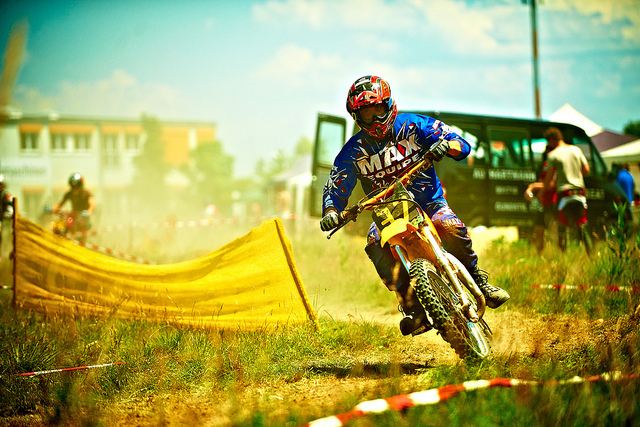

Prediction:  man riding motorcycle on track                   


In [1]:
from cap.config import coco2014_cfg, coco2017_cfg, flickr8k_cfg, nia0403_cfg, nia0404_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM, TRANSFORMER

import os 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

#data = Dataset.coco(coco2017_cfg)
model = TRANSFORMER.efficientnetb0(efficientb0_cfg, coco2017_cfg) 
#model = TRANSFORMER.efficientnetb0(efficientb0_cfg, flickr8k_cfg) 
#model.fit(5)
model.inference('datasets/COCO/test2014/COCO_test2014_000000350982.jpg', 'files/20221103_coco2017_e5_v29627/')

INFO:tensorflow:Single-worker MultiWorkerMirroredStrategy with local_devices = ('/device:GPU:0',), communication = CommunicationImplementation.AUTO
Number of devices: 1
files/20221103_coco2017_e5_v29627/model_weight.h5


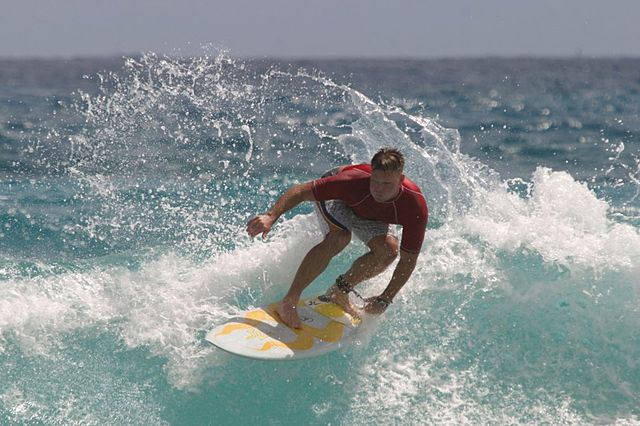

Prediction:  surfer in the ocean riding wave                  


In [8]:
from cap.config import coco2014_cfg, coco2017_cfg, flickr8k_cfg, nia0403_cfg, nia0404_cfg, vgg16_cfg, inceptionv3_cfg, efficientb0_cfg
from cap.models import Dataset, Model, LSTM, TRANSFORMER

import tensorflow as tf
import os 
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

#data = Dataset.coco(coco2017_cfg)
model = TRANSFORMER.efficientnetb0(efficientb0_cfg, coco2017_cfg) 
#model = TRANSFORMER.efficientnetb0(efficientb0_cfg, flickr8k_cfg) 
#model.fit(5)
path = tf.keras.utils.get_file('image.jpg', origin='https://tensorflow.org/images/surf.jpg')
model.inference(path, 'files/20221103_coco2017_e5_v29627/')